### Задание

1. Для нашего пайплайна (Case1) поэкспериментировать с разными моделями: 1 - бустинг, 2 - логистическая регрессия (не забудьте здесь добавить в cont_transformer стандартизацию - нормирование вещественных признаков)
2. Отобрать лучшую модель по метрикам (кстати, какая по вашему мнению здесь наиболее подходящая DS-метрика)
3. Для отобранной модели (на отложенной выборке) сделать оценку экономической эффективности при тех же вводных, как в вопросе 2 (1 доллар на привлечение, 2 доллара - с каждого правильно классифицированного (True Positive) удержанного). (подсказка) нужно посчитать FP/TP/FN/TN для выбранного оптимального порога вероятности и посчитать выручку и траты. 
4. (опционально) Провести подбор гиперпараметров лучшей модели по итогам 2-3
5. (опционально) Еще раз провести оценку экономической эффективности

Давайте поработаем с набором данных с платформы kaggle https://www.kaggle.com/adammaus/predicting-churn-for-bank-customers по оттоку клиентов банка

In [1]:
import pandas as pd
import numpy as np
import itertools
import re

from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, roc_auc_score, precision_score, classification_report, precision_recall_curve, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV

import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
#соберем наш простой pipeline, но нам понадобится написать класс для выбора нужного поля
class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        return X[self.column]
    
class NumberSelector(BaseEstimator, TransformerMixin):
    """
    Transformer to select a single column from the data frame to perform additional transformations on
    Use on numeric columns in the data
    """
    def __init__(self, key):
        self.key = key

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X[[self.key]]
    
class OHEEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, key):
        self.key = key
        self.columns = []

    def fit(self, X, y=None):
        self.columns = [col for col in pd.get_dummies(X, prefix=self.key).columns]
        return self

    def transform(self, X):
        X = pd.get_dummies(X, prefix=self.key)
        test_columns = [col for col in X.columns]
        for col_ in self.columns:
            if col_ not in test_columns:
                X[col_] = 0
        return X[self.columns]

In [3]:
def calc_metrics(y_true, y_pred, print_m=False):
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred)
    fscore = (2 * precision * recall) / (precision + recall)
    # locate the index of the largest f score
    ix = np.argmax(fscore)
    if print_m == True:
        print(f'thr = {thresholds[ix]}, fscore = {fscore[ix]}, Precision = {precision[ix]}, Recall = {recall[ix]}')
    return [thresholds[ix], fscore[ix], precision[ix], recall[ix]]

In [4]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [5]:
df = pd.read_csv("churn_data.csv")
df.head(3)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1


Есть как категориальные, так и вещественные признаки. Поле CustomerId нужно будет удалить.

In [6]:
df = df.drop(['CustomerId', 'Surname', 'RowNumber'], axis=1)
df.head(3)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1


Посмотрим на распределение классов:

In [7]:
df['Exited'].value_counts()

0    7963
1    2037
Name: Exited, dtype: int64

Не самое плохое распределение (1 к 4)

Давайте построим модель. Сразу же будем работать с использованием sklearn pipeline

In [8]:
#разделим данные на train/valid/test
X_train, X_v, y_train, y_v = train_test_split(df[df.columns[:-1]], df['Exited'], test_size=0.3, random_state=0)

In [9]:
X_valid, X_test, y_valid, y_test = train_test_split(X_v, y_v, test_size=0.3, random_state=0)

- Категориальные признаки закодируем с помощью OneHotEncoding
- Вещественные оставим пока как есть

Зададим списки признаков

In [10]:
categorical_columns = ['Geography', 'Gender', 'Tenure', 'HasCrCard', 'IsActiveMember']
continuous_columns = ['CreditScore', 'Age', 'Balance', 'NumOfProducts', 'EstimatedSalary']

Посмотрим как это работает на примере отдельного категориального признака - Gender

In [11]:
gender = Pipeline([
                ('selector', FeatureSelector(column='Gender')),
                ('ohe', OHEEncoder(key='Gender'))
            ])
gender.fit(X_train)
gender.transform(X_valid).head(3)

,Gender_Female,Gender_Male
185,0,1
548,0,1
2513,0,1


Аналогичный пример для вещественного признака (здесь мы не применяем какое-либо преобразование, а просто столбец как есть)

In [12]:
credit_score = Pipeline([
                ('selector', NumberSelector(key='CreditScore'))
            ])
credit_score.fit(X_train)
credit_score.transform(X_valid).head(3)

,CreditScore
185,514
548,508
2513,666


Теперь нам нужно под каждый признак создать трансформер и объединить их в список (сделаем это в цикле, чтобы не мучиться)

In [13]:
final_transformers = list()

for cat_col in categorical_columns:
    cat_transformer = Pipeline([
                ('selector', FeatureSelector(column=cat_col)),
                ('ohe', OHEEncoder(key=cat_col))
            ])
    final_transformers.append((cat_col, cat_transformer))
    
for cont_col in continuous_columns:
    cont_transformer = Pipeline([
                ('selector', NumberSelector(key=cont_col)),
                ('standard', StandardScaler())
            ])
    final_transformers.append((cont_col, cont_transformer))

Объединим все это в единый пайплайн

In [14]:
feats = FeatureUnion(final_transformers)

Теперь у нас есть пайплайн, который готовит признаки для моделирования.

Создадим список сравниваемых моделей:

In [15]:
r_t = 42

classifier_list = [RandomForestClassifier(random_state = r_t),
                   LogisticRegression(random_state = r_t),
                   CatBoostClassifier(random_state = r_t)]

Обучим модели и вычислим предсказания:

In [16]:
pred_dict = dict()
for clf in classifier_list:
    pipeline = Pipeline([('features',feats),('classifier', clf)])
    model = pipeline.fit(X_train, y_train)
    key = ''.join(re.findall(r"[A-Z]", re.sub(r'object.*$', "", str(clf))))
    pred_dict[key] =model.predict_proba(X_valid)[:,1]

Learning rate set to 0.023648
0:	learn: 0.6730590	total: 142ms	remaining: 2m 22s
1:	learn: 0.6558039	total: 146ms	remaining: 1m 12s
2:	learn: 0.6386319	total: 150ms	remaining: 49.7s
3:	learn: 0.6233540	total: 153ms	remaining: 38.1s
4:	learn: 0.6106121	total: 157ms	remaining: 31.2s
5:	learn: 0.5966863	total: 170ms	remaining: 28.2s
6:	learn: 0.5833193	total: 174ms	remaining: 24.7s
7:	learn: 0.5693672	total: 177ms	remaining: 22s
8:	learn: 0.5569629	total: 181ms	remaining: 19.9s
9:	learn: 0.5481072	total: 184ms	remaining: 18.2s
10:	learn: 0.5378026	total: 187ms	remaining: 16.8s
11:	learn: 0.5266221	total: 191ms	remaining: 15.7s
12:	learn: 0.5187819	total: 194ms	remaining: 14.8s
13:	learn: 0.5097332	total: 228ms	remaining: 16.1s
14:	learn: 0.5013580	total: 232ms	remaining: 15.2s
15:	learn: 0.4945204	total: 236ms	remaining: 14.5s
16:	learn: 0.4885013	total: 239ms	remaining: 13.8s
17:	learn: 0.4810354	total: 243ms	remaining: 13.2s
18:	learn: 0.4744968	total: 246ms	remaining: 12.7s
19:	learn: 

180:	learn: 0.3183010	total: 1.28s	remaining: 5.79s
181:	learn: 0.3180656	total: 1.28s	remaining: 5.77s
182:	learn: 0.3179165	total: 1.29s	remaining: 5.75s
183:	learn: 0.3176803	total: 1.3s	remaining: 5.77s
184:	learn: 0.3175458	total: 1.3s	remaining: 5.75s
185:	learn: 0.3173950	total: 1.31s	remaining: 5.73s
186:	learn: 0.3172585	total: 1.31s	remaining: 5.71s
187:	learn: 0.3170841	total: 1.33s	remaining: 5.75s
188:	learn: 0.3168759	total: 1.34s	remaining: 5.74s
189:	learn: 0.3167506	total: 1.34s	remaining: 5.71s
190:	learn: 0.3164460	total: 1.34s	remaining: 5.69s
191:	learn: 0.3162894	total: 1.36s	remaining: 5.73s
192:	learn: 0.3162334	total: 1.36s	remaining: 5.71s
193:	learn: 0.3160517	total: 1.37s	remaining: 5.69s
194:	learn: 0.3159676	total: 1.37s	remaining: 5.67s
195:	learn: 0.3157710	total: 1.38s	remaining: 5.65s
196:	learn: 0.3156334	total: 1.39s	remaining: 5.68s
197:	learn: 0.3154670	total: 1.4s	remaining: 5.67s
198:	learn: 0.3153139	total: 1.4s	remaining: 5.65s
199:	learn: 0.31

345:	learn: 0.2958063	total: 2.4s	remaining: 4.53s
346:	learn: 0.2957964	total: 2.41s	remaining: 4.54s
347:	learn: 0.2956703	total: 2.42s	remaining: 4.53s
348:	learn: 0.2955043	total: 2.42s	remaining: 4.51s
349:	learn: 0.2953488	total: 2.42s	remaining: 4.5s
350:	learn: 0.2952264	total: 2.44s	remaining: 4.52s
351:	learn: 0.2950689	total: 2.45s	remaining: 4.5s
352:	learn: 0.2949213	total: 2.45s	remaining: 4.49s
353:	learn: 0.2948068	total: 2.45s	remaining: 4.48s
354:	learn: 0.2946109	total: 2.47s	remaining: 4.49s
355:	learn: 0.2945326	total: 2.48s	remaining: 4.48s
356:	learn: 0.2944131	total: 2.48s	remaining: 4.47s
357:	learn: 0.2942388	total: 2.48s	remaining: 4.46s
358:	learn: 0.2940554	total: 2.49s	remaining: 4.44s
359:	learn: 0.2939589	total: 2.49s	remaining: 4.43s
360:	learn: 0.2938769	total: 2.5s	remaining: 4.43s
361:	learn: 0.2937197	total: 2.51s	remaining: 4.42s
362:	learn: 0.2936392	total: 2.51s	remaining: 4.41s
363:	learn: 0.2934923	total: 2.51s	remaining: 4.39s
364:	learn: 0.29

526:	learn: 0.2739351	total: 3.53s	remaining: 3.17s
527:	learn: 0.2738589	total: 3.53s	remaining: 3.15s
528:	learn: 0.2737523	total: 3.53s	remaining: 3.15s
529:	learn: 0.2736328	total: 3.54s	remaining: 3.14s
530:	learn: 0.2735148	total: 3.54s	remaining: 3.13s
531:	learn: 0.2734200	total: 3.54s	remaining: 3.12s
532:	learn: 0.2732979	total: 3.56s	remaining: 3.12s
533:	learn: 0.2732006	total: 3.57s	remaining: 3.12s
534:	learn: 0.2730838	total: 3.59s	remaining: 3.12s
535:	learn: 0.2729868	total: 3.59s	remaining: 3.11s
536:	learn: 0.2728993	total: 3.59s	remaining: 3.1s
537:	learn: 0.2728209	total: 3.6s	remaining: 3.09s
538:	learn: 0.2727334	total: 3.6s	remaining: 3.08s
539:	learn: 0.2725904	total: 3.6s	remaining: 3.07s
540:	learn: 0.2724936	total: 3.62s	remaining: 3.07s
541:	learn: 0.2723457	total: 3.62s	remaining: 3.06s
542:	learn: 0.2722533	total: 3.63s	remaining: 3.05s
543:	learn: 0.2721269	total: 3.63s	remaining: 3.04s
544:	learn: 0.2720543	total: 3.63s	remaining: 3.03s
545:	learn: 0.27

687:	learn: 0.2570293	total: 4.64s	remaining: 2.1s
688:	learn: 0.2569490	total: 4.65s	remaining: 2.1s
689:	learn: 0.2568825	total: 4.66s	remaining: 2.09s
690:	learn: 0.2567710	total: 4.66s	remaining: 2.08s
691:	learn: 0.2566922	total: 4.66s	remaining: 2.08s
692:	learn: 0.2565710	total: 4.67s	remaining: 2.07s
693:	learn: 0.2564435	total: 4.67s	remaining: 2.06s
694:	learn: 0.2563848	total: 4.67s	remaining: 2.05s
695:	learn: 0.2563200	total: 4.68s	remaining: 2.04s
696:	learn: 0.2562489	total: 4.71s	remaining: 2.05s
697:	learn: 0.2561651	total: 4.73s	remaining: 2.05s
698:	learn: 0.2560432	total: 4.73s	remaining: 2.04s
699:	learn: 0.2559515	total: 4.74s	remaining: 2.03s
700:	learn: 0.2558154	total: 4.74s	remaining: 2.02s
701:	learn: 0.2557274	total: 4.74s	remaining: 2.01s
702:	learn: 0.2556264	total: 4.76s	remaining: 2.01s
703:	learn: 0.2555451	total: 4.76s	remaining: 2s
704:	learn: 0.2554657	total: 4.77s	remaining: 1.99s
705:	learn: 0.2553491	total: 4.77s	remaining: 1.99s
706:	learn: 0.255

861:	learn: 0.2413736	total: 5.95s	remaining: 953ms
862:	learn: 0.2412779	total: 5.96s	remaining: 946ms
863:	learn: 0.2411892	total: 5.97s	remaining: 939ms
864:	learn: 0.2410824	total: 5.97s	remaining: 932ms
865:	learn: 0.2410206	total: 5.98s	remaining: 925ms
866:	learn: 0.2409344	total: 5.98s	remaining: 917ms
867:	learn: 0.2408516	total: 5.98s	remaining: 910ms
868:	learn: 0.2407498	total: 5.99s	remaining: 903ms
869:	learn: 0.2406873	total: 5.99s	remaining: 895ms
870:	learn: 0.2405754	total: 6s	remaining: 888ms
871:	learn: 0.2405043	total: 6.01s	remaining: 883ms
872:	learn: 0.2404229	total: 6.03s	remaining: 877ms
873:	learn: 0.2403443	total: 6.03s	remaining: 870ms
874:	learn: 0.2402524	total: 6.04s	remaining: 862ms
875:	learn: 0.2401399	total: 6.04s	remaining: 855ms
876:	learn: 0.2400163	total: 6.04s	remaining: 848ms
877:	learn: 0.2399686	total: 6.05s	remaining: 841ms
878:	learn: 0.2398844	total: 6.05s	remaining: 833ms
879:	learn: 0.2398242	total: 6.07s	remaining: 828ms
880:	learn: 0.2

In [17]:
pred_dict

{'RFC': array([0.02, 0.16, 0.02, ..., 0.02, 0.11, 0.14]),
 'LR': array([0.09437453, 0.12615961, 0.1171632 , ..., 0.03911286, 0.11205588,
        0.05965349]),
 'CBC': array([0.01841228, 0.0495117 , 0.03086419, ..., 0.01179348, 0.05128412,
        0.07054021])}

Также нам нужно от вероятностей перейти к меткам классов. Для этого нужно подобрать порог, после которого мы считаем, что объект можно отнести к классу 1 (если вероятность больше порога - размечаем объект как класс 1, если нет - класс 0)

In [18]:
metrics = pd.DataFrame(columns=['thresholds', 'fscore', 'precision', 'recall'])
for clf in pred_dict:
    metrics.loc[clf] = calc_metrics(y_valid, pred_dict[clf])

In [19]:
metrics

,thresholds,fscore,precision,recall
RFC,0.370000,0.657343,0.676259,0.639456
LR,0.259753,0.515385,0.447412,0.607710
CBC,0.281888,0.650052,0.599617,0.709751


#### Вопрос 1: объясните своими словами смысл метрик Precision, Recall *
1. Какова их взаимосвязь и как с ними связан порог вероятности? 
2. Можно ли подобрать порог так, что recall будет равен 1? Что при этом будет с precision
3. Аналогичный вопрос про precision

__Ваш ответ здесь:__
1.  Метрика __Precision__ - точность и характеризует долю правильно классифицированных объектов из всех объектов классифицированных как положительные нашим алгоритмом.<br>
    Метрика __Recall__ - полнота и характеризует правильно классифицированные объекты из положительного класса, т.е. долю правильно классифицированных объектов целевого класса. Это метрика в нашей задаче важнее, т.к. экономически целесообразней потратить деньги на удержание клиента.
2. Метрика Recall стремится к единице при пороге стремящемся к нулю, что приводит одновременно к уменьшению метрики Precision и наоборот.

Отрисуем матрицу ошибок

Confusion matrix, without normalization
[[1529  130]
 [ 164  277]]


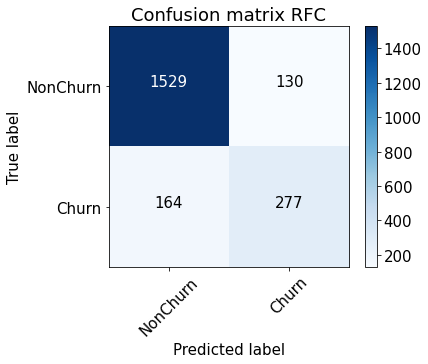

Confusion matrix, without normalization
[[1328  331]
 [ 174  267]]


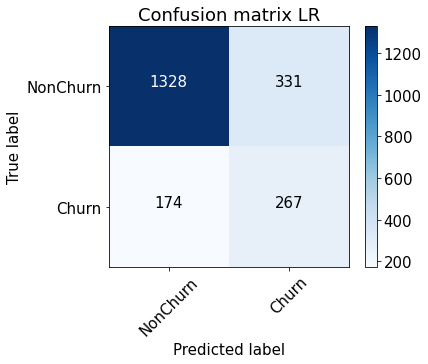

Confusion matrix, without normalization
[[1450  209]
 [ 129  312]]


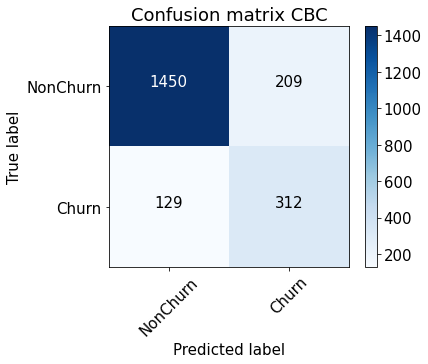

In [20]:
#мы уже нашли ранее "оптимальный" порог, когда максимизировали f_score
font = {'size' : 15}

plt.rc('font', **font)
for clf in pred_dict:
    cnf_matrix = confusion_matrix(y_valid, pred_dict[clf]>metrics.loc[clf, 'thresholds'])
    plt.figure(figsize=(6, 5))
    plot_confusion_matrix(cnf_matrix, classes=['NonChurn', 'Churn'],
                      title=f'Confusion matrix {clf}')
    plt.savefig(f"conf_matrix_{clf}.png")
    plt.show()

Выберем модель CatBoostClassifier, т.к. у этой модели метрика Recall выше.
Можно заметить, что мы очень сильно ошибаемся в сторону False Negatives, т.е у нас много тех, кто ушел в отток на самом деле, но при выбранном нами пороге в 0.28 мы не считаем их таковыми.

<b>Вопрос 2: предположим, что на удержание одного пользователя у нас уйдет 1 доллар. При этом средняя ожидаемая прибыль с каждого TP (true positive) - 2 доллара. Оцените качество модели выше с учетом этих данных и ответьте на вопрос, является ли она потенциально экономически целесообразной?</b>

Ваш ответ здесь: 

Посчитаем для случая, если мы делаем рассылку:  
Посчитаем для tp: на рассылку потратили tp долларов, получили 2tp долларов. В итоге в плюсе с tp долларами.  
Посчитаем для fp: на рассылку потратили fp долларов, но так как пользователи не собирались уходить, то это чистый убыток.  
Посчитаем для fn: потеряли 2fn долларов  
В итоге: tp - fp - 2fn
<br><br>
Посчитаем для случая, если мы не делаем рассылку:  
Tеряем 2(tp+fn)<br><br>
Модель выгодна, если рассылка действительно приводит к уменьшению оттока. Если предотвратить отток клиентов с помощью рассылки сложно, то расходы увеличатся на (tp+fp) долларов на саму рассылку. Модель стоит улучшать в сторону уменьшения fn и как следствие увеличения метрики Recall.

In [21]:
tn, fp, fn, tp = confusion_matrix(y_valid, pred_dict['CBC']>metrics.loc['CBC', 'thresholds']).ravel()
print(f'Баланс при рассылке - {tp - fp - 2*fn}$')
print(f'Баланс при отсутствии рассылки - {-2*(tp + fn)}$')

Баланс при рассылке - -155$
Баланс при отсутствии рассылки - -882$


### Подбор гиперпараметров с помощью GridSearch

Сетка с параметрами

In [22]:
pipeline = Pipeline([('features',feats),('classifier', CatBoostClassifier(random_state = r_t))])
pipeline.fit(X_train,y_train)

Learning rate set to 0.023648
0:	learn: 0.6730590	total: 5.91ms	remaining: 5.91s
1:	learn: 0.6558039	total: 21.4ms	remaining: 10.7s
2:	learn: 0.6386319	total: 37.6ms	remaining: 12.5s
3:	learn: 0.6233540	total: 40.9ms	remaining: 10.2s
4:	learn: 0.6106121	total: 44.7ms	remaining: 8.89s
5:	learn: 0.5966863	total: 48.3ms	remaining: 8.01s
6:	learn: 0.5833193	total: 51.6ms	remaining: 7.32s
7:	learn: 0.5693672	total: 68.6ms	remaining: 8.51s
8:	learn: 0.5569629	total: 72ms	remaining: 7.92s
9:	learn: 0.5481072	total: 75.5ms	remaining: 7.47s
10:	learn: 0.5378026	total: 78.5ms	remaining: 7.05s
11:	learn: 0.5266221	total: 82.4ms	remaining: 6.78s
12:	learn: 0.5187819	total: 86ms	remaining: 6.53s
13:	learn: 0.5097332	total: 98.9ms	remaining: 6.96s
14:	learn: 0.5013580	total: 103ms	remaining: 6.75s
15:	learn: 0.4945204	total: 107ms	remaining: 6.56s
16:	learn: 0.4885013	total: 114ms	remaining: 6.6s
17:	learn: 0.4810354	total: 118ms	remaining: 6.42s
18:	learn: 0.4744968	total: 121ms	remaining: 6.27s
19

165:	learn: 0.3211952	total: 1.12s	remaining: 5.63s
166:	learn: 0.3209758	total: 1.13s	remaining: 5.62s
167:	learn: 0.3207537	total: 1.13s	remaining: 5.59s
168:	learn: 0.3206162	total: 1.13s	remaining: 5.57s
169:	learn: 0.3204769	total: 1.14s	remaining: 5.55s
170:	learn: 0.3203193	total: 1.14s	remaining: 5.53s
171:	learn: 0.3200631	total: 1.15s	remaining: 5.54s
172:	learn: 0.3198023	total: 1.16s	remaining: 5.53s
173:	learn: 0.3195630	total: 1.16s	remaining: 5.5s
174:	learn: 0.3192815	total: 1.16s	remaining: 5.48s
175:	learn: 0.3191093	total: 1.18s	remaining: 5.54s
176:	learn: 0.3189955	total: 1.19s	remaining: 5.52s
177:	learn: 0.3188125	total: 1.19s	remaining: 5.5s
178:	learn: 0.3185735	total: 1.19s	remaining: 5.47s
179:	learn: 0.3184358	total: 1.21s	remaining: 5.53s
180:	learn: 0.3183010	total: 1.23s	remaining: 5.56s
181:	learn: 0.3180656	total: 1.23s	remaining: 5.54s
182:	learn: 0.3179165	total: 1.24s	remaining: 5.55s
183:	learn: 0.3176803	total: 1.25s	remaining: 5.53s
184:	learn: 0.

337:	learn: 0.2968915	total: 2.22s	remaining: 4.36s
338:	learn: 0.2967619	total: 2.23s	remaining: 4.34s
339:	learn: 0.2966914	total: 2.25s	remaining: 4.36s
340:	learn: 0.2964722	total: 2.25s	remaining: 4.35s
341:	learn: 0.2963184	total: 2.26s	remaining: 4.35s
342:	learn: 0.2962330	total: 2.27s	remaining: 4.34s
343:	learn: 0.2960741	total: 2.27s	remaining: 4.33s
344:	learn: 0.2959454	total: 2.28s	remaining: 4.32s
345:	learn: 0.2958063	total: 2.28s	remaining: 4.31s
346:	learn: 0.2957964	total: 2.28s	remaining: 4.3s
347:	learn: 0.2956703	total: 2.29s	remaining: 4.28s
348:	learn: 0.2955043	total: 2.29s	remaining: 4.27s
349:	learn: 0.2953488	total: 2.31s	remaining: 4.29s
350:	learn: 0.2952264	total: 2.31s	remaining: 4.27s
351:	learn: 0.2950689	total: 2.32s	remaining: 4.28s
352:	learn: 0.2949213	total: 2.34s	remaining: 4.29s
353:	learn: 0.2948068	total: 2.34s	remaining: 4.28s
354:	learn: 0.2946109	total: 2.35s	remaining: 4.26s
355:	learn: 0.2945326	total: 2.35s	remaining: 4.26s
356:	learn: 0

513:	learn: 0.2752757	total: 3.53s	remaining: 3.34s
514:	learn: 0.2751672	total: 3.54s	remaining: 3.33s
515:	learn: 0.2750801	total: 3.54s	remaining: 3.32s
516:	learn: 0.2749802	total: 3.54s	remaining: 3.31s
517:	learn: 0.2748793	total: 3.56s	remaining: 3.31s
518:	learn: 0.2747794	total: 3.56s	remaining: 3.3s
519:	learn: 0.2747067	total: 3.57s	remaining: 3.29s
520:	learn: 0.2746477	total: 3.57s	remaining: 3.29s
521:	learn: 0.2745373	total: 3.58s	remaining: 3.28s
522:	learn: 0.2744205	total: 3.58s	remaining: 3.27s
523:	learn: 0.2743024	total: 3.59s	remaining: 3.26s
524:	learn: 0.2741943	total: 3.6s	remaining: 3.26s
525:	learn: 0.2740836	total: 3.61s	remaining: 3.25s
526:	learn: 0.2739351	total: 3.61s	remaining: 3.24s
527:	learn: 0.2738589	total: 3.62s	remaining: 3.24s
528:	learn: 0.2737523	total: 3.62s	remaining: 3.23s
529:	learn: 0.2736328	total: 3.63s	remaining: 3.22s
530:	learn: 0.2735148	total: 3.63s	remaining: 3.21s
531:	learn: 0.2734200	total: 3.65s	remaining: 3.21s
532:	learn: 0.

687:	learn: 0.2570293	total: 4.66s	remaining: 2.11s
688:	learn: 0.2569490	total: 4.66s	remaining: 2.1s
689:	learn: 0.2568825	total: 4.67s	remaining: 2.1s
690:	learn: 0.2567710	total: 4.68s	remaining: 2.09s
691:	learn: 0.2566922	total: 4.7s	remaining: 2.09s
692:	learn: 0.2565710	total: 4.7s	remaining: 2.08s
693:	learn: 0.2564435	total: 4.71s	remaining: 2.08s
694:	learn: 0.2563848	total: 4.71s	remaining: 2.07s
695:	learn: 0.2563200	total: 4.71s	remaining: 2.06s
696:	learn: 0.2562489	total: 4.73s	remaining: 2.06s
697:	learn: 0.2561651	total: 4.73s	remaining: 2.05s
698:	learn: 0.2560432	total: 4.74s	remaining: 2.04s
699:	learn: 0.2559515	total: 4.74s	remaining: 2.03s
700:	learn: 0.2558154	total: 4.76s	remaining: 2.03s
701:	learn: 0.2557274	total: 4.76s	remaining: 2.02s
702:	learn: 0.2556264	total: 4.77s	remaining: 2.02s
703:	learn: 0.2555451	total: 4.78s	remaining: 2.01s
704:	learn: 0.2554657	total: 4.78s	remaining: 2s
705:	learn: 0.2553491	total: 4.78s	remaining: 1.99s
706:	learn: 0.25528

856:	learn: 0.2417458	total: 5.74s	remaining: 959ms
857:	learn: 0.2416713	total: 5.76s	remaining: 953ms
858:	learn: 0.2416036	total: 5.76s	remaining: 946ms
859:	learn: 0.2415255	total: 5.78s	remaining: 940ms
860:	learn: 0.2414384	total: 5.78s	remaining: 933ms
861:	learn: 0.2413736	total: 5.78s	remaining: 926ms
862:	learn: 0.2412779	total: 5.79s	remaining: 919ms
863:	learn: 0.2411892	total: 5.79s	remaining: 912ms
864:	learn: 0.2410824	total: 5.8s	remaining: 905ms
865:	learn: 0.2410206	total: 5.8s	remaining: 898ms
866:	learn: 0.2409344	total: 5.81s	remaining: 891ms
867:	learn: 0.2408516	total: 5.81s	remaining: 884ms
868:	learn: 0.2407498	total: 5.82s	remaining: 877ms
869:	learn: 0.2406873	total: 5.84s	remaining: 872ms
870:	learn: 0.2405754	total: 5.84s	remaining: 865ms
871:	learn: 0.2405043	total: 5.84s	remaining: 858ms
872:	learn: 0.2404229	total: 5.85s	remaining: 851ms
873:	learn: 0.2403443	total: 5.87s	remaining: 846ms
874:	learn: 0.2402524	total: 5.87s	remaining: 838ms
875:	learn: 0.

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('Geography',
                                                 Pipeline(steps=[('selector',
                                                                  FeatureSelector(column='Geography')),
                                                                 ('ohe',
                                                                  OHEEncoder(key='Geography'))])),
                                                ('Gender',
                                                 Pipeline(steps=[('selector',
                                                                  FeatureSelector(column='Gender')),
                                                                 ('ohe',
                                                                  OHEEncoder(key='Gender'))])),
                                                ('Tenure',
                                                 Pipeline(steps=[('selector',
           

In [23]:
params={'classifier__iterations':[_ for _ in range(100,1000,100)],
        'classifier__depth':[2,4,6],
        'classifier__min_data_in_leaf':[1, 2, 3]
        }

Запускаем перебор

In [24]:
grid = GridSearchCV(pipeline,
                    param_grid=params,
                    scoring = 'recall',
                    cv=6,
                    refit=False)

search = grid.fit(X_train, y_train)
print(f'Best_params:\n{search.best_params_}')

Learning rate set to 0.180705
0:	learn: 0.5986609	total: 1.5ms	remaining: 149ms
1:	learn: 0.5346435	total: 3.3ms	remaining: 162ms
2:	learn: 0.4896453	total: 5.01ms	remaining: 162ms
3:	learn: 0.4589821	total: 6.72ms	remaining: 161ms
4:	learn: 0.4405630	total: 8.67ms	remaining: 165ms
5:	learn: 0.4228495	total: 10.5ms	remaining: 164ms
6:	learn: 0.4110643	total: 12.3ms	remaining: 163ms
7:	learn: 0.4016890	total: 14ms	remaining: 161ms
8:	learn: 0.3956343	total: 15.7ms	remaining: 159ms
9:	learn: 0.3899875	total: 17.4ms	remaining: 156ms
10:	learn: 0.3854009	total: 19ms	remaining: 154ms
11:	learn: 0.3810446	total: 20.6ms	remaining: 151ms
12:	learn: 0.3773255	total: 22.1ms	remaining: 148ms
13:	learn: 0.3746089	total: 23.7ms	remaining: 146ms
14:	learn: 0.3726785	total: 25.3ms	remaining: 144ms
15:	learn: 0.3705219	total: 27ms	remaining: 142ms
16:	learn: 0.3684541	total: 28.6ms	remaining: 140ms
17:	learn: 0.3647702	total: 30.3ms	remaining: 138ms
18:	learn: 0.3631981	total: 32.1ms	remaining: 137ms


0:	learn: 0.5919308	total: 1.82ms	remaining: 181ms
1:	learn: 0.5436167	total: 3.69ms	remaining: 181ms
2:	learn: 0.4992368	total: 5.32ms	remaining: 172ms
3:	learn: 0.4647493	total: 6.97ms	remaining: 167ms
4:	learn: 0.4413847	total: 9.1ms	remaining: 173ms
5:	learn: 0.4269757	total: 11ms	remaining: 172ms
6:	learn: 0.4144175	total: 12.7ms	remaining: 169ms
7:	learn: 0.4025820	total: 14.3ms	remaining: 165ms
8:	learn: 0.3961878	total: 15.9ms	remaining: 161ms
9:	learn: 0.3894371	total: 17.5ms	remaining: 158ms
10:	learn: 0.3840881	total: 19.2ms	remaining: 155ms
11:	learn: 0.3806303	total: 20.8ms	remaining: 153ms
12:	learn: 0.3778043	total: 22.6ms	remaining: 151ms
13:	learn: 0.3751593	total: 24.3ms	remaining: 149ms
14:	learn: 0.3720250	total: 26ms	remaining: 147ms
15:	learn: 0.3698118	total: 27.5ms	remaining: 145ms
16:	learn: 0.3678048	total: 29.1ms	remaining: 142ms
17:	learn: 0.3651973	total: 30.7ms	remaining: 140ms
18:	learn: 0.3632431	total: 32.4ms	remaining: 138ms
19:	learn: 0.3618680	total:

Learning rate set to 0.180718
0:	learn: 0.5970434	total: 1.81ms	remaining: 180ms
1:	learn: 0.5455038	total: 3.81ms	remaining: 187ms
2:	learn: 0.5015775	total: 5.53ms	remaining: 179ms
3:	learn: 0.4686160	total: 7.46ms	remaining: 179ms
4:	learn: 0.4438865	total: 9.19ms	remaining: 175ms
5:	learn: 0.4266624	total: 10.8ms	remaining: 170ms
6:	learn: 0.4155806	total: 12.8ms	remaining: 171ms
7:	learn: 0.4059371	total: 14.5ms	remaining: 167ms
8:	learn: 0.3972547	total: 16.1ms	remaining: 163ms
9:	learn: 0.3907274	total: 17.8ms	remaining: 160ms
10:	learn: 0.3846963	total: 19.4ms	remaining: 157ms
11:	learn: 0.3802894	total: 21.1ms	remaining: 155ms
12:	learn: 0.3764830	total: 22.8ms	remaining: 152ms
13:	learn: 0.3731935	total: 24.3ms	remaining: 149ms
14:	learn: 0.3710064	total: 26.2ms	remaining: 148ms
15:	learn: 0.3667144	total: 28.8ms	remaining: 151ms
16:	learn: 0.3645263	total: 30.5ms	remaining: 149ms
17:	learn: 0.3627569	total: 32.2ms	remaining: 147ms
18:	learn: 0.3606452	total: 33.8ms	remaining

Learning rate set to 0.180705
0:	learn: 0.5986609	total: 1.72ms	remaining: 170ms
1:	learn: 0.5346435	total: 3.61ms	remaining: 177ms
2:	learn: 0.4896453	total: 5.34ms	remaining: 173ms
3:	learn: 0.4589821	total: 7.18ms	remaining: 172ms
4:	learn: 0.4405630	total: 9.26ms	remaining: 176ms
5:	learn: 0.4228495	total: 10.9ms	remaining: 171ms
6:	learn: 0.4110643	total: 12.8ms	remaining: 171ms
7:	learn: 0.4016890	total: 14.5ms	remaining: 167ms
8:	learn: 0.3956343	total: 16.3ms	remaining: 165ms
9:	learn: 0.3899875	total: 17.9ms	remaining: 161ms
10:	learn: 0.3854009	total: 19.5ms	remaining: 158ms
11:	learn: 0.3810446	total: 21.1ms	remaining: 155ms
12:	learn: 0.3773255	total: 22.8ms	remaining: 152ms
13:	learn: 0.3746089	total: 24.3ms	remaining: 149ms
14:	learn: 0.3726785	total: 26ms	remaining: 148ms
15:	learn: 0.3705219	total: 27.8ms	remaining: 146ms
16:	learn: 0.3684541	total: 29.5ms	remaining: 144ms
17:	learn: 0.3647702	total: 31.2ms	remaining: 142ms
18:	learn: 0.3631981	total: 33.1ms	remaining: 

Learning rate set to 0.180705
0:	learn: 0.5919308	total: 1.82ms	remaining: 180ms
1:	learn: 0.5436167	total: 3.76ms	remaining: 184ms
2:	learn: 0.4992368	total: 5.49ms	remaining: 178ms
3:	learn: 0.4647493	total: 7.28ms	remaining: 175ms
4:	learn: 0.4413847	total: 9.15ms	remaining: 174ms
5:	learn: 0.4269757	total: 11.4ms	remaining: 179ms
6:	learn: 0.4144175	total: 13.2ms	remaining: 175ms
7:	learn: 0.4025820	total: 15ms	remaining: 173ms
8:	learn: 0.3961878	total: 16.7ms	remaining: 168ms
9:	learn: 0.3894371	total: 18.3ms	remaining: 165ms
10:	learn: 0.3840881	total: 20ms	remaining: 162ms
11:	learn: 0.3806303	total: 21.7ms	remaining: 159ms
12:	learn: 0.3778043	total: 23.4ms	remaining: 156ms
13:	learn: 0.3751593	total: 25ms	remaining: 154ms
14:	learn: 0.3720250	total: 26.7ms	remaining: 151ms
15:	learn: 0.3698118	total: 28.3ms	remaining: 149ms
16:	learn: 0.3678048	total: 30ms	remaining: 147ms
17:	learn: 0.3651973	total: 31.7ms	remaining: 144ms
18:	learn: 0.3632431	total: 33.4ms	remaining: 142ms


Learning rate set to 0.180718
0:	learn: 0.5970434	total: 1.69ms	remaining: 167ms
1:	learn: 0.5455038	total: 3.62ms	remaining: 178ms
2:	learn: 0.5015775	total: 5.28ms	remaining: 171ms
3:	learn: 0.4686160	total: 7.2ms	remaining: 173ms
4:	learn: 0.4438865	total: 8.98ms	remaining: 171ms
5:	learn: 0.4266624	total: 10.7ms	remaining: 167ms
6:	learn: 0.4155806	total: 12.5ms	remaining: 166ms
7:	learn: 0.4059371	total: 14.1ms	remaining: 162ms
8:	learn: 0.3972547	total: 15.7ms	remaining: 159ms
9:	learn: 0.3907274	total: 17.3ms	remaining: 156ms
10:	learn: 0.3846963	total: 18.9ms	remaining: 153ms
11:	learn: 0.3802894	total: 20.6ms	remaining: 151ms
12:	learn: 0.3764830	total: 22.3ms	remaining: 149ms
13:	learn: 0.3731935	total: 24ms	remaining: 147ms
14:	learn: 0.3710064	total: 25.9ms	remaining: 147ms
15:	learn: 0.3667144	total: 27.5ms	remaining: 144ms
16:	learn: 0.3645263	total: 29.1ms	remaining: 142ms
17:	learn: 0.3627569	total: 30.8ms	remaining: 140ms
18:	learn: 0.3606452	total: 32.3ms	remaining: 1

Learning rate set to 0.180705
0:	learn: 0.5986609	total: 1.56ms	remaining: 154ms
1:	learn: 0.5346435	total: 3.31ms	remaining: 162ms
2:	learn: 0.4896453	total: 4.99ms	remaining: 161ms
3:	learn: 0.4589821	total: 6.65ms	remaining: 160ms
4:	learn: 0.4405630	total: 8.64ms	remaining: 164ms
5:	learn: 0.4228495	total: 10.4ms	remaining: 164ms
6:	learn: 0.4110643	total: 12.2ms	remaining: 162ms
7:	learn: 0.4016890	total: 13.8ms	remaining: 159ms
8:	learn: 0.3956343	total: 15.5ms	remaining: 157ms
9:	learn: 0.3899875	total: 17.2ms	remaining: 155ms
10:	learn: 0.3854009	total: 18.9ms	remaining: 153ms
11:	learn: 0.3810446	total: 20.6ms	remaining: 151ms
12:	learn: 0.3773255	total: 22.2ms	remaining: 149ms
13:	learn: 0.3746089	total: 23.9ms	remaining: 147ms
14:	learn: 0.3726785	total: 25.7ms	remaining: 146ms
15:	learn: 0.3705219	total: 27.4ms	remaining: 144ms
16:	learn: 0.3684541	total: 29ms	remaining: 142ms
17:	learn: 0.3647702	total: 30.7ms	remaining: 140ms
18:	learn: 0.3631981	total: 32.5ms	remaining: 

Learning rate set to 0.180705
0:	learn: 0.5919308	total: 1.7ms	remaining: 169ms
1:	learn: 0.5436167	total: 3.58ms	remaining: 176ms
2:	learn: 0.4992368	total: 5.32ms	remaining: 172ms
3:	learn: 0.4647493	total: 7.15ms	remaining: 172ms
4:	learn: 0.4413847	total: 9.16ms	remaining: 174ms
5:	learn: 0.4269757	total: 11.1ms	remaining: 174ms
6:	learn: 0.4144175	total: 12.7ms	remaining: 169ms
7:	learn: 0.4025820	total: 14.3ms	remaining: 165ms
8:	learn: 0.3961878	total: 15.9ms	remaining: 161ms
9:	learn: 0.3894371	total: 17.6ms	remaining: 158ms
10:	learn: 0.3840881	total: 19.3ms	remaining: 156ms
11:	learn: 0.3806303	total: 20.8ms	remaining: 153ms
12:	learn: 0.3778043	total: 22.5ms	remaining: 151ms
13:	learn: 0.3751593	total: 24.1ms	remaining: 148ms
14:	learn: 0.3720250	total: 25.8ms	remaining: 146ms
15:	learn: 0.3698118	total: 27.4ms	remaining: 144ms
16:	learn: 0.3678048	total: 29.1ms	remaining: 142ms
17:	learn: 0.3651973	total: 30.7ms	remaining: 140ms
18:	learn: 0.3632431	total: 32.4ms	remaining:

Learning rate set to 0.180718
0:	learn: 0.5970434	total: 1.59ms	remaining: 158ms
1:	learn: 0.5455038	total: 4.06ms	remaining: 199ms
2:	learn: 0.5015775	total: 5.78ms	remaining: 187ms
3:	learn: 0.4686160	total: 7.73ms	remaining: 186ms
4:	learn: 0.4438865	total: 9.41ms	remaining: 179ms
5:	learn: 0.4266624	total: 11ms	remaining: 172ms
6:	learn: 0.4155806	total: 12.8ms	remaining: 170ms
7:	learn: 0.4059371	total: 14.4ms	remaining: 166ms
8:	learn: 0.3972547	total: 16ms	remaining: 162ms
9:	learn: 0.3907274	total: 17.6ms	remaining: 159ms
10:	learn: 0.3846963	total: 19.2ms	remaining: 156ms
11:	learn: 0.3802894	total: 20.9ms	remaining: 154ms
12:	learn: 0.3764830	total: 22.7ms	remaining: 152ms
13:	learn: 0.3731935	total: 24.4ms	remaining: 150ms
14:	learn: 0.3710064	total: 26.5ms	remaining: 150ms
15:	learn: 0.3667144	total: 28.5ms	remaining: 149ms
16:	learn: 0.3645263	total: 30.2ms	remaining: 147ms
17:	learn: 0.3627569	total: 32.2ms	remaining: 147ms
18:	learn: 0.3606452	total: 33.8ms	remaining: 14

Learning rate set to 0.095703
0:	learn: 0.6400185	total: 1.62ms	remaining: 322ms
1:	learn: 0.5959848	total: 3.83ms	remaining: 379ms
2:	learn: 0.5587955	total: 5.72ms	remaining: 376ms
3:	learn: 0.5304244	total: 7.76ms	remaining: 380ms
4:	learn: 0.5078942	total: 9.49ms	remaining: 370ms
5:	learn: 0.4861222	total: 11.2ms	remaining: 362ms
6:	learn: 0.4709430	total: 12.9ms	remaining: 356ms
7:	learn: 0.4575841	total: 14.6ms	remaining: 351ms
8:	learn: 0.4479044	total: 16.6ms	remaining: 352ms
9:	learn: 0.4379677	total: 18.5ms	remaining: 352ms
10:	learn: 0.4278935	total: 20.4ms	remaining: 350ms
11:	learn: 0.4199847	total: 22.1ms	remaining: 346ms
12:	learn: 0.4138169	total: 23.8ms	remaining: 343ms
13:	learn: 0.4081253	total: 25.6ms	remaining: 340ms
14:	learn: 0.4039231	total: 27.4ms	remaining: 339ms
15:	learn: 0.4003263	total: 29.3ms	remaining: 337ms
16:	learn: 0.3963694	total: 31.1ms	remaining: 335ms
17:	learn: 0.3932265	total: 32.8ms	remaining: 332ms
18:	learn: 0.3908961	total: 34.6ms	remaining

179:	learn: 0.3276772	total: 324ms	remaining: 36ms
180:	learn: 0.3275799	total: 326ms	remaining: 34.2ms
181:	learn: 0.3274956	total: 328ms	remaining: 32.4ms
182:	learn: 0.3274093	total: 330ms	remaining: 30.6ms
183:	learn: 0.3273512	total: 331ms	remaining: 28.8ms
184:	learn: 0.3272695	total: 333ms	remaining: 27ms
185:	learn: 0.3271787	total: 335ms	remaining: 25.2ms
186:	learn: 0.3269010	total: 337ms	remaining: 23.4ms
187:	learn: 0.3268526	total: 339ms	remaining: 21.6ms
188:	learn: 0.3267608	total: 341ms	remaining: 19.8ms
189:	learn: 0.3266431	total: 342ms	remaining: 18ms
190:	learn: 0.3265757	total: 344ms	remaining: 16.2ms
191:	learn: 0.3263985	total: 346ms	remaining: 14.4ms
192:	learn: 0.3262841	total: 348ms	remaining: 12.6ms
193:	learn: 0.3262318	total: 350ms	remaining: 10.8ms
194:	learn: 0.3261277	total: 351ms	remaining: 9ms
195:	learn: 0.3260600	total: 353ms	remaining: 7.2ms
196:	learn: 0.3258706	total: 355ms	remaining: 5.4ms
197:	learn: 0.3257679	total: 357ms	remaining: 3.6ms
198:	

Learning rate set to 0.095703
0:	learn: 0.6360642	total: 1.64ms	remaining: 326ms
1:	learn: 0.5934975	total: 3.47ms	remaining: 343ms
2:	learn: 0.5583190	total: 5.89ms	remaining: 387ms
3:	learn: 0.5280962	total: 7.69ms	remaining: 377ms
4:	learn: 0.5034346	total: 9.56ms	remaining: 373ms
5:	learn: 0.4841129	total: 11.4ms	remaining: 368ms
6:	learn: 0.4685352	total: 13.1ms	remaining: 360ms
7:	learn: 0.4548720	total: 14.7ms	remaining: 354ms
8:	learn: 0.4435785	total: 16.4ms	remaining: 349ms
9:	learn: 0.4345907	total: 18ms	remaining: 342ms
10:	learn: 0.4261707	total: 19.6ms	remaining: 337ms
11:	learn: 0.4201616	total: 21.5ms	remaining: 337ms
12:	learn: 0.4138592	total: 23.2ms	remaining: 333ms
13:	learn: 0.4091581	total: 24.8ms	remaining: 330ms
14:	learn: 0.4056002	total: 26.4ms	remaining: 326ms
15:	learn: 0.4012909	total: 28.2ms	remaining: 324ms
16:	learn: 0.3981891	total: 29.9ms	remaining: 322ms
17:	learn: 0.3950503	total: 31.6ms	remaining: 319ms
18:	learn: 0.3929625	total: 33.3ms	remaining: 

183:	learn: 0.3247036	total: 326ms	remaining: 28.4ms
184:	learn: 0.3246057	total: 328ms	remaining: 26.6ms
185:	learn: 0.3245333	total: 330ms	remaining: 24.8ms
186:	learn: 0.3243821	total: 331ms	remaining: 23ms
187:	learn: 0.3243414	total: 333ms	remaining: 21.3ms
188:	learn: 0.3241548	total: 335ms	remaining: 19.5ms
189:	learn: 0.3241071	total: 337ms	remaining: 17.7ms
190:	learn: 0.3240240	total: 339ms	remaining: 16ms
191:	learn: 0.3239223	total: 340ms	remaining: 14.2ms
192:	learn: 0.3238087	total: 342ms	remaining: 12.4ms
193:	learn: 0.3236337	total: 344ms	remaining: 10.6ms
194:	learn: 0.3235770	total: 346ms	remaining: 8.86ms
195:	learn: 0.3233962	total: 347ms	remaining: 7.09ms
196:	learn: 0.3232071	total: 349ms	remaining: 5.32ms
197:	learn: 0.3231122	total: 351ms	remaining: 3.54ms
198:	learn: 0.3230479	total: 353ms	remaining: 1.77ms
199:	learn: 0.3229234	total: 354ms	remaining: 0us
Learning rate set to 0.095703
0:	learn: 0.6376365	total: 2.19ms	remaining: 436ms
1:	learn: 0.5943756	total

198:	learn: 0.3239859	total: 371ms	remaining: 1.86ms
199:	learn: 0.3238965	total: 373ms	remaining: 0us
Learning rate set to 0.09571
0:	learn: 0.6390297	total: 1.62ms	remaining: 323ms
1:	learn: 0.6037157	total: 3.4ms	remaining: 337ms
2:	learn: 0.5658369	total: 5.26ms	remaining: 345ms
3:	learn: 0.5366538	total: 7.2ms	remaining: 353ms
4:	learn: 0.5123464	total: 9.06ms	remaining: 353ms
5:	learn: 0.4936637	total: 10.9ms	remaining: 353ms
6:	learn: 0.4763203	total: 12.8ms	remaining: 354ms
7:	learn: 0.4603399	total: 14.6ms	remaining: 349ms
8:	learn: 0.4499032	total: 16.3ms	remaining: 347ms
9:	learn: 0.4397407	total: 18.2ms	remaining: 345ms
10:	learn: 0.4320804	total: 20.1ms	remaining: 345ms
11:	learn: 0.4252397	total: 21.8ms	remaining: 341ms
12:	learn: 0.4193865	total: 23.6ms	remaining: 340ms
13:	learn: 0.4139574	total: 25.6ms	remaining: 340ms
14:	learn: 0.4070667	total: 27.5ms	remaining: 339ms
15:	learn: 0.4016327	total: 29.3ms	remaining: 337ms
16:	learn: 0.3982694	total: 31.2ms	remaining: 33

Learning rate set to 0.09571
0:	learn: 0.6412354	total: 1.83ms	remaining: 364ms
1:	learn: 0.5995275	total: 3.56ms	remaining: 352ms
2:	learn: 0.5650456	total: 5.1ms	remaining: 335ms
3:	learn: 0.5325341	total: 6.67ms	remaining: 327ms
4:	learn: 0.5094290	total: 8.28ms	remaining: 323ms
5:	learn: 0.4877627	total: 9.93ms	remaining: 321ms
6:	learn: 0.4709651	total: 11.8ms	remaining: 324ms
7:	learn: 0.4583540	total: 13.5ms	remaining: 324ms
8:	learn: 0.4489628	total: 15.1ms	remaining: 321ms
9:	learn: 0.4390407	total: 16.7ms	remaining: 317ms
10:	learn: 0.4294475	total: 18.5ms	remaining: 318ms
11:	learn: 0.4228338	total: 20.2ms	remaining: 316ms
12:	learn: 0.4159518	total: 21.9ms	remaining: 315ms
13:	learn: 0.4109785	total: 23.7ms	remaining: 315ms
14:	learn: 0.4066121	total: 25.3ms	remaining: 312ms
15:	learn: 0.4032469	total: 27ms	remaining: 311ms
16:	learn: 0.3999467	total: 28.7ms	remaining: 309ms
17:	learn: 0.3971614	total: 30.3ms	remaining: 306ms
18:	learn: 0.3951154	total: 31.9ms	remaining: 30

188:	learn: 0.3259883	total: 330ms	remaining: 19.2ms
189:	learn: 0.3258126	total: 332ms	remaining: 17.5ms
190:	learn: 0.3257255	total: 333ms	remaining: 15.7ms
191:	learn: 0.3256709	total: 335ms	remaining: 14ms
192:	learn: 0.3256183	total: 337ms	remaining: 12.2ms
193:	learn: 0.3255665	total: 339ms	remaining: 10.5ms
194:	learn: 0.3254292	total: 341ms	remaining: 8.74ms
195:	learn: 0.3252117	total: 343ms	remaining: 6.99ms
196:	learn: 0.3251130	total: 345ms	remaining: 5.25ms
197:	learn: 0.3250442	total: 346ms	remaining: 3.5ms
198:	learn: 0.3249545	total: 348ms	remaining: 1.75ms
199:	learn: 0.3248919	total: 350ms	remaining: 0us
Learning rate set to 0.095703
0:	learn: 0.6400185	total: 1.59ms	remaining: 316ms
1:	learn: 0.5959848	total: 3.38ms	remaining: 335ms
2:	learn: 0.5587955	total: 5.04ms	remaining: 331ms
3:	learn: 0.5304244	total: 6.94ms	remaining: 340ms
4:	learn: 0.5078942	total: 8.74ms	remaining: 341ms
5:	learn: 0.4861222	total: 10.5ms	remaining: 338ms
6:	learn: 0.4709430	total: 12.2ms	

Learning rate set to 0.095703
0:	learn: 0.6370585	total: 1.81ms	remaining: 361ms
1:	learn: 0.5979276	total: 3.53ms	remaining: 349ms
2:	learn: 0.5625922	total: 5.12ms	remaining: 336ms
3:	learn: 0.5319205	total: 6.83ms	remaining: 335ms
4:	learn: 0.5064810	total: 8.55ms	remaining: 334ms
5:	learn: 0.4901342	total: 10.3ms	remaining: 333ms
6:	learn: 0.4736558	total: 11.9ms	remaining: 327ms
7:	learn: 0.4628109	total: 13.5ms	remaining: 324ms
8:	learn: 0.4499983	total: 15.1ms	remaining: 320ms
9:	learn: 0.4404864	total: 16.7ms	remaining: 318ms
10:	learn: 0.4326653	total: 18.4ms	remaining: 316ms
11:	learn: 0.4245857	total: 20.1ms	remaining: 315ms
12:	learn: 0.4189333	total: 21.9ms	remaining: 315ms
13:	learn: 0.4130187	total: 23.7ms	remaining: 315ms
14:	learn: 0.4083096	total: 25.4ms	remaining: 313ms
15:	learn: 0.4035459	total: 27.1ms	remaining: 311ms
16:	learn: 0.4007456	total: 29ms	remaining: 312ms
17:	learn: 0.3973825	total: 30.6ms	remaining: 309ms
18:	learn: 0.3949902	total: 32.2ms	remaining: 

184:	learn: 0.3262092	total: 321ms	remaining: 26ms
185:	learn: 0.3261022	total: 323ms	remaining: 24.3ms
186:	learn: 0.3260068	total: 324ms	remaining: 22.6ms
187:	learn: 0.3258674	total: 326ms	remaining: 20.8ms
188:	learn: 0.3257791	total: 328ms	remaining: 19.1ms
189:	learn: 0.3257026	total: 330ms	remaining: 17.4ms
190:	learn: 0.3255132	total: 332ms	remaining: 15.6ms
191:	learn: 0.3254377	total: 333ms	remaining: 13.9ms
192:	learn: 0.3253405	total: 335ms	remaining: 12.2ms
193:	learn: 0.3252427	total: 337ms	remaining: 10.4ms
194:	learn: 0.3251753	total: 339ms	remaining: 8.68ms
195:	learn: 0.3250852	total: 341ms	remaining: 6.95ms
196:	learn: 0.3248961	total: 342ms	remaining: 5.21ms
197:	learn: 0.3247792	total: 344ms	remaining: 3.47ms
198:	learn: 0.3246890	total: 346ms	remaining: 1.74ms
199:	learn: 0.3245996	total: 347ms	remaining: 0us
Learning rate set to 0.095703
0:	learn: 0.6360642	total: 1.64ms	remaining: 326ms
1:	learn: 0.5934975	total: 3.47ms	remaining: 344ms
2:	learn: 0.5583190	total

Learning rate set to 0.095703
0:	learn: 0.6376365	total: 1.71ms	remaining: 341ms
1:	learn: 0.5943756	total: 3.49ms	remaining: 345ms
2:	learn: 0.5596314	total: 5.09ms	remaining: 335ms
3:	learn: 0.5283875	total: 6.77ms	remaining: 332ms
4:	learn: 0.5052509	total: 8.45ms	remaining: 329ms
5:	learn: 0.4845068	total: 10.1ms	remaining: 326ms
6:	learn: 0.4677012	total: 11.8ms	remaining: 325ms
7:	learn: 0.4548063	total: 13.5ms	remaining: 324ms
8:	learn: 0.4447368	total: 15.1ms	remaining: 320ms
9:	learn: 0.4346871	total: 16.7ms	remaining: 318ms
10:	learn: 0.4269969	total: 18.4ms	remaining: 316ms
11:	learn: 0.4207084	total: 20.2ms	remaining: 316ms
12:	learn: 0.4145282	total: 21.7ms	remaining: 313ms
13:	learn: 0.4093881	total: 23.4ms	remaining: 311ms
14:	learn: 0.4050858	total: 25ms	remaining: 308ms
15:	learn: 0.4018670	total: 26.6ms	remaining: 305ms
16:	learn: 0.3984194	total: 28.2ms	remaining: 304ms
17:	learn: 0.3949748	total: 29.9ms	remaining: 303ms
18:	learn: 0.3929079	total: 31.6ms	remaining: 

188:	learn: 0.3250899	total: 330ms	remaining: 19.2ms
189:	learn: 0.3250124	total: 331ms	remaining: 17.4ms
190:	learn: 0.3248959	total: 333ms	remaining: 15.7ms
191:	learn: 0.3247572	total: 335ms	remaining: 14ms
192:	learn: 0.3246748	total: 337ms	remaining: 12.2ms
193:	learn: 0.3245900	total: 339ms	remaining: 10.5ms
194:	learn: 0.3245213	total: 340ms	remaining: 8.73ms
195:	learn: 0.3244160	total: 342ms	remaining: 6.98ms
196:	learn: 0.3243823	total: 344ms	remaining: 5.24ms
197:	learn: 0.3242714	total: 346ms	remaining: 3.49ms
198:	learn: 0.3239859	total: 347ms	remaining: 1.75ms
199:	learn: 0.3238965	total: 349ms	remaining: 0us
Learning rate set to 0.09571
0:	learn: 0.6390297	total: 1.65ms	remaining: 329ms
1:	learn: 0.6037157	total: 3.51ms	remaining: 347ms
2:	learn: 0.5658369	total: 5.42ms	remaining: 356ms
3:	learn: 0.5366538	total: 7.48ms	remaining: 366ms
4:	learn: 0.5123464	total: 9.3ms	remaining: 363ms
5:	learn: 0.4936637	total: 11.1ms	remaining: 357ms
6:	learn: 0.4763203	total: 13ms	rem

Learning rate set to 0.09571
0:	learn: 0.6412354	total: 2.51ms	remaining: 500ms
1:	learn: 0.5995275	total: 4.39ms	remaining: 435ms
2:	learn: 0.5650456	total: 6.08ms	remaining: 399ms
3:	learn: 0.5325341	total: 7.78ms	remaining: 381ms
4:	learn: 0.5094290	total: 9.64ms	remaining: 376ms
5:	learn: 0.4877627	total: 11.4ms	remaining: 369ms
6:	learn: 0.4709651	total: 13.5ms	remaining: 373ms
7:	learn: 0.4583540	total: 15.4ms	remaining: 370ms
8:	learn: 0.4489628	total: 17.4ms	remaining: 370ms
9:	learn: 0.4390407	total: 19.3ms	remaining: 367ms
10:	learn: 0.4294475	total: 21.3ms	remaining: 367ms
11:	learn: 0.4228338	total: 23.3ms	remaining: 364ms
12:	learn: 0.4159518	total: 25.1ms	remaining: 361ms
13:	learn: 0.4109785	total: 27.1ms	remaining: 361ms
14:	learn: 0.4066121	total: 29.1ms	remaining: 359ms
15:	learn: 0.4032469	total: 31.3ms	remaining: 360ms
16:	learn: 0.3999467	total: 33.8ms	remaining: 364ms
17:	learn: 0.3971614	total: 35.7ms	remaining: 361ms
18:	learn: 0.3951154	total: 37.5ms	remaining:

176:	learn: 0.3271746	total: 319ms	remaining: 41.4ms
177:	learn: 0.3270000	total: 321ms	remaining: 39.6ms
178:	learn: 0.3268923	total: 323ms	remaining: 37.9ms
179:	learn: 0.3268319	total: 325ms	remaining: 36.1ms
180:	learn: 0.3267192	total: 326ms	remaining: 34.3ms
181:	learn: 0.3266360	total: 328ms	remaining: 32.4ms
182:	learn: 0.3265546	total: 330ms	remaining: 30.6ms
183:	learn: 0.3264875	total: 332ms	remaining: 28.8ms
184:	learn: 0.3264125	total: 333ms	remaining: 27ms
185:	learn: 0.3263185	total: 335ms	remaining: 25.2ms
186:	learn: 0.3261360	total: 337ms	remaining: 23.4ms
187:	learn: 0.3260568	total: 339ms	remaining: 21.6ms
188:	learn: 0.3259883	total: 340ms	remaining: 19.8ms
189:	learn: 0.3258126	total: 342ms	remaining: 18ms
190:	learn: 0.3257255	total: 344ms	remaining: 16.2ms
191:	learn: 0.3256709	total: 346ms	remaining: 14.4ms
192:	learn: 0.3256183	total: 347ms	remaining: 12.6ms
193:	learn: 0.3255665	total: 349ms	remaining: 10.8ms
194:	learn: 0.3254292	total: 351ms	remaining: 8.99

Learning rate set to 0.095703
0:	learn: 0.6370585	total: 1.62ms	remaining: 323ms
1:	learn: 0.5979276	total: 3.25ms	remaining: 322ms
2:	learn: 0.5625922	total: 4.9ms	remaining: 322ms
3:	learn: 0.5319205	total: 6.7ms	remaining: 328ms
4:	learn: 0.5064810	total: 8.58ms	remaining: 335ms
5:	learn: 0.4901342	total: 10.6ms	remaining: 343ms
6:	learn: 0.4736558	total: 12.4ms	remaining: 343ms
7:	learn: 0.4628109	total: 14.3ms	remaining: 343ms
8:	learn: 0.4499983	total: 16ms	remaining: 340ms
9:	learn: 0.4404864	total: 17.7ms	remaining: 337ms
10:	learn: 0.4326653	total: 19.4ms	remaining: 334ms
11:	learn: 0.4245857	total: 21.1ms	remaining: 331ms
12:	learn: 0.4189333	total: 23.3ms	remaining: 335ms
13:	learn: 0.4130187	total: 24.9ms	remaining: 331ms
14:	learn: 0.4083096	total: 26.5ms	remaining: 327ms
15:	learn: 0.4035459	total: 28.1ms	remaining: 324ms
16:	learn: 0.4007456	total: 29.9ms	remaining: 322ms
17:	learn: 0.3973825	total: 31.5ms	remaining: 319ms
18:	learn: 0.3949902	total: 33.2ms	remaining: 31

182:	learn: 0.3263555	total: 322ms	remaining: 29.9ms
183:	learn: 0.3262851	total: 324ms	remaining: 28.2ms
184:	learn: 0.3262092	total: 326ms	remaining: 26.4ms
185:	learn: 0.3261022	total: 328ms	remaining: 24.7ms
186:	learn: 0.3260068	total: 329ms	remaining: 22.9ms
187:	learn: 0.3258674	total: 331ms	remaining: 21.1ms
188:	learn: 0.3257791	total: 333ms	remaining: 19.4ms
189:	learn: 0.3257026	total: 335ms	remaining: 17.6ms
190:	learn: 0.3255132	total: 337ms	remaining: 15.9ms
191:	learn: 0.3254377	total: 339ms	remaining: 14.1ms
192:	learn: 0.3253405	total: 340ms	remaining: 12.3ms
193:	learn: 0.3252427	total: 342ms	remaining: 10.6ms
194:	learn: 0.3251753	total: 344ms	remaining: 8.81ms
195:	learn: 0.3250852	total: 345ms	remaining: 7.05ms
196:	learn: 0.3248961	total: 347ms	remaining: 5.29ms
197:	learn: 0.3247792	total: 349ms	remaining: 3.52ms
198:	learn: 0.3246890	total: 351ms	remaining: 1.76ms
199:	learn: 0.3245996	total: 352ms	remaining: 0us
Learning rate set to 0.095703
0:	learn: 0.6360642

Learning rate set to 0.095703
0:	learn: 0.6376365	total: 1.78ms	remaining: 355ms
1:	learn: 0.5943756	total: 3.48ms	remaining: 344ms
2:	learn: 0.5596314	total: 5.11ms	remaining: 336ms
3:	learn: 0.5283875	total: 6.86ms	remaining: 336ms
4:	learn: 0.5052509	total: 8.69ms	remaining: 339ms
5:	learn: 0.4845068	total: 10.4ms	remaining: 336ms
6:	learn: 0.4677012	total: 12.2ms	remaining: 336ms
7:	learn: 0.4548063	total: 14ms	remaining: 336ms
8:	learn: 0.4447368	total: 15.7ms	remaining: 333ms
9:	learn: 0.4346871	total: 17.5ms	remaining: 332ms
10:	learn: 0.4269969	total: 19.2ms	remaining: 329ms
11:	learn: 0.4207084	total: 21ms	remaining: 329ms
12:	learn: 0.4145282	total: 22.7ms	remaining: 326ms
13:	learn: 0.4093881	total: 25ms	remaining: 332ms
14:	learn: 0.4050858	total: 27.3ms	remaining: 337ms
15:	learn: 0.4018670	total: 29.2ms	remaining: 335ms
16:	learn: 0.3984194	total: 30.9ms	remaining: 333ms
17:	learn: 0.3949748	total: 32.8ms	remaining: 331ms
18:	learn: 0.3929079	total: 34.4ms	remaining: 328m

181:	learn: 0.3259796	total: 329ms	remaining: 32.5ms
182:	learn: 0.3258412	total: 331ms	remaining: 30.7ms
183:	learn: 0.3257469	total: 333ms	remaining: 29ms
184:	learn: 0.3255452	total: 335ms	remaining: 27.2ms
185:	learn: 0.3254641	total: 337ms	remaining: 25.3ms
186:	learn: 0.3252942	total: 339ms	remaining: 23.5ms
187:	learn: 0.3252238	total: 340ms	remaining: 21.7ms
188:	learn: 0.3250899	total: 342ms	remaining: 19.9ms
189:	learn: 0.3250124	total: 344ms	remaining: 18.1ms
190:	learn: 0.3248959	total: 346ms	remaining: 16.3ms
191:	learn: 0.3247572	total: 347ms	remaining: 14.5ms
192:	learn: 0.3246748	total: 349ms	remaining: 12.7ms
193:	learn: 0.3245900	total: 351ms	remaining: 10.8ms
194:	learn: 0.3245213	total: 352ms	remaining: 9.03ms
195:	learn: 0.3244160	total: 354ms	remaining: 7.22ms
196:	learn: 0.3243823	total: 356ms	remaining: 5.42ms
197:	learn: 0.3242714	total: 357ms	remaining: 3.61ms
198:	learn: 0.3239859	total: 359ms	remaining: 1.8ms
199:	learn: 0.3238965	total: 361ms	remaining: 0us

Learning rate set to 0.09571
0:	learn: 0.6412354	total: 1.84ms	remaining: 367ms
1:	learn: 0.5995275	total: 3.58ms	remaining: 355ms
2:	learn: 0.5650456	total: 5.49ms	remaining: 360ms
3:	learn: 0.5325341	total: 7.35ms	remaining: 360ms
4:	learn: 0.5094290	total: 9.25ms	remaining: 361ms
5:	learn: 0.4877627	total: 11.1ms	remaining: 358ms
6:	learn: 0.4709651	total: 13ms	remaining: 359ms
7:	learn: 0.4583540	total: 14.8ms	remaining: 355ms
8:	learn: 0.4489628	total: 16.4ms	remaining: 347ms
9:	learn: 0.4390407	total: 18.2ms	remaining: 345ms
10:	learn: 0.4294475	total: 20ms	remaining: 343ms
11:	learn: 0.4228338	total: 21.9ms	remaining: 344ms
12:	learn: 0.4159518	total: 23.6ms	remaining: 340ms
13:	learn: 0.4109785	total: 25.4ms	remaining: 337ms
14:	learn: 0.4066121	total: 27ms	remaining: 333ms
15:	learn: 0.4032469	total: 28.7ms	remaining: 331ms
16:	learn: 0.3999467	total: 30.4ms	remaining: 327ms
17:	learn: 0.3971614	total: 31.9ms	remaining: 323ms
18:	learn: 0.3951154	total: 33.5ms	remaining: 319ms

182:	learn: 0.3265546	total: 325ms	remaining: 30.2ms
183:	learn: 0.3264875	total: 327ms	remaining: 28.4ms
184:	learn: 0.3264125	total: 329ms	remaining: 26.7ms
185:	learn: 0.3263185	total: 331ms	remaining: 24.9ms
186:	learn: 0.3261360	total: 332ms	remaining: 23.1ms
187:	learn: 0.3260568	total: 334ms	remaining: 21.3ms
188:	learn: 0.3259883	total: 336ms	remaining: 19.6ms
189:	learn: 0.3258126	total: 338ms	remaining: 17.8ms
190:	learn: 0.3257255	total: 339ms	remaining: 16ms
191:	learn: 0.3256709	total: 341ms	remaining: 14.2ms
192:	learn: 0.3256183	total: 343ms	remaining: 12.4ms
193:	learn: 0.3255665	total: 345ms	remaining: 10.7ms
194:	learn: 0.3254292	total: 347ms	remaining: 8.89ms
195:	learn: 0.3252117	total: 348ms	remaining: 7.11ms
196:	learn: 0.3251130	total: 350ms	remaining: 5.33ms
197:	learn: 0.3250442	total: 352ms	remaining: 3.55ms
198:	learn: 0.3249545	total: 353ms	remaining: 1.77ms
199:	learn: 0.3248919	total: 355ms	remaining: 0us
Learning rate set to 0.065986
0:	learn: 0.6557666	t

204:	learn: 0.3323746	total: 361ms	remaining: 167ms
205:	learn: 0.3323223	total: 363ms	remaining: 165ms
206:	learn: 0.3322304	total: 365ms	remaining: 164ms
207:	learn: 0.3321711	total: 367ms	remaining: 162ms
208:	learn: 0.3320462	total: 369ms	remaining: 160ms
209:	learn: 0.3319978	total: 371ms	remaining: 159ms
210:	learn: 0.3319164	total: 372ms	remaining: 157ms
211:	learn: 0.3318479	total: 374ms	remaining: 155ms
212:	learn: 0.3317573	total: 376ms	remaining: 153ms
213:	learn: 0.3315958	total: 378ms	remaining: 152ms
214:	learn: 0.3315116	total: 379ms	remaining: 150ms
215:	learn: 0.3312858	total: 381ms	remaining: 148ms
216:	learn: 0.3312381	total: 383ms	remaining: 146ms
217:	learn: 0.3311366	total: 384ms	remaining: 145ms
218:	learn: 0.3310667	total: 386ms	remaining: 143ms
219:	learn: 0.3310038	total: 388ms	remaining: 141ms
220:	learn: 0.3309336	total: 390ms	remaining: 139ms
221:	learn: 0.3306798	total: 391ms	remaining: 138ms
222:	learn: 0.3306329	total: 393ms	remaining: 136ms
223:	learn: 

138:	learn: 0.3411792	total: 240ms	remaining: 278ms
139:	learn: 0.3410990	total: 242ms	remaining: 276ms
140:	learn: 0.3409705	total: 243ms	remaining: 275ms
141:	learn: 0.3408091	total: 245ms	remaining: 273ms
142:	learn: 0.3406285	total: 247ms	remaining: 271ms
143:	learn: 0.3403825	total: 249ms	remaining: 270ms
144:	learn: 0.3401212	total: 251ms	remaining: 268ms
145:	learn: 0.3396019	total: 253ms	remaining: 267ms
146:	learn: 0.3395324	total: 255ms	remaining: 266ms
147:	learn: 0.3393391	total: 257ms	remaining: 264ms
148:	learn: 0.3391544	total: 259ms	remaining: 262ms
149:	learn: 0.3390467	total: 261ms	remaining: 261ms
150:	learn: 0.3389534	total: 263ms	remaining: 259ms
151:	learn: 0.3388180	total: 265ms	remaining: 258ms
152:	learn: 0.3386699	total: 266ms	remaining: 256ms
153:	learn: 0.3385917	total: 268ms	remaining: 254ms
154:	learn: 0.3381508	total: 270ms	remaining: 252ms
155:	learn: 0.3378424	total: 271ms	remaining: 250ms
156:	learn: 0.3377242	total: 273ms	remaining: 249ms
157:	learn: 

Learning rate set to 0.065986
0:	learn: 0.6529445	total: 1.61ms	remaining: 481ms
1:	learn: 0.6205883	total: 3.41ms	remaining: 508ms
2:	learn: 0.5917855	total: 5.11ms	remaining: 506ms
3:	learn: 0.5661144	total: 6.8ms	remaining: 503ms
4:	learn: 0.5440514	total: 8.59ms	remaining: 507ms
5:	learn: 0.5283405	total: 10.5ms	remaining: 516ms
6:	learn: 0.5108170	total: 12.3ms	remaining: 514ms
7:	learn: 0.4965275	total: 14.1ms	remaining: 516ms
8:	learn: 0.4836427	total: 15.9ms	remaining: 515ms
9:	learn: 0.4730019	total: 17.7ms	remaining: 513ms
10:	learn: 0.4634514	total: 19.3ms	remaining: 506ms
11:	learn: 0.4559727	total: 21ms	remaining: 504ms
12:	learn: 0.4480004	total: 22.6ms	remaining: 499ms
13:	learn: 0.4413036	total: 24.2ms	remaining: 494ms
14:	learn: 0.4352358	total: 25.8ms	remaining: 489ms
15:	learn: 0.4295683	total: 27.4ms	remaining: 486ms
16:	learn: 0.4253377	total: 29.2ms	remaining: 486ms
17:	learn: 0.4210549	total: 30.8ms	remaining: 482ms
18:	learn: 0.4169746	total: 32.4ms	remaining: 4

186:	learn: 0.3339031	total: 323ms	remaining: 195ms
187:	learn: 0.3337270	total: 325ms	remaining: 194ms
188:	learn: 0.3336364	total: 326ms	remaining: 192ms
189:	learn: 0.3335211	total: 328ms	remaining: 190ms
190:	learn: 0.3332941	total: 330ms	remaining: 188ms
191:	learn: 0.3331001	total: 332ms	remaining: 187ms
192:	learn: 0.3328382	total: 334ms	remaining: 185ms
193:	learn: 0.3326724	total: 336ms	remaining: 183ms
194:	learn: 0.3324832	total: 337ms	remaining: 182ms
195:	learn: 0.3323597	total: 339ms	remaining: 180ms
196:	learn: 0.3322884	total: 341ms	remaining: 178ms
197:	learn: 0.3322081	total: 343ms	remaining: 177ms
198:	learn: 0.3321502	total: 345ms	remaining: 175ms
199:	learn: 0.3320123	total: 347ms	remaining: 173ms
200:	learn: 0.3318829	total: 348ms	remaining: 172ms
201:	learn: 0.3317618	total: 350ms	remaining: 170ms
202:	learn: 0.3316490	total: 352ms	remaining: 168ms
203:	learn: 0.3315536	total: 353ms	remaining: 166ms
204:	learn: 0.3313965	total: 355ms	remaining: 164ms
205:	learn: 

105:	learn: 0.3473532	total: 191ms	remaining: 349ms
106:	learn: 0.3471619	total: 193ms	remaining: 348ms
107:	learn: 0.3469912	total: 194ms	remaining: 346ms
108:	learn: 0.3463647	total: 196ms	remaining: 344ms
109:	learn: 0.3462446	total: 198ms	remaining: 342ms
110:	learn: 0.3461101	total: 200ms	remaining: 340ms
111:	learn: 0.3459685	total: 201ms	remaining: 338ms
112:	learn: 0.3455252	total: 203ms	remaining: 336ms
113:	learn: 0.3453574	total: 205ms	remaining: 334ms
114:	learn: 0.3452481	total: 206ms	remaining: 332ms
115:	learn: 0.3448505	total: 208ms	remaining: 330ms
116:	learn: 0.3447222	total: 210ms	remaining: 329ms
117:	learn: 0.3446145	total: 212ms	remaining: 327ms
118:	learn: 0.3443828	total: 214ms	remaining: 325ms
119:	learn: 0.3442752	total: 215ms	remaining: 323ms
120:	learn: 0.3437806	total: 217ms	remaining: 321ms
121:	learn: 0.3436335	total: 219ms	remaining: 319ms
122:	learn: 0.3435552	total: 221ms	remaining: 318ms
123:	learn: 0.3434346	total: 222ms	remaining: 316ms
124:	learn: 

288:	learn: 0.3242243	total: 523ms	remaining: 19.9ms
289:	learn: 0.3241575	total: 525ms	remaining: 18.1ms
290:	learn: 0.3241100	total: 527ms	remaining: 16.3ms
291:	learn: 0.3239891	total: 529ms	remaining: 14.5ms
292:	learn: 0.3238410	total: 530ms	remaining: 12.7ms
293:	learn: 0.3237801	total: 532ms	remaining: 10.9ms
294:	learn: 0.3236944	total: 534ms	remaining: 9.05ms
295:	learn: 0.3236027	total: 536ms	remaining: 7.25ms
296:	learn: 0.3234841	total: 538ms	remaining: 5.43ms
297:	learn: 0.3233542	total: 540ms	remaining: 3.62ms
298:	learn: 0.3232745	total: 542ms	remaining: 1.81ms
299:	learn: 0.3232085	total: 543ms	remaining: 0us
Learning rate set to 0.065991
0:	learn: 0.6550522	total: 1.59ms	remaining: 474ms
1:	learn: 0.6224153	total: 3.42ms	remaining: 510ms
2:	learn: 0.5937372	total: 5.25ms	remaining: 520ms
3:	learn: 0.5693532	total: 7.22ms	remaining: 534ms
4:	learn: 0.5478621	total: 8.9ms	remaining: 525ms
5:	learn: 0.5314155	total: 10.8ms	remaining: 527ms
6:	learn: 0.5134818	total: 12.5m

218:	learn: 0.3260302	total: 389ms	remaining: 144ms
219:	learn: 0.3259876	total: 391ms	remaining: 142ms
220:	learn: 0.3258832	total: 393ms	remaining: 140ms
221:	learn: 0.3257944	total: 394ms	remaining: 139ms
222:	learn: 0.3257568	total: 396ms	remaining: 137ms
223:	learn: 0.3257074	total: 398ms	remaining: 135ms
224:	learn: 0.3256435	total: 400ms	remaining: 133ms
225:	learn: 0.3255235	total: 402ms	remaining: 132ms
226:	learn: 0.3254432	total: 404ms	remaining: 130ms
227:	learn: 0.3253845	total: 406ms	remaining: 128ms
228:	learn: 0.3252978	total: 408ms	remaining: 126ms
229:	learn: 0.3252106	total: 409ms	remaining: 125ms
230:	learn: 0.3251609	total: 411ms	remaining: 123ms
231:	learn: 0.3250723	total: 413ms	remaining: 121ms
232:	learn: 0.3250314	total: 415ms	remaining: 119ms
233:	learn: 0.3249256	total: 416ms	remaining: 117ms
234:	learn: 0.3248516	total: 418ms	remaining: 116ms
235:	learn: 0.3246140	total: 420ms	remaining: 114ms
236:	learn: 0.3245675	total: 422ms	remaining: 112ms
237:	learn: 

96:	learn: 0.3482949	total: 167ms	remaining: 350ms
97:	learn: 0.3480438	total: 169ms	remaining: 348ms
98:	learn: 0.3478570	total: 171ms	remaining: 347ms
99:	learn: 0.3477393	total: 173ms	remaining: 345ms
100:	learn: 0.3473558	total: 174ms	remaining: 344ms
101:	learn: 0.3471558	total: 176ms	remaining: 343ms
102:	learn: 0.3469635	total: 178ms	remaining: 341ms
103:	learn: 0.3468101	total: 180ms	remaining: 339ms
104:	learn: 0.3466653	total: 182ms	remaining: 338ms
105:	learn: 0.3465550	total: 184ms	remaining: 336ms
106:	learn: 0.3464583	total: 185ms	remaining: 334ms
107:	learn: 0.3462490	total: 187ms	remaining: 332ms
108:	learn: 0.3460904	total: 189ms	remaining: 331ms
109:	learn: 0.3459456	total: 191ms	remaining: 329ms
110:	learn: 0.3457789	total: 192ms	remaining: 327ms
111:	learn: 0.3456674	total: 194ms	remaining: 325ms
112:	learn: 0.3455208	total: 195ms	remaining: 323ms
113:	learn: 0.3453818	total: 197ms	remaining: 322ms
114:	learn: 0.3452469	total: 199ms	remaining: 320ms
115:	learn: 0.34

281:	learn: 0.3258994	total: 497ms	remaining: 31.7ms
282:	learn: 0.3258352	total: 499ms	remaining: 30ms
283:	learn: 0.3257538	total: 500ms	remaining: 28.2ms
284:	learn: 0.3257174	total: 502ms	remaining: 26.4ms
285:	learn: 0.3256308	total: 504ms	remaining: 24.7ms
286:	learn: 0.3255558	total: 506ms	remaining: 22.9ms
287:	learn: 0.3254991	total: 508ms	remaining: 21.2ms
288:	learn: 0.3253364	total: 510ms	remaining: 19.4ms
289:	learn: 0.3251603	total: 511ms	remaining: 17.6ms
290:	learn: 0.3251252	total: 513ms	remaining: 15.9ms
291:	learn: 0.3248865	total: 515ms	remaining: 14.1ms
292:	learn: 0.3248107	total: 517ms	remaining: 12.4ms
293:	learn: 0.3247566	total: 519ms	remaining: 10.6ms
294:	learn: 0.3247232	total: 521ms	remaining: 8.83ms
295:	learn: 0.3246736	total: 523ms	remaining: 7.06ms
296:	learn: 0.3246414	total: 524ms	remaining: 5.3ms
297:	learn: 0.3245821	total: 526ms	remaining: 3.53ms
298:	learn: 0.3244733	total: 528ms	remaining: 1.76ms
299:	learn: 0.3243122	total: 530ms	remaining: 0us

205:	learn: 0.3323223	total: 366ms	remaining: 167ms
206:	learn: 0.3322304	total: 368ms	remaining: 165ms
207:	learn: 0.3321711	total: 370ms	remaining: 164ms
208:	learn: 0.3320462	total: 372ms	remaining: 162ms
209:	learn: 0.3319978	total: 374ms	remaining: 160ms
210:	learn: 0.3319164	total: 376ms	remaining: 159ms
211:	learn: 0.3318479	total: 377ms	remaining: 157ms
212:	learn: 0.3317573	total: 379ms	remaining: 155ms
213:	learn: 0.3315958	total: 381ms	remaining: 153ms
214:	learn: 0.3315116	total: 383ms	remaining: 151ms
215:	learn: 0.3312858	total: 384ms	remaining: 149ms
216:	learn: 0.3312381	total: 386ms	remaining: 148ms
217:	learn: 0.3311366	total: 388ms	remaining: 146ms
218:	learn: 0.3310667	total: 390ms	remaining: 144ms
219:	learn: 0.3310038	total: 391ms	remaining: 142ms
220:	learn: 0.3309336	total: 393ms	remaining: 141ms
221:	learn: 0.3306798	total: 395ms	remaining: 139ms
222:	learn: 0.3306329	total: 397ms	remaining: 137ms
223:	learn: 0.3305674	total: 399ms	remaining: 135ms
224:	learn: 

137:	learn: 0.3413453	total: 240ms	remaining: 282ms
138:	learn: 0.3411792	total: 242ms	remaining: 280ms
139:	learn: 0.3410990	total: 244ms	remaining: 278ms
140:	learn: 0.3409705	total: 245ms	remaining: 277ms
141:	learn: 0.3408091	total: 247ms	remaining: 275ms
142:	learn: 0.3406285	total: 249ms	remaining: 273ms
143:	learn: 0.3403825	total: 251ms	remaining: 272ms
144:	learn: 0.3401212	total: 253ms	remaining: 270ms
145:	learn: 0.3396019	total: 254ms	remaining: 268ms
146:	learn: 0.3395324	total: 256ms	remaining: 267ms
147:	learn: 0.3393391	total: 258ms	remaining: 265ms
148:	learn: 0.3391544	total: 260ms	remaining: 263ms
149:	learn: 0.3390467	total: 262ms	remaining: 262ms
150:	learn: 0.3389534	total: 264ms	remaining: 260ms
151:	learn: 0.3388180	total: 265ms	remaining: 258ms
152:	learn: 0.3386699	total: 267ms	remaining: 257ms
153:	learn: 0.3385917	total: 269ms	remaining: 255ms
154:	learn: 0.3381508	total: 271ms	remaining: 253ms
155:	learn: 0.3378424	total: 272ms	remaining: 251ms
156:	learn: 

Learning rate set to 0.065986
0:	learn: 0.6529445	total: 1.77ms	remaining: 529ms
1:	learn: 0.6205883	total: 3.97ms	remaining: 591ms
2:	learn: 0.5917855	total: 5.77ms	remaining: 571ms
3:	learn: 0.5661144	total: 7.52ms	remaining: 557ms
4:	learn: 0.5440514	total: 9.4ms	remaining: 555ms
5:	learn: 0.5283405	total: 11.4ms	remaining: 559ms
6:	learn: 0.5108170	total: 13.2ms	remaining: 552ms
7:	learn: 0.4965275	total: 15ms	remaining: 549ms
8:	learn: 0.4836427	total: 16.8ms	remaining: 544ms
9:	learn: 0.4730019	total: 18.7ms	remaining: 543ms
10:	learn: 0.4634514	total: 20.4ms	remaining: 536ms
11:	learn: 0.4559727	total: 22.1ms	remaining: 530ms
12:	learn: 0.4480004	total: 23.7ms	remaining: 523ms
13:	learn: 0.4413036	total: 25.2ms	remaining: 515ms
14:	learn: 0.4352358	total: 26.9ms	remaining: 511ms
15:	learn: 0.4295683	total: 28.7ms	remaining: 510ms
16:	learn: 0.4253377	total: 30.8ms	remaining: 513ms
17:	learn: 0.4210549	total: 32.5ms	remaining: 510ms
18:	learn: 0.4169746	total: 34.1ms	remaining: 5

183:	learn: 0.3341271	total: 335ms	remaining: 211ms
184:	learn: 0.3340632	total: 337ms	remaining: 209ms
185:	learn: 0.3339689	total: 338ms	remaining: 207ms
186:	learn: 0.3339031	total: 340ms	remaining: 206ms
187:	learn: 0.3337270	total: 342ms	remaining: 204ms
188:	learn: 0.3336364	total: 344ms	remaining: 202ms
189:	learn: 0.3335211	total: 345ms	remaining: 200ms
190:	learn: 0.3332941	total: 347ms	remaining: 198ms
191:	learn: 0.3331001	total: 349ms	remaining: 196ms
192:	learn: 0.3328382	total: 351ms	remaining: 195ms
193:	learn: 0.3326724	total: 353ms	remaining: 193ms
194:	learn: 0.3324832	total: 355ms	remaining: 191ms
195:	learn: 0.3323597	total: 357ms	remaining: 189ms
196:	learn: 0.3322884	total: 358ms	remaining: 187ms
197:	learn: 0.3322081	total: 360ms	remaining: 186ms
198:	learn: 0.3321502	total: 362ms	remaining: 184ms
199:	learn: 0.3320123	total: 364ms	remaining: 182ms
200:	learn: 0.3318829	total: 366ms	remaining: 180ms
201:	learn: 0.3317618	total: 367ms	remaining: 178ms
202:	learn: 

110:	learn: 0.3461101	total: 196ms	remaining: 333ms
111:	learn: 0.3459685	total: 197ms	remaining: 331ms
112:	learn: 0.3455252	total: 199ms	remaining: 329ms
113:	learn: 0.3453574	total: 201ms	remaining: 327ms
114:	learn: 0.3452481	total: 202ms	remaining: 326ms
115:	learn: 0.3448505	total: 204ms	remaining: 324ms
116:	learn: 0.3447222	total: 207ms	remaining: 324ms
117:	learn: 0.3446145	total: 210ms	remaining: 323ms
118:	learn: 0.3443828	total: 211ms	remaining: 321ms
119:	learn: 0.3442752	total: 213ms	remaining: 320ms
120:	learn: 0.3437806	total: 215ms	remaining: 318ms
121:	learn: 0.3436335	total: 217ms	remaining: 316ms
122:	learn: 0.3435552	total: 218ms	remaining: 314ms
123:	learn: 0.3434346	total: 220ms	remaining: 312ms
124:	learn: 0.3433359	total: 222ms	remaining: 310ms
125:	learn: 0.3432215	total: 223ms	remaining: 309ms
126:	learn: 0.3431030	total: 225ms	remaining: 307ms
127:	learn: 0.3429477	total: 227ms	remaining: 305ms
128:	learn: 0.3427394	total: 229ms	remaining: 303ms
129:	learn: 

295:	learn: 0.3236027	total: 526ms	remaining: 7.1ms
296:	learn: 0.3234841	total: 528ms	remaining: 5.33ms
297:	learn: 0.3233542	total: 530ms	remaining: 3.56ms
298:	learn: 0.3232745	total: 533ms	remaining: 1.78ms
299:	learn: 0.3232085	total: 535ms	remaining: 0us
Learning rate set to 0.065991
0:	learn: 0.6550522	total: 1.58ms	remaining: 474ms
1:	learn: 0.6224153	total: 3.76ms	remaining: 560ms
2:	learn: 0.5937372	total: 5.47ms	remaining: 542ms
3:	learn: 0.5693532	total: 7.27ms	remaining: 538ms
4:	learn: 0.5478621	total: 8.81ms	remaining: 520ms
5:	learn: 0.5314155	total: 10.6ms	remaining: 521ms
6:	learn: 0.5134818	total: 12.2ms	remaining: 512ms
7:	learn: 0.4975106	total: 13.8ms	remaining: 505ms
8:	learn: 0.4849299	total: 15.5ms	remaining: 500ms
9:	learn: 0.4745832	total: 17.2ms	remaining: 498ms
10:	learn: 0.4633867	total: 18.7ms	remaining: 492ms
11:	learn: 0.4548889	total: 20.3ms	remaining: 488ms
12:	learn: 0.4462046	total: 21.9ms	remaining: 484ms
13:	learn: 0.4392581	total: 23.8ms	remainin

222:	learn: 0.3257568	total: 389ms	remaining: 134ms
223:	learn: 0.3257074	total: 391ms	remaining: 133ms
224:	learn: 0.3256435	total: 393ms	remaining: 131ms
225:	learn: 0.3255235	total: 395ms	remaining: 129ms
226:	learn: 0.3254432	total: 397ms	remaining: 128ms
227:	learn: 0.3253845	total: 399ms	remaining: 126ms
228:	learn: 0.3252978	total: 401ms	remaining: 124ms
229:	learn: 0.3252106	total: 402ms	remaining: 122ms
230:	learn: 0.3251609	total: 405ms	remaining: 121ms
231:	learn: 0.3250723	total: 406ms	remaining: 119ms
232:	learn: 0.3250314	total: 408ms	remaining: 117ms
233:	learn: 0.3249256	total: 410ms	remaining: 116ms
234:	learn: 0.3248516	total: 412ms	remaining: 114ms
235:	learn: 0.3246140	total: 413ms	remaining: 112ms
236:	learn: 0.3245675	total: 415ms	remaining: 110ms
237:	learn: 0.3245078	total: 417ms	remaining: 109ms
238:	learn: 0.3244020	total: 419ms	remaining: 107ms
239:	learn: 0.3243384	total: 420ms	remaining: 105ms
240:	learn: 0.3242838	total: 422ms	remaining: 103ms
241:	learn: 

89:	learn: 0.3505750	total: 159ms	remaining: 370ms
90:	learn: 0.3503811	total: 161ms	remaining: 369ms
91:	learn: 0.3499368	total: 162ms	remaining: 367ms
92:	learn: 0.3491875	total: 164ms	remaining: 365ms
93:	learn: 0.3490766	total: 166ms	remaining: 364ms
94:	learn: 0.3488588	total: 168ms	remaining: 362ms
95:	learn: 0.3485948	total: 170ms	remaining: 361ms
96:	learn: 0.3482949	total: 172ms	remaining: 359ms
97:	learn: 0.3480438	total: 173ms	remaining: 357ms
98:	learn: 0.3478570	total: 175ms	remaining: 356ms
99:	learn: 0.3477393	total: 177ms	remaining: 354ms
100:	learn: 0.3473558	total: 179ms	remaining: 352ms
101:	learn: 0.3471558	total: 180ms	remaining: 350ms
102:	learn: 0.3469635	total: 182ms	remaining: 349ms
103:	learn: 0.3468101	total: 184ms	remaining: 347ms
104:	learn: 0.3466653	total: 186ms	remaining: 345ms
105:	learn: 0.3465550	total: 188ms	remaining: 344ms
106:	learn: 0.3464583	total: 190ms	remaining: 342ms
107:	learn: 0.3462490	total: 191ms	remaining: 340ms
108:	learn: 0.3460904	t

268:	learn: 0.3268888	total: 492ms	remaining: 56.7ms
269:	learn: 0.3268307	total: 494ms	remaining: 54.9ms
270:	learn: 0.3267734	total: 496ms	remaining: 53ms
271:	learn: 0.3265946	total: 497ms	remaining: 51.2ms
272:	learn: 0.3264623	total: 499ms	remaining: 49.4ms
273:	learn: 0.3263982	total: 501ms	remaining: 47.5ms
274:	learn: 0.3263584	total: 503ms	remaining: 45.7ms
275:	learn: 0.3262992	total: 505ms	remaining: 43.9ms
276:	learn: 0.3262513	total: 506ms	remaining: 42.1ms
277:	learn: 0.3262030	total: 508ms	remaining: 40.2ms
278:	learn: 0.3261461	total: 510ms	remaining: 38.4ms
279:	learn: 0.3260184	total: 512ms	remaining: 36.6ms
280:	learn: 0.3259609	total: 514ms	remaining: 34.7ms
281:	learn: 0.3258994	total: 516ms	remaining: 32.9ms
282:	learn: 0.3258352	total: 517ms	remaining: 31.1ms
283:	learn: 0.3257538	total: 519ms	remaining: 29.2ms
284:	learn: 0.3257174	total: 521ms	remaining: 27.4ms
285:	learn: 0.3256308	total: 523ms	remaining: 25.6ms
286:	learn: 0.3255558	total: 524ms	remaining: 23

197:	learn: 0.3331357	total: 343ms	remaining: 177ms
198:	learn: 0.3330526	total: 345ms	remaining: 175ms
199:	learn: 0.3329877	total: 346ms	remaining: 173ms
200:	learn: 0.3329053	total: 348ms	remaining: 171ms
201:	learn: 0.3326455	total: 350ms	remaining: 170ms
202:	learn: 0.3325490	total: 351ms	remaining: 168ms
203:	learn: 0.3324611	total: 353ms	remaining: 166ms
204:	learn: 0.3323746	total: 355ms	remaining: 164ms
205:	learn: 0.3323223	total: 357ms	remaining: 163ms
206:	learn: 0.3322304	total: 359ms	remaining: 161ms
207:	learn: 0.3321711	total: 361ms	remaining: 160ms
208:	learn: 0.3320462	total: 363ms	remaining: 158ms
209:	learn: 0.3319978	total: 365ms	remaining: 156ms
210:	learn: 0.3319164	total: 366ms	remaining: 155ms
211:	learn: 0.3318479	total: 368ms	remaining: 153ms
212:	learn: 0.3317573	total: 370ms	remaining: 151ms
213:	learn: 0.3315958	total: 371ms	remaining: 149ms
214:	learn: 0.3315116	total: 373ms	remaining: 147ms
215:	learn: 0.3312858	total: 375ms	remaining: 146ms
216:	learn: 

130:	learn: 0.3428188	total: 230ms	remaining: 297ms
131:	learn: 0.3427237	total: 232ms	remaining: 295ms
132:	learn: 0.3425048	total: 233ms	remaining: 293ms
133:	learn: 0.3421728	total: 235ms	remaining: 291ms
134:	learn: 0.3419871	total: 237ms	remaining: 290ms
135:	learn: 0.3418853	total: 239ms	remaining: 288ms
136:	learn: 0.3417372	total: 241ms	remaining: 287ms
137:	learn: 0.3413453	total: 243ms	remaining: 285ms
138:	learn: 0.3411792	total: 245ms	remaining: 284ms
139:	learn: 0.3410990	total: 247ms	remaining: 282ms
140:	learn: 0.3409705	total: 248ms	remaining: 280ms
141:	learn: 0.3408091	total: 250ms	remaining: 278ms
142:	learn: 0.3406285	total: 252ms	remaining: 276ms
143:	learn: 0.3403825	total: 254ms	remaining: 275ms
144:	learn: 0.3401212	total: 255ms	remaining: 273ms
145:	learn: 0.3396019	total: 257ms	remaining: 271ms
146:	learn: 0.3395324	total: 259ms	remaining: 270ms
147:	learn: 0.3393391	total: 261ms	remaining: 268ms
148:	learn: 0.3391544	total: 263ms	remaining: 267ms
149:	learn: 

Learning rate set to 0.065986
0:	learn: 0.6529445	total: 1.7ms	remaining: 508ms
1:	learn: 0.6205883	total: 3.54ms	remaining: 527ms
2:	learn: 0.5917855	total: 5.55ms	remaining: 549ms
3:	learn: 0.5661144	total: 8.19ms	remaining: 606ms
4:	learn: 0.5440514	total: 10ms	remaining: 592ms
5:	learn: 0.5283405	total: 11.9ms	remaining: 581ms
6:	learn: 0.5108170	total: 13.5ms	remaining: 567ms
7:	learn: 0.4965275	total: 15.3ms	remaining: 559ms
8:	learn: 0.4836427	total: 16.9ms	remaining: 548ms
9:	learn: 0.4730019	total: 18.7ms	remaining: 542ms
10:	learn: 0.4634514	total: 20.3ms	remaining: 532ms
11:	learn: 0.4559727	total: 22ms	remaining: 527ms
12:	learn: 0.4480004	total: 23.5ms	remaining: 520ms
13:	learn: 0.4413036	total: 25.1ms	remaining: 513ms
14:	learn: 0.4352358	total: 26.8ms	remaining: 508ms
15:	learn: 0.4295683	total: 28.5ms	remaining: 505ms
16:	learn: 0.4253377	total: 30.3ms	remaining: 504ms
17:	learn: 0.4210549	total: 31.9ms	remaining: 499ms
18:	learn: 0.4169746	total: 33.4ms	remaining: 494

188:	learn: 0.3336364	total: 330ms	remaining: 194ms
189:	learn: 0.3335211	total: 332ms	remaining: 192ms
190:	learn: 0.3332941	total: 334ms	remaining: 190ms
191:	learn: 0.3331001	total: 335ms	remaining: 189ms
192:	learn: 0.3328382	total: 337ms	remaining: 187ms
193:	learn: 0.3326724	total: 339ms	remaining: 185ms
194:	learn: 0.3324832	total: 341ms	remaining: 183ms
195:	learn: 0.3323597	total: 343ms	remaining: 182ms
196:	learn: 0.3322884	total: 345ms	remaining: 180ms
197:	learn: 0.3322081	total: 346ms	remaining: 178ms
198:	learn: 0.3321502	total: 348ms	remaining: 177ms
199:	learn: 0.3320123	total: 350ms	remaining: 175ms
200:	learn: 0.3318829	total: 352ms	remaining: 173ms
201:	learn: 0.3317618	total: 354ms	remaining: 172ms
202:	learn: 0.3316490	total: 355ms	remaining: 170ms
203:	learn: 0.3315536	total: 357ms	remaining: 168ms
204:	learn: 0.3313965	total: 359ms	remaining: 166ms
205:	learn: 0.3313022	total: 360ms	remaining: 164ms
206:	learn: 0.3312394	total: 362ms	remaining: 163ms
207:	learn: 

114:	learn: 0.3452481	total: 202ms	remaining: 324ms
115:	learn: 0.3448505	total: 204ms	remaining: 323ms
116:	learn: 0.3447222	total: 205ms	remaining: 321ms
117:	learn: 0.3446145	total: 207ms	remaining: 320ms
118:	learn: 0.3443828	total: 209ms	remaining: 318ms
119:	learn: 0.3442752	total: 211ms	remaining: 316ms
120:	learn: 0.3437806	total: 213ms	remaining: 315ms
121:	learn: 0.3436335	total: 215ms	remaining: 313ms
122:	learn: 0.3435552	total: 216ms	remaining: 311ms
123:	learn: 0.3434346	total: 218ms	remaining: 310ms
124:	learn: 0.3433359	total: 220ms	remaining: 308ms
125:	learn: 0.3432215	total: 221ms	remaining: 306ms
126:	learn: 0.3431030	total: 223ms	remaining: 304ms
127:	learn: 0.3429477	total: 225ms	remaining: 302ms
128:	learn: 0.3427394	total: 227ms	remaining: 300ms
129:	learn: 0.3426122	total: 228ms	remaining: 299ms
130:	learn: 0.3423971	total: 230ms	remaining: 297ms
131:	learn: 0.3422831	total: 232ms	remaining: 295ms
132:	learn: 0.3421818	total: 234ms	remaining: 294ms
133:	learn: 

Learning rate set to 0.065991
0:	learn: 0.6550522	total: 1.57ms	remaining: 471ms
1:	learn: 0.6224153	total: 3.36ms	remaining: 501ms
2:	learn: 0.5937372	total: 5.19ms	remaining: 514ms
3:	learn: 0.5693532	total: 7.15ms	remaining: 529ms
4:	learn: 0.5478621	total: 8.83ms	remaining: 521ms
5:	learn: 0.5314155	total: 10.7ms	remaining: 527ms
6:	learn: 0.5134818	total: 12.5ms	remaining: 522ms
7:	learn: 0.4975106	total: 14.2ms	remaining: 520ms
8:	learn: 0.4849299	total: 16.1ms	remaining: 522ms
9:	learn: 0.4745832	total: 17.9ms	remaining: 520ms
10:	learn: 0.4633867	total: 19.6ms	remaining: 515ms
11:	learn: 0.4548889	total: 21.3ms	remaining: 512ms
12:	learn: 0.4462046	total: 23.1ms	remaining: 510ms
13:	learn: 0.4392581	total: 24.9ms	remaining: 510ms
14:	learn: 0.4336978	total: 26.6ms	remaining: 505ms
15:	learn: 0.4275527	total: 28.2ms	remaining: 501ms
16:	learn: 0.4226504	total: 29.9ms	remaining: 498ms
17:	learn: 0.4185033	total: 31.5ms	remaining: 493ms
18:	learn: 0.4144835	total: 33.1ms	remaining

184:	learn: 0.3305186	total: 322ms	remaining: 200ms
185:	learn: 0.3304003	total: 323ms	remaining: 198ms
186:	learn: 0.3302897	total: 325ms	remaining: 196ms
187:	learn: 0.3301738	total: 327ms	remaining: 195ms
188:	learn: 0.3301261	total: 328ms	remaining: 193ms
189:	learn: 0.3296734	total: 330ms	remaining: 191ms
190:	learn: 0.3295672	total: 332ms	remaining: 189ms
191:	learn: 0.3295073	total: 334ms	remaining: 188ms
192:	learn: 0.3294245	total: 336ms	remaining: 186ms
193:	learn: 0.3293159	total: 337ms	remaining: 184ms
194:	learn: 0.3292064	total: 339ms	remaining: 183ms
195:	learn: 0.3291415	total: 341ms	remaining: 181ms
196:	learn: 0.3289834	total: 343ms	remaining: 179ms
197:	learn: 0.3288861	total: 344ms	remaining: 177ms
198:	learn: 0.3288448	total: 346ms	remaining: 176ms
199:	learn: 0.3286692	total: 348ms	remaining: 174ms
200:	learn: 0.3286329	total: 349ms	remaining: 172ms
201:	learn: 0.3282372	total: 351ms	remaining: 170ms
202:	learn: 0.3281763	total: 353ms	remaining: 169ms
203:	learn: 

115:	learn: 0.3451257	total: 202ms	remaining: 320ms
116:	learn: 0.3449937	total: 204ms	remaining: 319ms
117:	learn: 0.3449084	total: 206ms	remaining: 318ms
118:	learn: 0.3447373	total: 208ms	remaining: 317ms
119:	learn: 0.3440979	total: 210ms	remaining: 315ms
120:	learn: 0.3439060	total: 212ms	remaining: 314ms
121:	learn: 0.3437822	total: 214ms	remaining: 312ms
122:	learn: 0.3437125	total: 216ms	remaining: 310ms
123:	learn: 0.3435697	total: 218ms	remaining: 309ms
124:	learn: 0.3434465	total: 219ms	remaining: 307ms
125:	learn: 0.3433674	total: 222ms	remaining: 306ms
126:	learn: 0.3428586	total: 223ms	remaining: 304ms
127:	learn: 0.3425999	total: 225ms	remaining: 302ms
128:	learn: 0.3425107	total: 227ms	remaining: 301ms
129:	learn: 0.3423932	total: 229ms	remaining: 299ms
130:	learn: 0.3422914	total: 230ms	remaining: 297ms
131:	learn: 0.3422084	total: 232ms	remaining: 296ms
132:	learn: 0.3420360	total: 234ms	remaining: 294ms
133:	learn: 0.3418781	total: 236ms	remaining: 293ms
134:	learn: 

290:	learn: 0.3251252	total: 537ms	remaining: 16.6ms
291:	learn: 0.3248865	total: 538ms	remaining: 14.8ms
292:	learn: 0.3248107	total: 540ms	remaining: 12.9ms
293:	learn: 0.3247566	total: 543ms	remaining: 11.1ms
294:	learn: 0.3247232	total: 545ms	remaining: 9.23ms
295:	learn: 0.3246736	total: 547ms	remaining: 7.39ms
296:	learn: 0.3246414	total: 549ms	remaining: 5.55ms
297:	learn: 0.3245821	total: 551ms	remaining: 3.7ms
298:	learn: 0.3244733	total: 553ms	remaining: 1.85ms
299:	learn: 0.3243122	total: 555ms	remaining: 0us
Learning rate set to 0.050685
0:	learn: 0.6641378	total: 1.72ms	remaining: 688ms
1:	learn: 0.6400243	total: 3.48ms	remaining: 693ms
2:	learn: 0.6179506	total: 5.16ms	remaining: 683ms
3:	learn: 0.5947312	total: 7ms	remaining: 693ms
4:	learn: 0.5747482	total: 8.84ms	remaining: 699ms
5:	learn: 0.5562775	total: 10.6ms	remaining: 696ms
6:	learn: 0.5434650	total: 12.4ms	remaining: 696ms
7:	learn: 0.5289211	total: 14ms	remaining: 687ms
8:	learn: 0.5165651	total: 15.7ms	remaini

223:	learn: 0.3358784	total: 389ms	remaining: 306ms
224:	learn: 0.3357753	total: 391ms	remaining: 304ms
225:	learn: 0.3356789	total: 393ms	remaining: 303ms
226:	learn: 0.3355705	total: 395ms	remaining: 301ms
227:	learn: 0.3353653	total: 397ms	remaining: 299ms
228:	learn: 0.3352888	total: 398ms	remaining: 297ms
229:	learn: 0.3351677	total: 400ms	remaining: 296ms
230:	learn: 0.3350716	total: 402ms	remaining: 294ms
231:	learn: 0.3347807	total: 404ms	remaining: 293ms
232:	learn: 0.3347073	total: 406ms	remaining: 291ms
233:	learn: 0.3346545	total: 407ms	remaining: 289ms
234:	learn: 0.3345698	total: 409ms	remaining: 287ms
235:	learn: 0.3345034	total: 411ms	remaining: 286ms
236:	learn: 0.3344077	total: 413ms	remaining: 284ms
237:	learn: 0.3343210	total: 415ms	remaining: 283ms
238:	learn: 0.3342498	total: 417ms	remaining: 281ms
239:	learn: 0.3341722	total: 418ms	remaining: 279ms
240:	learn: 0.3340975	total: 420ms	remaining: 277ms
241:	learn: 0.3339661	total: 422ms	remaining: 276ms
242:	learn: 

Learning rate set to 0.050685
0:	learn: 0.6624332	total: 1.69ms	remaining: 673ms
1:	learn: 0.6388375	total: 3.51ms	remaining: 699ms
2:	learn: 0.6142945	total: 5.33ms	remaining: 706ms
3:	learn: 0.5928688	total: 7.19ms	remaining: 712ms
4:	learn: 0.5752286	total: 9.07ms	remaining: 717ms
5:	learn: 0.5585120	total: 10.9ms	remaining: 713ms
6:	learn: 0.5436424	total: 12.6ms	remaining: 705ms
7:	learn: 0.5293324	total: 14.5ms	remaining: 709ms
8:	learn: 0.5153886	total: 16.4ms	remaining: 713ms
9:	learn: 0.5045289	total: 18.3ms	remaining: 712ms
10:	learn: 0.4952593	total: 20ms	remaining: 707ms
11:	learn: 0.4859119	total: 21.7ms	remaining: 702ms
12:	learn: 0.4778319	total: 23.5ms	remaining: 701ms
13:	learn: 0.4688441	total: 25.2ms	remaining: 695ms
14:	learn: 0.4609545	total: 26.9ms	remaining: 691ms
15:	learn: 0.4548945	total: 28.6ms	remaining: 687ms
16:	learn: 0.4483984	total: 30.2ms	remaining: 681ms
17:	learn: 0.4435019	total: 31.8ms	remaining: 675ms
18:	learn: 0.4390675	total: 33.5ms	remaining: 

178:	learn: 0.3415008	total: 321ms	remaining: 396ms
179:	learn: 0.3414243	total: 323ms	remaining: 394ms
180:	learn: 0.3413705	total: 325ms	remaining: 393ms
181:	learn: 0.3410721	total: 327ms	remaining: 392ms
182:	learn: 0.3409670	total: 329ms	remaining: 391ms
183:	learn: 0.3408523	total: 332ms	remaining: 389ms
184:	learn: 0.3407589	total: 334ms	remaining: 388ms
185:	learn: 0.3406514	total: 336ms	remaining: 387ms
186:	learn: 0.3405485	total: 339ms	remaining: 386ms
187:	learn: 0.3404209	total: 340ms	remaining: 384ms
188:	learn: 0.3401365	total: 342ms	remaining: 382ms
189:	learn: 0.3398967	total: 344ms	remaining: 381ms
190:	learn: 0.3398332	total: 346ms	remaining: 379ms
191:	learn: 0.3397333	total: 348ms	remaining: 377ms
192:	learn: 0.3396274	total: 350ms	remaining: 375ms
193:	learn: 0.3395324	total: 352ms	remaining: 374ms
194:	learn: 0.3394353	total: 354ms	remaining: 372ms
195:	learn: 0.3393523	total: 356ms	remaining: 371ms
196:	learn: 0.3392558	total: 373ms	remaining: 385ms
197:	learn: 

351:	learn: 0.3261078	total: 651ms	remaining: 88.7ms
352:	learn: 0.3260651	total: 652ms	remaining: 86.9ms
353:	learn: 0.3259984	total: 654ms	remaining: 85ms
354:	learn: 0.3259507	total: 656ms	remaining: 83.2ms
355:	learn: 0.3258810	total: 658ms	remaining: 81.3ms
356:	learn: 0.3258428	total: 660ms	remaining: 79.5ms
357:	learn: 0.3257866	total: 662ms	remaining: 77.6ms
358:	learn: 0.3257484	total: 663ms	remaining: 75.8ms
359:	learn: 0.3256890	total: 665ms	remaining: 73.9ms
360:	learn: 0.3256528	total: 667ms	remaining: 72ms
361:	learn: 0.3255538	total: 669ms	remaining: 70.2ms
362:	learn: 0.3255105	total: 670ms	remaining: 68.3ms
363:	learn: 0.3254355	total: 672ms	remaining: 66.4ms
364:	learn: 0.3253688	total: 674ms	remaining: 64.6ms
365:	learn: 0.3252620	total: 675ms	remaining: 62.7ms
366:	learn: 0.3252275	total: 677ms	remaining: 60.9ms
367:	learn: 0.3251788	total: 679ms	remaining: 59ms
368:	learn: 0.3251358	total: 680ms	remaining: 57.2ms
369:	learn: 0.3249864	total: 682ms	remaining: 55.3ms

191:	learn: 0.3393483	total: 331ms	remaining: 358ms
192:	learn: 0.3392286	total: 332ms	remaining: 356ms
193:	learn: 0.3391265	total: 334ms	remaining: 355ms
194:	learn: 0.3390406	total: 336ms	remaining: 353ms
195:	learn: 0.3389686	total: 338ms	remaining: 351ms
196:	learn: 0.3389084	total: 340ms	remaining: 350ms
197:	learn: 0.3387508	total: 341ms	remaining: 348ms
198:	learn: 0.3386061	total: 343ms	remaining: 347ms
199:	learn: 0.3385362	total: 345ms	remaining: 345ms
200:	learn: 0.3384074	total: 347ms	remaining: 343ms
201:	learn: 0.3383503	total: 348ms	remaining: 341ms
202:	learn: 0.3383018	total: 350ms	remaining: 340ms
203:	learn: 0.3381300	total: 352ms	remaining: 338ms
204:	learn: 0.3380696	total: 354ms	remaining: 336ms
205:	learn: 0.3380046	total: 356ms	remaining: 335ms
206:	learn: 0.3379409	total: 357ms	remaining: 333ms
207:	learn: 0.3378737	total: 359ms	remaining: 332ms
208:	learn: 0.3378164	total: 361ms	remaining: 330ms
209:	learn: 0.3375017	total: 363ms	remaining: 329ms
210:	learn: 

370:	learn: 0.3240738	total: 663ms	remaining: 51.8ms
371:	learn: 0.3240318	total: 664ms	remaining: 50ms
372:	learn: 0.3240082	total: 666ms	remaining: 48.2ms
373:	learn: 0.3239516	total: 668ms	remaining: 46.4ms
374:	learn: 0.3239200	total: 670ms	remaining: 44.7ms
375:	learn: 0.3238818	total: 672ms	remaining: 42.9ms
376:	learn: 0.3238289	total: 674ms	remaining: 41.1ms
377:	learn: 0.3237551	total: 676ms	remaining: 39.3ms
378:	learn: 0.3237203	total: 678ms	remaining: 37.6ms
379:	learn: 0.3236860	total: 680ms	remaining: 35.8ms
380:	learn: 0.3236549	total: 681ms	remaining: 34ms
381:	learn: 0.3236001	total: 683ms	remaining: 32.2ms
382:	learn: 0.3235463	total: 685ms	remaining: 30.4ms
383:	learn: 0.3234970	total: 687ms	remaining: 28.6ms
384:	learn: 0.3234313	total: 689ms	remaining: 26.8ms
385:	learn: 0.3233379	total: 690ms	remaining: 25ms
386:	learn: 0.3232716	total: 692ms	remaining: 23.2ms
387:	learn: 0.3232251	total: 694ms	remaining: 21.5ms
388:	learn: 0.3231248	total: 695ms	remaining: 19.7ms

189:	learn: 0.3398033	total: 371ms	remaining: 411ms
190:	learn: 0.3397223	total: 374ms	remaining: 409ms
191:	learn: 0.3396541	total: 375ms	remaining: 407ms
192:	learn: 0.3395326	total: 377ms	remaining: 404ms
193:	learn: 0.3394562	total: 379ms	remaining: 403ms
194:	learn: 0.3393841	total: 381ms	remaining: 401ms
195:	learn: 0.3391221	total: 383ms	remaining: 399ms
196:	learn: 0.3390134	total: 385ms	remaining: 397ms
197:	learn: 0.3389418	total: 387ms	remaining: 394ms
198:	learn: 0.3388522	total: 388ms	remaining: 392ms
199:	learn: 0.3387941	total: 390ms	remaining: 390ms
200:	learn: 0.3387078	total: 392ms	remaining: 388ms
201:	learn: 0.3386122	total: 394ms	remaining: 386ms
202:	learn: 0.3385393	total: 396ms	remaining: 384ms
203:	learn: 0.3384269	total: 397ms	remaining: 382ms
204:	learn: 0.3383640	total: 399ms	remaining: 380ms
205:	learn: 0.3381062	total: 401ms	remaining: 378ms
206:	learn: 0.3380320	total: 403ms	remaining: 376ms
207:	learn: 0.3378738	total: 405ms	remaining: 374ms
208:	learn: 

361:	learn: 0.3250218	total: 685ms	remaining: 71.9ms
362:	learn: 0.3249699	total: 686ms	remaining: 69.9ms
363:	learn: 0.3249091	total: 688ms	remaining: 68ms
364:	learn: 0.3248493	total: 690ms	remaining: 66.1ms
365:	learn: 0.3247483	total: 692ms	remaining: 64.2ms
366:	learn: 0.3247116	total: 693ms	remaining: 62.3ms
367:	learn: 0.3246798	total: 695ms	remaining: 60.5ms
368:	learn: 0.3245999	total: 697ms	remaining: 58.6ms
369:	learn: 0.3245583	total: 699ms	remaining: 56.7ms
370:	learn: 0.3245250	total: 700ms	remaining: 54.8ms
371:	learn: 0.3244614	total: 702ms	remaining: 52.8ms
372:	learn: 0.3244039	total: 704ms	remaining: 51ms
373:	learn: 0.3243120	total: 706ms	remaining: 49.1ms
374:	learn: 0.3242715	total: 708ms	remaining: 47.2ms
375:	learn: 0.3242269	total: 709ms	remaining: 45.3ms
376:	learn: 0.3241708	total: 711ms	remaining: 43.4ms
377:	learn: 0.3241318	total: 713ms	remaining: 41.5ms
378:	learn: 0.3240143	total: 714ms	remaining: 39.6ms
379:	learn: 0.3239711	total: 716ms	remaining: 37.7

192:	learn: 0.3353346	total: 339ms	remaining: 364ms
193:	learn: 0.3352397	total: 341ms	remaining: 362ms
194:	learn: 0.3351736	total: 343ms	remaining: 360ms
195:	learn: 0.3350506	total: 344ms	remaining: 359ms
196:	learn: 0.3349848	total: 346ms	remaining: 357ms
197:	learn: 0.3348537	total: 349ms	remaining: 356ms
198:	learn: 0.3347555	total: 351ms	remaining: 354ms
199:	learn: 0.3346204	total: 353ms	remaining: 353ms
200:	learn: 0.3342923	total: 355ms	remaining: 351ms
201:	learn: 0.3342085	total: 357ms	remaining: 350ms
202:	learn: 0.3341478	total: 358ms	remaining: 348ms
203:	learn: 0.3340310	total: 360ms	remaining: 346ms
204:	learn: 0.3339446	total: 375ms	remaining: 356ms
205:	learn: 0.3338263	total: 376ms	remaining: 354ms
206:	learn: 0.3337310	total: 378ms	remaining: 353ms
207:	learn: 0.3336523	total: 380ms	remaining: 351ms
208:	learn: 0.3335875	total: 382ms	remaining: 349ms
209:	learn: 0.3334810	total: 384ms	remaining: 347ms
210:	learn: 0.3333720	total: 385ms	remaining: 345ms
211:	learn: 

372:	learn: 0.3210579	total: 674ms	remaining: 48.8ms
373:	learn: 0.3210254	total: 676ms	remaining: 47ms
374:	learn: 0.3209787	total: 678ms	remaining: 45.2ms
375:	learn: 0.3209255	total: 680ms	remaining: 43.4ms
376:	learn: 0.3208754	total: 682ms	remaining: 41.6ms
377:	learn: 0.3208572	total: 684ms	remaining: 39.8ms
378:	learn: 0.3208349	total: 685ms	remaining: 38ms
379:	learn: 0.3207795	total: 687ms	remaining: 36.2ms
380:	learn: 0.3206885	total: 689ms	remaining: 34.4ms
381:	learn: 0.3206141	total: 691ms	remaining: 32.5ms
382:	learn: 0.3204904	total: 692ms	remaining: 30.7ms
383:	learn: 0.3204659	total: 695ms	remaining: 28.9ms
384:	learn: 0.3204405	total: 696ms	remaining: 27.1ms
385:	learn: 0.3204243	total: 698ms	remaining: 25.3ms
386:	learn: 0.3203652	total: 700ms	remaining: 23.5ms
387:	learn: 0.3203174	total: 702ms	remaining: 21.7ms
388:	learn: 0.3202692	total: 704ms	remaining: 19.9ms
389:	learn: 0.3202171	total: 705ms	remaining: 18.1ms
390:	learn: 0.3201179	total: 707ms	remaining: 16.3

203:	learn: 0.3378666	total: 354ms	remaining: 340ms
204:	learn: 0.3377895	total: 356ms	remaining: 339ms
205:	learn: 0.3377111	total: 358ms	remaining: 337ms
206:	learn: 0.3376466	total: 360ms	remaining: 335ms
207:	learn: 0.3375209	total: 362ms	remaining: 334ms
208:	learn: 0.3374333	total: 364ms	remaining: 332ms
209:	learn: 0.3373752	total: 366ms	remaining: 331ms
210:	learn: 0.3372944	total: 367ms	remaining: 329ms
211:	learn: 0.3369687	total: 369ms	remaining: 327ms
212:	learn: 0.3368975	total: 371ms	remaining: 326ms
213:	learn: 0.3368294	total: 373ms	remaining: 324ms
214:	learn: 0.3365273	total: 374ms	remaining: 322ms
215:	learn: 0.3364319	total: 376ms	remaining: 321ms
216:	learn: 0.3363340	total: 378ms	remaining: 319ms
217:	learn: 0.3362671	total: 380ms	remaining: 317ms
218:	learn: 0.3361565	total: 382ms	remaining: 315ms
219:	learn: 0.3360910	total: 384ms	remaining: 314ms
220:	learn: 0.3359306	total: 386ms	remaining: 312ms
221:	learn: 0.3358663	total: 388ms	remaining: 311ms
222:	learn: 

387:	learn: 0.3236611	total: 685ms	remaining: 21.2ms
388:	learn: 0.3236243	total: 687ms	remaining: 19.4ms
389:	learn: 0.3235668	total: 689ms	remaining: 17.7ms
390:	learn: 0.3235194	total: 691ms	remaining: 15.9ms
391:	learn: 0.3234781	total: 693ms	remaining: 14.1ms
392:	learn: 0.3233894	total: 695ms	remaining: 12.4ms
393:	learn: 0.3233213	total: 697ms	remaining: 10.6ms
394:	learn: 0.3232782	total: 699ms	remaining: 8.84ms
395:	learn: 0.3232398	total: 701ms	remaining: 7.08ms
396:	learn: 0.3232063	total: 702ms	remaining: 5.31ms
397:	learn: 0.3230919	total: 704ms	remaining: 3.54ms
398:	learn: 0.3230451	total: 706ms	remaining: 1.77ms
399:	learn: 0.3229639	total: 708ms	remaining: 0us
Learning rate set to 0.050685
0:	learn: 0.6641378	total: 1.57ms	remaining: 625ms
1:	learn: 0.6400243	total: 3.29ms	remaining: 655ms
2:	learn: 0.6179506	total: 5ms	remaining: 662ms
3:	learn: 0.5947312	total: 6.86ms	remaining: 679ms
4:	learn: 0.5747482	total: 8.69ms	remaining: 687ms
5:	learn: 0.5562775	total: 10.4m

203:	learn: 0.3380032	total: 381ms	remaining: 366ms
204:	learn: 0.3379182	total: 383ms	remaining: 364ms
205:	learn: 0.3378332	total: 385ms	remaining: 362ms
206:	learn: 0.3377477	total: 387ms	remaining: 360ms
207:	learn: 0.3374928	total: 388ms	remaining: 359ms
208:	learn: 0.3373375	total: 390ms	remaining: 357ms
209:	learn: 0.3372073	total: 392ms	remaining: 355ms
210:	learn: 0.3371640	total: 394ms	remaining: 353ms
211:	learn: 0.3370250	total: 396ms	remaining: 351ms
212:	learn: 0.3369437	total: 398ms	remaining: 349ms
213:	learn: 0.3368701	total: 399ms	remaining: 347ms
214:	learn: 0.3367946	total: 405ms	remaining: 348ms
215:	learn: 0.3366944	total: 407ms	remaining: 347ms
216:	learn: 0.3364622	total: 408ms	remaining: 344ms
217:	learn: 0.3363953	total: 410ms	remaining: 343ms
218:	learn: 0.3363437	total: 412ms	remaining: 341ms
219:	learn: 0.3362239	total: 414ms	remaining: 339ms
220:	learn: 0.3361091	total: 416ms	remaining: 337ms
221:	learn: 0.3360457	total: 418ms	remaining: 335ms
222:	learn: 

380:	learn: 0.3249573	total: 717ms	remaining: 35.8ms
381:	learn: 0.3249212	total: 719ms	remaining: 33.9ms
382:	learn: 0.3248948	total: 721ms	remaining: 32ms
383:	learn: 0.3247650	total: 723ms	remaining: 30.1ms
384:	learn: 0.3247167	total: 725ms	remaining: 28.2ms
385:	learn: 0.3246806	total: 727ms	remaining: 26.4ms
386:	learn: 0.3246428	total: 729ms	remaining: 24.5ms
387:	learn: 0.3246053	total: 730ms	remaining: 22.6ms
388:	learn: 0.3244989	total: 732ms	remaining: 20.7ms
389:	learn: 0.3244059	total: 734ms	remaining: 18.8ms
390:	learn: 0.3243456	total: 735ms	remaining: 16.9ms
391:	learn: 0.3242574	total: 737ms	remaining: 15ms
392:	learn: 0.3241611	total: 739ms	remaining: 13.2ms
393:	learn: 0.3241384	total: 741ms	remaining: 11.3ms
394:	learn: 0.3240964	total: 742ms	remaining: 9.39ms
395:	learn: 0.3240712	total: 744ms	remaining: 7.52ms
396:	learn: 0.3240208	total: 746ms	remaining: 5.64ms
397:	learn: 0.3239452	total: 748ms	remaining: 3.76ms
398:	learn: 0.3238411	total: 749ms	remaining: 1.88

209:	learn: 0.3377432	total: 369ms	remaining: 334ms
210:	learn: 0.3376022	total: 370ms	remaining: 332ms
211:	learn: 0.3375385	total: 372ms	remaining: 330ms
212:	learn: 0.3373188	total: 374ms	remaining: 328ms
213:	learn: 0.3372557	total: 376ms	remaining: 327ms
214:	learn: 0.3371172	total: 378ms	remaining: 325ms
215:	learn: 0.3370605	total: 380ms	remaining: 324ms
216:	learn: 0.3369751	total: 382ms	remaining: 322ms
217:	learn: 0.3366460	total: 383ms	remaining: 320ms
218:	learn: 0.3364248	total: 385ms	remaining: 318ms
219:	learn: 0.3363479	total: 387ms	remaining: 317ms
220:	learn: 0.3362684	total: 389ms	remaining: 315ms
221:	learn: 0.3362177	total: 391ms	remaining: 313ms
222:	learn: 0.3359202	total: 392ms	remaining: 311ms
223:	learn: 0.3358572	total: 394ms	remaining: 310ms
224:	learn: 0.3357359	total: 396ms	remaining: 308ms
225:	learn: 0.3356742	total: 398ms	remaining: 306ms
226:	learn: 0.3355866	total: 399ms	remaining: 304ms
227:	learn: 0.3353184	total: 401ms	remaining: 303ms
228:	learn: 

397:	learn: 0.3235450	total: 700ms	remaining: 3.52ms
398:	learn: 0.3234952	total: 702ms	remaining: 1.76ms
399:	learn: 0.3234491	total: 704ms	remaining: 0us
Learning rate set to 0.050685
0:	learn: 0.6619321	total: 1.73ms	remaining: 689ms
1:	learn: 0.6358297	total: 3.54ms	remaining: 704ms
2:	learn: 0.6121057	total: 5.43ms	remaining: 719ms
3:	learn: 0.5901242	total: 7.23ms	remaining: 716ms
4:	learn: 0.5714819	total: 9.02ms	remaining: 713ms
5:	learn: 0.5570969	total: 10.8ms	remaining: 708ms
6:	learn: 0.5408312	total: 12.8ms	remaining: 718ms
7:	learn: 0.5268956	total: 14.5ms	remaining: 709ms
8:	learn: 0.5135733	total: 16.1ms	remaining: 701ms
9:	learn: 0.5023956	total: 17.8ms	remaining: 696ms
10:	learn: 0.4930953	total: 19.5ms	remaining: 689ms
11:	learn: 0.4834893	total: 21.3ms	remaining: 687ms
12:	learn: 0.4745476	total: 22.9ms	remaining: 681ms
13:	learn: 0.4678704	total: 24.7ms	remaining: 682ms
14:	learn: 0.4612512	total: 26.4ms	remaining: 677ms
15:	learn: 0.4558926	total: 28ms	remaining: 

225:	learn: 0.3357118	total: 394ms	remaining: 303ms
226:	learn: 0.3356406	total: 396ms	remaining: 301ms
227:	learn: 0.3355663	total: 397ms	remaining: 300ms
228:	learn: 0.3354653	total: 399ms	remaining: 298ms
229:	learn: 0.3353653	total: 401ms	remaining: 296ms
230:	learn: 0.3352728	total: 403ms	remaining: 295ms
231:	learn: 0.3352070	total: 404ms	remaining: 293ms
232:	learn: 0.3349624	total: 406ms	remaining: 291ms
233:	learn: 0.3347486	total: 408ms	remaining: 290ms
234:	learn: 0.3346989	total: 410ms	remaining: 288ms
235:	learn: 0.3346521	total: 412ms	remaining: 286ms
236:	learn: 0.3345877	total: 414ms	remaining: 284ms
237:	learn: 0.3343999	total: 415ms	remaining: 283ms
238:	learn: 0.3342009	total: 417ms	remaining: 281ms
239:	learn: 0.3341320	total: 419ms	remaining: 279ms
240:	learn: 0.3340366	total: 421ms	remaining: 278ms
241:	learn: 0.3339781	total: 422ms	remaining: 276ms
242:	learn: 0.3338884	total: 424ms	remaining: 274ms
243:	learn: 0.3338055	total: 426ms	remaining: 272ms
244:	learn: 

Learning rate set to 0.050685
0:	learn: 0.6628131	total: 1.73ms	remaining: 691ms
1:	learn: 0.6374924	total: 3.34ms	remaining: 665ms
2:	learn: 0.6126016	total: 5ms	remaining: 662ms
3:	learn: 0.5910065	total: 6.91ms	remaining: 685ms
4:	learn: 0.5721825	total: 8.55ms	remaining: 676ms
5:	learn: 0.5541786	total: 10.8ms	remaining: 707ms
6:	learn: 0.5390481	total: 12.5ms	remaining: 702ms
7:	learn: 0.5245430	total: 14.2ms	remaining: 693ms
8:	learn: 0.5118010	total: 15.9ms	remaining: 690ms
9:	learn: 0.5003959	total: 17.7ms	remaining: 689ms
10:	learn: 0.4906018	total: 19.5ms	remaining: 689ms
11:	learn: 0.4816431	total: 21.2ms	remaining: 686ms
12:	learn: 0.4732463	total: 22.9ms	remaining: 682ms
13:	learn: 0.4658415	total: 24.5ms	remaining: 675ms
14:	learn: 0.4594358	total: 26.3ms	remaining: 675ms
15:	learn: 0.4533578	total: 28ms	remaining: 671ms
16:	learn: 0.4474424	total: 29.9ms	remaining: 674ms
17:	learn: 0.4421761	total: 31.8ms	remaining: 675ms
18:	learn: 0.4366624	total: 33.7ms	remaining: 675

186:	learn: 0.3400001	total: 327ms	remaining: 372ms
187:	learn: 0.3399431	total: 328ms	remaining: 370ms
188:	learn: 0.3398738	total: 330ms	remaining: 369ms
189:	learn: 0.3398033	total: 332ms	remaining: 367ms
190:	learn: 0.3397223	total: 334ms	remaining: 365ms
191:	learn: 0.3396541	total: 335ms	remaining: 363ms
192:	learn: 0.3395326	total: 337ms	remaining: 361ms
193:	learn: 0.3394562	total: 339ms	remaining: 360ms
194:	learn: 0.3393841	total: 341ms	remaining: 358ms
195:	learn: 0.3391221	total: 343ms	remaining: 357ms
196:	learn: 0.3390134	total: 344ms	remaining: 355ms
197:	learn: 0.3389418	total: 346ms	remaining: 353ms
198:	learn: 0.3388522	total: 348ms	remaining: 351ms
199:	learn: 0.3387941	total: 350ms	remaining: 350ms
200:	learn: 0.3387078	total: 351ms	remaining: 348ms
201:	learn: 0.3386122	total: 353ms	remaining: 346ms
202:	learn: 0.3385393	total: 355ms	remaining: 345ms
203:	learn: 0.3384269	total: 357ms	remaining: 343ms
204:	learn: 0.3383640	total: 359ms	remaining: 341ms
205:	learn: 

372:	learn: 0.3244039	total: 659ms	remaining: 47.7ms
373:	learn: 0.3243120	total: 661ms	remaining: 46ms
374:	learn: 0.3242715	total: 663ms	remaining: 44.2ms
375:	learn: 0.3242269	total: 665ms	remaining: 42.4ms
376:	learn: 0.3241708	total: 666ms	remaining: 40.7ms
377:	learn: 0.3241318	total: 668ms	remaining: 38.9ms
378:	learn: 0.3240143	total: 670ms	remaining: 37.1ms
379:	learn: 0.3239711	total: 671ms	remaining: 35.3ms
380:	learn: 0.3239260	total: 673ms	remaining: 33.6ms
381:	learn: 0.3238886	total: 675ms	remaining: 31.8ms
382:	learn: 0.3238215	total: 677ms	remaining: 30ms
383:	learn: 0.3237983	total: 679ms	remaining: 28.3ms
384:	learn: 0.3236958	total: 681ms	remaining: 26.5ms
385:	learn: 0.3236039	total: 682ms	remaining: 24.7ms
386:	learn: 0.3235601	total: 684ms	remaining: 23ms
387:	learn: 0.3235329	total: 686ms	remaining: 21.2ms
388:	learn: 0.3234667	total: 687ms	remaining: 19.4ms
389:	learn: 0.3234264	total: 689ms	remaining: 17.7ms
390:	learn: 0.3233350	total: 691ms	remaining: 15.9ms

202:	learn: 0.3341478	total: 358ms	remaining: 348ms
203:	learn: 0.3340310	total: 360ms	remaining: 346ms
204:	learn: 0.3339446	total: 362ms	remaining: 344ms
205:	learn: 0.3338263	total: 364ms	remaining: 343ms
206:	learn: 0.3337310	total: 365ms	remaining: 341ms
207:	learn: 0.3336523	total: 367ms	remaining: 339ms
208:	learn: 0.3335875	total: 369ms	remaining: 338ms
209:	learn: 0.3334810	total: 371ms	remaining: 336ms
210:	learn: 0.3333720	total: 386ms	remaining: 346ms
211:	learn: 0.3332890	total: 389ms	remaining: 345ms
212:	learn: 0.3331925	total: 391ms	remaining: 343ms
213:	learn: 0.3331049	total: 393ms	remaining: 341ms
214:	learn: 0.3330309	total: 394ms	remaining: 339ms
215:	learn: 0.3329402	total: 396ms	remaining: 338ms
216:	learn: 0.3328804	total: 398ms	remaining: 336ms
217:	learn: 0.3328290	total: 400ms	remaining: 334ms
218:	learn: 0.3327512	total: 402ms	remaining: 332ms
219:	learn: 0.3325456	total: 404ms	remaining: 330ms
220:	learn: 0.3324652	total: 406ms	remaining: 328ms
221:	learn: 

383:	learn: 0.3204659	total: 693ms	remaining: 28.9ms
384:	learn: 0.3204405	total: 695ms	remaining: 27.1ms
385:	learn: 0.3204243	total: 697ms	remaining: 25.3ms
386:	learn: 0.3203652	total: 699ms	remaining: 23.5ms
387:	learn: 0.3203174	total: 701ms	remaining: 21.7ms
388:	learn: 0.3202692	total: 702ms	remaining: 19.9ms
389:	learn: 0.3202171	total: 704ms	remaining: 18.1ms
390:	learn: 0.3201179	total: 706ms	remaining: 16.2ms
391:	learn: 0.3200940	total: 708ms	remaining: 14.4ms
392:	learn: 0.3200402	total: 710ms	remaining: 12.6ms
393:	learn: 0.3200050	total: 711ms	remaining: 10.8ms
394:	learn: 0.3199527	total: 713ms	remaining: 9.03ms
395:	learn: 0.3199008	total: 715ms	remaining: 7.22ms
396:	learn: 0.3198328	total: 717ms	remaining: 5.42ms
397:	learn: 0.3197819	total: 718ms	remaining: 3.61ms
398:	learn: 0.3196996	total: 720ms	remaining: 1.8ms
399:	learn: 0.3196762	total: 722ms	remaining: 0us
Learning rate set to 0.050689
0:	learn: 0.6648159	total: 1.76ms	remaining: 704ms
1:	learn: 0.6396085	to

208:	learn: 0.3374333	total: 371ms	remaining: 339ms
209:	learn: 0.3373752	total: 373ms	remaining: 338ms
210:	learn: 0.3372944	total: 375ms	remaining: 336ms
211:	learn: 0.3369687	total: 377ms	remaining: 334ms
212:	learn: 0.3368975	total: 378ms	remaining: 332ms
213:	learn: 0.3368294	total: 380ms	remaining: 330ms
214:	learn: 0.3365273	total: 382ms	remaining: 329ms
215:	learn: 0.3364319	total: 384ms	remaining: 327ms
216:	learn: 0.3363340	total: 386ms	remaining: 325ms
217:	learn: 0.3362671	total: 387ms	remaining: 323ms
218:	learn: 0.3361565	total: 389ms	remaining: 322ms
219:	learn: 0.3360910	total: 391ms	remaining: 320ms
220:	learn: 0.3359306	total: 393ms	remaining: 318ms
221:	learn: 0.3358663	total: 395ms	remaining: 317ms
222:	learn: 0.3357255	total: 396ms	remaining: 315ms
223:	learn: 0.3356588	total: 398ms	remaining: 313ms
224:	learn: 0.3355933	total: 400ms	remaining: 311ms
225:	learn: 0.3354559	total: 402ms	remaining: 309ms
226:	learn: 0.3353347	total: 403ms	remaining: 307ms
227:	learn: 

393:	learn: 0.3233213	total: 701ms	remaining: 10.7ms
394:	learn: 0.3232782	total: 703ms	remaining: 8.9ms
395:	learn: 0.3232398	total: 705ms	remaining: 7.12ms
396:	learn: 0.3232063	total: 707ms	remaining: 5.34ms
397:	learn: 0.3230919	total: 709ms	remaining: 3.56ms
398:	learn: 0.3230451	total: 711ms	remaining: 1.78ms
399:	learn: 0.3229639	total: 713ms	remaining: 0us
Learning rate set to 0.050685
0:	learn: 0.6641378	total: 1.63ms	remaining: 652ms
1:	learn: 0.6400243	total: 3.21ms	remaining: 639ms
2:	learn: 0.6179506	total: 4.81ms	remaining: 636ms
3:	learn: 0.5947312	total: 6.56ms	remaining: 649ms
4:	learn: 0.5747482	total: 8.31ms	remaining: 657ms
5:	learn: 0.5562775	total: 10ms	remaining: 657ms
6:	learn: 0.5434650	total: 11.9ms	remaining: 667ms
7:	learn: 0.5289211	total: 13.6ms	remaining: 666ms
8:	learn: 0.5165651	total: 15.4ms	remaining: 670ms
9:	learn: 0.5044780	total: 17.2ms	remaining: 670ms
10:	learn: 0.4930765	total: 18.8ms	remaining: 665ms
11:	learn: 0.4838058	total: 20.4ms	remainin

219:	learn: 0.3362239	total: 387ms	remaining: 316ms
220:	learn: 0.3361091	total: 389ms	remaining: 315ms
221:	learn: 0.3360457	total: 390ms	remaining: 313ms
222:	learn: 0.3359635	total: 392ms	remaining: 311ms
223:	learn: 0.3358784	total: 394ms	remaining: 310ms
224:	learn: 0.3357753	total: 396ms	remaining: 308ms
225:	learn: 0.3356789	total: 398ms	remaining: 306ms
226:	learn: 0.3355705	total: 399ms	remaining: 304ms
227:	learn: 0.3353653	total: 402ms	remaining: 303ms
228:	learn: 0.3352888	total: 403ms	remaining: 301ms
229:	learn: 0.3351677	total: 405ms	remaining: 299ms
230:	learn: 0.3350716	total: 407ms	remaining: 298ms
231:	learn: 0.3347807	total: 409ms	remaining: 296ms
232:	learn: 0.3347073	total: 410ms	remaining: 294ms
233:	learn: 0.3346545	total: 412ms	remaining: 293ms
234:	learn: 0.3345698	total: 414ms	remaining: 291ms
235:	learn: 0.3345034	total: 416ms	remaining: 289ms
236:	learn: 0.3344077	total: 418ms	remaining: 287ms
237:	learn: 0.3343210	total: 420ms	remaining: 286ms
238:	learn: 

Learning rate set to 0.050685
0:	learn: 0.6624332	total: 1.7ms	remaining: 679ms
1:	learn: 0.6388375	total: 3.39ms	remaining: 674ms
2:	learn: 0.6142945	total: 5.18ms	remaining: 686ms
3:	learn: 0.5928688	total: 7ms	remaining: 693ms
4:	learn: 0.5752286	total: 8.91ms	remaining: 704ms
5:	learn: 0.5585120	total: 10.5ms	remaining: 690ms
6:	learn: 0.5436424	total: 12.3ms	remaining: 692ms
7:	learn: 0.5293324	total: 14.2ms	remaining: 696ms
8:	learn: 0.5153886	total: 16.2ms	remaining: 704ms
9:	learn: 0.5045289	total: 18.2ms	remaining: 709ms
10:	learn: 0.4952593	total: 19.9ms	remaining: 702ms
11:	learn: 0.4859119	total: 21.6ms	remaining: 699ms
12:	learn: 0.4778319	total: 23.5ms	remaining: 698ms
13:	learn: 0.4688441	total: 25.4ms	remaining: 700ms
14:	learn: 0.4609545	total: 27.1ms	remaining: 696ms
15:	learn: 0.4548945	total: 28.7ms	remaining: 690ms
16:	learn: 0.4483984	total: 30.4ms	remaining: 684ms
17:	learn: 0.4435019	total: 32.1ms	remaining: 682ms
18:	learn: 0.4390675	total: 33.9ms	remaining: 67

175:	learn: 0.3417943	total: 321ms	remaining: 408ms
176:	learn: 0.3416927	total: 323ms	remaining: 407ms
177:	learn: 0.3415998	total: 325ms	remaining: 405ms
178:	learn: 0.3415008	total: 327ms	remaining: 403ms
179:	learn: 0.3414243	total: 328ms	remaining: 401ms
180:	learn: 0.3413705	total: 330ms	remaining: 400ms
181:	learn: 0.3410721	total: 332ms	remaining: 398ms
182:	learn: 0.3409670	total: 334ms	remaining: 396ms
183:	learn: 0.3408523	total: 336ms	remaining: 394ms
184:	learn: 0.3407589	total: 338ms	remaining: 392ms
185:	learn: 0.3406514	total: 339ms	remaining: 390ms
186:	learn: 0.3405485	total: 341ms	remaining: 389ms
187:	learn: 0.3404209	total: 343ms	remaining: 387ms
188:	learn: 0.3401365	total: 345ms	remaining: 385ms
189:	learn: 0.3398967	total: 346ms	remaining: 383ms
190:	learn: 0.3398332	total: 348ms	remaining: 381ms
191:	learn: 0.3397333	total: 350ms	remaining: 379ms
192:	learn: 0.3396274	total: 352ms	remaining: 377ms
193:	learn: 0.3395324	total: 354ms	remaining: 376ms
194:	learn: 

362:	learn: 0.3255105	total: 653ms	remaining: 66.5ms
363:	learn: 0.3254355	total: 654ms	remaining: 64.7ms
364:	learn: 0.3253688	total: 656ms	remaining: 62.9ms
365:	learn: 0.3252620	total: 658ms	remaining: 61.1ms
366:	learn: 0.3252275	total: 660ms	remaining: 59.3ms
367:	learn: 0.3251788	total: 661ms	remaining: 57.5ms
368:	learn: 0.3251358	total: 663ms	remaining: 55.7ms
369:	learn: 0.3249864	total: 665ms	remaining: 53.9ms
370:	learn: 0.3249403	total: 666ms	remaining: 52.1ms
371:	learn: 0.3249023	total: 668ms	remaining: 50.3ms
372:	learn: 0.3248574	total: 670ms	remaining: 48.5ms
373:	learn: 0.3247953	total: 672ms	remaining: 46.7ms
374:	learn: 0.3247570	total: 673ms	remaining: 44.9ms
375:	learn: 0.3247244	total: 675ms	remaining: 43.1ms
376:	learn: 0.3246626	total: 677ms	remaining: 41.3ms
377:	learn: 0.3246312	total: 679ms	remaining: 39.5ms
378:	learn: 0.3245881	total: 681ms	remaining: 37.7ms
379:	learn: 0.3245572	total: 683ms	remaining: 35.9ms
380:	learn: 0.3245163	total: 685ms	remaining: 

189:	learn: 0.3396158	total: 339ms	remaining: 374ms
190:	learn: 0.3395376	total: 341ms	remaining: 373ms
191:	learn: 0.3393483	total: 342ms	remaining: 371ms
192:	learn: 0.3392286	total: 344ms	remaining: 369ms
193:	learn: 0.3391265	total: 346ms	remaining: 368ms
194:	learn: 0.3390406	total: 348ms	remaining: 366ms
195:	learn: 0.3389686	total: 350ms	remaining: 364ms
196:	learn: 0.3389084	total: 352ms	remaining: 362ms
197:	learn: 0.3387508	total: 353ms	remaining: 360ms
198:	learn: 0.3386061	total: 355ms	remaining: 359ms
199:	learn: 0.3385362	total: 357ms	remaining: 357ms
200:	learn: 0.3384074	total: 359ms	remaining: 355ms
201:	learn: 0.3383503	total: 361ms	remaining: 354ms
202:	learn: 0.3383018	total: 363ms	remaining: 352ms
203:	learn: 0.3381300	total: 365ms	remaining: 350ms
204:	learn: 0.3380696	total: 366ms	remaining: 349ms
205:	learn: 0.3380046	total: 368ms	remaining: 347ms
206:	learn: 0.3379409	total: 370ms	remaining: 345ms
207:	learn: 0.3378737	total: 372ms	remaining: 344ms
208:	learn: 

371:	learn: 0.3240318	total: 671ms	remaining: 50.5ms
372:	learn: 0.3240082	total: 673ms	remaining: 48.7ms
373:	learn: 0.3239516	total: 674ms	remaining: 46.9ms
374:	learn: 0.3239200	total: 676ms	remaining: 45.1ms
375:	learn: 0.3238818	total: 678ms	remaining: 43.3ms
376:	learn: 0.3238289	total: 680ms	remaining: 41.5ms
377:	learn: 0.3237551	total: 682ms	remaining: 39.7ms
378:	learn: 0.3237203	total: 684ms	remaining: 37.9ms
379:	learn: 0.3236860	total: 686ms	remaining: 36.1ms
380:	learn: 0.3236549	total: 687ms	remaining: 34.3ms
381:	learn: 0.3236001	total: 689ms	remaining: 32.5ms
382:	learn: 0.3235463	total: 691ms	remaining: 30.7ms
383:	learn: 0.3234970	total: 693ms	remaining: 28.9ms
384:	learn: 0.3234313	total: 695ms	remaining: 27.1ms
385:	learn: 0.3233379	total: 697ms	remaining: 25.3ms
386:	learn: 0.3232716	total: 698ms	remaining: 23.5ms
387:	learn: 0.3232251	total: 700ms	remaining: 21.7ms
388:	learn: 0.3231248	total: 702ms	remaining: 19.8ms
389:	learn: 0.3230741	total: 704ms	remaining: 

195:	learn: 0.3391221	total: 360ms	remaining: 374ms
196:	learn: 0.3390134	total: 361ms	remaining: 372ms
197:	learn: 0.3389418	total: 367ms	remaining: 375ms
198:	learn: 0.3388522	total: 370ms	remaining: 373ms
199:	learn: 0.3387941	total: 372ms	remaining: 372ms
200:	learn: 0.3387078	total: 373ms	remaining: 369ms
201:	learn: 0.3386122	total: 375ms	remaining: 368ms
202:	learn: 0.3385393	total: 377ms	remaining: 366ms
203:	learn: 0.3384269	total: 379ms	remaining: 364ms
204:	learn: 0.3383640	total: 381ms	remaining: 362ms
205:	learn: 0.3381062	total: 383ms	remaining: 361ms
206:	learn: 0.3380320	total: 385ms	remaining: 359ms
207:	learn: 0.3378738	total: 386ms	remaining: 357ms
208:	learn: 0.3376402	total: 388ms	remaining: 355ms
209:	learn: 0.3375454	total: 390ms	remaining: 353ms
210:	learn: 0.3374461	total: 392ms	remaining: 351ms
211:	learn: 0.3372085	total: 393ms	remaining: 349ms
212:	learn: 0.3371686	total: 395ms	remaining: 347ms
213:	learn: 0.3370004	total: 397ms	remaining: 345ms
214:	learn: 

380:	learn: 0.3239260	total: 691ms	remaining: 34.5ms
381:	learn: 0.3238886	total: 693ms	remaining: 32.7ms
382:	learn: 0.3238215	total: 695ms	remaining: 30.8ms
383:	learn: 0.3237983	total: 697ms	remaining: 29ms
384:	learn: 0.3236958	total: 699ms	remaining: 27.2ms
385:	learn: 0.3236039	total: 700ms	remaining: 25.4ms
386:	learn: 0.3235601	total: 702ms	remaining: 23.6ms
387:	learn: 0.3235329	total: 704ms	remaining: 21.8ms
388:	learn: 0.3234667	total: 706ms	remaining: 20ms
389:	learn: 0.3234264	total: 707ms	remaining: 18.1ms
390:	learn: 0.3233350	total: 709ms	remaining: 16.3ms
391:	learn: 0.3232903	total: 711ms	remaining: 14.5ms
392:	learn: 0.3232067	total: 713ms	remaining: 12.7ms
393:	learn: 0.3231701	total: 714ms	remaining: 10.9ms
394:	learn: 0.3231013	total: 716ms	remaining: 9.06ms
395:	learn: 0.3230266	total: 718ms	remaining: 7.25ms
396:	learn: 0.3229912	total: 719ms	remaining: 5.43ms
397:	learn: 0.3229281	total: 721ms	remaining: 3.62ms
398:	learn: 0.3228830	total: 723ms	remaining: 1.81

200:	learn: 0.3342923	total: 367ms	remaining: 364ms
201:	learn: 0.3342085	total: 369ms	remaining: 362ms
202:	learn: 0.3341478	total: 371ms	remaining: 360ms
203:	learn: 0.3340310	total: 373ms	remaining: 358ms
204:	learn: 0.3339446	total: 375ms	remaining: 357ms
205:	learn: 0.3338263	total: 377ms	remaining: 355ms
206:	learn: 0.3337310	total: 379ms	remaining: 353ms
207:	learn: 0.3336523	total: 381ms	remaining: 351ms
208:	learn: 0.3335875	total: 383ms	remaining: 350ms
209:	learn: 0.3334810	total: 384ms	remaining: 348ms
210:	learn: 0.3333720	total: 386ms	remaining: 346ms
211:	learn: 0.3332890	total: 388ms	remaining: 344ms
212:	learn: 0.3331925	total: 390ms	remaining: 342ms
213:	learn: 0.3331049	total: 392ms	remaining: 340ms
214:	learn: 0.3330309	total: 393ms	remaining: 339ms
215:	learn: 0.3329402	total: 395ms	remaining: 337ms
216:	learn: 0.3328804	total: 397ms	remaining: 335ms
217:	learn: 0.3328290	total: 399ms	remaining: 334ms
218:	learn: 0.3327512	total: 401ms	remaining: 332ms
219:	learn: 

386:	learn: 0.3203652	total: 700ms	remaining: 23.5ms
387:	learn: 0.3203174	total: 702ms	remaining: 21.7ms
388:	learn: 0.3202692	total: 704ms	remaining: 19.9ms
389:	learn: 0.3202171	total: 705ms	remaining: 18.1ms
390:	learn: 0.3201179	total: 707ms	remaining: 16.3ms
391:	learn: 0.3200940	total: 709ms	remaining: 14.5ms
392:	learn: 0.3200402	total: 711ms	remaining: 12.7ms
393:	learn: 0.3200050	total: 713ms	remaining: 10.9ms
394:	learn: 0.3199527	total: 715ms	remaining: 9.04ms
395:	learn: 0.3199008	total: 716ms	remaining: 7.24ms
396:	learn: 0.3198328	total: 718ms	remaining: 5.43ms
397:	learn: 0.3197819	total: 720ms	remaining: 3.62ms
398:	learn: 0.3196996	total: 722ms	remaining: 1.81ms
399:	learn: 0.3196762	total: 724ms	remaining: 0us
Learning rate set to 0.050689
0:	learn: 0.6648159	total: 1.75ms	remaining: 699ms
1:	learn: 0.6396085	total: 3.49ms	remaining: 695ms
2:	learn: 0.6166039	total: 5.38ms	remaining: 713ms
3:	learn: 0.5937227	total: 7.12ms	remaining: 705ms
4:	learn: 0.5735881	total: 

211:	learn: 0.3369687	total: 388ms	remaining: 344ms
212:	learn: 0.3368975	total: 390ms	remaining: 342ms
213:	learn: 0.3368294	total: 391ms	remaining: 340ms
214:	learn: 0.3365273	total: 393ms	remaining: 338ms
215:	learn: 0.3364319	total: 395ms	remaining: 336ms
216:	learn: 0.3363340	total: 397ms	remaining: 335ms
217:	learn: 0.3362671	total: 399ms	remaining: 333ms
218:	learn: 0.3361565	total: 400ms	remaining: 331ms
219:	learn: 0.3360910	total: 402ms	remaining: 329ms
220:	learn: 0.3359306	total: 404ms	remaining: 327ms
221:	learn: 0.3358663	total: 406ms	remaining: 325ms
222:	learn: 0.3357255	total: 408ms	remaining: 324ms
223:	learn: 0.3356588	total: 410ms	remaining: 322ms
224:	learn: 0.3355933	total: 411ms	remaining: 320ms
225:	learn: 0.3354559	total: 413ms	remaining: 318ms
226:	learn: 0.3353347	total: 415ms	remaining: 316ms
227:	learn: 0.3352261	total: 416ms	remaining: 314ms
228:	learn: 0.3351375	total: 418ms	remaining: 312ms
229:	learn: 0.3350861	total: 420ms	remaining: 310ms
230:	learn: 

389:	learn: 0.3235668	total: 722ms	remaining: 18.5ms
390:	learn: 0.3235194	total: 724ms	remaining: 16.7ms
391:	learn: 0.3234781	total: 726ms	remaining: 14.8ms
392:	learn: 0.3233894	total: 728ms	remaining: 13ms
393:	learn: 0.3233213	total: 730ms	remaining: 11.1ms
394:	learn: 0.3232782	total: 732ms	remaining: 9.27ms
395:	learn: 0.3232398	total: 734ms	remaining: 7.42ms
396:	learn: 0.3232063	total: 736ms	remaining: 5.56ms
397:	learn: 0.3230919	total: 738ms	remaining: 3.71ms
398:	learn: 0.3230451	total: 740ms	remaining: 1.85ms
399:	learn: 0.3229639	total: 742ms	remaining: 0us
Learning rate set to 0.041306
0:	learn: 0.6693576	total: 1.57ms	remaining: 782ms
1:	learn: 0.6491309	total: 3.82ms	remaining: 952ms
2:	learn: 0.6302289	total: 5.65ms	remaining: 936ms
3:	learn: 0.6105493	total: 7.61ms	remaining: 944ms
4:	learn: 0.5923929	total: 9.48ms	remaining: 938ms
5:	learn: 0.5760342	total: 11.3ms	remaining: 929ms
6:	learn: 0.5623742	total: 12.9ms	remaining: 909ms
7:	learn: 0.5481831	total: 14.6ms	r

218:	learn: 0.3409155	total: 382ms	remaining: 490ms
219:	learn: 0.3408162	total: 384ms	remaining: 488ms
220:	learn: 0.3407482	total: 385ms	remaining: 486ms
221:	learn: 0.3406492	total: 387ms	remaining: 485ms
222:	learn: 0.3405188	total: 389ms	remaining: 483ms
223:	learn: 0.3403999	total: 391ms	remaining: 482ms
224:	learn: 0.3403555	total: 393ms	remaining: 480ms
225:	learn: 0.3402556	total: 394ms	remaining: 478ms
226:	learn: 0.3399277	total: 396ms	remaining: 476ms
227:	learn: 0.3397951	total: 398ms	remaining: 475ms
228:	learn: 0.3397339	total: 400ms	remaining: 473ms
229:	learn: 0.3396657	total: 402ms	remaining: 472ms
230:	learn: 0.3396067	total: 403ms	remaining: 470ms
231:	learn: 0.3395037	total: 405ms	remaining: 468ms
232:	learn: 0.3394155	total: 407ms	remaining: 466ms
233:	learn: 0.3392944	total: 409ms	remaining: 465ms
234:	learn: 0.3392412	total: 411ms	remaining: 463ms
235:	learn: 0.3391580	total: 412ms	remaining: 461ms
236:	learn: 0.3390760	total: 414ms	remaining: 460ms
237:	learn: 

406:	learn: 0.3281853	total: 742ms	remaining: 170ms
407:	learn: 0.3281262	total: 744ms	remaining: 168ms
408:	learn: 0.3280293	total: 746ms	remaining: 166ms
409:	learn: 0.3279024	total: 748ms	remaining: 164ms
410:	learn: 0.3278421	total: 749ms	remaining: 162ms
411:	learn: 0.3278180	total: 751ms	remaining: 161ms
412:	learn: 0.3277933	total: 753ms	remaining: 159ms
413:	learn: 0.3277424	total: 755ms	remaining: 157ms
414:	learn: 0.3277113	total: 757ms	remaining: 155ms
415:	learn: 0.3276600	total: 759ms	remaining: 153ms
416:	learn: 0.3275585	total: 761ms	remaining: 151ms
417:	learn: 0.3275144	total: 763ms	remaining: 150ms
418:	learn: 0.3274874	total: 765ms	remaining: 148ms
419:	learn: 0.3274485	total: 766ms	remaining: 146ms
420:	learn: 0.3274091	total: 768ms	remaining: 144ms
421:	learn: 0.3273747	total: 770ms	remaining: 142ms
422:	learn: 0.3273197	total: 771ms	remaining: 140ms
423:	learn: 0.3272932	total: 773ms	remaining: 139ms
424:	learn: 0.3272439	total: 775ms	remaining: 137ms
425:	learn: 

119:	learn: 0.3578288	total: 209ms	remaining: 663ms
120:	learn: 0.3576236	total: 211ms	remaining: 662ms
121:	learn: 0.3572900	total: 213ms	remaining: 660ms
122:	learn: 0.3571344	total: 215ms	remaining: 659ms
123:	learn: 0.3566343	total: 217ms	remaining: 658ms
124:	learn: 0.3563928	total: 219ms	remaining: 656ms
125:	learn: 0.3561783	total: 221ms	remaining: 656ms
126:	learn: 0.3560251	total: 223ms	remaining: 654ms
127:	learn: 0.3556470	total: 225ms	remaining: 653ms
128:	learn: 0.3554171	total: 227ms	remaining: 652ms
129:	learn: 0.3549629	total: 228ms	remaining: 650ms
130:	learn: 0.3547735	total: 230ms	remaining: 648ms
131:	learn: 0.3546031	total: 232ms	remaining: 647ms
132:	learn: 0.3544717	total: 234ms	remaining: 645ms
133:	learn: 0.3542250	total: 236ms	remaining: 644ms
134:	learn: 0.3538310	total: 238ms	remaining: 642ms
135:	learn: 0.3532890	total: 239ms	remaining: 640ms
136:	learn: 0.3530954	total: 241ms	remaining: 638ms
137:	learn: 0.3529379	total: 243ms	remaining: 637ms
138:	learn: 

299:	learn: 0.3345199	total: 540ms	remaining: 360ms
300:	learn: 0.3344642	total: 542ms	remaining: 358ms
301:	learn: 0.3344333	total: 544ms	remaining: 357ms
302:	learn: 0.3343755	total: 546ms	remaining: 355ms
303:	learn: 0.3343318	total: 548ms	remaining: 353ms
304:	learn: 0.3341510	total: 550ms	remaining: 352ms
305:	learn: 0.3341190	total: 552ms	remaining: 350ms
306:	learn: 0.3339522	total: 554ms	remaining: 348ms
307:	learn: 0.3338902	total: 556ms	remaining: 346ms
308:	learn: 0.3338407	total: 557ms	remaining: 344ms
309:	learn: 0.3337533	total: 559ms	remaining: 343ms
310:	learn: 0.3336869	total: 561ms	remaining: 341ms
311:	learn: 0.3336387	total: 563ms	remaining: 339ms
312:	learn: 0.3336076	total: 565ms	remaining: 338ms
313:	learn: 0.3334539	total: 567ms	remaining: 336ms
314:	learn: 0.3334248	total: 569ms	remaining: 334ms
315:	learn: 0.3333630	total: 570ms	remaining: 332ms
316:	learn: 0.3333094	total: 572ms	remaining: 330ms
317:	learn: 0.3332638	total: 574ms	remaining: 328ms
318:	learn: 

482:	learn: 0.3240565	total: 870ms	remaining: 30.6ms
483:	learn: 0.3240297	total: 872ms	remaining: 28.8ms
484:	learn: 0.3239485	total: 874ms	remaining: 27ms
485:	learn: 0.3238994	total: 876ms	remaining: 25.2ms
486:	learn: 0.3238323	total: 878ms	remaining: 23.4ms
487:	learn: 0.3237970	total: 880ms	remaining: 21.6ms
488:	learn: 0.3237716	total: 882ms	remaining: 19.8ms
489:	learn: 0.3237045	total: 883ms	remaining: 18ms
490:	learn: 0.3236566	total: 885ms	remaining: 16.2ms
491:	learn: 0.3236386	total: 887ms	remaining: 14.4ms
492:	learn: 0.3235721	total: 889ms	remaining: 12.6ms
493:	learn: 0.3235491	total: 891ms	remaining: 10.8ms
494:	learn: 0.3234931	total: 893ms	remaining: 9.02ms
495:	learn: 0.3234460	total: 894ms	remaining: 7.21ms
496:	learn: 0.3233850	total: 896ms	remaining: 5.41ms
497:	learn: 0.3233522	total: 898ms	remaining: 3.6ms
498:	learn: 0.3232998	total: 900ms	remaining: 1.8ms
499:	learn: 0.3232778	total: 901ms	remaining: 0us
Learning rate set to 0.041306
0:	learn: 0.6675410	total

209:	learn: 0.3423459	total: 366ms	remaining: 505ms
210:	learn: 0.3422427	total: 367ms	remaining: 503ms
211:	learn: 0.3421690	total: 369ms	remaining: 501ms
212:	learn: 0.3420080	total: 371ms	remaining: 500ms
213:	learn: 0.3418529	total: 373ms	remaining: 498ms
214:	learn: 0.3416460	total: 374ms	remaining: 496ms
215:	learn: 0.3415120	total: 376ms	remaining: 494ms
216:	learn: 0.3414663	total: 378ms	remaining: 493ms
217:	learn: 0.3413738	total: 379ms	remaining: 491ms
218:	learn: 0.3410962	total: 381ms	remaining: 489ms
219:	learn: 0.3410329	total: 383ms	remaining: 487ms
220:	learn: 0.3409495	total: 385ms	remaining: 486ms
221:	learn: 0.3408766	total: 387ms	remaining: 484ms
222:	learn: 0.3407009	total: 388ms	remaining: 482ms
223:	learn: 0.3406459	total: 390ms	remaining: 480ms
224:	learn: 0.3405820	total: 392ms	remaining: 479ms
225:	learn: 0.3405139	total: 393ms	remaining: 477ms
226:	learn: 0.3401632	total: 395ms	remaining: 475ms
227:	learn: 0.3400149	total: 397ms	remaining: 473ms
228:	learn: 

380:	learn: 0.3278145	total: 694ms	remaining: 217ms
381:	learn: 0.3277494	total: 696ms	remaining: 215ms
382:	learn: 0.3276487	total: 698ms	remaining: 213ms
383:	learn: 0.3275940	total: 700ms	remaining: 211ms
384:	learn: 0.3275557	total: 702ms	remaining: 210ms
385:	learn: 0.3275156	total: 704ms	remaining: 208ms
386:	learn: 0.3274834	total: 706ms	remaining: 206ms
387:	learn: 0.3274235	total: 708ms	remaining: 204ms
388:	learn: 0.3273391	total: 710ms	remaining: 203ms
389:	learn: 0.3272966	total: 712ms	remaining: 201ms
390:	learn: 0.3272286	total: 714ms	remaining: 199ms
391:	learn: 0.3271508	total: 716ms	remaining: 197ms
392:	learn: 0.3270973	total: 718ms	remaining: 196ms
393:	learn: 0.3270372	total: 720ms	remaining: 194ms
394:	learn: 0.3270052	total: 722ms	remaining: 192ms
395:	learn: 0.3268975	total: 724ms	remaining: 190ms
396:	learn: 0.3268380	total: 726ms	remaining: 188ms
397:	learn: 0.3267109	total: 728ms	remaining: 187ms
398:	learn: 0.3266625	total: 730ms	remaining: 185ms
399:	learn: 

109:	learn: 0.3594677	total: 187ms	remaining: 664ms
110:	learn: 0.3592551	total: 189ms	remaining: 663ms
111:	learn: 0.3589939	total: 191ms	remaining: 660ms
112:	learn: 0.3585250	total: 192ms	remaining: 659ms
113:	learn: 0.3581654	total: 194ms	remaining: 657ms
114:	learn: 0.3579384	total: 196ms	remaining: 656ms
115:	learn: 0.3576470	total: 198ms	remaining: 655ms
116:	learn: 0.3574508	total: 200ms	remaining: 653ms
117:	learn: 0.3572754	total: 201ms	remaining: 652ms
118:	learn: 0.3571611	total: 204ms	remaining: 653ms
119:	learn: 0.3570737	total: 206ms	remaining: 651ms
120:	learn: 0.3568389	total: 208ms	remaining: 650ms
121:	learn: 0.3565551	total: 210ms	remaining: 649ms
122:	learn: 0.3563411	total: 211ms	remaining: 648ms
123:	learn: 0.3561506	total: 213ms	remaining: 646ms
124:	learn: 0.3559854	total: 215ms	remaining: 644ms
125:	learn: 0.3557497	total: 216ms	remaining: 643ms
126:	learn: 0.3554998	total: 218ms	remaining: 641ms
127:	learn: 0.3549805	total: 220ms	remaining: 639ms
128:	learn: 

289:	learn: 0.3345441	total: 522ms	remaining: 378ms
290:	learn: 0.3344773	total: 524ms	remaining: 376ms
291:	learn: 0.3344361	total: 526ms	remaining: 375ms
292:	learn: 0.3343752	total: 527ms	remaining: 373ms
293:	learn: 0.3341795	total: 529ms	remaining: 371ms
294:	learn: 0.3341403	total: 531ms	remaining: 369ms
295:	learn: 0.3339587	total: 533ms	remaining: 367ms
296:	learn: 0.3338980	total: 534ms	remaining: 365ms
297:	learn: 0.3338464	total: 536ms	remaining: 364ms
298:	learn: 0.3337779	total: 538ms	remaining: 362ms
299:	learn: 0.3335865	total: 540ms	remaining: 360ms
300:	learn: 0.3335282	total: 542ms	remaining: 358ms
301:	learn: 0.3333514	total: 543ms	remaining: 356ms
302:	learn: 0.3332218	total: 545ms	remaining: 354ms
303:	learn: 0.3331254	total: 547ms	remaining: 352ms
304:	learn: 0.3330697	total: 549ms	remaining: 351ms
305:	learn: 0.3330147	total: 550ms	remaining: 349ms
306:	learn: 0.3329626	total: 552ms	remaining: 347ms
307:	learn: 0.3329189	total: 554ms	remaining: 345ms
308:	learn: 

478:	learn: 0.3232335	total: 854ms	remaining: 37.4ms
479:	learn: 0.3231964	total: 856ms	remaining: 35.7ms
480:	learn: 0.3231623	total: 875ms	remaining: 34.6ms
481:	learn: 0.3231450	total: 877ms	remaining: 32.8ms
482:	learn: 0.3230988	total: 879ms	remaining: 30.9ms
483:	learn: 0.3230610	total: 881ms	remaining: 29.1ms
484:	learn: 0.3230297	total: 883ms	remaining: 27.3ms
485:	learn: 0.3229945	total: 884ms	remaining: 25.5ms
486:	learn: 0.3229773	total: 886ms	remaining: 23.7ms
487:	learn: 0.3229235	total: 888ms	remaining: 21.8ms
488:	learn: 0.3228752	total: 890ms	remaining: 20ms
489:	learn: 0.3228309	total: 892ms	remaining: 18.2ms
490:	learn: 0.3227731	total: 894ms	remaining: 16.4ms
491:	learn: 0.3227202	total: 896ms	remaining: 14.6ms
492:	learn: 0.3226305	total: 898ms	remaining: 12.7ms
493:	learn: 0.3225680	total: 899ms	remaining: 10.9ms
494:	learn: 0.3225204	total: 901ms	remaining: 9.1ms
495:	learn: 0.3224933	total: 903ms	remaining: 7.28ms
496:	learn: 0.3224722	total: 905ms	remaining: 5.4

199:	learn: 0.3387748	total: 357ms	remaining: 536ms
200:	learn: 0.3386593	total: 359ms	remaining: 534ms
201:	learn: 0.3385824	total: 361ms	remaining: 533ms
202:	learn: 0.3384119	total: 363ms	remaining: 531ms
203:	learn: 0.3382694	total: 365ms	remaining: 530ms
204:	learn: 0.3382152	total: 367ms	remaining: 528ms
205:	learn: 0.3381514	total: 369ms	remaining: 527ms
206:	learn: 0.3380695	total: 372ms	remaining: 526ms
207:	learn: 0.3380043	total: 374ms	remaining: 524ms
208:	learn: 0.3379218	total: 375ms	remaining: 523ms
209:	learn: 0.3378530	total: 377ms	remaining: 521ms
210:	learn: 0.3377905	total: 379ms	remaining: 519ms
211:	learn: 0.3376980	total: 381ms	remaining: 517ms
212:	learn: 0.3373708	total: 382ms	remaining: 515ms
213:	learn: 0.3372934	total: 384ms	remaining: 514ms
214:	learn: 0.3372200	total: 386ms	remaining: 512ms
215:	learn: 0.3371614	total: 388ms	remaining: 510ms
216:	learn: 0.3370818	total: 390ms	remaining: 508ms
217:	learn: 0.3370024	total: 391ms	remaining: 506ms
218:	learn: 

384:	learn: 0.3245738	total: 690ms	remaining: 206ms
385:	learn: 0.3245542	total: 692ms	remaining: 204ms
386:	learn: 0.3245274	total: 694ms	remaining: 203ms
387:	learn: 0.3244938	total: 696ms	remaining: 201ms
388:	learn: 0.3244573	total: 698ms	remaining: 199ms
389:	learn: 0.3243895	total: 700ms	remaining: 197ms
390:	learn: 0.3243377	total: 701ms	remaining: 196ms
391:	learn: 0.3242974	total: 703ms	remaining: 194ms
392:	learn: 0.3242541	total: 705ms	remaining: 192ms
393:	learn: 0.3242124	total: 707ms	remaining: 190ms
394:	learn: 0.3241709	total: 709ms	remaining: 188ms
395:	learn: 0.3240934	total: 710ms	remaining: 187ms
396:	learn: 0.3240626	total: 712ms	remaining: 185ms
397:	learn: 0.3240312	total: 714ms	remaining: 183ms
398:	learn: 0.3239087	total: 716ms	remaining: 181ms
399:	learn: 0.3238757	total: 717ms	remaining: 179ms
400:	learn: 0.3238061	total: 719ms	remaining: 178ms
401:	learn: 0.3236994	total: 721ms	remaining: 176ms
402:	learn: 0.3236380	total: 723ms	remaining: 174ms
403:	learn: 

114:	learn: 0.3594583	total: 194ms	remaining: 650ms
115:	learn: 0.3592478	total: 196ms	remaining: 648ms
116:	learn: 0.3589637	total: 197ms	remaining: 646ms
117:	learn: 0.3584105	total: 199ms	remaining: 645ms
118:	learn: 0.3583048	total: 201ms	remaining: 643ms
119:	learn: 0.3581517	total: 203ms	remaining: 642ms
120:	learn: 0.3579551	total: 205ms	remaining: 641ms
121:	learn: 0.3577602	total: 206ms	remaining: 639ms
122:	learn: 0.3575742	total: 208ms	remaining: 638ms
123:	learn: 0.3574125	total: 210ms	remaining: 637ms
124:	learn: 0.3572289	total: 212ms	remaining: 635ms
125:	learn: 0.3567494	total: 213ms	remaining: 634ms
126:	learn: 0.3565775	total: 215ms	remaining: 632ms
127:	learn: 0.3563619	total: 217ms	remaining: 630ms
128:	learn: 0.3561419	total: 218ms	remaining: 628ms
129:	learn: 0.3559410	total: 220ms	remaining: 627ms
130:	learn: 0.3556771	total: 222ms	remaining: 625ms
131:	learn: 0.3554522	total: 223ms	remaining: 623ms
132:	learn: 0.3553182	total: 225ms	remaining: 621ms
133:	learn: 

304:	learn: 0.3352782	total: 527ms	remaining: 337ms
305:	learn: 0.3351832	total: 528ms	remaining: 335ms
306:	learn: 0.3351091	total: 530ms	remaining: 333ms
307:	learn: 0.3350742	total: 532ms	remaining: 332ms
308:	learn: 0.3350189	total: 534ms	remaining: 330ms
309:	learn: 0.3349676	total: 536ms	remaining: 328ms
310:	learn: 0.3349188	total: 538ms	remaining: 327ms
311:	learn: 0.3348346	total: 539ms	remaining: 325ms
312:	learn: 0.3347849	total: 541ms	remaining: 323ms
313:	learn: 0.3344321	total: 543ms	remaining: 321ms
314:	learn: 0.3343552	total: 544ms	remaining: 320ms
315:	learn: 0.3341971	total: 546ms	remaining: 318ms
316:	learn: 0.3341600	total: 548ms	remaining: 316ms
317:	learn: 0.3340615	total: 550ms	remaining: 315ms
318:	learn: 0.3339170	total: 551ms	remaining: 313ms
319:	learn: 0.3338668	total: 553ms	remaining: 311ms
320:	learn: 0.3338221	total: 555ms	remaining: 309ms
321:	learn: 0.3337845	total: 557ms	remaining: 308ms
322:	learn: 0.3337318	total: 558ms	remaining: 306ms
323:	learn: 

489:	learn: 0.3241481	total: 858ms	remaining: 17.5ms
490:	learn: 0.3241170	total: 860ms	remaining: 15.8ms
491:	learn: 0.3240518	total: 862ms	remaining: 14ms
492:	learn: 0.3240157	total: 864ms	remaining: 12.3ms
493:	learn: 0.3239322	total: 866ms	remaining: 10.5ms
494:	learn: 0.3238723	total: 868ms	remaining: 8.77ms
495:	learn: 0.3238389	total: 870ms	remaining: 7.02ms
496:	learn: 0.3238022	total: 873ms	remaining: 5.27ms
497:	learn: 0.3237564	total: 875ms	remaining: 3.51ms
498:	learn: 0.3237358	total: 877ms	remaining: 1.76ms
499:	learn: 0.3237072	total: 879ms	remaining: 0us
Learning rate set to 0.041306
0:	learn: 0.6693576	total: 1.55ms	remaining: 772ms
1:	learn: 0.6491309	total: 3.25ms	remaining: 809ms
2:	learn: 0.6302289	total: 4.87ms	remaining: 807ms
3:	learn: 0.6105493	total: 6.74ms	remaining: 836ms
4:	learn: 0.5923929	total: 8.53ms	remaining: 844ms
5:	learn: 0.5760342	total: 10.3ms	remaining: 846ms
6:	learn: 0.5623742	total: 11.9ms	remaining: 839ms
7:	learn: 0.5481831	total: 13.6ms	r

209:	learn: 0.3417539	total: 376ms	remaining: 519ms
210:	learn: 0.3415408	total: 378ms	remaining: 517ms
211:	learn: 0.3414767	total: 379ms	remaining: 515ms
212:	learn: 0.3414101	total: 381ms	remaining: 513ms
213:	learn: 0.3413511	total: 383ms	remaining: 511ms
214:	learn: 0.3412838	total: 384ms	remaining: 510ms
215:	learn: 0.3411998	total: 386ms	remaining: 508ms
216:	learn: 0.3411413	total: 388ms	remaining: 506ms
217:	learn: 0.3410103	total: 390ms	remaining: 504ms
218:	learn: 0.3409155	total: 392ms	remaining: 502ms
219:	learn: 0.3408162	total: 393ms	remaining: 500ms
220:	learn: 0.3407482	total: 395ms	remaining: 498ms
221:	learn: 0.3406492	total: 406ms	remaining: 509ms
222:	learn: 0.3405188	total: 408ms	remaining: 507ms
223:	learn: 0.3403999	total: 411ms	remaining: 506ms
224:	learn: 0.3403555	total: 412ms	remaining: 504ms
225:	learn: 0.3402556	total: 414ms	remaining: 502ms
226:	learn: 0.3399277	total: 416ms	remaining: 500ms
227:	learn: 0.3397951	total: 418ms	remaining: 498ms
228:	learn: 

392:	learn: 0.3289185	total: 711ms	remaining: 194ms
393:	learn: 0.3288730	total: 713ms	remaining: 192ms
394:	learn: 0.3288465	total: 715ms	remaining: 190ms
395:	learn: 0.3288103	total: 717ms	remaining: 188ms
396:	learn: 0.3287746	total: 719ms	remaining: 187ms
397:	learn: 0.3287373	total: 721ms	remaining: 185ms
398:	learn: 0.3286097	total: 723ms	remaining: 183ms
399:	learn: 0.3285477	total: 724ms	remaining: 181ms
400:	learn: 0.3285094	total: 726ms	remaining: 179ms
401:	learn: 0.3284687	total: 728ms	remaining: 177ms
402:	learn: 0.3284290	total: 730ms	remaining: 176ms
403:	learn: 0.3283914	total: 731ms	remaining: 174ms
404:	learn: 0.3283419	total: 733ms	remaining: 172ms
405:	learn: 0.3283086	total: 735ms	remaining: 170ms
406:	learn: 0.3281853	total: 736ms	remaining: 168ms
407:	learn: 0.3281262	total: 738ms	remaining: 166ms
408:	learn: 0.3280293	total: 740ms	remaining: 165ms
409:	learn: 0.3279024	total: 741ms	remaining: 163ms
410:	learn: 0.3278421	total: 743ms	remaining: 161ms
411:	learn: 

110:	learn: 0.3601648	total: 193ms	remaining: 675ms
111:	learn: 0.3598645	total: 194ms	remaining: 673ms
112:	learn: 0.3596562	total: 196ms	remaining: 672ms
113:	learn: 0.3594062	total: 198ms	remaining: 671ms
114:	learn: 0.3592141	total: 200ms	remaining: 670ms
115:	learn: 0.3585588	total: 202ms	remaining: 668ms
116:	learn: 0.3583595	total: 204ms	remaining: 666ms
117:	learn: 0.3581147	total: 205ms	remaining: 664ms
118:	learn: 0.3579216	total: 207ms	remaining: 663ms
119:	learn: 0.3578288	total: 209ms	remaining: 661ms
120:	learn: 0.3576236	total: 211ms	remaining: 660ms
121:	learn: 0.3572900	total: 212ms	remaining: 658ms
122:	learn: 0.3571344	total: 214ms	remaining: 657ms
123:	learn: 0.3566343	total: 217ms	remaining: 657ms
124:	learn: 0.3563928	total: 218ms	remaining: 655ms
125:	learn: 0.3561783	total: 220ms	remaining: 653ms
126:	learn: 0.3560251	total: 222ms	remaining: 652ms
127:	learn: 0.3556470	total: 224ms	remaining: 650ms
128:	learn: 0.3554171	total: 225ms	remaining: 648ms
129:	learn: 

293:	learn: 0.3351007	total: 521ms	remaining: 365ms
294:	learn: 0.3350214	total: 523ms	remaining: 364ms
295:	learn: 0.3349596	total: 525ms	remaining: 362ms
296:	learn: 0.3348820	total: 527ms	remaining: 360ms
297:	learn: 0.3347934	total: 528ms	remaining: 358ms
298:	learn: 0.3345968	total: 530ms	remaining: 356ms
299:	learn: 0.3345199	total: 532ms	remaining: 355ms
300:	learn: 0.3344642	total: 534ms	remaining: 353ms
301:	learn: 0.3344333	total: 536ms	remaining: 351ms
302:	learn: 0.3343755	total: 538ms	remaining: 350ms
303:	learn: 0.3343318	total: 540ms	remaining: 348ms
304:	learn: 0.3341510	total: 541ms	remaining: 346ms
305:	learn: 0.3341190	total: 543ms	remaining: 344ms
306:	learn: 0.3339522	total: 545ms	remaining: 342ms
307:	learn: 0.3338902	total: 546ms	remaining: 341ms
308:	learn: 0.3338407	total: 548ms	remaining: 339ms
309:	learn: 0.3337533	total: 550ms	remaining: 337ms
310:	learn: 0.3336869	total: 552ms	remaining: 335ms
311:	learn: 0.3336387	total: 553ms	remaining: 333ms
312:	learn: 

478:	learn: 0.3242501	total: 850ms	remaining: 37.3ms
479:	learn: 0.3241772	total: 851ms	remaining: 35.5ms
480:	learn: 0.3241417	total: 853ms	remaining: 33.7ms
481:	learn: 0.3240908	total: 855ms	remaining: 31.9ms
482:	learn: 0.3240565	total: 857ms	remaining: 30.2ms
483:	learn: 0.3240297	total: 859ms	remaining: 28.4ms
484:	learn: 0.3239485	total: 860ms	remaining: 26.6ms
485:	learn: 0.3238994	total: 862ms	remaining: 24.8ms
486:	learn: 0.3238323	total: 864ms	remaining: 23.1ms
487:	learn: 0.3237970	total: 866ms	remaining: 21.3ms
488:	learn: 0.3237716	total: 868ms	remaining: 19.5ms
489:	learn: 0.3237045	total: 869ms	remaining: 17.7ms
490:	learn: 0.3236566	total: 871ms	remaining: 16ms
491:	learn: 0.3236386	total: 873ms	remaining: 14.2ms
492:	learn: 0.3235721	total: 875ms	remaining: 12.4ms
493:	learn: 0.3235491	total: 877ms	remaining: 10.6ms
494:	learn: 0.3234931	total: 878ms	remaining: 8.87ms
495:	learn: 0.3234460	total: 880ms	remaining: 7.1ms
496:	learn: 0.3233850	total: 882ms	remaining: 5.3

194:	learn: 0.3437916	total: 359ms	remaining: 561ms
195:	learn: 0.3437356	total: 361ms	remaining: 559ms
196:	learn: 0.3436629	total: 362ms	remaining: 557ms
197:	learn: 0.3434554	total: 365ms	remaining: 556ms
198:	learn: 0.3433767	total: 367ms	remaining: 554ms
199:	learn: 0.3433160	total: 369ms	remaining: 553ms
200:	learn: 0.3431005	total: 370ms	remaining: 551ms
201:	learn: 0.3429821	total: 372ms	remaining: 549ms
202:	learn: 0.3428921	total: 374ms	remaining: 548ms
203:	learn: 0.3428474	total: 376ms	remaining: 546ms
204:	learn: 0.3427800	total: 378ms	remaining: 544ms
205:	learn: 0.3426816	total: 380ms	remaining: 542ms
206:	learn: 0.3426219	total: 381ms	remaining: 540ms
207:	learn: 0.3425038	total: 383ms	remaining: 538ms
208:	learn: 0.3424319	total: 385ms	remaining: 536ms
209:	learn: 0.3423459	total: 387ms	remaining: 535ms
210:	learn: 0.3422427	total: 389ms	remaining: 533ms
211:	learn: 0.3421690	total: 390ms	remaining: 530ms
212:	learn: 0.3420080	total: 392ms	remaining: 529ms
213:	learn: 

354:	learn: 0.3292255	total: 692ms	remaining: 283ms
355:	learn: 0.3291794	total: 694ms	remaining: 281ms
356:	learn: 0.3291324	total: 696ms	remaining: 279ms
357:	learn: 0.3291009	total: 699ms	remaining: 277ms
358:	learn: 0.3290402	total: 701ms	remaining: 275ms
359:	learn: 0.3289860	total: 702ms	remaining: 273ms
360:	learn: 0.3289238	total: 704ms	remaining: 271ms
361:	learn: 0.3288780	total: 706ms	remaining: 269ms
362:	learn: 0.3287534	total: 707ms	remaining: 267ms
363:	learn: 0.3286939	total: 709ms	remaining: 265ms
364:	learn: 0.3286649	total: 711ms	remaining: 263ms
365:	learn: 0.3286064	total: 713ms	remaining: 261ms
366:	learn: 0.3285168	total: 714ms	remaining: 259ms
367:	learn: 0.3284761	total: 716ms	remaining: 257ms
368:	learn: 0.3284338	total: 718ms	remaining: 255ms
369:	learn: 0.3283747	total: 720ms	remaining: 253ms
370:	learn: 0.3283193	total: 722ms	remaining: 251ms
371:	learn: 0.3282642	total: 723ms	remaining: 249ms
372:	learn: 0.3282100	total: 725ms	remaining: 247ms
373:	learn: 

90:	learn: 0.3651787	total: 156ms	remaining: 702ms
91:	learn: 0.3649422	total: 158ms	remaining: 701ms
92:	learn: 0.3645856	total: 160ms	remaining: 699ms
93:	learn: 0.3642398	total: 161ms	remaining: 697ms
94:	learn: 0.3638636	total: 163ms	remaining: 696ms
95:	learn: 0.3635568	total: 165ms	remaining: 695ms
96:	learn: 0.3630468	total: 167ms	remaining: 693ms
97:	learn: 0.3627359	total: 168ms	remaining: 691ms
98:	learn: 0.3624291	total: 170ms	remaining: 689ms
99:	learn: 0.3620347	total: 172ms	remaining: 687ms
100:	learn: 0.3617867	total: 174ms	remaining: 686ms
101:	learn: 0.3615164	total: 175ms	remaining: 684ms
102:	learn: 0.3611668	total: 177ms	remaining: 682ms
103:	learn: 0.3609071	total: 179ms	remaining: 681ms
104:	learn: 0.3606092	total: 181ms	remaining: 679ms
105:	learn: 0.3603541	total: 182ms	remaining: 677ms
106:	learn: 0.3601115	total: 184ms	remaining: 676ms
107:	learn: 0.3598873	total: 186ms	remaining: 675ms
108:	learn: 0.3596381	total: 187ms	remaining: 672ms
109:	learn: 0.3594677	

276:	learn: 0.3357810	total: 488ms	remaining: 393ms
277:	learn: 0.3357244	total: 490ms	remaining: 392ms
278:	learn: 0.3356742	total: 492ms	remaining: 390ms
279:	learn: 0.3356272	total: 494ms	remaining: 388ms
280:	learn: 0.3354962	total: 496ms	remaining: 387ms
281:	learn: 0.3353287	total: 498ms	remaining: 385ms
282:	learn: 0.3352550	total: 500ms	remaining: 383ms
283:	learn: 0.3351789	total: 502ms	remaining: 381ms
284:	learn: 0.3351118	total: 504ms	remaining: 380ms
285:	learn: 0.3348954	total: 505ms	remaining: 378ms
286:	learn: 0.3347814	total: 507ms	remaining: 376ms
287:	learn: 0.3346367	total: 509ms	remaining: 374ms
288:	learn: 0.3346071	total: 511ms	remaining: 373ms
289:	learn: 0.3345441	total: 512ms	remaining: 371ms
290:	learn: 0.3344773	total: 514ms	remaining: 369ms
291:	learn: 0.3344361	total: 516ms	remaining: 368ms
292:	learn: 0.3343752	total: 518ms	remaining: 366ms
293:	learn: 0.3341795	total: 519ms	remaining: 364ms
294:	learn: 0.3341403	total: 521ms	remaining: 362ms
295:	learn: 

464:	learn: 0.3239550	total: 820ms	remaining: 61.7ms
465:	learn: 0.3239163	total: 822ms	remaining: 60ms
466:	learn: 0.3238810	total: 824ms	remaining: 58.2ms
467:	learn: 0.3237856	total: 826ms	remaining: 56.5ms
468:	learn: 0.3237101	total: 827ms	remaining: 54.7ms
469:	learn: 0.3236573	total: 829ms	remaining: 52.9ms
470:	learn: 0.3236344	total: 832ms	remaining: 51.2ms
471:	learn: 0.3235731	total: 833ms	remaining: 49.4ms
472:	learn: 0.3235402	total: 835ms	remaining: 47.7ms
473:	learn: 0.3234414	total: 837ms	remaining: 45.9ms
474:	learn: 0.3233828	total: 838ms	remaining: 44.1ms
475:	learn: 0.3233516	total: 840ms	remaining: 42.4ms
476:	learn: 0.3233148	total: 842ms	remaining: 40.6ms
477:	learn: 0.3232648	total: 844ms	remaining: 38.8ms
478:	learn: 0.3232335	total: 845ms	remaining: 37.1ms
479:	learn: 0.3231964	total: 847ms	remaining: 35.3ms
480:	learn: 0.3231623	total: 849ms	remaining: 33.6ms
481:	learn: 0.3231450	total: 851ms	remaining: 31.8ms
482:	learn: 0.3230988	total: 853ms	remaining: 30

190:	learn: 0.3400451	total: 336ms	remaining: 544ms
191:	learn: 0.3398738	total: 338ms	remaining: 542ms
192:	learn: 0.3397912	total: 340ms	remaining: 540ms
193:	learn: 0.3394477	total: 341ms	remaining: 538ms
194:	learn: 0.3393781	total: 343ms	remaining: 537ms
195:	learn: 0.3393105	total: 345ms	remaining: 535ms
196:	learn: 0.3390343	total: 347ms	remaining: 533ms
197:	learn: 0.3389617	total: 348ms	remaining: 531ms
198:	learn: 0.3388600	total: 350ms	remaining: 530ms
199:	learn: 0.3387748	total: 352ms	remaining: 528ms
200:	learn: 0.3386593	total: 353ms	remaining: 526ms
201:	learn: 0.3385824	total: 355ms	remaining: 524ms
202:	learn: 0.3384119	total: 357ms	remaining: 523ms
203:	learn: 0.3382694	total: 359ms	remaining: 521ms
204:	learn: 0.3382152	total: 361ms	remaining: 519ms
205:	learn: 0.3381514	total: 363ms	remaining: 518ms
206:	learn: 0.3380695	total: 364ms	remaining: 516ms
207:	learn: 0.3380043	total: 366ms	remaining: 514ms
208:	learn: 0.3379218	total: 368ms	remaining: 512ms
209:	learn: 

377:	learn: 0.3249382	total: 668ms	remaining: 216ms
378:	learn: 0.3248782	total: 670ms	remaining: 214ms
379:	learn: 0.3248385	total: 671ms	remaining: 212ms
380:	learn: 0.3247940	total: 679ms	remaining: 212ms
381:	learn: 0.3247083	total: 681ms	remaining: 210ms
382:	learn: 0.3246466	total: 683ms	remaining: 209ms
383:	learn: 0.3246245	total: 685ms	remaining: 207ms
384:	learn: 0.3245738	total: 687ms	remaining: 205ms
385:	learn: 0.3245542	total: 689ms	remaining: 203ms
386:	learn: 0.3245274	total: 690ms	remaining: 202ms
387:	learn: 0.3244938	total: 692ms	remaining: 200ms
388:	learn: 0.3244573	total: 694ms	remaining: 198ms
389:	learn: 0.3243895	total: 696ms	remaining: 196ms
390:	learn: 0.3243377	total: 698ms	remaining: 194ms
391:	learn: 0.3242974	total: 700ms	remaining: 193ms
392:	learn: 0.3242541	total: 701ms	remaining: 191ms
393:	learn: 0.3242124	total: 703ms	remaining: 189ms
394:	learn: 0.3241709	total: 705ms	remaining: 187ms
395:	learn: 0.3240934	total: 707ms	remaining: 186ms
396:	learn: 

95:	learn: 0.3644626	total: 179ms	remaining: 755ms
96:	learn: 0.3642338	total: 181ms	remaining: 753ms
97:	learn: 0.3638876	total: 183ms	remaining: 750ms
98:	learn: 0.3635600	total: 185ms	remaining: 748ms
99:	learn: 0.3633186	total: 187ms	remaining: 746ms
100:	learn: 0.3630281	total: 188ms	remaining: 744ms
101:	learn: 0.3627839	total: 190ms	remaining: 742ms
102:	learn: 0.3625178	total: 192ms	remaining: 740ms
103:	learn: 0.3622702	total: 194ms	remaining: 738ms
104:	learn: 0.3620308	total: 196ms	remaining: 736ms
105:	learn: 0.3618364	total: 197ms	remaining: 734ms
106:	learn: 0.3616164	total: 199ms	remaining: 731ms
107:	learn: 0.3614406	total: 201ms	remaining: 729ms
108:	learn: 0.3611425	total: 203ms	remaining: 727ms
109:	learn: 0.3608884	total: 204ms	remaining: 724ms
110:	learn: 0.3606696	total: 206ms	remaining: 723ms
111:	learn: 0.3604178	total: 208ms	remaining: 720ms
112:	learn: 0.3602205	total: 209ms	remaining: 717ms
113:	learn: 0.3596429	total: 211ms	remaining: 714ms
114:	learn: 0.359

284:	learn: 0.3371602	total: 511ms	remaining: 385ms
285:	learn: 0.3370257	total: 513ms	remaining: 384ms
286:	learn: 0.3369711	total: 514ms	remaining: 382ms
287:	learn: 0.3369079	total: 517ms	remaining: 380ms
288:	learn: 0.3367870	total: 519ms	remaining: 379ms
289:	learn: 0.3366771	total: 521ms	remaining: 377ms
290:	learn: 0.3366100	total: 523ms	remaining: 376ms
291:	learn: 0.3365301	total: 525ms	remaining: 374ms
292:	learn: 0.3364568	total: 540ms	remaining: 381ms
293:	learn: 0.3364106	total: 542ms	remaining: 380ms
294:	learn: 0.3363531	total: 544ms	remaining: 378ms
295:	learn: 0.3362435	total: 545ms	remaining: 376ms
296:	learn: 0.3360428	total: 547ms	remaining: 374ms
297:	learn: 0.3359994	total: 549ms	remaining: 372ms
298:	learn: 0.3359510	total: 551ms	remaining: 370ms
299:	learn: 0.3358953	total: 553ms	remaining: 369ms
300:	learn: 0.3355108	total: 555ms	remaining: 367ms
301:	learn: 0.3354618	total: 557ms	remaining: 365ms
302:	learn: 0.3353868	total: 559ms	remaining: 364ms
303:	learn: 

463:	learn: 0.3254761	total: 847ms	remaining: 65.7ms
464:	learn: 0.3254376	total: 849ms	remaining: 63.9ms
465:	learn: 0.3254107	total: 851ms	remaining: 62.1ms
466:	learn: 0.3253801	total: 853ms	remaining: 60.2ms
467:	learn: 0.3253446	total: 854ms	remaining: 58.4ms
468:	learn: 0.3253239	total: 856ms	remaining: 56.6ms
469:	learn: 0.3251483	total: 858ms	remaining: 54.8ms
470:	learn: 0.3251175	total: 860ms	remaining: 52.9ms
471:	learn: 0.3250677	total: 862ms	remaining: 51.1ms
472:	learn: 0.3249761	total: 863ms	remaining: 49.3ms
473:	learn: 0.3248964	total: 865ms	remaining: 47.5ms
474:	learn: 0.3248467	total: 867ms	remaining: 45.6ms
475:	learn: 0.3248025	total: 868ms	remaining: 43.8ms
476:	learn: 0.3247306	total: 870ms	remaining: 42ms
477:	learn: 0.3246966	total: 872ms	remaining: 40.1ms
478:	learn: 0.3246676	total: 874ms	remaining: 38.3ms
479:	learn: 0.3246292	total: 876ms	remaining: 36.5ms
480:	learn: 0.3245931	total: 877ms	remaining: 34.7ms
481:	learn: 0.3245352	total: 879ms	remaining: 32

191:	learn: 0.3439771	total: 342ms	remaining: 548ms
192:	learn: 0.3439435	total: 343ms	remaining: 546ms
193:	learn: 0.3438560	total: 345ms	remaining: 544ms
194:	learn: 0.3437479	total: 347ms	remaining: 542ms
195:	learn: 0.3436636	total: 348ms	remaining: 540ms
196:	learn: 0.3435926	total: 350ms	remaining: 539ms
197:	learn: 0.3435391	total: 352ms	remaining: 538ms
198:	learn: 0.3434548	total: 354ms	remaining: 536ms
199:	learn: 0.3432868	total: 356ms	remaining: 534ms
200:	learn: 0.3431742	total: 358ms	remaining: 533ms
201:	learn: 0.3428532	total: 360ms	remaining: 531ms
202:	learn: 0.3427759	total: 362ms	remaining: 529ms
203:	learn: 0.3426945	total: 364ms	remaining: 528ms
204:	learn: 0.3425872	total: 366ms	remaining: 526ms
205:	learn: 0.3423956	total: 367ms	remaining: 524ms
206:	learn: 0.3421559	total: 369ms	remaining: 522ms
207:	learn: 0.3419019	total: 371ms	remaining: 520ms
208:	learn: 0.3418306	total: 373ms	remaining: 519ms
209:	learn: 0.3417539	total: 374ms	remaining: 517ms
210:	learn: 

367:	learn: 0.3300134	total: 670ms	remaining: 240ms
368:	learn: 0.3299630	total: 672ms	remaining: 239ms
369:	learn: 0.3299161	total: 674ms	remaining: 237ms
370:	learn: 0.3298604	total: 676ms	remaining: 235ms
371:	learn: 0.3298306	total: 678ms	remaining: 233ms
372:	learn: 0.3297872	total: 679ms	remaining: 231ms
373:	learn: 0.3297539	total: 681ms	remaining: 230ms
374:	learn: 0.3297140	total: 683ms	remaining: 228ms
375:	learn: 0.3296746	total: 685ms	remaining: 226ms
376:	learn: 0.3295356	total: 687ms	remaining: 224ms
377:	learn: 0.3295088	total: 689ms	remaining: 222ms
378:	learn: 0.3294788	total: 691ms	remaining: 220ms
379:	learn: 0.3294521	total: 692ms	remaining: 219ms
380:	learn: 0.3293894	total: 694ms	remaining: 217ms
381:	learn: 0.3293594	total: 696ms	remaining: 215ms
382:	learn: 0.3293075	total: 698ms	remaining: 213ms
383:	learn: 0.3292804	total: 700ms	remaining: 211ms
384:	learn: 0.3292528	total: 702ms	remaining: 210ms
385:	learn: 0.3292140	total: 703ms	remaining: 208ms
386:	learn: 

91:	learn: 0.3657135	total: 163ms	remaining: 723ms
92:	learn: 0.3653553	total: 165ms	remaining: 721ms
93:	learn: 0.3650326	total: 167ms	remaining: 719ms
94:	learn: 0.3647867	total: 168ms	remaining: 717ms
95:	learn: 0.3644558	total: 170ms	remaining: 716ms
96:	learn: 0.3641444	total: 172ms	remaining: 715ms
97:	learn: 0.3637795	total: 174ms	remaining: 713ms
98:	learn: 0.3632870	total: 176ms	remaining: 712ms
99:	learn: 0.3629272	total: 178ms	remaining: 710ms
100:	learn: 0.3626132	total: 179ms	remaining: 709ms
101:	learn: 0.3622967	total: 181ms	remaining: 706ms
102:	learn: 0.3622053	total: 183ms	remaining: 705ms
103:	learn: 0.3619611	total: 185ms	remaining: 703ms
104:	learn: 0.3617353	total: 187ms	remaining: 702ms
105:	learn: 0.3613630	total: 188ms	remaining: 700ms
106:	learn: 0.3610742	total: 190ms	remaining: 698ms
107:	learn: 0.3608652	total: 192ms	remaining: 697ms
108:	learn: 0.3606412	total: 194ms	remaining: 696ms
109:	learn: 0.3604751	total: 196ms	remaining: 694ms
110:	learn: 0.3601648

264:	learn: 0.3374452	total: 522ms	remaining: 463ms
265:	learn: 0.3373325	total: 524ms	remaining: 461ms
266:	learn: 0.3372770	total: 526ms	remaining: 459ms
267:	learn: 0.3371914	total: 528ms	remaining: 457ms
268:	learn: 0.3371235	total: 530ms	remaining: 455ms
269:	learn: 0.3370494	total: 532ms	remaining: 453ms
270:	learn: 0.3370074	total: 534ms	remaining: 451ms
271:	learn: 0.3369559	total: 537ms	remaining: 450ms
272:	learn: 0.3369107	total: 539ms	remaining: 448ms
273:	learn: 0.3368077	total: 540ms	remaining: 446ms
274:	learn: 0.3367450	total: 542ms	remaining: 444ms
275:	learn: 0.3366912	total: 544ms	remaining: 441ms
276:	learn: 0.3366384	total: 546ms	remaining: 439ms
277:	learn: 0.3365794	total: 547ms	remaining: 437ms
278:	learn: 0.3363379	total: 549ms	remaining: 435ms
279:	learn: 0.3362951	total: 551ms	remaining: 433ms
280:	learn: 0.3362373	total: 553ms	remaining: 431ms
281:	learn: 0.3361705	total: 555ms	remaining: 429ms
282:	learn: 0.3361373	total: 557ms	remaining: 427ms
283:	learn: 

437:	learn: 0.3263354	total: 844ms	remaining: 119ms
438:	learn: 0.3263086	total: 846ms	remaining: 118ms
439:	learn: 0.3262692	total: 847ms	remaining: 116ms
440:	learn: 0.3262361	total: 849ms	remaining: 114ms
441:	learn: 0.3261520	total: 851ms	remaining: 112ms
442:	learn: 0.3261332	total: 853ms	remaining: 110ms
443:	learn: 0.3260814	total: 855ms	remaining: 108ms
444:	learn: 0.3259679	total: 857ms	remaining: 106ms
445:	learn: 0.3259261	total: 859ms	remaining: 104ms
446:	learn: 0.3258987	total: 860ms	remaining: 102ms
447:	learn: 0.3258550	total: 862ms	remaining: 100ms
448:	learn: 0.3258128	total: 864ms	remaining: 98.1ms
449:	learn: 0.3257562	total: 866ms	remaining: 96.2ms
450:	learn: 0.3256784	total: 867ms	remaining: 94.2ms
451:	learn: 0.3256385	total: 869ms	remaining: 92.3ms
452:	learn: 0.3256012	total: 871ms	remaining: 90.4ms
453:	learn: 0.3255500	total: 873ms	remaining: 88.5ms
454:	learn: 0.3255160	total: 875ms	remaining: 86.5ms
455:	learn: 0.3254443	total: 876ms	remaining: 84.6ms
456:

187:	learn: 0.3447000	total: 324ms	remaining: 537ms
188:	learn: 0.3446354	total: 326ms	remaining: 536ms
189:	learn: 0.3444098	total: 327ms	remaining: 534ms
190:	learn: 0.3441214	total: 329ms	remaining: 532ms
191:	learn: 0.3440320	total: 331ms	remaining: 531ms
192:	learn: 0.3439173	total: 333ms	remaining: 529ms
193:	learn: 0.3438432	total: 335ms	remaining: 528ms
194:	learn: 0.3437916	total: 337ms	remaining: 527ms
195:	learn: 0.3437356	total: 338ms	remaining: 525ms
196:	learn: 0.3436629	total: 340ms	remaining: 523ms
197:	learn: 0.3434554	total: 342ms	remaining: 522ms
198:	learn: 0.3433767	total: 344ms	remaining: 520ms
199:	learn: 0.3433160	total: 346ms	remaining: 519ms
200:	learn: 0.3431005	total: 348ms	remaining: 517ms
201:	learn: 0.3429821	total: 350ms	remaining: 516ms
202:	learn: 0.3428921	total: 352ms	remaining: 514ms
203:	learn: 0.3428474	total: 353ms	remaining: 513ms
204:	learn: 0.3427800	total: 355ms	remaining: 511ms
205:	learn: 0.3426816	total: 357ms	remaining: 509ms
206:	learn: 

373:	learn: 0.3281747	total: 656ms	remaining: 221ms
374:	learn: 0.3281018	total: 658ms	remaining: 219ms
375:	learn: 0.3280636	total: 660ms	remaining: 218ms
376:	learn: 0.3279868	total: 662ms	remaining: 216ms
377:	learn: 0.3279509	total: 664ms	remaining: 214ms
378:	learn: 0.3279187	total: 666ms	remaining: 213ms
379:	learn: 0.3278535	total: 667ms	remaining: 211ms
380:	learn: 0.3278145	total: 669ms	remaining: 209ms
381:	learn: 0.3277494	total: 671ms	remaining: 207ms
382:	learn: 0.3276487	total: 673ms	remaining: 206ms
383:	learn: 0.3275940	total: 675ms	remaining: 204ms
384:	learn: 0.3275557	total: 676ms	remaining: 202ms
385:	learn: 0.3275156	total: 678ms	remaining: 200ms
386:	learn: 0.3274834	total: 680ms	remaining: 199ms
387:	learn: 0.3274235	total: 682ms	remaining: 197ms
388:	learn: 0.3273391	total: 683ms	remaining: 195ms
389:	learn: 0.3272966	total: 685ms	remaining: 193ms
390:	learn: 0.3272286	total: 688ms	remaining: 192ms
391:	learn: 0.3271508	total: 689ms	remaining: 190ms
392:	learn: 

91:	learn: 0.3649422	total: 177ms	remaining: 786ms
92:	learn: 0.3645856	total: 179ms	remaining: 783ms
93:	learn: 0.3642398	total: 181ms	remaining: 781ms
94:	learn: 0.3638636	total: 183ms	remaining: 779ms
95:	learn: 0.3635568	total: 185ms	remaining: 777ms
96:	learn: 0.3630468	total: 187ms	remaining: 775ms
97:	learn: 0.3627359	total: 188ms	remaining: 773ms
98:	learn: 0.3624291	total: 190ms	remaining: 771ms
99:	learn: 0.3620347	total: 192ms	remaining: 768ms
100:	learn: 0.3617867	total: 194ms	remaining: 766ms
101:	learn: 0.3615164	total: 196ms	remaining: 763ms
102:	learn: 0.3611668	total: 197ms	remaining: 761ms
103:	learn: 0.3609071	total: 199ms	remaining: 759ms
104:	learn: 0.3606092	total: 201ms	remaining: 757ms
105:	learn: 0.3603541	total: 203ms	remaining: 755ms
106:	learn: 0.3601115	total: 205ms	remaining: 753ms
107:	learn: 0.3598873	total: 207ms	remaining: 751ms
108:	learn: 0.3596381	total: 209ms	remaining: 748ms
109:	learn: 0.3594677	total: 210ms	remaining: 746ms
110:	learn: 0.3592551

278:	learn: 0.3356742	total: 510ms	remaining: 404ms
279:	learn: 0.3356272	total: 512ms	remaining: 402ms
280:	learn: 0.3354962	total: 514ms	remaining: 401ms
281:	learn: 0.3353287	total: 516ms	remaining: 399ms
282:	learn: 0.3352550	total: 517ms	remaining: 397ms
283:	learn: 0.3351789	total: 519ms	remaining: 395ms
284:	learn: 0.3351118	total: 521ms	remaining: 393ms
285:	learn: 0.3348954	total: 523ms	remaining: 391ms
286:	learn: 0.3347814	total: 524ms	remaining: 389ms
287:	learn: 0.3346367	total: 526ms	remaining: 387ms
288:	learn: 0.3346071	total: 528ms	remaining: 386ms
289:	learn: 0.3345441	total: 530ms	remaining: 384ms
290:	learn: 0.3344773	total: 532ms	remaining: 382ms
291:	learn: 0.3344361	total: 534ms	remaining: 380ms
292:	learn: 0.3343752	total: 535ms	remaining: 378ms
293:	learn: 0.3341795	total: 537ms	remaining: 376ms
294:	learn: 0.3341403	total: 539ms	remaining: 374ms
295:	learn: 0.3339587	total: 540ms	remaining: 372ms
296:	learn: 0.3338980	total: 542ms	remaining: 370ms
297:	learn: 

457:	learn: 0.3242044	total: 839ms	remaining: 77ms
458:	learn: 0.3241748	total: 841ms	remaining: 75.1ms
459:	learn: 0.3241614	total: 843ms	remaining: 73.3ms
460:	learn: 0.3241103	total: 844ms	remaining: 71.4ms
461:	learn: 0.3240909	total: 846ms	remaining: 69.6ms
462:	learn: 0.3240335	total: 848ms	remaining: 67.8ms
463:	learn: 0.3239883	total: 850ms	remaining: 66ms
464:	learn: 0.3239550	total: 852ms	remaining: 64.1ms
465:	learn: 0.3239163	total: 854ms	remaining: 62.3ms
466:	learn: 0.3238810	total: 856ms	remaining: 60.5ms
467:	learn: 0.3237856	total: 857ms	remaining: 58.6ms
468:	learn: 0.3237101	total: 859ms	remaining: 56.8ms
469:	learn: 0.3236573	total: 861ms	remaining: 55ms
470:	learn: 0.3236344	total: 863ms	remaining: 53.1ms
471:	learn: 0.3235731	total: 865ms	remaining: 51.3ms
472:	learn: 0.3235402	total: 867ms	remaining: 49.5ms
473:	learn: 0.3234414	total: 868ms	remaining: 47.6ms
474:	learn: 0.3233828	total: 870ms	remaining: 45.8ms
475:	learn: 0.3233516	total: 872ms	remaining: 44ms
4

186:	learn: 0.3407356	total: 330ms	remaining: 553ms
187:	learn: 0.3404301	total: 332ms	remaining: 551ms
188:	learn: 0.3402762	total: 334ms	remaining: 549ms
189:	learn: 0.3401859	total: 336ms	remaining: 548ms
190:	learn: 0.3400451	total: 337ms	remaining: 546ms
191:	learn: 0.3398738	total: 339ms	remaining: 544ms
192:	learn: 0.3397912	total: 341ms	remaining: 543ms
193:	learn: 0.3394477	total: 343ms	remaining: 541ms
194:	learn: 0.3393781	total: 345ms	remaining: 539ms
195:	learn: 0.3393105	total: 347ms	remaining: 538ms
196:	learn: 0.3390343	total: 348ms	remaining: 536ms
197:	learn: 0.3389617	total: 350ms	remaining: 534ms
198:	learn: 0.3388600	total: 352ms	remaining: 532ms
199:	learn: 0.3387748	total: 354ms	remaining: 530ms
200:	learn: 0.3386593	total: 355ms	remaining: 528ms
201:	learn: 0.3385824	total: 357ms	remaining: 527ms
202:	learn: 0.3384119	total: 359ms	remaining: 525ms
203:	learn: 0.3382694	total: 361ms	remaining: 523ms
204:	learn: 0.3382152	total: 363ms	remaining: 522ms
205:	learn: 

366:	learn: 0.3254609	total: 664ms	remaining: 241ms
367:	learn: 0.3253790	total: 666ms	remaining: 239ms
368:	learn: 0.3253540	total: 668ms	remaining: 237ms
369:	learn: 0.3253103	total: 670ms	remaining: 235ms
370:	learn: 0.3252818	total: 672ms	remaining: 234ms
371:	learn: 0.3252152	total: 673ms	remaining: 232ms
372:	learn: 0.3251729	total: 675ms	remaining: 230ms
373:	learn: 0.3251178	total: 677ms	remaining: 228ms
374:	learn: 0.3250991	total: 679ms	remaining: 226ms
375:	learn: 0.3250776	total: 681ms	remaining: 225ms
376:	learn: 0.3250032	total: 683ms	remaining: 223ms
377:	learn: 0.3249382	total: 684ms	remaining: 221ms
378:	learn: 0.3248782	total: 686ms	remaining: 219ms
379:	learn: 0.3248385	total: 687ms	remaining: 217ms
380:	learn: 0.3247940	total: 689ms	remaining: 215ms
381:	learn: 0.3247083	total: 691ms	remaining: 213ms
382:	learn: 0.3246466	total: 693ms	remaining: 212ms
383:	learn: 0.3246245	total: 695ms	remaining: 210ms
384:	learn: 0.3245738	total: 696ms	remaining: 208ms
385:	learn: 

92:	learn: 0.3658189	total: 159ms	remaining: 694ms
93:	learn: 0.3650210	total: 160ms	remaining: 692ms
94:	learn: 0.3647453	total: 162ms	remaining: 691ms
95:	learn: 0.3644626	total: 164ms	remaining: 690ms
96:	learn: 0.3642338	total: 166ms	remaining: 689ms
97:	learn: 0.3638876	total: 168ms	remaining: 688ms
98:	learn: 0.3635600	total: 169ms	remaining: 686ms
99:	learn: 0.3633186	total: 172ms	remaining: 686ms
100:	learn: 0.3630281	total: 173ms	remaining: 684ms
101:	learn: 0.3627839	total: 175ms	remaining: 683ms
102:	learn: 0.3625178	total: 177ms	remaining: 682ms
103:	learn: 0.3622702	total: 179ms	remaining: 680ms
104:	learn: 0.3620308	total: 180ms	remaining: 678ms
105:	learn: 0.3618364	total: 182ms	remaining: 677ms
106:	learn: 0.3616164	total: 184ms	remaining: 675ms
107:	learn: 0.3614406	total: 186ms	remaining: 673ms
108:	learn: 0.3611425	total: 187ms	remaining: 672ms
109:	learn: 0.3608884	total: 189ms	remaining: 670ms
110:	learn: 0.3606696	total: 191ms	remaining: 669ms
111:	learn: 0.360417

278:	learn: 0.3379774	total: 491ms	remaining: 389ms
279:	learn: 0.3379147	total: 493ms	remaining: 387ms
280:	learn: 0.3377911	total: 495ms	remaining: 386ms
281:	learn: 0.3376921	total: 496ms	remaining: 384ms
282:	learn: 0.3372678	total: 498ms	remaining: 382ms
283:	learn: 0.3372074	total: 500ms	remaining: 380ms
284:	learn: 0.3371602	total: 502ms	remaining: 379ms
285:	learn: 0.3370257	total: 504ms	remaining: 377ms
286:	learn: 0.3369711	total: 506ms	remaining: 375ms
287:	learn: 0.3369079	total: 507ms	remaining: 373ms
288:	learn: 0.3367870	total: 509ms	remaining: 372ms
289:	learn: 0.3366771	total: 511ms	remaining: 370ms
290:	learn: 0.3366100	total: 513ms	remaining: 368ms
291:	learn: 0.3365301	total: 515ms	remaining: 367ms
292:	learn: 0.3364568	total: 517ms	remaining: 365ms
293:	learn: 0.3364106	total: 518ms	remaining: 363ms
294:	learn: 0.3363531	total: 520ms	remaining: 361ms
295:	learn: 0.3362435	total: 522ms	remaining: 360ms
296:	learn: 0.3360428	total: 524ms	remaining: 358ms
297:	learn: 

456:	learn: 0.3259200	total: 824ms	remaining: 77.5ms
457:	learn: 0.3258937	total: 826ms	remaining: 75.7ms
458:	learn: 0.3258719	total: 828ms	remaining: 73.9ms
459:	learn: 0.3258407	total: 829ms	remaining: 72.1ms
460:	learn: 0.3257890	total: 831ms	remaining: 70.3ms
461:	learn: 0.3256163	total: 833ms	remaining: 68.5ms
462:	learn: 0.3255686	total: 835ms	remaining: 66.7ms
463:	learn: 0.3254761	total: 837ms	remaining: 64.9ms
464:	learn: 0.3254376	total: 838ms	remaining: 63.1ms
465:	learn: 0.3254107	total: 840ms	remaining: 61.3ms
466:	learn: 0.3253801	total: 842ms	remaining: 59.5ms
467:	learn: 0.3253446	total: 844ms	remaining: 57.7ms
468:	learn: 0.3253239	total: 846ms	remaining: 55.9ms
469:	learn: 0.3251483	total: 848ms	remaining: 54.1ms
470:	learn: 0.3251175	total: 849ms	remaining: 52.3ms
471:	learn: 0.3250677	total: 851ms	remaining: 50.5ms
472:	learn: 0.3249761	total: 853ms	remaining: 48.7ms
473:	learn: 0.3248964	total: 855ms	remaining: 46.9ms
474:	learn: 0.3248467	total: 856ms	remaining: 

190:	learn: 0.3470557	total: 334ms	remaining: 716ms
191:	learn: 0.3469781	total: 336ms	remaining: 714ms
192:	learn: 0.3468071	total: 338ms	remaining: 713ms
193:	learn: 0.3467040	total: 340ms	remaining: 711ms
194:	learn: 0.3466078	total: 341ms	remaining: 709ms
195:	learn: 0.3465121	total: 343ms	remaining: 707ms
196:	learn: 0.3464204	total: 345ms	remaining: 706ms
197:	learn: 0.3463348	total: 347ms	remaining: 704ms
198:	learn: 0.3462548	total: 349ms	remaining: 703ms
199:	learn: 0.3461784	total: 351ms	remaining: 702ms
200:	learn: 0.3460815	total: 354ms	remaining: 702ms
201:	learn: 0.3460187	total: 355ms	remaining: 700ms
202:	learn: 0.3459201	total: 357ms	remaining: 698ms
203:	learn: 0.3458335	total: 358ms	remaining: 696ms
204:	learn: 0.3456865	total: 360ms	remaining: 694ms
205:	learn: 0.3456214	total: 362ms	remaining: 693ms
206:	learn: 0.3455566	total: 364ms	remaining: 692ms
207:	learn: 0.3454869	total: 366ms	remaining: 690ms
208:	learn: 0.3454036	total: 368ms	remaining: 688ms
209:	learn: 

375:	learn: 0.3334028	total: 667ms	remaining: 397ms
376:	learn: 0.3333746	total: 669ms	remaining: 396ms
377:	learn: 0.3333326	total: 671ms	remaining: 394ms
378:	learn: 0.3333047	total: 673ms	remaining: 392ms
379:	learn: 0.3332513	total: 674ms	remaining: 390ms
380:	learn: 0.3332059	total: 676ms	remaining: 389ms
381:	learn: 0.3331567	total: 678ms	remaining: 387ms
382:	learn: 0.3331125	total: 679ms	remaining: 385ms
383:	learn: 0.3330723	total: 681ms	remaining: 383ms
384:	learn: 0.3330454	total: 683ms	remaining: 382ms
385:	learn: 0.3328945	total: 685ms	remaining: 380ms
386:	learn: 0.3328570	total: 687ms	remaining: 378ms
387:	learn: 0.3328190	total: 689ms	remaining: 376ms
388:	learn: 0.3327840	total: 690ms	remaining: 375ms
389:	learn: 0.3327517	total: 692ms	remaining: 373ms
390:	learn: 0.3327240	total: 695ms	remaining: 371ms
391:	learn: 0.3326797	total: 696ms	remaining: 369ms
392:	learn: 0.3326331	total: 698ms	remaining: 368ms
393:	learn: 0.3326014	total: 700ms	remaining: 366ms
394:	learn: 

547:	learn: 0.3260760	total: 994ms	remaining: 94.4ms
548:	learn: 0.3259985	total: 996ms	remaining: 92.5ms
549:	learn: 0.3259584	total: 998ms	remaining: 90.7ms
550:	learn: 0.3259293	total: 1000ms	remaining: 88.9ms
551:	learn: 0.3259054	total: 1s	remaining: 87.1ms
552:	learn: 0.3258809	total: 1s	remaining: 85.3ms
553:	learn: 0.3258306	total: 1s	remaining: 83.5ms
554:	learn: 0.3258123	total: 1.01s	remaining: 81.7ms
555:	learn: 0.3257831	total: 1.01s	remaining: 79.8ms
556:	learn: 0.3257485	total: 1.01s	remaining: 78ms
557:	learn: 0.3257224	total: 1.01s	remaining: 76.2ms
558:	learn: 0.3256895	total: 1.01s	remaining: 74.4ms
559:	learn: 0.3256690	total: 1.02s	remaining: 72.6ms
560:	learn: 0.3256531	total: 1.02s	remaining: 70.8ms
561:	learn: 0.3256013	total: 1.02s	remaining: 69ms
562:	learn: 0.3255107	total: 1.02s	remaining: 67.1ms
563:	learn: 0.3254368	total: 1.02s	remaining: 65.3ms
564:	learn: 0.3253948	total: 1.02s	remaining: 63.5ms
565:	learn: 0.3253708	total: 1.03s	remaining: 61.7ms
566:	

184:	learn: 0.3494158	total: 319ms	remaining: 716ms
185:	learn: 0.3491052	total: 321ms	remaining: 714ms
186:	learn: 0.3489649	total: 323ms	remaining: 712ms
187:	learn: 0.3488496	total: 324ms	remaining: 710ms
188:	learn: 0.3487622	total: 326ms	remaining: 709ms
189:	learn: 0.3486665	total: 328ms	remaining: 707ms
190:	learn: 0.3485149	total: 330ms	remaining: 706ms
191:	learn: 0.3484350	total: 332ms	remaining: 705ms
192:	learn: 0.3483173	total: 333ms	remaining: 703ms
193:	learn: 0.3482319	total: 335ms	remaining: 702ms
194:	learn: 0.3481110	total: 337ms	remaining: 700ms
195:	learn: 0.3478922	total: 339ms	remaining: 699ms
196:	learn: 0.3478229	total: 341ms	remaining: 697ms
197:	learn: 0.3477089	total: 343ms	remaining: 696ms
198:	learn: 0.3474785	total: 344ms	remaining: 694ms
199:	learn: 0.3473678	total: 346ms	remaining: 693ms
200:	learn: 0.3472985	total: 348ms	remaining: 691ms
201:	learn: 0.3472351	total: 350ms	remaining: 689ms
202:	learn: 0.3471286	total: 352ms	remaining: 688ms
203:	learn: 

365:	learn: 0.3338238	total: 647ms	remaining: 414ms
366:	learn: 0.3337890	total: 649ms	remaining: 412ms
367:	learn: 0.3337322	total: 651ms	remaining: 410ms
368:	learn: 0.3336759	total: 653ms	remaining: 409ms
369:	learn: 0.3336435	total: 655ms	remaining: 407ms
370:	learn: 0.3336057	total: 656ms	remaining: 405ms
371:	learn: 0.3335424	total: 658ms	remaining: 403ms
372:	learn: 0.3334949	total: 660ms	remaining: 402ms
373:	learn: 0.3333642	total: 662ms	remaining: 400ms
374:	learn: 0.3333323	total: 664ms	remaining: 398ms
375:	learn: 0.3332914	total: 665ms	remaining: 396ms
376:	learn: 0.3332393	total: 667ms	remaining: 394ms
377:	learn: 0.3332058	total: 669ms	remaining: 393ms
378:	learn: 0.3331624	total: 670ms	remaining: 391ms
379:	learn: 0.3331202	total: 672ms	remaining: 389ms
380:	learn: 0.3330644	total: 674ms	remaining: 387ms
381:	learn: 0.3330264	total: 676ms	remaining: 386ms
382:	learn: 0.3329787	total: 677ms	remaining: 384ms
383:	learn: 0.3329393	total: 679ms	remaining: 382ms
384:	learn: 

552:	learn: 0.3252390	total: 979ms	remaining: 83.2ms
553:	learn: 0.3252019	total: 981ms	remaining: 81.5ms
554:	learn: 0.3251698	total: 983ms	remaining: 79.7ms
555:	learn: 0.3251447	total: 985ms	remaining: 77.9ms
556:	learn: 0.3251135	total: 987ms	remaining: 76.2ms
557:	learn: 0.3250976	total: 989ms	remaining: 74.4ms
558:	learn: 0.3249923	total: 991ms	remaining: 72.7ms
559:	learn: 0.3249625	total: 993ms	remaining: 70.9ms
560:	learn: 0.3249294	total: 994ms	remaining: 69.1ms
561:	learn: 0.3248940	total: 996ms	remaining: 67.3ms
562:	learn: 0.3248596	total: 998ms	remaining: 65.6ms
563:	learn: 0.3247941	total: 999ms	remaining: 63.8ms
564:	learn: 0.3247775	total: 1s	remaining: 62ms
565:	learn: 0.3247442	total: 1s	remaining: 60.2ms
566:	learn: 0.3247090	total: 1s	remaining: 58.5ms
567:	learn: 0.3246745	total: 1.01s	remaining: 56.7ms
568:	learn: 0.3246408	total: 1.01s	remaining: 54.9ms
569:	learn: 0.3246171	total: 1.01s	remaining: 53.2ms
570:	learn: 0.3245694	total: 1.01s	remaining: 51.4ms
571:

187:	learn: 0.3487863	total: 326ms	remaining: 714ms
188:	learn: 0.3487074	total: 328ms	remaining: 713ms
189:	learn: 0.3486109	total: 330ms	remaining: 712ms
190:	learn: 0.3485071	total: 346ms	remaining: 740ms
191:	learn: 0.3484172	total: 348ms	remaining: 739ms
192:	learn: 0.3483548	total: 349ms	remaining: 737ms
193:	learn: 0.3483027	total: 351ms	remaining: 735ms
194:	learn: 0.3482188	total: 353ms	remaining: 733ms
195:	learn: 0.3480972	total: 355ms	remaining: 731ms
196:	learn: 0.3479542	total: 357ms	remaining: 730ms
197:	learn: 0.3475959	total: 358ms	remaining: 728ms
198:	learn: 0.3474960	total: 360ms	remaining: 726ms
199:	learn: 0.3474234	total: 363ms	remaining: 725ms
200:	learn: 0.3472892	total: 364ms	remaining: 723ms
201:	learn: 0.3472097	total: 366ms	remaining: 721ms
202:	learn: 0.3468659	total: 368ms	remaining: 719ms
203:	learn: 0.3467655	total: 370ms	remaining: 717ms
204:	learn: 0.3466891	total: 372ms	remaining: 716ms
205:	learn: 0.3465690	total: 374ms	remaining: 714ms
206:	learn: 

362:	learn: 0.3332025	total: 661ms	remaining: 431ms
363:	learn: 0.3330982	total: 663ms	remaining: 430ms
364:	learn: 0.3330376	total: 664ms	remaining: 428ms
365:	learn: 0.3328995	total: 666ms	remaining: 426ms
366:	learn: 0.3328246	total: 668ms	remaining: 424ms
367:	learn: 0.3327794	total: 669ms	remaining: 422ms
368:	learn: 0.3326793	total: 671ms	remaining: 420ms
369:	learn: 0.3326470	total: 673ms	remaining: 419ms
370:	learn: 0.3326109	total: 675ms	remaining: 417ms
371:	learn: 0.3325728	total: 677ms	remaining: 415ms
372:	learn: 0.3325341	total: 680ms	remaining: 414ms
373:	learn: 0.3324783	total: 681ms	remaining: 412ms
374:	learn: 0.3324077	total: 683ms	remaining: 410ms
375:	learn: 0.3323650	total: 685ms	remaining: 408ms
376:	learn: 0.3323004	total: 686ms	remaining: 406ms
377:	learn: 0.3322074	total: 688ms	remaining: 404ms
378:	learn: 0.3321707	total: 690ms	remaining: 402ms
379:	learn: 0.3321067	total: 692ms	remaining: 400ms
380:	learn: 0.3320392	total: 694ms	remaining: 399ms
381:	learn: 

546:	learn: 0.3237088	total: 992ms	remaining: 96.2ms
547:	learn: 0.3236703	total: 994ms	remaining: 94.3ms
548:	learn: 0.3236472	total: 996ms	remaining: 92.5ms
549:	learn: 0.3236067	total: 998ms	remaining: 90.7ms
550:	learn: 0.3235594	total: 1000ms	remaining: 88.9ms
551:	learn: 0.3235231	total: 1s	remaining: 87.1ms
552:	learn: 0.3234925	total: 1s	remaining: 85.3ms
553:	learn: 0.3234712	total: 1s	remaining: 83.5ms
554:	learn: 0.3234415	total: 1.01s	remaining: 81.6ms
555:	learn: 0.3234079	total: 1.01s	remaining: 79.9ms
556:	learn: 0.3233608	total: 1.01s	remaining: 78ms
557:	learn: 0.3233211	total: 1.01s	remaining: 76.2ms
558:	learn: 0.3232878	total: 1.01s	remaining: 74.4ms
559:	learn: 0.3232685	total: 1.02s	remaining: 72.6ms
560:	learn: 0.3232242	total: 1.02s	remaining: 70.8ms
561:	learn: 0.3231957	total: 1.02s	remaining: 69ms
562:	learn: 0.3231321	total: 1.02s	remaining: 67.2ms
563:	learn: 0.3230954	total: 1.02s	remaining: 65.3ms
564:	learn: 0.3230737	total: 1.02s	remaining: 63.5ms
565:	

178:	learn: 0.3496475	total: 319ms	remaining: 751ms
179:	learn: 0.3495092	total: 321ms	remaining: 749ms
180:	learn: 0.3494320	total: 323ms	remaining: 747ms
181:	learn: 0.3493481	total: 325ms	remaining: 745ms
182:	learn: 0.3492558	total: 326ms	remaining: 744ms
183:	learn: 0.3491166	total: 328ms	remaining: 742ms
184:	learn: 0.3489987	total: 330ms	remaining: 740ms
185:	learn: 0.3488965	total: 332ms	remaining: 739ms
186:	learn: 0.3488039	total: 334ms	remaining: 738ms
187:	learn: 0.3487028	total: 336ms	remaining: 737ms
188:	learn: 0.3485186	total: 338ms	remaining: 734ms
189:	learn: 0.3484367	total: 339ms	remaining: 732ms
190:	learn: 0.3483428	total: 341ms	remaining: 730ms
191:	learn: 0.3482191	total: 343ms	remaining: 729ms
192:	learn: 0.3481193	total: 345ms	remaining: 727ms
193:	learn: 0.3480214	total: 346ms	remaining: 725ms
194:	learn: 0.3479334	total: 348ms	remaining: 723ms
195:	learn: 0.3478489	total: 350ms	remaining: 721ms
196:	learn: 0.3477466	total: 352ms	remaining: 720ms
197:	learn: 

362:	learn: 0.3328036	total: 652ms	remaining: 426ms
363:	learn: 0.3326710	total: 654ms	remaining: 424ms
364:	learn: 0.3326288	total: 656ms	remaining: 422ms
365:	learn: 0.3325825	total: 658ms	remaining: 420ms
366:	learn: 0.3325269	total: 659ms	remaining: 419ms
367:	learn: 0.3324802	total: 661ms	remaining: 417ms
368:	learn: 0.3324351	total: 663ms	remaining: 415ms
369:	learn: 0.3323958	total: 665ms	remaining: 413ms
370:	learn: 0.3323498	total: 667ms	remaining: 411ms
371:	learn: 0.3322986	total: 669ms	remaining: 410ms
372:	learn: 0.3322769	total: 670ms	remaining: 408ms
373:	learn: 0.3322282	total: 672ms	remaining: 406ms
374:	learn: 0.3321703	total: 674ms	remaining: 405ms
375:	learn: 0.3320246	total: 676ms	remaining: 403ms
376:	learn: 0.3319857	total: 677ms	remaining: 401ms
377:	learn: 0.3319387	total: 679ms	remaining: 399ms
378:	learn: 0.3318959	total: 681ms	remaining: 397ms
379:	learn: 0.3318497	total: 683ms	remaining: 395ms
380:	learn: 0.3318068	total: 684ms	remaining: 393ms
381:	learn: 

538:	learn: 0.3240736	total: 986ms	remaining: 112ms
539:	learn: 0.3240461	total: 988ms	remaining: 110ms
540:	learn: 0.3240175	total: 990ms	remaining: 108ms
541:	learn: 0.3239881	total: 991ms	remaining: 106ms
542:	learn: 0.3239071	total: 993ms	remaining: 104ms
543:	learn: 0.3238471	total: 995ms	remaining: 102ms
544:	learn: 0.3237861	total: 997ms	remaining: 101ms
545:	learn: 0.3237633	total: 999ms	remaining: 98.8ms
546:	learn: 0.3237216	total: 1s	remaining: 97ms
547:	learn: 0.3236747	total: 1s	remaining: 95.2ms
548:	learn: 0.3236364	total: 1s	remaining: 93.3ms
549:	learn: 0.3235729	total: 1.01s	remaining: 91.5ms
550:	learn: 0.3235397	total: 1.01s	remaining: 89.7ms
551:	learn: 0.3234834	total: 1.01s	remaining: 87.8ms
552:	learn: 0.3234557	total: 1.01s	remaining: 86ms
553:	learn: 0.3234125	total: 1.01s	remaining: 84.2ms
554:	learn: 0.3233938	total: 1.01s	remaining: 82.3ms
555:	learn: 0.3233663	total: 1.02s	remaining: 80.5ms
556:	learn: 0.3233419	total: 1.02s	remaining: 78.7ms
557:	learn: 0

183:	learn: 0.3450089	total: 334ms	remaining: 754ms
184:	learn: 0.3449273	total: 336ms	remaining: 753ms
185:	learn: 0.3448416	total: 338ms	remaining: 752ms
186:	learn: 0.3447376	total: 340ms	remaining: 750ms
187:	learn: 0.3445059	total: 341ms	remaining: 748ms
188:	learn: 0.3443797	total: 343ms	remaining: 746ms
189:	learn: 0.3442418	total: 345ms	remaining: 744ms
190:	learn: 0.3441543	total: 346ms	remaining: 742ms
191:	learn: 0.3440556	total: 348ms	remaining: 740ms
192:	learn: 0.3439731	total: 350ms	remaining: 738ms
193:	learn: 0.3438690	total: 352ms	remaining: 736ms
194:	learn: 0.3437642	total: 354ms	remaining: 735ms
195:	learn: 0.3436697	total: 356ms	remaining: 733ms
196:	learn: 0.3435569	total: 358ms	remaining: 732ms
197:	learn: 0.3434730	total: 360ms	remaining: 730ms
198:	learn: 0.3433679	total: 362ms	remaining: 729ms
199:	learn: 0.3433104	total: 364ms	remaining: 728ms
200:	learn: 0.3432353	total: 366ms	remaining: 726ms
201:	learn: 0.3431496	total: 367ms	remaining: 724ms
202:	learn: 

360:	learn: 0.3294208	total: 656ms	remaining: 434ms
361:	learn: 0.3293607	total: 657ms	remaining: 432ms
362:	learn: 0.3293056	total: 659ms	remaining: 430ms
363:	learn: 0.3292323	total: 661ms	remaining: 428ms
364:	learn: 0.3291904	total: 663ms	remaining: 427ms
365:	learn: 0.3291456	total: 665ms	remaining: 425ms
366:	learn: 0.3291168	total: 666ms	remaining: 423ms
367:	learn: 0.3290175	total: 668ms	remaining: 421ms
368:	learn: 0.3289905	total: 670ms	remaining: 419ms
369:	learn: 0.3289271	total: 672ms	remaining: 418ms
370:	learn: 0.3288774	total: 674ms	remaining: 416ms
371:	learn: 0.3288348	total: 676ms	remaining: 414ms
372:	learn: 0.3287995	total: 677ms	remaining: 412ms
373:	learn: 0.3287320	total: 679ms	remaining: 410ms
374:	learn: 0.3286840	total: 681ms	remaining: 409ms
375:	learn: 0.3286518	total: 683ms	remaining: 407ms
376:	learn: 0.3286103	total: 685ms	remaining: 405ms
377:	learn: 0.3285606	total: 687ms	remaining: 403ms
378:	learn: 0.3285350	total: 688ms	remaining: 401ms
379:	learn: 

540:	learn: 0.3210079	total: 988ms	remaining: 108ms
541:	learn: 0.3209926	total: 990ms	remaining: 106ms
542:	learn: 0.3209318	total: 991ms	remaining: 104ms
543:	learn: 0.3208924	total: 993ms	remaining: 102ms
544:	learn: 0.3208699	total: 995ms	remaining: 100ms
545:	learn: 0.3208173	total: 997ms	remaining: 98.6ms
546:	learn: 0.3207719	total: 999ms	remaining: 96.8ms
547:	learn: 0.3207372	total: 1s	remaining: 95ms
548:	learn: 0.3206764	total: 1s	remaining: 93.2ms
549:	learn: 0.3206395	total: 1s	remaining: 91.3ms
550:	learn: 0.3206215	total: 1.01s	remaining: 89.5ms
551:	learn: 0.3205813	total: 1.01s	remaining: 87.7ms
552:	learn: 0.3205570	total: 1.01s	remaining: 85.8ms
553:	learn: 0.3205420	total: 1.01s	remaining: 84ms
554:	learn: 0.3205160	total: 1.01s	remaining: 82.2ms
555:	learn: 0.3204921	total: 1.01s	remaining: 80.4ms
556:	learn: 0.3204475	total: 1.02s	remaining: 78.5ms
557:	learn: 0.3204147	total: 1.02s	remaining: 76.7ms
558:	learn: 0.3203220	total: 1.02s	remaining: 74.9ms
559:	learn:

187:	learn: 0.3486010	total: 325ms	remaining: 712ms
188:	learn: 0.3484835	total: 327ms	remaining: 711ms
189:	learn: 0.3484325	total: 328ms	remaining: 709ms
190:	learn: 0.3483787	total: 334ms	remaining: 716ms
191:	learn: 0.3483013	total: 336ms	remaining: 714ms
192:	learn: 0.3482183	total: 338ms	remaining: 713ms
193:	learn: 0.3481268	total: 340ms	remaining: 712ms
194:	learn: 0.3480454	total: 342ms	remaining: 710ms
195:	learn: 0.3479458	total: 343ms	remaining: 708ms
196:	learn: 0.3478235	total: 345ms	remaining: 706ms
197:	learn: 0.3477414	total: 347ms	remaining: 704ms
198:	learn: 0.3476309	total: 349ms	remaining: 702ms
199:	learn: 0.3475293	total: 350ms	remaining: 701ms
200:	learn: 0.3474899	total: 352ms	remaining: 699ms
201:	learn: 0.3474242	total: 354ms	remaining: 698ms
202:	learn: 0.3471705	total: 356ms	remaining: 696ms
203:	learn: 0.3471155	total: 358ms	remaining: 695ms
204:	learn: 0.3470112	total: 360ms	remaining: 693ms
205:	learn: 0.3469740	total: 362ms	remaining: 692ms
206:	learn: 

357:	learn: 0.3336112	total: 656ms	remaining: 444ms
358:	learn: 0.3335782	total: 658ms	remaining: 442ms
359:	learn: 0.3335310	total: 660ms	remaining: 440ms
360:	learn: 0.3334890	total: 662ms	remaining: 438ms
361:	learn: 0.3334575	total: 664ms	remaining: 437ms
362:	learn: 0.3334107	total: 666ms	remaining: 435ms
363:	learn: 0.3333836	total: 669ms	remaining: 433ms
364:	learn: 0.3333433	total: 671ms	remaining: 432ms
365:	learn: 0.3330868	total: 673ms	remaining: 430ms
366:	learn: 0.3330313	total: 675ms	remaining: 428ms
367:	learn: 0.3329875	total: 677ms	remaining: 427ms
368:	learn: 0.3329467	total: 678ms	remaining: 425ms
369:	learn: 0.3328987	total: 680ms	remaining: 423ms
370:	learn: 0.3328544	total: 682ms	remaining: 421ms
371:	learn: 0.3328089	total: 684ms	remaining: 419ms
372:	learn: 0.3327648	total: 685ms	remaining: 417ms
373:	learn: 0.3327176	total: 687ms	remaining: 415ms
374:	learn: 0.3326295	total: 689ms	remaining: 413ms
375:	learn: 0.3325250	total: 691ms	remaining: 412ms
376:	learn: 

518:	learn: 0.3255143	total: 995ms	remaining: 155ms
519:	learn: 0.3254790	total: 997ms	remaining: 153ms
520:	learn: 0.3253989	total: 998ms	remaining: 151ms
521:	learn: 0.3253659	total: 1s	remaining: 149ms
522:	learn: 0.3253415	total: 1s	remaining: 148ms
523:	learn: 0.3252938	total: 1s	remaining: 146ms
524:	learn: 0.3252666	total: 1.01s	remaining: 144ms
525:	learn: 0.3252138	total: 1.01s	remaining: 142ms
526:	learn: 0.3251780	total: 1.01s	remaining: 140ms
527:	learn: 0.3250886	total: 1.01s	remaining: 138ms
528:	learn: 0.3250442	total: 1.01s	remaining: 136ms
529:	learn: 0.3249961	total: 1.01s	remaining: 134ms
530:	learn: 0.3249699	total: 1.02s	remaining: 132ms
531:	learn: 0.3249366	total: 1.02s	remaining: 130ms
532:	learn: 0.3248947	total: 1.02s	remaining: 128ms
533:	learn: 0.3248555	total: 1.02s	remaining: 126ms
534:	learn: 0.3247806	total: 1.02s	remaining: 124ms
535:	learn: 0.3247571	total: 1.03s	remaining: 123ms
536:	learn: 0.3247348	total: 1.03s	remaining: 121ms
537:	learn: 0.3247048

97:	learn: 0.3674616	total: 167ms	remaining: 854ms
98:	learn: 0.3670296	total: 185ms	remaining: 938ms
99:	learn: 0.3668131	total: 187ms	remaining: 936ms
100:	learn: 0.3665354	total: 189ms	remaining: 934ms
101:	learn: 0.3662770	total: 191ms	remaining: 932ms
102:	learn: 0.3655873	total: 193ms	remaining: 929ms
103:	learn: 0.3649913	total: 194ms	remaining: 927ms
104:	learn: 0.3647507	total: 196ms	remaining: 925ms
105:	learn: 0.3641302	total: 198ms	remaining: 923ms
106:	learn: 0.3635910	total: 200ms	remaining: 921ms
107:	learn: 0.3633286	total: 202ms	remaining: 919ms
108:	learn: 0.3630929	total: 203ms	remaining: 917ms
109:	learn: 0.3628019	total: 205ms	remaining: 914ms
110:	learn: 0.3626127	total: 207ms	remaining: 913ms
111:	learn: 0.3622933	total: 209ms	remaining: 911ms
112:	learn: 0.3620423	total: 211ms	remaining: 908ms
113:	learn: 0.3617953	total: 213ms	remaining: 906ms
114:	learn: 0.3612349	total: 214ms	remaining: 904ms
115:	learn: 0.3610726	total: 216ms	remaining: 901ms
116:	learn: 0.3

270:	learn: 0.3397838	total: 506ms	remaining: 614ms
271:	learn: 0.3397043	total: 508ms	remaining: 612ms
272:	learn: 0.3396504	total: 510ms	remaining: 611ms
273:	learn: 0.3396028	total: 512ms	remaining: 609ms
274:	learn: 0.3395457	total: 513ms	remaining: 607ms
275:	learn: 0.3394988	total: 515ms	remaining: 605ms
276:	learn: 0.3394522	total: 517ms	remaining: 603ms
277:	learn: 0.3393787	total: 519ms	remaining: 601ms
278:	learn: 0.3392933	total: 520ms	remaining: 599ms
279:	learn: 0.3390755	total: 522ms	remaining: 597ms
280:	learn: 0.3389958	total: 524ms	remaining: 595ms
281:	learn: 0.3389309	total: 526ms	remaining: 593ms
282:	learn: 0.3388890	total: 528ms	remaining: 591ms
283:	learn: 0.3388479	total: 529ms	remaining: 589ms
284:	learn: 0.3387769	total: 531ms	remaining: 587ms
285:	learn: 0.3387311	total: 533ms	remaining: 585ms
286:	learn: 0.3386903	total: 535ms	remaining: 583ms
287:	learn: 0.3386351	total: 537ms	remaining: 581ms
288:	learn: 0.3385775	total: 538ms	remaining: 579ms
289:	learn: 

457:	learn: 0.3294801	total: 838ms	remaining: 260ms
458:	learn: 0.3294348	total: 840ms	remaining: 258ms
459:	learn: 0.3293959	total: 841ms	remaining: 256ms
460:	learn: 0.3293708	total: 843ms	remaining: 254ms
461:	learn: 0.3293340	total: 845ms	remaining: 252ms
462:	learn: 0.3293022	total: 847ms	remaining: 251ms
463:	learn: 0.3291949	total: 849ms	remaining: 249ms
464:	learn: 0.3291607	total: 850ms	remaining: 247ms
465:	learn: 0.3290755	total: 852ms	remaining: 245ms
466:	learn: 0.3290325	total: 854ms	remaining: 243ms
467:	learn: 0.3290076	total: 856ms	remaining: 241ms
468:	learn: 0.3289713	total: 858ms	remaining: 240ms
469:	learn: 0.3289168	total: 859ms	remaining: 238ms
470:	learn: 0.3288730	total: 861ms	remaining: 236ms
471:	learn: 0.3288423	total: 862ms	remaining: 234ms
472:	learn: 0.3288207	total: 864ms	remaining: 232ms
473:	learn: 0.3288005	total: 866ms	remaining: 230ms
474:	learn: 0.3287622	total: 868ms	remaining: 228ms
475:	learn: 0.3287251	total: 870ms	remaining: 227ms
476:	learn: 

93:	learn: 0.3697321	total: 160ms	remaining: 859ms
94:	learn: 0.3693388	total: 161ms	remaining: 858ms
95:	learn: 0.3687714	total: 163ms	remaining: 856ms
96:	learn: 0.3685367	total: 165ms	remaining: 856ms
97:	learn: 0.3680868	total: 167ms	remaining: 854ms
98:	learn: 0.3678594	total: 169ms	remaining: 854ms
99:	learn: 0.3676517	total: 171ms	remaining: 853ms
100:	learn: 0.3672944	total: 172ms	remaining: 852ms
101:	learn: 0.3669588	total: 174ms	remaining: 850ms
102:	learn: 0.3666050	total: 176ms	remaining: 849ms
103:	learn: 0.3663025	total: 178ms	remaining: 848ms
104:	learn: 0.3659852	total: 180ms	remaining: 847ms
105:	learn: 0.3656471	total: 181ms	remaining: 845ms
106:	learn: 0.3652714	total: 183ms	remaining: 844ms
107:	learn: 0.3649591	total: 185ms	remaining: 842ms
108:	learn: 0.3647651	total: 187ms	remaining: 842ms
109:	learn: 0.3642433	total: 189ms	remaining: 840ms
110:	learn: 0.3639354	total: 190ms	remaining: 839ms
111:	learn: 0.3635767	total: 192ms	remaining: 838ms
112:	learn: 0.36326

267:	learn: 0.3409705	total: 495ms	remaining: 613ms
268:	learn: 0.3407507	total: 497ms	remaining: 611ms
269:	learn: 0.3407101	total: 498ms	remaining: 609ms
270:	learn: 0.3406387	total: 500ms	remaining: 607ms
271:	learn: 0.3405770	total: 502ms	remaining: 605ms
272:	learn: 0.3404885	total: 504ms	remaining: 604ms
273:	learn: 0.3404230	total: 506ms	remaining: 602ms
274:	learn: 0.3403626	total: 508ms	remaining: 600ms
275:	learn: 0.3403064	total: 509ms	remaining: 598ms
276:	learn: 0.3402465	total: 511ms	remaining: 596ms
277:	learn: 0.3401781	total: 513ms	remaining: 594ms
278:	learn: 0.3401282	total: 514ms	remaining: 592ms
279:	learn: 0.3400021	total: 516ms	remaining: 590ms
280:	learn: 0.3399423	total: 518ms	remaining: 588ms
281:	learn: 0.3398964	total: 519ms	remaining: 586ms
282:	learn: 0.3398318	total: 521ms	remaining: 584ms
283:	learn: 0.3396194	total: 523ms	remaining: 582ms
284:	learn: 0.3395807	total: 525ms	remaining: 580ms
285:	learn: 0.3395174	total: 527ms	remaining: 578ms
286:	learn: 

452:	learn: 0.3295800	total: 825ms	remaining: 268ms
453:	learn: 0.3295090	total: 827ms	remaining: 266ms
454:	learn: 0.3294831	total: 829ms	remaining: 264ms
455:	learn: 0.3294400	total: 831ms	remaining: 262ms
456:	learn: 0.3293964	total: 833ms	remaining: 261ms
457:	learn: 0.3293178	total: 834ms	remaining: 259ms
458:	learn: 0.3292875	total: 836ms	remaining: 257ms
459:	learn: 0.3292682	total: 838ms	remaining: 255ms
460:	learn: 0.3292026	total: 840ms	remaining: 253ms
461:	learn: 0.3291794	total: 842ms	remaining: 252ms
462:	learn: 0.3290559	total: 844ms	remaining: 250ms
463:	learn: 0.3290262	total: 846ms	remaining: 248ms
464:	learn: 0.3289710	total: 847ms	remaining: 246ms
465:	learn: 0.3289308	total: 849ms	remaining: 244ms
466:	learn: 0.3288222	total: 850ms	remaining: 242ms
467:	learn: 0.3287686	total: 852ms	remaining: 240ms
468:	learn: 0.3287386	total: 854ms	remaining: 239ms
469:	learn: 0.3287110	total: 856ms	remaining: 237ms
470:	learn: 0.3286777	total: 858ms	remaining: 235ms
471:	learn: 

94:	learn: 0.3692320	total: 162ms	remaining: 860ms
95:	learn: 0.3686467	total: 164ms	remaining: 858ms
96:	learn: 0.3683674	total: 166ms	remaining: 858ms
97:	learn: 0.3680142	total: 167ms	remaining: 858ms
98:	learn: 0.3677064	total: 169ms	remaining: 856ms
99:	learn: 0.3673875	total: 171ms	remaining: 855ms
100:	learn: 0.3670877	total: 173ms	remaining: 853ms
101:	learn: 0.3666104	total: 175ms	remaining: 852ms
102:	learn: 0.3662696	total: 176ms	remaining: 850ms
103:	learn: 0.3659958	total: 178ms	remaining: 849ms
104:	learn: 0.3655947	total: 180ms	remaining: 847ms
105:	learn: 0.3653348	total: 182ms	remaining: 846ms
106:	learn: 0.3650294	total: 183ms	remaining: 844ms
107:	learn: 0.3648065	total: 185ms	remaining: 843ms
108:	learn: 0.3645132	total: 187ms	remaining: 842ms
109:	learn: 0.3642630	total: 189ms	remaining: 840ms
110:	learn: 0.3640711	total: 190ms	remaining: 839ms
111:	learn: 0.3638666	total: 192ms	remaining: 838ms
112:	learn: 0.3636385	total: 194ms	remaining: 837ms
113:	learn: 0.3630

281:	learn: 0.3392097	total: 493ms	remaining: 556ms
282:	learn: 0.3391235	total: 494ms	remaining: 554ms
283:	learn: 0.3390913	total: 496ms	remaining: 552ms
284:	learn: 0.3390550	total: 498ms	remaining: 551ms
285:	learn: 0.3389608	total: 500ms	remaining: 549ms
286:	learn: 0.3388614	total: 502ms	remaining: 547ms
287:	learn: 0.3387906	total: 504ms	remaining: 546ms
288:	learn: 0.3387223	total: 506ms	remaining: 544ms
289:	learn: 0.3386920	total: 508ms	remaining: 543ms
290:	learn: 0.3386288	total: 509ms	remaining: 541ms
291:	learn: 0.3385562	total: 511ms	remaining: 539ms
292:	learn: 0.3383230	total: 513ms	remaining: 537ms
293:	learn: 0.3382621	total: 514ms	remaining: 535ms
294:	learn: 0.3382034	total: 516ms	remaining: 533ms
295:	learn: 0.3381641	total: 518ms	remaining: 532ms
296:	learn: 0.3379689	total: 520ms	remaining: 530ms
297:	learn: 0.3378871	total: 521ms	remaining: 528ms
298:	learn: 0.3378017	total: 523ms	remaining: 527ms
299:	learn: 0.3377476	total: 525ms	remaining: 525ms
300:	learn: 

467:	learn: 0.3271089	total: 825ms	remaining: 233ms
468:	learn: 0.3270767	total: 827ms	remaining: 231ms
469:	learn: 0.3270287	total: 829ms	remaining: 229ms
470:	learn: 0.3269479	total: 831ms	remaining: 227ms
471:	learn: 0.3268782	total: 833ms	remaining: 226ms
472:	learn: 0.3268032	total: 834ms	remaining: 224ms
473:	learn: 0.3267696	total: 836ms	remaining: 222ms
474:	learn: 0.3267364	total: 838ms	remaining: 221ms
475:	learn: 0.3266863	total: 840ms	remaining: 219ms
476:	learn: 0.3266590	total: 842ms	remaining: 217ms
477:	learn: 0.3266184	total: 843ms	remaining: 215ms
478:	learn: 0.3265580	total: 845ms	remaining: 213ms
479:	learn: 0.3265206	total: 847ms	remaining: 212ms
480:	learn: 0.3264914	total: 849ms	remaining: 210ms
481:	learn: 0.3264439	total: 851ms	remaining: 208ms
482:	learn: 0.3263868	total: 852ms	remaining: 206ms
483:	learn: 0.3263619	total: 854ms	remaining: 205ms
484:	learn: 0.3263134	total: 856ms	remaining: 203ms
485:	learn: 0.3262951	total: 858ms	remaining: 201ms
486:	learn: 

88:	learn: 0.3721178	total: 159ms	remaining: 916ms
89:	learn: 0.3716414	total: 161ms	remaining: 914ms
90:	learn: 0.3709610	total: 163ms	remaining: 911ms
91:	learn: 0.3707249	total: 165ms	remaining: 912ms
92:	learn: 0.3703459	total: 167ms	remaining: 910ms
93:	learn: 0.3696280	total: 169ms	remaining: 908ms
94:	learn: 0.3689935	total: 171ms	remaining: 908ms
95:	learn: 0.3685841	total: 173ms	remaining: 907ms
96:	learn: 0.3682256	total: 175ms	remaining: 906ms
97:	learn: 0.3678581	total: 177ms	remaining: 904ms
98:	learn: 0.3676186	total: 179ms	remaining: 904ms
99:	learn: 0.3673952	total: 181ms	remaining: 903ms
100:	learn: 0.3668929	total: 182ms	remaining: 901ms
101:	learn: 0.3666139	total: 184ms	remaining: 899ms
102:	learn: 0.3663208	total: 186ms	remaining: 896ms
103:	learn: 0.3658099	total: 188ms	remaining: 894ms
104:	learn: 0.3654995	total: 189ms	remaining: 892ms
105:	learn: 0.3652154	total: 191ms	remaining: 890ms
106:	learn: 0.3649250	total: 193ms	remaining: 888ms
107:	learn: 0.3645100	to

268:	learn: 0.3402754	total: 486ms	remaining: 598ms
269:	learn: 0.3400678	total: 488ms	remaining: 596ms
270:	learn: 0.3400033	total: 490ms	remaining: 594ms
271:	learn: 0.3399553	total: 491ms	remaining: 593ms
272:	learn: 0.3398951	total: 493ms	remaining: 591ms
273:	learn: 0.3397342	total: 495ms	remaining: 589ms
274:	learn: 0.3396607	total: 497ms	remaining: 588ms
275:	learn: 0.3396041	total: 499ms	remaining: 586ms
276:	learn: 0.3395210	total: 501ms	remaining: 584ms
277:	learn: 0.3394636	total: 503ms	remaining: 583ms
278:	learn: 0.3392746	total: 505ms	remaining: 581ms
279:	learn: 0.3392311	total: 507ms	remaining: 579ms
280:	learn: 0.3391435	total: 509ms	remaining: 577ms
281:	learn: 0.3389101	total: 510ms	remaining: 576ms
282:	learn: 0.3387248	total: 512ms	remaining: 574ms
283:	learn: 0.3386669	total: 514ms	remaining: 572ms
284:	learn: 0.3386180	total: 516ms	remaining: 571ms
285:	learn: 0.3385653	total: 518ms	remaining: 569ms
286:	learn: 0.3385291	total: 520ms	remaining: 567ms
287:	learn: 

446:	learn: 0.3281203	total: 818ms	remaining: 280ms
447:	learn: 0.3280867	total: 820ms	remaining: 278ms
448:	learn: 0.3280167	total: 821ms	remaining: 276ms
449:	learn: 0.3279603	total: 823ms	remaining: 274ms
450:	learn: 0.3279220	total: 825ms	remaining: 273ms
451:	learn: 0.3278896	total: 827ms	remaining: 271ms
452:	learn: 0.3278012	total: 829ms	remaining: 269ms
453:	learn: 0.3277641	total: 831ms	remaining: 267ms
454:	learn: 0.3277339	total: 832ms	remaining: 265ms
455:	learn: 0.3277176	total: 834ms	remaining: 263ms
456:	learn: 0.3276750	total: 836ms	remaining: 262ms
457:	learn: 0.3276258	total: 838ms	remaining: 260ms
458:	learn: 0.3276102	total: 840ms	remaining: 258ms
459:	learn: 0.3275133	total: 842ms	remaining: 256ms
460:	learn: 0.3274710	total: 844ms	remaining: 254ms
461:	learn: 0.3274329	total: 845ms	remaining: 252ms
462:	learn: 0.3273873	total: 847ms	remaining: 251ms
463:	learn: 0.3273415	total: 850ms	remaining: 249ms
464:	learn: 0.3273124	total: 851ms	remaining: 247ms
465:	learn: 

89:	learn: 0.3672641	total: 159ms	remaining: 901ms
90:	learn: 0.3669165	total: 161ms	remaining: 901ms
91:	learn: 0.3665171	total: 163ms	remaining: 899ms
92:	learn: 0.3660546	total: 164ms	remaining: 897ms
93:	learn: 0.3655305	total: 166ms	remaining: 895ms
94:	learn: 0.3651671	total: 168ms	remaining: 893ms
95:	learn: 0.3648389	total: 170ms	remaining: 892ms
96:	learn: 0.3645789	total: 172ms	remaining: 892ms
97:	learn: 0.3638339	total: 174ms	remaining: 890ms
98:	learn: 0.3635659	total: 175ms	remaining: 887ms
99:	learn: 0.3631709	total: 178ms	remaining: 888ms
100:	learn: 0.3629385	total: 179ms	remaining: 886ms
101:	learn: 0.3626484	total: 181ms	remaining: 885ms
102:	learn: 0.3622607	total: 183ms	remaining: 883ms
103:	learn: 0.3619509	total: 185ms	remaining: 882ms
104:	learn: 0.3616636	total: 187ms	remaining: 880ms
105:	learn: 0.3614617	total: 188ms	remaining: 878ms
106:	learn: 0.3612039	total: 190ms	remaining: 875ms
107:	learn: 0.3608949	total: 192ms	remaining: 874ms
108:	learn: 0.3605628	t

266:	learn: 0.3358478	total: 490ms	remaining: 611ms
267:	learn: 0.3357502	total: 493ms	remaining: 610ms
268:	learn: 0.3356778	total: 497ms	remaining: 612ms
269:	learn: 0.3356298	total: 499ms	remaining: 610ms
270:	learn: 0.3355608	total: 501ms	remaining: 609ms
271:	learn: 0.3355119	total: 504ms	remaining: 607ms
272:	learn: 0.3354396	total: 506ms	remaining: 606ms
273:	learn: 0.3353787	total: 508ms	remaining: 605ms
274:	learn: 0.3352604	total: 510ms	remaining: 603ms
275:	learn: 0.3352187	total: 512ms	remaining: 601ms
276:	learn: 0.3351585	total: 514ms	remaining: 599ms
277:	learn: 0.3350895	total: 516ms	remaining: 597ms
278:	learn: 0.3350377	total: 518ms	remaining: 596ms
279:	learn: 0.3349703	total: 520ms	remaining: 594ms
280:	learn: 0.3349315	total: 522ms	remaining: 592ms
281:	learn: 0.3348625	total: 524ms	remaining: 591ms
282:	learn: 0.3348074	total: 526ms	remaining: 589ms
283:	learn: 0.3346992	total: 528ms	remaining: 587ms
284:	learn: 0.3346617	total: 530ms	remaining: 586ms
285:	learn: 

443:	learn: 0.3251474	total: 819ms	remaining: 288ms
444:	learn: 0.3251136	total: 820ms	remaining: 286ms
445:	learn: 0.3250765	total: 822ms	remaining: 284ms
446:	learn: 0.3250313	total: 824ms	remaining: 282ms
447:	learn: 0.3249919	total: 826ms	remaining: 280ms
448:	learn: 0.3248803	total: 827ms	remaining: 278ms
449:	learn: 0.3248115	total: 829ms	remaining: 276ms
450:	learn: 0.3247938	total: 831ms	remaining: 275ms
451:	learn: 0.3247705	total: 833ms	remaining: 273ms
452:	learn: 0.3247114	total: 836ms	remaining: 271ms
453:	learn: 0.3246666	total: 837ms	remaining: 269ms
454:	learn: 0.3246500	total: 840ms	remaining: 268ms
455:	learn: 0.3245896	total: 841ms	remaining: 266ms
456:	learn: 0.3245717	total: 843ms	remaining: 264ms
457:	learn: 0.3245183	total: 845ms	remaining: 262ms
458:	learn: 0.3244842	total: 847ms	remaining: 260ms
459:	learn: 0.3244631	total: 849ms	remaining: 258ms
460:	learn: 0.3244167	total: 851ms	remaining: 256ms
461:	learn: 0.3243502	total: 852ms	remaining: 255ms
462:	learn: 

96:	learn: 0.3692011	total: 165ms	remaining: 854ms
97:	learn: 0.3687217	total: 166ms	remaining: 852ms
98:	learn: 0.3684011	total: 168ms	remaining: 850ms
99:	learn: 0.3681554	total: 170ms	remaining: 849ms
100:	learn: 0.3678394	total: 172ms	remaining: 847ms
101:	learn: 0.3676045	total: 173ms	remaining: 846ms
102:	learn: 0.3671786	total: 175ms	remaining: 845ms
103:	learn: 0.3667841	total: 177ms	remaining: 843ms
104:	learn: 0.3664188	total: 179ms	remaining: 842ms
105:	learn: 0.3661853	total: 180ms	remaining: 840ms
106:	learn: 0.3659137	total: 182ms	remaining: 839ms
107:	learn: 0.3657235	total: 184ms	remaining: 838ms
108:	learn: 0.3655303	total: 186ms	remaining: 838ms
109:	learn: 0.3653696	total: 188ms	remaining: 837ms
110:	learn: 0.3650594	total: 190ms	remaining: 835ms
111:	learn: 0.3647927	total: 191ms	remaining: 833ms
112:	learn: 0.3645471	total: 193ms	remaining: 831ms
113:	learn: 0.3637792	total: 194ms	remaining: 829ms
114:	learn: 0.3635630	total: 196ms	remaining: 828ms
115:	learn: 0.36

274:	learn: 0.3399029	total: 501ms	remaining: 592ms
275:	learn: 0.3398601	total: 506ms	remaining: 594ms
276:	learn: 0.3398076	total: 508ms	remaining: 592ms
277:	learn: 0.3397098	total: 510ms	remaining: 591ms
278:	learn: 0.3395602	total: 512ms	remaining: 589ms
279:	learn: 0.3394845	total: 513ms	remaining: 587ms
280:	learn: 0.3393938	total: 515ms	remaining: 585ms
281:	learn: 0.3393103	total: 517ms	remaining: 583ms
282:	learn: 0.3392511	total: 519ms	remaining: 581ms
283:	learn: 0.3390768	total: 521ms	remaining: 579ms
284:	learn: 0.3390170	total: 523ms	remaining: 578ms
285:	learn: 0.3389222	total: 524ms	remaining: 575ms
286:	learn: 0.3388173	total: 526ms	remaining: 573ms
287:	learn: 0.3387526	total: 528ms	remaining: 572ms
288:	learn: 0.3387216	total: 530ms	remaining: 570ms
289:	learn: 0.3386795	total: 531ms	remaining: 568ms
290:	learn: 0.3385827	total: 533ms	remaining: 566ms
291:	learn: 0.3385241	total: 535ms	remaining: 564ms
292:	learn: 0.3384614	total: 536ms	remaining: 562ms
293:	learn: 

455:	learn: 0.3281096	total: 830ms	remaining: 262ms
456:	learn: 0.3280608	total: 832ms	remaining: 260ms
457:	learn: 0.3280329	total: 834ms	remaining: 258ms
458:	learn: 0.3279987	total: 835ms	remaining: 257ms
459:	learn: 0.3279712	total: 837ms	remaining: 255ms
460:	learn: 0.3279018	total: 839ms	remaining: 253ms
461:	learn: 0.3278455	total: 841ms	remaining: 251ms
462:	learn: 0.3278132	total: 843ms	remaining: 249ms
463:	learn: 0.3277674	total: 844ms	remaining: 248ms
464:	learn: 0.3277310	total: 847ms	remaining: 246ms
465:	learn: 0.3276924	total: 849ms	remaining: 244ms
466:	learn: 0.3276477	total: 850ms	remaining: 242ms
467:	learn: 0.3276160	total: 852ms	remaining: 240ms
468:	learn: 0.3275627	total: 854ms	remaining: 238ms
469:	learn: 0.3275353	total: 856ms	remaining: 237ms
470:	learn: 0.3274936	total: 858ms	remaining: 235ms
471:	learn: 0.3274694	total: 859ms	remaining: 233ms
472:	learn: 0.3274365	total: 861ms	remaining: 231ms
473:	learn: 0.3274161	total: 863ms	remaining: 229ms
474:	learn: 

90:	learn: 0.3698710	total: 156ms	remaining: 871ms
91:	learn: 0.3694035	total: 157ms	remaining: 870ms
92:	learn: 0.3690801	total: 159ms	remaining: 869ms
93:	learn: 0.3687107	total: 161ms	remaining: 866ms
94:	learn: 0.3683983	total: 163ms	remaining: 864ms
95:	learn: 0.3680785	total: 164ms	remaining: 862ms
96:	learn: 0.3677703	total: 166ms	remaining: 860ms
97:	learn: 0.3674616	total: 168ms	remaining: 858ms
98:	learn: 0.3670296	total: 169ms	remaining: 856ms
99:	learn: 0.3668131	total: 171ms	remaining: 855ms
100:	learn: 0.3665354	total: 173ms	remaining: 853ms
101:	learn: 0.3662770	total: 175ms	remaining: 853ms
102:	learn: 0.3655873	total: 176ms	remaining: 851ms
103:	learn: 0.3649913	total: 178ms	remaining: 849ms
104:	learn: 0.3647507	total: 180ms	remaining: 848ms
105:	learn: 0.3641302	total: 182ms	remaining: 846ms
106:	learn: 0.3635910	total: 183ms	remaining: 845ms
107:	learn: 0.3633286	total: 185ms	remaining: 843ms
108:	learn: 0.3630929	total: 187ms	remaining: 842ms
109:	learn: 0.3628019	

277:	learn: 0.3393787	total: 487ms	remaining: 564ms
278:	learn: 0.3392933	total: 489ms	remaining: 563ms
279:	learn: 0.3390755	total: 491ms	remaining: 561ms
280:	learn: 0.3389958	total: 493ms	remaining: 560ms
281:	learn: 0.3389309	total: 495ms	remaining: 558ms
282:	learn: 0.3388890	total: 496ms	remaining: 556ms
283:	learn: 0.3388479	total: 499ms	remaining: 555ms
284:	learn: 0.3387769	total: 500ms	remaining: 553ms
285:	learn: 0.3387311	total: 502ms	remaining: 551ms
286:	learn: 0.3386903	total: 504ms	remaining: 550ms
287:	learn: 0.3386351	total: 506ms	remaining: 548ms
288:	learn: 0.3385775	total: 508ms	remaining: 547ms
289:	learn: 0.3385138	total: 510ms	remaining: 545ms
290:	learn: 0.3384647	total: 511ms	remaining: 543ms
291:	learn: 0.3383923	total: 513ms	remaining: 541ms
292:	learn: 0.3381790	total: 515ms	remaining: 539ms
293:	learn: 0.3381400	total: 517ms	remaining: 538ms
294:	learn: 0.3380860	total: 518ms	remaining: 536ms
295:	learn: 0.3380516	total: 520ms	remaining: 534ms
296:	learn: 

456:	learn: 0.3295047	total: 817ms	remaining: 256ms
457:	learn: 0.3294801	total: 819ms	remaining: 254ms
458:	learn: 0.3294348	total: 821ms	remaining: 252ms
459:	learn: 0.3293959	total: 823ms	remaining: 251ms
460:	learn: 0.3293708	total: 825ms	remaining: 249ms
461:	learn: 0.3293340	total: 827ms	remaining: 247ms
462:	learn: 0.3293022	total: 829ms	remaining: 245ms
463:	learn: 0.3291949	total: 832ms	remaining: 244ms
464:	learn: 0.3291607	total: 833ms	remaining: 242ms
465:	learn: 0.3290755	total: 835ms	remaining: 240ms
466:	learn: 0.3290325	total: 837ms	remaining: 238ms
467:	learn: 0.3290076	total: 839ms	remaining: 237ms
468:	learn: 0.3289713	total: 840ms	remaining: 235ms
469:	learn: 0.3289168	total: 842ms	remaining: 233ms
470:	learn: 0.3288730	total: 844ms	remaining: 231ms
471:	learn: 0.3288423	total: 845ms	remaining: 229ms
472:	learn: 0.3288207	total: 847ms	remaining: 227ms
473:	learn: 0.3288005	total: 849ms	remaining: 226ms
474:	learn: 0.3287622	total: 851ms	remaining: 224ms
475:	learn: 

93:	learn: 0.3697321	total: 165ms	remaining: 888ms
94:	learn: 0.3693388	total: 167ms	remaining: 886ms
95:	learn: 0.3687714	total: 168ms	remaining: 884ms
96:	learn: 0.3685367	total: 170ms	remaining: 883ms
97:	learn: 0.3680868	total: 172ms	remaining: 882ms
98:	learn: 0.3678594	total: 174ms	remaining: 880ms
99:	learn: 0.3676517	total: 176ms	remaining: 880ms
100:	learn: 0.3672944	total: 178ms	remaining: 877ms
101:	learn: 0.3669588	total: 179ms	remaining: 875ms
102:	learn: 0.3666050	total: 181ms	remaining: 874ms
103:	learn: 0.3663025	total: 183ms	remaining: 872ms
104:	learn: 0.3659852	total: 185ms	remaining: 871ms
105:	learn: 0.3656471	total: 187ms	remaining: 870ms
106:	learn: 0.3652714	total: 188ms	remaining: 868ms
107:	learn: 0.3649591	total: 190ms	remaining: 867ms
108:	learn: 0.3647651	total: 192ms	remaining: 865ms
109:	learn: 0.3642433	total: 194ms	remaining: 863ms
110:	learn: 0.3639354	total: 196ms	remaining: 862ms
111:	learn: 0.3635767	total: 197ms	remaining: 860ms
112:	learn: 0.36326

275:	learn: 0.3403064	total: 496ms	remaining: 582ms
276:	learn: 0.3402465	total: 498ms	remaining: 581ms
277:	learn: 0.3401781	total: 500ms	remaining: 579ms
278:	learn: 0.3401282	total: 502ms	remaining: 578ms
279:	learn: 0.3400021	total: 504ms	remaining: 576ms
280:	learn: 0.3399423	total: 506ms	remaining: 574ms
281:	learn: 0.3398964	total: 507ms	remaining: 572ms
282:	learn: 0.3398318	total: 509ms	remaining: 570ms
283:	learn: 0.3396194	total: 511ms	remaining: 568ms
284:	learn: 0.3395807	total: 513ms	remaining: 567ms
285:	learn: 0.3395174	total: 515ms	remaining: 565ms
286:	learn: 0.3394758	total: 516ms	remaining: 563ms
287:	learn: 0.3393993	total: 518ms	remaining: 561ms
288:	learn: 0.3393685	total: 520ms	remaining: 560ms
289:	learn: 0.3393240	total: 522ms	remaining: 558ms
290:	learn: 0.3392730	total: 524ms	remaining: 556ms
291:	learn: 0.3392269	total: 526ms	remaining: 554ms
292:	learn: 0.3391776	total: 527ms	remaining: 553ms
293:	learn: 0.3389893	total: 544ms	remaining: 566ms
294:	learn: 

454:	learn: 0.3294831	total: 831ms	remaining: 265ms
455:	learn: 0.3294400	total: 833ms	remaining: 263ms
456:	learn: 0.3293964	total: 835ms	remaining: 261ms
457:	learn: 0.3293178	total: 836ms	remaining: 259ms
458:	learn: 0.3292875	total: 838ms	remaining: 258ms
459:	learn: 0.3292682	total: 840ms	remaining: 256ms
460:	learn: 0.3292026	total: 842ms	remaining: 254ms
461:	learn: 0.3291794	total: 845ms	remaining: 252ms
462:	learn: 0.3290559	total: 846ms	remaining: 250ms
463:	learn: 0.3290262	total: 848ms	remaining: 249ms
464:	learn: 0.3289710	total: 850ms	remaining: 247ms
465:	learn: 0.3289308	total: 851ms	remaining: 245ms
466:	learn: 0.3288222	total: 853ms	remaining: 243ms
467:	learn: 0.3287686	total: 855ms	remaining: 241ms
468:	learn: 0.3287386	total: 857ms	remaining: 239ms
469:	learn: 0.3287110	total: 858ms	remaining: 237ms
470:	learn: 0.3286777	total: 860ms	remaining: 236ms
471:	learn: 0.3286501	total: 862ms	remaining: 234ms
472:	learn: 0.3286226	total: 864ms	remaining: 232ms
473:	learn: 

95:	learn: 0.3686467	total: 168ms	remaining: 884ms
96:	learn: 0.3683674	total: 170ms	remaining: 883ms
97:	learn: 0.3680142	total: 172ms	remaining: 882ms
98:	learn: 0.3677064	total: 174ms	remaining: 880ms
99:	learn: 0.3673875	total: 176ms	remaining: 878ms
100:	learn: 0.3670877	total: 177ms	remaining: 876ms
101:	learn: 0.3666104	total: 179ms	remaining: 874ms
102:	learn: 0.3662696	total: 181ms	remaining: 872ms
103:	learn: 0.3659958	total: 183ms	remaining: 872ms
104:	learn: 0.3655947	total: 185ms	remaining: 870ms
105:	learn: 0.3653348	total: 186ms	remaining: 868ms
106:	learn: 0.3650294	total: 188ms	remaining: 866ms
107:	learn: 0.3648065	total: 190ms	remaining: 865ms
108:	learn: 0.3645132	total: 192ms	remaining: 867ms
109:	learn: 0.3642630	total: 194ms	remaining: 865ms
110:	learn: 0.3640711	total: 196ms	remaining: 863ms
111:	learn: 0.3638666	total: 198ms	remaining: 862ms
112:	learn: 0.3636385	total: 200ms	remaining: 861ms
113:	learn: 0.3630119	total: 201ms	remaining: 858ms
114:	learn: 0.362

282:	learn: 0.3391235	total: 500ms	remaining: 561ms
283:	learn: 0.3390913	total: 502ms	remaining: 559ms
284:	learn: 0.3390550	total: 504ms	remaining: 557ms
285:	learn: 0.3389608	total: 506ms	remaining: 555ms
286:	learn: 0.3388614	total: 508ms	remaining: 554ms
287:	learn: 0.3387906	total: 510ms	remaining: 552ms
288:	learn: 0.3387223	total: 511ms	remaining: 550ms
289:	learn: 0.3386920	total: 513ms	remaining: 549ms
290:	learn: 0.3386288	total: 515ms	remaining: 547ms
291:	learn: 0.3385562	total: 517ms	remaining: 545ms
292:	learn: 0.3383230	total: 518ms	remaining: 543ms
293:	learn: 0.3382621	total: 520ms	remaining: 541ms
294:	learn: 0.3382034	total: 522ms	remaining: 539ms
295:	learn: 0.3381641	total: 524ms	remaining: 538ms
296:	learn: 0.3379689	total: 525ms	remaining: 536ms
297:	learn: 0.3378871	total: 527ms	remaining: 534ms
298:	learn: 0.3378017	total: 529ms	remaining: 532ms
299:	learn: 0.3377476	total: 531ms	remaining: 531ms
300:	learn: 0.3377015	total: 533ms	remaining: 529ms
301:	learn: 

465:	learn: 0.3272039	total: 829ms	remaining: 238ms
466:	learn: 0.3271578	total: 831ms	remaining: 237ms
467:	learn: 0.3271089	total: 833ms	remaining: 235ms
468:	learn: 0.3270767	total: 834ms	remaining: 233ms
469:	learn: 0.3270287	total: 836ms	remaining: 231ms
470:	learn: 0.3269479	total: 838ms	remaining: 230ms
471:	learn: 0.3268782	total: 840ms	remaining: 228ms
472:	learn: 0.3268032	total: 842ms	remaining: 226ms
473:	learn: 0.3267696	total: 844ms	remaining: 224ms
474:	learn: 0.3267364	total: 845ms	remaining: 222ms
475:	learn: 0.3266863	total: 847ms	remaining: 221ms
476:	learn: 0.3266590	total: 849ms	remaining: 219ms
477:	learn: 0.3266184	total: 851ms	remaining: 217ms
478:	learn: 0.3265580	total: 853ms	remaining: 215ms
479:	learn: 0.3265206	total: 855ms	remaining: 214ms
480:	learn: 0.3264914	total: 856ms	remaining: 212ms
481:	learn: 0.3264439	total: 866ms	remaining: 212ms
482:	learn: 0.3263868	total: 868ms	remaining: 210ms
483:	learn: 0.3263619	total: 869ms	remaining: 208ms
484:	learn: 

95:	learn: 0.3685841	total: 167ms	remaining: 877ms
96:	learn: 0.3682256	total: 169ms	remaining: 876ms
97:	learn: 0.3678581	total: 171ms	remaining: 874ms
98:	learn: 0.3676186	total: 173ms	remaining: 873ms
99:	learn: 0.3673952	total: 174ms	remaining: 872ms
100:	learn: 0.3668929	total: 176ms	remaining: 870ms
101:	learn: 0.3666139	total: 178ms	remaining: 869ms
102:	learn: 0.3663208	total: 180ms	remaining: 867ms
103:	learn: 0.3658099	total: 181ms	remaining: 865ms
104:	learn: 0.3654995	total: 183ms	remaining: 863ms
105:	learn: 0.3652154	total: 185ms	remaining: 863ms
106:	learn: 0.3649250	total: 187ms	remaining: 861ms
107:	learn: 0.3645100	total: 189ms	remaining: 859ms
108:	learn: 0.3642239	total: 190ms	remaining: 857ms
109:	learn: 0.3638400	total: 192ms	remaining: 855ms
110:	learn: 0.3635655	total: 194ms	remaining: 853ms
111:	learn: 0.3632562	total: 195ms	remaining: 851ms
112:	learn: 0.3630187	total: 197ms	remaining: 850ms
113:	learn: 0.3628054	total: 199ms	remaining: 848ms
114:	learn: 0.362

279:	learn: 0.3392311	total: 502ms	remaining: 574ms
280:	learn: 0.3391435	total: 504ms	remaining: 572ms
281:	learn: 0.3389101	total: 506ms	remaining: 570ms
282:	learn: 0.3387248	total: 508ms	remaining: 568ms
283:	learn: 0.3386669	total: 509ms	remaining: 567ms
284:	learn: 0.3386180	total: 511ms	remaining: 565ms
285:	learn: 0.3385653	total: 513ms	remaining: 564ms
286:	learn: 0.3385291	total: 515ms	remaining: 562ms
287:	learn: 0.3384853	total: 517ms	remaining: 560ms
288:	learn: 0.3384300	total: 519ms	remaining: 558ms
289:	learn: 0.3382130	total: 521ms	remaining: 557ms
290:	learn: 0.3380358	total: 522ms	remaining: 555ms
291:	learn: 0.3379977	total: 524ms	remaining: 553ms
292:	learn: 0.3379578	total: 526ms	remaining: 551ms
293:	learn: 0.3378903	total: 528ms	remaining: 550ms
294:	learn: 0.3378358	total: 530ms	remaining: 548ms
295:	learn: 0.3377687	total: 532ms	remaining: 546ms
296:	learn: 0.3376935	total: 534ms	remaining: 544ms
297:	learn: 0.3376424	total: 535ms	remaining: 542ms
298:	learn: 

461:	learn: 0.3274329	total: 830ms	remaining: 248ms
462:	learn: 0.3273873	total: 832ms	remaining: 246ms
463:	learn: 0.3273415	total: 833ms	remaining: 244ms
464:	learn: 0.3273124	total: 835ms	remaining: 242ms
465:	learn: 0.3272675	total: 837ms	remaining: 241ms
466:	learn: 0.3272272	total: 839ms	remaining: 239ms
467:	learn: 0.3271900	total: 841ms	remaining: 237ms
468:	learn: 0.3271715	total: 843ms	remaining: 235ms
469:	learn: 0.3271368	total: 845ms	remaining: 234ms
470:	learn: 0.3270877	total: 846ms	remaining: 232ms
471:	learn: 0.3270494	total: 848ms	remaining: 230ms
472:	learn: 0.3269401	total: 850ms	remaining: 228ms
473:	learn: 0.3269026	total: 852ms	remaining: 226ms
474:	learn: 0.3268598	total: 854ms	remaining: 225ms
475:	learn: 0.3268295	total: 855ms	remaining: 223ms
476:	learn: 0.3267978	total: 857ms	remaining: 221ms
477:	learn: 0.3267279	total: 859ms	remaining: 219ms
478:	learn: 0.3267054	total: 861ms	remaining: 217ms
479:	learn: 0.3266795	total: 863ms	remaining: 216ms
480:	learn: 

94:	learn: 0.3651671	total: 168ms	remaining: 892ms
95:	learn: 0.3648389	total: 170ms	remaining: 892ms
96:	learn: 0.3645789	total: 172ms	remaining: 891ms
97:	learn: 0.3638339	total: 174ms	remaining: 889ms
98:	learn: 0.3635659	total: 175ms	remaining: 887ms
99:	learn: 0.3631709	total: 177ms	remaining: 885ms
100:	learn: 0.3629385	total: 179ms	remaining: 884ms
101:	learn: 0.3626484	total: 181ms	remaining: 884ms
102:	learn: 0.3622607	total: 183ms	remaining: 883ms
103:	learn: 0.3619509	total: 185ms	remaining: 881ms
104:	learn: 0.3616636	total: 186ms	remaining: 878ms
105:	learn: 0.3614617	total: 188ms	remaining: 876ms
106:	learn: 0.3612039	total: 190ms	remaining: 874ms
107:	learn: 0.3608949	total: 191ms	remaining: 872ms
108:	learn: 0.3605628	total: 193ms	remaining: 870ms
109:	learn: 0.3599271	total: 195ms	remaining: 868ms
110:	learn: 0.3597674	total: 197ms	remaining: 866ms
111:	learn: 0.3595835	total: 198ms	remaining: 864ms
112:	learn: 0.3593390	total: 200ms	remaining: 862ms
113:	learn: 0.3591

275:	learn: 0.3352187	total: 499ms	remaining: 586ms
276:	learn: 0.3351585	total: 501ms	remaining: 584ms
277:	learn: 0.3350895	total: 503ms	remaining: 583ms
278:	learn: 0.3350377	total: 505ms	remaining: 581ms
279:	learn: 0.3349703	total: 507ms	remaining: 579ms
280:	learn: 0.3349315	total: 509ms	remaining: 578ms
281:	learn: 0.3348625	total: 511ms	remaining: 576ms
282:	learn: 0.3348074	total: 513ms	remaining: 575ms
283:	learn: 0.3346992	total: 515ms	remaining: 573ms
284:	learn: 0.3346617	total: 517ms	remaining: 571ms
285:	learn: 0.3345950	total: 519ms	remaining: 569ms
286:	learn: 0.3343928	total: 520ms	remaining: 567ms
287:	learn: 0.3343003	total: 522ms	remaining: 566ms
288:	learn: 0.3342390	total: 524ms	remaining: 564ms
289:	learn: 0.3341720	total: 526ms	remaining: 562ms
290:	learn: 0.3341208	total: 528ms	remaining: 561ms
291:	learn: 0.3340772	total: 530ms	remaining: 559ms
292:	learn: 0.3340205	total: 532ms	remaining: 557ms
293:	learn: 0.3339620	total: 533ms	remaining: 555ms
294:	learn: 

456:	learn: 0.3245717	total: 831ms	remaining: 260ms
457:	learn: 0.3245183	total: 833ms	remaining: 258ms
458:	learn: 0.3244842	total: 835ms	remaining: 257ms
459:	learn: 0.3244631	total: 837ms	remaining: 255ms
460:	learn: 0.3244167	total: 839ms	remaining: 253ms
461:	learn: 0.3243502	total: 841ms	remaining: 251ms
462:	learn: 0.3243180	total: 843ms	remaining: 249ms
463:	learn: 0.3242726	total: 844ms	remaining: 248ms
464:	learn: 0.3242312	total: 846ms	remaining: 246ms
465:	learn: 0.3241903	total: 848ms	remaining: 244ms
466:	learn: 0.3241269	total: 850ms	remaining: 242ms
467:	learn: 0.3240244	total: 852ms	remaining: 240ms
468:	learn: 0.3240025	total: 854ms	remaining: 238ms
469:	learn: 0.3239658	total: 855ms	remaining: 237ms
470:	learn: 0.3239301	total: 857ms	remaining: 235ms
471:	learn: 0.3238676	total: 859ms	remaining: 233ms
472:	learn: 0.3238416	total: 861ms	remaining: 231ms
473:	learn: 0.3237994	total: 863ms	remaining: 229ms
474:	learn: 0.3237658	total: 865ms	remaining: 228ms
475:	learn: 

86:	learn: 0.3731102	total: 155ms	remaining: 914ms
87:	learn: 0.3727307	total: 157ms	remaining: 912ms
88:	learn: 0.3722765	total: 159ms	remaining: 911ms
89:	learn: 0.3719028	total: 160ms	remaining: 908ms
90:	learn: 0.3715636	total: 162ms	remaining: 908ms
91:	learn: 0.3712274	total: 164ms	remaining: 906ms
92:	learn: 0.3708139	total: 166ms	remaining: 905ms
93:	learn: 0.3704174	total: 168ms	remaining: 906ms
94:	learn: 0.3700646	total: 170ms	remaining: 904ms
95:	learn: 0.3697520	total: 172ms	remaining: 902ms
96:	learn: 0.3692011	total: 174ms	remaining: 901ms
97:	learn: 0.3687217	total: 175ms	remaining: 899ms
98:	learn: 0.3684011	total: 177ms	remaining: 897ms
99:	learn: 0.3681554	total: 179ms	remaining: 896ms
100:	learn: 0.3678394	total: 181ms	remaining: 894ms
101:	learn: 0.3676045	total: 183ms	remaining: 892ms
102:	learn: 0.3671786	total: 184ms	remaining: 890ms
103:	learn: 0.3667841	total: 186ms	remaining: 888ms
104:	learn: 0.3664188	total: 188ms	remaining: 885ms
105:	learn: 0.3661853	tota

272:	learn: 0.3402978	total: 486ms	remaining: 582ms
273:	learn: 0.3402353	total: 487ms	remaining: 580ms
274:	learn: 0.3399029	total: 489ms	remaining: 578ms
275:	learn: 0.3398601	total: 491ms	remaining: 576ms
276:	learn: 0.3398076	total: 493ms	remaining: 575ms
277:	learn: 0.3397098	total: 495ms	remaining: 573ms
278:	learn: 0.3395602	total: 496ms	remaining: 571ms
279:	learn: 0.3394845	total: 498ms	remaining: 569ms
280:	learn: 0.3393938	total: 500ms	remaining: 568ms
281:	learn: 0.3393103	total: 502ms	remaining: 566ms
282:	learn: 0.3392511	total: 504ms	remaining: 565ms
283:	learn: 0.3390768	total: 506ms	remaining: 563ms
284:	learn: 0.3390170	total: 508ms	remaining: 561ms
285:	learn: 0.3389222	total: 509ms	remaining: 559ms
286:	learn: 0.3388173	total: 511ms	remaining: 557ms
287:	learn: 0.3387526	total: 513ms	remaining: 556ms
288:	learn: 0.3387216	total: 515ms	remaining: 554ms
289:	learn: 0.3386795	total: 517ms	remaining: 552ms
290:	learn: 0.3385827	total: 518ms	remaining: 550ms
291:	learn: 

450:	learn: 0.3283795	total: 814ms	remaining: 269ms
451:	learn: 0.3283264	total: 815ms	remaining: 267ms
452:	learn: 0.3282747	total: 817ms	remaining: 265ms
453:	learn: 0.3282123	total: 819ms	remaining: 263ms
454:	learn: 0.3281528	total: 821ms	remaining: 262ms
455:	learn: 0.3281096	total: 823ms	remaining: 260ms
456:	learn: 0.3280608	total: 825ms	remaining: 258ms
457:	learn: 0.3280329	total: 827ms	remaining: 256ms
458:	learn: 0.3279987	total: 829ms	remaining: 255ms
459:	learn: 0.3279712	total: 831ms	remaining: 253ms
460:	learn: 0.3279018	total: 833ms	remaining: 251ms
461:	learn: 0.3278455	total: 834ms	remaining: 249ms
462:	learn: 0.3278132	total: 836ms	remaining: 247ms
463:	learn: 0.3277674	total: 838ms	remaining: 245ms
464:	learn: 0.3277310	total: 839ms	remaining: 244ms
465:	learn: 0.3276924	total: 841ms	remaining: 242ms
466:	learn: 0.3276477	total: 843ms	remaining: 240ms
467:	learn: 0.3276160	total: 845ms	remaining: 238ms
468:	learn: 0.3275627	total: 847ms	remaining: 237ms
469:	learn: 

96:	learn: 0.3733332	total: 166ms	remaining: 1.03s
97:	learn: 0.3728364	total: 191ms	remaining: 1.18s
98:	learn: 0.3721674	total: 194ms	remaining: 1.18s
99:	learn: 0.3717802	total: 196ms	remaining: 1.18s
100:	learn: 0.3714507	total: 198ms	remaining: 1.17s
101:	learn: 0.3711734	total: 199ms	remaining: 1.17s
102:	learn: 0.3708983	total: 201ms	remaining: 1.17s
103:	learn: 0.3702378	total: 203ms	remaining: 1.16s
104:	learn: 0.3697197	total: 205ms	remaining: 1.16s
105:	learn: 0.3693921	total: 207ms	remaining: 1.16s
106:	learn: 0.3689686	total: 208ms	remaining: 1.15s
107:	learn: 0.3685724	total: 210ms	remaining: 1.15s
108:	learn: 0.3683079	total: 212ms	remaining: 1.15s
109:	learn: 0.3680566	total: 213ms	remaining: 1.14s
110:	learn: 0.3678457	total: 215ms	remaining: 1.14s
111:	learn: 0.3675288	total: 217ms	remaining: 1.14s
112:	learn: 0.3672514	total: 218ms	remaining: 1.13s
113:	learn: 0.3670168	total: 220ms	remaining: 1.13s
114:	learn: 0.3664196	total: 221ms	remaining: 1.13s
115:	learn: 0.36

273:	learn: 0.3424423	total: 499ms	remaining: 775ms
274:	learn: 0.3423662	total: 501ms	remaining: 774ms
275:	learn: 0.3423049	total: 502ms	remaining: 772ms
276:	learn: 0.3422565	total: 504ms	remaining: 770ms
277:	learn: 0.3421869	total: 506ms	remaining: 768ms
278:	learn: 0.3421123	total: 508ms	remaining: 766ms
279:	learn: 0.3420539	total: 510ms	remaining: 765ms
280:	learn: 0.3419896	total: 512ms	remaining: 763ms
281:	learn: 0.3418874	total: 513ms	remaining: 761ms
282:	learn: 0.3418295	total: 515ms	remaining: 759ms
283:	learn: 0.3417720	total: 517ms	remaining: 757ms
284:	learn: 0.3417238	total: 519ms	remaining: 755ms
285:	learn: 0.3415378	total: 520ms	remaining: 753ms
286:	learn: 0.3414899	total: 522ms	remaining: 751ms
287:	learn: 0.3414223	total: 524ms	remaining: 749ms
288:	learn: 0.3413360	total: 525ms	remaining: 747ms
289:	learn: 0.3413003	total: 527ms	remaining: 745ms
290:	learn: 0.3412485	total: 529ms	remaining: 743ms
291:	learn: 0.3411981	total: 531ms	remaining: 741ms
292:	learn: 

455:	learn: 0.3316520	total: 829ms	remaining: 443ms
456:	learn: 0.3316157	total: 830ms	remaining: 441ms
457:	learn: 0.3315816	total: 832ms	remaining: 440ms
458:	learn: 0.3315476	total: 834ms	remaining: 438ms
459:	learn: 0.3315209	total: 835ms	remaining: 436ms
460:	learn: 0.3314809	total: 837ms	remaining: 434ms
461:	learn: 0.3314372	total: 839ms	remaining: 432ms
462:	learn: 0.3314048	total: 841ms	remaining: 430ms
463:	learn: 0.3313579	total: 842ms	remaining: 428ms
464:	learn: 0.3313235	total: 844ms	remaining: 427ms
465:	learn: 0.3313021	total: 846ms	remaining: 425ms
466:	learn: 0.3312137	total: 848ms	remaining: 423ms
467:	learn: 0.3311929	total: 850ms	remaining: 421ms
468:	learn: 0.3311374	total: 851ms	remaining: 419ms
469:	learn: 0.3311023	total: 853ms	remaining: 417ms
470:	learn: 0.3310603	total: 855ms	remaining: 416ms
471:	learn: 0.3310260	total: 856ms	remaining: 414ms
472:	learn: 0.3310023	total: 858ms	remaining: 412ms
473:	learn: 0.3309590	total: 860ms	remaining: 410ms
474:	learn: 

644:	learn: 0.3251577	total: 1.16s	remaining: 99ms
645:	learn: 0.3251310	total: 1.16s	remaining: 97.2ms
646:	learn: 0.3251150	total: 1.16s	remaining: 95.4ms
647:	learn: 0.3250820	total: 1.17s	remaining: 93.6ms
648:	learn: 0.3250527	total: 1.17s	remaining: 91.8ms
649:	learn: 0.3250320	total: 1.17s	remaining: 90ms
650:	learn: 0.3249802	total: 1.17s	remaining: 88.2ms
651:	learn: 0.3249550	total: 1.17s	remaining: 86.4ms
652:	learn: 0.3249238	total: 1.18s	remaining: 84.6ms
653:	learn: 0.3248934	total: 1.18s	remaining: 82.8ms
654:	learn: 0.3248662	total: 1.18s	remaining: 81ms
655:	learn: 0.3248093	total: 1.18s	remaining: 79.3ms
656:	learn: 0.3247963	total: 1.18s	remaining: 77.5ms
657:	learn: 0.3247718	total: 1.19s	remaining: 75.7ms
658:	learn: 0.3247391	total: 1.19s	remaining: 73.9ms
659:	learn: 0.3247145	total: 1.19s	remaining: 72.1ms
660:	learn: 0.3246915	total: 1.19s	remaining: 70.3ms
661:	learn: 0.3246654	total: 1.19s	remaining: 68.5ms
662:	learn: 0.3246504	total: 1.19s	remaining: 66.7ms

180:	learn: 0.3540019	total: 317ms	remaining: 908ms
181:	learn: 0.3538548	total: 319ms	remaining: 907ms
182:	learn: 0.3536418	total: 320ms	remaining: 905ms
183:	learn: 0.3532426	total: 322ms	remaining: 903ms
184:	learn: 0.3531267	total: 324ms	remaining: 902ms
185:	learn: 0.3530183	total: 326ms	remaining: 900ms
186:	learn: 0.3529135	total: 328ms	remaining: 899ms
187:	learn: 0.3528483	total: 330ms	remaining: 897ms
188:	learn: 0.3527519	total: 331ms	remaining: 896ms
189:	learn: 0.3526502	total: 333ms	remaining: 894ms
190:	learn: 0.3524200	total: 335ms	remaining: 892ms
191:	learn: 0.3523359	total: 337ms	remaining: 891ms
192:	learn: 0.3522046	total: 338ms	remaining: 889ms
193:	learn: 0.3520934	total: 340ms	remaining: 887ms
194:	learn: 0.3520171	total: 342ms	remaining: 886ms
195:	learn: 0.3517834	total: 344ms	remaining: 884ms
196:	learn: 0.3516888	total: 346ms	remaining: 883ms
197:	learn: 0.3515796	total: 348ms	remaining: 881ms
198:	learn: 0.3514158	total: 349ms	remaining: 879ms
199:	learn: 

362:	learn: 0.3362713	total: 647ms	remaining: 600ms
363:	learn: 0.3362007	total: 649ms	remaining: 599ms
364:	learn: 0.3361615	total: 650ms	remaining: 597ms
365:	learn: 0.3361150	total: 652ms	remaining: 595ms
366:	learn: 0.3360852	total: 654ms	remaining: 593ms
367:	learn: 0.3360364	total: 656ms	remaining: 592ms
368:	learn: 0.3359846	total: 658ms	remaining: 590ms
369:	learn: 0.3359171	total: 660ms	remaining: 589ms
370:	learn: 0.3358773	total: 662ms	remaining: 587ms
371:	learn: 0.3358076	total: 664ms	remaining: 585ms
372:	learn: 0.3357293	total: 666ms	remaining: 583ms
373:	learn: 0.3356755	total: 667ms	remaining: 582ms
374:	learn: 0.3356252	total: 669ms	remaining: 580ms
375:	learn: 0.3355520	total: 671ms	remaining: 578ms
376:	learn: 0.3354834	total: 673ms	remaining: 577ms
377:	learn: 0.3354293	total: 675ms	remaining: 575ms
378:	learn: 0.3353639	total: 676ms	remaining: 573ms
379:	learn: 0.3353188	total: 678ms	remaining: 571ms
380:	learn: 0.3352798	total: 680ms	remaining: 569ms
381:	learn: 

541:	learn: 0.3277997	total: 977ms	remaining: 285ms
542:	learn: 0.3277787	total: 979ms	remaining: 283ms
543:	learn: 0.3276930	total: 981ms	remaining: 281ms
544:	learn: 0.3276715	total: 983ms	remaining: 280ms
545:	learn: 0.3276515	total: 985ms	remaining: 278ms
546:	learn: 0.3276119	total: 987ms	remaining: 276ms
547:	learn: 0.3275866	total: 988ms	remaining: 274ms
548:	learn: 0.3275411	total: 990ms	remaining: 272ms
549:	learn: 0.3275157	total: 992ms	remaining: 270ms
550:	learn: 0.3274831	total: 994ms	remaining: 269ms
551:	learn: 0.3274458	total: 995ms	remaining: 267ms
552:	learn: 0.3274230	total: 997ms	remaining: 265ms
553:	learn: 0.3273926	total: 999ms	remaining: 263ms
554:	learn: 0.3273505	total: 1s	remaining: 262ms
555:	learn: 0.3273213	total: 1s	remaining: 260ms
556:	learn: 0.3272885	total: 1s	remaining: 258ms
557:	learn: 0.3272082	total: 1.01s	remaining: 256ms
558:	learn: 0.3271494	total: 1.01s	remaining: 254ms
559:	learn: 0.3271198	total: 1.01s	remaining: 252ms
560:	learn: 0.3271009

Learning rate set to 0.03034
0:	learn: 0.6741952	total: 1.78ms	remaining: 1.24s
1:	learn: 0.6575392	total: 3.49ms	remaining: 1.22s
2:	learn: 0.6413840	total: 5.24ms	remaining: 1.22s
3:	learn: 0.6262191	total: 6.83ms	remaining: 1.19s
4:	learn: 0.6125643	total: 8.61ms	remaining: 1.2s
5:	learn: 0.5992711	total: 10.4ms	remaining: 1.2s
6:	learn: 0.5865375	total: 12.1ms	remaining: 1.2s
7:	learn: 0.5747316	total: 13.8ms	remaining: 1.2s
8:	learn: 0.5637074	total: 15.5ms	remaining: 1.19s
9:	learn: 0.5538950	total: 17.3ms	remaining: 1.19s
10:	learn: 0.5446228	total: 18.9ms	remaining: 1.18s
11:	learn: 0.5354944	total: 20.6ms	remaining: 1.18s
12:	learn: 0.5270398	total: 22.3ms	remaining: 1.18s
13:	learn: 0.5192089	total: 24ms	remaining: 1.18s
14:	learn: 0.5121856	total: 25.8ms	remaining: 1.18s
15:	learn: 0.5054985	total: 27.5ms	remaining: 1.18s
16:	learn: 0.4992375	total: 29.4ms	remaining: 1.18s
17:	learn: 0.4938697	total: 31.2ms	remaining: 1.18s
18:	learn: 0.4879398	total: 32.9ms	remaining: 1.18s

182:	learn: 0.3535887	total: 319ms	remaining: 901ms
183:	learn: 0.3533046	total: 321ms	remaining: 899ms
184:	learn: 0.3531814	total: 322ms	remaining: 897ms
185:	learn: 0.3530643	total: 324ms	remaining: 896ms
186:	learn: 0.3528387	total: 326ms	remaining: 895ms
187:	learn: 0.3527888	total: 328ms	remaining: 894ms
188:	learn: 0.3527034	total: 330ms	remaining: 892ms
189:	learn: 0.3525968	total: 332ms	remaining: 891ms
190:	learn: 0.3525044	total: 334ms	remaining: 889ms
191:	learn: 0.3524042	total: 336ms	remaining: 888ms
192:	learn: 0.3523397	total: 337ms	remaining: 886ms
193:	learn: 0.3522908	total: 339ms	remaining: 884ms
194:	learn: 0.3520281	total: 341ms	remaining: 882ms
195:	learn: 0.3519168	total: 342ms	remaining: 880ms
196:	learn: 0.3517758	total: 344ms	remaining: 878ms
197:	learn: 0.3516437	total: 346ms	remaining: 876ms
198:	learn: 0.3515563	total: 348ms	remaining: 875ms
199:	learn: 0.3512208	total: 349ms	remaining: 873ms
200:	learn: 0.3511453	total: 351ms	remaining: 872ms
201:	learn: 

363:	learn: 0.3366778	total: 649ms	remaining: 599ms
364:	learn: 0.3366323	total: 651ms	remaining: 598ms
365:	learn: 0.3366012	total: 653ms	remaining: 596ms
366:	learn: 0.3364927	total: 655ms	remaining: 594ms
367:	learn: 0.3363489	total: 657ms	remaining: 593ms
368:	learn: 0.3363010	total: 658ms	remaining: 591ms
369:	learn: 0.3362347	total: 660ms	remaining: 589ms
370:	learn: 0.3362077	total: 662ms	remaining: 587ms
371:	learn: 0.3361777	total: 664ms	remaining: 586ms
372:	learn: 0.3360363	total: 666ms	remaining: 584ms
373:	learn: 0.3359741	total: 668ms	remaining: 582ms
374:	learn: 0.3359471	total: 670ms	remaining: 580ms
375:	learn: 0.3358586	total: 671ms	remaining: 579ms
376:	learn: 0.3357959	total: 673ms	remaining: 577ms
377:	learn: 0.3356569	total: 675ms	remaining: 575ms
378:	learn: 0.3355956	total: 677ms	remaining: 573ms
379:	learn: 0.3355390	total: 679ms	remaining: 571ms
380:	learn: 0.3354038	total: 680ms	remaining: 570ms
381:	learn: 0.3353796	total: 682ms	remaining: 568ms
382:	learn: 

548:	learn: 0.3267802	total: 981ms	remaining: 270ms
549:	learn: 0.3267342	total: 983ms	remaining: 268ms
550:	learn: 0.3266948	total: 985ms	remaining: 266ms
551:	learn: 0.3266376	total: 986ms	remaining: 264ms
552:	learn: 0.3266004	total: 988ms	remaining: 263ms
553:	learn: 0.3265602	total: 990ms	remaining: 261ms
554:	learn: 0.3265172	total: 992ms	remaining: 259ms
555:	learn: 0.3264888	total: 994ms	remaining: 257ms
556:	learn: 0.3264510	total: 996ms	remaining: 256ms
557:	learn: 0.3264320	total: 998ms	remaining: 254ms
558:	learn: 0.3263559	total: 999ms	remaining: 252ms
559:	learn: 0.3263240	total: 1s	remaining: 250ms
560:	learn: 0.3262973	total: 1s	remaining: 248ms
561:	learn: 0.3262645	total: 1s	remaining: 247ms
562:	learn: 0.3262148	total: 1.01s	remaining: 245ms
563:	learn: 0.3261849	total: 1.01s	remaining: 243ms
564:	learn: 0.3261481	total: 1.01s	remaining: 241ms
565:	learn: 0.3261001	total: 1.01s	remaining: 239ms
566:	learn: 0.3260704	total: 1.01s	remaining: 238ms
567:	learn: 0.3259992

85:	learn: 0.3788327	total: 165ms	remaining: 1.17s
86:	learn: 0.3785574	total: 166ms	remaining: 1.17s
87:	learn: 0.3781646	total: 168ms	remaining: 1.17s
88:	learn: 0.3776243	total: 170ms	remaining: 1.17s
89:	learn: 0.3772538	total: 172ms	remaining: 1.17s
90:	learn: 0.3769137	total: 174ms	remaining: 1.17s
91:	learn: 0.3765388	total: 176ms	remaining: 1.16s
92:	learn: 0.3762131	total: 178ms	remaining: 1.16s
93:	learn: 0.3758140	total: 181ms	remaining: 1.16s
94:	learn: 0.3751608	total: 183ms	remaining: 1.17s
95:	learn: 0.3748658	total: 185ms	remaining: 1.16s
96:	learn: 0.3746000	total: 187ms	remaining: 1.16s
97:	learn: 0.3742477	total: 189ms	remaining: 1.16s
98:	learn: 0.3738590	total: 191ms	remaining: 1.16s
99:	learn: 0.3735059	total: 192ms	remaining: 1.15s
100:	learn: 0.3732357	total: 194ms	remaining: 1.15s
101:	learn: 0.3727906	total: 196ms	remaining: 1.15s
102:	learn: 0.3724910	total: 197ms	remaining: 1.14s
103:	learn: 0.3722183	total: 199ms	remaining: 1.14s
104:	learn: 0.3716193	total

259:	learn: 0.3438854	total: 498ms	remaining: 842ms
260:	learn: 0.3438258	total: 499ms	remaining: 840ms
261:	learn: 0.3437592	total: 501ms	remaining: 838ms
262:	learn: 0.3436899	total: 503ms	remaining: 836ms
263:	learn: 0.3435895	total: 505ms	remaining: 834ms
264:	learn: 0.3435372	total: 507ms	remaining: 833ms
265:	learn: 0.3433853	total: 509ms	remaining: 831ms
266:	learn: 0.3433313	total: 511ms	remaining: 829ms
267:	learn: 0.3432578	total: 513ms	remaining: 827ms
268:	learn: 0.3432019	total: 515ms	remaining: 825ms
269:	learn: 0.3431353	total: 517ms	remaining: 823ms
270:	learn: 0.3430956	total: 519ms	remaining: 821ms
271:	learn: 0.3430406	total: 521ms	remaining: 819ms
272:	learn: 0.3429687	total: 523ms	remaining: 817ms
273:	learn: 0.3429159	total: 524ms	remaining: 815ms
274:	learn: 0.3428260	total: 526ms	remaining: 813ms
275:	learn: 0.3427813	total: 528ms	remaining: 811ms
276:	learn: 0.3427168	total: 530ms	remaining: 809ms
277:	learn: 0.3426457	total: 532ms	remaining: 807ms
278:	learn: 

435:	learn: 0.3323659	total: 831ms	remaining: 503ms
436:	learn: 0.3323181	total: 833ms	remaining: 501ms
437:	learn: 0.3322783	total: 835ms	remaining: 500ms
438:	learn: 0.3322403	total: 837ms	remaining: 498ms
439:	learn: 0.3321700	total: 839ms	remaining: 496ms
440:	learn: 0.3321387	total: 841ms	remaining: 494ms
441:	learn: 0.3320117	total: 843ms	remaining: 492ms
442:	learn: 0.3319823	total: 845ms	remaining: 490ms
443:	learn: 0.3319511	total: 847ms	remaining: 488ms
444:	learn: 0.3319083	total: 849ms	remaining: 486ms
445:	learn: 0.3318790	total: 850ms	remaining: 484ms
446:	learn: 0.3318429	total: 852ms	remaining: 482ms
447:	learn: 0.3318154	total: 854ms	remaining: 481ms
448:	learn: 0.3317982	total: 856ms	remaining: 479ms
449:	learn: 0.3317611	total: 858ms	remaining: 477ms
450:	learn: 0.3317208	total: 860ms	remaining: 475ms
451:	learn: 0.3316831	total: 862ms	remaining: 473ms
452:	learn: 0.3316429	total: 864ms	remaining: 471ms
453:	learn: 0.3316137	total: 866ms	remaining: 469ms
454:	learn: 

617:	learn: 0.3246092	total: 1.16s	remaining: 154ms
618:	learn: 0.3245553	total: 1.16s	remaining: 152ms
619:	learn: 0.3245324	total: 1.17s	remaining: 150ms
620:	learn: 0.3245030	total: 1.17s	remaining: 149ms
621:	learn: 0.3244739	total: 1.17s	remaining: 147ms
622:	learn: 0.3244486	total: 1.17s	remaining: 145ms
623:	learn: 0.3244176	total: 1.17s	remaining: 143ms
624:	learn: 0.3243932	total: 1.17s	remaining: 141ms
625:	learn: 0.3243342	total: 1.18s	remaining: 139ms
626:	learn: 0.3242952	total: 1.18s	remaining: 137ms
627:	learn: 0.3242658	total: 1.18s	remaining: 135ms
628:	learn: 0.3242158	total: 1.18s	remaining: 133ms
629:	learn: 0.3242025	total: 1.18s	remaining: 132ms
630:	learn: 0.3241556	total: 1.19s	remaining: 130ms
631:	learn: 0.3241383	total: 1.19s	remaining: 128ms
632:	learn: 0.3241024	total: 1.19s	remaining: 126ms
633:	learn: 0.3240519	total: 1.19s	remaining: 124ms
634:	learn: 0.3240283	total: 1.19s	remaining: 122ms
635:	learn: 0.3240003	total: 1.19s	remaining: 120ms
636:	learn: 

84:	learn: 0.3749439	total: 160ms	remaining: 1.16s
85:	learn: 0.3745439	total: 162ms	remaining: 1.15s
86:	learn: 0.3741305	total: 163ms	remaining: 1.15s
87:	learn: 0.3736852	total: 165ms	remaining: 1.15s
88:	learn: 0.3733159	total: 167ms	remaining: 1.14s
89:	learn: 0.3728984	total: 169ms	remaining: 1.14s
90:	learn: 0.3724998	total: 170ms	remaining: 1.14s
91:	learn: 0.3721551	total: 172ms	remaining: 1.14s
92:	learn: 0.3718327	total: 174ms	remaining: 1.13s
93:	learn: 0.3715340	total: 175ms	remaining: 1.13s
94:	learn: 0.3708706	total: 177ms	remaining: 1.13s
95:	learn: 0.3705908	total: 179ms	remaining: 1.13s
96:	learn: 0.3700916	total: 181ms	remaining: 1.12s
97:	learn: 0.3695028	total: 183ms	remaining: 1.12s
98:	learn: 0.3690013	total: 184ms	remaining: 1.12s
99:	learn: 0.3687063	total: 186ms	remaining: 1.12s
100:	learn: 0.3684310	total: 188ms	remaining: 1.11s
101:	learn: 0.3680990	total: 189ms	remaining: 1.11s
102:	learn: 0.3678495	total: 191ms	remaining: 1.11s
103:	learn: 0.3674361	total:

271:	learn: 0.3385726	total: 492ms	remaining: 775ms
272:	learn: 0.3385119	total: 494ms	remaining: 773ms
273:	learn: 0.3384614	total: 496ms	remaining: 771ms
274:	learn: 0.3383869	total: 498ms	remaining: 769ms
275:	learn: 0.3383411	total: 499ms	remaining: 767ms
276:	learn: 0.3382966	total: 501ms	remaining: 765ms
277:	learn: 0.3382363	total: 503ms	remaining: 763ms
278:	learn: 0.3381979	total: 505ms	remaining: 761ms
279:	learn: 0.3381414	total: 506ms	remaining: 759ms
280:	learn: 0.3380275	total: 508ms	remaining: 758ms
281:	learn: 0.3379655	total: 510ms	remaining: 756ms
282:	learn: 0.3379029	total: 512ms	remaining: 754ms
283:	learn: 0.3378526	total: 514ms	remaining: 753ms
284:	learn: 0.3376955	total: 516ms	remaining: 751ms
285:	learn: 0.3375963	total: 517ms	remaining: 749ms
286:	learn: 0.3375437	total: 519ms	remaining: 747ms
287:	learn: 0.3375069	total: 521ms	remaining: 745ms
288:	learn: 0.3374137	total: 523ms	remaining: 743ms
289:	learn: 0.3373694	total: 525ms	remaining: 742ms
290:	learn: 

455:	learn: 0.3277692	total: 825ms	remaining: 441ms
456:	learn: 0.3277271	total: 827ms	remaining: 439ms
457:	learn: 0.3276916	total: 828ms	remaining: 438ms
458:	learn: 0.3276680	total: 831ms	remaining: 436ms
459:	learn: 0.3276522	total: 833ms	remaining: 435ms
460:	learn: 0.3276328	total: 835ms	remaining: 433ms
461:	learn: 0.3275996	total: 837ms	remaining: 431ms
462:	learn: 0.3275125	total: 839ms	remaining: 429ms
463:	learn: 0.3274535	total: 840ms	remaining: 427ms
464:	learn: 0.3274108	total: 842ms	remaining: 426ms
465:	learn: 0.3273757	total: 844ms	remaining: 424ms
466:	learn: 0.3273349	total: 846ms	remaining: 422ms
467:	learn: 0.3273200	total: 848ms	remaining: 420ms
468:	learn: 0.3272458	total: 849ms	remaining: 418ms
469:	learn: 0.3272210	total: 851ms	remaining: 417ms
470:	learn: 0.3271234	total: 853ms	remaining: 415ms
471:	learn: 0.3270710	total: 855ms	remaining: 413ms
472:	learn: 0.3270305	total: 856ms	remaining: 411ms
473:	learn: 0.3270020	total: 858ms	remaining: 409ms
474:	learn: 

640:	learn: 0.3206369	total: 1.16s	remaining: 106ms
641:	learn: 0.3206116	total: 1.16s	remaining: 105ms
642:	learn: 0.3205995	total: 1.16s	remaining: 103ms
643:	learn: 0.3205476	total: 1.16s	remaining: 101ms
644:	learn: 0.3205293	total: 1.16s	remaining: 99.2ms
645:	learn: 0.3204925	total: 1.17s	remaining: 97.4ms
646:	learn: 0.3204551	total: 1.17s	remaining: 95.6ms
647:	learn: 0.3204327	total: 1.17s	remaining: 93.8ms
648:	learn: 0.3203971	total: 1.17s	remaining: 92ms
649:	learn: 0.3203691	total: 1.17s	remaining: 90.2ms
650:	learn: 0.3203139	total: 1.17s	remaining: 88.4ms
651:	learn: 0.3202941	total: 1.18s	remaining: 86.6ms
652:	learn: 0.3202570	total: 1.18s	remaining: 84.8ms
653:	learn: 0.3202228	total: 1.18s	remaining: 83ms
654:	learn: 0.3202075	total: 1.18s	remaining: 81.2ms
655:	learn: 0.3201797	total: 1.18s	remaining: 79.4ms
656:	learn: 0.3201635	total: 1.19s	remaining: 77.6ms
657:	learn: 0.3200762	total: 1.19s	remaining: 75.8ms
658:	learn: 0.3200500	total: 1.19s	remaining: 74ms
659

187:	learn: 0.3521437	total: 326ms	remaining: 889ms
188:	learn: 0.3520065	total: 328ms	remaining: 887ms
189:	learn: 0.3518952	total: 330ms	remaining: 885ms
190:	learn: 0.3517619	total: 332ms	remaining: 884ms
191:	learn: 0.3515964	total: 333ms	remaining: 882ms
192:	learn: 0.3515026	total: 335ms	remaining: 880ms
193:	learn: 0.3514071	total: 337ms	remaining: 878ms
194:	learn: 0.3510830	total: 338ms	remaining: 876ms
195:	learn: 0.3509655	total: 340ms	remaining: 875ms
196:	learn: 0.3508643	total: 342ms	remaining: 873ms
197:	learn: 0.3507406	total: 344ms	remaining: 871ms
198:	learn: 0.3506383	total: 345ms	remaining: 870ms
199:	learn: 0.3505372	total: 347ms	remaining: 868ms
200:	learn: 0.3504655	total: 349ms	remaining: 867ms
201:	learn: 0.3504289	total: 351ms	remaining: 865ms
202:	learn: 0.3503144	total: 353ms	remaining: 863ms
203:	learn: 0.3502195	total: 354ms	remaining: 862ms
204:	learn: 0.3501349	total: 356ms	remaining: 860ms
205:	learn: 0.3500436	total: 358ms	remaining: 859ms
206:	learn: 

372:	learn: 0.3359963	total: 659ms	remaining: 577ms
373:	learn: 0.3359564	total: 660ms	remaining: 576ms
374:	learn: 0.3359020	total: 662ms	remaining: 574ms
375:	learn: 0.3358486	total: 664ms	remaining: 572ms
376:	learn: 0.3358003	total: 666ms	remaining: 571ms
377:	learn: 0.3356163	total: 668ms	remaining: 569ms
378:	learn: 0.3355061	total: 670ms	remaining: 567ms
379:	learn: 0.3354596	total: 672ms	remaining: 566ms
380:	learn: 0.3354106	total: 674ms	remaining: 564ms
381:	learn: 0.3353709	total: 675ms	remaining: 562ms
382:	learn: 0.3352159	total: 677ms	remaining: 561ms
383:	learn: 0.3351761	total: 679ms	remaining: 559ms
384:	learn: 0.3350139	total: 681ms	remaining: 557ms
385:	learn: 0.3349391	total: 683ms	remaining: 556ms
386:	learn: 0.3348869	total: 685ms	remaining: 554ms
387:	learn: 0.3348500	total: 687ms	remaining: 552ms
388:	learn: 0.3348091	total: 688ms	remaining: 550ms
389:	learn: 0.3347712	total: 690ms	remaining: 549ms
390:	learn: 0.3347328	total: 692ms	remaining: 547ms
391:	learn: 

537:	learn: 0.3282791	total: 989ms	remaining: 298ms
538:	learn: 0.3282319	total: 991ms	remaining: 296ms
539:	learn: 0.3281968	total: 993ms	remaining: 294ms
540:	learn: 0.3280824	total: 995ms	remaining: 292ms
541:	learn: 0.3280291	total: 997ms	remaining: 291ms
542:	learn: 0.3279824	total: 998ms	remaining: 289ms
543:	learn: 0.3279432	total: 1s	remaining: 287ms
544:	learn: 0.3279205	total: 1s	remaining: 286ms
545:	learn: 0.3278956	total: 1.01s	remaining: 284ms
546:	learn: 0.3278757	total: 1.01s	remaining: 282ms
547:	learn: 0.3278567	total: 1.01s	remaining: 280ms
548:	learn: 0.3278311	total: 1.01s	remaining: 279ms
549:	learn: 0.3277939	total: 1.01s	remaining: 277ms
550:	learn: 0.3277663	total: 1.02s	remaining: 275ms
551:	learn: 0.3276966	total: 1.02s	remaining: 273ms
552:	learn: 0.3276594	total: 1.02s	remaining: 271ms
553:	learn: 0.3275846	total: 1.02s	remaining: 269ms
554:	learn: 0.3275348	total: 1.02s	remaining: 267ms
555:	learn: 0.3275073	total: 1.02s	remaining: 265ms
556:	learn: 0.3274

Learning rate set to 0.03034
0:	learn: 0.6755459	total: 1.67ms	remaining: 1.17s
1:	learn: 0.6601852	total: 3.37ms	remaining: 1.18s
2:	learn: 0.6454829	total: 4.99ms	remaining: 1.16s
3:	learn: 0.6295580	total: 6.72ms	remaining: 1.17s
4:	learn: 0.6158786	total: 9.02ms	remaining: 1.25s
5:	learn: 0.6027579	total: 10.6ms	remaining: 1.23s
6:	learn: 0.5902081	total: 12.4ms	remaining: 1.23s
7:	learn: 0.5795894	total: 14ms	remaining: 1.21s
8:	learn: 0.5686102	total: 15.8ms	remaining: 1.21s
9:	learn: 0.5581735	total: 17.6ms	remaining: 1.22s
10:	learn: 0.5492585	total: 19.3ms	remaining: 1.21s
11:	learn: 0.5394534	total: 20.9ms	remaining: 1.2s
12:	learn: 0.5308144	total: 22.7ms	remaining: 1.2s
13:	learn: 0.5232129	total: 24.4ms	remaining: 1.2s
14:	learn: 0.5150687	total: 26.2ms	remaining: 1.2s
15:	learn: 0.5090043	total: 27.9ms	remaining: 1.19s
16:	learn: 0.5017718	total: 29.7ms	remaining: 1.19s
17:	learn: 0.4953034	total: 31.5ms	remaining: 1.19s
18:	learn: 0.4889722	total: 33.1ms	remaining: 1.19s

188:	learn: 0.3510664	total: 328ms	remaining: 888ms
189:	learn: 0.3509797	total: 330ms	remaining: 887ms
190:	learn: 0.3508727	total: 332ms	remaining: 885ms
191:	learn: 0.3507011	total: 334ms	remaining: 883ms
192:	learn: 0.3506023	total: 336ms	remaining: 882ms
193:	learn: 0.3504985	total: 338ms	remaining: 880ms
194:	learn: 0.3504290	total: 339ms	remaining: 879ms
195:	learn: 0.3503323	total: 341ms	remaining: 878ms
196:	learn: 0.3500166	total: 343ms	remaining: 876ms
197:	learn: 0.3499376	total: 345ms	remaining: 875ms
198:	learn: 0.3497875	total: 347ms	remaining: 873ms
199:	learn: 0.3496932	total: 349ms	remaining: 872ms
200:	learn: 0.3495606	total: 350ms	remaining: 870ms
201:	learn: 0.3494898	total: 352ms	remaining: 868ms
202:	learn: 0.3492092	total: 354ms	remaining: 866ms
203:	learn: 0.3491516	total: 355ms	remaining: 864ms
204:	learn: 0.3489748	total: 357ms	remaining: 862ms
205:	learn: 0.3488960	total: 359ms	remaining: 861ms
206:	learn: 0.3488161	total: 361ms	remaining: 859ms
207:	learn: 

372:	learn: 0.3359603	total: 660ms	remaining: 578ms
373:	learn: 0.3358768	total: 662ms	remaining: 577ms
374:	learn: 0.3357991	total: 664ms	remaining: 575ms
375:	learn: 0.3357536	total: 665ms	remaining: 573ms
376:	learn: 0.3357150	total: 668ms	remaining: 572ms
377:	learn: 0.3355939	total: 670ms	remaining: 571ms
378:	learn: 0.3355479	total: 672ms	remaining: 569ms
379:	learn: 0.3354869	total: 674ms	remaining: 567ms
380:	learn: 0.3354542	total: 676ms	remaining: 566ms
381:	learn: 0.3354009	total: 678ms	remaining: 564ms
382:	learn: 0.3353285	total: 679ms	remaining: 562ms
383:	learn: 0.3352682	total: 681ms	remaining: 561ms
384:	learn: 0.3352114	total: 683ms	remaining: 559ms
385:	learn: 0.3351854	total: 685ms	remaining: 557ms
386:	learn: 0.3351046	total: 687ms	remaining: 555ms
387:	learn: 0.3350611	total: 688ms	remaining: 553ms
388:	learn: 0.3350179	total: 690ms	remaining: 552ms
389:	learn: 0.3349752	total: 692ms	remaining: 550ms
390:	learn: 0.3349081	total: 694ms	remaining: 548ms
391:	learn: 

557:	learn: 0.3277210	total: 990ms	remaining: 252ms
558:	learn: 0.3276939	total: 992ms	remaining: 250ms
559:	learn: 0.3276754	total: 994ms	remaining: 248ms
560:	learn: 0.3276571	total: 996ms	remaining: 247ms
561:	learn: 0.3276183	total: 998ms	remaining: 245ms
562:	learn: 0.3275892	total: 999ms	remaining: 243ms
563:	learn: 0.3275126	total: 1s	remaining: 241ms
564:	learn: 0.3274905	total: 1s	remaining: 240ms
565:	learn: 0.3274720	total: 1s	remaining: 238ms
566:	learn: 0.3274546	total: 1.01s	remaining: 236ms
567:	learn: 0.3274291	total: 1.01s	remaining: 235ms
568:	learn: 0.3274031	total: 1.01s	remaining: 233ms
569:	learn: 0.3273739	total: 1.01s	remaining: 231ms
570:	learn: 0.3273482	total: 1.01s	remaining: 229ms
571:	learn: 0.3273089	total: 1.01s	remaining: 227ms
572:	learn: 0.3272818	total: 1.02s	remaining: 226ms
573:	learn: 0.3272588	total: 1.02s	remaining: 224ms
574:	learn: 0.3272329	total: 1.02s	remaining: 222ms
575:	learn: 0.3272060	total: 1.02s	remaining: 220ms
576:	learn: 0.3271792

89:	learn: 0.3780253	total: 158ms	remaining: 1.07s
90:	learn: 0.3775091	total: 159ms	remaining: 1.06s
91:	learn: 0.3767480	total: 161ms	remaining: 1.06s
92:	learn: 0.3762465	total: 163ms	remaining: 1.06s
93:	learn: 0.3760018	total: 165ms	remaining: 1.06s
94:	learn: 0.3753041	total: 166ms	remaining: 1.06s
95:	learn: 0.3748837	total: 168ms	remaining: 1.06s
96:	learn: 0.3745436	total: 170ms	remaining: 1.05s
97:	learn: 0.3742013	total: 171ms	remaining: 1.05s
98:	learn: 0.3738987	total: 173ms	remaining: 1.05s
99:	learn: 0.3735938	total: 175ms	remaining: 1.05s
100:	learn: 0.3732770	total: 177ms	remaining: 1.05s
101:	learn: 0.3729808	total: 179ms	remaining: 1.05s
102:	learn: 0.3725512	total: 181ms	remaining: 1.05s
103:	learn: 0.3719942	total: 182ms	remaining: 1.04s
104:	learn: 0.3717012	total: 184ms	remaining: 1.04s
105:	learn: 0.3710681	total: 186ms	remaining: 1.04s
106:	learn: 0.3708488	total: 187ms	remaining: 1.04s
107:	learn: 0.3703328	total: 189ms	remaining: 1.04s
108:	learn: 0.3699500	t

276:	learn: 0.3424840	total: 489ms	remaining: 747ms
277:	learn: 0.3424075	total: 491ms	remaining: 745ms
278:	learn: 0.3423706	total: 493ms	remaining: 743ms
279:	learn: 0.3421842	total: 494ms	remaining: 742ms
280:	learn: 0.3420988	total: 496ms	remaining: 740ms
281:	learn: 0.3420047	total: 498ms	remaining: 738ms
282:	learn: 0.3419418	total: 500ms	remaining: 737ms
283:	learn: 0.3418721	total: 502ms	remaining: 735ms
284:	learn: 0.3418269	total: 504ms	remaining: 734ms
285:	learn: 0.3417730	total: 506ms	remaining: 732ms
286:	learn: 0.3415927	total: 508ms	remaining: 731ms
287:	learn: 0.3415476	total: 510ms	remaining: 730ms
288:	learn: 0.3414453	total: 512ms	remaining: 728ms
289:	learn: 0.3414026	total: 514ms	remaining: 727ms
290:	learn: 0.3413536	total: 516ms	remaining: 725ms
291:	learn: 0.3413102	total: 518ms	remaining: 723ms
292:	learn: 0.3412603	total: 520ms	remaining: 722ms
293:	learn: 0.3411380	total: 521ms	remaining: 720ms
294:	learn: 0.3410889	total: 523ms	remaining: 718ms
295:	learn: 

447:	learn: 0.3317774	total: 815ms	remaining: 458ms
448:	learn: 0.3317320	total: 817ms	remaining: 457ms
449:	learn: 0.3316796	total: 819ms	remaining: 455ms
450:	learn: 0.3316490	total: 821ms	remaining: 453ms
451:	learn: 0.3316142	total: 823ms	remaining: 452ms
452:	learn: 0.3315745	total: 825ms	remaining: 450ms
453:	learn: 0.3315414	total: 827ms	remaining: 448ms
454:	learn: 0.3315214	total: 829ms	remaining: 446ms
455:	learn: 0.3314789	total: 831ms	remaining: 444ms
456:	learn: 0.3314440	total: 833ms	remaining: 443ms
457:	learn: 0.3313949	total: 834ms	remaining: 441ms
458:	learn: 0.3313537	total: 836ms	remaining: 439ms
459:	learn: 0.3313019	total: 838ms	remaining: 437ms
460:	learn: 0.3311838	total: 840ms	remaining: 435ms
461:	learn: 0.3311545	total: 841ms	remaining: 433ms
462:	learn: 0.3311225	total: 843ms	remaining: 432ms
463:	learn: 0.3310936	total: 845ms	remaining: 430ms
464:	learn: 0.3310498	total: 846ms	remaining: 428ms
465:	learn: 0.3310216	total: 848ms	remaining: 426ms
466:	learn: 

631:	learn: 0.3245780	total: 1.15s	remaining: 123ms
632:	learn: 0.3245049	total: 1.15s	remaining: 121ms
633:	learn: 0.3244665	total: 1.15s	remaining: 120ms
634:	learn: 0.3244475	total: 1.15s	remaining: 118ms
635:	learn: 0.3244117	total: 1.15s	remaining: 116ms
636:	learn: 0.3243566	total: 1.15s	remaining: 114ms
637:	learn: 0.3242831	total: 1.16s	remaining: 112ms
638:	learn: 0.3242318	total: 1.16s	remaining: 111ms
639:	learn: 0.3242037	total: 1.16s	remaining: 109ms
640:	learn: 0.3241715	total: 1.16s	remaining: 107ms
641:	learn: 0.3241371	total: 1.16s	remaining: 105ms
642:	learn: 0.3240986	total: 1.17s	remaining: 103ms
643:	learn: 0.3240606	total: 1.17s	remaining: 102ms
644:	learn: 0.3240284	total: 1.17s	remaining: 99.8ms
645:	learn: 0.3239934	total: 1.17s	remaining: 98ms
646:	learn: 0.3239820	total: 1.17s	remaining: 96.2ms
647:	learn: 0.3239542	total: 1.18s	remaining: 94.4ms
648:	learn: 0.3239339	total: 1.18s	remaining: 92.5ms
649:	learn: 0.3238449	total: 1.18s	remaining: 90.7ms
650:	lea

90:	learn: 0.3760890	total: 154ms	remaining: 1.03s
91:	learn: 0.3756241	total: 156ms	remaining: 1.03s
92:	learn: 0.3753642	total: 158ms	remaining: 1.03s
93:	learn: 0.3751674	total: 159ms	remaining: 1.03s
94:	learn: 0.3744136	total: 161ms	remaining: 1.02s
95:	learn: 0.3741019	total: 163ms	remaining: 1.02s
96:	learn: 0.3736468	total: 165ms	remaining: 1.02s
97:	learn: 0.3731670	total: 166ms	remaining: 1.02s
98:	learn: 0.3727492	total: 168ms	remaining: 1.02s
99:	learn: 0.3725324	total: 170ms	remaining: 1.02s
100:	learn: 0.3723501	total: 172ms	remaining: 1.02s
101:	learn: 0.3720428	total: 173ms	remaining: 1.02s
102:	learn: 0.3717157	total: 175ms	remaining: 1.02s
103:	learn: 0.3713663	total: 177ms	remaining: 1.01s
104:	learn: 0.3707438	total: 179ms	remaining: 1.01s
105:	learn: 0.3703337	total: 180ms	remaining: 1.01s
106:	learn: 0.3700495	total: 182ms	remaining: 1.01s
107:	learn: 0.3697713	total: 184ms	remaining: 1.01s
108:	learn: 0.3695011	total: 185ms	remaining: 1s
109:	learn: 0.3689246	tot

278:	learn: 0.3427653	total: 484ms	remaining: 730ms
279:	learn: 0.3427212	total: 486ms	remaining: 728ms
280:	learn: 0.3426739	total: 487ms	remaining: 727ms
281:	learn: 0.3424290	total: 489ms	remaining: 725ms
282:	learn: 0.3423015	total: 491ms	remaining: 723ms
283:	learn: 0.3422382	total: 492ms	remaining: 721ms
284:	learn: 0.3421204	total: 494ms	remaining: 720ms
285:	learn: 0.3420742	total: 496ms	remaining: 718ms
286:	learn: 0.3420013	total: 498ms	remaining: 717ms
287:	learn: 0.3418472	total: 500ms	remaining: 716ms
288:	learn: 0.3417971	total: 502ms	remaining: 714ms
289:	learn: 0.3417281	total: 504ms	remaining: 712ms
290:	learn: 0.3415194	total: 505ms	remaining: 710ms
291:	learn: 0.3414743	total: 507ms	remaining: 709ms
292:	learn: 0.3414282	total: 509ms	remaining: 707ms
293:	learn: 0.3413162	total: 511ms	remaining: 705ms
294:	learn: 0.3412680	total: 513ms	remaining: 704ms
295:	learn: 0.3412023	total: 514ms	remaining: 702ms
296:	learn: 0.3410111	total: 516ms	remaining: 700ms
297:	learn: 

458:	learn: 0.3306339	total: 809ms	remaining: 425ms
459:	learn: 0.3305707	total: 811ms	remaining: 423ms
460:	learn: 0.3305433	total: 812ms	remaining: 421ms
461:	learn: 0.3304953	total: 814ms	remaining: 419ms
462:	learn: 0.3304426	total: 816ms	remaining: 418ms
463:	learn: 0.3303914	total: 818ms	remaining: 416ms
464:	learn: 0.3303643	total: 820ms	remaining: 414ms
465:	learn: 0.3303384	total: 822ms	remaining: 413ms
466:	learn: 0.3302974	total: 823ms	remaining: 411ms
467:	learn: 0.3302382	total: 825ms	remaining: 409ms
468:	learn: 0.3301422	total: 827ms	remaining: 407ms
469:	learn: 0.3300943	total: 829ms	remaining: 406ms
470:	learn: 0.3300461	total: 830ms	remaining: 404ms
471:	learn: 0.3299908	total: 832ms	remaining: 402ms
472:	learn: 0.3299674	total: 834ms	remaining: 400ms
473:	learn: 0.3299394	total: 836ms	remaining: 399ms
474:	learn: 0.3299058	total: 838ms	remaining: 397ms
475:	learn: 0.3298454	total: 840ms	remaining: 395ms
476:	learn: 0.3298004	total: 841ms	remaining: 393ms
477:	learn: 

645:	learn: 0.3233173	total: 1.14s	remaining: 95.3ms
646:	learn: 0.3232732	total: 1.14s	remaining: 93.5ms
647:	learn: 0.3232384	total: 1.14s	remaining: 91.8ms
648:	learn: 0.3232054	total: 1.15s	remaining: 90ms
649:	learn: 0.3231813	total: 1.15s	remaining: 88.2ms
650:	learn: 0.3231489	total: 1.15s	remaining: 86.5ms
651:	learn: 0.3231164	total: 1.15s	remaining: 84.7ms
652:	learn: 0.3230825	total: 1.15s	remaining: 83ms
653:	learn: 0.3230590	total: 1.15s	remaining: 81.2ms
654:	learn: 0.3230283	total: 1.16s	remaining: 79.5ms
655:	learn: 0.3229818	total: 1.16s	remaining: 77.7ms
656:	learn: 0.3229660	total: 1.16s	remaining: 75.9ms
657:	learn: 0.3229399	total: 1.16s	remaining: 74.2ms
658:	learn: 0.3229160	total: 1.16s	remaining: 72.4ms
659:	learn: 0.3228961	total: 1.17s	remaining: 70.7ms
660:	learn: 0.3228668	total: 1.17s	remaining: 68.9ms
661:	learn: 0.3228479	total: 1.17s	remaining: 67.1ms
662:	learn: 0.3228324	total: 1.17s	remaining: 65.4ms
663:	learn: 0.3228101	total: 1.17s	remaining: 63.6

181:	learn: 0.3535884	total: 318ms	remaining: 904ms
182:	learn: 0.3534621	total: 319ms	remaining: 902ms
183:	learn: 0.3533702	total: 321ms	remaining: 900ms
184:	learn: 0.3532002	total: 323ms	remaining: 898ms
185:	learn: 0.3530962	total: 325ms	remaining: 898ms
186:	learn: 0.3529862	total: 327ms	remaining: 898ms
187:	learn: 0.3528750	total: 329ms	remaining: 897ms
188:	learn: 0.3526365	total: 331ms	remaining: 895ms
189:	learn: 0.3525089	total: 333ms	remaining: 894ms
190:	learn: 0.3524457	total: 335ms	remaining: 893ms
191:	learn: 0.3520042	total: 337ms	remaining: 891ms
192:	learn: 0.3518953	total: 338ms	remaining: 889ms
193:	learn: 0.3516604	total: 340ms	remaining: 888ms
194:	learn: 0.3515476	total: 342ms	remaining: 885ms
195:	learn: 0.3514570	total: 344ms	remaining: 883ms
196:	learn: 0.3513593	total: 345ms	remaining: 882ms
197:	learn: 0.3512238	total: 348ms	remaining: 882ms
198:	learn: 0.3510809	total: 350ms	remaining: 881ms
199:	learn: 0.3507333	total: 352ms	remaining: 879ms
200:	learn: 

362:	learn: 0.3364359	total: 650ms	remaining: 603ms
363:	learn: 0.3363872	total: 652ms	remaining: 601ms
364:	learn: 0.3363525	total: 654ms	remaining: 600ms
365:	learn: 0.3361481	total: 656ms	remaining: 598ms
366:	learn: 0.3361140	total: 658ms	remaining: 597ms
367:	learn: 0.3360697	total: 660ms	remaining: 595ms
368:	learn: 0.3360130	total: 662ms	remaining: 593ms
369:	learn: 0.3359745	total: 664ms	remaining: 592ms
370:	learn: 0.3358877	total: 666ms	remaining: 591ms
371:	learn: 0.3358667	total: 669ms	remaining: 589ms
372:	learn: 0.3358264	total: 670ms	remaining: 588ms
373:	learn: 0.3357643	total: 673ms	remaining: 587ms
374:	learn: 0.3357188	total: 675ms	remaining: 585ms
375:	learn: 0.3356765	total: 677ms	remaining: 583ms
376:	learn: 0.3356424	total: 679ms	remaining: 582ms
377:	learn: 0.3354559	total: 681ms	remaining: 580ms
378:	learn: 0.3353970	total: 683ms	remaining: 578ms
379:	learn: 0.3353574	total: 685ms	remaining: 577ms
380:	learn: 0.3353067	total: 687ms	remaining: 575ms
381:	learn: 

541:	learn: 0.3279247	total: 978ms	remaining: 285ms
542:	learn: 0.3278935	total: 980ms	remaining: 283ms
543:	learn: 0.3278635	total: 981ms	remaining: 281ms
544:	learn: 0.3278235	total: 983ms	remaining: 280ms
545:	learn: 0.3277970	total: 985ms	remaining: 278ms
546:	learn: 0.3277502	total: 987ms	remaining: 276ms
547:	learn: 0.3277082	total: 988ms	remaining: 274ms
548:	learn: 0.3276804	total: 990ms	remaining: 272ms
549:	learn: 0.3276399	total: 992ms	remaining: 271ms
550:	learn: 0.3276085	total: 994ms	remaining: 269ms
551:	learn: 0.3275691	total: 996ms	remaining: 267ms
552:	learn: 0.3275436	total: 998ms	remaining: 265ms
553:	learn: 0.3275131	total: 1s	remaining: 264ms
554:	learn: 0.3274357	total: 1s	remaining: 262ms
555:	learn: 0.3273173	total: 1s	remaining: 260ms
556:	learn: 0.3272090	total: 1.01s	remaining: 259ms
557:	learn: 0.3271797	total: 1.01s	remaining: 257ms
558:	learn: 0.3271534	total: 1.01s	remaining: 255ms
559:	learn: 0.3271287	total: 1.01s	remaining: 253ms
560:	learn: 0.3270276

Learning rate set to 0.030342
0:	learn: 0.6751994	total: 1.64ms	remaining: 1.15s
1:	learn: 0.6585868	total: 3.58ms	remaining: 1.25s
2:	learn: 0.6426670	total: 5.46ms	remaining: 1.27s
3:	learn: 0.6278621	total: 7.37ms	remaining: 1.28s
4:	learn: 0.6141280	total: 8.95ms	remaining: 1.24s
5:	learn: 0.6004785	total: 10.5ms	remaining: 1.22s
6:	learn: 0.5877628	total: 12.3ms	remaining: 1.21s
7:	learn: 0.5763831	total: 13.9ms	remaining: 1.2s
8:	learn: 0.5651198	total: 15.5ms	remaining: 1.19s
9:	learn: 0.5549234	total: 17ms	remaining: 1.18s
10:	learn: 0.5456499	total: 18.8ms	remaining: 1.18s
11:	learn: 0.5374115	total: 20.7ms	remaining: 1.18s
12:	learn: 0.5287836	total: 22.3ms	remaining: 1.18s
13:	learn: 0.5208387	total: 24.1ms	remaining: 1.18s
14:	learn: 0.5136660	total: 25.9ms	remaining: 1.18s
15:	learn: 0.5068867	total: 27.5ms	remaining: 1.18s
16:	learn: 0.5005821	total: 29.2ms	remaining: 1.17s
17:	learn: 0.4937881	total: 30.8ms	remaining: 1.17s
18:	learn: 0.4879849	total: 32.5ms	remaining: 1

181:	learn: 0.3489303	total: 319ms	remaining: 909ms
182:	learn: 0.3487511	total: 322ms	remaining: 908ms
183:	learn: 0.3486181	total: 323ms	remaining: 907ms
184:	learn: 0.3485046	total: 325ms	remaining: 905ms
185:	learn: 0.3484111	total: 327ms	remaining: 904ms
186:	learn: 0.3482932	total: 329ms	remaining: 903ms
187:	learn: 0.3481774	total: 331ms	remaining: 901ms
188:	learn: 0.3480734	total: 333ms	remaining: 900ms
189:	learn: 0.3479233	total: 335ms	remaining: 898ms
190:	learn: 0.3477831	total: 336ms	remaining: 897ms
191:	learn: 0.3477129	total: 338ms	remaining: 895ms
192:	learn: 0.3476237	total: 340ms	remaining: 893ms
193:	learn: 0.3472239	total: 342ms	remaining: 891ms
194:	learn: 0.3468579	total: 343ms	remaining: 889ms
195:	learn: 0.3467546	total: 345ms	remaining: 887ms
196:	learn: 0.3466574	total: 347ms	remaining: 885ms
197:	learn: 0.3465315	total: 348ms	remaining: 883ms
198:	learn: 0.3464588	total: 350ms	remaining: 882ms
199:	learn: 0.3462914	total: 352ms	remaining: 880ms
200:	learn: 

365:	learn: 0.3323420	total: 651ms	remaining: 594ms
366:	learn: 0.3322831	total: 653ms	remaining: 593ms
367:	learn: 0.3322384	total: 655ms	remaining: 591ms
368:	learn: 0.3321958	total: 657ms	remaining: 589ms
369:	learn: 0.3321390	total: 658ms	remaining: 587ms
370:	learn: 0.3320863	total: 660ms	remaining: 586ms
371:	learn: 0.3320384	total: 663ms	remaining: 584ms
372:	learn: 0.3319946	total: 664ms	remaining: 582ms
373:	learn: 0.3319563	total: 666ms	remaining: 581ms
374:	learn: 0.3319039	total: 668ms	remaining: 579ms
375:	learn: 0.3317899	total: 670ms	remaining: 577ms
376:	learn: 0.3317591	total: 671ms	remaining: 575ms
377:	learn: 0.3317300	total: 673ms	remaining: 574ms
378:	learn: 0.3316926	total: 675ms	remaining: 572ms
379:	learn: 0.3315555	total: 677ms	remaining: 570ms
380:	learn: 0.3314714	total: 679ms	remaining: 568ms
381:	learn: 0.3314450	total: 680ms	remaining: 566ms
382:	learn: 0.3314043	total: 682ms	remaining: 565ms
383:	learn: 0.3313601	total: 684ms	remaining: 563ms
384:	learn: 

544:	learn: 0.3242840	total: 986ms	remaining: 281ms
545:	learn: 0.3242476	total: 988ms	remaining: 279ms
546:	learn: 0.3241926	total: 990ms	remaining: 277ms
547:	learn: 0.3241701	total: 992ms	remaining: 275ms
548:	learn: 0.3241182	total: 993ms	remaining: 273ms
549:	learn: 0.3240747	total: 995ms	remaining: 271ms
550:	learn: 0.3240408	total: 997ms	remaining: 270ms
551:	learn: 0.3240164	total: 999ms	remaining: 268ms
552:	learn: 0.3239194	total: 1s	remaining: 266ms
553:	learn: 0.3238863	total: 1s	remaining: 264ms
554:	learn: 0.3238656	total: 1s	remaining: 263ms
555:	learn: 0.3238410	total: 1.01s	remaining: 261ms
556:	learn: 0.3237796	total: 1.01s	remaining: 259ms
557:	learn: 0.3237507	total: 1.01s	remaining: 257ms
558:	learn: 0.3237231	total: 1.01s	remaining: 255ms
559:	learn: 0.3236741	total: 1.01s	remaining: 253ms
560:	learn: 0.3236339	total: 1.01s	remaining: 252ms
561:	learn: 0.3235930	total: 1.02s	remaining: 250ms
562:	learn: 0.3235414	total: 1.02s	remaining: 248ms
563:	learn: 0.3235046

90:	learn: 0.3748286	total: 162ms	remaining: 1.09s
91:	learn: 0.3744754	total: 164ms	remaining: 1.09s
92:	learn: 0.3741156	total: 166ms	remaining: 1.08s
93:	learn: 0.3737097	total: 168ms	remaining: 1.08s
94:	learn: 0.3733276	total: 169ms	remaining: 1.08s
95:	learn: 0.3728074	total: 171ms	remaining: 1.08s
96:	learn: 0.3724983	total: 174ms	remaining: 1.08s
97:	learn: 0.3721349	total: 175ms	remaining: 1.08s
98:	learn: 0.3716615	total: 177ms	remaining: 1.07s
99:	learn: 0.3713227	total: 179ms	remaining: 1.07s
100:	learn: 0.3710053	total: 181ms	remaining: 1.07s
101:	learn: 0.3707303	total: 182ms	remaining: 1.07s
102:	learn: 0.3704993	total: 184ms	remaining: 1.07s
103:	learn: 0.3698626	total: 186ms	remaining: 1.07s
104:	learn: 0.3695397	total: 188ms	remaining: 1.06s
105:	learn: 0.3692419	total: 190ms	remaining: 1.06s
106:	learn: 0.3689276	total: 191ms	remaining: 1.06s
107:	learn: 0.3685976	total: 193ms	remaining: 1.06s
108:	learn: 0.3680158	total: 195ms	remaining: 1.06s
109:	learn: 0.3676593	

275:	learn: 0.3432884	total: 494ms	remaining: 759ms
276:	learn: 0.3432403	total: 496ms	remaining: 758ms
277:	learn: 0.3430939	total: 498ms	remaining: 756ms
278:	learn: 0.3430443	total: 500ms	remaining: 754ms
279:	learn: 0.3429840	total: 501ms	remaining: 752ms
280:	learn: 0.3429026	total: 503ms	remaining: 750ms
281:	learn: 0.3428417	total: 505ms	remaining: 749ms
282:	learn: 0.3425414	total: 507ms	remaining: 747ms
283:	learn: 0.3422315	total: 508ms	remaining: 745ms
284:	learn: 0.3421781	total: 510ms	remaining: 743ms
285:	learn: 0.3421491	total: 512ms	remaining: 741ms
286:	learn: 0.3421046	total: 514ms	remaining: 739ms
287:	learn: 0.3418695	total: 515ms	remaining: 737ms
288:	learn: 0.3417688	total: 517ms	remaining: 736ms
289:	learn: 0.3417022	total: 519ms	remaining: 734ms
290:	learn: 0.3416554	total: 521ms	remaining: 732ms
291:	learn: 0.3416215	total: 522ms	remaining: 730ms
292:	learn: 0.3415574	total: 524ms	remaining: 728ms
293:	learn: 0.3412833	total: 526ms	remaining: 726ms
294:	learn: 

452:	learn: 0.3316970	total: 825ms	remaining: 450ms
453:	learn: 0.3316645	total: 827ms	remaining: 448ms
454:	learn: 0.3316323	total: 829ms	remaining: 446ms
455:	learn: 0.3315961	total: 831ms	remaining: 444ms
456:	learn: 0.3315742	total: 833ms	remaining: 443ms
457:	learn: 0.3315379	total: 834ms	remaining: 441ms
458:	learn: 0.3315125	total: 836ms	remaining: 439ms
459:	learn: 0.3314438	total: 838ms	remaining: 437ms
460:	learn: 0.3313703	total: 840ms	remaining: 436ms
461:	learn: 0.3313417	total: 842ms	remaining: 434ms
462:	learn: 0.3313116	total: 844ms	remaining: 432ms
463:	learn: 0.3312877	total: 846ms	remaining: 430ms
464:	learn: 0.3312531	total: 848ms	remaining: 429ms
465:	learn: 0.3312171	total: 850ms	remaining: 427ms
466:	learn: 0.3311834	total: 851ms	remaining: 425ms
467:	learn: 0.3310520	total: 853ms	remaining: 423ms
468:	learn: 0.3310213	total: 855ms	remaining: 421ms
469:	learn: 0.3309594	total: 856ms	remaining: 419ms
470:	learn: 0.3309199	total: 858ms	remaining: 417ms
471:	learn: 

636:	learn: 0.3245626	total: 1.16s	remaining: 115ms
637:	learn: 0.3245389	total: 1.16s	remaining: 113ms
638:	learn: 0.3245161	total: 1.16s	remaining: 111ms
639:	learn: 0.3244889	total: 1.16s	remaining: 109ms
640:	learn: 0.3244660	total: 1.17s	remaining: 107ms
641:	learn: 0.3244466	total: 1.17s	remaining: 105ms
642:	learn: 0.3244238	total: 1.17s	remaining: 104ms
643:	learn: 0.3244022	total: 1.17s	remaining: 102ms
644:	learn: 0.3243468	total: 1.17s	remaining: 100ms
645:	learn: 0.3243202	total: 1.17s	remaining: 98.1ms
646:	learn: 0.3242644	total: 1.18s	remaining: 96.3ms
647:	learn: 0.3242126	total: 1.18s	remaining: 94.5ms
648:	learn: 0.3241912	total: 1.18s	remaining: 92.7ms
649:	learn: 0.3241393	total: 1.18s	remaining: 90.8ms
650:	learn: 0.3241238	total: 1.18s	remaining: 89ms
651:	learn: 0.3240964	total: 1.18s	remaining: 87.2ms
652:	learn: 0.3240707	total: 1.19s	remaining: 85.4ms
653:	learn: 0.3240467	total: 1.19s	remaining: 83.6ms
654:	learn: 0.3240201	total: 1.19s	remaining: 81.8ms
655:

185:	learn: 0.3514009	total: 326ms	remaining: 900ms
186:	learn: 0.3512916	total: 327ms	remaining: 898ms
187:	learn: 0.3511805	total: 329ms	remaining: 896ms
188:	learn: 0.3510664	total: 331ms	remaining: 894ms
189:	learn: 0.3509797	total: 333ms	remaining: 893ms
190:	learn: 0.3508727	total: 334ms	remaining: 891ms
191:	learn: 0.3507011	total: 336ms	remaining: 889ms
192:	learn: 0.3506023	total: 338ms	remaining: 888ms
193:	learn: 0.3504985	total: 340ms	remaining: 886ms
194:	learn: 0.3504290	total: 342ms	remaining: 885ms
195:	learn: 0.3503323	total: 344ms	remaining: 884ms
196:	learn: 0.3500166	total: 345ms	remaining: 882ms
197:	learn: 0.3499376	total: 347ms	remaining: 881ms
198:	learn: 0.3497875	total: 349ms	remaining: 879ms
199:	learn: 0.3496932	total: 351ms	remaining: 877ms
200:	learn: 0.3495606	total: 352ms	remaining: 875ms
201:	learn: 0.3494898	total: 354ms	remaining: 873ms
202:	learn: 0.3492092	total: 356ms	remaining: 871ms
203:	learn: 0.3491516	total: 357ms	remaining: 869ms
204:	learn: 

363:	learn: 0.3365906	total: 661ms	remaining: 610ms
364:	learn: 0.3364940	total: 663ms	remaining: 608ms
365:	learn: 0.3364569	total: 665ms	remaining: 607ms
366:	learn: 0.3364111	total: 667ms	remaining: 605ms
367:	learn: 0.3362789	total: 669ms	remaining: 603ms
368:	learn: 0.3362041	total: 670ms	remaining: 601ms
369:	learn: 0.3361144	total: 672ms	remaining: 600ms
370:	learn: 0.3360604	total: 674ms	remaining: 598ms
371:	learn: 0.3360105	total: 676ms	remaining: 596ms
372:	learn: 0.3359603	total: 677ms	remaining: 594ms
373:	learn: 0.3358768	total: 679ms	remaining: 592ms
374:	learn: 0.3357991	total: 681ms	remaining: 590ms
375:	learn: 0.3357536	total: 683ms	remaining: 588ms
376:	learn: 0.3357150	total: 685ms	remaining: 587ms
377:	learn: 0.3355939	total: 687ms	remaining: 585ms
378:	learn: 0.3355479	total: 689ms	remaining: 583ms
379:	learn: 0.3354869	total: 690ms	remaining: 581ms
380:	learn: 0.3354542	total: 692ms	remaining: 579ms
381:	learn: 0.3354009	total: 694ms	remaining: 578ms
382:	learn: 

549:	learn: 0.3280045	total: 994ms	remaining: 271ms
550:	learn: 0.3279802	total: 996ms	remaining: 269ms
551:	learn: 0.3279519	total: 997ms	remaining: 267ms
552:	learn: 0.3278903	total: 999ms	remaining: 266ms
553:	learn: 0.3278653	total: 1s	remaining: 264ms
554:	learn: 0.3278157	total: 1s	remaining: 262ms
555:	learn: 0.3277769	total: 1s	remaining: 260ms
556:	learn: 0.3277521	total: 1.01s	remaining: 258ms
557:	learn: 0.3277210	total: 1.01s	remaining: 257ms
558:	learn: 0.3276939	total: 1.01s	remaining: 255ms
559:	learn: 0.3276754	total: 1.01s	remaining: 253ms
560:	learn: 0.3276571	total: 1.01s	remaining: 251ms
561:	learn: 0.3276183	total: 1.02s	remaining: 250ms
562:	learn: 0.3275892	total: 1.02s	remaining: 248ms
563:	learn: 0.3275126	total: 1.02s	remaining: 246ms
564:	learn: 0.3274905	total: 1.02s	remaining: 244ms
565:	learn: 0.3274720	total: 1.02s	remaining: 242ms
566:	learn: 0.3274546	total: 1.03s	remaining: 241ms
567:	learn: 0.3274291	total: 1.03s	remaining: 239ms
568:	learn: 0.3274031

94:	learn: 0.3753041	total: 162ms	remaining: 1.03s
95:	learn: 0.3748837	total: 163ms	remaining: 1.03s
96:	learn: 0.3745436	total: 165ms	remaining: 1.03s
97:	learn: 0.3742013	total: 167ms	remaining: 1.02s
98:	learn: 0.3738987	total: 169ms	remaining: 1.02s
99:	learn: 0.3735938	total: 170ms	remaining: 1.02s
100:	learn: 0.3732770	total: 172ms	remaining: 1.02s
101:	learn: 0.3729808	total: 174ms	remaining: 1.02s
102:	learn: 0.3725512	total: 176ms	remaining: 1.02s
103:	learn: 0.3719942	total: 178ms	remaining: 1.02s
104:	learn: 0.3717012	total: 179ms	remaining: 1.02s
105:	learn: 0.3710681	total: 181ms	remaining: 1.01s
106:	learn: 0.3708488	total: 183ms	remaining: 1.01s
107:	learn: 0.3703328	total: 198ms	remaining: 1.08s
108:	learn: 0.3699500	total: 199ms	remaining: 1.08s
109:	learn: 0.3694122	total: 201ms	remaining: 1.08s
110:	learn: 0.3691088	total: 203ms	remaining: 1.08s
111:	learn: 0.3688479	total: 205ms	remaining: 1.07s
112:	learn: 0.3685039	total: 207ms	remaining: 1.07s
113:	learn: 0.3682

254:	learn: 0.3442973	total: 504ms	remaining: 879ms
255:	learn: 0.3442448	total: 505ms	remaining: 876ms
256:	learn: 0.3441863	total: 507ms	remaining: 874ms
257:	learn: 0.3441295	total: 509ms	remaining: 871ms
258:	learn: 0.3439787	total: 510ms	remaining: 869ms
259:	learn: 0.3439066	total: 512ms	remaining: 867ms
260:	learn: 0.3436905	total: 514ms	remaining: 865ms
261:	learn: 0.3436030	total: 516ms	remaining: 863ms
262:	learn: 0.3435351	total: 518ms	remaining: 861ms
263:	learn: 0.3435012	total: 520ms	remaining: 859ms
264:	learn: 0.3434358	total: 522ms	remaining: 857ms
265:	learn: 0.3433840	total: 524ms	remaining: 855ms
266:	learn: 0.3431816	total: 526ms	remaining: 852ms
267:	learn: 0.3431237	total: 528ms	remaining: 850ms
268:	learn: 0.3430750	total: 529ms	remaining: 848ms
269:	learn: 0.3429866	total: 531ms	remaining: 846ms
270:	learn: 0.3429149	total: 533ms	remaining: 844ms
271:	learn: 0.3428782	total: 535ms	remaining: 842ms
272:	learn: 0.3428208	total: 537ms	remaining: 839ms
273:	learn: 

431:	learn: 0.3325916	total: 833ms	remaining: 517ms
432:	learn: 0.3325575	total: 835ms	remaining: 515ms
433:	learn: 0.3325157	total: 836ms	remaining: 513ms
434:	learn: 0.3324353	total: 838ms	remaining: 511ms
435:	learn: 0.3324014	total: 840ms	remaining: 509ms
436:	learn: 0.3323017	total: 842ms	remaining: 507ms
437:	learn: 0.3322547	total: 843ms	remaining: 505ms
438:	learn: 0.3321974	total: 845ms	remaining: 503ms
439:	learn: 0.3321205	total: 847ms	remaining: 500ms
440:	learn: 0.3320992	total: 849ms	remaining: 499ms
441:	learn: 0.3320269	total: 851ms	remaining: 497ms
442:	learn: 0.3319824	total: 853ms	remaining: 495ms
443:	learn: 0.3319550	total: 854ms	remaining: 493ms
444:	learn: 0.3318730	total: 856ms	remaining: 491ms
445:	learn: 0.3318398	total: 858ms	remaining: 488ms
446:	learn: 0.3318058	total: 860ms	remaining: 486ms
447:	learn: 0.3317774	total: 861ms	remaining: 484ms
448:	learn: 0.3317320	total: 863ms	remaining: 482ms
449:	learn: 0.3316796	total: 865ms	remaining: 480ms
450:	learn: 

614:	learn: 0.3251955	total: 1.16s	remaining: 160ms
615:	learn: 0.3251753	total: 1.16s	remaining: 158ms
616:	learn: 0.3251443	total: 1.16s	remaining: 156ms
617:	learn: 0.3251263	total: 1.16s	remaining: 155ms
618:	learn: 0.3250980	total: 1.17s	remaining: 153ms
619:	learn: 0.3250046	total: 1.17s	remaining: 151ms
620:	learn: 0.3249840	total: 1.17s	remaining: 149ms
621:	learn: 0.3249054	total: 1.17s	remaining: 147ms
622:	learn: 0.3248631	total: 1.17s	remaining: 145ms
623:	learn: 0.3248289	total: 1.18s	remaining: 143ms
624:	learn: 0.3248028	total: 1.18s	remaining: 141ms
625:	learn: 0.3247902	total: 1.18s	remaining: 139ms
626:	learn: 0.3247676	total: 1.18s	remaining: 137ms
627:	learn: 0.3247321	total: 1.18s	remaining: 136ms
628:	learn: 0.3247037	total: 1.18s	remaining: 134ms
629:	learn: 0.3246471	total: 1.19s	remaining: 132ms
630:	learn: 0.3246076	total: 1.19s	remaining: 130ms
631:	learn: 0.3245780	total: 1.19s	remaining: 128ms
632:	learn: 0.3245049	total: 1.19s	remaining: 126ms
633:	learn: 

89:	learn: 0.3763528	total: 156ms	remaining: 1.05s
90:	learn: 0.3760890	total: 158ms	remaining: 1.05s
91:	learn: 0.3756241	total: 159ms	remaining: 1.05s
92:	learn: 0.3753642	total: 161ms	remaining: 1.05s
93:	learn: 0.3751674	total: 163ms	remaining: 1.05s
94:	learn: 0.3744136	total: 165ms	remaining: 1.05s
95:	learn: 0.3741019	total: 167ms	remaining: 1.05s
96:	learn: 0.3736468	total: 168ms	remaining: 1.05s
97:	learn: 0.3731670	total: 170ms	remaining: 1.04s
98:	learn: 0.3727492	total: 172ms	remaining: 1.04s
99:	learn: 0.3725324	total: 174ms	remaining: 1.04s
100:	learn: 0.3723501	total: 175ms	remaining: 1.04s
101:	learn: 0.3720428	total: 177ms	remaining: 1.04s
102:	learn: 0.3717157	total: 179ms	remaining: 1.04s
103:	learn: 0.3713663	total: 181ms	remaining: 1.04s
104:	learn: 0.3707438	total: 183ms	remaining: 1.03s
105:	learn: 0.3703337	total: 184ms	remaining: 1.03s
106:	learn: 0.3700495	total: 186ms	remaining: 1.03s
107:	learn: 0.3697713	total: 188ms	remaining: 1.03s
108:	learn: 0.3695011	t

278:	learn: 0.3427653	total: 487ms	remaining: 735ms
279:	learn: 0.3427212	total: 489ms	remaining: 733ms
280:	learn: 0.3426739	total: 490ms	remaining: 731ms
281:	learn: 0.3424290	total: 492ms	remaining: 729ms
282:	learn: 0.3423015	total: 494ms	remaining: 728ms
283:	learn: 0.3422382	total: 495ms	remaining: 726ms
284:	learn: 0.3421204	total: 497ms	remaining: 724ms
285:	learn: 0.3420742	total: 499ms	remaining: 723ms
286:	learn: 0.3420013	total: 501ms	remaining: 721ms
287:	learn: 0.3418472	total: 503ms	remaining: 719ms
288:	learn: 0.3417971	total: 505ms	remaining: 718ms
289:	learn: 0.3417281	total: 506ms	remaining: 716ms
290:	learn: 0.3415194	total: 508ms	remaining: 714ms
291:	learn: 0.3414743	total: 510ms	remaining: 712ms
292:	learn: 0.3414282	total: 512ms	remaining: 711ms
293:	learn: 0.3413162	total: 514ms	remaining: 709ms
294:	learn: 0.3412680	total: 515ms	remaining: 708ms
295:	learn: 0.3412023	total: 517ms	remaining: 706ms
296:	learn: 0.3410111	total: 519ms	remaining: 704ms
297:	learn: 

464:	learn: 0.3303643	total: 820ms	remaining: 414ms
465:	learn: 0.3303384	total: 822ms	remaining: 413ms
466:	learn: 0.3302974	total: 824ms	remaining: 411ms
467:	learn: 0.3302382	total: 826ms	remaining: 409ms
468:	learn: 0.3301422	total: 828ms	remaining: 408ms
469:	learn: 0.3300943	total: 829ms	remaining: 406ms
470:	learn: 0.3300461	total: 831ms	remaining: 404ms
471:	learn: 0.3299908	total: 833ms	remaining: 402ms
472:	learn: 0.3299674	total: 835ms	remaining: 401ms
473:	learn: 0.3299394	total: 837ms	remaining: 399ms
474:	learn: 0.3299058	total: 839ms	remaining: 397ms
475:	learn: 0.3298454	total: 842ms	remaining: 396ms
476:	learn: 0.3298004	total: 844ms	remaining: 394ms
477:	learn: 0.3297690	total: 845ms	remaining: 393ms
478:	learn: 0.3297378	total: 847ms	remaining: 391ms
479:	learn: 0.3296978	total: 849ms	remaining: 389ms
480:	learn: 0.3296694	total: 851ms	remaining: 387ms
481:	learn: 0.3296273	total: 853ms	remaining: 386ms
482:	learn: 0.3295575	total: 854ms	remaining: 384ms
483:	learn: 

646:	learn: 0.3232732	total: 1.15s	remaining: 94ms
647:	learn: 0.3232384	total: 1.15s	remaining: 92.3ms
648:	learn: 0.3232054	total: 1.15s	remaining: 90.5ms
649:	learn: 0.3231813	total: 1.15s	remaining: 88.7ms
650:	learn: 0.3231489	total: 1.15s	remaining: 86.9ms
651:	learn: 0.3231164	total: 1.16s	remaining: 85.1ms
652:	learn: 0.3230825	total: 1.16s	remaining: 83.4ms
653:	learn: 0.3230590	total: 1.16s	remaining: 81.6ms
654:	learn: 0.3230283	total: 1.16s	remaining: 79.8ms
655:	learn: 0.3229818	total: 1.16s	remaining: 78.1ms
656:	learn: 0.3229660	total: 1.17s	remaining: 76.3ms
657:	learn: 0.3229399	total: 1.17s	remaining: 74.5ms
658:	learn: 0.3229160	total: 1.17s	remaining: 72.8ms
659:	learn: 0.3228961	total: 1.17s	remaining: 71ms
660:	learn: 0.3228668	total: 1.17s	remaining: 69.2ms
661:	learn: 0.3228479	total: 1.17s	remaining: 67.4ms
662:	learn: 0.3228324	total: 1.18s	remaining: 65.7ms
663:	learn: 0.3228101	total: 1.18s	remaining: 63.9ms
664:	learn: 0.3227884	total: 1.18s	remaining: 62.1

187:	learn: 0.3528750	total: 324ms	remaining: 882ms
188:	learn: 0.3526365	total: 326ms	remaining: 881ms
189:	learn: 0.3525089	total: 328ms	remaining: 880ms
190:	learn: 0.3524457	total: 329ms	remaining: 878ms
191:	learn: 0.3520042	total: 331ms	remaining: 876ms
192:	learn: 0.3518953	total: 333ms	remaining: 875ms
193:	learn: 0.3516604	total: 335ms	remaining: 873ms
194:	learn: 0.3515476	total: 337ms	remaining: 872ms
195:	learn: 0.3514570	total: 338ms	remaining: 870ms
196:	learn: 0.3513593	total: 340ms	remaining: 869ms
197:	learn: 0.3512238	total: 342ms	remaining: 868ms
198:	learn: 0.3510809	total: 344ms	remaining: 866ms
199:	learn: 0.3507333	total: 346ms	remaining: 864ms
200:	learn: 0.3506394	total: 347ms	remaining: 863ms
201:	learn: 0.3505137	total: 349ms	remaining: 861ms
202:	learn: 0.3504341	total: 351ms	remaining: 859ms
203:	learn: 0.3503091	total: 353ms	remaining: 858ms
204:	learn: 0.3502002	total: 355ms	remaining: 856ms
205:	learn: 0.3500084	total: 356ms	remaining: 854ms
206:	learn: 

368:	learn: 0.3360130	total: 657ms	remaining: 589ms
369:	learn: 0.3359745	total: 659ms	remaining: 587ms
370:	learn: 0.3358877	total: 661ms	remaining: 586ms
371:	learn: 0.3358667	total: 663ms	remaining: 585ms
372:	learn: 0.3358264	total: 665ms	remaining: 583ms
373:	learn: 0.3357643	total: 667ms	remaining: 582ms
374:	learn: 0.3357188	total: 669ms	remaining: 580ms
375:	learn: 0.3356765	total: 671ms	remaining: 578ms
376:	learn: 0.3356424	total: 672ms	remaining: 576ms
377:	learn: 0.3354559	total: 674ms	remaining: 574ms
378:	learn: 0.3353970	total: 676ms	remaining: 573ms
379:	learn: 0.3353574	total: 678ms	remaining: 571ms
380:	learn: 0.3353067	total: 680ms	remaining: 569ms
381:	learn: 0.3352718	total: 682ms	remaining: 568ms
382:	learn: 0.3352049	total: 684ms	remaining: 566ms
383:	learn: 0.3351657	total: 686ms	remaining: 564ms
384:	learn: 0.3351210	total: 688ms	remaining: 563ms
385:	learn: 0.3350433	total: 690ms	remaining: 561ms
386:	learn: 0.3348664	total: 691ms	remaining: 559ms
387:	learn: 

553:	learn: 0.3275131	total: 988ms	remaining: 260ms
554:	learn: 0.3274357	total: 990ms	remaining: 259ms
555:	learn: 0.3273173	total: 992ms	remaining: 257ms
556:	learn: 0.3272090	total: 994ms	remaining: 255ms
557:	learn: 0.3271797	total: 995ms	remaining: 253ms
558:	learn: 0.3271534	total: 997ms	remaining: 252ms
559:	learn: 0.3271287	total: 999ms	remaining: 250ms
560:	learn: 0.3270276	total: 1s	remaining: 248ms
561:	learn: 0.3270056	total: 1s	remaining: 246ms
562:	learn: 0.3269689	total: 1s	remaining: 245ms
563:	learn: 0.3269315	total: 1.01s	remaining: 243ms
564:	learn: 0.3268510	total: 1.01s	remaining: 241ms
565:	learn: 0.3268275	total: 1.01s	remaining: 239ms
566:	learn: 0.3268017	total: 1.01s	remaining: 237ms
567:	learn: 0.3267710	total: 1.01s	remaining: 236ms
568:	learn: 0.3266756	total: 1.01s	remaining: 234ms
569:	learn: 0.3266513	total: 1.02s	remaining: 232ms
570:	learn: 0.3265859	total: 1.02s	remaining: 230ms
571:	learn: 0.3265629	total: 1.02s	remaining: 229ms
572:	learn: 0.3265173

93:	learn: 0.3715340	total: 162ms	remaining: 1.04s
94:	learn: 0.3708706	total: 164ms	remaining: 1.04s
95:	learn: 0.3705908	total: 166ms	remaining: 1.04s
96:	learn: 0.3700916	total: 168ms	remaining: 1.04s
97:	learn: 0.3695028	total: 169ms	remaining: 1.04s
98:	learn: 0.3690013	total: 171ms	remaining: 1.04s
99:	learn: 0.3687063	total: 173ms	remaining: 1.04s
100:	learn: 0.3684310	total: 175ms	remaining: 1.04s
101:	learn: 0.3680990	total: 176ms	remaining: 1.03s
102:	learn: 0.3678495	total: 178ms	remaining: 1.03s
103:	learn: 0.3674361	total: 181ms	remaining: 1.03s
104:	learn: 0.3671704	total: 182ms	remaining: 1.03s
105:	learn: 0.3664632	total: 184ms	remaining: 1.03s
106:	learn: 0.3660898	total: 186ms	remaining: 1.03s
107:	learn: 0.3659062	total: 188ms	remaining: 1.03s
108:	learn: 0.3656178	total: 189ms	remaining: 1.03s
109:	learn: 0.3654148	total: 191ms	remaining: 1.02s
110:	learn: 0.3651704	total: 193ms	remaining: 1.02s
111:	learn: 0.3649044	total: 195ms	remaining: 1.02s
112:	learn: 0.36470

277:	learn: 0.3382363	total: 491ms	remaining: 745ms
278:	learn: 0.3381979	total: 493ms	remaining: 743ms
279:	learn: 0.3381414	total: 494ms	remaining: 741ms
280:	learn: 0.3380275	total: 496ms	remaining: 740ms
281:	learn: 0.3379655	total: 498ms	remaining: 738ms
282:	learn: 0.3379029	total: 500ms	remaining: 737ms
283:	learn: 0.3378526	total: 502ms	remaining: 735ms
284:	learn: 0.3376955	total: 504ms	remaining: 734ms
285:	learn: 0.3375963	total: 519ms	remaining: 752ms
286:	learn: 0.3375437	total: 521ms	remaining: 750ms
287:	learn: 0.3375069	total: 523ms	remaining: 748ms
288:	learn: 0.3374137	total: 525ms	remaining: 746ms
289:	learn: 0.3373694	total: 527ms	remaining: 745ms
290:	learn: 0.3373243	total: 529ms	remaining: 743ms
291:	learn: 0.3372759	total: 531ms	remaining: 742ms
292:	learn: 0.3372316	total: 533ms	remaining: 740ms
293:	learn: 0.3371966	total: 535ms	remaining: 738ms
294:	learn: 0.3371483	total: 537ms	remaining: 737ms
295:	learn: 0.3370525	total: 539ms	remaining: 735ms
296:	learn: 

452:	learn: 0.3279627	total: 824ms	remaining: 449ms
453:	learn: 0.3279285	total: 825ms	remaining: 447ms
454:	learn: 0.3278201	total: 827ms	remaining: 445ms
455:	learn: 0.3277692	total: 829ms	remaining: 443ms
456:	learn: 0.3277271	total: 831ms	remaining: 442ms
457:	learn: 0.3276916	total: 832ms	remaining: 440ms
458:	learn: 0.3276680	total: 834ms	remaining: 438ms
459:	learn: 0.3276522	total: 836ms	remaining: 436ms
460:	learn: 0.3276328	total: 838ms	remaining: 435ms
461:	learn: 0.3275996	total: 840ms	remaining: 433ms
462:	learn: 0.3275125	total: 842ms	remaining: 431ms
463:	learn: 0.3274535	total: 844ms	remaining: 429ms
464:	learn: 0.3274108	total: 846ms	remaining: 427ms
465:	learn: 0.3273757	total: 847ms	remaining: 425ms
466:	learn: 0.3273349	total: 849ms	remaining: 424ms
467:	learn: 0.3273200	total: 851ms	remaining: 422ms
468:	learn: 0.3272458	total: 852ms	remaining: 420ms
469:	learn: 0.3272210	total: 854ms	remaining: 418ms
470:	learn: 0.3271234	total: 856ms	remaining: 416ms
471:	learn: 

628:	learn: 0.3210083	total: 1.16s	remaining: 131ms
629:	learn: 0.3209939	total: 1.16s	remaining: 129ms
630:	learn: 0.3209544	total: 1.16s	remaining: 127ms
631:	learn: 0.3209308	total: 1.16s	remaining: 125ms
632:	learn: 0.3208908	total: 1.17s	remaining: 123ms
633:	learn: 0.3208592	total: 1.17s	remaining: 122ms
634:	learn: 0.3208421	total: 1.17s	remaining: 120ms
635:	learn: 0.3207991	total: 1.17s	remaining: 118ms
636:	learn: 0.3207585	total: 1.17s	remaining: 116ms
637:	learn: 0.3206999	total: 1.17s	remaining: 114ms
638:	learn: 0.3206867	total: 1.18s	remaining: 112ms
639:	learn: 0.3206741	total: 1.18s	remaining: 111ms
640:	learn: 0.3206369	total: 1.18s	remaining: 109ms
641:	learn: 0.3206116	total: 1.18s	remaining: 107ms
642:	learn: 0.3205995	total: 1.18s	remaining: 105ms
643:	learn: 0.3205476	total: 1.19s	remaining: 103ms
644:	learn: 0.3205293	total: 1.19s	remaining: 101ms
645:	learn: 0.3204925	total: 1.19s	remaining: 99.4ms
646:	learn: 0.3204551	total: 1.19s	remaining: 97.6ms
647:	learn

94:	learn: 0.3733276	total: 161ms	remaining: 1.02s
95:	learn: 0.3728074	total: 163ms	remaining: 1.02s
96:	learn: 0.3724983	total: 164ms	remaining: 1.02s
97:	learn: 0.3721349	total: 166ms	remaining: 1.02s
98:	learn: 0.3716615	total: 168ms	remaining: 1.02s
99:	learn: 0.3713227	total: 169ms	remaining: 1.02s
100:	learn: 0.3710053	total: 171ms	remaining: 1.01s
101:	learn: 0.3707303	total: 173ms	remaining: 1.01s
102:	learn: 0.3704993	total: 175ms	remaining: 1.01s
103:	learn: 0.3698626	total: 177ms	remaining: 1.01s
104:	learn: 0.3695397	total: 178ms	remaining: 1.01s
105:	learn: 0.3692419	total: 180ms	remaining: 1.01s
106:	learn: 0.3689276	total: 182ms	remaining: 1.01s
107:	learn: 0.3685976	total: 183ms	remaining: 1s
108:	learn: 0.3680158	total: 185ms	remaining: 1s
109:	learn: 0.3676593	total: 187ms	remaining: 1s
110:	learn: 0.3673671	total: 188ms	remaining: 998ms
111:	learn: 0.3672033	total: 190ms	remaining: 997ms
112:	learn: 0.3668974	total: 192ms	remaining: 995ms
113:	learn: 0.3665426	total

274:	learn: 0.3433511	total: 491ms	remaining: 759ms
275:	learn: 0.3432884	total: 493ms	remaining: 757ms
276:	learn: 0.3432403	total: 494ms	remaining: 755ms
277:	learn: 0.3430939	total: 496ms	remaining: 753ms
278:	learn: 0.3430443	total: 498ms	remaining: 751ms
279:	learn: 0.3429840	total: 500ms	remaining: 749ms
280:	learn: 0.3429026	total: 501ms	remaining: 748ms
281:	learn: 0.3428417	total: 503ms	remaining: 746ms
282:	learn: 0.3425414	total: 505ms	remaining: 744ms
283:	learn: 0.3422315	total: 507ms	remaining: 742ms
284:	learn: 0.3421781	total: 508ms	remaining: 740ms
285:	learn: 0.3421491	total: 510ms	remaining: 739ms
286:	learn: 0.3421046	total: 512ms	remaining: 737ms
287:	learn: 0.3418695	total: 514ms	remaining: 735ms
288:	learn: 0.3417688	total: 516ms	remaining: 733ms
289:	learn: 0.3417022	total: 517ms	remaining: 732ms
290:	learn: 0.3416554	total: 519ms	remaining: 730ms
291:	learn: 0.3416215	total: 521ms	remaining: 728ms
292:	learn: 0.3415574	total: 523ms	remaining: 726ms
293:	learn: 

459:	learn: 0.3314438	total: 825ms	remaining: 430ms
460:	learn: 0.3313703	total: 826ms	remaining: 428ms
461:	learn: 0.3313417	total: 828ms	remaining: 427ms
462:	learn: 0.3313116	total: 831ms	remaining: 425ms
463:	learn: 0.3312877	total: 833ms	remaining: 424ms
464:	learn: 0.3312531	total: 835ms	remaining: 422ms
465:	learn: 0.3312171	total: 837ms	remaining: 420ms
466:	learn: 0.3311834	total: 838ms	remaining: 418ms
467:	learn: 0.3310520	total: 840ms	remaining: 417ms
468:	learn: 0.3310213	total: 842ms	remaining: 415ms
469:	learn: 0.3309594	total: 844ms	remaining: 413ms
470:	learn: 0.3309199	total: 846ms	remaining: 411ms
471:	learn: 0.3308971	total: 848ms	remaining: 410ms
472:	learn: 0.3308637	total: 850ms	remaining: 408ms
473:	learn: 0.3308436	total: 852ms	remaining: 406ms
474:	learn: 0.3307777	total: 854ms	remaining: 404ms
475:	learn: 0.3307397	total: 855ms	remaining: 403ms
476:	learn: 0.3306959	total: 857ms	remaining: 401ms
477:	learn: 0.3306630	total: 859ms	remaining: 399ms
478:	learn: 

637:	learn: 0.3245389	total: 1.16s	remaining: 113ms
638:	learn: 0.3245161	total: 1.16s	remaining: 111ms
639:	learn: 0.3244889	total: 1.16s	remaining: 109ms
640:	learn: 0.3244660	total: 1.16s	remaining: 107ms
641:	learn: 0.3244466	total: 1.17s	remaining: 105ms
642:	learn: 0.3244238	total: 1.17s	remaining: 103ms
643:	learn: 0.3244022	total: 1.17s	remaining: 102ms
644:	learn: 0.3243468	total: 1.17s	remaining: 99.8ms
645:	learn: 0.3243202	total: 1.17s	remaining: 98ms
646:	learn: 0.3242644	total: 1.17s	remaining: 96.2ms
647:	learn: 0.3242126	total: 1.18s	remaining: 94.4ms
648:	learn: 0.3241912	total: 1.18s	remaining: 92.6ms
649:	learn: 0.3241393	total: 1.18s	remaining: 90.7ms
650:	learn: 0.3241238	total: 1.18s	remaining: 88.9ms
651:	learn: 0.3240964	total: 1.18s	remaining: 87.1ms
652:	learn: 0.3240707	total: 1.19s	remaining: 85.3ms
653:	learn: 0.3240467	total: 1.19s	remaining: 83.5ms
654:	learn: 0.3240201	total: 1.19s	remaining: 81.7ms
655:	learn: 0.3239959	total: 1.19s	remaining: 79.9ms
65

184:	learn: 0.3555227	total: 320ms	remaining: 1.06s
185:	learn: 0.3554179	total: 322ms	remaining: 1.06s
186:	learn: 0.3552667	total: 323ms	remaining: 1.06s
187:	learn: 0.3551622	total: 325ms	remaining: 1.06s
188:	learn: 0.3550761	total: 327ms	remaining: 1.06s
189:	learn: 0.3547826	total: 329ms	remaining: 1.06s
190:	learn: 0.3546478	total: 331ms	remaining: 1.05s
191:	learn: 0.3545617	total: 333ms	remaining: 1.05s
192:	learn: 0.3543766	total: 334ms	remaining: 1.05s
193:	learn: 0.3542743	total: 336ms	remaining: 1.05s
194:	learn: 0.3541635	total: 338ms	remaining: 1.05s
195:	learn: 0.3538723	total: 340ms	remaining: 1.05s
196:	learn: 0.3536345	total: 342ms	remaining: 1.05s
197:	learn: 0.3534947	total: 344ms	remaining: 1.04s
198:	learn: 0.3534018	total: 345ms	remaining: 1.04s
199:	learn: 0.3532741	total: 347ms	remaining: 1.04s
200:	learn: 0.3532133	total: 349ms	remaining: 1.04s
201:	learn: 0.3531152	total: 351ms	remaining: 1.04s
202:	learn: 0.3530267	total: 352ms	remaining: 1.04s
203:	learn: 

369:	learn: 0.3386334	total: 650ms	remaining: 755ms
370:	learn: 0.3386019	total: 652ms	remaining: 753ms
371:	learn: 0.3385677	total: 653ms	remaining: 752ms
372:	learn: 0.3384744	total: 655ms	remaining: 750ms
373:	learn: 0.3384237	total: 657ms	remaining: 748ms
374:	learn: 0.3383914	total: 659ms	remaining: 747ms
375:	learn: 0.3383645	total: 661ms	remaining: 745ms
376:	learn: 0.3382958	total: 663ms	remaining: 744ms
377:	learn: 0.3381408	total: 664ms	remaining: 742ms
378:	learn: 0.3380972	total: 666ms	remaining: 740ms
379:	learn: 0.3380403	total: 668ms	remaining: 739ms
380:	learn: 0.3379938	total: 670ms	remaining: 737ms
381:	learn: 0.3379387	total: 671ms	remaining: 735ms
382:	learn: 0.3378973	total: 673ms	remaining: 733ms
383:	learn: 0.3378642	total: 675ms	remaining: 731ms
384:	learn: 0.3378226	total: 677ms	remaining: 730ms
385:	learn: 0.3377354	total: 679ms	remaining: 728ms
386:	learn: 0.3376593	total: 680ms	remaining: 726ms
387:	learn: 0.3376032	total: 682ms	remaining: 724ms
388:	learn: 

540:	learn: 0.3306804	total: 987ms	remaining: 472ms
541:	learn: 0.3306475	total: 988ms	remaining: 471ms
542:	learn: 0.3306214	total: 990ms	remaining: 469ms
543:	learn: 0.3305820	total: 992ms	remaining: 467ms
544:	learn: 0.3305576	total: 994ms	remaining: 465ms
545:	learn: 0.3305283	total: 996ms	remaining: 463ms
546:	learn: 0.3305093	total: 1.02s	remaining: 472ms
547:	learn: 0.3304868	total: 1.02s	remaining: 470ms
548:	learn: 0.3304498	total: 1.02s	remaining: 468ms
549:	learn: 0.3303518	total: 1.02s	remaining: 466ms
550:	learn: 0.3303079	total: 1.03s	remaining: 464ms
551:	learn: 0.3302773	total: 1.03s	remaining: 462ms
552:	learn: 0.3301873	total: 1.03s	remaining: 461ms
553:	learn: 0.3301607	total: 1.03s	remaining: 459ms
554:	learn: 0.3301327	total: 1.03s	remaining: 457ms
555:	learn: 0.3301150	total: 1.04s	remaining: 455ms
556:	learn: 0.3300838	total: 1.04s	remaining: 453ms
557:	learn: 0.3300648	total: 1.04s	remaining: 452ms
558:	learn: 0.3300461	total: 1.04s	remaining: 450ms
559:	learn: 

715:	learn: 0.3253411	total: 1.32s	remaining: 155ms
716:	learn: 0.3253286	total: 1.32s	remaining: 153ms
717:	learn: 0.3253014	total: 1.32s	remaining: 151ms
718:	learn: 0.3252811	total: 1.33s	remaining: 149ms
719:	learn: 0.3252486	total: 1.33s	remaining: 148ms
720:	learn: 0.3251971	total: 1.33s	remaining: 146ms
721:	learn: 0.3251773	total: 1.33s	remaining: 144ms
722:	learn: 0.3251531	total: 1.33s	remaining: 142ms
723:	learn: 0.3251215	total: 1.33s	remaining: 140ms
724:	learn: 0.3251012	total: 1.34s	remaining: 138ms
725:	learn: 0.3250798	total: 1.34s	remaining: 136ms
726:	learn: 0.3250563	total: 1.34s	remaining: 135ms
727:	learn: 0.3250278	total: 1.34s	remaining: 133ms
728:	learn: 0.3249780	total: 1.34s	remaining: 131ms
729:	learn: 0.3249578	total: 1.35s	remaining: 129ms
730:	learn: 0.3249472	total: 1.35s	remaining: 127ms
731:	learn: 0.3248968	total: 1.35s	remaining: 125ms
732:	learn: 0.3248767	total: 1.35s	remaining: 124ms
733:	learn: 0.3248532	total: 1.35s	remaining: 122ms
734:	learn: 

87:	learn: 0.3834458	total: 159ms	remaining: 1.29s
88:	learn: 0.3830504	total: 161ms	remaining: 1.29s
89:	learn: 0.3828130	total: 163ms	remaining: 1.29s
90:	learn: 0.3823055	total: 165ms	remaining: 1.29s
91:	learn: 0.3818477	total: 167ms	remaining: 1.28s
92:	learn: 0.3812621	total: 169ms	remaining: 1.28s
93:	learn: 0.3807109	total: 170ms	remaining: 1.28s
94:	learn: 0.3802338	total: 172ms	remaining: 1.28s
95:	learn: 0.3799180	total: 174ms	remaining: 1.28s
96:	learn: 0.3796425	total: 176ms	remaining: 1.27s
97:	learn: 0.3793627	total: 178ms	remaining: 1.27s
98:	learn: 0.3788949	total: 179ms	remaining: 1.27s
99:	learn: 0.3785565	total: 181ms	remaining: 1.27s
100:	learn: 0.3782643	total: 183ms	remaining: 1.27s
101:	learn: 0.3779321	total: 185ms	remaining: 1.26s
102:	learn: 0.3775388	total: 187ms	remaining: 1.26s
103:	learn: 0.3771301	total: 188ms	remaining: 1.26s
104:	learn: 0.3768360	total: 190ms	remaining: 1.26s
105:	learn: 0.3761978	total: 192ms	remaining: 1.25s
106:	learn: 0.3757046	tot

273:	learn: 0.3465379	total: 489ms	remaining: 938ms
274:	learn: 0.3464570	total: 491ms	remaining: 937ms
275:	learn: 0.3464101	total: 493ms	remaining: 935ms
276:	learn: 0.3463710	total: 495ms	remaining: 934ms
277:	learn: 0.3461618	total: 496ms	remaining: 932ms
278:	learn: 0.3460960	total: 498ms	remaining: 931ms
279:	learn: 0.3460421	total: 501ms	remaining: 930ms
280:	learn: 0.3459728	total: 503ms	remaining: 929ms
281:	learn: 0.3458410	total: 505ms	remaining: 927ms
282:	learn: 0.3457650	total: 506ms	remaining: 925ms
283:	learn: 0.3455484	total: 508ms	remaining: 924ms
284:	learn: 0.3454991	total: 510ms	remaining: 922ms
285:	learn: 0.3452789	total: 512ms	remaining: 920ms
286:	learn: 0.3452035	total: 514ms	remaining: 918ms
287:	learn: 0.3451338	total: 515ms	remaining: 916ms
288:	learn: 0.3450985	total: 517ms	remaining: 914ms
289:	learn: 0.3449793	total: 519ms	remaining: 913ms
290:	learn: 0.3448919	total: 521ms	remaining: 911ms
291:	learn: 0.3447283	total: 523ms	remaining: 909ms
292:	learn: 

457:	learn: 0.3348194	total: 820ms	remaining: 613ms
458:	learn: 0.3347945	total: 822ms	remaining: 611ms
459:	learn: 0.3347415	total: 824ms	remaining: 609ms
460:	learn: 0.3346955	total: 826ms	remaining: 607ms
461:	learn: 0.3346660	total: 828ms	remaining: 606ms
462:	learn: 0.3346368	total: 829ms	remaining: 604ms
463:	learn: 0.3346044	total: 831ms	remaining: 602ms
464:	learn: 0.3344869	total: 833ms	remaining: 600ms
465:	learn: 0.3344512	total: 835ms	remaining: 598ms
466:	learn: 0.3344012	total: 837ms	remaining: 597ms
467:	learn: 0.3343593	total: 839ms	remaining: 595ms
468:	learn: 0.3343316	total: 840ms	remaining: 593ms
469:	learn: 0.3342964	total: 842ms	remaining: 591ms
470:	learn: 0.3342636	total: 844ms	remaining: 589ms
471:	learn: 0.3342150	total: 845ms	remaining: 588ms
472:	learn: 0.3341871	total: 847ms	remaining: 586ms
473:	learn: 0.3340758	total: 849ms	remaining: 584ms
474:	learn: 0.3340361	total: 851ms	remaining: 582ms
475:	learn: 0.3340005	total: 853ms	remaining: 581ms
476:	learn: 

640:	learn: 0.3275794	total: 1.15s	remaining: 285ms
641:	learn: 0.3275617	total: 1.15s	remaining: 284ms
642:	learn: 0.3275336	total: 1.15s	remaining: 282ms
643:	learn: 0.3274886	total: 1.16s	remaining: 280ms
644:	learn: 0.3274643	total: 1.16s	remaining: 278ms
645:	learn: 0.3274429	total: 1.16s	remaining: 277ms
646:	learn: 0.3274143	total: 1.16s	remaining: 275ms
647:	learn: 0.3273870	total: 1.16s	remaining: 273ms
648:	learn: 0.3273757	total: 1.17s	remaining: 271ms
649:	learn: 0.3273559	total: 1.17s	remaining: 269ms
650:	learn: 0.3273244	total: 1.17s	remaining: 268ms
651:	learn: 0.3272982	total: 1.17s	remaining: 266ms
652:	learn: 0.3272697	total: 1.17s	remaining: 264ms
653:	learn: 0.3272492	total: 1.17s	remaining: 262ms
654:	learn: 0.3272067	total: 1.18s	remaining: 260ms
655:	learn: 0.3271844	total: 1.18s	remaining: 259ms
656:	learn: 0.3271660	total: 1.18s	remaining: 257ms
657:	learn: 0.3271301	total: 1.18s	remaining: 255ms
658:	learn: 0.3270734	total: 1.18s	remaining: 253ms
659:	learn: 

Learning rate set to 0.026843
0:	learn: 0.6763391	total: 1.91ms	remaining: 1.53s
1:	learn: 0.6614423	total: 3.69ms	remaining: 1.47s
2:	learn: 0.6468739	total: 5.55ms	remaining: 1.47s
3:	learn: 0.6328919	total: 7.32ms	remaining: 1.46s
4:	learn: 0.6204710	total: 9.48ms	remaining: 1.51s
5:	learn: 0.6102661	total: 11.4ms	remaining: 1.51s
6:	learn: 0.5984766	total: 13.4ms	remaining: 1.51s
7:	learn: 0.5894758	total: 15.1ms	remaining: 1.49s
8:	learn: 0.5788672	total: 16.7ms	remaining: 1.47s
9:	learn: 0.5693977	total: 18.3ms	remaining: 1.45s
10:	learn: 0.5607274	total: 19.9ms	remaining: 1.43s
11:	learn: 0.5516849	total: 21.6ms	remaining: 1.42s
12:	learn: 0.5431891	total: 23.2ms	remaining: 1.41s
13:	learn: 0.5355045	total: 25ms	remaining: 1.41s
14:	learn: 0.5286069	total: 26.8ms	remaining: 1.4s
15:	learn: 0.5219124	total: 28.7ms	remaining: 1.41s
16:	learn: 0.5152799	total: 30.4ms	remaining: 1.4s
17:	learn: 0.5090819	total: 32.1ms	remaining: 1.4s
18:	learn: 0.5035421	total: 33.8ms	remaining: 1.3

182:	learn: 0.3555108	total: 321ms	remaining: 1.08s
183:	learn: 0.3553920	total: 322ms	remaining: 1.08s
184:	learn: 0.3552584	total: 324ms	remaining: 1.08s
185:	learn: 0.3551894	total: 326ms	remaining: 1.07s
186:	learn: 0.3550324	total: 327ms	remaining: 1.07s
187:	learn: 0.3549544	total: 329ms	remaining: 1.07s
188:	learn: 0.3548490	total: 331ms	remaining: 1.07s
189:	learn: 0.3547549	total: 333ms	remaining: 1.07s
190:	learn: 0.3546634	total: 335ms	remaining: 1.07s
191:	learn: 0.3545348	total: 336ms	remaining: 1.06s
192:	learn: 0.3544276	total: 338ms	remaining: 1.06s
193:	learn: 0.3542896	total: 340ms	remaining: 1.06s
194:	learn: 0.3542029	total: 342ms	remaining: 1.06s
195:	learn: 0.3540981	total: 344ms	remaining: 1.06s
196:	learn: 0.3539288	total: 346ms	remaining: 1.06s
197:	learn: 0.3537429	total: 347ms	remaining: 1.06s
198:	learn: 0.3536092	total: 349ms	remaining: 1.05s
199:	learn: 0.3532511	total: 351ms	remaining: 1.05s
200:	learn: 0.3531173	total: 352ms	remaining: 1.05s
201:	learn: 

368:	learn: 0.3389805	total: 653ms	remaining: 763ms
369:	learn: 0.3389421	total: 655ms	remaining: 761ms
370:	learn: 0.3388972	total: 657ms	remaining: 760ms
371:	learn: 0.3388617	total: 659ms	remaining: 758ms
372:	learn: 0.3388162	total: 661ms	remaining: 756ms
373:	learn: 0.3387765	total: 662ms	remaining: 754ms
374:	learn: 0.3386126	total: 664ms	remaining: 753ms
375:	learn: 0.3384811	total: 666ms	remaining: 751ms
376:	learn: 0.3384179	total: 668ms	remaining: 750ms
377:	learn: 0.3382636	total: 670ms	remaining: 748ms
378:	learn: 0.3382314	total: 672ms	remaining: 747ms
379:	learn: 0.3381915	total: 675ms	remaining: 746ms
380:	learn: 0.3381282	total: 677ms	remaining: 744ms
381:	learn: 0.3380954	total: 679ms	remaining: 743ms
382:	learn: 0.3379361	total: 680ms	remaining: 741ms
383:	learn: 0.3379036	total: 682ms	remaining: 739ms
384:	learn: 0.3378595	total: 684ms	remaining: 737ms
385:	learn: 0.3377142	total: 686ms	remaining: 735ms
386:	learn: 0.3376484	total: 687ms	remaining: 733ms
387:	learn: 

548:	learn: 0.3287832	total: 981ms	remaining: 448ms
549:	learn: 0.3287560	total: 982ms	remaining: 446ms
550:	learn: 0.3287109	total: 984ms	remaining: 445ms
551:	learn: 0.3286445	total: 986ms	remaining: 443ms
552:	learn: 0.3286198	total: 988ms	remaining: 441ms
553:	learn: 0.3285774	total: 990ms	remaining: 439ms
554:	learn: 0.3285566	total: 992ms	remaining: 438ms
555:	learn: 0.3284796	total: 993ms	remaining: 436ms
556:	learn: 0.3284579	total: 995ms	remaining: 434ms
557:	learn: 0.3284156	total: 997ms	remaining: 432ms
558:	learn: 0.3283708	total: 999ms	remaining: 431ms
559:	learn: 0.3283290	total: 1s	remaining: 429ms
560:	learn: 0.3282839	total: 1s	remaining: 427ms
561:	learn: 0.3282273	total: 1s	remaining: 425ms
562:	learn: 0.3281987	total: 1s	remaining: 423ms
563:	learn: 0.3281688	total: 1.01s	remaining: 421ms
564:	learn: 0.3281491	total: 1.01s	remaining: 420ms
565:	learn: 0.3281146	total: 1.01s	remaining: 418ms
566:	learn: 0.3280622	total: 1.01s	remaining: 416ms
567:	learn: 0.3280219	to

735:	learn: 0.3225471	total: 1.31s	remaining: 114ms
736:	learn: 0.3225157	total: 1.32s	remaining: 113ms
737:	learn: 0.3224946	total: 1.32s	remaining: 111ms
738:	learn: 0.3224614	total: 1.32s	remaining: 109ms
739:	learn: 0.3224342	total: 1.32s	remaining: 107ms
740:	learn: 0.3224158	total: 1.32s	remaining: 105ms
741:	learn: 0.3223943	total: 1.32s	remaining: 104ms
742:	learn: 0.3223497	total: 1.33s	remaining: 102ms
743:	learn: 0.3223434	total: 1.33s	remaining: 100ms
744:	learn: 0.3223033	total: 1.33s	remaining: 98.2ms
745:	learn: 0.3222824	total: 1.33s	remaining: 96.5ms
746:	learn: 0.3222608	total: 1.33s	remaining: 94.7ms
747:	learn: 0.3222412	total: 1.34s	remaining: 92.9ms
748:	learn: 0.3222137	total: 1.34s	remaining: 91.1ms
749:	learn: 0.3221862	total: 1.34s	remaining: 89.3ms
750:	learn: 0.3221477	total: 1.34s	remaining: 87.5ms
751:	learn: 0.3221291	total: 1.34s	remaining: 85.8ms
752:	learn: 0.3221014	total: 1.34s	remaining: 84ms
753:	learn: 0.3220494	total: 1.35s	remaining: 82.2ms
754:

96:	learn: 0.3792199	total: 166ms	remaining: 1.2s
97:	learn: 0.3789044	total: 168ms	remaining: 1.2s
98:	learn: 0.3784502	total: 170ms	remaining: 1.2s
99:	learn: 0.3780464	total: 171ms	remaining: 1.2s
100:	learn: 0.3776938	total: 173ms	remaining: 1.2s
101:	learn: 0.3773132	total: 175ms	remaining: 1.2s
102:	learn: 0.3765715	total: 177ms	remaining: 1.19s
103:	learn: 0.3761855	total: 178ms	remaining: 1.19s
104:	learn: 0.3758798	total: 180ms	remaining: 1.19s
105:	learn: 0.3754768	total: 182ms	remaining: 1.19s
106:	learn: 0.3751786	total: 183ms	remaining: 1.19s
107:	learn: 0.3749209	total: 186ms	remaining: 1.19s
108:	learn: 0.3746448	total: 187ms	remaining: 1.19s
109:	learn: 0.3743562	total: 189ms	remaining: 1.19s
110:	learn: 0.3739940	total: 191ms	remaining: 1.18s
111:	learn: 0.3737190	total: 192ms	remaining: 1.18s
112:	learn: 0.3734598	total: 194ms	remaining: 1.18s
113:	learn: 0.3731487	total: 196ms	remaining: 1.18s
114:	learn: 0.3729085	total: 197ms	remaining: 1.18s
115:	learn: 0.3724965	

280:	learn: 0.3456881	total: 491ms	remaining: 907ms
281:	learn: 0.3456407	total: 492ms	remaining: 905ms
282:	learn: 0.3454832	total: 494ms	remaining: 903ms
283:	learn: 0.3452702	total: 496ms	remaining: 901ms
284:	learn: 0.3452117	total: 498ms	remaining: 900ms
285:	learn: 0.3450274	total: 500ms	remaining: 898ms
286:	learn: 0.3449661	total: 502ms	remaining: 897ms
287:	learn: 0.3448919	total: 503ms	remaining: 895ms
288:	learn: 0.3447126	total: 505ms	remaining: 893ms
289:	learn: 0.3446478	total: 507ms	remaining: 892ms
290:	learn: 0.3445919	total: 509ms	remaining: 891ms
291:	learn: 0.3445096	total: 511ms	remaining: 889ms
292:	learn: 0.3444595	total: 513ms	remaining: 888ms
293:	learn: 0.3442686	total: 515ms	remaining: 886ms
294:	learn: 0.3442081	total: 516ms	remaining: 884ms
295:	learn: 0.3441625	total: 518ms	remaining: 882ms
296:	learn: 0.3441170	total: 520ms	remaining: 881ms
297:	learn: 0.3440596	total: 522ms	remaining: 879ms
298:	learn: 0.3439906	total: 524ms	remaining: 877ms
299:	learn: 

462:	learn: 0.3336303	total: 823ms	remaining: 599ms
463:	learn: 0.3335319	total: 824ms	remaining: 597ms
464:	learn: 0.3334660	total: 832ms	remaining: 600ms
465:	learn: 0.3334381	total: 834ms	remaining: 598ms
466:	learn: 0.3333474	total: 836ms	remaining: 596ms
467:	learn: 0.3333083	total: 838ms	remaining: 595ms
468:	learn: 0.3331898	total: 840ms	remaining: 593ms
469:	learn: 0.3331295	total: 842ms	remaining: 591ms
470:	learn: 0.3330927	total: 843ms	remaining: 589ms
471:	learn: 0.3330597	total: 846ms	remaining: 588ms
472:	learn: 0.3329762	total: 848ms	remaining: 586ms
473:	learn: 0.3329317	total: 849ms	remaining: 584ms
474:	learn: 0.3329156	total: 851ms	remaining: 583ms
475:	learn: 0.3328892	total: 853ms	remaining: 581ms
476:	learn: 0.3327824	total: 855ms	remaining: 579ms
477:	learn: 0.3327607	total: 857ms	remaining: 577ms
478:	learn: 0.3326825	total: 859ms	remaining: 575ms
479:	learn: 0.3326562	total: 861ms	remaining: 574ms
480:	learn: 0.3326188	total: 862ms	remaining: 572ms
481:	learn: 

640:	learn: 0.3263561	total: 1.16s	remaining: 287ms
641:	learn: 0.3263326	total: 1.17s	remaining: 289ms
642:	learn: 0.3263068	total: 1.18s	remaining: 287ms
643:	learn: 0.3262729	total: 1.18s	remaining: 285ms
644:	learn: 0.3262233	total: 1.18s	remaining: 283ms
645:	learn: 0.3261991	total: 1.18s	remaining: 282ms
646:	learn: 0.3261756	total: 1.18s	remaining: 280ms
647:	learn: 0.3261348	total: 1.18s	remaining: 278ms
648:	learn: 0.3261020	total: 1.19s	remaining: 276ms
649:	learn: 0.3260798	total: 1.19s	remaining: 274ms
650:	learn: 0.3260529	total: 1.19s	remaining: 272ms
651:	learn: 0.3260271	total: 1.19s	remaining: 271ms
652:	learn: 0.3259884	total: 1.19s	remaining: 269ms
653:	learn: 0.3259674	total: 1.2s	remaining: 267ms
654:	learn: 0.3259482	total: 1.2s	remaining: 265ms
655:	learn: 0.3259227	total: 1.2s	remaining: 263ms
656:	learn: 0.3258982	total: 1.2s	remaining: 261ms
657:	learn: 0.3258859	total: 1.2s	remaining: 260ms
658:	learn: 0.3258629	total: 1.2s	remaining: 258ms
659:	learn: 0.3257

Learning rate set to 0.026845
0:	learn: 0.6772304	total: 1.7ms	remaining: 1.36s
1:	learn: 0.6623876	total: 3.6ms	remaining: 1.44s
2:	learn: 0.6480455	total: 5.53ms	remaining: 1.47s
3:	learn: 0.6345932	total: 7.49ms	remaining: 1.49s
4:	learn: 0.6220459	total: 9.3ms	remaining: 1.48s
5:	learn: 0.6095192	total: 10.9ms	remaining: 1.45s
6:	learn: 0.5979827	total: 12.7ms	remaining: 1.44s
7:	learn: 0.5868904	total: 14.5ms	remaining: 1.44s
8:	learn: 0.5765198	total: 16.2ms	remaining: 1.43s
9:	learn: 0.5672487	total: 18.1ms	remaining: 1.43s
10:	learn: 0.5588295	total: 19.7ms	remaining: 1.41s
11:	learn: 0.5501663	total: 21.5ms	remaining: 1.41s
12:	learn: 0.5418628	total: 23.2ms	remaining: 1.4s
13:	learn: 0.5337477	total: 24.8ms	remaining: 1.39s
14:	learn: 0.5261661	total: 26.5ms	remaining: 1.38s
15:	learn: 0.5193223	total: 28.7ms	remaining: 1.41s
16:	learn: 0.5129003	total: 30.4ms	remaining: 1.4s
17:	learn: 0.5068387	total: 32.1ms	remaining: 1.39s
18:	learn: 0.5014944	total: 34ms	remaining: 1.4s


183:	learn: 0.3518965	total: 323ms	remaining: 1.08s
184:	learn: 0.3517653	total: 325ms	remaining: 1.08s
185:	learn: 0.3516149	total: 326ms	remaining: 1.08s
186:	learn: 0.3514838	total: 328ms	remaining: 1.07s
187:	learn: 0.3512540	total: 330ms	remaining: 1.07s
188:	learn: 0.3511419	total: 332ms	remaining: 1.07s
189:	learn: 0.3510267	total: 334ms	remaining: 1.07s
190:	learn: 0.3508833	total: 336ms	remaining: 1.07s
191:	learn: 0.3506835	total: 338ms	remaining: 1.07s
192:	learn: 0.3505871	total: 339ms	remaining: 1.07s
193:	learn: 0.3504828	total: 341ms	remaining: 1.06s
194:	learn: 0.3503656	total: 343ms	remaining: 1.06s
195:	learn: 0.3502797	total: 345ms	remaining: 1.06s
196:	learn: 0.3501319	total: 347ms	remaining: 1.06s
197:	learn: 0.3499924	total: 348ms	remaining: 1.06s
198:	learn: 0.3498955	total: 350ms	remaining: 1.06s
199:	learn: 0.3496125	total: 352ms	remaining: 1.05s
200:	learn: 0.3495064	total: 354ms	remaining: 1.05s
201:	learn: 0.3494183	total: 355ms	remaining: 1.05s
202:	learn: 

366:	learn: 0.3349010	total: 653ms	remaining: 770ms
367:	learn: 0.3348504	total: 655ms	remaining: 769ms
368:	learn: 0.3347837	total: 657ms	remaining: 767ms
369:	learn: 0.3347553	total: 659ms	remaining: 766ms
370:	learn: 0.3347208	total: 661ms	remaining: 765ms
371:	learn: 0.3346513	total: 663ms	remaining: 763ms
372:	learn: 0.3346110	total: 665ms	remaining: 761ms
373:	learn: 0.3345293	total: 667ms	remaining: 760ms
374:	learn: 0.3345089	total: 669ms	remaining: 759ms
375:	learn: 0.3344183	total: 671ms	remaining: 757ms
376:	learn: 0.3343829	total: 673ms	remaining: 755ms
377:	learn: 0.3343429	total: 675ms	remaining: 753ms
378:	learn: 0.3342773	total: 677ms	remaining: 752ms
379:	learn: 0.3342245	total: 678ms	remaining: 750ms
380:	learn: 0.3341605	total: 680ms	remaining: 748ms
381:	learn: 0.3341333	total: 682ms	remaining: 746ms
382:	learn: 0.3340918	total: 684ms	remaining: 744ms
383:	learn: 0.3340571	total: 685ms	remaining: 743ms
384:	learn: 0.3340240	total: 695ms	remaining: 749ms
385:	learn: 

526:	learn: 0.3272471	total: 987ms	remaining: 511ms
527:	learn: 0.3272353	total: 989ms	remaining: 509ms
528:	learn: 0.3271881	total: 991ms	remaining: 508ms
529:	learn: 0.3271594	total: 993ms	remaining: 506ms
530:	learn: 0.3271379	total: 994ms	remaining: 504ms
531:	learn: 0.3271215	total: 996ms	remaining: 502ms
532:	learn: 0.3270974	total: 998ms	remaining: 500ms
533:	learn: 0.3270579	total: 1000ms	remaining: 498ms
534:	learn: 0.3270414	total: 1s	remaining: 496ms
535:	learn: 0.3269663	total: 1s	remaining: 494ms
536:	learn: 0.3269148	total: 1s	remaining: 492ms
537:	learn: 0.3268227	total: 1.01s	remaining: 491ms
538:	learn: 0.3267828	total: 1.01s	remaining: 489ms
539:	learn: 0.3267672	total: 1.01s	remaining: 487ms
540:	learn: 0.3267084	total: 1.01s	remaining: 485ms
541:	learn: 0.3266927	total: 1.01s	remaining: 483ms
542:	learn: 0.3266722	total: 1.02s	remaining: 481ms
543:	learn: 0.3266421	total: 1.02s	remaining: 479ms
544:	learn: 0.3265975	total: 1.02s	remaining: 478ms
545:	learn: 0.326524

706:	learn: 0.3210073	total: 1.32s	remaining: 174ms
707:	learn: 0.3209418	total: 1.32s	remaining: 172ms
708:	learn: 0.3209046	total: 1.32s	remaining: 170ms
709:	learn: 0.3208913	total: 1.32s	remaining: 168ms
710:	learn: 0.3208565	total: 1.33s	remaining: 166ms
711:	learn: 0.3208455	total: 1.33s	remaining: 164ms
712:	learn: 0.3208269	total: 1.33s	remaining: 162ms
713:	learn: 0.3208025	total: 1.33s	remaining: 161ms
714:	learn: 0.3207909	total: 1.33s	remaining: 159ms
715:	learn: 0.3207722	total: 1.34s	remaining: 157ms
716:	learn: 0.3207588	total: 1.34s	remaining: 155ms
717:	learn: 0.3207299	total: 1.34s	remaining: 153ms
718:	learn: 0.3206948	total: 1.34s	remaining: 151ms
719:	learn: 0.3206808	total: 1.34s	remaining: 149ms
720:	learn: 0.3206475	total: 1.35s	remaining: 147ms
721:	learn: 0.3206239	total: 1.35s	remaining: 146ms
722:	learn: 0.3206129	total: 1.35s	remaining: 144ms
723:	learn: 0.3205822	total: 1.35s	remaining: 142ms
724:	learn: 0.3205489	total: 1.35s	remaining: 140ms
725:	learn: 

126:	learn: 0.3679373	total: 224ms	remaining: 1.19s
127:	learn: 0.3677052	total: 226ms	remaining: 1.19s
128:	learn: 0.3670938	total: 228ms	remaining: 1.18s
129:	learn: 0.3668585	total: 229ms	remaining: 1.18s
130:	learn: 0.3666350	total: 231ms	remaining: 1.18s
131:	learn: 0.3664659	total: 233ms	remaining: 1.18s
132:	learn: 0.3662763	total: 235ms	remaining: 1.18s
133:	learn: 0.3660668	total: 236ms	remaining: 1.17s
134:	learn: 0.3656359	total: 238ms	remaining: 1.17s
135:	learn: 0.3653707	total: 240ms	remaining: 1.17s
136:	learn: 0.3651558	total: 242ms	remaining: 1.17s
137:	learn: 0.3649399	total: 243ms	remaining: 1.17s
138:	learn: 0.3648028	total: 245ms	remaining: 1.17s
139:	learn: 0.3645769	total: 247ms	remaining: 1.16s
140:	learn: 0.3644180	total: 249ms	remaining: 1.16s
141:	learn: 0.3642347	total: 251ms	remaining: 1.16s
142:	learn: 0.3640376	total: 253ms	remaining: 1.16s
143:	learn: 0.3637266	total: 254ms	remaining: 1.16s
144:	learn: 0.3634493	total: 256ms	remaining: 1.16s
145:	learn: 

313:	learn: 0.3430852	total: 554ms	remaining: 858ms
314:	learn: 0.3430280	total: 556ms	remaining: 856ms
315:	learn: 0.3429880	total: 558ms	remaining: 854ms
316:	learn: 0.3429422	total: 559ms	remaining: 852ms
317:	learn: 0.3429083	total: 561ms	remaining: 851ms
318:	learn: 0.3428296	total: 563ms	remaining: 849ms
319:	learn: 0.3427706	total: 565ms	remaining: 847ms
320:	learn: 0.3427112	total: 567ms	remaining: 846ms
321:	learn: 0.3426697	total: 569ms	remaining: 845ms
322:	learn: 0.3426273	total: 571ms	remaining: 843ms
323:	learn: 0.3425713	total: 573ms	remaining: 842ms
324:	learn: 0.3425065	total: 575ms	remaining: 840ms
325:	learn: 0.3424663	total: 577ms	remaining: 839ms
326:	learn: 0.3424023	total: 578ms	remaining: 837ms
327:	learn: 0.3423688	total: 580ms	remaining: 835ms
328:	learn: 0.3423385	total: 582ms	remaining: 833ms
329:	learn: 0.3422860	total: 584ms	remaining: 831ms
330:	learn: 0.3422178	total: 586ms	remaining: 830ms
331:	learn: 0.3421801	total: 588ms	remaining: 828ms
332:	learn: 

492:	learn: 0.3331057	total: 883ms	remaining: 550ms
493:	learn: 0.3330762	total: 885ms	remaining: 548ms
494:	learn: 0.3330457	total: 886ms	remaining: 546ms
495:	learn: 0.3329840	total: 888ms	remaining: 544ms
496:	learn: 0.3329380	total: 890ms	remaining: 543ms
497:	learn: 0.3329096	total: 892ms	remaining: 541ms
498:	learn: 0.3328394	total: 894ms	remaining: 539ms
499:	learn: 0.3327737	total: 895ms	remaining: 537ms
500:	learn: 0.3326461	total: 897ms	remaining: 535ms
501:	learn: 0.3326078	total: 903ms	remaining: 536ms
502:	learn: 0.3325874	total: 905ms	remaining: 535ms
503:	learn: 0.3325228	total: 907ms	remaining: 533ms
504:	learn: 0.3324988	total: 909ms	remaining: 531ms
505:	learn: 0.3324556	total: 911ms	remaining: 529ms
506:	learn: 0.3324288	total: 913ms	remaining: 528ms
507:	learn: 0.3323980	total: 915ms	remaining: 526ms
508:	learn: 0.3323170	total: 916ms	remaining: 524ms
509:	learn: 0.3322736	total: 918ms	remaining: 522ms
510:	learn: 0.3322428	total: 920ms	remaining: 520ms
511:	learn: 

673:	learn: 0.3260270	total: 1.21s	remaining: 227ms
674:	learn: 0.3259582	total: 1.21s	remaining: 225ms
675:	learn: 0.3259322	total: 1.22s	remaining: 223ms
676:	learn: 0.3259102	total: 1.22s	remaining: 221ms
677:	learn: 0.3258944	total: 1.22s	remaining: 220ms
678:	learn: 0.3258711	total: 1.22s	remaining: 218ms
679:	learn: 0.3258503	total: 1.22s	remaining: 216ms
680:	learn: 0.3258189	total: 1.23s	remaining: 214ms
681:	learn: 0.3257930	total: 1.23s	remaining: 212ms
682:	learn: 0.3257633	total: 1.23s	remaining: 211ms
683:	learn: 0.3257229	total: 1.23s	remaining: 209ms
684:	learn: 0.3257017	total: 1.23s	remaining: 207ms
685:	learn: 0.3256660	total: 1.23s	remaining: 205ms
686:	learn: 0.3256455	total: 1.24s	remaining: 203ms
687:	learn: 0.3256139	total: 1.24s	remaining: 202ms
688:	learn: 0.3255954	total: 1.24s	remaining: 200ms
689:	learn: 0.3255612	total: 1.24s	remaining: 198ms
690:	learn: 0.3254981	total: 1.24s	remaining: 196ms
691:	learn: 0.3254725	total: 1.25s	remaining: 195ms
692:	learn: 

91:	learn: 0.3790394	total: 155ms	remaining: 1.19s
92:	learn: 0.3783655	total: 156ms	remaining: 1.19s
93:	learn: 0.3779754	total: 158ms	remaining: 1.19s
94:	learn: 0.3776069	total: 160ms	remaining: 1.19s
95:	learn: 0.3771061	total: 162ms	remaining: 1.19s
96:	learn: 0.3767364	total: 163ms	remaining: 1.18s
97:	learn: 0.3763498	total: 165ms	remaining: 1.18s
98:	learn: 0.3759647	total: 167ms	remaining: 1.18s
99:	learn: 0.3755357	total: 169ms	remaining: 1.18s
100:	learn: 0.3750784	total: 170ms	remaining: 1.18s
101:	learn: 0.3746986	total: 172ms	remaining: 1.18s
102:	learn: 0.3743962	total: 174ms	remaining: 1.18s
103:	learn: 0.3740457	total: 176ms	remaining: 1.17s
104:	learn: 0.3737885	total: 177ms	remaining: 1.17s
105:	learn: 0.3731639	total: 179ms	remaining: 1.17s
106:	learn: 0.3727583	total: 181ms	remaining: 1.17s
107:	learn: 0.3721732	total: 182ms	remaining: 1.17s
108:	learn: 0.3719183	total: 184ms	remaining: 1.17s
109:	learn: 0.3716609	total: 186ms	remaining: 1.17s
110:	learn: 0.3713681

278:	learn: 0.3451305	total: 485ms	remaining: 906ms
279:	learn: 0.3449289	total: 487ms	remaining: 904ms
280:	learn: 0.3448389	total: 488ms	remaining: 902ms
281:	learn: 0.3447820	total: 490ms	remaining: 900ms
282:	learn: 0.3447056	total: 492ms	remaining: 899ms
283:	learn: 0.3446417	total: 494ms	remaining: 898ms
284:	learn: 0.3445810	total: 496ms	remaining: 896ms
285:	learn: 0.3444597	total: 498ms	remaining: 895ms
286:	learn: 0.3443933	total: 499ms	remaining: 893ms
287:	learn: 0.3443505	total: 501ms	remaining: 891ms
288:	learn: 0.3442971	total: 503ms	remaining: 890ms
289:	learn: 0.3442261	total: 505ms	remaining: 888ms
290:	learn: 0.3441487	total: 507ms	remaining: 886ms
291:	learn: 0.3441047	total: 509ms	remaining: 885ms
292:	learn: 0.3440118	total: 513ms	remaining: 888ms
293:	learn: 0.3439559	total: 515ms	remaining: 887ms
294:	learn: 0.3438415	total: 517ms	remaining: 885ms
295:	learn: 0.3436918	total: 518ms	remaining: 883ms
296:	learn: 0.3436210	total: 520ms	remaining: 881ms
297:	learn: 

450:	learn: 0.3343151	total: 823ms	remaining: 637ms
451:	learn: 0.3342656	total: 824ms	remaining: 635ms
452:	learn: 0.3341583	total: 826ms	remaining: 633ms
453:	learn: 0.3341181	total: 827ms	remaining: 631ms
454:	learn: 0.3340163	total: 829ms	remaining: 629ms
455:	learn: 0.3339703	total: 831ms	remaining: 627ms
456:	learn: 0.3339274	total: 833ms	remaining: 625ms
457:	learn: 0.3338891	total: 835ms	remaining: 623ms
458:	learn: 0.3338642	total: 837ms	remaining: 622ms
459:	learn: 0.3338251	total: 838ms	remaining: 620ms
460:	learn: 0.3337984	total: 840ms	remaining: 618ms
461:	learn: 0.3337499	total: 842ms	remaining: 616ms
462:	learn: 0.3337137	total: 844ms	remaining: 614ms
463:	learn: 0.3336670	total: 846ms	remaining: 612ms
464:	learn: 0.3335935	total: 847ms	remaining: 610ms
465:	learn: 0.3335494	total: 849ms	remaining: 608ms
466:	learn: 0.3335136	total: 851ms	remaining: 607ms
467:	learn: 0.3334812	total: 853ms	remaining: 605ms
468:	learn: 0.3334427	total: 854ms	remaining: 603ms
469:	learn: 

636:	learn: 0.3277094	total: 1.15s	remaining: 295ms
637:	learn: 0.3276938	total: 1.16s	remaining: 293ms
638:	learn: 0.3276664	total: 1.16s	remaining: 292ms
639:	learn: 0.3276435	total: 1.16s	remaining: 290ms
640:	learn: 0.3275646	total: 1.16s	remaining: 288ms
641:	learn: 0.3275488	total: 1.16s	remaining: 286ms
642:	learn: 0.3275264	total: 1.16s	remaining: 284ms
643:	learn: 0.3274844	total: 1.17s	remaining: 282ms
644:	learn: 0.3274627	total: 1.17s	remaining: 281ms
645:	learn: 0.3274372	total: 1.17s	remaining: 279ms
646:	learn: 0.3274139	total: 1.17s	remaining: 277ms
647:	learn: 0.3273782	total: 1.17s	remaining: 275ms
648:	learn: 0.3273629	total: 1.17s	remaining: 273ms
649:	learn: 0.3273385	total: 1.18s	remaining: 272ms
650:	learn: 0.3273157	total: 1.18s	remaining: 270ms
651:	learn: 0.3272917	total: 1.18s	remaining: 268ms
652:	learn: 0.3272302	total: 1.18s	remaining: 266ms
653:	learn: 0.3272151	total: 1.18s	remaining: 264ms
654:	learn: 0.3271943	total: 1.19s	remaining: 262ms
655:	learn: 

Learning rate set to 0.026843
0:	learn: 0.6765971	total: 1.76ms	remaining: 1.41s
1:	learn: 0.6632349	total: 3.4ms	remaining: 1.36s
2:	learn: 0.6494368	total: 5.18ms	remaining: 1.38s
3:	learn: 0.6361535	total: 7.12ms	remaining: 1.42s
4:	learn: 0.6230362	total: 9.19ms	remaining: 1.46s
5:	learn: 0.6103570	total: 11.5ms	remaining: 1.52s
6:	learn: 0.5986228	total: 13.2ms	remaining: 1.5s
7:	learn: 0.5874013	total: 14.9ms	remaining: 1.48s
8:	learn: 0.5775169	total: 16.4ms	remaining: 1.45s
9:	learn: 0.5682490	total: 18ms	remaining: 1.42s
10:	learn: 0.5595726	total: 19.7ms	remaining: 1.42s
11:	learn: 0.5508002	total: 21.5ms	remaining: 1.41s
12:	learn: 0.5427042	total: 23.3ms	remaining: 1.41s
13:	learn: 0.5345269	total: 25.2ms	remaining: 1.41s
14:	learn: 0.5272890	total: 27ms	remaining: 1.41s
15:	learn: 0.5203832	total: 28.7ms	remaining: 1.4s
16:	learn: 0.5135074	total: 30.4ms	remaining: 1.4s
17:	learn: 0.5076427	total: 32ms	remaining: 1.39s
18:	learn: 0.5035418	total: 33.8ms	remaining: 1.39s
19

184:	learn: 0.3569707	total: 319ms	remaining: 1.06s
185:	learn: 0.3568465	total: 321ms	remaining: 1.06s
186:	learn: 0.3567210	total: 323ms	remaining: 1.06s
187:	learn: 0.3565783	total: 325ms	remaining: 1.06s
188:	learn: 0.3563461	total: 326ms	remaining: 1.05s
189:	learn: 0.3562303	total: 328ms	remaining: 1.05s
190:	learn: 0.3561646	total: 330ms	remaining: 1.05s
191:	learn: 0.3560589	total: 332ms	remaining: 1.05s
192:	learn: 0.3559529	total: 334ms	remaining: 1.05s
193:	learn: 0.3558323	total: 336ms	remaining: 1.05s
194:	learn: 0.3557479	total: 337ms	remaining: 1.05s
195:	learn: 0.3556196	total: 339ms	remaining: 1.04s
196:	learn: 0.3554862	total: 341ms	remaining: 1.04s
197:	learn: 0.3553278	total: 343ms	remaining: 1.04s
198:	learn: 0.3552125	total: 345ms	remaining: 1.04s
199:	learn: 0.3549108	total: 346ms	remaining: 1.04s
200:	learn: 0.3547976	total: 348ms	remaining: 1.04s
201:	learn: 0.3545969	total: 350ms	remaining: 1.03s
202:	learn: 0.3544443	total: 351ms	remaining: 1.03s
203:	learn: 

370:	learn: 0.3395931	total: 652ms	remaining: 753ms
371:	learn: 0.3395443	total: 654ms	remaining: 752ms
372:	learn: 0.3394977	total: 655ms	remaining: 750ms
373:	learn: 0.3393344	total: 657ms	remaining: 748ms
374:	learn: 0.3393023	total: 659ms	remaining: 747ms
375:	learn: 0.3392774	total: 661ms	remaining: 745ms
376:	learn: 0.3392129	total: 663ms	remaining: 743ms
377:	learn: 0.3391530	total: 664ms	remaining: 742ms
378:	learn: 0.3391079	total: 666ms	remaining: 740ms
379:	learn: 0.3389445	total: 668ms	remaining: 738ms
380:	learn: 0.3388703	total: 670ms	remaining: 736ms
381:	learn: 0.3388345	total: 672ms	remaining: 735ms
382:	learn: 0.3387875	total: 673ms	remaining: 733ms
383:	learn: 0.3387310	total: 675ms	remaining: 731ms
384:	learn: 0.3385778	total: 677ms	remaining: 730ms
385:	learn: 0.3385365	total: 679ms	remaining: 728ms
386:	learn: 0.3385041	total: 680ms	remaining: 726ms
387:	learn: 0.3384459	total: 682ms	remaining: 724ms
388:	learn: 0.3384183	total: 684ms	remaining: 723ms
389:	learn: 

545:	learn: 0.3312011	total: 980ms	remaining: 456ms
546:	learn: 0.3311775	total: 982ms	remaining: 454ms
547:	learn: 0.3311431	total: 983ms	remaining: 452ms
548:	learn: 0.3310950	total: 985ms	remaining: 450ms
549:	learn: 0.3310664	total: 987ms	remaining: 449ms
550:	learn: 0.3310355	total: 989ms	remaining: 447ms
551:	learn: 0.3309514	total: 991ms	remaining: 445ms
552:	learn: 0.3309175	total: 993ms	remaining: 443ms
553:	learn: 0.3308747	total: 995ms	remaining: 442ms
554:	learn: 0.3308364	total: 997ms	remaining: 440ms
555:	learn: 0.3308191	total: 999ms	remaining: 438ms
556:	learn: 0.3307517	total: 1s	remaining: 437ms
557:	learn: 0.3307186	total: 1s	remaining: 435ms
558:	learn: 0.3306568	total: 1.02s	remaining: 440ms
559:	learn: 0.3306255	total: 1.02s	remaining: 439ms
560:	learn: 0.3306087	total: 1.02s	remaining: 437ms
561:	learn: 0.3305616	total: 1.03s	remaining: 435ms
562:	learn: 0.3305385	total: 1.03s	remaining: 433ms
563:	learn: 0.3305090	total: 1.03s	remaining: 431ms
564:	learn: 0.3304

722:	learn: 0.3250050	total: 1.31s	remaining: 140ms
723:	learn: 0.3249898	total: 1.32s	remaining: 138ms
724:	learn: 0.3249629	total: 1.32s	remaining: 136ms
725:	learn: 0.3249416	total: 1.32s	remaining: 135ms
726:	learn: 0.3249124	total: 1.32s	remaining: 133ms
727:	learn: 0.3248749	total: 1.32s	remaining: 131ms
728:	learn: 0.3248206	total: 1.32s	remaining: 129ms
729:	learn: 0.3248013	total: 1.33s	remaining: 127ms
730:	learn: 0.3247905	total: 1.33s	remaining: 126ms
731:	learn: 0.3247606	total: 1.33s	remaining: 124ms
732:	learn: 0.3247379	total: 1.33s	remaining: 122ms
733:	learn: 0.3246874	total: 1.33s	remaining: 120ms
734:	learn: 0.3246504	total: 1.34s	remaining: 118ms
735:	learn: 0.3246407	total: 1.34s	remaining: 116ms
736:	learn: 0.3246154	total: 1.34s	remaining: 115ms
737:	learn: 0.3245978	total: 1.34s	remaining: 113ms
738:	learn: 0.3245807	total: 1.34s	remaining: 111ms
739:	learn: 0.3245489	total: 1.35s	remaining: 109ms
740:	learn: 0.3245141	total: 1.35s	remaining: 107ms
741:	learn: 

90:	learn: 0.3802008	total: 157ms	remaining: 1.22s
91:	learn: 0.3798314	total: 158ms	remaining: 1.22s
92:	learn: 0.3790939	total: 160ms	remaining: 1.22s
93:	learn: 0.3786222	total: 162ms	remaining: 1.21s
94:	learn: 0.3782168	total: 163ms	remaining: 1.21s
95:	learn: 0.3775634	total: 165ms	remaining: 1.21s
96:	learn: 0.3769670	total: 167ms	remaining: 1.21s
97:	learn: 0.3764169	total: 168ms	remaining: 1.21s
98:	learn: 0.3760602	total: 170ms	remaining: 1.2s
99:	learn: 0.3755438	total: 172ms	remaining: 1.21s
100:	learn: 0.3751739	total: 174ms	remaining: 1.2s
101:	learn: 0.3748921	total: 175ms	remaining: 1.2s
102:	learn: 0.3745590	total: 177ms	remaining: 1.2s
103:	learn: 0.3740387	total: 179ms	remaining: 1.2s
104:	learn: 0.3736897	total: 180ms	remaining: 1.19s
105:	learn: 0.3732767	total: 182ms	remaining: 1.19s
106:	learn: 0.3729471	total: 184ms	remaining: 1.19s
107:	learn: 0.3723593	total: 185ms	remaining: 1.19s
108:	learn: 0.3720530	total: 187ms	remaining: 1.19s
109:	learn: 0.3717824	total

277:	learn: 0.3452913	total: 486ms	remaining: 912ms
278:	learn: 0.3451758	total: 488ms	remaining: 911ms
279:	learn: 0.3450829	total: 489ms	remaining: 909ms
280:	learn: 0.3449022	total: 491ms	remaining: 907ms
281:	learn: 0.3448405	total: 493ms	remaining: 905ms
282:	learn: 0.3447608	total: 495ms	remaining: 903ms
283:	learn: 0.3446854	total: 496ms	remaining: 902ms
284:	learn: 0.3446324	total: 498ms	remaining: 900ms
285:	learn: 0.3446069	total: 500ms	remaining: 899ms
286:	learn: 0.3445584	total: 502ms	remaining: 897ms
287:	learn: 0.3445081	total: 504ms	remaining: 896ms
288:	learn: 0.3444285	total: 506ms	remaining: 894ms
289:	learn: 0.3443671	total: 507ms	remaining: 892ms
290:	learn: 0.3443196	total: 509ms	remaining: 891ms
291:	learn: 0.3442593	total: 511ms	remaining: 889ms
292:	learn: 0.3442103	total: 513ms	remaining: 887ms
293:	learn: 0.3439969	total: 514ms	remaining: 885ms
294:	learn: 0.3439466	total: 516ms	remaining: 884ms
295:	learn: 0.3439140	total: 518ms	remaining: 882ms
296:	learn: 

457:	learn: 0.3334483	total: 818ms	remaining: 611ms
458:	learn: 0.3333683	total: 820ms	remaining: 609ms
459:	learn: 0.3332914	total: 822ms	remaining: 608ms
460:	learn: 0.3332565	total: 824ms	remaining: 606ms
461:	learn: 0.3331964	total: 826ms	remaining: 604ms
462:	learn: 0.3331603	total: 828ms	remaining: 603ms
463:	learn: 0.3331386	total: 830ms	remaining: 601ms
464:	learn: 0.3330369	total: 832ms	remaining: 599ms
465:	learn: 0.3329966	total: 834ms	remaining: 597ms
466:	learn: 0.3329460	total: 836ms	remaining: 596ms
467:	learn: 0.3328482	total: 837ms	remaining: 594ms
468:	learn: 0.3328150	total: 839ms	remaining: 592ms
469:	learn: 0.3327864	total: 841ms	remaining: 591ms
470:	learn: 0.3327293	total: 843ms	remaining: 589ms
471:	learn: 0.3326542	total: 845ms	remaining: 587ms
472:	learn: 0.3326257	total: 847ms	remaining: 585ms
473:	learn: 0.3325561	total: 849ms	remaining: 584ms
474:	learn: 0.3324595	total: 851ms	remaining: 582ms
475:	learn: 0.3324102	total: 852ms	remaining: 580ms
476:	learn: 

630:	learn: 0.3256729	total: 1.15s	remaining: 307ms
631:	learn: 0.3256494	total: 1.15s	remaining: 306ms
632:	learn: 0.3256132	total: 1.15s	remaining: 304ms
633:	learn: 0.3255956	total: 1.15s	remaining: 302ms
634:	learn: 0.3255649	total: 1.16s	remaining: 300ms
635:	learn: 0.3255337	total: 1.16s	remaining: 298ms
636:	learn: 0.3254775	total: 1.16s	remaining: 296ms
637:	learn: 0.3254410	total: 1.16s	remaining: 295ms
638:	learn: 0.3254231	total: 1.16s	remaining: 293ms
639:	learn: 0.3254064	total: 1.16s	remaining: 291ms
640:	learn: 0.3253835	total: 1.17s	remaining: 289ms
641:	learn: 0.3253521	total: 1.17s	remaining: 287ms
642:	learn: 0.3253336	total: 1.17s	remaining: 286ms
643:	learn: 0.3252999	total: 1.17s	remaining: 284ms
644:	learn: 0.3252744	total: 1.17s	remaining: 282ms
645:	learn: 0.3252268	total: 1.17s	remaining: 280ms
646:	learn: 0.3251940	total: 1.18s	remaining: 278ms
647:	learn: 0.3251612	total: 1.18s	remaining: 276ms
648:	learn: 0.3251319	total: 1.18s	remaining: 275ms
649:	learn: 

Learning rate set to 0.026843
0:	learn: 0.6768193	total: 1.97ms	remaining: 1.57s
1:	learn: 0.6624141	total: 4.31ms	remaining: 1.72s
2:	learn: 0.6476697	total: 6.23ms	remaining: 1.66s
3:	learn: 0.6339918	total: 8.14ms	remaining: 1.62s
4:	learn: 0.6215664	total: 10.2ms	remaining: 1.62s
5:	learn: 0.6091392	total: 12.4ms	remaining: 1.64s
6:	learn: 0.5972422	total: 14.1ms	remaining: 1.59s
7:	learn: 0.5866960	total: 15.7ms	remaining: 1.55s
8:	learn: 0.5775336	total: 17.4ms	remaining: 1.53s
9:	learn: 0.5682449	total: 19.1ms	remaining: 1.5s
10:	learn: 0.5587517	total: 20.6ms	remaining: 1.48s
11:	learn: 0.5504160	total: 22.2ms	remaining: 1.46s
12:	learn: 0.5419400	total: 23.8ms	remaining: 1.44s
13:	learn: 0.5344337	total: 25.4ms	remaining: 1.43s
14:	learn: 0.5273423	total: 27.4ms	remaining: 1.43s
15:	learn: 0.5202854	total: 29.2ms	remaining: 1.43s
16:	learn: 0.5139928	total: 30.8ms	remaining: 1.42s
17:	learn: 0.5089290	total: 32.6ms	remaining: 1.42s
18:	learn: 0.5032390	total: 34.3ms	remaining:

185:	learn: 0.3569361	total: 321ms	remaining: 1.06s
186:	learn: 0.3568045	total: 323ms	remaining: 1.06s
187:	learn: 0.3566422	total: 324ms	remaining: 1.06s
188:	learn: 0.3562590	total: 326ms	remaining: 1.05s
189:	learn: 0.3561993	total: 328ms	remaining: 1.05s
190:	learn: 0.3560929	total: 330ms	remaining: 1.05s
191:	learn: 0.3560436	total: 331ms	remaining: 1.05s
192:	learn: 0.3559403	total: 333ms	remaining: 1.05s
193:	learn: 0.3558016	total: 335ms	remaining: 1.05s
194:	learn: 0.3556923	total: 337ms	remaining: 1.04s
195:	learn: 0.3555985	total: 339ms	remaining: 1.04s
196:	learn: 0.3554954	total: 340ms	remaining: 1.04s
197:	learn: 0.3551278	total: 342ms	remaining: 1.04s
198:	learn: 0.3550346	total: 344ms	remaining: 1.04s
199:	learn: 0.3549299	total: 346ms	remaining: 1.04s
200:	learn: 0.3548194	total: 347ms	remaining: 1.03s
201:	learn: 0.3547445	total: 349ms	remaining: 1.03s
202:	learn: 0.3545900	total: 351ms	remaining: 1.03s
203:	learn: 0.3543962	total: 353ms	remaining: 1.03s
204:	learn: 

370:	learn: 0.3391658	total: 651ms	remaining: 753ms
371:	learn: 0.3391233	total: 653ms	remaining: 751ms
372:	learn: 0.3390860	total: 655ms	remaining: 749ms
373:	learn: 0.3390596	total: 657ms	remaining: 748ms
374:	learn: 0.3390278	total: 658ms	remaining: 746ms
375:	learn: 0.3389866	total: 660ms	remaining: 745ms
376:	learn: 0.3389257	total: 663ms	remaining: 744ms
377:	learn: 0.3388697	total: 665ms	remaining: 742ms
378:	learn: 0.3388396	total: 667ms	remaining: 741ms
379:	learn: 0.3387918	total: 669ms	remaining: 739ms
380:	learn: 0.3387470	total: 670ms	remaining: 737ms
381:	learn: 0.3386698	total: 672ms	remaining: 736ms
382:	learn: 0.3385225	total: 674ms	remaining: 734ms
383:	learn: 0.3384805	total: 676ms	remaining: 732ms
384:	learn: 0.3383197	total: 677ms	remaining: 730ms
385:	learn: 0.3382713	total: 679ms	remaining: 728ms
386:	learn: 0.3381304	total: 681ms	remaining: 727ms
387:	learn: 0.3380903	total: 682ms	remaining: 725ms
388:	learn: 0.3380169	total: 684ms	remaining: 723ms
389:	learn: 

553:	learn: 0.3296602	total: 982ms	remaining: 436ms
554:	learn: 0.3296376	total: 983ms	remaining: 434ms
555:	learn: 0.3295484	total: 985ms	remaining: 432ms
556:	learn: 0.3295232	total: 987ms	remaining: 431ms
557:	learn: 0.3294897	total: 989ms	remaining: 429ms
558:	learn: 0.3294555	total: 991ms	remaining: 427ms
559:	learn: 0.3294231	total: 993ms	remaining: 426ms
560:	learn: 0.3294014	total: 995ms	remaining: 424ms
561:	learn: 0.3293582	total: 997ms	remaining: 422ms
562:	learn: 0.3293313	total: 999ms	remaining: 420ms
563:	learn: 0.3293005	total: 1s	remaining: 419ms
564:	learn: 0.3292435	total: 1s	remaining: 417ms
565:	learn: 0.3292182	total: 1s	remaining: 415ms
566:	learn: 0.3291911	total: 1s	remaining: 413ms
567:	learn: 0.3291281	total: 1.01s	remaining: 412ms
568:	learn: 0.3291019	total: 1.01s	remaining: 410ms
569:	learn: 0.3290748	total: 1.01s	remaining: 408ms
570:	learn: 0.3290205	total: 1.01s	remaining: 406ms
571:	learn: 0.3289949	total: 1.01s	remaining: 404ms
572:	learn: 0.3289434	to

736:	learn: 0.3233692	total: 1.31s	remaining: 112ms
737:	learn: 0.3233571	total: 1.31s	remaining: 110ms
738:	learn: 0.3233361	total: 1.31s	remaining: 109ms
739:	learn: 0.3233148	total: 1.32s	remaining: 107ms
740:	learn: 0.3232859	total: 1.32s	remaining: 105ms
741:	learn: 0.3232489	total: 1.32s	remaining: 103ms
742:	learn: 0.3232220	total: 1.32s	remaining: 101ms
743:	learn: 0.3231974	total: 1.32s	remaining: 99.7ms
744:	learn: 0.3231673	total: 1.33s	remaining: 97.9ms
745:	learn: 0.3231267	total: 1.33s	remaining: 96.1ms
746:	learn: 0.3231041	total: 1.33s	remaining: 94.3ms
747:	learn: 0.3230775	total: 1.33s	remaining: 92.5ms
748:	learn: 0.3230659	total: 1.33s	remaining: 90.8ms
749:	learn: 0.3230439	total: 1.33s	remaining: 89ms
750:	learn: 0.3230056	total: 1.34s	remaining: 87.2ms
751:	learn: 0.3229787	total: 1.34s	remaining: 85.4ms
752:	learn: 0.3229573	total: 1.34s	remaining: 83.7ms
753:	learn: 0.3229207	total: 1.34s	remaining: 81.9ms
754:	learn: 0.3228998	total: 1.34s	remaining: 80.1ms
75

184:	learn: 0.3517653	total: 320ms	remaining: 1.06s
185:	learn: 0.3516149	total: 322ms	remaining: 1.06s
186:	learn: 0.3514838	total: 324ms	remaining: 1.06s
187:	learn: 0.3512540	total: 325ms	remaining: 1.06s
188:	learn: 0.3511419	total: 327ms	remaining: 1.06s
189:	learn: 0.3510267	total: 329ms	remaining: 1.06s
190:	learn: 0.3508833	total: 331ms	remaining: 1.06s
191:	learn: 0.3506835	total: 333ms	remaining: 1.05s
192:	learn: 0.3505871	total: 335ms	remaining: 1.05s
193:	learn: 0.3504828	total: 337ms	remaining: 1.05s
194:	learn: 0.3503656	total: 339ms	remaining: 1.05s
195:	learn: 0.3502797	total: 340ms	remaining: 1.05s
196:	learn: 0.3501319	total: 342ms	remaining: 1.05s
197:	learn: 0.3499924	total: 344ms	remaining: 1.05s
198:	learn: 0.3498955	total: 346ms	remaining: 1.04s
199:	learn: 0.3496125	total: 348ms	remaining: 1.04s
200:	learn: 0.3495064	total: 349ms	remaining: 1.04s
201:	learn: 0.3494183	total: 351ms	remaining: 1.04s
202:	learn: 0.3492985	total: 353ms	remaining: 1.04s
203:	learn: 

346:	learn: 0.3362294	total: 654ms	remaining: 853ms
347:	learn: 0.3360858	total: 655ms	remaining: 851ms
348:	learn: 0.3360496	total: 658ms	remaining: 850ms
349:	learn: 0.3360198	total: 660ms	remaining: 848ms
350:	learn: 0.3359370	total: 672ms	remaining: 860ms
351:	learn: 0.3358837	total: 675ms	remaining: 859ms
352:	learn: 0.3358290	total: 677ms	remaining: 858ms
353:	learn: 0.3357526	total: 680ms	remaining: 856ms
354:	learn: 0.3356605	total: 681ms	remaining: 854ms
355:	learn: 0.3356101	total: 683ms	remaining: 852ms
356:	learn: 0.3355597	total: 685ms	remaining: 850ms
357:	learn: 0.3355182	total: 687ms	remaining: 848ms
358:	learn: 0.3353843	total: 689ms	remaining: 846ms
359:	learn: 0.3353486	total: 691ms	remaining: 844ms
360:	learn: 0.3352964	total: 692ms	remaining: 842ms
361:	learn: 0.3352584	total: 694ms	remaining: 840ms
362:	learn: 0.3351212	total: 696ms	remaining: 838ms
363:	learn: 0.3350896	total: 698ms	remaining: 836ms
364:	learn: 0.3349915	total: 700ms	remaining: 834ms
365:	learn: 

524:	learn: 0.3272972	total: 988ms	remaining: 518ms
525:	learn: 0.3272803	total: 990ms	remaining: 516ms
526:	learn: 0.3272471	total: 992ms	remaining: 514ms
527:	learn: 0.3272353	total: 994ms	remaining: 512ms
528:	learn: 0.3271881	total: 996ms	remaining: 510ms
529:	learn: 0.3271594	total: 997ms	remaining: 508ms
530:	learn: 0.3271379	total: 999ms	remaining: 506ms
531:	learn: 0.3271215	total: 1s	remaining: 504ms
532:	learn: 0.3270974	total: 1s	remaining: 502ms
533:	learn: 0.3270579	total: 1s	remaining: 500ms
534:	learn: 0.3270414	total: 1.01s	remaining: 499ms
535:	learn: 0.3269663	total: 1.01s	remaining: 497ms
536:	learn: 0.3269148	total: 1.01s	remaining: 495ms
537:	learn: 0.3268227	total: 1.01s	remaining: 493ms
538:	learn: 0.3267828	total: 1.01s	remaining: 491ms
539:	learn: 0.3267672	total: 1.01s	remaining: 489ms
540:	learn: 0.3267084	total: 1.02s	remaining: 487ms
541:	learn: 0.3266927	total: 1.02s	remaining: 485ms
542:	learn: 0.3266722	total: 1.02s	remaining: 483ms
543:	learn: 0.3266421

706:	learn: 0.3210073	total: 1.33s	remaining: 175ms
707:	learn: 0.3209418	total: 1.33s	remaining: 173ms
708:	learn: 0.3209046	total: 1.33s	remaining: 171ms
709:	learn: 0.3208913	total: 1.33s	remaining: 169ms
710:	learn: 0.3208565	total: 1.33s	remaining: 167ms
711:	learn: 0.3208455	total: 1.34s	remaining: 165ms
712:	learn: 0.3208269	total: 1.34s	remaining: 163ms
713:	learn: 0.3208025	total: 1.34s	remaining: 162ms
714:	learn: 0.3207909	total: 1.34s	remaining: 160ms
715:	learn: 0.3207722	total: 1.35s	remaining: 158ms
716:	learn: 0.3207588	total: 1.35s	remaining: 156ms
717:	learn: 0.3207299	total: 1.35s	remaining: 154ms
718:	learn: 0.3206948	total: 1.35s	remaining: 152ms
719:	learn: 0.3206808	total: 1.35s	remaining: 150ms
720:	learn: 0.3206475	total: 1.35s	remaining: 149ms
721:	learn: 0.3206239	total: 1.36s	remaining: 147ms
722:	learn: 0.3206129	total: 1.36s	remaining: 145ms
723:	learn: 0.3205822	total: 1.36s	remaining: 143ms
724:	learn: 0.3205489	total: 1.36s	remaining: 141ms
725:	learn: 

129:	learn: 0.3668585	total: 223ms	remaining: 1.15s
130:	learn: 0.3666350	total: 225ms	remaining: 1.15s
131:	learn: 0.3664659	total: 227ms	remaining: 1.15s
132:	learn: 0.3662763	total: 229ms	remaining: 1.15s
133:	learn: 0.3660668	total: 231ms	remaining: 1.15s
134:	learn: 0.3656359	total: 232ms	remaining: 1.14s
135:	learn: 0.3653707	total: 234ms	remaining: 1.14s
136:	learn: 0.3651558	total: 236ms	remaining: 1.14s
137:	learn: 0.3649399	total: 238ms	remaining: 1.14s
138:	learn: 0.3648028	total: 239ms	remaining: 1.14s
139:	learn: 0.3645769	total: 241ms	remaining: 1.14s
140:	learn: 0.3644180	total: 243ms	remaining: 1.14s
141:	learn: 0.3642347	total: 245ms	remaining: 1.14s
142:	learn: 0.3640376	total: 247ms	remaining: 1.13s
143:	learn: 0.3637266	total: 248ms	remaining: 1.13s
144:	learn: 0.3634493	total: 250ms	remaining: 1.13s
145:	learn: 0.3632195	total: 252ms	remaining: 1.13s
146:	learn: 0.3630561	total: 254ms	remaining: 1.13s
147:	learn: 0.3628560	total: 255ms	remaining: 1.12s
148:	learn: 

317:	learn: 0.3429083	total: 555ms	remaining: 842ms
318:	learn: 0.3428296	total: 557ms	remaining: 840ms
319:	learn: 0.3427706	total: 559ms	remaining: 839ms
320:	learn: 0.3427112	total: 561ms	remaining: 837ms
321:	learn: 0.3426697	total: 563ms	remaining: 836ms
322:	learn: 0.3426273	total: 565ms	remaining: 834ms
323:	learn: 0.3425713	total: 567ms	remaining: 833ms
324:	learn: 0.3425065	total: 569ms	remaining: 832ms
325:	learn: 0.3424663	total: 571ms	remaining: 830ms
326:	learn: 0.3424023	total: 573ms	remaining: 828ms
327:	learn: 0.3423688	total: 575ms	remaining: 827ms
328:	learn: 0.3423385	total: 576ms	remaining: 825ms
329:	learn: 0.3422860	total: 578ms	remaining: 824ms
330:	learn: 0.3422178	total: 580ms	remaining: 822ms
331:	learn: 0.3421801	total: 582ms	remaining: 821ms
332:	learn: 0.3419333	total: 584ms	remaining: 819ms
333:	learn: 0.3418433	total: 586ms	remaining: 817ms
334:	learn: 0.3417781	total: 588ms	remaining: 816ms
335:	learn: 0.3417287	total: 589ms	remaining: 814ms
336:	learn: 

500:	learn: 0.3326461	total: 887ms	remaining: 530ms
501:	learn: 0.3326078	total: 889ms	remaining: 528ms
502:	learn: 0.3325874	total: 891ms	remaining: 526ms
503:	learn: 0.3325228	total: 893ms	remaining: 525ms
504:	learn: 0.3324988	total: 895ms	remaining: 523ms
505:	learn: 0.3324556	total: 897ms	remaining: 521ms
506:	learn: 0.3324288	total: 899ms	remaining: 520ms
507:	learn: 0.3323980	total: 901ms	remaining: 518ms
508:	learn: 0.3323170	total: 903ms	remaining: 516ms
509:	learn: 0.3322736	total: 904ms	remaining: 514ms
510:	learn: 0.3322428	total: 906ms	remaining: 512ms
511:	learn: 0.3322237	total: 908ms	remaining: 511ms
512:	learn: 0.3321717	total: 910ms	remaining: 509ms
513:	learn: 0.3321426	total: 912ms	remaining: 507ms
514:	learn: 0.3320846	total: 914ms	remaining: 506ms
515:	learn: 0.3320239	total: 915ms	remaining: 504ms
516:	learn: 0.3319899	total: 917ms	remaining: 502ms
517:	learn: 0.3319491	total: 919ms	remaining: 500ms
518:	learn: 0.3319091	total: 920ms	remaining: 498ms
519:	learn: 

684:	learn: 0.3257017	total: 1.22s	remaining: 205ms
685:	learn: 0.3256660	total: 1.22s	remaining: 203ms
686:	learn: 0.3256455	total: 1.22s	remaining: 201ms
687:	learn: 0.3256139	total: 1.22s	remaining: 199ms
688:	learn: 0.3255954	total: 1.23s	remaining: 198ms
689:	learn: 0.3255612	total: 1.23s	remaining: 196ms
690:	learn: 0.3254981	total: 1.23s	remaining: 194ms
691:	learn: 0.3254725	total: 1.23s	remaining: 192ms
692:	learn: 0.3254407	total: 1.23s	remaining: 191ms
693:	learn: 0.3253854	total: 1.24s	remaining: 189ms
694:	learn: 0.3253626	total: 1.24s	remaining: 187ms
695:	learn: 0.3253341	total: 1.24s	remaining: 185ms
696:	learn: 0.3253149	total: 1.24s	remaining: 184ms
697:	learn: 0.3252977	total: 1.25s	remaining: 182ms
698:	learn: 0.3252660	total: 1.25s	remaining: 180ms
699:	learn: 0.3252323	total: 1.25s	remaining: 178ms
700:	learn: 0.3252129	total: 1.25s	remaining: 177ms
701:	learn: 0.3251945	total: 1.25s	remaining: 175ms
702:	learn: 0.3251674	total: 1.25s	remaining: 173ms
703:	learn: 

106:	learn: 0.3727583	total: 188ms	remaining: 1.22s
107:	learn: 0.3721732	total: 190ms	remaining: 1.22s
108:	learn: 0.3719183	total: 192ms	remaining: 1.22s
109:	learn: 0.3716609	total: 194ms	remaining: 1.22s
110:	learn: 0.3713681	total: 196ms	remaining: 1.22s
111:	learn: 0.3710859	total: 198ms	remaining: 1.22s
112:	learn: 0.3708166	total: 202ms	remaining: 1.23s
113:	learn: 0.3705124	total: 204ms	remaining: 1.23s
114:	learn: 0.3702546	total: 206ms	remaining: 1.23s
115:	learn: 0.3700172	total: 208ms	remaining: 1.22s
116:	learn: 0.3697846	total: 210ms	remaining: 1.22s
117:	learn: 0.3695484	total: 211ms	remaining: 1.22s
118:	learn: 0.3690125	total: 213ms	remaining: 1.22s
119:	learn: 0.3686682	total: 215ms	remaining: 1.22s
120:	learn: 0.3683787	total: 216ms	remaining: 1.21s
121:	learn: 0.3681351	total: 218ms	remaining: 1.21s
122:	learn: 0.3679040	total: 220ms	remaining: 1.21s
123:	learn: 0.3676642	total: 222ms	remaining: 1.21s
124:	learn: 0.3671645	total: 224ms	remaining: 1.21s
125:	learn: 

291:	learn: 0.3441047	total: 520ms	remaining: 905ms
292:	learn: 0.3440118	total: 522ms	remaining: 903ms
293:	learn: 0.3439559	total: 524ms	remaining: 901ms
294:	learn: 0.3438415	total: 525ms	remaining: 899ms
295:	learn: 0.3436918	total: 527ms	remaining: 898ms
296:	learn: 0.3436210	total: 529ms	remaining: 895ms
297:	learn: 0.3435728	total: 530ms	remaining: 893ms
298:	learn: 0.3433487	total: 532ms	remaining: 891ms
299:	learn: 0.3432996	total: 534ms	remaining: 890ms
300:	learn: 0.3432509	total: 536ms	remaining: 888ms
301:	learn: 0.3431769	total: 538ms	remaining: 886ms
302:	learn: 0.3430423	total: 539ms	remaining: 885ms
303:	learn: 0.3429963	total: 541ms	remaining: 883ms
304:	learn: 0.3429300	total: 544ms	remaining: 883ms
305:	learn: 0.3428821	total: 545ms	remaining: 880ms
306:	learn: 0.3426549	total: 547ms	remaining: 879ms
307:	learn: 0.3426046	total: 549ms	remaining: 877ms
308:	learn: 0.3425512	total: 551ms	remaining: 875ms
309:	learn: 0.3425125	total: 552ms	remaining: 873ms
310:	learn: 

471:	learn: 0.3333246	total: 854ms	remaining: 594ms
472:	learn: 0.3332880	total: 856ms	remaining: 592ms
473:	learn: 0.3332533	total: 858ms	remaining: 590ms
474:	learn: 0.3332166	total: 860ms	remaining: 588ms
475:	learn: 0.3331891	total: 862ms	remaining: 586ms
476:	learn: 0.3331351	total: 863ms	remaining: 585ms
477:	learn: 0.3330993	total: 865ms	remaining: 583ms
478:	learn: 0.3330669	total: 867ms	remaining: 581ms
479:	learn: 0.3330326	total: 869ms	remaining: 579ms
480:	learn: 0.3329996	total: 871ms	remaining: 578ms
481:	learn: 0.3329617	total: 873ms	remaining: 576ms
482:	learn: 0.3329175	total: 875ms	remaining: 574ms
483:	learn: 0.3328479	total: 876ms	remaining: 572ms
484:	learn: 0.3328057	total: 878ms	remaining: 570ms
485:	learn: 0.3327662	total: 880ms	remaining: 568ms
486:	learn: 0.3327245	total: 881ms	remaining: 566ms
487:	learn: 0.3326652	total: 883ms	remaining: 565ms
488:	learn: 0.3326144	total: 885ms	remaining: 563ms
489:	learn: 0.3325933	total: 887ms	remaining: 561ms
490:	learn: 

641:	learn: 0.3275488	total: 1.19s	remaining: 293ms
642:	learn: 0.3275264	total: 1.19s	remaining: 291ms
643:	learn: 0.3274844	total: 1.19s	remaining: 289ms
644:	learn: 0.3274627	total: 1.19s	remaining: 287ms
645:	learn: 0.3274372	total: 1.2s	remaining: 285ms
646:	learn: 0.3274139	total: 1.2s	remaining: 283ms
647:	learn: 0.3273782	total: 1.2s	remaining: 281ms
648:	learn: 0.3273629	total: 1.2s	remaining: 279ms
649:	learn: 0.3273385	total: 1.2s	remaining: 278ms
650:	learn: 0.3273157	total: 1.2s	remaining: 276ms
651:	learn: 0.3272917	total: 1.21s	remaining: 274ms
652:	learn: 0.3272302	total: 1.21s	remaining: 272ms
653:	learn: 0.3272151	total: 1.21s	remaining: 270ms
654:	learn: 0.3271943	total: 1.21s	remaining: 268ms
655:	learn: 0.3271802	total: 1.21s	remaining: 266ms
656:	learn: 0.3271239	total: 1.22s	remaining: 265ms
657:	learn: 0.3271091	total: 1.22s	remaining: 263ms
658:	learn: 0.3270972	total: 1.22s	remaining: 261ms
659:	learn: 0.3270733	total: 1.22s	remaining: 259ms
660:	learn: 0.3270

Learning rate set to 0.026843
0:	learn: 0.6765971	total: 1.64ms	remaining: 1.31s
1:	learn: 0.6632349	total: 3.29ms	remaining: 1.31s
2:	learn: 0.6494368	total: 4.96ms	remaining: 1.32s
3:	learn: 0.6361535	total: 6.67ms	remaining: 1.33s
4:	learn: 0.6230362	total: 8.5ms	remaining: 1.35s
5:	learn: 0.6103570	total: 10.3ms	remaining: 1.36s
6:	learn: 0.5986228	total: 12.1ms	remaining: 1.37s
7:	learn: 0.5874013	total: 13.8ms	remaining: 1.37s
8:	learn: 0.5775169	total: 15.4ms	remaining: 1.35s
9:	learn: 0.5682490	total: 17ms	remaining: 1.34s
10:	learn: 0.5595726	total: 18.8ms	remaining: 1.34s
11:	learn: 0.5508002	total: 20.6ms	remaining: 1.35s
12:	learn: 0.5427042	total: 22.5ms	remaining: 1.36s
13:	learn: 0.5345269	total: 24.1ms	remaining: 1.35s
14:	learn: 0.5272890	total: 25.9ms	remaining: 1.35s
15:	learn: 0.5203832	total: 27.6ms	remaining: 1.35s
16:	learn: 0.5135074	total: 29.4ms	remaining: 1.35s
17:	learn: 0.5076427	total: 31.1ms	remaining: 1.35s
18:	learn: 0.5035418	total: 33.1ms	remaining: 1

186:	learn: 0.3567210	total: 330ms	remaining: 1.08s
187:	learn: 0.3565783	total: 331ms	remaining: 1.08s
188:	learn: 0.3563461	total: 333ms	remaining: 1.08s
189:	learn: 0.3562303	total: 335ms	remaining: 1.07s
190:	learn: 0.3561646	total: 337ms	remaining: 1.07s
191:	learn: 0.3560589	total: 339ms	remaining: 1.07s
192:	learn: 0.3559529	total: 340ms	remaining: 1.07s
193:	learn: 0.3558323	total: 342ms	remaining: 1.07s
194:	learn: 0.3557479	total: 344ms	remaining: 1.07s
195:	learn: 0.3556196	total: 346ms	remaining: 1.06s
196:	learn: 0.3554862	total: 348ms	remaining: 1.06s
197:	learn: 0.3553278	total: 350ms	remaining: 1.06s
198:	learn: 0.3552125	total: 352ms	remaining: 1.06s
199:	learn: 0.3549108	total: 354ms	remaining: 1.06s
200:	learn: 0.3547976	total: 356ms	remaining: 1.06s
201:	learn: 0.3545969	total: 357ms	remaining: 1.06s
202:	learn: 0.3544443	total: 359ms	remaining: 1.06s
203:	learn: 0.3541367	total: 361ms	remaining: 1.05s
204:	learn: 0.3539243	total: 363ms	remaining: 1.05s
205:	learn: 

367:	learn: 0.3397314	total: 657ms	remaining: 772ms
368:	learn: 0.3397002	total: 659ms	remaining: 770ms
369:	learn: 0.3396596	total: 661ms	remaining: 768ms
370:	learn: 0.3395931	total: 663ms	remaining: 766ms
371:	learn: 0.3395443	total: 665ms	remaining: 765ms
372:	learn: 0.3394977	total: 666ms	remaining: 763ms
373:	learn: 0.3393344	total: 668ms	remaining: 761ms
374:	learn: 0.3393023	total: 670ms	remaining: 759ms
375:	learn: 0.3392774	total: 672ms	remaining: 757ms
376:	learn: 0.3392129	total: 674ms	remaining: 756ms
377:	learn: 0.3391530	total: 675ms	remaining: 754ms
378:	learn: 0.3391079	total: 677ms	remaining: 752ms
379:	learn: 0.3389445	total: 679ms	remaining: 750ms
380:	learn: 0.3388703	total: 681ms	remaining: 749ms
381:	learn: 0.3388345	total: 682ms	remaining: 747ms
382:	learn: 0.3387875	total: 684ms	remaining: 745ms
383:	learn: 0.3387310	total: 686ms	remaining: 743ms
384:	learn: 0.3385778	total: 688ms	remaining: 741ms
385:	learn: 0.3385365	total: 689ms	remaining: 739ms
386:	learn: 

535:	learn: 0.3315653	total: 992ms	remaining: 488ms
536:	learn: 0.3314970	total: 994ms	remaining: 487ms
537:	learn: 0.3314864	total: 996ms	remaining: 485ms
538:	learn: 0.3314534	total: 997ms	remaining: 483ms
539:	learn: 0.3314033	total: 999ms	remaining: 481ms
540:	learn: 0.3313725	total: 1s	remaining: 479ms
541:	learn: 0.3313359	total: 1s	remaining: 477ms
542:	learn: 0.3313009	total: 1s	remaining: 475ms
543:	learn: 0.3312698	total: 1.01s	remaining: 474ms
544:	learn: 0.3312373	total: 1.01s	remaining: 472ms
545:	learn: 0.3312011	total: 1.01s	remaining: 470ms
546:	learn: 0.3311775	total: 1.01s	remaining: 468ms
547:	learn: 0.3311431	total: 1.01s	remaining: 466ms
548:	learn: 0.3310950	total: 1.01s	remaining: 464ms
549:	learn: 0.3310664	total: 1.02s	remaining: 462ms
550:	learn: 0.3310355	total: 1.02s	remaining: 460ms
551:	learn: 0.3309514	total: 1.02s	remaining: 459ms
552:	learn: 0.3309175	total: 1.02s	remaining: 457ms
553:	learn: 0.3308747	total: 1.02s	remaining: 455ms
554:	learn: 0.3308364

713:	learn: 0.3252933	total: 1.32s	remaining: 159ms
714:	learn: 0.3252834	total: 1.32s	remaining: 157ms
715:	learn: 0.3252564	total: 1.32s	remaining: 155ms
716:	learn: 0.3251949	total: 1.32s	remaining: 153ms
717:	learn: 0.3251771	total: 1.32s	remaining: 151ms
718:	learn: 0.3251493	total: 1.33s	remaining: 150ms
719:	learn: 0.3251111	total: 1.33s	remaining: 148ms
720:	learn: 0.3250999	total: 1.33s	remaining: 146ms
721:	learn: 0.3250226	total: 1.33s	remaining: 144ms
722:	learn: 0.3250050	total: 1.33s	remaining: 142ms
723:	learn: 0.3249898	total: 1.34s	remaining: 140ms
724:	learn: 0.3249629	total: 1.34s	remaining: 138ms
725:	learn: 0.3249416	total: 1.34s	remaining: 137ms
726:	learn: 0.3249124	total: 1.34s	remaining: 135ms
727:	learn: 0.3248749	total: 1.34s	remaining: 133ms
728:	learn: 0.3248206	total: 1.34s	remaining: 131ms
729:	learn: 0.3248013	total: 1.35s	remaining: 129ms
730:	learn: 0.3247905	total: 1.35s	remaining: 127ms
731:	learn: 0.3247606	total: 1.35s	remaining: 125ms
732:	learn: 

87:	learn: 0.3814519	total: 154ms	remaining: 1.25s
88:	learn: 0.3811425	total: 156ms	remaining: 1.24s
89:	learn: 0.3805108	total: 171ms	remaining: 1.35s
90:	learn: 0.3802008	total: 174ms	remaining: 1.35s
91:	learn: 0.3798314	total: 176ms	remaining: 1.35s
92:	learn: 0.3790939	total: 177ms	remaining: 1.35s
93:	learn: 0.3786222	total: 179ms	remaining: 1.34s
94:	learn: 0.3782168	total: 181ms	remaining: 1.34s
95:	learn: 0.3775634	total: 183ms	remaining: 1.34s
96:	learn: 0.3769670	total: 184ms	remaining: 1.34s
97:	learn: 0.3764169	total: 186ms	remaining: 1.33s
98:	learn: 0.3760602	total: 188ms	remaining: 1.33s
99:	learn: 0.3755438	total: 190ms	remaining: 1.33s
100:	learn: 0.3751739	total: 191ms	remaining: 1.32s
101:	learn: 0.3748921	total: 193ms	remaining: 1.32s
102:	learn: 0.3745590	total: 195ms	remaining: 1.32s
103:	learn: 0.3740387	total: 196ms	remaining: 1.31s
104:	learn: 0.3736897	total: 198ms	remaining: 1.31s
105:	learn: 0.3732767	total: 200ms	remaining: 1.31s
106:	learn: 0.3729471	tot

268:	learn: 0.3458938	total: 487ms	remaining: 962ms
269:	learn: 0.3458401	total: 489ms	remaining: 960ms
270:	learn: 0.3457980	total: 491ms	remaining: 959ms
271:	learn: 0.3457561	total: 493ms	remaining: 957ms
272:	learn: 0.3457221	total: 495ms	remaining: 955ms
273:	learn: 0.3456493	total: 497ms	remaining: 954ms
274:	learn: 0.3455764	total: 499ms	remaining: 952ms
275:	learn: 0.3455218	total: 501ms	remaining: 950ms
276:	learn: 0.3453417	total: 502ms	remaining: 948ms
277:	learn: 0.3452913	total: 504ms	remaining: 946ms
278:	learn: 0.3451758	total: 506ms	remaining: 944ms
279:	learn: 0.3450829	total: 508ms	remaining: 943ms
280:	learn: 0.3449022	total: 509ms	remaining: 940ms
281:	learn: 0.3448405	total: 511ms	remaining: 938ms
282:	learn: 0.3447608	total: 512ms	remaining: 936ms
283:	learn: 0.3446854	total: 514ms	remaining: 934ms
284:	learn: 0.3446324	total: 516ms	remaining: 932ms
285:	learn: 0.3446069	total: 518ms	remaining: 930ms
286:	learn: 0.3445584	total: 520ms	remaining: 929ms
287:	learn: 

450:	learn: 0.3338383	total: 818ms	remaining: 633ms
451:	learn: 0.3337827	total: 820ms	remaining: 631ms
452:	learn: 0.3337593	total: 822ms	remaining: 629ms
453:	learn: 0.3336966	total: 823ms	remaining: 627ms
454:	learn: 0.3335742	total: 825ms	remaining: 626ms
455:	learn: 0.3335246	total: 827ms	remaining: 624ms
456:	learn: 0.3334760	total: 829ms	remaining: 622ms
457:	learn: 0.3334483	total: 831ms	remaining: 621ms
458:	learn: 0.3333683	total: 833ms	remaining: 619ms
459:	learn: 0.3332914	total: 835ms	remaining: 617ms
460:	learn: 0.3332565	total: 837ms	remaining: 615ms
461:	learn: 0.3331964	total: 838ms	remaining: 613ms
462:	learn: 0.3331603	total: 840ms	remaining: 611ms
463:	learn: 0.3331386	total: 842ms	remaining: 609ms
464:	learn: 0.3330369	total: 843ms	remaining: 608ms
465:	learn: 0.3329966	total: 845ms	remaining: 606ms
466:	learn: 0.3329460	total: 847ms	remaining: 604ms
467:	learn: 0.3328482	total: 849ms	remaining: 602ms
468:	learn: 0.3328150	total: 850ms	remaining: 600ms
469:	learn: 

626:	learn: 0.3257886	total: 1.15s	remaining: 317ms
627:	learn: 0.3257532	total: 1.15s	remaining: 315ms
628:	learn: 0.3257274	total: 1.15s	remaining: 314ms
629:	learn: 0.3257077	total: 1.16s	remaining: 312ms
630:	learn: 0.3256729	total: 1.16s	remaining: 310ms
631:	learn: 0.3256494	total: 1.16s	remaining: 308ms
632:	learn: 0.3256132	total: 1.16s	remaining: 306ms
633:	learn: 0.3255956	total: 1.16s	remaining: 304ms
634:	learn: 0.3255649	total: 1.16s	remaining: 303ms
635:	learn: 0.3255337	total: 1.17s	remaining: 301ms
636:	learn: 0.3254775	total: 1.17s	remaining: 299ms
637:	learn: 0.3254410	total: 1.17s	remaining: 297ms
638:	learn: 0.3254231	total: 1.17s	remaining: 295ms
639:	learn: 0.3254064	total: 1.17s	remaining: 294ms
640:	learn: 0.3253835	total: 1.18s	remaining: 292ms
641:	learn: 0.3253521	total: 1.18s	remaining: 290ms
642:	learn: 0.3253336	total: 1.18s	remaining: 288ms
643:	learn: 0.3252999	total: 1.18s	remaining: 286ms
644:	learn: 0.3252744	total: 1.18s	remaining: 284ms
645:	learn: 

Learning rate set to 0.026843
0:	learn: 0.6768193	total: 1.74ms	remaining: 1.39s
1:	learn: 0.6624141	total: 3.52ms	remaining: 1.4s
2:	learn: 0.6476697	total: 5.16ms	remaining: 1.37s
3:	learn: 0.6339918	total: 7.04ms	remaining: 1.4s
4:	learn: 0.6215664	total: 8.86ms	remaining: 1.41s
5:	learn: 0.6091392	total: 10.5ms	remaining: 1.39s
6:	learn: 0.5972422	total: 12.4ms	remaining: 1.4s
7:	learn: 0.5866960	total: 14.1ms	remaining: 1.39s
8:	learn: 0.5775336	total: 15.9ms	remaining: 1.4s
9:	learn: 0.5682449	total: 17.6ms	remaining: 1.39s
10:	learn: 0.5587517	total: 19.2ms	remaining: 1.38s
11:	learn: 0.5504160	total: 20.9ms	remaining: 1.37s
12:	learn: 0.5419400	total: 22.7ms	remaining: 1.37s
13:	learn: 0.5344337	total: 24.4ms	remaining: 1.37s
14:	learn: 0.5273423	total: 26.2ms	remaining: 1.37s
15:	learn: 0.5202854	total: 28.1ms	remaining: 1.38s
16:	learn: 0.5139928	total: 29.8ms	remaining: 1.37s
17:	learn: 0.5089290	total: 31.5ms	remaining: 1.37s
18:	learn: 0.5032390	total: 33.2ms	remaining: 1.

189:	learn: 0.3561993	total: 325ms	remaining: 1.04s
190:	learn: 0.3560929	total: 327ms	remaining: 1.04s
191:	learn: 0.3560436	total: 329ms	remaining: 1.04s
192:	learn: 0.3559403	total: 331ms	remaining: 1.04s
193:	learn: 0.3558016	total: 332ms	remaining: 1.04s
194:	learn: 0.3556923	total: 334ms	remaining: 1.04s
195:	learn: 0.3555985	total: 336ms	remaining: 1.03s
196:	learn: 0.3554954	total: 337ms	remaining: 1.03s
197:	learn: 0.3551278	total: 339ms	remaining: 1.03s
198:	learn: 0.3550346	total: 341ms	remaining: 1.03s
199:	learn: 0.3549299	total: 343ms	remaining: 1.03s
200:	learn: 0.3548194	total: 344ms	remaining: 1.02s
201:	learn: 0.3547445	total: 346ms	remaining: 1.02s
202:	learn: 0.3545900	total: 348ms	remaining: 1.02s
203:	learn: 0.3543962	total: 350ms	remaining: 1.02s
204:	learn: 0.3542991	total: 352ms	remaining: 1.02s
205:	learn: 0.3542368	total: 353ms	remaining: 1.02s
206:	learn: 0.3541069	total: 355ms	remaining: 1.02s
207:	learn: 0.3540143	total: 357ms	remaining: 1.01s
208:	learn: 

376:	learn: 0.3389257	total: 657ms	remaining: 738ms
377:	learn: 0.3388697	total: 659ms	remaining: 736ms
378:	learn: 0.3388396	total: 661ms	remaining: 735ms
379:	learn: 0.3387918	total: 663ms	remaining: 733ms
380:	learn: 0.3387470	total: 665ms	remaining: 731ms
381:	learn: 0.3386698	total: 667ms	remaining: 730ms
382:	learn: 0.3385225	total: 669ms	remaining: 728ms
383:	learn: 0.3384805	total: 670ms	remaining: 726ms
384:	learn: 0.3383197	total: 672ms	remaining: 724ms
385:	learn: 0.3382713	total: 674ms	remaining: 722ms
386:	learn: 0.3381304	total: 675ms	remaining: 721ms
387:	learn: 0.3380903	total: 677ms	remaining: 719ms
388:	learn: 0.3380169	total: 679ms	remaining: 717ms
389:	learn: 0.3379853	total: 681ms	remaining: 716ms
390:	learn: 0.3379282	total: 683ms	remaining: 714ms
391:	learn: 0.3378744	total: 684ms	remaining: 712ms
392:	learn: 0.3377660	total: 686ms	remaining: 711ms
393:	learn: 0.3377237	total: 688ms	remaining: 709ms
394:	learn: 0.3375805	total: 689ms	remaining: 707ms
395:	learn: 

560:	learn: 0.3294014	total: 991ms	remaining: 422ms
561:	learn: 0.3293582	total: 992ms	remaining: 420ms
562:	learn: 0.3293313	total: 994ms	remaining: 418ms
563:	learn: 0.3293005	total: 996ms	remaining: 417ms
564:	learn: 0.3292435	total: 998ms	remaining: 415ms
565:	learn: 0.3292182	total: 999ms	remaining: 413ms
566:	learn: 0.3291911	total: 1s	remaining: 411ms
567:	learn: 0.3291281	total: 1s	remaining: 410ms
568:	learn: 0.3291019	total: 1s	remaining: 408ms
569:	learn: 0.3290748	total: 1.01s	remaining: 407ms
570:	learn: 0.3290205	total: 1.01s	remaining: 406ms
571:	learn: 0.3289949	total: 1.01s	remaining: 404ms
572:	learn: 0.3289434	total: 1.01s	remaining: 402ms
573:	learn: 0.3289202	total: 1.02s	remaining: 400ms
574:	learn: 0.3288884	total: 1.02s	remaining: 399ms
575:	learn: 0.3288483	total: 1.02s	remaining: 397ms
576:	learn: 0.3288220	total: 1.02s	remaining: 395ms
577:	learn: 0.3287529	total: 1.02s	remaining: 393ms
578:	learn: 0.3286536	total: 1.02s	remaining: 391ms
579:	learn: 0.3286219

738:	learn: 0.3233361	total: 1.32s	remaining: 109ms
739:	learn: 0.3233148	total: 1.32s	remaining: 107ms
740:	learn: 0.3232859	total: 1.32s	remaining: 105ms
741:	learn: 0.3232489	total: 1.32s	remaining: 104ms
742:	learn: 0.3232220	total: 1.33s	remaining: 102ms
743:	learn: 0.3231974	total: 1.33s	remaining: 100ms
744:	learn: 0.3231673	total: 1.33s	remaining: 98.3ms
745:	learn: 0.3231267	total: 1.33s	remaining: 96.5ms
746:	learn: 0.3231041	total: 1.33s	remaining: 94.7ms
747:	learn: 0.3230775	total: 1.34s	remaining: 92.9ms
748:	learn: 0.3230659	total: 1.34s	remaining: 91.2ms
749:	learn: 0.3230439	total: 1.34s	remaining: 89.4ms
750:	learn: 0.3230056	total: 1.34s	remaining: 87.6ms
751:	learn: 0.3229787	total: 1.34s	remaining: 85.8ms
752:	learn: 0.3229573	total: 1.35s	remaining: 84ms
753:	learn: 0.3229207	total: 1.35s	remaining: 82.2ms
754:	learn: 0.3228998	total: 1.35s	remaining: 80.4ms
755:	learn: 0.3228799	total: 1.35s	remaining: 78.7ms
756:	learn: 0.3228688	total: 1.35s	remaining: 76.9ms
7

182:	learn: 0.3522012	total: 321ms	remaining: 1.08s
183:	learn: 0.3518965	total: 322ms	remaining: 1.08s
184:	learn: 0.3517653	total: 324ms	remaining: 1.08s
185:	learn: 0.3516149	total: 326ms	remaining: 1.07s
186:	learn: 0.3514838	total: 327ms	remaining: 1.07s
187:	learn: 0.3512540	total: 329ms	remaining: 1.07s
188:	learn: 0.3511419	total: 331ms	remaining: 1.07s
189:	learn: 0.3510267	total: 333ms	remaining: 1.07s
190:	learn: 0.3508833	total: 335ms	remaining: 1.07s
191:	learn: 0.3506835	total: 337ms	remaining: 1.07s
192:	learn: 0.3505871	total: 339ms	remaining: 1.07s
193:	learn: 0.3504828	total: 341ms	remaining: 1.06s
194:	learn: 0.3503656	total: 343ms	remaining: 1.06s
195:	learn: 0.3502797	total: 345ms	remaining: 1.06s
196:	learn: 0.3501319	total: 347ms	remaining: 1.06s
197:	learn: 0.3499924	total: 348ms	remaining: 1.06s
198:	learn: 0.3498955	total: 350ms	remaining: 1.06s
199:	learn: 0.3496125	total: 352ms	remaining: 1.06s
200:	learn: 0.3495064	total: 354ms	remaining: 1.05s
201:	learn: 

361:	learn: 0.3352584	total: 650ms	remaining: 786ms
362:	learn: 0.3351212	total: 652ms	remaining: 785ms
363:	learn: 0.3350896	total: 654ms	remaining: 783ms
364:	learn: 0.3349915	total: 655ms	remaining: 781ms
365:	learn: 0.3349476	total: 657ms	remaining: 779ms
366:	learn: 0.3349010	total: 659ms	remaining: 777ms
367:	learn: 0.3348504	total: 664ms	remaining: 779ms
368:	learn: 0.3347837	total: 667ms	remaining: 779ms
369:	learn: 0.3347553	total: 669ms	remaining: 777ms
370:	learn: 0.3347208	total: 670ms	remaining: 775ms
371:	learn: 0.3346513	total: 672ms	remaining: 773ms
372:	learn: 0.3346110	total: 674ms	remaining: 771ms
373:	learn: 0.3345293	total: 676ms	remaining: 770ms
374:	learn: 0.3345089	total: 678ms	remaining: 768ms
375:	learn: 0.3344183	total: 680ms	remaining: 766ms
376:	learn: 0.3343829	total: 682ms	remaining: 765ms
377:	learn: 0.3343429	total: 683ms	remaining: 763ms
378:	learn: 0.3342773	total: 685ms	remaining: 761ms
379:	learn: 0.3342245	total: 687ms	remaining: 759ms
380:	learn: 

542:	learn: 0.3266722	total: 982ms	remaining: 465ms
543:	learn: 0.3266421	total: 984ms	remaining: 463ms
544:	learn: 0.3265975	total: 986ms	remaining: 461ms
545:	learn: 0.3265248	total: 987ms	remaining: 459ms
546:	learn: 0.3264361	total: 989ms	remaining: 457ms
547:	learn: 0.3263807	total: 991ms	remaining: 456ms
548:	learn: 0.3263499	total: 993ms	remaining: 454ms
549:	learn: 0.3263300	total: 994ms	remaining: 452ms
550:	learn: 0.3262879	total: 996ms	remaining: 450ms
551:	learn: 0.3262709	total: 1s	remaining: 451ms
552:	learn: 0.3261890	total: 1s	remaining: 449ms
553:	learn: 0.3261735	total: 1.01s	remaining: 447ms
554:	learn: 0.3261585	total: 1.01s	remaining: 446ms
555:	learn: 0.3261359	total: 1.01s	remaining: 444ms
556:	learn: 0.3260834	total: 1.01s	remaining: 442ms
557:	learn: 0.3260469	total: 1.01s	remaining: 440ms
558:	learn: 0.3260111	total: 1.02s	remaining: 438ms
559:	learn: 0.3259913	total: 1.02s	remaining: 437ms
560:	learn: 0.3259729	total: 1.02s	remaining: 435ms
561:	learn: 0.3259

722:	learn: 0.3206129	total: 1.31s	remaining: 140ms
723:	learn: 0.3205822	total: 1.31s	remaining: 138ms
724:	learn: 0.3205489	total: 1.31s	remaining: 136ms
725:	learn: 0.3205174	total: 1.32s	remaining: 134ms
726:	learn: 0.3204805	total: 1.32s	remaining: 132ms
727:	learn: 0.3204567	total: 1.32s	remaining: 131ms
728:	learn: 0.3204250	total: 1.32s	remaining: 129ms
729:	learn: 0.3203619	total: 1.32s	remaining: 127ms
730:	learn: 0.3203397	total: 1.33s	remaining: 125ms
731:	learn: 0.3203123	total: 1.33s	remaining: 123ms
732:	learn: 0.3202959	total: 1.33s	remaining: 122ms
733:	learn: 0.3202658	total: 1.33s	remaining: 120ms
734:	learn: 0.3202351	total: 1.33s	remaining: 118ms
735:	learn: 0.3202071	total: 1.33s	remaining: 116ms
736:	learn: 0.3201828	total: 1.34s	remaining: 114ms
737:	learn: 0.3201365	total: 1.34s	remaining: 113ms
738:	learn: 0.3201098	total: 1.34s	remaining: 111ms
739:	learn: 0.3200951	total: 1.34s	remaining: 109ms
740:	learn: 0.3200657	total: 1.34s	remaining: 107ms
741:	learn: 

87:	learn: 0.3821869	total: 152ms	remaining: 1.23s
88:	learn: 0.3817500	total: 161ms	remaining: 1.28s
89:	learn: 0.3811002	total: 163ms	remaining: 1.28s
90:	learn: 0.3807028	total: 165ms	remaining: 1.28s
91:	learn: 0.3802584	total: 167ms	remaining: 1.28s
92:	learn: 0.3798816	total: 168ms	remaining: 1.28s
93:	learn: 0.3793426	total: 170ms	remaining: 1.28s
94:	learn: 0.3789100	total: 172ms	remaining: 1.27s
95:	learn: 0.3785498	total: 174ms	remaining: 1.27s
96:	learn: 0.3782158	total: 175ms	remaining: 1.27s
97:	learn: 0.3778638	total: 177ms	remaining: 1.27s
98:	learn: 0.3773040	total: 179ms	remaining: 1.26s
99:	learn: 0.3767769	total: 180ms	remaining: 1.26s
100:	learn: 0.3762806	total: 182ms	remaining: 1.26s
101:	learn: 0.3760034	total: 184ms	remaining: 1.26s
102:	learn: 0.3756924	total: 186ms	remaining: 1.25s
103:	learn: 0.3753437	total: 187ms	remaining: 1.25s
104:	learn: 0.3749887	total: 189ms	remaining: 1.25s
105:	learn: 0.3744294	total: 191ms	remaining: 1.25s
106:	learn: 0.3739786	tot

271:	learn: 0.3465385	total: 485ms	remaining: 941ms
272:	learn: 0.3465013	total: 487ms	remaining: 939ms
273:	learn: 0.3464571	total: 488ms	remaining: 938ms
274:	learn: 0.3463828	total: 490ms	remaining: 936ms
275:	learn: 0.3462002	total: 492ms	remaining: 934ms
276:	learn: 0.3461674	total: 494ms	remaining: 932ms
277:	learn: 0.3461244	total: 495ms	remaining: 930ms
278:	learn: 0.3460936	total: 497ms	remaining: 928ms
279:	learn: 0.3460343	total: 499ms	remaining: 927ms
280:	learn: 0.3459896	total: 501ms	remaining: 925ms
281:	learn: 0.3459398	total: 503ms	remaining: 923ms
282:	learn: 0.3458766	total: 504ms	remaining: 922ms
283:	learn: 0.3457156	total: 506ms	remaining: 920ms
284:	learn: 0.3456481	total: 508ms	remaining: 918ms
285:	learn: 0.3455837	total: 510ms	remaining: 916ms
286:	learn: 0.3455166	total: 512ms	remaining: 914ms
287:	learn: 0.3454824	total: 514ms	remaining: 913ms
288:	learn: 0.3451963	total: 515ms	remaining: 911ms
289:	learn: 0.3451433	total: 517ms	remaining: 909ms
290:	learn: 

454:	learn: 0.3348623	total: 816ms	remaining: 618ms
455:	learn: 0.3348360	total: 817ms	remaining: 617ms
456:	learn: 0.3348053	total: 819ms	remaining: 615ms
457:	learn: 0.3347752	total: 821ms	remaining: 613ms
458:	learn: 0.3347195	total: 823ms	remaining: 612ms
459:	learn: 0.3346712	total: 825ms	remaining: 610ms
460:	learn: 0.3346388	total: 827ms	remaining: 608ms
461:	learn: 0.3346051	total: 829ms	remaining: 606ms
462:	learn: 0.3345717	total: 831ms	remaining: 605ms
463:	learn: 0.3345384	total: 833ms	remaining: 603ms
464:	learn: 0.3344531	total: 834ms	remaining: 601ms
465:	learn: 0.3344157	total: 836ms	remaining: 599ms
466:	learn: 0.3343689	total: 838ms	remaining: 598ms
467:	learn: 0.3343208	total: 840ms	remaining: 596ms
468:	learn: 0.3341779	total: 842ms	remaining: 594ms
469:	learn: 0.3341462	total: 843ms	remaining: 592ms
470:	learn: 0.3340647	total: 845ms	remaining: 590ms
471:	learn: 0.3340426	total: 847ms	remaining: 589ms
472:	learn: 0.3340124	total: 849ms	remaining: 587ms
473:	learn: 

632:	learn: 0.3275665	total: 1.14s	remaining: 302ms
633:	learn: 0.3275087	total: 1.15s	remaining: 300ms
634:	learn: 0.3274788	total: 1.15s	remaining: 298ms
635:	learn: 0.3274101	total: 1.15s	remaining: 296ms
636:	learn: 0.3273752	total: 1.15s	remaining: 294ms
637:	learn: 0.3272780	total: 1.15s	remaining: 293ms
638:	learn: 0.3272575	total: 1.15s	remaining: 291ms
639:	learn: 0.3272029	total: 1.16s	remaining: 289ms
640:	learn: 0.3271785	total: 1.16s	remaining: 287ms
641:	learn: 0.3271595	total: 1.16s	remaining: 285ms
642:	learn: 0.3271394	total: 1.16s	remaining: 284ms
643:	learn: 0.3270962	total: 1.16s	remaining: 282ms
644:	learn: 0.3270667	total: 1.17s	remaining: 280ms
645:	learn: 0.3270526	total: 1.17s	remaining: 278ms
646:	learn: 0.3270202	total: 1.17s	remaining: 277ms
647:	learn: 0.3269807	total: 1.17s	remaining: 275ms
648:	learn: 0.3269633	total: 1.17s	remaining: 273ms
649:	learn: 0.3269337	total: 1.18s	remaining: 271ms
650:	learn: 0.3269142	total: 1.18s	remaining: 270ms
651:	learn: 

Learning rate set to 0.024095
0:	learn: 0.6791112	total: 1.52ms	remaining: 1.37s
1:	learn: 0.6666806	total: 3.08ms	remaining: 1.38s
2:	learn: 0.6540061	total: 4.63ms	remaining: 1.38s
3:	learn: 0.6415742	total: 6.39ms	remaining: 1.43s
4:	learn: 0.6293450	total: 8.25ms	remaining: 1.48s
5:	learn: 0.6175858	total: 10ms	remaining: 1.5s
6:	learn: 0.6086820	total: 11.8ms	remaining: 1.51s
7:	learn: 0.5981932	total: 13.5ms	remaining: 1.5s
8:	learn: 0.5883146	total: 15.1ms	remaining: 1.49s
9:	learn: 0.5791585	total: 16.7ms	remaining: 1.49s
10:	learn: 0.5707581	total: 18.2ms	remaining: 1.47s
11:	learn: 0.5620275	total: 19.9ms	remaining: 1.48s
12:	learn: 0.5544109	total: 22.1ms	remaining: 1.51s
13:	learn: 0.5488362	total: 24ms	remaining: 1.52s
14:	learn: 0.5413368	total: 25.8ms	remaining: 1.52s
15:	learn: 0.5343982	total: 27.6ms	remaining: 1.52s
16:	learn: 0.5280978	total: 29.2ms	remaining: 1.52s
17:	learn: 0.5228561	total: 30.9ms	remaining: 1.51s
18:	learn: 0.5171263	total: 32.5ms	remaining: 1.51

187:	learn: 0.3589164	total: 321ms	remaining: 1.21s
188:	learn: 0.3588056	total: 323ms	remaining: 1.21s
189:	learn: 0.3587350	total: 324ms	remaining: 1.21s
190:	learn: 0.3585701	total: 326ms	remaining: 1.21s
191:	learn: 0.3584496	total: 328ms	remaining: 1.21s
192:	learn: 0.3583362	total: 330ms	remaining: 1.21s
193:	learn: 0.3581197	total: 332ms	remaining: 1.21s
194:	learn: 0.3579776	total: 333ms	remaining: 1.21s
195:	learn: 0.3578031	total: 335ms	remaining: 1.2s
196:	learn: 0.3576888	total: 337ms	remaining: 1.2s
197:	learn: 0.3575577	total: 339ms	remaining: 1.2s
198:	learn: 0.3572240	total: 341ms	remaining: 1.2s
199:	learn: 0.3571011	total: 343ms	remaining: 1.2s
200:	learn: 0.3569839	total: 344ms	remaining: 1.2s
201:	learn: 0.3568698	total: 346ms	remaining: 1.19s
202:	learn: 0.3567239	total: 347ms	remaining: 1.19s
203:	learn: 0.3566004	total: 349ms	remaining: 1.19s
204:	learn: 0.3565030	total: 351ms	remaining: 1.19s
205:	learn: 0.3563920	total: 353ms	remaining: 1.19s
206:	learn: 0.3562

371:	learn: 0.3420469	total: 650ms	remaining: 922ms
372:	learn: 0.3419997	total: 652ms	remaining: 921ms
373:	learn: 0.3419591	total: 654ms	remaining: 919ms
374:	learn: 0.3419337	total: 656ms	remaining: 918ms
375:	learn: 0.3418942	total: 657ms	remaining: 916ms
376:	learn: 0.3418586	total: 659ms	remaining: 915ms
377:	learn: 0.3418018	total: 661ms	remaining: 913ms
378:	learn: 0.3417685	total: 663ms	remaining: 911ms
379:	learn: 0.3417240	total: 665ms	remaining: 910ms
380:	learn: 0.3416743	total: 667ms	remaining: 908ms
381:	learn: 0.3416284	total: 669ms	remaining: 907ms
382:	learn: 0.3415991	total: 671ms	remaining: 906ms
383:	learn: 0.3415506	total: 673ms	remaining: 904ms
384:	learn: 0.3415098	total: 675ms	remaining: 902ms
385:	learn: 0.3414527	total: 677ms	remaining: 901ms
386:	learn: 0.3414071	total: 678ms	remaining: 899ms
387:	learn: 0.3413680	total: 680ms	remaining: 897ms
388:	learn: 0.3413308	total: 682ms	remaining: 896ms
389:	learn: 0.3411436	total: 684ms	remaining: 894ms
390:	learn: 

555:	learn: 0.3330053	total: 981ms	remaining: 607ms
556:	learn: 0.3329647	total: 982ms	remaining: 605ms
557:	learn: 0.3329319	total: 984ms	remaining: 603ms
558:	learn: 0.3329118	total: 986ms	remaining: 601ms
559:	learn: 0.3328028	total: 988ms	remaining: 600ms
560:	learn: 0.3326996	total: 989ms	remaining: 598ms
561:	learn: 0.3326807	total: 991ms	remaining: 596ms
562:	learn: 0.3326626	total: 993ms	remaining: 595ms
563:	learn: 0.3326366	total: 995ms	remaining: 593ms
564:	learn: 0.3326084	total: 997ms	remaining: 591ms
565:	learn: 0.3325889	total: 999ms	remaining: 589ms
566:	learn: 0.3325621	total: 1s	remaining: 587ms
567:	learn: 0.3325160	total: 1s	remaining: 586ms
568:	learn: 0.3324873	total: 1s	remaining: 584ms
569:	learn: 0.3324590	total: 1s	remaining: 582ms
570:	learn: 0.3324335	total: 1.01s	remaining: 580ms
571:	learn: 0.3324118	total: 1.01s	remaining: 579ms
572:	learn: 0.3323868	total: 1.01s	remaining: 577ms
573:	learn: 0.3323555	total: 1.01s	remaining: 575ms
574:	learn: 0.3322553	to

740:	learn: 0.3272251	total: 1.31s	remaining: 282ms
741:	learn: 0.3271747	total: 1.31s	remaining: 280ms
742:	learn: 0.3271415	total: 1.32s	remaining: 278ms
743:	learn: 0.3271076	total: 1.32s	remaining: 276ms
744:	learn: 0.3270930	total: 1.32s	remaining: 275ms
745:	learn: 0.3270785	total: 1.32s	remaining: 273ms
746:	learn: 0.3270458	total: 1.32s	remaining: 271ms
747:	learn: 0.3270264	total: 1.32s	remaining: 269ms
748:	learn: 0.3270104	total: 1.33s	remaining: 268ms
749:	learn: 0.3269754	total: 1.33s	remaining: 266ms
750:	learn: 0.3269185	total: 1.33s	remaining: 264ms
751:	learn: 0.3269036	total: 1.33s	remaining: 262ms
752:	learn: 0.3268873	total: 1.33s	remaining: 261ms
753:	learn: 0.3268649	total: 1.34s	remaining: 259ms
754:	learn: 0.3268466	total: 1.34s	remaining: 257ms
755:	learn: 0.3268246	total: 1.34s	remaining: 255ms
756:	learn: 0.3268132	total: 1.34s	remaining: 253ms
757:	learn: 0.3267924	total: 1.34s	remaining: 252ms
758:	learn: 0.3267775	total: 1.34s	remaining: 250ms
759:	learn: 

Learning rate set to 0.024095
0:	learn: 0.6782620	total: 1.69ms	remaining: 1.51s
1:	learn: 0.6661754	total: 3.32ms	remaining: 1.49s
2:	learn: 0.6536250	total: 5.03ms	remaining: 1.5s
3:	learn: 0.6414729	total: 6.67ms	remaining: 1.49s
4:	learn: 0.6300904	total: 8.58ms	remaining: 1.54s
5:	learn: 0.6185395	total: 10.5ms	remaining: 1.56s
6:	learn: 0.6086546	total: 12.1ms	remaining: 1.54s
7:	learn: 0.5979358	total: 13.7ms	remaining: 1.53s
8:	learn: 0.5878473	total: 15.3ms	remaining: 1.51s
9:	learn: 0.5784722	total: 17ms	remaining: 1.51s
10:	learn: 0.5696465	total: 18.8ms	remaining: 1.52s
11:	learn: 0.5616339	total: 20.4ms	remaining: 1.51s
12:	learn: 0.5554694	total: 22.1ms	remaining: 1.51s
13:	learn: 0.5481559	total: 23.8ms	remaining: 1.5s
14:	learn: 0.5405997	total: 25.4ms	remaining: 1.5s
15:	learn: 0.5339169	total: 27.2ms	remaining: 1.5s
16:	learn: 0.5274583	total: 28.9ms	remaining: 1.5s
17:	learn: 0.5219745	total: 30.6ms	remaining: 1.5s
18:	learn: 0.5157635	total: 32.2ms	remaining: 1.49s


177:	learn: 0.3617901	total: 330ms	remaining: 1.34s
178:	learn: 0.3613827	total: 331ms	remaining: 1.33s
179:	learn: 0.3611672	total: 333ms	remaining: 1.33s
180:	learn: 0.3609932	total: 335ms	remaining: 1.33s
181:	learn: 0.3606099	total: 337ms	remaining: 1.33s
182:	learn: 0.3604226	total: 338ms	remaining: 1.32s
183:	learn: 0.3602094	total: 340ms	remaining: 1.32s
184:	learn: 0.3600359	total: 342ms	remaining: 1.32s
185:	learn: 0.3599144	total: 344ms	remaining: 1.32s
186:	learn: 0.3597621	total: 345ms	remaining: 1.32s
187:	learn: 0.3595701	total: 347ms	remaining: 1.31s
188:	learn: 0.3594063	total: 349ms	remaining: 1.31s
189:	learn: 0.3592845	total: 350ms	remaining: 1.31s
190:	learn: 0.3592171	total: 352ms	remaining: 1.31s
191:	learn: 0.3591355	total: 369ms	remaining: 1.36s
192:	learn: 0.3590199	total: 371ms	remaining: 1.36s
193:	learn: 0.3588416	total: 372ms	remaining: 1.35s
194:	learn: 0.3585310	total: 374ms	remaining: 1.35s
195:	learn: 0.3584079	total: 376ms	remaining: 1.35s
196:	learn: 

351:	learn: 0.3428311	total: 666ms	remaining: 1.04s
352:	learn: 0.3427832	total: 668ms	remaining: 1.03s
353:	learn: 0.3425940	total: 670ms	remaining: 1.03s
354:	learn: 0.3425481	total: 672ms	remaining: 1.03s
355:	learn: 0.3425062	total: 674ms	remaining: 1.03s
356:	learn: 0.3424625	total: 676ms	remaining: 1.03s
357:	learn: 0.3424221	total: 678ms	remaining: 1.02s
358:	learn: 0.3423805	total: 680ms	remaining: 1.02s
359:	learn: 0.3423510	total: 682ms	remaining: 1.02s
360:	learn: 0.3422982	total: 684ms	remaining: 1.02s
361:	learn: 0.3422117	total: 686ms	remaining: 1.02s
362:	learn: 0.3420354	total: 688ms	remaining: 1.02s
363:	learn: 0.3418638	total: 690ms	remaining: 1.01s
364:	learn: 0.3417929	total: 691ms	remaining: 1.01s
365:	learn: 0.3416443	total: 693ms	remaining: 1.01s
366:	learn: 0.3415983	total: 695ms	remaining: 1.01s
367:	learn: 0.3415666	total: 697ms	remaining: 1.01s
368:	learn: 0.3415286	total: 699ms	remaining: 1s
369:	learn: 0.3414869	total: 700ms	remaining: 1s
370:	learn: 0.3414

526:	learn: 0.3335600	total: 992ms	remaining: 702ms
527:	learn: 0.3335278	total: 994ms	remaining: 700ms
528:	learn: 0.3335013	total: 996ms	remaining: 698ms
529:	learn: 0.3334644	total: 998ms	remaining: 697ms
530:	learn: 0.3334390	total: 1s	remaining: 695ms
531:	learn: 0.3333888	total: 1s	remaining: 694ms
532:	learn: 0.3333229	total: 1s	remaining: 692ms
533:	learn: 0.3332919	total: 1.01s	remaining: 690ms
534:	learn: 0.3332534	total: 1.01s	remaining: 688ms
535:	learn: 0.3332237	total: 1.01s	remaining: 686ms
536:	learn: 0.3331610	total: 1.01s	remaining: 684ms
537:	learn: 0.3331138	total: 1.01s	remaining: 682ms
538:	learn: 0.3330762	total: 1.01s	remaining: 680ms
539:	learn: 0.3330379	total: 1.02s	remaining: 678ms
540:	learn: 0.3330121	total: 1.02s	remaining: 676ms
541:	learn: 0.3329831	total: 1.02s	remaining: 674ms
542:	learn: 0.3329560	total: 1.02s	remaining: 672ms
543:	learn: 0.3329137	total: 1.02s	remaining: 670ms
544:	learn: 0.3328843	total: 1.03s	remaining: 669ms
545:	learn: 0.3328570

710:	learn: 0.3271858	total: 1.32s	remaining: 351ms
711:	learn: 0.3271694	total: 1.32s	remaining: 349ms
712:	learn: 0.3271536	total: 1.32s	remaining: 347ms
713:	learn: 0.3271290	total: 1.33s	remaining: 345ms
714:	learn: 0.3271112	total: 1.33s	remaining: 344ms
715:	learn: 0.3270892	total: 1.33s	remaining: 342ms
716:	learn: 0.3270616	total: 1.33s	remaining: 340ms
717:	learn: 0.3270341	total: 1.33s	remaining: 338ms
718:	learn: 0.3269861	total: 1.33s	remaining: 336ms
719:	learn: 0.3269658	total: 1.34s	remaining: 334ms
720:	learn: 0.3269530	total: 1.34s	remaining: 332ms
721:	learn: 0.3269242	total: 1.34s	remaining: 331ms
722:	learn: 0.3269038	total: 1.34s	remaining: 329ms
723:	learn: 0.3268918	total: 1.34s	remaining: 327ms
724:	learn: 0.3268716	total: 1.35s	remaining: 325ms
725:	learn: 0.3268544	total: 1.35s	remaining: 323ms
726:	learn: 0.3268306	total: 1.35s	remaining: 321ms
727:	learn: 0.3268075	total: 1.35s	remaining: 320ms
728:	learn: 0.3267698	total: 1.35s	remaining: 318ms
729:	learn: 

882:	learn: 0.3225326	total: 1.65s	remaining: 31.9ms
883:	learn: 0.3225201	total: 1.66s	remaining: 30ms
884:	learn: 0.3225067	total: 1.66s	remaining: 28.1ms
885:	learn: 0.3224816	total: 1.66s	remaining: 26.2ms
886:	learn: 0.3224606	total: 1.66s	remaining: 24.4ms
887:	learn: 0.3224307	total: 1.66s	remaining: 22.5ms
888:	learn: 0.3224221	total: 1.67s	remaining: 20.6ms
889:	learn: 0.3223856	total: 1.67s	remaining: 18.7ms
890:	learn: 0.3223661	total: 1.67s	remaining: 16.9ms
891:	learn: 0.3223414	total: 1.67s	remaining: 15ms
892:	learn: 0.3222772	total: 1.67s	remaining: 13.1ms
893:	learn: 0.3222558	total: 1.68s	remaining: 11.2ms
894:	learn: 0.3222273	total: 1.68s	remaining: 9.37ms
895:	learn: 0.3222069	total: 1.68s	remaining: 7.5ms
896:	learn: 0.3221986	total: 1.68s	remaining: 5.63ms
897:	learn: 0.3221779	total: 1.68s	remaining: 3.75ms
898:	learn: 0.3221438	total: 1.69s	remaining: 1.87ms
899:	learn: 0.3221239	total: 1.69s	remaining: 0us
Learning rate set to 0.024095
0:	learn: 0.6780311	tota

206:	learn: 0.3558092	total: 365ms	remaining: 1.22s
207:	learn: 0.3557238	total: 367ms	remaining: 1.22s
208:	learn: 0.3555654	total: 369ms	remaining: 1.22s
209:	learn: 0.3552516	total: 371ms	remaining: 1.22s
210:	learn: 0.3551488	total: 373ms	remaining: 1.22s
211:	learn: 0.3550731	total: 375ms	remaining: 1.22s
212:	learn: 0.3549786	total: 377ms	remaining: 1.21s
213:	learn: 0.3548533	total: 378ms	remaining: 1.21s
214:	learn: 0.3546014	total: 380ms	remaining: 1.21s
215:	learn: 0.3544542	total: 382ms	remaining: 1.21s
216:	learn: 0.3541937	total: 383ms	remaining: 1.21s
217:	learn: 0.3541348	total: 385ms	remaining: 1.2s
218:	learn: 0.3540194	total: 387ms	remaining: 1.2s
219:	learn: 0.3539477	total: 389ms	remaining: 1.2s
220:	learn: 0.3538626	total: 390ms	remaining: 1.2s
221:	learn: 0.3536204	total: 392ms	remaining: 1.2s
222:	learn: 0.3534257	total: 394ms	remaining: 1.2s
223:	learn: 0.3532996	total: 396ms	remaining: 1.2s
224:	learn: 0.3530437	total: 398ms	remaining: 1.19s
225:	learn: 0.35287

390:	learn: 0.3394315	total: 695ms	remaining: 904ms
391:	learn: 0.3392982	total: 697ms	remaining: 903ms
392:	learn: 0.3391674	total: 698ms	remaining: 901ms
393:	learn: 0.3390360	total: 700ms	remaining: 899ms
394:	learn: 0.3390022	total: 702ms	remaining: 897ms
395:	learn: 0.3389331	total: 704ms	remaining: 896ms
396:	learn: 0.3388410	total: 705ms	remaining: 894ms
397:	learn: 0.3387833	total: 707ms	remaining: 892ms
398:	learn: 0.3387298	total: 709ms	remaining: 890ms
399:	learn: 0.3386689	total: 711ms	remaining: 889ms
400:	learn: 0.3386300	total: 713ms	remaining: 887ms
401:	learn: 0.3385959	total: 715ms	remaining: 886ms
402:	learn: 0.3384868	total: 717ms	remaining: 884ms
403:	learn: 0.3384521	total: 719ms	remaining: 882ms
404:	learn: 0.3383117	total: 720ms	remaining: 880ms
405:	learn: 0.3382186	total: 722ms	remaining: 879ms
406:	learn: 0.3381903	total: 724ms	remaining: 877ms
407:	learn: 0.3381223	total: 726ms	remaining: 875ms
408:	learn: 0.3380892	total: 728ms	remaining: 874ms
409:	learn: 

573:	learn: 0.3303248	total: 1.03s	remaining: 583ms
574:	learn: 0.3303007	total: 1.03s	remaining: 581ms
575:	learn: 0.3302512	total: 1.03s	remaining: 579ms
576:	learn: 0.3302017	total: 1.03s	remaining: 577ms
577:	learn: 0.3301627	total: 1.03s	remaining: 576ms
578:	learn: 0.3301047	total: 1.03s	remaining: 574ms
579:	learn: 0.3300857	total: 1.04s	remaining: 572ms
580:	learn: 0.3300040	total: 1.04s	remaining: 570ms
581:	learn: 0.3299280	total: 1.04s	remaining: 569ms
582:	learn: 0.3298901	total: 1.04s	remaining: 567ms
583:	learn: 0.3298318	total: 1.04s	remaining: 565ms
584:	learn: 0.3298028	total: 1.04s	remaining: 563ms
585:	learn: 0.3297712	total: 1.05s	remaining: 561ms
586:	learn: 0.3297379	total: 1.05s	remaining: 560ms
587:	learn: 0.3296868	total: 1.05s	remaining: 558ms
588:	learn: 0.3296413	total: 1.05s	remaining: 556ms
589:	learn: 0.3296138	total: 1.05s	remaining: 554ms
590:	learn: 0.3295885	total: 1.06s	remaining: 552ms
591:	learn: 0.3295554	total: 1.06s	remaining: 550ms
592:	learn: 

755:	learn: 0.3241647	total: 1.35s	remaining: 258ms
756:	learn: 0.3241436	total: 1.35s	remaining: 256ms
757:	learn: 0.3241208	total: 1.36s	remaining: 254ms
758:	learn: 0.3241084	total: 1.36s	remaining: 252ms
759:	learn: 0.3240834	total: 1.36s	remaining: 251ms
760:	learn: 0.3240619	total: 1.36s	remaining: 249ms
761:	learn: 0.3240157	total: 1.36s	remaining: 247ms
762:	learn: 0.3240030	total: 1.36s	remaining: 245ms
763:	learn: 0.3239670	total: 1.37s	remaining: 243ms
764:	learn: 0.3239473	total: 1.37s	remaining: 242ms
765:	learn: 0.3239340	total: 1.37s	remaining: 240ms
766:	learn: 0.3238901	total: 1.37s	remaining: 238ms
767:	learn: 0.3238684	total: 1.37s	remaining: 236ms
768:	learn: 0.3238411	total: 1.38s	remaining: 234ms
769:	learn: 0.3238112	total: 1.38s	remaining: 233ms
770:	learn: 0.3237952	total: 1.38s	remaining: 231ms
771:	learn: 0.3237621	total: 1.38s	remaining: 229ms
772:	learn: 0.3237360	total: 1.38s	remaining: 227ms
773:	learn: 0.3237201	total: 1.39s	remaining: 226ms
774:	learn: 

91:	learn: 0.3851042	total: 158ms	remaining: 1.39s
92:	learn: 0.3845159	total: 160ms	remaining: 1.39s
93:	learn: 0.3840975	total: 162ms	remaining: 1.39s
94:	learn: 0.3837990	total: 163ms	remaining: 1.39s
95:	learn: 0.3835268	total: 166ms	remaining: 1.39s
96:	learn: 0.3831125	total: 167ms	remaining: 1.38s
97:	learn: 0.3828027	total: 169ms	remaining: 1.38s
98:	learn: 0.3823742	total: 171ms	remaining: 1.38s
99:	learn: 0.3819696	total: 172ms	remaining: 1.38s
100:	learn: 0.3815202	total: 174ms	remaining: 1.38s
101:	learn: 0.3811264	total: 176ms	remaining: 1.37s
102:	learn: 0.3808722	total: 177ms	remaining: 1.37s
103:	learn: 0.3805514	total: 179ms	remaining: 1.37s
104:	learn: 0.3801899	total: 182ms	remaining: 1.37s
105:	learn: 0.3797173	total: 183ms	remaining: 1.37s
106:	learn: 0.3793739	total: 185ms	remaining: 1.37s
107:	learn: 0.3790202	total: 187ms	remaining: 1.37s
108:	learn: 0.3786839	total: 188ms	remaining: 1.36s
109:	learn: 0.3782574	total: 190ms	remaining: 1.36s
110:	learn: 0.3778808

279:	learn: 0.3486762	total: 489ms	remaining: 1.08s
280:	learn: 0.3486135	total: 491ms	remaining: 1.08s
281:	learn: 0.3485408	total: 493ms	remaining: 1.08s
282:	learn: 0.3483712	total: 494ms	remaining: 1.08s
283:	learn: 0.3482069	total: 496ms	remaining: 1.07s
284:	learn: 0.3481379	total: 498ms	remaining: 1.07s
285:	learn: 0.3480392	total: 500ms	remaining: 1.07s
286:	learn: 0.3479769	total: 502ms	remaining: 1.07s
287:	learn: 0.3479215	total: 504ms	remaining: 1.07s
288:	learn: 0.3478651	total: 505ms	remaining: 1.07s
289:	learn: 0.3478101	total: 507ms	remaining: 1.07s
290:	learn: 0.3476477	total: 509ms	remaining: 1.06s
291:	learn: 0.3475732	total: 511ms	remaining: 1.06s
292:	learn: 0.3475117	total: 513ms	remaining: 1.06s
293:	learn: 0.3473236	total: 514ms	remaining: 1.06s
294:	learn: 0.3472556	total: 516ms	remaining: 1.06s
295:	learn: 0.3471235	total: 518ms	remaining: 1.06s
296:	learn: 0.3470737	total: 520ms	remaining: 1.05s
297:	learn: 0.3469961	total: 521ms	remaining: 1.05s
298:	learn: 

456:	learn: 0.3369842	total: 822ms	remaining: 797ms
457:	learn: 0.3369472	total: 824ms	remaining: 795ms
458:	learn: 0.3369136	total: 826ms	remaining: 794ms
459:	learn: 0.3368768	total: 828ms	remaining: 792ms
460:	learn: 0.3368474	total: 830ms	remaining: 790ms
461:	learn: 0.3368210	total: 833ms	remaining: 789ms
462:	learn: 0.3367817	total: 834ms	remaining: 788ms
463:	learn: 0.3366477	total: 836ms	remaining: 786ms
464:	learn: 0.3366128	total: 838ms	remaining: 784ms
465:	learn: 0.3364873	total: 840ms	remaining: 783ms
466:	learn: 0.3364583	total: 842ms	remaining: 781ms
467:	learn: 0.3364241	total: 844ms	remaining: 779ms
468:	learn: 0.3364025	total: 846ms	remaining: 777ms
469:	learn: 0.3363616	total: 848ms	remaining: 776ms
470:	learn: 0.3363341	total: 850ms	remaining: 774ms
471:	learn: 0.3362087	total: 852ms	remaining: 773ms
472:	learn: 0.3361619	total: 854ms	remaining: 771ms
473:	learn: 0.3360934	total: 856ms	remaining: 769ms
474:	learn: 0.3360455	total: 858ms	remaining: 767ms
475:	learn: 

630:	learn: 0.3294797	total: 1.15s	remaining: 491ms
631:	learn: 0.3294518	total: 1.15s	remaining: 489ms
632:	learn: 0.3294246	total: 1.17s	remaining: 493ms
633:	learn: 0.3294049	total: 1.17s	remaining: 491ms
634:	learn: 0.3293851	total: 1.17s	remaining: 489ms
635:	learn: 0.3293627	total: 1.17s	remaining: 488ms
636:	learn: 0.3293388	total: 1.18s	remaining: 486ms
637:	learn: 0.3292465	total: 1.18s	remaining: 484ms
638:	learn: 0.3292192	total: 1.18s	remaining: 482ms
639:	learn: 0.3291933	total: 1.18s	remaining: 480ms
640:	learn: 0.3291676	total: 1.18s	remaining: 478ms
641:	learn: 0.3291232	total: 1.19s	remaining: 476ms
642:	learn: 0.3290956	total: 1.19s	remaining: 474ms
643:	learn: 0.3290699	total: 1.19s	remaining: 473ms
644:	learn: 0.3290343	total: 1.19s	remaining: 471ms
645:	learn: 0.3289837	total: 1.19s	remaining: 469ms
646:	learn: 0.3289488	total: 1.19s	remaining: 467ms
647:	learn: 0.3288896	total: 1.2s	remaining: 465ms
648:	learn: 0.3288662	total: 1.2s	remaining: 463ms
649:	learn: 0.

809:	learn: 0.3239066	total: 1.48s	remaining: 165ms
810:	learn: 0.3238849	total: 1.49s	remaining: 163ms
811:	learn: 0.3238648	total: 1.49s	remaining: 161ms
812:	learn: 0.3238439	total: 1.49s	remaining: 159ms
813:	learn: 0.3238101	total: 1.49s	remaining: 158ms
814:	learn: 0.3237482	total: 1.49s	remaining: 156ms
815:	learn: 0.3237192	total: 1.49s	remaining: 154ms
816:	learn: 0.3237050	total: 1.5s	remaining: 152ms
817:	learn: 0.3236529	total: 1.5s	remaining: 150ms
818:	learn: 0.3236276	total: 1.5s	remaining: 148ms
819:	learn: 0.3235871	total: 1.5s	remaining: 147ms
820:	learn: 0.3235486	total: 1.5s	remaining: 145ms
821:	learn: 0.3235210	total: 1.51s	remaining: 143ms
822:	learn: 0.3235041	total: 1.51s	remaining: 141ms
823:	learn: 0.3234777	total: 1.51s	remaining: 139ms
824:	learn: 0.3234582	total: 1.51s	remaining: 137ms
825:	learn: 0.3234450	total: 1.51s	remaining: 136ms
826:	learn: 0.3234251	total: 1.51s	remaining: 134ms
827:	learn: 0.3233880	total: 1.52s	remaining: 132ms
828:	learn: 0.323

88:	learn: 0.3837058	total: 160ms	remaining: 1.46s
89:	learn: 0.3830690	total: 162ms	remaining: 1.46s
90:	learn: 0.3825607	total: 164ms	remaining: 1.46s
91:	learn: 0.3821105	total: 166ms	remaining: 1.45s
92:	learn: 0.3816602	total: 167ms	remaining: 1.45s
93:	learn: 0.3812874	total: 169ms	remaining: 1.45s
94:	learn: 0.3808584	total: 171ms	remaining: 1.45s
95:	learn: 0.3804246	total: 173ms	remaining: 1.45s
96:	learn: 0.3798806	total: 174ms	remaining: 1.44s
97:	learn: 0.3793655	total: 176ms	remaining: 1.44s
98:	learn: 0.3789832	total: 178ms	remaining: 1.44s
99:	learn: 0.3787211	total: 180ms	remaining: 1.44s
100:	learn: 0.3782819	total: 182ms	remaining: 1.44s
101:	learn: 0.3777600	total: 183ms	remaining: 1.43s
102:	learn: 0.3773542	total: 185ms	remaining: 1.43s
103:	learn: 0.3769455	total: 187ms	remaining: 1.43s
104:	learn: 0.3762516	total: 188ms	remaining: 1.43s
105:	learn: 0.3759480	total: 190ms	remaining: 1.42s
106:	learn: 0.3755035	total: 192ms	remaining: 1.42s
107:	learn: 0.3751398	to

266:	learn: 0.3465403	total: 487ms	remaining: 1.15s
267:	learn: 0.3464459	total: 488ms	remaining: 1.15s
268:	learn: 0.3463777	total: 490ms	remaining: 1.15s
269:	learn: 0.3460716	total: 492ms	remaining: 1.15s
270:	learn: 0.3459762	total: 494ms	remaining: 1.15s
271:	learn: 0.3458935	total: 495ms	remaining: 1.14s
272:	learn: 0.3458468	total: 497ms	remaining: 1.14s
273:	learn: 0.3457933	total: 499ms	remaining: 1.14s
274:	learn: 0.3457329	total: 501ms	remaining: 1.14s
275:	learn: 0.3456571	total: 502ms	remaining: 1.14s
276:	learn: 0.3455392	total: 504ms	remaining: 1.13s
277:	learn: 0.3453866	total: 506ms	remaining: 1.13s
278:	learn: 0.3452925	total: 508ms	remaining: 1.13s
279:	learn: 0.3450786	total: 510ms	remaining: 1.13s
280:	learn: 0.3450143	total: 511ms	remaining: 1.13s
281:	learn: 0.3449402	total: 513ms	remaining: 1.13s
282:	learn: 0.3448051	total: 516ms	remaining: 1.12s
283:	learn: 0.3445134	total: 517ms	remaining: 1.12s
284:	learn: 0.3444402	total: 519ms	remaining: 1.12s
285:	learn: 

444:	learn: 0.3344441	total: 821ms	remaining: 839ms
445:	learn: 0.3343999	total: 822ms	remaining: 837ms
446:	learn: 0.3343000	total: 824ms	remaining: 835ms
447:	learn: 0.3342582	total: 826ms	remaining: 834ms
448:	learn: 0.3342202	total: 828ms	remaining: 832ms
449:	learn: 0.3341959	total: 830ms	remaining: 830ms
450:	learn: 0.3341206	total: 832ms	remaining: 828ms
451:	learn: 0.3340655	total: 834ms	remaining: 826ms
452:	learn: 0.3339949	total: 835ms	remaining: 824ms
453:	learn: 0.3339717	total: 837ms	remaining: 823ms
454:	learn: 0.3337811	total: 839ms	remaining: 821ms
455:	learn: 0.3337550	total: 848ms	remaining: 826ms
456:	learn: 0.3337331	total: 850ms	remaining: 824ms
457:	learn: 0.3336885	total: 852ms	remaining: 822ms
458:	learn: 0.3336658	total: 854ms	remaining: 820ms
459:	learn: 0.3336332	total: 855ms	remaining: 818ms
460:	learn: 0.3336124	total: 857ms	remaining: 816ms
461:	learn: 0.3334313	total: 859ms	remaining: 814ms
462:	learn: 0.3334038	total: 861ms	remaining: 813ms
463:	learn: 

625:	learn: 0.3260982	total: 1.15s	remaining: 505ms
626:	learn: 0.3260871	total: 1.16s	remaining: 503ms
627:	learn: 0.3260703	total: 1.16s	remaining: 501ms
628:	learn: 0.3260512	total: 1.16s	remaining: 500ms
629:	learn: 0.3260319	total: 1.16s	remaining: 498ms
630:	learn: 0.3259806	total: 1.16s	remaining: 496ms
631:	learn: 0.3258995	total: 1.16s	remaining: 494ms
632:	learn: 0.3258855	total: 1.17s	remaining: 492ms
633:	learn: 0.3258534	total: 1.17s	remaining: 490ms
634:	learn: 0.3258309	total: 1.17s	remaining: 488ms
635:	learn: 0.3258146	total: 1.17s	remaining: 487ms
636:	learn: 0.3258011	total: 1.17s	remaining: 485ms
637:	learn: 0.3257824	total: 1.18s	remaining: 483ms
638:	learn: 0.3257629	total: 1.18s	remaining: 481ms
639:	learn: 0.3257372	total: 1.18s	remaining: 479ms
640:	learn: 0.3256694	total: 1.18s	remaining: 477ms
641:	learn: 0.3256364	total: 1.18s	remaining: 476ms
642:	learn: 0.3256037	total: 1.19s	remaining: 474ms
643:	learn: 0.3255550	total: 1.19s	remaining: 472ms
644:	learn: 

807:	learn: 0.3207234	total: 1.48s	remaining: 169ms
808:	learn: 0.3206921	total: 1.49s	remaining: 167ms
809:	learn: 0.3206775	total: 1.49s	remaining: 165ms
810:	learn: 0.3206525	total: 1.49s	remaining: 163ms
811:	learn: 0.3206287	total: 1.49s	remaining: 162ms
812:	learn: 0.3206139	total: 1.49s	remaining: 160ms
813:	learn: 0.3205794	total: 1.5s	remaining: 158ms
814:	learn: 0.3205151	total: 1.5s	remaining: 156ms
815:	learn: 0.3204940	total: 1.5s	remaining: 154ms
816:	learn: 0.3204711	total: 1.5s	remaining: 152ms
817:	learn: 0.3204216	total: 1.5s	remaining: 151ms
818:	learn: 0.3204002	total: 1.5s	remaining: 149ms
819:	learn: 0.3203922	total: 1.51s	remaining: 147ms
820:	learn: 0.3203673	total: 1.51s	remaining: 145ms
821:	learn: 0.3203555	total: 1.51s	remaining: 143ms
822:	learn: 0.3203139	total: 1.51s	remaining: 141ms
823:	learn: 0.3202631	total: 1.51s	remaining: 140ms
824:	learn: 0.3202431	total: 1.51s	remaining: 138ms
825:	learn: 0.3202362	total: 1.52s	remaining: 136ms
826:	learn: 0.3202

139:	learn: 0.3691441	total: 238ms	remaining: 1.29s
140:	learn: 0.3686905	total: 240ms	remaining: 1.29s
141:	learn: 0.3684914	total: 242ms	remaining: 1.29s
142:	learn: 0.3683029	total: 244ms	remaining: 1.29s
143:	learn: 0.3681112	total: 246ms	remaining: 1.29s
144:	learn: 0.3679168	total: 247ms	remaining: 1.29s
145:	learn: 0.3677410	total: 249ms	remaining: 1.28s
146:	learn: 0.3675574	total: 251ms	remaining: 1.28s
147:	learn: 0.3673732	total: 253ms	remaining: 1.28s
148:	learn: 0.3672002	total: 254ms	remaining: 1.28s
149:	learn: 0.3669080	total: 256ms	remaining: 1.28s
150:	learn: 0.3667228	total: 258ms	remaining: 1.28s
151:	learn: 0.3664456	total: 260ms	remaining: 1.28s
152:	learn: 0.3660781	total: 261ms	remaining: 1.27s
153:	learn: 0.3659022	total: 263ms	remaining: 1.27s
154:	learn: 0.3656794	total: 265ms	remaining: 1.27s
155:	learn: 0.3655152	total: 266ms	remaining: 1.27s
156:	learn: 0.3654016	total: 268ms	remaining: 1.27s
157:	learn: 0.3652019	total: 270ms	remaining: 1.27s
158:	learn: 

325:	learn: 0.3456261	total: 567ms	remaining: 999ms
326:	learn: 0.3455881	total: 569ms	remaining: 998ms
327:	learn: 0.3454415	total: 571ms	remaining: 996ms
328:	learn: 0.3453907	total: 573ms	remaining: 995ms
329:	learn: 0.3453407	total: 575ms	remaining: 993ms
330:	learn: 0.3452853	total: 577ms	remaining: 992ms
331:	learn: 0.3452651	total: 579ms	remaining: 990ms
332:	learn: 0.3452096	total: 581ms	remaining: 989ms
333:	learn: 0.3451770	total: 583ms	remaining: 988ms
334:	learn: 0.3451323	total: 585ms	remaining: 987ms
335:	learn: 0.3450865	total: 587ms	remaining: 986ms
336:	learn: 0.3450539	total: 590ms	remaining: 985ms
337:	learn: 0.3450024	total: 592ms	remaining: 984ms
338:	learn: 0.3449508	total: 594ms	remaining: 982ms
339:	learn: 0.3449038	total: 595ms	remaining: 980ms
340:	learn: 0.3448449	total: 597ms	remaining: 979ms
341:	learn: 0.3448012	total: 599ms	remaining: 977ms
342:	learn: 0.3447663	total: 601ms	remaining: 975ms
343:	learn: 0.3447278	total: 602ms	remaining: 974ms
344:	learn: 

506:	learn: 0.3356041	total: 897ms	remaining: 696ms
507:	learn: 0.3354400	total: 899ms	remaining: 694ms
508:	learn: 0.3354081	total: 901ms	remaining: 692ms
509:	learn: 0.3353370	total: 903ms	remaining: 690ms
510:	learn: 0.3353061	total: 905ms	remaining: 689ms
511:	learn: 0.3352748	total: 906ms	remaining: 687ms
512:	learn: 0.3352446	total: 908ms	remaining: 685ms
513:	learn: 0.3352207	total: 910ms	remaining: 683ms
514:	learn: 0.3351537	total: 912ms	remaining: 682ms
515:	learn: 0.3351267	total: 914ms	remaining: 680ms
516:	learn: 0.3350896	total: 916ms	remaining: 679ms
517:	learn: 0.3350665	total: 918ms	remaining: 677ms
518:	learn: 0.3350377	total: 920ms	remaining: 675ms
519:	learn: 0.3350000	total: 922ms	remaining: 673ms
520:	learn: 0.3349705	total: 923ms	remaining: 672ms
521:	learn: 0.3349325	total: 925ms	remaining: 670ms
522:	learn: 0.3348807	total: 927ms	remaining: 668ms
523:	learn: 0.3348520	total: 929ms	remaining: 666ms
524:	learn: 0.3348171	total: 931ms	remaining: 665ms
525:	learn: 

687:	learn: 0.3285477	total: 1.23s	remaining: 379ms
688:	learn: 0.3285340	total: 1.23s	remaining: 377ms
689:	learn: 0.3284996	total: 1.23s	remaining: 375ms
690:	learn: 0.3284847	total: 1.23s	remaining: 373ms
691:	learn: 0.3284628	total: 1.24s	remaining: 372ms
692:	learn: 0.3284409	total: 1.24s	remaining: 370ms
693:	learn: 0.3284220	total: 1.24s	remaining: 368ms
694:	learn: 0.3283890	total: 1.24s	remaining: 366ms
695:	learn: 0.3283671	total: 1.24s	remaining: 365ms
696:	learn: 0.3283276	total: 1.25s	remaining: 363ms
697:	learn: 0.3282960	total: 1.25s	remaining: 361ms
698:	learn: 0.3282768	total: 1.25s	remaining: 359ms
699:	learn: 0.3282512	total: 1.25s	remaining: 357ms
700:	learn: 0.3282281	total: 1.25s	remaining: 356ms
701:	learn: 0.3282024	total: 1.25s	remaining: 354ms
702:	learn: 0.3281823	total: 1.25s	remaining: 352ms
703:	learn: 0.3281663	total: 1.26s	remaining: 350ms
704:	learn: 0.3280978	total: 1.26s	remaining: 348ms
705:	learn: 0.3280658	total: 1.26s	remaining: 347ms
706:	learn: 

870:	learn: 0.3235717	total: 1.56s	remaining: 52ms
871:	learn: 0.3235549	total: 1.56s	remaining: 50.2ms
872:	learn: 0.3235321	total: 1.56s	remaining: 48.4ms
873:	learn: 0.3235063	total: 1.57s	remaining: 46.6ms
874:	learn: 0.3234797	total: 1.57s	remaining: 44.8ms
875:	learn: 0.3234641	total: 1.57s	remaining: 43ms
876:	learn: 0.3234442	total: 1.57s	remaining: 41.2ms
877:	learn: 0.3234218	total: 1.57s	remaining: 39.4ms
878:	learn: 0.3234028	total: 1.57s	remaining: 37.6ms
879:	learn: 0.3233623	total: 1.58s	remaining: 35.9ms
880:	learn: 0.3233348	total: 1.58s	remaining: 34.1ms
881:	learn: 0.3233211	total: 1.58s	remaining: 32.3ms
882:	learn: 0.3233055	total: 1.58s	remaining: 30.5ms
883:	learn: 0.3232850	total: 1.58s	remaining: 28.7ms
884:	learn: 0.3232435	total: 1.59s	remaining: 26.9ms
885:	learn: 0.3232264	total: 1.59s	remaining: 25.1ms
886:	learn: 0.3231910	total: 1.59s	remaining: 23.3ms
887:	learn: 0.3231561	total: 1.59s	remaining: 21.5ms
888:	learn: 0.3231430	total: 1.59s	remaining: 19.7

199:	learn: 0.3571011	total: 343ms	remaining: 1.2s
200:	learn: 0.3569839	total: 344ms	remaining: 1.2s
201:	learn: 0.3568698	total: 346ms	remaining: 1.2s
202:	learn: 0.3567239	total: 348ms	remaining: 1.19s
203:	learn: 0.3566004	total: 350ms	remaining: 1.19s
204:	learn: 0.3565030	total: 352ms	remaining: 1.19s
205:	learn: 0.3563920	total: 353ms	remaining: 1.19s
206:	learn: 0.3562838	total: 355ms	remaining: 1.19s
207:	learn: 0.3561552	total: 357ms	remaining: 1.19s
208:	learn: 0.3560580	total: 359ms	remaining: 1.19s
209:	learn: 0.3559328	total: 361ms	remaining: 1.19s
210:	learn: 0.3558115	total: 363ms	remaining: 1.18s
211:	learn: 0.3557149	total: 364ms	remaining: 1.18s
212:	learn: 0.3556656	total: 366ms	remaining: 1.18s
213:	learn: 0.3555463	total: 368ms	remaining: 1.18s
214:	learn: 0.3554329	total: 370ms	remaining: 1.18s
215:	learn: 0.3553368	total: 371ms	remaining: 1.18s
216:	learn: 0.3551985	total: 373ms	remaining: 1.17s
217:	learn: 0.3551556	total: 375ms	remaining: 1.17s
218:	learn: 0.3

374:	learn: 0.3419337	total: 672ms	remaining: 941ms
375:	learn: 0.3418942	total: 674ms	remaining: 939ms
376:	learn: 0.3418586	total: 675ms	remaining: 937ms
377:	learn: 0.3418018	total: 677ms	remaining: 935ms
378:	learn: 0.3417685	total: 679ms	remaining: 934ms
379:	learn: 0.3417240	total: 681ms	remaining: 932ms
380:	learn: 0.3416743	total: 683ms	remaining: 930ms
381:	learn: 0.3416284	total: 685ms	remaining: 928ms
382:	learn: 0.3415991	total: 687ms	remaining: 927ms
383:	learn: 0.3415506	total: 688ms	remaining: 925ms
384:	learn: 0.3415098	total: 690ms	remaining: 923ms
385:	learn: 0.3414527	total: 692ms	remaining: 922ms
386:	learn: 0.3414071	total: 694ms	remaining: 920ms
387:	learn: 0.3413680	total: 696ms	remaining: 918ms
388:	learn: 0.3413308	total: 698ms	remaining: 917ms
389:	learn: 0.3411436	total: 699ms	remaining: 915ms
390:	learn: 0.3409969	total: 701ms	remaining: 913ms
391:	learn: 0.3409670	total: 703ms	remaining: 911ms
392:	learn: 0.3409403	total: 705ms	remaining: 909ms
393:	learn: 

553:	learn: 0.3331297	total: 1s	remaining: 628ms
554:	learn: 0.3330244	total: 1.01s	remaining: 626ms
555:	learn: 0.3330053	total: 1.01s	remaining: 624ms
556:	learn: 0.3329647	total: 1.01s	remaining: 622ms
557:	learn: 0.3329319	total: 1.01s	remaining: 621ms
558:	learn: 0.3329118	total: 1.01s	remaining: 619ms
559:	learn: 0.3328028	total: 1.02s	remaining: 617ms
560:	learn: 0.3326996	total: 1.02s	remaining: 615ms
561:	learn: 0.3326807	total: 1.02s	remaining: 613ms
562:	learn: 0.3326626	total: 1.02s	remaining: 612ms
563:	learn: 0.3326366	total: 1.02s	remaining: 610ms
564:	learn: 0.3326084	total: 1.02s	remaining: 608ms
565:	learn: 0.3325889	total: 1.03s	remaining: 606ms
566:	learn: 0.3325621	total: 1.03s	remaining: 604ms
567:	learn: 0.3325160	total: 1.03s	remaining: 602ms
568:	learn: 0.3324873	total: 1.03s	remaining: 600ms
569:	learn: 0.3324590	total: 1.03s	remaining: 599ms
570:	learn: 0.3324335	total: 1.03s	remaining: 597ms
571:	learn: 0.3324118	total: 1.04s	remaining: 595ms
572:	learn: 0.3

737:	learn: 0.3272767	total: 1.34s	remaining: 293ms
738:	learn: 0.3272597	total: 1.34s	remaining: 291ms
739:	learn: 0.3272383	total: 1.34s	remaining: 290ms
740:	learn: 0.3272251	total: 1.34s	remaining: 288ms
741:	learn: 0.3271747	total: 1.34s	remaining: 286ms
742:	learn: 0.3271415	total: 1.34s	remaining: 284ms
743:	learn: 0.3271076	total: 1.35s	remaining: 282ms
744:	learn: 0.3270930	total: 1.35s	remaining: 281ms
745:	learn: 0.3270785	total: 1.35s	remaining: 279ms
746:	learn: 0.3270458	total: 1.35s	remaining: 277ms
747:	learn: 0.3270264	total: 1.35s	remaining: 275ms
748:	learn: 0.3270104	total: 1.36s	remaining: 274ms
749:	learn: 0.3269754	total: 1.36s	remaining: 272ms
750:	learn: 0.3269185	total: 1.36s	remaining: 270ms
751:	learn: 0.3269036	total: 1.36s	remaining: 268ms
752:	learn: 0.3268873	total: 1.36s	remaining: 266ms
753:	learn: 0.3268649	total: 1.37s	remaining: 265ms
754:	learn: 0.3268466	total: 1.37s	remaining: 263ms
755:	learn: 0.3268246	total: 1.37s	remaining: 261ms
756:	learn: 

Learning rate set to 0.024095
0:	learn: 0.6782620	total: 2.3ms	remaining: 2.06s
1:	learn: 0.6661754	total: 4.09ms	remaining: 1.83s
2:	learn: 0.6536250	total: 5.79ms	remaining: 1.73s
3:	learn: 0.6414729	total: 7.43ms	remaining: 1.66s
4:	learn: 0.6300904	total: 9.45ms	remaining: 1.69s
5:	learn: 0.6185395	total: 11.4ms	remaining: 1.69s
6:	learn: 0.6086546	total: 13.1ms	remaining: 1.67s
7:	learn: 0.5979358	total: 14.9ms	remaining: 1.66s
8:	learn: 0.5878473	total: 16.8ms	remaining: 1.67s
9:	learn: 0.5784722	total: 18.9ms	remaining: 1.68s
10:	learn: 0.5696465	total: 20.7ms	remaining: 1.67s
11:	learn: 0.5616339	total: 22.3ms	remaining: 1.65s
12:	learn: 0.5554694	total: 23.9ms	remaining: 1.63s
13:	learn: 0.5481559	total: 25.6ms	remaining: 1.62s
14:	learn: 0.5405997	total: 27.2ms	remaining: 1.6s
15:	learn: 0.5339169	total: 28.9ms	remaining: 1.6s
16:	learn: 0.5274583	total: 30.6ms	remaining: 1.59s
17:	learn: 0.5219745	total: 32.4ms	remaining: 1.59s
18:	learn: 0.5157635	total: 34ms	remaining: 1.5

174:	learn: 0.3622735	total: 328ms	remaining: 1.36s
175:	learn: 0.3621240	total: 330ms	remaining: 1.36s
176:	learn: 0.3619324	total: 332ms	remaining: 1.35s
177:	learn: 0.3617901	total: 334ms	remaining: 1.35s
178:	learn: 0.3613827	total: 335ms	remaining: 1.35s
179:	learn: 0.3611672	total: 337ms	remaining: 1.35s
180:	learn: 0.3609932	total: 339ms	remaining: 1.35s
181:	learn: 0.3606099	total: 341ms	remaining: 1.34s
182:	learn: 0.3604226	total: 342ms	remaining: 1.34s
183:	learn: 0.3602094	total: 344ms	remaining: 1.34s
184:	learn: 0.3600359	total: 346ms	remaining: 1.34s
185:	learn: 0.3599144	total: 348ms	remaining: 1.33s
186:	learn: 0.3597621	total: 349ms	remaining: 1.33s
187:	learn: 0.3595701	total: 351ms	remaining: 1.33s
188:	learn: 0.3594063	total: 353ms	remaining: 1.33s
189:	learn: 0.3592845	total: 354ms	remaining: 1.32s
190:	learn: 0.3592171	total: 357ms	remaining: 1.32s
191:	learn: 0.3591355	total: 358ms	remaining: 1.32s
192:	learn: 0.3590199	total: 360ms	remaining: 1.32s
193:	learn: 

361:	learn: 0.3422117	total: 661ms	remaining: 982ms
362:	learn: 0.3420354	total: 662ms	remaining: 980ms
363:	learn: 0.3418638	total: 664ms	remaining: 978ms
364:	learn: 0.3417929	total: 666ms	remaining: 976ms
365:	learn: 0.3416443	total: 668ms	remaining: 974ms
366:	learn: 0.3415983	total: 670ms	remaining: 972ms
367:	learn: 0.3415666	total: 671ms	remaining: 971ms
368:	learn: 0.3415286	total: 673ms	remaining: 969ms
369:	learn: 0.3414869	total: 675ms	remaining: 967ms
370:	learn: 0.3414470	total: 677ms	remaining: 965ms
371:	learn: 0.3413954	total: 678ms	remaining: 963ms
372:	learn: 0.3413394	total: 680ms	remaining: 961ms
373:	learn: 0.3413099	total: 682ms	remaining: 959ms
374:	learn: 0.3412606	total: 684ms	remaining: 957ms
375:	learn: 0.3411671	total: 686ms	remaining: 956ms
376:	learn: 0.3411122	total: 688ms	remaining: 954ms
377:	learn: 0.3410759	total: 689ms	remaining: 952ms
378:	learn: 0.3409895	total: 691ms	remaining: 950ms
379:	learn: 0.3409259	total: 693ms	remaining: 948ms
380:	learn: 

531:	learn: 0.3333888	total: 994ms	remaining: 687ms
532:	learn: 0.3333229	total: 996ms	remaining: 686ms
533:	learn: 0.3332919	total: 997ms	remaining: 684ms
534:	learn: 0.3332534	total: 999ms	remaining: 682ms
535:	learn: 0.3332237	total: 1s	remaining: 680ms
536:	learn: 0.3331610	total: 1s	remaining: 678ms
537:	learn: 0.3331138	total: 1s	remaining: 676ms
538:	learn: 0.3330762	total: 1.01s	remaining: 674ms
539:	learn: 0.3330379	total: 1.01s	remaining: 672ms
540:	learn: 0.3330121	total: 1.01s	remaining: 671ms
541:	learn: 0.3329831	total: 1.01s	remaining: 669ms
542:	learn: 0.3329560	total: 1.01s	remaining: 667ms
543:	learn: 0.3329137	total: 1.02s	remaining: 665ms
544:	learn: 0.3328843	total: 1.02s	remaining: 663ms
545:	learn: 0.3328570	total: 1.02s	remaining: 661ms
546:	learn: 0.3328279	total: 1.02s	remaining: 660ms
547:	learn: 0.3327878	total: 1.02s	remaining: 658ms
548:	learn: 0.3327608	total: 1.02s	remaining: 656ms
549:	learn: 0.3327270	total: 1.03s	remaining: 654ms
550:	learn: 0.3326983

708:	learn: 0.3272427	total: 1.32s	remaining: 355ms
709:	learn: 0.3272097	total: 1.32s	remaining: 354ms
710:	learn: 0.3271858	total: 1.32s	remaining: 352ms
711:	learn: 0.3271694	total: 1.32s	remaining: 350ms
712:	learn: 0.3271536	total: 1.33s	remaining: 348ms
713:	learn: 0.3271290	total: 1.33s	remaining: 346ms
714:	learn: 0.3271112	total: 1.33s	remaining: 344ms
715:	learn: 0.3270892	total: 1.33s	remaining: 342ms
716:	learn: 0.3270616	total: 1.33s	remaining: 341ms
717:	learn: 0.3270341	total: 1.34s	remaining: 339ms
718:	learn: 0.3269861	total: 1.34s	remaining: 337ms
719:	learn: 0.3269658	total: 1.34s	remaining: 335ms
720:	learn: 0.3269530	total: 1.34s	remaining: 333ms
721:	learn: 0.3269242	total: 1.34s	remaining: 331ms
722:	learn: 0.3269038	total: 1.34s	remaining: 329ms
723:	learn: 0.3268918	total: 1.35s	remaining: 328ms
724:	learn: 0.3268716	total: 1.35s	remaining: 326ms
725:	learn: 0.3268544	total: 1.35s	remaining: 324ms
726:	learn: 0.3268306	total: 1.35s	remaining: 322ms
727:	learn: 

894:	learn: 0.3222273	total: 1.65s	remaining: 9.23ms
895:	learn: 0.3222069	total: 1.65s	remaining: 7.38ms
896:	learn: 0.3221986	total: 1.66s	remaining: 5.54ms
897:	learn: 0.3221779	total: 1.66s	remaining: 3.69ms
898:	learn: 0.3221438	total: 1.66s	remaining: 1.85ms
899:	learn: 0.3221239	total: 1.66s	remaining: 0us
Learning rate set to 0.024095
0:	learn: 0.6780311	total: 1.69ms	remaining: 1.52s
1:	learn: 0.6645454	total: 3.55ms	remaining: 1.59s
2:	learn: 0.6512721	total: 5.59ms	remaining: 1.67s
3:	learn: 0.6384515	total: 7.48ms	remaining: 1.68s
4:	learn: 0.6270035	total: 9.33ms	remaining: 1.67s
5:	learn: 0.6160543	total: 11ms	remaining: 1.65s
6:	learn: 0.6062401	total: 12.8ms	remaining: 1.63s
7:	learn: 0.5964867	total: 14.7ms	remaining: 1.64s
8:	learn: 0.5870234	total: 16.5ms	remaining: 1.63s
9:	learn: 0.5778077	total: 18.2ms	remaining: 1.61s
10:	learn: 0.5702670	total: 19.9ms	remaining: 1.61s
11:	learn: 0.5622637	total: 21.6ms	remaining: 1.6s
12:	learn: 0.5552037	total: 23.2ms	remaining

219:	learn: 0.3539477	total: 390ms	remaining: 1.21s
220:	learn: 0.3538626	total: 392ms	remaining: 1.2s
221:	learn: 0.3536204	total: 394ms	remaining: 1.2s
222:	learn: 0.3534257	total: 396ms	remaining: 1.2s
223:	learn: 0.3532996	total: 399ms	remaining: 1.2s
224:	learn: 0.3530437	total: 401ms	remaining: 1.2s
225:	learn: 0.3528767	total: 402ms	remaining: 1.2s
226:	learn: 0.3528027	total: 404ms	remaining: 1.2s
227:	learn: 0.3526712	total: 406ms	remaining: 1.2s
228:	learn: 0.3525469	total: 408ms	remaining: 1.2s
229:	learn: 0.3524117	total: 410ms	remaining: 1.19s
230:	learn: 0.3521786	total: 411ms	remaining: 1.19s
231:	learn: 0.3520581	total: 413ms	remaining: 1.19s
232:	learn: 0.3519732	total: 415ms	remaining: 1.19s
233:	learn: 0.3518765	total: 417ms	remaining: 1.19s
234:	learn: 0.3517409	total: 419ms	remaining: 1.18s
235:	learn: 0.3516500	total: 420ms	remaining: 1.18s
236:	learn: 0.3515460	total: 422ms	remaining: 1.18s
237:	learn: 0.3514322	total: 424ms	remaining: 1.18s
238:	learn: 0.3512907

396:	learn: 0.3388410	total: 720ms	remaining: 913ms
397:	learn: 0.3387833	total: 722ms	remaining: 911ms
398:	learn: 0.3387298	total: 724ms	remaining: 909ms
399:	learn: 0.3386689	total: 726ms	remaining: 908ms
400:	learn: 0.3386300	total: 728ms	remaining: 906ms
401:	learn: 0.3385959	total: 730ms	remaining: 904ms
402:	learn: 0.3384868	total: 732ms	remaining: 902ms
403:	learn: 0.3384521	total: 734ms	remaining: 901ms
404:	learn: 0.3383117	total: 735ms	remaining: 899ms
405:	learn: 0.3382186	total: 737ms	remaining: 897ms
406:	learn: 0.3381903	total: 739ms	remaining: 895ms
407:	learn: 0.3381223	total: 741ms	remaining: 894ms
408:	learn: 0.3380892	total: 743ms	remaining: 892ms
409:	learn: 0.3380248	total: 745ms	remaining: 890ms
410:	learn: 0.3379304	total: 747ms	remaining: 888ms
411:	learn: 0.3378406	total: 748ms	remaining: 886ms
412:	learn: 0.3377256	total: 750ms	remaining: 884ms
413:	learn: 0.3376823	total: 752ms	remaining: 882ms
414:	learn: 0.3376433	total: 753ms	remaining: 880ms
415:	learn: 

579:	learn: 0.3300857	total: 1.05s	remaining: 580ms
580:	learn: 0.3300040	total: 1.05s	remaining: 578ms
581:	learn: 0.3299280	total: 1.05s	remaining: 576ms
582:	learn: 0.3298901	total: 1.06s	remaining: 574ms
583:	learn: 0.3298318	total: 1.06s	remaining: 573ms
584:	learn: 0.3298028	total: 1.06s	remaining: 571ms
585:	learn: 0.3297712	total: 1.06s	remaining: 569ms
586:	learn: 0.3297379	total: 1.06s	remaining: 567ms
587:	learn: 0.3296868	total: 1.06s	remaining: 565ms
588:	learn: 0.3296413	total: 1.07s	remaining: 563ms
589:	learn: 0.3296138	total: 1.07s	remaining: 561ms
590:	learn: 0.3295885	total: 1.07s	remaining: 559ms
591:	learn: 0.3295554	total: 1.07s	remaining: 558ms
592:	learn: 0.3295317	total: 1.07s	remaining: 556ms
593:	learn: 0.3294774	total: 1.08s	remaining: 554ms
594:	learn: 0.3294545	total: 1.08s	remaining: 553ms
595:	learn: 0.3294077	total: 1.08s	remaining: 551ms
596:	learn: 0.3293571	total: 1.08s	remaining: 549ms
597:	learn: 0.3293092	total: 1.08s	remaining: 547ms
598:	learn: 

764:	learn: 0.3239473	total: 1.38s	remaining: 244ms
765:	learn: 0.3239340	total: 1.38s	remaining: 242ms
766:	learn: 0.3238901	total: 1.39s	remaining: 240ms
767:	learn: 0.3238684	total: 1.39s	remaining: 239ms
768:	learn: 0.3238411	total: 1.39s	remaining: 237ms
769:	learn: 0.3238112	total: 1.39s	remaining: 235ms
770:	learn: 0.3237952	total: 1.39s	remaining: 233ms
771:	learn: 0.3237621	total: 1.4s	remaining: 231ms
772:	learn: 0.3237360	total: 1.4s	remaining: 230ms
773:	learn: 0.3237201	total: 1.4s	remaining: 228ms
774:	learn: 0.3236931	total: 1.4s	remaining: 226ms
775:	learn: 0.3236770	total: 1.4s	remaining: 224ms
776:	learn: 0.3236593	total: 1.4s	remaining: 222ms
777:	learn: 0.3236421	total: 1.41s	remaining: 221ms
778:	learn: 0.3236307	total: 1.41s	remaining: 219ms
779:	learn: 0.3236005	total: 1.41s	remaining: 217ms
780:	learn: 0.3235942	total: 1.41s	remaining: 215ms
781:	learn: 0.3235771	total: 1.41s	remaining: 213ms
782:	learn: 0.3235427	total: 1.42s	remaining: 212ms
783:	learn: 0.3235

90:	learn: 0.3855796	total: 155ms	remaining: 1.38s
91:	learn: 0.3851042	total: 157ms	remaining: 1.38s
92:	learn: 0.3845159	total: 159ms	remaining: 1.38s
93:	learn: 0.3840975	total: 160ms	remaining: 1.38s
94:	learn: 0.3837990	total: 162ms	remaining: 1.37s
95:	learn: 0.3835268	total: 164ms	remaining: 1.37s
96:	learn: 0.3831125	total: 166ms	remaining: 1.37s
97:	learn: 0.3828027	total: 167ms	remaining: 1.37s
98:	learn: 0.3823742	total: 169ms	remaining: 1.37s
99:	learn: 0.3819696	total: 171ms	remaining: 1.37s
100:	learn: 0.3815202	total: 173ms	remaining: 1.37s
101:	learn: 0.3811264	total: 174ms	remaining: 1.36s
102:	learn: 0.3808722	total: 176ms	remaining: 1.36s
103:	learn: 0.3805514	total: 178ms	remaining: 1.36s
104:	learn: 0.3801899	total: 180ms	remaining: 1.36s
105:	learn: 0.3797173	total: 182ms	remaining: 1.36s
106:	learn: 0.3793739	total: 183ms	remaining: 1.36s
107:	learn: 0.3790202	total: 185ms	remaining: 1.35s
108:	learn: 0.3786839	total: 186ms	remaining: 1.35s
109:	learn: 0.3782574	

281:	learn: 0.3485408	total: 488ms	remaining: 1.07s
282:	learn: 0.3483712	total: 490ms	remaining: 1.07s
283:	learn: 0.3482069	total: 492ms	remaining: 1.07s
284:	learn: 0.3481379	total: 494ms	remaining: 1.06s
285:	learn: 0.3480392	total: 495ms	remaining: 1.06s
286:	learn: 0.3479769	total: 497ms	remaining: 1.06s
287:	learn: 0.3479215	total: 499ms	remaining: 1.06s
288:	learn: 0.3478651	total: 501ms	remaining: 1.06s
289:	learn: 0.3478101	total: 503ms	remaining: 1.06s
290:	learn: 0.3476477	total: 504ms	remaining: 1.05s
291:	learn: 0.3475732	total: 506ms	remaining: 1.05s
292:	learn: 0.3475117	total: 508ms	remaining: 1.05s
293:	learn: 0.3473236	total: 510ms	remaining: 1.05s
294:	learn: 0.3472556	total: 511ms	remaining: 1.05s
295:	learn: 0.3471235	total: 513ms	remaining: 1.05s
296:	learn: 0.3470737	total: 515ms	remaining: 1.04s
297:	learn: 0.3469961	total: 517ms	remaining: 1.04s
298:	learn: 0.3469382	total: 519ms	remaining: 1.04s
299:	learn: 0.3469000	total: 520ms	remaining: 1.04s
300:	learn: 

466:	learn: 0.3364583	total: 821ms	remaining: 761ms
467:	learn: 0.3364241	total: 822ms	remaining: 759ms
468:	learn: 0.3364025	total: 824ms	remaining: 757ms
469:	learn: 0.3363616	total: 826ms	remaining: 756ms
470:	learn: 0.3363341	total: 828ms	remaining: 754ms
471:	learn: 0.3362087	total: 830ms	remaining: 752ms
472:	learn: 0.3361619	total: 831ms	remaining: 751ms
473:	learn: 0.3360934	total: 833ms	remaining: 749ms
474:	learn: 0.3360455	total: 835ms	remaining: 747ms
475:	learn: 0.3359999	total: 837ms	remaining: 746ms
476:	learn: 0.3359630	total: 839ms	remaining: 744ms
477:	learn: 0.3359339	total: 840ms	remaining: 742ms
478:	learn: 0.3359079	total: 842ms	remaining: 740ms
479:	learn: 0.3358902	total: 844ms	remaining: 739ms
480:	learn: 0.3358600	total: 846ms	remaining: 737ms
481:	learn: 0.3358337	total: 848ms	remaining: 736ms
482:	learn: 0.3357525	total: 850ms	remaining: 734ms
483:	learn: 0.3356356	total: 852ms	remaining: 732ms
484:	learn: 0.3355934	total: 853ms	remaining: 730ms
485:	learn: 

651:	learn: 0.3287776	total: 1.15s	remaining: 438ms
652:	learn: 0.3287537	total: 1.15s	remaining: 436ms
653:	learn: 0.3287207	total: 1.16s	remaining: 434ms
654:	learn: 0.3286905	total: 1.16s	remaining: 433ms
655:	learn: 0.3286640	total: 1.16s	remaining: 431ms
656:	learn: 0.3286142	total: 1.16s	remaining: 429ms
657:	learn: 0.3285912	total: 1.16s	remaining: 427ms
658:	learn: 0.3285046	total: 1.16s	remaining: 426ms
659:	learn: 0.3284573	total: 1.17s	remaining: 424ms
660:	learn: 0.3284341	total: 1.17s	remaining: 422ms
661:	learn: 0.3284080	total: 1.17s	remaining: 420ms
662:	learn: 0.3283823	total: 1.17s	remaining: 419ms
663:	learn: 0.3283598	total: 1.17s	remaining: 417ms
664:	learn: 0.3283337	total: 1.18s	remaining: 415ms
665:	learn: 0.3282868	total: 1.18s	remaining: 414ms
666:	learn: 0.3282669	total: 1.18s	remaining: 412ms
667:	learn: 0.3282414	total: 1.18s	remaining: 410ms
668:	learn: 0.3282251	total: 1.18s	remaining: 408ms
669:	learn: 0.3282044	total: 1.18s	remaining: 407ms
670:	learn: 

832:	learn: 0.3232661	total: 1.48s	remaining: 119ms
833:	learn: 0.3232372	total: 1.48s	remaining: 117ms
834:	learn: 0.3232225	total: 1.48s	remaining: 116ms
835:	learn: 0.3231890	total: 1.49s	remaining: 114ms
836:	learn: 0.3231287	total: 1.49s	remaining: 112ms
837:	learn: 0.3230983	total: 1.49s	remaining: 110ms
838:	learn: 0.3230880	total: 1.49s	remaining: 108ms
839:	learn: 0.3230723	total: 1.49s	remaining: 107ms
840:	learn: 0.3230533	total: 1.5s	remaining: 105ms
841:	learn: 0.3230306	total: 1.5s	remaining: 103ms
842:	learn: 0.3230203	total: 1.5s	remaining: 101ms
843:	learn: 0.3229855	total: 1.5s	remaining: 99.6ms
844:	learn: 0.3229647	total: 1.5s	remaining: 97.8ms
845:	learn: 0.3229317	total: 1.5s	remaining: 96ms
846:	learn: 0.3229160	total: 1.51s	remaining: 94.2ms
847:	learn: 0.3228953	total: 1.51s	remaining: 92.5ms
848:	learn: 0.3228748	total: 1.51s	remaining: 90.7ms
849:	learn: 0.3228615	total: 1.51s	remaining: 88.9ms
850:	learn: 0.3228461	total: 1.51s	remaining: 87.2ms
851:	learn: 

93:	learn: 0.3812874	total: 160ms	remaining: 1.37s
94:	learn: 0.3808584	total: 162ms	remaining: 1.37s
95:	learn: 0.3804246	total: 163ms	remaining: 1.37s
96:	learn: 0.3798806	total: 165ms	remaining: 1.37s
97:	learn: 0.3793655	total: 183ms	remaining: 1.5s
98:	learn: 0.3789832	total: 185ms	remaining: 1.5s
99:	learn: 0.3787211	total: 187ms	remaining: 1.5s
100:	learn: 0.3782819	total: 189ms	remaining: 1.49s
101:	learn: 0.3777600	total: 191ms	remaining: 1.49s
102:	learn: 0.3773542	total: 192ms	remaining: 1.49s
103:	learn: 0.3769455	total: 194ms	remaining: 1.49s
104:	learn: 0.3762516	total: 196ms	remaining: 1.48s
105:	learn: 0.3759480	total: 198ms	remaining: 1.48s
106:	learn: 0.3755035	total: 199ms	remaining: 1.48s
107:	learn: 0.3751398	total: 201ms	remaining: 1.47s
108:	learn: 0.3748608	total: 203ms	remaining: 1.47s
109:	learn: 0.3745449	total: 204ms	remaining: 1.47s
110:	learn: 0.3741378	total: 206ms	remaining: 1.46s
111:	learn: 0.3738763	total: 208ms	remaining: 1.46s
112:	learn: 0.3734701	

263:	learn: 0.3467454	total: 491ms	remaining: 1.18s
264:	learn: 0.3466768	total: 493ms	remaining: 1.18s
265:	learn: 0.3466223	total: 495ms	remaining: 1.18s
266:	learn: 0.3465403	total: 497ms	remaining: 1.18s
267:	learn: 0.3464459	total: 499ms	remaining: 1.18s
268:	learn: 0.3463777	total: 500ms	remaining: 1.17s
269:	learn: 0.3460716	total: 502ms	remaining: 1.17s
270:	learn: 0.3459762	total: 504ms	remaining: 1.17s
271:	learn: 0.3458935	total: 506ms	remaining: 1.17s
272:	learn: 0.3458468	total: 507ms	remaining: 1.17s
273:	learn: 0.3457933	total: 509ms	remaining: 1.16s
274:	learn: 0.3457329	total: 511ms	remaining: 1.16s
275:	learn: 0.3456571	total: 513ms	remaining: 1.16s
276:	learn: 0.3455392	total: 515ms	remaining: 1.16s
277:	learn: 0.3453866	total: 516ms	remaining: 1.16s
278:	learn: 0.3452925	total: 518ms	remaining: 1.15s
279:	learn: 0.3450786	total: 520ms	remaining: 1.15s
280:	learn: 0.3450143	total: 522ms	remaining: 1.15s
281:	learn: 0.3449402	total: 523ms	remaining: 1.15s
282:	learn: 

444:	learn: 0.3344441	total: 819ms	remaining: 837ms
445:	learn: 0.3343999	total: 821ms	remaining: 835ms
446:	learn: 0.3343000	total: 822ms	remaining: 833ms
447:	learn: 0.3342582	total: 825ms	remaining: 832ms
448:	learn: 0.3342202	total: 827ms	remaining: 830ms
449:	learn: 0.3341959	total: 829ms	remaining: 829ms
450:	learn: 0.3341206	total: 831ms	remaining: 827ms
451:	learn: 0.3340655	total: 832ms	remaining: 825ms
452:	learn: 0.3339949	total: 834ms	remaining: 823ms
453:	learn: 0.3339717	total: 836ms	remaining: 822ms
454:	learn: 0.3337811	total: 838ms	remaining: 820ms
455:	learn: 0.3337550	total: 840ms	remaining: 818ms
456:	learn: 0.3337331	total: 842ms	remaining: 816ms
457:	learn: 0.3336885	total: 844ms	remaining: 814ms
458:	learn: 0.3336658	total: 846ms	remaining: 812ms
459:	learn: 0.3336332	total: 847ms	remaining: 810ms
460:	learn: 0.3336124	total: 849ms	remaining: 809ms
461:	learn: 0.3334313	total: 851ms	remaining: 807ms
462:	learn: 0.3334038	total: 853ms	remaining: 805ms
463:	learn: 

625:	learn: 0.3260982	total: 1.15s	remaining: 504ms
626:	learn: 0.3260871	total: 1.15s	remaining: 502ms
627:	learn: 0.3260703	total: 1.16s	remaining: 501ms
628:	learn: 0.3260512	total: 1.16s	remaining: 499ms
629:	learn: 0.3260319	total: 1.16s	remaining: 497ms
630:	learn: 0.3259806	total: 1.16s	remaining: 495ms
631:	learn: 0.3258995	total: 1.16s	remaining: 493ms
632:	learn: 0.3258855	total: 1.16s	remaining: 491ms
633:	learn: 0.3258534	total: 1.17s	remaining: 489ms
634:	learn: 0.3258309	total: 1.17s	remaining: 488ms
635:	learn: 0.3258146	total: 1.17s	remaining: 486ms
636:	learn: 0.3258011	total: 1.17s	remaining: 484ms
637:	learn: 0.3257824	total: 1.17s	remaining: 482ms
638:	learn: 0.3257629	total: 1.18s	remaining: 481ms
639:	learn: 0.3257372	total: 1.18s	remaining: 479ms
640:	learn: 0.3256694	total: 1.18s	remaining: 477ms
641:	learn: 0.3256364	total: 1.18s	remaining: 475ms
642:	learn: 0.3256037	total: 1.18s	remaining: 473ms
643:	learn: 0.3255550	total: 1.19s	remaining: 471ms
644:	learn: 

808:	learn: 0.3206921	total: 1.48s	remaining: 167ms
809:	learn: 0.3206775	total: 1.48s	remaining: 165ms
810:	learn: 0.3206525	total: 1.49s	remaining: 163ms
811:	learn: 0.3206287	total: 1.49s	remaining: 161ms
812:	learn: 0.3206139	total: 1.49s	remaining: 159ms
813:	learn: 0.3205794	total: 1.49s	remaining: 158ms
814:	learn: 0.3205151	total: 1.49s	remaining: 156ms
815:	learn: 0.3204940	total: 1.5s	remaining: 154ms
816:	learn: 0.3204711	total: 1.5s	remaining: 152ms
817:	learn: 0.3204216	total: 1.5s	remaining: 150ms
818:	learn: 0.3204002	total: 1.5s	remaining: 148ms
819:	learn: 0.3203922	total: 1.5s	remaining: 147ms
820:	learn: 0.3203673	total: 1.5s	remaining: 145ms
821:	learn: 0.3203555	total: 1.51s	remaining: 143ms
822:	learn: 0.3203139	total: 1.51s	remaining: 141ms
823:	learn: 0.3202631	total: 1.51s	remaining: 139ms
824:	learn: 0.3202431	total: 1.51s	remaining: 137ms
825:	learn: 0.3202362	total: 1.51s	remaining: 136ms
826:	learn: 0.3202158	total: 1.51s	remaining: 134ms
827:	learn: 0.3201

126:	learn: 0.3729534	total: 216ms	remaining: 1.31s
127:	learn: 0.3723926	total: 218ms	remaining: 1.31s
128:	learn: 0.3721619	total: 219ms	remaining: 1.31s
129:	learn: 0.3719378	total: 221ms	remaining: 1.31s
130:	learn: 0.3713930	total: 223ms	remaining: 1.31s
131:	learn: 0.3711723	total: 225ms	remaining: 1.31s
132:	learn: 0.3709623	total: 227ms	remaining: 1.31s
133:	learn: 0.3707367	total: 228ms	remaining: 1.3s
134:	learn: 0.3702373	total: 230ms	remaining: 1.3s
135:	learn: 0.3699970	total: 232ms	remaining: 1.3s
136:	learn: 0.3697845	total: 234ms	remaining: 1.3s
137:	learn: 0.3695563	total: 236ms	remaining: 1.3s
138:	learn: 0.3693685	total: 237ms	remaining: 1.3s
139:	learn: 0.3691441	total: 239ms	remaining: 1.3s
140:	learn: 0.3686905	total: 241ms	remaining: 1.3s
141:	learn: 0.3684914	total: 243ms	remaining: 1.29s
142:	learn: 0.3683029	total: 245ms	remaining: 1.29s
143:	learn: 0.3681112	total: 246ms	remaining: 1.29s
144:	learn: 0.3679168	total: 248ms	remaining: 1.29s
145:	learn: 0.367741

314:	learn: 0.3464118	total: 545ms	remaining: 1.01s
315:	learn: 0.3463774	total: 547ms	remaining: 1.01s
316:	learn: 0.3462667	total: 548ms	remaining: 1.01s
317:	learn: 0.3462136	total: 550ms	remaining: 1.01s
318:	learn: 0.3461764	total: 552ms	remaining: 1s
319:	learn: 0.3460123	total: 554ms	remaining: 1s
320:	learn: 0.3459716	total: 555ms	remaining: 1s
321:	learn: 0.3458299	total: 557ms	remaining: 1s
322:	learn: 0.3457726	total: 559ms	remaining: 999ms
323:	learn: 0.3457290	total: 561ms	remaining: 998ms
324:	learn: 0.3456888	total: 563ms	remaining: 996ms
325:	learn: 0.3456261	total: 565ms	remaining: 994ms
326:	learn: 0.3455881	total: 567ms	remaining: 993ms
327:	learn: 0.3454415	total: 568ms	remaining: 991ms
328:	learn: 0.3453907	total: 570ms	remaining: 990ms
329:	learn: 0.3453407	total: 572ms	remaining: 988ms
330:	learn: 0.3452853	total: 574ms	remaining: 986ms
331:	learn: 0.3452651	total: 576ms	remaining: 985ms
332:	learn: 0.3452096	total: 577ms	remaining: 983ms
333:	learn: 0.3451770	to

491:	learn: 0.3364336	total: 878ms	remaining: 728ms
492:	learn: 0.3363973	total: 879ms	remaining: 726ms
493:	learn: 0.3363546	total: 881ms	remaining: 724ms
494:	learn: 0.3361724	total: 883ms	remaining: 722ms
495:	learn: 0.3361421	total: 885ms	remaining: 721ms
496:	learn: 0.3361162	total: 887ms	remaining: 719ms
497:	learn: 0.3360844	total: 888ms	remaining: 717ms
498:	learn: 0.3360498	total: 890ms	remaining: 715ms
499:	learn: 0.3360276	total: 892ms	remaining: 714ms
500:	learn: 0.3359717	total: 894ms	remaining: 712ms
501:	learn: 0.3359384	total: 895ms	remaining: 710ms
502:	learn: 0.3357499	total: 897ms	remaining: 708ms
503:	learn: 0.3357103	total: 899ms	remaining: 706ms
504:	learn: 0.3356695	total: 901ms	remaining: 704ms
505:	learn: 0.3356304	total: 903ms	remaining: 703ms
506:	learn: 0.3356041	total: 905ms	remaining: 701ms
507:	learn: 0.3354400	total: 906ms	remaining: 699ms
508:	learn: 0.3354081	total: 908ms	remaining: 697ms
509:	learn: 0.3353370	total: 910ms	remaining: 696ms
510:	learn: 

677:	learn: 0.3288743	total: 1.21s	remaining: 396ms
678:	learn: 0.3288544	total: 1.21s	remaining: 395ms
679:	learn: 0.3288275	total: 1.21s	remaining: 393ms
680:	learn: 0.3287968	total: 1.22s	remaining: 391ms
681:	learn: 0.3287026	total: 1.22s	remaining: 389ms
682:	learn: 0.3286741	total: 1.22s	remaining: 387ms
683:	learn: 0.3286263	total: 1.22s	remaining: 386ms
684:	learn: 0.3286023	total: 1.22s	remaining: 384ms
685:	learn: 0.3285839	total: 1.23s	remaining: 382ms
686:	learn: 0.3285664	total: 1.23s	remaining: 380ms
687:	learn: 0.3285477	total: 1.23s	remaining: 379ms
688:	learn: 0.3285340	total: 1.23s	remaining: 377ms
689:	learn: 0.3284996	total: 1.23s	remaining: 375ms
690:	learn: 0.3284847	total: 1.24s	remaining: 374ms
691:	learn: 0.3284628	total: 1.24s	remaining: 372ms
692:	learn: 0.3284409	total: 1.24s	remaining: 370ms
693:	learn: 0.3284220	total: 1.24s	remaining: 368ms
694:	learn: 0.3283890	total: 1.24s	remaining: 367ms
695:	learn: 0.3283671	total: 1.24s	remaining: 365ms
696:	learn: 

856:	learn: 0.3238725	total: 1.54s	remaining: 77.1ms
857:	learn: 0.3238607	total: 1.54s	remaining: 75.3ms
858:	learn: 0.3238475	total: 1.54s	remaining: 73.5ms
859:	learn: 0.3238358	total: 1.54s	remaining: 71.7ms
860:	learn: 0.3238205	total: 1.54s	remaining: 70ms
861:	learn: 0.3237668	total: 1.55s	remaining: 68.2ms
862:	learn: 0.3237468	total: 1.55s	remaining: 66.4ms
863:	learn: 0.3237294	total: 1.55s	remaining: 64.6ms
864:	learn: 0.3237082	total: 1.55s	remaining: 62.8ms
865:	learn: 0.3236954	total: 1.55s	remaining: 61ms
866:	learn: 0.3236703	total: 1.55s	remaining: 59.2ms
867:	learn: 0.3236279	total: 1.56s	remaining: 57.4ms
868:	learn: 0.3236120	total: 1.56s	remaining: 55.6ms
869:	learn: 0.3235955	total: 1.56s	remaining: 53.8ms
870:	learn: 0.3235717	total: 1.56s	remaining: 52ms
871:	learn: 0.3235549	total: 1.56s	remaining: 50.2ms
872:	learn: 0.3235321	total: 1.57s	remaining: 48.4ms
873:	learn: 0.3235063	total: 1.57s	remaining: 46.6ms
874:	learn: 0.3234797	total: 1.57s	remaining: 44.8ms

181:	learn: 0.3596937	total: 327ms	remaining: 1.29s
182:	learn: 0.3595574	total: 329ms	remaining: 1.29s
183:	learn: 0.3594431	total: 330ms	remaining: 1.28s
184:	learn: 0.3593308	total: 332ms	remaining: 1.28s
185:	learn: 0.3592219	total: 334ms	remaining: 1.28s
186:	learn: 0.3590844	total: 336ms	remaining: 1.28s
187:	learn: 0.3589164	total: 338ms	remaining: 1.28s
188:	learn: 0.3588056	total: 339ms	remaining: 1.28s
189:	learn: 0.3587350	total: 341ms	remaining: 1.27s
190:	learn: 0.3585701	total: 343ms	remaining: 1.27s
191:	learn: 0.3584496	total: 345ms	remaining: 1.27s
192:	learn: 0.3583362	total: 347ms	remaining: 1.27s
193:	learn: 0.3581197	total: 349ms	remaining: 1.27s
194:	learn: 0.3579776	total: 350ms	remaining: 1.27s
195:	learn: 0.3578031	total: 352ms	remaining: 1.26s
196:	learn: 0.3576888	total: 354ms	remaining: 1.26s
197:	learn: 0.3575577	total: 356ms	remaining: 1.26s
198:	learn: 0.3572240	total: 357ms	remaining: 1.26s
199:	learn: 0.3571011	total: 359ms	remaining: 1.26s
200:	learn: 

368:	learn: 0.3422360	total: 659ms	remaining: 949ms
369:	learn: 0.3421398	total: 661ms	remaining: 947ms
370:	learn: 0.3420884	total: 663ms	remaining: 945ms
371:	learn: 0.3420469	total: 664ms	remaining: 943ms
372:	learn: 0.3419997	total: 666ms	remaining: 941ms
373:	learn: 0.3419591	total: 668ms	remaining: 940ms
374:	learn: 0.3419337	total: 670ms	remaining: 938ms
375:	learn: 0.3418942	total: 672ms	remaining: 937ms
376:	learn: 0.3418586	total: 674ms	remaining: 935ms
377:	learn: 0.3418018	total: 676ms	remaining: 933ms
378:	learn: 0.3417685	total: 677ms	remaining: 931ms
379:	learn: 0.3417240	total: 679ms	remaining: 930ms
380:	learn: 0.3416743	total: 681ms	remaining: 928ms
381:	learn: 0.3416284	total: 683ms	remaining: 926ms
382:	learn: 0.3415991	total: 685ms	remaining: 924ms
383:	learn: 0.3415506	total: 686ms	remaining: 922ms
384:	learn: 0.3415098	total: 688ms	remaining: 921ms
385:	learn: 0.3414527	total: 690ms	remaining: 919ms
386:	learn: 0.3414071	total: 692ms	remaining: 917ms
387:	learn: 

549:	learn: 0.3332405	total: 984ms	remaining: 626ms
550:	learn: 0.3332119	total: 986ms	remaining: 624ms
551:	learn: 0.3331847	total: 987ms	remaining: 622ms
552:	learn: 0.3331632	total: 989ms	remaining: 621ms
553:	learn: 0.3331297	total: 991ms	remaining: 619ms
554:	learn: 0.3330244	total: 993ms	remaining: 617ms
555:	learn: 0.3330053	total: 995ms	remaining: 615ms
556:	learn: 0.3329647	total: 997ms	remaining: 614ms
557:	learn: 0.3329319	total: 998ms	remaining: 612ms
558:	learn: 0.3329118	total: 1s	remaining: 610ms
559:	learn: 0.3328028	total: 1s	remaining: 608ms
560:	learn: 0.3326996	total: 1s	remaining: 607ms
561:	learn: 0.3326807	total: 1s	remaining: 605ms
562:	learn: 0.3326626	total: 1.01s	remaining: 603ms
563:	learn: 0.3326366	total: 1.01s	remaining: 601ms
564:	learn: 0.3326084	total: 1.01s	remaining: 600ms
565:	learn: 0.3325889	total: 1.01s	remaining: 598ms
566:	learn: 0.3325621	total: 1.01s	remaining: 596ms
567:	learn: 0.3325160	total: 1.02s	remaining: 594ms
568:	learn: 0.3324873	to

720:	learn: 0.3277329	total: 1.32s	remaining: 327ms
721:	learn: 0.3277106	total: 1.32s	remaining: 325ms
722:	learn: 0.3276764	total: 1.32s	remaining: 324ms
723:	learn: 0.3276608	total: 1.32s	remaining: 322ms
724:	learn: 0.3276395	total: 1.32s	remaining: 320ms
725:	learn: 0.3276206	total: 1.33s	remaining: 318ms
726:	learn: 0.3275522	total: 1.33s	remaining: 316ms
727:	learn: 0.3275245	total: 1.33s	remaining: 314ms
728:	learn: 0.3275106	total: 1.33s	remaining: 313ms
729:	learn: 0.3274890	total: 1.33s	remaining: 311ms
730:	learn: 0.3274359	total: 1.33s	remaining: 309ms
731:	learn: 0.3274134	total: 1.34s	remaining: 307ms
732:	learn: 0.3273835	total: 1.34s	remaining: 305ms
733:	learn: 0.3273555	total: 1.34s	remaining: 303ms
734:	learn: 0.3273412	total: 1.34s	remaining: 302ms
735:	learn: 0.3273150	total: 1.34s	remaining: 300ms
736:	learn: 0.3272961	total: 1.35s	remaining: 298ms
737:	learn: 0.3272767	total: 1.35s	remaining: 296ms
738:	learn: 0.3272597	total: 1.35s	remaining: 294ms
739:	learn: 

Learning rate set to 0.024095
0:	learn: 0.6782620	total: 1.7ms	remaining: 1.52s
1:	learn: 0.6661754	total: 3.7ms	remaining: 1.66s
2:	learn: 0.6536250	total: 5.63ms	remaining: 1.68s
3:	learn: 0.6414729	total: 7.34ms	remaining: 1.64s
4:	learn: 0.6300904	total: 9.28ms	remaining: 1.66s
5:	learn: 0.6185395	total: 11.1ms	remaining: 1.66s
6:	learn: 0.6086546	total: 12.7ms	remaining: 1.62s
7:	learn: 0.5979358	total: 14.4ms	remaining: 1.61s
8:	learn: 0.5878473	total: 16ms	remaining: 1.58s
9:	learn: 0.5784722	total: 17.7ms	remaining: 1.58s
10:	learn: 0.5696465	total: 19.5ms	remaining: 1.57s
11:	learn: 0.5616339	total: 21.1ms	remaining: 1.56s
12:	learn: 0.5554694	total: 22.8ms	remaining: 1.55s
13:	learn: 0.5481559	total: 24.5ms	remaining: 1.55s
14:	learn: 0.5405997	total: 26.3ms	remaining: 1.55s
15:	learn: 0.5339169	total: 28ms	remaining: 1.55s
16:	learn: 0.5274583	total: 29.7ms	remaining: 1.54s
17:	learn: 0.5219745	total: 31.4ms	remaining: 1.54s
18:	learn: 0.5157635	total: 33ms	remaining: 1.53s


189:	learn: 0.3592845	total: 331ms	remaining: 1.24s
190:	learn: 0.3592171	total: 333ms	remaining: 1.24s
191:	learn: 0.3591355	total: 334ms	remaining: 1.23s
192:	learn: 0.3590199	total: 336ms	remaining: 1.23s
193:	learn: 0.3588416	total: 338ms	remaining: 1.23s
194:	learn: 0.3585310	total: 339ms	remaining: 1.23s
195:	learn: 0.3584079	total: 341ms	remaining: 1.23s
196:	learn: 0.3582511	total: 343ms	remaining: 1.22s
197:	learn: 0.3581387	total: 345ms	remaining: 1.22s
198:	learn: 0.3580126	total: 347ms	remaining: 1.22s
199:	learn: 0.3579124	total: 348ms	remaining: 1.22s
200:	learn: 0.3577822	total: 350ms	remaining: 1.22s
201:	learn: 0.3576676	total: 352ms	remaining: 1.22s
202:	learn: 0.3575815	total: 354ms	remaining: 1.22s
203:	learn: 0.3574590	total: 356ms	remaining: 1.21s
204:	learn: 0.3573839	total: 358ms	remaining: 1.21s
205:	learn: 0.3572812	total: 360ms	remaining: 1.21s
206:	learn: 0.3569642	total: 362ms	remaining: 1.21s
207:	learn: 0.3567370	total: 364ms	remaining: 1.21s
208:	learn: 

353:	learn: 0.3425940	total: 659ms	remaining: 1.02s
354:	learn: 0.3425481	total: 661ms	remaining: 1.01s
355:	learn: 0.3425062	total: 663ms	remaining: 1.01s
356:	learn: 0.3424625	total: 665ms	remaining: 1.01s
357:	learn: 0.3424221	total: 667ms	remaining: 1.01s
358:	learn: 0.3423805	total: 669ms	remaining: 1.01s
359:	learn: 0.3423510	total: 671ms	remaining: 1.01s
360:	learn: 0.3422982	total: 673ms	remaining: 1s
361:	learn: 0.3422117	total: 675ms	remaining: 1s
362:	learn: 0.3420354	total: 676ms	remaining: 1s
363:	learn: 0.3418638	total: 678ms	remaining: 999ms
364:	learn: 0.3417929	total: 680ms	remaining: 997ms
365:	learn: 0.3416443	total: 682ms	remaining: 995ms
366:	learn: 0.3415983	total: 683ms	remaining: 992ms
367:	learn: 0.3415666	total: 685ms	remaining: 990ms
368:	learn: 0.3415286	total: 687ms	remaining: 988ms
369:	learn: 0.3414869	total: 688ms	remaining: 986ms
370:	learn: 0.3414470	total: 690ms	remaining: 984ms
371:	learn: 0.3413954	total: 692ms	remaining: 982ms
372:	learn: 0.3413394

536:	learn: 0.3331610	total: 992ms	remaining: 671ms
537:	learn: 0.3331138	total: 994ms	remaining: 669ms
538:	learn: 0.3330762	total: 996ms	remaining: 667ms
539:	learn: 0.3330379	total: 998ms	remaining: 665ms
540:	learn: 0.3330121	total: 999ms	remaining: 663ms
541:	learn: 0.3329831	total: 1s	remaining: 661ms
542:	learn: 0.3329560	total: 1s	remaining: 659ms
543:	learn: 0.3329137	total: 1s	remaining: 658ms
544:	learn: 0.3328843	total: 1.01s	remaining: 656ms
545:	learn: 0.3328570	total: 1.01s	remaining: 654ms
546:	learn: 0.3328279	total: 1.01s	remaining: 652ms
547:	learn: 0.3327878	total: 1.01s	remaining: 650ms
548:	learn: 0.3327608	total: 1.01s	remaining: 649ms
549:	learn: 0.3327270	total: 1.02s	remaining: 648ms
550:	learn: 0.3326983	total: 1.02s	remaining: 646ms
551:	learn: 0.3326737	total: 1.02s	remaining: 644ms
552:	learn: 0.3325887	total: 1.02s	remaining: 642ms
553:	learn: 0.3325574	total: 1.02s	remaining: 640ms
554:	learn: 0.3325408	total: 1.03s	remaining: 638ms
555:	learn: 0.3325009

720:	learn: 0.3269530	total: 1.33s	remaining: 329ms
721:	learn: 0.3269242	total: 1.33s	remaining: 327ms
722:	learn: 0.3269038	total: 1.33s	remaining: 326ms
723:	learn: 0.3268918	total: 1.33s	remaining: 324ms
724:	learn: 0.3268716	total: 1.33s	remaining: 322ms
725:	learn: 0.3268544	total: 1.33s	remaining: 320ms
726:	learn: 0.3268306	total: 1.34s	remaining: 318ms
727:	learn: 0.3268075	total: 1.34s	remaining: 316ms
728:	learn: 0.3267698	total: 1.34s	remaining: 314ms
729:	learn: 0.3267453	total: 1.34s	remaining: 313ms
730:	learn: 0.3267094	total: 1.34s	remaining: 311ms
731:	learn: 0.3266818	total: 1.34s	remaining: 309ms
732:	learn: 0.3266199	total: 1.35s	remaining: 307ms
733:	learn: 0.3266008	total: 1.35s	remaining: 305ms
734:	learn: 0.3265521	total: 1.35s	remaining: 303ms
735:	learn: 0.3265257	total: 1.35s	remaining: 301ms
736:	learn: 0.3264958	total: 1.35s	remaining: 300ms
737:	learn: 0.3264493	total: 1.36s	remaining: 298ms
738:	learn: 0.3264216	total: 1.36s	remaining: 296ms
739:	learn: 

Learning rate set to 0.024095
0:	learn: 0.6780311	total: 1.66ms	remaining: 1.49s
1:	learn: 0.6645454	total: 3.38ms	remaining: 1.52s
2:	learn: 0.6512721	total: 5.15ms	remaining: 1.54s
3:	learn: 0.6384515	total: 7.14ms	remaining: 1.6s
4:	learn: 0.6270035	total: 8.84ms	remaining: 1.58s
5:	learn: 0.6160543	total: 10.7ms	remaining: 1.59s
6:	learn: 0.6062401	total: 12.3ms	remaining: 1.57s
7:	learn: 0.5964867	total: 14.2ms	remaining: 1.58s
8:	learn: 0.5870234	total: 16.1ms	remaining: 1.59s
9:	learn: 0.5778077	total: 17.8ms	remaining: 1.58s
10:	learn: 0.5702670	total: 19.7ms	remaining: 1.59s
11:	learn: 0.5622637	total: 21.4ms	remaining: 1.58s
12:	learn: 0.5552037	total: 23.1ms	remaining: 1.57s
13:	learn: 0.5481749	total: 24.7ms	remaining: 1.56s
14:	learn: 0.5408148	total: 26.4ms	remaining: 1.56s
15:	learn: 0.5334259	total: 28.1ms	remaining: 1.55s
16:	learn: 0.5267926	total: 29.9ms	remaining: 1.55s
17:	learn: 0.5205706	total: 32.3ms	remaining: 1.58s
18:	learn: 0.5146022	total: 34.5ms	remaining:

185:	learn: 0.3594223	total: 319ms	remaining: 1.22s
186:	learn: 0.3593164	total: 321ms	remaining: 1.22s
187:	learn: 0.3591959	total: 323ms	remaining: 1.22s
188:	learn: 0.3590416	total: 325ms	remaining: 1.22s
189:	learn: 0.3588304	total: 327ms	remaining: 1.22s
190:	learn: 0.3584693	total: 329ms	remaining: 1.22s
191:	learn: 0.3583536	total: 331ms	remaining: 1.22s
192:	learn: 0.3582284	total: 333ms	remaining: 1.22s
193:	learn: 0.3580968	total: 335ms	remaining: 1.22s
194:	learn: 0.3578025	total: 336ms	remaining: 1.22s
195:	learn: 0.3576581	total: 338ms	remaining: 1.21s
196:	learn: 0.3575052	total: 340ms	remaining: 1.21s
197:	learn: 0.3573133	total: 342ms	remaining: 1.21s
198:	learn: 0.3572039	total: 344ms	remaining: 1.21s
199:	learn: 0.3570792	total: 345ms	remaining: 1.21s
200:	learn: 0.3567728	total: 347ms	remaining: 1.21s
201:	learn: 0.3565589	total: 349ms	remaining: 1.2s
202:	learn: 0.3565264	total: 350ms	remaining: 1.2s
203:	learn: 0.3564256	total: 352ms	remaining: 1.2s
204:	learn: 0.3

373:	learn: 0.3403598	total: 651ms	remaining: 915ms
374:	learn: 0.3403214	total: 652ms	remaining: 913ms
375:	learn: 0.3402188	total: 654ms	remaining: 912ms
376:	learn: 0.3401854	total: 656ms	remaining: 910ms
377:	learn: 0.3401502	total: 658ms	remaining: 909ms
378:	learn: 0.3401186	total: 660ms	remaining: 907ms
379:	learn: 0.3400569	total: 662ms	remaining: 906ms
380:	learn: 0.3399936	total: 664ms	remaining: 904ms
381:	learn: 0.3398401	total: 666ms	remaining: 903ms
382:	learn: 0.3398091	total: 667ms	remaining: 901ms
383:	learn: 0.3397765	total: 669ms	remaining: 899ms
384:	learn: 0.3397015	total: 671ms	remaining: 898ms
385:	learn: 0.3396753	total: 673ms	remaining: 896ms
386:	learn: 0.3396380	total: 675ms	remaining: 894ms
387:	learn: 0.3395892	total: 677ms	remaining: 894ms
388:	learn: 0.3395438	total: 679ms	remaining: 892ms
389:	learn: 0.3394709	total: 681ms	remaining: 890ms
390:	learn: 0.3394315	total: 683ms	remaining: 889ms
391:	learn: 0.3392982	total: 684ms	remaining: 887ms
392:	learn: 

556:	learn: 0.3311585	total: 981ms	remaining: 604ms
557:	learn: 0.3311178	total: 983ms	remaining: 603ms
558:	learn: 0.3310753	total: 985ms	remaining: 601ms
559:	learn: 0.3310349	total: 987ms	remaining: 599ms
560:	learn: 0.3309884	total: 989ms	remaining: 597ms
561:	learn: 0.3309032	total: 990ms	remaining: 596ms
562:	learn: 0.3308409	total: 992ms	remaining: 594ms
563:	learn: 0.3307682	total: 994ms	remaining: 592ms
564:	learn: 0.3307422	total: 996ms	remaining: 591ms
565:	learn: 0.3306899	total: 998ms	remaining: 589ms
566:	learn: 0.3306660	total: 1000ms	remaining: 587ms
567:	learn: 0.3306093	total: 1s	remaining: 585ms
568:	learn: 0.3305745	total: 1s	remaining: 584ms
569:	learn: 0.3305348	total: 1s	remaining: 582ms
570:	learn: 0.3304672	total: 1.01s	remaining: 580ms
571:	learn: 0.3304241	total: 1.01s	remaining: 579ms
572:	learn: 0.3303890	total: 1.01s	remaining: 577ms
573:	learn: 0.3303248	total: 1.01s	remaining: 575ms
574:	learn: 0.3303007	total: 1.01s	remaining: 573ms
575:	learn: 0.330251

738:	learn: 0.3247074	total: 1.31s	remaining: 285ms
739:	learn: 0.3246859	total: 1.31s	remaining: 284ms
740:	learn: 0.3246480	total: 1.31s	remaining: 282ms
741:	learn: 0.3245854	total: 1.31s	remaining: 280ms
742:	learn: 0.3245431	total: 1.32s	remaining: 278ms
743:	learn: 0.3245147	total: 1.32s	remaining: 277ms
744:	learn: 0.3244871	total: 1.32s	remaining: 275ms
745:	learn: 0.3244584	total: 1.32s	remaining: 273ms
746:	learn: 0.3244396	total: 1.32s	remaining: 271ms
747:	learn: 0.3244224	total: 1.33s	remaining: 270ms
748:	learn: 0.3243951	total: 1.33s	remaining: 268ms
749:	learn: 0.3243677	total: 1.33s	remaining: 266ms
750:	learn: 0.3243377	total: 1.33s	remaining: 264ms
751:	learn: 0.3243016	total: 1.33s	remaining: 263ms
752:	learn: 0.3242713	total: 1.33s	remaining: 261ms
753:	learn: 0.3242529	total: 1.34s	remaining: 259ms
754:	learn: 0.3242025	total: 1.34s	remaining: 257ms
755:	learn: 0.3241647	total: 1.34s	remaining: 255ms
756:	learn: 0.3241436	total: 1.34s	remaining: 254ms
757:	learn: 

Learning rate set to 0.024095
0:	learn: 0.6784636	total: 2.14ms	remaining: 1.92s
1:	learn: 0.6654282	total: 3.84ms	remaining: 1.73s
2:	learn: 0.6528670	total: 6.19ms	remaining: 1.85s
3:	learn: 0.6400295	total: 8.05ms	remaining: 1.8s
4:	learn: 0.6285433	total: 9.69ms	remaining: 1.73s
5:	learn: 0.6177046	total: 11.4ms	remaining: 1.71s
6:	learn: 0.6075090	total: 13ms	remaining: 1.65s
7:	learn: 0.5969316	total: 14.6ms	remaining: 1.63s
8:	learn: 0.5869727	total: 16.2ms	remaining: 1.6s
9:	learn: 0.5774635	total: 18.1ms	remaining: 1.61s
10:	learn: 0.5683912	total: 19.9ms	remaining: 1.61s
11:	learn: 0.5601653	total: 21.5ms	remaining: 1.59s
12:	learn: 0.5540292	total: 23.2ms	remaining: 1.58s
13:	learn: 0.5467472	total: 25.1ms	remaining: 1.59s
14:	learn: 0.5400847	total: 26.8ms	remaining: 1.58s
15:	learn: 0.5333277	total: 28.7ms	remaining: 1.58s
16:	learn: 0.5271371	total: 30.4ms	remaining: 1.58s
17:	learn: 0.5216714	total: 32.2ms	remaining: 1.58s
18:	learn: 0.5159276	total: 34.1ms	remaining: 1.

184:	learn: 0.3598350	total: 322ms	remaining: 1.25s
185:	learn: 0.3597173	total: 324ms	remaining: 1.24s
186:	learn: 0.3595704	total: 326ms	remaining: 1.24s
187:	learn: 0.3593645	total: 328ms	remaining: 1.24s
188:	learn: 0.3592202	total: 330ms	remaining: 1.24s
189:	learn: 0.3588830	total: 331ms	remaining: 1.24s
190:	learn: 0.3587192	total: 333ms	remaining: 1.24s
191:	learn: 0.3586142	total: 335ms	remaining: 1.24s
192:	learn: 0.3584751	total: 337ms	remaining: 1.23s
193:	learn: 0.3583722	total: 339ms	remaining: 1.23s
194:	learn: 0.3583002	total: 341ms	remaining: 1.23s
195:	learn: 0.3581584	total: 342ms	remaining: 1.23s
196:	learn: 0.3578259	total: 344ms	remaining: 1.23s
197:	learn: 0.3576528	total: 346ms	remaining: 1.23s
198:	learn: 0.3574783	total: 348ms	remaining: 1.22s
199:	learn: 0.3573011	total: 349ms	remaining: 1.22s
200:	learn: 0.3571864	total: 352ms	remaining: 1.22s
201:	learn: 0.3568787	total: 353ms	remaining: 1.22s
202:	learn: 0.3567480	total: 355ms	remaining: 1.22s
203:	learn: 

358:	learn: 0.3431249	total: 657ms	remaining: 990ms
359:	learn: 0.3430817	total: 659ms	remaining: 988ms
360:	learn: 0.3430050	total: 660ms	remaining: 986ms
361:	learn: 0.3428047	total: 662ms	remaining: 984ms
362:	learn: 0.3427397	total: 664ms	remaining: 982ms
363:	learn: 0.3426961	total: 666ms	remaining: 981ms
364:	learn: 0.3426436	total: 668ms	remaining: 979ms
365:	learn: 0.3426053	total: 670ms	remaining: 977ms
366:	learn: 0.3424201	total: 671ms	remaining: 975ms
367:	learn: 0.3422870	total: 673ms	remaining: 973ms
368:	learn: 0.3422401	total: 675ms	remaining: 971ms
369:	learn: 0.3421347	total: 676ms	remaining: 969ms
370:	learn: 0.3420350	total: 678ms	remaining: 967ms
371:	learn: 0.3419478	total: 680ms	remaining: 966ms
372:	learn: 0.3418355	total: 682ms	remaining: 964ms
373:	learn: 0.3418065	total: 684ms	remaining: 962ms
374:	learn: 0.3417677	total: 686ms	remaining: 960ms
375:	learn: 0.3417329	total: 688ms	remaining: 958ms
376:	learn: 0.3416967	total: 689ms	remaining: 956ms
377:	learn: 

542:	learn: 0.3327663	total: 989ms	remaining: 651ms
543:	learn: 0.3327329	total: 991ms	remaining: 649ms
544:	learn: 0.3327045	total: 993ms	remaining: 647ms
545:	learn: 0.3326468	total: 995ms	remaining: 645ms
546:	learn: 0.3326333	total: 997ms	remaining: 643ms
547:	learn: 0.3326050	total: 999ms	remaining: 641ms
548:	learn: 0.3325680	total: 1s	remaining: 640ms
549:	learn: 0.3325357	total: 1s	remaining: 638ms
550:	learn: 0.3324953	total: 1s	remaining: 636ms
551:	learn: 0.3324033	total: 1s	remaining: 634ms
552:	learn: 0.3323803	total: 1.01s	remaining: 632ms
553:	learn: 0.3323143	total: 1.01s	remaining: 631ms
554:	learn: 0.3322827	total: 1.01s	remaining: 629ms
555:	learn: 0.3322588	total: 1.01s	remaining: 627ms
556:	learn: 0.3322360	total: 1.01s	remaining: 625ms
557:	learn: 0.3321474	total: 1.02s	remaining: 623ms
558:	learn: 0.3320927	total: 1.02s	remaining: 621ms
559:	learn: 0.3320662	total: 1.02s	remaining: 619ms
560:	learn: 0.3320420	total: 1.02s	remaining: 617ms
561:	learn: 0.3319899	to

730:	learn: 0.3262234	total: 1.32s	remaining: 306ms
731:	learn: 0.3262043	total: 1.32s	remaining: 304ms
732:	learn: 0.3261731	total: 1.32s	remaining: 302ms
733:	learn: 0.3261561	total: 1.33s	remaining: 300ms
734:	learn: 0.3261202	total: 1.33s	remaining: 298ms
735:	learn: 0.3261009	total: 1.33s	remaining: 296ms
736:	learn: 0.3260875	total: 1.33s	remaining: 295ms
737:	learn: 0.3260283	total: 1.33s	remaining: 293ms
738:	learn: 0.3260165	total: 1.34s	remaining: 291ms
739:	learn: 0.3259918	total: 1.34s	remaining: 289ms
740:	learn: 0.3259231	total: 1.34s	remaining: 288ms
741:	learn: 0.3259038	total: 1.34s	remaining: 286ms
742:	learn: 0.3258477	total: 1.34s	remaining: 284ms
743:	learn: 0.3258328	total: 1.34s	remaining: 282ms
744:	learn: 0.3257892	total: 1.35s	remaining: 280ms
745:	learn: 0.3257599	total: 1.35s	remaining: 279ms
746:	learn: 0.3257314	total: 1.35s	remaining: 277ms
747:	learn: 0.3256906	total: 1.35s	remaining: 275ms
748:	learn: 0.3256614	total: 1.35s	remaining: 273ms
749:	learn: 

Learning rate set to 0.024097
0:	learn: 0.6788333	total: 1.82ms	remaining: 1.64s
1:	learn: 0.6654071	total: 3.77ms	remaining: 1.69s
2:	learn: 0.6523495	total: 5.75ms	remaining: 1.72s
3:	learn: 0.6400197	total: 7.59ms	remaining: 1.7s
4:	learn: 0.6284700	total: 9.26ms	remaining: 1.66s
5:	learn: 0.6168970	total: 11ms	remaining: 1.64s
6:	learn: 0.6065544	total: 12.7ms	remaining: 1.62s
7:	learn: 0.5971829	total: 14.4ms	remaining: 1.61s
8:	learn: 0.5884299	total: 16.3ms	remaining: 1.61s
9:	learn: 0.5794052	total: 18ms	remaining: 1.6s
10:	learn: 0.5714835	total: 19.6ms	remaining: 1.58s
11:	learn: 0.5628143	total: 21.5ms	remaining: 1.59s
12:	learn: 0.5552910	total: 23.2ms	remaining: 1.58s
13:	learn: 0.5475436	total: 25ms	remaining: 1.58s
14:	learn: 0.5398186	total: 26.7ms	remaining: 1.58s
15:	learn: 0.5325499	total: 28.3ms	remaining: 1.56s
16:	learn: 0.5257107	total: 30ms	remaining: 1.56s
17:	learn: 0.5198166	total: 31.7ms	remaining: 1.55s
18:	learn: 0.5137664	total: 33.4ms	remaining: 1.55s
19

188:	learn: 0.3560727	total: 326ms	remaining: 1.23s
189:	learn: 0.3559024	total: 327ms	remaining: 1.22s
190:	learn: 0.3557953	total: 329ms	remaining: 1.22s
191:	learn: 0.3556365	total: 331ms	remaining: 1.22s
192:	learn: 0.3555135	total: 333ms	remaining: 1.22s
193:	learn: 0.3553744	total: 335ms	remaining: 1.22s
194:	learn: 0.3552681	total: 336ms	remaining: 1.22s
195:	learn: 0.3549273	total: 338ms	remaining: 1.21s
196:	learn: 0.3545800	total: 341ms	remaining: 1.22s
197:	learn: 0.3544511	total: 342ms	remaining: 1.21s
198:	learn: 0.3543302	total: 344ms	remaining: 1.21s
199:	learn: 0.3541648	total: 346ms	remaining: 1.21s
200:	learn: 0.3540561	total: 347ms	remaining: 1.21s
201:	learn: 0.3539675	total: 349ms	remaining: 1.21s
202:	learn: 0.3538748	total: 351ms	remaining: 1.21s
203:	learn: 0.3537970	total: 353ms	remaining: 1.2s
204:	learn: 0.3535307	total: 355ms	remaining: 1.2s
205:	learn: 0.3533942	total: 356ms	remaining: 1.2s
206:	learn: 0.3533310	total: 358ms	remaining: 1.2s
207:	learn: 0.35

372:	learn: 0.3383832	total: 657ms	remaining: 928ms
373:	learn: 0.3383117	total: 659ms	remaining: 926ms
374:	learn: 0.3382768	total: 661ms	remaining: 925ms
375:	learn: 0.3382260	total: 662ms	remaining: 923ms
376:	learn: 0.3381903	total: 664ms	remaining: 922ms
377:	learn: 0.3381559	total: 666ms	remaining: 920ms
378:	learn: 0.3381279	total: 668ms	remaining: 918ms
379:	learn: 0.3380398	total: 670ms	remaining: 917ms
380:	learn: 0.3379997	total: 672ms	remaining: 915ms
381:	learn: 0.3379148	total: 674ms	remaining: 913ms
382:	learn: 0.3378823	total: 675ms	remaining: 912ms
383:	learn: 0.3378495	total: 677ms	remaining: 910ms
384:	learn: 0.3376249	total: 680ms	remaining: 909ms
385:	learn: 0.3375741	total: 682ms	remaining: 908ms
386:	learn: 0.3375033	total: 684ms	remaining: 906ms
387:	learn: 0.3374515	total: 686ms	remaining: 905ms
388:	learn: 0.3372318	total: 688ms	remaining: 904ms
389:	learn: 0.3371517	total: 690ms	remaining: 903ms
390:	learn: 0.3370948	total: 692ms	remaining: 901ms
391:	learn: 

544:	learn: 0.3291574	total: 984ms	remaining: 641ms
545:	learn: 0.3291359	total: 987ms	remaining: 640ms
546:	learn: 0.3290838	total: 988ms	remaining: 638ms
547:	learn: 0.3290545	total: 990ms	remaining: 636ms
548:	learn: 0.3290229	total: 992ms	remaining: 634ms
549:	learn: 0.3290053	total: 994ms	remaining: 632ms
550:	learn: 0.3289344	total: 995ms	remaining: 631ms
551:	learn: 0.3288969	total: 997ms	remaining: 629ms
552:	learn: 0.3288577	total: 999ms	remaining: 627ms
553:	learn: 0.3288049	total: 1s	remaining: 625ms
554:	learn: 0.3287881	total: 1s	remaining: 623ms
555:	learn: 0.3287736	total: 1s	remaining: 622ms
556:	learn: 0.3287343	total: 1.01s	remaining: 620ms
557:	learn: 0.3287204	total: 1.01s	remaining: 618ms
558:	learn: 0.3286796	total: 1.01s	remaining: 616ms
559:	learn: 0.3286578	total: 1.01s	remaining: 614ms
560:	learn: 0.3285526	total: 1.01s	remaining: 613ms
561:	learn: 0.3285111	total: 1.01s	remaining: 611ms
562:	learn: 0.3284110	total: 1.02s	remaining: 609ms
563:	learn: 0.3283978

725:	learn: 0.3229702	total: 1.32s	remaining: 315ms
726:	learn: 0.3229448	total: 1.32s	remaining: 314ms
727:	learn: 0.3229278	total: 1.32s	remaining: 312ms
728:	learn: 0.3229028	total: 1.32s	remaining: 310ms
729:	learn: 0.3228693	total: 1.32s	remaining: 308ms
730:	learn: 0.3228349	total: 1.32s	remaining: 306ms
731:	learn: 0.3228074	total: 1.33s	remaining: 305ms
732:	learn: 0.3227813	total: 1.33s	remaining: 303ms
733:	learn: 0.3227682	total: 1.33s	remaining: 301ms
734:	learn: 0.3227443	total: 1.33s	remaining: 299ms
735:	learn: 0.3227154	total: 1.33s	remaining: 298ms
736:	learn: 0.3226518	total: 1.34s	remaining: 296ms
737:	learn: 0.3226388	total: 1.34s	remaining: 294ms
738:	learn: 0.3226237	total: 1.34s	remaining: 292ms
739:	learn: 0.3225790	total: 1.34s	remaining: 290ms
740:	learn: 0.3225470	total: 1.34s	remaining: 289ms
741:	learn: 0.3225281	total: 1.35s	remaining: 287ms
742:	learn: 0.3224963	total: 1.35s	remaining: 285ms
743:	learn: 0.3224791	total: 1.35s	remaining: 283ms
744:	learn: 

Learning rate set to 0.024097
0:	learn: 0.6794430	total: 1.79ms	remaining: 1.61s
1:	learn: 0.6665222	total: 4.16ms	remaining: 1.87s
2:	learn: 0.6530753	total: 6.1ms	remaining: 1.82s
3:	learn: 0.6405444	total: 8.04ms	remaining: 1.8s
4:	learn: 0.6292070	total: 9.88ms	remaining: 1.77s
5:	learn: 0.6176662	total: 11.5ms	remaining: 1.71s
6:	learn: 0.6066438	total: 13.2ms	remaining: 1.68s
7:	learn: 0.5968546	total: 14.9ms	remaining: 1.66s
8:	learn: 0.5869506	total: 16.6ms	remaining: 1.64s
9:	learn: 0.5775547	total: 18.9ms	remaining: 1.68s
10:	learn: 0.5691830	total: 21.1ms	remaining: 1.7s
11:	learn: 0.5607589	total: 22.9ms	remaining: 1.69s
12:	learn: 0.5528263	total: 24.6ms	remaining: 1.68s
13:	learn: 0.5457183	total: 26.3ms	remaining: 1.67s
14:	learn: 0.5389059	total: 28.2ms	remaining: 1.67s
15:	learn: 0.5321107	total: 30.1ms	remaining: 1.66s
16:	learn: 0.5263437	total: 31.8ms	remaining: 1.65s
17:	learn: 0.5212208	total: 33.6ms	remaining: 1.64s
18:	learn: 0.5153967	total: 35.3ms	remaining: 1

188:	learn: 0.3598498	total: 326ms	remaining: 1.23s
189:	learn: 0.3596816	total: 328ms	remaining: 1.23s
190:	learn: 0.3594947	total: 330ms	remaining: 1.23s
191:	learn: 0.3593811	total: 332ms	remaining: 1.22s
192:	learn: 0.3592585	total: 334ms	remaining: 1.22s
193:	learn: 0.3591082	total: 335ms	remaining: 1.22s
194:	learn: 0.3589824	total: 337ms	remaining: 1.22s
195:	learn: 0.3586518	total: 339ms	remaining: 1.22s
196:	learn: 0.3585511	total: 341ms	remaining: 1.22s
197:	learn: 0.3583920	total: 343ms	remaining: 1.22s
198:	learn: 0.3582468	total: 345ms	remaining: 1.21s
199:	learn: 0.3581219	total: 347ms	remaining: 1.21s
200:	learn: 0.3579579	total: 348ms	remaining: 1.21s
201:	learn: 0.3578212	total: 350ms	remaining: 1.21s
202:	learn: 0.3576905	total: 352ms	remaining: 1.21s
203:	learn: 0.3576323	total: 354ms	remaining: 1.21s
204:	learn: 0.3575235	total: 356ms	remaining: 1.21s
205:	learn: 0.3573849	total: 358ms	remaining: 1.2s
206:	learn: 0.3573044	total: 359ms	remaining: 1.2s
207:	learn: 0.

365:	learn: 0.3431623	total: 660ms	remaining: 964ms
366:	learn: 0.3430928	total: 662ms	remaining: 962ms
367:	learn: 0.3428545	total: 664ms	remaining: 960ms
368:	learn: 0.3428315	total: 666ms	remaining: 958ms
369:	learn: 0.3427629	total: 667ms	remaining: 956ms
370:	learn: 0.3427217	total: 669ms	remaining: 954ms
371:	learn: 0.3426846	total: 671ms	remaining: 952ms
372:	learn: 0.3426455	total: 673ms	remaining: 950ms
373:	learn: 0.3426194	total: 675ms	remaining: 949ms
374:	learn: 0.3425849	total: 677ms	remaining: 947ms
375:	learn: 0.3425416	total: 678ms	remaining: 946ms
376:	learn: 0.3425070	total: 680ms	remaining: 944ms
377:	learn: 0.3424667	total: 682ms	remaining: 942ms
378:	learn: 0.3424169	total: 684ms	remaining: 940ms
379:	learn: 0.3423809	total: 686ms	remaining: 938ms
380:	learn: 0.3423229	total: 688ms	remaining: 937ms
381:	learn: 0.3421679	total: 689ms	remaining: 935ms
382:	learn: 0.3421003	total: 691ms	remaining: 933ms
383:	learn: 0.3420626	total: 693ms	remaining: 931ms
384:	learn: 

548:	learn: 0.3335480	total: 990ms	remaining: 633ms
549:	learn: 0.3335215	total: 992ms	remaining: 631ms
550:	learn: 0.3334961	total: 994ms	remaining: 630ms
551:	learn: 0.3334680	total: 996ms	remaining: 628ms
552:	learn: 0.3334396	total: 998ms	remaining: 626ms
553:	learn: 0.3334114	total: 1000ms	remaining: 624ms
554:	learn: 0.3333837	total: 1s	remaining: 623ms
555:	learn: 0.3333532	total: 1s	remaining: 621ms
556:	learn: 0.3332066	total: 1s	remaining: 619ms
557:	learn: 0.3331878	total: 1.01s	remaining: 617ms
558:	learn: 0.3331108	total: 1.01s	remaining: 615ms
559:	learn: 0.3330666	total: 1.01s	remaining: 614ms
560:	learn: 0.3330131	total: 1.01s	remaining: 612ms
561:	learn: 0.3329914	total: 1.01s	remaining: 610ms
562:	learn: 0.3329495	total: 1.02s	remaining: 608ms
563:	learn: 0.3328789	total: 1.02s	remaining: 607ms
564:	learn: 0.3328374	total: 1.02s	remaining: 605ms
565:	learn: 0.3327987	total: 1.02s	remaining: 603ms
566:	learn: 0.3327744	total: 1.02s	remaining: 601ms
567:	learn: 0.332756

733:	learn: 0.3272181	total: 1.32s	remaining: 299ms
734:	learn: 0.3271958	total: 1.32s	remaining: 297ms
735:	learn: 0.3271791	total: 1.32s	remaining: 295ms
736:	learn: 0.3271610	total: 1.33s	remaining: 294ms
737:	learn: 0.3271449	total: 1.33s	remaining: 292ms
738:	learn: 0.3271072	total: 1.33s	remaining: 290ms
739:	learn: 0.3270422	total: 1.33s	remaining: 288ms
740:	learn: 0.3270282	total: 1.33s	remaining: 286ms
741:	learn: 0.3270149	total: 1.34s	remaining: 285ms
742:	learn: 0.3269787	total: 1.34s	remaining: 283ms
743:	learn: 0.3269569	total: 1.34s	remaining: 281ms
744:	learn: 0.3269394	total: 1.34s	remaining: 279ms
745:	learn: 0.3269176	total: 1.34s	remaining: 278ms
746:	learn: 0.3268760	total: 1.35s	remaining: 276ms
747:	learn: 0.3268530	total: 1.35s	remaining: 274ms
748:	learn: 0.3268227	total: 1.35s	remaining: 272ms
749:	learn: 0.3268083	total: 1.35s	remaining: 270ms
750:	learn: 0.3267840	total: 1.35s	remaining: 269ms
751:	learn: 0.3267705	total: 1.35s	remaining: 267ms
752:	learn: 

Learning rate set to 0.180705
0:	learn: 0.5813510	total: 2.23ms	remaining: 221ms
1:	learn: 0.5060266	total: 5.15ms	remaining: 252ms
2:	learn: 0.4692501	total: 7.14ms	remaining: 231ms
3:	learn: 0.4407470	total: 9.47ms	remaining: 227ms
4:	learn: 0.4159031	total: 11.7ms	remaining: 223ms
5:	learn: 0.3978526	total: 13.9ms	remaining: 217ms
6:	learn: 0.3848045	total: 16.2ms	remaining: 216ms
7:	learn: 0.3752781	total: 18.5ms	remaining: 213ms
8:	learn: 0.3705052	total: 20.9ms	remaining: 211ms
9:	learn: 0.3623709	total: 23.3ms	remaining: 210ms
10:	learn: 0.3573065	total: 25.6ms	remaining: 208ms
11:	learn: 0.3536025	total: 28ms	remaining: 205ms
12:	learn: 0.3500337	total: 30.3ms	remaining: 203ms
13:	learn: 0.3479009	total: 32.7ms	remaining: 201ms
14:	learn: 0.3459471	total: 35ms	remaining: 198ms
15:	learn: 0.3449378	total: 37.7ms	remaining: 198ms
16:	learn: 0.3433262	total: 40.1ms	remaining: 196ms
17:	learn: 0.3425239	total: 42.4ms	remaining: 193ms
18:	learn: 0.3413374	total: 44.7ms	remaining: 19

Learning rate set to 0.180705
0:	learn: 0.5744136	total: 6.08ms	remaining: 601ms
1:	learn: 0.5076134	total: 8.8ms	remaining: 431ms
2:	learn: 0.4635685	total: 11.2ms	remaining: 362ms
3:	learn: 0.4318972	total: 21.5ms	remaining: 516ms
4:	learn: 0.4077813	total: 24.1ms	remaining: 457ms
5:	learn: 0.3944577	total: 26.5ms	remaining: 415ms
6:	learn: 0.3794288	total: 29ms	remaining: 385ms
7:	learn: 0.3709860	total: 31.8ms	remaining: 366ms
8:	learn: 0.3645903	total: 34.4ms	remaining: 348ms
9:	learn: 0.3593897	total: 37ms	remaining: 333ms
10:	learn: 0.3563158	total: 51.9ms	remaining: 420ms
11:	learn: 0.3545107	total: 55.2ms	remaining: 405ms
12:	learn: 0.3517728	total: 57.8ms	remaining: 387ms
13:	learn: 0.3488492	total: 60.5ms	remaining: 371ms
14:	learn: 0.3461733	total: 63ms	remaining: 357ms
15:	learn: 0.3445437	total: 65.4ms	remaining: 344ms
16:	learn: 0.3428153	total: 67.8ms	remaining: 331ms
17:	learn: 0.3417332	total: 70ms	remaining: 319ms
18:	learn: 0.3407199	total: 72.3ms	remaining: 308ms
1

72:	learn: 0.3038608	total: 216ms	remaining: 79.8ms
73:	learn: 0.3031805	total: 218ms	remaining: 76.6ms
74:	learn: 0.3026049	total: 221ms	remaining: 73.5ms
75:	learn: 0.3020364	total: 239ms	remaining: 75.4ms
76:	learn: 0.3014478	total: 242ms	remaining: 72.3ms
77:	learn: 0.3012668	total: 245ms	remaining: 69ms
78:	learn: 0.3008420	total: 254ms	remaining: 67.5ms
79:	learn: 0.3001696	total: 257ms	remaining: 64.2ms
80:	learn: 0.2996140	total: 260ms	remaining: 60.9ms
81:	learn: 0.2990317	total: 262ms	remaining: 57.6ms
82:	learn: 0.2983405	total: 265ms	remaining: 54.2ms
83:	learn: 0.2978257	total: 267ms	remaining: 50.9ms
84:	learn: 0.2975786	total: 270ms	remaining: 47.6ms
85:	learn: 0.2973858	total: 272ms	remaining: 44.3ms
86:	learn: 0.2970197	total: 275ms	remaining: 41ms
87:	learn: 0.2967325	total: 277ms	remaining: 37.8ms
88:	learn: 0.2961843	total: 280ms	remaining: 34.5ms
89:	learn: 0.2955198	total: 282ms	remaining: 31.3ms
90:	learn: 0.2949634	total: 285ms	remaining: 28.1ms
91:	learn: 0.294

70:	learn: 0.3029722	total: 167ms	remaining: 68ms
71:	learn: 0.3024461	total: 169ms	remaining: 65.7ms
72:	learn: 0.3019694	total: 174ms	remaining: 64.5ms
73:	learn: 0.3011882	total: 177ms	remaining: 62.1ms
74:	learn: 0.3007457	total: 179ms	remaining: 59.7ms
75:	learn: 0.3001842	total: 182ms	remaining: 57.4ms
76:	learn: 0.2997570	total: 184ms	remaining: 55ms
77:	learn: 0.2991830	total: 187ms	remaining: 52.7ms
78:	learn: 0.2985594	total: 204ms	remaining: 54.3ms
79:	learn: 0.2976644	total: 207ms	remaining: 51.7ms
80:	learn: 0.2972495	total: 209ms	remaining: 49.1ms
81:	learn: 0.2964648	total: 212ms	remaining: 46.5ms
82:	learn: 0.2959731	total: 214ms	remaining: 43.9ms
83:	learn: 0.2954688	total: 217ms	remaining: 41.3ms
84:	learn: 0.2952282	total: 219ms	remaining: 38.7ms
85:	learn: 0.2945855	total: 222ms	remaining: 36.1ms
86:	learn: 0.2942241	total: 224ms	remaining: 33.5ms
87:	learn: 0.2937777	total: 227ms	remaining: 30.9ms
88:	learn: 0.2934472	total: 229ms	remaining: 28.3ms
89:	learn: 0.292

59:	learn: 0.3099069	total: 189ms	remaining: 126ms
60:	learn: 0.3093869	total: 191ms	remaining: 122ms
61:	learn: 0.3089262	total: 194ms	remaining: 119ms
62:	learn: 0.3081783	total: 196ms	remaining: 115ms
63:	learn: 0.3074189	total: 199ms	remaining: 112ms
64:	learn: 0.3069232	total: 201ms	remaining: 108ms
65:	learn: 0.3065145	total: 204ms	remaining: 105ms
66:	learn: 0.3060206	total: 206ms	remaining: 101ms
67:	learn: 0.3053190	total: 208ms	remaining: 98.1ms
68:	learn: 0.3047350	total: 211ms	remaining: 94.7ms
69:	learn: 0.3042344	total: 213ms	remaining: 91.4ms
70:	learn: 0.3031995	total: 215ms	remaining: 88ms
71:	learn: 0.3024814	total: 218ms	remaining: 84.7ms
72:	learn: 0.3019385	total: 223ms	remaining: 82.5ms
73:	learn: 0.3011971	total: 225ms	remaining: 79.2ms
74:	learn: 0.3006848	total: 228ms	remaining: 75.9ms
75:	learn: 0.2997569	total: 230ms	remaining: 72.6ms
76:	learn: 0.2990061	total: 232ms	remaining: 69.4ms
77:	learn: 0.2985289	total: 235ms	remaining: 66.2ms
78:	learn: 0.2980674	t

46:	learn: 0.3172380	total: 178ms	remaining: 200ms
47:	learn: 0.3165639	total: 180ms	remaining: 195ms
48:	learn: 0.3162980	total: 182ms	remaining: 190ms
49:	learn: 0.3158982	total: 189ms	remaining: 189ms
50:	learn: 0.3155393	total: 192ms	remaining: 184ms
51:	learn: 0.3149735	total: 195ms	remaining: 180ms
52:	learn: 0.3143928	total: 204ms	remaining: 181ms
53:	learn: 0.3140061	total: 222ms	remaining: 189ms
54:	learn: 0.3136062	total: 225ms	remaining: 184ms
55:	learn: 0.3128418	total: 228ms	remaining: 179ms
56:	learn: 0.3123992	total: 231ms	remaining: 174ms
57:	learn: 0.3119808	total: 233ms	remaining: 169ms
58:	learn: 0.3112962	total: 236ms	remaining: 164ms
59:	learn: 0.3107349	total: 239ms	remaining: 159ms
60:	learn: 0.3100432	total: 241ms	remaining: 154ms
61:	learn: 0.3094699	total: 244ms	remaining: 149ms
62:	learn: 0.3089484	total: 246ms	remaining: 144ms
63:	learn: 0.3084054	total: 248ms	remaining: 140ms
64:	learn: 0.3078594	total: 251ms	remaining: 135ms
65:	learn: 0.3074073	total: 253

57:	learn: 0.3108766	total: 179ms	remaining: 130ms
58:	learn: 0.3101639	total: 182ms	remaining: 126ms
59:	learn: 0.3097360	total: 185ms	remaining: 123ms
60:	learn: 0.3090764	total: 187ms	remaining: 120ms
61:	learn: 0.3085674	total: 190ms	remaining: 116ms
62:	learn: 0.3078477	total: 192ms	remaining: 113ms
63:	learn: 0.3069587	total: 195ms	remaining: 110ms
64:	learn: 0.3063323	total: 197ms	remaining: 106ms
65:	learn: 0.3056573	total: 200ms	remaining: 103ms
66:	learn: 0.3050943	total: 203ms	remaining: 100ms
67:	learn: 0.3047710	total: 206ms	remaining: 96.9ms
68:	learn: 0.3040936	total: 220ms	remaining: 98.6ms
69:	learn: 0.3037478	total: 222ms	remaining: 95.2ms
70:	learn: 0.3029722	total: 225ms	remaining: 91.8ms
71:	learn: 0.3024461	total: 227ms	remaining: 88.4ms
72:	learn: 0.3019694	total: 230ms	remaining: 84.9ms
73:	learn: 0.3011882	total: 232ms	remaining: 81.6ms
74:	learn: 0.3007457	total: 235ms	remaining: 78.2ms
75:	learn: 0.3001842	total: 237ms	remaining: 74.8ms
76:	learn: 0.2997570	t

57:	learn: 0.3111135	total: 168ms	remaining: 122ms
58:	learn: 0.3106117	total: 170ms	remaining: 118ms
59:	learn: 0.3099069	total: 173ms	remaining: 115ms
60:	learn: 0.3093869	total: 175ms	remaining: 112ms
61:	learn: 0.3089262	total: 178ms	remaining: 109ms
62:	learn: 0.3081783	total: 180ms	remaining: 106ms
63:	learn: 0.3074189	total: 183ms	remaining: 103ms
64:	learn: 0.3069232	total: 185ms	remaining: 99.8ms
65:	learn: 0.3065145	total: 188ms	remaining: 96.8ms
66:	learn: 0.3060206	total: 196ms	remaining: 96.5ms
67:	learn: 0.3053190	total: 198ms	remaining: 93.4ms
68:	learn: 0.3047350	total: 201ms	remaining: 90.2ms
69:	learn: 0.3042344	total: 203ms	remaining: 87ms
70:	learn: 0.3031995	total: 205ms	remaining: 83.9ms
71:	learn: 0.3024814	total: 208ms	remaining: 80.7ms
72:	learn: 0.3019385	total: 210ms	remaining: 77.7ms
73:	learn: 0.3011971	total: 212ms	remaining: 74.6ms
74:	learn: 0.3006848	total: 215ms	remaining: 71.5ms
75:	learn: 0.2997569	total: 217ms	remaining: 68.5ms
76:	learn: 0.2990061	

23:	learn: 0.3365451	total: 96.6ms	remaining: 306ms
24:	learn: 0.3356789	total: 99.7ms	remaining: 299ms
25:	learn: 0.3326444	total: 103ms	remaining: 292ms
26:	learn: 0.3320425	total: 105ms	remaining: 284ms
27:	learn: 0.3309822	total: 108ms	remaining: 277ms
28:	learn: 0.3304608	total: 127ms	remaining: 312ms
29:	learn: 0.3291413	total: 130ms	remaining: 303ms
30:	learn: 0.3287195	total: 143ms	remaining: 317ms
31:	learn: 0.3277643	total: 145ms	remaining: 309ms
32:	learn: 0.3259838	total: 148ms	remaining: 300ms
33:	learn: 0.3255135	total: 150ms	remaining: 292ms
34:	learn: 0.3244125	total: 153ms	remaining: 283ms
35:	learn: 0.3240921	total: 155ms	remaining: 275ms
36:	learn: 0.3229639	total: 157ms	remaining: 268ms
37:	learn: 0.3225752	total: 160ms	remaining: 261ms
38:	learn: 0.3223459	total: 162ms	remaining: 254ms
39:	learn: 0.3216315	total: 165ms	remaining: 247ms
40:	learn: 0.3212290	total: 167ms	remaining: 240ms
41:	learn: 0.3208099	total: 169ms	remaining: 234ms
42:	learn: 0.3199276	total: 1

99:	learn: 0.2860208	total: 379ms	remaining: 0us
Learning rate set to 0.180718
0:	learn: 0.5730685	total: 19ms	remaining: 1.88s
1:	learn: 0.4949726	total: 21.5ms	remaining: 1.05s
2:	learn: 0.4574147	total: 23.8ms	remaining: 770ms
3:	learn: 0.4250717	total: 26.8ms	remaining: 642ms
4:	learn: 0.4074339	total: 29.2ms	remaining: 554ms
5:	learn: 0.3891052	total: 31.7ms	remaining: 496ms
6:	learn: 0.3827374	total: 33.8ms	remaining: 449ms
7:	learn: 0.3773547	total: 36.1ms	remaining: 415ms
8:	learn: 0.3713427	total: 38.5ms	remaining: 389ms
9:	learn: 0.3670506	total: 40.9ms	remaining: 368ms
10:	learn: 0.3626582	total: 43.2ms	remaining: 349ms
11:	learn: 0.3586084	total: 45.4ms	remaining: 333ms
12:	learn: 0.3555333	total: 47.7ms	remaining: 319ms
13:	learn: 0.3537221	total: 50ms	remaining: 307ms
14:	learn: 0.3487850	total: 52.5ms	remaining: 297ms
15:	learn: 0.3475041	total: 54.9ms	remaining: 288ms
16:	learn: 0.3465850	total: 57.1ms	remaining: 279ms
17:	learn: 0.3436621	total: 59.5ms	remaining: 271ms

59:	learn: 0.3261181	total: 173ms	remaining: 405ms
60:	learn: 0.3256508	total: 176ms	remaining: 401ms
61:	learn: 0.3253575	total: 178ms	remaining: 397ms
62:	learn: 0.3249830	total: 181ms	remaining: 393ms
63:	learn: 0.3245614	total: 200ms	remaining: 424ms
64:	learn: 0.3242895	total: 202ms	remaining: 421ms
65:	learn: 0.3238922	total: 205ms	remaining: 416ms
66:	learn: 0.3237000	total: 207ms	remaining: 412ms
67:	learn: 0.3234380	total: 215ms	remaining: 417ms
68:	learn: 0.3228271	total: 217ms	remaining: 413ms
69:	learn: 0.3225360	total: 220ms	remaining: 408ms
70:	learn: 0.3219779	total: 222ms	remaining: 404ms
71:	learn: 0.3215351	total: 225ms	remaining: 400ms
72:	learn: 0.3213440	total: 228ms	remaining: 396ms
73:	learn: 0.3209951	total: 230ms	remaining: 392ms
74:	learn: 0.3206239	total: 232ms	remaining: 387ms
75:	learn: 0.3202344	total: 235ms	remaining: 383ms
76:	learn: 0.3199695	total: 237ms	remaining: 379ms
77:	learn: 0.3195240	total: 240ms	remaining: 375ms
78:	learn: 0.3193452	total: 242

49:	learn: 0.3324171	total: 188ms	remaining: 563ms
50:	learn: 0.3319754	total: 190ms	remaining: 555ms
51:	learn: 0.3312977	total: 192ms	remaining: 548ms
52:	learn: 0.3303946	total: 195ms	remaining: 540ms
53:	learn: 0.3300547	total: 197ms	remaining: 533ms
54:	learn: 0.3296147	total: 200ms	remaining: 526ms
55:	learn: 0.3292748	total: 210ms	remaining: 539ms
56:	learn: 0.3289263	total: 212ms	remaining: 532ms
57:	learn: 0.3281825	total: 215ms	remaining: 527ms
58:	learn: 0.3276659	total: 225ms	remaining: 537ms
59:	learn: 0.3272286	total: 240ms	remaining: 560ms
60:	learn: 0.3268344	total: 242ms	remaining: 552ms
61:	learn: 0.3261458	total: 245ms	remaining: 545ms
62:	learn: 0.3255734	total: 247ms	remaining: 538ms
63:	learn: 0.3252980	total: 250ms	remaining: 531ms
64:	learn: 0.3249359	total: 252ms	remaining: 524ms
65:	learn: 0.3247025	total: 255ms	remaining: 517ms
66:	learn: 0.3244431	total: 257ms	remaining: 511ms
67:	learn: 0.3238338	total: 260ms	remaining: 504ms
68:	learn: 0.3235854	total: 262

49:	learn: 0.3316821	total: 179ms	remaining: 536ms
50:	learn: 0.3312326	total: 206ms	remaining: 601ms
51:	learn: 0.3305542	total: 221ms	remaining: 630ms
52:	learn: 0.3300892	total: 224ms	remaining: 621ms
53:	learn: 0.3294520	total: 227ms	remaining: 613ms
54:	learn: 0.3291343	total: 230ms	remaining: 606ms
55:	learn: 0.3286993	total: 232ms	remaining: 597ms
56:	learn: 0.3283640	total: 238ms	remaining: 596ms
57:	learn: 0.3280521	total: 240ms	remaining: 588ms
58:	learn: 0.3274462	total: 242ms	remaining: 579ms
59:	learn: 0.3268970	total: 245ms	remaining: 571ms
60:	learn: 0.3265941	total: 247ms	remaining: 563ms
61:	learn: 0.3264043	total: 250ms	remaining: 556ms
62:	learn: 0.3259384	total: 252ms	remaining: 548ms
63:	learn: 0.3253526	total: 254ms	remaining: 540ms
64:	learn: 0.3251371	total: 257ms	remaining: 533ms
65:	learn: 0.3247051	total: 259ms	remaining: 526ms
66:	learn: 0.3244684	total: 261ms	remaining: 519ms
67:	learn: 0.3241822	total: 264ms	remaining: 512ms
68:	learn: 0.3239218	total: 266

49:	learn: 0.3313203	total: 164ms	remaining: 491ms
50:	learn: 0.3309236	total: 178ms	remaining: 521ms
51:	learn: 0.3304614	total: 181ms	remaining: 516ms
52:	learn: 0.3301562	total: 184ms	remaining: 509ms
53:	learn: 0.3297325	total: 186ms	remaining: 503ms
54:	learn: 0.3294716	total: 189ms	remaining: 498ms
55:	learn: 0.3292241	total: 194ms	remaining: 499ms
56:	learn: 0.3288299	total: 210ms	remaining: 526ms
57:	learn: 0.3281900	total: 212ms	remaining: 519ms
58:	learn: 0.3278964	total: 214ms	remaining: 513ms
59:	learn: 0.3275029	total: 217ms	remaining: 506ms
60:	learn: 0.3272525	total: 220ms	remaining: 500ms
61:	learn: 0.3268870	total: 222ms	remaining: 494ms
62:	learn: 0.3263081	total: 225ms	remaining: 488ms
63:	learn: 0.3258567	total: 227ms	remaining: 482ms
64:	learn: 0.3255294	total: 229ms	remaining: 476ms
65:	learn: 0.3248378	total: 231ms	remaining: 470ms
66:	learn: 0.3244771	total: 234ms	remaining: 464ms
67:	learn: 0.3242359	total: 236ms	remaining: 458ms
68:	learn: 0.3238880	total: 238

50:	learn: 0.3275769	total: 175ms	remaining: 510ms
51:	learn: 0.3273489	total: 177ms	remaining: 504ms
52:	learn: 0.3270287	total: 180ms	remaining: 499ms
53:	learn: 0.3265732	total: 182ms	remaining: 493ms
54:	learn: 0.3260696	total: 185ms	remaining: 488ms
55:	learn: 0.3257225	total: 200ms	remaining: 515ms
56:	learn: 0.3254356	total: 203ms	remaining: 509ms
57:	learn: 0.3247145	total: 216ms	remaining: 528ms
58:	learn: 0.3241487	total: 218ms	remaining: 522ms
59:	learn: 0.3236417	total: 222ms	remaining: 517ms
60:	learn: 0.3232062	total: 224ms	remaining: 511ms
61:	learn: 0.3229981	total: 227ms	remaining: 504ms
62:	learn: 0.3226908	total: 229ms	remaining: 498ms
63:	learn: 0.3219942	total: 232ms	remaining: 492ms
64:	learn: 0.3216573	total: 247ms	remaining: 512ms
65:	learn: 0.3213808	total: 261ms	remaining: 531ms
66:	learn: 0.3211090	total: 265ms	remaining: 525ms
67:	learn: 0.3202296	total: 267ms	remaining: 518ms
68:	learn: 0.3199414	total: 270ms	remaining: 512ms
69:	learn: 0.3196056	total: 272

45:	learn: 0.3321617	total: 170ms	remaining: 569ms
46:	learn: 0.3318091	total: 172ms	remaining: 562ms
47:	learn: 0.3314751	total: 175ms	remaining: 554ms
48:	learn: 0.3310981	total: 177ms	remaining: 547ms
49:	learn: 0.3307937	total: 180ms	remaining: 540ms
50:	learn: 0.3305014	total: 198ms	remaining: 578ms
51:	learn: 0.3301822	total: 200ms	remaining: 570ms
52:	learn: 0.3296694	total: 203ms	remaining: 562ms
53:	learn: 0.3294078	total: 205ms	remaining: 554ms
54:	learn: 0.3287898	total: 213ms	remaining: 562ms
55:	learn: 0.3284251	total: 215ms	remaining: 554ms
56:	learn: 0.3281289	total: 218ms	remaining: 547ms
57:	learn: 0.3273851	total: 220ms	remaining: 540ms
58:	learn: 0.3268505	total: 223ms	remaining: 533ms
59:	learn: 0.3267360	total: 226ms	remaining: 526ms
60:	learn: 0.3258154	total: 228ms	remaining: 519ms
61:	learn: 0.3254233	total: 230ms	remaining: 513ms
62:	learn: 0.3251002	total: 233ms	remaining: 506ms
63:	learn: 0.3246623	total: 235ms	remaining: 499ms
64:	learn: 0.3244874	total: 237

50:	learn: 0.3291757	total: 175ms	remaining: 511ms
51:	learn: 0.3287075	total: 177ms	remaining: 505ms
52:	learn: 0.3284172	total: 180ms	remaining: 500ms
53:	learn: 0.3280911	total: 183ms	remaining: 495ms
54:	learn: 0.3276962	total: 203ms	remaining: 535ms
55:	learn: 0.3273821	total: 219ms	remaining: 563ms
56:	learn: 0.3269091	total: 222ms	remaining: 556ms
57:	learn: 0.3265419	total: 234ms	remaining: 572ms
58:	learn: 0.3263337	total: 236ms	remaining: 565ms
59:	learn: 0.3261181	total: 239ms	remaining: 557ms
60:	learn: 0.3256508	total: 250ms	remaining: 570ms
61:	learn: 0.3253575	total: 253ms	remaining: 562ms
62:	learn: 0.3249830	total: 265ms	remaining: 575ms
63:	learn: 0.3245614	total: 267ms	remaining: 567ms
64:	learn: 0.3242895	total: 270ms	remaining: 560ms
65:	learn: 0.3238922	total: 272ms	remaining: 552ms
66:	learn: 0.3237000	total: 275ms	remaining: 545ms
67:	learn: 0.3234380	total: 277ms	remaining: 538ms
68:	learn: 0.3228271	total: 279ms	remaining: 530ms
69:	learn: 0.3225360	total: 282

33:	learn: 0.3416220	total: 178ms	remaining: 871ms
34:	learn: 0.3405723	total: 181ms	remaining: 854ms
35:	learn: 0.3401618	total: 184ms	remaining: 839ms
36:	learn: 0.3390446	total: 187ms	remaining: 825ms
37:	learn: 0.3385731	total: 190ms	remaining: 810ms
38:	learn: 0.3376538	total: 200ms	remaining: 826ms
39:	learn: 0.3369738	total: 202ms	remaining: 809ms
40:	learn: 0.3364556	total: 205ms	remaining: 794ms
41:	learn: 0.3360612	total: 207ms	remaining: 779ms
42:	learn: 0.3355869	total: 209ms	remaining: 764ms
43:	learn: 0.3352175	total: 211ms	remaining: 750ms
44:	learn: 0.3343189	total: 214ms	remaining: 736ms
45:	learn: 0.3339564	total: 229ms	remaining: 768ms
46:	learn: 0.3335513	total: 232ms	remaining: 755ms
47:	learn: 0.3331694	total: 234ms	remaining: 742ms
48:	learn: 0.3327203	total: 237ms	remaining: 729ms
49:	learn: 0.3324171	total: 239ms	remaining: 718ms
50:	learn: 0.3319754	total: 242ms	remaining: 706ms
51:	learn: 0.3312977	total: 260ms	remaining: 740ms
52:	learn: 0.3303946	total: 263

198:	learn: 0.2852007	total: 895ms	remaining: 4.5ms
199:	learn: 0.2849926	total: 898ms	remaining: 0us
Learning rate set to 0.095703
0:	learn: 0.6256336	total: 16.2ms	remaining: 3.23s
1:	learn: 0.5778654	total: 19.1ms	remaining: 1.89s
2:	learn: 0.5450180	total: 21ms	remaining: 1.38s
3:	learn: 0.5099421	total: 23.4ms	remaining: 1.14s
4:	learn: 0.4856290	total: 26.1ms	remaining: 1.02s
5:	learn: 0.4650857	total: 28.7ms	remaining: 928ms
6:	learn: 0.4461536	total: 31.3ms	remaining: 862ms
7:	learn: 0.4322834	total: 33.5ms	remaining: 805ms
8:	learn: 0.4222036	total: 35.9ms	remaining: 761ms
9:	learn: 0.4087098	total: 38.2ms	remaining: 726ms
10:	learn: 0.4001469	total: 40.4ms	remaining: 694ms
11:	learn: 0.3917265	total: 42.9ms	remaining: 671ms
12:	learn: 0.3862772	total: 60.7ms	remaining: 873ms
13:	learn: 0.3816577	total: 63.1ms	remaining: 838ms
14:	learn: 0.3777073	total: 76.6ms	remaining: 944ms
15:	learn: 0.3725362	total: 93ms	remaining: 1.07s
16:	learn: 0.3685555	total: 95.3ms	remaining: 1.03

178:	learn: 0.2904970	total: 612ms	remaining: 71.8ms
179:	learn: 0.2903779	total: 615ms	remaining: 68.3ms
180:	learn: 0.2901616	total: 617ms	remaining: 64.8ms
181:	learn: 0.2899451	total: 620ms	remaining: 61.3ms
182:	learn: 0.2896902	total: 623ms	remaining: 57.8ms
183:	learn: 0.2894168	total: 625ms	remaining: 54.4ms
184:	learn: 0.2892312	total: 635ms	remaining: 51.5ms
185:	learn: 0.2890468	total: 639ms	remaining: 48.1ms
186:	learn: 0.2887632	total: 641ms	remaining: 44.6ms
187:	learn: 0.2884837	total: 652ms	remaining: 41.6ms
188:	learn: 0.2882267	total: 655ms	remaining: 38.1ms
189:	learn: 0.2879718	total: 657ms	remaining: 34.6ms
190:	learn: 0.2876464	total: 660ms	remaining: 31.1ms
191:	learn: 0.2873146	total: 666ms	remaining: 27.7ms
192:	learn: 0.2869681	total: 668ms	remaining: 24.2ms
193:	learn: 0.2867856	total: 670ms	remaining: 20.7ms
194:	learn: 0.2863665	total: 673ms	remaining: 17.2ms
195:	learn: 0.2859885	total: 675ms	remaining: 13.8ms
196:	learn: 0.2855851	total: 678ms	remaining: 

154:	learn: 0.2986092	total: 546ms	remaining: 159ms
155:	learn: 0.2983053	total: 564ms	remaining: 159ms
156:	learn: 0.2979999	total: 567ms	remaining: 155ms
157:	learn: 0.2979029	total: 580ms	remaining: 154ms
158:	learn: 0.2973869	total: 584ms	remaining: 150ms
159:	learn: 0.2970560	total: 586ms	remaining: 147ms
160:	learn: 0.2967109	total: 589ms	remaining: 143ms
161:	learn: 0.2964212	total: 592ms	remaining: 139ms
162:	learn: 0.2961466	total: 595ms	remaining: 135ms
163:	learn: 0.2958169	total: 597ms	remaining: 131ms
164:	learn: 0.2955472	total: 600ms	remaining: 127ms
165:	learn: 0.2954621	total: 602ms	remaining: 123ms
166:	learn: 0.2950947	total: 605ms	remaining: 119ms
167:	learn: 0.2946995	total: 607ms	remaining: 116ms
168:	learn: 0.2945060	total: 609ms	remaining: 112ms
169:	learn: 0.2941597	total: 612ms	remaining: 108ms
170:	learn: 0.2938392	total: 614ms	remaining: 104ms
171:	learn: 0.2937689	total: 616ms	remaining: 100ms
172:	learn: 0.2935693	total: 619ms	remaining: 96.5ms
173:	learn:

125:	learn: 0.3018194	total: 344ms	remaining: 202ms
126:	learn: 0.3015895	total: 346ms	remaining: 199ms
127:	learn: 0.3013248	total: 349ms	remaining: 196ms
128:	learn: 0.3010057	total: 351ms	remaining: 193ms
129:	learn: 0.3006921	total: 354ms	remaining: 191ms
130:	learn: 0.3003221	total: 357ms	remaining: 188ms
131:	learn: 0.2998774	total: 359ms	remaining: 185ms
132:	learn: 0.2996787	total: 362ms	remaining: 182ms
133:	learn: 0.2994317	total: 364ms	remaining: 179ms
134:	learn: 0.2990621	total: 369ms	remaining: 178ms
135:	learn: 0.2988948	total: 371ms	remaining: 175ms
136:	learn: 0.2987337	total: 373ms	remaining: 172ms
137:	learn: 0.2983993	total: 376ms	remaining: 169ms
138:	learn: 0.2981958	total: 379ms	remaining: 166ms
139:	learn: 0.2979502	total: 381ms	remaining: 163ms
140:	learn: 0.2976810	total: 384ms	remaining: 160ms
141:	learn: 0.2974523	total: 386ms	remaining: 158ms
142:	learn: 0.2970498	total: 388ms	remaining: 155ms
143:	learn: 0.2966289	total: 391ms	remaining: 152ms
144:	learn: 

119:	learn: 0.3074598	total: 348ms	remaining: 232ms
120:	learn: 0.3070987	total: 351ms	remaining: 229ms
121:	learn: 0.3068414	total: 353ms	remaining: 226ms
122:	learn: 0.3065697	total: 356ms	remaining: 223ms
123:	learn: 0.3063869	total: 363ms	remaining: 223ms
124:	learn: 0.3060024	total: 366ms	remaining: 220ms
125:	learn: 0.3056717	total: 369ms	remaining: 217ms
126:	learn: 0.3052611	total: 371ms	remaining: 213ms
127:	learn: 0.3049321	total: 373ms	remaining: 210ms
128:	learn: 0.3046949	total: 376ms	remaining: 207ms
129:	learn: 0.3043566	total: 378ms	remaining: 204ms
130:	learn: 0.3039845	total: 381ms	remaining: 200ms
131:	learn: 0.3036393	total: 383ms	remaining: 197ms
132:	learn: 0.3034290	total: 385ms	remaining: 194ms
133:	learn: 0.3029968	total: 387ms	remaining: 191ms
134:	learn: 0.3027400	total: 390ms	remaining: 188ms
135:	learn: 0.3024620	total: 392ms	remaining: 185ms
136:	learn: 0.3020707	total: 408ms	remaining: 188ms
137:	learn: 0.3016019	total: 410ms	remaining: 184ms
138:	learn: 

85:	learn: 0.3173784	total: 355ms	remaining: 471ms
86:	learn: 0.3170157	total: 358ms	remaining: 465ms
87:	learn: 0.3166693	total: 361ms	remaining: 459ms
88:	learn: 0.3163030	total: 363ms	remaining: 453ms
89:	learn: 0.3160441	total: 366ms	remaining: 447ms
90:	learn: 0.3157602	total: 368ms	remaining: 441ms
91:	learn: 0.3152361	total: 371ms	remaining: 435ms
92:	learn: 0.3150626	total: 373ms	remaining: 430ms
93:	learn: 0.3147389	total: 383ms	remaining: 432ms
94:	learn: 0.3143530	total: 385ms	remaining: 426ms
95:	learn: 0.3138244	total: 388ms	remaining: 420ms
96:	learn: 0.3135959	total: 391ms	remaining: 415ms
97:	learn: 0.3132874	total: 394ms	remaining: 410ms
98:	learn: 0.3128527	total: 397ms	remaining: 405ms
99:	learn: 0.3124731	total: 414ms	remaining: 414ms
100:	learn: 0.3120990	total: 429ms	remaining: 420ms
101:	learn: 0.3116536	total: 431ms	remaining: 414ms
102:	learn: 0.3112271	total: 444ms	remaining: 418ms
103:	learn: 0.3108134	total: 447ms	remaining: 413ms
104:	learn: 0.3104213	total

55:	learn: 0.3292748	total: 182ms	remaining: 469ms
56:	learn: 0.3289263	total: 185ms	remaining: 464ms
57:	learn: 0.3281825	total: 188ms	remaining: 460ms
58:	learn: 0.3276659	total: 190ms	remaining: 454ms
59:	learn: 0.3272286	total: 193ms	remaining: 450ms
60:	learn: 0.3268344	total: 210ms	remaining: 478ms
61:	learn: 0.3261458	total: 212ms	remaining: 472ms
62:	learn: 0.3255734	total: 215ms	remaining: 467ms
63:	learn: 0.3252980	total: 217ms	remaining: 461ms
64:	learn: 0.3249359	total: 219ms	remaining: 456ms
65:	learn: 0.3247025	total: 222ms	remaining: 450ms
66:	learn: 0.3244431	total: 224ms	remaining: 445ms
67:	learn: 0.3238338	total: 226ms	remaining: 440ms
68:	learn: 0.3235854	total: 229ms	remaining: 434ms
69:	learn: 0.3231999	total: 231ms	remaining: 429ms
70:	learn: 0.3229208	total: 233ms	remaining: 424ms
71:	learn: 0.3225232	total: 236ms	remaining: 419ms
72:	learn: 0.3223145	total: 238ms	remaining: 414ms
73:	learn: 0.3218823	total: 240ms	remaining: 409ms
74:	learn: 0.3215431	total: 243

38:	learn: 0.3371518	total: 188ms	remaining: 774ms
39:	learn: 0.3362425	total: 190ms	remaining: 760ms
40:	learn: 0.3357514	total: 192ms	remaining: 746ms
41:	learn: 0.3353702	total: 195ms	remaining: 733ms
42:	learn: 0.3349735	total: 197ms	remaining: 721ms
43:	learn: 0.3346132	total: 215ms	remaining: 762ms
44:	learn: 0.3338334	total: 218ms	remaining: 750ms
45:	learn: 0.3334739	total: 220ms	remaining: 736ms
46:	learn: 0.3329248	total: 222ms	remaining: 724ms
47:	learn: 0.3325601	total: 225ms	remaining: 712ms
48:	learn: 0.3322874	total: 227ms	remaining: 700ms
49:	learn: 0.3316821	total: 230ms	remaining: 689ms
50:	learn: 0.3312326	total: 232ms	remaining: 677ms
51:	learn: 0.3305542	total: 234ms	remaining: 666ms
52:	learn: 0.3300892	total: 236ms	remaining: 656ms
53:	learn: 0.3294520	total: 239ms	remaining: 645ms
54:	learn: 0.3291343	total: 241ms	remaining: 635ms
55:	learn: 0.3286993	total: 243ms	remaining: 626ms
56:	learn: 0.3283640	total: 246ms	remaining: 616ms
57:	learn: 0.3280521	total: 248

Learning rate set to 0.095703
0:	learn: 0.6238333	total: 17ms	remaining: 3.39s
1:	learn: 0.5764566	total: 19.5ms	remaining: 1.93s
2:	learn: 0.5434047	total: 21.7ms	remaining: 1.43s
3:	learn: 0.5079484	total: 24.1ms	remaining: 1.18s
4:	learn: 0.4851314	total: 26.4ms	remaining: 1.03s
5:	learn: 0.4653055	total: 28.7ms	remaining: 927ms
6:	learn: 0.4502030	total: 31.3ms	remaining: 863ms
7:	learn: 0.4366671	total: 33.6ms	remaining: 805ms
8:	learn: 0.4221330	total: 35.9ms	remaining: 761ms
9:	learn: 0.4145968	total: 37.9ms	remaining: 721ms
10:	learn: 0.4042416	total: 40.2ms	remaining: 691ms
11:	learn: 0.3974106	total: 42.4ms	remaining: 664ms
12:	learn: 0.3910649	total: 44.6ms	remaining: 642ms
13:	learn: 0.3862144	total: 46.8ms	remaining: 622ms
14:	learn: 0.3785579	total: 49.1ms	remaining: 605ms
15:	learn: 0.3747553	total: 51.4ms	remaining: 591ms
16:	learn: 0.3709567	total: 53.6ms	remaining: 577ms
17:	learn: 0.3676735	total: 55.8ms	remaining: 565ms
18:	learn: 0.3651467	total: 58.1ms	remaining: 

174:	learn: 0.2931440	total: 528ms	remaining: 75.5ms
175:	learn: 0.2928347	total: 531ms	remaining: 72.4ms
176:	learn: 0.2925841	total: 533ms	remaining: 69.3ms
177:	learn: 0.2923878	total: 536ms	remaining: 66.2ms
178:	learn: 0.2921976	total: 539ms	remaining: 63.2ms
179:	learn: 0.2919345	total: 542ms	remaining: 60.2ms
180:	learn: 0.2916842	total: 545ms	remaining: 57.2ms
181:	learn: 0.2914936	total: 547ms	remaining: 54.1ms
182:	learn: 0.2911363	total: 550ms	remaining: 51.1ms
183:	learn: 0.2910775	total: 554ms	remaining: 48.2ms
184:	learn: 0.2908614	total: 557ms	remaining: 45.2ms
185:	learn: 0.2905487	total: 559ms	remaining: 42.1ms
186:	learn: 0.2902893	total: 562ms	remaining: 39ms
187:	learn: 0.2900738	total: 564ms	remaining: 36ms
188:	learn: 0.2898058	total: 566ms	remaining: 33ms
189:	learn: 0.2896068	total: 569ms	remaining: 29.9ms
190:	learn: 0.2893817	total: 571ms	remaining: 26.9ms
191:	learn: 0.2892107	total: 573ms	remaining: 23.9ms
192:	learn: 0.2890411	total: 576ms	remaining: 20.9ms

160:	learn: 0.2920484	total: 555ms	remaining: 134ms
161:	learn: 0.2918258	total: 557ms	remaining: 131ms
162:	learn: 0.2915295	total: 570ms	remaining: 129ms
163:	learn: 0.2914290	total: 573ms	remaining: 126ms
164:	learn: 0.2911743	total: 585ms	remaining: 124ms
165:	learn: 0.2910487	total: 587ms	remaining: 120ms
166:	learn: 0.2908147	total: 590ms	remaining: 117ms
167:	learn: 0.2906485	total: 593ms	remaining: 113ms
168:	learn: 0.2904540	total: 596ms	remaining: 109ms
169:	learn: 0.2901955	total: 616ms	remaining: 109ms
170:	learn: 0.2900117	total: 619ms	remaining: 105ms
171:	learn: 0.2897862	total: 621ms	remaining: 101ms
172:	learn: 0.2895123	total: 624ms	remaining: 97.3ms
173:	learn: 0.2893441	total: 626ms	remaining: 93.6ms
174:	learn: 0.2891485	total: 629ms	remaining: 89.8ms
175:	learn: 0.2889881	total: 631ms	remaining: 86.1ms
176:	learn: 0.2887076	total: 634ms	remaining: 82.4ms
177:	learn: 0.2885183	total: 637ms	remaining: 78.7ms
178:	learn: 0.2882244	total: 639ms	remaining: 74.9ms
179:	

142:	learn: 0.3005189	total: 601ms	remaining: 240ms
143:	learn: 0.3001416	total: 604ms	remaining: 235ms
144:	learn: 0.2999144	total: 606ms	remaining: 230ms
145:	learn: 0.2996064	total: 609ms	remaining: 225ms
146:	learn: 0.2993025	total: 611ms	remaining: 220ms
147:	learn: 0.2987888	total: 613ms	remaining: 216ms
148:	learn: 0.2985584	total: 632ms	remaining: 216ms
149:	learn: 0.2984610	total: 634ms	remaining: 211ms
150:	learn: 0.2982785	total: 637ms	remaining: 207ms
151:	learn: 0.2981179	total: 639ms	remaining: 202ms
152:	learn: 0.2978787	total: 641ms	remaining: 197ms
153:	learn: 0.2977033	total: 644ms	remaining: 192ms
154:	learn: 0.2973176	total: 661ms	remaining: 192ms
155:	learn: 0.2970351	total: 664ms	remaining: 187ms
156:	learn: 0.2968744	total: 667ms	remaining: 183ms
157:	learn: 0.2966838	total: 669ms	remaining: 178ms
158:	learn: 0.2964095	total: 672ms	remaining: 173ms
159:	learn: 0.2961299	total: 674ms	remaining: 168ms
160:	learn: 0.2958047	total: 676ms	remaining: 164ms
161:	learn: 

101:	learn: 0.3221116	total: 357ms	remaining: 693ms
102:	learn: 0.3218949	total: 367ms	remaining: 702ms
103:	learn: 0.3216948	total: 369ms	remaining: 696ms
104:	learn: 0.3213672	total: 372ms	remaining: 691ms
105:	learn: 0.3212421	total: 375ms	remaining: 686ms
106:	learn: 0.3210002	total: 377ms	remaining: 681ms
107:	learn: 0.3208189	total: 380ms	remaining: 675ms
108:	learn: 0.3206457	total: 382ms	remaining: 670ms
109:	learn: 0.3203981	total: 385ms	remaining: 665ms
110:	learn: 0.3202602	total: 387ms	remaining: 659ms
111:	learn: 0.3199580	total: 389ms	remaining: 654ms
112:	learn: 0.3198085	total: 392ms	remaining: 648ms
113:	learn: 0.3196772	total: 394ms	remaining: 643ms
114:	learn: 0.3195491	total: 397ms	remaining: 638ms
115:	learn: 0.3192797	total: 399ms	remaining: 633ms
116:	learn: 0.3189645	total: 401ms	remaining: 628ms
117:	learn: 0.3188263	total: 403ms	remaining: 622ms
118:	learn: 0.3185861	total: 406ms	remaining: 617ms
119:	learn: 0.3183071	total: 408ms	remaining: 612ms
120:	learn: 

269:	learn: 0.2876266	total: 876ms	remaining: 97.4ms
270:	learn: 0.2874930	total: 879ms	remaining: 94.1ms
271:	learn: 0.2871728	total: 882ms	remaining: 90.7ms
272:	learn: 0.2869917	total: 884ms	remaining: 87.4ms
273:	learn: 0.2867733	total: 894ms	remaining: 84.9ms
274:	learn: 0.2866110	total: 897ms	remaining: 81.6ms
275:	learn: 0.2864502	total: 900ms	remaining: 78.2ms
276:	learn: 0.2862766	total: 902ms	remaining: 74.9ms
277:	learn: 0.2861691	total: 904ms	remaining: 71.6ms
278:	learn: 0.2860653	total: 907ms	remaining: 68.2ms
279:	learn: 0.2859342	total: 909ms	remaining: 64.9ms
280:	learn: 0.2857213	total: 911ms	remaining: 61.6ms
281:	learn: 0.2855872	total: 914ms	remaining: 58.3ms
282:	learn: 0.2854681	total: 916ms	remaining: 55ms
283:	learn: 0.2853037	total: 918ms	remaining: 51.7ms
284:	learn: 0.2851411	total: 921ms	remaining: 48.4ms
285:	learn: 0.2850091	total: 923ms	remaining: 45.2ms
286:	learn: 0.2848425	total: 925ms	remaining: 41.9ms
287:	learn: 0.2847028	total: 928ms	remaining: 38

173:	learn: 0.3065245	total: 528ms	remaining: 383ms
174:	learn: 0.3062902	total: 532ms	remaining: 380ms
175:	learn: 0.3061330	total: 534ms	remaining: 376ms
176:	learn: 0.3058773	total: 537ms	remaining: 373ms
177:	learn: 0.3056954	total: 539ms	remaining: 370ms
178:	learn: 0.3055499	total: 542ms	remaining: 366ms
179:	learn: 0.3053615	total: 555ms	remaining: 370ms
180:	learn: 0.3052361	total: 557ms	remaining: 366ms
181:	learn: 0.3051044	total: 560ms	remaining: 363ms
182:	learn: 0.3049227	total: 563ms	remaining: 360ms
183:	learn: 0.3047955	total: 565ms	remaining: 356ms
184:	learn: 0.3045752	total: 568ms	remaining: 353ms
185:	learn: 0.3043424	total: 570ms	remaining: 350ms
186:	learn: 0.3041707	total: 573ms	remaining: 346ms
187:	learn: 0.3039466	total: 575ms	remaining: 343ms
188:	learn: 0.3037446	total: 577ms	remaining: 339ms
189:	learn: 0.3035075	total: 580ms	remaining: 336ms
190:	learn: 0.3032311	total: 582ms	remaining: 332ms
191:	learn: 0.3029698	total: 584ms	remaining: 328ms
192:	learn: 

50:	learn: 0.3392219	total: 198ms	remaining: 968ms
51:	learn: 0.3390076	total: 201ms	remaining: 957ms
52:	learn: 0.3385313	total: 203ms	remaining: 946ms
53:	learn: 0.3382303	total: 206ms	remaining: 936ms
54:	learn: 0.3371211	total: 208ms	remaining: 926ms
55:	learn: 0.3363008	total: 210ms	remaining: 917ms
56:	learn: 0.3360348	total: 213ms	remaining: 907ms
57:	learn: 0.3353288	total: 215ms	remaining: 898ms
58:	learn: 0.3349340	total: 218ms	remaining: 889ms
59:	learn: 0.3344214	total: 220ms	remaining: 880ms
60:	learn: 0.3340774	total: 222ms	remaining: 871ms
61:	learn: 0.3337636	total: 225ms	remaining: 863ms
62:	learn: 0.3332444	total: 227ms	remaining: 855ms
63:	learn: 0.3330514	total: 230ms	remaining: 846ms
64:	learn: 0.3325394	total: 232ms	remaining: 839ms
65:	learn: 0.3323572	total: 234ms	remaining: 831ms
66:	learn: 0.3321128	total: 237ms	remaining: 823ms
67:	learn: 0.3315326	total: 239ms	remaining: 816ms
68:	learn: 0.3312150	total: 241ms	remaining: 808ms
69:	learn: 0.3309453	total: 244

256:	learn: 0.2909630	total: 911ms	remaining: 152ms
257:	learn: 0.2906831	total: 923ms	remaining: 150ms
258:	learn: 0.2905620	total: 925ms	remaining: 146ms
259:	learn: 0.2903403	total: 928ms	remaining: 143ms
260:	learn: 0.2902517	total: 938ms	remaining: 140ms
261:	learn: 0.2900873	total: 953ms	remaining: 138ms
262:	learn: 0.2898627	total: 956ms	remaining: 134ms
263:	learn: 0.2897247	total: 958ms	remaining: 131ms
264:	learn: 0.2895566	total: 960ms	remaining: 127ms
265:	learn: 0.2894408	total: 963ms	remaining: 123ms
266:	learn: 0.2892898	total: 966ms	remaining: 119ms
267:	learn: 0.2891063	total: 968ms	remaining: 116ms
268:	learn: 0.2889169	total: 970ms	remaining: 112ms
269:	learn: 0.2887687	total: 972ms	remaining: 108ms
270:	learn: 0.2885523	total: 975ms	remaining: 104ms
271:	learn: 0.2883626	total: 977ms	remaining: 101ms
272:	learn: 0.2882328	total: 979ms	remaining: 96.9ms
273:	learn: 0.2880248	total: 982ms	remaining: 93.1ms
274:	learn: 0.2878826	total: 984ms	remaining: 89.4ms
275:	lear

119:	learn: 0.3202030	total: 342ms	remaining: 513ms
120:	learn: 0.3200220	total: 347ms	remaining: 513ms
121:	learn: 0.3198906	total: 349ms	remaining: 510ms
122:	learn: 0.3194483	total: 352ms	remaining: 506ms
123:	learn: 0.3192957	total: 354ms	remaining: 503ms
124:	learn: 0.3190125	total: 362ms	remaining: 507ms
125:	learn: 0.3187696	total: 378ms	remaining: 522ms
126:	learn: 0.3186407	total: 394ms	remaining: 536ms
127:	learn: 0.3183125	total: 396ms	remaining: 532ms
128:	learn: 0.3181437	total: 399ms	remaining: 528ms
129:	learn: 0.3180290	total: 401ms	remaining: 524ms
130:	learn: 0.3178362	total: 403ms	remaining: 520ms
131:	learn: 0.3176649	total: 406ms	remaining: 516ms
132:	learn: 0.3174097	total: 408ms	remaining: 512ms
133:	learn: 0.3169805	total: 410ms	remaining: 508ms
134:	learn: 0.3168010	total: 412ms	remaining: 504ms
135:	learn: 0.3166191	total: 415ms	remaining: 500ms
136:	learn: 0.3164668	total: 417ms	remaining: 496ms
137:	learn: 0.3161512	total: 419ms	remaining: 492ms
138:	learn: 

Learning rate set to 0.065991
0:	learn: 0.6498851	total: 13ms	remaining: 3.9s
1:	learn: 0.6087943	total: 15.4ms	remaining: 2.3s
2:	learn: 0.5814406	total: 17.5ms	remaining: 1.73s
3:	learn: 0.5495875	total: 19.8ms	remaining: 1.46s
4:	learn: 0.5256412	total: 27.6ms	remaining: 1.63s
5:	learn: 0.5048478	total: 30.4ms	remaining: 1.49s
6:	learn: 0.4839657	total: 33.6ms	remaining: 1.41s
7:	learn: 0.4698391	total: 36.4ms	remaining: 1.33s
8:	learn: 0.4543333	total: 38.8ms	remaining: 1.25s
9:	learn: 0.4447003	total: 41.5ms	remaining: 1.2s
10:	learn: 0.4357213	total: 43.7ms	remaining: 1.15s
11:	learn: 0.4246281	total: 46ms	remaining: 1.1s
12:	learn: 0.4148222	total: 48.3ms	remaining: 1.07s
13:	learn: 0.4075798	total: 50.6ms	remaining: 1.03s
14:	learn: 0.4023179	total: 53ms	remaining: 1.01s
15:	learn: 0.3983006	total: 55.6ms	remaining: 987ms
16:	learn: 0.3916977	total: 58.1ms	remaining: 967ms
17:	learn: 0.3853581	total: 60.5ms	remaining: 948ms
18:	learn: 0.3815394	total: 62.7ms	remaining: 927ms
19

169:	learn: 0.3048669	total: 534ms	remaining: 408ms
170:	learn: 0.3046152	total: 536ms	remaining: 405ms
171:	learn: 0.3042476	total: 539ms	remaining: 401ms
172:	learn: 0.3039932	total: 541ms	remaining: 397ms
173:	learn: 0.3036842	total: 544ms	remaining: 394ms
174:	learn: 0.3035302	total: 546ms	remaining: 390ms
175:	learn: 0.3033650	total: 554ms	remaining: 391ms
176:	learn: 0.3031505	total: 570ms	remaining: 396ms
177:	learn: 0.3028565	total: 573ms	remaining: 393ms
178:	learn: 0.3027325	total: 575ms	remaining: 389ms
179:	learn: 0.3024788	total: 578ms	remaining: 385ms
180:	learn: 0.3022475	total: 580ms	remaining: 381ms
181:	learn: 0.3020277	total: 583ms	remaining: 378ms
182:	learn: 0.3018794	total: 585ms	remaining: 374ms
183:	learn: 0.3017148	total: 587ms	remaining: 370ms
184:	learn: 0.3015319	total: 590ms	remaining: 367ms
185:	learn: 0.3013443	total: 592ms	remaining: 363ms
186:	learn: 0.3011638	total: 594ms	remaining: 359ms
187:	learn: 0.3009194	total: 597ms	remaining: 355ms
188:	learn: 

50:	learn: 0.3417842	total: 167ms	remaining: 815ms
51:	learn: 0.3412838	total: 169ms	remaining: 807ms
52:	learn: 0.3406754	total: 172ms	remaining: 800ms
53:	learn: 0.3400629	total: 174ms	remaining: 793ms
54:	learn: 0.3395142	total: 183ms	remaining: 817ms
55:	learn: 0.3383571	total: 199ms	remaining: 866ms
56:	learn: 0.3374283	total: 201ms	remaining: 858ms
57:	learn: 0.3371793	total: 204ms	remaining: 852ms
58:	learn: 0.3367799	total: 207ms	remaining: 844ms
59:	learn: 0.3364337	total: 209ms	remaining: 836ms
60:	learn: 0.3360524	total: 212ms	remaining: 831ms
61:	learn: 0.3355378	total: 214ms	remaining: 823ms
62:	learn: 0.3352093	total: 217ms	remaining: 815ms
63:	learn: 0.3340945	total: 219ms	remaining: 808ms
64:	learn: 0.3337421	total: 221ms	remaining: 800ms
65:	learn: 0.3333657	total: 223ms	remaining: 792ms
66:	learn: 0.3330759	total: 226ms	remaining: 785ms
67:	learn: 0.3326205	total: 228ms	remaining: 778ms
68:	learn: 0.3324718	total: 230ms	remaining: 771ms
69:	learn: 0.3323530	total: 233

219:	learn: 0.2983944	total: 688ms	remaining: 250ms
220:	learn: 0.2982236	total: 690ms	remaining: 247ms
221:	learn: 0.2980269	total: 693ms	remaining: 243ms
222:	learn: 0.2978204	total: 695ms	remaining: 240ms
223:	learn: 0.2976582	total: 711ms	remaining: 241ms
224:	learn: 0.2974712	total: 713ms	remaining: 238ms
225:	learn: 0.2973601	total: 726ms	remaining: 238ms
226:	learn: 0.2971948	total: 729ms	remaining: 234ms
227:	learn: 0.2968720	total: 731ms	remaining: 231ms
228:	learn: 0.2966720	total: 735ms	remaining: 228ms
229:	learn: 0.2964492	total: 737ms	remaining: 224ms
230:	learn: 0.2962160	total: 740ms	remaining: 221ms
231:	learn: 0.2960496	total: 742ms	remaining: 218ms
232:	learn: 0.2958627	total: 745ms	remaining: 214ms
233:	learn: 0.2956656	total: 747ms	remaining: 211ms
234:	learn: 0.2954273	total: 750ms	remaining: 207ms
235:	learn: 0.2951092	total: 752ms	remaining: 204ms
236:	learn: 0.2948420	total: 754ms	remaining: 201ms
237:	learn: 0.2946559	total: 757ms	remaining: 197ms
238:	learn: 

96:	learn: 0.3235693	total: 372ms	remaining: 778ms
97:	learn: 0.3231398	total: 374ms	remaining: 772ms
98:	learn: 0.3229548	total: 377ms	remaining: 765ms
99:	learn: 0.3227032	total: 379ms	remaining: 759ms
100:	learn: 0.3222399	total: 382ms	remaining: 752ms
101:	learn: 0.3221116	total: 391ms	remaining: 760ms
102:	learn: 0.3218949	total: 394ms	remaining: 754ms
103:	learn: 0.3216948	total: 397ms	remaining: 749ms
104:	learn: 0.3213672	total: 400ms	remaining: 743ms
105:	learn: 0.3212421	total: 402ms	remaining: 736ms
106:	learn: 0.3210002	total: 405ms	remaining: 730ms
107:	learn: 0.3208189	total: 407ms	remaining: 724ms
108:	learn: 0.3206457	total: 409ms	remaining: 717ms
109:	learn: 0.3203981	total: 412ms	remaining: 711ms
110:	learn: 0.3202602	total: 420ms	remaining: 715ms
111:	learn: 0.3199580	total: 423ms	remaining: 709ms
112:	learn: 0.3198085	total: 425ms	remaining: 703ms
113:	learn: 0.3196772	total: 427ms	remaining: 697ms
114:	learn: 0.3195491	total: 430ms	remaining: 691ms
115:	learn: 0.31

299:	learn: 0.2827136	total: 1.1s	remaining: 0us
Learning rate set to 0.065986
0:	learn: 0.6427154	total: 2.44ms	remaining: 731ms
1:	learn: 0.6071221	total: 4.67ms	remaining: 696ms
2:	learn: 0.5803030	total: 6.68ms	remaining: 662ms
3:	learn: 0.5547555	total: 17.5ms	remaining: 1.3s
4:	learn: 0.5262498	total: 20.3ms	remaining: 1.2s
5:	learn: 0.5063377	total: 22.6ms	remaining: 1.11s
6:	learn: 0.4856537	total: 24.9ms	remaining: 1.04s
7:	learn: 0.4746853	total: 27.1ms	remaining: 989ms
8:	learn: 0.4594239	total: 29.4ms	remaining: 951ms
9:	learn: 0.4482143	total: 31.7ms	remaining: 918ms
10:	learn: 0.4384587	total: 33.8ms	remaining: 888ms
11:	learn: 0.4280652	total: 36ms	remaining: 865ms
12:	learn: 0.4198594	total: 38.3ms	remaining: 846ms
13:	learn: 0.4139521	total: 40.5ms	remaining: 828ms
14:	learn: 0.4090789	total: 42.7ms	remaining: 811ms
15:	learn: 0.4027806	total: 45ms	remaining: 799ms
16:	learn: 0.3963945	total: 47.5ms	remaining: 791ms
17:	learn: 0.3935470	total: 49.9ms	remaining: 781ms
1

171:	learn: 0.3070353	total: 599ms	remaining: 446ms
172:	learn: 0.3067686	total: 602ms	remaining: 442ms
173:	learn: 0.3065245	total: 604ms	remaining: 438ms
174:	learn: 0.3062902	total: 607ms	remaining: 433ms
175:	learn: 0.3061330	total: 609ms	remaining: 429ms
176:	learn: 0.3058773	total: 625ms	remaining: 434ms
177:	learn: 0.3056954	total: 628ms	remaining: 431ms
178:	learn: 0.3055499	total: 631ms	remaining: 427ms
179:	learn: 0.3053615	total: 634ms	remaining: 422ms
180:	learn: 0.3052361	total: 636ms	remaining: 418ms
181:	learn: 0.3051044	total: 639ms	remaining: 414ms
182:	learn: 0.3049227	total: 641ms	remaining: 410ms
183:	learn: 0.3047955	total: 644ms	remaining: 406ms
184:	learn: 0.3045752	total: 646ms	remaining: 402ms
185:	learn: 0.3043424	total: 649ms	remaining: 398ms
186:	learn: 0.3041707	total: 651ms	remaining: 393ms
187:	learn: 0.3039466	total: 654ms	remaining: 389ms
188:	learn: 0.3037446	total: 656ms	remaining: 385ms
189:	learn: 0.3035075	total: 658ms	remaining: 381ms
190:	learn: 

48:	learn: 0.3408208	total: 183ms	remaining: 936ms
49:	learn: 0.3400705	total: 185ms	remaining: 926ms
50:	learn: 0.3392219	total: 188ms	remaining: 916ms
51:	learn: 0.3390076	total: 190ms	remaining: 908ms
52:	learn: 0.3385313	total: 193ms	remaining: 901ms
53:	learn: 0.3382303	total: 196ms	remaining: 892ms
54:	learn: 0.3371211	total: 210ms	remaining: 935ms
55:	learn: 0.3363008	total: 212ms	remaining: 925ms
56:	learn: 0.3360348	total: 215ms	remaining: 917ms
57:	learn: 0.3353288	total: 217ms	remaining: 907ms
58:	learn: 0.3349340	total: 220ms	remaining: 898ms
59:	learn: 0.3344214	total: 222ms	remaining: 890ms
60:	learn: 0.3340774	total: 240ms	remaining: 939ms
61:	learn: 0.3337636	total: 243ms	remaining: 931ms
62:	learn: 0.3332444	total: 245ms	remaining: 922ms
63:	learn: 0.3330514	total: 248ms	remaining: 914ms
64:	learn: 0.3325394	total: 255ms	remaining: 923ms
65:	learn: 0.3323572	total: 258ms	remaining: 914ms
66:	learn: 0.3321128	total: 260ms	remaining: 905ms
67:	learn: 0.3315326	total: 263

209:	learn: 0.2991774	total: 698ms	remaining: 299ms
210:	learn: 0.2990568	total: 701ms	remaining: 296ms
211:	learn: 0.2988345	total: 703ms	remaining: 292ms
212:	learn: 0.2986462	total: 706ms	remaining: 288ms
213:	learn: 0.2983795	total: 708ms	remaining: 285ms
214:	learn: 0.2982015	total: 711ms	remaining: 281ms
215:	learn: 0.2979991	total: 713ms	remaining: 277ms
216:	learn: 0.2978684	total: 716ms	remaining: 274ms
217:	learn: 0.2976850	total: 718ms	remaining: 270ms
218:	learn: 0.2974867	total: 721ms	remaining: 267ms
219:	learn: 0.2973257	total: 737ms	remaining: 268ms
220:	learn: 0.2971755	total: 740ms	remaining: 264ms
221:	learn: 0.2969647	total: 742ms	remaining: 261ms
222:	learn: 0.2967284	total: 745ms	remaining: 257ms
223:	learn: 0.2965618	total: 747ms	remaining: 253ms
224:	learn: 0.2964485	total: 749ms	remaining: 250ms
225:	learn: 0.2962627	total: 752ms	remaining: 246ms
226:	learn: 0.2961524	total: 754ms	remaining: 243ms
227:	learn: 0.2958802	total: 757ms	remaining: 239ms
228:	learn: 

100:	learn: 0.3240347	total: 360ms	remaining: 709ms
101:	learn: 0.3238156	total: 377ms	remaining: 732ms
102:	learn: 0.3237200	total: 381ms	remaining: 728ms
103:	learn: 0.3235631	total: 383ms	remaining: 722ms
104:	learn: 0.3232782	total: 385ms	remaining: 716ms
105:	learn: 0.3230265	total: 388ms	remaining: 710ms
106:	learn: 0.3228504	total: 390ms	remaining: 704ms
107:	learn: 0.3223240	total: 393ms	remaining: 698ms
108:	learn: 0.3221354	total: 395ms	remaining: 692ms
109:	learn: 0.3219981	total: 398ms	remaining: 687ms
110:	learn: 0.3216782	total: 400ms	remaining: 681ms
111:	learn: 0.3214014	total: 402ms	remaining: 675ms
112:	learn: 0.3212747	total: 405ms	remaining: 670ms
113:	learn: 0.3211336	total: 407ms	remaining: 664ms
114:	learn: 0.3209329	total: 410ms	remaining: 659ms
115:	learn: 0.3207920	total: 412ms	remaining: 654ms
116:	learn: 0.3206897	total: 414ms	remaining: 648ms
117:	learn: 0.3205322	total: 417ms	remaining: 643ms
118:	learn: 0.3203409	total: 419ms	remaining: 638ms
119:	learn: 

Learning rate set to 0.065991
0:	learn: 0.6498851	total: 31.8ms	remaining: 9.52s
1:	learn: 0.6087943	total: 47.1ms	remaining: 7.02s
2:	learn: 0.5814406	total: 62.6ms	remaining: 6.2s
3:	learn: 0.5495875	total: 65.2ms	remaining: 4.83s
4:	learn: 0.5256412	total: 78.2ms	remaining: 4.61s
5:	learn: 0.5048478	total: 80.6ms	remaining: 3.95s
6:	learn: 0.4839657	total: 83.1ms	remaining: 3.48s
7:	learn: 0.4698391	total: 85.6ms	remaining: 3.12s
8:	learn: 0.4543333	total: 88ms	remaining: 2.85s
9:	learn: 0.4447003	total: 90.4ms	remaining: 2.62s
10:	learn: 0.4357213	total: 92.6ms	remaining: 2.43s
11:	learn: 0.4246281	total: 94.8ms	remaining: 2.28s
12:	learn: 0.4148222	total: 97.2ms	remaining: 2.15s
13:	learn: 0.4075798	total: 99.5ms	remaining: 2.03s
14:	learn: 0.4023179	total: 102ms	remaining: 1.93s
15:	learn: 0.3983006	total: 104ms	remaining: 1.84s
16:	learn: 0.3916977	total: 123ms	remaining: 2.04s
17:	learn: 0.3853581	total: 125ms	remaining: 1.96s
18:	learn: 0.3815394	total: 128ms	remaining: 1.89s


193:	learn: 0.2996810	total: 720ms	remaining: 393ms
194:	learn: 0.2994997	total: 722ms	remaining: 389ms
195:	learn: 0.2993006	total: 725ms	remaining: 384ms
196:	learn: 0.2990484	total: 729ms	remaining: 381ms
197:	learn: 0.2988560	total: 732ms	remaining: 377ms
198:	learn: 0.2985709	total: 735ms	remaining: 373ms
199:	learn: 0.2983526	total: 737ms	remaining: 368ms
200:	learn: 0.2982346	total: 739ms	remaining: 364ms
201:	learn: 0.2981063	total: 742ms	remaining: 360ms
202:	learn: 0.2978865	total: 758ms	remaining: 362ms
203:	learn: 0.2976848	total: 760ms	remaining: 358ms
204:	learn: 0.2974558	total: 773ms	remaining: 358ms
205:	learn: 0.2972451	total: 775ms	remaining: 354ms
206:	learn: 0.2970836	total: 778ms	remaining: 349ms
207:	learn: 0.2968974	total: 780ms	remaining: 345ms
208:	learn: 0.2967282	total: 782ms	remaining: 341ms
209:	learn: 0.2964636	total: 785ms	remaining: 336ms
210:	learn: 0.2963059	total: 802ms	remaining: 338ms
211:	learn: 0.2960674	total: 804ms	remaining: 334ms
212:	learn: 

56:	learn: 0.3374283	total: 171ms	remaining: 730ms
57:	learn: 0.3371793	total: 174ms	remaining: 726ms
58:	learn: 0.3367799	total: 176ms	remaining: 720ms
59:	learn: 0.3364337	total: 179ms	remaining: 716ms
60:	learn: 0.3360524	total: 181ms	remaining: 711ms
61:	learn: 0.3355378	total: 184ms	remaining: 707ms
62:	learn: 0.3352093	total: 198ms	remaining: 744ms
63:	learn: 0.3340945	total: 200ms	remaining: 739ms
64:	learn: 0.3337421	total: 203ms	remaining: 733ms
65:	learn: 0.3333657	total: 205ms	remaining: 727ms
66:	learn: 0.3330759	total: 207ms	remaining: 722ms
67:	learn: 0.3326205	total: 210ms	remaining: 716ms
68:	learn: 0.3324718	total: 212ms	remaining: 710ms
69:	learn: 0.3323530	total: 214ms	remaining: 704ms
70:	learn: 0.3316600	total: 217ms	remaining: 699ms
71:	learn: 0.3313833	total: 219ms	remaining: 694ms
72:	learn: 0.3311567	total: 221ms	remaining: 688ms
73:	learn: 0.3309687	total: 224ms	remaining: 684ms
74:	learn: 0.3306939	total: 226ms	remaining: 678ms
75:	learn: 0.3304281	total: 228

217:	learn: 0.2988862	total: 690ms	remaining: 260ms
218:	learn: 0.2987661	total: 706ms	remaining: 261ms
219:	learn: 0.2983944	total: 722ms	remaining: 263ms
220:	learn: 0.2982236	total: 725ms	remaining: 259ms
221:	learn: 0.2980269	total: 727ms	remaining: 255ms
222:	learn: 0.2978204	total: 729ms	remaining: 252ms
223:	learn: 0.2976582	total: 732ms	remaining: 248ms
224:	learn: 0.2974712	total: 734ms	remaining: 245ms
225:	learn: 0.2973601	total: 737ms	remaining: 241ms
226:	learn: 0.2971948	total: 739ms	remaining: 238ms
227:	learn: 0.2968720	total: 742ms	remaining: 234ms
228:	learn: 0.2966720	total: 744ms	remaining: 231ms
229:	learn: 0.2964492	total: 751ms	remaining: 229ms
230:	learn: 0.2962160	total: 753ms	remaining: 225ms
231:	learn: 0.2960496	total: 756ms	remaining: 221ms
232:	learn: 0.2958627	total: 758ms	remaining: 218ms
233:	learn: 0.2956656	total: 760ms	remaining: 214ms
234:	learn: 0.2954273	total: 763ms	remaining: 211ms
235:	learn: 0.2951092	total: 765ms	remaining: 207ms
236:	learn: 

107:	learn: 0.3208189	total: 336ms	remaining: 596ms
108:	learn: 0.3206457	total: 349ms	remaining: 612ms
109:	learn: 0.3203981	total: 352ms	remaining: 609ms
110:	learn: 0.3202602	total: 355ms	remaining: 604ms
111:	learn: 0.3199580	total: 365ms	remaining: 612ms
112:	learn: 0.3198085	total: 367ms	remaining: 607ms
113:	learn: 0.3196772	total: 369ms	remaining: 602ms
114:	learn: 0.3195491	total: 372ms	remaining: 598ms
115:	learn: 0.3192797	total: 374ms	remaining: 593ms
116:	learn: 0.3189645	total: 376ms	remaining: 589ms
117:	learn: 0.3188263	total: 394ms	remaining: 608ms
118:	learn: 0.3185861	total: 396ms	remaining: 603ms
119:	learn: 0.3183071	total: 399ms	remaining: 599ms
120:	learn: 0.3182335	total: 402ms	remaining: 594ms
121:	learn: 0.3180414	total: 404ms	remaining: 590ms
122:	learn: 0.3178632	total: 407ms	remaining: 585ms
123:	learn: 0.3174902	total: 409ms	remaining: 581ms
124:	learn: 0.3172915	total: 412ms	remaining: 576ms
125:	learn: 0.3170217	total: 414ms	remaining: 571ms
126:	learn: 

277:	learn: 0.2861691	total: 853ms	remaining: 67.5ms
278:	learn: 0.2860653	total: 855ms	remaining: 64.4ms
279:	learn: 0.2859342	total: 858ms	remaining: 61.3ms
280:	learn: 0.2857213	total: 876ms	remaining: 59.3ms
281:	learn: 0.2855872	total: 879ms	remaining: 56.1ms
282:	learn: 0.2854681	total: 881ms	remaining: 52.9ms
283:	learn: 0.2853037	total: 884ms	remaining: 49.8ms
284:	learn: 0.2851411	total: 886ms	remaining: 46.6ms
285:	learn: 0.2850091	total: 889ms	remaining: 43.5ms
286:	learn: 0.2848425	total: 891ms	remaining: 40.4ms
287:	learn: 0.2847028	total: 907ms	remaining: 37.8ms
288:	learn: 0.2845429	total: 909ms	remaining: 34.6ms
289:	learn: 0.2843642	total: 911ms	remaining: 31.4ms
290:	learn: 0.2842367	total: 913ms	remaining: 28.3ms
291:	learn: 0.2840206	total: 916ms	remaining: 25.1ms
292:	learn: 0.2838054	total: 918ms	remaining: 21.9ms
293:	learn: 0.2836778	total: 921ms	remaining: 18.8ms
294:	learn: 0.2835313	total: 923ms	remaining: 15.6ms
295:	learn: 0.2834064	total: 926ms	remaining: 

159:	learn: 0.3096925	total: 525ms	remaining: 459ms
160:	learn: 0.3095043	total: 527ms	remaining: 455ms
161:	learn: 0.3093018	total: 530ms	remaining: 451ms
162:	learn: 0.3090299	total: 532ms	remaining: 447ms
163:	learn: 0.3088263	total: 553ms	remaining: 458ms
164:	learn: 0.3085694	total: 568ms	remaining: 465ms
165:	learn: 0.3084293	total: 571ms	remaining: 461ms
166:	learn: 0.3082798	total: 574ms	remaining: 457ms
167:	learn: 0.3080371	total: 576ms	remaining: 453ms
168:	learn: 0.3077757	total: 579ms	remaining: 449ms
169:	learn: 0.3074350	total: 581ms	remaining: 444ms
170:	learn: 0.3072246	total: 583ms	remaining: 440ms
171:	learn: 0.3070353	total: 586ms	remaining: 436ms
172:	learn: 0.3067686	total: 588ms	remaining: 432ms
173:	learn: 0.3065245	total: 591ms	remaining: 428ms
174:	learn: 0.3062902	total: 593ms	remaining: 424ms
175:	learn: 0.3061330	total: 596ms	remaining: 420ms
176:	learn: 0.3058773	total: 598ms	remaining: 416ms
177:	learn: 0.3056954	total: 600ms	remaining: 411ms
178:	learn: 

47:	learn: 0.3412183	total: 184ms	remaining: 966ms
48:	learn: 0.3408208	total: 198ms	remaining: 1.01s
49:	learn: 0.3400705	total: 214ms	remaining: 1.07s
50:	learn: 0.3392219	total: 216ms	remaining: 1.06s
51:	learn: 0.3390076	total: 229ms	remaining: 1.09s
52:	learn: 0.3385313	total: 232ms	remaining: 1.08s
53:	learn: 0.3382303	total: 234ms	remaining: 1.07s
54:	learn: 0.3371211	total: 237ms	remaining: 1.05s
55:	learn: 0.3363008	total: 239ms	remaining: 1.04s
56:	learn: 0.3360348	total: 242ms	remaining: 1.03s
57:	learn: 0.3353288	total: 244ms	remaining: 1.02s
58:	learn: 0.3349340	total: 246ms	remaining: 1.01s
59:	learn: 0.3344214	total: 249ms	remaining: 995ms
60:	learn: 0.3340774	total: 251ms	remaining: 984ms
61:	learn: 0.3337636	total: 253ms	remaining: 972ms
62:	learn: 0.3332444	total: 256ms	remaining: 962ms
63:	learn: 0.3330514	total: 258ms	remaining: 952ms
64:	learn: 0.3325394	total: 260ms	remaining: 942ms
65:	learn: 0.3323572	total: 263ms	remaining: 932ms
66:	learn: 0.3321128	total: 265

227:	learn: 0.2958802	total: 914ms	remaining: 289ms
228:	learn: 0.2956460	total: 917ms	remaining: 284ms
229:	learn: 0.2954831	total: 919ms	remaining: 280ms
230:	learn: 0.2953412	total: 922ms	remaining: 276ms
231:	learn: 0.2951994	total: 930ms	remaining: 273ms
232:	learn: 0.2951089	total: 933ms	remaining: 268ms
233:	learn: 0.2949291	total: 936ms	remaining: 264ms
234:	learn: 0.2947619	total: 938ms	remaining: 260ms
235:	learn: 0.2946098	total: 941ms	remaining: 255ms
236:	learn: 0.2944755	total: 943ms	remaining: 251ms
237:	learn: 0.2943028	total: 946ms	remaining: 246ms
238:	learn: 0.2941280	total: 948ms	remaining: 242ms
239:	learn: 0.2938822	total: 950ms	remaining: 238ms
240:	learn: 0.2936511	total: 961ms	remaining: 235ms
241:	learn: 0.2934743	total: 963ms	remaining: 231ms
242:	learn: 0.2932836	total: 966ms	remaining: 227ms
243:	learn: 0.2931724	total: 968ms	remaining: 222ms
244:	learn: 0.2930784	total: 971ms	remaining: 218ms
245:	learn: 0.2929242	total: 988ms	remaining: 217ms
246:	learn: 

111:	learn: 0.3214014	total: 388ms	remaining: 651ms
112:	learn: 0.3212747	total: 390ms	remaining: 646ms
113:	learn: 0.3211336	total: 393ms	remaining: 641ms
114:	learn: 0.3209329	total: 400ms	remaining: 643ms
115:	learn: 0.3207920	total: 402ms	remaining: 638ms
116:	learn: 0.3206897	total: 416ms	remaining: 651ms
117:	learn: 0.3205322	total: 419ms	remaining: 646ms
118:	learn: 0.3203409	total: 421ms	remaining: 641ms
119:	learn: 0.3202030	total: 424ms	remaining: 636ms
120:	learn: 0.3200220	total: 426ms	remaining: 631ms
121:	learn: 0.3198906	total: 429ms	remaining: 625ms
122:	learn: 0.3194483	total: 431ms	remaining: 620ms
123:	learn: 0.3192957	total: 433ms	remaining: 615ms
124:	learn: 0.3190125	total: 436ms	remaining: 610ms
125:	learn: 0.3187696	total: 438ms	remaining: 605ms
126:	learn: 0.3186407	total: 440ms	remaining: 600ms
127:	learn: 0.3183125	total: 443ms	remaining: 595ms
128:	learn: 0.3181437	total: 445ms	remaining: 590ms
129:	learn: 0.3180290	total: 448ms	remaining: 585ms
130:	learn: 

Learning rate set to 0.065991
0:	learn: 0.6498851	total: 2.29ms	remaining: 684ms
1:	learn: 0.6087943	total: 5.02ms	remaining: 748ms
2:	learn: 0.5814406	total: 7.1ms	remaining: 703ms
3:	learn: 0.5495875	total: 9.66ms	remaining: 715ms
4:	learn: 0.5256412	total: 12.1ms	remaining: 712ms
5:	learn: 0.5048478	total: 19.7ms	remaining: 963ms
6:	learn: 0.4839657	total: 21.8ms	remaining: 914ms
7:	learn: 0.4698391	total: 24.1ms	remaining: 879ms
8:	learn: 0.4543333	total: 26.4ms	remaining: 853ms
9:	learn: 0.4447003	total: 28.6ms	remaining: 829ms
10:	learn: 0.4357213	total: 30.7ms	remaining: 808ms
11:	learn: 0.4246281	total: 33ms	remaining: 791ms
12:	learn: 0.4148222	total: 35.3ms	remaining: 780ms
13:	learn: 0.4075798	total: 37.7ms	remaining: 770ms
14:	learn: 0.4023179	total: 39.9ms	remaining: 758ms
15:	learn: 0.3983006	total: 42.1ms	remaining: 748ms
16:	learn: 0.3916977	total: 44.5ms	remaining: 740ms
17:	learn: 0.3853581	total: 46.9ms	remaining: 734ms
18:	learn: 0.3815394	total: 49.2ms	remaining: 7

171:	learn: 0.3042476	total: 515ms	remaining: 383ms
172:	learn: 0.3039932	total: 518ms	remaining: 380ms
173:	learn: 0.3036842	total: 520ms	remaining: 377ms
174:	learn: 0.3035302	total: 523ms	remaining: 373ms
175:	learn: 0.3033650	total: 525ms	remaining: 370ms
176:	learn: 0.3031505	total: 531ms	remaining: 369ms
177:	learn: 0.3028565	total: 533ms	remaining: 366ms
178:	learn: 0.3027325	total: 536ms	remaining: 362ms
179:	learn: 0.3024788	total: 547ms	remaining: 365ms
180:	learn: 0.3022475	total: 550ms	remaining: 361ms
181:	learn: 0.3020277	total: 552ms	remaining: 358ms
182:	learn: 0.3018794	total: 562ms	remaining: 359ms
183:	learn: 0.3017148	total: 564ms	remaining: 356ms
184:	learn: 0.3015319	total: 567ms	remaining: 352ms
185:	learn: 0.3013443	total: 569ms	remaining: 349ms
186:	learn: 0.3011638	total: 572ms	remaining: 345ms
187:	learn: 0.3009194	total: 574ms	remaining: 342ms
188:	learn: 0.3007426	total: 576ms	remaining: 338ms
189:	learn: 0.3004805	total: 579ms	remaining: 335ms
190:	learn: 

41:	learn: 0.3479012	total: 178ms	remaining: 1.09s
42:	learn: 0.3472603	total: 188ms	remaining: 1.12s
43:	learn: 0.3464726	total: 191ms	remaining: 1.11s
44:	learn: 0.3457831	total: 194ms	remaining: 1.1s
45:	learn: 0.3452330	total: 197ms	remaining: 1.09s
46:	learn: 0.3448780	total: 199ms	remaining: 1.07s
47:	learn: 0.3433292	total: 201ms	remaining: 1.06s
48:	learn: 0.3427315	total: 204ms	remaining: 1.04s
49:	learn: 0.3422190	total: 207ms	remaining: 1.03s
50:	learn: 0.3417842	total: 216ms	remaining: 1.05s
51:	learn: 0.3412838	total: 218ms	remaining: 1.04s
52:	learn: 0.3406754	total: 221ms	remaining: 1.03s
53:	learn: 0.3400629	total: 223ms	remaining: 1.02s
54:	learn: 0.3395142	total: 225ms	remaining: 1s
55:	learn: 0.3383571	total: 228ms	remaining: 993ms
56:	learn: 0.3374283	total: 230ms	remaining: 981ms
57:	learn: 0.3371793	total: 233ms	remaining: 972ms
58:	learn: 0.3367799	total: 246ms	remaining: 1s
59:	learn: 0.3364337	total: 262ms	remaining: 1.05s
60:	learn: 0.3360524	total: 265ms	rema

255:	learn: 0.2918798	total: 874ms	remaining: 150ms
256:	learn: 0.2917895	total: 877ms	remaining: 147ms
257:	learn: 0.2915987	total: 879ms	remaining: 143ms
258:	learn: 0.2914712	total: 895ms	remaining: 142ms
259:	learn: 0.2913613	total: 897ms	remaining: 138ms
260:	learn: 0.2912028	total: 900ms	remaining: 134ms
261:	learn: 0.2910023	total: 902ms	remaining: 131ms
262:	learn: 0.2908729	total: 905ms	remaining: 127ms
263:	learn: 0.2907370	total: 909ms	remaining: 124ms
264:	learn: 0.2905798	total: 911ms	remaining: 120ms
265:	learn: 0.2904086	total: 914ms	remaining: 117ms
266:	learn: 0.2902218	total: 916ms	remaining: 113ms
267:	learn: 0.2901014	total: 918ms	remaining: 110ms
268:	learn: 0.2899240	total: 921ms	remaining: 106ms
269:	learn: 0.2897463	total: 923ms	remaining: 103ms
270:	learn: 0.2895693	total: 925ms	remaining: 99ms
271:	learn: 0.2894857	total: 928ms	remaining: 95.5ms
272:	learn: 0.2892652	total: 939ms	remaining: 92.9ms
273:	learn: 0.2891168	total: 941ms	remaining: 89.3ms
274:	learn

145:	learn: 0.3207836	total: 537ms	remaining: 934ms
146:	learn: 0.3206244	total: 539ms	remaining: 928ms
147:	learn: 0.3204783	total: 541ms	remaining: 922ms
148:	learn: 0.3202676	total: 544ms	remaining: 916ms
149:	learn: 0.3201662	total: 546ms	remaining: 911ms
150:	learn: 0.3200481	total: 564ms	remaining: 930ms
151:	learn: 0.3199326	total: 567ms	remaining: 924ms
152:	learn: 0.3197580	total: 569ms	remaining: 919ms
153:	learn: 0.3194077	total: 572ms	remaining: 913ms
154:	learn: 0.3192189	total: 574ms	remaining: 908ms
155:	learn: 0.3188477	total: 577ms	remaining: 902ms
156:	learn: 0.3187437	total: 579ms	remaining: 897ms
157:	learn: 0.3185735	total: 582ms	remaining: 891ms
158:	learn: 0.3184588	total: 584ms	remaining: 885ms
159:	learn: 0.3183673	total: 586ms	remaining: 879ms
160:	learn: 0.3182230	total: 588ms	remaining: 874ms
161:	learn: 0.3180749	total: 591ms	remaining: 868ms
162:	learn: 0.3179898	total: 593ms	remaining: 862ms
163:	learn: 0.3178974	total: 595ms	remaining: 857ms
164:	learn: 

345:	learn: 0.2889725	total: 1.25s	remaining: 195ms
346:	learn: 0.2887983	total: 1.25s	remaining: 191ms
347:	learn: 0.2886391	total: 1.25s	remaining: 187ms
348:	learn: 0.2885122	total: 1.26s	remaining: 184ms
349:	learn: 0.2884663	total: 1.26s	remaining: 180ms
350:	learn: 0.2883399	total: 1.26s	remaining: 176ms
351:	learn: 0.2882425	total: 1.26s	remaining: 172ms
352:	learn: 0.2881424	total: 1.28s	remaining: 170ms
353:	learn: 0.2879720	total: 1.28s	remaining: 166ms
354:	learn: 0.2878648	total: 1.28s	remaining: 163ms
355:	learn: 0.2877566	total: 1.29s	remaining: 159ms
356:	learn: 0.2876424	total: 1.29s	remaining: 155ms
357:	learn: 0.2875447	total: 1.29s	remaining: 151ms
358:	learn: 0.2874132	total: 1.29s	remaining: 148ms
359:	learn: 0.2872426	total: 1.29s	remaining: 144ms
360:	learn: 0.2870730	total: 1.3s	remaining: 140ms
361:	learn: 0.2869523	total: 1.3s	remaining: 137ms
362:	learn: 0.2868402	total: 1.3s	remaining: 133ms
363:	learn: 0.2867137	total: 1.3s	remaining: 129ms
364:	learn: 0.28

139:	learn: 0.3223084	total: 553ms	remaining: 1.03s
140:	learn: 0.3221726	total: 555ms	remaining: 1.02s
141:	learn: 0.3220218	total: 558ms	remaining: 1.01s
142:	learn: 0.3218840	total: 560ms	remaining: 1.01s
143:	learn: 0.3216865	total: 568ms	remaining: 1.01s
144:	learn: 0.3215539	total: 583ms	remaining: 1.02s
145:	learn: 0.3211408	total: 586ms	remaining: 1.02s
146:	learn: 0.3209692	total: 588ms	remaining: 1.01s
147:	learn: 0.3206682	total: 591ms	remaining: 1s
148:	learn: 0.3205093	total: 593ms	remaining: 999ms
149:	learn: 0.3203378	total: 595ms	remaining: 992ms
150:	learn: 0.3202183	total: 614ms	remaining: 1.01s
151:	learn: 0.3200571	total: 617ms	remaining: 1.01s
152:	learn: 0.3199121	total: 619ms	remaining: 1000ms
153:	learn: 0.3196626	total: 622ms	remaining: 993ms
154:	learn: 0.3195236	total: 624ms	remaining: 986ms
155:	learn: 0.3193202	total: 626ms	remaining: 980ms
156:	learn: 0.3191492	total: 629ms	remaining: 973ms
157:	learn: 0.3190226	total: 631ms	remaining: 967ms
158:	learn: 0.

308:	learn: 0.2945617	total: 1.07s	remaining: 314ms
309:	learn: 0.2944059	total: 1.07s	remaining: 310ms
310:	learn: 0.2942512	total: 1.07s	remaining: 307ms
311:	learn: 0.2940947	total: 1.07s	remaining: 303ms
312:	learn: 0.2939101	total: 1.08s	remaining: 299ms
313:	learn: 0.2937717	total: 1.08s	remaining: 296ms
314:	learn: 0.2936600	total: 1.08s	remaining: 292ms
315:	learn: 0.2934917	total: 1.08s	remaining: 288ms
316:	learn: 0.2933605	total: 1.09s	remaining: 285ms
317:	learn: 0.2932438	total: 1.09s	remaining: 281ms
318:	learn: 0.2931470	total: 1.09s	remaining: 277ms
319:	learn: 0.2930148	total: 1.09s	remaining: 274ms
320:	learn: 0.2929015	total: 1.1s	remaining: 270ms
321:	learn: 0.2927438	total: 1.1s	remaining: 266ms
322:	learn: 0.2925044	total: 1.1s	remaining: 262ms
323:	learn: 0.2923761	total: 1.1s	remaining: 259ms
324:	learn: 0.2922476	total: 1.1s	remaining: 255ms
325:	learn: 0.2921133	total: 1.11s	remaining: 252ms
326:	learn: 0.2918438	total: 1.11s	remaining: 248ms
327:	learn: 0.291

97:	learn: 0.3304279	total: 341ms	remaining: 1.05s
98:	learn: 0.3298516	total: 344ms	remaining: 1.04s
99:	learn: 0.3297008	total: 351ms	remaining: 1.05s
100:	learn: 0.3295037	total: 353ms	remaining: 1.05s
101:	learn: 0.3293243	total: 356ms	remaining: 1.04s
102:	learn: 0.3292375	total: 359ms	remaining: 1.03s
103:	learn: 0.3290706	total: 361ms	remaining: 1.03s
104:	learn: 0.3287015	total: 365ms	remaining: 1.02s
105:	learn: 0.3285266	total: 368ms	remaining: 1.02s
106:	learn: 0.3283826	total: 370ms	remaining: 1.01s
107:	learn: 0.3282255	total: 372ms	remaining: 1.01s
108:	learn: 0.3279848	total: 375ms	remaining: 1s
109:	learn: 0.3276827	total: 377ms	remaining: 994ms
110:	learn: 0.3274643	total: 379ms	remaining: 988ms
111:	learn: 0.3273289	total: 382ms	remaining: 982ms
112:	learn: 0.3271605	total: 395ms	remaining: 1s
113:	learn: 0.3269416	total: 397ms	remaining: 997ms
114:	learn: 0.3265933	total: 411ms	remaining: 1.02s
115:	learn: 0.3264210	total: 426ms	remaining: 1.04s
116:	learn: 0.3261463

297:	learn: 0.2962470	total: 1.06s	remaining: 362ms
298:	learn: 0.2961289	total: 1.06s	remaining: 358ms
299:	learn: 0.2959880	total: 1.06s	remaining: 354ms
300:	learn: 0.2958719	total: 1.06s	remaining: 350ms
301:	learn: 0.2957548	total: 1.07s	remaining: 346ms
302:	learn: 0.2956149	total: 1.07s	remaining: 343ms
303:	learn: 0.2955444	total: 1.07s	remaining: 339ms
304:	learn: 0.2954825	total: 1.08s	remaining: 337ms
305:	learn: 0.2953328	total: 1.08s	remaining: 333ms
306:	learn: 0.2951427	total: 1.09s	remaining: 329ms
307:	learn: 0.2950243	total: 1.1s	remaining: 328ms
308:	learn: 0.2948238	total: 1.1s	remaining: 324ms
309:	learn: 0.2946188	total: 1.1s	remaining: 320ms
310:	learn: 0.2945231	total: 1.1s	remaining: 316ms
311:	learn: 0.2944089	total: 1.11s	remaining: 312ms
312:	learn: 0.2942876	total: 1.11s	remaining: 309ms
313:	learn: 0.2941876	total: 1.11s	remaining: 305ms
314:	learn: 0.2940739	total: 1.11s	remaining: 301ms
315:	learn: 0.2939005	total: 1.12s	remaining: 297ms
316:	learn: 0.29

88:	learn: 0.3321523	total: 368ms	remaining: 1.28s
89:	learn: 0.3316392	total: 371ms	remaining: 1.28s
90:	learn: 0.3313381	total: 373ms	remaining: 1.27s
91:	learn: 0.3311103	total: 375ms	remaining: 1.26s
92:	learn: 0.3309114	total: 378ms	remaining: 1.25s
93:	learn: 0.3305863	total: 380ms	remaining: 1.24s
94:	learn: 0.3303488	total: 383ms	remaining: 1.23s
95:	learn: 0.3301419	total: 386ms	remaining: 1.22s
96:	learn: 0.3298415	total: 388ms	remaining: 1.21s
97:	learn: 0.3296605	total: 405ms	remaining: 1.25s
98:	learn: 0.3294590	total: 419ms	remaining: 1.27s
99:	learn: 0.3291968	total: 422ms	remaining: 1.26s
100:	learn: 0.3288384	total: 424ms	remaining: 1.26s
101:	learn: 0.3286950	total: 427ms	remaining: 1.25s
102:	learn: 0.3284225	total: 430ms	remaining: 1.24s
103:	learn: 0.3280022	total: 433ms	remaining: 1.23s
104:	learn: 0.3278597	total: 451ms	remaining: 1.26s
105:	learn: 0.3276379	total: 454ms	remaining: 1.26s
106:	learn: 0.3273610	total: 456ms	remaining: 1.25s
107:	learn: 0.3271657	to

295:	learn: 0.2971927	total: 1.1s	remaining: 386ms
296:	learn: 0.2970055	total: 1.11s	remaining: 386ms
297:	learn: 0.2969143	total: 1.13s	remaining: 387ms
298:	learn: 0.2967123	total: 1.13s	remaining: 383ms
299:	learn: 0.2966126	total: 1.14s	remaining: 378ms
300:	learn: 0.2964667	total: 1.14s	remaining: 374ms
301:	learn: 0.2962938	total: 1.14s	remaining: 370ms
302:	learn: 0.2961465	total: 1.14s	remaining: 366ms
303:	learn: 0.2960121	total: 1.14s	remaining: 361ms
304:	learn: 0.2958982	total: 1.15s	remaining: 357ms
305:	learn: 0.2957441	total: 1.15s	remaining: 353ms
306:	learn: 0.2955562	total: 1.15s	remaining: 349ms
307:	learn: 0.2954402	total: 1.15s	remaining: 345ms
308:	learn: 0.2953367	total: 1.16s	remaining: 341ms
309:	learn: 0.2951303	total: 1.17s	remaining: 341ms
310:	learn: 0.2949544	total: 1.18s	remaining: 337ms
311:	learn: 0.2948842	total: 1.18s	remaining: 333ms
312:	learn: 0.2947123	total: 1.18s	remaining: 329ms
313:	learn: 0.2946212	total: 1.19s	remaining: 325ms
314:	learn: 0

95:	learn: 0.3278985	total: 377ms	remaining: 1.19s
96:	learn: 0.3276963	total: 379ms	remaining: 1.18s
97:	learn: 0.3274277	total: 382ms	remaining: 1.18s
98:	learn: 0.3270027	total: 384ms	remaining: 1.17s
99:	learn: 0.3267610	total: 387ms	remaining: 1.16s
100:	learn: 0.3265294	total: 389ms	remaining: 1.15s
101:	learn: 0.3263104	total: 392ms	remaining: 1.14s
102:	learn: 0.3261217	total: 405ms	remaining: 1.17s
103:	learn: 0.3259170	total: 408ms	remaining: 1.16s
104:	learn: 0.3257448	total: 410ms	remaining: 1.15s
105:	learn: 0.3255555	total: 413ms	remaining: 1.14s
106:	learn: 0.3253856	total: 415ms	remaining: 1.14s
107:	learn: 0.3250814	total: 417ms	remaining: 1.13s
108:	learn: 0.3246106	total: 436ms	remaining: 1.16s
109:	learn: 0.3243397	total: 438ms	remaining: 1.16s
110:	learn: 0.3241542	total: 441ms	remaining: 1.15s
111:	learn: 0.3239831	total: 443ms	remaining: 1.14s
112:	learn: 0.3238060	total: 445ms	remaining: 1.13s
113:	learn: 0.3237172	total: 448ms	remaining: 1.12s
114:	learn: 0.323

256:	learn: 0.2983425	total: 893ms	remaining: 497ms
257:	learn: 0.2981819	total: 895ms	remaining: 493ms
258:	learn: 0.2980124	total: 898ms	remaining: 489ms
259:	learn: 0.2979097	total: 900ms	remaining: 485ms
260:	learn: 0.2978274	total: 903ms	remaining: 481ms
261:	learn: 0.2977236	total: 906ms	remaining: 477ms
262:	learn: 0.2976227	total: 909ms	remaining: 473ms
263:	learn: 0.2974604	total: 923ms	remaining: 476ms
264:	learn: 0.2973856	total: 926ms	remaining: 472ms
265:	learn: 0.2972085	total: 938ms	remaining: 473ms
266:	learn: 0.2970528	total: 941ms	remaining: 468ms
267:	learn: 0.2968427	total: 943ms	remaining: 465ms
268:	learn: 0.2966815	total: 946ms	remaining: 461ms
269:	learn: 0.2965666	total: 948ms	remaining: 457ms
270:	learn: 0.2964697	total: 951ms	remaining: 453ms
271:	learn: 0.2963416	total: 953ms	remaining: 448ms
272:	learn: 0.2961479	total: 955ms	remaining: 444ms
273:	learn: 0.2960347	total: 958ms	remaining: 440ms
274:	learn: 0.2958879	total: 960ms	remaining: 436ms
275:	learn: 

26:	learn: 0.3792825	total: 73.3ms	remaining: 1.01s
27:	learn: 0.3770622	total: 75.6ms	remaining: 1s
28:	learn: 0.3742974	total: 78ms	remaining: 997ms
29:	learn: 0.3726461	total: 84.5ms	remaining: 1.04s
30:	learn: 0.3715272	total: 87ms	remaining: 1.03s
31:	learn: 0.3695804	total: 99.7ms	remaining: 1.15s
32:	learn: 0.3677311	total: 102ms	remaining: 1.14s
33:	learn: 0.3665489	total: 116ms	remaining: 1.24s
34:	learn: 0.3655396	total: 118ms	remaining: 1.23s
35:	learn: 0.3640788	total: 121ms	remaining: 1.22s
36:	learn: 0.3626253	total: 123ms	remaining: 1.21s
37:	learn: 0.3614350	total: 125ms	remaining: 1.19s
38:	learn: 0.3605437	total: 128ms	remaining: 1.19s
39:	learn: 0.3595512	total: 130ms	remaining: 1.17s
40:	learn: 0.3573181	total: 133ms	remaining: 1.16s
41:	learn: 0.3562521	total: 135ms	remaining: 1.15s
42:	learn: 0.3553519	total: 137ms	remaining: 1.14s
43:	learn: 0.3545542	total: 140ms	remaining: 1.13s
44:	learn: 0.3538117	total: 142ms	remaining: 1.12s
45:	learn: 0.3528880	total: 145m

234:	learn: 0.3060058	total: 793ms	remaining: 557ms
235:	learn: 0.3058498	total: 795ms	remaining: 553ms
236:	learn: 0.3056538	total: 808ms	remaining: 556ms
237:	learn: 0.3055295	total: 811ms	remaining: 552ms
238:	learn: 0.3053372	total: 813ms	remaining: 548ms
239:	learn: 0.3051502	total: 823ms	remaining: 548ms
240:	learn: 0.3050127	total: 825ms	remaining: 544ms
241:	learn: 0.3049167	total: 828ms	remaining: 540ms
242:	learn: 0.3047722	total: 830ms	remaining: 536ms
243:	learn: 0.3044847	total: 832ms	remaining: 532ms
244:	learn: 0.3043913	total: 835ms	remaining: 528ms
245:	learn: 0.3042450	total: 853ms	remaining: 534ms
246:	learn: 0.3040625	total: 856ms	remaining: 530ms
247:	learn: 0.3039589	total: 859ms	remaining: 526ms
248:	learn: 0.3038134	total: 861ms	remaining: 522ms
249:	learn: 0.3036771	total: 864ms	remaining: 519ms
250:	learn: 0.3035762	total: 867ms	remaining: 515ms
251:	learn: 0.3033721	total: 884ms	remaining: 519ms
252:	learn: 0.3032298	total: 887ms	remaining: 515ms
253:	learn: 

398:	learn: 0.2847072	total: 1.31s	remaining: 3.28ms
399:	learn: 0.2846312	total: 1.31s	remaining: 0us
Learning rate set to 0.050685
0:	learn: 0.6585072	total: 2.57ms	remaining: 1.03s
1:	learn: 0.6294842	total: 5.52ms	remaining: 1.1s
2:	learn: 0.6064610	total: 12.8ms	remaining: 1.7s
3:	learn: 0.5840136	total: 15.2ms	remaining: 1.51s
4:	learn: 0.5581103	total: 17.6ms	remaining: 1.39s
5:	learn: 0.5389444	total: 20.2ms	remaining: 1.32s
6:	learn: 0.5187161	total: 22.5ms	remaining: 1.26s
7:	learn: 0.5076048	total: 24.6ms	remaining: 1.21s
8:	learn: 0.4913733	total: 26.9ms	remaining: 1.17s
9:	learn: 0.4778808	total: 29.4ms	remaining: 1.15s
10:	learn: 0.4654308	total: 31.7ms	remaining: 1.12s
11:	learn: 0.4540424	total: 34ms	remaining: 1.1s
12:	learn: 0.4436640	total: 36.5ms	remaining: 1.08s
13:	learn: 0.4360358	total: 38.7ms	remaining: 1.07s
14:	learn: 0.4275416	total: 41ms	remaining: 1.05s
15:	learn: 0.4214188	total: 43.4ms	remaining: 1.04s
16:	learn: 0.4161433	total: 45.7ms	remaining: 1.03s


186:	learn: 0.3136007	total: 591ms	remaining: 673ms
187:	learn: 0.3133055	total: 606ms	remaining: 683ms
188:	learn: 0.3131135	total: 608ms	remaining: 679ms
189:	learn: 0.3130322	total: 621ms	remaining: 686ms
190:	learn: 0.3128429	total: 623ms	remaining: 682ms
191:	learn: 0.3126877	total: 626ms	remaining: 678ms
192:	learn: 0.3125591	total: 628ms	remaining: 674ms
193:	learn: 0.3123851	total: 631ms	remaining: 670ms
194:	learn: 0.3121508	total: 633ms	remaining: 666ms
195:	learn: 0.3119809	total: 652ms	remaining: 679ms
196:	learn: 0.3117848	total: 655ms	remaining: 675ms
197:	learn: 0.3116078	total: 657ms	remaining: 670ms
198:	learn: 0.3114962	total: 660ms	remaining: 666ms
199:	learn: 0.3112766	total: 662ms	remaining: 662ms
200:	learn: 0.3111422	total: 665ms	remaining: 658ms
201:	learn: 0.3109698	total: 667ms	remaining: 654ms
202:	learn: 0.3107683	total: 669ms	remaining: 649ms
203:	learn: 0.3105496	total: 671ms	remaining: 645ms
204:	learn: 0.3103409	total: 674ms	remaining: 641ms
205:	learn: 

394:	learn: 0.2831511	total: 1.29s	remaining: 16.4ms
395:	learn: 0.2830554	total: 1.3s	remaining: 13.1ms
396:	learn: 0.2829842	total: 1.3s	remaining: 9.83ms
397:	learn: 0.2828424	total: 1.3s	remaining: 6.55ms
398:	learn: 0.2828028	total: 1.31s	remaining: 3.27ms
399:	learn: 0.2826822	total: 1.31s	remaining: 0us
Learning rate set to 0.050685
0:	learn: 0.6538864	total: 2.33ms	remaining: 929ms
1:	learn: 0.6251174	total: 5.3ms	remaining: 1.05s
2:	learn: 0.6026027	total: 7.92ms	remaining: 1.05s
3:	learn: 0.5762013	total: 10.6ms	remaining: 1.05s
4:	learn: 0.5570260	total: 12.8ms	remaining: 1.01s
5:	learn: 0.5341926	total: 15.1ms	remaining: 994ms
6:	learn: 0.5203753	total: 17.4ms	remaining: 978ms
7:	learn: 0.5036909	total: 19.7ms	remaining: 966ms
8:	learn: 0.4881191	total: 22.1ms	remaining: 959ms
9:	learn: 0.4772972	total: 39.1ms	remaining: 1.52s
10:	learn: 0.4670165	total: 42.2ms	remaining: 1.49s
11:	learn: 0.4574161	total: 44.7ms	remaining: 1.44s
12:	learn: 0.4497943	total: 54.2ms	remaining:

188:	learn: 0.3133787	total: 566ms	remaining: 632ms
189:	learn: 0.3132737	total: 569ms	remaining: 629ms
190:	learn: 0.3130007	total: 571ms	remaining: 625ms
191:	learn: 0.3128237	total: 574ms	remaining: 622ms
192:	learn: 0.3126517	total: 577ms	remaining: 619ms
193:	learn: 0.3125226	total: 580ms	remaining: 615ms
194:	learn: 0.3123673	total: 582ms	remaining: 612ms
195:	learn: 0.3122684	total: 584ms	remaining: 608ms
196:	learn: 0.3120283	total: 587ms	remaining: 605ms
197:	learn: 0.3119047	total: 596ms	remaining: 608ms
198:	learn: 0.3117924	total: 598ms	remaining: 604ms
199:	learn: 0.3116785	total: 601ms	remaining: 601ms
200:	learn: 0.3114331	total: 603ms	remaining: 597ms
201:	learn: 0.3112200	total: 605ms	remaining: 593ms
202:	learn: 0.3111064	total: 607ms	remaining: 589ms
203:	learn: 0.3109720	total: 610ms	remaining: 586ms
204:	learn: 0.3108738	total: 612ms	remaining: 582ms
205:	learn: 0.3107893	total: 615ms	remaining: 579ms
206:	learn: 0.3106402	total: 617ms	remaining: 575ms
207:	learn: 

367:	learn: 0.2863400	total: 1.09s	remaining: 94.5ms
368:	learn: 0.2862104	total: 1.09s	remaining: 91.5ms
369:	learn: 0.2861077	total: 1.09s	remaining: 88.5ms
370:	learn: 0.2859326	total: 1.09s	remaining: 85.5ms
371:	learn: 0.2857809	total: 1.1s	remaining: 82.6ms
372:	learn: 0.2856638	total: 1.12s	remaining: 80.8ms
373:	learn: 0.2855528	total: 1.12s	remaining: 77.8ms
374:	learn: 0.2854176	total: 1.12s	remaining: 74.7ms
375:	learn: 0.2852456	total: 1.12s	remaining: 71.7ms
376:	learn: 0.2851101	total: 1.13s	remaining: 68.7ms
377:	learn: 0.2849888	total: 1.13s	remaining: 65.7ms
378:	learn: 0.2848945	total: 1.13s	remaining: 62.6ms
379:	learn: 0.2847669	total: 1.13s	remaining: 59.6ms
380:	learn: 0.2846514	total: 1.14s	remaining: 56.6ms
381:	learn: 0.2845450	total: 1.14s	remaining: 53.6ms
382:	learn: 0.2843874	total: 1.14s	remaining: 50.6ms
383:	learn: 0.2843058	total: 1.14s	remaining: 47.6ms
384:	learn: 0.2841896	total: 1.14s	remaining: 44.6ms
385:	learn: 0.2840645	total: 1.16s	remaining: 4

138:	learn: 0.3214837	total: 533ms	remaining: 1s
139:	learn: 0.3213388	total: 536ms	remaining: 996ms
140:	learn: 0.3212186	total: 539ms	remaining: 990ms
141:	learn: 0.3210520	total: 542ms	remaining: 984ms
142:	learn: 0.3209419	total: 544ms	remaining: 978ms
143:	learn: 0.3206892	total: 547ms	remaining: 972ms
144:	learn: 0.3205198	total: 549ms	remaining: 966ms
145:	learn: 0.3202345	total: 552ms	remaining: 960ms
146:	learn: 0.3200402	total: 559ms	remaining: 962ms
147:	learn: 0.3199014	total: 561ms	remaining: 956ms
148:	learn: 0.3197658	total: 564ms	remaining: 949ms
149:	learn: 0.3195252	total: 566ms	remaining: 943ms
150:	learn: 0.3193618	total: 574ms	remaining: 946ms
151:	learn: 0.3192256	total: 589ms	remaining: 961ms
152:	learn: 0.3191258	total: 592ms	remaining: 955ms
153:	learn: 0.3190128	total: 594ms	remaining: 949ms
154:	learn: 0.3187953	total: 597ms	remaining: 943ms
155:	learn: 0.3184775	total: 599ms	remaining: 937ms
156:	learn: 0.3182676	total: 602ms	remaining: 931ms
157:	learn: 0.3

301:	learn: 0.2957548	total: 1.05s	remaining: 340ms
302:	learn: 0.2956149	total: 1.06s	remaining: 340ms
303:	learn: 0.2955444	total: 1.06s	remaining: 336ms
304:	learn: 0.2954825	total: 1.07s	remaining: 332ms
305:	learn: 0.2953328	total: 1.07s	remaining: 329ms
306:	learn: 0.2951427	total: 1.07s	remaining: 325ms
307:	learn: 0.2950243	total: 1.07s	remaining: 321ms
308:	learn: 0.2948238	total: 1.08s	remaining: 317ms
309:	learn: 0.2946188	total: 1.08s	remaining: 314ms
310:	learn: 0.2945231	total: 1.08s	remaining: 310ms
311:	learn: 0.2944089	total: 1.08s	remaining: 306ms
312:	learn: 0.2942876	total: 1.09s	remaining: 304ms
313:	learn: 0.2941876	total: 1.09s	remaining: 300ms
314:	learn: 0.2940739	total: 1.1s	remaining: 296ms
315:	learn: 0.2939005	total: 1.1s	remaining: 292ms
316:	learn: 0.2937806	total: 1.1s	remaining: 288ms
317:	learn: 0.2937061	total: 1.1s	remaining: 285ms
318:	learn: 0.2935962	total: 1.11s	remaining: 281ms
319:	learn: 0.2934737	total: 1.11s	remaining: 277ms
320:	learn: 0.29

63:	learn: 0.3405968	total: 182ms	remaining: 956ms
64:	learn: 0.3402882	total: 185ms	remaining: 952ms
65:	learn: 0.3398875	total: 187ms	remaining: 947ms
66:	learn: 0.3396008	total: 190ms	remaining: 943ms
67:	learn: 0.3387957	total: 209ms	remaining: 1.02s
68:	learn: 0.3385406	total: 212ms	remaining: 1.01s
69:	learn: 0.3381678	total: 214ms	remaining: 1.01s
70:	learn: 0.3378408	total: 216ms	remaining: 1s
71:	learn: 0.3373290	total: 219ms	remaining: 997ms
72:	learn: 0.3371576	total: 221ms	remaining: 992ms
73:	learn: 0.3367977	total: 224ms	remaining: 985ms
74:	learn: 0.3365281	total: 239ms	remaining: 1.03s
75:	learn: 0.3362862	total: 241ms	remaining: 1.03s
76:	learn: 0.3360168	total: 244ms	remaining: 1.02s
77:	learn: 0.3357598	total: 246ms	remaining: 1.01s
78:	learn: 0.3354550	total: 249ms	remaining: 1.01s
79:	learn: 0.3352631	total: 251ms	remaining: 1s
80:	learn: 0.3347409	total: 253ms	remaining: 998ms
81:	learn: 0.3342722	total: 256ms	remaining: 992ms
82:	learn: 0.3336902	total: 258ms	rem

233:	learn: 0.3063135	total: 688ms	remaining: 488ms
234:	learn: 0.3062078	total: 705ms	remaining: 495ms
235:	learn: 0.3060266	total: 708ms	remaining: 492ms
236:	learn: 0.3058379	total: 710ms	remaining: 489ms
237:	learn: 0.3057647	total: 714ms	remaining: 486ms
238:	learn: 0.3056360	total: 716ms	remaining: 483ms
239:	learn: 0.3053598	total: 736ms	remaining: 491ms
240:	learn: 0.3052311	total: 738ms	remaining: 487ms
241:	learn: 0.3050364	total: 741ms	remaining: 484ms
242:	learn: 0.3049344	total: 744ms	remaining: 481ms
243:	learn: 0.3047836	total: 746ms	remaining: 477ms
244:	learn: 0.3045964	total: 749ms	remaining: 474ms
245:	learn: 0.3044849	total: 751ms	remaining: 470ms
246:	learn: 0.3043243	total: 754ms	remaining: 467ms
247:	learn: 0.3041601	total: 756ms	remaining: 463ms
248:	learn: 0.3039330	total: 758ms	remaining: 460ms
249:	learn: 0.3037780	total: 761ms	remaining: 456ms
250:	learn: 0.3035670	total: 763ms	remaining: 453ms
251:	learn: 0.3034505	total: 766ms	remaining: 450ms
252:	learn: 

18:	learn: 0.4031036	total: 44.7ms	remaining: 896ms
19:	learn: 0.3994970	total: 56.9ms	remaining: 1.08s
20:	learn: 0.3950553	total: 59.3ms	remaining: 1.07s
21:	learn: 0.3916821	total: 61.7ms	remaining: 1.06s
22:	learn: 0.3889769	total: 71.7ms	remaining: 1.17s
23:	learn: 0.3860855	total: 74ms	remaining: 1.16s
24:	learn: 0.3843056	total: 76.5ms	remaining: 1.15s
25:	learn: 0.3803885	total: 78.8ms	remaining: 1.13s
26:	learn: 0.3774619	total: 81.2ms	remaining: 1.12s
27:	learn: 0.3740991	total: 83.6ms	remaining: 1.11s
28:	learn: 0.3722983	total: 86.1ms	remaining: 1.1s
29:	learn: 0.3711605	total: 88.5ms	remaining: 1.09s
30:	learn: 0.3693686	total: 90.9ms	remaining: 1.08s
31:	learn: 0.3678334	total: 93.1ms	remaining: 1.07s
32:	learn: 0.3652641	total: 95.5ms	remaining: 1.06s
33:	learn: 0.3640772	total: 97.8ms	remaining: 1.05s
34:	learn: 0.3618547	total: 100ms	remaining: 1.04s
35:	learn: 0.3605870	total: 102ms	remaining: 1.04s
36:	learn: 0.3589983	total: 105ms	remaining: 1.03s
37:	learn: 0.35802

184:	learn: 0.3093644	total: 573ms	remaining: 666ms
185:	learn: 0.3092725	total: 575ms	remaining: 662ms
186:	learn: 0.3091290	total: 578ms	remaining: 659ms
187:	learn: 0.3090391	total: 582ms	remaining: 656ms
188:	learn: 0.3089248	total: 585ms	remaining: 653ms
189:	learn: 0.3086752	total: 588ms	remaining: 649ms
190:	learn: 0.3085831	total: 598ms	remaining: 655ms
191:	learn: 0.3082818	total: 601ms	remaining: 651ms
192:	learn: 0.3080118	total: 604ms	remaining: 648ms
193:	learn: 0.3078154	total: 615ms	remaining: 653ms
194:	learn: 0.3076622	total: 617ms	remaining: 649ms
195:	learn: 0.3074774	total: 620ms	remaining: 645ms
196:	learn: 0.3073006	total: 623ms	remaining: 642ms
197:	learn: 0.3070745	total: 625ms	remaining: 638ms
198:	learn: 0.3069400	total: 628ms	remaining: 634ms
199:	learn: 0.3067521	total: 645ms	remaining: 645ms
200:	learn: 0.3065517	total: 648ms	remaining: 641ms
201:	learn: 0.3064139	total: 651ms	remaining: 638ms
202:	learn: 0.3063240	total: 654ms	remaining: 634ms
203:	learn: 

369:	learn: 0.2839380	total: 1.26s	remaining: 102ms
370:	learn: 0.2838498	total: 1.26s	remaining: 98.7ms
371:	learn: 0.2837684	total: 1.26s	remaining: 95.3ms
372:	learn: 0.2836151	total: 1.27s	remaining: 91.8ms
373:	learn: 0.2835597	total: 1.27s	remaining: 88.3ms
374:	learn: 0.2834474	total: 1.27s	remaining: 84.9ms
375:	learn: 0.2832818	total: 1.27s	remaining: 81.4ms
376:	learn: 0.2831402	total: 1.28s	remaining: 78ms
377:	learn: 0.2829997	total: 1.28s	remaining: 74.5ms
378:	learn: 0.2828311	total: 1.28s	remaining: 71.1ms
379:	learn: 0.2826411	total: 1.28s	remaining: 67.6ms
380:	learn: 0.2825125	total: 1.29s	remaining: 64.2ms
381:	learn: 0.2824129	total: 1.29s	remaining: 60.8ms
382:	learn: 0.2822672	total: 1.29s	remaining: 57.4ms
383:	learn: 0.2820850	total: 1.29s	remaining: 53.9ms
384:	learn: 0.2820110	total: 1.3s	remaining: 50.5ms
385:	learn: 0.2818847	total: 1.3s	remaining: 47.1ms
386:	learn: 0.2817878	total: 1.3s	remaining: 43.7ms
387:	learn: 0.2816737	total: 1.3s	remaining: 40.3ms


137:	learn: 0.3220656	total: 520ms	remaining: 988ms
138:	learn: 0.3219058	total: 533ms	remaining: 1s
139:	learn: 0.3217966	total: 535ms	remaining: 994ms
140:	learn: 0.3216625	total: 538ms	remaining: 988ms
141:	learn: 0.3215372	total: 541ms	remaining: 982ms
142:	learn: 0.3212452	total: 543ms	remaining: 976ms
143:	learn: 0.3211523	total: 546ms	remaining: 970ms
144:	learn: 0.3209763	total: 548ms	remaining: 963ms
145:	learn: 0.3208337	total: 550ms	remaining: 957ms
146:	learn: 0.3206479	total: 552ms	remaining: 951ms
147:	learn: 0.3204076	total: 555ms	remaining: 945ms
148:	learn: 0.3203241	total: 557ms	remaining: 938ms
149:	learn: 0.3202090	total: 559ms	remaining: 932ms
150:	learn: 0.3201022	total: 562ms	remaining: 926ms
151:	learn: 0.3199190	total: 564ms	remaining: 921ms
152:	learn: 0.3197192	total: 567ms	remaining: 916ms
153:	learn: 0.3196172	total: 569ms	remaining: 910ms
154:	learn: 0.3193710	total: 572ms	remaining: 904ms
155:	learn: 0.3192670	total: 575ms	remaining: 900ms
156:	learn: 0.3

317:	learn: 0.2943056	total: 1.04s	remaining: 269ms
318:	learn: 0.2941570	total: 1.05s	remaining: 266ms
319:	learn: 0.2940490	total: 1.05s	remaining: 263ms
320:	learn: 0.2938981	total: 1.05s	remaining: 259ms
321:	learn: 0.2937725	total: 1.05s	remaining: 256ms
322:	learn: 0.2936560	total: 1.06s	remaining: 252ms
323:	learn: 0.2935619	total: 1.07s	remaining: 251ms
324:	learn: 0.2933865	total: 1.09s	remaining: 251ms
325:	learn: 0.2932477	total: 1.09s	remaining: 247ms
326:	learn: 0.2931310	total: 1.09s	remaining: 244ms
327:	learn: 0.2930089	total: 1.09s	remaining: 240ms
328:	learn: 0.2929347	total: 1.1s	remaining: 238ms
329:	learn: 0.2928680	total: 1.1s	remaining: 234ms
330:	learn: 0.2927464	total: 1.11s	remaining: 231ms
331:	learn: 0.2925805	total: 1.11s	remaining: 227ms
332:	learn: 0.2924312	total: 1.11s	remaining: 224ms
333:	learn: 0.2922510	total: 1.11s	remaining: 220ms
334:	learn: 0.2921799	total: 1.12s	remaining: 217ms
335:	learn: 0.2920866	total: 1.12s	remaining: 213ms
336:	learn: 0.

107:	learn: 0.3280170	total: 374ms	remaining: 1.01s
108:	learn: 0.3279003	total: 376ms	remaining: 1s
109:	learn: 0.3276608	total: 379ms	remaining: 998ms
110:	learn: 0.3274178	total: 381ms	remaining: 992ms
111:	learn: 0.3268917	total: 383ms	remaining: 986ms
112:	learn: 0.3267420	total: 386ms	remaining: 980ms
113:	learn: 0.3265751	total: 388ms	remaining: 974ms
114:	learn: 0.3263234	total: 391ms	remaining: 969ms
115:	learn: 0.3261147	total: 401ms	remaining: 982ms
116:	learn: 0.3258218	total: 418ms	remaining: 1.01s
117:	learn: 0.3256507	total: 433ms	remaining: 1.03s
118:	learn: 0.3254061	total: 448ms	remaining: 1.06s
119:	learn: 0.3252885	total: 464ms	remaining: 1.08s
120:	learn: 0.3251626	total: 466ms	remaining: 1.07s
121:	learn: 0.3249087	total: 469ms	remaining: 1.07s
122:	learn: 0.3247335	total: 472ms	remaining: 1.06s
123:	learn: 0.3246127	total: 474ms	remaining: 1.05s
124:	learn: 0.3244302	total: 477ms	remaining: 1.05s
125:	learn: 0.3243547	total: 479ms	remaining: 1.04s
126:	learn: 0.3

294:	learn: 0.2962248	total: 1.09s	remaining: 388ms
295:	learn: 0.2960676	total: 1.09s	remaining: 384ms
296:	learn: 0.2959450	total: 1.09s	remaining: 380ms
297:	learn: 0.2958355	total: 1.1s	remaining: 376ms
298:	learn: 0.2956869	total: 1.1s	remaining: 372ms
299:	learn: 0.2955385	total: 1.11s	remaining: 371ms
300:	learn: 0.2954011	total: 1.11s	remaining: 367ms
301:	learn: 0.2951961	total: 1.12s	remaining: 363ms
302:	learn: 0.2949985	total: 1.12s	remaining: 358ms
303:	learn: 0.2948876	total: 1.12s	remaining: 354ms
304:	learn: 0.2947903	total: 1.12s	remaining: 350ms
305:	learn: 0.2946566	total: 1.13s	remaining: 346ms
306:	learn: 0.2944669	total: 1.13s	remaining: 342ms
307:	learn: 0.2943257	total: 1.13s	remaining: 338ms
308:	learn: 0.2941584	total: 1.13s	remaining: 334ms
309:	learn: 0.2940420	total: 1.14s	remaining: 330ms
310:	learn: 0.2938969	total: 1.14s	remaining: 326ms
311:	learn: 0.2937428	total: 1.14s	remaining: 322ms
312:	learn: 0.2936106	total: 1.14s	remaining: 318ms
313:	learn: 0.

69:	learn: 0.3398886	total: 253ms	remaining: 1.19s
70:	learn: 0.3394251	total: 256ms	remaining: 1.19s
71:	learn: 0.3390447	total: 265ms	remaining: 1.21s
72:	learn: 0.3388417	total: 281ms	remaining: 1.26s
73:	learn: 0.3384622	total: 284ms	remaining: 1.25s
74:	learn: 0.3377935	total: 297ms	remaining: 1.29s
75:	learn: 0.3374911	total: 299ms	remaining: 1.27s
76:	learn: 0.3371976	total: 301ms	remaining: 1.26s
77:	learn: 0.3368457	total: 304ms	remaining: 1.25s
78:	learn: 0.3367324	total: 306ms	remaining: 1.24s
79:	learn: 0.3362979	total: 308ms	remaining: 1.23s
80:	learn: 0.3360884	total: 311ms	remaining: 1.22s
81:	learn: 0.3354119	total: 327ms	remaining: 1.27s
82:	learn: 0.3352056	total: 329ms	remaining: 1.26s
83:	learn: 0.3350163	total: 332ms	remaining: 1.25s
84:	learn: 0.3346868	total: 334ms	remaining: 1.24s
85:	learn: 0.3342759	total: 337ms	remaining: 1.23s
86:	learn: 0.3340727	total: 339ms	remaining: 1.22s
87:	learn: 0.3337743	total: 342ms	remaining: 1.21s
88:	learn: 0.3335172	total: 344

262:	learn: 0.3016975	total: 980ms	remaining: 511ms
263:	learn: 0.3015372	total: 983ms	remaining: 507ms
264:	learn: 0.3013947	total: 986ms	remaining: 502ms
265:	learn: 0.3012857	total: 989ms	remaining: 498ms
266:	learn: 0.3011214	total: 993ms	remaining: 495ms
267:	learn: 0.3009616	total: 996ms	remaining: 491ms
268:	learn: 0.3008093	total: 999ms	remaining: 486ms
269:	learn: 0.3006987	total: 1s	remaining: 482ms
270:	learn: 0.3005327	total: 1s	remaining: 478ms
271:	learn: 0.3003655	total: 1.02s	remaining: 482ms
272:	learn: 0.3001480	total: 1.02s	remaining: 477ms
273:	learn: 0.2999861	total: 1.03s	remaining: 473ms
274:	learn: 0.2997617	total: 1.03s	remaining: 469ms
275:	learn: 0.2995894	total: 1.03s	remaining: 464ms
276:	learn: 0.2994345	total: 1.04s	remaining: 460ms
277:	learn: 0.2993312	total: 1.04s	remaining: 456ms
278:	learn: 0.2992143	total: 1.04s	remaining: 452ms
279:	learn: 0.2990365	total: 1.04s	remaining: 448ms
280:	learn: 0.2989394	total: 1.05s	remaining: 443ms
281:	learn: 0.2987

54:	learn: 0.3462198	total: 163ms	remaining: 1.02s
55:	learn: 0.3451910	total: 166ms	remaining: 1.02s
56:	learn: 0.3447560	total: 168ms	remaining: 1.01s
57:	learn: 0.3442635	total: 170ms	remaining: 1s
58:	learn: 0.3437712	total: 186ms	remaining: 1.07s
59:	learn: 0.3428245	total: 202ms	remaining: 1.14s
60:	learn: 0.3424044	total: 204ms	remaining: 1.14s
61:	learn: 0.3414931	total: 207ms	remaining: 1.13s
62:	learn: 0.3408515	total: 209ms	remaining: 1.12s
63:	learn: 0.3404518	total: 212ms	remaining: 1.11s
64:	learn: 0.3401339	total: 214ms	remaining: 1.1s
65:	learn: 0.3397639	total: 217ms	remaining: 1.1s
66:	learn: 0.3391405	total: 219ms	remaining: 1.09s
67:	learn: 0.3388121	total: 221ms	remaining: 1.08s
68:	learn: 0.3384347	total: 223ms	remaining: 1.07s
69:	learn: 0.3381142	total: 226ms	remaining: 1.06s
70:	learn: 0.3375924	total: 228ms	remaining: 1.05s
71:	learn: 0.3370365	total: 230ms	remaining: 1.05s
72:	learn: 0.3368291	total: 232ms	remaining: 1.04s
73:	learn: 0.3364665	total: 247ms	re

256:	learn: 0.3019487	total: 913ms	remaining: 508ms
257:	learn: 0.3017554	total: 929ms	remaining: 511ms
258:	learn: 0.3015667	total: 932ms	remaining: 507ms
259:	learn: 0.3014083	total: 934ms	remaining: 503ms
260:	learn: 0.3012561	total: 937ms	remaining: 499ms
261:	learn: 0.3011073	total: 939ms	remaining: 495ms
262:	learn: 0.3009344	total: 942ms	remaining: 491ms
263:	learn: 0.3008152	total: 944ms	remaining: 486ms
264:	learn: 0.3006526	total: 946ms	remaining: 482ms
265:	learn: 0.3004500	total: 949ms	remaining: 478ms
266:	learn: 0.3002881	total: 951ms	remaining: 474ms
267:	learn: 0.3002068	total: 953ms	remaining: 470ms
268:	learn: 0.3000884	total: 956ms	remaining: 465ms
269:	learn: 0.2999566	total: 958ms	remaining: 461ms
270:	learn: 0.2998030	total: 960ms	remaining: 457ms
271:	learn: 0.2996718	total: 972ms	remaining: 458ms
272:	learn: 0.2995280	total: 975ms	remaining: 454ms
273:	learn: 0.2993505	total: 977ms	remaining: 450ms
274:	learn: 0.2992021	total: 980ms	remaining: 445ms
275:	learn: 

37:	learn: 0.3598342	total: 186ms	remaining: 1.77s
38:	learn: 0.3585189	total: 189ms	remaining: 1.75s
39:	learn: 0.3574364	total: 191ms	remaining: 1.72s
40:	learn: 0.3564511	total: 194ms	remaining: 1.69s
41:	learn: 0.3552622	total: 196ms	remaining: 1.67s
42:	learn: 0.3543654	total: 199ms	remaining: 1.65s
43:	learn: 0.3534452	total: 201ms	remaining: 1.63s
44:	learn: 0.3527051	total: 204ms	remaining: 1.61s
45:	learn: 0.3517993	total: 206ms	remaining: 1.59s
46:	learn: 0.3510704	total: 209ms	remaining: 1.57s
47:	learn: 0.3504063	total: 211ms	remaining: 1.55s
48:	learn: 0.3499432	total: 214ms	remaining: 1.53s
49:	learn: 0.3489198	total: 216ms	remaining: 1.51s
50:	learn: 0.3483590	total: 227ms	remaining: 1.55s
51:	learn: 0.3476436	total: 230ms	remaining: 1.54s
52:	learn: 0.3469483	total: 232ms	remaining: 1.52s
53:	learn: 0.3463611	total: 235ms	remaining: 1.5s
54:	learn: 0.3458574	total: 237ms	remaining: 1.49s
55:	learn: 0.3453053	total: 239ms	remaining: 1.47s
56:	learn: 0.3448340	total: 242m

206:	learn: 0.3108980	total: 708ms	remaining: 660ms
207:	learn: 0.3107221	total: 710ms	remaining: 656ms
208:	learn: 0.3105897	total: 713ms	remaining: 651ms
209:	learn: 0.3103622	total: 725ms	remaining: 656ms
210:	learn: 0.3102356	total: 728ms	remaining: 652ms
211:	learn: 0.3099254	total: 741ms	remaining: 657ms
212:	learn: 0.3097191	total: 755ms	remaining: 663ms
213:	learn: 0.3095606	total: 758ms	remaining: 659ms
214:	learn: 0.3094395	total: 760ms	remaining: 654ms
215:	learn: 0.3092589	total: 770ms	remaining: 656ms
216:	learn: 0.3091830	total: 773ms	remaining: 652ms
217:	learn: 0.3090748	total: 776ms	remaining: 648ms
218:	learn: 0.3088725	total: 778ms	remaining: 643ms
219:	learn: 0.3086441	total: 781ms	remaining: 639ms
220:	learn: 0.3084617	total: 783ms	remaining: 635ms
221:	learn: 0.3082323	total: 786ms	remaining: 630ms
222:	learn: 0.3081215	total: 788ms	remaining: 626ms
223:	learn: 0.3078818	total: 791ms	remaining: 621ms
224:	learn: 0.3077038	total: 794ms	remaining: 617ms
225:	learn: 

Learning rate set to 0.050689
0:	learn: 0.6595469	total: 8.99ms	remaining: 3.58s
1:	learn: 0.6264913	total: 11.5ms	remaining: 2.29s
2:	learn: 0.5953968	total: 14.5ms	remaining: 1.91s
3:	learn: 0.5681972	total: 17.6ms	remaining: 1.75s
4:	learn: 0.5445093	total: 20.1ms	remaining: 1.58s
5:	learn: 0.5236205	total: 22.7ms	remaining: 1.49s
6:	learn: 0.5078221	total: 25ms	remaining: 1.4s
7:	learn: 0.4931549	total: 39ms	remaining: 1.91s
8:	learn: 0.4808027	total: 42.1ms	remaining: 1.83s
9:	learn: 0.4702186	total: 44.6ms	remaining: 1.74s
10:	learn: 0.4603805	total: 47.1ms	remaining: 1.67s
11:	learn: 0.4528470	total: 49.5ms	remaining: 1.6s
12:	learn: 0.4444246	total: 52.8ms	remaining: 1.57s
13:	learn: 0.4352577	total: 55.3ms	remaining: 1.52s
14:	learn: 0.4282178	total: 57.7ms	remaining: 1.48s
15:	learn: 0.4198415	total: 60.1ms	remaining: 1.44s
16:	learn: 0.4138130	total: 62.2ms	remaining: 1.4s
17:	learn: 0.4078097	total: 64.4ms	remaining: 1.37s
18:	learn: 0.4031036	total: 66.6ms	remaining: 1.34s

198:	learn: 0.3069400	total: 720ms	remaining: 727ms
199:	learn: 0.3067521	total: 723ms	remaining: 723ms
200:	learn: 0.3065517	total: 726ms	remaining: 719ms
201:	learn: 0.3064139	total: 729ms	remaining: 714ms
202:	learn: 0.3063240	total: 734ms	remaining: 712ms
203:	learn: 0.3061219	total: 737ms	remaining: 708ms
204:	learn: 0.3059710	total: 739ms	remaining: 703ms
205:	learn: 0.3058868	total: 742ms	remaining: 698ms
206:	learn: 0.3057696	total: 744ms	remaining: 694ms
207:	learn: 0.3055631	total: 747ms	remaining: 689ms
208:	learn: 0.3054490	total: 749ms	remaining: 684ms
209:	learn: 0.3053327	total: 751ms	remaining: 680ms
210:	learn: 0.3051863	total: 754ms	remaining: 675ms
211:	learn: 0.3050567	total: 756ms	remaining: 670ms
212:	learn: 0.3048956	total: 758ms	remaining: 666ms
213:	learn: 0.3047336	total: 761ms	remaining: 661ms
214:	learn: 0.3046339	total: 763ms	remaining: 657ms
215:	learn: 0.3045241	total: 765ms	remaining: 652ms
216:	learn: 0.3044140	total: 768ms	remaining: 647ms
217:	learn: 

360:	learn: 0.2849773	total: 1.24s	remaining: 134ms
361:	learn: 0.2848494	total: 1.24s	remaining: 130ms
362:	learn: 0.2847294	total: 1.24s	remaining: 127ms
363:	learn: 0.2846559	total: 1.24s	remaining: 123ms
364:	learn: 0.2845075	total: 1.25s	remaining: 120ms
365:	learn: 0.2844028	total: 1.25s	remaining: 116ms
366:	learn: 0.2843097	total: 1.25s	remaining: 113ms
367:	learn: 0.2842166	total: 1.25s	remaining: 109ms
368:	learn: 0.2841211	total: 1.26s	remaining: 106ms
369:	learn: 0.2839380	total: 1.26s	remaining: 102ms
370:	learn: 0.2838498	total: 1.28s	remaining: 100ms
371:	learn: 0.2837684	total: 1.28s	remaining: 96.5ms
372:	learn: 0.2836151	total: 1.28s	remaining: 92.9ms
373:	learn: 0.2835597	total: 1.29s	remaining: 89.4ms
374:	learn: 0.2834474	total: 1.29s	remaining: 85.9ms
375:	learn: 0.2832818	total: 1.29s	remaining: 82.4ms
376:	learn: 0.2831402	total: 1.29s	remaining: 78.9ms
377:	learn: 0.2829997	total: 1.3s	remaining: 75.4ms
378:	learn: 0.2828311	total: 1.3s	remaining: 71.9ms
379:	l

156:	learn: 0.3191440	total: 544ms	remaining: 841ms
157:	learn: 0.3190461	total: 546ms	remaining: 836ms
158:	learn: 0.3188595	total: 548ms	remaining: 831ms
159:	learn: 0.3187351	total: 551ms	remaining: 826ms
160:	learn: 0.3186057	total: 554ms	remaining: 822ms
161:	learn: 0.3184242	total: 556ms	remaining: 817ms
162:	learn: 0.3182900	total: 569ms	remaining: 827ms
163:	learn: 0.3180969	total: 572ms	remaining: 823ms
164:	learn: 0.3178056	total: 587ms	remaining: 836ms
165:	learn: 0.3175086	total: 590ms	remaining: 832ms
166:	learn: 0.3173548	total: 592ms	remaining: 827ms
167:	learn: 0.3172234	total: 595ms	remaining: 822ms
168:	learn: 0.3170293	total: 614ms	remaining: 839ms
169:	learn: 0.3169176	total: 617ms	remaining: 834ms
170:	learn: 0.3167986	total: 619ms	remaining: 829ms
171:	learn: 0.3166405	total: 629ms	remaining: 833ms
172:	learn: 0.3165020	total: 631ms	remaining: 828ms
173:	learn: 0.3162416	total: 634ms	remaining: 823ms
174:	learn: 0.3159754	total: 644ms	remaining: 828ms
175:	learn: 

342:	learn: 0.2912570	total: 1.26s	remaining: 209ms
343:	learn: 0.2911009	total: 1.26s	remaining: 205ms
344:	learn: 0.2909025	total: 1.26s	remaining: 202ms
345:	learn: 0.2907989	total: 1.27s	remaining: 198ms
346:	learn: 0.2906211	total: 1.27s	remaining: 194ms
347:	learn: 0.2904798	total: 1.29s	remaining: 192ms
348:	learn: 0.2903592	total: 1.29s	remaining: 188ms
349:	learn: 0.2902207	total: 1.29s	remaining: 185ms
350:	learn: 0.2901372	total: 1.29s	remaining: 181ms
351:	learn: 0.2899786	total: 1.3s	remaining: 177ms
352:	learn: 0.2898626	total: 1.3s	remaining: 173ms
353:	learn: 0.2897308	total: 1.3s	remaining: 169ms
354:	learn: 0.2895888	total: 1.3s	remaining: 165ms
355:	learn: 0.2894189	total: 1.31s	remaining: 162ms
356:	learn: 0.2893330	total: 1.32s	remaining: 159ms
357:	learn: 0.2892544	total: 1.32s	remaining: 155ms
358:	learn: 0.2891623	total: 1.32s	remaining: 151ms
359:	learn: 0.2890867	total: 1.32s	remaining: 147ms
360:	learn: 0.2889770	total: 1.33s	remaining: 143ms
361:	learn: 0.28

131:	learn: 0.3282744	total: 369ms	remaining: 1.03s
132:	learn: 0.3281130	total: 371ms	remaining: 1.02s
133:	learn: 0.3279748	total: 373ms	remaining: 1.02s
134:	learn: 0.3278753	total: 376ms	remaining: 1.02s
135:	learn: 0.3275682	total: 378ms	remaining: 1.01s
136:	learn: 0.3273448	total: 381ms	remaining: 1.01s
137:	learn: 0.3271967	total: 383ms	remaining: 1s
138:	learn: 0.3270960	total: 386ms	remaining: 1s
139:	learn: 0.3268330	total: 388ms	remaining: 998ms
140:	learn: 0.3267116	total: 390ms	remaining: 994ms
141:	learn: 0.3263892	total: 393ms	remaining: 991ms
142:	learn: 0.3262076	total: 395ms	remaining: 987ms
143:	learn: 0.3260762	total: 401ms	remaining: 991ms
144:	learn: 0.3258524	total: 403ms	remaining: 988ms
145:	learn: 0.3256397	total: 406ms	remaining: 984ms
146:	learn: 0.3254531	total: 408ms	remaining: 980ms
147:	learn: 0.3253267	total: 411ms	remaining: 977ms
148:	learn: 0.3250177	total: 413ms	remaining: 973ms
149:	learn: 0.3248972	total: 415ms	remaining: 969ms
150:	learn: 0.3247

289:	learn: 0.3048799	total: 893ms	remaining: 646ms
290:	learn: 0.3047572	total: 895ms	remaining: 643ms
291:	learn: 0.3046228	total: 898ms	remaining: 639ms
292:	learn: 0.3044633	total: 903ms	remaining: 638ms
293:	learn: 0.3043217	total: 905ms	remaining: 634ms
294:	learn: 0.3042091	total: 908ms	remaining: 631ms
295:	learn: 0.3040310	total: 917ms	remaining: 632ms
296:	learn: 0.3039267	total: 920ms	remaining: 629ms
297:	learn: 0.3037534	total: 922ms	remaining: 625ms
298:	learn: 0.3036291	total: 925ms	remaining: 621ms
299:	learn: 0.3034689	total: 927ms	remaining: 618ms
300:	learn: 0.3033248	total: 929ms	remaining: 614ms
301:	learn: 0.3032180	total: 932ms	remaining: 611ms
302:	learn: 0.3031214	total: 934ms	remaining: 608ms
303:	learn: 0.3030239	total: 937ms	remaining: 604ms
304:	learn: 0.3028478	total: 939ms	remaining: 600ms
305:	learn: 0.3027461	total: 942ms	remaining: 597ms
306:	learn: 0.3026276	total: 944ms	remaining: 593ms
307:	learn: 0.3025191	total: 947ms	remaining: 590ms
308:	learn: 

470:	learn: 0.2836686	total: 1.6s	remaining: 98.3ms
471:	learn: 0.2835558	total: 1.6s	remaining: 94.9ms
472:	learn: 0.2834221	total: 1.6s	remaining: 91.5ms
473:	learn: 0.2833535	total: 1.6s	remaining: 88.1ms
474:	learn: 0.2832487	total: 1.61s	remaining: 84.6ms
475:	learn: 0.2831856	total: 1.62s	remaining: 81.7ms
476:	learn: 0.2830904	total: 1.63s	remaining: 78.8ms
477:	learn: 0.2829659	total: 1.64s	remaining: 75.4ms
478:	learn: 0.2828285	total: 1.64s	remaining: 71.9ms
479:	learn: 0.2826723	total: 1.64s	remaining: 68.4ms
480:	learn: 0.2825114	total: 1.64s	remaining: 65ms
481:	learn: 0.2824104	total: 1.65s	remaining: 61.5ms
482:	learn: 0.2822799	total: 1.65s	remaining: 58ms
483:	learn: 0.2821432	total: 1.65s	remaining: 54.6ms
484:	learn: 0.2820228	total: 1.65s	remaining: 51.2ms
485:	learn: 0.2819901	total: 1.66s	remaining: 47.7ms
486:	learn: 0.2818689	total: 1.66s	remaining: 44.3ms
487:	learn: 0.2817546	total: 1.66s	remaining: 40.9ms
488:	learn: 0.2816824	total: 1.66s	remaining: 37.4ms
4

160:	learn: 0.3241195	total: 538ms	remaining: 1.13s
161:	learn: 0.3239594	total: 541ms	remaining: 1.13s
162:	learn: 0.3238778	total: 544ms	remaining: 1.12s
163:	learn: 0.3237941	total: 548ms	remaining: 1.12s
164:	learn: 0.3236648	total: 580ms	remaining: 1.18s
165:	learn: 0.3235486	total: 583ms	remaining: 1.17s
166:	learn: 0.3233447	total: 585ms	remaining: 1.17s
167:	learn: 0.3231164	total: 587ms	remaining: 1.16s
168:	learn: 0.3230375	total: 590ms	remaining: 1.16s
169:	learn: 0.3229091	total: 592ms	remaining: 1.15s
170:	learn: 0.3227378	total: 595ms	remaining: 1.14s
171:	learn: 0.3224139	total: 597ms	remaining: 1.14s
172:	learn: 0.3222681	total: 599ms	remaining: 1.13s
173:	learn: 0.3219923	total: 602ms	remaining: 1.13s
174:	learn: 0.3218373	total: 604ms	remaining: 1.12s
175:	learn: 0.3217537	total: 606ms	remaining: 1.12s
176:	learn: 0.3215721	total: 609ms	remaining: 1.11s
177:	learn: 0.3213534	total: 611ms	remaining: 1.1s
178:	learn: 0.3211155	total: 614ms	remaining: 1.1s
179:	learn: 0.

366:	learn: 0.2962413	total: 1.23s	remaining: 446ms
367:	learn: 0.2961621	total: 1.24s	remaining: 445ms
368:	learn: 0.2960202	total: 1.24s	remaining: 442ms
369:	learn: 0.2959235	total: 1.25s	remaining: 438ms
370:	learn: 0.2958364	total: 1.25s	remaining: 434ms
371:	learn: 0.2956765	total: 1.25s	remaining: 431ms
372:	learn: 0.2955445	total: 1.25s	remaining: 427ms
373:	learn: 0.2953875	total: 1.26s	remaining: 424ms
374:	learn: 0.2952183	total: 1.26s	remaining: 420ms
375:	learn: 0.2950957	total: 1.26s	remaining: 416ms
376:	learn: 0.2950098	total: 1.26s	remaining: 413ms
377:	learn: 0.2949061	total: 1.27s	remaining: 409ms
378:	learn: 0.2948025	total: 1.27s	remaining: 405ms
379:	learn: 0.2946834	total: 1.27s	remaining: 401ms
380:	learn: 0.2946091	total: 1.27s	remaining: 398ms
381:	learn: 0.2944762	total: 1.27s	remaining: 394ms
382:	learn: 0.2943911	total: 1.28s	remaining: 390ms
383:	learn: 0.2943174	total: 1.28s	remaining: 387ms
384:	learn: 0.2942000	total: 1.28s	remaining: 383ms
385:	learn: 

71:	learn: 0.3455320	total: 215ms	remaining: 1.28s
72:	learn: 0.3451508	total: 217ms	remaining: 1.27s
73:	learn: 0.3447541	total: 230ms	remaining: 1.32s
74:	learn: 0.3440500	total: 233ms	remaining: 1.32s
75:	learn: 0.3438454	total: 235ms	remaining: 1.31s
76:	learn: 0.3431896	total: 238ms	remaining: 1.3s
77:	learn: 0.3428926	total: 245ms	remaining: 1.33s
78:	learn: 0.3423408	total: 248ms	remaining: 1.32s
79:	learn: 0.3420326	total: 261ms	remaining: 1.37s
80:	learn: 0.3417993	total: 263ms	remaining: 1.36s
81:	learn: 0.3414612	total: 266ms	remaining: 1.35s
82:	learn: 0.3410913	total: 268ms	remaining: 1.35s
83:	learn: 0.3408509	total: 270ms	remaining: 1.34s
84:	learn: 0.3402101	total: 273ms	remaining: 1.33s
85:	learn: 0.3399192	total: 275ms	remaining: 1.32s
86:	learn: 0.3393698	total: 278ms	remaining: 1.32s
87:	learn: 0.3388959	total: 280ms	remaining: 1.31s
88:	learn: 0.3386583	total: 282ms	remaining: 1.3s
89:	learn: 0.3383404	total: 285ms	remaining: 1.3s
90:	learn: 0.3378930	total: 287ms	

243:	learn: 0.3117027	total: 722ms	remaining: 757ms
244:	learn: 0.3116061	total: 733ms	remaining: 763ms
245:	learn: 0.3114909	total: 735ms	remaining: 759ms
246:	learn: 0.3113936	total: 738ms	remaining: 756ms
247:	learn: 0.3112338	total: 740ms	remaining: 752ms
248:	learn: 0.3110856	total: 743ms	remaining: 749ms
249:	learn: 0.3109352	total: 745ms	remaining: 745ms
250:	learn: 0.3108296	total: 748ms	remaining: 742ms
251:	learn: 0.3107169	total: 750ms	remaining: 738ms
252:	learn: 0.3105471	total: 752ms	remaining: 734ms
253:	learn: 0.3104578	total: 755ms	remaining: 731ms
254:	learn: 0.3103161	total: 757ms	remaining: 727ms
255:	learn: 0.3101844	total: 759ms	remaining: 724ms
256:	learn: 0.3100697	total: 778ms	remaining: 735ms
257:	learn: 0.3099978	total: 780ms	remaining: 732ms
258:	learn: 0.3098669	total: 783ms	remaining: 728ms
259:	learn: 0.3097023	total: 785ms	remaining: 725ms
260:	learn: 0.3095718	total: 788ms	remaining: 721ms
261:	learn: 0.3094153	total: 790ms	remaining: 718ms
262:	learn: 

453:	learn: 0.2877762	total: 1.42s	remaining: 144ms
454:	learn: 0.2876834	total: 1.43s	remaining: 141ms
455:	learn: 0.2875851	total: 1.43s	remaining: 138ms
456:	learn: 0.2875052	total: 1.43s	remaining: 135ms
457:	learn: 0.2874024	total: 1.43s	remaining: 132ms
458:	learn: 0.2872705	total: 1.44s	remaining: 128ms
459:	learn: 0.2871518	total: 1.44s	remaining: 125ms
460:	learn: 0.2869853	total: 1.44s	remaining: 122ms
461:	learn: 0.2869591	total: 1.44s	remaining: 119ms
462:	learn: 0.2869205	total: 1.45s	remaining: 116ms
463:	learn: 0.2868517	total: 1.45s	remaining: 112ms
464:	learn: 0.2867773	total: 1.45s	remaining: 109ms
465:	learn: 0.2866241	total: 1.45s	remaining: 106ms
466:	learn: 0.2865532	total: 1.46s	remaining: 103ms
467:	learn: 0.2864893	total: 1.46s	remaining: 99.7ms
468:	learn: 0.2864316	total: 1.46s	remaining: 96.5ms
469:	learn: 0.2862986	total: 1.46s	remaining: 93.4ms
470:	learn: 0.2862401	total: 1.47s	remaining: 90.2ms
471:	learn: 0.2861185	total: 1.47s	remaining: 87ms
472:	lear

144:	learn: 0.3259334	total: 524ms	remaining: 1.28s
145:	learn: 0.3256374	total: 526ms	remaining: 1.28s
146:	learn: 0.3255110	total: 529ms	remaining: 1.27s
147:	learn: 0.3253849	total: 536ms	remaining: 1.27s
148:	learn: 0.3252569	total: 539ms	remaining: 1.27s
149:	learn: 0.3250559	total: 541ms	remaining: 1.26s
150:	learn: 0.3249454	total: 543ms	remaining: 1.26s
151:	learn: 0.3246066	total: 546ms	remaining: 1.25s
152:	learn: 0.3243761	total: 549ms	remaining: 1.24s
153:	learn: 0.3242996	total: 551ms	remaining: 1.24s
154:	learn: 0.3240022	total: 553ms	remaining: 1.23s
155:	learn: 0.3238461	total: 565ms	remaining: 1.25s
156:	learn: 0.3236480	total: 567ms	remaining: 1.24s
157:	learn: 0.3235539	total: 570ms	remaining: 1.23s
158:	learn: 0.3233782	total: 572ms	remaining: 1.23s
159:	learn: 0.3232951	total: 574ms	remaining: 1.22s
160:	learn: 0.3231374	total: 577ms	remaining: 1.21s
161:	learn: 0.3229383	total: 579ms	remaining: 1.21s
162:	learn: 0.3228561	total: 582ms	remaining: 1.2s
163:	learn: 0

311:	learn: 0.3034514	total: 1.04s	remaining: 630ms
312:	learn: 0.3033024	total: 1.05s	remaining: 626ms
313:	learn: 0.3031999	total: 1.05s	remaining: 622ms
314:	learn: 0.3030868	total: 1.05s	remaining: 618ms
315:	learn: 0.3029257	total: 1.05s	remaining: 615ms
316:	learn: 0.3028247	total: 1.06s	remaining: 611ms
317:	learn: 0.3027197	total: 1.06s	remaining: 607ms
318:	learn: 0.3025786	total: 1.06s	remaining: 603ms
319:	learn: 0.3024771	total: 1.06s	remaining: 599ms
320:	learn: 0.3023833	total: 1.07s	remaining: 596ms
321:	learn: 0.3023529	total: 1.07s	remaining: 592ms
322:	learn: 0.3022107	total: 1.08s	remaining: 591ms
323:	learn: 0.3021353	total: 1.08s	remaining: 587ms
324:	learn: 0.3020520	total: 1.08s	remaining: 584ms
325:	learn: 0.3019419	total: 1.09s	remaining: 580ms
326:	learn: 0.3018499	total: 1.09s	remaining: 576ms
327:	learn: 0.3017151	total: 1.09s	remaining: 572ms
328:	learn: 0.3016081	total: 1.09s	remaining: 568ms
329:	learn: 0.3014656	total: 1.09s	remaining: 564ms
330:	learn: 

470:	learn: 0.2861432	total: 1.56s	remaining: 96.3ms
471:	learn: 0.2860220	total: 1.58s	remaining: 93.6ms
472:	learn: 0.2858782	total: 1.58s	remaining: 90.2ms
473:	learn: 0.2857882	total: 1.58s	remaining: 86.9ms
474:	learn: 0.2856769	total: 1.59s	remaining: 83.5ms
475:	learn: 0.2855718	total: 1.59s	remaining: 80.1ms
476:	learn: 0.2854753	total: 1.59s	remaining: 76.7ms
477:	learn: 0.2854104	total: 1.59s	remaining: 73.4ms
478:	learn: 0.2853192	total: 1.6s	remaining: 70ms
479:	learn: 0.2852133	total: 1.6s	remaining: 66.6ms
480:	learn: 0.2851499	total: 1.6s	remaining: 63.2ms
481:	learn: 0.2850778	total: 1.6s	remaining: 59.9ms
482:	learn: 0.2849342	total: 1.6s	remaining: 56.5ms
483:	learn: 0.2848158	total: 1.61s	remaining: 53.2ms
484:	learn: 0.2847075	total: 1.61s	remaining: 49.8ms
485:	learn: 0.2846820	total: 1.61s	remaining: 46.5ms
486:	learn: 0.2845613	total: 1.61s	remaining: 43.1ms
487:	learn: 0.2844654	total: 1.62s	remaining: 39.8ms
488:	learn: 0.2844173	total: 1.62s	remaining: 36.4ms


139:	learn: 0.3231172	total: 530ms	remaining: 1.36s
140:	learn: 0.3229805	total: 533ms	remaining: 1.36s
141:	learn: 0.3228399	total: 535ms	remaining: 1.35s
142:	learn: 0.3226819	total: 541ms	remaining: 1.35s
143:	learn: 0.3224698	total: 544ms	remaining: 1.34s
144:	learn: 0.3223444	total: 557ms	remaining: 1.36s
145:	learn: 0.3222458	total: 560ms	remaining: 1.36s
146:	learn: 0.3221181	total: 563ms	remaining: 1.35s
147:	learn: 0.3219862	total: 565ms	remaining: 1.34s
148:	learn: 0.3219047	total: 568ms	remaining: 1.34s
149:	learn: 0.3217484	total: 570ms	remaining: 1.33s
150:	learn: 0.3214631	total: 572ms	remaining: 1.32s
151:	learn: 0.3213416	total: 575ms	remaining: 1.32s
152:	learn: 0.3211158	total: 577ms	remaining: 1.31s
153:	learn: 0.3210346	total: 579ms	remaining: 1.3s
154:	learn: 0.3207669	total: 582ms	remaining: 1.29s
155:	learn: 0.3206882	total: 584ms	remaining: 1.29s
156:	learn: 0.3205485	total: 586ms	remaining: 1.28s
157:	learn: 0.3203042	total: 589ms	remaining: 1.27s
158:	learn: 0

306:	learn: 0.2998367	total: 1.06s	remaining: 664ms
307:	learn: 0.2997396	total: 1.06s	remaining: 660ms
308:	learn: 0.2996042	total: 1.07s	remaining: 662ms
309:	learn: 0.2994544	total: 1.07s	remaining: 659ms
310:	learn: 0.2993058	total: 1.08s	remaining: 655ms
311:	learn: 0.2991670	total: 1.08s	remaining: 651ms
312:	learn: 0.2990505	total: 1.08s	remaining: 647ms
313:	learn: 0.2989615	total: 1.08s	remaining: 643ms
314:	learn: 0.2988245	total: 1.09s	remaining: 639ms
315:	learn: 0.2987399	total: 1.09s	remaining: 635ms
316:	learn: 0.2986312	total: 1.09s	remaining: 631ms
317:	learn: 0.2985358	total: 1.09s	remaining: 627ms
318:	learn: 0.2984089	total: 1.1s	remaining: 623ms
319:	learn: 0.2983046	total: 1.1s	remaining: 619ms
320:	learn: 0.2982258	total: 1.1s	remaining: 615ms
321:	learn: 0.2980969	total: 1.1s	remaining: 611ms
322:	learn: 0.2979445	total: 1.11s	remaining: 607ms
323:	learn: 0.2978200	total: 1.11s	remaining: 603ms
324:	learn: 0.2977066	total: 1.11s	remaining: 599ms
325:	learn: 0.29

Learning rate set to 0.041309
0:	learn: 0.6623112	total: 19.4ms	remaining: 9.68s
1:	learn: 0.6329270	total: 34.3ms	remaining: 8.54s
2:	learn: 0.6069470	total: 36.9ms	remaining: 6.11s
3:	learn: 0.5844184	total: 39.2ms	remaining: 4.85s
4:	learn: 0.5662164	total: 41.5ms	remaining: 4.11s
5:	learn: 0.5508634	total: 43.7ms	remaining: 3.6s
6:	learn: 0.5365706	total: 46.1ms	remaining: 3.25s
7:	learn: 0.5202654	total: 48.5ms	remaining: 2.98s
8:	learn: 0.5072732	total: 50.9ms	remaining: 2.78s
9:	learn: 0.4977175	total: 53.2ms	remaining: 2.61s
10:	learn: 0.4851549	total: 55.5ms	remaining: 2.47s
11:	learn: 0.4734947	total: 57.7ms	remaining: 2.35s
12:	learn: 0.4665070	total: 60.1ms	remaining: 2.25s
13:	learn: 0.4588883	total: 62.5ms	remaining: 2.17s
14:	learn: 0.4499190	total: 64.7ms	remaining: 2.09s
15:	learn: 0.4438651	total: 67ms	remaining: 2.03s
16:	learn: 0.4367359	total: 69.3ms	remaining: 1.97s
17:	learn: 0.4320965	total: 71.4ms	remaining: 1.91s
18:	learn: 0.4267620	total: 73.5ms	remaining: 1

206:	learn: 0.3172275	total: 699ms	remaining: 990ms
207:	learn: 0.3171322	total: 702ms	remaining: 986ms
208:	learn: 0.3169655	total: 705ms	remaining: 982ms
209:	learn: 0.3168825	total: 708ms	remaining: 977ms
210:	learn: 0.3167114	total: 710ms	remaining: 973ms
211:	learn: 0.3165519	total: 713ms	remaining: 968ms
212:	learn: 0.3164109	total: 715ms	remaining: 964ms
213:	learn: 0.3162479	total: 718ms	remaining: 959ms
214:	learn: 0.3161768	total: 720ms	remaining: 955ms
215:	learn: 0.3160623	total: 723ms	remaining: 950ms
216:	learn: 0.3159037	total: 739ms	remaining: 964ms
217:	learn: 0.3156226	total: 742ms	remaining: 960ms
218:	learn: 0.3154792	total: 744ms	remaining: 955ms
219:	learn: 0.3153392	total: 746ms	remaining: 950ms
220:	learn: 0.3152160	total: 749ms	remaining: 945ms
221:	learn: 0.3151132	total: 751ms	remaining: 940ms
222:	learn: 0.3149058	total: 753ms	remaining: 936ms
223:	learn: 0.3147096	total: 756ms	remaining: 931ms
224:	learn: 0.3146222	total: 758ms	remaining: 927ms
225:	learn: 

416:	learn: 0.2923788	total: 1.39s	remaining: 277ms
417:	learn: 0.2922616	total: 1.4s	remaining: 274ms
418:	learn: 0.2921457	total: 1.4s	remaining: 270ms
419:	learn: 0.2920624	total: 1.4s	remaining: 267ms
420:	learn: 0.2919088	total: 1.42s	remaining: 266ms
421:	learn: 0.2917761	total: 1.42s	remaining: 263ms
422:	learn: 0.2916686	total: 1.42s	remaining: 259ms
423:	learn: 0.2915285	total: 1.43s	remaining: 256ms
424:	learn: 0.2914488	total: 1.43s	remaining: 252ms
425:	learn: 0.2913445	total: 1.43s	remaining: 249ms
426:	learn: 0.2912179	total: 1.43s	remaining: 245ms
427:	learn: 0.2910960	total: 1.44s	remaining: 242ms
428:	learn: 0.2909685	total: 1.44s	remaining: 238ms
429:	learn: 0.2908714	total: 1.44s	remaining: 235ms
430:	learn: 0.2907774	total: 1.44s	remaining: 231ms
431:	learn: 0.2906962	total: 1.45s	remaining: 227ms
432:	learn: 0.2906305	total: 1.45s	remaining: 224ms
433:	learn: 0.2905188	total: 1.45s	remaining: 220ms
434:	learn: 0.2904267	total: 1.45s	remaining: 217ms
435:	learn: 0.2

127:	learn: 0.3289262	total: 338ms	remaining: 981ms
128:	learn: 0.3287943	total: 340ms	remaining: 978ms
129:	learn: 0.3286536	total: 342ms	remaining: 975ms
130:	learn: 0.3284455	total: 345ms	remaining: 971ms
131:	learn: 0.3282744	total: 347ms	remaining: 968ms
132:	learn: 0.3281130	total: 350ms	remaining: 965ms
133:	learn: 0.3279748	total: 354ms	remaining: 966ms
134:	learn: 0.3278753	total: 356ms	remaining: 963ms
135:	learn: 0.3275682	total: 370ms	remaining: 989ms
136:	learn: 0.3273448	total: 372ms	remaining: 986ms
137:	learn: 0.3271967	total: 374ms	remaining: 982ms
138:	learn: 0.3270960	total: 377ms	remaining: 978ms
139:	learn: 0.3268330	total: 379ms	remaining: 975ms
140:	learn: 0.3267116	total: 381ms	remaining: 971ms
141:	learn: 0.3263892	total: 386ms	remaining: 974ms
142:	learn: 0.3262076	total: 389ms	remaining: 972ms
143:	learn: 0.3260762	total: 392ms	remaining: 968ms
144:	learn: 0.3258524	total: 394ms	remaining: 964ms
145:	learn: 0.3256397	total: 396ms	remaining: 961ms
146:	learn: 

336:	learn: 0.2988069	total: 1.06s	remaining: 512ms
337:	learn: 0.2986723	total: 1.06s	remaining: 508ms
338:	learn: 0.2985537	total: 1.06s	remaining: 505ms
339:	learn: 0.2984265	total: 1.06s	remaining: 502ms
340:	learn: 0.2982888	total: 1.07s	remaining: 500ms
341:	learn: 0.2981674	total: 1.07s	remaining: 497ms
342:	learn: 0.2980390	total: 1.08s	remaining: 493ms
343:	learn: 0.2979093	total: 1.08s	remaining: 490ms
344:	learn: 0.2977823	total: 1.08s	remaining: 486ms
345:	learn: 0.2976252	total: 1.08s	remaining: 483ms
346:	learn: 0.2974824	total: 1.1s	remaining: 486ms
347:	learn: 0.2972671	total: 1.1s	remaining: 483ms
348:	learn: 0.2971814	total: 1.11s	remaining: 479ms
349:	learn: 0.2970280	total: 1.11s	remaining: 476ms
350:	learn: 0.2969107	total: 1.11s	remaining: 472ms
351:	learn: 0.2967855	total: 1.11s	remaining: 469ms
352:	learn: 0.2967136	total: 1.13s	remaining: 472ms
353:	learn: 0.2966069	total: 1.14s	remaining: 468ms
354:	learn: 0.2964350	total: 1.14s	remaining: 465ms
355:	learn: 0.

0:	learn: 0.6608896	total: 18.1ms	remaining: 9.05s
1:	learn: 0.6367087	total: 20.7ms	remaining: 5.14s
2:	learn: 0.6173456	total: 22.7ms	remaining: 3.76s
3:	learn: 0.5942325	total: 25.3ms	remaining: 3.14s
4:	learn: 0.5770303	total: 27.7ms	remaining: 2.74s
5:	learn: 0.5562219	total: 30ms	remaining: 2.47s
6:	learn: 0.5423436	total: 32.4ms	remaining: 2.28s
7:	learn: 0.5257434	total: 34.7ms	remaining: 2.13s
8:	learn: 0.5119038	total: 36.9ms	remaining: 2.01s
9:	learn: 0.5017665	total: 39ms	remaining: 1.91s
10:	learn: 0.4900580	total: 46.7ms	remaining: 2.07s
11:	learn: 0.4784129	total: 49.1ms	remaining: 1.99s
12:	learn: 0.4679716	total: 51.3ms	remaining: 1.92s
13:	learn: 0.4587951	total: 53.6ms	remaining: 1.86s
14:	learn: 0.4514923	total: 55.9ms	remaining: 1.81s
15:	learn: 0.4447235	total: 58.2ms	remaining: 1.76s
16:	learn: 0.4378451	total: 60.5ms	remaining: 1.72s
17:	learn: 0.4313869	total: 62.8ms	remaining: 1.68s
18:	learn: 0.4268879	total: 64.9ms	remaining: 1.64s
19:	learn: 0.4222274	total

201:	learn: 0.3177741	total: 706ms	remaining: 1.04s
202:	learn: 0.3175808	total: 709ms	remaining: 1.04s
203:	learn: 0.3174046	total: 711ms	remaining: 1.03s
204:	learn: 0.3172804	total: 714ms	remaining: 1.03s
205:	learn: 0.3171768	total: 716ms	remaining: 1.02s
206:	learn: 0.3169805	total: 719ms	remaining: 1.02s
207:	learn: 0.3168840	total: 721ms	remaining: 1.01s
208:	learn: 0.3167861	total: 724ms	remaining: 1.01s
209:	learn: 0.3167110	total: 727ms	remaining: 1s
210:	learn: 0.3164049	total: 734ms	remaining: 1s
211:	learn: 0.3162688	total: 737ms	remaining: 1s
212:	learn: 0.3161667	total: 739ms	remaining: 996ms
213:	learn: 0.3160166	total: 741ms	remaining: 991ms
214:	learn: 0.3159175	total: 744ms	remaining: 986ms
215:	learn: 0.3158318	total: 746ms	remaining: 981ms
216:	learn: 0.3157386	total: 748ms	remaining: 976ms
217:	learn: 0.3156522	total: 751ms	remaining: 971ms
218:	learn: 0.3154849	total: 753ms	remaining: 966ms
219:	learn: 0.3153458	total: 755ms	remaining: 961ms
220:	learn: 0.3152167

377:	learn: 0.2949061	total: 1.23s	remaining: 395ms
378:	learn: 0.2948025	total: 1.23s	remaining: 392ms
379:	learn: 0.2946834	total: 1.25s	remaining: 393ms
380:	learn: 0.2946091	total: 1.25s	remaining: 390ms
381:	learn: 0.2944762	total: 1.26s	remaining: 390ms
382:	learn: 0.2943911	total: 1.26s	remaining: 386ms
383:	learn: 0.2943174	total: 1.27s	remaining: 382ms
384:	learn: 0.2942000	total: 1.28s	remaining: 382ms
385:	learn: 0.2940963	total: 1.28s	remaining: 378ms
386:	learn: 0.2939967	total: 1.28s	remaining: 374ms
387:	learn: 0.2939197	total: 1.28s	remaining: 371ms
388:	learn: 0.2938051	total: 1.29s	remaining: 367ms
389:	learn: 0.2937459	total: 1.29s	remaining: 364ms
390:	learn: 0.2936168	total: 1.29s	remaining: 360ms
391:	learn: 0.2935129	total: 1.29s	remaining: 357ms
392:	learn: 0.2934137	total: 1.3s	remaining: 353ms
393:	learn: 0.2933110	total: 1.3s	remaining: 350ms
394:	learn: 0.2931902	total: 1.3s	remaining: 346ms
395:	learn: 0.2930734	total: 1.3s	remaining: 342ms
396:	learn: 0.29

64:	learn: 0.3482310	total: 189ms	remaining: 1.26s
65:	learn: 0.3478674	total: 191ms	remaining: 1.26s
66:	learn: 0.3474117	total: 194ms	remaining: 1.25s
67:	learn: 0.3470726	total: 196ms	remaining: 1.25s
68:	learn: 0.3465146	total: 198ms	remaining: 1.24s
69:	learn: 0.3461330	total: 209ms	remaining: 1.28s
70:	learn: 0.3458011	total: 221ms	remaining: 1.34s
71:	learn: 0.3455320	total: 224ms	remaining: 1.33s
72:	learn: 0.3451508	total: 227ms	remaining: 1.32s
73:	learn: 0.3447541	total: 229ms	remaining: 1.32s
74:	learn: 0.3440500	total: 231ms	remaining: 1.31s
75:	learn: 0.3438454	total: 234ms	remaining: 1.3s
76:	learn: 0.3431896	total: 236ms	remaining: 1.3s
77:	learn: 0.3428926	total: 238ms	remaining: 1.29s
78:	learn: 0.3423408	total: 241ms	remaining: 1.28s
79:	learn: 0.3420326	total: 243ms	remaining: 1.27s
80:	learn: 0.3417993	total: 245ms	remaining: 1.27s
81:	learn: 0.3414612	total: 248ms	remaining: 1.26s
82:	learn: 0.3410913	total: 250ms	remaining: 1.26s
83:	learn: 0.3408509	total: 252ms

223:	learn: 0.3142737	total: 724ms	remaining: 892ms
224:	learn: 0.3141716	total: 735ms	remaining: 899ms
225:	learn: 0.3139828	total: 738ms	remaining: 895ms
226:	learn: 0.3138159	total: 741ms	remaining: 891ms
227:	learn: 0.3136810	total: 752ms	remaining: 897ms
228:	learn: 0.3135487	total: 767ms	remaining: 907ms
229:	learn: 0.3134334	total: 769ms	remaining: 903ms
230:	learn: 0.3132759	total: 772ms	remaining: 899ms
231:	learn: 0.3131947	total: 774ms	remaining: 894ms
232:	learn: 0.3130958	total: 777ms	remaining: 890ms
233:	learn: 0.3129868	total: 779ms	remaining: 885ms
234:	learn: 0.3128381	total: 796ms	remaining: 898ms
235:	learn: 0.3126542	total: 799ms	remaining: 894ms
236:	learn: 0.3124912	total: 803ms	remaining: 891ms
237:	learn: 0.3124208	total: 811ms	remaining: 893ms
238:	learn: 0.3122643	total: 827ms	remaining: 903ms
239:	learn: 0.3121477	total: 830ms	remaining: 899ms
240:	learn: 0.3120379	total: 832ms	remaining: 894ms
241:	learn: 0.3119420	total: 835ms	remaining: 890ms
242:	learn: 

399:	learn: 0.2932217	total: 1.44s	remaining: 361ms
400:	learn: 0.2930379	total: 1.44s	remaining: 357ms
401:	learn: 0.2929331	total: 1.45s	remaining: 353ms
402:	learn: 0.2928109	total: 1.45s	remaining: 349ms
403:	learn: 0.2926742	total: 1.45s	remaining: 345ms
404:	learn: 0.2925759	total: 1.47s	remaining: 345ms
405:	learn: 0.2924583	total: 1.47s	remaining: 341ms
406:	learn: 0.2923425	total: 1.47s	remaining: 337ms
407:	learn: 0.2922715	total: 1.48s	remaining: 333ms
408:	learn: 0.2921886	total: 1.49s	remaining: 331ms
409:	learn: 0.2920481	total: 1.5s	remaining: 329ms
410:	learn: 0.2919429	total: 1.5s	remaining: 325ms
411:	learn: 0.2918305	total: 1.5s	remaining: 321ms
412:	learn: 0.2916806	total: 1.51s	remaining: 318ms
413:	learn: 0.2915618	total: 1.51s	remaining: 314ms
414:	learn: 0.2914575	total: 1.51s	remaining: 310ms
415:	learn: 0.2913548	total: 1.51s	remaining: 306ms
416:	learn: 0.2912551	total: 1.52s	remaining: 302ms
417:	learn: 0.2911612	total: 1.52s	remaining: 298ms
418:	learn: 0.2

65:	learn: 0.3476495	total: 164ms	remaining: 1.07s
66:	learn: 0.3472574	total: 166ms	remaining: 1.07s
67:	learn: 0.3463974	total: 179ms	remaining: 1.14s
68:	learn: 0.3460580	total: 182ms	remaining: 1.13s
69:	learn: 0.3458096	total: 210ms	remaining: 1.29s
70:	learn: 0.3454573	total: 213ms	remaining: 1.28s
71:	learn: 0.3446597	total: 215ms	remaining: 1.28s
72:	learn: 0.3441751	total: 217ms	remaining: 1.27s
73:	learn: 0.3436836	total: 219ms	remaining: 1.26s
74:	learn: 0.3431235	total: 222ms	remaining: 1.26s
75:	learn: 0.3429326	total: 224ms	remaining: 1.25s
76:	learn: 0.3425471	total: 226ms	remaining: 1.24s
77:	learn: 0.3421093	total: 229ms	remaining: 1.24s
78:	learn: 0.3419082	total: 231ms	remaining: 1.23s
79:	learn: 0.3415730	total: 240ms	remaining: 1.26s
80:	learn: 0.3410949	total: 255ms	remaining: 1.32s
81:	learn: 0.3406870	total: 258ms	remaining: 1.31s
82:	learn: 0.3400178	total: 260ms	remaining: 1.31s
83:	learn: 0.3396859	total: 263ms	remaining: 1.3s
84:	learn: 0.3392108	total: 265m

273:	learn: 0.3081815	total: 880ms	remaining: 726ms
274:	learn: 0.3081109	total: 883ms	remaining: 723ms
275:	learn: 0.3079186	total: 887ms	remaining: 720ms
276:	learn: 0.3077464	total: 890ms	remaining: 716ms
277:	learn: 0.3076388	total: 893ms	remaining: 713ms
278:	learn: 0.3074695	total: 896ms	remaining: 710ms
279:	learn: 0.3073452	total: 899ms	remaining: 706ms
280:	learn: 0.3072024	total: 902ms	remaining: 703ms
281:	learn: 0.3070697	total: 905ms	remaining: 700ms
282:	learn: 0.3068914	total: 920ms	remaining: 706ms
283:	learn: 0.3068354	total: 923ms	remaining: 702ms
284:	learn: 0.3067162	total: 936ms	remaining: 706ms
285:	learn: 0.3065585	total: 938ms	remaining: 702ms
286:	learn: 0.3064597	total: 941ms	remaining: 698ms
287:	learn: 0.3063388	total: 943ms	remaining: 694ms
288:	learn: 0.3061610	total: 946ms	remaining: 690ms
289:	learn: 0.3061132	total: 948ms	remaining: 686ms
290:	learn: 0.3059993	total: 950ms	remaining: 683ms
291:	learn: 0.3058562	total: 953ms	remaining: 679ms
292:	learn: 

432:	learn: 0.2899435	total: 1.43s	remaining: 221ms
433:	learn: 0.2898881	total: 1.43s	remaining: 217ms
434:	learn: 0.2897253	total: 1.44s	remaining: 215ms
435:	learn: 0.2896067	total: 1.44s	remaining: 212ms
436:	learn: 0.2895428	total: 1.44s	remaining: 208ms
437:	learn: 0.2894377	total: 1.45s	remaining: 205ms
438:	learn: 0.2893526	total: 1.45s	remaining: 201ms
439:	learn: 0.2891840	total: 1.47s	remaining: 200ms
440:	learn: 0.2890907	total: 1.47s	remaining: 197ms
441:	learn: 0.2889797	total: 1.47s	remaining: 193ms
442:	learn: 0.2889081	total: 1.48s	remaining: 190ms
443:	learn: 0.2888079	total: 1.48s	remaining: 187ms
444:	learn: 0.2887359	total: 1.48s	remaining: 183ms
445:	learn: 0.2885971	total: 1.48s	remaining: 180ms
446:	learn: 0.2884861	total: 1.49s	remaining: 176ms
447:	learn: 0.2883896	total: 1.49s	remaining: 173ms
448:	learn: 0.2883077	total: 1.49s	remaining: 169ms
449:	learn: 0.2881802	total: 1.49s	remaining: 166ms
450:	learn: 0.2880688	total: 1.5s	remaining: 162ms
451:	learn: 0

108:	learn: 0.3289468	total: 343ms	remaining: 1.23s
109:	learn: 0.3287886	total: 345ms	remaining: 1.22s
110:	learn: 0.3286318	total: 347ms	remaining: 1.22s
111:	learn: 0.3284574	total: 355ms	remaining: 1.23s
112:	learn: 0.3282598	total: 371ms	remaining: 1.27s
113:	learn: 0.3281629	total: 373ms	remaining: 1.26s
114:	learn: 0.3276190	total: 388ms	remaining: 1.3s
115:	learn: 0.3274483	total: 390ms	remaining: 1.29s
116:	learn: 0.3273299	total: 393ms	remaining: 1.29s
117:	learn: 0.3269835	total: 396ms	remaining: 1.28s
118:	learn: 0.3267446	total: 398ms	remaining: 1.27s
119:	learn: 0.3264496	total: 401ms	remaining: 1.27s
120:	learn: 0.3262911	total: 403ms	remaining: 1.26s
121:	learn: 0.3260915	total: 406ms	remaining: 1.26s
122:	learn: 0.3259539	total: 408ms	remaining: 1.25s
123:	learn: 0.3259219	total: 410ms	remaining: 1.24s
124:	learn: 0.3255039	total: 412ms	remaining: 1.24s
125:	learn: 0.3253551	total: 414ms	remaining: 1.23s
126:	learn: 0.3252475	total: 417ms	remaining: 1.22s
127:	learn: 0

301:	learn: 0.3004039	total: 1.06s	remaining: 694ms
302:	learn: 0.3003231	total: 1.06s	remaining: 689ms
303:	learn: 0.3002307	total: 1.06s	remaining: 685ms
304:	learn: 0.3000368	total: 1.06s	remaining: 681ms
305:	learn: 0.2999171	total: 1.07s	remaining: 677ms
306:	learn: 0.2998367	total: 1.08s	remaining: 681ms
307:	learn: 0.2997396	total: 1.09s	remaining: 677ms
308:	learn: 0.2996042	total: 1.09s	remaining: 673ms
309:	learn: 0.2994544	total: 1.09s	remaining: 669ms
310:	learn: 0.2993058	total: 1.09s	remaining: 665ms
311:	learn: 0.2991670	total: 1.1s	remaining: 660ms
312:	learn: 0.2990505	total: 1.1s	remaining: 656ms
313:	learn: 0.2989615	total: 1.1s	remaining: 652ms
314:	learn: 0.2988245	total: 1.1s	remaining: 648ms
315:	learn: 0.2987399	total: 1.1s	remaining: 644ms
316:	learn: 0.2986312	total: 1.11s	remaining: 640ms
317:	learn: 0.2985358	total: 1.11s	remaining: 636ms
318:	learn: 0.2984089	total: 1.11s	remaining: 632ms
319:	learn: 0.2983046	total: 1.11s	remaining: 628ms
320:	learn: 0.298

473:	learn: 0.2826656	total: 1.58s	remaining: 86.5ms
474:	learn: 0.2825585	total: 1.58s	remaining: 83.2ms
475:	learn: 0.2824929	total: 1.58s	remaining: 79.8ms
476:	learn: 0.2824108	total: 1.58s	remaining: 76.4ms
477:	learn: 0.2823466	total: 1.59s	remaining: 73.1ms
478:	learn: 0.2822384	total: 1.59s	remaining: 69.7ms
479:	learn: 0.2820883	total: 1.6s	remaining: 66.5ms
480:	learn: 0.2819992	total: 1.61s	remaining: 63.6ms
481:	learn: 0.2818874	total: 1.61s	remaining: 60.2ms
482:	learn: 0.2818588	total: 1.61s	remaining: 56.8ms
483:	learn: 0.2817659	total: 1.62s	remaining: 53.4ms
484:	learn: 0.2816720	total: 1.62s	remaining: 50.1ms
485:	learn: 0.2815864	total: 1.62s	remaining: 46.7ms
486:	learn: 0.2814802	total: 1.64s	remaining: 43.8ms
487:	learn: 0.2814046	total: 1.64s	remaining: 40.4ms
488:	learn: 0.2813311	total: 1.65s	remaining: 37ms
489:	learn: 0.2812649	total: 1.65s	remaining: 33.6ms
490:	learn: 0.2811595	total: 1.65s	remaining: 30.3ms
491:	learn: 0.2810853	total: 1.65s	remaining: 26.

187:	learn: 0.3198136	total: 546ms	remaining: 905ms
188:	learn: 0.3197603	total: 548ms	remaining: 902ms
189:	learn: 0.3196084	total: 561ms	remaining: 916ms
190:	learn: 0.3193825	total: 577ms	remaining: 934ms
191:	learn: 0.3191385	total: 593ms	remaining: 951ms
192:	learn: 0.3189584	total: 596ms	remaining: 947ms
193:	learn: 0.3188938	total: 598ms	remaining: 943ms
194:	learn: 0.3187445	total: 600ms	remaining: 939ms
195:	learn: 0.3186293	total: 603ms	remaining: 935ms
196:	learn: 0.3184680	total: 605ms	remaining: 931ms
197:	learn: 0.3183732	total: 608ms	remaining: 927ms
198:	learn: 0.3183073	total: 610ms	remaining: 923ms
199:	learn: 0.3181794	total: 613ms	remaining: 919ms
200:	learn: 0.3180605	total: 615ms	remaining: 915ms
201:	learn: 0.3179671	total: 617ms	remaining: 911ms
202:	learn: 0.3177696	total: 619ms	remaining: 906ms
203:	learn: 0.3175849	total: 622ms	remaining: 902ms
204:	learn: 0.3175148	total: 624ms	remaining: 898ms
205:	learn: 0.3174248	total: 626ms	remaining: 894ms
206:	learn: 

356:	learn: 0.2982663	total: 1.27s	remaining: 508ms
357:	learn: 0.2980392	total: 1.27s	remaining: 504ms
358:	learn: 0.2978891	total: 1.27s	remaining: 500ms
359:	learn: 0.2978180	total: 1.28s	remaining: 496ms
360:	learn: 0.2977431	total: 1.28s	remaining: 493ms
361:	learn: 0.2976603	total: 1.29s	remaining: 494ms
362:	learn: 0.2975881	total: 1.3s	remaining: 490ms
363:	learn: 0.2974737	total: 1.3s	remaining: 486ms
364:	learn: 0.2974063	total: 1.3s	remaining: 482ms
365:	learn: 0.2972884	total: 1.3s	remaining: 478ms
366:	learn: 0.2972225	total: 1.31s	remaining: 474ms
367:	learn: 0.2971680	total: 1.31s	remaining: 470ms
368:	learn: 0.2970870	total: 1.31s	remaining: 466ms
369:	learn: 0.2970006	total: 1.31s	remaining: 462ms
370:	learn: 0.2969155	total: 1.32s	remaining: 458ms
371:	learn: 0.2968295	total: 1.32s	remaining: 454ms
372:	learn: 0.2967340	total: 1.32s	remaining: 450ms
373:	learn: 0.2966427	total: 1.32s	remaining: 446ms
374:	learn: 0.2965199	total: 1.33s	remaining: 442ms
375:	learn: 0.29

47:	learn: 0.3588093	total: 170ms	remaining: 1.6s
48:	learn: 0.3578965	total: 172ms	remaining: 1.59s
49:	learn: 0.3569550	total: 175ms	remaining: 1.57s
50:	learn: 0.3559706	total: 177ms	remaining: 1.56s
51:	learn: 0.3551592	total: 180ms	remaining: 1.55s
52:	learn: 0.3546120	total: 182ms	remaining: 1.54s
53:	learn: 0.3538990	total: 185ms	remaining: 1.53s
54:	learn: 0.3533274	total: 187ms	remaining: 1.51s
55:	learn: 0.3526597	total: 206ms	remaining: 1.63s
56:	learn: 0.3519795	total: 221ms	remaining: 1.72s
57:	learn: 0.3514269	total: 223ms	remaining: 1.7s
58:	learn: 0.3507594	total: 225ms	remaining: 1.68s
59:	learn: 0.3503564	total: 228ms	remaining: 1.67s
60:	learn: 0.3498730	total: 230ms	remaining: 1.66s
61:	learn: 0.3494327	total: 233ms	remaining: 1.64s
62:	learn: 0.3490015	total: 235ms	remaining: 1.63s
63:	learn: 0.3485109	total: 238ms	remaining: 1.62s
64:	learn: 0.3480305	total: 240ms	remaining: 1.6s
65:	learn: 0.3475145	total: 242ms	remaining: 1.59s
66:	learn: 0.3468813	total: 244ms	

246:	learn: 0.3107779	total: 890ms	remaining: 911ms
247:	learn: 0.3106882	total: 903ms	remaining: 917ms
248:	learn: 0.3105406	total: 918ms	remaining: 925ms
249:	learn: 0.3104279	total: 921ms	remaining: 921ms
250:	learn: 0.3103356	total: 923ms	remaining: 916ms
251:	learn: 0.3102234	total: 925ms	remaining: 911ms
252:	learn: 0.3100340	total: 934ms	remaining: 912ms
253:	learn: 0.3098348	total: 936ms	remaining: 907ms
254:	learn: 0.3096145	total: 939ms	remaining: 902ms
255:	learn: 0.3095085	total: 941ms	remaining: 897ms
256:	learn: 0.3093815	total: 944ms	remaining: 892ms
257:	learn: 0.3091325	total: 946ms	remaining: 887ms
258:	learn: 0.3090045	total: 948ms	remaining: 882ms
259:	learn: 0.3088411	total: 951ms	remaining: 878ms
260:	learn: 0.3087006	total: 953ms	remaining: 873ms
261:	learn: 0.3085354	total: 955ms	remaining: 868ms
262:	learn: 0.3084116	total: 958ms	remaining: 863ms
263:	learn: 0.3082217	total: 960ms	remaining: 858ms
264:	learn: 0.3081232	total: 962ms	remaining: 853ms
265:	learn: 

446:	learn: 0.2860588	total: 1.59s	remaining: 188ms
447:	learn: 0.2859743	total: 1.59s	remaining: 185ms
448:	learn: 0.2858767	total: 1.59s	remaining: 181ms
449:	learn: 0.2858114	total: 1.59s	remaining: 177ms
450:	learn: 0.2857165	total: 1.6s	remaining: 174ms
451:	learn: 0.2856389	total: 1.61s	remaining: 171ms
452:	learn: 0.2855028	total: 1.61s	remaining: 168ms
453:	learn: 0.2854186	total: 1.62s	remaining: 164ms
454:	learn: 0.2853221	total: 1.62s	remaining: 160ms
455:	learn: 0.2852125	total: 1.62s	remaining: 156ms
456:	learn: 0.2851227	total: 1.62s	remaining: 153ms
457:	learn: 0.2850330	total: 1.63s	remaining: 149ms
458:	learn: 0.2849139	total: 1.64s	remaining: 147ms
459:	learn: 0.2848423	total: 1.64s	remaining: 143ms
460:	learn: 0.2847192	total: 1.65s	remaining: 139ms
461:	learn: 0.2846413	total: 1.65s	remaining: 136ms
462:	learn: 0.2845064	total: 1.65s	remaining: 132ms
463:	learn: 0.2844076	total: 1.65s	remaining: 128ms
464:	learn: 0.2843090	total: 1.66s	remaining: 125ms
465:	learn: 0

111:	learn: 0.3329076	total: 334ms	remaining: 1.16s
112:	learn: 0.3327929	total: 341ms	remaining: 1.17s
113:	learn: 0.3324725	total: 343ms	remaining: 1.16s
114:	learn: 0.3322620	total: 346ms	remaining: 1.16s
115:	learn: 0.3320296	total: 348ms	remaining: 1.15s
116:	learn: 0.3319061	total: 351ms	remaining: 1.15s
117:	learn: 0.3317572	total: 353ms	remaining: 1.14s
118:	learn: 0.3316086	total: 356ms	remaining: 1.14s
119:	learn: 0.3314458	total: 371ms	remaining: 1.17s
120:	learn: 0.3311699	total: 374ms	remaining: 1.17s
121:	learn: 0.3307247	total: 377ms	remaining: 1.17s
122:	learn: 0.3305893	total: 379ms	remaining: 1.16s
123:	learn: 0.3302691	total: 382ms	remaining: 1.16s
124:	learn: 0.3300860	total: 384ms	remaining: 1.15s
125:	learn: 0.3299500	total: 386ms	remaining: 1.15s
126:	learn: 0.3298221	total: 389ms	remaining: 1.14s
127:	learn: 0.3297106	total: 391ms	remaining: 1.14s
128:	learn: 0.3295505	total: 393ms	remaining: 1.13s
129:	learn: 0.3293145	total: 396ms	remaining: 1.13s
130:	learn: 

286:	learn: 0.3059901	total: 854ms	remaining: 634ms
287:	learn: 0.3057956	total: 858ms	remaining: 632ms
288:	learn: 0.3056929	total: 861ms	remaining: 628ms
289:	learn: 0.3055066	total: 863ms	remaining: 625ms
290:	learn: 0.3053978	total: 865ms	remaining: 622ms
291:	learn: 0.3052650	total: 868ms	remaining: 618ms
292:	learn: 0.3051678	total: 870ms	remaining: 615ms
293:	learn: 0.3049838	total: 873ms	remaining: 612ms
294:	learn: 0.3048981	total: 889ms	remaining: 618ms
295:	learn: 0.3047522	total: 891ms	remaining: 614ms
296:	learn: 0.3046601	total: 893ms	remaining: 611ms
297:	learn: 0.3045019	total: 896ms	remaining: 607ms
298:	learn: 0.3043749	total: 898ms	remaining: 604ms
299:	learn: 0.3042881	total: 901ms	remaining: 600ms
300:	learn: 0.3041769	total: 903ms	remaining: 597ms
301:	learn: 0.3040595	total: 919ms	remaining: 602ms
302:	learn: 0.3039361	total: 921ms	remaining: 599ms
303:	learn: 0.3037824	total: 923ms	remaining: 595ms
304:	learn: 0.3036571	total: 926ms	remaining: 592ms
305:	learn: 

477:	learn: 0.2841744	total: 1.56s	remaining: 71.7ms
478:	learn: 0.2840996	total: 1.56s	remaining: 68.5ms
479:	learn: 0.2839655	total: 1.56s	remaining: 65.2ms
480:	learn: 0.2838901	total: 1.57s	remaining: 61.9ms
481:	learn: 0.2838010	total: 1.57s	remaining: 58.6ms
482:	learn: 0.2837086	total: 1.57s	remaining: 55.3ms
483:	learn: 0.2836161	total: 1.57s	remaining: 52.1ms
484:	learn: 0.2835342	total: 1.58s	remaining: 48.8ms
485:	learn: 0.2834124	total: 1.58s	remaining: 45.5ms
486:	learn: 0.2833526	total: 1.58s	remaining: 42.2ms
487:	learn: 0.2832270	total: 1.58s	remaining: 39ms
488:	learn: 0.2831640	total: 1.6s	remaining: 36ms
489:	learn: 0.2830746	total: 1.6s	remaining: 32.7ms
490:	learn: 0.2829980	total: 1.6s	remaining: 29.4ms
491:	learn: 0.2829457	total: 1.61s	remaining: 26.1ms
492:	learn: 0.2828552	total: 1.61s	remaining: 22.9ms
493:	learn: 0.2827517	total: 1.61s	remaining: 19.6ms
494:	learn: 0.2826552	total: 1.61s	remaining: 16.3ms
495:	learn: 0.2825066	total: 1.62s	remaining: 13ms
49

180:	learn: 0.3205538	total: 748ms	remaining: 1.32s
181:	learn: 0.3204945	total: 757ms	remaining: 1.32s
182:	learn: 0.3202751	total: 759ms	remaining: 1.31s
183:	learn: 0.3201319	total: 772ms	remaining: 1.33s
184:	learn: 0.3199803	total: 775ms	remaining: 1.32s
185:	learn: 0.3198599	total: 777ms	remaining: 1.31s
186:	learn: 0.3196833	total: 780ms	remaining: 1.3s
187:	learn: 0.3195558	total: 782ms	remaining: 1.3s
188:	learn: 0.3194562	total: 784ms	remaining: 1.29s
189:	learn: 0.3192732	total: 787ms	remaining: 1.28s
190:	learn: 0.3191184	total: 789ms	remaining: 1.28s
191:	learn: 0.3189666	total: 792ms	remaining: 1.27s
192:	learn: 0.3187830	total: 794ms	remaining: 1.26s
193:	learn: 0.3186708	total: 796ms	remaining: 1.26s
194:	learn: 0.3185499	total: 799ms	remaining: 1.25s
195:	learn: 0.3184053	total: 801ms	remaining: 1.24s
196:	learn: 0.3182783	total: 804ms	remaining: 1.24s
197:	learn: 0.3181118	total: 806ms	remaining: 1.23s
198:	learn: 0.3179221	total: 808ms	remaining: 1.22s
199:	learn: 0.

373:	learn: 0.2961898	total: 1.45s	remaining: 489ms
374:	learn: 0.2960811	total: 1.47s	remaining: 490ms
375:	learn: 0.2959707	total: 1.48s	remaining: 489ms
376:	learn: 0.2958838	total: 1.5s	remaining: 489ms
377:	learn: 0.2957717	total: 1.5s	remaining: 485ms
378:	learn: 0.2956096	total: 1.5s	remaining: 480ms
379:	learn: 0.2955099	total: 1.51s	remaining: 476ms
380:	learn: 0.2953306	total: 1.51s	remaining: 471ms
381:	learn: 0.2952553	total: 1.51s	remaining: 467ms
382:	learn: 0.2950983	total: 1.51s	remaining: 463ms
383:	learn: 0.2950398	total: 1.52s	remaining: 458ms
384:	learn: 0.2949072	total: 1.52s	remaining: 454ms
385:	learn: 0.2948007	total: 1.52s	remaining: 449ms
386:	learn: 0.2946697	total: 1.52s	remaining: 445ms
387:	learn: 0.2945614	total: 1.53s	remaining: 441ms
388:	learn: 0.2944034	total: 1.53s	remaining: 436ms
389:	learn: 0.2943334	total: 1.53s	remaining: 432ms
390:	learn: 0.2941882	total: 1.53s	remaining: 427ms
391:	learn: 0.2940964	total: 1.53s	remaining: 423ms
392:	learn: 0.2

47:	learn: 0.3597700	total: 180ms	remaining: 1.69s
48:	learn: 0.3590735	total: 182ms	remaining: 1.68s
49:	learn: 0.3579669	total: 185ms	remaining: 1.66s
50:	learn: 0.3572683	total: 187ms	remaining: 1.65s
51:	learn: 0.3566810	total: 190ms	remaining: 1.64s
52:	learn: 0.3559101	total: 207ms	remaining: 1.74s
53:	learn: 0.3552723	total: 209ms	remaining: 1.73s
54:	learn: 0.3543771	total: 212ms	remaining: 1.71s
55:	learn: 0.3536546	total: 214ms	remaining: 1.7s
56:	learn: 0.3525161	total: 217ms	remaining: 1.68s
57:	learn: 0.3518016	total: 219ms	remaining: 1.67s
58:	learn: 0.3511915	total: 222ms	remaining: 1.66s
59:	learn: 0.3509594	total: 224ms	remaining: 1.64s
60:	learn: 0.3499920	total: 226ms	remaining: 1.63s
61:	learn: 0.3494565	total: 229ms	remaining: 1.61s
62:	learn: 0.3489044	total: 231ms	remaining: 1.6s
63:	learn: 0.3484862	total: 233ms	remaining: 1.59s
64:	learn: 0.3479442	total: 236ms	remaining: 1.58s
65:	learn: 0.3476495	total: 238ms	remaining: 1.56s
66:	learn: 0.3472574	total: 240ms

263:	learn: 0.3094135	total: 872ms	remaining: 779ms
264:	learn: 0.3093157	total: 874ms	remaining: 775ms
265:	learn: 0.3091830	total: 877ms	remaining: 772ms
266:	learn: 0.3090533	total: 880ms	remaining: 768ms
267:	learn: 0.3089143	total: 883ms	remaining: 764ms
268:	learn: 0.3088126	total: 886ms	remaining: 761ms
269:	learn: 0.3087356	total: 888ms	remaining: 757ms
270:	learn: 0.3085821	total: 898ms	remaining: 759ms
271:	learn: 0.3084717	total: 901ms	remaining: 755ms
272:	learn: 0.3083182	total: 903ms	remaining: 751ms
273:	learn: 0.3081815	total: 906ms	remaining: 747ms
274:	learn: 0.3081109	total: 908ms	remaining: 743ms
275:	learn: 0.3079186	total: 911ms	remaining: 739ms
276:	learn: 0.3077464	total: 913ms	remaining: 735ms
277:	learn: 0.3076388	total: 929ms	remaining: 742ms
278:	learn: 0.3074695	total: 932ms	remaining: 738ms
279:	learn: 0.3073452	total: 934ms	remaining: 734ms
280:	learn: 0.3072024	total: 937ms	remaining: 730ms
281:	learn: 0.3070697	total: 944ms	remaining: 730ms
282:	learn: 

472:	learn: 0.2858782	total: 1.59s	remaining: 90.6ms
473:	learn: 0.2857882	total: 1.59s	remaining: 87.2ms
474:	learn: 0.2856769	total: 1.59s	remaining: 83.8ms
475:	learn: 0.2855718	total: 1.59s	remaining: 80.4ms
476:	learn: 0.2854753	total: 1.6s	remaining: 77ms
477:	learn: 0.2854104	total: 1.6s	remaining: 73.6ms
478:	learn: 0.2853192	total: 1.6s	remaining: 70.3ms
479:	learn: 0.2852133	total: 1.6s	remaining: 66.9ms
480:	learn: 0.2851499	total: 1.61s	remaining: 63.5ms
481:	learn: 0.2850778	total: 1.62s	remaining: 60.4ms
482:	learn: 0.2849342	total: 1.62s	remaining: 57ms
483:	learn: 0.2848158	total: 1.62s	remaining: 53.6ms
484:	learn: 0.2847075	total: 1.62s	remaining: 50.2ms
485:	learn: 0.2846820	total: 1.63s	remaining: 46.8ms
486:	learn: 0.2845613	total: 1.63s	remaining: 43.5ms
487:	learn: 0.2844654	total: 1.63s	remaining: 40.1ms
488:	learn: 0.2844173	total: 1.63s	remaining: 36.7ms
489:	learn: 0.2843500	total: 1.64s	remaining: 33.4ms
490:	learn: 0.2842953	total: 1.64s	remaining: 30ms
491

166:	learn: 0.3185004	total: 536ms	remaining: 1.07s
167:	learn: 0.3183250	total: 539ms	remaining: 1.06s
168:	learn: 0.3181932	total: 542ms	remaining: 1.06s
169:	learn: 0.3179854	total: 545ms	remaining: 1.06s
170:	learn: 0.3179202	total: 547ms	remaining: 1.05s
171:	learn: 0.3177511	total: 550ms	remaining: 1.05s
172:	learn: 0.3176062	total: 552ms	remaining: 1.04s
173:	learn: 0.3175069	total: 555ms	remaining: 1.04s
174:	learn: 0.3173676	total: 557ms	remaining: 1.03s
175:	learn: 0.3171112	total: 560ms	remaining: 1.03s
176:	learn: 0.3169211	total: 562ms	remaining: 1.03s
177:	learn: 0.3166361	total: 576ms	remaining: 1.04s
178:	learn: 0.3164102	total: 579ms	remaining: 1.04s
179:	learn: 0.3163170	total: 581ms	remaining: 1.03s
180:	learn: 0.3162247	total: 584ms	remaining: 1.03s
181:	learn: 0.3161215	total: 587ms	remaining: 1.02s
182:	learn: 0.3159021	total: 590ms	remaining: 1.02s
183:	learn: 0.3156730	total: 592ms	remaining: 1.02s
184:	learn: 0.3154636	total: 595ms	remaining: 1.01s
185:	learn: 

339:	learn: 0.2960486	total: 1.06s	remaining: 501ms
340:	learn: 0.2959402	total: 1.07s	remaining: 497ms
341:	learn: 0.2958418	total: 1.07s	remaining: 494ms
342:	learn: 0.2956931	total: 1.08s	remaining: 493ms
343:	learn: 0.2955873	total: 1.08s	remaining: 489ms
344:	learn: 0.2955104	total: 1.08s	remaining: 486ms
345:	learn: 0.2954362	total: 1.08s	remaining: 482ms
346:	learn: 0.2953173	total: 1.09s	remaining: 481ms
347:	learn: 0.2951758	total: 1.09s	remaining: 477ms
348:	learn: 0.2950932	total: 1.09s	remaining: 474ms
349:	learn: 0.2949767	total: 1.1s	remaining: 470ms
350:	learn: 0.2948640	total: 1.1s	remaining: 467ms
351:	learn: 0.2947638	total: 1.1s	remaining: 464ms
352:	learn: 0.2946518	total: 1.1s	remaining: 460ms
353:	learn: 0.2944928	total: 1.11s	remaining: 457ms
354:	learn: 0.2944232	total: 1.11s	remaining: 453ms
355:	learn: 0.2943083	total: 1.11s	remaining: 450ms
356:	learn: 0.2942496	total: 1.11s	remaining: 446ms
357:	learn: 0.2941548	total: 1.12s	remaining: 443ms
358:	learn: 0.29

Learning rate set to 0.041309
0:	learn: 0.6623112	total: 18.5ms	remaining: 9.21s
1:	learn: 0.6329270	total: 34.3ms	remaining: 8.55s
2:	learn: 0.6069470	total: 37.2ms	remaining: 6.16s
3:	learn: 0.5844184	total: 39.6ms	remaining: 4.92s
4:	learn: 0.5662164	total: 42.5ms	remaining: 4.21s
5:	learn: 0.5508634	total: 45ms	remaining: 3.71s
6:	learn: 0.5365706	total: 47.4ms	remaining: 3.34s
7:	learn: 0.5202654	total: 49.6ms	remaining: 3.05s
8:	learn: 0.5072732	total: 51.8ms	remaining: 2.83s
9:	learn: 0.4977175	total: 54ms	remaining: 2.65s
10:	learn: 0.4851549	total: 56.2ms	remaining: 2.5s
11:	learn: 0.4734947	total: 58.5ms	remaining: 2.38s
12:	learn: 0.4665070	total: 60.7ms	remaining: 2.27s
13:	learn: 0.4588883	total: 62.9ms	remaining: 2.18s
14:	learn: 0.4499190	total: 65.1ms	remaining: 2.1s
15:	learn: 0.4438651	total: 67.3ms	remaining: 2.04s
16:	learn: 0.4367359	total: 69.5ms	remaining: 1.97s
17:	learn: 0.4320965	total: 71.7ms	remaining: 1.92s
18:	learn: 0.4267620	total: 73.8ms	remaining: 1.87

197:	learn: 0.3183732	total: 696ms	remaining: 1.06s
198:	learn: 0.3183073	total: 699ms	remaining: 1.06s
199:	learn: 0.3181794	total: 702ms	remaining: 1.05s
200:	learn: 0.3180605	total: 704ms	remaining: 1.05s
201:	learn: 0.3179671	total: 707ms	remaining: 1.04s
202:	learn: 0.3177696	total: 715ms	remaining: 1.05s
203:	learn: 0.3175849	total: 718ms	remaining: 1.04s
204:	learn: 0.3175148	total: 721ms	remaining: 1.04s
205:	learn: 0.3174248	total: 723ms	remaining: 1.03s
206:	learn: 0.3172275	total: 731ms	remaining: 1.03s
207:	learn: 0.3171322	total: 734ms	remaining: 1.03s
208:	learn: 0.3169655	total: 736ms	remaining: 1.02s
209:	learn: 0.3168825	total: 739ms	remaining: 1.02s
210:	learn: 0.3167114	total: 741ms	remaining: 1.01s
211:	learn: 0.3165519	total: 744ms	remaining: 1.01s
212:	learn: 0.3164109	total: 746ms	remaining: 1s
213:	learn: 0.3162479	total: 748ms	remaining: 1s
214:	learn: 0.3161768	total: 751ms	remaining: 995ms
215:	learn: 0.3160623	total: 753ms	remaining: 990ms
216:	learn: 0.3159

388:	learn: 0.2952674	total: 1.4s	remaining: 400ms
389:	learn: 0.2951569	total: 1.42s	remaining: 399ms
390:	learn: 0.2950402	total: 1.42s	remaining: 396ms
391:	learn: 0.2949276	total: 1.42s	remaining: 392ms
392:	learn: 0.2948515	total: 1.42s	remaining: 388ms
393:	learn: 0.2947358	total: 1.43s	remaining: 384ms
394:	learn: 0.2946709	total: 1.43s	remaining: 380ms
395:	learn: 0.2946072	total: 1.43s	remaining: 376ms
396:	learn: 0.2944756	total: 1.44s	remaining: 372ms
397:	learn: 0.2943830	total: 1.44s	remaining: 368ms
398:	learn: 0.2942769	total: 1.44s	remaining: 364ms
399:	learn: 0.2941707	total: 1.45s	remaining: 362ms
400:	learn: 0.2941283	total: 1.45s	remaining: 358ms
401:	learn: 0.2939388	total: 1.45s	remaining: 354ms
402:	learn: 0.2938784	total: 1.46s	remaining: 352ms
403:	learn: 0.2938163	total: 1.46s	remaining: 348ms
404:	learn: 0.2937572	total: 1.47s	remaining: 344ms
405:	learn: 0.2936251	total: 1.48s	remaining: 342ms
406:	learn: 0.2935472	total: 1.48s	remaining: 338ms
407:	learn: 0

66:	learn: 0.3515596	total: 241ms	remaining: 1.91s
67:	learn: 0.3510566	total: 243ms	remaining: 1.9s
68:	learn: 0.3505327	total: 246ms	remaining: 1.89s
69:	learn: 0.3501130	total: 248ms	remaining: 1.88s
70:	learn: 0.3497520	total: 251ms	remaining: 1.87s
71:	learn: 0.3493434	total: 253ms	remaining: 1.86s
72:	learn: 0.3488022	total: 256ms	remaining: 1.85s
73:	learn: 0.3482728	total: 262ms	remaining: 1.86s
74:	learn: 0.3478343	total: 264ms	remaining: 1.85s
75:	learn: 0.3475506	total: 277ms	remaining: 1.91s
76:	learn: 0.3472150	total: 279ms	remaining: 1.9s
77:	learn: 0.3468455	total: 281ms	remaining: 1.88s
78:	learn: 0.3464857	total: 284ms	remaining: 1.87s
79:	learn: 0.3460666	total: 286ms	remaining: 1.86s
80:	learn: 0.3456221	total: 289ms	remaining: 1.85s
81:	learn: 0.3452549	total: 291ms	remaining: 1.84s
82:	learn: 0.3449226	total: 293ms	remaining: 1.83s
83:	learn: 0.3445885	total: 296ms	remaining: 1.81s
84:	learn: 0.3442319	total: 307ms	remaining: 1.86s
85:	learn: 0.3439883	total: 310ms

230:	learn: 0.3178517	total: 778ms	remaining: 1.24s
231:	learn: 0.3176768	total: 780ms	remaining: 1.24s
232:	learn: 0.3175467	total: 783ms	remaining: 1.23s
233:	learn: 0.3174750	total: 785ms	remaining: 1.23s
234:	learn: 0.3174134	total: 787ms	remaining: 1.22s
235:	learn: 0.3173400	total: 790ms	remaining: 1.22s
236:	learn: 0.3172046	total: 793ms	remaining: 1.21s
237:	learn: 0.3169793	total: 795ms	remaining: 1.21s
238:	learn: 0.3167572	total: 797ms	remaining: 1.2s
239:	learn: 0.3166938	total: 800ms	remaining: 1.2s
240:	learn: 0.3165917	total: 803ms	remaining: 1.2s
241:	learn: 0.3164437	total: 806ms	remaining: 1.19s
242:	learn: 0.3163411	total: 808ms	remaining: 1.19s
243:	learn: 0.3161700	total: 811ms	remaining: 1.18s
244:	learn: 0.3160873	total: 813ms	remaining: 1.18s
245:	learn: 0.3159745	total: 815ms	remaining: 1.17s
246:	learn: 0.3158535	total: 818ms	remaining: 1.17s
247:	learn: 0.3157580	total: 820ms	remaining: 1.16s
248:	learn: 0.3155609	total: 822ms	remaining: 1.16s
249:	learn: 0.3

392:	learn: 0.2997316	total: 1.3s	remaining: 686ms
393:	learn: 0.2996248	total: 1.3s	remaining: 682ms
394:	learn: 0.2995369	total: 1.31s	remaining: 678ms
395:	learn: 0.2994016	total: 1.31s	remaining: 675ms
396:	learn: 0.2992695	total: 1.31s	remaining: 671ms
397:	learn: 0.2991867	total: 1.31s	remaining: 667ms
398:	learn: 0.2990707	total: 1.32s	remaining: 664ms
399:	learn: 0.2989727	total: 1.32s	remaining: 660ms
400:	learn: 0.2988802	total: 1.32s	remaining: 656ms
401:	learn: 0.2987948	total: 1.32s	remaining: 652ms
402:	learn: 0.2986995	total: 1.34s	remaining: 653ms
403:	learn: 0.2986024	total: 1.34s	remaining: 650ms
404:	learn: 0.2985007	total: 1.34s	remaining: 646ms
405:	learn: 0.2983755	total: 1.34s	remaining: 643ms
406:	learn: 0.2982628	total: 1.35s	remaining: 639ms
407:	learn: 0.2981506	total: 1.37s	remaining: 643ms
408:	learn: 0.2980241	total: 1.38s	remaining: 646ms
409:	learn: 0.2978975	total: 1.39s	remaining: 642ms
410:	learn: 0.2978098	total: 1.39s	remaining: 638ms
411:	learn: 0.

566:	learn: 0.2833418	total: 2.01s	remaining: 117ms
567:	learn: 0.2832483	total: 2.02s	remaining: 114ms
568:	learn: 0.2832069	total: 2.02s	remaining: 110ms
569:	learn: 0.2831245	total: 2.02s	remaining: 106ms
570:	learn: 0.2830723	total: 2.02s	remaining: 103ms
571:	learn: 0.2829568	total: 2.03s	remaining: 99.3ms
572:	learn: 0.2829001	total: 2.03s	remaining: 95.7ms
573:	learn: 0.2827987	total: 2.03s	remaining: 92.1ms
574:	learn: 0.2827512	total: 2.04s	remaining: 88.5ms
575:	learn: 0.2827060	total: 2.04s	remaining: 84.9ms
576:	learn: 0.2826273	total: 2.06s	remaining: 82ms
577:	learn: 0.2825603	total: 2.06s	remaining: 78.4ms
578:	learn: 0.2824969	total: 2.06s	remaining: 74.8ms
579:	learn: 0.2823974	total: 2.06s	remaining: 71.2ms
580:	learn: 0.2823122	total: 2.07s	remaining: 67.6ms
581:	learn: 0.2822529	total: 2.07s	remaining: 64ms
582:	learn: 0.2821708	total: 2.07s	remaining: 60.4ms
583:	learn: 0.2820690	total: 2.07s	remaining: 56.8ms
584:	learn: 0.2819154	total: 2.08s	remaining: 53.3ms
58

158:	learn: 0.3275050	total: 518ms	remaining: 1.44s
159:	learn: 0.3273688	total: 520ms	remaining: 1.43s
160:	learn: 0.3272082	total: 523ms	remaining: 1.43s
161:	learn: 0.3270274	total: 526ms	remaining: 1.42s
162:	learn: 0.3269347	total: 529ms	remaining: 1.42s
163:	learn: 0.3267674	total: 543ms	remaining: 1.44s
164:	learn: 0.3266917	total: 545ms	remaining: 1.44s
165:	learn: 0.3265465	total: 547ms	remaining: 1.43s
166:	learn: 0.3263885	total: 549ms	remaining: 1.42s
167:	learn: 0.3260775	total: 552ms	remaining: 1.42s
168:	learn: 0.3259630	total: 554ms	remaining: 1.41s
169:	learn: 0.3256832	total: 556ms	remaining: 1.41s
170:	learn: 0.3255574	total: 559ms	remaining: 1.4s
171:	learn: 0.3254854	total: 561ms	remaining: 1.4s
172:	learn: 0.3254006	total: 563ms	remaining: 1.39s
173:	learn: 0.3253314	total: 565ms	remaining: 1.38s
174:	learn: 0.3251210	total: 568ms	remaining: 1.38s
175:	learn: 0.3249455	total: 570ms	remaining: 1.37s
176:	learn: 0.3248125	total: 572ms	remaining: 1.37s
177:	learn: 0.

345:	learn: 0.3051291	total: 1.23s	remaining: 904ms
346:	learn: 0.3049889	total: 1.23s	remaining: 900ms
347:	learn: 0.3048706	total: 1.24s	remaining: 896ms
348:	learn: 0.3047802	total: 1.25s	remaining: 897ms
349:	learn: 0.3047155	total: 1.25s	remaining: 893ms
350:	learn: 0.3046473	total: 1.25s	remaining: 889ms
351:	learn: 0.3045201	total: 1.25s	remaining: 884ms
352:	learn: 0.3044194	total: 1.26s	remaining: 880ms
353:	learn: 0.3043087	total: 1.26s	remaining: 875ms
354:	learn: 0.3041736	total: 1.26s	remaining: 871ms
355:	learn: 0.3040782	total: 1.26s	remaining: 867ms
356:	learn: 0.3039485	total: 1.27s	remaining: 862ms
357:	learn: 0.3038386	total: 1.27s	remaining: 858ms
358:	learn: 0.3037563	total: 1.27s	remaining: 853ms
359:	learn: 0.3036382	total: 1.27s	remaining: 849ms
360:	learn: 0.3035276	total: 1.28s	remaining: 845ms
361:	learn: 0.3034499	total: 1.28s	remaining: 840ms
362:	learn: 0.3033477	total: 1.28s	remaining: 836ms
363:	learn: 0.3032811	total: 1.28s	remaining: 832ms
364:	learn: 

503:	learn: 0.2894674	total: 1.75s	remaining: 334ms
504:	learn: 0.2893701	total: 1.76s	remaining: 331ms
505:	learn: 0.2893121	total: 1.76s	remaining: 327ms
506:	learn: 0.2892382	total: 1.76s	remaining: 324ms
507:	learn: 0.2891784	total: 1.77s	remaining: 320ms
508:	learn: 0.2891243	total: 1.77s	remaining: 316ms
509:	learn: 0.2890375	total: 1.77s	remaining: 313ms
510:	learn: 0.2889079	total: 1.78s	remaining: 310ms
511:	learn: 0.2888314	total: 1.8s	remaining: 309ms
512:	learn: 0.2887604	total: 1.8s	remaining: 305ms
513:	learn: 0.2886675	total: 1.8s	remaining: 302ms
514:	learn: 0.2885971	total: 1.8s	remaining: 298ms
515:	learn: 0.2885256	total: 1.81s	remaining: 294ms
516:	learn: 0.2884196	total: 1.81s	remaining: 291ms
517:	learn: 0.2883390	total: 1.81s	remaining: 287ms
518:	learn: 0.2882780	total: 1.81s	remaining: 283ms
519:	learn: 0.2882444	total: 1.82s	remaining: 280ms
520:	learn: 0.2881391	total: 1.82s	remaining: 276ms
521:	learn: 0.2880720	total: 1.82s	remaining: 272ms
522:	learn: 0.28

62:	learn: 0.3542815	total: 239ms	remaining: 2.04s
63:	learn: 0.3533378	total: 254ms	remaining: 2.13s
64:	learn: 0.3528768	total: 257ms	remaining: 2.12s
65:	learn: 0.3523718	total: 260ms	remaining: 2.1s
66:	learn: 0.3519422	total: 262ms	remaining: 2.09s
67:	learn: 0.3515123	total: 270ms	remaining: 2.11s
68:	learn: 0.3511175	total: 272ms	remaining: 2.1s
69:	learn: 0.3507669	total: 275ms	remaining: 2.08s
70:	learn: 0.3503872	total: 277ms	remaining: 2.06s
71:	learn: 0.3498736	total: 279ms	remaining: 2.05s
72:	learn: 0.3495772	total: 282ms	remaining: 2.03s
73:	learn: 0.3490708	total: 284ms	remaining: 2.02s
74:	learn: 0.3487113	total: 287ms	remaining: 2s
75:	learn: 0.3484235	total: 289ms	remaining: 1.99s
76:	learn: 0.3476493	total: 291ms	remaining: 1.98s
77:	learn: 0.3473088	total: 293ms	remaining: 1.96s
78:	learn: 0.3470900	total: 296ms	remaining: 1.95s
79:	learn: 0.3467035	total: 298ms	remaining: 1.94s
80:	learn: 0.3461999	total: 300ms	remaining: 1.92s
81:	learn: 0.3459403	total: 303ms	re

221:	learn: 0.3189327	total: 774ms	remaining: 1.32s
222:	learn: 0.3188450	total: 776ms	remaining: 1.31s
223:	learn: 0.3187529	total: 779ms	remaining: 1.31s
224:	learn: 0.3186655	total: 785ms	remaining: 1.31s
225:	learn: 0.3185013	total: 788ms	remaining: 1.3s
226:	learn: 0.3184060	total: 790ms	remaining: 1.3s
227:	learn: 0.3182478	total: 793ms	remaining: 1.29s
228:	learn: 0.3181587	total: 795ms	remaining: 1.29s
229:	learn: 0.3180366	total: 798ms	remaining: 1.28s
230:	learn: 0.3179214	total: 816ms	remaining: 1.3s
231:	learn: 0.3178663	total: 819ms	remaining: 1.3s
232:	learn: 0.3178030	total: 822ms	remaining: 1.29s
233:	learn: 0.3177261	total: 826ms	remaining: 1.29s
234:	learn: 0.3176309	total: 831ms	remaining: 1.29s
235:	learn: 0.3174274	total: 834ms	remaining: 1.29s
236:	learn: 0.3173935	total: 837ms	remaining: 1.28s
237:	learn: 0.3172943	total: 840ms	remaining: 1.28s
238:	learn: 0.3172090	total: 842ms	remaining: 1.27s
239:	learn: 0.3171049	total: 845ms	remaining: 1.27s
240:	learn: 0.31

380:	learn: 0.3019374	total: 1.3s	remaining: 748ms
381:	learn: 0.3018510	total: 1.3s	remaining: 744ms
382:	learn: 0.3017445	total: 1.3s	remaining: 740ms
383:	learn: 0.3016734	total: 1.31s	remaining: 736ms
384:	learn: 0.3015496	total: 1.31s	remaining: 732ms
385:	learn: 0.3014419	total: 1.31s	remaining: 728ms
386:	learn: 0.3013449	total: 1.31s	remaining: 724ms
387:	learn: 0.3012349	total: 1.32s	remaining: 720ms
388:	learn: 0.3011173	total: 1.33s	remaining: 720ms
389:	learn: 0.3010394	total: 1.33s	remaining: 716ms
390:	learn: 0.3009302	total: 1.33s	remaining: 712ms
391:	learn: 0.3008637	total: 1.33s	remaining: 708ms
392:	learn: 0.3007207	total: 1.34s	remaining: 704ms
393:	learn: 0.3006180	total: 1.34s	remaining: 700ms
394:	learn: 0.3005398	total: 1.34s	remaining: 696ms
395:	learn: 0.3004091	total: 1.34s	remaining: 692ms
396:	learn: 0.3002964	total: 1.35s	remaining: 689ms
397:	learn: 0.3001816	total: 1.35s	remaining: 685ms
398:	learn: 0.3001264	total: 1.35s	remaining: 681ms
399:	learn: 0.3

568:	learn: 0.2846427	total: 2.01s	remaining: 109ms
569:	learn: 0.2845442	total: 2.01s	remaining: 106ms
570:	learn: 0.2844629	total: 2.01s	remaining: 102ms
571:	learn: 0.2843531	total: 2.02s	remaining: 99ms
572:	learn: 0.2841508	total: 2.03s	remaining: 95.5ms
573:	learn: 0.2840537	total: 2.03s	remaining: 91.9ms
574:	learn: 0.2840090	total: 2.03s	remaining: 88.3ms
575:	learn: 0.2839157	total: 2.03s	remaining: 84.7ms
576:	learn: 0.2838945	total: 2.04s	remaining: 81.2ms
577:	learn: 0.2838142	total: 2.04s	remaining: 77.6ms
578:	learn: 0.2837206	total: 2.05s	remaining: 74.5ms
579:	learn: 0.2836163	total: 2.06s	remaining: 70.9ms
580:	learn: 0.2835428	total: 2.06s	remaining: 67.3ms
581:	learn: 0.2834683	total: 2.06s	remaining: 63.7ms
582:	learn: 0.2834287	total: 2.06s	remaining: 60.1ms
583:	learn: 0.2834085	total: 2.06s	remaining: 56.6ms
584:	learn: 0.2833246	total: 2.07s	remaining: 53ms
585:	learn: 0.2832609	total: 2.07s	remaining: 49.5ms
586:	learn: 0.2831698	total: 2.07s	remaining: 45.9ms


162:	learn: 0.3275440	total: 526ms	remaining: 1.41s
163:	learn: 0.3274659	total: 529ms	remaining: 1.41s
164:	learn: 0.3273566	total: 532ms	remaining: 1.4s
165:	learn: 0.3270035	total: 534ms	remaining: 1.4s
166:	learn: 0.3269279	total: 537ms	remaining: 1.39s
167:	learn: 0.3267884	total: 539ms	remaining: 1.39s
168:	learn: 0.3265394	total: 541ms	remaining: 1.38s
169:	learn: 0.3264680	total: 544ms	remaining: 1.38s
170:	learn: 0.3262749	total: 546ms	remaining: 1.37s
171:	learn: 0.3259654	total: 549ms	remaining: 1.36s
172:	learn: 0.3258763	total: 555ms	remaining: 1.37s
173:	learn: 0.3257602	total: 571ms	remaining: 1.4s
174:	learn: 0.3256672	total: 573ms	remaining: 1.39s
175:	learn: 0.3255490	total: 576ms	remaining: 1.39s
176:	learn: 0.3253636	total: 578ms	remaining: 1.38s
177:	learn: 0.3251796	total: 580ms	remaining: 1.38s
178:	learn: 0.3250923	total: 583ms	remaining: 1.37s
179:	learn: 0.3249025	total: 585ms	remaining: 1.36s
180:	learn: 0.3246493	total: 587ms	remaining: 1.36s
181:	learn: 0.3

331:	learn: 0.3072335	total: 1.04s	remaining: 841ms
332:	learn: 0.3070938	total: 1.04s	remaining: 837ms
333:	learn: 0.3070231	total: 1.05s	remaining: 833ms
334:	learn: 0.3069148	total: 1.05s	remaining: 830ms
335:	learn: 0.3067760	total: 1.05s	remaining: 826ms
336:	learn: 0.3066810	total: 1.05s	remaining: 822ms
337:	learn: 0.3065233	total: 1.06s	remaining: 819ms
338:	learn: 0.3064107	total: 1.06s	remaining: 820ms
339:	learn: 0.3062457	total: 1.08s	remaining: 827ms
340:	learn: 0.3061411	total: 1.08s	remaining: 823ms
341:	learn: 0.3060509	total: 1.1s	remaining: 827ms
342:	learn: 0.3059621	total: 1.1s	remaining: 823ms
343:	learn: 0.3058624	total: 1.11s	remaining: 827ms
344:	learn: 0.3057052	total: 1.11s	remaining: 823ms
345:	learn: 0.3056702	total: 1.12s	remaining: 819ms
346:	learn: 0.3056091	total: 1.12s	remaining: 816ms
347:	learn: 0.3055432	total: 1.12s	remaining: 812ms
348:	learn: 0.3053885	total: 1.12s	remaining: 808ms
349:	learn: 0.3052812	total: 1.13s	remaining: 805ms
350:	learn: 0.

514:	learn: 0.2896350	total: 1.56s	remaining: 258ms
515:	learn: 0.2895255	total: 1.56s	remaining: 255ms
516:	learn: 0.2894416	total: 1.58s	remaining: 253ms
517:	learn: 0.2893533	total: 1.58s	remaining: 250ms
518:	learn: 0.2892582	total: 1.58s	remaining: 247ms
519:	learn: 0.2891962	total: 1.58s	remaining: 244ms
520:	learn: 0.2891424	total: 1.59s	remaining: 241ms
521:	learn: 0.2890466	total: 1.59s	remaining: 237ms
522:	learn: 0.2890078	total: 1.59s	remaining: 234ms
523:	learn: 0.2889104	total: 1.59s	remaining: 231ms
524:	learn: 0.2887816	total: 1.6s	remaining: 228ms
525:	learn: 0.2886828	total: 1.6s	remaining: 225ms
526:	learn: 0.2885796	total: 1.6s	remaining: 222ms
527:	learn: 0.2884776	total: 1.6s	remaining: 219ms
528:	learn: 0.2884103	total: 1.6s	remaining: 216ms
529:	learn: 0.2883488	total: 1.61s	remaining: 212ms
530:	learn: 0.2882366	total: 1.61s	remaining: 209ms
531:	learn: 0.2881508	total: 1.61s	remaining: 206ms
532:	learn: 0.2881168	total: 1.61s	remaining: 203ms
533:	learn: 0.288

106:	learn: 0.3333500	total: 351ms	remaining: 1.62s
107:	learn: 0.3331033	total: 354ms	remaining: 1.61s
108:	learn: 0.3329486	total: 356ms	remaining: 1.6s
109:	learn: 0.3326615	total: 359ms	remaining: 1.6s
110:	learn: 0.3325186	total: 362ms	remaining: 1.59s
111:	learn: 0.3323736	total: 365ms	remaining: 1.59s
112:	learn: 0.3318382	total: 381ms	remaining: 1.64s
113:	learn: 0.3316209	total: 384ms	remaining: 1.64s
114:	learn: 0.3313148	total: 386ms	remaining: 1.63s
115:	learn: 0.3311250	total: 389ms	remaining: 1.62s
116:	learn: 0.3309977	total: 391ms	remaining: 1.61s
117:	learn: 0.3308364	total: 394ms	remaining: 1.61s
118:	learn: 0.3307124	total: 396ms	remaining: 1.6s
119:	learn: 0.3304923	total: 399ms	remaining: 1.59s
120:	learn: 0.3302237	total: 401ms	remaining: 1.59s
121:	learn: 0.3300627	total: 403ms	remaining: 1.58s
122:	learn: 0.3299107	total: 411ms	remaining: 1.59s
123:	learn: 0.3297374	total: 414ms	remaining: 1.59s
124:	learn: 0.3295776	total: 416ms	remaining: 1.58s
125:	learn: 0.3

303:	learn: 0.3059373	total: 1.04s	remaining: 1.01s
304:	learn: 0.3058580	total: 1.04s	remaining: 1.01s
305:	learn: 0.3057789	total: 1.04s	remaining: 1s
306:	learn: 0.3056622	total: 1.06s	remaining: 1.01s
307:	learn: 0.3055718	total: 1.07s	remaining: 1.01s
308:	learn: 0.3054909	total: 1.07s	remaining: 1.01s
309:	learn: 0.3053837	total: 1.07s	remaining: 1s
310:	learn: 0.3052602	total: 1.07s	remaining: 999ms
311:	learn: 0.3051894	total: 1.08s	remaining: 994ms
312:	learn: 0.3050547	total: 1.08s	remaining: 990ms
313:	learn: 0.3048643	total: 1.08s	remaining: 985ms
314:	learn: 0.3048010	total: 1.08s	remaining: 981ms
315:	learn: 0.3046972	total: 1.09s	remaining: 976ms
316:	learn: 0.3046011	total: 1.09s	remaining: 972ms
317:	learn: 0.3045088	total: 1.09s	remaining: 968ms
318:	learn: 0.3044094	total: 1.09s	remaining: 963ms
319:	learn: 0.3043383	total: 1.09s	remaining: 959ms
320:	learn: 0.3042812	total: 1.1s	remaining: 955ms
321:	learn: 0.3041947	total: 1.1s	remaining: 950ms
322:	learn: 0.304104

462:	learn: 0.2907084	total: 1.56s	remaining: 462ms
463:	learn: 0.2906658	total: 1.56s	remaining: 458ms
464:	learn: 0.2905134	total: 1.57s	remaining: 455ms
465:	learn: 0.2903906	total: 1.58s	remaining: 454ms
466:	learn: 0.2902952	total: 1.58s	remaining: 451ms
467:	learn: 0.2902301	total: 1.59s	remaining: 450ms
468:	learn: 0.2901050	total: 1.6s	remaining: 446ms
469:	learn: 0.2900509	total: 1.6s	remaining: 443ms
470:	learn: 0.2899134	total: 1.6s	remaining: 439ms
471:	learn: 0.2898468	total: 1.6s	remaining: 435ms
472:	learn: 0.2897797	total: 1.61s	remaining: 432ms
473:	learn: 0.2897117	total: 1.63s	remaining: 432ms
474:	learn: 0.2896011	total: 1.63s	remaining: 428ms
475:	learn: 0.2895524	total: 1.63s	remaining: 425ms
476:	learn: 0.2894913	total: 1.63s	remaining: 421ms
477:	learn: 0.2894050	total: 1.64s	remaining: 417ms
478:	learn: 0.2893132	total: 1.64s	remaining: 414ms
479:	learn: 0.2892268	total: 1.64s	remaining: 410ms
480:	learn: 0.2891082	total: 1.64s	remaining: 407ms
481:	learn: 0.28

52:	learn: 0.3630956	total: 177ms	remaining: 1.82s
53:	learn: 0.3621639	total: 190ms	remaining: 1.92s
54:	learn: 0.3613528	total: 192ms	remaining: 1.9s
55:	learn: 0.3607114	total: 195ms	remaining: 1.89s
56:	learn: 0.3595299	total: 204ms	remaining: 1.94s
57:	learn: 0.3587542	total: 206ms	remaining: 1.93s
58:	learn: 0.3580536	total: 219ms	remaining: 2.01s
59:	learn: 0.3572978	total: 250ms	remaining: 2.25s
60:	learn: 0.3566187	total: 253ms	remaining: 2.23s
61:	learn: 0.3556063	total: 255ms	remaining: 2.22s
62:	learn: 0.3548578	total: 258ms	remaining: 2.2s
63:	learn: 0.3539420	total: 260ms	remaining: 2.18s
64:	learn: 0.3533458	total: 263ms	remaining: 2.16s
65:	learn: 0.3529333	total: 265ms	remaining: 2.14s
66:	learn: 0.3524260	total: 267ms	remaining: 2.13s
67:	learn: 0.3520480	total: 270ms	remaining: 2.11s
68:	learn: 0.3515808	total: 272ms	remaining: 2.09s
69:	learn: 0.3510107	total: 274ms	remaining: 2.08s
70:	learn: 0.3505206	total: 277ms	remaining: 2.06s
71:	learn: 0.3502282	total: 296ms

241:	learn: 0.3167913	total: 869ms	remaining: 1.29s
242:	learn: 0.3166707	total: 872ms	remaining: 1.28s
243:	learn: 0.3165416	total: 875ms	remaining: 1.28s
244:	learn: 0.3164646	total: 877ms	remaining: 1.27s
245:	learn: 0.3163130	total: 896ms	remaining: 1.29s
246:	learn: 0.3161673	total: 913ms	remaining: 1.3s
247:	learn: 0.3160363	total: 915ms	remaining: 1.3s
248:	learn: 0.3159239	total: 917ms	remaining: 1.29s
249:	learn: 0.3157426	total: 920ms	remaining: 1.29s
250:	learn: 0.3156228	total: 922ms	remaining: 1.28s
251:	learn: 0.3155575	total: 925ms	remaining: 1.28s
252:	learn: 0.3154434	total: 927ms	remaining: 1.27s
253:	learn: 0.3153523	total: 930ms	remaining: 1.27s
254:	learn: 0.3152645	total: 932ms	remaining: 1.26s
255:	learn: 0.3151744	total: 934ms	remaining: 1.25s
256:	learn: 0.3150846	total: 943ms	remaining: 1.26s
257:	learn: 0.3149043	total: 945ms	remaining: 1.25s
258:	learn: 0.3147472	total: 947ms	remaining: 1.25s
259:	learn: 0.3146902	total: 950ms	remaining: 1.24s
260:	learn: 0.

437:	learn: 0.2956969	total: 1.59s	remaining: 589ms
438:	learn: 0.2956189	total: 1.6s	remaining: 586ms
439:	learn: 0.2955384	total: 1.6s	remaining: 582ms
440:	learn: 0.2954504	total: 1.6s	remaining: 578ms
441:	learn: 0.2953539	total: 1.6s	remaining: 574ms
442:	learn: 0.2953117	total: 1.61s	remaining: 570ms
443:	learn: 0.2952429	total: 1.61s	remaining: 566ms
444:	learn: 0.2951857	total: 1.61s	remaining: 562ms
445:	learn: 0.2950794	total: 1.61s	remaining: 558ms
446:	learn: 0.2950012	total: 1.62s	remaining: 554ms
447:	learn: 0.2949246	total: 1.62s	remaining: 550ms
448:	learn: 0.2948286	total: 1.62s	remaining: 546ms
449:	learn: 0.2947729	total: 1.64s	remaining: 546ms
450:	learn: 0.2947102	total: 1.64s	remaining: 542ms
451:	learn: 0.2946135	total: 1.64s	remaining: 538ms
452:	learn: 0.2945099	total: 1.64s	remaining: 534ms
453:	learn: 0.2944342	total: 1.65s	remaining: 530ms
454:	learn: 0.2943571	total: 1.65s	remaining: 526ms
455:	learn: 0.2942797	total: 1.65s	remaining: 522ms
456:	learn: 0.29

0:	learn: 0.6689865	total: 7.85ms	remaining: 4.7s
1:	learn: 0.6479185	total: 11ms	remaining: 3.29s
2:	learn: 0.6305612	total: 13.2ms	remaining: 2.62s
3:	learn: 0.6076397	total: 15.5ms	remaining: 2.31s
4:	learn: 0.5888949	total: 17.8ms	remaining: 2.12s
5:	learn: 0.5706878	total: 20.3ms	remaining: 2.01s
6:	learn: 0.5585946	total: 22.6ms	remaining: 1.91s
7:	learn: 0.5443685	total: 38.5ms	remaining: 2.85s
8:	learn: 0.5294370	total: 41.1ms	remaining: 2.7s
9:	learn: 0.5186063	total: 43.3ms	remaining: 2.56s
10:	learn: 0.5064110	total: 45.7ms	remaining: 2.45s
11:	learn: 0.4949491	total: 48.1ms	remaining: 2.36s
12:	learn: 0.4862657	total: 50.4ms	remaining: 2.28s
13:	learn: 0.4777738	total: 52.7ms	remaining: 2.21s
14:	learn: 0.4700798	total: 55ms	remaining: 2.14s
15:	learn: 0.4637918	total: 57.1ms	remaining: 2.08s
16:	learn: 0.4575283	total: 59.4ms	remaining: 2.04s
17:	learn: 0.4519219	total: 61.6ms	remaining: 1.99s
18:	learn: 0.4468088	total: 63.7ms	remaining: 1.95s
19:	learn: 0.4400630	total: 

169:	learn: 0.3258693	total: 520ms	remaining: 1.31s
170:	learn: 0.3257357	total: 536ms	remaining: 1.34s
171:	learn: 0.3255848	total: 538ms	remaining: 1.34s
172:	learn: 0.3255165	total: 550ms	remaining: 1.36s
173:	learn: 0.3254292	total: 552ms	remaining: 1.35s
174:	learn: 0.3253150	total: 565ms	remaining: 1.37s
175:	learn: 0.3251966	total: 568ms	remaining: 1.37s
176:	learn: 0.3250595	total: 581ms	remaining: 1.39s
177:	learn: 0.3249435	total: 584ms	remaining: 1.38s
178:	learn: 0.3246233	total: 586ms	remaining: 1.38s
179:	learn: 0.3245376	total: 589ms	remaining: 1.37s
180:	learn: 0.3244292	total: 597ms	remaining: 1.38s
181:	learn: 0.3243720	total: 599ms	remaining: 1.38s
182:	learn: 0.3242318	total: 602ms	remaining: 1.37s
183:	learn: 0.3241700	total: 604ms	remaining: 1.36s
184:	learn: 0.3240521	total: 611ms	remaining: 1.37s
185:	learn: 0.3239178	total: 614ms	remaining: 1.37s
186:	learn: 0.3238222	total: 616ms	remaining: 1.36s
187:	learn: 0.3235825	total: 619ms	remaining: 1.36s
188:	learn: 

365:	learn: 0.3026515	total: 1.23s	remaining: 787ms
366:	learn: 0.3025443	total: 1.23s	remaining: 783ms
367:	learn: 0.3024368	total: 1.24s	remaining: 779ms
368:	learn: 0.3023457	total: 1.24s	remaining: 775ms
369:	learn: 0.3022425	total: 1.24s	remaining: 771ms
370:	learn: 0.3021280	total: 1.24s	remaining: 767ms
371:	learn: 0.3020400	total: 1.25s	remaining: 764ms
372:	learn: 0.3019546	total: 1.25s	remaining: 764ms
373:	learn: 0.3018855	total: 1.27s	remaining: 767ms
374:	learn: 0.3017782	total: 1.27s	remaining: 763ms
375:	learn: 0.3016833	total: 1.28s	remaining: 766ms
376:	learn: 0.3015941	total: 1.3s	remaining: 769ms
377:	learn: 0.3015069	total: 1.3s	remaining: 766ms
378:	learn: 0.3014302	total: 1.3s	remaining: 761ms
379:	learn: 0.3013070	total: 1.31s	remaining: 758ms
380:	learn: 0.3010983	total: 1.31s	remaining: 754ms
381:	learn: 0.3009525	total: 1.31s	remaining: 750ms
382:	learn: 0.3008007	total: 1.32s	remaining: 746ms
383:	learn: 0.3007310	total: 1.32s	remaining: 742ms
384:	learn: 0.3

523:	learn: 0.2868303	total: 1.75s	remaining: 254ms
524:	learn: 0.2867110	total: 1.75s	remaining: 251ms
525:	learn: 0.2866378	total: 1.77s	remaining: 250ms
526:	learn: 0.2865644	total: 1.78s	remaining: 246ms
527:	learn: 0.2864856	total: 1.79s	remaining: 244ms
528:	learn: 0.2863867	total: 1.79s	remaining: 240ms
529:	learn: 0.2862706	total: 1.8s	remaining: 238ms
530:	learn: 0.2861758	total: 1.81s	remaining: 235ms
531:	learn: 0.2860716	total: 1.81s	remaining: 231ms
532:	learn: 0.2859544	total: 1.81s	remaining: 228ms
533:	learn: 0.2858810	total: 1.81s	remaining: 224ms
534:	learn: 0.2857972	total: 1.82s	remaining: 221ms
535:	learn: 0.2857174	total: 1.83s	remaining: 219ms
536:	learn: 0.2856581	total: 1.84s	remaining: 216ms
537:	learn: 0.2855796	total: 1.85s	remaining: 213ms
538:	learn: 0.2855036	total: 1.85s	remaining: 210ms
539:	learn: 0.2854307	total: 1.85s	remaining: 206ms
540:	learn: 0.2853595	total: 1.86s	remaining: 203ms
541:	learn: 0.2853007	total: 1.86s	remaining: 199ms
542:	learn: 0

144:	learn: 0.3295997	total: 544ms	remaining: 1.71s
145:	learn: 0.3293410	total: 562ms	remaining: 1.75s
146:	learn: 0.3291186	total: 576ms	remaining: 1.78s
147:	learn: 0.3289957	total: 580ms	remaining: 1.77s
148:	learn: 0.3289246	total: 582ms	remaining: 1.76s
149:	learn: 0.3288153	total: 592ms	remaining: 1.78s
150:	learn: 0.3287229	total: 595ms	remaining: 1.77s
151:	learn: 0.3285852	total: 597ms	remaining: 1.76s
152:	learn: 0.3284417	total: 600ms	remaining: 1.75s
153:	learn: 0.3282981	total: 603ms	remaining: 1.75s
154:	learn: 0.3281593	total: 605ms	remaining: 1.74s
155:	learn: 0.3280364	total: 608ms	remaining: 1.73s
156:	learn: 0.3279495	total: 610ms	remaining: 1.72s
157:	learn: 0.3276483	total: 613ms	remaining: 1.71s
158:	learn: 0.3275050	total: 615ms	remaining: 1.71s
159:	learn: 0.3273688	total: 617ms	remaining: 1.7s
160:	learn: 0.3272082	total: 620ms	remaining: 1.69s
161:	learn: 0.3270274	total: 622ms	remaining: 1.68s
162:	learn: 0.3269347	total: 624ms	remaining: 1.67s
163:	learn: 0

306:	learn: 0.3094599	total: 1.07s	remaining: 1.02s
307:	learn: 0.3093734	total: 1.07s	remaining: 1.01s
308:	learn: 0.3092926	total: 1.07s	remaining: 1.01s
309:	learn: 0.3091585	total: 1.08s	remaining: 1.01s
310:	learn: 0.3090186	total: 1.08s	remaining: 1.01s
311:	learn: 0.3089073	total: 1.09s	remaining: 1s
312:	learn: 0.3088092	total: 1.09s	remaining: 998ms
313:	learn: 0.3086651	total: 1.09s	remaining: 994ms
314:	learn: 0.3085795	total: 1.09s	remaining: 990ms
315:	learn: 0.3084779	total: 1.11s	remaining: 998ms
316:	learn: 0.3083202	total: 1.11s	remaining: 994ms
317:	learn: 0.3081957	total: 1.12s	remaining: 990ms
318:	learn: 0.3080805	total: 1.12s	remaining: 985ms
319:	learn: 0.3079836	total: 1.13s	remaining: 985ms
320:	learn: 0.3078844	total: 1.13s	remaining: 981ms
321:	learn: 0.3077803	total: 1.13s	remaining: 977ms
322:	learn: 0.3076993	total: 1.14s	remaining: 978ms
323:	learn: 0.3075052	total: 1.14s	remaining: 974ms
324:	learn: 0.3074381	total: 1.16s	remaining: 978ms
325:	learn: 0.3

465:	learn: 0.2928853	total: 1.6s	remaining: 462ms
466:	learn: 0.2928165	total: 1.61s	remaining: 458ms
467:	learn: 0.2927254	total: 1.61s	remaining: 454ms
468:	learn: 0.2926392	total: 1.61s	remaining: 450ms
469:	learn: 0.2925750	total: 1.63s	remaining: 450ms
470:	learn: 0.2924464	total: 1.63s	remaining: 446ms
471:	learn: 0.2923370	total: 1.63s	remaining: 442ms
472:	learn: 0.2922256	total: 1.63s	remaining: 438ms
473:	learn: 0.2921519	total: 1.64s	remaining: 435ms
474:	learn: 0.2920788	total: 1.64s	remaining: 431ms
475:	learn: 0.2920158	total: 1.66s	remaining: 431ms
476:	learn: 0.2919698	total: 1.67s	remaining: 431ms
477:	learn: 0.2918653	total: 1.67s	remaining: 427ms
478:	learn: 0.2917850	total: 1.68s	remaining: 423ms
479:	learn: 0.2916937	total: 1.68s	remaining: 420ms
480:	learn: 0.2916480	total: 1.68s	remaining: 416ms
481:	learn: 0.2915716	total: 1.68s	remaining: 412ms
482:	learn: 0.2914737	total: 1.69s	remaining: 408ms
483:	learn: 0.2913433	total: 1.69s	remaining: 405ms
484:	learn: 0

52:	learn: 0.3621429	total: 170ms	remaining: 1.76s
53:	learn: 0.3610575	total: 173ms	remaining: 1.75s
54:	learn: 0.3603291	total: 175ms	remaining: 1.74s
55:	learn: 0.3588936	total: 185ms	remaining: 1.79s
56:	learn: 0.3582339	total: 188ms	remaining: 1.79s
57:	learn: 0.3577711	total: 216ms	remaining: 2.02s
58:	learn: 0.3567525	total: 218ms	remaining: 2s
59:	learn: 0.3560739	total: 220ms	remaining: 1.98s
60:	learn: 0.3555191	total: 223ms	remaining: 1.97s
61:	learn: 0.3548841	total: 225ms	remaining: 1.95s
62:	learn: 0.3542815	total: 228ms	remaining: 1.94s
63:	learn: 0.3533378	total: 230ms	remaining: 1.93s
64:	learn: 0.3528768	total: 232ms	remaining: 1.91s
65:	learn: 0.3523718	total: 235ms	remaining: 1.9s
66:	learn: 0.3519422	total: 237ms	remaining: 1.88s
67:	learn: 0.3515123	total: 239ms	remaining: 1.87s
68:	learn: 0.3511175	total: 242ms	remaining: 1.86s
69:	learn: 0.3507669	total: 244ms	remaining: 1.85s
70:	learn: 0.3503872	total: 246ms	remaining: 1.83s
71:	learn: 0.3498736	total: 249ms	r

240:	learn: 0.3170533	total: 904ms	remaining: 1.35s
241:	learn: 0.3169927	total: 920ms	remaining: 1.36s
242:	learn: 0.3168300	total: 923ms	remaining: 1.36s
243:	learn: 0.3167753	total: 926ms	remaining: 1.35s
244:	learn: 0.3167183	total: 928ms	remaining: 1.34s
245:	learn: 0.3166379	total: 930ms	remaining: 1.34s
246:	learn: 0.3165260	total: 933ms	remaining: 1.33s
247:	learn: 0.3163534	total: 935ms	remaining: 1.33s
248:	learn: 0.3162022	total: 938ms	remaining: 1.32s
249:	learn: 0.3161076	total: 940ms	remaining: 1.31s
250:	learn: 0.3159608	total: 943ms	remaining: 1.31s
251:	learn: 0.3158461	total: 945ms	remaining: 1.3s
252:	learn: 0.3156807	total: 947ms	remaining: 1.3s
253:	learn: 0.3155296	total: 950ms	remaining: 1.29s
254:	learn: 0.3154260	total: 952ms	remaining: 1.29s
255:	learn: 0.3153094	total: 954ms	remaining: 1.28s
256:	learn: 0.3152133	total: 957ms	remaining: 1.28s
257:	learn: 0.3151483	total: 959ms	remaining: 1.27s
258:	learn: 0.3149447	total: 961ms	remaining: 1.26s
259:	learn: 0.

410:	learn: 0.2989681	total: 1.41s	remaining: 649ms
411:	learn: 0.2988746	total: 1.41s	remaining: 645ms
412:	learn: 0.2987715	total: 1.42s	remaining: 641ms
413:	learn: 0.2986779	total: 1.42s	remaining: 638ms
414:	learn: 0.2985966	total: 1.42s	remaining: 634ms
415:	learn: 0.2985093	total: 1.43s	remaining: 633ms
416:	learn: 0.2984106	total: 1.43s	remaining: 629ms
417:	learn: 0.2982974	total: 1.44s	remaining: 625ms
418:	learn: 0.2982023	total: 1.44s	remaining: 621ms
419:	learn: 0.2981542	total: 1.44s	remaining: 617ms
420:	learn: 0.2980821	total: 1.46s	remaining: 621ms
421:	learn: 0.2979891	total: 1.46s	remaining: 617ms
422:	learn: 0.2979239	total: 1.47s	remaining: 613ms
423:	learn: 0.2978320	total: 1.47s	remaining: 609ms
424:	learn: 0.2977023	total: 1.47s	remaining: 605ms
425:	learn: 0.2976158	total: 1.47s	remaining: 602ms
426:	learn: 0.2974923	total: 1.49s	remaining: 604ms
427:	learn: 0.2974030	total: 1.49s	remaining: 600ms
428:	learn: 0.2973000	total: 1.5s	remaining: 596ms
429:	learn: 0

593:	learn: 0.2826143	total: 2.14s	remaining: 21.6ms
594:	learn: 0.2825451	total: 2.14s	remaining: 18ms
595:	learn: 0.2824900	total: 2.15s	remaining: 14.4ms
596:	learn: 0.2824471	total: 2.15s	remaining: 10.8ms
597:	learn: 0.2823719	total: 2.15s	remaining: 7.2ms
598:	learn: 0.2823136	total: 2.17s	remaining: 3.62ms
599:	learn: 0.2822393	total: 2.18s	remaining: 0us
Learning rate set to 0.034947
0:	learn: 0.6665353	total: 2.21ms	remaining: 1.32s
1:	learn: 0.6454823	total: 5.14ms	remaining: 1.54s
2:	learn: 0.6282224	total: 7.27ms	remaining: 1.45s
3:	learn: 0.6070005	total: 9.6ms	remaining: 1.43s
4:	learn: 0.5899566	total: 12ms	remaining: 1.43s
5:	learn: 0.5718993	total: 14.2ms	remaining: 1.41s
6:	learn: 0.5570729	total: 16.4ms	remaining: 1.39s
7:	learn: 0.5460056	total: 18.2ms	remaining: 1.35s
8:	learn: 0.5320681	total: 20.5ms	remaining: 1.34s
9:	learn: 0.5204611	total: 22.7ms	remaining: 1.34s
10:	learn: 0.5098542	total: 25.1ms	remaining: 1.34s
11:	learn: 0.4995214	total: 27.2ms	remaining: 

174:	learn: 0.3256672	total: 567ms	remaining: 1.38s
175:	learn: 0.3255490	total: 570ms	remaining: 1.37s
176:	learn: 0.3253636	total: 572ms	remaining: 1.37s
177:	learn: 0.3251796	total: 574ms	remaining: 1.36s
178:	learn: 0.3250923	total: 577ms	remaining: 1.36s
179:	learn: 0.3249025	total: 579ms	remaining: 1.35s
180:	learn: 0.3246493	total: 582ms	remaining: 1.35s
181:	learn: 0.3245657	total: 591ms	remaining: 1.36s
182:	learn: 0.3243922	total: 606ms	remaining: 1.38s
183:	learn: 0.3242897	total: 608ms	remaining: 1.37s
184:	learn: 0.3241268	total: 622ms	remaining: 1.4s
185:	learn: 0.3240079	total: 624ms	remaining: 1.39s
186:	learn: 0.3238743	total: 637ms	remaining: 1.41s
187:	learn: 0.3237784	total: 652ms	remaining: 1.43s
188:	learn: 0.3236931	total: 655ms	remaining: 1.43s
189:	learn: 0.3235682	total: 658ms	remaining: 1.42s
190:	learn: 0.3234630	total: 660ms	remaining: 1.41s
191:	learn: 0.3234097	total: 662ms	remaining: 1.41s
192:	learn: 0.3233085	total: 665ms	remaining: 1.4s
193:	learn: 0.

336:	learn: 0.3066810	total: 1.09s	remaining: 851ms
337:	learn: 0.3065233	total: 1.09s	remaining: 847ms
338:	learn: 0.3064107	total: 1.09s	remaining: 843ms
339:	learn: 0.3062457	total: 1.1s	remaining: 840ms
340:	learn: 0.3061411	total: 1.1s	remaining: 836ms
341:	learn: 0.3060509	total: 1.1s	remaining: 832ms
342:	learn: 0.3059621	total: 1.1s	remaining: 828ms
343:	learn: 0.3058624	total: 1.11s	remaining: 824ms
344:	learn: 0.3057052	total: 1.11s	remaining: 821ms
345:	learn: 0.3056702	total: 1.11s	remaining: 817ms
346:	learn: 0.3056091	total: 1.11s	remaining: 813ms
347:	learn: 0.3055432	total: 1.13s	remaining: 821ms
348:	learn: 0.3053885	total: 1.14s	remaining: 818ms
349:	learn: 0.3052812	total: 1.14s	remaining: 814ms
350:	learn: 0.3051407	total: 1.14s	remaining: 810ms
351:	learn: 0.3050543	total: 1.14s	remaining: 806ms
352:	learn: 0.3049853	total: 1.15s	remaining: 802ms
353:	learn: 0.3048254	total: 1.16s	remaining: 809ms
354:	learn: 0.3046999	total: 1.17s	remaining: 805ms
355:	learn: 0.30

537:	learn: 0.2877519	total: 1.79s	remaining: 206ms
538:	learn: 0.2877034	total: 1.79s	remaining: 203ms
539:	learn: 0.2876365	total: 1.79s	remaining: 199ms
540:	learn: 0.2875342	total: 1.8s	remaining: 197ms
541:	learn: 0.2874465	total: 1.8s	remaining: 193ms
542:	learn: 0.2873276	total: 1.81s	remaining: 190ms
543:	learn: 0.2872244	total: 1.81s	remaining: 186ms
544:	learn: 0.2871304	total: 1.81s	remaining: 183ms
545:	learn: 0.2870522	total: 1.81s	remaining: 179ms
546:	learn: 0.2870061	total: 1.82s	remaining: 176ms
547:	learn: 0.2869297	total: 1.82s	remaining: 173ms
548:	learn: 0.2868271	total: 1.82s	remaining: 169ms
549:	learn: 0.2867413	total: 1.82s	remaining: 166ms
550:	learn: 0.2866520	total: 1.83s	remaining: 162ms
551:	learn: 0.2865651	total: 1.83s	remaining: 159ms
552:	learn: 0.2864966	total: 1.83s	remaining: 156ms
553:	learn: 0.2864025	total: 1.83s	remaining: 152ms
554:	learn: 0.2863105	total: 1.83s	remaining: 149ms
555:	learn: 0.2862307	total: 1.84s	remaining: 145ms
556:	learn: 0.

113:	learn: 0.3316209	total: 430ms	remaining: 1.83s
114:	learn: 0.3313148	total: 432ms	remaining: 1.82s
115:	learn: 0.3311250	total: 435ms	remaining: 1.81s
116:	learn: 0.3309977	total: 437ms	remaining: 1.8s
117:	learn: 0.3308364	total: 440ms	remaining: 1.79s
118:	learn: 0.3307124	total: 442ms	remaining: 1.79s
119:	learn: 0.3304923	total: 445ms	remaining: 1.78s
120:	learn: 0.3302237	total: 447ms	remaining: 1.77s
121:	learn: 0.3300627	total: 457ms	remaining: 1.79s
122:	learn: 0.3299107	total: 459ms	remaining: 1.78s
123:	learn: 0.3297374	total: 462ms	remaining: 1.77s
124:	learn: 0.3295776	total: 464ms	remaining: 1.76s
125:	learn: 0.3293199	total: 472ms	remaining: 1.77s
126:	learn: 0.3291593	total: 474ms	remaining: 1.77s
127:	learn: 0.3290398	total: 477ms	remaining: 1.76s
128:	learn: 0.3288742	total: 479ms	remaining: 1.75s
129:	learn: 0.3286715	total: 482ms	remaining: 1.74s
130:	learn: 0.3285357	total: 484ms	remaining: 1.73s
131:	learn: 0.3284379	total: 486ms	remaining: 1.72s
132:	learn: 0

289:	learn: 0.3074203	total: 949ms	remaining: 1.01s
290:	learn: 0.3073329	total: 952ms	remaining: 1.01s
291:	learn: 0.3071881	total: 955ms	remaining: 1.01s
292:	learn: 0.3071036	total: 957ms	remaining: 1s
293:	learn: 0.3069944	total: 960ms	remaining: 999ms
294:	learn: 0.3068543	total: 963ms	remaining: 995ms
295:	learn: 0.3067569	total: 965ms	remaining: 991ms
296:	learn: 0.3066858	total: 968ms	remaining: 987ms
297:	learn: 0.3065766	total: 970ms	remaining: 983ms
298:	learn: 0.3064830	total: 973ms	remaining: 979ms
299:	learn: 0.3063593	total: 975ms	remaining: 975ms
300:	learn: 0.3062789	total: 978ms	remaining: 971ms
301:	learn: 0.3062299	total: 980ms	remaining: 967ms
302:	learn: 0.3060903	total: 982ms	remaining: 963ms
303:	learn: 0.3059373	total: 985ms	remaining: 959ms
304:	learn: 0.3058580	total: 987ms	remaining: 955ms
305:	learn: 0.3057789	total: 989ms	remaining: 951ms
306:	learn: 0.3056622	total: 992ms	remaining: 947ms
307:	learn: 0.3055718	total: 994ms	remaining: 942ms
308:	learn: 0.3

458:	learn: 0.2910122	total: 1.47s	remaining: 450ms
459:	learn: 0.2909169	total: 1.47s	remaining: 447ms
460:	learn: 0.2908244	total: 1.47s	remaining: 444ms
461:	learn: 0.2907709	total: 1.47s	remaining: 440ms
462:	learn: 0.2907084	total: 1.48s	remaining: 437ms
463:	learn: 0.2906658	total: 1.48s	remaining: 434ms
464:	learn: 0.2905134	total: 1.48s	remaining: 430ms
465:	learn: 0.2903906	total: 1.48s	remaining: 427ms
466:	learn: 0.2902952	total: 1.49s	remaining: 423ms
467:	learn: 0.2902301	total: 1.49s	remaining: 420ms
468:	learn: 0.2901050	total: 1.51s	remaining: 421ms
469:	learn: 0.2900509	total: 1.51s	remaining: 418ms
470:	learn: 0.2899134	total: 1.51s	remaining: 414ms
471:	learn: 0.2898468	total: 1.51s	remaining: 411ms
472:	learn: 0.2897797	total: 1.52s	remaining: 407ms
473:	learn: 0.2897117	total: 1.52s	remaining: 404ms
474:	learn: 0.2896011	total: 1.52s	remaining: 401ms
475:	learn: 0.2895524	total: 1.52s	remaining: 397ms
476:	learn: 0.2894913	total: 1.53s	remaining: 394ms
477:	learn: 

36:	learn: 0.3861672	total: 208ms	remaining: 3.16s
37:	learn: 0.3844805	total: 210ms	remaining: 3.11s
38:	learn: 0.3824489	total: 213ms	remaining: 3.06s
39:	learn: 0.3809900	total: 215ms	remaining: 3.02s
40:	learn: 0.3795644	total: 222ms	remaining: 3.02s
41:	learn: 0.3786826	total: 225ms	remaining: 2.98s
42:	learn: 0.3768539	total: 227ms	remaining: 2.94s
43:	learn: 0.3756889	total: 237ms	remaining: 3s
44:	learn: 0.3745956	total: 253ms	remaining: 3.12s
45:	learn: 0.3726199	total: 256ms	remaining: 3.08s
46:	learn: 0.3704633	total: 259ms	remaining: 3.05s
47:	learn: 0.3687888	total: 261ms	remaining: 3s
48:	learn: 0.3677522	total: 264ms	remaining: 2.96s
49:	learn: 0.3667660	total: 266ms	remaining: 2.92s
50:	learn: 0.3658827	total: 268ms	remaining: 2.89s
51:	learn: 0.3644925	total: 271ms	remaining: 2.85s
52:	learn: 0.3630956	total: 273ms	remaining: 2.82s
53:	learn: 0.3621639	total: 275ms	remaining: 2.78s
54:	learn: 0.3613528	total: 278ms	remaining: 2.75s
55:	learn: 0.3607114	total: 280ms	rem

231:	learn: 0.3177926	total: 903ms	remaining: 1.43s
232:	learn: 0.3177239	total: 917ms	remaining: 1.44s
233:	learn: 0.3176368	total: 933ms	remaining: 1.46s
234:	learn: 0.3175868	total: 936ms	remaining: 1.45s
235:	learn: 0.3174655	total: 938ms	remaining: 1.45s
236:	learn: 0.3173726	total: 941ms	remaining: 1.44s
237:	learn: 0.3172713	total: 943ms	remaining: 1.43s
238:	learn: 0.3171319	total: 946ms	remaining: 1.43s
239:	learn: 0.3169844	total: 948ms	remaining: 1.42s
240:	learn: 0.3168897	total: 950ms	remaining: 1.42s
241:	learn: 0.3167913	total: 953ms	remaining: 1.41s
242:	learn: 0.3166707	total: 955ms	remaining: 1.4s
243:	learn: 0.3165416	total: 958ms	remaining: 1.4s
244:	learn: 0.3164646	total: 960ms	remaining: 1.39s
245:	learn: 0.3163130	total: 962ms	remaining: 1.38s
246:	learn: 0.3161673	total: 965ms	remaining: 1.38s
247:	learn: 0.3160363	total: 967ms	remaining: 1.37s
248:	learn: 0.3159239	total: 969ms	remaining: 1.37s
249:	learn: 0.3157426	total: 971ms	remaining: 1.36s
250:	learn: 0.

439:	learn: 0.2955384	total: 1.61s	remaining: 587ms
440:	learn: 0.2954504	total: 1.63s	remaining: 587ms
441:	learn: 0.2953539	total: 1.63s	remaining: 583ms
442:	learn: 0.2953117	total: 1.63s	remaining: 579ms
443:	learn: 0.2952429	total: 1.64s	remaining: 575ms
444:	learn: 0.2951857	total: 1.64s	remaining: 572ms
445:	learn: 0.2950794	total: 1.65s	remaining: 568ms
446:	learn: 0.2950012	total: 1.65s	remaining: 564ms
447:	learn: 0.2949246	total: 1.65s	remaining: 560ms
448:	learn: 0.2948286	total: 1.65s	remaining: 556ms
449:	learn: 0.2947729	total: 1.66s	remaining: 552ms
450:	learn: 0.2947102	total: 1.66s	remaining: 548ms
451:	learn: 0.2946135	total: 1.66s	remaining: 544ms
452:	learn: 0.2945099	total: 1.66s	remaining: 539ms
453:	learn: 0.2944342	total: 1.66s	remaining: 535ms
454:	learn: 0.2943571	total: 1.67s	remaining: 531ms
455:	learn: 0.2942797	total: 1.67s	remaining: 527ms
456:	learn: 0.2941633	total: 1.69s	remaining: 528ms
457:	learn: 0.2941038	total: 1.69s	remaining: 524ms
458:	learn: 

598:	learn: 0.2826971	total: 2.14s	remaining: 3.58ms
599:	learn: 0.2826037	total: 2.15s	remaining: 0us
Learning rate set to 0.034947
0:	learn: 0.6689865	total: 19ms	remaining: 11.4s
1:	learn: 0.6479185	total: 21.4ms	remaining: 6.39s
2:	learn: 0.6305612	total: 23.5ms	remaining: 4.67s
3:	learn: 0.6076397	total: 25.8ms	remaining: 3.84s
4:	learn: 0.5888949	total: 28.2ms	remaining: 3.36s
5:	learn: 0.5706878	total: 30.5ms	remaining: 3.02s
6:	learn: 0.5585946	total: 32.9ms	remaining: 2.79s
7:	learn: 0.5443685	total: 35.1ms	remaining: 2.6s
8:	learn: 0.5294370	total: 37.4ms	remaining: 2.46s
9:	learn: 0.5186063	total: 39.9ms	remaining: 2.35s
10:	learn: 0.5064110	total: 42.4ms	remaining: 2.27s
11:	learn: 0.4949491	total: 44.7ms	remaining: 2.19s
12:	learn: 0.4862657	total: 46.9ms	remaining: 2.12s
13:	learn: 0.4777738	total: 49.2ms	remaining: 2.06s
14:	learn: 0.4700798	total: 51.4ms	remaining: 2.01s
15:	learn: 0.4637918	total: 60.5ms	remaining: 2.21s
16:	learn: 0.4575283	total: 76.6ms	remaining: 2.

201:	learn: 0.3216737	total: 587ms	remaining: 1.16s
202:	learn: 0.3215671	total: 600ms	remaining: 1.17s
203:	learn: 0.3215195	total: 615ms	remaining: 1.19s
204:	learn: 0.3213601	total: 618ms	remaining: 1.19s
205:	learn: 0.3211882	total: 620ms	remaining: 1.19s
206:	learn: 0.3210693	total: 622ms	remaining: 1.18s
207:	learn: 0.3208879	total: 625ms	remaining: 1.18s
208:	learn: 0.3207571	total: 627ms	remaining: 1.17s
209:	learn: 0.3206141	total: 630ms	remaining: 1.17s
210:	learn: 0.3205084	total: 646ms	remaining: 1.19s
211:	learn: 0.3203858	total: 649ms	remaining: 1.19s
212:	learn: 0.3202183	total: 651ms	remaining: 1.18s
213:	learn: 0.3201083	total: 654ms	remaining: 1.18s
214:	learn: 0.3199660	total: 656ms	remaining: 1.18s
215:	learn: 0.3198480	total: 659ms	remaining: 1.17s
216:	learn: 0.3197070	total: 662ms	remaining: 1.17s
217:	learn: 0.3195961	total: 664ms	remaining: 1.16s
218:	learn: 0.3193354	total: 666ms	remaining: 1.16s
219:	learn: 0.3191433	total: 669ms	remaining: 1.16s
220:	learn: 

413:	learn: 0.2975590	total: 1.28s	remaining: 577ms
414:	learn: 0.2974160	total: 1.29s	remaining: 573ms
415:	learn: 0.2973665	total: 1.29s	remaining: 570ms
416:	learn: 0.2972941	total: 1.29s	remaining: 567ms
417:	learn: 0.2972389	total: 1.29s	remaining: 563ms
418:	learn: 0.2970457	total: 1.29s	remaining: 560ms
419:	learn: 0.2969338	total: 1.31s	remaining: 560ms
420:	learn: 0.2968272	total: 1.31s	remaining: 557ms
421:	learn: 0.2967161	total: 1.32s	remaining: 558ms
422:	learn: 0.2966456	total: 1.32s	remaining: 554ms
423:	learn: 0.2965501	total: 1.33s	remaining: 551ms
424:	learn: 0.2964337	total: 1.33s	remaining: 547ms
425:	learn: 0.2963308	total: 1.33s	remaining: 544ms
426:	learn: 0.2962601	total: 1.33s	remaining: 541ms
427:	learn: 0.2961823	total: 1.34s	remaining: 537ms
428:	learn: 0.2960881	total: 1.34s	remaining: 534ms
429:	learn: 0.2960110	total: 1.34s	remaining: 530ms
430:	learn: 0.2959431	total: 1.34s	remaining: 527ms
431:	learn: 0.2958479	total: 1.34s	remaining: 523ms
432:	learn: 

Learning rate set to 0.034947
0:	learn: 0.6657053	total: 6.45ms	remaining: 3.87s
1:	learn: 0.6448173	total: 8.86ms	remaining: 2.65s
2:	learn: 0.6278312	total: 10.8ms	remaining: 2.15s
3:	learn: 0.6073112	total: 13.1ms	remaining: 1.95s
4:	learn: 0.5917824	total: 15.6ms	remaining: 1.86s
5:	learn: 0.5761117	total: 18.3ms	remaining: 1.81s
6:	learn: 0.5619011	total: 20.8ms	remaining: 1.76s
7:	learn: 0.5457635	total: 23.2ms	remaining: 1.72s
8:	learn: 0.5312847	total: 25.4ms	remaining: 1.67s
9:	learn: 0.5200012	total: 27.9ms	remaining: 1.65s
10:	learn: 0.5081986	total: 30.3ms	remaining: 1.62s
11:	learn: 0.4995038	total: 32.6ms	remaining: 1.6s
12:	learn: 0.4887995	total: 35.1ms	remaining: 1.58s
13:	learn: 0.4795811	total: 37.4ms	remaining: 1.56s
14:	learn: 0.4706083	total: 39.7ms	remaining: 1.55s
15:	learn: 0.4625277	total: 41.9ms	remaining: 1.53s
16:	learn: 0.4560689	total: 44.1ms	remaining: 1.51s
17:	learn: 0.4506902	total: 46.2ms	remaining: 1.49s
18:	learn: 0.4466834	total: 48.5ms	remaining:

195:	learn: 0.3223437	total: 694ms	remaining: 1.43s
196:	learn: 0.3222128	total: 697ms	remaining: 1.43s
197:	learn: 0.3220588	total: 699ms	remaining: 1.42s
198:	learn: 0.3219183	total: 701ms	remaining: 1.41s
199:	learn: 0.3218237	total: 704ms	remaining: 1.41s
200:	learn: 0.3217437	total: 706ms	remaining: 1.4s
201:	learn: 0.3216456	total: 709ms	remaining: 1.4s
202:	learn: 0.3215774	total: 711ms	remaining: 1.39s
203:	learn: 0.3214848	total: 714ms	remaining: 1.39s
204:	learn: 0.3212850	total: 718ms	remaining: 1.38s
205:	learn: 0.3211672	total: 721ms	remaining: 1.38s
206:	learn: 0.3210982	total: 734ms	remaining: 1.39s
207:	learn: 0.3210967	total: 736ms	remaining: 1.39s
208:	learn: 0.3209221	total: 750ms	remaining: 1.4s
209:	learn: 0.3208036	total: 766ms	remaining: 1.42s
210:	learn: 0.3207014	total: 768ms	remaining: 1.42s
211:	learn: 0.3205418	total: 771ms	remaining: 1.41s
212:	learn: 0.3204854	total: 774ms	remaining: 1.41s
213:	learn: 0.3203886	total: 776ms	remaining: 1.4s
214:	learn: 0.32

410:	learn: 0.2984581	total: 1.39s	remaining: 640ms
411:	learn: 0.2983638	total: 1.4s	remaining: 637ms
412:	learn: 0.2982840	total: 1.41s	remaining: 639ms
413:	learn: 0.2981468	total: 1.41s	remaining: 636ms
414:	learn: 0.2980656	total: 1.42s	remaining: 632ms
415:	learn: 0.2979880	total: 1.42s	remaining: 628ms
416:	learn: 0.2978832	total: 1.42s	remaining: 624ms
417:	learn: 0.2977948	total: 1.43s	remaining: 621ms
418:	learn: 0.2976345	total: 1.43s	remaining: 617ms
419:	learn: 0.2975412	total: 1.43s	remaining: 613ms
420:	learn: 0.2974858	total: 1.43s	remaining: 609ms
421:	learn: 0.2974030	total: 1.44s	remaining: 605ms
422:	learn: 0.2972717	total: 1.44s	remaining: 601ms
423:	learn: 0.2971300	total: 1.44s	remaining: 598ms
424:	learn: 0.2969659	total: 1.44s	remaining: 594ms
425:	learn: 0.2968638	total: 1.44s	remaining: 590ms
426:	learn: 0.2967696	total: 1.45s	remaining: 586ms
427:	learn: 0.2966431	total: 1.45s	remaining: 583ms
428:	learn: 0.2965632	total: 1.45s	remaining: 579ms
429:	learn: 0

590:	learn: 0.2825507	total: 2.1s	remaining: 32ms
591:	learn: 0.2824601	total: 2.1s	remaining: 28.4ms
592:	learn: 0.2824116	total: 2.1s	remaining: 24.8ms
593:	learn: 0.2823252	total: 2.1s	remaining: 21.3ms
594:	learn: 0.2822372	total: 2.11s	remaining: 17.7ms
595:	learn: 0.2821548	total: 2.11s	remaining: 14.2ms
596:	learn: 0.2820902	total: 2.11s	remaining: 10.6ms
597:	learn: 0.2820074	total: 2.13s	remaining: 7.11ms
598:	learn: 0.2819307	total: 2.14s	remaining: 3.58ms
599:	learn: 0.2818277	total: 2.14s	remaining: 0us
Learning rate set to 0.034947
0:	learn: 0.6672678	total: 2.21ms	remaining: 1.33s
1:	learn: 0.6473339	total: 4.79ms	remaining: 1.43s
2:	learn: 0.6300714	total: 6.74ms	remaining: 1.34s
3:	learn: 0.6088736	total: 9ms	remaining: 1.34s
4:	learn: 0.5914540	total: 11.3ms	remaining: 1.34s
5:	learn: 0.5732660	total: 13.7ms	remaining: 1.35s
6:	learn: 0.5580050	total: 15.9ms	remaining: 1.35s
7:	learn: 0.5468891	total: 17.8ms	remaining: 1.31s
8:	learn: 0.5325183	total: 20.1ms	remaining:

165:	learn: 0.3257717	total: 573ms	remaining: 1.5s
166:	learn: 0.3256572	total: 588ms	remaining: 1.52s
167:	learn: 0.3254651	total: 591ms	remaining: 1.52s
168:	learn: 0.3253767	total: 593ms	remaining: 1.51s
169:	learn: 0.3252020	total: 596ms	remaining: 1.51s
170:	learn: 0.3251173	total: 604ms	remaining: 1.51s
171:	learn: 0.3250370	total: 606ms	remaining: 1.51s
172:	learn: 0.3248553	total: 609ms	remaining: 1.5s
173:	learn: 0.3247816	total: 611ms	remaining: 1.5s
174:	learn: 0.3246719	total: 614ms	remaining: 1.49s
175:	learn: 0.3245561	total: 616ms	remaining: 1.48s
176:	learn: 0.3243983	total: 619ms	remaining: 1.48s
177:	learn: 0.3243003	total: 621ms	remaining: 1.47s
178:	learn: 0.3242134	total: 624ms	remaining: 1.47s
179:	learn: 0.3241395	total: 627ms	remaining: 1.46s
180:	learn: 0.3239674	total: 629ms	remaining: 1.46s
181:	learn: 0.3237576	total: 631ms	remaining: 1.45s
182:	learn: 0.3234970	total: 634ms	remaining: 1.44s
183:	learn: 0.3233586	total: 636ms	remaining: 1.44s
184:	learn: 0.3

358:	learn: 0.3043145	total: 1.27s	remaining: 851ms
359:	learn: 0.3042305	total: 1.27s	remaining: 846ms
360:	learn: 0.3041168	total: 1.27s	remaining: 842ms
361:	learn: 0.3040373	total: 1.27s	remaining: 838ms
362:	learn: 0.3039531	total: 1.28s	remaining: 834ms
363:	learn: 0.3037835	total: 1.28s	remaining: 830ms
364:	learn: 0.3036805	total: 1.29s	remaining: 830ms
365:	learn: 0.3035578	total: 1.29s	remaining: 826ms
366:	learn: 0.3034174	total: 1.3s	remaining: 828ms
367:	learn: 0.3032964	total: 1.31s	remaining: 823ms
368:	learn: 0.3031901	total: 1.31s	remaining: 820ms
369:	learn: 0.3030346	total: 1.31s	remaining: 815ms
370:	learn: 0.3028921	total: 1.31s	remaining: 811ms
371:	learn: 0.3027925	total: 1.32s	remaining: 809ms
372:	learn: 0.3027134	total: 1.32s	remaining: 805ms
373:	learn: 0.3025811	total: 1.32s	remaining: 801ms
374:	learn: 0.3024681	total: 1.33s	remaining: 797ms
375:	learn: 0.3023590	total: 1.33s	remaining: 792ms
376:	learn: 0.3022956	total: 1.33s	remaining: 788ms
377:	learn: 0

551:	learn: 0.2860703	total: 1.99s	remaining: 173ms
552:	learn: 0.2860079	total: 2s	remaining: 170ms
553:	learn: 0.2858783	total: 2.01s	remaining: 167ms
554:	learn: 0.2857943	total: 2.01s	remaining: 163ms
555:	learn: 0.2857303	total: 2.01s	remaining: 159ms
556:	learn: 0.2856264	total: 2.01s	remaining: 156ms
557:	learn: 0.2855513	total: 2.02s	remaining: 152ms
558:	learn: 0.2854669	total: 2.02s	remaining: 148ms
559:	learn: 0.2853916	total: 2.02s	remaining: 144ms
560:	learn: 0.2852989	total: 2.02s	remaining: 141ms
561:	learn: 0.2851954	total: 2.03s	remaining: 137ms
562:	learn: 0.2851133	total: 2.03s	remaining: 133ms
563:	learn: 0.2850428	total: 2.05s	remaining: 131ms
564:	learn: 0.2849481	total: 2.05s	remaining: 127ms
565:	learn: 0.2848625	total: 2.06s	remaining: 124ms
566:	learn: 0.2847999	total: 2.06s	remaining: 120ms
567:	learn: 0.2847453	total: 2.07s	remaining: 116ms
568:	learn: 0.2846427	total: 2.07s	remaining: 113ms
569:	learn: 0.2845442	total: 2.07s	remaining: 109ms
570:	learn: 0.2

125:	learn: 0.3337929	total: 411ms	remaining: 1.55s
126:	learn: 0.3335904	total: 414ms	remaining: 1.54s
127:	learn: 0.3334037	total: 416ms	remaining: 1.53s
128:	learn: 0.3332271	total: 435ms	remaining: 1.59s
129:	learn: 0.3329708	total: 438ms	remaining: 1.58s
130:	learn: 0.3328684	total: 441ms	remaining: 1.58s
131:	learn: 0.3327175	total: 443ms	remaining: 1.57s
132:	learn: 0.3325001	total: 451ms	remaining: 1.58s
133:	learn: 0.3321443	total: 453ms	remaining: 1.58s
134:	learn: 0.3319200	total: 456ms	remaining: 1.57s
135:	learn: 0.3317818	total: 458ms	remaining: 1.56s
136:	learn: 0.3315702	total: 460ms	remaining: 1.56s
137:	learn: 0.3313616	total: 463ms	remaining: 1.55s
138:	learn: 0.3311897	total: 465ms	remaining: 1.54s
139:	learn: 0.3309258	total: 467ms	remaining: 1.54s
140:	learn: 0.3308365	total: 470ms	remaining: 1.53s
141:	learn: 0.3306697	total: 472ms	remaining: 1.52s
142:	learn: 0.3305236	total: 475ms	remaining: 1.52s
143:	learn: 0.3303464	total: 477ms	remaining: 1.51s
144:	learn: 

290:	learn: 0.3118851	total: 930ms	remaining: 988ms
291:	learn: 0.3117839	total: 933ms	remaining: 984ms
292:	learn: 0.3116736	total: 935ms	remaining: 980ms
293:	learn: 0.3114826	total: 950ms	remaining: 989ms
294:	learn: 0.3113526	total: 953ms	remaining: 985ms
295:	learn: 0.3112617	total: 956ms	remaining: 982ms
296:	learn: 0.3110993	total: 958ms	remaining: 977ms
297:	learn: 0.3109175	total: 961ms	remaining: 974ms
298:	learn: 0.3108197	total: 979ms	remaining: 986ms
299:	learn: 0.3107376	total: 982ms	remaining: 982ms
300:	learn: 0.3106569	total: 984ms	remaining: 978ms
301:	learn: 0.3105128	total: 987ms	remaining: 974ms
302:	learn: 0.3104280	total: 989ms	remaining: 969ms
303:	learn: 0.3102857	total: 991ms	remaining: 965ms
304:	learn: 0.3102033	total: 1.01s	remaining: 977ms
305:	learn: 0.3101324	total: 1.01s	remaining: 973ms
306:	learn: 0.3099849	total: 1.01s	remaining: 969ms
307:	learn: 0.3098654	total: 1.02s	remaining: 972ms
308:	learn: 0.3097825	total: 1.03s	remaining: 968ms
309:	learn: 

481:	learn: 0.2924304	total: 1.64s	remaining: 401ms
482:	learn: 0.2923190	total: 1.64s	remaining: 398ms
483:	learn: 0.2922521	total: 1.64s	remaining: 394ms
484:	learn: 0.2921932	total: 1.65s	remaining: 390ms
485:	learn: 0.2921043	total: 1.65s	remaining: 387ms
486:	learn: 0.2920728	total: 1.65s	remaining: 383ms
487:	learn: 0.2920510	total: 1.65s	remaining: 380ms
488:	learn: 0.2919906	total: 1.66s	remaining: 377ms
489:	learn: 0.2919308	total: 1.66s	remaining: 374ms
490:	learn: 0.2918463	total: 1.68s	remaining: 372ms
491:	learn: 0.2917600	total: 1.68s	remaining: 369ms
492:	learn: 0.2916817	total: 1.68s	remaining: 365ms
493:	learn: 0.2916113	total: 1.68s	remaining: 361ms
494:	learn: 0.2915380	total: 1.69s	remaining: 358ms
495:	learn: 0.2914444	total: 1.69s	remaining: 354ms
496:	learn: 0.2913444	total: 1.69s	remaining: 351ms
497:	learn: 0.2912665	total: 1.69s	remaining: 347ms
498:	learn: 0.2911660	total: 1.7s	remaining: 343ms
499:	learn: 0.2910628	total: 1.7s	remaining: 340ms
500:	learn: 0.

58:	learn: 0.3537016	total: 187ms	remaining: 1.72s
59:	learn: 0.3533408	total: 190ms	remaining: 1.71s
60:	learn: 0.3523985	total: 193ms	remaining: 1.7s
61:	learn: 0.3518750	total: 195ms	remaining: 1.69s
62:	learn: 0.3512773	total: 198ms	remaining: 1.68s
63:	learn: 0.3509580	total: 210ms	remaining: 1.76s
64:	learn: 0.3498277	total: 212ms	remaining: 1.75s
65:	learn: 0.3492720	total: 225ms	remaining: 1.82s
66:	learn: 0.3488863	total: 228ms	remaining: 1.81s
67:	learn: 0.3479635	total: 230ms	remaining: 1.8s
68:	learn: 0.3476180	total: 232ms	remaining: 1.79s
69:	learn: 0.3471030	total: 234ms	remaining: 1.77s
70:	learn: 0.3467238	total: 237ms	remaining: 1.77s
71:	learn: 0.3462607	total: 240ms	remaining: 1.76s
72:	learn: 0.3459169	total: 242ms	remaining: 1.75s
73:	learn: 0.3454225	total: 244ms	remaining: 1.74s
74:	learn: 0.3447806	total: 247ms	remaining: 1.73s
75:	learn: 0.3442305	total: 249ms	remaining: 1.72s
76:	learn: 0.3437973	total: 251ms	remaining: 1.71s
77:	learn: 0.3434878	total: 254ms

219:	learn: 0.3153706	total: 933ms	remaining: 1.61s
220:	learn: 0.3152953	total: 935ms	remaining: 1.6s
221:	learn: 0.3152070	total: 938ms	remaining: 1.6s
222:	learn: 0.3151286	total: 941ms	remaining: 1.59s
223:	learn: 0.3150338	total: 944ms	remaining: 1.58s
224:	learn: 0.3149582	total: 947ms	remaining: 1.58s
225:	learn: 0.3148753	total: 950ms	remaining: 1.57s
226:	learn: 0.3147720	total: 962ms	remaining: 1.58s
227:	learn: 0.3146120	total: 965ms	remaining: 1.57s
228:	learn: 0.3144740	total: 967ms	remaining: 1.57s
229:	learn: 0.3143976	total: 970ms	remaining: 1.56s
230:	learn: 0.3142406	total: 972ms	remaining: 1.55s
231:	learn: 0.3141774	total: 974ms	remaining: 1.54s
232:	learn: 0.3141266	total: 977ms	remaining: 1.54s
233:	learn: 0.3140284	total: 979ms	remaining: 1.53s
234:	learn: 0.3139094	total: 981ms	remaining: 1.52s
235:	learn: 0.3137968	total: 984ms	remaining: 1.52s
236:	learn: 0.3137473	total: 986ms	remaining: 1.51s
237:	learn: 0.3136748	total: 988ms	remaining: 1.5s
238:	learn: 0.3

412:	learn: 0.2951508	total: 1.65s	remaining: 745ms
413:	learn: 0.2950979	total: 1.65s	remaining: 740ms
414:	learn: 0.2950371	total: 1.65s	remaining: 736ms
415:	learn: 0.2949608	total: 1.65s	remaining: 731ms
416:	learn: 0.2948666	total: 1.66s	remaining: 727ms
417:	learn: 0.2947354	total: 1.66s	remaining: 722ms
418:	learn: 0.2946399	total: 1.68s	remaining: 724ms
419:	learn: 0.2945572	total: 1.68s	remaining: 719ms
420:	learn: 0.2944936	total: 1.68s	remaining: 714ms
421:	learn: 0.2943474	total: 1.68s	remaining: 710ms
422:	learn: 0.2942381	total: 1.68s	remaining: 705ms
423:	learn: 0.2941638	total: 1.69s	remaining: 700ms
424:	learn: 0.2941107	total: 1.69s	remaining: 696ms
425:	learn: 0.2939974	total: 1.69s	remaining: 691ms
426:	learn: 0.2939252	total: 1.71s	remaining: 691ms
427:	learn: 0.2938492	total: 1.71s	remaining: 686ms
428:	learn: 0.2937487	total: 1.71s	remaining: 682ms
429:	learn: 0.2936539	total: 1.71s	remaining: 677ms
430:	learn: 0.2935189	total: 1.71s	remaining: 672ms
431:	learn: 

0:	learn: 0.6669264	total: 2.21ms	remaining: 1.33s
1:	learn: 0.6415567	total: 4.89ms	remaining: 1.46s
2:	learn: 0.6189026	total: 7.24ms	remaining: 1.44s
3:	learn: 0.5986608	total: 9.98ms	remaining: 1.49s
4:	learn: 0.5821881	total: 12.6ms	remaining: 1.49s
5:	learn: 0.5680966	total: 14.9ms	remaining: 1.47s
6:	learn: 0.5556605	total: 17.2ms	remaining: 1.46s
7:	learn: 0.5426429	total: 19.6ms	remaining: 1.45s
8:	learn: 0.5316104	total: 22.1ms	remaining: 1.45s
9:	learn: 0.5206177	total: 24.3ms	remaining: 1.43s
10:	learn: 0.5086834	total: 26.7ms	remaining: 1.43s
11:	learn: 0.4975519	total: 45.3ms	remaining: 2.22s
12:	learn: 0.4873017	total: 47.9ms	remaining: 2.16s
13:	learn: 0.4796541	total: 60.8ms	remaining: 2.54s
14:	learn: 0.4700755	total: 63.1ms	remaining: 2.46s
15:	learn: 0.4620841	total: 65.7ms	remaining: 2.4s
16:	learn: 0.4551935	total: 68.2ms	remaining: 2.34s
17:	learn: 0.4496296	total: 70.3ms	remaining: 2.27s
18:	learn: 0.4441451	total: 72.6ms	remaining: 2.22s
19:	learn: 0.4393072	to

160:	learn: 0.3267228	total: 518ms	remaining: 1.41s
161:	learn: 0.3266489	total: 521ms	remaining: 1.41s
162:	learn: 0.3265469	total: 523ms	remaining: 1.4s
163:	learn: 0.3264323	total: 526ms	remaining: 1.4s
164:	learn: 0.3261668	total: 528ms	remaining: 1.39s
165:	learn: 0.3259989	total: 531ms	remaining: 1.39s
166:	learn: 0.3258218	total: 533ms	remaining: 1.38s
167:	learn: 0.3257236	total: 536ms	remaining: 1.38s
168:	learn: 0.3256101	total: 538ms	remaining: 1.37s
169:	learn: 0.3255265	total: 540ms	remaining: 1.37s
170:	learn: 0.3254080	total: 543ms	remaining: 1.36s
171:	learn: 0.3253390	total: 558ms	remaining: 1.39s
172:	learn: 0.3252052	total: 560ms	remaining: 1.38s
173:	learn: 0.3250153	total: 563ms	remaining: 1.38s
174:	learn: 0.3249362	total: 565ms	remaining: 1.37s
175:	learn: 0.3247480	total: 567ms	remaining: 1.37s
176:	learn: 0.3245573	total: 570ms	remaining: 1.36s
177:	learn: 0.3243288	total: 572ms	remaining: 1.36s
178:	learn: 0.3242246	total: 575ms	remaining: 1.35s
179:	learn: 0.

324:	learn: 0.3071673	total: 1.04s	remaining: 879ms
325:	learn: 0.3070645	total: 1.04s	remaining: 875ms
326:	learn: 0.3069421	total: 1.04s	remaining: 871ms
327:	learn: 0.3068361	total: 1.05s	remaining: 867ms
328:	learn: 0.3067352	total: 1.05s	remaining: 864ms
329:	learn: 0.3066280	total: 1.05s	remaining: 860ms
330:	learn: 0.3064744	total: 1.05s	remaining: 856ms
331:	learn: 0.3063617	total: 1.07s	remaining: 865ms
332:	learn: 0.3062780	total: 1.07s	remaining: 861ms
333:	learn: 0.3061670	total: 1.09s	remaining: 865ms
334:	learn: 0.3060080	total: 1.09s	remaining: 862ms
335:	learn: 0.3059067	total: 1.09s	remaining: 858ms
336:	learn: 0.3058076	total: 1.1s	remaining: 860ms
337:	learn: 0.3056951	total: 1.1s	remaining: 856ms
338:	learn: 0.3056028	total: 1.11s	remaining: 852ms
339:	learn: 0.3055439	total: 1.11s	remaining: 848ms
340:	learn: 0.3054656	total: 1.11s	remaining: 844ms
341:	learn: 0.3053795	total: 1.11s	remaining: 840ms
342:	learn: 0.3052996	total: 1.13s	remaining: 849ms
343:	learn: 0.

521:	learn: 0.2886548	total: 1.74s	remaining: 260ms
522:	learn: 0.2885724	total: 1.75s	remaining: 258ms
523:	learn: 0.2884966	total: 1.76s	remaining: 255ms
524:	learn: 0.2884263	total: 1.76s	remaining: 251ms
525:	learn: 0.2883574	total: 1.76s	remaining: 248ms
526:	learn: 0.2882751	total: 1.76s	remaining: 244ms
527:	learn: 0.2881920	total: 1.77s	remaining: 241ms
528:	learn: 0.2881147	total: 1.77s	remaining: 238ms
529:	learn: 0.2880247	total: 1.77s	remaining: 234ms
530:	learn: 0.2879708	total: 1.78s	remaining: 232ms
531:	learn: 0.2878882	total: 1.78s	remaining: 228ms
532:	learn: 0.2877897	total: 1.79s	remaining: 225ms
533:	learn: 0.2877332	total: 1.79s	remaining: 221ms
534:	learn: 0.2875814	total: 1.79s	remaining: 218ms
535:	learn: 0.2875164	total: 1.79s	remaining: 214ms
536:	learn: 0.2874248	total: 1.8s	remaining: 211ms
537:	learn: 0.2873423	total: 1.8s	remaining: 207ms
538:	learn: 0.2872524	total: 1.8s	remaining: 204ms
539:	learn: 0.2871435	total: 1.8s	remaining: 201ms
540:	learn: 0.28

116:	learn: 0.3396046	total: 358ms	remaining: 1.78s
117:	learn: 0.3394341	total: 360ms	remaining: 1.78s
118:	learn: 0.3392416	total: 363ms	remaining: 1.77s
119:	learn: 0.3391056	total: 365ms	remaining: 1.77s
120:	learn: 0.3389559	total: 368ms	remaining: 1.76s
121:	learn: 0.3386812	total: 385ms	remaining: 1.82s
122:	learn: 0.3382075	total: 401ms	remaining: 1.88s
123:	learn: 0.3380301	total: 403ms	remaining: 1.87s
124:	learn: 0.3378381	total: 406ms	remaining: 1.86s
125:	learn: 0.3376583	total: 408ms	remaining: 1.86s
126:	learn: 0.3374357	total: 416ms	remaining: 1.88s
127:	learn: 0.3372540	total: 418ms	remaining: 1.87s
128:	learn: 0.3369119	total: 432ms	remaining: 1.91s
129:	learn: 0.3367501	total: 434ms	remaining: 1.9s
130:	learn: 0.3363473	total: 437ms	remaining: 1.9s
131:	learn: 0.3361934	total: 439ms	remaining: 1.89s
132:	learn: 0.3360991	total: 441ms	remaining: 1.88s
133:	learn: 0.3356764	total: 444ms	remaining: 1.87s
134:	learn: 0.3354876	total: 446ms	remaining: 1.87s
135:	learn: 0.

275:	learn: 0.3175185	total: 875ms	remaining: 1.34s
276:	learn: 0.3174196	total: 878ms	remaining: 1.34s
277:	learn: 0.3173152	total: 880ms	remaining: 1.33s
278:	learn: 0.3172265	total: 883ms	remaining: 1.33s
279:	learn: 0.3171428	total: 902ms	remaining: 1.35s
280:	learn: 0.3169467	total: 917ms	remaining: 1.37s
281:	learn: 0.3168723	total: 920ms	remaining: 1.36s
282:	learn: 0.3167207	total: 932ms	remaining: 1.37s
283:	learn: 0.3165962	total: 936ms	remaining: 1.37s
284:	learn: 0.3164271	total: 938ms	remaining: 1.37s
285:	learn: 0.3162944	total: 941ms	remaining: 1.36s
286:	learn: 0.3162248	total: 943ms	remaining: 1.36s
287:	learn: 0.3161574	total: 946ms	remaining: 1.35s
288:	learn: 0.3160260	total: 963ms	remaining: 1.37s
289:	learn: 0.3159199	total: 965ms	remaining: 1.36s
290:	learn: 0.3157758	total: 968ms	remaining: 1.36s
291:	learn: 0.3156611	total: 970ms	remaining: 1.35s
292:	learn: 0.3155438	total: 972ms	remaining: 1.35s
293:	learn: 0.3154696	total: 975ms	remaining: 1.35s
294:	learn: 

454:	learn: 0.2993731	total: 1.59s	remaining: 858ms
455:	learn: 0.2993015	total: 1.6s	remaining: 854ms
456:	learn: 0.2992103	total: 1.6s	remaining: 850ms
457:	learn: 0.2991192	total: 1.6s	remaining: 846ms
458:	learn: 0.2989976	total: 1.6s	remaining: 842ms
459:	learn: 0.2989026	total: 1.62s	remaining: 845ms
460:	learn: 0.2988599	total: 1.62s	remaining: 841ms
461:	learn: 0.2988133	total: 1.62s	remaining: 837ms
462:	learn: 0.2987143	total: 1.63s	remaining: 833ms
463:	learn: 0.2986133	total: 1.63s	remaining: 829ms
464:	learn: 0.2985121	total: 1.63s	remaining: 825ms
465:	learn: 0.2984241	total: 1.64s	remaining: 821ms
466:	learn: 0.2983198	total: 1.64s	remaining: 817ms
467:	learn: 0.2982144	total: 1.64s	remaining: 813ms
468:	learn: 0.2981293	total: 1.64s	remaining: 809ms
469:	learn: 0.2980274	total: 1.64s	remaining: 805ms
470:	learn: 0.2979322	total: 1.65s	remaining: 801ms
471:	learn: 0.2978493	total: 1.65s	remaining: 796ms
472:	learn: 0.2977544	total: 1.65s	remaining: 792ms
473:	learn: 0.29

620:	learn: 0.2854519	total: 2.12s	remaining: 269ms
621:	learn: 0.2853486	total: 2.12s	remaining: 266ms
622:	learn: 0.2852832	total: 2.12s	remaining: 262ms
623:	learn: 0.2852382	total: 2.12s	remaining: 259ms
624:	learn: 0.2851736	total: 2.13s	remaining: 255ms
625:	learn: 0.2850544	total: 2.14s	remaining: 253ms
626:	learn: 0.2849318	total: 2.15s	remaining: 251ms
627:	learn: 0.2848871	total: 2.17s	remaining: 249ms
628:	learn: 0.2848021	total: 2.17s	remaining: 245ms
629:	learn: 0.2847187	total: 2.17s	remaining: 241ms
630:	learn: 0.2846644	total: 2.17s	remaining: 238ms
631:	learn: 0.2845962	total: 2.18s	remaining: 234ms
632:	learn: 0.2845204	total: 2.18s	remaining: 231ms
633:	learn: 0.2844653	total: 2.18s	remaining: 227ms
634:	learn: 0.2843887	total: 2.19s	remaining: 224ms
635:	learn: 0.2843297	total: 2.2s	remaining: 221ms
636:	learn: 0.2842719	total: 2.2s	remaining: 218ms
637:	learn: 0.2841608	total: 2.2s	remaining: 214ms
638:	learn: 0.2841099	total: 2.21s	remaining: 211ms
639:	learn: 0.2

101:	learn: 0.3430068	total: 353ms	remaining: 2.07s
102:	learn: 0.3427726	total: 355ms	remaining: 2.06s
103:	learn: 0.3425328	total: 357ms	remaining: 2.05s
104:	learn: 0.3422947	total: 364ms	remaining: 2.06s
105:	learn: 0.3420476	total: 379ms	remaining: 2.13s
106:	learn: 0.3417985	total: 382ms	remaining: 2.12s
107:	learn: 0.3414892	total: 384ms	remaining: 2.11s
108:	learn: 0.3413191	total: 387ms	remaining: 2.1s
109:	learn: 0.3412333	total: 390ms	remaining: 2.09s
110:	learn: 0.3410126	total: 409ms	remaining: 2.17s
111:	learn: 0.3407528	total: 412ms	remaining: 2.16s
112:	learn: 0.3405276	total: 415ms	remaining: 2.15s
113:	learn: 0.3402747	total: 417ms	remaining: 2.14s
114:	learn: 0.3400078	total: 420ms	remaining: 2.13s
115:	learn: 0.3397578	total: 423ms	remaining: 2.13s
116:	learn: 0.3395189	total: 425ms	remaining: 2.12s
117:	learn: 0.3390823	total: 427ms	remaining: 2.11s
118:	learn: 0.3388034	total: 430ms	remaining: 2.1s
119:	learn: 0.3386357	total: 432ms	remaining: 2.09s
120:	learn: 0.

297:	learn: 0.3152702	total: 1.05s	remaining: 1.42s
298:	learn: 0.3151848	total: 1.05s	remaining: 1.41s
299:	learn: 0.3150244	total: 1.05s	remaining: 1.41s
300:	learn: 0.3149115	total: 1.07s	remaining: 1.42s
301:	learn: 0.3148262	total: 1.08s	remaining: 1.42s
302:	learn: 0.3147800	total: 1.08s	remaining: 1.41s
303:	learn: 0.3147394	total: 1.09s	remaining: 1.42s
304:	learn: 0.3146347	total: 1.09s	remaining: 1.41s
305:	learn: 0.3145625	total: 1.09s	remaining: 1.41s
306:	learn: 0.3144224	total: 1.1s	remaining: 1.4s
307:	learn: 0.3142765	total: 1.1s	remaining: 1.4s
308:	learn: 0.3141609	total: 1.1s	remaining: 1.39s
309:	learn: 0.3140496	total: 1.1s	remaining: 1.39s
310:	learn: 0.3139895	total: 1.11s	remaining: 1.38s
311:	learn: 0.3138746	total: 1.11s	remaining: 1.38s
312:	learn: 0.3137613	total: 1.11s	remaining: 1.37s
313:	learn: 0.3136877	total: 1.11s	remaining: 1.37s
314:	learn: 0.3135588	total: 1.11s	remaining: 1.36s
315:	learn: 0.3134546	total: 1.12s	remaining: 1.36s
316:	learn: 0.3133

479:	learn: 0.2980348	total: 1.76s	remaining: 806ms
480:	learn: 0.2979731	total: 1.76s	remaining: 802ms
481:	learn: 0.2978959	total: 1.77s	remaining: 801ms
482:	learn: 0.2978220	total: 1.77s	remaining: 797ms
483:	learn: 0.2977494	total: 1.77s	remaining: 792ms
484:	learn: 0.2976518	total: 1.78s	remaining: 788ms
485:	learn: 0.2975868	total: 1.78s	remaining: 785ms
486:	learn: 0.2974996	total: 1.78s	remaining: 780ms
487:	learn: 0.2974129	total: 1.8s	remaining: 782ms
488:	learn: 0.2972998	total: 1.8s	remaining: 778ms
489:	learn: 0.2972278	total: 1.81s	remaining: 774ms
490:	learn: 0.2971468	total: 1.81s	remaining: 770ms
491:	learn: 0.2970556	total: 1.81s	remaining: 766ms
492:	learn: 0.2969701	total: 1.81s	remaining: 762ms
493:	learn: 0.2968942	total: 1.82s	remaining: 757ms
494:	learn: 0.2968071	total: 1.82s	remaining: 753ms
495:	learn: 0.2967318	total: 1.82s	remaining: 749ms
496:	learn: 0.2966745	total: 1.82s	remaining: 745ms
497:	learn: 0.2965932	total: 1.82s	remaining: 741ms
498:	learn: 0.

653:	learn: 0.2847308	total: 2.28s	remaining: 160ms
654:	learn: 0.2846855	total: 2.28s	remaining: 157ms
655:	learn: 0.2846105	total: 2.28s	remaining: 153ms
656:	learn: 0.2845686	total: 2.28s	remaining: 149ms
657:	learn: 0.2844582	total: 2.3s	remaining: 147ms
658:	learn: 0.2844080	total: 2.3s	remaining: 143ms
659:	learn: 0.2843181	total: 2.3s	remaining: 140ms
660:	learn: 0.2842336	total: 2.31s	remaining: 136ms
661:	learn: 0.2841707	total: 2.31s	remaining: 133ms
662:	learn: 0.2841070	total: 2.31s	remaining: 129ms
663:	learn: 0.2840338	total: 2.31s	remaining: 125ms
664:	learn: 0.2839605	total: 2.32s	remaining: 122ms
665:	learn: 0.2838833	total: 2.32s	remaining: 118ms
666:	learn: 0.2838077	total: 2.32s	remaining: 115ms
667:	learn: 0.2837602	total: 2.32s	remaining: 111ms
668:	learn: 0.2836852	total: 2.33s	remaining: 108ms
669:	learn: 0.2836027	total: 2.33s	remaining: 104ms
670:	learn: 0.2834991	total: 2.33s	remaining: 101ms
671:	learn: 0.2834382	total: 2.33s	remaining: 97.2ms
672:	learn: 0.

152:	learn: 0.3325162	total: 526ms	remaining: 1.88s
153:	learn: 0.3323998	total: 529ms	remaining: 1.87s
154:	learn: 0.3322657	total: 546ms	remaining: 1.92s
155:	learn: 0.3320776	total: 549ms	remaining: 1.91s
156:	learn: 0.3319288	total: 551ms	remaining: 1.91s
157:	learn: 0.3318111	total: 554ms	remaining: 1.9s
158:	learn: 0.3317262	total: 557ms	remaining: 1.9s
159:	learn: 0.3315641	total: 559ms	remaining: 1.89s
160:	learn: 0.3313776	total: 562ms	remaining: 1.88s
161:	learn: 0.3312763	total: 577ms	remaining: 1.92s
162:	learn: 0.3309950	total: 594ms	remaining: 1.96s
163:	learn: 0.3309111	total: 596ms	remaining: 1.95s
164:	learn: 0.3307241	total: 599ms	remaining: 1.94s
165:	learn: 0.3306512	total: 601ms	remaining: 1.93s
166:	learn: 0.3305839	total: 603ms	remaining: 1.93s
167:	learn: 0.3304188	total: 606ms	remaining: 1.92s
168:	learn: 0.3302953	total: 608ms	remaining: 1.91s
169:	learn: 0.3301618	total: 611ms	remaining: 1.9s
170:	learn: 0.3300369	total: 613ms	remaining: 1.9s
171:	learn: 0.32

320:	learn: 0.3127295	total: 1.05s	remaining: 1.24s
321:	learn: 0.3126410	total: 1.05s	remaining: 1.24s
322:	learn: 0.3125295	total: 1.06s	remaining: 1.24s
323:	learn: 0.3124276	total: 1.06s	remaining: 1.23s
324:	learn: 0.3123365	total: 1.06s	remaining: 1.23s
325:	learn: 0.3122160	total: 1.08s	remaining: 1.24s
326:	learn: 0.3121313	total: 1.1s	remaining: 1.25s
327:	learn: 0.3120369	total: 1.1s	remaining: 1.25s
328:	learn: 0.3119769	total: 1.1s	remaining: 1.24s
329:	learn: 0.3118112	total: 1.1s	remaining: 1.24s
330:	learn: 0.3116277	total: 1.11s	remaining: 1.23s
331:	learn: 0.3115055	total: 1.11s	remaining: 1.23s
332:	learn: 0.3113992	total: 1.11s	remaining: 1.22s
333:	learn: 0.3113291	total: 1.11s	remaining: 1.22s
334:	learn: 0.3112663	total: 1.11s	remaining: 1.22s
335:	learn: 0.3112060	total: 1.12s	remaining: 1.21s
336:	learn: 0.3111403	total: 1.12s	remaining: 1.21s
337:	learn: 0.3110206	total: 1.12s	remaining: 1.2s
338:	learn: 0.3109554	total: 1.12s	remaining: 1.2s
339:	learn: 0.3108

512:	learn: 0.2956124	total: 1.75s	remaining: 637ms
513:	learn: 0.2955182	total: 1.75s	remaining: 634ms
514:	learn: 0.2953795	total: 1.75s	remaining: 630ms
515:	learn: 0.2952702	total: 1.75s	remaining: 626ms
516:	learn: 0.2952077	total: 1.76s	remaining: 622ms
517:	learn: 0.2951474	total: 1.76s	remaining: 619ms
518:	learn: 0.2950556	total: 1.76s	remaining: 615ms
519:	learn: 0.2949532	total: 1.76s	remaining: 611ms
520:	learn: 0.2949086	total: 1.77s	remaining: 607ms
521:	learn: 0.2948287	total: 1.77s	remaining: 604ms
522:	learn: 0.2947519	total: 1.77s	remaining: 601ms
523:	learn: 0.2946634	total: 1.78s	remaining: 597ms
524:	learn: 0.2945806	total: 1.79s	remaining: 597ms
525:	learn: 0.2945030	total: 1.79s	remaining: 594ms
526:	learn: 0.2944431	total: 1.8s	remaining: 590ms
527:	learn: 0.2943784	total: 1.8s	remaining: 586ms
528:	learn: 0.2942855	total: 1.8s	remaining: 583ms
529:	learn: 0.2941885	total: 1.8s	remaining: 579ms
530:	learn: 0.2941325	total: 1.81s	remaining: 575ms
531:	learn: 0.29

689:	learn: 0.2822542	total: 2.27s	remaining: 32.9ms
690:	learn: 0.2821741	total: 2.27s	remaining: 29.6ms
691:	learn: 0.2821254	total: 2.27s	remaining: 26.3ms
692:	learn: 0.2819903	total: 2.28s	remaining: 23ms
693:	learn: 0.2819144	total: 2.29s	remaining: 19.8ms
694:	learn: 0.2818251	total: 2.3s	remaining: 16.6ms
695:	learn: 0.2817566	total: 2.31s	remaining: 13.3ms
696:	learn: 0.2816959	total: 2.31s	remaining: 9.95ms
697:	learn: 0.2816121	total: 2.31s	remaining: 6.63ms
698:	learn: 0.2815496	total: 2.32s	remaining: 3.31ms
699:	learn: 0.2814828	total: 2.32s	remaining: 0us
Learning rate set to 0.03034
0:	learn: 0.6699575	total: 7.01ms	remaining: 4.9s
1:	learn: 0.6514035	total: 9.85ms	remaining: 3.44s
2:	learn: 0.6360313	total: 12.5ms	remaining: 2.9s
3:	learn: 0.6169690	total: 15.4ms	remaining: 2.68s
4:	learn: 0.6014554	total: 22.2ms	remaining: 3.08s
5:	learn: 0.5848948	total: 24.6ms	remaining: 2.84s
6:	learn: 0.5710980	total: 27ms	remaining: 2.68s
7:	learn: 0.5606362	total: 29.1ms	remaini

158:	learn: 0.3307275	total: 572ms	remaining: 1.95s
159:	learn: 0.3305924	total: 574ms	remaining: 1.94s
160:	learn: 0.3304868	total: 577ms	remaining: 1.93s
161:	learn: 0.3303777	total: 579ms	remaining: 1.92s
162:	learn: 0.3302686	total: 582ms	remaining: 1.92s
163:	learn: 0.3299604	total: 584ms	remaining: 1.91s
164:	learn: 0.3297898	total: 587ms	remaining: 1.9s
165:	learn: 0.3296440	total: 589ms	remaining: 1.9s
166:	learn: 0.3294166	total: 597ms	remaining: 1.9s
167:	learn: 0.3292945	total: 613ms	remaining: 1.94s
168:	learn: 0.3291607	total: 615ms	remaining: 1.93s
169:	learn: 0.3290973	total: 618ms	remaining: 1.93s
170:	learn: 0.3290022	total: 620ms	remaining: 1.92s
171:	learn: 0.3289102	total: 623ms	remaining: 1.91s
172:	learn: 0.3288384	total: 625ms	remaining: 1.9s
173:	learn: 0.3287331	total: 628ms	remaining: 1.9s
174:	learn: 0.3285998	total: 630ms	remaining: 1.89s
175:	learn: 0.3285428	total: 632ms	remaining: 1.88s
176:	learn: 0.3284040	total: 635ms	remaining: 1.88s
177:	learn: 0.328

328:	learn: 0.3126668	total: 1.11s	remaining: 1.25s
329:	learn: 0.3125723	total: 1.11s	remaining: 1.24s
330:	learn: 0.3124284	total: 1.11s	remaining: 1.24s
331:	learn: 0.3123156	total: 1.11s	remaining: 1.23s
332:	learn: 0.3122239	total: 1.12s	remaining: 1.24s
333:	learn: 0.3121268	total: 1.13s	remaining: 1.23s
334:	learn: 0.3120270	total: 1.13s	remaining: 1.23s
335:	learn: 0.3119567	total: 1.13s	remaining: 1.23s
336:	learn: 0.3117987	total: 1.13s	remaining: 1.22s
337:	learn: 0.3117169	total: 1.14s	remaining: 1.22s
338:	learn: 0.3116457	total: 1.14s	remaining: 1.21s
339:	learn: 0.3115246	total: 1.14s	remaining: 1.21s
340:	learn: 0.3114305	total: 1.14s	remaining: 1.2s
341:	learn: 0.3113575	total: 1.15s	remaining: 1.2s
342:	learn: 0.3112372	total: 1.15s	remaining: 1.2s
343:	learn: 0.3111327	total: 1.15s	remaining: 1.19s
344:	learn: 0.3110479	total: 1.17s	remaining: 1.2s
345:	learn: 0.3109451	total: 1.18s	remaining: 1.21s
346:	learn: 0.3107828	total: 1.18s	remaining: 1.2s
347:	learn: 0.310

526:	learn: 0.2953921	total: 1.8s	remaining: 592ms
527:	learn: 0.2953483	total: 1.81s	remaining: 588ms
528:	learn: 0.2952655	total: 1.81s	remaining: 585ms
529:	learn: 0.2951608	total: 1.81s	remaining: 581ms
530:	learn: 0.2950792	total: 1.81s	remaining: 578ms
531:	learn: 0.2949927	total: 1.83s	remaining: 578ms
532:	learn: 0.2948814	total: 1.83s	remaining: 575ms
533:	learn: 0.2948211	total: 1.84s	remaining: 571ms
534:	learn: 0.2947665	total: 1.84s	remaining: 567ms
535:	learn: 0.2946607	total: 1.84s	remaining: 564ms
536:	learn: 0.2946331	total: 1.84s	remaining: 560ms
537:	learn: 0.2945422	total: 1.85s	remaining: 556ms
538:	learn: 0.2944730	total: 1.85s	remaining: 553ms
539:	learn: 0.2943849	total: 1.85s	remaining: 549ms
540:	learn: 0.2942803	total: 1.85s	remaining: 545ms
541:	learn: 0.2941651	total: 1.86s	remaining: 541ms
542:	learn: 0.2941230	total: 1.86s	remaining: 538ms
543:	learn: 0.2940753	total: 1.86s	remaining: 534ms
544:	learn: 0.2940473	total: 1.86s	remaining: 530ms
545:	learn: 0

0:	learn: 0.6727396	total: 5.37ms	remaining: 3.75s
1:	learn: 0.6517169	total: 7.64ms	remaining: 2.67s
2:	learn: 0.6362483	total: 9.79ms	remaining: 2.27s
3:	learn: 0.6171882	total: 20.6ms	remaining: 3.58s
4:	learn: 0.6012521	total: 35.9ms	remaining: 4.99s
5:	learn: 0.5863564	total: 38.2ms	remaining: 4.42s
6:	learn: 0.5720706	total: 40.4ms	remaining: 4s
7:	learn: 0.5614573	total: 42.6ms	remaining: 3.69s
8:	learn: 0.5509398	total: 44.8ms	remaining: 3.44s
9:	learn: 0.5399200	total: 47.1ms	remaining: 3.25s
10:	learn: 0.5275306	total: 49.7ms	remaining: 3.11s
11:	learn: 0.5170672	total: 52ms	remaining: 2.98s
12:	learn: 0.5067627	total: 54.3ms	remaining: 2.87s
13:	learn: 0.4965833	total: 56.5ms	remaining: 2.77s
14:	learn: 0.4868702	total: 58.8ms	remaining: 2.69s
15:	learn: 0.4788015	total: 61ms	remaining: 2.61s
16:	learn: 0.4719421	total: 63.2ms	remaining: 2.54s
17:	learn: 0.4646694	total: 65.4ms	remaining: 2.48s
18:	learn: 0.4599476	total: 67.6ms	remaining: 2.42s
19:	learn: 0.4529275	total: 7

162:	learn: 0.3270114	total: 708ms	remaining: 2.33s
163:	learn: 0.3268928	total: 711ms	remaining: 2.32s
164:	learn: 0.3267721	total: 714ms	remaining: 2.31s
165:	learn: 0.3266646	total: 726ms	remaining: 2.34s
166:	learn: 0.3264699	total: 742ms	remaining: 2.37s
167:	learn: 0.3263541	total: 744ms	remaining: 2.36s
168:	learn: 0.3262295	total: 747ms	remaining: 2.35s
169:	learn: 0.3261966	total: 749ms	remaining: 2.33s
170:	learn: 0.3260978	total: 752ms	remaining: 2.33s
171:	learn: 0.3259791	total: 755ms	remaining: 2.32s
172:	learn: 0.3257356	total: 757ms	remaining: 2.31s
173:	learn: 0.3256412	total: 760ms	remaining: 2.3s
174:	learn: 0.3255203	total: 762ms	remaining: 2.29s
175:	learn: 0.3252990	total: 765ms	remaining: 2.28s
176:	learn: 0.3251435	total: 767ms	remaining: 2.27s
177:	learn: 0.3248520	total: 769ms	remaining: 2.25s
178:	learn: 0.3246366	total: 772ms	remaining: 2.25s
179:	learn: 0.3244547	total: 774ms	remaining: 2.23s
180:	learn: 0.3243825	total: 776ms	remaining: 2.23s
181:	learn: 0

376:	learn: 0.3034478	total: 1.41s	remaining: 1.21s
377:	learn: 0.3032741	total: 1.42s	remaining: 1.21s
378:	learn: 0.3031736	total: 1.42s	remaining: 1.21s
379:	learn: 0.3030757	total: 1.43s	remaining: 1.2s
380:	learn: 0.3029979	total: 1.44s	remaining: 1.2s
381:	learn: 0.3028711	total: 1.45s	remaining: 1.21s
382:	learn: 0.3028020	total: 1.45s	remaining: 1.2s
383:	learn: 0.3026604	total: 1.46s	remaining: 1.2s
384:	learn: 0.3025237	total: 1.46s	remaining: 1.19s
385:	learn: 0.3024696	total: 1.46s	remaining: 1.19s
386:	learn: 0.3023768	total: 1.46s	remaining: 1.18s
387:	learn: 0.3022355	total: 1.47s	remaining: 1.18s
388:	learn: 0.3020955	total: 1.47s	remaining: 1.18s
389:	learn: 0.3020099	total: 1.47s	remaining: 1.17s
390:	learn: 0.3019525	total: 1.47s	remaining: 1.17s
391:	learn: 0.3018800	total: 1.48s	remaining: 1.16s
392:	learn: 0.3017915	total: 1.48s	remaining: 1.16s
393:	learn: 0.3016673	total: 1.48s	remaining: 1.15s
394:	learn: 0.3015735	total: 1.48s	remaining: 1.15s
395:	learn: 0.30

545:	learn: 0.2895605	total: 1.94s	remaining: 548ms
546:	learn: 0.2895053	total: 1.94s	remaining: 544ms
547:	learn: 0.2894480	total: 1.95s	remaining: 540ms
548:	learn: 0.2893719	total: 1.95s	remaining: 536ms
549:	learn: 0.2893303	total: 1.95s	remaining: 533ms
550:	learn: 0.2892510	total: 1.96s	remaining: 529ms
551:	learn: 0.2891734	total: 1.96s	remaining: 525ms
552:	learn: 0.2890867	total: 1.96s	remaining: 521ms
553:	learn: 0.2890067	total: 1.96s	remaining: 517ms
554:	learn: 0.2889456	total: 1.97s	remaining: 513ms
555:	learn: 0.2888439	total: 1.97s	remaining: 510ms
556:	learn: 0.2887529	total: 1.98s	remaining: 509ms
557:	learn: 0.2886431	total: 1.99s	remaining: 505ms
558:	learn: 0.2885856	total: 1.99s	remaining: 501ms
559:	learn: 0.2885012	total: 2s	remaining: 499ms
560:	learn: 0.2884197	total: 2s	remaining: 495ms
561:	learn: 0.2883633	total: 2.01s	remaining: 494ms
562:	learn: 0.2883159	total: 2.01s	remaining: 490ms
563:	learn: 0.2882532	total: 2.02s	remaining: 486ms
564:	learn: 0.2881

52:	learn: 0.3707402	total: 181ms	remaining: 2.21s
53:	learn: 0.3697977	total: 184ms	remaining: 2.2s
54:	learn: 0.3690437	total: 187ms	remaining: 2.19s
55:	learn: 0.3680690	total: 189ms	remaining: 2.17s
56:	learn: 0.3670381	total: 209ms	remaining: 2.36s
57:	learn: 0.3656420	total: 213ms	remaining: 2.35s
58:	learn: 0.3646512	total: 216ms	remaining: 2.34s
59:	learn: 0.3637918	total: 224ms	remaining: 2.39s
60:	learn: 0.3625573	total: 228ms	remaining: 2.38s
61:	learn: 0.3620305	total: 230ms	remaining: 2.37s
62:	learn: 0.3613384	total: 233ms	remaining: 2.35s
63:	learn: 0.3606947	total: 235ms	remaining: 2.33s
64:	learn: 0.3600563	total: 238ms	remaining: 2.32s
65:	learn: 0.3595725	total: 241ms	remaining: 2.31s
66:	learn: 0.3589576	total: 243ms	remaining: 2.3s
67:	learn: 0.3585865	total: 245ms	remaining: 2.28s
68:	learn: 0.3579323	total: 248ms	remaining: 2.26s
69:	learn: 0.3576289	total: 250ms	remaining: 2.25s
70:	learn: 0.3569678	total: 252ms	remaining: 2.24s
71:	learn: 0.3564341	total: 255ms

230:	learn: 0.3223165	total: 704ms	remaining: 1.43s
231:	learn: 0.3222312	total: 707ms	remaining: 1.43s
232:	learn: 0.3220782	total: 709ms	remaining: 1.42s
233:	learn: 0.3219946	total: 712ms	remaining: 1.42s
234:	learn: 0.3219479	total: 714ms	remaining: 1.41s
235:	learn: 0.3218566	total: 717ms	remaining: 1.41s
236:	learn: 0.3217478	total: 719ms	remaining: 1.4s
237:	learn: 0.3216501	total: 732ms	remaining: 1.42s
238:	learn: 0.3215280	total: 747ms	remaining: 1.44s
239:	learn: 0.3214583	total: 762ms	remaining: 1.46s
240:	learn: 0.3214033	total: 764ms	remaining: 1.46s
241:	learn: 0.3211782	total: 767ms	remaining: 1.45s
242:	learn: 0.3210870	total: 769ms	remaining: 1.45s
243:	learn: 0.3210375	total: 771ms	remaining: 1.44s
244:	learn: 0.3208860	total: 774ms	remaining: 1.44s
245:	learn: 0.3207331	total: 776ms	remaining: 1.43s
246:	learn: 0.3206768	total: 779ms	remaining: 1.43s
247:	learn: 0.3205753	total: 791ms	remaining: 1.44s
248:	learn: 0.3204929	total: 795ms	remaining: 1.44s
249:	learn: 0

410:	learn: 0.3044052	total: 1.41s	remaining: 993ms
411:	learn: 0.3042922	total: 1.42s	remaining: 989ms
412:	learn: 0.3041824	total: 1.42s	remaining: 985ms
413:	learn: 0.3041274	total: 1.42s	remaining: 981ms
414:	learn: 0.3040249	total: 1.42s	remaining: 977ms
415:	learn: 0.3039366	total: 1.42s	remaining: 973ms
416:	learn: 0.3038604	total: 1.43s	remaining: 969ms
417:	learn: 0.3037443	total: 1.43s	remaining: 967ms
418:	learn: 0.3036615	total: 1.44s	remaining: 963ms
419:	learn: 0.3035366	total: 1.44s	remaining: 959ms
420:	learn: 0.3034792	total: 1.44s	remaining: 955ms
421:	learn: 0.3033886	total: 1.44s	remaining: 951ms
422:	learn: 0.3032223	total: 1.45s	remaining: 947ms
423:	learn: 0.3031718	total: 1.45s	remaining: 942ms
424:	learn: 0.3031003	total: 1.45s	remaining: 938ms
425:	learn: 0.3030068	total: 1.45s	remaining: 934ms
426:	learn: 0.3029215	total: 1.45s	remaining: 930ms
427:	learn: 0.3028452	total: 1.46s	remaining: 926ms
428:	learn: 0.3027356	total: 1.46s	remaining: 922ms
429:	learn: 

582:	learn: 0.2906626	total: 1.93s	remaining: 387ms
583:	learn: 0.2906129	total: 1.93s	remaining: 384ms
584:	learn: 0.2905555	total: 1.94s	remaining: 380ms
585:	learn: 0.2905104	total: 1.94s	remaining: 377ms
586:	learn: 0.2904372	total: 1.94s	remaining: 374ms
587:	learn: 0.2903586	total: 1.94s	remaining: 370ms
588:	learn: 0.2902574	total: 1.95s	remaining: 367ms
589:	learn: 0.2901905	total: 1.96s	remaining: 366ms
590:	learn: 0.2901144	total: 1.98s	remaining: 365ms
591:	learn: 0.2900284	total: 1.98s	remaining: 362ms
592:	learn: 0.2899782	total: 1.99s	remaining: 358ms
593:	learn: 0.2898736	total: 1.99s	remaining: 355ms
594:	learn: 0.2898180	total: 2s	remaining: 352ms
595:	learn: 0.2897434	total: 2s	remaining: 349ms
596:	learn: 0.2896215	total: 2s	remaining: 345ms
597:	learn: 0.2895798	total: 2s	remaining: 342ms
598:	learn: 0.2895274	total: 2.01s	remaining: 338ms
599:	learn: 0.2894889	total: 2.01s	remaining: 335ms
600:	learn: 0.2893967	total: 2.01s	remaining: 331ms
601:	learn: 0.2893309	to

49:	learn: 0.3732368	total: 173ms	remaining: 2.25s
50:	learn: 0.3723463	total: 175ms	remaining: 2.23s
51:	learn: 0.3711405	total: 178ms	remaining: 2.22s
52:	learn: 0.3700046	total: 181ms	remaining: 2.2s
53:	learn: 0.3684687	total: 192ms	remaining: 2.29s
54:	learn: 0.3674385	total: 195ms	remaining: 2.28s
55:	learn: 0.3665513	total: 197ms	remaining: 2.27s
56:	learn: 0.3655377	total: 200ms	remaining: 2.25s
57:	learn: 0.3644052	total: 206ms	remaining: 2.28s
58:	learn: 0.3633054	total: 209ms	remaining: 2.27s
59:	learn: 0.3627152	total: 211ms	remaining: 2.25s
60:	learn: 0.3620708	total: 213ms	remaining: 2.23s
61:	learn: 0.3615210	total: 216ms	remaining: 2.22s
62:	learn: 0.3604733	total: 218ms	remaining: 2.2s
63:	learn: 0.3598332	total: 220ms	remaining: 2.19s
64:	learn: 0.3591777	total: 222ms	remaining: 2.17s
65:	learn: 0.3584066	total: 225ms	remaining: 2.16s
66:	learn: 0.3579103	total: 227ms	remaining: 2.14s
67:	learn: 0.3574249	total: 229ms	remaining: 2.13s
68:	learn: 0.3571117	total: 232ms

220:	learn: 0.3232627	total: 704ms	remaining: 1.52s
221:	learn: 0.3231451	total: 719ms	remaining: 1.55s
222:	learn: 0.3228843	total: 721ms	remaining: 1.54s
223:	learn: 0.3227648	total: 724ms	remaining: 1.54s
224:	learn: 0.3227013	total: 726ms	remaining: 1.53s
225:	learn: 0.3224571	total: 729ms	remaining: 1.53s
226:	learn: 0.3223644	total: 734ms	remaining: 1.53s
227:	learn: 0.3222546	total: 737ms	remaining: 1.52s
228:	learn: 0.3221330	total: 739ms	remaining: 1.52s
229:	learn: 0.3220774	total: 742ms	remaining: 1.51s
230:	learn: 0.3219670	total: 744ms	remaining: 1.51s
231:	learn: 0.3218596	total: 746ms	remaining: 1.5s
232:	learn: 0.3217657	total: 764ms	remaining: 1.53s
233:	learn: 0.3216567	total: 766ms	remaining: 1.53s
234:	learn: 0.3215825	total: 769ms	remaining: 1.52s
235:	learn: 0.3215059	total: 771ms	remaining: 1.51s
236:	learn: 0.3213969	total: 773ms	remaining: 1.51s
237:	learn: 0.3212749	total: 776ms	remaining: 1.5s
238:	learn: 0.3212188	total: 778ms	remaining: 1.5s
239:	learn: 0.3

383:	learn: 0.3065298	total: 1.21s	remaining: 999ms
384:	learn: 0.3063846	total: 1.22s	remaining: 995ms
385:	learn: 0.3062897	total: 1.22s	remaining: 991ms
386:	learn: 0.3060893	total: 1.22s	remaining: 988ms
387:	learn: 0.3059687	total: 1.22s	remaining: 984ms
388:	learn: 0.3058866	total: 1.23s	remaining: 980ms
389:	learn: 0.3058000	total: 1.23s	remaining: 976ms
390:	learn: 0.3056864	total: 1.23s	remaining: 973ms
391:	learn: 0.3056087	total: 1.25s	remaining: 981ms
392:	learn: 0.3054735	total: 1.25s	remaining: 978ms
393:	learn: 0.3053985	total: 1.25s	remaining: 974ms
394:	learn: 0.3053302	total: 1.26s	remaining: 970ms
395:	learn: 0.3052044	total: 1.26s	remaining: 966ms
396:	learn: 0.3050887	total: 1.26s	remaining: 963ms
397:	learn: 0.3050182	total: 1.26s	remaining: 959ms
398:	learn: 0.3048872	total: 1.27s	remaining: 955ms
399:	learn: 0.3047830	total: 1.27s	remaining: 951ms
400:	learn: 0.3047059	total: 1.28s	remaining: 954ms
401:	learn: 0.3045522	total: 1.28s	remaining: 950ms
402:	learn: 

569:	learn: 0.2894769	total: 1.92s	remaining: 438ms
570:	learn: 0.2894050	total: 1.93s	remaining: 437ms
571:	learn: 0.2893479	total: 1.95s	remaining: 436ms
572:	learn: 0.2892676	total: 1.95s	remaining: 433ms
573:	learn: 0.2890972	total: 1.95s	remaining: 429ms
574:	learn: 0.2890073	total: 1.96s	remaining: 426ms
575:	learn: 0.2889213	total: 1.96s	remaining: 423ms
576:	learn: 0.2888375	total: 1.98s	remaining: 422ms
577:	learn: 0.2887787	total: 1.98s	remaining: 418ms
578:	learn: 0.2887211	total: 1.98s	remaining: 415ms
579:	learn: 0.2886447	total: 2s	remaining: 413ms
580:	learn: 0.2885790	total: 2s	remaining: 409ms
581:	learn: 0.2885010	total: 2.01s	remaining: 408ms
582:	learn: 0.2884223	total: 2.01s	remaining: 404ms
583:	learn: 0.2883151	total: 2.02s	remaining: 401ms
584:	learn: 0.2882393	total: 2.02s	remaining: 397ms
585:	learn: 0.2881874	total: 2.02s	remaining: 393ms
586:	learn: 0.2880862	total: 2.02s	remaining: 390ms
587:	learn: 0.2879758	total: 2.03s	remaining: 386ms
588:	learn: 0.2878

46:	learn: 0.3804007	total: 164ms	remaining: 2.28s
47:	learn: 0.3792541	total: 167ms	remaining: 2.26s
48:	learn: 0.3777826	total: 169ms	remaining: 2.24s
49:	learn: 0.3764978	total: 171ms	remaining: 2.23s
50:	learn: 0.3749309	total: 174ms	remaining: 2.21s
51:	learn: 0.3739472	total: 176ms	remaining: 2.2s
52:	learn: 0.3722694	total: 179ms	remaining: 2.18s
53:	learn: 0.3711743	total: 181ms	remaining: 2.17s
54:	learn: 0.3701025	total: 183ms	remaining: 2.15s
55:	learn: 0.3688114	total: 186ms	remaining: 2.13s
56:	learn: 0.3672692	total: 188ms	remaining: 2.12s
57:	learn: 0.3665342	total: 191ms	remaining: 2.11s
58:	learn: 0.3658385	total: 206ms	remaining: 2.23s
59:	learn: 0.3647653	total: 208ms	remaining: 2.22s
60:	learn: 0.3636255	total: 210ms	remaining: 2.2s
61:	learn: 0.3629094	total: 213ms	remaining: 2.19s
62:	learn: 0.3623200	total: 215ms	remaining: 2.17s
63:	learn: 0.3614264	total: 217ms	remaining: 2.16s
64:	learn: 0.3606199	total: 219ms	remaining: 2.14s
65:	learn: 0.3599891	total: 222ms

240:	learn: 0.3210595	total: 680ms	remaining: 1.29s
241:	learn: 0.3208903	total: 683ms	remaining: 1.29s
242:	learn: 0.3207962	total: 694ms	remaining: 1.3s
243:	learn: 0.3207084	total: 697ms	remaining: 1.3s
244:	learn: 0.3206184	total: 700ms	remaining: 1.3s
245:	learn: 0.3205407	total: 703ms	remaining: 1.3s
246:	learn: 0.3203609	total: 705ms	remaining: 1.29s
247:	learn: 0.3202632	total: 708ms	remaining: 1.29s
248:	learn: 0.3201714	total: 711ms	remaining: 1.29s
249:	learn: 0.3200375	total: 713ms	remaining: 1.28s
250:	learn: 0.3199816	total: 715ms	remaining: 1.28s
251:	learn: 0.3199075	total: 717ms	remaining: 1.27s
252:	learn: 0.3198560	total: 720ms	remaining: 1.27s
253:	learn: 0.3197807	total: 722ms	remaining: 1.27s
254:	learn: 0.3197104	total: 725ms	remaining: 1.26s
255:	learn: 0.3196323	total: 727ms	remaining: 1.26s
256:	learn: 0.3195317	total: 729ms	remaining: 1.26s
257:	learn: 0.3194243	total: 732ms	remaining: 1.25s
258:	learn: 0.3193541	total: 734ms	remaining: 1.25s
259:	learn: 0.31

408:	learn: 0.3044999	total: 1.21s	remaining: 859ms
409:	learn: 0.3044049	total: 1.21s	remaining: 856ms
410:	learn: 0.3042936	total: 1.21s	remaining: 853ms
411:	learn: 0.3042192	total: 1.21s	remaining: 849ms
412:	learn: 0.3041343	total: 1.22s	remaining: 846ms
413:	learn: 0.3040636	total: 1.22s	remaining: 843ms
414:	learn: 0.3039493	total: 1.22s	remaining: 840ms
415:	learn: 0.3038667	total: 1.23s	remaining: 836ms
416:	learn: 0.3037825	total: 1.23s	remaining: 833ms
417:	learn: 0.3036972	total: 1.24s	remaining: 835ms
418:	learn: 0.3036326	total: 1.25s	remaining: 841ms
419:	learn: 0.3035484	total: 1.25s	remaining: 837ms
420:	learn: 0.3034549	total: 1.26s	remaining: 834ms
421:	learn: 0.3033698	total: 1.26s	remaining: 831ms
422:	learn: 0.3032692	total: 1.26s	remaining: 827ms
423:	learn: 0.3031592	total: 1.27s	remaining: 824ms
424:	learn: 0.3030392	total: 1.27s	remaining: 821ms
425:	learn: 0.3029555	total: 1.27s	remaining: 817ms
426:	learn: 0.3028546	total: 1.27s	remaining: 814ms
427:	learn: 

607:	learn: 0.2879621	total: 1.91s	remaining: 289ms
608:	learn: 0.2878871	total: 1.91s	remaining: 286ms
609:	learn: 0.2878055	total: 1.91s	remaining: 283ms
610:	learn: 0.2877102	total: 1.92s	remaining: 279ms
611:	learn: 0.2876789	total: 1.92s	remaining: 276ms
612:	learn: 0.2876156	total: 1.93s	remaining: 274ms
613:	learn: 0.2875368	total: 1.95s	remaining: 273ms
614:	learn: 0.2874805	total: 1.95s	remaining: 269ms
615:	learn: 0.2874110	total: 1.95s	remaining: 266ms
616:	learn: 0.2873481	total: 1.96s	remaining: 264ms
617:	learn: 0.2872917	total: 1.96s	remaining: 260ms
618:	learn: 0.2872161	total: 1.97s	remaining: 257ms
619:	learn: 0.2871804	total: 1.97s	remaining: 254ms
620:	learn: 0.2871188	total: 1.97s	remaining: 251ms
621:	learn: 0.2870511	total: 1.97s	remaining: 247ms
622:	learn: 0.2869793	total: 1.98s	remaining: 244ms
623:	learn: 0.2868692	total: 1.98s	remaining: 241ms
624:	learn: 0.2868051	total: 1.98s	remaining: 238ms
625:	learn: 0.2867452	total: 1.98s	remaining: 234ms
626:	learn: 

69:	learn: 0.3569982	total: 225ms	remaining: 2.02s
70:	learn: 0.3562610	total: 227ms	remaining: 2.01s
71:	learn: 0.3555687	total: 230ms	remaining: 2s
72:	learn: 0.3552781	total: 233ms	remaining: 2s
73:	learn: 0.3546077	total: 235ms	remaining: 1.99s
74:	learn: 0.3537997	total: 255ms	remaining: 2.12s
75:	learn: 0.3532138	total: 257ms	remaining: 2.11s
76:	learn: 0.3528130	total: 260ms	remaining: 2.1s
77:	learn: 0.3523811	total: 262ms	remaining: 2.09s
78:	learn: 0.3519679	total: 264ms	remaining: 2.08s
79:	learn: 0.3512370	total: 267ms	remaining: 2.07s
80:	learn: 0.3505197	total: 269ms	remaining: 2.06s
81:	learn: 0.3500701	total: 272ms	remaining: 2.05s
82:	learn: 0.3497838	total: 274ms	remaining: 2.04s
83:	learn: 0.3493630	total: 277ms	remaining: 2.03s
84:	learn: 0.3488888	total: 279ms	remaining: 2.02s
85:	learn: 0.3484874	total: 281ms	remaining: 2.01s
86:	learn: 0.3482753	total: 300ms	remaining: 2.11s
87:	learn: 0.3480175	total: 302ms	remaining: 2.1s
88:	learn: 0.3477614	total: 305ms	remai

256:	learn: 0.3193890	total: 918ms	remaining: 1.58s
257:	learn: 0.3192734	total: 920ms	remaining: 1.58s
258:	learn: 0.3192006	total: 923ms	remaining: 1.57s
259:	learn: 0.3191020	total: 941ms	remaining: 1.59s
260:	learn: 0.3189920	total: 943ms	remaining: 1.59s
261:	learn: 0.3188794	total: 956ms	remaining: 1.6s
262:	learn: 0.3188144	total: 973ms	remaining: 1.62s
263:	learn: 0.3187250	total: 976ms	remaining: 1.61s
264:	learn: 0.3185703	total: 979ms	remaining: 1.61s
265:	learn: 0.3183753	total: 981ms	remaining: 1.6s
266:	learn: 0.3182515	total: 987ms	remaining: 1.6s
267:	learn: 0.3181408	total: 990ms	remaining: 1.59s
268:	learn: 0.3180062	total: 992ms	remaining: 1.59s
269:	learn: 0.3179447	total: 995ms	remaining: 1.58s
270:	learn: 0.3178891	total: 997ms	remaining: 1.58s
271:	learn: 0.3177849	total: 999ms	remaining: 1.57s
272:	learn: 0.3176933	total: 1s	remaining: 1.57s
273:	learn: 0.3175966	total: 1s	remaining: 1.56s
274:	learn: 0.3174868	total: 1.01s	remaining: 1.55s
275:	learn: 0.3173572

459:	learn: 0.3000096	total: 1.62s	remaining: 847ms
460:	learn: 0.2999164	total: 1.63s	remaining: 843ms
461:	learn: 0.2998332	total: 1.63s	remaining: 839ms
462:	learn: 0.2996989	total: 1.63s	remaining: 835ms
463:	learn: 0.2996402	total: 1.63s	remaining: 831ms
464:	learn: 0.2995341	total: 1.64s	remaining: 827ms
465:	learn: 0.2994252	total: 1.64s	remaining: 822ms
466:	learn: 0.2993486	total: 1.64s	remaining: 818ms
467:	learn: 0.2992700	total: 1.64s	remaining: 814ms
468:	learn: 0.2991884	total: 1.65s	remaining: 810ms
469:	learn: 0.2991058	total: 1.65s	remaining: 809ms
470:	learn: 0.2990110	total: 1.66s	remaining: 805ms
471:	learn: 0.2989254	total: 1.66s	remaining: 801ms
472:	learn: 0.2988155	total: 1.66s	remaining: 797ms
473:	learn: 0.2986899	total: 1.66s	remaining: 793ms
474:	learn: 0.2986291	total: 1.66s	remaining: 789ms
475:	learn: 0.2984851	total: 1.67s	remaining: 785ms
476:	learn: 0.2984113	total: 1.67s	remaining: 780ms
477:	learn: 0.2983078	total: 1.67s	remaining: 776ms
478:	learn: 

654:	learn: 0.2848411	total: 2.33s	remaining: 160ms
655:	learn: 0.2847531	total: 2.33s	remaining: 156ms
656:	learn: 0.2846709	total: 2.33s	remaining: 153ms
657:	learn: 0.2846165	total: 2.33s	remaining: 149ms
658:	learn: 0.2845638	total: 2.33s	remaining: 145ms
659:	learn: 0.2844926	total: 2.35s	remaining: 142ms
660:	learn: 0.2844124	total: 2.35s	remaining: 139ms
661:	learn: 0.2842976	total: 2.35s	remaining: 135ms
662:	learn: 0.2842504	total: 2.36s	remaining: 132ms
663:	learn: 0.2841326	total: 2.37s	remaining: 128ms
664:	learn: 0.2840593	total: 2.37s	remaining: 125ms
665:	learn: 0.2839927	total: 2.37s	remaining: 121ms
666:	learn: 0.2839410	total: 2.37s	remaining: 117ms
667:	learn: 0.2838585	total: 2.38s	remaining: 114ms
668:	learn: 0.2837701	total: 2.38s	remaining: 110ms
669:	learn: 0.2836834	total: 2.38s	remaining: 107ms
670:	learn: 0.2836060	total: 2.38s	remaining: 103ms
671:	learn: 0.2835055	total: 2.38s	remaining: 99.4ms
672:	learn: 0.2834024	total: 2.39s	remaining: 95.8ms
673:	learn

115:	learn: 0.3396786	total: 340ms	remaining: 1.71s
116:	learn: 0.3394560	total: 343ms	remaining: 1.71s
117:	learn: 0.3393378	total: 345ms	remaining: 1.7s
118:	learn: 0.3391080	total: 347ms	remaining: 1.7s
119:	learn: 0.3388784	total: 350ms	remaining: 1.69s
120:	learn: 0.3386228	total: 352ms	remaining: 1.69s
121:	learn: 0.3384612	total: 355ms	remaining: 1.68s
122:	learn: 0.3382670	total: 357ms	remaining: 1.68s
123:	learn: 0.3380453	total: 360ms	remaining: 1.67s
124:	learn: 0.3377685	total: 362ms	remaining: 1.67s
125:	learn: 0.3375229	total: 364ms	remaining: 1.66s
126:	learn: 0.3372871	total: 374ms	remaining: 1.69s
127:	learn: 0.3371099	total: 377ms	remaining: 1.68s
128:	learn: 0.3369177	total: 379ms	remaining: 1.68s
129:	learn: 0.3366702	total: 381ms	remaining: 1.67s
130:	learn: 0.3363368	total: 384ms	remaining: 1.67s
131:	learn: 0.3359989	total: 386ms	remaining: 1.66s
132:	learn: 0.3355984	total: 388ms	remaining: 1.66s
133:	learn: 0.3354993	total: 390ms	remaining: 1.65s
134:	learn: 0.

289:	learn: 0.3163407	total: 900ms	remaining: 1.27s
290:	learn: 0.3162234	total: 903ms	remaining: 1.27s
291:	learn: 0.3161482	total: 917ms	remaining: 1.28s
292:	learn: 0.3161091	total: 919ms	remaining: 1.28s
293:	learn: 0.3160433	total: 922ms	remaining: 1.27s
294:	learn: 0.3159329	total: 925ms	remaining: 1.27s
295:	learn: 0.3158301	total: 927ms	remaining: 1.26s
296:	learn: 0.3157357	total: 930ms	remaining: 1.26s
297:	learn: 0.3156279	total: 932ms	remaining: 1.26s
298:	learn: 0.3155543	total: 935ms	remaining: 1.25s
299:	learn: 0.3154712	total: 937ms	remaining: 1.25s
300:	learn: 0.3154071	total: 939ms	remaining: 1.25s
301:	learn: 0.3153187	total: 941ms	remaining: 1.24s
302:	learn: 0.3151701	total: 944ms	remaining: 1.24s
303:	learn: 0.3150327	total: 946ms	remaining: 1.23s
304:	learn: 0.3148946	total: 948ms	remaining: 1.23s
305:	learn: 0.3148035	total: 951ms	remaining: 1.22s
306:	learn: 0.3147245	total: 953ms	remaining: 1.22s
307:	learn: 0.3146355	total: 955ms	remaining: 1.22s
308:	learn: 

494:	learn: 0.2977714	total: 1.59s	remaining: 660ms
495:	learn: 0.2976673	total: 1.59s	remaining: 656ms
496:	learn: 0.2975630	total: 1.6s	remaining: 653ms
497:	learn: 0.2974669	total: 1.6s	remaining: 649ms
498:	learn: 0.2973460	total: 1.6s	remaining: 646ms
499:	learn: 0.2972848	total: 1.6s	remaining: 642ms
500:	learn: 0.2972612	total: 1.61s	remaining: 639ms
501:	learn: 0.2971660	total: 1.61s	remaining: 635ms
502:	learn: 0.2970836	total: 1.61s	remaining: 632ms
503:	learn: 0.2970280	total: 1.61s	remaining: 628ms
504:	learn: 0.2969425	total: 1.62s	remaining: 625ms
505:	learn: 0.2968390	total: 1.62s	remaining: 621ms
506:	learn: 0.2967503	total: 1.63s	remaining: 619ms
507:	learn: 0.2966573	total: 1.63s	remaining: 615ms
508:	learn: 0.2965850	total: 1.63s	remaining: 612ms
509:	learn: 0.2965299	total: 1.63s	remaining: 608ms
510:	learn: 0.2964293	total: 1.64s	remaining: 605ms
511:	learn: 0.2963573	total: 1.64s	remaining: 603ms
512:	learn: 0.2962661	total: 1.65s	remaining: 600ms
513:	learn: 0.29

659:	learn: 0.2851170	total: 2.13s	remaining: 129ms
660:	learn: 0.2850672	total: 2.14s	remaining: 126ms
661:	learn: 0.2849937	total: 2.14s	remaining: 123ms
662:	learn: 0.2849356	total: 2.14s	remaining: 120ms
663:	learn: 0.2848380	total: 2.16s	remaining: 117ms
664:	learn: 0.2847927	total: 2.16s	remaining: 114ms
665:	learn: 0.2847002	total: 2.17s	remaining: 111ms
666:	learn: 0.2846522	total: 2.17s	remaining: 107ms
667:	learn: 0.2845605	total: 2.17s	remaining: 104ms
668:	learn: 0.2844800	total: 2.17s	remaining: 101ms
669:	learn: 0.2844118	total: 2.17s	remaining: 97.4ms
670:	learn: 0.2843788	total: 2.18s	remaining: 94.1ms
671:	learn: 0.2843066	total: 2.18s	remaining: 90.8ms
672:	learn: 0.2841917	total: 2.18s	remaining: 87.6ms
673:	learn: 0.2841247	total: 2.18s	remaining: 84.3ms
674:	learn: 0.2840673	total: 2.19s	remaining: 81ms
675:	learn: 0.2840123	total: 2.19s	remaining: 77.7ms
676:	learn: 0.2839463	total: 2.19s	remaining: 74.5ms
677:	learn: 0.2839154	total: 2.19s	remaining: 71.2ms
678:	

119:	learn: 0.3354160	total: 341ms	remaining: 1.65s
120:	learn: 0.3352839	total: 352ms	remaining: 1.68s
121:	learn: 0.3351263	total: 355ms	remaining: 1.68s
122:	learn: 0.3349222	total: 358ms	remaining: 1.68s
123:	learn: 0.3347465	total: 360ms	remaining: 1.67s
124:	learn: 0.3345286	total: 363ms	remaining: 1.67s
125:	learn: 0.3343394	total: 366ms	remaining: 1.67s
126:	learn: 0.3338794	total: 369ms	remaining: 1.66s
127:	learn: 0.3336885	total: 383ms	remaining: 1.71s
128:	learn: 0.3335390	total: 398ms	remaining: 1.76s
129:	learn: 0.3333450	total: 401ms	remaining: 1.76s
130:	learn: 0.3332249	total: 403ms	remaining: 1.75s
131:	learn: 0.3330305	total: 405ms	remaining: 1.74s
132:	learn: 0.3327258	total: 408ms	remaining: 1.74s
133:	learn: 0.3326161	total: 410ms	remaining: 1.73s
134:	learn: 0.3324723	total: 412ms	remaining: 1.73s
135:	learn: 0.3322884	total: 415ms	remaining: 1.72s
136:	learn: 0.3319542	total: 417ms	remaining: 1.71s
137:	learn: 0.3317942	total: 420ms	remaining: 1.71s
138:	learn: 

288:	learn: 0.3119557	total: 860ms	remaining: 1.22s
289:	learn: 0.3118445	total: 863ms	remaining: 1.22s
290:	learn: 0.3117104	total: 865ms	remaining: 1.22s
291:	learn: 0.3116043	total: 868ms	remaining: 1.21s
292:	learn: 0.3115120	total: 870ms	remaining: 1.21s
293:	learn: 0.3114435	total: 873ms	remaining: 1.21s
294:	learn: 0.3113971	total: 875ms	remaining: 1.2s
295:	learn: 0.3112943	total: 878ms	remaining: 1.2s
296:	learn: 0.3112245	total: 880ms	remaining: 1.19s
297:	learn: 0.3111197	total: 883ms	remaining: 1.19s
298:	learn: 0.3110270	total: 885ms	remaining: 1.19s
299:	learn: 0.3109646	total: 893ms	remaining: 1.19s
300:	learn: 0.3108887	total: 908ms	remaining: 1.2s
301:	learn: 0.3107764	total: 911ms	remaining: 1.2s
302:	learn: 0.3106373	total: 913ms	remaining: 1.2s
303:	learn: 0.3104180	total: 916ms	remaining: 1.19s
304:	learn: 0.3103144	total: 918ms	remaining: 1.19s
305:	learn: 0.3101818	total: 921ms	remaining: 1.19s
306:	learn: 0.3100722	total: 923ms	remaining: 1.18s
307:	learn: 0.309

491:	learn: 0.2936065	total: 1.56s	remaining: 660ms
492:	learn: 0.2935137	total: 1.56s	remaining: 657ms
493:	learn: 0.2934203	total: 1.57s	remaining: 653ms
494:	learn: 0.2933199	total: 1.57s	remaining: 652ms
495:	learn: 0.2932150	total: 1.58s	remaining: 649ms
496:	learn: 0.2931419	total: 1.58s	remaining: 645ms
497:	learn: 0.2930523	total: 1.58s	remaining: 642ms
498:	learn: 0.2930010	total: 1.58s	remaining: 638ms
499:	learn: 0.2929224	total: 1.59s	remaining: 635ms
500:	learn: 0.2928138	total: 1.59s	remaining: 632ms
501:	learn: 0.2927535	total: 1.6s	remaining: 633ms
502:	learn: 0.2926759	total: 1.61s	remaining: 629ms
503:	learn: 0.2926178	total: 1.61s	remaining: 626ms
504:	learn: 0.2925570	total: 1.61s	remaining: 622ms
505:	learn: 0.2924586	total: 1.61s	remaining: 619ms
506:	learn: 0.2923763	total: 1.62s	remaining: 616ms
507:	learn: 0.2923032	total: 1.62s	remaining: 612ms
508:	learn: 0.2922434	total: 1.62s	remaining: 609ms
509:	learn: 0.2921883	total: 1.62s	remaining: 605ms
510:	learn: 0

668:	learn: 0.2805655	total: 2.28s	remaining: 106ms
669:	learn: 0.2804727	total: 2.28s	remaining: 102ms
670:	learn: 0.2804164	total: 2.28s	remaining: 98.8ms
671:	learn: 0.2803366	total: 2.29s	remaining: 95.3ms
672:	learn: 0.2802654	total: 2.29s	remaining: 91.9ms
673:	learn: 0.2802302	total: 2.29s	remaining: 88.5ms
674:	learn: 0.2801344	total: 2.3s	remaining: 85ms
675:	learn: 0.2800494	total: 2.3s	remaining: 81.6ms
676:	learn: 0.2799752	total: 2.31s	remaining: 78.5ms
677:	learn: 0.2798792	total: 2.31s	remaining: 75ms
678:	learn: 0.2798040	total: 2.31s	remaining: 71.6ms
679:	learn: 0.2797669	total: 2.32s	remaining: 68.1ms
680:	learn: 0.2796749	total: 2.32s	remaining: 64.7ms
681:	learn: 0.2795982	total: 2.32s	remaining: 61.3ms
682:	learn: 0.2795460	total: 2.32s	remaining: 57.8ms
683:	learn: 0.2794791	total: 2.33s	remaining: 54.4ms
684:	learn: 0.2793997	total: 2.33s	remaining: 51ms
685:	learn: 0.2793071	total: 2.33s	remaining: 47.6ms
686:	learn: 0.2792300	total: 2.33s	remaining: 44.2ms
687

147:	learn: 0.3335728	total: 528ms	remaining: 1.97s
148:	learn: 0.3331994	total: 531ms	remaining: 1.96s
149:	learn: 0.3330709	total: 534ms	remaining: 1.96s
150:	learn: 0.3329489	total: 536ms	remaining: 1.95s
151:	learn: 0.3328075	total: 538ms	remaining: 1.94s
152:	learn: 0.3326824	total: 541ms	remaining: 1.94s
153:	learn: 0.3325467	total: 544ms	remaining: 1.93s
154:	learn: 0.3324151	total: 555ms	remaining: 1.95s
155:	learn: 0.3320281	total: 557ms	remaining: 1.94s
156:	learn: 0.3318957	total: 570ms	remaining: 1.97s
157:	learn: 0.3317548	total: 573ms	remaining: 1.96s
158:	learn: 0.3315589	total: 575ms	remaining: 1.96s
159:	learn: 0.3311938	total: 577ms	remaining: 1.95s
160:	learn: 0.3310883	total: 580ms	remaining: 1.94s
161:	learn: 0.3309692	total: 583ms	remaining: 1.93s
162:	learn: 0.3308554	total: 585ms	remaining: 1.93s
163:	learn: 0.3307625	total: 587ms	remaining: 1.92s
164:	learn: 0.3304391	total: 590ms	remaining: 1.91s
165:	learn: 0.3303251	total: 592ms	remaining: 1.9s
166:	learn: 0

333:	learn: 0.3122297	total: 1.23s	remaining: 1.35s
334:	learn: 0.3121748	total: 1.23s	remaining: 1.34s
335:	learn: 0.3120627	total: 1.23s	remaining: 1.34s
336:	learn: 0.3119288	total: 1.24s	remaining: 1.33s
337:	learn: 0.3118380	total: 1.24s	remaining: 1.33s
338:	learn: 0.3117577	total: 1.25s	remaining: 1.33s
339:	learn: 0.3116855	total: 1.25s	remaining: 1.32s
340:	learn: 0.3115830	total: 1.25s	remaining: 1.32s
341:	learn: 0.3114949	total: 1.26s	remaining: 1.31s
342:	learn: 0.3113973	total: 1.26s	remaining: 1.31s
343:	learn: 0.3112634	total: 1.27s	remaining: 1.31s
344:	learn: 0.3111555	total: 1.28s	remaining: 1.31s
345:	learn: 0.3110364	total: 1.28s	remaining: 1.31s
346:	learn: 0.3109717	total: 1.29s	remaining: 1.31s
347:	learn: 0.3108873	total: 1.29s	remaining: 1.31s
348:	learn: 0.3107693	total: 1.3s	remaining: 1.3s
349:	learn: 0.3106328	total: 1.3s	remaining: 1.3s
350:	learn: 0.3105595	total: 1.3s	remaining: 1.29s
351:	learn: 0.3104899	total: 1.3s	remaining: 1.29s
352:	learn: 0.3103

539:	learn: 0.2939948	total: 1.92s	remaining: 569ms
540:	learn: 0.2939088	total: 1.92s	remaining: 565ms
541:	learn: 0.2938539	total: 1.93s	remaining: 562ms
542:	learn: 0.2937922	total: 1.93s	remaining: 558ms
543:	learn: 0.2936829	total: 1.93s	remaining: 554ms
544:	learn: 0.2935803	total: 1.95s	remaining: 555ms
545:	learn: 0.2935244	total: 1.95s	remaining: 551ms
546:	learn: 0.2934281	total: 1.96s	remaining: 547ms
547:	learn: 0.2933522	total: 1.96s	remaining: 543ms
548:	learn: 0.2932201	total: 1.96s	remaining: 539ms
549:	learn: 0.2931931	total: 1.96s	remaining: 536ms
550:	learn: 0.2931161	total: 1.97s	remaining: 532ms
551:	learn: 0.2930789	total: 1.97s	remaining: 528ms
552:	learn: 0.2929871	total: 1.97s	remaining: 524ms
553:	learn: 0.2929003	total: 1.97s	remaining: 520ms
554:	learn: 0.2928071	total: 1.98s	remaining: 516ms
555:	learn: 0.2927621	total: 1.98s	remaining: 513ms
556:	learn: 0.2927013	total: 1.98s	remaining: 509ms
557:	learn: 0.2926030	total: 1.98s	remaining: 505ms
558:	learn: 

Learning rate set to 0.03034
0:	learn: 0.6721012	total: 15.5ms	remaining: 10.9s
1:	learn: 0.6535362	total: 31ms	remaining: 10.8s
2:	learn: 0.6380728	total: 32.9ms	remaining: 7.65s
3:	learn: 0.6222932	total: 35.2ms	remaining: 6.12s
4:	learn: 0.6036384	total: 37.6ms	remaining: 5.23s
5:	learn: 0.5870314	total: 40.6ms	remaining: 4.7s
6:	learn: 0.5728131	total: 43.1ms	remaining: 4.26s
7:	learn: 0.5622587	total: 45ms	remaining: 3.89s
8:	learn: 0.5487679	total: 47.4ms	remaining: 3.64s
9:	learn: 0.5376790	total: 49.7ms	remaining: 3.43s
10:	learn: 0.5273889	total: 52.1ms	remaining: 3.26s
11:	learn: 0.5171723	total: 54.4ms	remaining: 3.12s
12:	learn: 0.5084521	total: 56.6ms	remaining: 2.99s
13:	learn: 0.4984501	total: 59.1ms	remaining: 2.89s
14:	learn: 0.4889538	total: 61.3ms	remaining: 2.8s
15:	learn: 0.4816714	total: 63.5ms	remaining: 2.72s
16:	learn: 0.4731665	total: 65.9ms	remaining: 2.65s
17:	learn: 0.4662993	total: 68.3ms	remaining: 2.59s
18:	learn: 0.4610617	total: 70.4ms	remaining: 2.52s

180:	learn: 0.3282650	total: 707ms	remaining: 2.03s
181:	learn: 0.3279797	total: 709ms	remaining: 2.02s
182:	learn: 0.3278919	total: 712ms	remaining: 2.01s
183:	learn: 0.3277659	total: 715ms	remaining: 2s
184:	learn: 0.3276917	total: 731ms	remaining: 2.03s
185:	learn: 0.3276126	total: 733ms	remaining: 2.02s
186:	learn: 0.3275858	total: 746ms	remaining: 2.04s
187:	learn: 0.3274730	total: 748ms	remaining: 2.04s
188:	learn: 0.3274082	total: 762ms	remaining: 2.06s
189:	learn: 0.3272556	total: 765ms	remaining: 2.05s
190:	learn: 0.3271393	total: 768ms	remaining: 2.04s
191:	learn: 0.3270542	total: 770ms	remaining: 2.04s
192:	learn: 0.3268369	total: 772ms	remaining: 2.03s
193:	learn: 0.3266644	total: 775ms	remaining: 2.02s
194:	learn: 0.3265019	total: 777ms	remaining: 2.01s
195:	learn: 0.3263086	total: 780ms	remaining: 2s
196:	learn: 0.3261572	total: 782ms	remaining: 2s
197:	learn: 0.3260309	total: 784ms	remaining: 1.99s
198:	learn: 0.3259643	total: 786ms	remaining: 1.98s
199:	learn: 0.3257953

349:	learn: 0.3100194	total: 1.24s	remaining: 1.24s
350:	learn: 0.3099259	total: 1.25s	remaining: 1.24s
351:	learn: 0.3097922	total: 1.25s	remaining: 1.24s
352:	learn: 0.3096924	total: 1.25s	remaining: 1.23s
353:	learn: 0.3095747	total: 1.25s	remaining: 1.23s
354:	learn: 0.3094517	total: 1.27s	remaining: 1.24s
355:	learn: 0.3092967	total: 1.28s	remaining: 1.23s
356:	learn: 0.3091640	total: 1.28s	remaining: 1.23s
357:	learn: 0.3090870	total: 1.28s	remaining: 1.22s
358:	learn: 0.3090066	total: 1.28s	remaining: 1.22s
359:	learn: 0.3089047	total: 1.29s	remaining: 1.21s
360:	learn: 0.3088135	total: 1.29s	remaining: 1.21s
361:	learn: 0.3087015	total: 1.29s	remaining: 1.21s
362:	learn: 0.3085861	total: 1.29s	remaining: 1.2s
363:	learn: 0.3084939	total: 1.29s	remaining: 1.2s
364:	learn: 0.3084219	total: 1.3s	remaining: 1.19s
365:	learn: 0.3082948	total: 1.3s	remaining: 1.19s
366:	learn: 0.3082133	total: 1.3s	remaining: 1.18s
367:	learn: 0.3080945	total: 1.3s	remaining: 1.18s
368:	learn: 0.3080

558:	learn: 0.2903425	total: 1.97s	remaining: 498ms
559:	learn: 0.2902645	total: 1.99s	remaining: 497ms
560:	learn: 0.2901699	total: 2s	remaining: 496ms
561:	learn: 0.2900909	total: 2.01s	remaining: 493ms
562:	learn: 0.2900253	total: 2.01s	remaining: 489ms
563:	learn: 0.2899536	total: 2.01s	remaining: 485ms
564:	learn: 0.2898839	total: 2.01s	remaining: 481ms
565:	learn: 0.2898016	total: 2.02s	remaining: 478ms
566:	learn: 0.2897183	total: 2.02s	remaining: 474ms
567:	learn: 0.2896403	total: 2.02s	remaining: 470ms
568:	learn: 0.2895698	total: 2.03s	remaining: 467ms
569:	learn: 0.2894769	total: 2.03s	remaining: 463ms
570:	learn: 0.2894050	total: 2.03s	remaining: 459ms
571:	learn: 0.2893479	total: 2.03s	remaining: 455ms
572:	learn: 0.2892676	total: 2.04s	remaining: 451ms
573:	learn: 0.2890972	total: 2.04s	remaining: 448ms
574:	learn: 0.2890073	total: 2.04s	remaining: 444ms
575:	learn: 0.2889213	total: 2.04s	remaining: 440ms
576:	learn: 0.2888375	total: 2.05s	remaining: 436ms
577:	learn: 0.2

22:	learn: 0.4405528	total: 75.6ms	remaining: 2.22s
23:	learn: 0.4368874	total: 78.8ms	remaining: 2.22s
24:	learn: 0.4325889	total: 81.8ms	remaining: 2.21s
25:	learn: 0.4292612	total: 84.7ms	remaining: 2.19s
26:	learn: 0.4260388	total: 87.5ms	remaining: 2.18s
27:	learn: 0.4229118	total: 90.1ms	remaining: 2.16s
28:	learn: 0.4198821	total: 93ms	remaining: 2.15s
29:	learn: 0.4176873	total: 96ms	remaining: 2.14s
30:	learn: 0.4146088	total: 115ms	remaining: 2.48s
31:	learn: 0.4109786	total: 118ms	remaining: 2.46s
32:	learn: 0.4071100	total: 121ms	remaining: 2.44s
33:	learn: 0.4039053	total: 123ms	remaining: 2.41s
34:	learn: 0.4019015	total: 125ms	remaining: 2.38s
35:	learn: 0.3997563	total: 128ms	remaining: 2.36s
36:	learn: 0.3980751	total: 131ms	remaining: 2.34s
37:	learn: 0.3963472	total: 143ms	remaining: 2.5s
38:	learn: 0.3946312	total: 146ms	remaining: 2.47s
39:	learn: 0.3917949	total: 148ms	remaining: 2.44s
40:	learn: 0.3901387	total: 150ms	remaining: 2.42s
41:	learn: 0.3884856	total: 

217:	learn: 0.3234255	total: 775ms	remaining: 1.71s
218:	learn: 0.3233324	total: 777ms	remaining: 1.71s
219:	learn: 0.3232490	total: 791ms	remaining: 1.73s
220:	learn: 0.3230817	total: 794ms	remaining: 1.72s
221:	learn: 0.3228400	total: 797ms	remaining: 1.72s
222:	learn: 0.3227063	total: 800ms	remaining: 1.71s
223:	learn: 0.3225929	total: 802ms	remaining: 1.7s
224:	learn: 0.3225025	total: 805ms	remaining: 1.7s
225:	learn: 0.3224507	total: 808ms	remaining: 1.69s
226:	learn: 0.3223732	total: 810ms	remaining: 1.69s
227:	learn: 0.3222619	total: 812ms	remaining: 1.68s
228:	learn: 0.3221489	total: 815ms	remaining: 1.68s
229:	learn: 0.3221162	total: 817ms	remaining: 1.67s
230:	learn: 0.3220988	total: 819ms	remaining: 1.66s
231:	learn: 0.3220029	total: 821ms	remaining: 1.66s
232:	learn: 0.3219088	total: 824ms	remaining: 1.65s
233:	learn: 0.3218396	total: 826ms	remaining: 1.64s
234:	learn: 0.3217679	total: 828ms	remaining: 1.64s
235:	learn: 0.3216314	total: 831ms	remaining: 1.63s
236:	learn: 0.

381:	learn: 0.3070771	total: 1.3s	remaining: 1.08s
382:	learn: 0.3069924	total: 1.3s	remaining: 1.07s
383:	learn: 0.3069120	total: 1.3s	remaining: 1.07s
384:	learn: 0.3068352	total: 1.3s	remaining: 1.07s
385:	learn: 0.3067448	total: 1.31s	remaining: 1.06s
386:	learn: 0.3066450	total: 1.31s	remaining: 1.06s
387:	learn: 0.3065370	total: 1.31s	remaining: 1.05s
388:	learn: 0.3064472	total: 1.32s	remaining: 1.05s
389:	learn: 0.3063406	total: 1.32s	remaining: 1.05s
390:	learn: 0.3061914	total: 1.32s	remaining: 1.05s
391:	learn: 0.3060926	total: 1.33s	remaining: 1.04s
392:	learn: 0.3059802	total: 1.33s	remaining: 1.04s
393:	learn: 0.3059107	total: 1.33s	remaining: 1.04s
394:	learn: 0.3058349	total: 1.34s	remaining: 1.03s
395:	learn: 0.3057111	total: 1.34s	remaining: 1.03s
396:	learn: 0.3056435	total: 1.34s	remaining: 1.02s
397:	learn: 0.3055839	total: 1.34s	remaining: 1.02s
398:	learn: 0.3054751	total: 1.35s	remaining: 1.02s
399:	learn: 0.3054293	total: 1.35s	remaining: 1.01s
400:	learn: 0.30

558:	learn: 0.2917479	total: 1.81s	remaining: 458ms
559:	learn: 0.2916638	total: 1.82s	remaining: 454ms
560:	learn: 0.2915890	total: 1.82s	remaining: 451ms
561:	learn: 0.2915000	total: 1.82s	remaining: 447ms
562:	learn: 0.2914133	total: 1.83s	remaining: 447ms
563:	learn: 0.2913336	total: 1.85s	remaining: 446ms
564:	learn: 0.2912432	total: 1.86s	remaining: 446ms
565:	learn: 0.2911488	total: 1.87s	remaining: 442ms
566:	learn: 0.2910515	total: 1.87s	remaining: 439ms
567:	learn: 0.2910067	total: 1.88s	remaining: 437ms
568:	learn: 0.2909403	total: 1.89s	remaining: 434ms
569:	learn: 0.2908744	total: 1.9s	remaining: 433ms
570:	learn: 0.2907983	total: 1.9s	remaining: 429ms
571:	learn: 0.2906970	total: 1.9s	remaining: 426ms
572:	learn: 0.2906057	total: 1.91s	remaining: 424ms
573:	learn: 0.2905549	total: 1.91s	remaining: 420ms
574:	learn: 0.2904826	total: 1.92s	remaining: 417ms
575:	learn: 0.2904100	total: 1.92s	remaining: 413ms
576:	learn: 0.2903057	total: 1.92s	remaining: 410ms
577:	learn: 0.2

51:	learn: 0.3723870	total: 187ms	remaining: 2.33s
52:	learn: 0.3714090	total: 190ms	remaining: 2.32s
53:	learn: 0.3702574	total: 202ms	remaining: 2.41s
54:	learn: 0.3689777	total: 204ms	remaining: 2.39s
55:	learn: 0.3674028	total: 207ms	remaining: 2.38s
56:	learn: 0.3669649	total: 217ms	remaining: 2.44s
57:	learn: 0.3660415	total: 219ms	remaining: 2.43s
58:	learn: 0.3647119	total: 222ms	remaining: 2.41s
59:	learn: 0.3639508	total: 224ms	remaining: 2.39s
60:	learn: 0.3632133	total: 227ms	remaining: 2.37s
61:	learn: 0.3623083	total: 229ms	remaining: 2.36s
62:	learn: 0.3615680	total: 232ms	remaining: 2.34s
63:	learn: 0.3608079	total: 234ms	remaining: 2.33s
64:	learn: 0.3601544	total: 237ms	remaining: 2.31s
65:	learn: 0.3594506	total: 239ms	remaining: 2.3s
66:	learn: 0.3588355	total: 241ms	remaining: 2.28s
67:	learn: 0.3583427	total: 244ms	remaining: 2.27s
68:	learn: 0.3575974	total: 246ms	remaining: 2.25s
69:	learn: 0.3569982	total: 249ms	remaining: 2.24s
70:	learn: 0.3562610	total: 251m

231:	learn: 0.3218903	total: 685ms	remaining: 1.38s
232:	learn: 0.3217766	total: 687ms	remaining: 1.38s
233:	learn: 0.3217026	total: 689ms	remaining: 1.37s
234:	learn: 0.3215902	total: 692ms	remaining: 1.37s
235:	learn: 0.3215029	total: 694ms	remaining: 1.36s
236:	learn: 0.3212962	total: 697ms	remaining: 1.36s
237:	learn: 0.3211886	total: 699ms	remaining: 1.36s
238:	learn: 0.3210755	total: 711ms	remaining: 1.37s
239:	learn: 0.3209843	total: 726ms	remaining: 1.39s
240:	learn: 0.3207642	total: 728ms	remaining: 1.39s
241:	learn: 0.3207021	total: 731ms	remaining: 1.38s
242:	learn: 0.3206479	total: 733ms	remaining: 1.38s
243:	learn: 0.3204852	total: 735ms	remaining: 1.37s
244:	learn: 0.3204205	total: 738ms	remaining: 1.37s
245:	learn: 0.3203206	total: 740ms	remaining: 1.36s
246:	learn: 0.3202218	total: 742ms	remaining: 1.36s
247:	learn: 0.3201408	total: 745ms	remaining: 1.36s
248:	learn: 0.3200579	total: 747ms	remaining: 1.35s
249:	learn: 0.3199942	total: 749ms	remaining: 1.35s
250:	learn: 

432:	learn: 0.3022916	total: 1.39s	remaining: 857ms
433:	learn: 0.3022155	total: 1.39s	remaining: 854ms
434:	learn: 0.3021313	total: 1.4s	remaining: 850ms
435:	learn: 0.3020415	total: 1.4s	remaining: 847ms
436:	learn: 0.3019930	total: 1.4s	remaining: 843ms
437:	learn: 0.3019043	total: 1.4s	remaining: 839ms
438:	learn: 0.3018062	total: 1.41s	remaining: 836ms
439:	learn: 0.3017272	total: 1.42s	remaining: 840ms
440:	learn: 0.3016412	total: 1.42s	remaining: 837ms
441:	learn: 0.3015410	total: 1.43s	remaining: 833ms
442:	learn: 0.3014807	total: 1.43s	remaining: 830ms
443:	learn: 0.3014246	total: 1.43s	remaining: 826ms
444:	learn: 0.3013755	total: 1.44s	remaining: 822ms
445:	learn: 0.3012708	total: 1.44s	remaining: 819ms
446:	learn: 0.3011819	total: 1.44s	remaining: 815ms
447:	learn: 0.3011028	total: 1.44s	remaining: 811ms
448:	learn: 0.3010127	total: 1.45s	remaining: 812ms
449:	learn: 0.3009666	total: 1.46s	remaining: 808ms
450:	learn: 0.3009106	total: 1.46s	remaining: 805ms
451:	learn: 0.30

597:	learn: 0.2891483	total: 1.91s	remaining: 326ms
598:	learn: 0.2890901	total: 1.91s	remaining: 323ms
599:	learn: 0.2890324	total: 1.92s	remaining: 319ms
600:	learn: 0.2889840	total: 1.92s	remaining: 316ms
601:	learn: 0.2889355	total: 1.92s	remaining: 313ms
602:	learn: 0.2888716	total: 1.94s	remaining: 312ms
603:	learn: 0.2887856	total: 1.94s	remaining: 309ms
604:	learn: 0.2887148	total: 1.96s	remaining: 307ms
605:	learn: 0.2886161	total: 1.96s	remaining: 304ms
606:	learn: 0.2885467	total: 1.96s	remaining: 300ms
607:	learn: 0.2884771	total: 1.96s	remaining: 297ms
608:	learn: 0.2883665	total: 1.97s	remaining: 294ms
609:	learn: 0.2882640	total: 1.97s	remaining: 291ms
610:	learn: 0.2882032	total: 1.97s	remaining: 287ms
611:	learn: 0.2881520	total: 1.97s	remaining: 284ms
612:	learn: 0.2880478	total: 1.98s	remaining: 280ms
613:	learn: 0.2879469	total: 1.98s	remaining: 277ms
614:	learn: 0.2878285	total: 1.98s	remaining: 274ms
615:	learn: 0.2877741	total: 1.98s	remaining: 270ms
616:	learn: 

68:	learn: 0.3574249	total: 253ms	remaining: 2.31s
69:	learn: 0.3569823	total: 255ms	remaining: 2.3s
70:	learn: 0.3562455	total: 258ms	remaining: 2.28s
71:	learn: 0.3554834	total: 266ms	remaining: 2.32s
72:	learn: 0.3547300	total: 268ms	remaining: 2.3s
73:	learn: 0.3542321	total: 281ms	remaining: 2.38s
74:	learn: 0.3536919	total: 284ms	remaining: 2.36s
75:	learn: 0.3532393	total: 286ms	remaining: 2.35s
76:	learn: 0.3528019	total: 289ms	remaining: 2.34s
77:	learn: 0.3524807	total: 297ms	remaining: 2.37s
78:	learn: 0.3522283	total: 300ms	remaining: 2.36s
79:	learn: 0.3519891	total: 303ms	remaining: 2.35s
80:	learn: 0.3516902	total: 306ms	remaining: 2.34s
81:	learn: 0.3513812	total: 311ms	remaining: 2.34s
82:	learn: 0.3509796	total: 313ms	remaining: 2.33s
83:	learn: 0.3508453	total: 316ms	remaining: 2.31s
84:	learn: 0.3505218	total: 318ms	remaining: 2.3s
85:	learn: 0.3499959	total: 321ms	remaining: 2.29s
86:	learn: 0.3497110	total: 323ms	remaining: 2.27s
87:	learn: 0.3491295	total: 326ms	

264:	learn: 0.3188323	total: 963ms	remaining: 1.58s
265:	learn: 0.3187726	total: 965ms	remaining: 1.57s
266:	learn: 0.3186681	total: 967ms	remaining: 1.57s
267:	learn: 0.3185471	total: 970ms	remaining: 1.56s
268:	learn: 0.3182941	total: 972ms	remaining: 1.56s
269:	learn: 0.3182234	total: 975ms	remaining: 1.55s
270:	learn: 0.3181480	total: 995ms	remaining: 1.57s
271:	learn: 0.3180647	total: 1.01s	remaining: 1.59s
272:	learn: 0.3179659	total: 1.01s	remaining: 1.58s
273:	learn: 0.3178896	total: 1.01s	remaining: 1.58s
274:	learn: 0.3178190	total: 1.02s	remaining: 1.57s
275:	learn: 0.3176962	total: 1.02s	remaining: 1.57s
276:	learn: 0.3176256	total: 1.02s	remaining: 1.56s
277:	learn: 0.3174982	total: 1.02s	remaining: 1.56s
278:	learn: 0.3174129	total: 1.03s	remaining: 1.55s
279:	learn: 0.3173112	total: 1.03s	remaining: 1.54s
280:	learn: 0.3172535	total: 1.03s	remaining: 1.54s
281:	learn: 0.3171326	total: 1.03s	remaining: 1.53s
282:	learn: 0.3169588	total: 1.04s	remaining: 1.53s
283:	learn: 

439:	learn: 0.3025337	total: 1.48s	remaining: 875ms
440:	learn: 0.3024653	total: 1.49s	remaining: 875ms
441:	learn: 0.3024169	total: 1.49s	remaining: 872ms
442:	learn: 0.3022726	total: 1.5s	remaining: 868ms
443:	learn: 0.3021925	total: 1.5s	remaining: 864ms
444:	learn: 0.3021174	total: 1.5s	remaining: 862ms
445:	learn: 0.3020152	total: 1.52s	remaining: 866ms
446:	learn: 0.3019418	total: 1.52s	remaining: 862ms
447:	learn: 0.3018221	total: 1.52s	remaining: 858ms
448:	learn: 0.3017215	total: 1.53s	remaining: 854ms
449:	learn: 0.3016452	total: 1.53s	remaining: 851ms
450:	learn: 0.3015201	total: 1.53s	remaining: 847ms
451:	learn: 0.3014158	total: 1.54s	remaining: 843ms
452:	learn: 0.3013699	total: 1.54s	remaining: 839ms
453:	learn: 0.3012285	total: 1.54s	remaining: 835ms
454:	learn: 0.3011488	total: 1.54s	remaining: 831ms
455:	learn: 0.3010298	total: 1.55s	remaining: 830ms
456:	learn: 0.3009579	total: 1.56s	remaining: 832ms
457:	learn: 0.3008741	total: 1.57s	remaining: 828ms
458:	learn: 0.3

609:	learn: 0.2889420	total: 2s	remaining: 295ms
610:	learn: 0.2888432	total: 2.02s	remaining: 294ms
611:	learn: 0.2887733	total: 2.02s	remaining: 291ms
612:	learn: 0.2886940	total: 2.04s	remaining: 289ms
613:	learn: 0.2886496	total: 2.04s	remaining: 285ms
614:	learn: 0.2884939	total: 2.04s	remaining: 282ms
615:	learn: 0.2884282	total: 2.04s	remaining: 279ms
616:	learn: 0.2883888	total: 2.04s	remaining: 275ms
617:	learn: 0.2883340	total: 2.05s	remaining: 272ms
618:	learn: 0.2882965	total: 2.05s	remaining: 268ms
619:	learn: 0.2882194	total: 2.05s	remaining: 265ms
620:	learn: 0.2881324	total: 2.05s	remaining: 261ms
621:	learn: 0.2880819	total: 2.06s	remaining: 258ms
622:	learn: 0.2880194	total: 2.06s	remaining: 255ms
623:	learn: 0.2879414	total: 2.06s	remaining: 251ms
624:	learn: 0.2878688	total: 2.06s	remaining: 248ms
625:	learn: 0.2877906	total: 2.07s	remaining: 244ms
626:	learn: 0.2876997	total: 2.07s	remaining: 241ms
627:	learn: 0.2876066	total: 2.07s	remaining: 237ms
628:	learn: 0.2

100:	learn: 0.3401268	total: 345ms	remaining: 2.04s
101:	learn: 0.3399182	total: 360ms	remaining: 2.11s
102:	learn: 0.3396713	total: 376ms	remaining: 2.18s
103:	learn: 0.3393222	total: 378ms	remaining: 2.17s
104:	learn: 0.3391032	total: 391ms	remaining: 2.21s
105:	learn: 0.3389176	total: 393ms	remaining: 2.2s
106:	learn: 0.3383325	total: 407ms	remaining: 2.25s
107:	learn: 0.3380870	total: 410ms	remaining: 2.25s
108:	learn: 0.3379721	total: 414ms	remaining: 2.24s
109:	learn: 0.3378084	total: 416ms	remaining: 2.23s
110:	learn: 0.3376386	total: 418ms	remaining: 2.22s
111:	learn: 0.3374349	total: 421ms	remaining: 2.21s
112:	learn: 0.3369328	total: 423ms	remaining: 2.2s
113:	learn: 0.3367200	total: 425ms	remaining: 2.18s
114:	learn: 0.3363036	total: 427ms	remaining: 2.17s
115:	learn: 0.3361355	total: 430ms	remaining: 2.16s
116:	learn: 0.3359754	total: 432ms	remaining: 2.15s
117:	learn: 0.3357977	total: 434ms	remaining: 2.14s
118:	learn: 0.3356682	total: 436ms	remaining: 2.13s
119:	learn: 0.

259:	learn: 0.3147657	total: 875ms	remaining: 1.48s
260:	learn: 0.3147021	total: 878ms	remaining: 1.48s
261:	learn: 0.3146391	total: 881ms	remaining: 1.47s
262:	learn: 0.3145646	total: 887ms	remaining: 1.47s
263:	learn: 0.3144700	total: 890ms	remaining: 1.47s
264:	learn: 0.3143844	total: 892ms	remaining: 1.46s
265:	learn: 0.3142331	total: 895ms	remaining: 1.46s
266:	learn: 0.3141567	total: 901ms	remaining: 1.46s
267:	learn: 0.3140840	total: 903ms	remaining: 1.46s
268:	learn: 0.3139742	total: 906ms	remaining: 1.45s
269:	learn: 0.3139344	total: 908ms	remaining: 1.45s
270:	learn: 0.3138127	total: 916ms	remaining: 1.45s
271:	learn: 0.3137546	total: 919ms	remaining: 1.45s
272:	learn: 0.3137120	total: 921ms	remaining: 1.44s
273:	learn: 0.3136588	total: 924ms	remaining: 1.44s
274:	learn: 0.3136094	total: 926ms	remaining: 1.43s
275:	learn: 0.3135208	total: 929ms	remaining: 1.43s
276:	learn: 0.3134220	total: 931ms	remaining: 1.42s
277:	learn: 0.3132284	total: 933ms	remaining: 1.42s
278:	learn: 

466:	learn: 0.2954391	total: 1.6s	remaining: 796ms
467:	learn: 0.2953477	total: 1.6s	remaining: 793ms
468:	learn: 0.2952811	total: 1.6s	remaining: 789ms
469:	learn: 0.2952199	total: 1.6s	remaining: 785ms
470:	learn: 0.2951471	total: 1.6s	remaining: 781ms
471:	learn: 0.2950916	total: 1.61s	remaining: 777ms
472:	learn: 0.2950057	total: 1.61s	remaining: 775ms
473:	learn: 0.2948925	total: 1.62s	remaining: 771ms
474:	learn: 0.2948350	total: 1.62s	remaining: 767ms
475:	learn: 0.2947408	total: 1.62s	remaining: 763ms
476:	learn: 0.2946972	total: 1.63s	remaining: 761ms
477:	learn: 0.2946515	total: 1.63s	remaining: 758ms
478:	learn: 0.2945720	total: 1.64s	remaining: 758ms
479:	learn: 0.2944683	total: 1.65s	remaining: 755ms
480:	learn: 0.2943938	total: 1.65s	remaining: 751ms
481:	learn: 0.2942843	total: 1.65s	remaining: 747ms
482:	learn: 0.2942221	total: 1.65s	remaining: 743ms
483:	learn: 0.2941696	total: 1.66s	remaining: 739ms
484:	learn: 0.2940897	total: 1.66s	remaining: 735ms
485:	learn: 0.293

649:	learn: 0.2819595	total: 2.12s	remaining: 163ms
650:	learn: 0.2819114	total: 2.12s	remaining: 160ms
651:	learn: 0.2817930	total: 2.12s	remaining: 156ms
652:	learn: 0.2817168	total: 2.13s	remaining: 153ms
653:	learn: 0.2816770	total: 2.13s	remaining: 150ms
654:	learn: 0.2816092	total: 2.13s	remaining: 146ms
655:	learn: 0.2814936	total: 2.13s	remaining: 143ms
656:	learn: 0.2814344	total: 2.14s	remaining: 140ms
657:	learn: 0.2813910	total: 2.14s	remaining: 137ms
658:	learn: 0.2812818	total: 2.14s	remaining: 133ms
659:	learn: 0.2811978	total: 2.14s	remaining: 130ms
660:	learn: 0.2811660	total: 2.16s	remaining: 128ms
661:	learn: 0.2810953	total: 2.16s	remaining: 124ms
662:	learn: 0.2810156	total: 2.17s	remaining: 121ms
663:	learn: 0.2809417	total: 2.17s	remaining: 118ms
664:	learn: 0.2808901	total: 2.17s	remaining: 114ms
665:	learn: 0.2807747	total: 2.19s	remaining: 112ms
666:	learn: 0.2806669	total: 2.19s	remaining: 109ms
667:	learn: 0.2806174	total: 2.2s	remaining: 105ms
668:	learn: 0

123:	learn: 0.3379313	total: 344ms	remaining: 1.6s
124:	learn: 0.3375895	total: 347ms	remaining: 1.6s
125:	learn: 0.3372980	total: 349ms	remaining: 1.59s
126:	learn: 0.3370967	total: 352ms	remaining: 1.59s
127:	learn: 0.3366912	total: 354ms	remaining: 1.58s
128:	learn: 0.3365350	total: 363ms	remaining: 1.61s
129:	learn: 0.3363289	total: 365ms	remaining: 1.6s
130:	learn: 0.3361022	total: 368ms	remaining: 1.6s
131:	learn: 0.3359463	total: 370ms	remaining: 1.59s
132:	learn: 0.3357335	total: 378ms	remaining: 1.61s
133:	learn: 0.3355838	total: 393ms	remaining: 1.66s
134:	learn: 0.3353933	total: 395ms	remaining: 1.65s
135:	learn: 0.3352908	total: 397ms	remaining: 1.65s
136:	learn: 0.3351210	total: 400ms	remaining: 1.64s
137:	learn: 0.3349699	total: 402ms	remaining: 1.64s
138:	learn: 0.3348464	total: 404ms	remaining: 1.63s
139:	learn: 0.3346674	total: 407ms	remaining: 1.63s
140:	learn: 0.3344961	total: 409ms	remaining: 1.62s
141:	learn: 0.3343890	total: 411ms	remaining: 1.61s
142:	learn: 0.33

333:	learn: 0.3122297	total: 1.04s	remaining: 1.14s
334:	learn: 0.3121748	total: 1.05s	remaining: 1.15s
335:	learn: 0.3120627	total: 1.06s	remaining: 1.15s
336:	learn: 0.3119288	total: 1.07s	remaining: 1.15s
337:	learn: 0.3118380	total: 1.07s	remaining: 1.15s
338:	learn: 0.3117577	total: 1.07s	remaining: 1.15s
339:	learn: 0.3116855	total: 1.08s	remaining: 1.14s
340:	learn: 0.3115830	total: 1.08s	remaining: 1.14s
341:	learn: 0.3114949	total: 1.08s	remaining: 1.13s
342:	learn: 0.3113973	total: 1.1s	remaining: 1.15s
343:	learn: 0.3112634	total: 1.12s	remaining: 1.16s
344:	learn: 0.3111555	total: 1.12s	remaining: 1.15s
345:	learn: 0.3110364	total: 1.12s	remaining: 1.15s
346:	learn: 0.3109717	total: 1.12s	remaining: 1.14s
347:	learn: 0.3108873	total: 1.13s	remaining: 1.14s
348:	learn: 0.3107693	total: 1.13s	remaining: 1.14s
349:	learn: 0.3106328	total: 1.13s	remaining: 1.13s
350:	learn: 0.3105595	total: 1.13s	remaining: 1.13s
351:	learn: 0.3104899	total: 1.14s	remaining: 1.12s
352:	learn: 0

497:	learn: 0.2972133	total: 1.56s	remaining: 634ms
498:	learn: 0.2971284	total: 1.56s	remaining: 630ms
499:	learn: 0.2970525	total: 1.57s	remaining: 627ms
500:	learn: 0.2969856	total: 1.57s	remaining: 624ms
501:	learn: 0.2968846	total: 1.59s	remaining: 626ms
502:	learn: 0.2968213	total: 1.59s	remaining: 623ms
503:	learn: 0.2967616	total: 1.59s	remaining: 619ms
504:	learn: 0.2966614	total: 1.59s	remaining: 616ms
505:	learn: 0.2966073	total: 1.6s	remaining: 613ms
506:	learn: 0.2965110	total: 1.6s	remaining: 609ms
507:	learn: 0.2964388	total: 1.6s	remaining: 606ms
508:	learn: 0.2963535	total: 1.6s	remaining: 602ms
509:	learn: 0.2962737	total: 1.61s	remaining: 599ms
510:	learn: 0.2961672	total: 1.61s	remaining: 595ms
511:	learn: 0.2960811	total: 1.61s	remaining: 592ms
512:	learn: 0.2960284	total: 1.61s	remaining: 589ms
513:	learn: 0.2959790	total: 1.62s	remaining: 585ms
514:	learn: 0.2959469	total: 1.62s	remaining: 582ms
515:	learn: 0.2958825	total: 1.62s	remaining: 578ms
516:	learn: 0.29

Learning rate set to 0.026843
0:	learn: 0.6744797	total: 2.46ms	remaining: 1.97s
1:	learn: 0.6578688	total: 5.18ms	remaining: 2.07s
2:	learn: 0.6439180	total: 7.21ms	remaining: 1.92s
3:	learn: 0.6253187	total: 9.62ms	remaining: 1.91s
4:	learn: 0.6097306	total: 12.1ms	remaining: 1.92s
5:	learn: 0.5942752	total: 14.4ms	remaining: 1.91s
6:	learn: 0.5837464	total: 16.8ms	remaining: 1.9s
7:	learn: 0.5712011	total: 19ms	remaining: 1.88s
8:	learn: 0.5578787	total: 21.4ms	remaining: 1.88s
9:	learn: 0.5478746	total: 23.7ms	remaining: 1.87s
10:	learn: 0.5365285	total: 26.1ms	remaining: 1.87s
11:	learn: 0.5256850	total: 28.3ms	remaining: 1.86s
12:	learn: 0.5172378	total: 30.5ms	remaining: 1.85s
13:	learn: 0.5084702	total: 32.7ms	remaining: 1.84s
14:	learn: 0.5015127	total: 35.1ms	remaining: 1.83s
15:	learn: 0.4951105	total: 37.1ms	remaining: 1.82s
16:	learn: 0.4873030	total: 39.5ms	remaining: 1.82s
17:	learn: 0.4807983	total: 41.8ms	remaining: 1.81s
18:	learn: 0.4756153	total: 44.1ms	remaining: 1

211:	learn: 0.3268864	total: 699ms	remaining: 1.94s
212:	learn: 0.3268013	total: 716ms	remaining: 1.97s
213:	learn: 0.3266744	total: 718ms	remaining: 1.97s
214:	learn: 0.3266238	total: 721ms	remaining: 1.96s
215:	learn: 0.3264964	total: 723ms	remaining: 1.96s
216:	learn: 0.3263992	total: 731ms	remaining: 1.96s
217:	learn: 0.3263174	total: 734ms	remaining: 1.96s
218:	learn: 0.3261927	total: 746ms	remaining: 1.98s
219:	learn: 0.3260854	total: 748ms	remaining: 1.97s
220:	learn: 0.3260151	total: 761ms	remaining: 1.99s
221:	learn: 0.3259241	total: 764ms	remaining: 1.99s
222:	learn: 0.3258158	total: 766ms	remaining: 1.98s
223:	learn: 0.3257143	total: 768ms	remaining: 1.98s
224:	learn: 0.3256543	total: 771ms	remaining: 1.97s
225:	learn: 0.3255041	total: 773ms	remaining: 1.96s
226:	learn: 0.3254537	total: 776ms	remaining: 1.96s
227:	learn: 0.3253662	total: 779ms	remaining: 1.95s
228:	learn: 0.3251551	total: 781ms	remaining: 1.95s
229:	learn: 0.3250757	total: 783ms	remaining: 1.94s
230:	learn: 

399:	learn: 0.3090863	total: 1.21s	remaining: 1.21s
400:	learn: 0.3090059	total: 1.21s	remaining: 1.21s
401:	learn: 0.3089459	total: 1.22s	remaining: 1.21s
402:	learn: 0.3088800	total: 1.22s	remaining: 1.2s
403:	learn: 0.3088018	total: 1.24s	remaining: 1.21s
404:	learn: 0.3087289	total: 1.24s	remaining: 1.21s
405:	learn: 0.3086234	total: 1.25s	remaining: 1.22s
406:	learn: 0.3085357	total: 1.26s	remaining: 1.21s
407:	learn: 0.3084236	total: 1.26s	remaining: 1.21s
408:	learn: 0.3083481	total: 1.27s	remaining: 1.21s
409:	learn: 0.3082856	total: 1.27s	remaining: 1.21s
410:	learn: 0.3081920	total: 1.27s	remaining: 1.21s
411:	learn: 0.3081042	total: 1.28s	remaining: 1.2s
412:	learn: 0.3080476	total: 1.28s	remaining: 1.2s
413:	learn: 0.3079605	total: 1.28s	remaining: 1.19s
414:	learn: 0.3078686	total: 1.28s	remaining: 1.19s
415:	learn: 0.3078024	total: 1.3s	remaining: 1.2s
416:	learn: 0.3077144	total: 1.3s	remaining: 1.2s
417:	learn: 0.3075666	total: 1.3s	remaining: 1.19s
418:	learn: 0.307501

561:	learn: 0.2954020	total: 1.76s	remaining: 745ms
562:	learn: 0.2953359	total: 1.77s	remaining: 745ms
563:	learn: 0.2952710	total: 1.77s	remaining: 742ms
564:	learn: 0.2952015	total: 1.77s	remaining: 739ms
565:	learn: 0.2951241	total: 1.78s	remaining: 735ms
566:	learn: 0.2950238	total: 1.78s	remaining: 732ms
567:	learn: 0.2949598	total: 1.78s	remaining: 729ms
568:	learn: 0.2948921	total: 1.79s	remaining: 725ms
569:	learn: 0.2947905	total: 1.79s	remaining: 722ms
570:	learn: 0.2947044	total: 1.79s	remaining: 719ms
571:	learn: 0.2946043	total: 1.79s	remaining: 716ms
572:	learn: 0.2945547	total: 1.8s	remaining: 712ms
573:	learn: 0.2944490	total: 1.8s	remaining: 709ms
574:	learn: 0.2943978	total: 1.81s	remaining: 710ms
575:	learn: 0.2943233	total: 1.82s	remaining: 707ms
576:	learn: 0.2942336	total: 1.82s	remaining: 703ms
577:	learn: 0.2941610	total: 1.82s	remaining: 700ms
578:	learn: 0.2940766	total: 1.82s	remaining: 696ms
579:	learn: 0.2940207	total: 1.83s	remaining: 693ms
580:	learn: 0.

720:	learn: 0.2843197	total: 2.27s	remaining: 249ms
721:	learn: 0.2842522	total: 2.28s	remaining: 246ms
722:	learn: 0.2841887	total: 2.28s	remaining: 243ms
723:	learn: 0.2840742	total: 2.28s	remaining: 240ms
724:	learn: 0.2840027	total: 2.28s	remaining: 236ms
725:	learn: 0.2839428	total: 2.29s	remaining: 233ms
726:	learn: 0.2838953	total: 2.3s	remaining: 231ms
727:	learn: 0.2838294	total: 2.3s	remaining: 228ms
728:	learn: 0.2837460	total: 2.31s	remaining: 225ms
729:	learn: 0.2837047	total: 2.31s	remaining: 221ms
730:	learn: 0.2836175	total: 2.31s	remaining: 218ms
731:	learn: 0.2835427	total: 2.31s	remaining: 215ms
732:	learn: 0.2834816	total: 2.31s	remaining: 212ms
733:	learn: 0.2834375	total: 2.32s	remaining: 208ms
734:	learn: 0.2834177	total: 2.32s	remaining: 205ms
735:	learn: 0.2833313	total: 2.32s	remaining: 202ms
736:	learn: 0.2832546	total: 2.33s	remaining: 199ms
737:	learn: 0.2831970	total: 2.33s	remaining: 196ms
738:	learn: 0.2831329	total: 2.33s	remaining: 192ms
739:	learn: 0.

103:	learn: 0.3470784	total: 355ms	remaining: 2.38s
104:	learn: 0.3467554	total: 358ms	remaining: 2.37s
105:	learn: 0.3464847	total: 360ms	remaining: 2.36s
106:	learn: 0.3458690	total: 363ms	remaining: 2.35s
107:	learn: 0.3456397	total: 365ms	remaining: 2.34s
108:	learn: 0.3454822	total: 368ms	remaining: 2.33s
109:	learn: 0.3452826	total: 370ms	remaining: 2.32s
110:	learn: 0.3450422	total: 382ms	remaining: 2.37s
111:	learn: 0.3447973	total: 398ms	remaining: 2.44s
112:	learn: 0.3446121	total: 400ms	remaining: 2.43s
113:	learn: 0.3444802	total: 414ms	remaining: 2.49s
114:	learn: 0.3439951	total: 416ms	remaining: 2.48s
115:	learn: 0.3438077	total: 428ms	remaining: 2.52s
116:	learn: 0.3436567	total: 444ms	remaining: 2.59s
117:	learn: 0.3434090	total: 459ms	remaining: 2.65s
118:	learn: 0.3431642	total: 461ms	remaining: 2.64s
119:	learn: 0.3428270	total: 464ms	remaining: 2.63s
120:	learn: 0.3425866	total: 466ms	remaining: 2.62s
121:	learn: 0.3423547	total: 469ms	remaining: 2.6s
122:	learn: 0

277:	learn: 0.3212205	total: 866ms	remaining: 1.63s
278:	learn: 0.3211506	total: 879ms	remaining: 1.64s
279:	learn: 0.3211125	total: 882ms	remaining: 1.64s
280:	learn: 0.3210398	total: 885ms	remaining: 1.63s
281:	learn: 0.3208368	total: 895ms	remaining: 1.64s
282:	learn: 0.3207840	total: 910ms	remaining: 1.66s
283:	learn: 0.3207219	total: 926ms	remaining: 1.68s
284:	learn: 0.3206663	total: 929ms	remaining: 1.68s
285:	learn: 0.3206024	total: 931ms	remaining: 1.67s
286:	learn: 0.3204382	total: 933ms	remaining: 1.67s
287:	learn: 0.3203623	total: 936ms	remaining: 1.66s
288:	learn: 0.3202473	total: 938ms	remaining: 1.66s
289:	learn: 0.3201664	total: 941ms	remaining: 1.65s
290:	learn: 0.3200565	total: 943ms	remaining: 1.65s
291:	learn: 0.3199834	total: 945ms	remaining: 1.64s
292:	learn: 0.3198819	total: 948ms	remaining: 1.64s
293:	learn: 0.3198187	total: 957ms	remaining: 1.65s
294:	learn: 0.3196690	total: 959ms	remaining: 1.64s
295:	learn: 0.3195827	total: 962ms	remaining: 1.64s
296:	learn: 

489:	learn: 0.3022879	total: 1.58s	remaining: 1s
490:	learn: 0.3022217	total: 1.6s	remaining: 1.01s
491:	learn: 0.3021319	total: 1.6s	remaining: 1s
492:	learn: 0.3020435	total: 1.61s	remaining: 1s
493:	learn: 0.3019375	total: 1.61s	remaining: 997ms
494:	learn: 0.3018487	total: 1.61s	remaining: 994ms
495:	learn: 0.3017756	total: 1.61s	remaining: 990ms
496:	learn: 0.3016719	total: 1.62s	remaining: 986ms
497:	learn: 0.3016017	total: 1.62s	remaining: 982ms
498:	learn: 0.3015280	total: 1.62s	remaining: 978ms
499:	learn: 0.3014747	total: 1.62s	remaining: 975ms
500:	learn: 0.3014155	total: 1.63s	remaining: 971ms
501:	learn: 0.3013234	total: 1.63s	remaining: 967ms
502:	learn: 0.3012283	total: 1.63s	remaining: 964ms
503:	learn: 0.3011352	total: 1.63s	remaining: 960ms
504:	learn: 0.3010703	total: 1.64s	remaining: 956ms
505:	learn: 0.3010051	total: 1.64s	remaining: 952ms
506:	learn: 0.3009256	total: 1.64s	remaining: 949ms
507:	learn: 0.3008238	total: 1.64s	remaining: 945ms
508:	learn: 0.3007735	t

665:	learn: 0.2895065	total: 2.09s	remaining: 421ms
666:	learn: 0.2894225	total: 2.11s	remaining: 421ms
667:	learn: 0.2893687	total: 2.11s	remaining: 417ms
668:	learn: 0.2893046	total: 2.12s	remaining: 414ms
669:	learn: 0.2892243	total: 2.12s	remaining: 411ms
670:	learn: 0.2891581	total: 2.12s	remaining: 408ms
671:	learn: 0.2890804	total: 2.12s	remaining: 405ms
672:	learn: 0.2890381	total: 2.13s	remaining: 401ms
673:	learn: 0.2889513	total: 2.13s	remaining: 398ms
674:	learn: 0.2888961	total: 2.13s	remaining: 395ms
675:	learn: 0.2888659	total: 2.13s	remaining: 391ms
676:	learn: 0.2888173	total: 2.13s	remaining: 388ms
677:	learn: 0.2887577	total: 2.14s	remaining: 385ms
678:	learn: 0.2886867	total: 2.14s	remaining: 381ms
679:	learn: 0.2886452	total: 2.14s	remaining: 378ms
680:	learn: 0.2885740	total: 2.14s	remaining: 375ms
681:	learn: 0.2884876	total: 2.15s	remaining: 371ms
682:	learn: 0.2884096	total: 2.15s	remaining: 368ms
683:	learn: 0.2883458	total: 2.15s	remaining: 365ms
684:	learn: 

52:	learn: 0.3768892	total: 176ms	remaining: 2.48s
53:	learn: 0.3760067	total: 178ms	remaining: 2.46s
54:	learn: 0.3749402	total: 181ms	remaining: 2.45s
55:	learn: 0.3737292	total: 183ms	remaining: 2.43s
56:	learn: 0.3728350	total: 186ms	remaining: 2.42s
57:	learn: 0.3717397	total: 188ms	remaining: 2.41s
58:	learn: 0.3710796	total: 190ms	remaining: 2.39s
59:	learn: 0.3699736	total: 193ms	remaining: 2.38s
60:	learn: 0.3691087	total: 195ms	remaining: 2.36s
61:	learn: 0.3684985	total: 197ms	remaining: 2.35s
62:	learn: 0.3677209	total: 200ms	remaining: 2.34s
63:	learn: 0.3670997	total: 202ms	remaining: 2.33s
64:	learn: 0.3667705	total: 205ms	remaining: 2.31s
65:	learn: 0.3659173	total: 207ms	remaining: 2.3s
66:	learn: 0.3650844	total: 209ms	remaining: 2.29s
67:	learn: 0.3641421	total: 212ms	remaining: 2.28s
68:	learn: 0.3637818	total: 214ms	remaining: 2.26s
69:	learn: 0.3632576	total: 216ms	remaining: 2.25s
70:	learn: 0.3625473	total: 218ms	remaining: 2.24s
71:	learn: 0.3619333	total: 226m

213:	learn: 0.3268354	total: 733ms	remaining: 2.01s
214:	learn: 0.3266543	total: 736ms	remaining: 2s
215:	learn: 0.3265013	total: 738ms	remaining: 2s
216:	learn: 0.3264024	total: 748ms	remaining: 2.01s
217:	learn: 0.3263126	total: 751ms	remaining: 2s
218:	learn: 0.3262363	total: 753ms	remaining: 2s
219:	learn: 0.3260495	total: 755ms	remaining: 1.99s
220:	learn: 0.3258491	total: 764ms	remaining: 2s
221:	learn: 0.3257356	total: 767ms	remaining: 2s
222:	learn: 0.3256448	total: 769ms	remaining: 1.99s
223:	learn: 0.3255847	total: 772ms	remaining: 1.98s
224:	learn: 0.3254555	total: 774ms	remaining: 1.98s
225:	learn: 0.3253718	total: 776ms	remaining: 1.97s
226:	learn: 0.3253050	total: 779ms	remaining: 1.97s
227:	learn: 0.3252468	total: 781ms	remaining: 1.96s
228:	learn: 0.3251468	total: 784ms	remaining: 1.95s
229:	learn: 0.3250685	total: 786ms	remaining: 1.95s
230:	learn: 0.3249789	total: 788ms	remaining: 1.94s
231:	learn: 0.3249145	total: 791ms	remaining: 1.94s
232:	learn: 0.3248235	total: 7

385:	learn: 0.3104707	total: 1.25s	remaining: 1.34s
386:	learn: 0.3104255	total: 1.25s	remaining: 1.33s
387:	learn: 0.3103741	total: 1.25s	remaining: 1.33s
388:	learn: 0.3103110	total: 1.26s	remaining: 1.33s
389:	learn: 0.3102474	total: 1.26s	remaining: 1.33s
390:	learn: 0.3101453	total: 1.27s	remaining: 1.32s
391:	learn: 0.3100640	total: 1.27s	remaining: 1.32s
392:	learn: 0.3099603	total: 1.28s	remaining: 1.32s
393:	learn: 0.3098369	total: 1.28s	remaining: 1.32s
394:	learn: 0.3097789	total: 1.28s	remaining: 1.31s
395:	learn: 0.3096689	total: 1.28s	remaining: 1.31s
396:	learn: 0.3095523	total: 1.29s	remaining: 1.31s
397:	learn: 0.3094746	total: 1.29s	remaining: 1.3s
398:	learn: 0.3094268	total: 1.31s	remaining: 1.31s
399:	learn: 0.3093598	total: 1.31s	remaining: 1.31s
400:	learn: 0.3092636	total: 1.31s	remaining: 1.3s
401:	learn: 0.3091997	total: 1.31s	remaining: 1.3s
402:	learn: 0.3091394	total: 1.32s	remaining: 1.3s
403:	learn: 0.3090480	total: 1.32s	remaining: 1.29s
404:	learn: 0.30

551:	learn: 0.2975252	total: 1.79s	remaining: 803ms
552:	learn: 0.2974508	total: 1.8s	remaining: 803ms
553:	learn: 0.2973723	total: 1.8s	remaining: 799ms
554:	learn: 0.2972974	total: 1.8s	remaining: 795ms
555:	learn: 0.2972030	total: 1.81s	remaining: 795ms
556:	learn: 0.2971338	total: 1.81s	remaining: 792ms
557:	learn: 0.2970407	total: 1.83s	remaining: 793ms
558:	learn: 0.2969720	total: 1.83s	remaining: 790ms
559:	learn: 0.2968822	total: 1.83s	remaining: 786ms
560:	learn: 0.2968236	total: 1.84s	remaining: 782ms
561:	learn: 0.2967174	total: 1.84s	remaining: 779ms
562:	learn: 0.2966247	total: 1.84s	remaining: 775ms
563:	learn: 0.2965186	total: 1.84s	remaining: 772ms
564:	learn: 0.2964378	total: 1.86s	remaining: 773ms
565:	learn: 0.2963591	total: 1.86s	remaining: 769ms
566:	learn: 0.2962828	total: 1.86s	remaining: 765ms
567:	learn: 0.2962406	total: 1.86s	remaining: 762ms
568:	learn: 0.2961727	total: 1.87s	remaining: 758ms
569:	learn: 0.2960902	total: 1.87s	remaining: 755ms
570:	learn: 0.2

753:	learn: 0.2839179	total: 2.51s	remaining: 153ms
754:	learn: 0.2838335	total: 2.51s	remaining: 150ms
755:	learn: 0.2837887	total: 2.52s	remaining: 146ms
756:	learn: 0.2837606	total: 2.52s	remaining: 143ms
757:	learn: 0.2837264	total: 2.52s	remaining: 140ms
758:	learn: 0.2836881	total: 2.52s	remaining: 136ms
759:	learn: 0.2836485	total: 2.54s	remaining: 134ms
760:	learn: 0.2835869	total: 2.54s	remaining: 130ms
761:	learn: 0.2835214	total: 2.54s	remaining: 127ms
762:	learn: 0.2834788	total: 2.56s	remaining: 124ms
763:	learn: 0.2834424	total: 2.56s	remaining: 121ms
764:	learn: 0.2833893	total: 2.56s	remaining: 117ms
765:	learn: 0.2833017	total: 2.56s	remaining: 114ms
766:	learn: 0.2832537	total: 2.56s	remaining: 110ms
767:	learn: 0.2831875	total: 2.57s	remaining: 107ms
768:	learn: 0.2831205	total: 2.57s	remaining: 104ms
769:	learn: 0.2830673	total: 2.57s	remaining: 100ms
770:	learn: 0.2830170	total: 2.58s	remaining: 96.9ms
771:	learn: 0.2829744	total: 2.58s	remaining: 93.5ms
772:	learn

115:	learn: 0.3434719	total: 437ms	remaining: 2.58s
116:	learn: 0.3433245	total: 440ms	remaining: 2.57s
117:	learn: 0.3429957	total: 443ms	remaining: 2.56s
118:	learn: 0.3427223	total: 445ms	remaining: 2.55s
119:	learn: 0.3424728	total: 448ms	remaining: 2.54s
120:	learn: 0.3422323	total: 468ms	remaining: 2.63s
121:	learn: 0.3421023	total: 470ms	remaining: 2.61s
122:	learn: 0.3418589	total: 473ms	remaining: 2.6s
123:	learn: 0.3413379	total: 475ms	remaining: 2.59s
124:	learn: 0.3410390	total: 477ms	remaining: 2.58s
125:	learn: 0.3407795	total: 480ms	remaining: 2.57s
126:	learn: 0.3405294	total: 482ms	remaining: 2.56s
127:	learn: 0.3403598	total: 484ms	remaining: 2.54s
128:	learn: 0.3400190	total: 487ms	remaining: 2.53s
129:	learn: 0.3398090	total: 489ms	remaining: 2.52s
130:	learn: 0.3394729	total: 491ms	remaining: 2.51s
131:	learn: 0.3390746	total: 494ms	remaining: 2.5s
132:	learn: 0.3388003	total: 496ms	remaining: 2.49s
133:	learn: 0.3386518	total: 498ms	remaining: 2.48s
134:	learn: 0.

325:	learn: 0.3160690	total: 1.13s	remaining: 1.64s
326:	learn: 0.3159787	total: 1.13s	remaining: 1.64s
327:	learn: 0.3158841	total: 1.14s	remaining: 1.63s
328:	learn: 0.3157045	total: 1.14s	remaining: 1.63s
329:	learn: 0.3156125	total: 1.14s	remaining: 1.63s
330:	learn: 0.3155176	total: 1.16s	remaining: 1.64s
331:	learn: 0.3153938	total: 1.16s	remaining: 1.64s
332:	learn: 0.3152989	total: 1.17s	remaining: 1.64s
333:	learn: 0.3152471	total: 1.17s	remaining: 1.63s
334:	learn: 0.3151831	total: 1.17s	remaining: 1.63s
335:	learn: 0.3150933	total: 1.17s	remaining: 1.62s
336:	learn: 0.3149584	total: 1.18s	remaining: 1.61s
337:	learn: 0.3148793	total: 1.18s	remaining: 1.61s
338:	learn: 0.3148158	total: 1.18s	remaining: 1.6s
339:	learn: 0.3147171	total: 1.18s	remaining: 1.6s
340:	learn: 0.3146587	total: 1.19s	remaining: 1.59s
341:	learn: 0.3145320	total: 1.19s	remaining: 1.59s
342:	learn: 0.3144282	total: 1.19s	remaining: 1.58s
343:	learn: 0.3143602	total: 1.19s	remaining: 1.58s
344:	learn: 0.

500:	learn: 0.3014293	total: 1.65s	remaining: 982ms
501:	learn: 0.3013846	total: 1.65s	remaining: 978ms
502:	learn: 0.3012814	total: 1.65s	remaining: 975ms
503:	learn: 0.3012402	total: 1.66s	remaining: 973ms
504:	learn: 0.3011567	total: 1.66s	remaining: 970ms
505:	learn: 0.3011179	total: 1.66s	remaining: 966ms
506:	learn: 0.3010743	total: 1.67s	remaining: 962ms
507:	learn: 0.3009790	total: 1.67s	remaining: 959ms
508:	learn: 0.3008676	total: 1.67s	remaining: 955ms
509:	learn: 0.3007953	total: 1.69s	remaining: 959ms
510:	learn: 0.3007375	total: 1.69s	remaining: 955ms
511:	learn: 0.3006799	total: 1.69s	remaining: 952ms
512:	learn: 0.3005863	total: 1.69s	remaining: 948ms
513:	learn: 0.3005292	total: 1.7s	remaining: 944ms
514:	learn: 0.3004807	total: 1.7s	remaining: 940ms
515:	learn: 0.3004053	total: 1.7s	remaining: 936ms
516:	learn: 0.3003128	total: 1.7s	remaining: 932ms
517:	learn: 0.3002646	total: 1.71s	remaining: 929ms
518:	learn: 0.3001732	total: 1.71s	remaining: 925ms
519:	learn: 0.30

686:	learn: 0.2886412	total: 2.15s	remaining: 353ms
687:	learn: 0.2885672	total: 2.15s	remaining: 350ms
688:	learn: 0.2884670	total: 2.15s	remaining: 347ms
689:	learn: 0.2883927	total: 2.15s	remaining: 344ms
690:	learn: 0.2883076	total: 2.16s	remaining: 341ms
691:	learn: 0.2882324	total: 2.17s	remaining: 338ms
692:	learn: 0.2881762	total: 2.18s	remaining: 336ms
693:	learn: 0.2880968	total: 2.18s	remaining: 333ms
694:	learn: 0.2880666	total: 2.18s	remaining: 330ms
695:	learn: 0.2879771	total: 2.18s	remaining: 326ms
696:	learn: 0.2879318	total: 2.19s	remaining: 323ms
697:	learn: 0.2878436	total: 2.19s	remaining: 320ms
698:	learn: 0.2877764	total: 2.19s	remaining: 317ms
699:	learn: 0.2877209	total: 2.19s	remaining: 313ms
700:	learn: 0.2876994	total: 2.2s	remaining: 310ms
701:	learn: 0.2876280	total: 2.2s	remaining: 307ms
702:	learn: 0.2875475	total: 2.2s	remaining: 304ms
703:	learn: 0.2874650	total: 2.2s	remaining: 300ms
704:	learn: 0.2873746	total: 2.21s	remaining: 297ms
705:	learn: 0.28

55:	learn: 0.3713861	total: 181ms	remaining: 2.4s
56:	learn: 0.3702402	total: 198ms	remaining: 2.58s
57:	learn: 0.3692186	total: 213ms	remaining: 2.73s
58:	learn: 0.3684672	total: 215ms	remaining: 2.71s
59:	learn: 0.3676096	total: 218ms	remaining: 2.69s
60:	learn: 0.3661602	total: 220ms	remaining: 2.67s
61:	learn: 0.3653713	total: 222ms	remaining: 2.65s
62:	learn: 0.3647343	total: 225ms	remaining: 2.63s
63:	learn: 0.3640149	total: 227ms	remaining: 2.61s
64:	learn: 0.3633693	total: 229ms	remaining: 2.59s
65:	learn: 0.3626144	total: 231ms	remaining: 2.57s
66:	learn: 0.3619918	total: 234ms	remaining: 2.56s
67:	learn: 0.3612739	total: 236ms	remaining: 2.54s
68:	learn: 0.3606489	total: 238ms	remaining: 2.52s
69:	learn: 0.3600450	total: 240ms	remaining: 2.51s
70:	learn: 0.3593704	total: 243ms	remaining: 2.49s
71:	learn: 0.3588255	total: 245ms	remaining: 2.48s
72:	learn: 0.3583587	total: 248ms	remaining: 2.47s
73:	learn: 0.3576860	total: 250ms	remaining: 2.45s
74:	learn: 0.3566688	total: 253m

217:	learn: 0.3232142	total: 690ms	remaining: 1.84s
218:	learn: 0.3230870	total: 692ms	remaining: 1.84s
219:	learn: 0.3228136	total: 695ms	remaining: 1.83s
220:	learn: 0.3227300	total: 697ms	remaining: 1.83s
221:	learn: 0.3225512	total: 700ms	remaining: 1.82s
222:	learn: 0.3224312	total: 707ms	remaining: 1.83s
223:	learn: 0.3221902	total: 710ms	remaining: 1.83s
224:	learn: 0.3220957	total: 713ms	remaining: 1.82s
225:	learn: 0.3220049	total: 716ms	remaining: 1.82s
226:	learn: 0.3218829	total: 718ms	remaining: 1.81s
227:	learn: 0.3217943	total: 738ms	remaining: 1.85s
228:	learn: 0.3216826	total: 741ms	remaining: 1.85s
229:	learn: 0.3214437	total: 743ms	remaining: 1.84s
230:	learn: 0.3213468	total: 746ms	remaining: 1.84s
231:	learn: 0.3212567	total: 748ms	remaining: 1.83s
232:	learn: 0.3210841	total: 750ms	remaining: 1.83s
233:	learn: 0.3210001	total: 753ms	remaining: 1.82s
234:	learn: 0.3207911	total: 755ms	remaining: 1.81s
235:	learn: 0.3206896	total: 757ms	remaining: 1.81s
236:	learn: 

392:	learn: 0.3065392	total: 1.21s	remaining: 1.25s
393:	learn: 0.3064778	total: 1.21s	remaining: 1.25s
394:	learn: 0.3063885	total: 1.21s	remaining: 1.24s
395:	learn: 0.3062608	total: 1.21s	remaining: 1.24s
396:	learn: 0.3061919	total: 1.22s	remaining: 1.23s
397:	learn: 0.3061403	total: 1.22s	remaining: 1.23s
398:	learn: 0.3060601	total: 1.22s	remaining: 1.23s
399:	learn: 0.3060074	total: 1.23s	remaining: 1.23s
400:	learn: 0.3059451	total: 1.24s	remaining: 1.23s
401:	learn: 0.3058891	total: 1.24s	remaining: 1.23s
402:	learn: 0.3058167	total: 1.24s	remaining: 1.22s
403:	learn: 0.3056902	total: 1.24s	remaining: 1.22s
404:	learn: 0.3056321	total: 1.25s	remaining: 1.22s
405:	learn: 0.3055752	total: 1.25s	remaining: 1.21s
406:	learn: 0.3054946	total: 1.26s	remaining: 1.22s
407:	learn: 0.3054163	total: 1.27s	remaining: 1.22s
408:	learn: 0.3053436	total: 1.27s	remaining: 1.21s
409:	learn: 0.3052387	total: 1.27s	remaining: 1.21s
410:	learn: 0.3051466	total: 1.27s	remaining: 1.21s
411:	learn: 

593:	learn: 0.2913532	total: 1.91s	remaining: 661ms
594:	learn: 0.2912866	total: 1.91s	remaining: 658ms
595:	learn: 0.2912417	total: 1.91s	remaining: 654ms
596:	learn: 0.2911628	total: 1.91s	remaining: 651ms
597:	learn: 0.2911014	total: 1.92s	remaining: 647ms
598:	learn: 0.2909870	total: 1.93s	remaining: 646ms
599:	learn: 0.2909345	total: 1.94s	remaining: 648ms
600:	learn: 0.2908706	total: 1.95s	remaining: 644ms
601:	learn: 0.2907956	total: 1.95s	remaining: 641ms
602:	learn: 0.2907552	total: 1.95s	remaining: 637ms
603:	learn: 0.2906930	total: 1.95s	remaining: 634ms
604:	learn: 0.2906482	total: 1.96s	remaining: 630ms
605:	learn: 0.2906058	total: 1.97s	remaining: 632ms
606:	learn: 0.2905477	total: 1.98s	remaining: 628ms
607:	learn: 0.2904342	total: 1.98s	remaining: 625ms
608:	learn: 0.2903770	total: 1.98s	remaining: 621ms
609:	learn: 0.2903300	total: 1.98s	remaining: 618ms
610:	learn: 0.2902758	total: 1.99s	remaining: 614ms
611:	learn: 0.2902046	total: 1.99s	remaining: 611ms
612:	learn: 

776:	learn: 0.2800638	total: 2.61s	remaining: 77.4ms
777:	learn: 0.2799862	total: 2.62s	remaining: 74ms
778:	learn: 0.2799204	total: 2.62s	remaining: 70.6ms
779:	learn: 0.2798544	total: 2.62s	remaining: 67.2ms
780:	learn: 0.2797931	total: 2.62s	remaining: 63.8ms
781:	learn: 0.2797273	total: 2.63s	remaining: 60.4ms
782:	learn: 0.2796526	total: 2.63s	remaining: 57ms
783:	learn: 0.2796131	total: 2.63s	remaining: 53.7ms
784:	learn: 0.2795709	total: 2.63s	remaining: 50.3ms
785:	learn: 0.2795137	total: 2.63s	remaining: 46.9ms
786:	learn: 0.2794953	total: 2.64s	remaining: 43.6ms
787:	learn: 0.2794469	total: 2.64s	remaining: 40.2ms
788:	learn: 0.2794071	total: 2.66s	remaining: 37ms
789:	learn: 0.2793727	total: 2.66s	remaining: 33.7ms
790:	learn: 0.2792793	total: 2.66s	remaining: 30.3ms
791:	learn: 0.2792250	total: 2.66s	remaining: 26.9ms
792:	learn: 0.2791831	total: 2.67s	remaining: 23.5ms
793:	learn: 0.2791589	total: 2.67s	remaining: 20.2ms
794:	learn: 0.2790842	total: 2.67s	remaining: 16.8ms

145:	learn: 0.3358280	total: 520ms	remaining: 2.33s
146:	learn: 0.3356373	total: 522ms	remaining: 2.32s
147:	learn: 0.3354666	total: 525ms	remaining: 2.31s
148:	learn: 0.3352536	total: 527ms	remaining: 2.3s
149:	learn: 0.3351094	total: 530ms	remaining: 2.3s
150:	learn: 0.3350078	total: 532ms	remaining: 2.29s
151:	learn: 0.3348336	total: 545ms	remaining: 2.32s
152:	learn: 0.3346807	total: 547ms	remaining: 2.31s
153:	learn: 0.3345094	total: 550ms	remaining: 2.31s
154:	learn: 0.3342308	total: 560ms	remaining: 2.33s
155:	learn: 0.3341407	total: 563ms	remaining: 2.32s
156:	learn: 0.3338086	total: 565ms	remaining: 2.31s
157:	learn: 0.3337050	total: 568ms	remaining: 2.31s
158:	learn: 0.3336173	total: 570ms	remaining: 2.3s
159:	learn: 0.3334416	total: 573ms	remaining: 2.29s
160:	learn: 0.3333252	total: 575ms	remaining: 2.28s
161:	learn: 0.3332331	total: 577ms	remaining: 2.27s
162:	learn: 0.3330042	total: 580ms	remaining: 2.27s
163:	learn: 0.3329187	total: 582ms	remaining: 2.26s
164:	learn: 0.3

306:	learn: 0.3175732	total: 1.04s	remaining: 1.67s
307:	learn: 0.3174033	total: 1.06s	remaining: 1.7s
308:	learn: 0.3173110	total: 1.06s	remaining: 1.69s
309:	learn: 0.3172302	total: 1.07s	remaining: 1.69s
310:	learn: 0.3171849	total: 1.07s	remaining: 1.68s
311:	learn: 0.3171257	total: 1.08s	remaining: 1.68s
312:	learn: 0.3170037	total: 1.08s	remaining: 1.68s
313:	learn: 0.3169351	total: 1.08s	remaining: 1.67s
314:	learn: 0.3168502	total: 1.08s	remaining: 1.67s
315:	learn: 0.3167911	total: 1.09s	remaining: 1.66s
316:	learn: 0.3166696	total: 1.09s	remaining: 1.66s
317:	learn: 0.3165838	total: 1.11s	remaining: 1.68s
318:	learn: 0.3165081	total: 1.11s	remaining: 1.67s
319:	learn: 0.3164356	total: 1.11s	remaining: 1.67s
320:	learn: 0.3163789	total: 1.11s	remaining: 1.66s
321:	learn: 0.3162758	total: 1.12s	remaining: 1.66s
322:	learn: 0.3162030	total: 1.12s	remaining: 1.65s
323:	learn: 0.3160854	total: 1.12s	remaining: 1.65s
324:	learn: 0.3160171	total: 1.14s	remaining: 1.66s
325:	learn: 0

494:	learn: 0.3020591	total: 1.75s	remaining: 1.08s
495:	learn: 0.3019648	total: 1.75s	remaining: 1.08s
496:	learn: 0.3018876	total: 1.76s	remaining: 1.07s
497:	learn: 0.3018315	total: 1.76s	remaining: 1.07s
498:	learn: 0.3017473	total: 1.78s	remaining: 1.07s
499:	learn: 0.3016657	total: 1.8s	remaining: 1.08s
500:	learn: 0.3016297	total: 1.8s	remaining: 1.07s
501:	learn: 0.3015677	total: 1.8s	remaining: 1.07s
502:	learn: 0.3014865	total: 1.8s	remaining: 1.06s
503:	learn: 0.3014393	total: 1.81s	remaining: 1.06s
504:	learn: 0.3013262	total: 1.81s	remaining: 1.06s
505:	learn: 0.3012426	total: 1.81s	remaining: 1.05s
506:	learn: 0.3011759	total: 1.81s	remaining: 1.05s
507:	learn: 0.3011035	total: 1.82s	remaining: 1.04s
508:	learn: 0.3010098	total: 1.83s	remaining: 1.04s
509:	learn: 0.3009625	total: 1.83s	remaining: 1.04s
510:	learn: 0.3008750	total: 1.83s	remaining: 1.03s
511:	learn: 0.3007721	total: 1.83s	remaining: 1.03s
512:	learn: 0.3006706	total: 1.84s	remaining: 1.03s
513:	learn: 0.30

673:	learn: 0.2896494	total: 2.46s	remaining: 461ms
674:	learn: 0.2895681	total: 2.47s	remaining: 457ms
675:	learn: 0.2895124	total: 2.47s	remaining: 453ms
676:	learn: 0.2894266	total: 2.47s	remaining: 449ms
677:	learn: 0.2893936	total: 2.47s	remaining: 445ms
678:	learn: 0.2893296	total: 2.48s	remaining: 441ms
679:	learn: 0.2892716	total: 2.48s	remaining: 438ms
680:	learn: 0.2892385	total: 2.48s	remaining: 434ms
681:	learn: 0.2891912	total: 2.48s	remaining: 430ms
682:	learn: 0.2891409	total: 2.49s	remaining: 426ms
683:	learn: 0.2890981	total: 2.49s	remaining: 422ms
684:	learn: 0.2890303	total: 2.49s	remaining: 418ms
685:	learn: 0.2889802	total: 2.5s	remaining: 415ms
686:	learn: 0.2889157	total: 2.51s	remaining: 414ms
687:	learn: 0.2888686	total: 2.52s	remaining: 410ms
688:	learn: 0.2888348	total: 2.52s	remaining: 406ms
689:	learn: 0.2887775	total: 2.52s	remaining: 402ms
690:	learn: 0.2887154	total: 2.52s	remaining: 398ms
691:	learn: 0.2886467	total: 2.53s	remaining: 394ms
692:	learn: 0

44:	learn: 0.3897336	total: 212ms	remaining: 3.55s
45:	learn: 0.3881538	total: 214ms	remaining: 3.51s
46:	learn: 0.3866832	total: 217ms	remaining: 3.47s
47:	learn: 0.3846652	total: 219ms	remaining: 3.44s
48:	learn: 0.3826606	total: 222ms	remaining: 3.4s
49:	learn: 0.3812105	total: 224ms	remaining: 3.37s
50:	learn: 0.3799583	total: 227ms	remaining: 3.33s
51:	learn: 0.3788634	total: 239ms	remaining: 3.44s
52:	learn: 0.3777933	total: 255ms	remaining: 3.6s
53:	learn: 0.3768896	total: 258ms	remaining: 3.56s
54:	learn: 0.3758555	total: 260ms	remaining: 3.52s
55:	learn: 0.3745754	total: 262ms	remaining: 3.48s
56:	learn: 0.3736844	total: 265ms	remaining: 3.45s
57:	learn: 0.3724151	total: 267ms	remaining: 3.42s
58:	learn: 0.3714808	total: 269ms	remaining: 3.38s
59:	learn: 0.3705261	total: 272ms	remaining: 3.35s
60:	learn: 0.3698413	total: 274ms	remaining: 3.32s
61:	learn: 0.3690527	total: 276ms	remaining: 3.29s
62:	learn: 0.3682582	total: 278ms	remaining: 3.25s
63:	learn: 0.3674762	total: 281ms

243:	learn: 0.3237888	total: 914ms	remaining: 2.08s
244:	learn: 0.3237281	total: 917ms	remaining: 2.08s
245:	learn: 0.3235974	total: 920ms	remaining: 2.07s
246:	learn: 0.3234766	total: 922ms	remaining: 2.06s
247:	learn: 0.3233758	total: 925ms	remaining: 2.06s
248:	learn: 0.3233067	total: 927ms	remaining: 2.05s
249:	learn: 0.3232024	total: 930ms	remaining: 2.05s
250:	learn: 0.3231259	total: 933ms	remaining: 2.04s
251:	learn: 0.3230257	total: 935ms	remaining: 2.03s
252:	learn: 0.3227715	total: 938ms	remaining: 2.03s
253:	learn: 0.3227259	total: 941ms	remaining: 2.02s
254:	learn: 0.3226879	total: 944ms	remaining: 2.02s
255:	learn: 0.3225936	total: 946ms	remaining: 2.01s
256:	learn: 0.3224906	total: 948ms	remaining: 2s
257:	learn: 0.3223929	total: 951ms	remaining: 2s
258:	learn: 0.3222923	total: 953ms	remaining: 1.99s
259:	learn: 0.3221625	total: 955ms	remaining: 1.98s
260:	learn: 0.3220283	total: 958ms	remaining: 1.98s
261:	learn: 0.3219187	total: 960ms	remaining: 1.97s
262:	learn: 0.3217

404:	learn: 0.3087289	total: 1.44s	remaining: 1.4s
405:	learn: 0.3086234	total: 1.45s	remaining: 1.41s
406:	learn: 0.3085357	total: 1.45s	remaining: 1.4s
407:	learn: 0.3084236	total: 1.46s	remaining: 1.4s
408:	learn: 0.3083481	total: 1.46s	remaining: 1.39s
409:	learn: 0.3082856	total: 1.46s	remaining: 1.39s
410:	learn: 0.3081920	total: 1.46s	remaining: 1.39s
411:	learn: 0.3081042	total: 1.47s	remaining: 1.38s
412:	learn: 0.3080476	total: 1.47s	remaining: 1.38s
413:	learn: 0.3079605	total: 1.47s	remaining: 1.37s
414:	learn: 0.3078686	total: 1.47s	remaining: 1.37s
415:	learn: 0.3078024	total: 1.48s	remaining: 1.36s
416:	learn: 0.3077144	total: 1.48s	remaining: 1.36s
417:	learn: 0.3075666	total: 1.48s	remaining: 1.36s
418:	learn: 0.3075019	total: 1.49s	remaining: 1.35s
419:	learn: 0.3073898	total: 1.49s	remaining: 1.35s
420:	learn: 0.3072938	total: 1.49s	remaining: 1.34s
421:	learn: 0.3072328	total: 1.49s	remaining: 1.34s
422:	learn: 0.3071280	total: 1.5s	remaining: 1.33s
423:	learn: 0.30

571:	learn: 0.2946043	total: 1.96s	remaining: 781ms
572:	learn: 0.2945547	total: 1.96s	remaining: 777ms
573:	learn: 0.2944490	total: 1.96s	remaining: 773ms
574:	learn: 0.2943978	total: 1.98s	remaining: 774ms
575:	learn: 0.2943233	total: 1.98s	remaining: 771ms
576:	learn: 0.2942336	total: 1.99s	remaining: 771ms
577:	learn: 0.2941610	total: 2s	remaining: 767ms
578:	learn: 0.2940766	total: 2s	remaining: 763ms
579:	learn: 0.2940207	total: 2s	remaining: 759ms
580:	learn: 0.2939789	total: 2s	remaining: 755ms
581:	learn: 0.2938910	total: 2.01s	remaining: 751ms
582:	learn: 0.2938159	total: 2.01s	remaining: 748ms
583:	learn: 0.2937467	total: 2.01s	remaining: 744ms
584:	learn: 0.2936524	total: 2.01s	remaining: 740ms
585:	learn: 0.2936013	total: 2.02s	remaining: 736ms
586:	learn: 0.2935527	total: 2.02s	remaining: 732ms
587:	learn: 0.2934759	total: 2.02s	remaining: 728ms
588:	learn: 0.2933943	total: 2.04s	remaining: 730ms
589:	learn: 0.2933437	total: 2.04s	remaining: 726ms
590:	learn: 0.2933060	to

786:	learn: 0.2801510	total: 2.67s	remaining: 44.2ms
787:	learn: 0.2801024	total: 2.68s	remaining: 40.8ms
788:	learn: 0.2800668	total: 2.68s	remaining: 37.4ms
789:	learn: 0.2800269	total: 2.68s	remaining: 34ms
790:	learn: 0.2799632	total: 2.69s	remaining: 30.6ms
791:	learn: 0.2799215	total: 2.71s	remaining: 27.3ms
792:	learn: 0.2798617	total: 2.71s	remaining: 23.9ms
793:	learn: 0.2798150	total: 2.71s	remaining: 20.5ms
794:	learn: 0.2797490	total: 2.71s	remaining: 17.1ms
795:	learn: 0.2796520	total: 2.71s	remaining: 13.6ms
796:	learn: 0.2795839	total: 2.72s	remaining: 10.2ms
797:	learn: 0.2795204	total: 2.72s	remaining: 6.82ms
798:	learn: 0.2794686	total: 2.72s	remaining: 3.41ms
799:	learn: 0.2794050	total: 2.72s	remaining: 0us
Learning rate set to 0.026843
0:	learn: 0.6719216	total: 2.22ms	remaining: 1.77s
1:	learn: 0.6554498	total: 5.42ms	remaining: 2.16s
2:	learn: 0.6417915	total: 7.9ms	remaining: 2.1s
3:	learn: 0.6250401	total: 10.4ms	remaining: 2.07s
4:	learn: 0.6121815	total: 12.8

194:	learn: 0.3291016	total: 745ms	remaining: 2.31s
195:	learn: 0.3290216	total: 747ms	remaining: 2.3s
196:	learn: 0.3289187	total: 750ms	remaining: 2.29s
197:	learn: 0.3288982	total: 752ms	remaining: 2.29s
198:	learn: 0.3287839	total: 754ms	remaining: 2.28s
199:	learn: 0.3287264	total: 757ms	remaining: 2.27s
200:	learn: 0.3285873	total: 759ms	remaining: 2.26s
201:	learn: 0.3285570	total: 762ms	remaining: 2.25s
202:	learn: 0.3284052	total: 764ms	remaining: 2.25s
203:	learn: 0.3282835	total: 766ms	remaining: 2.24s
204:	learn: 0.3281457	total: 769ms	remaining: 2.23s
205:	learn: 0.3280598	total: 773ms	remaining: 2.23s
206:	learn: 0.3279701	total: 776ms	remaining: 2.22s
207:	learn: 0.3278628	total: 778ms	remaining: 2.21s
208:	learn: 0.3277559	total: 781ms	remaining: 2.21s
209:	learn: 0.3275999	total: 788ms	remaining: 2.21s
210:	learn: 0.3274833	total: 791ms	remaining: 2.21s
211:	learn: 0.3273652	total: 805ms	remaining: 2.23s
212:	learn: 0.3272507	total: 808ms	remaining: 2.23s
213:	learn: 0

364:	learn: 0.3132540	total: 1.26s	remaining: 1.5s
365:	learn: 0.3131461	total: 1.26s	remaining: 1.5s
366:	learn: 0.3130764	total: 1.27s	remaining: 1.49s
367:	learn: 0.3129958	total: 1.27s	remaining: 1.49s
368:	learn: 0.3129362	total: 1.29s	remaining: 1.5s
369:	learn: 0.3128638	total: 1.29s	remaining: 1.5s
370:	learn: 0.3127578	total: 1.29s	remaining: 1.49s
371:	learn: 0.3126565	total: 1.29s	remaining: 1.49s
372:	learn: 0.3125754	total: 1.3s	remaining: 1.49s
373:	learn: 0.3124574	total: 1.3s	remaining: 1.48s
374:	learn: 0.3123271	total: 1.3s	remaining: 1.48s
375:	learn: 0.3122124	total: 1.3s	remaining: 1.47s
376:	learn: 0.3121488	total: 1.31s	remaining: 1.47s
377:	learn: 0.3120374	total: 1.31s	remaining: 1.46s
378:	learn: 0.3119706	total: 1.31s	remaining: 1.46s
379:	learn: 0.3118882	total: 1.31s	remaining: 1.45s
380:	learn: 0.3118032	total: 1.32s	remaining: 1.45s
381:	learn: 0.3117286	total: 1.32s	remaining: 1.44s
382:	learn: 0.3116204	total: 1.32s	remaining: 1.44s
383:	learn: 0.311472

545:	learn: 0.2980890	total: 1.77s	remaining: 826ms
546:	learn: 0.2980152	total: 1.78s	remaining: 822ms
547:	learn: 0.2979433	total: 1.78s	remaining: 819ms
548:	learn: 0.2978758	total: 1.78s	remaining: 815ms
549:	learn: 0.2977747	total: 1.78s	remaining: 812ms
550:	learn: 0.2976953	total: 1.79s	remaining: 808ms
551:	learn: 0.2976197	total: 1.79s	remaining: 804ms
552:	learn: 0.2975659	total: 1.79s	remaining: 801ms
553:	learn: 0.2975038	total: 1.79s	remaining: 797ms
554:	learn: 0.2974032	total: 1.8s	remaining: 794ms
555:	learn: 0.2973338	total: 1.8s	remaining: 790ms
556:	learn: 0.2972722	total: 1.8s	remaining: 787ms
557:	learn: 0.2972008	total: 1.81s	remaining: 785ms
558:	learn: 0.2971285	total: 1.83s	remaining: 787ms
559:	learn: 0.2970516	total: 1.83s	remaining: 784ms
560:	learn: 0.2969611	total: 1.83s	remaining: 780ms
561:	learn: 0.2968827	total: 1.83s	remaining: 777ms
562:	learn: 0.2968110	total: 1.84s	remaining: 773ms
563:	learn: 0.2967425	total: 1.84s	remaining: 770ms
564:	learn: 0.2

707:	learn: 0.2866651	total: 2.33s	remaining: 303ms
708:	learn: 0.2865999	total: 2.34s	remaining: 301ms
709:	learn: 0.2864744	total: 2.35s	remaining: 297ms
710:	learn: 0.2864269	total: 2.35s	remaining: 294ms
711:	learn: 0.2863782	total: 2.35s	remaining: 291ms
712:	learn: 0.2863092	total: 2.36s	remaining: 288ms
713:	learn: 0.2862282	total: 2.37s	remaining: 286ms
714:	learn: 0.2861489	total: 2.38s	remaining: 283ms
715:	learn: 0.2860768	total: 2.38s	remaining: 279ms
716:	learn: 0.2860328	total: 2.38s	remaining: 276ms
717:	learn: 0.2859688	total: 2.38s	remaining: 272ms
718:	learn: 0.2859223	total: 2.39s	remaining: 269ms
719:	learn: 0.2858565	total: 2.39s	remaining: 266ms
720:	learn: 0.2858184	total: 2.39s	remaining: 262ms
721:	learn: 0.2857780	total: 2.39s	remaining: 259ms
722:	learn: 0.2857244	total: 2.4s	remaining: 255ms
723:	learn: 0.2856751	total: 2.4s	remaining: 252ms
724:	learn: 0.2856169	total: 2.4s	remaining: 249ms
725:	learn: 0.2855568	total: 2.42s	remaining: 247ms
726:	learn: 0.2

104:	learn: 0.3460561	total: 364ms	remaining: 2.41s
105:	learn: 0.3458378	total: 367ms	remaining: 2.4s
106:	learn: 0.3456389	total: 370ms	remaining: 2.39s
107:	learn: 0.3453667	total: 372ms	remaining: 2.38s
108:	learn: 0.3451684	total: 375ms	remaining: 2.38s
109:	learn: 0.3450752	total: 378ms	remaining: 2.37s
110:	learn: 0.3446307	total: 380ms	remaining: 2.36s
111:	learn: 0.3444140	total: 383ms	remaining: 2.35s
112:	learn: 0.3439243	total: 385ms	remaining: 2.34s
113:	learn: 0.3436325	total: 387ms	remaining: 2.33s
114:	learn: 0.3434692	total: 390ms	remaining: 2.32s
115:	learn: 0.3432624	total: 392ms	remaining: 2.31s
116:	learn: 0.3431737	total: 405ms	remaining: 2.36s
117:	learn: 0.3430250	total: 407ms	remaining: 2.35s
118:	learn: 0.3425868	total: 410ms	remaining: 2.35s
119:	learn: 0.3425053	total: 412ms	remaining: 2.33s
120:	learn: 0.3422868	total: 414ms	remaining: 2.32s
121:	learn: 0.3419769	total: 417ms	remaining: 2.31s
122:	learn: 0.3415226	total: 419ms	remaining: 2.31s
123:	learn: 0

285:	learn: 0.3194666	total: 902ms	remaining: 1.62s
286:	learn: 0.3193603	total: 905ms	remaining: 1.62s
287:	learn: 0.3192974	total: 907ms	remaining: 1.61s
288:	learn: 0.3192412	total: 910ms	remaining: 1.61s
289:	learn: 0.3191570	total: 913ms	remaining: 1.6s
290:	learn: 0.3190939	total: 915ms	remaining: 1.6s
291:	learn: 0.3190193	total: 932ms	remaining: 1.62s
292:	learn: 0.3189172	total: 934ms	remaining: 1.62s
293:	learn: 0.3187986	total: 937ms	remaining: 1.61s
294:	learn: 0.3186701	total: 947ms	remaining: 1.62s
295:	learn: 0.3186537	total: 949ms	remaining: 1.61s
296:	learn: 0.3185312	total: 951ms	remaining: 1.61s
297:	learn: 0.3184581	total: 953ms	remaining: 1.6s
298:	learn: 0.3183971	total: 956ms	remaining: 1.6s
299:	learn: 0.3183105	total: 958ms	remaining: 1.6s
300:	learn: 0.3182389	total: 960ms	remaining: 1.59s
301:	learn: 0.3181566	total: 963ms	remaining: 1.59s
302:	learn: 0.3180460	total: 965ms	remaining: 1.58s
303:	learn: 0.3179737	total: 967ms	remaining: 1.58s
304:	learn: 0.317

458:	learn: 0.3045001	total: 1.4s	remaining: 1.04s
459:	learn: 0.3044135	total: 1.4s	remaining: 1.04s
460:	learn: 0.3043385	total: 1.41s	remaining: 1.03s
461:	learn: 0.3042665	total: 1.41s	remaining: 1.03s
462:	learn: 0.3041850	total: 1.41s	remaining: 1.03s
463:	learn: 0.3041351	total: 1.41s	remaining: 1.02s
464:	learn: 0.3040629	total: 1.42s	remaining: 1.02s
465:	learn: 0.3039414	total: 1.42s	remaining: 1.02s
466:	learn: 0.3038782	total: 1.42s	remaining: 1.01s
467:	learn: 0.3038323	total: 1.42s	remaining: 1.01s
468:	learn: 0.3037819	total: 1.43s	remaining: 1.01s
469:	learn: 0.3036908	total: 1.43s	remaining: 1s
470:	learn: 0.3036030	total: 1.43s	remaining: 1s
471:	learn: 0.3035542	total: 1.43s	remaining: 996ms
472:	learn: 0.3034901	total: 1.44s	remaining: 993ms
473:	learn: 0.3033702	total: 1.44s	remaining: 990ms
474:	learn: 0.3032381	total: 1.44s	remaining: 986ms
475:	learn: 0.3031625	total: 1.44s	remaining: 983ms
476:	learn: 0.3030848	total: 1.45s	remaining: 979ms
477:	learn: 0.302988

665:	learn: 0.2896116	total: 2.1s	remaining: 423ms
666:	learn: 0.2895237	total: 2.1s	remaining: 419ms
667:	learn: 0.2894607	total: 2.1s	remaining: 416ms
668:	learn: 0.2893761	total: 2.11s	remaining: 413ms
669:	learn: 0.2893469	total: 2.11s	remaining: 410ms
670:	learn: 0.2892213	total: 2.11s	remaining: 406ms
671:	learn: 0.2891573	total: 2.12s	remaining: 403ms
672:	learn: 0.2890753	total: 2.12s	remaining: 401ms
673:	learn: 0.2890275	total: 2.12s	remaining: 397ms
674:	learn: 0.2889960	total: 2.13s	remaining: 394ms
675:	learn: 0.2889318	total: 2.13s	remaining: 391ms
676:	learn: 0.2888771	total: 2.13s	remaining: 387ms
677:	learn: 0.2888170	total: 2.13s	remaining: 384ms
678:	learn: 0.2887593	total: 2.14s	remaining: 381ms
679:	learn: 0.2886866	total: 2.15s	remaining: 380ms
680:	learn: 0.2886478	total: 2.15s	remaining: 376ms
681:	learn: 0.2885876	total: 2.15s	remaining: 373ms
682:	learn: 0.2885050	total: 2.16s	remaining: 370ms
683:	learn: 0.2884337	total: 2.16s	remaining: 366ms
684:	learn: 0.2

58:	learn: 0.3738339	total: 175ms	remaining: 2.2s
59:	learn: 0.3729100	total: 187ms	remaining: 2.3s
60:	learn: 0.3720747	total: 189ms	remaining: 2.29s
61:	learn: 0.3708552	total: 192ms	remaining: 2.28s
62:	learn: 0.3701965	total: 202ms	remaining: 2.37s
63:	learn: 0.3694206	total: 205ms	remaining: 2.36s
64:	learn: 0.3679001	total: 208ms	remaining: 2.35s
65:	learn: 0.3671571	total: 210ms	remaining: 2.34s
66:	learn: 0.3664109	total: 218ms	remaining: 2.38s
67:	learn: 0.3654706	total: 220ms	remaining: 2.37s
68:	learn: 0.3649299	total: 223ms	remaining: 2.36s
69:	learn: 0.3643300	total: 225ms	remaining: 2.35s
70:	learn: 0.3638118	total: 228ms	remaining: 2.34s
71:	learn: 0.3627301	total: 230ms	remaining: 2.33s
72:	learn: 0.3623929	total: 233ms	remaining: 2.32s
73:	learn: 0.3617719	total: 235ms	remaining: 2.31s
74:	learn: 0.3607721	total: 238ms	remaining: 2.3s
75:	learn: 0.3600339	total: 240ms	remaining: 2.29s
76:	learn: 0.3594428	total: 242ms	remaining: 2.27s
77:	learn: 0.3590238	total: 245ms	

264:	learn: 0.3217654	total: 866ms	remaining: 1.75s
265:	learn: 0.3215750	total: 869ms	remaining: 1.74s
266:	learn: 0.3215175	total: 872ms	remaining: 1.74s
267:	learn: 0.3214402	total: 874ms	remaining: 1.74s
268:	learn: 0.3213796	total: 877ms	remaining: 1.73s
269:	learn: 0.3211703	total: 879ms	remaining: 1.73s
270:	learn: 0.3210824	total: 882ms	remaining: 1.72s
271:	learn: 0.3209532	total: 884ms	remaining: 1.72s
272:	learn: 0.3208741	total: 893ms	remaining: 1.72s
273:	learn: 0.3207832	total: 896ms	remaining: 1.72s
274:	learn: 0.3206546	total: 898ms	remaining: 1.71s
275:	learn: 0.3204976	total: 901ms	remaining: 1.71s
276:	learn: 0.3204155	total: 903ms	remaining: 1.71s
277:	learn: 0.3203202	total: 906ms	remaining: 1.7s
278:	learn: 0.3202507	total: 908ms	remaining: 1.7s
279:	learn: 0.3201782	total: 911ms	remaining: 1.69s
280:	learn: 0.3200130	total: 913ms	remaining: 1.69s
281:	learn: 0.3198615	total: 915ms	remaining: 1.68s
282:	learn: 0.3197188	total: 918ms	remaining: 1.68s
283:	learn: 0.

457:	learn: 0.3049031	total: 1.57s	remaining: 1.17s
458:	learn: 0.3047686	total: 1.57s	remaining: 1.17s
459:	learn: 0.3046906	total: 1.57s	remaining: 1.16s
460:	learn: 0.3046100	total: 1.57s	remaining: 1.16s
461:	learn: 0.3045301	total: 1.58s	remaining: 1.15s
462:	learn: 0.3044090	total: 1.58s	remaining: 1.15s
463:	learn: 0.3043113	total: 1.58s	remaining: 1.15s
464:	learn: 0.3042174	total: 1.59s	remaining: 1.15s
465:	learn: 0.3041093	total: 1.59s	remaining: 1.14s
466:	learn: 0.3040344	total: 1.6s	remaining: 1.14s
467:	learn: 0.3039262	total: 1.61s	remaining: 1.14s
468:	learn: 0.3038481	total: 1.61s	remaining: 1.14s
469:	learn: 0.3037752	total: 1.61s	remaining: 1.13s
470:	learn: 0.3036946	total: 1.61s	remaining: 1.13s
471:	learn: 0.3036442	total: 1.61s	remaining: 1.12s
472:	learn: 0.3035705	total: 1.62s	remaining: 1.12s
473:	learn: 0.3034887	total: 1.62s	remaining: 1.11s
474:	learn: 0.3034202	total: 1.62s	remaining: 1.11s
475:	learn: 0.3033609	total: 1.63s	remaining: 1.11s
476:	learn: 0

628:	learn: 0.2923290	total: 2.08s	remaining: 567ms
629:	learn: 0.2922095	total: 2.09s	remaining: 563ms
630:	learn: 0.2921635	total: 2.09s	remaining: 560ms
631:	learn: 0.2921229	total: 2.09s	remaining: 556ms
632:	learn: 0.2920422	total: 2.1s	remaining: 555ms
633:	learn: 0.2919545	total: 2.1s	remaining: 551ms
634:	learn: 0.2918796	total: 2.11s	remaining: 548ms
635:	learn: 0.2918077	total: 2.11s	remaining: 544ms
636:	learn: 0.2917496	total: 2.11s	remaining: 541ms
637:	learn: 0.2916842	total: 2.12s	remaining: 537ms
638:	learn: 0.2916390	total: 2.12s	remaining: 534ms
639:	learn: 0.2916193	total: 2.12s	remaining: 530ms
640:	learn: 0.2915086	total: 2.13s	remaining: 529ms
641:	learn: 0.2914383	total: 2.13s	remaining: 526ms
642:	learn: 0.2914138	total: 2.14s	remaining: 522ms
643:	learn: 0.2913411	total: 2.14s	remaining: 519ms
644:	learn: 0.2912569	total: 2.14s	remaining: 515ms
645:	learn: 0.2911874	total: 2.15s	remaining: 512ms
646:	learn: 0.2911152	total: 2.15s	remaining: 508ms
647:	learn: 0.

1:	learn: 0.6562553	total: 13.8ms	remaining: 5.5s
2:	learn: 0.6422955	total: 24.1ms	remaining: 6.41s
3:	learn: 0.6254010	total: 39.9ms	remaining: 7.93s
4:	learn: 0.6121350	total: 42.5ms	remaining: 6.76s
5:	learn: 0.5962331	total: 44.9ms	remaining: 5.94s
6:	learn: 0.5825972	total: 47.4ms	remaining: 5.37s
7:	learn: 0.5685729	total: 49.9ms	remaining: 4.94s
8:	learn: 0.5556650	total: 52.1ms	remaining: 4.58s
9:	learn: 0.5450870	total: 54.4ms	remaining: 4.3s
10:	learn: 0.5344923	total: 56.7ms	remaining: 4.07s
11:	learn: 0.5260426	total: 59ms	remaining: 3.88s
12:	learn: 0.5158376	total: 61.3ms	remaining: 3.71s
13:	learn: 0.5084314	total: 63.5ms	remaining: 3.56s
14:	learn: 0.4994071	total: 65.7ms	remaining: 3.44s
15:	learn: 0.4912548	total: 68ms	remaining: 3.33s
16:	learn: 0.4845038	total: 70.3ms	remaining: 3.24s
17:	learn: 0.4770156	total: 72.5ms	remaining: 3.15s
18:	learn: 0.4700327	total: 74.7ms	remaining: 3.07s
19:	learn: 0.4646052	total: 76.9ms	remaining: 3s
20:	learn: 0.4596436	total: 79

216:	learn: 0.3233142	total: 706ms	remaining: 1.9s
217:	learn: 0.3232142	total: 709ms	remaining: 1.89s
218:	learn: 0.3230870	total: 712ms	remaining: 1.89s
219:	learn: 0.3228136	total: 714ms	remaining: 1.88s
220:	learn: 0.3227300	total: 717ms	remaining: 1.88s
221:	learn: 0.3225512	total: 732ms	remaining: 1.91s
222:	learn: 0.3224312	total: 735ms	remaining: 1.9s
223:	learn: 0.3221902	total: 746ms	remaining: 1.92s
224:	learn: 0.3220957	total: 749ms	remaining: 1.91s
225:	learn: 0.3220049	total: 751ms	remaining: 1.91s
226:	learn: 0.3218829	total: 753ms	remaining: 1.9s
227:	learn: 0.3217943	total: 756ms	remaining: 1.9s
228:	learn: 0.3216826	total: 758ms	remaining: 1.89s
229:	learn: 0.3214437	total: 761ms	remaining: 1.89s
230:	learn: 0.3213468	total: 764ms	remaining: 1.88s
231:	learn: 0.3212567	total: 766ms	remaining: 1.88s
232:	learn: 0.3210841	total: 768ms	remaining: 1.87s
233:	learn: 0.3210001	total: 771ms	remaining: 1.86s
234:	learn: 0.3207911	total: 773ms	remaining: 1.86s
235:	learn: 0.32

396:	learn: 0.3061919	total: 1.41s	remaining: 1.44s
397:	learn: 0.3061403	total: 1.42s	remaining: 1.43s
398:	learn: 0.3060601	total: 1.42s	remaining: 1.43s
399:	learn: 0.3060074	total: 1.42s	remaining: 1.42s
400:	learn: 0.3059451	total: 1.42s	remaining: 1.42s
401:	learn: 0.3058891	total: 1.43s	remaining: 1.41s
402:	learn: 0.3058167	total: 1.43s	remaining: 1.41s
403:	learn: 0.3056902	total: 1.43s	remaining: 1.4s
404:	learn: 0.3056321	total: 1.45s	remaining: 1.41s
405:	learn: 0.3055752	total: 1.45s	remaining: 1.41s
406:	learn: 0.3054946	total: 1.45s	remaining: 1.4s
407:	learn: 0.3054163	total: 1.45s	remaining: 1.4s
408:	learn: 0.3053436	total: 1.46s	remaining: 1.39s
409:	learn: 0.3052387	total: 1.46s	remaining: 1.39s
410:	learn: 0.3051466	total: 1.46s	remaining: 1.38s
411:	learn: 0.3050701	total: 1.46s	remaining: 1.38s
412:	learn: 0.3049557	total: 1.47s	remaining: 1.37s
413:	learn: 0.3048701	total: 1.47s	remaining: 1.37s
414:	learn: 0.3047948	total: 1.47s	remaining: 1.36s
415:	learn: 0.3

561:	learn: 0.2934923	total: 1.93s	remaining: 819ms
562:	learn: 0.2934395	total: 1.94s	remaining: 815ms
563:	learn: 0.2933928	total: 1.94s	remaining: 811ms
564:	learn: 0.2933275	total: 1.94s	remaining: 807ms
565:	learn: 0.2932295	total: 1.94s	remaining: 804ms
566:	learn: 0.2931797	total: 1.95s	remaining: 800ms
567:	learn: 0.2930964	total: 1.95s	remaining: 796ms
568:	learn: 0.2930194	total: 1.95s	remaining: 792ms
569:	learn: 0.2929430	total: 1.95s	remaining: 788ms
570:	learn: 0.2928666	total: 1.96s	remaining: 785ms
571:	learn: 0.2928062	total: 1.96s	remaining: 781ms
572:	learn: 0.2927064	total: 1.97s	remaining: 781ms
573:	learn: 0.2926430	total: 1.98s	remaining: 778ms
574:	learn: 0.2925478	total: 1.98s	remaining: 774ms
575:	learn: 0.2924597	total: 1.98s	remaining: 770ms
576:	learn: 0.2923898	total: 1.98s	remaining: 766ms
577:	learn: 0.2923442	total: 1.98s	remaining: 762ms
578:	learn: 0.2922732	total: 1.99s	remaining: 758ms
579:	learn: 0.2921980	total: 1.99s	remaining: 755ms
580:	learn: 

755:	learn: 0.2813176	total: 2.64s	remaining: 154ms
756:	learn: 0.2812490	total: 2.64s	remaining: 150ms
757:	learn: 0.2812048	total: 2.64s	remaining: 147ms
758:	learn: 0.2811294	total: 2.66s	remaining: 144ms
759:	learn: 0.2810681	total: 2.67s	remaining: 140ms
760:	learn: 0.2810090	total: 2.67s	remaining: 137ms
761:	learn: 0.2809230	total: 2.68s	remaining: 134ms
762:	learn: 0.2808511	total: 2.68s	remaining: 130ms
763:	learn: 0.2808002	total: 2.68s	remaining: 127ms
764:	learn: 0.2807375	total: 2.69s	remaining: 123ms
765:	learn: 0.2806410	total: 2.69s	remaining: 120ms
766:	learn: 0.2805968	total: 2.7s	remaining: 116ms
767:	learn: 0.2805457	total: 2.7s	remaining: 113ms
768:	learn: 0.2804858	total: 2.7s	remaining: 109ms
769:	learn: 0.2804136	total: 2.71s	remaining: 105ms
770:	learn: 0.2803552	total: 2.71s	remaining: 102ms
771:	learn: 0.2802913	total: 2.72s	remaining: 98.8ms
772:	learn: 0.2802398	total: 2.73s	remaining: 95.3ms
773:	learn: 0.2801869	total: 2.73s	remaining: 91.7ms
774:	learn: 

147:	learn: 0.3354666	total: 530ms	remaining: 2.33s
148:	learn: 0.3352536	total: 532ms	remaining: 2.33s
149:	learn: 0.3351094	total: 535ms	remaining: 2.32s
150:	learn: 0.3350078	total: 537ms	remaining: 2.31s
151:	learn: 0.3348336	total: 540ms	remaining: 2.3s
152:	learn: 0.3346807	total: 542ms	remaining: 2.29s
153:	learn: 0.3345094	total: 545ms	remaining: 2.29s
154:	learn: 0.3342308	total: 578ms	remaining: 2.4s
155:	learn: 0.3341407	total: 580ms	remaining: 2.4s
156:	learn: 0.3338086	total: 583ms	remaining: 2.39s
157:	learn: 0.3337050	total: 585ms	remaining: 2.38s
158:	learn: 0.3336173	total: 587ms	remaining: 2.37s
159:	learn: 0.3334416	total: 590ms	remaining: 2.36s
160:	learn: 0.3333252	total: 592ms	remaining: 2.35s
161:	learn: 0.3332331	total: 594ms	remaining: 2.34s
162:	learn: 0.3330042	total: 597ms	remaining: 2.33s
163:	learn: 0.3329187	total: 599ms	remaining: 2.32s
164:	learn: 0.3326745	total: 601ms	remaining: 2.31s
165:	learn: 0.3323083	total: 604ms	remaining: 2.31s
166:	learn: 0.3

317:	learn: 0.3165838	total: 1.05s	remaining: 1.59s
318:	learn: 0.3165081	total: 1.06s	remaining: 1.6s
319:	learn: 0.3164356	total: 1.08s	remaining: 1.61s
320:	learn: 0.3163789	total: 1.08s	remaining: 1.61s
321:	learn: 0.3162758	total: 1.08s	remaining: 1.6s
322:	learn: 0.3162030	total: 1.08s	remaining: 1.6s
323:	learn: 0.3160854	total: 1.09s	remaining: 1.6s
324:	learn: 0.3160171	total: 1.1s	remaining: 1.62s
325:	learn: 0.3159306	total: 1.11s	remaining: 1.61s
326:	learn: 0.3158316	total: 1.11s	remaining: 1.61s
327:	learn: 0.3156892	total: 1.11s	remaining: 1.6s
328:	learn: 0.3155920	total: 1.11s	remaining: 1.6s
329:	learn: 0.3155129	total: 1.12s	remaining: 1.59s
330:	learn: 0.3153530	total: 1.12s	remaining: 1.59s
331:	learn: 0.3152889	total: 1.12s	remaining: 1.58s
332:	learn: 0.3152017	total: 1.12s	remaining: 1.58s
333:	learn: 0.3151141	total: 1.13s	remaining: 1.57s
334:	learn: 0.3150627	total: 1.13s	remaining: 1.57s
335:	learn: 0.3150295	total: 1.13s	remaining: 1.57s
336:	learn: 0.31497

527:	learn: 0.2996060	total: 1.74s	remaining: 898ms
528:	learn: 0.2995369	total: 1.75s	remaining: 895ms
529:	learn: 0.2994497	total: 1.75s	remaining: 891ms
530:	learn: 0.2994325	total: 1.76s	remaining: 893ms
531:	learn: 0.2993748	total: 1.77s	remaining: 890ms
532:	learn: 0.2993131	total: 1.77s	remaining: 886ms
533:	learn: 0.2992127	total: 1.77s	remaining: 883ms
534:	learn: 0.2991101	total: 1.77s	remaining: 879ms
535:	learn: 0.2990470	total: 1.78s	remaining: 875ms
536:	learn: 0.2989774	total: 1.79s	remaining: 879ms
537:	learn: 0.2989452	total: 1.8s	remaining: 875ms
538:	learn: 0.2988613	total: 1.8s	remaining: 871ms
539:	learn: 0.2988150	total: 1.8s	remaining: 868ms
540:	learn: 0.2987575	total: 1.8s	remaining: 864ms
541:	learn: 0.2986824	total: 1.81s	remaining: 860ms
542:	learn: 0.2986110	total: 1.81s	remaining: 857ms
543:	learn: 0.2985272	total: 1.81s	remaining: 853ms
544:	learn: 0.2984257	total: 1.81s	remaining: 849ms
545:	learn: 0.2983612	total: 1.82s	remaining: 845ms
546:	learn: 0.29

703:	learn: 0.2878478	total: 2.26s	remaining: 308ms
704:	learn: 0.2877692	total: 2.27s	remaining: 306ms
705:	learn: 0.2877289	total: 2.28s	remaining: 303ms
706:	learn: 0.2876787	total: 2.28s	remaining: 300ms
707:	learn: 0.2876122	total: 2.28s	remaining: 297ms
708:	learn: 0.2875423	total: 2.29s	remaining: 293ms
709:	learn: 0.2874902	total: 2.29s	remaining: 290ms
710:	learn: 0.2874242	total: 2.29s	remaining: 287ms
711:	learn: 0.2873628	total: 2.29s	remaining: 283ms
712:	learn: 0.2873215	total: 2.3s	remaining: 281ms
713:	learn: 0.2872634	total: 2.31s	remaining: 278ms
714:	learn: 0.2871736	total: 2.31s	remaining: 275ms
715:	learn: 0.2871348	total: 2.31s	remaining: 271ms
716:	learn: 0.2870727	total: 2.31s	remaining: 268ms
717:	learn: 0.2869977	total: 2.32s	remaining: 265ms
718:	learn: 0.2869432	total: 2.32s	remaining: 261ms
719:	learn: 0.2868986	total: 2.32s	remaining: 258ms
720:	learn: 0.2868433	total: 2.32s	remaining: 255ms
721:	learn: 0.2867963	total: 2.33s	remaining: 251ms
722:	learn: 0

114:	learn: 0.3430934	total: 344ms	remaining: 2.05s
115:	learn: 0.3428720	total: 347ms	remaining: 2.04s
116:	learn: 0.3424155	total: 349ms	remaining: 2.04s
117:	learn: 0.3422522	total: 352ms	remaining: 2.03s
118:	learn: 0.3419533	total: 354ms	remaining: 2.03s
119:	learn: 0.3414642	total: 357ms	remaining: 2.02s
120:	learn: 0.3412606	total: 359ms	remaining: 2.01s
121:	learn: 0.3408640	total: 370ms	remaining: 2.06s
122:	learn: 0.3404519	total: 385ms	remaining: 2.12s
123:	learn: 0.3403154	total: 400ms	remaining: 2.18s
124:	learn: 0.3401704	total: 402ms	remaining: 2.17s
125:	learn: 0.3399076	total: 405ms	remaining: 2.17s
126:	learn: 0.3397379	total: 408ms	remaining: 2.16s
127:	learn: 0.3393479	total: 410ms	remaining: 2.15s
128:	learn: 0.3390385	total: 413ms	remaining: 2.15s
129:	learn: 0.3387960	total: 415ms	remaining: 2.14s
130:	learn: 0.3383403	total: 431ms	remaining: 2.2s
131:	learn: 0.3380798	total: 433ms	remaining: 2.19s
132:	learn: 0.3379665	total: 436ms	remaining: 2.19s
133:	learn: 0

317:	learn: 0.3165495	total: 1.05s	remaining: 1.59s
318:	learn: 0.3164875	total: 1.06s	remaining: 1.6s
319:	learn: 0.3164171	total: 1.08s	remaining: 1.62s
320:	learn: 0.3163004	total: 1.08s	remaining: 1.61s
321:	learn: 0.3162083	total: 1.09s	remaining: 1.62s
322:	learn: 0.3160915	total: 1.1s	remaining: 1.62s
323:	learn: 0.3160031	total: 1.1s	remaining: 1.61s
324:	learn: 0.3159516	total: 1.1s	remaining: 1.61s
325:	learn: 0.3158501	total: 1.1s	remaining: 1.61s
326:	learn: 0.3157994	total: 1.11s	remaining: 1.6s
327:	learn: 0.3157395	total: 1.12s	remaining: 1.62s
328:	learn: 0.3156586	total: 1.13s	remaining: 1.61s
329:	learn: 0.3155331	total: 1.13s	remaining: 1.61s
330:	learn: 0.3154379	total: 1.13s	remaining: 1.6s
331:	learn: 0.3153666	total: 1.13s	remaining: 1.6s
332:	learn: 0.3153174	total: 1.14s	remaining: 1.59s
333:	learn: 0.3152653	total: 1.14s	remaining: 1.59s
334:	learn: 0.3152157	total: 1.14s	remaining: 1.58s
335:	learn: 0.3150734	total: 1.14s	remaining: 1.58s
336:	learn: 0.314949

492:	learn: 0.3008010	total: 1.75s	remaining: 1.09s
493:	learn: 0.3007185	total: 1.75s	remaining: 1.09s
494:	learn: 0.3006070	total: 1.76s	remaining: 1.08s
495:	learn: 0.3005213	total: 1.78s	remaining: 1.09s
496:	learn: 0.3004261	total: 1.78s	remaining: 1.08s
497:	learn: 0.3003450	total: 1.79s	remaining: 1.09s
498:	learn: 0.3002846	total: 1.79s	remaining: 1.08s
499:	learn: 0.3002092	total: 1.8s	remaining: 1.08s
500:	learn: 0.3001061	total: 1.8s	remaining: 1.07s
501:	learn: 0.3000488	total: 1.8s	remaining: 1.07s
502:	learn: 0.2999632	total: 1.8s	remaining: 1.06s
503:	learn: 0.2998874	total: 1.81s	remaining: 1.06s
504:	learn: 0.2997944	total: 1.81s	remaining: 1.06s
505:	learn: 0.2997190	total: 1.81s	remaining: 1.05s
506:	learn: 0.2996382	total: 1.81s	remaining: 1.05s
507:	learn: 0.2995687	total: 1.82s	remaining: 1.04s
508:	learn: 0.2994745	total: 1.84s	remaining: 1.05s
509:	learn: 0.2994065	total: 1.84s	remaining: 1.04s
510:	learn: 0.2993286	total: 1.85s	remaining: 1.05s
511:	learn: 0.29

675:	learn: 0.2872347	total: 2.46s	remaining: 451ms
676:	learn: 0.2871718	total: 2.46s	remaining: 447ms
677:	learn: 0.2871202	total: 2.46s	remaining: 443ms
678:	learn: 0.2870436	total: 2.48s	remaining: 441ms
679:	learn: 0.2869764	total: 2.48s	remaining: 437ms
680:	learn: 0.2868935	total: 2.48s	remaining: 433ms
681:	learn: 0.2868010	total: 2.49s	remaining: 431ms
682:	learn: 0.2867260	total: 2.49s	remaining: 427ms
683:	learn: 0.2866747	total: 2.51s	remaining: 425ms
684:	learn: 0.2866182	total: 2.51s	remaining: 421ms
685:	learn: 0.2865309	total: 2.51s	remaining: 417ms
686:	learn: 0.2864717	total: 2.51s	remaining: 414ms
687:	learn: 0.2864065	total: 2.52s	remaining: 410ms
688:	learn: 0.2863516	total: 2.52s	remaining: 406ms
689:	learn: 0.2862663	total: 2.52s	remaining: 402ms
690:	learn: 0.2862106	total: 2.52s	remaining: 398ms
691:	learn: 0.2861535	total: 2.53s	remaining: 394ms
692:	learn: 0.2861187	total: 2.53s	remaining: 390ms
693:	learn: 0.2860470	total: 2.53s	remaining: 387ms
694:	learn: 

53:	learn: 0.3776779	total: 162ms	remaining: 2.23s
54:	learn: 0.3764309	total: 165ms	remaining: 2.23s
55:	learn: 0.3755278	total: 167ms	remaining: 2.22s
56:	learn: 0.3746815	total: 170ms	remaining: 2.21s
57:	learn: 0.3736106	total: 172ms	remaining: 2.2s
58:	learn: 0.3724037	total: 175ms	remaining: 2.19s
59:	learn: 0.3713441	total: 177ms	remaining: 2.19s
60:	learn: 0.3705052	total: 180ms	remaining: 2.18s
61:	learn: 0.3694088	total: 182ms	remaining: 2.17s
62:	learn: 0.3686866	total: 185ms	remaining: 2.17s
63:	learn: 0.3678458	total: 188ms	remaining: 2.16s
64:	learn: 0.3671280	total: 190ms	remaining: 2.15s
65:	learn: 0.3663058	total: 202ms	remaining: 2.25s
66:	learn: 0.3650967	total: 205ms	remaining: 2.24s
67:	learn: 0.3641763	total: 208ms	remaining: 2.23s
68:	learn: 0.3635580	total: 210ms	remaining: 2.22s
69:	learn: 0.3631419	total: 213ms	remaining: 2.22s
70:	learn: 0.3624971	total: 216ms	remaining: 2.21s
71:	learn: 0.3616279	total: 218ms	remaining: 2.2s
72:	learn: 0.3611310	total: 220ms

218:	learn: 0.3266898	total: 689ms	remaining: 1.83s
219:	learn: 0.3265081	total: 692ms	remaining: 1.82s
220:	learn: 0.3263701	total: 694ms	remaining: 1.82s
221:	learn: 0.3262376	total: 697ms	remaining: 1.81s
222:	learn: 0.3261337	total: 699ms	remaining: 1.81s
223:	learn: 0.3260729	total: 701ms	remaining: 1.8s
224:	learn: 0.3258725	total: 719ms	remaining: 1.84s
225:	learn: 0.3258015	total: 722ms	remaining: 1.83s
226:	learn: 0.3257031	total: 724ms	remaining: 1.83s
227:	learn: 0.3255974	total: 726ms	remaining: 1.82s
228:	learn: 0.3255606	total: 729ms	remaining: 1.82s
229:	learn: 0.3255411	total: 731ms	remaining: 1.81s
230:	learn: 0.3254566	total: 734ms	remaining: 1.81s
231:	learn: 0.3253624	total: 736ms	remaining: 1.8s
232:	learn: 0.3252481	total: 739ms	remaining: 1.8s
233:	learn: 0.3250670	total: 741ms	remaining: 1.79s
234:	learn: 0.3249275	total: 744ms	remaining: 1.79s
235:	learn: 0.3248460	total: 747ms	remaining: 1.78s
236:	learn: 0.3247445	total: 750ms	remaining: 1.78s
237:	learn: 0.3

379:	learn: 0.3118882	total: 1.2s	remaining: 1.33s
380:	learn: 0.3118032	total: 1.21s	remaining: 1.33s
381:	learn: 0.3117286	total: 1.22s	remaining: 1.33s
382:	learn: 0.3116204	total: 1.22s	remaining: 1.33s
383:	learn: 0.3114723	total: 1.23s	remaining: 1.33s
384:	learn: 0.3113511	total: 1.23s	remaining: 1.32s
385:	learn: 0.3112549	total: 1.23s	remaining: 1.32s
386:	learn: 0.3111847	total: 1.23s	remaining: 1.32s
387:	learn: 0.3111182	total: 1.24s	remaining: 1.31s
388:	learn: 0.3110137	total: 1.24s	remaining: 1.31s
389:	learn: 0.3109281	total: 1.24s	remaining: 1.3s
390:	learn: 0.3108452	total: 1.24s	remaining: 1.3s
391:	learn: 0.3107424	total: 1.25s	remaining: 1.3s
392:	learn: 0.3106078	total: 1.25s	remaining: 1.29s
393:	learn: 0.3105545	total: 1.25s	remaining: 1.29s
394:	learn: 0.3104471	total: 1.25s	remaining: 1.28s
395:	learn: 0.3103436	total: 1.25s	remaining: 1.28s
396:	learn: 0.3101882	total: 1.26s	remaining: 1.28s
397:	learn: 0.3101263	total: 1.26s	remaining: 1.27s
398:	learn: 0.31

546:	learn: 0.2980152	total: 1.73s	remaining: 799ms
547:	learn: 0.2979433	total: 1.73s	remaining: 795ms
548:	learn: 0.2978758	total: 1.73s	remaining: 792ms
549:	learn: 0.2977747	total: 1.73s	remaining: 788ms
550:	learn: 0.2976953	total: 1.74s	remaining: 785ms
551:	learn: 0.2976197	total: 1.74s	remaining: 781ms
552:	learn: 0.2975659	total: 1.75s	remaining: 780ms
553:	learn: 0.2975038	total: 1.75s	remaining: 777ms
554:	learn: 0.2974032	total: 1.76s	remaining: 778ms
555:	learn: 0.2973338	total: 1.78s	remaining: 781ms
556:	learn: 0.2972722	total: 1.78s	remaining: 777ms
557:	learn: 0.2972008	total: 1.78s	remaining: 774ms
558:	learn: 0.2971285	total: 1.79s	remaining: 771ms
559:	learn: 0.2970516	total: 1.79s	remaining: 767ms
560:	learn: 0.2969611	total: 1.79s	remaining: 764ms
561:	learn: 0.2968827	total: 1.79s	remaining: 760ms
562:	learn: 0.2968110	total: 1.8s	remaining: 756ms
563:	learn: 0.2967425	total: 1.8s	remaining: 753ms
564:	learn: 0.2966420	total: 1.8s	remaining: 749ms
565:	learn: 0.2

724:	learn: 0.2856169	total: 2.44s	remaining: 252ms
725:	learn: 0.2855568	total: 2.44s	remaining: 248ms
726:	learn: 0.2855067	total: 2.44s	remaining: 245ms
727:	learn: 0.2854617	total: 2.44s	remaining: 242ms
728:	learn: 0.2853857	total: 2.44s	remaining: 238ms
729:	learn: 0.2853182	total: 2.45s	remaining: 235ms
730:	learn: 0.2852439	total: 2.45s	remaining: 231ms
731:	learn: 0.2851846	total: 2.45s	remaining: 228ms
732:	learn: 0.2851352	total: 2.46s	remaining: 225ms
733:	learn: 0.2850572	total: 2.47s	remaining: 222ms
734:	learn: 0.2849939	total: 2.47s	remaining: 218ms
735:	learn: 0.2849395	total: 2.47s	remaining: 215ms
736:	learn: 0.2848881	total: 2.48s	remaining: 212ms
737:	learn: 0.2848495	total: 2.48s	remaining: 208ms
738:	learn: 0.2848109	total: 2.48s	remaining: 205ms
739:	learn: 0.2847534	total: 2.48s	remaining: 201ms
740:	learn: 0.2846910	total: 2.48s	remaining: 198ms
741:	learn: 0.2846203	total: 2.49s	remaining: 194ms
742:	learn: 0.2845480	total: 2.5s	remaining: 192ms
743:	learn: 0

98:	learn: 0.3483852	total: 378ms	remaining: 2.68s
99:	learn: 0.3480605	total: 381ms	remaining: 2.66s
100:	learn: 0.3474541	total: 383ms	remaining: 2.65s
101:	learn: 0.3471725	total: 386ms	remaining: 2.64s
102:	learn: 0.3468896	total: 392ms	remaining: 2.65s
103:	learn: 0.3465916	total: 395ms	remaining: 2.64s
104:	learn: 0.3460561	total: 398ms	remaining: 2.63s
105:	learn: 0.3458378	total: 408ms	remaining: 2.67s
106:	learn: 0.3456389	total: 411ms	remaining: 2.66s
107:	learn: 0.3453667	total: 413ms	remaining: 2.65s
108:	learn: 0.3451684	total: 424ms	remaining: 2.69s
109:	learn: 0.3450752	total: 426ms	remaining: 2.67s
110:	learn: 0.3446307	total: 428ms	remaining: 2.66s
111:	learn: 0.3444140	total: 439ms	remaining: 2.69s
112:	learn: 0.3439243	total: 441ms	remaining: 2.68s
113:	learn: 0.3436325	total: 444ms	remaining: 2.67s
114:	learn: 0.3434692	total: 446ms	remaining: 2.66s
115:	learn: 0.3432624	total: 449ms	remaining: 2.65s
116:	learn: 0.3431737	total: 451ms	remaining: 2.63s
117:	learn: 0.

266:	learn: 0.3213148	total: 903ms	remaining: 1.8s
267:	learn: 0.3212450	total: 921ms	remaining: 1.83s
268:	learn: 0.3211825	total: 924ms	remaining: 1.82s
269:	learn: 0.3210339	total: 926ms	remaining: 1.82s
270:	learn: 0.3209217	total: 929ms	remaining: 1.81s
271:	learn: 0.3208318	total: 932ms	remaining: 1.81s
272:	learn: 0.3207231	total: 934ms	remaining: 1.8s
273:	learn: 0.3206476	total: 937ms	remaining: 1.8s
274:	learn: 0.3205358	total: 952ms	remaining: 1.82s
275:	learn: 0.3204442	total: 967ms	remaining: 1.83s
276:	learn: 0.3203945	total: 970ms	remaining: 1.83s
277:	learn: 0.3202843	total: 973ms	remaining: 1.83s
278:	learn: 0.3201466	total: 975ms	remaining: 1.82s
279:	learn: 0.3200451	total: 977ms	remaining: 1.81s
280:	learn: 0.3199513	total: 980ms	remaining: 1.81s
281:	learn: 0.3198690	total: 982ms	remaining: 1.8s
282:	learn: 0.3198010	total: 985ms	remaining: 1.8s
283:	learn: 0.3196406	total: 997ms	remaining: 1.81s
284:	learn: 0.3195241	total: 999ms	remaining: 1.8s
285:	learn: 0.3194

450:	learn: 0.3051813	total: 1.62s	remaining: 1.25s
451:	learn: 0.3050755	total: 1.62s	remaining: 1.25s
452:	learn: 0.3049931	total: 1.63s	remaining: 1.25s
453:	learn: 0.3049080	total: 1.63s	remaining: 1.24s
454:	learn: 0.3048144	total: 1.63s	remaining: 1.24s
455:	learn: 0.3047250	total: 1.63s	remaining: 1.23s
456:	learn: 0.3046716	total: 1.64s	remaining: 1.23s
457:	learn: 0.3045897	total: 1.64s	remaining: 1.22s
458:	learn: 0.3045001	total: 1.64s	remaining: 1.22s
459:	learn: 0.3044135	total: 1.64s	remaining: 1.22s
460:	learn: 0.3043385	total: 1.65s	remaining: 1.21s
461:	learn: 0.3042665	total: 1.65s	remaining: 1.21s
462:	learn: 0.3041850	total: 1.65s	remaining: 1.2s
463:	learn: 0.3041351	total: 1.65s	remaining: 1.2s
464:	learn: 0.3040629	total: 1.66s	remaining: 1.19s
465:	learn: 0.3039414	total: 1.66s	remaining: 1.19s
466:	learn: 0.3038782	total: 1.66s	remaining: 1.18s
467:	learn: 0.3038323	total: 1.66s	remaining: 1.18s
468:	learn: 0.3037819	total: 1.67s	remaining: 1.18s
469:	learn: 0.

613:	learn: 0.2929994	total: 2.13s	remaining: 645ms
614:	learn: 0.2929336	total: 2.15s	remaining: 646ms
615:	learn: 0.2928631	total: 2.16s	remaining: 646ms
616:	learn: 0.2927969	total: 2.17s	remaining: 642ms
617:	learn: 0.2927368	total: 2.17s	remaining: 639ms
618:	learn: 0.2926387	total: 2.17s	remaining: 635ms
619:	learn: 0.2925877	total: 2.17s	remaining: 631ms
620:	learn: 0.2925524	total: 2.18s	remaining: 628ms
621:	learn: 0.2924727	total: 2.18s	remaining: 624ms
622:	learn: 0.2924190	total: 2.18s	remaining: 620ms
623:	learn: 0.2923682	total: 2.19s	remaining: 619ms
624:	learn: 0.2922949	total: 2.2s	remaining: 615ms
625:	learn: 0.2922150	total: 2.2s	remaining: 611ms
626:	learn: 0.2921674	total: 2.2s	remaining: 607ms
627:	learn: 0.2921009	total: 2.2s	remaining: 604ms
628:	learn: 0.2920540	total: 2.21s	remaining: 600ms
629:	learn: 0.2919843	total: 2.21s	remaining: 596ms
630:	learn: 0.2919103	total: 2.21s	remaining: 592ms
631:	learn: 0.2918273	total: 2.21s	remaining: 589ms
632:	learn: 0.29

Learning rate set to 0.026843
0:	learn: 0.6725726	total: 17.6ms	remaining: 14s
1:	learn: 0.6559699	total: 20.1ms	remaining: 8.02s
2:	learn: 0.6421647	total: 22ms	remaining: 5.84s
3:	learn: 0.6252826	total: 24.3ms	remaining: 4.84s
4:	learn: 0.6123505	total: 26.6ms	remaining: 4.22s
5:	learn: 0.5988780	total: 28.7ms	remaining: 3.8s
6:	learn: 0.5841973	total: 46.4ms	remaining: 5.26s
7:	learn: 0.5703020	total: 49ms	remaining: 4.85s
8:	learn: 0.5573145	total: 61.4ms	remaining: 5.4s
9:	learn: 0.5470919	total: 64ms	remaining: 5.06s
10:	learn: 0.5364697	total: 66.5ms	remaining: 4.77s
11:	learn: 0.5263961	total: 68.9ms	remaining: 4.52s
12:	learn: 0.5162778	total: 71.1ms	remaining: 4.31s
13:	learn: 0.5075131	total: 73.4ms	remaining: 4.12s
14:	learn: 0.4987394	total: 91.6ms	remaining: 4.79s
15:	learn: 0.4907082	total: 107ms	remaining: 5.25s
16:	learn: 0.4841095	total: 110ms	remaining: 5.05s
17:	learn: 0.4790617	total: 112ms	remaining: 4.87s
18:	learn: 0.4723492	total: 114ms	remaining: 4.7s
19:	lea

171:	learn: 0.3320554	total: 698ms	remaining: 2.55s
172:	learn: 0.3319417	total: 701ms	remaining: 2.54s
173:	learn: 0.3317641	total: 703ms	remaining: 2.53s
174:	learn: 0.3316133	total: 706ms	remaining: 2.52s
175:	learn: 0.3315356	total: 721ms	remaining: 2.55s
176:	learn: 0.3314084	total: 723ms	remaining: 2.54s
177:	learn: 0.3311349	total: 726ms	remaining: 2.54s
178:	learn: 0.3309617	total: 729ms	remaining: 2.53s
179:	learn: 0.3307821	total: 732ms	remaining: 2.52s
180:	learn: 0.3306709	total: 734ms	remaining: 2.51s
181:	learn: 0.3305495	total: 751ms	remaining: 2.55s
182:	learn: 0.3304633	total: 766ms	remaining: 2.58s
183:	learn: 0.3303567	total: 768ms	remaining: 2.57s
184:	learn: 0.3301076	total: 781ms	remaining: 2.6s
185:	learn: 0.3300069	total: 784ms	remaining: 2.59s
186:	learn: 0.3298783	total: 787ms	remaining: 2.58s
187:	learn: 0.3297651	total: 789ms	remaining: 2.57s
188:	learn: 0.3296857	total: 792ms	remaining: 2.56s
189:	learn: 0.3294602	total: 794ms	remaining: 2.55s
190:	learn: 0

359:	learn: 0.3130520	total: 1.41s	remaining: 1.73s
360:	learn: 0.3130022	total: 1.42s	remaining: 1.72s
361:	learn: 0.3129414	total: 1.42s	remaining: 1.72s
362:	learn: 0.3128782	total: 1.42s	remaining: 1.71s
363:	learn: 0.3128152	total: 1.43s	remaining: 1.71s
364:	learn: 0.3127494	total: 1.43s	remaining: 1.7s
365:	learn: 0.3126597	total: 1.43s	remaining: 1.7s
366:	learn: 0.3125775	total: 1.45s	remaining: 1.71s
367:	learn: 0.3124920	total: 1.45s	remaining: 1.7s
368:	learn: 0.3123953	total: 1.45s	remaining: 1.69s
369:	learn: 0.3122878	total: 1.45s	remaining: 1.69s
370:	learn: 0.3122142	total: 1.45s	remaining: 1.68s
371:	learn: 0.3121045	total: 1.46s	remaining: 1.68s
372:	learn: 0.3120056	total: 1.46s	remaining: 1.67s
373:	learn: 0.3119383	total: 1.46s	remaining: 1.67s
374:	learn: 0.3118841	total: 1.46s	remaining: 1.66s
375:	learn: 0.3117565	total: 1.47s	remaining: 1.65s
376:	learn: 0.3116317	total: 1.47s	remaining: 1.65s
377:	learn: 0.3115798	total: 1.47s	remaining: 1.64s
378:	learn: 0.3

572:	learn: 0.2962545	total: 2.1s	remaining: 832ms
573:	learn: 0.2961647	total: 2.1s	remaining: 828ms
574:	learn: 0.2960725	total: 2.1s	remaining: 823ms
575:	learn: 0.2959870	total: 2.11s	remaining: 819ms
576:	learn: 0.2959293	total: 2.11s	remaining: 815ms
577:	learn: 0.2958601	total: 2.11s	remaining: 811ms
578:	learn: 0.2957974	total: 2.11s	remaining: 807ms
579:	learn: 0.2957428	total: 2.12s	remaining: 803ms
580:	learn: 0.2956508	total: 2.12s	remaining: 799ms
581:	learn: 0.2955821	total: 2.12s	remaining: 795ms
582:	learn: 0.2955301	total: 2.12s	remaining: 791ms
583:	learn: 0.2954206	total: 2.13s	remaining: 787ms
584:	learn: 0.2953553	total: 2.13s	remaining: 783ms
585:	learn: 0.2953335	total: 2.13s	remaining: 780ms
586:	learn: 0.2952597	total: 2.15s	remaining: 780ms
587:	learn: 0.2951758	total: 2.15s	remaining: 776ms
588:	learn: 0.2951253	total: 2.15s	remaining: 772ms
589:	learn: 0.2950615	total: 2.16s	remaining: 768ms
590:	learn: 0.2950124	total: 2.16s	remaining: 764ms
591:	learn: 0.2

781:	learn: 0.2823805	total: 2.8s	remaining: 64.5ms
782:	learn: 0.2823139	total: 2.81s	remaining: 61.1ms
783:	learn: 0.2822702	total: 2.82s	remaining: 57.5ms
784:	learn: 0.2822106	total: 2.82s	remaining: 53.9ms
785:	learn: 0.2821365	total: 2.82s	remaining: 50.3ms
786:	learn: 0.2820651	total: 2.83s	remaining: 46.7ms
787:	learn: 0.2820028	total: 2.83s	remaining: 43.1ms
788:	learn: 0.2819275	total: 2.85s	remaining: 39.7ms
789:	learn: 0.2818885	total: 2.85s	remaining: 36.1ms
790:	learn: 0.2818544	total: 2.85s	remaining: 32.4ms
791:	learn: 0.2817872	total: 2.85s	remaining: 28.8ms
792:	learn: 0.2817303	total: 2.85s	remaining: 25.2ms
793:	learn: 0.2816967	total: 2.86s	remaining: 21.6ms
794:	learn: 0.2816640	total: 2.86s	remaining: 18ms
795:	learn: 0.2816386	total: 2.86s	remaining: 14.4ms
796:	learn: 0.2815838	total: 2.87s	remaining: 10.8ms
797:	learn: 0.2815217	total: 2.87s	remaining: 7.19ms
798:	learn: 0.2814634	total: 2.87s	remaining: 3.59ms
799:	learn: 0.2813985	total: 2.87s	remaining: 0us

150:	learn: 0.3320011	total: 526ms	remaining: 2.26s
151:	learn: 0.3318746	total: 528ms	remaining: 2.25s
152:	learn: 0.3317429	total: 531ms	remaining: 2.24s
153:	learn: 0.3316501	total: 541ms	remaining: 2.27s
154:	learn: 0.3314359	total: 543ms	remaining: 2.26s
155:	learn: 0.3312809	total: 547ms	remaining: 2.26s
156:	learn: 0.3310537	total: 550ms	remaining: 2.25s
157:	learn: 0.3308579	total: 556ms	remaining: 2.26s
158:	learn: 0.3307237	total: 559ms	remaining: 2.25s
159:	learn: 0.3306416	total: 561ms	remaining: 2.24s
160:	learn: 0.3305375	total: 563ms	remaining: 2.24s
161:	learn: 0.3303907	total: 572ms	remaining: 2.25s
162:	learn: 0.3302569	total: 586ms	remaining: 2.29s
163:	learn: 0.3300314	total: 589ms	remaining: 2.28s
164:	learn: 0.3298938	total: 591ms	remaining: 2.27s
165:	learn: 0.3297481	total: 594ms	remaining: 2.27s
166:	learn: 0.3296585	total: 596ms	remaining: 2.26s
167:	learn: 0.3293355	total: 599ms	remaining: 2.25s
168:	learn: 0.3292176	total: 601ms	remaining: 2.24s
169:	learn: 

373:	learn: 0.3080611	total: 1.22s	remaining: 1.39s
374:	learn: 0.3079318	total: 1.23s	remaining: 1.4s
375:	learn: 0.3078468	total: 1.24s	remaining: 1.39s
376:	learn: 0.3077419	total: 1.25s	remaining: 1.4s
377:	learn: 0.3076756	total: 1.25s	remaining: 1.4s
378:	learn: 0.3076201	total: 1.25s	remaining: 1.39s
379:	learn: 0.3075060	total: 1.26s	remaining: 1.4s
380:	learn: 0.3074705	total: 1.28s	remaining: 1.41s
381:	learn: 0.3073765	total: 1.28s	remaining: 1.4s
382:	learn: 0.3073022	total: 1.28s	remaining: 1.4s
383:	learn: 0.3072045	total: 1.29s	remaining: 1.39s
384:	learn: 0.3071489	total: 1.29s	remaining: 1.39s
385:	learn: 0.3070811	total: 1.29s	remaining: 1.39s
386:	learn: 0.3069906	total: 1.29s	remaining: 1.38s
387:	learn: 0.3069485	total: 1.31s	remaining: 1.39s
388:	learn: 0.3068645	total: 1.31s	remaining: 1.38s
389:	learn: 0.3067436	total: 1.31s	remaining: 1.38s
390:	learn: 0.3066775	total: 1.31s	remaining: 1.38s
391:	learn: 0.3065958	total: 1.32s	remaining: 1.37s
392:	learn: 0.3065

573:	learn: 0.2926430	total: 1.93s	remaining: 760ms
574:	learn: 0.2925478	total: 1.93s	remaining: 756ms
575:	learn: 0.2924597	total: 1.93s	remaining: 752ms
576:	learn: 0.2923898	total: 1.94s	remaining: 749ms
577:	learn: 0.2923442	total: 1.94s	remaining: 745ms
578:	learn: 0.2922732	total: 1.94s	remaining: 741ms
579:	learn: 0.2921980	total: 1.94s	remaining: 738ms
580:	learn: 0.2921574	total: 1.95s	remaining: 734ms
581:	learn: 0.2921129	total: 1.95s	remaining: 730ms
582:	learn: 0.2920556	total: 1.96s	remaining: 728ms
583:	learn: 0.2920039	total: 1.97s	remaining: 729ms
584:	learn: 0.2919407	total: 1.97s	remaining: 726ms
585:	learn: 0.2918877	total: 1.98s	remaining: 722ms
586:	learn: 0.2918138	total: 1.98s	remaining: 718ms
587:	learn: 0.2917423	total: 1.98s	remaining: 715ms
588:	learn: 0.2916875	total: 1.98s	remaining: 711ms
589:	learn: 0.2916383	total: 2s	remaining: 712ms
590:	learn: 0.2915490	total: 2s	remaining: 709ms
591:	learn: 0.2915052	total: 2.02s	remaining: 708ms
592:	learn: 0.2914

785:	learn: 0.2795137	total: 2.64s	remaining: 47ms
786:	learn: 0.2794953	total: 2.64s	remaining: 43.7ms
787:	learn: 0.2794469	total: 2.65s	remaining: 40.3ms
788:	learn: 0.2794071	total: 2.65s	remaining: 37ms
789:	learn: 0.2793727	total: 2.65s	remaining: 33.6ms
790:	learn: 0.2792793	total: 2.66s	remaining: 30.2ms
791:	learn: 0.2792250	total: 2.66s	remaining: 26.9ms
792:	learn: 0.2791831	total: 2.67s	remaining: 23.5ms
793:	learn: 0.2791589	total: 2.67s	remaining: 20.2ms
794:	learn: 0.2790842	total: 2.67s	remaining: 16.8ms
795:	learn: 0.2790079	total: 2.67s	remaining: 13.4ms
796:	learn: 0.2789527	total: 2.68s	remaining: 10.1ms
797:	learn: 0.2788797	total: 2.68s	remaining: 6.72ms
798:	learn: 0.2788287	total: 2.69s	remaining: 3.36ms
799:	learn: 0.2787746	total: 2.7s	remaining: 0us
Learning rate set to 0.026845
0:	learn: 0.6728768	total: 6.77ms	remaining: 5.41s
1:	learn: 0.6528599	total: 9.2ms	remaining: 3.67s
2:	learn: 0.6357390	total: 11.8ms	remaining: 3.13s
3:	learn: 0.6190349	total: 14ms

161:	learn: 0.3332331	total: 546ms	remaining: 2.15s
162:	learn: 0.3330042	total: 548ms	remaining: 2.14s
163:	learn: 0.3329187	total: 551ms	remaining: 2.14s
164:	learn: 0.3326745	total: 553ms	remaining: 2.13s
165:	learn: 0.3323083	total: 567ms	remaining: 2.17s
166:	learn: 0.3320574	total: 570ms	remaining: 2.16s
167:	learn: 0.3319582	total: 573ms	remaining: 2.15s
168:	learn: 0.3318028	total: 576ms	remaining: 2.15s
169:	learn: 0.3316150	total: 578ms	remaining: 2.14s
170:	learn: 0.3315085	total: 581ms	remaining: 2.14s
171:	learn: 0.3314067	total: 599ms	remaining: 2.19s
172:	learn: 0.3312705	total: 602ms	remaining: 2.18s
173:	learn: 0.3311632	total: 604ms	remaining: 2.17s
174:	learn: 0.3310573	total: 606ms	remaining: 2.17s
175:	learn: 0.3308775	total: 609ms	remaining: 2.16s
176:	learn: 0.3307660	total: 611ms	remaining: 2.15s
177:	learn: 0.3306657	total: 613ms	remaining: 2.14s
178:	learn: 0.3305767	total: 616ms	remaining: 2.14s
179:	learn: 0.3304916	total: 618ms	remaining: 2.13s
180:	learn: 

324:	learn: 0.3160171	total: 1.07s	remaining: 1.56s
325:	learn: 0.3159306	total: 1.07s	remaining: 1.56s
326:	learn: 0.3158316	total: 1.08s	remaining: 1.57s
327:	learn: 0.3156892	total: 1.1s	remaining: 1.58s
328:	learn: 0.3155920	total: 1.1s	remaining: 1.58s
329:	learn: 0.3155129	total: 1.1s	remaining: 1.57s
330:	learn: 0.3153530	total: 1.11s	remaining: 1.57s
331:	learn: 0.3152889	total: 1.11s	remaining: 1.56s
332:	learn: 0.3152017	total: 1.11s	remaining: 1.56s
333:	learn: 0.3151141	total: 1.11s	remaining: 1.56s
334:	learn: 0.3150627	total: 1.12s	remaining: 1.55s
335:	learn: 0.3150295	total: 1.12s	remaining: 1.55s
336:	learn: 0.3149708	total: 1.12s	remaining: 1.54s
337:	learn: 0.3149045	total: 1.13s	remaining: 1.54s
338:	learn: 0.3148454	total: 1.13s	remaining: 1.53s
339:	learn: 0.3147738	total: 1.13s	remaining: 1.53s
340:	learn: 0.3147065	total: 1.13s	remaining: 1.52s
341:	learn: 0.3146678	total: 1.13s	remaining: 1.52s
342:	learn: 0.3145681	total: 1.14s	remaining: 1.51s
343:	learn: 0.3

491:	learn: 0.3022922	total: 1.59s	remaining: 994ms
492:	learn: 0.3021944	total: 1.59s	remaining: 990ms
493:	learn: 0.3021260	total: 1.59s	remaining: 987ms
494:	learn: 0.3020591	total: 1.59s	remaining: 983ms
495:	learn: 0.3019648	total: 1.6s	remaining: 980ms
496:	learn: 0.3018876	total: 1.6s	remaining: 976ms
497:	learn: 0.3018315	total: 1.6s	remaining: 973ms
498:	learn: 0.3017473	total: 1.61s	remaining: 969ms
499:	learn: 0.3016657	total: 1.61s	remaining: 968ms
500:	learn: 0.3016297	total: 1.62s	remaining: 965ms
501:	learn: 0.3015677	total: 1.63s	remaining: 967ms
502:	learn: 0.3014865	total: 1.63s	remaining: 963ms
503:	learn: 0.3014393	total: 1.63s	remaining: 960ms
504:	learn: 0.3013262	total: 1.64s	remaining: 960ms
505:	learn: 0.3012426	total: 1.65s	remaining: 956ms
506:	learn: 0.3011759	total: 1.65s	remaining: 953ms
507:	learn: 0.3011035	total: 1.65s	remaining: 949ms
508:	learn: 0.3010098	total: 1.65s	remaining: 946ms
509:	learn: 0.3009625	total: 1.66s	remaining: 942ms
510:	learn: 0.3

689:	learn: 0.2887775	total: 2.31s	remaining: 369ms
690:	learn: 0.2887154	total: 2.32s	remaining: 366ms
691:	learn: 0.2886467	total: 2.32s	remaining: 362ms
692:	learn: 0.2885953	total: 2.32s	remaining: 359ms
693:	learn: 0.2885289	total: 2.32s	remaining: 355ms
694:	learn: 0.2884628	total: 2.33s	remaining: 352ms
695:	learn: 0.2883990	total: 2.33s	remaining: 348ms
696:	learn: 0.2883282	total: 2.33s	remaining: 345ms
697:	learn: 0.2882970	total: 2.34s	remaining: 342ms
698:	learn: 0.2882317	total: 2.36s	remaining: 341ms
699:	learn: 0.2881736	total: 2.36s	remaining: 337ms
700:	learn: 0.2880882	total: 2.36s	remaining: 334ms
701:	learn: 0.2880425	total: 2.36s	remaining: 330ms
702:	learn: 0.2879557	total: 2.37s	remaining: 327ms
703:	learn: 0.2878478	total: 2.37s	remaining: 323ms
704:	learn: 0.2877692	total: 2.39s	remaining: 322ms
705:	learn: 0.2877289	total: 2.39s	remaining: 318ms
706:	learn: 0.2876787	total: 2.39s	remaining: 315ms
707:	learn: 0.2876122	total: 2.39s	remaining: 311ms
708:	learn: 

84:	learn: 0.3584382	total: 220ms	remaining: 2.11s
85:	learn: 0.3579237	total: 238ms	remaining: 2.25s
86:	learn: 0.3574977	total: 241ms	remaining: 2.25s
87:	learn: 0.3568927	total: 243ms	remaining: 2.24s
88:	learn: 0.3561434	total: 246ms	remaining: 2.24s
89:	learn: 0.3558779	total: 248ms	remaining: 2.23s
90:	learn: 0.3554966	total: 251ms	remaining: 2.23s
91:	learn: 0.3549964	total: 253ms	remaining: 2.23s
92:	learn: 0.3544760	total: 256ms	remaining: 2.22s
93:	learn: 0.3537916	total: 258ms	remaining: 2.21s
94:	learn: 0.3534732	total: 260ms	remaining: 2.21s
95:	learn: 0.3530519	total: 263ms	remaining: 2.2s
96:	learn: 0.3527158	total: 265ms	remaining: 2.19s
97:	learn: 0.3523179	total: 267ms	remaining: 2.19s
98:	learn: 0.3519256	total: 269ms	remaining: 2.18s
99:	learn: 0.3514140	total: 272ms	remaining: 2.17s
100:	learn: 0.3507943	total: 274ms	remaining: 2.17s
101:	learn: 0.3504106	total: 276ms	remaining: 2.16s
102:	learn: 0.3502436	total: 279ms	remaining: 2.16s
103:	learn: 0.3499815	total: 

254:	learn: 0.3252191	total: 739ms	remaining: 1.87s
255:	learn: 0.3251389	total: 741ms	remaining: 1.86s
256:	learn: 0.3250660	total: 760ms	remaining: 1.9s
257:	learn: 0.3250116	total: 763ms	remaining: 1.9s
258:	learn: 0.3247952	total: 766ms	remaining: 1.89s
259:	learn: 0.3247076	total: 768ms	remaining: 1.89s
260:	learn: 0.3246468	total: 775ms	remaining: 1.9s
261:	learn: 0.3245759	total: 778ms	remaining: 1.89s
262:	learn: 0.3244826	total: 780ms	remaining: 1.89s
263:	learn: 0.3243656	total: 782ms	remaining: 1.88s
264:	learn: 0.3242906	total: 785ms	remaining: 1.88s
265:	learn: 0.3242291	total: 787ms	remaining: 1.88s
266:	learn: 0.3241766	total: 789ms	remaining: 1.87s
267:	learn: 0.3241030	total: 792ms	remaining: 1.87s
268:	learn: 0.3239791	total: 794ms	remaining: 1.86s
269:	learn: 0.3239245	total: 804ms	remaining: 1.88s
270:	learn: 0.3237720	total: 806ms	remaining: 1.87s
271:	learn: 0.3236695	total: 809ms	remaining: 1.87s
272:	learn: 0.3236296	total: 811ms	remaining: 1.86s
273:	learn: 0.3

455:	learn: 0.3085612	total: 1.46s	remaining: 1.42s
456:	learn: 0.3085205	total: 1.47s	remaining: 1.42s
457:	learn: 0.3084426	total: 1.47s	remaining: 1.42s
458:	learn: 0.3083748	total: 1.47s	remaining: 1.41s
459:	learn: 0.3083101	total: 1.47s	remaining: 1.41s
460:	learn: 0.3082567	total: 1.48s	remaining: 1.41s
461:	learn: 0.3081537	total: 1.48s	remaining: 1.4s
462:	learn: 0.3080887	total: 1.49s	remaining: 1.41s
463:	learn: 0.3080255	total: 1.49s	remaining: 1.4s
464:	learn: 0.3079400	total: 1.49s	remaining: 1.4s
465:	learn: 0.3078642	total: 1.5s	remaining: 1.39s
466:	learn: 0.3077726	total: 1.5s	remaining: 1.39s
467:	learn: 0.3077134	total: 1.5s	remaining: 1.39s
468:	learn: 0.3076479	total: 1.5s	remaining: 1.38s
469:	learn: 0.3075730	total: 1.52s	remaining: 1.39s
470:	learn: 0.3074716	total: 1.52s	remaining: 1.39s
471:	learn: 0.3074300	total: 1.52s	remaining: 1.38s
472:	learn: 0.3073585	total: 1.53s	remaining: 1.38s
473:	learn: 0.3072583	total: 1.53s	remaining: 1.38s
474:	learn: 0.30708

630:	learn: 0.2956621	total: 1.99s	remaining: 847ms
631:	learn: 0.2956255	total: 1.99s	remaining: 844ms
632:	learn: 0.2955502	total: 1.99s	remaining: 841ms
633:	learn: 0.2954730	total: 2s	remaining: 837ms
634:	learn: 0.2953861	total: 2s	remaining: 836ms
635:	learn: 0.2952921	total: 2.02s	remaining: 838ms
636:	learn: 0.2952181	total: 2.02s	remaining: 834ms
637:	learn: 0.2951639	total: 2.02s	remaining: 831ms
638:	learn: 0.2951036	total: 2.02s	remaining: 827ms
639:	learn: 0.2950339	total: 2.03s	remaining: 824ms
640:	learn: 0.2949643	total: 2.03s	remaining: 820ms
641:	learn: 0.2948978	total: 2.03s	remaining: 817ms
642:	learn: 0.2948301	total: 2.04s	remaining: 813ms
643:	learn: 0.2947531	total: 2.04s	remaining: 810ms
644:	learn: 0.2947019	total: 2.04s	remaining: 807ms
645:	learn: 0.2945803	total: 2.04s	remaining: 803ms
646:	learn: 0.2945277	total: 2.04s	remaining: 800ms
647:	learn: 0.2944634	total: 2.05s	remaining: 796ms
648:	learn: 0.2944150	total: 2.05s	remaining: 793ms
649:	learn: 0.2943

833:	learn: 0.2831387	total: 2.69s	remaining: 213ms
834:	learn: 0.2830906	total: 2.69s	remaining: 209ms
835:	learn: 0.2830160	total: 2.69s	remaining: 206ms
836:	learn: 0.2829627	total: 2.7s	remaining: 203ms
837:	learn: 0.2829082	total: 2.7s	remaining: 200ms
838:	learn: 0.2828663	total: 2.7s	remaining: 197ms
839:	learn: 0.2828175	total: 2.71s	remaining: 193ms
840:	learn: 0.2827447	total: 2.71s	remaining: 190ms
841:	learn: 0.2826703	total: 2.71s	remaining: 187ms
842:	learn: 0.2826059	total: 2.71s	remaining: 184ms
843:	learn: 0.2825708	total: 2.72s	remaining: 180ms
844:	learn: 0.2825298	total: 2.72s	remaining: 177ms
845:	learn: 0.2824656	total: 2.72s	remaining: 174ms
846:	learn: 0.2824136	total: 2.73s	remaining: 171ms
847:	learn: 0.2823191	total: 2.73s	remaining: 167ms
848:	learn: 0.2822416	total: 2.73s	remaining: 164ms
849:	learn: 0.2822057	total: 2.73s	remaining: 161ms
850:	learn: 0.2821383	total: 2.73s	remaining: 158ms
851:	learn: 0.2820875	total: 2.74s	remaining: 154ms
852:	learn: 0.2

121:	learn: 0.3474808	total: 434ms	remaining: 2.77s
122:	learn: 0.3472007	total: 437ms	remaining: 2.76s
123:	learn: 0.3470507	total: 450ms	remaining: 2.81s
124:	learn: 0.3466999	total: 452ms	remaining: 2.81s
125:	learn: 0.3464138	total: 455ms	remaining: 2.79s
126:	learn: 0.3461098	total: 457ms	remaining: 2.78s
127:	learn: 0.3456559	total: 460ms	remaining: 2.77s
128:	learn: 0.3451520	total: 464ms	remaining: 2.77s
129:	learn: 0.3448318	total: 466ms	remaining: 2.76s
130:	learn: 0.3445671	total: 468ms	remaining: 2.75s
131:	learn: 0.3442949	total: 471ms	remaining: 2.74s
132:	learn: 0.3441343	total: 473ms	remaining: 2.73s
133:	learn: 0.3439724	total: 475ms	remaining: 2.72s
134:	learn: 0.3436331	total: 478ms	remaining: 2.71s
135:	learn: 0.3434784	total: 480ms	remaining: 2.7s
136:	learn: 0.3433098	total: 482ms	remaining: 2.69s
137:	learn: 0.3428170	total: 485ms	remaining: 2.67s
138:	learn: 0.3425937	total: 487ms	remaining: 2.67s
139:	learn: 0.3424091	total: 489ms	remaining: 2.66s
140:	learn: 0

285:	learn: 0.3230920	total: 953ms	remaining: 2.04s
286:	learn: 0.3229837	total: 955ms	remaining: 2.04s
287:	learn: 0.3228915	total: 958ms	remaining: 2.04s
288:	learn: 0.3227616	total: 960ms	remaining: 2.03s
289:	learn: 0.3226914	total: 980ms	remaining: 2.06s
290:	learn: 0.3226042	total: 984ms	remaining: 2.06s
291:	learn: 0.3225001	total: 994ms	remaining: 2.07s
292:	learn: 0.3224035	total: 996ms	remaining: 2.06s
293:	learn: 0.3223377	total: 998ms	remaining: 2.06s
294:	learn: 0.3222745	total: 1s	remaining: 2.05s
295:	learn: 0.3221101	total: 1s	remaining: 2.05s
296:	learn: 0.3220852	total: 1s	remaining: 2.04s
297:	learn: 0.3219989	total: 1.01s	remaining: 2.04s
298:	learn: 0.3219242	total: 1.02s	remaining: 2.05s
299:	learn: 0.3218654	total: 1.02s	remaining: 2.05s
300:	learn: 0.3217360	total: 1.03s	remaining: 2.04s
301:	learn: 0.3216211	total: 1.03s	remaining: 2.04s
302:	learn: 0.3215361	total: 1.03s	remaining: 2.03s
303:	learn: 0.3214456	total: 1.03s	remaining: 2.03s
304:	learn: 0.3213353

482:	learn: 0.3068238	total: 1.65s	remaining: 1.43s
483:	learn: 0.3067502	total: 1.66s	remaining: 1.42s
484:	learn: 0.3066920	total: 1.66s	remaining: 1.42s
485:	learn: 0.3065867	total: 1.68s	remaining: 1.43s
486:	learn: 0.3064803	total: 1.68s	remaining: 1.42s
487:	learn: 0.3064057	total: 1.68s	remaining: 1.42s
488:	learn: 0.3063346	total: 1.69s	remaining: 1.42s
489:	learn: 0.3062558	total: 1.69s	remaining: 1.42s
490:	learn: 0.3061733	total: 1.7s	remaining: 1.41s
491:	learn: 0.3060881	total: 1.7s	remaining: 1.41s
492:	learn: 0.3060269	total: 1.7s	remaining: 1.4s
493:	learn: 0.3059704	total: 1.7s	remaining: 1.4s
494:	learn: 0.3058990	total: 1.71s	remaining: 1.4s
495:	learn: 0.3058105	total: 1.71s	remaining: 1.39s
496:	learn: 0.3057364	total: 1.71s	remaining: 1.39s
497:	learn: 0.3056802	total: 1.71s	remaining: 1.38s
498:	learn: 0.3055782	total: 1.72s	remaining: 1.38s
499:	learn: 0.3055232	total: 1.72s	remaining: 1.37s
500:	learn: 0.3054676	total: 1.72s	remaining: 1.37s
501:	learn: 0.30541

656:	learn: 0.2943643	total: 2.19s	remaining: 810ms
657:	learn: 0.2943016	total: 2.19s	remaining: 806ms
658:	learn: 0.2942325	total: 2.19s	remaining: 802ms
659:	learn: 0.2941604	total: 2.2s	remaining: 799ms
660:	learn: 0.2940892	total: 2.2s	remaining: 795ms
661:	learn: 0.2940035	total: 2.21s	remaining: 793ms
662:	learn: 0.2939515	total: 2.22s	remaining: 794ms
663:	learn: 0.2938898	total: 2.22s	remaining: 791ms
664:	learn: 0.2938411	total: 2.24s	remaining: 791ms
665:	learn: 0.2937735	total: 2.25s	remaining: 792ms
666:	learn: 0.2936951	total: 2.26s	remaining: 788ms
667:	learn: 0.2936213	total: 2.26s	remaining: 784ms
668:	learn: 0.2935489	total: 2.26s	remaining: 781ms
669:	learn: 0.2934546	total: 2.26s	remaining: 777ms
670:	learn: 0.2933813	total: 2.27s	remaining: 774ms
671:	learn: 0.2932948	total: 2.27s	remaining: 770ms
672:	learn: 0.2932311	total: 2.27s	remaining: 767ms
673:	learn: 0.2931790	total: 2.27s	remaining: 763ms
674:	learn: 0.2931015	total: 2.28s	remaining: 759ms
675:	learn: 0.

851:	learn: 0.2827076	total: 2.91s	remaining: 164ms
852:	learn: 0.2826580	total: 2.91s	remaining: 160ms
853:	learn: 0.2826112	total: 2.91s	remaining: 157ms
854:	learn: 0.2825579	total: 2.92s	remaining: 153ms
855:	learn: 0.2825040	total: 2.92s	remaining: 150ms
856:	learn: 0.2824579	total: 2.92s	remaining: 147ms
857:	learn: 0.2824192	total: 2.92s	remaining: 143ms
858:	learn: 0.2823588	total: 2.94s	remaining: 140ms
859:	learn: 0.2823054	total: 2.94s	remaining: 137ms
860:	learn: 0.2822658	total: 2.94s	remaining: 133ms
861:	learn: 0.2822112	total: 2.94s	remaining: 130ms
862:	learn: 0.2821262	total: 2.95s	remaining: 126ms
863:	learn: 0.2820532	total: 2.95s	remaining: 123ms
864:	learn: 0.2820093	total: 2.95s	remaining: 119ms
865:	learn: 0.2819677	total: 2.95s	remaining: 116ms
866:	learn: 0.2819150	total: 2.96s	remaining: 113ms
867:	learn: 0.2818707	total: 2.96s	remaining: 109ms
868:	learn: 0.2818328	total: 2.96s	remaining: 106ms
869:	learn: 0.2817719	total: 2.96s	remaining: 102ms
870:	learn: 

160:	learn: 0.3362302	total: 507ms	remaining: 2.33s
161:	learn: 0.3361246	total: 509ms	remaining: 2.32s
162:	learn: 0.3359579	total: 512ms	remaining: 2.31s
163:	learn: 0.3358048	total: 514ms	remaining: 2.31s
164:	learn: 0.3356563	total: 517ms	remaining: 2.3s
165:	learn: 0.3354947	total: 519ms	remaining: 2.3s
166:	learn: 0.3352248	total: 522ms	remaining: 2.29s
167:	learn: 0.3351050	total: 524ms	remaining: 2.28s
168:	learn: 0.3348835	total: 526ms	remaining: 2.28s
169:	learn: 0.3347314	total: 529ms	remaining: 2.27s
170:	learn: 0.3346055	total: 531ms	remaining: 2.26s
171:	learn: 0.3344931	total: 534ms	remaining: 2.26s
172:	learn: 0.3343369	total: 536ms	remaining: 2.25s
173:	learn: 0.3342417	total: 553ms	remaining: 2.31s
174:	learn: 0.3341408	total: 556ms	remaining: 2.3s
175:	learn: 0.3338073	total: 558ms	remaining: 2.29s
176:	learn: 0.3336830	total: 561ms	remaining: 2.29s
177:	learn: 0.3334838	total: 563ms	remaining: 2.28s
178:	learn: 0.3333639	total: 565ms	remaining: 2.28s
179:	learn: 0.3

375:	learn: 0.3146939	total: 1.22s	remaining: 1.7s
376:	learn: 0.3146167	total: 1.22s	remaining: 1.69s
377:	learn: 0.3145425	total: 1.22s	remaining: 1.69s
378:	learn: 0.3144838	total: 1.23s	remaining: 1.69s
379:	learn: 0.3143280	total: 1.23s	remaining: 1.68s
380:	learn: 0.3142066	total: 1.23s	remaining: 1.68s
381:	learn: 0.3141028	total: 1.25s	remaining: 1.69s
382:	learn: 0.3140327	total: 1.25s	remaining: 1.69s
383:	learn: 0.3139445	total: 1.25s	remaining: 1.69s
384:	learn: 0.3138748	total: 1.26s	remaining: 1.68s
385:	learn: 0.3138163	total: 1.26s	remaining: 1.68s
386:	learn: 0.3137616	total: 1.26s	remaining: 1.67s
387:	learn: 0.3136465	total: 1.26s	remaining: 1.67s
388:	learn: 0.3135441	total: 1.27s	remaining: 1.66s
389:	learn: 0.3134453	total: 1.27s	remaining: 1.66s
390:	learn: 0.3133752	total: 1.27s	remaining: 1.65s
391:	learn: 0.3133059	total: 1.27s	remaining: 1.65s
392:	learn: 0.3132703	total: 1.27s	remaining: 1.65s
393:	learn: 0.3132093	total: 1.29s	remaining: 1.66s
394:	learn: 0

569:	learn: 0.3002126	total: 1.91s	remaining: 1.1s
570:	learn: 0.3001602	total: 1.91s	remaining: 1.1s
571:	learn: 0.3000763	total: 1.91s	remaining: 1.1s
572:	learn: 0.3000220	total: 1.92s	remaining: 1.09s
573:	learn: 0.2999757	total: 1.92s	remaining: 1.09s
574:	learn: 0.2999233	total: 1.92s	remaining: 1.09s
575:	learn: 0.2998711	total: 1.93s	remaining: 1.08s
576:	learn: 0.2998100	total: 1.93s	remaining: 1.08s
577:	learn: 0.2997125	total: 1.93s	remaining: 1.07s
578:	learn: 0.2996224	total: 1.93s	remaining: 1.07s
579:	learn: 0.2995609	total: 1.94s	remaining: 1.07s
580:	learn: 0.2994872	total: 1.95s	remaining: 1.07s
581:	learn: 0.2993909	total: 1.96s	remaining: 1.07s
582:	learn: 0.2993276	total: 1.98s	remaining: 1.07s
583:	learn: 0.2992676	total: 1.98s	remaining: 1.07s
584:	learn: 0.2992157	total: 1.98s	remaining: 1.07s
585:	learn: 0.2991535	total: 1.99s	remaining: 1.06s
586:	learn: 0.2991156	total: 1.99s	remaining: 1.06s
587:	learn: 0.2990689	total: 1.99s	remaining: 1.06s
588:	learn: 0.2

761:	learn: 0.2878134	total: 2.61s	remaining: 473ms
762:	learn: 0.2877346	total: 2.62s	remaining: 470ms
763:	learn: 0.2876810	total: 2.62s	remaining: 466ms
764:	learn: 0.2876219	total: 2.63s	remaining: 464ms
765:	learn: 0.2875637	total: 2.63s	remaining: 461ms
766:	learn: 0.2874988	total: 2.65s	remaining: 459ms
767:	learn: 0.2874457	total: 2.65s	remaining: 455ms
768:	learn: 0.2873902	total: 2.65s	remaining: 452ms
769:	learn: 0.2873291	total: 2.65s	remaining: 448ms
770:	learn: 0.2872692	total: 2.66s	remaining: 445ms
771:	learn: 0.2871909	total: 2.66s	remaining: 441ms
772:	learn: 0.2871342	total: 2.66s	remaining: 437ms
773:	learn: 0.2870835	total: 2.67s	remaining: 434ms
774:	learn: 0.2870106	total: 2.67s	remaining: 430ms
775:	learn: 0.2869527	total: 2.68s	remaining: 428ms
776:	learn: 0.2868868	total: 2.68s	remaining: 424ms
777:	learn: 0.2868123	total: 2.68s	remaining: 421ms
778:	learn: 0.2867585	total: 2.68s	remaining: 417ms
779:	learn: 0.2866645	total: 2.69s	remaining: 413ms
780:	learn: 

48:	learn: 0.3932980	total: 183ms	remaining: 3.18s
49:	learn: 0.3916829	total: 185ms	remaining: 3.15s
50:	learn: 0.3903086	total: 188ms	remaining: 3.13s
51:	learn: 0.3891245	total: 194ms	remaining: 3.17s
52:	learn: 0.3870537	total: 197ms	remaining: 3.15s
53:	learn: 0.3860652	total: 200ms	remaining: 3.13s
54:	learn: 0.3851670	total: 202ms	remaining: 3.1s
55:	learn: 0.3840910	total: 210ms	remaining: 3.16s
56:	learn: 0.3830847	total: 224ms	remaining: 3.32s
57:	learn: 0.3819096	total: 227ms	remaining: 3.3s
58:	learn: 0.3805764	total: 230ms	remaining: 3.27s
59:	learn: 0.3798668	total: 232ms	remaining: 3.25s
60:	learn: 0.3790515	total: 235ms	remaining: 3.23s
61:	learn: 0.3772878	total: 237ms	remaining: 3.2s
62:	learn: 0.3762128	total: 239ms	remaining: 3.18s
63:	learn: 0.3745860	total: 242ms	remaining: 3.16s
64:	learn: 0.3736868	total: 255ms	remaining: 3.27s
65:	learn: 0.3729956	total: 257ms	remaining: 3.25s
66:	learn: 0.3721720	total: 260ms	remaining: 3.23s
67:	learn: 0.3715468	total: 262ms	

220:	learn: 0.3282129	total: 697ms	remaining: 2.14s
221:	learn: 0.3281208	total: 699ms	remaining: 2.13s
222:	learn: 0.3280121	total: 702ms	remaining: 2.13s
223:	learn: 0.3279132	total: 704ms	remaining: 2.13s
224:	learn: 0.3278234	total: 707ms	remaining: 2.12s
225:	learn: 0.3276998	total: 709ms	remaining: 2.11s
226:	learn: 0.3276283	total: 722ms	remaining: 2.14s
227:	learn: 0.3273758	total: 724ms	remaining: 2.13s
228:	learn: 0.3272695	total: 727ms	remaining: 2.13s
229:	learn: 0.3271892	total: 729ms	remaining: 2.12s
230:	learn: 0.3269530	total: 732ms	remaining: 2.12s
231:	learn: 0.3268945	total: 734ms	remaining: 2.11s
232:	learn: 0.3266574	total: 752ms	remaining: 2.15s
233:	learn: 0.3265731	total: 755ms	remaining: 2.15s
234:	learn: 0.3264856	total: 768ms	remaining: 2.17s
235:	learn: 0.3264592	total: 770ms	remaining: 2.17s
236:	learn: 0.3263323	total: 773ms	remaining: 2.16s
237:	learn: 0.3262358	total: 775ms	remaining: 2.16s
238:	learn: 0.3261652	total: 777ms	remaining: 2.15s
239:	learn: 

417:	learn: 0.3120310	total: 1.4s	remaining: 1.61s
418:	learn: 0.3119235	total: 1.4s	remaining: 1.61s
419:	learn: 0.3118684	total: 1.4s	remaining: 1.6s
420:	learn: 0.3118051	total: 1.4s	remaining: 1.6s
421:	learn: 0.3117155	total: 1.42s	remaining: 1.6s
422:	learn: 0.3116085	total: 1.42s	remaining: 1.6s
423:	learn: 0.3115543	total: 1.42s	remaining: 1.59s
424:	learn: 0.3114853	total: 1.45s	remaining: 1.62s
425:	learn: 0.3114526	total: 1.45s	remaining: 1.61s
426:	learn: 0.3113616	total: 1.45s	remaining: 1.61s
427:	learn: 0.3112727	total: 1.45s	remaining: 1.6s
428:	learn: 0.3111656	total: 1.46s	remaining: 1.6s
429:	learn: 0.3111047	total: 1.46s	remaining: 1.59s
430:	learn: 0.3110134	total: 1.46s	remaining: 1.59s
431:	learn: 0.3109438	total: 1.46s	remaining: 1.59s
432:	learn: 0.3108444	total: 1.47s	remaining: 1.58s
433:	learn: 0.3107253	total: 1.47s	remaining: 1.58s
434:	learn: 0.3106226	total: 1.47s	remaining: 1.57s
435:	learn: 0.3105692	total: 1.47s	remaining: 1.57s
436:	learn: 0.3104897	

609:	learn: 0.2982676	total: 2.11s	remaining: 1s
610:	learn: 0.2982007	total: 2.12s	remaining: 1s
611:	learn: 0.2981242	total: 2.12s	remaining: 998ms
612:	learn: 0.2980740	total: 2.12s	remaining: 994ms
613:	learn: 0.2980119	total: 2.12s	remaining: 990ms
614:	learn: 0.2979700	total: 2.13s	remaining: 986ms
615:	learn: 0.2978911	total: 2.14s	remaining: 988ms
616:	learn: 0.2978309	total: 2.16s	remaining: 990ms
617:	learn: 0.2977925	total: 2.16s	remaining: 986ms
618:	learn: 0.2977768	total: 2.16s	remaining: 982ms
619:	learn: 0.2977082	total: 2.16s	remaining: 978ms
620:	learn: 0.2976597	total: 2.17s	remaining: 974ms
621:	learn: 0.2975969	total: 2.17s	remaining: 970ms
622:	learn: 0.2975274	total: 2.17s	remaining: 966ms
623:	learn: 0.2974424	total: 2.17s	remaining: 962ms
624:	learn: 0.2974159	total: 2.18s	remaining: 958ms
625:	learn: 0.2973292	total: 2.18s	remaining: 954ms
626:	learn: 0.2972786	total: 2.18s	remaining: 950ms
627:	learn: 0.2971946	total: 2.18s	remaining: 946ms
628:	learn: 0.2971

768:	learn: 0.2886726	total: 2.65s	remaining: 452ms
769:	learn: 0.2886562	total: 2.66s	remaining: 449ms
770:	learn: 0.2885812	total: 2.66s	remaining: 445ms
771:	learn: 0.2885454	total: 2.66s	remaining: 441ms
772:	learn: 0.2884618	total: 2.66s	remaining: 438ms
773:	learn: 0.2884462	total: 2.67s	remaining: 434ms
774:	learn: 0.2883820	total: 2.67s	remaining: 431ms
775:	learn: 0.2883242	total: 2.67s	remaining: 427ms
776:	learn: 0.2883131	total: 2.67s	remaining: 424ms
777:	learn: 0.2882386	total: 2.68s	remaining: 420ms
778:	learn: 0.2881772	total: 2.69s	remaining: 418ms
779:	learn: 0.2881124	total: 2.69s	remaining: 414ms
780:	learn: 0.2880414	total: 2.69s	remaining: 411ms
781:	learn: 0.2879789	total: 2.7s	remaining: 407ms
782:	learn: 0.2879440	total: 2.7s	remaining: 403ms
783:	learn: 0.2878854	total: 2.7s	remaining: 400ms
784:	learn: 0.2878128	total: 2.7s	remaining: 396ms
785:	learn: 0.2877577	total: 2.71s	remaining: 393ms
786:	learn: 0.2876873	total: 2.71s	remaining: 389ms
787:	learn: 0.28

51:	learn: 0.3833143	total: 174ms	remaining: 2.83s
52:	learn: 0.3814423	total: 176ms	remaining: 2.81s
53:	learn: 0.3802197	total: 179ms	remaining: 2.8s
54:	learn: 0.3789673	total: 181ms	remaining: 2.78s
55:	learn: 0.3779263	total: 183ms	remaining: 2.77s
56:	learn: 0.3770587	total: 201ms	remaining: 2.97s
57:	learn: 0.3761388	total: 204ms	remaining: 2.96s
58:	learn: 0.3751080	total: 206ms	remaining: 2.94s
59:	learn: 0.3733742	total: 208ms	remaining: 2.92s
60:	learn: 0.3726892	total: 211ms	remaining: 2.9s
61:	learn: 0.3719360	total: 216ms	remaining: 2.92s
62:	learn: 0.3709116	total: 219ms	remaining: 2.91s
63:	learn: 0.3697692	total: 221ms	remaining: 2.89s
64:	learn: 0.3685192	total: 224ms	remaining: 2.88s
65:	learn: 0.3676851	total: 226ms	remaining: 2.86s
66:	learn: 0.3671101	total: 229ms	remaining: 2.84s
67:	learn: 0.3662857	total: 231ms	remaining: 2.83s
68:	learn: 0.3654440	total: 234ms	remaining: 2.81s
69:	learn: 0.3641493	total: 236ms	remaining: 2.8s
70:	learn: 0.3633939	total: 238ms	

239:	learn: 0.3231581	total: 879ms	remaining: 2.42s
240:	learn: 0.3230894	total: 882ms	remaining: 2.41s
241:	learn: 0.3229860	total: 884ms	remaining: 2.4s
242:	learn: 0.3229007	total: 887ms	remaining: 2.4s
243:	learn: 0.3228325	total: 889ms	remaining: 2.39s
244:	learn: 0.3227548	total: 892ms	remaining: 2.38s
245:	learn: 0.3226585	total: 902ms	remaining: 2.4s
246:	learn: 0.3225792	total: 905ms	remaining: 2.39s
247:	learn: 0.3224939	total: 908ms	remaining: 2.39s
248:	learn: 0.3223939	total: 918ms	remaining: 2.4s
249:	learn: 0.3222876	total: 921ms	remaining: 2.39s
250:	learn: 0.3222375	total: 923ms	remaining: 2.39s
251:	learn: 0.3221361	total: 925ms	remaining: 2.38s
252:	learn: 0.3220616	total: 928ms	remaining: 2.37s
253:	learn: 0.3219665	total: 930ms	remaining: 2.37s
254:	learn: 0.3217597	total: 947ms	remaining: 2.4s
255:	learn: 0.3217017	total: 950ms	remaining: 2.39s
256:	learn: 0.3216586	total: 952ms	remaining: 2.38s
257:	learn: 0.3215276	total: 954ms	remaining: 2.37s
258:	learn: 0.321

451:	learn: 0.3058845	total: 1.58s	remaining: 1.57s
452:	learn: 0.3058249	total: 1.58s	remaining: 1.56s
453:	learn: 0.3057421	total: 1.59s	remaining: 1.56s
454:	learn: 0.3056805	total: 1.59s	remaining: 1.55s
455:	learn: 0.3056295	total: 1.59s	remaining: 1.55s
456:	learn: 0.3055149	total: 1.59s	remaining: 1.55s
457:	learn: 0.3054469	total: 1.6s	remaining: 1.54s
458:	learn: 0.3053978	total: 1.6s	remaining: 1.54s
459:	learn: 0.3053333	total: 1.61s	remaining: 1.54s
460:	learn: 0.3052658	total: 1.61s	remaining: 1.54s
461:	learn: 0.3052224	total: 1.62s	remaining: 1.53s
462:	learn: 0.3051666	total: 1.62s	remaining: 1.53s
463:	learn: 0.3050991	total: 1.62s	remaining: 1.52s
464:	learn: 0.3050087	total: 1.63s	remaining: 1.52s
465:	learn: 0.3048885	total: 1.63s	remaining: 1.51s
466:	learn: 0.3048326	total: 1.63s	remaining: 1.51s
467:	learn: 0.3047624	total: 1.63s	remaining: 1.51s
468:	learn: 0.3047117	total: 1.63s	remaining: 1.5s
469:	learn: 0.3046659	total: 1.64s	remaining: 1.5s
470:	learn: 0.30

654:	learn: 0.2921467	total: 2.31s	remaining: 863ms
655:	learn: 0.2920980	total: 2.31s	remaining: 860ms
656:	learn: 0.2920437	total: 2.31s	remaining: 856ms
657:	learn: 0.2919694	total: 2.32s	remaining: 852ms
658:	learn: 0.2919418	total: 2.32s	remaining: 850ms
659:	learn: 0.2918789	total: 2.34s	remaining: 851ms
660:	learn: 0.2918317	total: 2.34s	remaining: 847ms
661:	learn: 0.2917855	total: 2.35s	remaining: 847ms
662:	learn: 0.2917293	total: 2.36s	remaining: 843ms
663:	learn: 0.2916521	total: 2.36s	remaining: 839ms
664:	learn: 0.2916072	total: 2.36s	remaining: 835ms
665:	learn: 0.2915644	total: 2.36s	remaining: 831ms
666:	learn: 0.2915102	total: 2.37s	remaining: 827ms
667:	learn: 0.2914504	total: 2.37s	remaining: 823ms
668:	learn: 0.2913628	total: 2.37s	remaining: 819ms
669:	learn: 0.2912879	total: 2.38s	remaining: 818ms
670:	learn: 0.2912188	total: 2.39s	remaining: 814ms
671:	learn: 0.2911574	total: 2.39s	remaining: 810ms
672:	learn: 0.2910986	total: 2.39s	remaining: 806ms
673:	learn: 

842:	learn: 0.2810857	total: 2.99s	remaining: 202ms
843:	learn: 0.2810166	total: 2.99s	remaining: 199ms
844:	learn: 0.2809454	total: 3s	remaining: 195ms
845:	learn: 0.2809003	total: 3s	remaining: 191ms
846:	learn: 0.2808476	total: 3s	remaining: 188ms
847:	learn: 0.2807994	total: 3s	remaining: 184ms
848:	learn: 0.2807665	total: 3.02s	remaining: 181ms
849:	learn: 0.2807199	total: 3.02s	remaining: 178ms
850:	learn: 0.2806666	total: 3.03s	remaining: 174ms
851:	learn: 0.2806116	total: 3.03s	remaining: 171ms
852:	learn: 0.2805684	total: 3.03s	remaining: 167ms
853:	learn: 0.2805139	total: 3.03s	remaining: 163ms
854:	learn: 0.2804503	total: 3.05s	remaining: 161ms
855:	learn: 0.2803932	total: 3.06s	remaining: 157ms
856:	learn: 0.2803485	total: 3.06s	remaining: 153ms
857:	learn: 0.2802753	total: 3.06s	remaining: 150ms
858:	learn: 0.2802468	total: 3.07s	remaining: 146ms
859:	learn: 0.2801857	total: 3.07s	remaining: 143ms
860:	learn: 0.2801544	total: 3.07s	remaining: 139ms
861:	learn: 0.2800835	to

109:	learn: 0.3485374	total: 352ms	remaining: 2.53s
110:	learn: 0.3481270	total: 354ms	remaining: 2.52s
111:	learn: 0.3478848	total: 357ms	remaining: 2.51s
112:	learn: 0.3475712	total: 362ms	remaining: 2.52s
113:	learn: 0.3474477	total: 365ms	remaining: 2.52s
114:	learn: 0.3469830	total: 378ms	remaining: 2.58s
115:	learn: 0.3467723	total: 381ms	remaining: 2.58s
116:	learn: 0.3466291	total: 384ms	remaining: 2.57s
117:	learn: 0.3463627	total: 388ms	remaining: 2.57s
118:	learn: 0.3461014	total: 393ms	remaining: 2.58s
119:	learn: 0.3458890	total: 395ms	remaining: 2.57s
120:	learn: 0.3456613	total: 398ms	remaining: 2.56s
121:	learn: 0.3454116	total: 400ms	remaining: 2.55s
122:	learn: 0.3451630	total: 403ms	remaining: 2.54s
123:	learn: 0.3449150	total: 405ms	remaining: 2.53s
124:	learn: 0.3446618	total: 407ms	remaining: 2.52s
125:	learn: 0.3444168	total: 410ms	remaining: 2.52s
126:	learn: 0.3441880	total: 412ms	remaining: 2.51s
127:	learn: 0.3440472	total: 414ms	remaining: 2.5s
128:	learn: 0

321:	learn: 0.3197246	total: 1.05s	remaining: 1.88s
322:	learn: 0.3196398	total: 1.05s	remaining: 1.88s
323:	learn: 0.3195587	total: 1.05s	remaining: 1.87s
324:	learn: 0.3194393	total: 1.05s	remaining: 1.87s
325:	learn: 0.3193629	total: 1.07s	remaining: 1.89s
326:	learn: 0.3192927	total: 1.09s	remaining: 1.91s
327:	learn: 0.3191965	total: 1.09s	remaining: 1.9s
328:	learn: 0.3191248	total: 1.09s	remaining: 1.9s
329:	learn: 0.3190047	total: 1.1s	remaining: 1.89s
330:	learn: 0.3188763	total: 1.1s	remaining: 1.89s
331:	learn: 0.3187873	total: 1.1s	remaining: 1.89s
332:	learn: 0.3187387	total: 1.1s	remaining: 1.88s
333:	learn: 0.3186457	total: 1.11s	remaining: 1.88s
334:	learn: 0.3185852	total: 1.11s	remaining: 1.87s
335:	learn: 0.3184760	total: 1.11s	remaining: 1.86s
336:	learn: 0.3184147	total: 1.11s	remaining: 1.86s
337:	learn: 0.3183433	total: 1.11s	remaining: 1.85s
338:	learn: 0.3182426	total: 1.12s	remaining: 1.85s
339:	learn: 0.3181681	total: 1.12s	remaining: 1.84s
340:	learn: 0.3180

485:	learn: 0.3067945	total: 1.59s	remaining: 1.35s
486:	learn: 0.3066717	total: 1.59s	remaining: 1.35s
487:	learn: 0.3065812	total: 1.59s	remaining: 1.34s
488:	learn: 0.3065310	total: 1.6s	remaining: 1.34s
489:	learn: 0.3064386	total: 1.6s	remaining: 1.34s
490:	learn: 0.3063489	total: 1.61s	remaining: 1.34s
491:	learn: 0.3062899	total: 1.61s	remaining: 1.33s
492:	learn: 0.3062154	total: 1.62s	remaining: 1.34s
493:	learn: 0.3061156	total: 1.62s	remaining: 1.33s
494:	learn: 0.3060500	total: 1.62s	remaining: 1.33s
495:	learn: 0.3059930	total: 1.63s	remaining: 1.32s
496:	learn: 0.3059335	total: 1.63s	remaining: 1.32s
497:	learn: 0.3058412	total: 1.63s	remaining: 1.32s
498:	learn: 0.3057435	total: 1.63s	remaining: 1.31s
499:	learn: 0.3056444	total: 1.64s	remaining: 1.31s
500:	learn: 0.3055656	total: 1.64s	remaining: 1.3s
501:	learn: 0.3054694	total: 1.64s	remaining: 1.3s
502:	learn: 0.3053883	total: 1.64s	remaining: 1.3s
503:	learn: 0.3053069	total: 1.65s	remaining: 1.29s
504:	learn: 0.305

672:	learn: 0.2943197	total: 2.29s	remaining: 773ms
673:	learn: 0.2942580	total: 2.3s	remaining: 773ms
674:	learn: 0.2942154	total: 2.31s	remaining: 769ms
675:	learn: 0.2941423	total: 2.32s	remaining: 769ms
676:	learn: 0.2940856	total: 2.32s	remaining: 765ms
677:	learn: 0.2940481	total: 2.33s	remaining: 765ms
678:	learn: 0.2939879	total: 2.34s	remaining: 761ms
679:	learn: 0.2938898	total: 2.34s	remaining: 757ms
680:	learn: 0.2938380	total: 2.34s	remaining: 753ms
681:	learn: 0.2937285	total: 2.35s	remaining: 750ms
682:	learn: 0.2936585	total: 2.35s	remaining: 746ms
683:	learn: 0.2936239	total: 2.37s	remaining: 747ms
684:	learn: 0.2935537	total: 2.38s	remaining: 747ms
685:	learn: 0.2934881	total: 2.38s	remaining: 743ms
686:	learn: 0.2934519	total: 2.38s	remaining: 739ms
687:	learn: 0.2934237	total: 2.39s	remaining: 735ms
688:	learn: 0.2933563	total: 2.39s	remaining: 732ms
689:	learn: 0.2933113	total: 2.39s	remaining: 728ms
690:	learn: 0.2932211	total: 2.39s	remaining: 724ms
691:	learn: 0

856:	learn: 0.2840224	total: 3.05s	remaining: 153ms
857:	learn: 0.2839561	total: 3.05s	remaining: 149ms
858:	learn: 0.2839086	total: 3.05s	remaining: 146ms
859:	learn: 0.2838579	total: 3.06s	remaining: 142ms
860:	learn: 0.2837814	total: 3.06s	remaining: 139ms
861:	learn: 0.2837369	total: 3.06s	remaining: 135ms
862:	learn: 0.2836910	total: 3.08s	remaining: 132ms
863:	learn: 0.2835912	total: 3.08s	remaining: 128ms
864:	learn: 0.2835293	total: 3.1s	remaining: 125ms
865:	learn: 0.2834678	total: 3.1s	remaining: 122ms
866:	learn: 0.2833865	total: 3.1s	remaining: 118ms
867:	learn: 0.2833230	total: 3.1s	remaining: 114ms
868:	learn: 0.2832811	total: 3.1s	remaining: 111ms
869:	learn: 0.2832319	total: 3.11s	remaining: 107ms
870:	learn: 0.2831834	total: 3.11s	remaining: 104ms
871:	learn: 0.2831115	total: 3.11s	remaining: 100ms
872:	learn: 0.2830667	total: 3.12s	remaining: 96.3ms
873:	learn: 0.2830198	total: 3.12s	remaining: 92.7ms
874:	learn: 0.2829622	total: 3.12s	remaining: 89.1ms
875:	learn: 0.

148:	learn: 0.3385950	total: 521ms	remaining: 2.62s
149:	learn: 0.3382140	total: 523ms	remaining: 2.62s
150:	learn: 0.3379390	total: 526ms	remaining: 2.61s
151:	learn: 0.3378517	total: 528ms	remaining: 2.6s
152:	learn: 0.3377112	total: 548ms	remaining: 2.67s
153:	learn: 0.3375783	total: 564ms	remaining: 2.73s
154:	learn: 0.3374365	total: 578ms	remaining: 2.78s
155:	learn: 0.3373032	total: 594ms	remaining: 2.83s
156:	learn: 0.3372094	total: 597ms	remaining: 2.82s
157:	learn: 0.3371163	total: 600ms	remaining: 2.81s
158:	learn: 0.3369941	total: 602ms	remaining: 2.81s
159:	learn: 0.3368342	total: 604ms	remaining: 2.79s
160:	learn: 0.3367150	total: 607ms	remaining: 2.78s
161:	learn: 0.3365008	total: 609ms	remaining: 2.77s
162:	learn: 0.3364220	total: 612ms	remaining: 2.77s
163:	learn: 0.3362628	total: 615ms	remaining: 2.76s
164:	learn: 0.3361082	total: 617ms	remaining: 2.75s
165:	learn: 0.3359583	total: 620ms	remaining: 2.74s
166:	learn: 0.3358672	total: 622ms	remaining: 2.73s
167:	learn: 0

306:	learn: 0.3209238	total: 1.04s	remaining: 2.02s
307:	learn: 0.3208138	total: 1.05s	remaining: 2.01s
308:	learn: 0.3207029	total: 1.05s	remaining: 2.01s
309:	learn: 0.3206476	total: 1.07s	remaining: 2.03s
310:	learn: 0.3205352	total: 1.07s	remaining: 2.02s
311:	learn: 0.3204348	total: 1.07s	remaining: 2.02s
312:	learn: 0.3203885	total: 1.08s	remaining: 2.03s
313:	learn: 0.3202844	total: 1.08s	remaining: 2.02s
314:	learn: 0.3202388	total: 1.09s	remaining: 2.02s
315:	learn: 0.3201255	total: 1.09s	remaining: 2.01s
316:	learn: 0.3199698	total: 1.09s	remaining: 2.01s
317:	learn: 0.3198914	total: 1.1s	remaining: 2.01s
318:	learn: 0.3197414	total: 1.1s	remaining: 2s
319:	learn: 0.3197019	total: 1.1s	remaining: 2s
320:	learn: 0.3196599	total: 1.1s	remaining: 1.99s
321:	learn: 0.3195953	total: 1.11s	remaining: 1.99s
322:	learn: 0.3194344	total: 1.11s	remaining: 1.98s
323:	learn: 0.3193114	total: 1.11s	remaining: 1.98s
324:	learn: 0.3191954	total: 1.11s	remaining: 1.97s
325:	learn: 0.3191439	

516:	learn: 0.3038517	total: 1.74s	remaining: 1.29s
517:	learn: 0.3037909	total: 1.74s	remaining: 1.29s
518:	learn: 0.3037322	total: 1.75s	remaining: 1.28s
519:	learn: 0.3036775	total: 1.75s	remaining: 1.28s
520:	learn: 0.3036016	total: 1.75s	remaining: 1.27s
521:	learn: 0.3035391	total: 1.76s	remaining: 1.28s
522:	learn: 0.3034545	total: 1.78s	remaining: 1.28s
523:	learn: 0.3034035	total: 1.79s	remaining: 1.29s
524:	learn: 0.3033171	total: 1.8s	remaining: 1.28s
525:	learn: 0.3032587	total: 1.8s	remaining: 1.28s
526:	learn: 0.3031601	total: 1.81s	remaining: 1.28s
527:	learn: 0.3030960	total: 1.81s	remaining: 1.28s
528:	learn: 0.3030029	total: 1.81s	remaining: 1.27s
529:	learn: 0.3029121	total: 1.82s	remaining: 1.27s
530:	learn: 0.3028193	total: 1.82s	remaining: 1.26s
531:	learn: 0.3027299	total: 1.82s	remaining: 1.26s
532:	learn: 0.3026358	total: 1.82s	remaining: 1.25s
533:	learn: 0.3025541	total: 1.83s	remaining: 1.25s
534:	learn: 0.3024721	total: 1.83s	remaining: 1.25s
535:	learn: 0.

713:	learn: 0.2901995	total: 2.44s	remaining: 635ms
714:	learn: 0.2901452	total: 2.44s	remaining: 632ms
715:	learn: 0.2900602	total: 2.44s	remaining: 628ms
716:	learn: 0.2899864	total: 2.45s	remaining: 625ms
717:	learn: 0.2899248	total: 2.45s	remaining: 621ms
718:	learn: 0.2898742	total: 2.45s	remaining: 617ms
719:	learn: 0.2898338	total: 2.45s	remaining: 614ms
720:	learn: 0.2897660	total: 2.46s	remaining: 611ms
721:	learn: 0.2897155	total: 2.48s	remaining: 610ms
722:	learn: 0.2896756	total: 2.48s	remaining: 607ms
723:	learn: 0.2896169	total: 2.48s	remaining: 603ms
724:	learn: 0.2895655	total: 2.48s	remaining: 600ms
725:	learn: 0.2894828	total: 2.49s	remaining: 596ms
726:	learn: 0.2894314	total: 2.49s	remaining: 592ms
727:	learn: 0.2893927	total: 2.49s	remaining: 589ms
728:	learn: 0.2893219	total: 2.49s	remaining: 585ms
729:	learn: 0.2892418	total: 2.5s	remaining: 581ms
730:	learn: 0.2891889	total: 2.5s	remaining: 578ms
731:	learn: 0.2891350	total: 2.5s	remaining: 574ms
732:	learn: 0.2

898:	learn: 0.2795374	total: 3.35s	remaining: 3.73ms
899:	learn: 0.2794883	total: 3.36s	remaining: 0us
Learning rate set to 0.024095
0:	learn: 0.6740497	total: 2.23ms	remaining: 2s
1:	learn: 0.6591324	total: 6.62ms	remaining: 2.97s
2:	learn: 0.6466817	total: 9.22ms	remaining: 2.76s
3:	learn: 0.6336647	total: 11.6ms	remaining: 2.6s
4:	learn: 0.6181335	total: 13.9ms	remaining: 2.49s
5:	learn: 0.6040175	total: 16.1ms	remaining: 2.4s
6:	learn: 0.5919645	total: 18.6ms	remaining: 2.37s
7:	learn: 0.5827485	total: 20.5ms	remaining: 2.28s
8:	learn: 0.5706282	total: 37.6ms	remaining: 3.73s
9:	learn: 0.5597017	total: 52.8ms	remaining: 4.7s
10:	learn: 0.5489018	total: 55.2ms	remaining: 4.46s
11:	learn: 0.5391858	total: 57.5ms	remaining: 4.26s
12:	learn: 0.5294413	total: 59.9ms	remaining: 4.09s
13:	learn: 0.5203765	total: 62.6ms	remaining: 3.96s
14:	learn: 0.5120279	total: 65.2ms	remaining: 3.85s
15:	learn: 0.5039094	total: 67.6ms	remaining: 3.73s
16:	learn: 0.4973983	total: 69.9ms	remaining: 3.63s

182:	learn: 0.3346805	total: 620ms	remaining: 2.43s
183:	learn: 0.3346112	total: 623ms	remaining: 2.42s
184:	learn: 0.3343829	total: 625ms	remaining: 2.42s
185:	learn: 0.3342869	total: 628ms	remaining: 2.41s
186:	learn: 0.3341616	total: 631ms	remaining: 2.4s
187:	learn: 0.3340592	total: 633ms	remaining: 2.4s
188:	learn: 0.3339119	total: 636ms	remaining: 2.39s
189:	learn: 0.3336794	total: 638ms	remaining: 2.38s
190:	learn: 0.3335614	total: 647ms	remaining: 2.4s
191:	learn: 0.3333219	total: 663ms	remaining: 2.44s
192:	learn: 0.3332630	total: 679ms	remaining: 2.49s
193:	learn: 0.3331445	total: 681ms	remaining: 2.48s
194:	learn: 0.3328569	total: 683ms	remaining: 2.47s
195:	learn: 0.3327567	total: 686ms	remaining: 2.46s
196:	learn: 0.3325738	total: 688ms	remaining: 2.46s
197:	learn: 0.3324989	total: 691ms	remaining: 2.45s
198:	learn: 0.3323835	total: 693ms	remaining: 2.44s
199:	learn: 0.3322764	total: 696ms	remaining: 2.43s
200:	learn: 0.3321868	total: 698ms	remaining: 2.43s
201:	learn: 0.3

368:	learn: 0.3158565	total: 1.32s	remaining: 1.9s
369:	learn: 0.3157556	total: 1.33s	remaining: 1.9s
370:	learn: 0.3156766	total: 1.33s	remaining: 1.9s
371:	learn: 0.3156180	total: 1.33s	remaining: 1.89s
372:	learn: 0.3155373	total: 1.33s	remaining: 1.89s
373:	learn: 0.3154741	total: 1.34s	remaining: 1.88s
374:	learn: 0.3154028	total: 1.35s	remaining: 1.89s
375:	learn: 0.3152624	total: 1.35s	remaining: 1.88s
376:	learn: 0.3152065	total: 1.35s	remaining: 1.88s
377:	learn: 0.3151171	total: 1.36s	remaining: 1.88s
378:	learn: 0.3150300	total: 1.36s	remaining: 1.88s
379:	learn: 0.3149630	total: 1.37s	remaining: 1.87s
380:	learn: 0.3148759	total: 1.37s	remaining: 1.87s
381:	learn: 0.3148323	total: 1.37s	remaining: 1.86s
382:	learn: 0.3147608	total: 1.37s	remaining: 1.85s
383:	learn: 0.3146946	total: 1.38s	remaining: 1.85s
384:	learn: 0.3146041	total: 1.38s	remaining: 1.84s
385:	learn: 0.3145309	total: 1.38s	remaining: 1.84s
386:	learn: 0.3144978	total: 1.39s	remaining: 1.84s
387:	learn: 0.3

578:	learn: 0.2995744	total: 2.03s	remaining: 1.13s
579:	learn: 0.2995230	total: 2.03s	remaining: 1.12s
580:	learn: 0.2994565	total: 2.03s	remaining: 1.12s
581:	learn: 0.2993938	total: 2.04s	remaining: 1.11s
582:	learn: 0.2993383	total: 2.04s	remaining: 1.11s
583:	learn: 0.2992758	total: 2.04s	remaining: 1.1s
584:	learn: 0.2992072	total: 2.05s	remaining: 1.1s
585:	learn: 0.2991425	total: 2.05s	remaining: 1.1s
586:	learn: 0.2990601	total: 2.05s	remaining: 1.09s
587:	learn: 0.2989725	total: 2.05s	remaining: 1.09s
588:	learn: 0.2988897	total: 2.06s	remaining: 1.09s
589:	learn: 0.2988093	total: 2.06s	remaining: 1.08s
590:	learn: 0.2987617	total: 2.06s	remaining: 1.08s
591:	learn: 0.2986785	total: 2.07s	remaining: 1.07s
592:	learn: 0.2985882	total: 2.07s	remaining: 1.07s
593:	learn: 0.2985051	total: 2.07s	remaining: 1.07s
594:	learn: 0.2984514	total: 2.07s	remaining: 1.06s
595:	learn: 0.2983918	total: 2.08s	remaining: 1.06s
596:	learn: 0.2983281	total: 2.08s	remaining: 1.05s
597:	learn: 0.2

772:	learn: 0.2871894	total: 2.73s	remaining: 448ms
773:	learn: 0.2871081	total: 2.73s	remaining: 444ms
774:	learn: 0.2870675	total: 2.73s	remaining: 440ms
775:	learn: 0.2870144	total: 2.73s	remaining: 437ms
776:	learn: 0.2869373	total: 2.74s	remaining: 434ms
777:	learn: 0.2868791	total: 2.75s	remaining: 431ms
778:	learn: 0.2868215	total: 2.75s	remaining: 427ms
779:	learn: 0.2867803	total: 2.75s	remaining: 423ms
780:	learn: 0.2867434	total: 2.75s	remaining: 420ms
781:	learn: 0.2866678	total: 2.77s	remaining: 418ms
782:	learn: 0.2866200	total: 2.77s	remaining: 415ms
783:	learn: 0.2865516	total: 2.78s	remaining: 411ms
784:	learn: 0.2864897	total: 2.78s	remaining: 408ms
785:	learn: 0.2864177	total: 2.78s	remaining: 404ms
786:	learn: 0.2863592	total: 2.79s	remaining: 400ms
787:	learn: 0.2863001	total: 2.79s	remaining: 396ms
788:	learn: 0.2862349	total: 2.79s	remaining: 393ms
789:	learn: 0.2861866	total: 2.79s	remaining: 389ms
790:	learn: 0.2861331	total: 2.8s	remaining: 385ms
791:	learn: 0

51:	learn: 0.3866558	total: 207ms	remaining: 3.38s
52:	learn: 0.3855478	total: 209ms	remaining: 3.35s
53:	learn: 0.3845475	total: 212ms	remaining: 3.32s
54:	learn: 0.3832250	total: 214ms	remaining: 3.29s
55:	learn: 0.3813192	total: 219ms	remaining: 3.3s
56:	learn: 0.3803081	total: 221ms	remaining: 3.27s
57:	learn: 0.3793340	total: 234ms	remaining: 3.39s
58:	learn: 0.3781952	total: 250ms	remaining: 3.57s
59:	learn: 0.3768767	total: 266ms	remaining: 3.72s
60:	learn: 0.3757033	total: 268ms	remaining: 3.69s
61:	learn: 0.3750528	total: 271ms	remaining: 3.66s
62:	learn: 0.3741829	total: 273ms	remaining: 3.63s
63:	learn: 0.3728644	total: 276ms	remaining: 3.6s
64:	learn: 0.3721249	total: 278ms	remaining: 3.57s
65:	learn: 0.3714237	total: 281ms	remaining: 3.55s
66:	learn: 0.3704030	total: 283ms	remaining: 3.52s
67:	learn: 0.3696039	total: 286ms	remaining: 3.49s
68:	learn: 0.3687049	total: 288ms	remaining: 3.47s
69:	learn: 0.3679468	total: 290ms	remaining: 3.44s
70:	learn: 0.3673771	total: 292ms

227:	learn: 0.3273087	total: 723ms	remaining: 2.13s
228:	learn: 0.3272409	total: 726ms	remaining: 2.13s
229:	learn: 0.3271277	total: 729ms	remaining: 2.12s
230:	learn: 0.3270481	total: 744ms	remaining: 2.15s
231:	learn: 0.3269409	total: 747ms	remaining: 2.15s
232:	learn: 0.3268306	total: 750ms	remaining: 2.15s
233:	learn: 0.3266654	total: 753ms	remaining: 2.14s
234:	learn: 0.3265833	total: 755ms	remaining: 2.14s
235:	learn: 0.3264898	total: 775ms	remaining: 2.18s
236:	learn: 0.3263248	total: 777ms	remaining: 2.17s
237:	learn: 0.3261883	total: 780ms	remaining: 2.17s
238:	learn: 0.3261325	total: 782ms	remaining: 2.16s
239:	learn: 0.3260708	total: 790ms	remaining: 2.17s
240:	learn: 0.3260137	total: 804ms	remaining: 2.2s
241:	learn: 0.3259512	total: 808ms	remaining: 2.19s
242:	learn: 0.3258790	total: 811ms	remaining: 2.19s
243:	learn: 0.3257875	total: 813ms	remaining: 2.19s
244:	learn: 0.3256855	total: 815ms	remaining: 2.18s
245:	learn: 0.3256029	total: 818ms	remaining: 2.17s
246:	learn: 0

429:	learn: 0.3105567	total: 1.44s	remaining: 1.57s
430:	learn: 0.3104733	total: 1.44s	remaining: 1.57s
431:	learn: 0.3103751	total: 1.45s	remaining: 1.57s
432:	learn: 0.3102956	total: 1.47s	remaining: 1.58s
433:	learn: 0.3101751	total: 1.47s	remaining: 1.58s
434:	learn: 0.3100711	total: 1.47s	remaining: 1.57s
435:	learn: 0.3100023	total: 1.48s	remaining: 1.57s
436:	learn: 0.3099074	total: 1.48s	remaining: 1.57s
437:	learn: 0.3098325	total: 1.48s	remaining: 1.56s
438:	learn: 0.3097566	total: 1.48s	remaining: 1.56s
439:	learn: 0.3096448	total: 1.49s	remaining: 1.55s
440:	learn: 0.3095740	total: 1.49s	remaining: 1.55s
441:	learn: 0.3094779	total: 1.49s	remaining: 1.54s
442:	learn: 0.3094370	total: 1.49s	remaining: 1.54s
443:	learn: 0.3093553	total: 1.5s	remaining: 1.53s
444:	learn: 0.3092723	total: 1.5s	remaining: 1.53s
445:	learn: 0.3092296	total: 1.5s	remaining: 1.53s
446:	learn: 0.3091895	total: 1.5s	remaining: 1.52s
447:	learn: 0.3091332	total: 1.5s	remaining: 1.52s
448:	learn: 0.309

627:	learn: 0.2964562	total: 2.14s	remaining: 926ms
628:	learn: 0.2963913	total: 2.14s	remaining: 922ms
629:	learn: 0.2963115	total: 2.14s	remaining: 919ms
630:	learn: 0.2962525	total: 2.15s	remaining: 915ms
631:	learn: 0.2961745	total: 2.15s	remaining: 911ms
632:	learn: 0.2960993	total: 2.15s	remaining: 907ms
633:	learn: 0.2960361	total: 2.15s	remaining: 903ms
634:	learn: 0.2959419	total: 2.16s	remaining: 903ms
635:	learn: 0.2958646	total: 2.17s	remaining: 899ms
636:	learn: 0.2958076	total: 2.17s	remaining: 895ms
637:	learn: 0.2957524	total: 2.17s	remaining: 891ms
638:	learn: 0.2956593	total: 2.17s	remaining: 888ms
639:	learn: 0.2956204	total: 2.18s	remaining: 884ms
640:	learn: 0.2955357	total: 2.18s	remaining: 880ms
641:	learn: 0.2954822	total: 2.18s	remaining: 877ms
642:	learn: 0.2954266	total: 2.19s	remaining: 877ms
643:	learn: 0.2953666	total: 2.2s	remaining: 873ms
644:	learn: 0.2953110	total: 2.21s	remaining: 873ms
645:	learn: 0.2952491	total: 2.22s	remaining: 874ms
646:	learn: 0

785:	learn: 0.2862398	total: 2.66s	remaining: 386ms
786:	learn: 0.2861379	total: 2.67s	remaining: 383ms
787:	learn: 0.2860800	total: 2.67s	remaining: 379ms
788:	learn: 0.2860111	total: 2.67s	remaining: 376ms
789:	learn: 0.2859566	total: 2.68s	remaining: 374ms
790:	learn: 0.2858757	total: 2.7s	remaining: 372ms
791:	learn: 0.2858205	total: 2.7s	remaining: 368ms
792:	learn: 0.2857742	total: 2.7s	remaining: 365ms
793:	learn: 0.2857098	total: 2.71s	remaining: 361ms
794:	learn: 0.2856534	total: 2.71s	remaining: 358ms
795:	learn: 0.2855672	total: 2.71s	remaining: 354ms
796:	learn: 0.2855069	total: 2.71s	remaining: 351ms
797:	learn: 0.2854736	total: 2.72s	remaining: 347ms
798:	learn: 0.2854338	total: 2.72s	remaining: 344ms
799:	learn: 0.2853852	total: 2.72s	remaining: 340ms
800:	learn: 0.2853141	total: 2.72s	remaining: 337ms
801:	learn: 0.2852630	total: 2.73s	remaining: 333ms
802:	learn: 0.2851840	total: 2.73s	remaining: 330ms
803:	learn: 0.2851293	total: 2.73s	remaining: 326ms
804:	learn: 0.2

52:	learn: 0.3870537	total: 179ms	remaining: 2.85s
53:	learn: 0.3860652	total: 181ms	remaining: 2.83s
54:	learn: 0.3851670	total: 184ms	remaining: 2.82s
55:	learn: 0.3840910	total: 186ms	remaining: 2.8s
56:	learn: 0.3830847	total: 188ms	remaining: 2.79s
57:	learn: 0.3819096	total: 191ms	remaining: 2.77s
58:	learn: 0.3805764	total: 193ms	remaining: 2.75s
59:	learn: 0.3798668	total: 196ms	remaining: 2.74s
60:	learn: 0.3790515	total: 198ms	remaining: 2.72s
61:	learn: 0.3772878	total: 200ms	remaining: 2.71s
62:	learn: 0.3762128	total: 203ms	remaining: 2.7s
63:	learn: 0.3745860	total: 205ms	remaining: 2.68s
64:	learn: 0.3736868	total: 219ms	remaining: 2.82s
65:	learn: 0.3729956	total: 222ms	remaining: 2.8s
66:	learn: 0.3721720	total: 224ms	remaining: 2.79s
67:	learn: 0.3715468	total: 227ms	remaining: 2.78s
68:	learn: 0.3709790	total: 229ms	remaining: 2.76s
69:	learn: 0.3700442	total: 232ms	remaining: 2.75s
70:	learn: 0.3688849	total: 234ms	remaining: 2.73s
71:	learn: 0.3676601	total: 236ms	

247:	learn: 0.3252928	total: 880ms	remaining: 2.31s
248:	learn: 0.3252163	total: 882ms	remaining: 2.31s
249:	learn: 0.3251717	total: 899ms	remaining: 2.34s
250:	learn: 0.3250557	total: 915ms	remaining: 2.37s
251:	learn: 0.3250027	total: 918ms	remaining: 2.36s
252:	learn: 0.3248388	total: 930ms	remaining: 2.38s
253:	learn: 0.3247739	total: 933ms	remaining: 2.37s
254:	learn: 0.3247332	total: 935ms	remaining: 2.37s
255:	learn: 0.3246618	total: 938ms	remaining: 2.36s
256:	learn: 0.3246003	total: 941ms	remaining: 2.35s
257:	learn: 0.3244898	total: 943ms	remaining: 2.35s
258:	learn: 0.3244435	total: 945ms	remaining: 2.34s
259:	learn: 0.3243701	total: 961ms	remaining: 2.36s
260:	learn: 0.3243076	total: 964ms	remaining: 2.36s
261:	learn: 0.3242338	total: 966ms	remaining: 2.35s
262:	learn: 0.3241562	total: 969ms	remaining: 2.35s
263:	learn: 0.3240954	total: 971ms	remaining: 2.34s
264:	learn: 0.3239659	total: 973ms	remaining: 2.33s
265:	learn: 0.3238008	total: 976ms	remaining: 2.33s
266:	learn: 

441:	learn: 0.3101617	total: 1.58s	remaining: 1.64s
442:	learn: 0.3100308	total: 1.58s	remaining: 1.63s
443:	learn: 0.3099456	total: 1.58s	remaining: 1.63s
444:	learn: 0.3098882	total: 1.59s	remaining: 1.62s
445:	learn: 0.3097822	total: 1.59s	remaining: 1.62s
446:	learn: 0.3096852	total: 1.61s	remaining: 1.63s
447:	learn: 0.3096010	total: 1.61s	remaining: 1.63s
448:	learn: 0.3094990	total: 1.62s	remaining: 1.63s
449:	learn: 0.3094515	total: 1.63s	remaining: 1.63s
450:	learn: 0.3093900	total: 1.63s	remaining: 1.62s
451:	learn: 0.3093098	total: 1.63s	remaining: 1.62s
452:	learn: 0.3091726	total: 1.63s	remaining: 1.61s
453:	learn: 0.3090854	total: 1.64s	remaining: 1.61s
454:	learn: 0.3089549	total: 1.64s	remaining: 1.6s
455:	learn: 0.3088626	total: 1.64s	remaining: 1.6s
456:	learn: 0.3087242	total: 1.64s	remaining: 1.59s
457:	learn: 0.3086808	total: 1.65s	remaining: 1.59s
458:	learn: 0.3085785	total: 1.65s	remaining: 1.58s
459:	learn: 0.3085038	total: 1.65s	remaining: 1.58s
460:	learn: 0.

622:	learn: 0.2975274	total: 2.29s	remaining: 1.02s
623:	learn: 0.2974424	total: 2.29s	remaining: 1.01s
624:	learn: 0.2974159	total: 2.29s	remaining: 1.01s
625:	learn: 0.2973292	total: 2.29s	remaining: 1s
626:	learn: 0.2972786	total: 2.3s	remaining: 1s
627:	learn: 0.2971946	total: 2.3s	remaining: 996ms
628:	learn: 0.2971027	total: 2.31s	remaining: 995ms
629:	learn: 0.2970522	total: 2.31s	remaining: 990ms
630:	learn: 0.2970030	total: 2.32s	remaining: 991ms
631:	learn: 0.2969235	total: 2.34s	remaining: 992ms
632:	learn: 0.2968688	total: 2.34s	remaining: 988ms
633:	learn: 0.2968125	total: 2.34s	remaining: 984ms
634:	learn: 0.2967134	total: 2.35s	remaining: 980ms
635:	learn: 0.2966488	total: 2.35s	remaining: 976ms
636:	learn: 0.2965734	total: 2.35s	remaining: 972ms
637:	learn: 0.2964733	total: 2.36s	remaining: 968ms
638:	learn: 0.2964009	total: 2.36s	remaining: 963ms
639:	learn: 0.2963645	total: 2.36s	remaining: 959ms
640:	learn: 0.2962690	total: 2.36s	remaining: 955ms
641:	learn: 0.296206

826:	learn: 0.2854960	total: 2.99s	remaining: 264ms
827:	learn: 0.2854368	total: 2.99s	remaining: 260ms
828:	learn: 0.2853989	total: 2.99s	remaining: 256ms
829:	learn: 0.2853168	total: 3s	remaining: 253ms
830:	learn: 0.2852552	total: 3.01s	remaining: 250ms
831:	learn: 0.2851769	total: 3.02s	remaining: 247ms
832:	learn: 0.2851332	total: 3.03s	remaining: 243ms
833:	learn: 0.2850736	total: 3.03s	remaining: 240ms
834:	learn: 0.2850555	total: 3.04s	remaining: 237ms
835:	learn: 0.2849899	total: 3.04s	remaining: 233ms
836:	learn: 0.2849101	total: 3.05s	remaining: 229ms
837:	learn: 0.2848483	total: 3.05s	remaining: 226ms
838:	learn: 0.2847730	total: 3.06s	remaining: 222ms
839:	learn: 0.2847174	total: 3.06s	remaining: 219ms
840:	learn: 0.2846631	total: 3.06s	remaining: 215ms
841:	learn: 0.2845934	total: 3.06s	remaining: 211ms
842:	learn: 0.2845305	total: 3.07s	remaining: 207ms
843:	learn: 0.2844709	total: 3.07s	remaining: 204ms
844:	learn: 0.2844405	total: 3.07s	remaining: 200ms
845:	learn: 0.2

120:	learn: 0.3407036	total: 335ms	remaining: 2.15s
121:	learn: 0.3405100	total: 337ms	remaining: 2.15s
122:	learn: 0.3400874	total: 340ms	remaining: 2.15s
123:	learn: 0.3398882	total: 342ms	remaining: 2.14s
124:	learn: 0.3395880	total: 345ms	remaining: 2.14s
125:	learn: 0.3393810	total: 350ms	remaining: 2.15s
126:	learn: 0.3392379	total: 353ms	remaining: 2.15s
127:	learn: 0.3390141	total: 356ms	remaining: 2.15s
128:	learn: 0.3385684	total: 358ms	remaining: 2.14s
129:	learn: 0.3382263	total: 361ms	remaining: 2.14s
130:	learn: 0.3380566	total: 363ms	remaining: 2.13s
131:	learn: 0.3379332	total: 366ms	remaining: 2.13s
132:	learn: 0.3376156	total: 368ms	remaining: 2.12s
133:	learn: 0.3374618	total: 371ms	remaining: 2.12s
134:	learn: 0.3372441	total: 373ms	remaining: 2.12s
135:	learn: 0.3368646	total: 376ms	remaining: 2.11s
136:	learn: 0.3366927	total: 378ms	remaining: 2.1s
137:	learn: 0.3365462	total: 380ms	remaining: 2.1s
138:	learn: 0.3364432	total: 383ms	remaining: 2.09s
139:	learn: 0.

295:	learn: 0.3181836	total: 851ms	remaining: 1.74s
296:	learn: 0.3181230	total: 853ms	remaining: 1.73s
297:	learn: 0.3180446	total: 856ms	remaining: 1.73s
298:	learn: 0.3179945	total: 865ms	remaining: 1.74s
299:	learn: 0.3179535	total: 880ms	remaining: 1.76s
300:	learn: 0.3178794	total: 883ms	remaining: 1.76s
301:	learn: 0.3178421	total: 886ms	remaining: 1.75s
302:	learn: 0.3177546	total: 889ms	remaining: 1.75s
303:	learn: 0.3176586	total: 896ms	remaining: 1.76s
304:	learn: 0.3175763	total: 899ms	remaining: 1.75s
305:	learn: 0.3175345	total: 902ms	remaining: 1.75s
306:	learn: 0.3174659	total: 904ms	remaining: 1.75s
307:	learn: 0.3174268	total: 906ms	remaining: 1.74s
308:	learn: 0.3172825	total: 909ms	remaining: 1.74s
309:	learn: 0.3172193	total: 926ms	remaining: 1.76s
310:	learn: 0.3171437	total: 928ms	remaining: 1.76s
311:	learn: 0.3169890	total: 931ms	remaining: 1.75s
312:	learn: 0.3169109	total: 934ms	remaining: 1.75s
313:	learn: 0.3168524	total: 937ms	remaining: 1.75s
314:	learn: 

484:	learn: 0.3034524	total: 1.58s	remaining: 1.35s
485:	learn: 0.3033832	total: 1.59s	remaining: 1.36s
486:	learn: 0.3033174	total: 1.6s	remaining: 1.35s
487:	learn: 0.3032536	total: 1.6s	remaining: 1.35s
488:	learn: 0.3031627	total: 1.6s	remaining: 1.35s
489:	learn: 0.3030692	total: 1.6s	remaining: 1.34s
490:	learn: 0.3029990	total: 1.61s	remaining: 1.34s
491:	learn: 0.3029356	total: 1.61s	remaining: 1.33s
492:	learn: 0.3028775	total: 1.61s	remaining: 1.33s
493:	learn: 0.3027697	total: 1.62s	remaining: 1.33s
494:	learn: 0.3026966	total: 1.63s	remaining: 1.33s
495:	learn: 0.3026409	total: 1.63s	remaining: 1.33s
496:	learn: 0.3025308	total: 1.63s	remaining: 1.32s
497:	learn: 0.3024511	total: 1.63s	remaining: 1.32s
498:	learn: 0.3024344	total: 1.64s	remaining: 1.31s
499:	learn: 0.3023559	total: 1.64s	remaining: 1.31s
500:	learn: 0.3022817	total: 1.64s	remaining: 1.31s
501:	learn: 0.3021623	total: 1.64s	remaining: 1.3s
502:	learn: 0.3021023	total: 1.65s	remaining: 1.3s
503:	learn: 0.3019

654:	learn: 0.2921467	total: 2.3s	remaining: 860ms
655:	learn: 0.2920980	total: 2.3s	remaining: 856ms
656:	learn: 0.2920437	total: 2.3s	remaining: 852ms
657:	learn: 0.2919694	total: 2.31s	remaining: 848ms
658:	learn: 0.2919418	total: 2.31s	remaining: 844ms
659:	learn: 0.2918789	total: 2.31s	remaining: 841ms
660:	learn: 0.2918317	total: 2.31s	remaining: 837ms
661:	learn: 0.2917855	total: 2.32s	remaining: 833ms
662:	learn: 0.2917293	total: 2.32s	remaining: 829ms
663:	learn: 0.2916521	total: 2.32s	remaining: 825ms
664:	learn: 0.2916072	total: 2.32s	remaining: 822ms
665:	learn: 0.2915644	total: 2.33s	remaining: 818ms
666:	learn: 0.2915102	total: 2.33s	remaining: 814ms
667:	learn: 0.2914504	total: 2.33s	remaining: 810ms
668:	learn: 0.2913628	total: 2.33s	remaining: 806ms
669:	learn: 0.2912879	total: 2.34s	remaining: 802ms
670:	learn: 0.2912188	total: 2.34s	remaining: 798ms
671:	learn: 0.2911574	total: 2.34s	remaining: 794ms
672:	learn: 0.2910986	total: 2.34s	remaining: 790ms
673:	learn: 0.2

813:	learn: 0.2827002	total: 2.83s	remaining: 299ms
814:	learn: 0.2826280	total: 2.83s	remaining: 295ms
815:	learn: 0.2825557	total: 2.83s	remaining: 292ms
816:	learn: 0.2825205	total: 2.83s	remaining: 288ms
817:	learn: 0.2824686	total: 2.84s	remaining: 284ms
818:	learn: 0.2824224	total: 2.84s	remaining: 281ms
819:	learn: 0.2823646	total: 2.84s	remaining: 277ms
820:	learn: 0.2822961	total: 2.86s	remaining: 275ms
821:	learn: 0.2822507	total: 2.86s	remaining: 272ms
822:	learn: 0.2821503	total: 2.87s	remaining: 268ms
823:	learn: 0.2820914	total: 2.87s	remaining: 265ms
824:	learn: 0.2820141	total: 2.87s	remaining: 261ms
825:	learn: 0.2819611	total: 2.87s	remaining: 258ms
826:	learn: 0.2818906	total: 2.88s	remaining: 254ms
827:	learn: 0.2818359	total: 2.88s	remaining: 250ms
828:	learn: 0.2817809	total: 2.88s	remaining: 247ms
829:	learn: 0.2816817	total: 2.88s	remaining: 243ms
830:	learn: 0.2816370	total: 2.89s	remaining: 240ms
831:	learn: 0.2815953	total: 2.89s	remaining: 236ms
832:	learn: 

121:	learn: 0.3454116	total: 355ms	remaining: 2.26s
122:	learn: 0.3451630	total: 365ms	remaining: 2.31s
123:	learn: 0.3449150	total: 368ms	remaining: 2.3s
124:	learn: 0.3446618	total: 370ms	remaining: 2.3s
125:	learn: 0.3444168	total: 373ms	remaining: 2.29s
126:	learn: 0.3441880	total: 376ms	remaining: 2.29s
127:	learn: 0.3440472	total: 396ms	remaining: 2.39s
128:	learn: 0.3436534	total: 411ms	remaining: 2.46s
129:	learn: 0.3434508	total: 414ms	remaining: 2.45s
130:	learn: 0.3430317	total: 416ms	remaining: 2.44s
131:	learn: 0.3425964	total: 426ms	remaining: 2.48s
132:	learn: 0.3425007	total: 441ms	remaining: 2.54s
133:	learn: 0.3420402	total: 444ms	remaining: 2.54s
134:	learn: 0.3416308	total: 447ms	remaining: 2.53s
135:	learn: 0.3415376	total: 449ms	remaining: 2.52s
136:	learn: 0.3413585	total: 451ms	remaining: 2.51s
137:	learn: 0.3411679	total: 454ms	remaining: 2.51s
138:	learn: 0.3410451	total: 456ms	remaining: 2.5s
139:	learn: 0.3408482	total: 459ms	remaining: 2.49s
140:	learn: 0.3

308:	learn: 0.3207682	total: 1.05s	remaining: 2.01s
309:	learn: 0.3206790	total: 1.05s	remaining: 2.01s
310:	learn: 0.3205992	total: 1.06s	remaining: 2s
311:	learn: 0.3205317	total: 1.06s	remaining: 2s
312:	learn: 0.3204830	total: 1.07s	remaining: 2.02s
313:	learn: 0.3203898	total: 1.09s	remaining: 2.04s
314:	learn: 0.3202969	total: 1.09s	remaining: 2.03s
315:	learn: 0.3202332	total: 1.1s	remaining: 2.02s
316:	learn: 0.3200750	total: 1.1s	remaining: 2.02s
317:	learn: 0.3200189	total: 1.1s	remaining: 2.01s
318:	learn: 0.3199395	total: 1.1s	remaining: 2.01s
319:	learn: 0.3198946	total: 1.1s	remaining: 2s
320:	learn: 0.3197695	total: 1.11s	remaining: 2s
321:	learn: 0.3197246	total: 1.11s	remaining: 1.99s
322:	learn: 0.3196398	total: 1.11s	remaining: 1.99s
323:	learn: 0.3195587	total: 1.11s	remaining: 1.98s
324:	learn: 0.3194393	total: 1.12s	remaining: 1.98s
325:	learn: 0.3193629	total: 1.14s	remaining: 2s
326:	learn: 0.3192927	total: 1.14s	remaining: 2s
327:	learn: 0.3191965	total: 1.14s	

509:	learn: 0.3048335	total: 1.76s	remaining: 1.34s
510:	learn: 0.3047308	total: 1.76s	remaining: 1.34s
511:	learn: 0.3046513	total: 1.76s	remaining: 1.34s
512:	learn: 0.3045883	total: 1.77s	remaining: 1.33s
513:	learn: 0.3045320	total: 1.77s	remaining: 1.33s
514:	learn: 0.3044818	total: 1.77s	remaining: 1.33s
515:	learn: 0.3044043	total: 1.78s	remaining: 1.32s
516:	learn: 0.3043187	total: 1.78s	remaining: 1.32s
517:	learn: 0.3042556	total: 1.79s	remaining: 1.32s
518:	learn: 0.3041902	total: 1.8s	remaining: 1.32s
519:	learn: 0.3041157	total: 1.8s	remaining: 1.32s
520:	learn: 0.3040607	total: 1.81s	remaining: 1.31s
521:	learn: 0.3039984	total: 1.81s	remaining: 1.31s
522:	learn: 0.3039364	total: 1.81s	remaining: 1.31s
523:	learn: 0.3038505	total: 1.83s	remaining: 1.31s
524:	learn: 0.3037894	total: 1.83s	remaining: 1.31s
525:	learn: 0.3037302	total: 1.85s	remaining: 1.31s
526:	learn: 0.3036425	total: 1.85s	remaining: 1.31s
527:	learn: 0.3035926	total: 1.85s	remaining: 1.3s
528:	learn: 0.3

691:	learn: 0.2931495	total: 2.49s	remaining: 749ms
692:	learn: 0.2931261	total: 2.49s	remaining: 745ms
693:	learn: 0.2931033	total: 2.5s	remaining: 741ms
694:	learn: 0.2930392	total: 2.5s	remaining: 737ms
695:	learn: 0.2929982	total: 2.5s	remaining: 733ms
696:	learn: 0.2929170	total: 2.5s	remaining: 730ms
697:	learn: 0.2928719	total: 2.52s	remaining: 730ms
698:	learn: 0.2928155	total: 2.52s	remaining: 726ms
699:	learn: 0.2927433	total: 2.54s	remaining: 725ms
700:	learn: 0.2926990	total: 2.55s	remaining: 725ms
701:	learn: 0.2926559	total: 2.55s	remaining: 721ms
702:	learn: 0.2925767	total: 2.56s	remaining: 717ms
703:	learn: 0.2924909	total: 2.56s	remaining: 713ms
704:	learn: 0.2923893	total: 2.56s	remaining: 709ms
705:	learn: 0.2923360	total: 2.56s	remaining: 705ms
706:	learn: 0.2923046	total: 2.57s	remaining: 701ms
707:	learn: 0.2922421	total: 2.57s	remaining: 697ms
708:	learn: 0.2921798	total: 2.57s	remaining: 693ms
709:	learn: 0.2921187	total: 2.57s	remaining: 689ms
710:	learn: 0.29

Learning rate set to 0.024095
0:	learn: 0.6763574	total: 2.31ms	remaining: 2.08s
1:	learn: 0.6613152	total: 4.73ms	remaining: 2.13s
2:	learn: 0.6485998	total: 6.63ms	remaining: 1.98s
3:	learn: 0.6315920	total: 9.07ms	remaining: 2.03s
4:	learn: 0.6172200	total: 11.6ms	remaining: 2.07s
5:	learn: 0.6028716	total: 14ms	remaining: 2.08s
6:	learn: 0.5930120	total: 16.2ms	remaining: 2.07s
7:	learn: 0.5812134	total: 18.4ms	remaining: 2.05s
8:	learn: 0.5686316	total: 20.5ms	remaining: 2.03s
9:	learn: 0.5590741	total: 22.8ms	remaining: 2.02s
10:	learn: 0.5482049	total: 25.1ms	remaining: 2.02s
11:	learn: 0.5377555	total: 27.2ms	remaining: 2.02s
12:	learn: 0.5295364	total: 29.4ms	remaining: 2s
13:	learn: 0.5209463	total: 31.5ms	remaining: 2s
14:	learn: 0.5141115	total: 40.7ms	remaining: 2.4s
15:	learn: 0.5077669	total: 42.8ms	remaining: 2.37s
16:	learn: 0.5003018	total: 45.2ms	remaining: 2.35s
17:	learn: 0.4933089	total: 47.5ms	remaining: 2.33s
18:	learn: 0.4861334	total: 49.7ms	remaining: 2.31s
1

168:	learn: 0.3354808	total: 524ms	remaining: 2.26s
169:	learn: 0.3351264	total: 526ms	remaining: 2.26s
170:	learn: 0.3349913	total: 528ms	remaining: 2.25s
171:	learn: 0.3348802	total: 531ms	remaining: 2.25s
172:	learn: 0.3347340	total: 533ms	remaining: 2.24s
173:	learn: 0.3346065	total: 536ms	remaining: 2.24s
174:	learn: 0.3345152	total: 538ms	remaining: 2.23s
175:	learn: 0.3343792	total: 541ms	remaining: 2.23s
176:	learn: 0.3342055	total: 543ms	remaining: 2.22s
177:	learn: 0.3339185	total: 546ms	remaining: 2.21s
178:	learn: 0.3338530	total: 548ms	remaining: 2.21s
179:	learn: 0.3337408	total: 551ms	remaining: 2.2s
180:	learn: 0.3336500	total: 569ms	remaining: 2.26s
181:	learn: 0.3335486	total: 572ms	remaining: 2.25s
182:	learn: 0.3334364	total: 574ms	remaining: 2.25s
183:	learn: 0.3332989	total: 585ms	remaining: 2.27s
184:	learn: 0.3331737	total: 588ms	remaining: 2.27s
185:	learn: 0.3329140	total: 591ms	remaining: 2.27s
186:	learn: 0.3327789	total: 593ms	remaining: 2.26s
187:	learn: 0

329:	learn: 0.3188013	total: 1.05s	remaining: 1.82s
330:	learn: 0.3187089	total: 1.06s	remaining: 1.81s
331:	learn: 0.3185775	total: 1.06s	remaining: 1.81s
332:	learn: 0.3185113	total: 1.06s	remaining: 1.81s
333:	learn: 0.3184581	total: 1.07s	remaining: 1.81s
334:	learn: 0.3184157	total: 1.08s	remaining: 1.83s
335:	learn: 0.3183178	total: 1.09s	remaining: 1.82s
336:	learn: 0.3182537	total: 1.09s	remaining: 1.82s
337:	learn: 0.3181661	total: 1.09s	remaining: 1.82s
338:	learn: 0.3181121	total: 1.09s	remaining: 1.81s
339:	learn: 0.3180072	total: 1.1s	remaining: 1.81s
340:	learn: 0.3179483	total: 1.1s	remaining: 1.8s
341:	learn: 0.3178478	total: 1.1s	remaining: 1.8s
342:	learn: 0.3178327	total: 1.1s	remaining: 1.79s
343:	learn: 0.3177624	total: 1.11s	remaining: 1.79s
344:	learn: 0.3176985	total: 1.11s	remaining: 1.78s
345:	learn: 0.3176070	total: 1.11s	remaining: 1.78s
346:	learn: 0.3175403	total: 1.13s	remaining: 1.8s
347:	learn: 0.3173916	total: 1.13s	remaining: 1.79s
348:	learn: 0.31727

538:	learn: 0.3021653	total: 1.75s	remaining: 1.17s
539:	learn: 0.3021158	total: 1.75s	remaining: 1.17s
540:	learn: 0.3020497	total: 1.75s	remaining: 1.16s
541:	learn: 0.3019974	total: 1.75s	remaining: 1.16s
542:	learn: 0.3019044	total: 1.75s	remaining: 1.15s
543:	learn: 0.3017660	total: 1.76s	remaining: 1.15s
544:	learn: 0.3016856	total: 1.76s	remaining: 1.15s
545:	learn: 0.3016207	total: 1.78s	remaining: 1.15s
546:	learn: 0.3015659	total: 1.78s	remaining: 1.15s
547:	learn: 0.3014970	total: 1.78s	remaining: 1.14s
548:	learn: 0.3014374	total: 1.78s	remaining: 1.14s
549:	learn: 0.3013676	total: 1.79s	remaining: 1.14s
550:	learn: 0.3012928	total: 1.81s	remaining: 1.14s
551:	learn: 0.3011741	total: 1.81s	remaining: 1.14s
552:	learn: 0.3010874	total: 1.81s	remaining: 1.14s
553:	learn: 0.3009521	total: 1.81s	remaining: 1.13s
554:	learn: 0.3008941	total: 1.82s	remaining: 1.13s
555:	learn: 0.3008106	total: 1.82s	remaining: 1.13s
556:	learn: 0.3007421	total: 1.82s	remaining: 1.12s
557:	learn: 

722:	learn: 0.2896756	total: 2.45s	remaining: 600ms
723:	learn: 0.2896169	total: 2.46s	remaining: 597ms
724:	learn: 0.2895655	total: 2.46s	remaining: 593ms
725:	learn: 0.2894828	total: 2.46s	remaining: 590ms
726:	learn: 0.2894314	total: 2.48s	remaining: 590ms
727:	learn: 0.2893927	total: 2.48s	remaining: 586ms
728:	learn: 0.2893219	total: 2.49s	remaining: 585ms
729:	learn: 0.2892418	total: 2.5s	remaining: 581ms
730:	learn: 0.2891889	total: 2.5s	remaining: 578ms
731:	learn: 0.2891350	total: 2.5s	remaining: 574ms
732:	learn: 0.2890724	total: 2.5s	remaining: 571ms
733:	learn: 0.2890359	total: 2.51s	remaining: 567ms
734:	learn: 0.2889679	total: 2.53s	remaining: 567ms
735:	learn: 0.2889096	total: 2.53s	remaining: 564ms
736:	learn: 0.2888372	total: 2.53s	remaining: 560ms
737:	learn: 0.2887977	total: 2.54s	remaining: 558ms
738:	learn: 0.2887401	total: 2.54s	remaining: 554ms
739:	learn: 0.2886848	total: 2.54s	remaining: 550ms
740:	learn: 0.2886347	total: 2.56s	remaining: 548ms
741:	learn: 0.28

895:	learn: 0.2797013	total: 3.16s	remaining: 14.1ms
896:	learn: 0.2796368	total: 3.16s	remaining: 10.6ms
897:	learn: 0.2795779	total: 3.17s	remaining: 7.05ms
898:	learn: 0.2795374	total: 3.17s	remaining: 3.52ms
899:	learn: 0.2794883	total: 3.17s	remaining: 0us
Learning rate set to 0.024095
0:	learn: 0.6740497	total: 2.33ms	remaining: 2.09s
1:	learn: 0.6591324	total: 4.71ms	remaining: 2.12s
2:	learn: 0.6466817	total: 6.72ms	remaining: 2.01s
3:	learn: 0.6336647	total: 9.02ms	remaining: 2.02s
4:	learn: 0.6181335	total: 11.2ms	remaining: 2.01s
5:	learn: 0.6040175	total: 13.5ms	remaining: 2s
6:	learn: 0.5919645	total: 15.7ms	remaining: 2s
7:	learn: 0.5827485	total: 17.5ms	remaining: 1.95s
8:	learn: 0.5706282	total: 19.7ms	remaining: 1.95s
9:	learn: 0.5597017	total: 21.9ms	remaining: 1.95s
10:	learn: 0.5489018	total: 24.2ms	remaining: 1.95s
11:	learn: 0.5391858	total: 26.5ms	remaining: 1.96s
12:	learn: 0.5294413	total: 28.7ms	remaining: 1.96s
13:	learn: 0.5203765	total: 35.4ms	remaining: 2.

175:	learn: 0.3357291	total: 598ms	remaining: 2.46s
176:	learn: 0.3355999	total: 601ms	remaining: 2.45s
177:	learn: 0.3354443	total: 603ms	remaining: 2.45s
178:	learn: 0.3352723	total: 606ms	remaining: 2.44s
179:	learn: 0.3351035	total: 625ms	remaining: 2.5s
180:	learn: 0.3349074	total: 628ms	remaining: 2.5s
181:	learn: 0.3347646	total: 631ms	remaining: 2.49s
182:	learn: 0.3346805	total: 640ms	remaining: 2.51s
183:	learn: 0.3346112	total: 643ms	remaining: 2.5s
184:	learn: 0.3343829	total: 656ms	remaining: 2.54s
185:	learn: 0.3342869	total: 659ms	remaining: 2.53s
186:	learn: 0.3341616	total: 661ms	remaining: 2.52s
187:	learn: 0.3340592	total: 664ms	remaining: 2.51s
188:	learn: 0.3339119	total: 666ms	remaining: 2.5s
189:	learn: 0.3336794	total: 668ms	remaining: 2.5s
190:	learn: 0.3335614	total: 671ms	remaining: 2.49s
191:	learn: 0.3333219	total: 673ms	remaining: 2.48s
192:	learn: 0.3332630	total: 675ms	remaining: 2.47s
193:	learn: 0.3331445	total: 677ms	remaining: 2.46s
194:	learn: 0.332

363:	learn: 0.3162457	total: 1.29s	remaining: 1.91s
364:	learn: 0.3161786	total: 1.3s	remaining: 1.9s
365:	learn: 0.3160898	total: 1.3s	remaining: 1.9s
366:	learn: 0.3160245	total: 1.3s	remaining: 1.89s
367:	learn: 0.3159515	total: 1.3s	remaining: 1.88s
368:	learn: 0.3158565	total: 1.31s	remaining: 1.88s
369:	learn: 0.3157556	total: 1.32s	remaining: 1.89s
370:	learn: 0.3156766	total: 1.32s	remaining: 1.88s
371:	learn: 0.3156180	total: 1.32s	remaining: 1.88s
372:	learn: 0.3155373	total: 1.33s	remaining: 1.88s
373:	learn: 0.3154741	total: 1.35s	remaining: 1.9s
374:	learn: 0.3154028	total: 1.35s	remaining: 1.89s
375:	learn: 0.3152624	total: 1.35s	remaining: 1.89s
376:	learn: 0.3152065	total: 1.36s	remaining: 1.88s
377:	learn: 0.3151171	total: 1.36s	remaining: 1.88s
378:	learn: 0.3150300	total: 1.36s	remaining: 1.87s
379:	learn: 0.3149630	total: 1.36s	remaining: 1.87s
380:	learn: 0.3148759	total: 1.37s	remaining: 1.86s
381:	learn: 0.3148323	total: 1.37s	remaining: 1.86s
382:	learn: 0.31476

550:	learn: 0.3015661	total: 2s	remaining: 1.27s
551:	learn: 0.3015155	total: 2s	remaining: 1.26s
552:	learn: 0.3013992	total: 2.01s	remaining: 1.26s
553:	learn: 0.3013272	total: 2.01s	remaining: 1.25s
554:	learn: 0.3012563	total: 2.01s	remaining: 1.25s
555:	learn: 0.3011775	total: 2.01s	remaining: 1.25s
556:	learn: 0.3011093	total: 2.02s	remaining: 1.24s
557:	learn: 0.3010367	total: 2.02s	remaining: 1.24s
558:	learn: 0.3009713	total: 2.02s	remaining: 1.23s
559:	learn: 0.3009262	total: 2.03s	remaining: 1.24s
560:	learn: 0.3008381	total: 2.05s	remaining: 1.24s
561:	learn: 0.3007702	total: 2.06s	remaining: 1.24s
562:	learn: 0.3006951	total: 2.07s	remaining: 1.24s
563:	learn: 0.3006322	total: 2.07s	remaining: 1.23s
564:	learn: 0.3005607	total: 2.07s	remaining: 1.23s
565:	learn: 0.3005302	total: 2.08s	remaining: 1.23s
566:	learn: 0.3004544	total: 2.08s	remaining: 1.22s
567:	learn: 0.3003422	total: 2.08s	remaining: 1.22s
568:	learn: 0.3002623	total: 2.09s	remaining: 1.21s
569:	learn: 0.3002

715:	learn: 0.2905074	total: 2.71s	remaining: 697ms
716:	learn: 0.2904650	total: 2.71s	remaining: 693ms
717:	learn: 0.2904091	total: 2.72s	remaining: 689ms
718:	learn: 0.2903406	total: 2.72s	remaining: 684ms
719:	learn: 0.2902435	total: 2.72s	remaining: 680ms
720:	learn: 0.2901884	total: 2.72s	remaining: 676ms
721:	learn: 0.2901392	total: 2.74s	remaining: 676ms
722:	learn: 0.2900892	total: 2.74s	remaining: 672ms
723:	learn: 0.2900129	total: 2.75s	remaining: 668ms
724:	learn: 0.2899526	total: 2.75s	remaining: 664ms
725:	learn: 0.2899085	total: 2.75s	remaining: 660ms
726:	learn: 0.2898455	total: 2.75s	remaining: 656ms
727:	learn: 0.2897684	total: 2.77s	remaining: 655ms
728:	learn: 0.2897193	total: 2.77s	remaining: 651ms
729:	learn: 0.2896435	total: 2.78s	remaining: 647ms
730:	learn: 0.2895891	total: 2.78s	remaining: 642ms
731:	learn: 0.2895414	total: 2.78s	remaining: 638ms
732:	learn: 0.2894871	total: 2.78s	remaining: 634ms
733:	learn: 0.2894334	total: 2.79s	remaining: 630ms
734:	learn: 

0:	learn: 0.6751525	total: 7.11ms	remaining: 6.39s
1:	learn: 0.6609072	total: 9.66ms	remaining: 4.34s
2:	learn: 0.6482718	total: 11.7ms	remaining: 3.51s
3:	learn: 0.6329111	total: 14.2ms	remaining: 3.18s
4:	learn: 0.6209243	total: 17.1ms	remaining: 3.07s
5:	learn: 0.6082328	total: 19.6ms	remaining: 2.92s
6:	learn: 0.5945462	total: 22ms	remaining: 2.81s
7:	learn: 0.5813682	total: 24.3ms	remaining: 2.71s
8:	learn: 0.5690909	total: 26.6ms	remaining: 2.63s
9:	learn: 0.5592105	total: 36.1ms	remaining: 3.21s
10:	learn: 0.5490369	total: 51.2ms	remaining: 4.14s
11:	learn: 0.5392991	total: 54.2ms	remaining: 4.01s
12:	learn: 0.5295065	total: 66.8ms	remaining: 4.55s
13:	learn: 0.5222855	total: 69.8ms	remaining: 4.42s
14:	learn: 0.5135104	total: 72.3ms	remaining: 4.26s
15:	learn: 0.5054720	total: 74.5ms	remaining: 4.12s
16:	learn: 0.4989052	total: 76.9ms	remaining: 3.99s
17:	learn: 0.4915217	total: 79.2ms	remaining: 3.88s
18:	learn: 0.4846784	total: 81.5ms	remaining: 3.78s
19:	learn: 0.4796186	tot

172:	learn: 0.3343369	total: 713ms	remaining: 2.99s
173:	learn: 0.3342417	total: 716ms	remaining: 2.98s
174:	learn: 0.3341408	total: 718ms	remaining: 2.97s
175:	learn: 0.3338073	total: 721ms	remaining: 2.96s
176:	learn: 0.3336830	total: 741ms	remaining: 3.02s
177:	learn: 0.3334838	total: 756ms	remaining: 3.07s
178:	learn: 0.3333639	total: 772ms	remaining: 3.11s
179:	learn: 0.3331812	total: 775ms	remaining: 3.1s
180:	learn: 0.3330952	total: 777ms	remaining: 3.09s
181:	learn: 0.3329892	total: 780ms	remaining: 3.08s
182:	learn: 0.3328936	total: 787ms	remaining: 3.08s
183:	learn: 0.3328055	total: 790ms	remaining: 3.07s
184:	learn: 0.3326127	total: 802ms	remaining: 3.1s
185:	learn: 0.3325197	total: 805ms	remaining: 3.09s
186:	learn: 0.3324350	total: 818ms	remaining: 3.12s
187:	learn: 0.3321525	total: 821ms	remaining: 3.11s
188:	learn: 0.3320796	total: 824ms	remaining: 3.1s
189:	learn: 0.3320111	total: 826ms	remaining: 3.09s
190:	learn: 0.3319209	total: 832ms	remaining: 3.09s
191:	learn: 0.3

356:	learn: 0.3162345	total: 1.63s	remaining: 2.48s
357:	learn: 0.3161393	total: 1.63s	remaining: 2.47s
358:	learn: 0.3160402	total: 1.65s	remaining: 2.48s
359:	learn: 0.3159453	total: 1.66s	remaining: 2.5s
360:	learn: 0.3158846	total: 1.67s	remaining: 2.49s
361:	learn: 0.3157974	total: 1.67s	remaining: 2.48s
362:	learn: 0.3156860	total: 1.67s	remaining: 2.47s
363:	learn: 0.3156308	total: 1.67s	remaining: 2.46s
364:	learn: 0.3155452	total: 1.68s	remaining: 2.46s
365:	learn: 0.3154913	total: 1.68s	remaining: 2.45s
366:	learn: 0.3154106	total: 1.68s	remaining: 2.44s
367:	learn: 0.3153132	total: 1.68s	remaining: 2.43s
368:	learn: 0.3152675	total: 1.69s	remaining: 2.42s
369:	learn: 0.3151581	total: 1.69s	remaining: 2.42s
370:	learn: 0.3151096	total: 1.69s	remaining: 2.41s
371:	learn: 0.3150067	total: 1.71s	remaining: 2.43s
372:	learn: 0.3149617	total: 1.71s	remaining: 2.42s
373:	learn: 0.3148723	total: 1.71s	remaining: 2.41s
374:	learn: 0.3147715	total: 1.72s	remaining: 2.4s
375:	learn: 0.

548:	learn: 0.3015671	total: 2.34s	remaining: 1.5s
549:	learn: 0.3014952	total: 2.34s	remaining: 1.49s
550:	learn: 0.3014380	total: 2.35s	remaining: 1.49s
551:	learn: 0.3013698	total: 2.35s	remaining: 1.48s
552:	learn: 0.3013304	total: 2.37s	remaining: 1.49s
553:	learn: 0.3012520	total: 2.37s	remaining: 1.48s
554:	learn: 0.3011789	total: 2.37s	remaining: 1.47s
555:	learn: 0.3011163	total: 2.38s	remaining: 1.47s
556:	learn: 0.3010475	total: 2.38s	remaining: 1.47s
557:	learn: 0.3010016	total: 2.38s	remaining: 1.46s
558:	learn: 0.3009293	total: 2.39s	remaining: 1.46s
559:	learn: 0.3008719	total: 2.39s	remaining: 1.45s
560:	learn: 0.3008174	total: 2.39s	remaining: 1.45s
561:	learn: 0.3007285	total: 2.4s	remaining: 1.44s
562:	learn: 0.3006733	total: 2.4s	remaining: 1.44s
563:	learn: 0.3006341	total: 2.4s	remaining: 1.43s
564:	learn: 0.3005678	total: 2.4s	remaining: 1.42s
565:	learn: 0.3005145	total: 2.4s	remaining: 1.42s
566:	learn: 0.3004530	total: 2.41s	remaining: 1.42s
567:	learn: 0.3003

714:	learn: 0.2907117	total: 3.06s	remaining: 793ms
715:	learn: 0.2906393	total: 3.07s	remaining: 789ms
716:	learn: 0.2905598	total: 3.08s	remaining: 788ms
717:	learn: 0.2904720	total: 3.09s	remaining: 783ms
718:	learn: 0.2904137	total: 3.09s	remaining: 778ms
719:	learn: 0.2903565	total: 3.09s	remaining: 773ms
720:	learn: 0.2902982	total: 3.1s	remaining: 770ms
721:	learn: 0.2902291	total: 3.1s	remaining: 765ms
722:	learn: 0.2901789	total: 3.1s	remaining: 760ms
723:	learn: 0.2901021	total: 3.11s	remaining: 756ms
724:	learn: 0.2900561	total: 3.11s	remaining: 751ms
725:	learn: 0.2900041	total: 3.11s	remaining: 746ms
726:	learn: 0.2899652	total: 3.12s	remaining: 742ms
727:	learn: 0.2899217	total: 3.12s	remaining: 737ms
728:	learn: 0.2898560	total: 3.12s	remaining: 732ms
729:	learn: 0.2898201	total: 3.12s	remaining: 728ms
730:	learn: 0.2897644	total: 3.13s	remaining: 723ms
731:	learn: 0.2896926	total: 3.13s	remaining: 718ms
732:	learn: 0.2896399	total: 3.13s	remaining: 714ms
733:	learn: 0.2

898:	learn: 0.2798924	total: 3.79s	remaining: 4.21ms
899:	learn: 0.2798465	total: 3.79s	remaining: 0us
Learning rate set to 0.024095
0:	learn: 0.6746381	total: 2.29ms	remaining: 2.05s
1:	learn: 0.6596022	total: 4.48ms	remaining: 2.01s
2:	learn: 0.6470196	total: 6.43ms	remaining: 1.92s
3:	learn: 0.6315559	total: 9.13ms	remaining: 2.05s
4:	learn: 0.6196180	total: 11.8ms	remaining: 2.11s
5:	learn: 0.6071097	total: 14.6ms	remaining: 2.17s
6:	learn: 0.5940519	total: 17.1ms	remaining: 2.18s
7:	learn: 0.5809691	total: 19.5ms	remaining: 2.17s
8:	learn: 0.5686693	total: 21.8ms	remaining: 2.15s
9:	learn: 0.5588671	total: 24.4ms	remaining: 2.17s
10:	learn: 0.5486502	total: 26.6ms	remaining: 2.15s
11:	learn: 0.5404468	total: 28.9ms	remaining: 2.14s
12:	learn: 0.5304720	total: 31.3ms	remaining: 2.13s
13:	learn: 0.5217674	total: 33.6ms	remaining: 2.12s
14:	learn: 0.5129889	total: 36ms	remaining: 2.12s
15:	learn: 0.5048922	total: 38.2ms	remaining: 2.11s
16:	learn: 0.4982533	total: 40.4ms	remaining: 2

203:	learn: 0.3300810	total: 583ms	remaining: 1.99s
204:	learn: 0.3299993	total: 592ms	remaining: 2.01s
205:	learn: 0.3299203	total: 594ms	remaining: 2s
206:	learn: 0.3297784	total: 597ms	remaining: 2s
207:	learn: 0.3295670	total: 600ms	remaining: 1.99s
208:	learn: 0.3294433	total: 602ms	remaining: 1.99s
209:	learn: 0.3293141	total: 605ms	remaining: 1.99s
210:	learn: 0.3291977	total: 607ms	remaining: 1.98s
211:	learn: 0.3291226	total: 610ms	remaining: 1.98s
212:	learn: 0.3290428	total: 613ms	remaining: 1.98s
213:	learn: 0.3289388	total: 621ms	remaining: 1.99s
214:	learn: 0.3287171	total: 624ms	remaining: 1.99s
215:	learn: 0.3286277	total: 626ms	remaining: 1.98s
216:	learn: 0.3285669	total: 628ms	remaining: 1.98s
217:	learn: 0.3285051	total: 631ms	remaining: 1.97s
218:	learn: 0.3283794	total: 633ms	remaining: 1.97s
219:	learn: 0.3282996	total: 652ms	remaining: 2.01s
220:	learn: 0.3282129	total: 654ms	remaining: 2.01s
221:	learn: 0.3281208	total: 657ms	remaining: 2.01s
222:	learn: 0.3280

382:	learn: 0.3146503	total: 1.32s	remaining: 1.78s
383:	learn: 0.3145770	total: 1.34s	remaining: 1.8s
384:	learn: 0.3145250	total: 1.34s	remaining: 1.8s
385:	learn: 0.3144430	total: 1.35s	remaining: 1.8s
386:	learn: 0.3143657	total: 1.36s	remaining: 1.8s
387:	learn: 0.3142914	total: 1.36s	remaining: 1.79s
388:	learn: 0.3142218	total: 1.37s	remaining: 1.8s
389:	learn: 0.3141034	total: 1.37s	remaining: 1.8s
390:	learn: 0.3140450	total: 1.38s	remaining: 1.79s
391:	learn: 0.3139484	total: 1.38s	remaining: 1.79s
392:	learn: 0.3138915	total: 1.38s	remaining: 1.78s
393:	learn: 0.3138300	total: 1.38s	remaining: 1.78s
394:	learn: 0.3137632	total: 1.39s	remaining: 1.77s
395:	learn: 0.3136076	total: 1.39s	remaining: 1.77s
396:	learn: 0.3135502	total: 1.39s	remaining: 1.76s
397:	learn: 0.3134940	total: 1.39s	remaining: 1.76s
398:	learn: 0.3134270	total: 1.4s	remaining: 1.75s
399:	learn: 0.3133692	total: 1.4s	remaining: 1.75s
400:	learn: 0.3133180	total: 1.4s	remaining: 1.74s
401:	learn: 0.3132099

577:	learn: 0.3001658	total: 2.03s	remaining: 1.13s
578:	learn: 0.3000778	total: 2.03s	remaining: 1.12s
579:	learn: 0.3000240	total: 2.03s	remaining: 1.12s
580:	learn: 0.2999538	total: 2.03s	remaining: 1.12s
581:	learn: 0.2999168	total: 2.04s	remaining: 1.11s
582:	learn: 0.2998918	total: 2.05s	remaining: 1.12s
583:	learn: 0.2998194	total: 2.06s	remaining: 1.11s
584:	learn: 0.2997564	total: 2.06s	remaining: 1.11s
585:	learn: 0.2996797	total: 2.07s	remaining: 1.11s
586:	learn: 0.2996469	total: 2.07s	remaining: 1.1s
587:	learn: 0.2996240	total: 2.07s	remaining: 1.1s
588:	learn: 0.2995399	total: 2.08s	remaining: 1.1s
589:	learn: 0.2994942	total: 2.08s	remaining: 1.09s
590:	learn: 0.2994704	total: 2.08s	remaining: 1.09s
591:	learn: 0.2994054	total: 2.08s	remaining: 1.08s
592:	learn: 0.2993638	total: 2.08s	remaining: 1.08s
593:	learn: 0.2993217	total: 2.09s	remaining: 1.07s
594:	learn: 0.2992489	total: 2.09s	remaining: 1.07s
595:	learn: 0.2991733	total: 2.09s	remaining: 1.07s
596:	learn: 0.2

776:	learn: 0.2883131	total: 2.75s	remaining: 436ms
777:	learn: 0.2882386	total: 2.75s	remaining: 432ms
778:	learn: 0.2881772	total: 2.76s	remaining: 428ms
779:	learn: 0.2881124	total: 2.76s	remaining: 425ms
780:	learn: 0.2880414	total: 2.76s	remaining: 421ms
781:	learn: 0.2879789	total: 2.77s	remaining: 417ms
782:	learn: 0.2879440	total: 2.77s	remaining: 414ms
783:	learn: 0.2878854	total: 2.77s	remaining: 410ms
784:	learn: 0.2878128	total: 2.77s	remaining: 406ms
785:	learn: 0.2877577	total: 2.78s	remaining: 403ms
786:	learn: 0.2876873	total: 2.78s	remaining: 399ms
787:	learn: 0.2876334	total: 2.8s	remaining: 398ms
788:	learn: 0.2875858	total: 2.8s	remaining: 394ms
789:	learn: 0.2875346	total: 2.8s	remaining: 390ms
790:	learn: 0.2874877	total: 2.8s	remaining: 386ms
791:	learn: 0.2874371	total: 2.81s	remaining: 383ms
792:	learn: 0.2873841	total: 2.81s	remaining: 379ms
793:	learn: 0.2873385	total: 2.81s	remaining: 375ms
794:	learn: 0.2872842	total: 2.81s	remaining: 372ms
795:	learn: 0.28

61:	learn: 0.3719360	total: 176ms	remaining: 2.38s
62:	learn: 0.3709116	total: 178ms	remaining: 2.37s
63:	learn: 0.3697692	total: 181ms	remaining: 2.36s
64:	learn: 0.3685192	total: 183ms	remaining: 2.35s
65:	learn: 0.3676851	total: 186ms	remaining: 2.35s
66:	learn: 0.3671101	total: 188ms	remaining: 2.34s
67:	learn: 0.3662857	total: 190ms	remaining: 2.33s
68:	learn: 0.3654440	total: 193ms	remaining: 2.32s
69:	learn: 0.3641493	total: 195ms	remaining: 2.31s
70:	learn: 0.3633939	total: 198ms	remaining: 2.31s
71:	learn: 0.3626627	total: 200ms	remaining: 2.3s
72:	learn: 0.3623127	total: 202ms	remaining: 2.29s
73:	learn: 0.3615855	total: 205ms	remaining: 2.29s
74:	learn: 0.3611083	total: 207ms	remaining: 2.28s
75:	learn: 0.3604155	total: 222ms	remaining: 2.41s
76:	learn: 0.3600645	total: 225ms	remaining: 2.4s
77:	learn: 0.3595124	total: 227ms	remaining: 2.39s
78:	learn: 0.3588253	total: 230ms	remaining: 2.39s
79:	learn: 0.3579300	total: 232ms	remaining: 2.38s
80:	learn: 0.3573879	total: 234ms

229:	learn: 0.3240485	total: 711ms	remaining: 2.07s
230:	learn: 0.3239174	total: 713ms	remaining: 2.06s
231:	learn: 0.3238659	total: 716ms	remaining: 2.06s
232:	learn: 0.3237554	total: 718ms	remaining: 2.06s
233:	learn: 0.3237014	total: 738ms	remaining: 2.1s
234:	learn: 0.3236441	total: 740ms	remaining: 2.1s
235:	learn: 0.3234902	total: 743ms	remaining: 2.09s
236:	learn: 0.3234349	total: 745ms	remaining: 2.08s
237:	learn: 0.3232699	total: 748ms	remaining: 2.08s
238:	learn: 0.3232072	total: 750ms	remaining: 2.07s
239:	learn: 0.3231581	total: 753ms	remaining: 2.07s
240:	learn: 0.3230894	total: 755ms	remaining: 2.06s
241:	learn: 0.3229860	total: 757ms	remaining: 2.06s
242:	learn: 0.3229007	total: 760ms	remaining: 2.05s
243:	learn: 0.3228325	total: 762ms	remaining: 2.05s
244:	learn: 0.3227548	total: 765ms	remaining: 2.04s
245:	learn: 0.3226585	total: 767ms	remaining: 2.04s
246:	learn: 0.3225792	total: 769ms	remaining: 2.03s
247:	learn: 0.3224939	total: 772ms	remaining: 2.03s
248:	learn: 0.

449:	learn: 0.3060121	total: 1.4s	remaining: 1.4s
450:	learn: 0.3059321	total: 1.42s	remaining: 1.42s
451:	learn: 0.3058845	total: 1.43s	remaining: 1.41s
452:	learn: 0.3058249	total: 1.43s	remaining: 1.41s
453:	learn: 0.3057421	total: 1.43s	remaining: 1.41s
454:	learn: 0.3056805	total: 1.43s	remaining: 1.4s
455:	learn: 0.3056295	total: 1.44s	remaining: 1.4s
456:	learn: 0.3055149	total: 1.45s	remaining: 1.41s
457:	learn: 0.3054469	total: 1.46s	remaining: 1.41s
458:	learn: 0.3053978	total: 1.46s	remaining: 1.4s
459:	learn: 0.3053333	total: 1.46s	remaining: 1.4s
460:	learn: 0.3052658	total: 1.47s	remaining: 1.4s
461:	learn: 0.3052224	total: 1.47s	remaining: 1.4s
462:	learn: 0.3051666	total: 1.47s	remaining: 1.39s
463:	learn: 0.3050991	total: 1.48s	remaining: 1.39s
464:	learn: 0.3050087	total: 1.49s	remaining: 1.39s
465:	learn: 0.3048885	total: 1.49s	remaining: 1.39s
466:	learn: 0.3048326	total: 1.49s	remaining: 1.38s
467:	learn: 0.3047624	total: 1.49s	remaining: 1.38s
468:	learn: 0.304711

659:	learn: 0.2918789	total: 2.12s	remaining: 770ms
660:	learn: 0.2918317	total: 2.12s	remaining: 767ms
661:	learn: 0.2917855	total: 2.12s	remaining: 763ms
662:	learn: 0.2917293	total: 2.13s	remaining: 760ms
663:	learn: 0.2916521	total: 2.13s	remaining: 757ms
664:	learn: 0.2916072	total: 2.13s	remaining: 753ms
665:	learn: 0.2915644	total: 2.13s	remaining: 750ms
666:	learn: 0.2915102	total: 2.13s	remaining: 746ms
667:	learn: 0.2914504	total: 2.14s	remaining: 743ms
668:	learn: 0.2913628	total: 2.14s	remaining: 739ms
669:	learn: 0.2912879	total: 2.14s	remaining: 736ms
670:	learn: 0.2912188	total: 2.15s	remaining: 732ms
671:	learn: 0.2911574	total: 2.15s	remaining: 729ms
672:	learn: 0.2910986	total: 2.15s	remaining: 726ms
673:	learn: 0.2910340	total: 2.16s	remaining: 725ms
674:	learn: 0.2909436	total: 2.17s	remaining: 722ms
675:	learn: 0.2908683	total: 2.17s	remaining: 718ms
676:	learn: 0.2908353	total: 2.17s	remaining: 715ms
677:	learn: 0.2907484	total: 2.17s	remaining: 711ms
678:	learn: 

850:	learn: 0.2806666	total: 2.82s	remaining: 162ms
851:	learn: 0.2806116	total: 2.82s	remaining: 159ms
852:	learn: 0.2805684	total: 2.82s	remaining: 156ms
853:	learn: 0.2805139	total: 2.83s	remaining: 153ms
854:	learn: 0.2804503	total: 2.83s	remaining: 149ms
855:	learn: 0.2803932	total: 2.84s	remaining: 146ms
856:	learn: 0.2803485	total: 2.84s	remaining: 142ms
857:	learn: 0.2802753	total: 2.84s	remaining: 139ms
858:	learn: 0.2802468	total: 2.84s	remaining: 136ms
859:	learn: 0.2801857	total: 2.85s	remaining: 132ms
860:	learn: 0.2801544	total: 2.85s	remaining: 129ms
861:	learn: 0.2800835	total: 2.85s	remaining: 126ms
862:	learn: 0.2800091	total: 2.85s	remaining: 122ms
863:	learn: 0.2799625	total: 2.86s	remaining: 119ms
864:	learn: 0.2799032	total: 2.86s	remaining: 116ms
865:	learn: 0.2798620	total: 2.87s	remaining: 112ms
866:	learn: 0.2797834	total: 2.87s	remaining: 109ms
867:	learn: 0.2797229	total: 2.87s	remaining: 106ms
868:	learn: 0.2796551	total: 2.87s	remaining: 102ms
869:	learn: 

115:	learn: 0.3467723	total: 340ms	remaining: 2.3s
116:	learn: 0.3466291	total: 342ms	remaining: 2.29s
117:	learn: 0.3463627	total: 345ms	remaining: 2.29s
118:	learn: 0.3461014	total: 347ms	remaining: 2.28s
119:	learn: 0.3458890	total: 358ms	remaining: 2.33s
120:	learn: 0.3456613	total: 373ms	remaining: 2.4s
121:	learn: 0.3454116	total: 389ms	remaining: 2.48s
122:	learn: 0.3451630	total: 404ms	remaining: 2.55s
123:	learn: 0.3449150	total: 420ms	remaining: 2.63s
124:	learn: 0.3446618	total: 423ms	remaining: 2.62s
125:	learn: 0.3444168	total: 426ms	remaining: 2.62s
126:	learn: 0.3441880	total: 429ms	remaining: 2.61s
127:	learn: 0.3440472	total: 431ms	remaining: 2.6s
128:	learn: 0.3436534	total: 434ms	remaining: 2.59s
129:	learn: 0.3434508	total: 436ms	remaining: 2.58s
130:	learn: 0.3430317	total: 438ms	remaining: 2.57s
131:	learn: 0.3425964	total: 441ms	remaining: 2.56s
132:	learn: 0.3425007	total: 443ms	remaining: 2.55s
133:	learn: 0.3420402	total: 445ms	remaining: 2.54s
134:	learn: 0.3

314:	learn: 0.3202969	total: 1.05s	remaining: 1.96s
315:	learn: 0.3202332	total: 1.05s	remaining: 1.95s
316:	learn: 0.3200750	total: 1.06s	remaining: 1.95s
317:	learn: 0.3200189	total: 1.06s	remaining: 1.94s
318:	learn: 0.3199395	total: 1.06s	remaining: 1.94s
319:	learn: 0.3198946	total: 1.07s	remaining: 1.93s
320:	learn: 0.3197695	total: 1.07s	remaining: 1.93s
321:	learn: 0.3197246	total: 1.07s	remaining: 1.92s
322:	learn: 0.3196398	total: 1.07s	remaining: 1.92s
323:	learn: 0.3195587	total: 1.08s	remaining: 1.91s
324:	learn: 0.3194393	total: 1.08s	remaining: 1.91s
325:	learn: 0.3193629	total: 1.08s	remaining: 1.9s
326:	learn: 0.3192927	total: 1.08s	remaining: 1.9s
327:	learn: 0.3191965	total: 1.09s	remaining: 1.89s
328:	learn: 0.3191248	total: 1.09s	remaining: 1.89s
329:	learn: 0.3190047	total: 1.1s	remaining: 1.9s
330:	learn: 0.3188763	total: 1.1s	remaining: 1.89s
331:	learn: 0.3187873	total: 1.1s	remaining: 1.89s
332:	learn: 0.3187387	total: 1.1s	remaining: 1.88s
333:	learn: 0.31864

475:	learn: 0.3075035	total: 1.57s	remaining: 1.4s
476:	learn: 0.3074257	total: 1.57s	remaining: 1.4s
477:	learn: 0.3073671	total: 1.58s	remaining: 1.4s
478:	learn: 0.3073123	total: 1.6s	remaining: 1.41s
479:	learn: 0.3072354	total: 1.6s	remaining: 1.4s
480:	learn: 0.3072051	total: 1.6s	remaining: 1.4s
481:	learn: 0.3071070	total: 1.61s	remaining: 1.39s
482:	learn: 0.3070422	total: 1.61s	remaining: 1.39s
483:	learn: 0.3069666	total: 1.63s	remaining: 1.4s
484:	learn: 0.3068463	total: 1.63s	remaining: 1.4s
485:	learn: 0.3067945	total: 1.64s	remaining: 1.39s
486:	learn: 0.3066717	total: 1.64s	remaining: 1.39s
487:	learn: 0.3065812	total: 1.64s	remaining: 1.39s
488:	learn: 0.3065310	total: 1.64s	remaining: 1.38s
489:	learn: 0.3064386	total: 1.65s	remaining: 1.38s
490:	learn: 0.3063489	total: 1.65s	remaining: 1.38s
491:	learn: 0.3062899	total: 1.65s	remaining: 1.37s
492:	learn: 0.3062154	total: 1.66s	remaining: 1.37s
493:	learn: 0.3061156	total: 1.66s	remaining: 1.37s
494:	learn: 0.3060500	

658:	learn: 0.2951399	total: 2.27s	remaining: 830ms
659:	learn: 0.2950738	total: 2.27s	remaining: 826ms
660:	learn: 0.2949841	total: 2.27s	remaining: 822ms
661:	learn: 0.2949345	total: 2.28s	remaining: 821ms
662:	learn: 0.2948885	total: 2.29s	remaining: 818ms
663:	learn: 0.2948352	total: 2.29s	remaining: 814ms
664:	learn: 0.2947684	total: 2.29s	remaining: 810ms
665:	learn: 0.2946880	total: 2.29s	remaining: 806ms
666:	learn: 0.2946144	total: 2.3s	remaining: 803ms
667:	learn: 0.2945843	total: 2.3s	remaining: 799ms
668:	learn: 0.2945216	total: 2.3s	remaining: 795ms
669:	learn: 0.2944867	total: 2.31s	remaining: 791ms
670:	learn: 0.2944436	total: 2.31s	remaining: 788ms
671:	learn: 0.2943970	total: 2.31s	remaining: 784ms
672:	learn: 0.2943197	total: 2.31s	remaining: 780ms
673:	learn: 0.2942580	total: 2.31s	remaining: 776ms
674:	learn: 0.2942154	total: 2.32s	remaining: 772ms
675:	learn: 0.2941423	total: 2.32s	remaining: 769ms
676:	learn: 0.2940856	total: 2.32s	remaining: 765ms
677:	learn: 0.2

835:	learn: 0.2850039	total: 2.79s	remaining: 213ms
836:	learn: 0.2849479	total: 2.8s	remaining: 211ms
837:	learn: 0.2848969	total: 2.8s	remaining: 207ms
838:	learn: 0.2848313	total: 2.8s	remaining: 204ms
839:	learn: 0.2847821	total: 2.81s	remaining: 201ms
840:	learn: 0.2847274	total: 2.81s	remaining: 197ms
841:	learn: 0.2846924	total: 2.83s	remaining: 195ms
842:	learn: 0.2846520	total: 2.83s	remaining: 192ms
843:	learn: 0.2846351	total: 2.84s	remaining: 189ms
844:	learn: 0.2845828	total: 2.86s	remaining: 186ms
845:	learn: 0.2844973	total: 2.87s	remaining: 184ms
846:	learn: 0.2844454	total: 2.88s	remaining: 180ms
847:	learn: 0.2844137	total: 2.89s	remaining: 177ms
848:	learn: 0.2843660	total: 2.89s	remaining: 174ms
849:	learn: 0.2843285	total: 2.89s	remaining: 170ms
850:	learn: 0.2842762	total: 2.9s	remaining: 167ms
851:	learn: 0.2842295	total: 2.9s	remaining: 163ms
852:	learn: 0.2842053	total: 2.9s	remaining: 160ms
853:	learn: 0.2841565	total: 2.92s	remaining: 157ms
854:	learn: 0.2841

0:	learn: 0.5660923	total: 15.8ms	remaining: 1.56s
1:	learn: 0.4981724	total: 19.3ms	remaining: 943ms
2:	learn: 0.4431092	total: 23.1ms	remaining: 748ms
3:	learn: 0.4137971	total: 26.3ms	remaining: 632ms
4:	learn: 0.3902750	total: 29.7ms	remaining: 564ms
5:	learn: 0.3769555	total: 33.1ms	remaining: 518ms
6:	learn: 0.3711311	total: 45.6ms	remaining: 605ms
7:	learn: 0.3613737	total: 48.7ms	remaining: 560ms
8:	learn: 0.3551139	total: 51.9ms	remaining: 524ms
9:	learn: 0.3494576	total: 55.2ms	remaining: 497ms
10:	learn: 0.3453102	total: 60.5ms	remaining: 489ms
11:	learn: 0.3406384	total: 63.9ms	remaining: 469ms
12:	learn: 0.3368849	total: 75.6ms	remaining: 506ms
13:	learn: 0.3347926	total: 78.8ms	remaining: 484ms
14:	learn: 0.3324541	total: 82.5ms	remaining: 468ms
15:	learn: 0.3304491	total: 86.2ms	remaining: 452ms
16:	learn: 0.3282985	total: 107ms	remaining: 522ms
17:	learn: 0.3254543	total: 111ms	remaining: 504ms
18:	learn: 0.3238039	total: 114ms	remaining: 486ms
19:	learn: 0.3211687	tota

63:	learn: 0.2740601	total: 363ms	remaining: 204ms
64:	learn: 0.2727774	total: 370ms	remaining: 199ms
65:	learn: 0.2717246	total: 374ms	remaining: 193ms
66:	learn: 0.2703588	total: 377ms	remaining: 186ms
67:	learn: 0.2689776	total: 381ms	remaining: 179ms
68:	learn: 0.2679231	total: 384ms	remaining: 173ms
69:	learn: 0.2673358	total: 401ms	remaining: 172ms
70:	learn: 0.2665162	total: 404ms	remaining: 165ms
71:	learn: 0.2654785	total: 416ms	remaining: 162ms
72:	learn: 0.2645732	total: 419ms	remaining: 155ms
73:	learn: 0.2638782	total: 423ms	remaining: 149ms
74:	learn: 0.2629059	total: 432ms	remaining: 144ms
75:	learn: 0.2617842	total: 435ms	remaining: 137ms
76:	learn: 0.2608286	total: 439ms	remaining: 131ms
77:	learn: 0.2599080	total: 447ms	remaining: 126ms
78:	learn: 0.2588131	total: 462ms	remaining: 123ms
79:	learn: 0.2578264	total: 477ms	remaining: 119ms
80:	learn: 0.2569669	total: 481ms	remaining: 113ms
81:	learn: 0.2560590	total: 485ms	remaining: 106ms
82:	learn: 0.2549919	total: 488

49:	learn: 0.2825021	total: 383ms	remaining: 383ms
50:	learn: 0.2815584	total: 387ms	remaining: 371ms
51:	learn: 0.2797588	total: 390ms	remaining: 360ms
52:	learn: 0.2787388	total: 394ms	remaining: 349ms
53:	learn: 0.2776282	total: 411ms	remaining: 350ms
54:	learn: 0.2761330	total: 426ms	remaining: 349ms
55:	learn: 0.2752511	total: 430ms	remaining: 338ms
56:	learn: 0.2742332	total: 434ms	remaining: 327ms
57:	learn: 0.2734005	total: 437ms	remaining: 316ms
58:	learn: 0.2720721	total: 440ms	remaining: 306ms
59:	learn: 0.2712000	total: 444ms	remaining: 296ms
60:	learn: 0.2699422	total: 447ms	remaining: 286ms
61:	learn: 0.2690798	total: 450ms	remaining: 276ms
62:	learn: 0.2680428	total: 471ms	remaining: 277ms
63:	learn: 0.2670836	total: 486ms	remaining: 273ms
64:	learn: 0.2659935	total: 501ms	remaining: 270ms
65:	learn: 0.2648523	total: 505ms	remaining: 260ms
66:	learn: 0.2642385	total: 508ms	remaining: 250ms
67:	learn: 0.2634877	total: 511ms	remaining: 241ms
68:	learn: 0.2629972	total: 531

31:	learn: 0.3056727	total: 172ms	remaining: 366ms
32:	learn: 0.3041725	total: 192ms	remaining: 391ms
33:	learn: 0.3031191	total: 196ms	remaining: 380ms
34:	learn: 0.3020728	total: 199ms	remaining: 370ms
35:	learn: 0.3008873	total: 203ms	remaining: 361ms
36:	learn: 0.2994352	total: 206ms	remaining: 351ms
37:	learn: 0.2992832	total: 220ms	remaining: 360ms
38:	learn: 0.2981907	total: 224ms	remaining: 350ms
39:	learn: 0.2968644	total: 227ms	remaining: 341ms
40:	learn: 0.2960495	total: 231ms	remaining: 332ms
41:	learn: 0.2948979	total: 236ms	remaining: 326ms
42:	learn: 0.2930350	total: 240ms	remaining: 318ms
43:	learn: 0.2920612	total: 243ms	remaining: 309ms
44:	learn: 0.2915913	total: 251ms	remaining: 307ms
45:	learn: 0.2904124	total: 255ms	remaining: 299ms
46:	learn: 0.2896723	total: 258ms	remaining: 291ms
47:	learn: 0.2890465	total: 261ms	remaining: 283ms
48:	learn: 0.2876094	total: 281ms	remaining: 293ms
49:	learn: 0.2868423	total: 297ms	remaining: 297ms
50:	learn: 0.2860830	total: 300

Learning rate set to 0.180705
0:	learn: 0.5723904	total: 4.16ms	remaining: 411ms
1:	learn: 0.4965946	total: 20.4ms	remaining: 999ms
2:	learn: 0.4423605	total: 24.1ms	remaining: 780ms
3:	learn: 0.4122115	total: 27.3ms	remaining: 655ms
4:	learn: 0.3912922	total: 31ms	remaining: 589ms
5:	learn: 0.3754803	total: 34.3ms	remaining: 538ms
6:	learn: 0.3668749	total: 50.5ms	remaining: 671ms
7:	learn: 0.3565249	total: 65.4ms	remaining: 752ms
8:	learn: 0.3518067	total: 69.1ms	remaining: 698ms
9:	learn: 0.3468918	total: 72.8ms	remaining: 656ms
10:	learn: 0.3428211	total: 76.3ms	remaining: 618ms
11:	learn: 0.3412966	total: 79ms	remaining: 580ms
12:	learn: 0.3384430	total: 82ms	remaining: 549ms
13:	learn: 0.3337563	total: 95.5ms	remaining: 587ms
14:	learn: 0.3318728	total: 98.7ms	remaining: 559ms
15:	learn: 0.3302385	total: 103ms	remaining: 538ms
16:	learn: 0.3278292	total: 111ms	remaining: 543ms
17:	learn: 0.3258051	total: 115ms	remaining: 522ms
18:	learn: 0.3242054	total: 127ms	remaining: 539ms
19

74:	learn: 0.2643615	total: 553ms	remaining: 184ms
75:	learn: 0.2631282	total: 556ms	remaining: 176ms
76:	learn: 0.2622950	total: 560ms	remaining: 167ms
77:	learn: 0.2609620	total: 580ms	remaining: 163ms
78:	learn: 0.2604720	total: 583ms	remaining: 155ms
79:	learn: 0.2594488	total: 587ms	remaining: 147ms
80:	learn: 0.2586492	total: 595ms	remaining: 140ms
81:	learn: 0.2578121	total: 599ms	remaining: 132ms
82:	learn: 0.2563056	total: 611ms	remaining: 125ms
83:	learn: 0.2551734	total: 626ms	remaining: 119ms
84:	learn: 0.2543041	total: 630ms	remaining: 111ms
85:	learn: 0.2534900	total: 634ms	remaining: 103ms
86:	learn: 0.2525490	total: 637ms	remaining: 95.2ms
87:	learn: 0.2514204	total: 641ms	remaining: 87.3ms
88:	learn: 0.2506499	total: 657ms	remaining: 81.2ms
89:	learn: 0.2497002	total: 661ms	remaining: 73.4ms
90:	learn: 0.2489563	total: 664ms	remaining: 65.7ms
91:	learn: 0.2482980	total: 667ms	remaining: 58ms
92:	learn: 0.2474879	total: 671ms	remaining: 50.5ms
93:	learn: 0.2465010	total

63:	learn: 0.2746653	total: 454ms	remaining: 256ms
64:	learn: 0.2739797	total: 458ms	remaining: 247ms
65:	learn: 0.2731871	total: 462ms	remaining: 238ms
66:	learn: 0.2722547	total: 466ms	remaining: 229ms
67:	learn: 0.2712110	total: 486ms	remaining: 229ms
68:	learn: 0.2701450	total: 489ms	remaining: 220ms
69:	learn: 0.2692029	total: 501ms	remaining: 215ms
70:	learn: 0.2680300	total: 505ms	remaining: 206ms
71:	learn: 0.2668359	total: 509ms	remaining: 198ms
72:	learn: 0.2662444	total: 512ms	remaining: 190ms
73:	learn: 0.2654991	total: 532ms	remaining: 187ms
74:	learn: 0.2642060	total: 535ms	remaining: 178ms
75:	learn: 0.2628604	total: 539ms	remaining: 170ms
76:	learn: 0.2623122	total: 542ms	remaining: 162ms
77:	learn: 0.2609104	total: 546ms	remaining: 154ms
78:	learn: 0.2599496	total: 549ms	remaining: 146ms
79:	learn: 0.2591316	total: 562ms	remaining: 141ms
80:	learn: 0.2584658	total: 565ms	remaining: 133ms
81:	learn: 0.2574107	total: 569ms	remaining: 125ms
82:	learn: 0.2564825	total: 572

32:	learn: 0.3044961	total: 199ms	remaining: 403ms
33:	learn: 0.3034337	total: 202ms	remaining: 393ms
34:	learn: 0.3028024	total: 206ms	remaining: 382ms
35:	learn: 0.3020467	total: 225ms	remaining: 400ms
36:	learn: 0.3009828	total: 229ms	remaining: 390ms
37:	learn: 0.3003446	total: 241ms	remaining: 393ms
38:	learn: 0.2986856	total: 256ms	remaining: 401ms
39:	learn: 0.2974663	total: 272ms	remaining: 409ms
40:	learn: 0.2962992	total: 276ms	remaining: 397ms
41:	learn: 0.2955668	total: 288ms	remaining: 397ms
42:	learn: 0.2942137	total: 291ms	remaining: 386ms
43:	learn: 0.2929547	total: 295ms	remaining: 375ms
44:	learn: 0.2917395	total: 299ms	remaining: 365ms
45:	learn: 0.2905662	total: 302ms	remaining: 354ms
46:	learn: 0.2893398	total: 305ms	remaining: 344ms
47:	learn: 0.2885926	total: 308ms	remaining: 334ms
48:	learn: 0.2876353	total: 312ms	remaining: 324ms
49:	learn: 0.2866081	total: 331ms	remaining: 331ms
50:	learn: 0.2862220	total: 346ms	remaining: 333ms
51:	learn: 0.2846345	total: 350

2:	learn: 0.4396302	total: 46.5ms	remaining: 1.5s
3:	learn: 0.4130604	total: 50.1ms	remaining: 1.2s
4:	learn: 0.3926393	total: 62.2ms	remaining: 1.18s
5:	learn: 0.3760528	total: 66ms	remaining: 1.03s
6:	learn: 0.3676083	total: 69.4ms	remaining: 922ms
7:	learn: 0.3573651	total: 73.1ms	remaining: 840ms
8:	learn: 0.3508010	total: 76.3ms	remaining: 772ms
9:	learn: 0.3473650	total: 79.4ms	remaining: 715ms
10:	learn: 0.3439680	total: 92ms	remaining: 744ms
11:	learn: 0.3420618	total: 94.7ms	remaining: 695ms
12:	learn: 0.3391445	total: 98.7ms	remaining: 660ms
13:	learn: 0.3352712	total: 103ms	remaining: 630ms
14:	learn: 0.3321810	total: 122ms	remaining: 692ms
15:	learn: 0.3294593	total: 138ms	remaining: 725ms
16:	learn: 0.3271932	total: 153ms	remaining: 749ms
17:	learn: 0.3255222	total: 169ms	remaining: 768ms
18:	learn: 0.3236960	total: 172ms	remaining: 734ms
19:	learn: 0.3228479	total: 175ms	remaining: 699ms
20:	learn: 0.3208715	total: 183ms	remaining: 690ms
21:	learn: 0.3196300	total: 199ms	

77:	learn: 0.2553265	total: 565ms	remaining: 159ms
78:	learn: 0.2546362	total: 577ms	remaining: 153ms
79:	learn: 0.2534348	total: 593ms	remaining: 148ms
80:	learn: 0.2523393	total: 597ms	remaining: 140ms
81:	learn: 0.2516840	total: 601ms	remaining: 132ms
82:	learn: 0.2511037	total: 607ms	remaining: 124ms
83:	learn: 0.2505186	total: 623ms	remaining: 119ms
84:	learn: 0.2497880	total: 627ms	remaining: 111ms
85:	learn: 0.2490768	total: 630ms	remaining: 103ms
86:	learn: 0.2483480	total: 634ms	remaining: 94.8ms
87:	learn: 0.2474660	total: 651ms	remaining: 88.8ms
88:	learn: 0.2467194	total: 666ms	remaining: 82.4ms
89:	learn: 0.2455405	total: 670ms	remaining: 74.4ms
90:	learn: 0.2447396	total: 673ms	remaining: 66.6ms
91:	learn: 0.2439009	total: 677ms	remaining: 58.9ms
92:	learn: 0.2428155	total: 680ms	remaining: 51.2ms
93:	learn: 0.2418744	total: 697ms	remaining: 44.5ms
94:	learn: 0.2407531	total: 700ms	remaining: 36.9ms
95:	learn: 0.2402058	total: 704ms	remaining: 29.3ms
96:	learn: 0.2394855	

38:	learn: 0.3214421	total: 254ms	remaining: 1.05s
39:	learn: 0.3208510	total: 257ms	remaining: 1.03s
40:	learn: 0.3197057	total: 260ms	remaining: 1.01s
41:	learn: 0.3185942	total: 276ms	remaining: 1.04s
42:	learn: 0.3176881	total: 296ms	remaining: 1.08s
43:	learn: 0.3166078	total: 299ms	remaining: 1.06s
44:	learn: 0.3161147	total: 303ms	remaining: 1.04s
45:	learn: 0.3156826	total: 306ms	remaining: 1.02s
46:	learn: 0.3151367	total: 326ms	remaining: 1.06s
47:	learn: 0.3142806	total: 329ms	remaining: 1.04s
48:	learn: 0.3142136	total: 331ms	remaining: 1.02s
49:	learn: 0.3132948	total: 341ms	remaining: 1.02s
50:	learn: 0.3127332	total: 345ms	remaining: 1.01s
51:	learn: 0.3119516	total: 348ms	remaining: 990ms
52:	learn: 0.3113397	total: 351ms	remaining: 974ms
53:	learn: 0.3101595	total: 371ms	remaining: 1s
54:	learn: 0.3093225	total: 374ms	remaining: 987ms
55:	learn: 0.3089475	total: 378ms	remaining: 972ms
56:	learn: 0.3080788	total: 382ms	remaining: 957ms
57:	learn: 0.3075724	total: 402ms	

Learning rate set to 0.095703
0:	learn: 0.6203681	total: 6.15ms	remaining: 1.22s
1:	learn: 0.5736633	total: 21.2ms	remaining: 2.1s
2:	learn: 0.5267650	total: 24.1ms	remaining: 1.58s
3:	learn: 0.4929123	total: 27ms	remaining: 1.32s
4:	learn: 0.4645864	total: 36.7ms	remaining: 1.43s
5:	learn: 0.4444782	total: 52.5ms	remaining: 1.7s
6:	learn: 0.4292726	total: 56.4ms	remaining: 1.55s
7:	learn: 0.4137528	total: 59.7ms	remaining: 1.43s
8:	learn: 0.4002591	total: 62.8ms	remaining: 1.33s
9:	learn: 0.3920090	total: 69.1ms	remaining: 1.31s
10:	learn: 0.3851057	total: 72.8ms	remaining: 1.25s
11:	learn: 0.3770868	total: 75.9ms	remaining: 1.19s
12:	learn: 0.3730730	total: 78.6ms	remaining: 1.13s
13:	learn: 0.3680775	total: 82ms	remaining: 1.09s
14:	learn: 0.3632554	total: 97.6ms	remaining: 1.2s
15:	learn: 0.3600172	total: 101ms	remaining: 1.16s
16:	learn: 0.3563204	total: 104ms	remaining: 1.12s
17:	learn: 0.3518910	total: 108ms	remaining: 1.09s
18:	learn: 0.3483064	total: 111ms	remaining: 1.06s
19:

177:	learn: 0.2460523	total: 1.26s	remaining: 155ms
178:	learn: 0.2452221	total: 1.26s	remaining: 148ms
179:	learn: 0.2446524	total: 1.26s	remaining: 140ms
180:	learn: 0.2442641	total: 1.27s	remaining: 133ms
181:	learn: 0.2437613	total: 1.27s	remaining: 126ms
182:	learn: 0.2433227	total: 1.28s	remaining: 119ms
183:	learn: 0.2427759	total: 1.3s	remaining: 113ms
184:	learn: 0.2424373	total: 1.31s	remaining: 107ms
185:	learn: 0.2419567	total: 1.33s	remaining: 100ms
186:	learn: 0.2414520	total: 1.33s	remaining: 92.7ms
187:	learn: 0.2410815	total: 1.34s	remaining: 85.8ms
188:	learn: 0.2405869	total: 1.36s	remaining: 79.2ms
189:	learn: 0.2401473	total: 1.36s	remaining: 71.8ms
190:	learn: 0.2396143	total: 1.37s	remaining: 64.5ms
191:	learn: 0.2392831	total: 1.38s	remaining: 57.4ms
192:	learn: 0.2386977	total: 1.39s	remaining: 50.5ms
193:	learn: 0.2382017	total: 1.4s	remaining: 43.2ms
194:	learn: 0.2377819	total: 1.4s	remaining: 35.9ms
195:	learn: 0.2375062	total: 1.41s	remaining: 28.7ms
196:	

143:	learn: 0.2615406	total: 929ms	remaining: 361ms
144:	learn: 0.2612043	total: 933ms	remaining: 354ms
145:	learn: 0.2609639	total: 945ms	remaining: 350ms
146:	learn: 0.2604334	total: 961ms	remaining: 346ms
147:	learn: 0.2600331	total: 964ms	remaining: 339ms
148:	learn: 0.2595913	total: 968ms	remaining: 331ms
149:	learn: 0.2592705	total: 971ms	remaining: 324ms
150:	learn: 0.2586180	total: 974ms	remaining: 316ms
151:	learn: 0.2581429	total: 992ms	remaining: 313ms
152:	learn: 0.2576884	total: 995ms	remaining: 306ms
153:	learn: 0.2571543	total: 1.01s	remaining: 301ms
154:	learn: 0.2567188	total: 1.01s	remaining: 293ms
155:	learn: 0.2563676	total: 1.01s	remaining: 286ms
156:	learn: 0.2560515	total: 1.02s	remaining: 279ms
157:	learn: 0.2557455	total: 1.04s	remaining: 276ms
158:	learn: 0.2553486	total: 1.05s	remaining: 272ms
159:	learn: 0.2548596	total: 1.06s	remaining: 264ms
160:	learn: 0.2543207	total: 1.06s	remaining: 257ms
161:	learn: 0.2540296	total: 1.06s	remaining: 250ms
162:	learn: 

104:	learn: 0.2791285	total: 650ms	remaining: 588ms
105:	learn: 0.2788049	total: 666ms	remaining: 591ms
106:	learn: 0.2781669	total: 682ms	remaining: 593ms
107:	learn: 0.2777319	total: 697ms	remaining: 594ms
108:	learn: 0.2773481	total: 701ms	remaining: 585ms
109:	learn: 0.2768026	total: 705ms	remaining: 577ms
110:	learn: 0.2762869	total: 711ms	remaining: 570ms
111:	learn: 0.2755902	total: 727ms	remaining: 571ms
112:	learn: 0.2750184	total: 731ms	remaining: 562ms
113:	learn: 0.2746096	total: 735ms	remaining: 554ms
114:	learn: 0.2740719	total: 739ms	remaining: 546ms
115:	learn: 0.2734246	total: 743ms	remaining: 538ms
116:	learn: 0.2727885	total: 747ms	remaining: 530ms
117:	learn: 0.2720932	total: 751ms	remaining: 522ms
118:	learn: 0.2715914	total: 755ms	remaining: 514ms
119:	learn: 0.2710558	total: 758ms	remaining: 506ms
120:	learn: 0.2705164	total: 772ms	remaining: 504ms
121:	learn: 0.2698771	total: 775ms	remaining: 495ms
122:	learn: 0.2692410	total: 778ms	remaining: 487ms
123:	learn: 

90:	learn: 0.2852417	total: 575ms	remaining: 689ms
91:	learn: 0.2849907	total: 579ms	remaining: 680ms
92:	learn: 0.2842740	total: 582ms	remaining: 670ms
93:	learn: 0.2837227	total: 586ms	remaining: 660ms
94:	learn: 0.2833557	total: 589ms	remaining: 651ms
95:	learn: 0.2829057	total: 592ms	remaining: 642ms
96:	learn: 0.2823315	total: 601ms	remaining: 638ms
97:	learn: 0.2814588	total: 616ms	remaining: 641ms
98:	learn: 0.2809931	total: 631ms	remaining: 644ms
99:	learn: 0.2804655	total: 646ms	remaining: 646ms
100:	learn: 0.2796229	total: 662ms	remaining: 649ms
101:	learn: 0.2791224	total: 677ms	remaining: 651ms
102:	learn: 0.2788993	total: 680ms	remaining: 641ms
103:	learn: 0.2784649	total: 684ms	remaining: 631ms
104:	learn: 0.2779839	total: 687ms	remaining: 622ms
105:	learn: 0.2775344	total: 691ms	remaining: 613ms
106:	learn: 0.2772575	total: 694ms	remaining: 603ms
107:	learn: 0.2769118	total: 697ms	remaining: 594ms
108:	learn: 0.2765237	total: 701ms	remaining: 585ms
109:	learn: 0.2761323	

49:	learn: 0.3133405	total: 363ms	remaining: 1.09s
50:	learn: 0.3128040	total: 367ms	remaining: 1.07s
51:	learn: 0.3121890	total: 371ms	remaining: 1.05s
52:	learn: 0.3114373	total: 375ms	remaining: 1.04s
53:	learn: 0.3106436	total: 390ms	remaining: 1.05s
54:	learn: 0.3099138	total: 394ms	remaining: 1.04s
55:	learn: 0.3094287	total: 397ms	remaining: 1.02s
56:	learn: 0.3089236	total: 405ms	remaining: 1.02s
57:	learn: 0.3087252	total: 408ms	remaining: 999ms
58:	learn: 0.3083414	total: 420ms	remaining: 1s
59:	learn: 0.3075553	total: 424ms	remaining: 989ms
60:	learn: 0.3067123	total: 427ms	remaining: 973ms
61:	learn: 0.3060717	total: 431ms	remaining: 959ms
62:	learn: 0.3053436	total: 446ms	remaining: 970ms
63:	learn: 0.3046299	total: 450ms	remaining: 956ms
64:	learn: 0.3040408	total: 466ms	remaining: 969ms
65:	learn: 0.3036596	total: 470ms	remaining: 954ms
66:	learn: 0.3028246	total: 473ms	remaining: 939ms
67:	learn: 0.3021772	total: 477ms	remaining: 925ms
68:	learn: 0.3016674	total: 480ms	

29:	learn: 0.3292904	total: 172ms	remaining: 972ms
30:	learn: 0.3280520	total: 175ms	remaining: 955ms
31:	learn: 0.3265199	total: 182ms	remaining: 954ms
32:	learn: 0.3260682	total: 185ms	remaining: 936ms
33:	learn: 0.3253149	total: 214ms	remaining: 1.04s
34:	learn: 0.3247245	total: 217ms	remaining: 1.02s
35:	learn: 0.3239295	total: 220ms	remaining: 1s
36:	learn: 0.3232087	total: 224ms	remaining: 985ms
37:	learn: 0.3227098	total: 244ms	remaining: 1.04s
38:	learn: 0.3214421	total: 247ms	remaining: 1.02s
39:	learn: 0.3208510	total: 251ms	remaining: 1s
40:	learn: 0.3197057	total: 254ms	remaining: 986ms
41:	learn: 0.3185942	total: 274ms	remaining: 1.03s
42:	learn: 0.3176881	total: 278ms	remaining: 1.01s
43:	learn: 0.3166078	total: 290ms	remaining: 1.03s
44:	learn: 0.3161147	total: 294ms	remaining: 1.01s
45:	learn: 0.3156826	total: 297ms	remaining: 996ms
46:	learn: 0.3151367	total: 301ms	remaining: 979ms
47:	learn: 0.3142806	total: 304ms	remaining: 963ms
48:	learn: 0.3142136	total: 306ms	rem

191:	learn: 0.2357724	total: 1.29s	remaining: 53.6ms
192:	learn: 0.2352871	total: 1.29s	remaining: 46.8ms
193:	learn: 0.2348862	total: 1.29s	remaining: 40ms
194:	learn: 0.2345770	total: 1.3s	remaining: 33.3ms
195:	learn: 0.2340248	total: 1.32s	remaining: 26.9ms
196:	learn: 0.2334792	total: 1.33s	remaining: 20.3ms
197:	learn: 0.2329456	total: 1.35s	remaining: 13.6ms
198:	learn: 0.2325637	total: 1.35s	remaining: 6.8ms
199:	learn: 0.2321329	total: 1.36s	remaining: 0us
Learning rate set to 0.095703
0:	learn: 0.6203681	total: 3.13ms	remaining: 622ms
1:	learn: 0.5736633	total: 5.83ms	remaining: 577ms
2:	learn: 0.5267650	total: 8.8ms	remaining: 578ms
3:	learn: 0.4929123	total: 11.6ms	remaining: 569ms
4:	learn: 0.4645864	total: 15.3ms	remaining: 596ms
5:	learn: 0.4444782	total: 18.4ms	remaining: 595ms
6:	learn: 0.4292726	total: 21.8ms	remaining: 600ms
7:	learn: 0.4137528	total: 25ms	remaining: 600ms
8:	learn: 0.4002591	total: 33ms	remaining: 700ms
9:	learn: 0.3920090	total: 36.4ms	remaining: 6

157:	learn: 0.2543206	total: 1.12s	remaining: 297ms
158:	learn: 0.2540084	total: 1.12s	remaining: 289ms
159:	learn: 0.2536475	total: 1.14s	remaining: 286ms
160:	learn: 0.2533178	total: 1.15s	remaining: 278ms
161:	learn: 0.2529366	total: 1.16s	remaining: 272ms
162:	learn: 0.2523479	total: 1.16s	remaining: 264ms
163:	learn: 0.2519705	total: 1.17s	remaining: 256ms
164:	learn: 0.2514522	total: 1.17s	remaining: 249ms
165:	learn: 0.2511297	total: 1.18s	remaining: 241ms
166:	learn: 0.2508921	total: 1.18s	remaining: 233ms
167:	learn: 0.2505097	total: 1.18s	remaining: 225ms
168:	learn: 0.2499404	total: 1.19s	remaining: 218ms
169:	learn: 0.2495055	total: 1.2s	remaining: 212ms
170:	learn: 0.2490990	total: 1.22s	remaining: 207ms
171:	learn: 0.2487049	total: 1.23s	remaining: 201ms
172:	learn: 0.2484796	total: 1.24s	remaining: 193ms
173:	learn: 0.2478962	total: 1.24s	remaining: 185ms
174:	learn: 0.2474100	total: 1.24s	remaining: 178ms
175:	learn: 0.2469015	total: 1.25s	remaining: 170ms
176:	learn: 0

122:	learn: 0.2713599	total: 780ms	remaining: 488ms
123:	learn: 0.2709373	total: 783ms	remaining: 480ms
124:	learn: 0.2706726	total: 787ms	remaining: 472ms
125:	learn: 0.2700811	total: 806ms	remaining: 474ms
126:	learn: 0.2696374	total: 810ms	remaining: 466ms
127:	learn: 0.2692864	total: 814ms	remaining: 458ms
128:	learn: 0.2688620	total: 817ms	remaining: 450ms
129:	learn: 0.2682901	total: 821ms	remaining: 442ms
130:	learn: 0.2678439	total: 825ms	remaining: 434ms
131:	learn: 0.2673460	total: 828ms	remaining: 427ms
132:	learn: 0.2666704	total: 837ms	remaining: 422ms
133:	learn: 0.2663514	total: 840ms	remaining: 414ms
134:	learn: 0.2660274	total: 843ms	remaining: 406ms
135:	learn: 0.2655653	total: 846ms	remaining: 398ms
136:	learn: 0.2651490	total: 850ms	remaining: 391ms
137:	learn: 0.2649214	total: 867ms	remaining: 389ms
138:	learn: 0.2641083	total: 871ms	remaining: 382ms
139:	learn: 0.2635521	total: 874ms	remaining: 375ms
140:	learn: 0.2628814	total: 878ms	remaining: 367ms
141:	learn: 

84:	learn: 0.2903425	total: 599ms	remaining: 810ms
85:	learn: 0.2899001	total: 603ms	remaining: 799ms
86:	learn: 0.2891319	total: 607ms	remaining: 788ms
87:	learn: 0.2885300	total: 610ms	remaining: 776ms
88:	learn: 0.2877818	total: 614ms	remaining: 765ms
89:	learn: 0.2871614	total: 629ms	remaining: 768ms
90:	learn: 0.2866180	total: 632ms	remaining: 757ms
91:	learn: 0.2862462	total: 635ms	remaining: 746ms
92:	learn: 0.2857995	total: 638ms	remaining: 734ms
93:	learn: 0.2854663	total: 643ms	remaining: 725ms
94:	learn: 0.2852338	total: 659ms	remaining: 728ms
95:	learn: 0.2842814	total: 663ms	remaining: 718ms
96:	learn: 0.2838222	total: 666ms	remaining: 708ms
97:	learn: 0.2834779	total: 670ms	remaining: 698ms
98:	learn: 0.2828722	total: 690ms	remaining: 704ms
99:	learn: 0.2823979	total: 693ms	remaining: 693ms
100:	learn: 0.2817090	total: 697ms	remaining: 683ms
101:	learn: 0.2811134	total: 700ms	remaining: 673ms
102:	learn: 0.2805406	total: 704ms	remaining: 663ms
103:	learn: 0.2799266	total:

58:	learn: 0.3033626	total: 422ms	remaining: 1.01s
59:	learn: 0.3026767	total: 426ms	remaining: 994ms
60:	learn: 0.3019321	total: 430ms	remaining: 980ms
61:	learn: 0.3011459	total: 434ms	remaining: 966ms
62:	learn: 0.3005823	total: 438ms	remaining: 952ms
63:	learn: 0.2996734	total: 468ms	remaining: 994ms
64:	learn: 0.2996683	total: 469ms	remaining: 975ms
65:	learn: 0.2995294	total: 472ms	remaining: 958ms
66:	learn: 0.2987335	total: 483ms	remaining: 959ms
67:	learn: 0.2981124	total: 487ms	remaining: 945ms
68:	learn: 0.2972976	total: 490ms	remaining: 931ms
69:	learn: 0.2968108	total: 494ms	remaining: 917ms
70:	learn: 0.2963270	total: 514ms	remaining: 935ms
71:	learn: 0.2957320	total: 529ms	remaining: 941ms
72:	learn: 0.2953939	total: 532ms	remaining: 926ms
73:	learn: 0.2947982	total: 545ms	remaining: 927ms
74:	learn: 0.2943547	total: 548ms	remaining: 914ms
75:	learn: 0.2939161	total: 552ms	remaining: 901ms
76:	learn: 0.2933509	total: 560ms	remaining: 895ms
77:	learn: 0.2923561	total: 563

30:	learn: 0.3283354	total: 199ms	remaining: 1.08s
31:	learn: 0.3274554	total: 202ms	remaining: 1.06s
32:	learn: 0.3267812	total: 206ms	remaining: 1.04s
33:	learn: 0.3255779	total: 209ms	remaining: 1.02s
34:	learn: 0.3247816	total: 226ms	remaining: 1.06s
35:	learn: 0.3242471	total: 229ms	remaining: 1.04s
36:	learn: 0.3234885	total: 233ms	remaining: 1.03s
37:	learn: 0.3227352	total: 241ms	remaining: 1.03s
38:	learn: 0.3223670	total: 256ms	remaining: 1.06s
39:	learn: 0.3213926	total: 259ms	remaining: 1.04s
40:	learn: 0.3208308	total: 271ms	remaining: 1.05s
41:	learn: 0.3202779	total: 274ms	remaining: 1.03s
42:	learn: 0.3191433	total: 278ms	remaining: 1.01s
43:	learn: 0.3176342	total: 281ms	remaining: 996ms
44:	learn: 0.3168624	total: 285ms	remaining: 980ms
45:	learn: 0.3163175	total: 302ms	remaining: 1.01s
46:	learn: 0.3151282	total: 317ms	remaining: 1.03s
47:	learn: 0.3146368	total: 333ms	remaining: 1.05s
48:	learn: 0.3139456	total: 336ms	remaining: 1.04s
49:	learn: 0.3133405	total: 340

0:	learn: 0.6290544	total: 18.1ms	remaining: 3.61s
1:	learn: 0.5716219	total: 22ms	remaining: 2.18s
2:	learn: 0.5206272	total: 32.9ms	remaining: 2.16s
3:	learn: 0.4881489	total: 48.9ms	remaining: 2.4s
4:	learn: 0.4595265	total: 52.1ms	remaining: 2.03s
5:	learn: 0.4413183	total: 55.1ms	remaining: 1.78s
6:	learn: 0.4254601	total: 58.5ms	remaining: 1.61s
7:	learn: 0.4083962	total: 62.7ms	remaining: 1.5s
8:	learn: 0.3974965	total: 65.8ms	remaining: 1.4s
9:	learn: 0.3897272	total: 68.8ms	remaining: 1.31s
10:	learn: 0.3810343	total: 72ms	remaining: 1.24s
11:	learn: 0.3773912	total: 74.3ms	remaining: 1.16s
12:	learn: 0.3722161	total: 77.6ms	remaining: 1.12s
13:	learn: 0.3660164	total: 80.8ms	remaining: 1.07s
14:	learn: 0.3617902	total: 93.3ms	remaining: 1.15s
15:	learn: 0.3571633	total: 110ms	remaining: 1.26s
16:	learn: 0.3542954	total: 113ms	remaining: 1.22s
17:	learn: 0.3512654	total: 116ms	remaining: 1.18s
18:	learn: 0.3475772	total: 120ms	remaining: 1.14s
19:	learn: 0.3465002	total: 139ms

182:	learn: 0.2403112	total: 1.29s	remaining: 120ms
183:	learn: 0.2399706	total: 1.3s	remaining: 113ms
184:	learn: 0.2394085	total: 1.31s	remaining: 107ms
185:	learn: 0.2387616	total: 1.33s	remaining: 100ms
186:	learn: 0.2380501	total: 1.33s	remaining: 92.7ms
187:	learn: 0.2375766	total: 1.34s	remaining: 85.9ms
188:	learn: 0.2370750	total: 1.35s	remaining: 78.5ms
189:	learn: 0.2363891	total: 1.35s	remaining: 71.2ms
190:	learn: 0.2359757	total: 1.36s	remaining: 64.1ms
191:	learn: 0.2357724	total: 1.38s	remaining: 57.4ms
192:	learn: 0.2352871	total: 1.38s	remaining: 50ms
193:	learn: 0.2348862	total: 1.38s	remaining: 42.8ms
194:	learn: 0.2345770	total: 1.39s	remaining: 35.7ms
195:	learn: 0.2340248	total: 1.4s	remaining: 28.5ms
196:	learn: 0.2334792	total: 1.4s	remaining: 21.3ms
197:	learn: 0.2329456	total: 1.41s	remaining: 14.2ms
198:	learn: 0.2325637	total: 1.41s	remaining: 7.09ms
199:	learn: 0.2321329	total: 1.42s	remaining: 0us
Learning rate set to 0.095703
0:	learn: 0.6203681	total: 1

162:	learn: 0.2523479	total: 1.12s	remaining: 254ms
163:	learn: 0.2519705	total: 1.12s	remaining: 246ms
164:	learn: 0.2514522	total: 1.12s	remaining: 238ms
165:	learn: 0.2511297	total: 1.14s	remaining: 234ms
166:	learn: 0.2508921	total: 1.15s	remaining: 226ms
167:	learn: 0.2505097	total: 1.16s	remaining: 220ms
168:	learn: 0.2499404	total: 1.16s	remaining: 213ms
169:	learn: 0.2495055	total: 1.16s	remaining: 205ms
170:	learn: 0.2490990	total: 1.17s	remaining: 198ms
171:	learn: 0.2487049	total: 1.19s	remaining: 193ms
172:	learn: 0.2484796	total: 1.19s	remaining: 186ms
173:	learn: 0.2478962	total: 1.2s	remaining: 179ms
174:	learn: 0.2474100	total: 1.2s	remaining: 171ms
175:	learn: 0.2469015	total: 1.2s	remaining: 164ms
176:	learn: 0.2464029	total: 1.22s	remaining: 158ms
177:	learn: 0.2460523	total: 1.22s	remaining: 151ms
178:	learn: 0.2452221	total: 1.23s	remaining: 144ms
179:	learn: 0.2446524	total: 1.23s	remaining: 137ms
180:	learn: 0.2442641	total: 1.24s	remaining: 130ms
181:	learn: 0.2

127:	learn: 0.2692864	total: 743ms	remaining: 418ms
128:	learn: 0.2688620	total: 746ms	remaining: 411ms
129:	learn: 0.2682901	total: 750ms	remaining: 404ms
130:	learn: 0.2678439	total: 753ms	remaining: 397ms
131:	learn: 0.2673460	total: 757ms	remaining: 390ms
132:	learn: 0.2666704	total: 760ms	remaining: 383ms
133:	learn: 0.2663514	total: 764ms	remaining: 376ms
134:	learn: 0.2660274	total: 768ms	remaining: 370ms
135:	learn: 0.2655653	total: 784ms	remaining: 369ms
136:	learn: 0.2651490	total: 787ms	remaining: 362ms
137:	learn: 0.2649214	total: 791ms	remaining: 355ms
138:	learn: 0.2641083	total: 799ms	remaining: 351ms
139:	learn: 0.2635521	total: 803ms	remaining: 344ms
140:	learn: 0.2628814	total: 806ms	remaining: 337ms
141:	learn: 0.2624753	total: 809ms	remaining: 330ms
142:	learn: 0.2620604	total: 829ms	remaining: 331ms
143:	learn: 0.2615406	total: 844ms	remaining: 328ms
144:	learn: 0.2612043	total: 860ms	remaining: 326ms
145:	learn: 0.2609639	total: 864ms	remaining: 320ms
146:	learn: 

91:	learn: 0.2862462	total: 578ms	remaining: 679ms
92:	learn: 0.2857995	total: 590ms	remaining: 679ms
93:	learn: 0.2854663	total: 606ms	remaining: 683ms
94:	learn: 0.2852338	total: 610ms	remaining: 674ms
95:	learn: 0.2842814	total: 613ms	remaining: 664ms
96:	learn: 0.2838222	total: 617ms	remaining: 655ms
97:	learn: 0.2834779	total: 620ms	remaining: 645ms
98:	learn: 0.2828722	total: 623ms	remaining: 636ms
99:	learn: 0.2823979	total: 636ms	remaining: 636ms
100:	learn: 0.2817090	total: 640ms	remaining: 627ms
101:	learn: 0.2811134	total: 644ms	remaining: 618ms
102:	learn: 0.2805406	total: 647ms	remaining: 609ms
103:	learn: 0.2799266	total: 650ms	remaining: 600ms
104:	learn: 0.2791285	total: 667ms	remaining: 604ms
105:	learn: 0.2788049	total: 671ms	remaining: 595ms
106:	learn: 0.2781669	total: 674ms	remaining: 586ms
107:	learn: 0.2777319	total: 678ms	remaining: 577ms
108:	learn: 0.2773481	total: 681ms	remaining: 568ms
109:	learn: 0.2768026	total: 696ms	remaining: 569ms
110:	learn: 0.2762869

61:	learn: 0.3011459	total: 451ms	remaining: 1s
62:	learn: 0.3005823	total: 455ms	remaining: 989ms
63:	learn: 0.2996734	total: 461ms	remaining: 981ms
64:	learn: 0.2996683	total: 463ms	remaining: 962ms
65:	learn: 0.2995294	total: 476ms	remaining: 967ms
66:	learn: 0.2987335	total: 480ms	remaining: 953ms
67:	learn: 0.2981124	total: 484ms	remaining: 939ms
68:	learn: 0.2972976	total: 493ms	remaining: 935ms
69:	learn: 0.2968108	total: 497ms	remaining: 922ms
70:	learn: 0.2963270	total: 500ms	remaining: 909ms
71:	learn: 0.2957320	total: 504ms	remaining: 896ms
72:	learn: 0.2953939	total: 522ms	remaining: 907ms
73:	learn: 0.2947982	total: 525ms	remaining: 894ms
74:	learn: 0.2943547	total: 529ms	remaining: 881ms
75:	learn: 0.2939161	total: 532ms	remaining: 868ms
76:	learn: 0.2933509	total: 584ms	remaining: 932ms
77:	learn: 0.2923561	total: 599ms	remaining: 937ms
78:	learn: 0.2920360	total: 615ms	remaining: 941ms
79:	learn: 0.2913944	total: 630ms	remaining: 945ms
80:	learn: 0.2911672	total: 634ms	

42:	learn: 0.3191433	total: 249ms	remaining: 911ms
43:	learn: 0.3176342	total: 253ms	remaining: 896ms
44:	learn: 0.3168624	total: 270ms	remaining: 930ms
45:	learn: 0.3163175	total: 274ms	remaining: 917ms
46:	learn: 0.3151282	total: 285ms	remaining: 928ms
47:	learn: 0.3146368	total: 301ms	remaining: 953ms
48:	learn: 0.3139456	total: 305ms	remaining: 940ms
49:	learn: 0.3133405	total: 316ms	remaining: 948ms
50:	learn: 0.3128040	total: 319ms	remaining: 933ms
51:	learn: 0.3121890	total: 323ms	remaining: 920ms
52:	learn: 0.3114373	total: 327ms	remaining: 906ms
53:	learn: 0.3106436	total: 346ms	remaining: 937ms
54:	learn: 0.3099138	total: 350ms	remaining: 922ms
55:	learn: 0.3094287	total: 362ms	remaining: 931ms
56:	learn: 0.3089236	total: 365ms	remaining: 917ms
57:	learn: 0.3087252	total: 369ms	remaining: 902ms
58:	learn: 0.3083414	total: 378ms	remaining: 903ms
59:	learn: 0.3075553	total: 393ms	remaining: 916ms
60:	learn: 0.3067123	total: 396ms	remaining: 903ms
61:	learn: 0.3060717	total: 400

30:	learn: 0.3402773	total: 176ms	remaining: 1.53s
31:	learn: 0.3392380	total: 180ms	remaining: 1.5s
32:	learn: 0.3381871	total: 183ms	remaining: 1.48s
33:	learn: 0.3370364	total: 187ms	remaining: 1.46s
34:	learn: 0.3357735	total: 191ms	remaining: 1.44s
35:	learn: 0.3348854	total: 194ms	remaining: 1.42s
36:	learn: 0.3341711	total: 197ms	remaining: 1.4s
37:	learn: 0.3334238	total: 201ms	remaining: 1.38s
38:	learn: 0.3326555	total: 204ms	remaining: 1.37s
39:	learn: 0.3314410	total: 208ms	remaining: 1.35s
40:	learn: 0.3303813	total: 211ms	remaining: 1.33s
41:	learn: 0.3298767	total: 230ms	remaining: 1.42s
42:	learn: 0.3286402	total: 234ms	remaining: 1.4s
43:	learn: 0.3276946	total: 246ms	remaining: 1.43s
44:	learn: 0.3268966	total: 249ms	remaining: 1.41s
45:	learn: 0.3262738	total: 252ms	remaining: 1.39s
46:	learn: 0.3254308	total: 255ms	remaining: 1.37s
47:	learn: 0.3247098	total: 261ms	remaining: 1.37s
48:	learn: 0.3241819	total: 264ms	remaining: 1.35s
49:	learn: 0.3238562	total: 266ms	

194:	learn: 0.2627534	total: 1.27s	remaining: 683ms
195:	learn: 0.2622463	total: 1.27s	remaining: 675ms
196:	learn: 0.2618861	total: 1.28s	remaining: 667ms
197:	learn: 0.2614542	total: 1.28s	remaining: 659ms
198:	learn: 0.2611023	total: 1.28s	remaining: 651ms
199:	learn: 0.2607304	total: 1.29s	remaining: 647ms
200:	learn: 0.2602803	total: 1.31s	remaining: 645ms
201:	learn: 0.2600025	total: 1.31s	remaining: 637ms
202:	learn: 0.2597471	total: 1.32s	remaining: 629ms
203:	learn: 0.2593812	total: 1.32s	remaining: 621ms
204:	learn: 0.2588938	total: 1.32s	remaining: 613ms
205:	learn: 0.2585525	total: 1.33s	remaining: 605ms
206:	learn: 0.2582401	total: 1.33s	remaining: 597ms
207:	learn: 0.2578324	total: 1.33s	remaining: 590ms
208:	learn: 0.2573821	total: 1.34s	remaining: 583ms
209:	learn: 0.2570149	total: 1.34s	remaining: 575ms
210:	learn: 0.2566348	total: 1.35s	remaining: 571ms
211:	learn: 0.2562079	total: 1.36s	remaining: 564ms
212:	learn: 0.2558549	total: 1.36s	remaining: 556ms
213:	learn: 

72:	learn: 0.3104065	total: 536ms	remaining: 1.67s
73:	learn: 0.3099016	total: 543ms	remaining: 1.66s
74:	learn: 0.3095373	total: 559ms	remaining: 1.68s
75:	learn: 0.3091397	total: 562ms	remaining: 1.66s
76:	learn: 0.3089302	total: 567ms	remaining: 1.64s
77:	learn: 0.3084663	total: 570ms	remaining: 1.62s
78:	learn: 0.3078889	total: 574ms	remaining: 1.6s
79:	learn: 0.3076362	total: 589ms	remaining: 1.62s
80:	learn: 0.3069613	total: 592ms	remaining: 1.6s
81:	learn: 0.3063457	total: 596ms	remaining: 1.58s
82:	learn: 0.3060871	total: 604ms	remaining: 1.58s
83:	learn: 0.3057747	total: 608ms	remaining: 1.56s
84:	learn: 0.3053754	total: 611ms	remaining: 1.54s
85:	learn: 0.3048453	total: 614ms	remaining: 1.53s
86:	learn: 0.3043658	total: 617ms	remaining: 1.51s
87:	learn: 0.3040275	total: 635ms	remaining: 1.53s
88:	learn: 0.3033885	total: 639ms	remaining: 1.51s
89:	learn: 0.3029899	total: 651ms	remaining: 1.52s
90:	learn: 0.3024143	total: 655ms	remaining: 1.5s
91:	learn: 0.3021658	total: 658ms	

236:	learn: 0.2485091	total: 1.66s	remaining: 440ms
237:	learn: 0.2482589	total: 1.67s	remaining: 436ms
238:	learn: 0.2479010	total: 1.68s	remaining: 428ms
239:	learn: 0.2476449	total: 1.68s	remaining: 420ms
240:	learn: 0.2473933	total: 1.68s	remaining: 412ms
241:	learn: 0.2471043	total: 1.7s	remaining: 408ms
242:	learn: 0.2468139	total: 1.72s	remaining: 403ms
243:	learn: 0.2464888	total: 1.73s	remaining: 398ms
244:	learn: 0.2461792	total: 1.74s	remaining: 390ms
245:	learn: 0.2458998	total: 1.74s	remaining: 382ms
246:	learn: 0.2455195	total: 1.75s	remaining: 374ms
247:	learn: 0.2452030	total: 1.75s	remaining: 367ms
248:	learn: 0.2450112	total: 1.75s	remaining: 359ms
249:	learn: 0.2446831	total: 1.75s	remaining: 351ms
250:	learn: 0.2443777	total: 1.76s	remaining: 344ms
251:	learn: 0.2441223	total: 1.78s	remaining: 339ms
252:	learn: 0.2439596	total: 1.78s	remaining: 331ms
253:	learn: 0.2436756	total: 1.79s	remaining: 324ms
254:	learn: 0.2433422	total: 1.79s	remaining: 316ms
255:	learn: 0

111:	learn: 0.2960508	total: 737ms	remaining: 1.24s
112:	learn: 0.2956477	total: 740ms	remaining: 1.22s
113:	learn: 0.2952554	total: 743ms	remaining: 1.21s
114:	learn: 0.2945817	total: 747ms	remaining: 1.2s
115:	learn: 0.2942087	total: 759ms	remaining: 1.2s
116:	learn: 0.2939044	total: 762ms	remaining: 1.19s
117:	learn: 0.2933985	total: 775ms	remaining: 1.19s
118:	learn: 0.2933305	total: 778ms	remaining: 1.18s
119:	learn: 0.2930880	total: 781ms	remaining: 1.17s
120:	learn: 0.2927610	total: 784ms	remaining: 1.16s
121:	learn: 0.2923398	total: 788ms	remaining: 1.15s
122:	learn: 0.2921858	total: 791ms	remaining: 1.14s
123:	learn: 0.2919468	total: 794ms	remaining: 1.13s
124:	learn: 0.2913756	total: 804ms	remaining: 1.13s
125:	learn: 0.2911084	total: 808ms	remaining: 1.11s
126:	learn: 0.2908125	total: 811ms	remaining: 1.1s
127:	learn: 0.2902621	total: 819ms	remaining: 1.1s
128:	learn: 0.2898412	total: 835ms	remaining: 1.11s
129:	learn: 0.2894961	total: 838ms	remaining: 1.1s
130:	learn: 0.289

277:	learn: 0.2390029	total: 1.84s	remaining: 146ms
278:	learn: 0.2387128	total: 1.85s	remaining: 140ms
279:	learn: 0.2384497	total: 1.87s	remaining: 134ms
280:	learn: 0.2382685	total: 1.87s	remaining: 127ms
281:	learn: 0.2382170	total: 1.88s	remaining: 120ms
282:	learn: 0.2380129	total: 1.89s	remaining: 113ms
283:	learn: 0.2377386	total: 1.89s	remaining: 106ms
284:	learn: 0.2375245	total: 1.9s	remaining: 100ms
285:	learn: 0.2372982	total: 1.9s	remaining: 93.2ms
286:	learn: 0.2371302	total: 1.91s	remaining: 86.7ms
287:	learn: 0.2369909	total: 1.92s	remaining: 79.9ms
288:	learn: 0.2367781	total: 1.92s	remaining: 73.1ms
289:	learn: 0.2362728	total: 1.93s	remaining: 66.4ms
290:	learn: 0.2360079	total: 1.95s	remaining: 60.2ms
291:	learn: 0.2356149	total: 1.95s	remaining: 53.4ms
292:	learn: 0.2354229	total: 1.95s	remaining: 46.6ms
293:	learn: 0.2351905	total: 1.96s	remaining: 39.9ms
294:	learn: 0.2349952	total: 1.98s	remaining: 33.5ms
295:	learn: 0.2345970	total: 1.98s	remaining: 26.8ms
296

138:	learn: 0.2851778	total: 910ms	remaining: 1.05s
139:	learn: 0.2847946	total: 914ms	remaining: 1.04s
140:	learn: 0.2842081	total: 917ms	remaining: 1.03s
141:	learn: 0.2837804	total: 933ms	remaining: 1.04s
142:	learn: 0.2832724	total: 937ms	remaining: 1.03s
143:	learn: 0.2830224	total: 941ms	remaining: 1.02s
144:	learn: 0.2827478	total: 945ms	remaining: 1.01s
145:	learn: 0.2824061	total: 963ms	remaining: 1.01s
146:	learn: 0.2820472	total: 967ms	remaining: 1.01s
147:	learn: 0.2817432	total: 971ms	remaining: 997ms
148:	learn: 0.2812293	total: 978ms	remaining: 992ms
149:	learn: 0.2808503	total: 982ms	remaining: 982ms
150:	learn: 0.2805017	total: 993ms	remaining: 980ms
151:	learn: 0.2800146	total: 997ms	remaining: 970ms
152:	learn: 0.2795655	total: 1s	remaining: 961ms
153:	learn: 0.2790782	total: 1s	remaining: 951ms
154:	learn: 0.2787414	total: 1.01s	remaining: 942ms
155:	learn: 0.2783808	total: 1.02s	remaining: 945ms
156:	learn: 0.2777974	total: 1.03s	remaining: 936ms
157:	learn: 0.2771

299:	learn: 0.2317530	total: 2.03s	remaining: 0us
Learning rate set to 0.065991
0:	learn: 0.6494717	total: 2.85ms	remaining: 853ms
1:	learn: 0.6110081	total: 6.99ms	remaining: 1.04s
2:	learn: 0.5698986	total: 10.1ms	remaining: 998ms
3:	learn: 0.5392813	total: 13.1ms	remaining: 971ms
4:	learn: 0.5110465	total: 16.3ms	remaining: 960ms
5:	learn: 0.4885765	total: 19.3ms	remaining: 946ms
6:	learn: 0.4708432	total: 38.6ms	remaining: 1.61s
7:	learn: 0.4520673	total: 41.8ms	remaining: 1.52s
8:	learn: 0.4380038	total: 45.3ms	remaining: 1.46s
9:	learn: 0.4269667	total: 48.5ms	remaining: 1.41s
10:	learn: 0.4182144	total: 52.2ms	remaining: 1.37s
11:	learn: 0.4119797	total: 54.5ms	remaining: 1.31s
12:	learn: 0.4027040	total: 57.6ms	remaining: 1.27s
13:	learn: 0.3955104	total: 68.5ms	remaining: 1.4s
14:	learn: 0.3874179	total: 72.3ms	remaining: 1.37s
15:	learn: 0.3800140	total: 84.1ms	remaining: 1.49s
16:	learn: 0.3751248	total: 87.8ms	remaining: 1.46s
17:	learn: 0.3697046	total: 98.7ms	remaining: 1

166:	learn: 0.2710617	total: 978ms	remaining: 779ms
167:	learn: 0.2707794	total: 994ms	remaining: 781ms
168:	learn: 0.2703799	total: 1.01s	remaining: 783ms
169:	learn: 0.2700142	total: 1.02s	remaining: 784ms
170:	learn: 0.2696684	total: 1.04s	remaining: 785ms
171:	learn: 0.2692460	total: 1.04s	remaining: 777ms
172:	learn: 0.2688337	total: 1.05s	remaining: 770ms
173:	learn: 0.2685111	total: 1.05s	remaining: 762ms
174:	learn: 0.2682166	total: 1.05s	remaining: 754ms
175:	learn: 0.2678212	total: 1.06s	remaining: 746ms
176:	learn: 0.2676141	total: 1.07s	remaining: 745ms
177:	learn: 0.2672676	total: 1.07s	remaining: 737ms
178:	learn: 0.2669545	total: 1.08s	remaining: 729ms
179:	learn: 0.2665166	total: 1.08s	remaining: 721ms
180:	learn: 0.2662813	total: 1.1s	remaining: 725ms
181:	learn: 0.2659253	total: 1.1s	remaining: 717ms
182:	learn: 0.2656562	total: 1.11s	remaining: 709ms
183:	learn: 0.2652937	total: 1.11s	remaining: 701ms
184:	learn: 0.2649772	total: 1.13s	remaining: 703ms
185:	learn: 0.

26:	learn: 0.3479211	total: 178ms	remaining: 1.8s
27:	learn: 0.3455439	total: 182ms	remaining: 1.77s
28:	learn: 0.3436484	total: 185ms	remaining: 1.73s
29:	learn: 0.3425362	total: 189ms	remaining: 1.7s
30:	learn: 0.3415669	total: 200ms	remaining: 1.74s
31:	learn: 0.3397671	total: 204ms	remaining: 1.71s
32:	learn: 0.3389126	total: 217ms	remaining: 1.76s
33:	learn: 0.3380721	total: 221ms	remaining: 1.73s
34:	learn: 0.3368684	total: 224ms	remaining: 1.7s
35:	learn: 0.3362162	total: 228ms	remaining: 1.67s
36:	learn: 0.3351508	total: 247ms	remaining: 1.76s
37:	learn: 0.3340387	total: 250ms	remaining: 1.73s
38:	learn: 0.3339209	total: 252ms	remaining: 1.69s
39:	learn: 0.3333275	total: 256ms	remaining: 1.66s
40:	learn: 0.3319749	total: 259ms	remaining: 1.64s
41:	learn: 0.3303995	total: 278ms	remaining: 1.71s
42:	learn: 0.3292861	total: 293ms	remaining: 1.75s
43:	learn: 0.3286811	total: 296ms	remaining: 1.72s
44:	learn: 0.3279274	total: 308ms	remaining: 1.74s
45:	learn: 0.3276460	total: 311ms	

195:	learn: 0.2641105	total: 1.32s	remaining: 699ms
196:	learn: 0.2637621	total: 1.32s	remaining: 691ms
197:	learn: 0.2634892	total: 1.32s	remaining: 682ms
198:	learn: 0.2631316	total: 1.34s	remaining: 682ms
199:	learn: 0.2628351	total: 1.35s	remaining: 673ms
200:	learn: 0.2625992	total: 1.35s	remaining: 665ms
201:	learn: 0.2622357	total: 1.36s	remaining: 658ms
202:	learn: 0.2618437	total: 1.36s	remaining: 650ms
203:	learn: 0.2615732	total: 1.37s	remaining: 646ms
204:	learn: 0.2611703	total: 1.38s	remaining: 638ms
205:	learn: 0.2609789	total: 1.38s	remaining: 629ms
206:	learn: 0.2605187	total: 1.38s	remaining: 621ms
207:	learn: 0.2601768	total: 1.39s	remaining: 613ms
208:	learn: 0.2598521	total: 1.39s	remaining: 605ms
209:	learn: 0.2595814	total: 1.39s	remaining: 597ms
210:	learn: 0.2592460	total: 1.4s	remaining: 589ms
211:	learn: 0.2589740	total: 1.4s	remaining: 581ms
212:	learn: 0.2586137	total: 1.42s	remaining: 579ms
213:	learn: 0.2581968	total: 1.42s	remaining: 571ms
214:	learn: 0.

72:	learn: 0.3106053	total: 453ms	remaining: 1.41s
73:	learn: 0.3102301	total: 456ms	remaining: 1.39s
74:	learn: 0.3098275	total: 471ms	remaining: 1.41s
75:	learn: 0.3093628	total: 475ms	remaining: 1.4s
76:	learn: 0.3090089	total: 479ms	remaining: 1.39s
77:	learn: 0.3084847	total: 485ms	remaining: 1.38s
78:	learn: 0.3078521	total: 489ms	remaining: 1.37s
79:	learn: 0.3076217	total: 492ms	remaining: 1.35s
80:	learn: 0.3072992	total: 495ms	remaining: 1.34s
81:	learn: 0.3066528	total: 499ms	remaining: 1.32s
82:	learn: 0.3062507	total: 515ms	remaining: 1.34s
83:	learn: 0.3055600	total: 518ms	remaining: 1.33s
84:	learn: 0.3051483	total: 521ms	remaining: 1.32s
85:	learn: 0.3047150	total: 529ms	remaining: 1.32s
86:	learn: 0.3043194	total: 533ms	remaining: 1.3s
87:	learn: 0.3039747	total: 536ms	remaining: 1.29s
88:	learn: 0.3035561	total: 540ms	remaining: 1.28s
89:	learn: 0.3030839	total: 559ms	remaining: 1.3s
90:	learn: 0.3025167	total: 574ms	remaining: 1.32s
91:	learn: 0.3021796	total: 578ms	

238:	learn: 0.2474832	total: 1.53s	remaining: 391ms
239:	learn: 0.2471275	total: 1.53s	remaining: 384ms
240:	learn: 0.2468984	total: 1.54s	remaining: 376ms
241:	learn: 0.2466241	total: 1.54s	remaining: 369ms
242:	learn: 0.2464246	total: 1.54s	remaining: 362ms
243:	learn: 0.2460282	total: 1.55s	remaining: 355ms
244:	learn: 0.2457528	total: 1.55s	remaining: 348ms
245:	learn: 0.2455568	total: 1.57s	remaining: 345ms
246:	learn: 0.2453221	total: 1.59s	remaining: 341ms
247:	learn: 0.2450900	total: 1.59s	remaining: 333ms
248:	learn: 0.2447140	total: 1.6s	remaining: 328ms
249:	learn: 0.2442714	total: 1.61s	remaining: 321ms
250:	learn: 0.2439241	total: 1.61s	remaining: 314ms
251:	learn: 0.2435381	total: 1.61s	remaining: 307ms
252:	learn: 0.2430864	total: 1.62s	remaining: 300ms
253:	learn: 0.2427979	total: 1.62s	remaining: 293ms
254:	learn: 0.2425091	total: 1.62s	remaining: 286ms
255:	learn: 0.2422873	total: 1.63s	remaining: 280ms
256:	learn: 0.2420336	total: 1.63s	remaining: 273ms
257:	learn: 0

113:	learn: 0.2941585	total: 742ms	remaining: 1.21s
114:	learn: 0.2936710	total: 746ms	remaining: 1.2s
115:	learn: 0.2933766	total: 749ms	remaining: 1.19s
116:	learn: 0.2929860	total: 753ms	remaining: 1.18s
117:	learn: 0.2924450	total: 757ms	remaining: 1.17s
118:	learn: 0.2922169	total: 760ms	remaining: 1.16s
119:	learn: 0.2916771	total: 764ms	remaining: 1.15s
120:	learn: 0.2913298	total: 768ms	remaining: 1.14s
121:	learn: 0.2908344	total: 771ms	remaining: 1.13s
122:	learn: 0.2904324	total: 775ms	remaining: 1.11s
123:	learn: 0.2898407	total: 783ms	remaining: 1.11s
124:	learn: 0.2896229	total: 787ms	remaining: 1.1s
125:	learn: 0.2893068	total: 790ms	remaining: 1.09s
126:	learn: 0.2887384	total: 798ms	remaining: 1.09s
127:	learn: 0.2883957	total: 813ms	remaining: 1.09s
128:	learn: 0.2881445	total: 829ms	remaining: 1.1s
129:	learn: 0.2877408	total: 832ms	remaining: 1.09s
130:	learn: 0.2872112	total: 836ms	remaining: 1.08s
131:	learn: 0.2866569	total: 844ms	remaining: 1.07s
132:	learn: 0.2

282:	learn: 0.2350122	total: 1.84s	remaining: 110ms
283:	learn: 0.2348500	total: 1.84s	remaining: 104ms
284:	learn: 0.2345913	total: 1.85s	remaining: 97.2ms
285:	learn: 0.2343430	total: 1.86s	remaining: 91ms
286:	learn: 0.2341632	total: 1.86s	remaining: 84.4ms
287:	learn: 0.2338437	total: 1.87s	remaining: 77.8ms
288:	learn: 0.2336350	total: 1.87s	remaining: 71.2ms
289:	learn: 0.2333650	total: 1.89s	remaining: 65.2ms
290:	learn: 0.2330375	total: 1.89s	remaining: 58.5ms
291:	learn: 0.2328481	total: 1.9s	remaining: 52ms
292:	learn: 0.2325058	total: 1.9s	remaining: 45.4ms
293:	learn: 0.2321943	total: 1.91s	remaining: 39ms
294:	learn: 0.2319357	total: 1.91s	remaining: 32.4ms
295:	learn: 0.2316695	total: 1.92s	remaining: 25.9ms
296:	learn: 0.2313753	total: 1.94s	remaining: 19.6ms
297:	learn: 0.2312350	total: 1.94s	remaining: 13ms
298:	learn: 0.2310121	total: 1.94s	remaining: 6.5ms
299:	learn: 0.2307602	total: 1.95s	remaining: 0us
Learning rate set to 0.065986
0:	learn: 0.6446111	total: 27.4m

159:	learn: 0.2782383	total: 1.11s	remaining: 973ms
160:	learn: 0.2778674	total: 1.11s	remaining: 963ms
161:	learn: 0.2775308	total: 1.12s	remaining: 954ms
162:	learn: 0.2771481	total: 1.13s	remaining: 947ms
163:	learn: 0.2767508	total: 1.13s	remaining: 938ms
164:	learn: 0.2764580	total: 1.14s	remaining: 935ms
165:	learn: 0.2759101	total: 1.15s	remaining: 925ms
166:	learn: 0.2755443	total: 1.15s	remaining: 916ms
167:	learn: 0.2753066	total: 1.16s	remaining: 910ms
168:	learn: 0.2749971	total: 1.16s	remaining: 900ms
169:	learn: 0.2746403	total: 1.16s	remaining: 891ms
170:	learn: 0.2743171	total: 1.17s	remaining: 881ms
171:	learn: 0.2741531	total: 1.17s	remaining: 872ms
172:	learn: 0.2737387	total: 1.18s	remaining: 863ms
173:	learn: 0.2734802	total: 1.19s	remaining: 860ms
174:	learn: 0.2730280	total: 1.19s	remaining: 852ms
175:	learn: 0.2727228	total: 1.2s	remaining: 843ms
176:	learn: 0.2721934	total: 1.2s	remaining: 834ms
177:	learn: 0.2718175	total: 1.2s	remaining: 824ms
178:	learn: 0.2

39:	learn: 0.3308333	total: 260ms	remaining: 1.69s
40:	learn: 0.3303305	total: 275ms	remaining: 1.74s
41:	learn: 0.3294909	total: 291ms	remaining: 1.79s
42:	learn: 0.3286584	total: 295ms	remaining: 1.76s
43:	learn: 0.3280983	total: 299ms	remaining: 1.74s
44:	learn: 0.3274399	total: 302ms	remaining: 1.71s
45:	learn: 0.3263787	total: 306ms	remaining: 1.69s
46:	learn: 0.3256872	total: 322ms	remaining: 1.73s
47:	learn: 0.3251513	total: 325ms	remaining: 1.71s
48:	learn: 0.3242645	total: 338ms	remaining: 1.73s
49:	learn: 0.3235959	total: 342ms	remaining: 1.71s
50:	learn: 0.3229484	total: 354ms	remaining: 1.73s
51:	learn: 0.3220025	total: 357ms	remaining: 1.7s
52:	learn: 0.3214517	total: 361ms	remaining: 1.68s
53:	learn: 0.3209306	total: 364ms	remaining: 1.66s
54:	learn: 0.3202241	total: 368ms	remaining: 1.64s
55:	learn: 0.3194978	total: 383ms	remaining: 1.67s
56:	learn: 0.3191787	total: 398ms	remaining: 1.7s
57:	learn: 0.3183908	total: 403ms	remaining: 1.68s
58:	learn: 0.3182027	total: 405ms

201:	learn: 0.2615162	total: 1.38s	remaining: 670ms
202:	learn: 0.2611228	total: 1.39s	remaining: 663ms
203:	learn: 0.2608611	total: 1.39s	remaining: 655ms
204:	learn: 0.2605756	total: 1.4s	remaining: 646ms
205:	learn: 0.2602902	total: 1.4s	remaining: 638ms
206:	learn: 0.2599836	total: 1.41s	remaining: 632ms
207:	learn: 0.2596294	total: 1.42s	remaining: 628ms
208:	learn: 0.2592737	total: 1.42s	remaining: 619ms
209:	learn: 0.2588675	total: 1.43s	remaining: 611ms
210:	learn: 0.2586410	total: 1.43s	remaining: 605ms
211:	learn: 0.2582462	total: 1.44s	remaining: 596ms
212:	learn: 0.2578810	total: 1.44s	remaining: 588ms
213:	learn: 0.2575941	total: 1.44s	remaining: 580ms
214:	learn: 0.2573527	total: 1.46s	remaining: 579ms
215:	learn: 0.2570899	total: 1.47s	remaining: 571ms
216:	learn: 0.2568351	total: 1.47s	remaining: 563ms
217:	learn: 0.2565516	total: 1.47s	remaining: 555ms
218:	learn: 0.2561260	total: 1.48s	remaining: 546ms
219:	learn: 0.2557228	total: 1.48s	remaining: 538ms
220:	learn: 0.

86:	learn: 0.3016410	total: 560ms	remaining: 1.37s
87:	learn: 0.3013840	total: 564ms	remaining: 1.36s
88:	learn: 0.3010371	total: 567ms	remaining: 1.34s
89:	learn: 0.3006076	total: 586ms	remaining: 1.37s
90:	learn: 0.3002304	total: 602ms	remaining: 1.38s
91:	learn: 0.2995459	total: 633ms	remaining: 1.43s
92:	learn: 0.2990433	total: 649ms	remaining: 1.44s
93:	learn: 0.2987207	total: 652ms	remaining: 1.43s
94:	learn: 0.2981334	total: 664ms	remaining: 1.43s
95:	learn: 0.2978190	total: 668ms	remaining: 1.42s
96:	learn: 0.2972384	total: 679ms	remaining: 1.42s
97:	learn: 0.2966813	total: 683ms	remaining: 1.41s
98:	learn: 0.2962988	total: 686ms	remaining: 1.39s
99:	learn: 0.2962709	total: 695ms	remaining: 1.39s
100:	learn: 0.2961227	total: 698ms	remaining: 1.38s
101:	learn: 0.2958496	total: 702ms	remaining: 1.36s
102:	learn: 0.2951800	total: 706ms	remaining: 1.35s
103:	learn: 0.2947640	total: 726ms	remaining: 1.37s
104:	learn: 0.2943277	total: 741ms	remaining: 1.38s
105:	learn: 0.2940230	tota

248:	learn: 0.2451663	total: 1.7s	remaining: 348ms
249:	learn: 0.2449804	total: 1.7s	remaining: 341ms
250:	learn: 0.2447277	total: 1.71s	remaining: 335ms
251:	learn: 0.2445475	total: 1.73s	remaining: 329ms
252:	learn: 0.2443044	total: 1.73s	remaining: 322ms
253:	learn: 0.2440181	total: 1.74s	remaining: 315ms
254:	learn: 0.2438354	total: 1.74s	remaining: 308ms
255:	learn: 0.2435580	total: 1.76s	remaining: 303ms
256:	learn: 0.2432540	total: 1.76s	remaining: 295ms
257:	learn: 0.2430620	total: 1.77s	remaining: 288ms
258:	learn: 0.2427457	total: 1.77s	remaining: 280ms
259:	learn: 0.2424235	total: 1.77s	remaining: 273ms
260:	learn: 0.2419976	total: 1.78s	remaining: 266ms
261:	learn: 0.2417206	total: 1.78s	remaining: 258ms
262:	learn: 0.2416153	total: 1.78s	remaining: 251ms
263:	learn: 0.2413886	total: 1.79s	remaining: 244ms
264:	learn: 0.2411571	total: 1.79s	remaining: 236ms
265:	learn: 0.2408764	total: 1.8s	remaining: 231ms
266:	learn: 0.2407473	total: 1.81s	remaining: 223ms
267:	learn: 0.2

113:	learn: 0.2942471	total: 761ms	remaining: 1.24s
114:	learn: 0.2938304	total: 764ms	remaining: 1.23s
115:	learn: 0.2934597	total: 767ms	remaining: 1.22s
116:	learn: 0.2929364	total: 771ms	remaining: 1.21s
117:	learn: 0.2926469	total: 774ms	remaining: 1.19s
118:	learn: 0.2921854	total: 777ms	remaining: 1.18s
119:	learn: 0.2916362	total: 781ms	remaining: 1.17s
120:	learn: 0.2912050	total: 785ms	remaining: 1.16s
121:	learn: 0.2906757	total: 789ms	remaining: 1.15s
122:	learn: 0.2903726	total: 797ms	remaining: 1.15s
123:	learn: 0.2900042	total: 800ms	remaining: 1.14s
124:	learn: 0.2897895	total: 804ms	remaining: 1.13s
125:	learn: 0.2896031	total: 813ms	remaining: 1.12s
126:	learn: 0.2892672	total: 828ms	remaining: 1.13s
127:	learn: 0.2890734	total: 844ms	remaining: 1.13s
128:	learn: 0.2885900	total: 848ms	remaining: 1.12s
129:	learn: 0.2883266	total: 859ms	remaining: 1.12s
130:	learn: 0.2881010	total: 862ms	remaining: 1.11s
131:	learn: 0.2877954	total: 874ms	remaining: 1.11s
132:	learn: 

288:	learn: 0.2364291	total: 1.92s	remaining: 73ms
289:	learn: 0.2360542	total: 1.92s	remaining: 66.3ms
290:	learn: 0.2358331	total: 1.94s	remaining: 59.9ms
291:	learn: 0.2354695	total: 1.94s	remaining: 53.2ms
292:	learn: 0.2351741	total: 1.95s	remaining: 46.5ms
293:	learn: 0.2349746	total: 1.95s	remaining: 39.9ms
294:	learn: 0.2345566	total: 1.96s	remaining: 33.2ms
295:	learn: 0.2342777	total: 1.97s	remaining: 26.6ms
296:	learn: 0.2341054	total: 1.97s	remaining: 19.9ms
297:	learn: 0.2337964	total: 1.98s	remaining: 13.3ms
298:	learn: 0.2334980	total: 1.98s	remaining: 6.62ms
299:	learn: 0.2330665	total: 1.98s	remaining: 0us
Learning rate set to 0.065986
0:	learn: 0.6479523	total: 14.3ms	remaining: 4.26s
1:	learn: 0.6044317	total: 18.6ms	remaining: 2.77s
2:	learn: 0.5628729	total: 22ms	remaining: 2.17s
3:	learn: 0.5350163	total: 25.8ms	remaining: 1.91s
4:	learn: 0.5076049	total: 29.4ms	remaining: 1.74s
5:	learn: 0.4849926	total: 32.6ms	remaining: 1.6s
6:	learn: 0.4698085	total: 35.3ms	re

159:	learn: 0.2762545	total: 1.1s	remaining: 966ms
160:	learn: 0.2759162	total: 1.11s	remaining: 956ms
161:	learn: 0.2753414	total: 1.11s	remaining: 947ms
162:	learn: 0.2749108	total: 1.11s	remaining: 937ms
163:	learn: 0.2744722	total: 1.12s	remaining: 928ms
164:	learn: 0.2738433	total: 1.13s	remaining: 928ms
165:	learn: 0.2735519	total: 1.14s	remaining: 919ms
166:	learn: 0.2732655	total: 1.14s	remaining: 910ms
167:	learn: 0.2730297	total: 1.15s	remaining: 900ms
168:	learn: 0.2725220	total: 1.15s	remaining: 891ms
169:	learn: 0.2721207	total: 1.15s	remaining: 882ms
170:	learn: 0.2717065	total: 1.16s	remaining: 872ms
171:	learn: 0.2714315	total: 1.16s	remaining: 863ms
172:	learn: 0.2710453	total: 1.16s	remaining: 854ms
173:	learn: 0.2706461	total: 1.18s	remaining: 855ms
174:	learn: 0.2702532	total: 1.18s	remaining: 846ms
175:	learn: 0.2699070	total: 1.19s	remaining: 837ms
176:	learn: 0.2695531	total: 1.19s	remaining: 827ms
177:	learn: 0.2692291	total: 1.21s	remaining: 830ms
178:	learn: 0

30:	learn: 0.3399095	total: 223ms	remaining: 1.94s
31:	learn: 0.3390541	total: 226ms	remaining: 1.9s
32:	learn: 0.3379065	total: 230ms	remaining: 1.86s
33:	learn: 0.3362520	total: 254ms	remaining: 1.99s
34:	learn: 0.3352552	total: 258ms	remaining: 1.95s
35:	learn: 0.3346168	total: 262ms	remaining: 1.92s
36:	learn: 0.3337574	total: 265ms	remaining: 1.88s
37:	learn: 0.3329716	total: 268ms	remaining: 1.85s
38:	learn: 0.3322734	total: 284ms	remaining: 1.9s
39:	learn: 0.3311271	total: 287ms	remaining: 1.87s
40:	learn: 0.3302798	total: 299ms	remaining: 1.89s
41:	learn: 0.3298085	total: 302ms	remaining: 1.85s
42:	learn: 0.3290270	total: 305ms	remaining: 1.82s
43:	learn: 0.3282031	total: 314ms	remaining: 1.83s
44:	learn: 0.3275730	total: 329ms	remaining: 1.86s
45:	learn: 0.3269088	total: 345ms	remaining: 1.91s
46:	learn: 0.3259776	total: 349ms	remaining: 1.88s
47:	learn: 0.3252784	total: 352ms	remaining: 1.85s
48:	learn: 0.3247866	total: 355ms	remaining: 1.82s
49:	learn: 0.3244488	total: 375ms

201:	learn: 0.2598119	total: 1.36s	remaining: 663ms
202:	learn: 0.2595061	total: 1.37s	remaining: 654ms
203:	learn: 0.2591774	total: 1.37s	remaining: 646ms
204:	learn: 0.2588197	total: 1.38s	remaining: 638ms
205:	learn: 0.2585107	total: 1.38s	remaining: 630ms
206:	learn: 0.2582021	total: 1.38s	remaining: 621ms
207:	learn: 0.2577674	total: 1.4s	remaining: 618ms
208:	learn: 0.2573680	total: 1.4s	remaining: 610ms
209:	learn: 0.2567639	total: 1.4s	remaining: 602ms
210:	learn: 0.2564374	total: 1.41s	remaining: 594ms
211:	learn: 0.2561818	total: 1.41s	remaining: 586ms
212:	learn: 0.2558287	total: 1.43s	remaining: 583ms
213:	learn: 0.2555371	total: 1.43s	remaining: 575ms
214:	learn: 0.2551813	total: 1.43s	remaining: 567ms
215:	learn: 0.2549042	total: 1.44s	remaining: 559ms
216:	learn: 0.2545761	total: 1.46s	remaining: 557ms
217:	learn: 0.2542298	total: 1.47s	remaining: 554ms
218:	learn: 0.2538203	total: 1.48s	remaining: 546ms
219:	learn: 0.2535172	total: 1.48s	remaining: 538ms
220:	learn: 0.2

78:	learn: 0.3087231	total: 582ms	remaining: 1.63s
79:	learn: 0.3081899	total: 586ms	remaining: 1.61s
80:	learn: 0.3081179	total: 597ms	remaining: 1.61s
81:	learn: 0.3076147	total: 600ms	remaining: 1.59s
82:	learn: 0.3073739	total: 614ms	remaining: 1.6s
83:	learn: 0.3069328	total: 629ms	remaining: 1.62s
84:	learn: 0.3065977	total: 633ms	remaining: 1.6s
85:	learn: 0.3063414	total: 637ms	remaining: 1.58s
86:	learn: 0.3063034	total: 639ms	remaining: 1.56s
87:	learn: 0.3057026	total: 642ms	remaining: 1.55s
88:	learn: 0.3051050	total: 646ms	remaining: 1.53s
89:	learn: 0.3047167	total: 658ms	remaining: 1.54s
90:	learn: 0.3043257	total: 673ms	remaining: 1.54s
91:	learn: 0.3041372	total: 677ms	remaining: 1.53s
92:	learn: 0.3037131	total: 689ms	remaining: 1.53s
93:	learn: 0.3030682	total: 692ms	remaining: 1.52s
94:	learn: 0.3025387	total: 703ms	remaining: 1.52s
95:	learn: 0.3020087	total: 707ms	remaining: 1.5s
96:	learn: 0.3016862	total: 711ms	remaining: 1.49s
97:	learn: 0.3011838	total: 714ms	

238:	learn: 0.2507968	total: 1.68s	remaining: 429ms
239:	learn: 0.2505703	total: 1.69s	remaining: 421ms
240:	learn: 0.2503213	total: 1.69s	remaining: 414ms
241:	learn: 0.2500519	total: 1.69s	remaining: 406ms
242:	learn: 0.2498507	total: 1.7s	remaining: 398ms
243:	learn: 0.2494601	total: 1.72s	remaining: 395ms
244:	learn: 0.2491773	total: 1.73s	remaining: 388ms
245:	learn: 0.2487793	total: 1.74s	remaining: 382ms
246:	learn: 0.2485425	total: 1.75s	remaining: 377ms
247:	learn: 0.2482419	total: 1.77s	remaining: 371ms
248:	learn: 0.2479809	total: 1.78s	remaining: 365ms
249:	learn: 0.2473823	total: 1.79s	remaining: 357ms
250:	learn: 0.2470735	total: 1.79s	remaining: 350ms
251:	learn: 0.2466794	total: 1.79s	remaining: 342ms
252:	learn: 0.2462967	total: 1.8s	remaining: 334ms
253:	learn: 0.2460463	total: 1.8s	remaining: 326ms
254:	learn: 0.2458393	total: 1.8s	remaining: 319ms
255:	learn: 0.2455831	total: 1.81s	remaining: 311ms
256:	learn: 0.2452828	total: 1.83s	remaining: 306ms
257:	learn: 0.24

121:	learn: 0.2916299	total: 739ms	remaining: 1.08s
122:	learn: 0.2912981	total: 743ms	remaining: 1.07s
123:	learn: 0.2906480	total: 746ms	remaining: 1.06s
124:	learn: 0.2904554	total: 766ms	remaining: 1.07s
125:	learn: 0.2901495	total: 770ms	remaining: 1.06s
126:	learn: 0.2896645	total: 774ms	remaining: 1.05s
127:	learn: 0.2892938	total: 777ms	remaining: 1.04s
128:	learn: 0.2888592	total: 781ms	remaining: 1.03s
129:	learn: 0.2884247	total: 784ms	remaining: 1.02s
130:	learn: 0.2879466	total: 787ms	remaining: 1.01s
131:	learn: 0.2876399	total: 796ms	remaining: 1.01s
132:	learn: 0.2872561	total: 812ms	remaining: 1.02s
133:	learn: 0.2869437	total: 816ms	remaining: 1.01s
134:	learn: 0.2866076	total: 819ms	remaining: 1s
135:	learn: 0.2863043	total: 823ms	remaining: 992ms
136:	learn: 0.2857784	total: 843ms	remaining: 1s
137:	learn: 0.2855462	total: 846ms	remaining: 993ms
138:	learn: 0.2851778	total: 850ms	remaining: 984ms
139:	learn: 0.2847946	total: 853ms	remaining: 975ms
140:	learn: 0.2842

280:	learn: 0.2373324	total: 1.84s	remaining: 125ms
281:	learn: 0.2371156	total: 1.85s	remaining: 118ms
282:	learn: 0.2368592	total: 1.85s	remaining: 111ms
283:	learn: 0.2366202	total: 1.86s	remaining: 105ms
284:	learn: 0.2363825	total: 1.86s	remaining: 97.9ms
285:	learn: 0.2361260	total: 1.86s	remaining: 91.2ms
286:	learn: 0.2357698	total: 1.87s	remaining: 84.6ms
287:	learn: 0.2355520	total: 1.87s	remaining: 77.9ms
288:	learn: 0.2353558	total: 1.89s	remaining: 71.8ms
289:	learn: 0.2351055	total: 1.89s	remaining: 65.2ms
290:	learn: 0.2348019	total: 1.89s	remaining: 58.6ms
291:	learn: 0.2344243	total: 1.9s	remaining: 52ms
292:	learn: 0.2341398	total: 1.92s	remaining: 45.8ms
293:	learn: 0.2337284	total: 1.92s	remaining: 39.2ms
294:	learn: 0.2332809	total: 1.92s	remaining: 32.6ms
295:	learn: 0.2329770	total: 1.93s	remaining: 26ms
296:	learn: 0.2326131	total: 1.93s	remaining: 19.5ms
297:	learn: 0.2324522	total: 1.93s	remaining: 13ms
298:	learn: 0.2321154	total: 1.95s	remaining: 6.51ms
299:

151:	learn: 0.2770169	total: 1.17s	remaining: 1.14s
152:	learn: 0.2767048	total: 1.17s	remaining: 1.13s
153:	learn: 0.2763595	total: 1.18s	remaining: 1.11s
154:	learn: 0.2759672	total: 1.18s	remaining: 1.1s
155:	learn: 0.2753196	total: 1.2s	remaining: 1.1s
156:	learn: 0.2749870	total: 1.2s	remaining: 1.09s
157:	learn: 0.2746909	total: 1.2s	remaining: 1.08s
158:	learn: 0.2740967	total: 1.21s	remaining: 1.07s
159:	learn: 0.2738382	total: 1.21s	remaining: 1.06s
160:	learn: 0.2735383	total: 1.23s	remaining: 1.06s
161:	learn: 0.2731329	total: 1.23s	remaining: 1.05s
162:	learn: 0.2725948	total: 1.23s	remaining: 1.04s
163:	learn: 0.2720914	total: 1.24s	remaining: 1.02s
164:	learn: 0.2717195	total: 1.26s	remaining: 1.03s
165:	learn: 0.2713833	total: 1.26s	remaining: 1.02s
166:	learn: 0.2710617	total: 1.26s	remaining: 1.01s
167:	learn: 0.2707794	total: 1.27s	remaining: 1s
168:	learn: 0.2703799	total: 1.28s	remaining: 990ms
169:	learn: 0.2700142	total: 1.28s	remaining: 979ms
170:	learn: 0.269668

9:	learn: 0.4311183	total: 59.9ms	remaining: 1.74s
10:	learn: 0.4199817	total: 71.5ms	remaining: 1.88s
11:	learn: 0.4086159	total: 86.7ms	remaining: 2.08s
12:	learn: 0.4022669	total: 90ms	remaining: 1.99s
13:	learn: 0.3946292	total: 102ms	remaining: 2.09s
14:	learn: 0.3864610	total: 106ms	remaining: 2.01s
15:	learn: 0.3820191	total: 109ms	remaining: 1.94s
16:	learn: 0.3777080	total: 116ms	remaining: 1.94s
17:	learn: 0.3740683	total: 120ms	remaining: 1.88s
18:	learn: 0.3707481	total: 124ms	remaining: 1.83s
19:	learn: 0.3661543	total: 131ms	remaining: 1.84s
20:	learn: 0.3621536	total: 146ms	remaining: 1.94s
21:	learn: 0.3598462	total: 149ms	remaining: 1.89s
22:	learn: 0.3559009	total: 153ms	remaining: 1.84s
23:	learn: 0.3532536	total: 157ms	remaining: 1.8s
24:	learn: 0.3514093	total: 160ms	remaining: 1.76s
25:	learn: 0.3495506	total: 163ms	remaining: 1.72s
26:	learn: 0.3479211	total: 166ms	remaining: 1.68s
27:	learn: 0.3455439	total: 175ms	remaining: 1.7s
28:	learn: 0.3436484	total: 178m

173:	learn: 0.2715492	total: 1.15s	remaining: 832ms
174:	learn: 0.2711941	total: 1.15s	remaining: 824ms
175:	learn: 0.2707758	total: 1.16s	remaining: 815ms
176:	learn: 0.2702554	total: 1.16s	remaining: 806ms
177:	learn: 0.2699265	total: 1.18s	remaining: 806ms
178:	learn: 0.2696303	total: 1.18s	remaining: 797ms
179:	learn: 0.2692895	total: 1.18s	remaining: 788ms
180:	learn: 0.2691094	total: 1.19s	remaining: 783ms
181:	learn: 0.2687759	total: 1.19s	remaining: 774ms
182:	learn: 0.2685128	total: 1.2s	remaining: 765ms
183:	learn: 0.2681706	total: 1.21s	remaining: 760ms
184:	learn: 0.2677920	total: 1.22s	remaining: 759ms
185:	learn: 0.2673210	total: 1.23s	remaining: 751ms
186:	learn: 0.2670125	total: 1.23s	remaining: 742ms
187:	learn: 0.2666472	total: 1.23s	remaining: 734ms
188:	learn: 0.2662605	total: 1.23s	remaining: 725ms
189:	learn: 0.2659977	total: 1.24s	remaining: 717ms
190:	learn: 0.2656356	total: 1.24s	remaining: 708ms
191:	learn: 0.2652700	total: 1.24s	remaining: 700ms
192:	learn: 0

49:	learn: 0.3323456	total: 383ms	remaining: 2.68s
50:	learn: 0.3318028	total: 386ms	remaining: 2.64s
51:	learn: 0.3309445	total: 390ms	remaining: 2.61s
52:	learn: 0.3304657	total: 393ms	remaining: 2.57s
53:	learn: 0.3297863	total: 412ms	remaining: 2.64s
54:	learn: 0.3289741	total: 415ms	remaining: 2.6s
55:	learn: 0.3281536	total: 419ms	remaining: 2.57s
56:	learn: 0.3274535	total: 422ms	remaining: 2.54s
57:	learn: 0.3268805	total: 425ms	remaining: 2.51s
58:	learn: 0.3264565	total: 442ms	remaining: 2.56s
59:	learn: 0.3259822	total: 446ms	remaining: 2.53s
60:	learn: 0.3255285	total: 457ms	remaining: 2.54s
61:	learn: 0.3248219	total: 461ms	remaining: 2.51s
62:	learn: 0.3243290	total: 464ms	remaining: 2.48s
63:	learn: 0.3240216	total: 473ms	remaining: 2.48s
64:	learn: 0.3235612	total: 476ms	remaining: 2.46s
65:	learn: 0.3230347	total: 480ms	remaining: 2.43s
66:	learn: 0.3227714	total: 488ms	remaining: 2.42s
67:	learn: 0.3223182	total: 491ms	remaining: 2.4s
68:	learn: 0.3219010	total: 495ms

221:	learn: 0.2713974	total: 1.67s	remaining: 1.33s
222:	learn: 0.2710857	total: 1.67s	remaining: 1.33s
223:	learn: 0.2707424	total: 1.68s	remaining: 1.32s
224:	learn: 0.2705647	total: 1.68s	remaining: 1.31s
225:	learn: 0.2701437	total: 1.69s	remaining: 1.3s
226:	learn: 0.2698024	total: 1.69s	remaining: 1.29s
227:	learn: 0.2693989	total: 1.71s	remaining: 1.29s
228:	learn: 0.2690302	total: 1.72s	remaining: 1.28s
229:	learn: 0.2687001	total: 1.72s	remaining: 1.27s
230:	learn: 0.2684722	total: 1.73s	remaining: 1.27s
231:	learn: 0.2682624	total: 1.74s	remaining: 1.26s
232:	learn: 0.2680284	total: 1.75s	remaining: 1.25s
233:	learn: 0.2677068	total: 1.76s	remaining: 1.25s
234:	learn: 0.2673506	total: 1.77s	remaining: 1.24s
235:	learn: 0.2670641	total: 1.77s	remaining: 1.23s
236:	learn: 0.2667755	total: 1.78s	remaining: 1.22s
237:	learn: 0.2664723	total: 1.79s	remaining: 1.22s
238:	learn: 0.2661619	total: 1.81s	remaining: 1.22s
239:	learn: 0.2658755	total: 1.83s	remaining: 1.22s
240:	learn: 0

Learning rate set to 0.050685
0:	learn: 0.6530340	total: 3.17ms	remaining: 1.26s
1:	learn: 0.6195121	total: 5.95ms	remaining: 1.18s
2:	learn: 0.5975030	total: 8.16ms	remaining: 1.08s
3:	learn: 0.5698036	total: 11.3ms	remaining: 1.11s
4:	learn: 0.5439935	total: 14.8ms	remaining: 1.17s
5:	learn: 0.5222316	total: 17.8ms	remaining: 1.17s
6:	learn: 0.5021865	total: 25.1ms	remaining: 1.41s
7:	learn: 0.4856275	total: 39.1ms	remaining: 1.91s
8:	learn: 0.4742451	total: 42.8ms	remaining: 1.86s
9:	learn: 0.4605726	total: 55.6ms	remaining: 2.17s
10:	learn: 0.4479795	total: 59.3ms	remaining: 2.1s
11:	learn: 0.4386120	total: 62.4ms	remaining: 2.02s
12:	learn: 0.4297660	total: 65.7ms	remaining: 1.96s
13:	learn: 0.4232872	total: 86ms	remaining: 2.37s
14:	learn: 0.4152686	total: 102ms	remaining: 2.62s
15:	learn: 0.4098802	total: 106ms	remaining: 2.54s
16:	learn: 0.4012806	total: 109ms	remaining: 2.46s
17:	learn: 0.3945427	total: 113ms	remaining: 2.4s
18:	learn: 0.3902590	total: 132ms	remaining: 2.65s
1

176:	learn: 0.2856484	total: 1.1s	remaining: 1.38s
177:	learn: 0.2853824	total: 1.11s	remaining: 1.39s
178:	learn: 0.2850469	total: 1.11s	remaining: 1.38s
179:	learn: 0.2847892	total: 1.12s	remaining: 1.37s
180:	learn: 0.2844748	total: 1.12s	remaining: 1.36s
181:	learn: 0.2842360	total: 1.13s	remaining: 1.35s
182:	learn: 0.2839847	total: 1.13s	remaining: 1.34s
183:	learn: 0.2837355	total: 1.13s	remaining: 1.33s
184:	learn: 0.2834731	total: 1.14s	remaining: 1.32s
185:	learn: 0.2832550	total: 1.14s	remaining: 1.31s
186:	learn: 0.2829664	total: 1.16s	remaining: 1.32s
187:	learn: 0.2826033	total: 1.16s	remaining: 1.31s
188:	learn: 0.2824344	total: 1.17s	remaining: 1.31s
189:	learn: 0.2822278	total: 1.19s	remaining: 1.31s
190:	learn: 0.2818155	total: 1.19s	remaining: 1.3s
191:	learn: 0.2815193	total: 1.19s	remaining: 1.29s
192:	learn: 0.2812120	total: 1.2s	remaining: 1.29s
193:	learn: 0.2808760	total: 1.21s	remaining: 1.28s
194:	learn: 0.2806209	total: 1.21s	remaining: 1.27s
195:	learn: 0.2

339:	learn: 0.2433796	total: 2.2s	remaining: 388ms
340:	learn: 0.2431145	total: 2.21s	remaining: 382ms
341:	learn: 0.2428626	total: 2.22s	remaining: 377ms
342:	learn: 0.2426703	total: 2.23s	remaining: 370ms
343:	learn: 0.2423401	total: 2.24s	remaining: 365ms
344:	learn: 0.2421851	total: 2.24s	remaining: 358ms
345:	learn: 0.2419595	total: 2.26s	remaining: 352ms
346:	learn: 0.2417191	total: 2.26s	remaining: 345ms
347:	learn: 0.2414937	total: 2.26s	remaining: 338ms
348:	learn: 0.2413292	total: 2.27s	remaining: 331ms
349:	learn: 0.2410418	total: 2.27s	remaining: 324ms
350:	learn: 0.2408071	total: 2.27s	remaining: 317ms
351:	learn: 0.2406489	total: 2.29s	remaining: 312ms
352:	learn: 0.2404776	total: 2.29s	remaining: 305ms
353:	learn: 0.2401494	total: 2.29s	remaining: 298ms
354:	learn: 0.2400275	total: 2.3s	remaining: 291ms
355:	learn: 0.2399106	total: 2.3s	remaining: 284ms
356:	learn: 0.2397466	total: 2.32s	remaining: 279ms
357:	learn: 0.2395638	total: 2.33s	remaining: 274ms
358:	learn: 0.2

117:	learn: 0.3030259	total: 794ms	remaining: 1.9s
118:	learn: 0.3026616	total: 810ms	remaining: 1.91s
119:	learn: 0.3023000	total: 814ms	remaining: 1.9s
120:	learn: 0.3018572	total: 818ms	remaining: 1.89s
121:	learn: 0.3015788	total: 822ms	remaining: 1.87s
122:	learn: 0.3013333	total: 825ms	remaining: 1.86s
123:	learn: 0.3009919	total: 840ms	remaining: 1.87s
124:	learn: 0.3007923	total: 856ms	remaining: 1.88s
125:	learn: 0.3005483	total: 860ms	remaining: 1.87s
126:	learn: 0.3003299	total: 863ms	remaining: 1.85s
127:	learn: 0.2998719	total: 870ms	remaining: 1.85s
128:	learn: 0.2995950	total: 886ms	remaining: 1.86s
129:	learn: 0.2993991	total: 889ms	remaining: 1.85s
130:	learn: 0.2991323	total: 893ms	remaining: 1.83s
131:	learn: 0.2988891	total: 896ms	remaining: 1.82s
132:	learn: 0.2984013	total: 917ms	remaining: 1.84s
133:	learn: 0.2980060	total: 933ms	remaining: 1.85s
134:	learn: 0.2976746	total: 936ms	remaining: 1.84s
135:	learn: 0.2974545	total: 940ms	remaining: 1.82s
136:	learn: 0.

284:	learn: 0.2557678	total: 1.9s	remaining: 768ms
285:	learn: 0.2555541	total: 1.91s	remaining: 760ms
286:	learn: 0.2553096	total: 1.91s	remaining: 752ms
287:	learn: 0.2550209	total: 1.92s	remaining: 746ms
288:	learn: 0.2548467	total: 1.92s	remaining: 738ms
289:	learn: 0.2546477	total: 1.93s	remaining: 734ms
290:	learn: 0.2545661	total: 1.95s	remaining: 730ms
291:	learn: 0.2543691	total: 1.95s	remaining: 722ms
292:	learn: 0.2541002	total: 1.96s	remaining: 714ms
293:	learn: 0.2538641	total: 1.96s	remaining: 706ms
294:	learn: 0.2535871	total: 1.98s	remaining: 705ms
295:	learn: 0.2533525	total: 1.98s	remaining: 697ms
296:	learn: 0.2531182	total: 1.99s	remaining: 689ms
297:	learn: 0.2530445	total: 1.99s	remaining: 681ms
298:	learn: 0.2528156	total: 1.99s	remaining: 674ms
299:	learn: 0.2526444	total: 2s	remaining: 666ms
300:	learn: 0.2524396	total: 2.01s	remaining: 661ms
301:	learn: 0.2522034	total: 2.01s	remaining: 653ms
302:	learn: 0.2519876	total: 2.02s	remaining: 646ms
303:	learn: 0.25

55:	learn: 0.3291175	total: 396ms	remaining: 2.43s
56:	learn: 0.3285774	total: 400ms	remaining: 2.41s
57:	learn: 0.3282068	total: 404ms	remaining: 2.38s
58:	learn: 0.3276658	total: 411ms	remaining: 2.38s
59:	learn: 0.3271750	total: 415ms	remaining: 2.35s
60:	learn: 0.3268126	total: 418ms	remaining: 2.32s
61:	learn: 0.3262613	total: 421ms	remaining: 2.3s
62:	learn: 0.3253434	total: 424ms	remaining: 2.27s
63:	learn: 0.3249542	total: 441ms	remaining: 2.31s
64:	learn: 0.3242560	total: 444ms	remaining: 2.29s
65:	learn: 0.3234727	total: 470ms	remaining: 2.38s
66:	learn: 0.3231418	total: 487ms	remaining: 2.42s
67:	learn: 0.3228972	total: 490ms	remaining: 2.39s
68:	learn: 0.3225474	total: 503ms	remaining: 2.41s
69:	learn: 0.3220741	total: 506ms	remaining: 2.38s
70:	learn: 0.3216169	total: 509ms	remaining: 2.36s
71:	learn: 0.3213068	total: 512ms	remaining: 2.33s
72:	learn: 0.3208835	total: 533ms	remaining: 2.39s
73:	learn: 0.3201798	total: 536ms	remaining: 2.36s
74:	learn: 0.3196736	total: 540m

238:	learn: 0.2673523	total: 1.48s	remaining: 1s
239:	learn: 0.2670859	total: 1.49s	remaining: 996ms
240:	learn: 0.2668587	total: 1.5s	remaining: 992ms
241:	learn: 0.2666309	total: 1.51s	remaining: 988ms
242:	learn: 0.2662403	total: 1.52s	remaining: 983ms
243:	learn: 0.2659874	total: 1.53s	remaining: 979ms
244:	learn: 0.2656976	total: 1.54s	remaining: 974ms
245:	learn: 0.2654275	total: 1.55s	remaining: 969ms
246:	learn: 0.2652106	total: 1.57s	remaining: 971ms
247:	learn: 0.2649699	total: 1.58s	remaining: 967ms
248:	learn: 0.2646493	total: 1.58s	remaining: 961ms
249:	learn: 0.2644908	total: 1.59s	remaining: 956ms
250:	learn: 0.2643967	total: 1.6s	remaining: 950ms
251:	learn: 0.2642143	total: 1.61s	remaining: 944ms
252:	learn: 0.2638913	total: 1.61s	remaining: 938ms
253:	learn: 0.2635969	total: 1.62s	remaining: 933ms
254:	learn: 0.2632889	total: 1.63s	remaining: 927ms
255:	learn: 0.2630994	total: 1.64s	remaining: 921ms
256:	learn: 0.2627819	total: 1.65s	remaining: 916ms
257:	learn: 0.262

Learning rate set to 0.050689
0:	learn: 0.6592252	total: 8.29ms	remaining: 3.31s
1:	learn: 0.6282349	total: 16.7ms	remaining: 3.32s
2:	learn: 0.5952053	total: 23.1ms	remaining: 3.05s
3:	learn: 0.5685316	total: 29.3ms	remaining: 2.9s
4:	learn: 0.5424271	total: 35.5ms	remaining: 2.81s
5:	learn: 0.5212572	total: 41.5ms	remaining: 2.73s
6:	learn: 0.5040274	total: 49.4ms	remaining: 2.77s
7:	learn: 0.4909447	total: 56.5ms	remaining: 2.77s
8:	learn: 0.4747713	total: 63.6ms	remaining: 2.76s
9:	learn: 0.4600611	total: 70ms	remaining: 2.73s
10:	learn: 0.4476856	total: 76.2ms	remaining: 2.69s
11:	learn: 0.4367539	total: 84.2ms	remaining: 2.72s
12:	learn: 0.4252877	total: 93ms	remaining: 2.77s
13:	learn: 0.4184099	total: 102ms	remaining: 2.82s
14:	learn: 0.4116502	total: 122ms	remaining: 3.12s
15:	learn: 0.4046721	total: 131ms	remaining: 3.14s
16:	learn: 0.3971746	total: 140ms	remaining: 3.15s
17:	learn: 0.3916431	total: 148ms	remaining: 3.14s
18:	learn: 0.3868171	total: 157ms	remaining: 3.15s
19:

175:	learn: 0.2834711	total: 1.47s	remaining: 1.87s
176:	learn: 0.2829605	total: 1.48s	remaining: 1.86s
177:	learn: 0.2826944	total: 1.49s	remaining: 1.86s
178:	learn: 0.2823881	total: 1.5s	remaining: 1.85s
179:	learn: 0.2821216	total: 1.51s	remaining: 1.84s
180:	learn: 0.2818303	total: 1.52s	remaining: 1.84s
181:	learn: 0.2815378	total: 1.53s	remaining: 1.83s
182:	learn: 0.2812407	total: 1.53s	remaining: 1.82s
183:	learn: 0.2809910	total: 1.54s	remaining: 1.81s
184:	learn: 0.2807770	total: 1.55s	remaining: 1.8s
185:	learn: 0.2802648	total: 1.56s	remaining: 1.79s
186:	learn: 0.2800593	total: 1.56s	remaining: 1.78s
187:	learn: 0.2796770	total: 1.57s	remaining: 1.77s
188:	learn: 0.2794321	total: 1.58s	remaining: 1.76s
189:	learn: 0.2789450	total: 1.59s	remaining: 1.76s
190:	learn: 0.2786565	total: 1.6s	remaining: 1.75s
191:	learn: 0.2783019	total: 1.61s	remaining: 1.74s
192:	learn: 0.2780277	total: 1.61s	remaining: 1.73s
193:	learn: 0.2776809	total: 1.62s	remaining: 1.72s
194:	learn: 0.2

342:	learn: 0.2420600	total: 2.94s	remaining: 489ms
343:	learn: 0.2418254	total: 2.96s	remaining: 481ms
344:	learn: 0.2416344	total: 2.96s	remaining: 473ms
345:	learn: 0.2413905	total: 2.97s	remaining: 464ms
346:	learn: 0.2411793	total: 2.98s	remaining: 456ms
347:	learn: 0.2409203	total: 2.99s	remaining: 447ms
348:	learn: 0.2407675	total: 3s	remaining: 438ms
349:	learn: 0.2404922	total: 3s	remaining: 429ms
350:	learn: 0.2402697	total: 3.01s	remaining: 421ms
351:	learn: 0.2400577	total: 3.02s	remaining: 412ms
352:	learn: 0.2398644	total: 3.03s	remaining: 403ms
353:	learn: 0.2395981	total: 3.04s	remaining: 394ms
354:	learn: 0.2394215	total: 3.04s	remaining: 386ms
355:	learn: 0.2391325	total: 3.05s	remaining: 377ms
356:	learn: 0.2388510	total: 3.06s	remaining: 369ms
357:	learn: 0.2385551	total: 3.07s	remaining: 360ms
358:	learn: 0.2383705	total: 3.07s	remaining: 351ms
359:	learn: 0.2381899	total: 3.08s	remaining: 343ms
360:	learn: 0.2380136	total: 3.09s	remaining: 334ms
361:	learn: 0.2377

106:	learn: 0.3088245	total: 949ms	remaining: 2.6s
107:	learn: 0.3082102	total: 958ms	remaining: 2.59s
108:	learn: 0.3078465	total: 967ms	remaining: 2.58s
109:	learn: 0.3075218	total: 976ms	remaining: 2.57s
110:	learn: 0.3070978	total: 985ms	remaining: 2.56s
111:	learn: 0.3068134	total: 994ms	remaining: 2.56s
112:	learn: 0.3065215	total: 1s	remaining: 2.55s
113:	learn: 0.3062792	total: 1.01s	remaining: 2.54s
114:	learn: 0.3059910	total: 1.02s	remaining: 2.53s
115:	learn: 0.3057066	total: 1.03s	remaining: 2.52s
116:	learn: 0.3055426	total: 1.04s	remaining: 2.52s
117:	learn: 0.3051823	total: 1.05s	remaining: 2.51s
118:	learn: 0.3048859	total: 1.06s	remaining: 2.5s
119:	learn: 0.3046667	total: 1.07s	remaining: 2.49s
120:	learn: 0.3043911	total: 1.07s	remaining: 2.48s
121:	learn: 0.3040280	total: 1.08s	remaining: 2.47s
122:	learn: 0.3037054	total: 1.09s	remaining: 2.46s
123:	learn: 0.3033088	total: 1.1s	remaining: 2.45s
124:	learn: 0.3029925	total: 1.11s	remaining: 2.44s
125:	learn: 0.3026

286:	learn: 0.2573919	total: 2.42s	remaining: 954ms
287:	learn: 0.2571879	total: 2.43s	remaining: 945ms
288:	learn: 0.2569048	total: 2.44s	remaining: 937ms
289:	learn: 0.2565882	total: 2.45s	remaining: 928ms
290:	learn: 0.2563518	total: 2.45s	remaining: 920ms
291:	learn: 0.2559849	total: 2.46s	remaining: 911ms
292:	learn: 0.2557212	total: 2.47s	remaining: 902ms
293:	learn: 0.2554391	total: 2.48s	remaining: 893ms
294:	learn: 0.2551759	total: 2.48s	remaining: 884ms
295:	learn: 0.2550216	total: 2.49s	remaining: 875ms
296:	learn: 0.2547455	total: 2.5s	remaining: 865ms
297:	learn: 0.2545096	total: 2.5s	remaining: 856ms
298:	learn: 0.2542070	total: 2.51s	remaining: 847ms
299:	learn: 0.2540055	total: 2.52s	remaining: 841ms
300:	learn: 0.2537590	total: 2.53s	remaining: 832ms
301:	learn: 0.2534115	total: 2.54s	remaining: 823ms
302:	learn: 0.2531603	total: 2.54s	remaining: 815ms
303:	learn: 0.2530143	total: 2.55s	remaining: 806ms
304:	learn: 0.2528003	total: 2.56s	remaining: 798ms
305:	learn: 0.

48:	learn: 0.3332340	total: 172ms	remaining: 1.23s
49:	learn: 0.3323456	total: 176ms	remaining: 1.23s
50:	learn: 0.3318028	total: 185ms	remaining: 1.27s
51:	learn: 0.3309445	total: 189ms	remaining: 1.27s
52:	learn: 0.3304657	total: 199ms	remaining: 1.3s
53:	learn: 0.3297863	total: 203ms	remaining: 1.3s
54:	learn: 0.3289741	total: 213ms	remaining: 1.34s
55:	learn: 0.3281536	total: 217ms	remaining: 1.33s
56:	learn: 0.3274535	total: 221ms	remaining: 1.33s
57:	learn: 0.3268805	total: 224ms	remaining: 1.32s
58:	learn: 0.3264565	total: 228ms	remaining: 1.32s
59:	learn: 0.3259822	total: 232ms	remaining: 1.31s
60:	learn: 0.3255285	total: 235ms	remaining: 1.31s
61:	learn: 0.3248219	total: 239ms	remaining: 1.3s
62:	learn: 0.3243290	total: 260ms	remaining: 1.39s
63:	learn: 0.3240216	total: 264ms	remaining: 1.39s
64:	learn: 0.3235612	total: 268ms	remaining: 1.38s
65:	learn: 0.3230347	total: 272ms	remaining: 1.38s
66:	learn: 0.3227714	total: 276ms	remaining: 1.37s
67:	learn: 0.3223182	total: 281ms	

215:	learn: 0.2734252	total: 1.27s	remaining: 1.09s
216:	learn: 0.2730559	total: 1.28s	remaining: 1.08s
217:	learn: 0.2727138	total: 1.29s	remaining: 1.08s
218:	learn: 0.2724844	total: 1.31s	remaining: 1.08s
219:	learn: 0.2721048	total: 1.32s	remaining: 1.08s
220:	learn: 0.2717690	total: 1.32s	remaining: 1.07s
221:	learn: 0.2713974	total: 1.33s	remaining: 1.06s
222:	learn: 0.2710857	total: 1.33s	remaining: 1.06s
223:	learn: 0.2707424	total: 1.34s	remaining: 1.05s
224:	learn: 0.2705647	total: 1.34s	remaining: 1.05s
225:	learn: 0.2701437	total: 1.35s	remaining: 1.04s
226:	learn: 0.2698024	total: 1.35s	remaining: 1.03s
227:	learn: 0.2693989	total: 1.36s	remaining: 1.02s
228:	learn: 0.2690302	total: 1.36s	remaining: 1.02s
229:	learn: 0.2687001	total: 1.37s	remaining: 1.01s
230:	learn: 0.2684722	total: 1.39s	remaining: 1.02s
231:	learn: 0.2682624	total: 1.4s	remaining: 1.01s
232:	learn: 0.2680284	total: 1.4s	remaining: 1s
233:	learn: 0.2677068	total: 1.41s	remaining: 999ms
234:	learn: 0.267

391:	learn: 0.2298570	total: 2.56s	remaining: 52.2ms
392:	learn: 0.2295879	total: 2.57s	remaining: 45.7ms
393:	learn: 0.2293370	total: 2.58s	remaining: 39.2ms
394:	learn: 0.2292335	total: 2.58s	remaining: 32.7ms
395:	learn: 0.2290023	total: 2.59s	remaining: 26.1ms
396:	learn: 0.2287730	total: 2.6s	remaining: 19.6ms
397:	learn: 0.2286034	total: 2.6s	remaining: 13.1ms
398:	learn: 0.2284650	total: 2.61s	remaining: 6.55ms
399:	learn: 0.2282826	total: 2.62s	remaining: 0us
Learning rate set to 0.050685
0:	learn: 0.6530340	total: 4.62ms	remaining: 1.84s
1:	learn: 0.6195121	total: 11.6ms	remaining: 2.31s
2:	learn: 0.5975030	total: 14.5ms	remaining: 1.92s
3:	learn: 0.5698036	total: 18.4ms	remaining: 1.82s
4:	learn: 0.5439935	total: 21.7ms	remaining: 1.72s
5:	learn: 0.5222316	total: 25.5ms	remaining: 1.67s
6:	learn: 0.5021865	total: 28.9ms	remaining: 1.62s
7:	learn: 0.4856275	total: 32.7ms	remaining: 1.6s
8:	learn: 0.4742451	total: 36ms	remaining: 1.56s
9:	learn: 0.4605726	total: 39.5ms	remainin

159:	learn: 0.2909685	total: 905ms	remaining: 1.36s
160:	learn: 0.2906297	total: 914ms	remaining: 1.36s
161:	learn: 0.2904719	total: 924ms	remaining: 1.36s
162:	learn: 0.2901842	total: 933ms	remaining: 1.35s
163:	learn: 0.2897773	total: 941ms	remaining: 1.35s
164:	learn: 0.2894665	total: 950ms	remaining: 1.35s
165:	learn: 0.2890857	total: 958ms	remaining: 1.35s
166:	learn: 0.2888473	total: 967ms	remaining: 1.35s
167:	learn: 0.2886360	total: 975ms	remaining: 1.35s
168:	learn: 0.2883974	total: 984ms	remaining: 1.34s
169:	learn: 0.2879495	total: 991ms	remaining: 1.34s
170:	learn: 0.2874874	total: 999ms	remaining: 1.34s
171:	learn: 0.2872166	total: 1.01s	remaining: 1.33s
172:	learn: 0.2869121	total: 1.01s	remaining: 1.33s
173:	learn: 0.2867128	total: 1.02s	remaining: 1.33s
174:	learn: 0.2863269	total: 1.03s	remaining: 1.32s
175:	learn: 0.2860396	total: 1.04s	remaining: 1.32s
176:	learn: 0.2856484	total: 1.05s	remaining: 1.32s
177:	learn: 0.2853824	total: 1.05s	remaining: 1.31s
178:	learn: 

330:	learn: 0.2454810	total: 2.21s	remaining: 461ms
331:	learn: 0.2453701	total: 2.22s	remaining: 454ms
332:	learn: 0.2452263	total: 2.22s	remaining: 447ms
333:	learn: 0.2450118	total: 2.23s	remaining: 441ms
334:	learn: 0.2447480	total: 2.24s	remaining: 435ms
335:	learn: 0.2445672	total: 2.25s	remaining: 428ms
336:	learn: 0.2442687	total: 2.25s	remaining: 422ms
337:	learn: 0.2439561	total: 2.26s	remaining: 415ms
338:	learn: 0.2436512	total: 2.27s	remaining: 409ms
339:	learn: 0.2433796	total: 2.28s	remaining: 402ms
340:	learn: 0.2431145	total: 2.29s	remaining: 395ms
341:	learn: 0.2428626	total: 2.29s	remaining: 389ms
342:	learn: 0.2426703	total: 2.3s	remaining: 382ms
343:	learn: 0.2423401	total: 2.31s	remaining: 375ms
344:	learn: 0.2421851	total: 2.31s	remaining: 368ms
345:	learn: 0.2419595	total: 2.31s	remaining: 361ms
346:	learn: 0.2417191	total: 2.32s	remaining: 354ms
347:	learn: 0.2414937	total: 2.33s	remaining: 348ms
348:	learn: 0.2413292	total: 2.33s	remaining: 341ms
349:	learn: 0

94:	learn: 0.3116792	total: 730ms	remaining: 2.34s
95:	learn: 0.3113791	total: 739ms	remaining: 2.34s
96:	learn: 0.3110001	total: 749ms	remaining: 2.34s
97:	learn: 0.3105486	total: 763ms	remaining: 2.35s
98:	learn: 0.3100642	total: 773ms	remaining: 2.35s
99:	learn: 0.3097980	total: 782ms	remaining: 2.34s
100:	learn: 0.3094728	total: 791ms	remaining: 2.34s
101:	learn: 0.3091132	total: 800ms	remaining: 2.34s
102:	learn: 0.3088213	total: 810ms	remaining: 2.33s
103:	learn: 0.3084542	total: 819ms	remaining: 2.33s
104:	learn: 0.3078071	total: 828ms	remaining: 2.33s
105:	learn: 0.3074002	total: 837ms	remaining: 2.32s
106:	learn: 0.3070942	total: 847ms	remaining: 2.32s
107:	learn: 0.3067686	total: 868ms	remaining: 2.35s
108:	learn: 0.3064464	total: 877ms	remaining: 2.34s
109:	learn: 0.3059152	total: 887ms	remaining: 2.34s
110:	learn: 0.3057454	total: 896ms	remaining: 2.33s
111:	learn: 0.3054193	total: 906ms	remaining: 2.33s
112:	learn: 0.3050929	total: 915ms	remaining: 2.32s
113:	learn: 0.3046

275:	learn: 0.2578084	total: 2.35s	remaining: 1.05s
276:	learn: 0.2575812	total: 2.36s	remaining: 1.05s
277:	learn: 0.2573870	total: 2.36s	remaining: 1.04s
278:	learn: 0.2571932	total: 2.37s	remaining: 1.03s
279:	learn: 0.2568302	total: 2.38s	remaining: 1.02s
280:	learn: 0.2567117	total: 2.38s	remaining: 1.01s
281:	learn: 0.2564872	total: 2.39s	remaining: 1s
282:	learn: 0.2562186	total: 2.4s	remaining: 994ms
283:	learn: 0.2559586	total: 2.41s	remaining: 986ms
284:	learn: 0.2557678	total: 2.42s	remaining: 977ms
285:	learn: 0.2555541	total: 2.42s	remaining: 967ms
286:	learn: 0.2553096	total: 2.43s	remaining: 957ms
287:	learn: 0.2550209	total: 2.43s	remaining: 947ms
288:	learn: 0.2548467	total: 2.44s	remaining: 938ms
289:	learn: 0.2546477	total: 2.45s	remaining: 928ms
290:	learn: 0.2545661	total: 2.45s	remaining: 919ms
291:	learn: 0.2543691	total: 2.48s	remaining: 916ms
292:	learn: 0.2541002	total: 2.48s	remaining: 907ms
293:	learn: 0.2538641	total: 2.49s	remaining: 899ms
294:	learn: 0.25

51:	learn: 0.3321829	total: 380ms	remaining: 2.54s
52:	learn: 0.3311843	total: 389ms	remaining: 2.54s
53:	learn: 0.3305432	total: 397ms	remaining: 2.54s
54:	learn: 0.3299665	total: 406ms	remaining: 2.54s
55:	learn: 0.3291175	total: 414ms	remaining: 2.54s
56:	learn: 0.3285774	total: 419ms	remaining: 2.52s
57:	learn: 0.3282068	total: 427ms	remaining: 2.52s
58:	learn: 0.3276658	total: 436ms	remaining: 2.52s
59:	learn: 0.3271750	total: 441ms	remaining: 2.5s
60:	learn: 0.3268126	total: 446ms	remaining: 2.48s
61:	learn: 0.3262613	total: 450ms	remaining: 2.46s
62:	learn: 0.3253434	total: 457ms	remaining: 2.44s
63:	learn: 0.3249542	total: 462ms	remaining: 2.42s
64:	learn: 0.3242560	total: 470ms	remaining: 2.42s
65:	learn: 0.3234727	total: 476ms	remaining: 2.41s
66:	learn: 0.3231418	total: 482ms	remaining: 2.4s
67:	learn: 0.3228972	total: 487ms	remaining: 2.38s
68:	learn: 0.3225474	total: 492ms	remaining: 2.36s
69:	learn: 0.3220741	total: 500ms	remaining: 2.35s
70:	learn: 0.3216169	total: 506ms

221:	learn: 0.2723564	total: 1.46s	remaining: 1.17s
222:	learn: 0.2720440	total: 1.46s	remaining: 1.16s
223:	learn: 0.2717656	total: 1.48s	remaining: 1.16s
224:	learn: 0.2714972	total: 1.49s	remaining: 1.16s
225:	learn: 0.2711372	total: 1.49s	remaining: 1.15s
226:	learn: 0.2707990	total: 1.5s	remaining: 1.14s
227:	learn: 0.2704698	total: 1.51s	remaining: 1.14s
228:	learn: 0.2701967	total: 1.51s	remaining: 1.13s
229:	learn: 0.2698005	total: 1.53s	remaining: 1.13s
230:	learn: 0.2695031	total: 1.54s	remaining: 1.13s
231:	learn: 0.2692730	total: 1.55s	remaining: 1.12s
232:	learn: 0.2689879	total: 1.56s	remaining: 1.12s
233:	learn: 0.2687715	total: 1.57s	remaining: 1.11s
234:	learn: 0.2683934	total: 1.58s	remaining: 1.11s
235:	learn: 0.2682086	total: 1.59s	remaining: 1.1s
236:	learn: 0.2677957	total: 1.6s	remaining: 1.1s
237:	learn: 0.2674883	total: 1.61s	remaining: 1.09s
238:	learn: 0.2673523	total: 1.62s	remaining: 1.09s
239:	learn: 0.2670859	total: 1.63s	remaining: 1.08s
240:	learn: 0.26

384:	learn: 0.2324202	total: 2.73s	remaining: 106ms
385:	learn: 0.2322815	total: 2.73s	remaining: 99.2ms
386:	learn: 0.2320628	total: 2.74s	remaining: 92.2ms
387:	learn: 0.2318745	total: 2.75s	remaining: 85.2ms
388:	learn: 0.2316590	total: 2.76s	remaining: 78.1ms
389:	learn: 0.2314546	total: 2.77s	remaining: 71.1ms
390:	learn: 0.2311472	total: 2.78s	remaining: 64ms
391:	learn: 0.2310178	total: 2.79s	remaining: 56.9ms
392:	learn: 0.2307885	total: 2.8s	remaining: 49.8ms
393:	learn: 0.2306525	total: 2.81s	remaining: 42.7ms
394:	learn: 0.2304415	total: 2.81s	remaining: 35.6ms
395:	learn: 0.2303260	total: 2.82s	remaining: 28.5ms
396:	learn: 0.2301210	total: 2.83s	remaining: 21.4ms
397:	learn: 0.2299046	total: 2.83s	remaining: 14.2ms
398:	learn: 0.2296026	total: 2.84s	remaining: 7.12ms
399:	learn: 0.2294407	total: 2.85s	remaining: 0us
Learning rate set to 0.050689
0:	learn: 0.6592252	total: 3.49ms	remaining: 1.39s
1:	learn: 0.6282349	total: 7.17ms	remaining: 1.43s
2:	learn: 0.5952053	total: 

156:	learn: 0.2887064	total: 1.12s	remaining: 1.73s
157:	learn: 0.2883486	total: 1.12s	remaining: 1.72s
158:	learn: 0.2882102	total: 1.13s	remaining: 1.72s
159:	learn: 0.2879943	total: 1.14s	remaining: 1.71s
160:	learn: 0.2876545	total: 1.15s	remaining: 1.7s
161:	learn: 0.2874143	total: 1.15s	remaining: 1.69s
162:	learn: 0.2870901	total: 1.16s	remaining: 1.68s
163:	learn: 0.2867026	total: 1.16s	remaining: 1.67s
164:	learn: 0.2863610	total: 1.17s	remaining: 1.66s
165:	learn: 0.2861752	total: 1.18s	remaining: 1.66s
166:	learn: 0.2859977	total: 1.18s	remaining: 1.65s
167:	learn: 0.2855830	total: 1.19s	remaining: 1.64s
168:	learn: 0.2853088	total: 1.19s	remaining: 1.63s
169:	learn: 0.2850529	total: 1.21s	remaining: 1.63s
170:	learn: 0.2848108	total: 1.21s	remaining: 1.62s
171:	learn: 0.2844706	total: 1.22s	remaining: 1.61s
172:	learn: 0.2843162	total: 1.22s	remaining: 1.6s
173:	learn: 0.2840469	total: 1.23s	remaining: 1.6s
174:	learn: 0.2838241	total: 1.24s	remaining: 1.59s
175:	learn: 0.2

317:	learn: 0.2469546	total: 2.22s	remaining: 572ms
318:	learn: 0.2467835	total: 2.23s	remaining: 565ms
319:	learn: 0.2466514	total: 2.23s	remaining: 559ms
320:	learn: 0.2464562	total: 2.24s	remaining: 552ms
321:	learn: 0.2462837	total: 2.25s	remaining: 545ms
322:	learn: 0.2460454	total: 2.26s	remaining: 538ms
323:	learn: 0.2458120	total: 2.27s	remaining: 532ms
324:	learn: 0.2456983	total: 2.27s	remaining: 525ms
325:	learn: 0.2455490	total: 2.28s	remaining: 517ms
326:	learn: 0.2453291	total: 2.29s	remaining: 511ms
327:	learn: 0.2451650	total: 2.29s	remaining: 503ms
328:	learn: 0.2450600	total: 2.3s	remaining: 496ms
329:	learn: 0.2449125	total: 2.3s	remaining: 488ms
330:	learn: 0.2446864	total: 2.31s	remaining: 481ms
331:	learn: 0.2445763	total: 2.31s	remaining: 474ms
332:	learn: 0.2443838	total: 2.32s	remaining: 466ms
333:	learn: 0.2440746	total: 2.32s	remaining: 459ms
334:	learn: 0.2438817	total: 2.33s	remaining: 451ms
335:	learn: 0.2436377	total: 2.33s	remaining: 444ms
336:	learn: 0.

92:	learn: 0.3132488	total: 807ms	remaining: 2.66s
93:	learn: 0.3128370	total: 816ms	remaining: 2.65s
94:	learn: 0.3123679	total: 825ms	remaining: 2.65s
95:	learn: 0.3122258	total: 834ms	remaining: 2.64s
96:	learn: 0.3118991	total: 843ms	remaining: 2.63s
97:	learn: 0.3116413	total: 852ms	remaining: 2.63s
98:	learn: 0.3114066	total: 862ms	remaining: 2.62s
99:	learn: 0.3110049	total: 871ms	remaining: 2.61s
100:	learn: 0.3105820	total: 880ms	remaining: 2.6s
101:	learn: 0.3102333	total: 889ms	remaining: 2.6s
102:	learn: 0.3100326	total: 898ms	remaining: 2.59s
103:	learn: 0.3097604	total: 907ms	remaining: 2.58s
104:	learn: 0.3094591	total: 916ms	remaining: 2.57s
105:	learn: 0.3092132	total: 924ms	remaining: 2.56s
106:	learn: 0.3088245	total: 933ms	remaining: 2.55s
107:	learn: 0.3082102	total: 942ms	remaining: 2.55s
108:	learn: 0.3078465	total: 951ms	remaining: 2.54s
109:	learn: 0.3075218	total: 959ms	remaining: 2.53s
110:	learn: 0.3070978	total: 968ms	remaining: 2.52s
111:	learn: 0.3068134	

251:	learn: 0.2661268	total: 2.08s	remaining: 1.22s
252:	learn: 0.2659666	total: 2.08s	remaining: 1.21s
253:	learn: 0.2656833	total: 2.09s	remaining: 1.2s
254:	learn: 0.2654341	total: 2.09s	remaining: 1.19s
255:	learn: 0.2652003	total: 2.1s	remaining: 1.18s
256:	learn: 0.2649655	total: 2.11s	remaining: 1.17s
257:	learn: 0.2647377	total: 2.11s	remaining: 1.16s
258:	learn: 0.2645980	total: 2.12s	remaining: 1.16s
259:	learn: 0.2642353	total: 2.13s	remaining: 1.15s
260:	learn: 0.2639801	total: 2.13s	remaining: 1.14s
261:	learn: 0.2637486	total: 2.14s	remaining: 1.13s
262:	learn: 0.2634722	total: 2.15s	remaining: 1.12s
263:	learn: 0.2632799	total: 2.15s	remaining: 1.11s
264:	learn: 0.2630008	total: 2.16s	remaining: 1.1s
265:	learn: 0.2627028	total: 2.17s	remaining: 1.09s
266:	learn: 0.2624310	total: 2.17s	remaining: 1.08s
267:	learn: 0.2622140	total: 2.18s	remaining: 1.07s
268:	learn: 0.2619326	total: 2.19s	remaining: 1.07s
269:	learn: 0.2617016	total: 2.19s	remaining: 1.06s
270:	learn: 0.2

23:	learn: 0.3725095	total: 188ms	remaining: 2.94s
24:	learn: 0.3685828	total: 196ms	remaining: 2.94s
25:	learn: 0.3662150	total: 204ms	remaining: 2.94s
26:	learn: 0.3638180	total: 213ms	remaining: 2.94s
27:	learn: 0.3609673	total: 222ms	remaining: 2.95s
28:	learn: 0.3585734	total: 230ms	remaining: 2.95s
29:	learn: 0.3575037	total: 237ms	remaining: 2.92s
30:	learn: 0.3552375	total: 246ms	remaining: 2.92s
31:	learn: 0.3535556	total: 254ms	remaining: 2.92s
32:	learn: 0.3515179	total: 262ms	remaining: 2.92s
33:	learn: 0.3499593	total: 282ms	remaining: 3.04s
34:	learn: 0.3485764	total: 291ms	remaining: 3.03s
35:	learn: 0.3476310	total: 300ms	remaining: 3.03s
36:	learn: 0.3461327	total: 309ms	remaining: 3.03s
37:	learn: 0.3449549	total: 318ms	remaining: 3.03s
38:	learn: 0.3433605	total: 328ms	remaining: 3.04s
39:	learn: 0.3417668	total: 337ms	remaining: 3.03s
40:	learn: 0.3406528	total: 345ms	remaining: 3.02s
41:	learn: 0.3396655	total: 352ms	remaining: 3s
42:	learn: 0.3383151	total: 373ms	

183:	learn: 0.2822433	total: 1.31s	remaining: 1.54s
184:	learn: 0.2820599	total: 1.32s	remaining: 1.53s
185:	learn: 0.2818621	total: 1.32s	remaining: 1.52s
186:	learn: 0.2817080	total: 1.33s	remaining: 1.51s
187:	learn: 0.2814213	total: 1.33s	remaining: 1.5s
188:	learn: 0.2811802	total: 1.34s	remaining: 1.5s
189:	learn: 0.2808418	total: 1.35s	remaining: 1.49s
190:	learn: 0.2805079	total: 1.35s	remaining: 1.48s
191:	learn: 0.2802645	total: 1.36s	remaining: 1.47s
192:	learn: 0.2799686	total: 1.36s	remaining: 1.47s
193:	learn: 0.2795908	total: 1.37s	remaining: 1.46s
194:	learn: 0.2793433	total: 1.38s	remaining: 1.45s
195:	learn: 0.2790093	total: 1.39s	remaining: 1.44s
196:	learn: 0.2787785	total: 1.4s	remaining: 1.44s
197:	learn: 0.2784944	total: 1.41s	remaining: 1.43s
198:	learn: 0.2782078	total: 1.41s	remaining: 1.43s
199:	learn: 0.2779180	total: 1.42s	remaining: 1.42s
200:	learn: 0.2774531	total: 1.42s	remaining: 1.41s
201:	learn: 0.2772242	total: 1.43s	remaining: 1.4s
202:	learn: 0.27

370:	learn: 0.2340898	total: 2.57s	remaining: 201ms
371:	learn: 0.2337997	total: 2.58s	remaining: 194ms
372:	learn: 0.2336416	total: 2.59s	remaining: 187ms
373:	learn: 0.2334143	total: 2.6s	remaining: 180ms
374:	learn: 0.2331740	total: 2.6s	remaining: 174ms
375:	learn: 0.2330338	total: 2.61s	remaining: 166ms
376:	learn: 0.2328355	total: 2.61s	remaining: 159ms
377:	learn: 0.2325501	total: 2.62s	remaining: 153ms
378:	learn: 0.2323876	total: 2.63s	remaining: 146ms
379:	learn: 0.2322437	total: 2.65s	remaining: 139ms
380:	learn: 0.2320681	total: 2.66s	remaining: 132ms
381:	learn: 0.2319564	total: 2.67s	remaining: 126ms
382:	learn: 0.2318488	total: 2.67s	remaining: 119ms
383:	learn: 0.2316578	total: 2.68s	remaining: 112ms
384:	learn: 0.2314401	total: 2.69s	remaining: 105ms
385:	learn: 0.2312246	total: 2.7s	remaining: 98ms
386:	learn: 0.2310729	total: 2.71s	remaining: 91ms
387:	learn: 0.2308259	total: 2.72s	remaining: 84.1ms
388:	learn: 0.2305901	total: 2.73s	remaining: 77.1ms
389:	learn: 0.2

147:	learn: 0.2942235	total: 1.11s	remaining: 1.89s
148:	learn: 0.2939806	total: 1.12s	remaining: 1.89s
149:	learn: 0.2937002	total: 1.13s	remaining: 1.88s
150:	learn: 0.2934489	total: 1.14s	remaining: 1.87s
151:	learn: 0.2931325	total: 1.15s	remaining: 1.87s
152:	learn: 0.2929401	total: 1.15s	remaining: 1.86s
153:	learn: 0.2927215	total: 1.16s	remaining: 1.85s
154:	learn: 0.2924844	total: 1.17s	remaining: 1.84s
155:	learn: 0.2922294	total: 1.17s	remaining: 1.83s
156:	learn: 0.2917366	total: 1.18s	remaining: 1.82s
157:	learn: 0.2914827	total: 1.18s	remaining: 1.81s
158:	learn: 0.2911963	total: 1.19s	remaining: 1.8s
159:	learn: 0.2909685	total: 1.19s	remaining: 1.79s
160:	learn: 0.2906297	total: 1.2s	remaining: 1.78s
161:	learn: 0.2904719	total: 1.2s	remaining: 1.77s
162:	learn: 0.2901842	total: 1.21s	remaining: 1.76s
163:	learn: 0.2897773	total: 1.22s	remaining: 1.75s
164:	learn: 0.2894665	total: 1.22s	remaining: 1.74s
165:	learn: 0.2890857	total: 1.23s	remaining: 1.73s
166:	learn: 0.2

307:	learn: 0.2503421	total: 2.23s	remaining: 665ms
308:	learn: 0.2500770	total: 2.23s	remaining: 658ms
309:	learn: 0.2498713	total: 2.24s	remaining: 651ms
310:	learn: 0.2497199	total: 2.25s	remaining: 644ms
311:	learn: 0.2494909	total: 2.26s	remaining: 638ms
312:	learn: 0.2492181	total: 2.27s	remaining: 631ms
313:	learn: 0.2490330	total: 2.28s	remaining: 623ms
314:	learn: 0.2489009	total: 2.28s	remaining: 616ms
315:	learn: 0.2486642	total: 2.29s	remaining: 608ms
316:	learn: 0.2483821	total: 2.29s	remaining: 600ms
317:	learn: 0.2481672	total: 2.3s	remaining: 592ms
318:	learn: 0.2479981	total: 2.3s	remaining: 584ms
319:	learn: 0.2478283	total: 2.31s	remaining: 577ms
320:	learn: 0.2476870	total: 2.32s	remaining: 572ms
321:	learn: 0.2474840	total: 2.33s	remaining: 564ms
322:	learn: 0.2471787	total: 2.33s	remaining: 557ms
323:	learn: 0.2469520	total: 2.34s	remaining: 549ms
324:	learn: 0.2468120	total: 2.35s	remaining: 542ms
325:	learn: 0.2465736	total: 2.35s	remaining: 534ms
326:	learn: 0.

86:	learn: 0.3146651	total: 741ms	remaining: 2.67s
87:	learn: 0.3141196	total: 751ms	remaining: 2.66s
88:	learn: 0.3138661	total: 760ms	remaining: 2.65s
89:	learn: 0.3133424	total: 769ms	remaining: 2.65s
90:	learn: 0.3129229	total: 778ms	remaining: 2.64s
91:	learn: 0.3125098	total: 789ms	remaining: 2.64s
92:	learn: 0.3123142	total: 798ms	remaining: 2.63s
93:	learn: 0.3119150	total: 807ms	remaining: 2.63s
94:	learn: 0.3116792	total: 816ms	remaining: 2.62s
95:	learn: 0.3113791	total: 825ms	remaining: 2.61s
96:	learn: 0.3110001	total: 834ms	remaining: 2.6s
97:	learn: 0.3105486	total: 843ms	remaining: 2.6s
98:	learn: 0.3100642	total: 851ms	remaining: 2.59s
99:	learn: 0.3097980	total: 860ms	remaining: 2.58s
100:	learn: 0.3094728	total: 869ms	remaining: 2.57s
101:	learn: 0.3091132	total: 877ms	remaining: 2.56s
102:	learn: 0.3088213	total: 886ms	remaining: 2.55s
103:	learn: 0.3084542	total: 894ms	remaining: 2.54s
104:	learn: 0.3078071	total: 903ms	remaining: 2.54s
105:	learn: 0.3074002	total:

250:	learn: 0.2641621	total: 2.03s	remaining: 1.2s
251:	learn: 0.2638930	total: 2.04s	remaining: 1.2s
252:	learn: 0.2634993	total: 2.04s	remaining: 1.19s
253:	learn: 0.2632732	total: 2.05s	remaining: 1.18s
254:	learn: 0.2630514	total: 2.06s	remaining: 1.17s
255:	learn: 0.2627641	total: 2.07s	remaining: 1.16s
256:	learn: 0.2625578	total: 2.08s	remaining: 1.16s
257:	learn: 0.2622516	total: 2.09s	remaining: 1.15s
258:	learn: 0.2620116	total: 2.09s	remaining: 1.14s
259:	learn: 0.2617686	total: 2.1s	remaining: 1.13s
260:	learn: 0.2615339	total: 2.11s	remaining: 1.12s
261:	learn: 0.2613666	total: 2.12s	remaining: 1.11s
262:	learn: 0.2610615	total: 2.13s	remaining: 1.11s
263:	learn: 0.2607775	total: 2.13s	remaining: 1.1s
264:	learn: 0.2605051	total: 2.14s	remaining: 1.09s
265:	learn: 0.2603245	total: 2.16s	remaining: 1.09s
266:	learn: 0.2600639	total: 2.17s	remaining: 1.08s
267:	learn: 0.2597790	total: 2.18s	remaining: 1.07s
268:	learn: 0.2596044	total: 2.19s	remaining: 1.07s
269:	learn: 0.25

15:	learn: 0.4108537	total: 185ms	remaining: 4.43s
16:	learn: 0.4031216	total: 194ms	remaining: 4.38s
17:	learn: 0.3980187	total: 203ms	remaining: 4.31s
18:	learn: 0.3921335	total: 211ms	remaining: 4.23s
19:	learn: 0.3894085	total: 216ms	remaining: 4.09s
20:	learn: 0.3839271	total: 224ms	remaining: 4.05s
21:	learn: 0.3792936	total: 234ms	remaining: 4.01s
22:	learn: 0.3758999	total: 243ms	remaining: 3.98s
23:	learn: 0.3725294	total: 249ms	remaining: 3.9s
24:	learn: 0.3695653	total: 257ms	remaining: 3.85s
25:	learn: 0.3671186	total: 264ms	remaining: 3.79s
26:	learn: 0.3645443	total: 271ms	remaining: 3.74s
27:	learn: 0.3624734	total: 279ms	remaining: 3.71s
28:	learn: 0.3601216	total: 287ms	remaining: 3.68s
29:	learn: 0.3580039	total: 293ms	remaining: 3.62s
30:	learn: 0.3561026	total: 298ms	remaining: 3.55s
31:	learn: 0.3547410	total: 306ms	remaining: 3.52s
32:	learn: 0.3532246	total: 311ms	remaining: 3.46s
33:	learn: 0.3511411	total: 316ms	remaining: 3.4s
34:	learn: 0.3497176	total: 334ms

178:	learn: 0.2862889	total: 1.26s	remaining: 1.56s
179:	learn: 0.2856565	total: 1.27s	remaining: 1.55s
180:	learn: 0.2853446	total: 1.28s	remaining: 1.55s
181:	learn: 0.2851300	total: 1.28s	remaining: 1.54s
182:	learn: 0.2847669	total: 1.29s	remaining: 1.53s
183:	learn: 0.2844405	total: 1.3s	remaining: 1.53s
184:	learn: 0.2838915	total: 1.31s	remaining: 1.52s
185:	learn: 0.2835094	total: 1.32s	remaining: 1.51s
186:	learn: 0.2832511	total: 1.32s	remaining: 1.5s
187:	learn: 0.2828626	total: 1.33s	remaining: 1.5s
188:	learn: 0.2826333	total: 1.33s	remaining: 1.49s
189:	learn: 0.2822830	total: 1.34s	remaining: 1.48s
190:	learn: 0.2820589	total: 1.34s	remaining: 1.47s
191:	learn: 0.2815455	total: 1.34s	remaining: 1.46s
192:	learn: 0.2813449	total: 1.37s	remaining: 1.47s
193:	learn: 0.2810130	total: 1.38s	remaining: 1.46s
194:	learn: 0.2807251	total: 1.39s	remaining: 1.46s
195:	learn: 0.2804306	total: 1.4s	remaining: 1.45s
196:	learn: 0.2802194	total: 1.4s	remaining: 1.45s
197:	learn: 0.279

343:	learn: 0.2409564	total: 2.56s	remaining: 417ms
344:	learn: 0.2407659	total: 2.57s	remaining: 410ms
345:	learn: 0.2404817	total: 2.58s	remaining: 403ms
346:	learn: 0.2402868	total: 2.59s	remaining: 396ms
347:	learn: 0.2401713	total: 2.6s	remaining: 388ms
348:	learn: 0.2399928	total: 2.6s	remaining: 381ms
349:	learn: 0.2398172	total: 2.61s	remaining: 373ms
350:	learn: 0.2395760	total: 2.62s	remaining: 366ms
351:	learn: 0.2393840	total: 2.63s	remaining: 358ms
352:	learn: 0.2392252	total: 2.63s	remaining: 351ms
353:	learn: 0.2389982	total: 2.64s	remaining: 343ms
354:	learn: 0.2387761	total: 2.65s	remaining: 336ms
355:	learn: 0.2384959	total: 2.66s	remaining: 328ms
356:	learn: 0.2383111	total: 2.66s	remaining: 321ms
357:	learn: 0.2380624	total: 2.67s	remaining: 313ms
358:	learn: 0.2378447	total: 2.68s	remaining: 306ms
359:	learn: 0.2375018	total: 2.69s	remaining: 299ms
360:	learn: 0.2373276	total: 2.69s	remaining: 291ms
361:	learn: 0.2370429	total: 2.7s	remaining: 284ms
362:	learn: 0.2

124:	learn: 0.2974301	total: 735ms	remaining: 1.62s
125:	learn: 0.2972096	total: 741ms	remaining: 1.61s
126:	learn: 0.2968536	total: 749ms	remaining: 1.61s
127:	learn: 0.2965115	total: 754ms	remaining: 1.6s
128:	learn: 0.2962557	total: 760ms	remaining: 1.6s
129:	learn: 0.2959382	total: 768ms	remaining: 1.59s
130:	learn: 0.2957926	total: 779ms	remaining: 1.6s
131:	learn: 0.2955477	total: 788ms	remaining: 1.6s
132:	learn: 0.2952938	total: 793ms	remaining: 1.59s
133:	learn: 0.2951571	total: 800ms	remaining: 1.59s
134:	learn: 0.2948588	total: 807ms	remaining: 1.58s
135:	learn: 0.2948375	total: 811ms	remaining: 1.57s
136:	learn: 0.2945435	total: 816ms	remaining: 1.57s
137:	learn: 0.2943446	total: 822ms	remaining: 1.56s
138:	learn: 0.2939717	total: 828ms	remaining: 1.55s
139:	learn: 0.2936653	total: 833ms	remaining: 1.55s
140:	learn: 0.2934084	total: 838ms	remaining: 1.54s
141:	learn: 0.2930846	total: 842ms	remaining: 1.53s
142:	learn: 0.2929864	total: 849ms	remaining: 1.52s
143:	learn: 0.29

297:	learn: 0.2514647	total: 2.2s	remaining: 753ms
298:	learn: 0.2512016	total: 2.21s	remaining: 746ms
299:	learn: 0.2509054	total: 2.22s	remaining: 739ms
300:	learn: 0.2507233	total: 2.23s	remaining: 732ms
301:	learn: 0.2505481	total: 2.23s	remaining: 725ms
302:	learn: 0.2503694	total: 2.24s	remaining: 718ms
303:	learn: 0.2501683	total: 2.25s	remaining: 711ms
304:	learn: 0.2498790	total: 2.26s	remaining: 704ms
305:	learn: 0.2495368	total: 2.27s	remaining: 697ms
306:	learn: 0.2493699	total: 2.28s	remaining: 690ms
307:	learn: 0.2491916	total: 2.3s	remaining: 686ms
308:	learn: 0.2489265	total: 2.31s	remaining: 679ms
309:	learn: 0.2487670	total: 2.31s	remaining: 672ms
310:	learn: 0.2485789	total: 2.32s	remaining: 665ms
311:	learn: 0.2483553	total: 2.33s	remaining: 658ms
312:	learn: 0.2480499	total: 2.34s	remaining: 651ms
313:	learn: 0.2477358	total: 2.35s	remaining: 644ms
314:	learn: 0.2475023	total: 2.36s	remaining: 637ms
315:	learn: 0.2473568	total: 2.37s	remaining: 629ms
316:	learn: 0.

76:	learn: 0.3191979	total: 549ms	remaining: 2.3s
77:	learn: 0.3187988	total: 554ms	remaining: 2.29s
78:	learn: 0.3183929	total: 561ms	remaining: 2.28s
79:	learn: 0.3179929	total: 566ms	remaining: 2.26s
80:	learn: 0.3175543	total: 571ms	remaining: 2.25s
81:	learn: 0.3171268	total: 576ms	remaining: 2.23s
82:	learn: 0.3166839	total: 582ms	remaining: 2.22s
83:	learn: 0.3160595	total: 588ms	remaining: 2.21s
84:	learn: 0.3156650	total: 592ms	remaining: 2.19s
85:	learn: 0.3153848	total: 599ms	remaining: 2.19s
86:	learn: 0.3150645	total: 617ms	remaining: 2.22s
87:	learn: 0.3147170	total: 636ms	remaining: 2.25s
88:	learn: 0.3145159	total: 645ms	remaining: 2.25s
89:	learn: 0.3142165	total: 654ms	remaining: 2.25s
90:	learn: 0.3138793	total: 663ms	remaining: 2.25s
91:	learn: 0.3136137	total: 672ms	remaining: 2.25s
92:	learn: 0.3132488	total: 681ms	remaining: 2.25s
93:	learn: 0.3128370	total: 690ms	remaining: 2.25s
94:	learn: 0.3123679	total: 699ms	remaining: 2.24s
95:	learn: 0.3122258	total: 708m

240:	learn: 0.2694175	total: 2.02s	remaining: 1.33s
241:	learn: 0.2691576	total: 2.03s	remaining: 1.33s
242:	learn: 0.2687870	total: 2.04s	remaining: 1.32s
243:	learn: 0.2685342	total: 2.05s	remaining: 1.31s
244:	learn: 0.2682630	total: 2.06s	remaining: 1.3s
245:	learn: 0.2680693	total: 2.06s	remaining: 1.29s
246:	learn: 0.2677113	total: 2.07s	remaining: 1.28s
247:	learn: 0.2674819	total: 2.08s	remaining: 1.27s
248:	learn: 0.2672960	total: 2.09s	remaining: 1.26s
249:	learn: 0.2669334	total: 2.1s	remaining: 1.26s
250:	learn: 0.2665113	total: 2.1s	remaining: 1.25s
251:	learn: 0.2661268	total: 2.11s	remaining: 1.24s
252:	learn: 0.2659666	total: 2.12s	remaining: 1.23s
253:	learn: 0.2656833	total: 2.13s	remaining: 1.22s
254:	learn: 0.2654341	total: 2.15s	remaining: 1.22s
255:	learn: 0.2652003	total: 2.15s	remaining: 1.21s
256:	learn: 0.2649655	total: 2.16s	remaining: 1.2s
257:	learn: 0.2647377	total: 2.17s	remaining: 1.19s
258:	learn: 0.2645980	total: 2.17s	remaining: 1.18s
259:	learn: 0.26

Learning rate set to 0.041306
0:	learn: 0.6643327	total: 5.34ms	remaining: 2.67s
1:	learn: 0.6397112	total: 11.1ms	remaining: 2.77s
2:	learn: 0.6116766	total: 16.7ms	remaining: 2.76s
3:	learn: 0.5880900	total: 22.2ms	remaining: 2.75s
4:	learn: 0.5651283	total: 28.3ms	remaining: 2.8s
5:	learn: 0.5456925	total: 34.1ms	remaining: 2.81s
6:	learn: 0.5279658	total: 40.8ms	remaining: 2.88s
7:	learn: 0.5105526	total: 46.7ms	remaining: 2.87s
8:	learn: 0.4949501	total: 53.1ms	remaining: 2.9s
9:	learn: 0.4849224	total: 58.9ms	remaining: 2.89s
10:	learn: 0.4746850	total: 64ms	remaining: 2.84s
11:	learn: 0.4649025	total: 70.3ms	remaining: 2.86s
12:	learn: 0.4567062	total: 76.1ms	remaining: 2.85s
13:	learn: 0.4462750	total: 81.7ms	remaining: 2.84s
14:	learn: 0.4371866	total: 88.6ms	remaining: 2.86s
15:	learn: 0.4304237	total: 94.8ms	remaining: 2.87s
16:	learn: 0.4253110	total: 101ms	remaining: 2.88s
17:	learn: 0.4192412	total: 107ms	remaining: 2.88s
18:	learn: 0.4126593	total: 114ms	remaining: 2.88s

171:	learn: 0.2971541	total: 1.31s	remaining: 2.49s
172:	learn: 0.2969062	total: 1.31s	remaining: 2.48s
173:	learn: 0.2967419	total: 1.32s	remaining: 2.47s
174:	learn: 0.2965040	total: 1.33s	remaining: 2.46s
175:	learn: 0.2962482	total: 1.33s	remaining: 2.46s
176:	learn: 0.2958308	total: 1.34s	remaining: 2.45s
177:	learn: 0.2956459	total: 1.35s	remaining: 2.45s
178:	learn: 0.2951379	total: 1.36s	remaining: 2.44s
179:	learn: 0.2949846	total: 1.37s	remaining: 2.43s
180:	learn: 0.2946618	total: 1.37s	remaining: 2.42s
181:	learn: 0.2944628	total: 1.38s	remaining: 2.41s
182:	learn: 0.2942204	total: 1.38s	remaining: 2.4s
183:	learn: 0.2939397	total: 1.39s	remaining: 2.38s
184:	learn: 0.2936349	total: 1.39s	remaining: 2.37s
185:	learn: 0.2934418	total: 1.4s	remaining: 2.36s
186:	learn: 0.2932545	total: 1.4s	remaining: 2.35s
187:	learn: 0.2930649	total: 1.41s	remaining: 2.34s
188:	learn: 0.2927574	total: 1.42s	remaining: 2.33s
189:	learn: 0.2922950	total: 1.42s	remaining: 2.32s
190:	learn: 0.2

332:	learn: 0.2584912	total: 2.42s	remaining: 1.21s
333:	learn: 0.2582730	total: 2.42s	remaining: 1.2s
334:	learn: 0.2580462	total: 2.43s	remaining: 1.2s
335:	learn: 0.2578034	total: 2.44s	remaining: 1.19s
336:	learn: 0.2576938	total: 2.45s	remaining: 1.18s
337:	learn: 0.2574398	total: 2.46s	remaining: 1.18s
338:	learn: 0.2571949	total: 2.47s	remaining: 1.17s
339:	learn: 0.2569738	total: 2.47s	remaining: 1.16s
340:	learn: 0.2568281	total: 2.48s	remaining: 1.16s
341:	learn: 0.2566268	total: 2.48s	remaining: 1.15s
342:	learn: 0.2563672	total: 2.49s	remaining: 1.14s
343:	learn: 0.2561623	total: 2.5s	remaining: 1.13s
344:	learn: 0.2559621	total: 2.51s	remaining: 1.13s
345:	learn: 0.2557534	total: 2.51s	remaining: 1.12s
346:	learn: 0.2554521	total: 2.52s	remaining: 1.11s
347:	learn: 0.2553574	total: 2.52s	remaining: 1.1s
348:	learn: 0.2551555	total: 2.53s	remaining: 1.09s
349:	learn: 0.2550053	total: 2.54s	remaining: 1.09s
350:	learn: 0.2547436	total: 2.54s	remaining: 1.08s
351:	learn: 0.25

491:	learn: 0.2283243	total: 3.5s	remaining: 57ms
492:	learn: 0.2281796	total: 3.53s	remaining: 50.1ms
493:	learn: 0.2279792	total: 3.54s	remaining: 42.9ms
494:	learn: 0.2278699	total: 3.54s	remaining: 35.8ms
495:	learn: 0.2277131	total: 3.55s	remaining: 28.6ms
496:	learn: 0.2275275	total: 3.57s	remaining: 21.6ms
497:	learn: 0.2273132	total: 3.58s	remaining: 14.4ms
498:	learn: 0.2271035	total: 3.59s	remaining: 7.19ms
499:	learn: 0.2267756	total: 3.6s	remaining: 0us
Learning rate set to 0.041306
0:	learn: 0.6601891	total: 3.86ms	remaining: 1.92s
1:	learn: 0.6319419	total: 6.5ms	remaining: 1.62s
2:	learn: 0.6129736	total: 8.52ms	remaining: 1.41s
3:	learn: 0.5883101	total: 12.2ms	remaining: 1.51s
4:	learn: 0.5652011	total: 16.1ms	remaining: 1.6s
5:	learn: 0.5450949	total: 27.3ms	remaining: 2.25s
6:	learn: 0.5267269	total: 31.2ms	remaining: 2.2s
7:	learn: 0.5114996	total: 36.9ms	remaining: 2.27s
8:	learn: 0.4975855	total: 43ms	remaining: 2.35s
9:	learn: 0.4831517	total: 49.1ms	remaining: 2

153:	learn: 0.3013588	total: 1.28s	remaining: 2.89s
154:	learn: 0.3011747	total: 1.29s	remaining: 2.88s
155:	learn: 0.3009437	total: 1.3s	remaining: 2.87s
156:	learn: 0.3006080	total: 1.31s	remaining: 2.86s
157:	learn: 0.3002697	total: 1.32s	remaining: 2.85s
158:	learn: 0.3001015	total: 1.33s	remaining: 2.85s
159:	learn: 0.2999128	total: 1.34s	remaining: 2.84s
160:	learn: 0.2997314	total: 1.34s	remaining: 2.83s
161:	learn: 0.2993891	total: 1.35s	remaining: 2.82s
162:	learn: 0.2991284	total: 1.36s	remaining: 2.81s
163:	learn: 0.2987617	total: 1.37s	remaining: 2.81s
164:	learn: 0.2985245	total: 1.38s	remaining: 2.8s
165:	learn: 0.2981862	total: 1.39s	remaining: 2.79s
166:	learn: 0.2979236	total: 1.4s	remaining: 2.79s
167:	learn: 0.2975537	total: 1.41s	remaining: 2.78s
168:	learn: 0.2973620	total: 1.41s	remaining: 2.77s
169:	learn: 0.2972572	total: 1.42s	remaining: 2.76s
170:	learn: 0.2971494	total: 1.43s	remaining: 2.75s
171:	learn: 0.2969089	total: 1.44s	remaining: 2.75s
172:	learn: 0.2

333:	learn: 0.2594511	total: 2.56s	remaining: 1.27s
334:	learn: 0.2592134	total: 2.56s	remaining: 1.26s
335:	learn: 0.2590021	total: 2.57s	remaining: 1.25s
336:	learn: 0.2587286	total: 2.58s	remaining: 1.25s
337:	learn: 0.2584943	total: 2.58s	remaining: 1.24s
338:	learn: 0.2582788	total: 2.59s	remaining: 1.23s
339:	learn: 0.2580225	total: 2.59s	remaining: 1.22s
340:	learn: 0.2577489	total: 2.6s	remaining: 1.21s
341:	learn: 0.2575819	total: 2.6s	remaining: 1.2s
342:	learn: 0.2573433	total: 2.61s	remaining: 1.19s
343:	learn: 0.2570585	total: 2.63s	remaining: 1.19s
344:	learn: 0.2568296	total: 2.63s	remaining: 1.18s
345:	learn: 0.2566041	total: 2.64s	remaining: 1.17s
346:	learn: 0.2562734	total: 2.64s	remaining: 1.17s
347:	learn: 0.2559879	total: 2.65s	remaining: 1.16s
348:	learn: 0.2558039	total: 2.65s	remaining: 1.15s
349:	learn: 0.2556101	total: 2.66s	remaining: 1.14s
350:	learn: 0.2554644	total: 2.67s	remaining: 1.13s
351:	learn: 0.2552942	total: 2.68s	remaining: 1.13s
352:	learn: 0.2

Learning rate set to 0.041306
0:	learn: 0.6621586	total: 5.91ms	remaining: 2.95s
1:	learn: 0.6333519	total: 12ms	remaining: 3s
2:	learn: 0.6113746	total: 16.7ms	remaining: 2.77s
3:	learn: 0.5863184	total: 22.8ms	remaining: 2.83s
4:	learn: 0.5687903	total: 27.7ms	remaining: 2.75s
5:	learn: 0.5462693	total: 42.9ms	remaining: 3.53s
6:	learn: 0.5291429	total: 49.3ms	remaining: 3.47s
7:	learn: 0.5155929	total: 54.9ms	remaining: 3.37s
8:	learn: 0.4999313	total: 60.9ms	remaining: 3.32s
9:	learn: 0.4877622	total: 66.3ms	remaining: 3.25s
10:	learn: 0.4745946	total: 72.1ms	remaining: 3.21s
11:	learn: 0.4625393	total: 78ms	remaining: 3.17s
12:	learn: 0.4535215	total: 83.2ms	remaining: 3.12s
13:	learn: 0.4452175	total: 89.4ms	remaining: 3.1s
14:	learn: 0.4385630	total: 95.8ms	remaining: 3.1s
15:	learn: 0.4299603	total: 102ms	remaining: 3.08s
16:	learn: 0.4246070	total: 107ms	remaining: 3.03s
17:	learn: 0.4180204	total: 112ms	remaining: 3.01s
18:	learn: 0.4119641	total: 133ms	remaining: 3.37s
19:	l

171:	learn: 0.2965266	total: 1.29s	remaining: 2.45s
172:	learn: 0.2962867	total: 1.29s	remaining: 2.44s
173:	learn: 0.2961363	total: 1.3s	remaining: 2.44s
174:	learn: 0.2959582	total: 1.31s	remaining: 2.43s
175:	learn: 0.2955851	total: 1.32s	remaining: 2.43s
176:	learn: 0.2953024	total: 1.32s	remaining: 2.42s
177:	learn: 0.2949405	total: 1.34s	remaining: 2.43s
178:	learn: 0.2947222	total: 1.35s	remaining: 2.42s
179:	learn: 0.2944953	total: 1.35s	remaining: 2.4s
180:	learn: 0.2943108	total: 1.36s	remaining: 2.39s
181:	learn: 0.2939718	total: 1.36s	remaining: 2.38s
182:	learn: 0.2937934	total: 1.36s	remaining: 2.36s
183:	learn: 0.2936198	total: 1.37s	remaining: 2.35s
184:	learn: 0.2935056	total: 1.37s	remaining: 2.34s
185:	learn: 0.2932533	total: 1.38s	remaining: 2.33s
186:	learn: 0.2929005	total: 1.38s	remaining: 2.31s
187:	learn: 0.2927296	total: 1.39s	remaining: 2.3s
188:	learn: 0.2925478	total: 1.39s	remaining: 2.29s
189:	learn: 0.2922195	total: 1.4s	remaining: 2.28s
190:	learn: 0.29

341:	learn: 0.2595327	total: 2.41s	remaining: 1.11s
342:	learn: 0.2593976	total: 2.42s	remaining: 1.11s
343:	learn: 0.2592853	total: 2.42s	remaining: 1.1s
344:	learn: 0.2590934	total: 2.43s	remaining: 1.09s
345:	learn: 0.2589066	total: 2.44s	remaining: 1.09s
346:	learn: 0.2587434	total: 2.45s	remaining: 1.08s
347:	learn: 0.2585134	total: 2.46s	remaining: 1.07s
348:	learn: 0.2583364	total: 2.48s	remaining: 1.07s
349:	learn: 0.2581717	total: 2.49s	remaining: 1.07s
350:	learn: 0.2579536	total: 2.5s	remaining: 1.06s
351:	learn: 0.2577858	total: 2.51s	remaining: 1.05s
352:	learn: 0.2575242	total: 2.52s	remaining: 1.05s
353:	learn: 0.2572578	total: 2.52s	remaining: 1.04s
354:	learn: 0.2570103	total: 2.53s	remaining: 1.03s
355:	learn: 0.2568114	total: 2.54s	remaining: 1.03s
356:	learn: 0.2567245	total: 2.55s	remaining: 1.02s
357:	learn: 0.2566097	total: 2.56s	remaining: 1.01s
358:	learn: 0.2563595	total: 2.56s	remaining: 1.01s
359:	learn: 0.2561421	total: 2.57s	remaining: 999ms
360:	learn: 0.

Learning rate set to 0.041306
0:	learn: 0.6593587	total: 5.51ms	remaining: 2.75s
1:	learn: 0.6310291	total: 8.84ms	remaining: 2.2s
2:	learn: 0.6119550	total: 10.8ms	remaining: 1.78s
3:	learn: 0.5872828	total: 14.2ms	remaining: 1.76s
4:	learn: 0.5644257	total: 18.1ms	remaining: 1.79s
5:	learn: 0.5440411	total: 23.3ms	remaining: 1.92s
6:	learn: 0.5257245	total: 46.2ms	remaining: 3.25s
7:	learn: 0.5129586	total: 50ms	remaining: 3.08s
8:	learn: 0.4988489	total: 53.5ms	remaining: 2.92s
9:	learn: 0.4879312	total: 59.1ms	remaining: 2.89s
10:	learn: 0.4746277	total: 63.8ms	remaining: 2.84s
11:	learn: 0.4635012	total: 67.7ms	remaining: 2.75s
12:	learn: 0.4542967	total: 72.1ms	remaining: 2.7s
13:	learn: 0.4460285	total: 78.2ms	remaining: 2.72s
14:	learn: 0.4385795	total: 84.9ms	remaining: 2.75s
15:	learn: 0.4318800	total: 91.5ms	remaining: 2.77s
16:	learn: 0.4247246	total: 98ms	remaining: 2.78s
17:	learn: 0.4182947	total: 103ms	remaining: 2.75s
18:	learn: 0.4122316	total: 107ms	remaining: 2.71s


185:	learn: 0.2937824	total: 1.29s	remaining: 2.18s
186:	learn: 0.2935701	total: 1.3s	remaining: 2.18s
187:	learn: 0.2934288	total: 1.31s	remaining: 2.17s
188:	learn: 0.2931248	total: 1.31s	remaining: 2.16s
189:	learn: 0.2929470	total: 1.33s	remaining: 2.17s
190:	learn: 0.2926156	total: 1.33s	remaining: 2.16s
191:	learn: 0.2922844	total: 1.34s	remaining: 2.16s
192:	learn: 0.2920480	total: 1.35s	remaining: 2.15s
193:	learn: 0.2918183	total: 1.35s	remaining: 2.14s
194:	learn: 0.2915496	total: 1.36s	remaining: 2.13s
195:	learn: 0.2913473	total: 1.37s	remaining: 2.12s
196:	learn: 0.2910787	total: 1.37s	remaining: 2.11s
197:	learn: 0.2909213	total: 1.38s	remaining: 2.1s
198:	learn: 0.2907496	total: 1.39s	remaining: 2.1s
199:	learn: 0.2903981	total: 1.4s	remaining: 2.1s
200:	learn: 0.2900549	total: 1.4s	remaining: 2.09s
201:	learn: 0.2898571	total: 1.41s	remaining: 2.08s
202:	learn: 0.2896017	total: 1.41s	remaining: 2.07s
203:	learn: 0.2893453	total: 1.42s	remaining: 2.06s
204:	learn: 0.2890

357:	learn: 0.2528388	total: 2.42s	remaining: 959ms
358:	learn: 0.2525896	total: 2.42s	remaining: 952ms
359:	learn: 0.2524262	total: 2.43s	remaining: 946ms
360:	learn: 0.2522583	total: 2.44s	remaining: 939ms
361:	learn: 0.2520393	total: 2.45s	remaining: 932ms
362:	learn: 0.2518531	total: 2.45s	remaining: 926ms
363:	learn: 0.2516741	total: 2.46s	remaining: 918ms
364:	learn: 0.2515422	total: 2.47s	remaining: 915ms
365:	learn: 0.2514549	total: 2.48s	remaining: 908ms
366:	learn: 0.2512297	total: 2.49s	remaining: 901ms
367:	learn: 0.2510343	total: 2.49s	remaining: 894ms
368:	learn: 0.2508578	total: 2.5s	remaining: 887ms
369:	learn: 0.2506275	total: 2.5s	remaining: 880ms
370:	learn: 0.2504395	total: 2.51s	remaining: 873ms
371:	learn: 0.2503164	total: 2.52s	remaining: 865ms
372:	learn: 0.2502028	total: 2.52s	remaining: 859ms
373:	learn: 0.2500256	total: 2.53s	remaining: 853ms
374:	learn: 0.2498788	total: 2.54s	remaining: 846ms
375:	learn: 0.2496372	total: 2.54s	remaining: 838ms
376:	learn: 0.

43:	learn: 0.3446239	total: 169ms	remaining: 1.75s
44:	learn: 0.3437605	total: 173ms	remaining: 1.75s
45:	learn: 0.3425876	total: 178ms	remaining: 1.76s
46:	learn: 0.3415542	total: 183ms	remaining: 1.76s
47:	learn: 0.3407591	total: 188ms	remaining: 1.77s
48:	learn: 0.3397282	total: 192ms	remaining: 1.77s
49:	learn: 0.3386550	total: 197ms	remaining: 1.77s
50:	learn: 0.3378003	total: 201ms	remaining: 1.77s
51:	learn: 0.3370560	total: 205ms	remaining: 1.77s
52:	learn: 0.3360317	total: 211ms	remaining: 1.78s
53:	learn: 0.3354846	total: 215ms	remaining: 1.78s
54:	learn: 0.3345549	total: 219ms	remaining: 1.77s
55:	learn: 0.3337819	total: 224ms	remaining: 1.77s
56:	learn: 0.3330166	total: 228ms	remaining: 1.77s
57:	learn: 0.3326718	total: 232ms	remaining: 1.77s
58:	learn: 0.3321864	total: 236ms	remaining: 1.76s
59:	learn: 0.3313963	total: 240ms	remaining: 1.76s
60:	learn: 0.3308500	total: 244ms	remaining: 1.75s
61:	learn: 0.3298739	total: 247ms	remaining: 1.75s
62:	learn: 0.3290174	total: 252

215:	learn: 0.2825175	total: 1.28s	remaining: 1.69s
216:	learn: 0.2822670	total: 1.29s	remaining: 1.68s
217:	learn: 0.2818987	total: 1.3s	remaining: 1.68s
218:	learn: 0.2816964	total: 1.31s	remaining: 1.68s
219:	learn: 0.2815035	total: 1.31s	remaining: 1.67s
220:	learn: 0.2813128	total: 1.32s	remaining: 1.67s
221:	learn: 0.2811351	total: 1.33s	remaining: 1.66s
222:	learn: 0.2807397	total: 1.34s	remaining: 1.67s
223:	learn: 0.2805501	total: 1.35s	remaining: 1.67s
224:	learn: 0.2802963	total: 1.36s	remaining: 1.66s
225:	learn: 0.2800707	total: 1.37s	remaining: 1.66s
226:	learn: 0.2798228	total: 1.37s	remaining: 1.65s
227:	learn: 0.2796099	total: 1.38s	remaining: 1.65s
228:	learn: 0.2794695	total: 1.39s	remaining: 1.64s
229:	learn: 0.2792506	total: 1.39s	remaining: 1.63s
230:	learn: 0.2788606	total: 1.4s	remaining: 1.63s
231:	learn: 0.2785832	total: 1.42s	remaining: 1.64s
232:	learn: 0.2783995	total: 1.43s	remaining: 1.64s
233:	learn: 0.2781896	total: 1.43s	remaining: 1.63s
234:	learn: 0.

380:	learn: 0.2488109	total: 2.58s	remaining: 805ms
381:	learn: 0.2486664	total: 2.58s	remaining: 798ms
382:	learn: 0.2485211	total: 2.59s	remaining: 791ms
383:	learn: 0.2483479	total: 2.6s	remaining: 784ms
384:	learn: 0.2482144	total: 2.6s	remaining: 778ms
385:	learn: 0.2480260	total: 2.61s	remaining: 771ms
386:	learn: 0.2478610	total: 2.62s	remaining: 764ms
387:	learn: 0.2476834	total: 2.62s	remaining: 757ms
388:	learn: 0.2475675	total: 2.63s	remaining: 751ms
389:	learn: 0.2473988	total: 2.64s	remaining: 744ms
390:	learn: 0.2472218	total: 2.65s	remaining: 738ms
391:	learn: 0.2470716	total: 2.65s	remaining: 731ms
392:	learn: 0.2469178	total: 2.66s	remaining: 724ms
393:	learn: 0.2467536	total: 2.67s	remaining: 718ms
394:	learn: 0.2466280	total: 2.67s	remaining: 710ms
395:	learn: 0.2463845	total: 2.68s	remaining: 703ms
396:	learn: 0.2461829	total: 2.68s	remaining: 696ms
397:	learn: 0.2460090	total: 2.69s	remaining: 690ms
398:	learn: 0.2457646	total: 2.7s	remaining: 683ms
399:	learn: 0.2

55:	learn: 0.3375733	total: 364ms	remaining: 2.88s
56:	learn: 0.3366643	total: 378ms	remaining: 2.94s
57:	learn: 0.3361559	total: 387ms	remaining: 2.95s
58:	learn: 0.3353670	total: 396ms	remaining: 2.96s
59:	learn: 0.3346370	total: 404ms	remaining: 2.96s
60:	learn: 0.3340895	total: 413ms	remaining: 2.97s
61:	learn: 0.3335855	total: 419ms	remaining: 2.96s
62:	learn: 0.3332531	total: 427ms	remaining: 2.96s
63:	learn: 0.3329680	total: 435ms	remaining: 2.96s
64:	learn: 0.3321307	total: 442ms	remaining: 2.96s
65:	learn: 0.3316034	total: 457ms	remaining: 3s
66:	learn: 0.3308452	total: 464ms	remaining: 3s
67:	learn: 0.3302766	total: 472ms	remaining: 3s
68:	learn: 0.3297779	total: 480ms	remaining: 3s
69:	learn: 0.3294271	total: 489ms	remaining: 3.01s
70:	learn: 0.3287546	total: 499ms	remaining: 3.01s
71:	learn: 0.3283601	total: 508ms	remaining: 3.02s
72:	learn: 0.3277798	total: 517ms	remaining: 3.02s
73:	learn: 0.3273343	total: 525ms	remaining: 3.02s
74:	learn: 0.3269745	total: 534ms	remaining

233:	learn: 0.2830283	total: 1.85s	remaining: 2.1s
234:	learn: 0.2828697	total: 1.86s	remaining: 2.09s
235:	learn: 0.2825259	total: 1.87s	remaining: 2.09s
236:	learn: 0.2822358	total: 1.88s	remaining: 2.08s
237:	learn: 0.2820877	total: 1.88s	remaining: 2.07s
238:	learn: 0.2817365	total: 1.89s	remaining: 2.07s
239:	learn: 0.2815560	total: 1.9s	remaining: 2.06s
240:	learn: 0.2814523	total: 1.91s	remaining: 2.05s
241:	learn: 0.2812612	total: 1.92s	remaining: 2.05s
242:	learn: 0.2810757	total: 1.93s	remaining: 2.04s
243:	learn: 0.2808863	total: 1.94s	remaining: 2.03s
244:	learn: 0.2806469	total: 1.95s	remaining: 2.03s
245:	learn: 0.2804075	total: 1.96s	remaining: 2.02s
246:	learn: 0.2801791	total: 1.97s	remaining: 2.01s
247:	learn: 0.2799156	total: 1.98s	remaining: 2.01s
248:	learn: 0.2796971	total: 1.98s	remaining: 2s
249:	learn: 0.2794581	total: 1.99s	remaining: 1.99s
250:	learn: 0.2791338	total: 2s	remaining: 1.99s
251:	learn: 0.2787537	total: 2.01s	remaining: 1.98s
252:	learn: 0.278571

403:	learn: 0.2456682	total: 3.11s	remaining: 740ms
404:	learn: 0.2454952	total: 3.12s	remaining: 732ms
405:	learn: 0.2453548	total: 3.13s	remaining: 725ms
406:	learn: 0.2452372	total: 3.14s	remaining: 717ms
407:	learn: 0.2450232	total: 3.14s	remaining: 709ms
408:	learn: 0.2446436	total: 3.15s	remaining: 701ms
409:	learn: 0.2444227	total: 3.16s	remaining: 693ms
410:	learn: 0.2442438	total: 3.16s	remaining: 685ms
411:	learn: 0.2441016	total: 3.17s	remaining: 676ms
412:	learn: 0.2439382	total: 3.17s	remaining: 668ms
413:	learn: 0.2437254	total: 3.18s	remaining: 661ms
414:	learn: 0.2436307	total: 3.19s	remaining: 653ms
415:	learn: 0.2434890	total: 3.19s	remaining: 644ms
416:	learn: 0.2433242	total: 3.2s	remaining: 637ms
417:	learn: 0.2430394	total: 3.2s	remaining: 629ms
418:	learn: 0.2428502	total: 3.21s	remaining: 621ms
419:	learn: 0.2426558	total: 3.22s	remaining: 613ms
420:	learn: 0.2424582	total: 3.23s	remaining: 605ms
421:	learn: 0.2423260	total: 3.25s	remaining: 600ms
422:	learn: 0.

85:	learn: 0.3235910	total: 374ms	remaining: 1.8s
86:	learn: 0.3232262	total: 379ms	remaining: 1.8s
87:	learn: 0.3228935	total: 383ms	remaining: 1.79s
88:	learn: 0.3225182	total: 387ms	remaining: 1.78s
89:	learn: 0.3220366	total: 391ms	remaining: 1.78s
90:	learn: 0.3215509	total: 395ms	remaining: 1.77s
91:	learn: 0.3213058	total: 399ms	remaining: 1.77s
92:	learn: 0.3210005	total: 403ms	remaining: 1.76s
93:	learn: 0.3205510	total: 407ms	remaining: 1.76s
94:	learn: 0.3201025	total: 411ms	remaining: 1.75s
95:	learn: 0.3197110	total: 420ms	remaining: 1.77s
96:	learn: 0.3195195	total: 424ms	remaining: 1.76s
97:	learn: 0.3190536	total: 427ms	remaining: 1.75s
98:	learn: 0.3188281	total: 431ms	remaining: 1.75s
99:	learn: 0.3185886	total: 453ms	remaining: 1.81s
100:	learn: 0.3181775	total: 458ms	remaining: 1.81s
101:	learn: 0.3177674	total: 462ms	remaining: 1.8s
102:	learn: 0.3174834	total: 483ms	remaining: 1.86s
103:	learn: 0.3171190	total: 488ms	remaining: 1.86s
104:	learn: 0.3168540	total: 4

264:	learn: 0.2743097	total: 1.64s	remaining: 1.45s
265:	learn: 0.2740602	total: 1.64s	remaining: 1.45s
266:	learn: 0.2737110	total: 1.65s	remaining: 1.44s
267:	learn: 0.2734137	total: 1.66s	remaining: 1.44s
268:	learn: 0.2731023	total: 1.67s	remaining: 1.43s
269:	learn: 0.2728436	total: 1.68s	remaining: 1.43s
270:	learn: 0.2726766	total: 1.68s	remaining: 1.42s
271:	learn: 0.2723565	total: 1.69s	remaining: 1.42s
272:	learn: 0.2721429	total: 1.7s	remaining: 1.41s
273:	learn: 0.2718455	total: 1.7s	remaining: 1.4s
274:	learn: 0.2715813	total: 1.71s	remaining: 1.4s
275:	learn: 0.2712842	total: 1.72s	remaining: 1.39s
276:	learn: 0.2710560	total: 1.73s	remaining: 1.39s
277:	learn: 0.2708774	total: 1.73s	remaining: 1.38s
278:	learn: 0.2706154	total: 1.74s	remaining: 1.37s
279:	learn: 0.2703350	total: 1.74s	remaining: 1.37s
280:	learn: 0.2700922	total: 1.75s	remaining: 1.36s
281:	learn: 0.2698182	total: 1.75s	remaining: 1.35s
282:	learn: 0.2695718	total: 1.75s	remaining: 1.35s
283:	learn: 0.26

431:	learn: 0.2391552	total: 2.91s	remaining: 458ms
432:	learn: 0.2389544	total: 2.92s	remaining: 451ms
433:	learn: 0.2387640	total: 2.92s	remaining: 445ms
434:	learn: 0.2385981	total: 2.93s	remaining: 438ms
435:	learn: 0.2384146	total: 2.94s	remaining: 432ms
436:	learn: 0.2381588	total: 2.95s	remaining: 425ms
437:	learn: 0.2379681	total: 2.96s	remaining: 418ms
438:	learn: 0.2377932	total: 2.96s	remaining: 411ms
439:	learn: 0.2375926	total: 2.96s	remaining: 404ms
440:	learn: 0.2374069	total: 2.97s	remaining: 398ms
441:	learn: 0.2372512	total: 2.98s	remaining: 391ms
442:	learn: 0.2370743	total: 2.98s	remaining: 384ms
443:	learn: 0.2368832	total: 2.99s	remaining: 377ms
444:	learn: 0.2366703	total: 3s	remaining: 370ms
445:	learn: 0.2364828	total: 3s	remaining: 363ms
446:	learn: 0.2363197	total: 3.02s	remaining: 358ms
447:	learn: 0.2360906	total: 3.03s	remaining: 352ms
448:	learn: 0.2359832	total: 3.04s	remaining: 345ms
449:	learn: 0.2358059	total: 3.04s	remaining: 338ms
450:	learn: 0.2356

111:	learn: 0.3134373	total: 904ms	remaining: 3.13s
112:	learn: 0.3132887	total: 913ms	remaining: 3.13s
113:	learn: 0.3129110	total: 922ms	remaining: 3.12s
114:	learn: 0.3126039	total: 931ms	remaining: 3.12s
115:	learn: 0.3124932	total: 939ms	remaining: 3.11s
116:	learn: 0.3120886	total: 947ms	remaining: 3.1s
117:	learn: 0.3119035	total: 954ms	remaining: 3.09s
118:	learn: 0.3116924	total: 963ms	remaining: 3.08s
119:	learn: 0.3113368	total: 970ms	remaining: 3.07s
120:	learn: 0.3111906	total: 975ms	remaining: 3.06s
121:	learn: 0.3108136	total: 983ms	remaining: 3.04s
122:	learn: 0.3104510	total: 989ms	remaining: 3.03s
123:	learn: 0.3101398	total: 994ms	remaining: 3.01s
124:	learn: 0.3098734	total: 998ms	remaining: 3s
125:	learn: 0.3096472	total: 1s	remaining: 2.98s
126:	learn: 0.3091140	total: 1.01s	remaining: 2.96s
127:	learn: 0.3089813	total: 1.01s	remaining: 2.94s
128:	learn: 0.3087290	total: 1.02s	remaining: 2.93s
129:	learn: 0.3084097	total: 1.02s	remaining: 2.91s
130:	learn: 0.30800

295:	learn: 0.2676038	total: 2.19s	remaining: 1.51s
296:	learn: 0.2674164	total: 2.2s	remaining: 1.5s
297:	learn: 0.2672646	total: 2.2s	remaining: 1.49s
298:	learn: 0.2671094	total: 2.21s	remaining: 1.49s
299:	learn: 0.2668734	total: 2.22s	remaining: 1.48s
300:	learn: 0.2666080	total: 2.23s	remaining: 1.47s
301:	learn: 0.2664197	total: 2.23s	remaining: 1.47s
302:	learn: 0.2662510	total: 2.24s	remaining: 1.46s
303:	learn: 0.2661205	total: 2.24s	remaining: 1.45s
304:	learn: 0.2659266	total: 2.25s	remaining: 1.44s
305:	learn: 0.2656711	total: 2.25s	remaining: 1.43s
306:	learn: 0.2654118	total: 2.26s	remaining: 1.42s
307:	learn: 0.2651943	total: 2.26s	remaining: 1.41s
308:	learn: 0.2649612	total: 2.27s	remaining: 1.4s
309:	learn: 0.2648409	total: 2.27s	remaining: 1.39s
310:	learn: 0.2646202	total: 2.27s	remaining: 1.38s
311:	learn: 0.2642422	total: 2.28s	remaining: 1.37s
312:	learn: 0.2640170	total: 2.28s	remaining: 1.36s
313:	learn: 0.2637940	total: 2.29s	remaining: 1.36s
314:	learn: 0.26

459:	learn: 0.2349772	total: 3.33s	remaining: 290ms
460:	learn: 0.2348527	total: 3.34s	remaining: 283ms
461:	learn: 0.2346428	total: 3.35s	remaining: 275ms
462:	learn: 0.2344320	total: 3.36s	remaining: 268ms
463:	learn: 0.2342813	total: 3.36s	remaining: 261ms
464:	learn: 0.2340655	total: 3.37s	remaining: 254ms
465:	learn: 0.2339236	total: 3.39s	remaining: 247ms
466:	learn: 0.2337490	total: 3.41s	remaining: 241ms
467:	learn: 0.2336181	total: 3.42s	remaining: 234ms
468:	learn: 0.2333956	total: 3.43s	remaining: 227ms
469:	learn: 0.2331518	total: 3.44s	remaining: 219ms
470:	learn: 0.2329605	total: 3.45s	remaining: 212ms
471:	learn: 0.2328026	total: 3.46s	remaining: 205ms
472:	learn: 0.2325600	total: 3.46s	remaining: 198ms
473:	learn: 0.2323746	total: 3.47s	remaining: 191ms
474:	learn: 0.2322248	total: 3.48s	remaining: 183ms
475:	learn: 0.2320782	total: 3.49s	remaining: 176ms
476:	learn: 0.2319033	total: 3.5s	remaining: 169ms
477:	learn: 0.2317762	total: 3.51s	remaining: 162ms
478:	learn: 0

135:	learn: 0.3068468	total: 1.13s	remaining: 3.01s
136:	learn: 0.3064605	total: 1.15s	remaining: 3.04s
137:	learn: 0.3060941	total: 1.15s	remaining: 3.03s
138:	learn: 0.3057213	total: 1.16s	remaining: 3.01s
139:	learn: 0.3054198	total: 1.17s	remaining: 3s
140:	learn: 0.3051782	total: 1.18s	remaining: 3s
141:	learn: 0.3047896	total: 1.18s	remaining: 2.98s
142:	learn: 0.3043697	total: 1.19s	remaining: 2.96s
143:	learn: 0.3040985	total: 1.19s	remaining: 2.95s
144:	learn: 0.3039844	total: 1.2s	remaining: 2.93s
145:	learn: 0.3037315	total: 1.2s	remaining: 2.92s
146:	learn: 0.3035744	total: 1.21s	remaining: 2.9s
147:	learn: 0.3032715	total: 1.22s	remaining: 2.89s
148:	learn: 0.3028790	total: 1.22s	remaining: 2.88s
149:	learn: 0.3025231	total: 1.23s	remaining: 2.86s
150:	learn: 0.3021426	total: 1.23s	remaining: 2.85s
151:	learn: 0.3019776	total: 1.24s	remaining: 2.83s
152:	learn: 0.3016771	total: 1.24s	remaining: 2.82s
153:	learn: 0.3014188	total: 1.25s	remaining: 2.8s
154:	learn: 0.3012474	

313:	learn: 0.2651602	total: 2.63s	remaining: 1.56s
314:	learn: 0.2649507	total: 2.64s	remaining: 1.55s
315:	learn: 0.2647515	total: 2.65s	remaining: 1.54s
316:	learn: 0.2645591	total: 2.66s	remaining: 1.53s
317:	learn: 0.2643830	total: 2.67s	remaining: 1.52s
318:	learn: 0.2642472	total: 2.67s	remaining: 1.51s
319:	learn: 0.2640618	total: 2.67s	remaining: 1.5s
320:	learn: 0.2639214	total: 2.68s	remaining: 1.5s
321:	learn: 0.2637540	total: 2.69s	remaining: 1.49s
322:	learn: 0.2635184	total: 2.69s	remaining: 1.48s
323:	learn: 0.2633624	total: 2.7s	remaining: 1.47s
324:	learn: 0.2631535	total: 2.7s	remaining: 1.46s
325:	learn: 0.2630173	total: 2.71s	remaining: 1.45s
326:	learn: 0.2628276	total: 2.71s	remaining: 1.44s
327:	learn: 0.2626176	total: 2.72s	remaining: 1.43s
328:	learn: 0.2624289	total: 2.72s	remaining: 1.42s
329:	learn: 0.2622582	total: 2.73s	remaining: 1.41s
330:	learn: 0.2620247	total: 2.73s	remaining: 1.4s
331:	learn: 0.2617821	total: 2.74s	remaining: 1.39s
332:	learn: 0.261

476:	learn: 0.2351284	total: 3.75s	remaining: 181ms
477:	learn: 0.2349820	total: 3.76s	remaining: 173ms
478:	learn: 0.2348548	total: 3.77s	remaining: 165ms
479:	learn: 0.2347091	total: 3.78s	remaining: 157ms
480:	learn: 0.2345238	total: 3.79s	remaining: 150ms
481:	learn: 0.2343441	total: 3.79s	remaining: 142ms
482:	learn: 0.2341529	total: 3.8s	remaining: 134ms
483:	learn: 0.2339254	total: 3.81s	remaining: 126ms
484:	learn: 0.2337714	total: 3.81s	remaining: 118ms
485:	learn: 0.2336340	total: 3.82s	remaining: 110ms
486:	learn: 0.2335355	total: 3.83s	remaining: 102ms
487:	learn: 0.2333651	total: 3.83s	remaining: 94.2ms
488:	learn: 0.2331222	total: 3.83s	remaining: 86.3ms
489:	learn: 0.2329074	total: 3.84s	remaining: 78.4ms
490:	learn: 0.2327552	total: 3.85s	remaining: 70.5ms
491:	learn: 0.2325908	total: 3.85s	remaining: 62.6ms
492:	learn: 0.2324287	total: 3.85s	remaining: 54.7ms
493:	learn: 0.2322826	total: 3.86s	remaining: 46.9ms
494:	learn: 0.2320381	total: 3.88s	remaining: 39.2ms
495:	

159:	learn: 0.3003680	total: 1.1s	remaining: 2.34s
160:	learn: 0.2999443	total: 1.11s	remaining: 2.33s
161:	learn: 0.2997759	total: 1.11s	remaining: 2.32s
162:	learn: 0.2996327	total: 1.12s	remaining: 2.31s
163:	learn: 0.2993032	total: 1.13s	remaining: 2.31s
164:	learn: 0.2991326	total: 1.14s	remaining: 2.31s
165:	learn: 0.2988446	total: 1.14s	remaining: 2.3s
166:	learn: 0.2985621	total: 1.15s	remaining: 2.3s
167:	learn: 0.2983424	total: 1.17s	remaining: 2.31s
168:	learn: 0.2981456	total: 1.18s	remaining: 2.31s
169:	learn: 0.2981064	total: 1.18s	remaining: 2.3s
170:	learn: 0.2978387	total: 1.19s	remaining: 2.29s
171:	learn: 0.2977283	total: 1.2s	remaining: 2.29s
172:	learn: 0.2976393	total: 1.21s	remaining: 2.28s
173:	learn: 0.2971629	total: 1.22s	remaining: 2.28s
174:	learn: 0.2969496	total: 1.23s	remaining: 2.29s
175:	learn: 0.2967182	total: 1.24s	remaining: 2.27s
176:	learn: 0.2963948	total: 1.24s	remaining: 2.26s
177:	learn: 0.2960858	total: 1.25s	remaining: 2.25s
178:	learn: 0.295

337:	learn: 0.2569184	total: 2.38s	remaining: 1.14s
338:	learn: 0.2567094	total: 2.39s	remaining: 1.14s
339:	learn: 0.2564897	total: 2.4s	remaining: 1.13s
340:	learn: 0.2561793	total: 2.42s	remaining: 1.13s
341:	learn: 0.2559761	total: 2.43s	remaining: 1.12s
342:	learn: 0.2557667	total: 2.46s	remaining: 1.12s
343:	learn: 0.2555288	total: 2.46s	remaining: 1.12s
344:	learn: 0.2552573	total: 2.48s	remaining: 1.11s
345:	learn: 0.2550432	total: 2.48s	remaining: 1.1s
346:	learn: 0.2548765	total: 2.49s	remaining: 1.1s
347:	learn: 0.2546992	total: 2.5s	remaining: 1.09s
348:	learn: 0.2545448	total: 2.5s	remaining: 1.08s
349:	learn: 0.2543630	total: 2.51s	remaining: 1.08s
350:	learn: 0.2541234	total: 2.52s	remaining: 1.07s
351:	learn: 0.2539481	total: 2.52s	remaining: 1.06s
352:	learn: 0.2537291	total: 2.53s	remaining: 1.05s
353:	learn: 0.2535071	total: 2.55s	remaining: 1.05s
354:	learn: 0.2533518	total: 2.56s	remaining: 1.04s
355:	learn: 0.2531792	total: 2.56s	remaining: 1.04s
356:	learn: 0.253

Learning rate set to 0.041309
0:	learn: 0.6653155	total: 3.55ms	remaining: 1.77s
1:	learn: 0.6393191	total: 8.28ms	remaining: 2.06s
2:	learn: 0.6110621	total: 14.4ms	remaining: 2.39s
3:	learn: 0.5886889	total: 21.1ms	remaining: 2.62s
4:	learn: 0.5652343	total: 28.4ms	remaining: 2.81s
5:	learn: 0.5456144	total: 32.3ms	remaining: 2.66s
6:	learn: 0.5275423	total: 35.5ms	remaining: 2.5s
7:	learn: 0.5147674	total: 38.4ms	remaining: 2.36s
8:	learn: 0.4986086	total: 41.8ms	remaining: 2.28s
9:	learn: 0.4842484	total: 45.2ms	remaining: 2.22s
10:	learn: 0.4718799	total: 49.3ms	remaining: 2.19s
11:	learn: 0.4624838	total: 53.4ms	remaining: 2.17s
12:	learn: 0.4508472	total: 57.2ms	remaining: 2.14s
13:	learn: 0.4433518	total: 60.6ms	remaining: 2.1s
14:	learn: 0.4340802	total: 64.3ms	remaining: 2.08s
15:	learn: 0.4265438	total: 68.3ms	remaining: 2.06s
16:	learn: 0.4183403	total: 71.6ms	remaining: 2.03s
17:	learn: 0.4121617	total: 75ms	remaining: 2.01s
18:	learn: 0.4065223	total: 78.6ms	remaining: 1.

173:	learn: 0.2932072	total: 1.09s	remaining: 2.05s
174:	learn: 0.2930040	total: 1.1s	remaining: 2.04s
175:	learn: 0.2927577	total: 1.11s	remaining: 2.04s
176:	learn: 0.2924673	total: 1.12s	remaining: 2.04s
177:	learn: 0.2922491	total: 1.12s	remaining: 2.03s
178:	learn: 0.2920031	total: 1.13s	remaining: 2.03s
179:	learn: 0.2917027	total: 1.14s	remaining: 2.03s
180:	learn: 0.2915216	total: 1.15s	remaining: 2.02s
181:	learn: 0.2913282	total: 1.16s	remaining: 2.02s
182:	learn: 0.2909565	total: 1.16s	remaining: 2.01s
183:	learn: 0.2907432	total: 1.17s	remaining: 2.01s
184:	learn: 0.2905174	total: 1.17s	remaining: 2s
185:	learn: 0.2901849	total: 1.19s	remaining: 2s
186:	learn: 0.2898094	total: 1.19s	remaining: 2s
187:	learn: 0.2895892	total: 1.2s	remaining: 2s
188:	learn: 0.2891966	total: 1.21s	remaining: 1.99s
189:	learn: 0.2889477	total: 1.22s	remaining: 1.98s
190:	learn: 0.2885609	total: 1.22s	remaining: 1.97s
191:	learn: 0.2883252	total: 1.23s	remaining: 1.97s
192:	learn: 0.2881532	tota

350:	learn: 0.2541430	total: 2.36s	remaining: 1s
351:	learn: 0.2539587	total: 2.37s	remaining: 995ms
352:	learn: 0.2537342	total: 2.38s	remaining: 990ms
353:	learn: 0.2534803	total: 2.38s	remaining: 984ms
354:	learn: 0.2532893	total: 2.39s	remaining: 976ms
355:	learn: 0.2531188	total: 2.4s	remaining: 969ms
356:	learn: 0.2529296	total: 2.4s	remaining: 962ms
357:	learn: 0.2527368	total: 2.4s	remaining: 954ms
358:	learn: 0.2525151	total: 2.41s	remaining: 947ms
359:	learn: 0.2523443	total: 2.43s	remaining: 944ms
360:	learn: 0.2521164	total: 2.44s	remaining: 940ms
361:	learn: 0.2519853	total: 2.45s	remaining: 933ms
362:	learn: 0.2517981	total: 2.46s	remaining: 927ms
363:	learn: 0.2516091	total: 2.46s	remaining: 921ms
364:	learn: 0.2514599	total: 2.47s	remaining: 915ms
365:	learn: 0.2513035	total: 2.48s	remaining: 909ms
366:	learn: 0.2511569	total: 2.49s	remaining: 903ms
367:	learn: 0.2510139	total: 2.5s	remaining: 897ms
368:	learn: 0.2507446	total: 2.51s	remaining: 891ms
369:	learn: 0.25055

33:	learn: 0.3635326	total: 174ms	remaining: 2.39s
34:	learn: 0.3607281	total: 178ms	remaining: 2.36s
35:	learn: 0.3596344	total: 182ms	remaining: 2.34s
36:	learn: 0.3575184	total: 185ms	remaining: 2.32s
37:	learn: 0.3563216	total: 189ms	remaining: 2.3s
38:	learn: 0.3548549	total: 193ms	remaining: 2.28s
39:	learn: 0.3533326	total: 214ms	remaining: 2.46s
40:	learn: 0.3522914	total: 232ms	remaining: 2.6s
41:	learn: 0.3509682	total: 239ms	remaining: 2.61s
42:	learn: 0.3500129	total: 248ms	remaining: 2.63s
43:	learn: 0.3485713	total: 256ms	remaining: 2.65s
44:	learn: 0.3468153	total: 265ms	remaining: 2.67s
45:	learn: 0.3459650	total: 273ms	remaining: 2.69s
46:	learn: 0.3453409	total: 282ms	remaining: 2.71s
47:	learn: 0.3445728	total: 288ms	remaining: 2.71s
48:	learn: 0.3434147	total: 295ms	remaining: 2.71s
49:	learn: 0.3424385	total: 300ms	remaining: 2.7s
50:	learn: 0.3417202	total: 308ms	remaining: 2.71s
51:	learn: 0.3408563	total: 314ms	remaining: 2.7s
52:	learn: 0.3396955	total: 319ms	r

194:	learn: 0.2924912	total: 1.27s	remaining: 1.99s
195:	learn: 0.2922116	total: 1.28s	remaining: 1.98s
196:	learn: 0.2920543	total: 1.28s	remaining: 1.98s
197:	learn: 0.2917837	total: 1.29s	remaining: 1.97s
198:	learn: 0.2915574	total: 1.31s	remaining: 1.99s
199:	learn: 0.2914496	total: 1.32s	remaining: 1.98s
200:	learn: 0.2911351	total: 1.33s	remaining: 1.98s
201:	learn: 0.2908971	total: 1.34s	remaining: 1.98s
202:	learn: 0.2907237	total: 1.35s	remaining: 1.98s
203:	learn: 0.2905982	total: 1.36s	remaining: 1.97s
204:	learn: 0.2904773	total: 1.37s	remaining: 1.97s
205:	learn: 0.2901839	total: 1.38s	remaining: 1.97s
206:	learn: 0.2897386	total: 1.39s	remaining: 1.96s
207:	learn: 0.2895954	total: 1.4s	remaining: 1.96s
208:	learn: 0.2893041	total: 1.41s	remaining: 1.96s
209:	learn: 0.2889398	total: 1.42s	remaining: 1.95s
210:	learn: 0.2886215	total: 1.42s	remaining: 1.95s
211:	learn: 0.2884768	total: 1.43s	remaining: 1.95s
212:	learn: 0.2881805	total: 1.44s	remaining: 1.94s
213:	learn: 0

362:	learn: 0.2541624	total: 2.56s	remaining: 967ms
363:	learn: 0.2539338	total: 2.57s	remaining: 961ms
364:	learn: 0.2537662	total: 2.58s	remaining: 954ms
365:	learn: 0.2536229	total: 2.59s	remaining: 947ms
366:	learn: 0.2533906	total: 2.6s	remaining: 941ms
367:	learn: 0.2531795	total: 2.6s	remaining: 934ms
368:	learn: 0.2529035	total: 2.61s	remaining: 926ms
369:	learn: 0.2527424	total: 2.62s	remaining: 920ms
370:	learn: 0.2525084	total: 2.63s	remaining: 913ms
371:	learn: 0.2523774	total: 2.63s	remaining: 906ms
372:	learn: 0.2522163	total: 2.64s	remaining: 898ms
373:	learn: 0.2520712	total: 2.64s	remaining: 890ms
374:	learn: 0.2518471	total: 2.65s	remaining: 884ms
375:	learn: 0.2515628	total: 2.66s	remaining: 876ms
376:	learn: 0.2513744	total: 2.66s	remaining: 869ms
377:	learn: 0.2511702	total: 2.67s	remaining: 862ms
378:	learn: 0.2509592	total: 2.67s	remaining: 854ms
379:	learn: 0.2507727	total: 2.68s	remaining: 847ms
380:	learn: 0.2505310	total: 2.69s	remaining: 839ms
381:	learn: 0.

48:	learn: 0.3440175	total: 176ms	remaining: 1.62s
49:	learn: 0.3432101	total: 180ms	remaining: 1.62s
50:	learn: 0.3425305	total: 183ms	remaining: 1.61s
51:	learn: 0.3419632	total: 188ms	remaining: 1.62s
52:	learn: 0.3408805	total: 192ms	remaining: 1.62s
53:	learn: 0.3401580	total: 196ms	remaining: 1.62s
54:	learn: 0.3392648	total: 200ms	remaining: 1.62s
55:	learn: 0.3385274	total: 205ms	remaining: 1.62s
56:	learn: 0.3380366	total: 209ms	remaining: 1.62s
57:	learn: 0.3373923	total: 213ms	remaining: 1.62s
58:	learn: 0.3365697	total: 216ms	remaining: 1.62s
59:	learn: 0.3362217	total: 220ms	remaining: 1.61s
60:	learn: 0.3353785	total: 224ms	remaining: 1.61s
61:	learn: 0.3347402	total: 227ms	remaining: 1.6s
62:	learn: 0.3339646	total: 231ms	remaining: 1.6s
63:	learn: 0.3332026	total: 234ms	remaining: 1.6s
64:	learn: 0.3326698	total: 238ms	remaining: 1.59s
65:	learn: 0.3323460	total: 241ms	remaining: 1.59s
66:	learn: 0.3317910	total: 245ms	remaining: 1.58s
67:	learn: 0.3315657	total: 248ms	

216:	learn: 0.2858409	total: 1.27s	remaining: 1.66s
217:	learn: 0.2855313	total: 1.28s	remaining: 1.66s
218:	learn: 0.2852611	total: 1.29s	remaining: 1.65s
219:	learn: 0.2850073	total: 1.29s	remaining: 1.65s
220:	learn: 0.2847781	total: 1.3s	remaining: 1.64s
221:	learn: 0.2845025	total: 1.31s	remaining: 1.64s
222:	learn: 0.2842803	total: 1.31s	remaining: 1.63s
223:	learn: 0.2840987	total: 1.32s	remaining: 1.63s
224:	learn: 0.2838925	total: 1.32s	remaining: 1.62s
225:	learn: 0.2836229	total: 1.33s	remaining: 1.61s
226:	learn: 0.2832684	total: 1.34s	remaining: 1.61s
227:	learn: 0.2831104	total: 1.35s	remaining: 1.6s
228:	learn: 0.2828915	total: 1.35s	remaining: 1.6s
229:	learn: 0.2827568	total: 1.36s	remaining: 1.59s
230:	learn: 0.2825643	total: 1.36s	remaining: 1.59s
231:	learn: 0.2823190	total: 1.37s	remaining: 1.58s
232:	learn: 0.2820929	total: 1.38s	remaining: 1.58s
233:	learn: 0.2819222	total: 1.39s	remaining: 1.57s
234:	learn: 0.2816598	total: 1.39s	remaining: 1.57s
235:	learn: 0.2

399:	learn: 0.2451971	total: 2.56s	remaining: 639ms
400:	learn: 0.2448862	total: 2.56s	remaining: 633ms
401:	learn: 0.2446461	total: 2.57s	remaining: 626ms
402:	learn: 0.2444574	total: 2.57s	remaining: 619ms
403:	learn: 0.2443090	total: 2.58s	remaining: 613ms
404:	learn: 0.2440721	total: 2.58s	remaining: 606ms
405:	learn: 0.2439304	total: 2.59s	remaining: 600ms
406:	learn: 0.2437442	total: 2.6s	remaining: 595ms
407:	learn: 0.2435404	total: 2.61s	remaining: 588ms
408:	learn: 0.2433798	total: 2.61s	remaining: 582ms
409:	learn: 0.2432440	total: 2.62s	remaining: 575ms
410:	learn: 0.2430668	total: 2.64s	remaining: 571ms
411:	learn: 0.2429101	total: 2.64s	remaining: 565ms
412:	learn: 0.2426582	total: 2.65s	remaining: 558ms
413:	learn: 0.2424206	total: 2.66s	remaining: 552ms
414:	learn: 0.2422796	total: 2.66s	remaining: 546ms
415:	learn: 0.2421291	total: 2.67s	remaining: 539ms
416:	learn: 0.2419247	total: 2.67s	remaining: 532ms
417:	learn: 0.2416957	total: 2.68s	remaining: 526ms
418:	learn: 0

69:	learn: 0.3290954	total: 537ms	remaining: 3.3s
70:	learn: 0.3285706	total: 546ms	remaining: 3.3s
71:	learn: 0.3278499	total: 555ms	remaining: 3.3s
72:	learn: 0.3277933	total: 559ms	remaining: 3.27s
73:	learn: 0.3273403	total: 567ms	remaining: 3.26s
74:	learn: 0.3268732	total: 575ms	remaining: 3.26s
75:	learn: 0.3264107	total: 582ms	remaining: 3.25s
76:	learn: 0.3260920	total: 590ms	remaining: 3.24s
77:	learn: 0.3255637	total: 599ms	remaining: 3.24s
78:	learn: 0.3253082	total: 605ms	remaining: 3.22s
79:	learn: 0.3249112	total: 610ms	remaining: 3.2s
80:	learn: 0.3243384	total: 615ms	remaining: 3.18s
81:	learn: 0.3238551	total: 620ms	remaining: 3.16s
82:	learn: 0.3234334	total: 628ms	remaining: 3.15s
83:	learn: 0.3230579	total: 633ms	remaining: 3.14s
84:	learn: 0.3226313	total: 640ms	remaining: 3.12s
85:	learn: 0.3221959	total: 647ms	remaining: 3.11s
86:	learn: 0.3217326	total: 654ms	remaining: 3.11s
87:	learn: 0.3214452	total: 659ms	remaining: 3.09s
88:	learn: 0.3210292	total: 664ms	r

242:	learn: 0.2796559	total: 1.8s	remaining: 1.91s
243:	learn: 0.2793942	total: 1.81s	remaining: 1.9s
244:	learn: 0.2790997	total: 1.82s	remaining: 1.9s
245:	learn: 0.2789100	total: 1.83s	remaining: 1.89s
246:	learn: 0.2787728	total: 1.84s	remaining: 1.89s
247:	learn: 0.2786538	total: 1.85s	remaining: 1.88s
248:	learn: 0.2783904	total: 1.85s	remaining: 1.87s
249:	learn: 0.2780833	total: 1.86s	remaining: 1.86s
250:	learn: 0.2777803	total: 1.86s	remaining: 1.85s
251:	learn: 0.2773387	total: 1.86s	remaining: 1.84s
252:	learn: 0.2770746	total: 1.87s	remaining: 1.83s
253:	learn: 0.2768522	total: 1.88s	remaining: 1.82s
254:	learn: 0.2766160	total: 1.89s	remaining: 1.81s
255:	learn: 0.2763746	total: 1.89s	remaining: 1.8s
256:	learn: 0.2761604	total: 1.9s	remaining: 1.79s
257:	learn: 0.2758827	total: 1.9s	remaining: 1.79s
258:	learn: 0.2756717	total: 1.91s	remaining: 1.78s
259:	learn: 0.2755218	total: 1.92s	remaining: 1.77s
260:	learn: 0.2752748	total: 1.92s	remaining: 1.76s
261:	learn: 0.2749

402:	learn: 0.2455771	total: 2.91s	remaining: 701ms
403:	learn: 0.2454577	total: 2.92s	remaining: 694ms
404:	learn: 0.2452438	total: 2.93s	remaining: 687ms
405:	learn: 0.2450396	total: 2.94s	remaining: 680ms
406:	learn: 0.2447803	total: 2.94s	remaining: 672ms
407:	learn: 0.2445242	total: 2.96s	remaining: 667ms
408:	learn: 0.2443563	total: 2.97s	remaining: 660ms
409:	learn: 0.2442326	total: 2.98s	remaining: 653ms
410:	learn: 0.2440839	total: 2.98s	remaining: 646ms
411:	learn: 0.2439307	total: 2.99s	remaining: 639ms
412:	learn: 0.2438320	total: 3s	remaining: 632ms
413:	learn: 0.2436731	total: 3.01s	remaining: 624ms
414:	learn: 0.2434210	total: 3.01s	remaining: 617ms
415:	learn: 0.2432139	total: 3.03s	remaining: 612ms
416:	learn: 0.2430405	total: 3.04s	remaining: 604ms
417:	learn: 0.2427712	total: 3.04s	remaining: 597ms
418:	learn: 0.2425700	total: 3.05s	remaining: 589ms
419:	learn: 0.2424370	total: 3.05s	remaining: 581ms
420:	learn: 0.2422082	total: 3.06s	remaining: 574ms
421:	learn: 0.2

63:	learn: 0.3329446	total: 368ms	remaining: 2.51s
64:	learn: 0.3325242	total: 378ms	remaining: 2.53s
65:	learn: 0.3320711	total: 387ms	remaining: 2.54s
66:	learn: 0.3317584	total: 396ms	remaining: 2.56s
67:	learn: 0.3312515	total: 405ms	remaining: 2.57s
68:	learn: 0.3305883	total: 414ms	remaining: 2.59s
69:	learn: 0.3300824	total: 423ms	remaining: 2.6s
70:	learn: 0.3294812	total: 432ms	remaining: 2.61s
71:	learn: 0.3290782	total: 441ms	remaining: 2.62s
72:	learn: 0.3284837	total: 450ms	remaining: 2.63s
73:	learn: 0.3282160	total: 459ms	remaining: 2.64s
74:	learn: 0.3276496	total: 469ms	remaining: 2.66s
75:	learn: 0.3270767	total: 491ms	remaining: 2.74s
76:	learn: 0.3266462	total: 500ms	remaining: 2.75s
77:	learn: 0.3262559	total: 509ms	remaining: 2.75s
78:	learn: 0.3258290	total: 518ms	remaining: 2.76s
79:	learn: 0.3255311	total: 527ms	remaining: 2.77s
80:	learn: 0.3251745	total: 536ms	remaining: 2.77s
81:	learn: 0.3249070	total: 544ms	remaining: 2.77s
82:	learn: 0.3243463	total: 554m

239:	learn: 0.2803260	total: 1.87s	remaining: 2.02s
240:	learn: 0.2801099	total: 1.88s	remaining: 2.02s
241:	learn: 0.2798875	total: 1.88s	remaining: 2.01s
242:	learn: 0.2797070	total: 1.89s	remaining: 2s
243:	learn: 0.2795014	total: 1.9s	remaining: 1.99s
244:	learn: 0.2792569	total: 1.91s	remaining: 1.99s
245:	learn: 0.2790831	total: 1.92s	remaining: 1.98s
246:	learn: 0.2788462	total: 1.93s	remaining: 1.97s
247:	learn: 0.2787050	total: 1.93s	remaining: 1.96s
248:	learn: 0.2785539	total: 1.94s	remaining: 1.95s
249:	learn: 0.2784024	total: 1.94s	remaining: 1.94s
250:	learn: 0.2781616	total: 1.95s	remaining: 1.93s
251:	learn: 0.2779759	total: 1.95s	remaining: 1.92s
252:	learn: 0.2778011	total: 1.96s	remaining: 1.91s
253:	learn: 0.2776577	total: 1.97s	remaining: 1.9s
254:	learn: 0.2774161	total: 1.97s	remaining: 1.9s
255:	learn: 0.2771672	total: 1.98s	remaining: 1.89s
256:	learn: 0.2769662	total: 1.99s	remaining: 1.88s
257:	learn: 0.2766873	total: 2s	remaining: 1.87s
258:	learn: 0.2764158

412:	learn: 0.2463231	total: 3.13s	remaining: 658ms
413:	learn: 0.2461116	total: 3.13s	remaining: 651ms
414:	learn: 0.2459616	total: 3.14s	remaining: 644ms
415:	learn: 0.2457558	total: 3.15s	remaining: 637ms
416:	learn: 0.2456560	total: 3.16s	remaining: 629ms
417:	learn: 0.2454872	total: 3.17s	remaining: 622ms
418:	learn: 0.2452517	total: 3.17s	remaining: 614ms
419:	learn: 0.2449808	total: 3.18s	remaining: 606ms
420:	learn: 0.2447528	total: 3.19s	remaining: 598ms
421:	learn: 0.2445963	total: 3.19s	remaining: 590ms
422:	learn: 0.2443403	total: 3.2s	remaining: 583ms
423:	learn: 0.2441753	total: 3.21s	remaining: 575ms
424:	learn: 0.2439502	total: 3.21s	remaining: 567ms
425:	learn: 0.2435768	total: 3.22s	remaining: 559ms
426:	learn: 0.2434076	total: 3.22s	remaining: 551ms
427:	learn: 0.2432539	total: 3.23s	remaining: 543ms
428:	learn: 0.2430616	total: 3.24s	remaining: 536ms
429:	learn: 0.2429117	total: 3.24s	remaining: 528ms
430:	learn: 0.2426710	total: 3.25s	remaining: 520ms
431:	learn: 0

91:	learn: 0.3204047	total: 729ms	remaining: 3.23s
92:	learn: 0.3201345	total: 734ms	remaining: 3.21s
93:	learn: 0.3198555	total: 740ms	remaining: 3.19s
94:	learn: 0.3196142	total: 746ms	remaining: 3.18s
95:	learn: 0.3192455	total: 754ms	remaining: 3.17s
96:	learn: 0.3187857	total: 762ms	remaining: 3.17s
97:	learn: 0.3184866	total: 768ms	remaining: 3.15s
98:	learn: 0.3180440	total: 776ms	remaining: 3.14s
99:	learn: 0.3177536	total: 783ms	remaining: 3.13s
100:	learn: 0.3173738	total: 791ms	remaining: 3.13s
101:	learn: 0.3171543	total: 797ms	remaining: 3.11s
102:	learn: 0.3167821	total: 812ms	remaining: 3.13s
103:	learn: 0.3164249	total: 818ms	remaining: 3.11s
104:	learn: 0.3161360	total: 826ms	remaining: 3.11s
105:	learn: 0.3159258	total: 834ms	remaining: 3.1s
106:	learn: 0.3153800	total: 840ms	remaining: 3.09s
107:	learn: 0.3150371	total: 845ms	remaining: 3.07s
108:	learn: 0.3149024	total: 850ms	remaining: 3.05s
109:	learn: 0.3146985	total: 856ms	remaining: 3.04s
110:	learn: 0.3144418	

268:	learn: 0.2735759	total: 2.03s	remaining: 1.75s
269:	learn: 0.2733926	total: 2.04s	remaining: 1.74s
270:	learn: 0.2731571	total: 2.05s	remaining: 1.73s
271:	learn: 0.2729560	total: 2.06s	remaining: 1.73s
272:	learn: 0.2727149	total: 2.07s	remaining: 1.72s
273:	learn: 0.2723954	total: 2.07s	remaining: 1.71s
274:	learn: 0.2722441	total: 2.08s	remaining: 1.7s
275:	learn: 0.2719283	total: 2.08s	remaining: 1.69s
276:	learn: 0.2716941	total: 2.09s	remaining: 1.68s
277:	learn: 0.2714611	total: 2.09s	remaining: 1.67s
278:	learn: 0.2711326	total: 2.1s	remaining: 1.66s
279:	learn: 0.2709222	total: 2.1s	remaining: 1.65s
280:	learn: 0.2707029	total: 2.11s	remaining: 1.64s
281:	learn: 0.2704217	total: 2.11s	remaining: 1.63s
282:	learn: 0.2702568	total: 2.12s	remaining: 1.62s
283:	learn: 0.2700472	total: 2.12s	remaining: 1.61s
284:	learn: 0.2697426	total: 2.13s	remaining: 1.6s
285:	learn: 0.2695567	total: 2.13s	remaining: 1.59s
286:	learn: 0.2693293	total: 2.14s	remaining: 1.59s
287:	learn: 0.26

437:	learn: 0.2377583	total: 3.13s	remaining: 443ms
438:	learn: 0.2376058	total: 3.13s	remaining: 435ms
439:	learn: 0.2373908	total: 3.14s	remaining: 428ms
440:	learn: 0.2371765	total: 3.15s	remaining: 421ms
441:	learn: 0.2369547	total: 3.15s	remaining: 414ms
442:	learn: 0.2368131	total: 3.16s	remaining: 407ms
443:	learn: 0.2366606	total: 3.17s	remaining: 400ms
444:	learn: 0.2365127	total: 3.17s	remaining: 392ms
445:	learn: 0.2363872	total: 3.18s	remaining: 385ms
446:	learn: 0.2362738	total: 3.19s	remaining: 379ms
447:	learn: 0.2361131	total: 3.2s	remaining: 372ms
448:	learn: 0.2359854	total: 3.21s	remaining: 364ms
449:	learn: 0.2357807	total: 3.21s	remaining: 357ms
450:	learn: 0.2356424	total: 3.21s	remaining: 349ms
451:	learn: 0.2354044	total: 3.23s	remaining: 343ms
452:	learn: 0.2352390	total: 3.23s	remaining: 335ms
453:	learn: 0.2350715	total: 3.24s	remaining: 328ms
454:	learn: 0.2349560	total: 3.24s	remaining: 321ms
455:	learn: 0.2347791	total: 3.25s	remaining: 313ms
456:	learn: 0

99:	learn: 0.3140149	total: 541ms	remaining: 2.17s
100:	learn: 0.3137096	total: 549ms	remaining: 2.17s
101:	learn: 0.3134083	total: 557ms	remaining: 2.17s
102:	learn: 0.3131912	total: 564ms	remaining: 2.17s
103:	learn: 0.3128909	total: 581ms	remaining: 2.21s
104:	learn: 0.3126989	total: 585ms	remaining: 2.2s
105:	learn: 0.3123214	total: 593ms	remaining: 2.2s
106:	learn: 0.3119858	total: 599ms	remaining: 2.2s
107:	learn: 0.3116552	total: 605ms	remaining: 2.19s
108:	learn: 0.3112341	total: 610ms	remaining: 2.19s
109:	learn: 0.3109110	total: 618ms	remaining: 2.19s
110:	learn: 0.3106515	total: 627ms	remaining: 2.2s
111:	learn: 0.3104327	total: 633ms	remaining: 2.19s
112:	learn: 0.3100908	total: 640ms	remaining: 2.19s
113:	learn: 0.3097329	total: 646ms	remaining: 2.19s
114:	learn: 0.3094436	total: 650ms	remaining: 2.18s
115:	learn: 0.3090043	total: 656ms	remaining: 2.17s
116:	learn: 0.3086628	total: 661ms	remaining: 2.16s
117:	learn: 0.3083176	total: 665ms	remaining: 2.15s
118:	learn: 0.308

258:	learn: 0.2732663	total: 1.64s	remaining: 1.52s
259:	learn: 0.2731391	total: 1.65s	remaining: 1.52s
260:	learn: 0.2729547	total: 1.65s	remaining: 1.51s
261:	learn: 0.2726098	total: 1.66s	remaining: 1.51s
262:	learn: 0.2724330	total: 1.67s	remaining: 1.5s
263:	learn: 0.2722086	total: 1.68s	remaining: 1.5s
264:	learn: 0.2719946	total: 1.68s	remaining: 1.49s
265:	learn: 0.2717072	total: 1.69s	remaining: 1.48s
266:	learn: 0.2715487	total: 1.69s	remaining: 1.48s
267:	learn: 0.2713504	total: 1.7s	remaining: 1.47s
268:	learn: 0.2710231	total: 1.71s	remaining: 1.46s
269:	learn: 0.2709103	total: 1.71s	remaining: 1.46s
270:	learn: 0.2707408	total: 1.72s	remaining: 1.45s
271:	learn: 0.2706259	total: 1.72s	remaining: 1.44s
272:	learn: 0.2704438	total: 1.73s	remaining: 1.44s
273:	learn: 0.2702667	total: 1.73s	remaining: 1.43s
274:	learn: 0.2700943	total: 1.74s	remaining: 1.42s
275:	learn: 0.2698505	total: 1.74s	remaining: 1.42s
276:	learn: 0.2696222	total: 1.75s	remaining: 1.41s
277:	learn: 0.2

423:	learn: 0.2412544	total: 2.94s	remaining: 527ms
424:	learn: 0.2411293	total: 2.95s	remaining: 520ms
425:	learn: 0.2410173	total: 2.96s	remaining: 514ms
426:	learn: 0.2408570	total: 2.96s	remaining: 507ms
427:	learn: 0.2406131	total: 2.97s	remaining: 500ms
428:	learn: 0.2405242	total: 2.98s	remaining: 493ms
429:	learn: 0.2402265	total: 2.98s	remaining: 486ms
430:	learn: 0.2401653	total: 2.99s	remaining: 479ms
431:	learn: 0.2399096	total: 3s	remaining: 472ms
432:	learn: 0.2398163	total: 3s	remaining: 465ms
433:	learn: 0.2397419	total: 3.01s	remaining: 458ms
434:	learn: 0.2395534	total: 3.03s	remaining: 453ms
435:	learn: 0.2392512	total: 3.04s	remaining: 446ms
436:	learn: 0.2390695	total: 3.05s	remaining: 439ms
437:	learn: 0.2388677	total: 3.05s	remaining: 432ms
438:	learn: 0.2387070	total: 3.06s	remaining: 425ms
439:	learn: 0.2384294	total: 3.07s	remaining: 418ms
440:	learn: 0.2382891	total: 3.07s	remaining: 411ms
441:	learn: 0.2380716	total: 3.08s	remaining: 404ms
442:	learn: 0.2380

90:	learn: 0.3214527	total: 714ms	remaining: 3.21s
91:	learn: 0.3210135	total: 722ms	remaining: 3.2s
92:	learn: 0.3205874	total: 729ms	remaining: 3.19s
93:	learn: 0.3203546	total: 737ms	remaining: 3.18s
94:	learn: 0.3199654	total: 745ms	remaining: 3.17s
95:	learn: 0.3197135	total: 752ms	remaining: 3.17s
96:	learn: 0.3195039	total: 758ms	remaining: 3.15s
97:	learn: 0.3190801	total: 763ms	remaining: 3.13s
98:	learn: 0.3187312	total: 771ms	remaining: 3.12s
99:	learn: 0.3183724	total: 776ms	remaining: 3.1s
100:	learn: 0.3179370	total: 784ms	remaining: 3.1s
101:	learn: 0.3174341	total: 792ms	remaining: 3.09s
102:	learn: 0.3169480	total: 797ms	remaining: 3.07s
103:	learn: 0.3166553	total: 802ms	remaining: 3.05s
104:	learn: 0.3162798	total: 807ms	remaining: 3.04s
105:	learn: 0.3159329	total: 812ms	remaining: 3.02s
106:	learn: 0.3155959	total: 817ms	remaining: 3s
107:	learn: 0.3153002	total: 822ms	remaining: 2.98s
108:	learn: 0.3147240	total: 829ms	remaining: 2.97s
109:	learn: 0.3145330	total:

270:	learn: 0.2742420	total: 2.2s	remaining: 1.86s
271:	learn: 0.2739578	total: 2.2s	remaining: 1.85s
272:	learn: 0.2737319	total: 2.22s	remaining: 1.85s
273:	learn: 0.2735302	total: 2.23s	remaining: 1.84s
274:	learn: 0.2732063	total: 2.23s	remaining: 1.83s
275:	learn: 0.2729912	total: 2.24s	remaining: 1.82s
276:	learn: 0.2728256	total: 2.25s	remaining: 1.81s
277:	learn: 0.2723882	total: 2.26s	remaining: 1.8s
278:	learn: 0.2721639	total: 2.26s	remaining: 1.79s
279:	learn: 0.2720373	total: 2.27s	remaining: 1.79s
280:	learn: 0.2717885	total: 2.28s	remaining: 1.78s
281:	learn: 0.2715650	total: 2.29s	remaining: 1.77s
282:	learn: 0.2713301	total: 2.29s	remaining: 1.75s
283:	learn: 0.2710734	total: 2.29s	remaining: 1.74s
284:	learn: 0.2708690	total: 2.3s	remaining: 1.73s
285:	learn: 0.2706413	total: 2.3s	remaining: 1.72s
286:	learn: 0.2704355	total: 2.31s	remaining: 1.71s
287:	learn: 0.2702127	total: 2.31s	remaining: 1.7s
288:	learn: 0.2699235	total: 2.31s	remaining: 1.69s
289:	learn: 0.2697

434:	learn: 0.2398411	total: 3.33s	remaining: 497ms
435:	learn: 0.2396423	total: 3.34s	remaining: 490ms
436:	learn: 0.2392462	total: 3.34s	remaining: 482ms
437:	learn: 0.2390531	total: 3.35s	remaining: 474ms
438:	learn: 0.2388375	total: 3.36s	remaining: 467ms
439:	learn: 0.2386662	total: 3.37s	remaining: 459ms
440:	learn: 0.2385430	total: 3.37s	remaining: 451ms
441:	learn: 0.2382857	total: 3.38s	remaining: 444ms
442:	learn: 0.2381561	total: 3.38s	remaining: 436ms
443:	learn: 0.2379519	total: 3.39s	remaining: 428ms
444:	learn: 0.2378009	total: 3.39s	remaining: 419ms
445:	learn: 0.2375658	total: 3.4s	remaining: 412ms
446:	learn: 0.2373493	total: 3.4s	remaining: 404ms
447:	learn: 0.2371247	total: 3.41s	remaining: 396ms
448:	learn: 0.2369407	total: 3.41s	remaining: 388ms
449:	learn: 0.2367706	total: 3.42s	remaining: 380ms
450:	learn: 0.2365561	total: 3.42s	remaining: 372ms
451:	learn: 0.2363969	total: 3.43s	remaining: 364ms
452:	learn: 0.2362774	total: 3.43s	remaining: 356ms
453:	learn: 0.

95:	learn: 0.3235483	total: 565ms	remaining: 2.96s
96:	learn: 0.3233010	total: 574ms	remaining: 2.98s
97:	learn: 0.3229559	total: 583ms	remaining: 2.99s
98:	learn: 0.3225599	total: 591ms	remaining: 2.99s
99:	learn: 0.3222446	total: 598ms	remaining: 2.99s
100:	learn: 0.3218712	total: 606ms	remaining: 2.99s
101:	learn: 0.3216349	total: 613ms	remaining: 2.99s
102:	learn: 0.3213285	total: 620ms	remaining: 2.99s
103:	learn: 0.3210793	total: 627ms	remaining: 2.99s
104:	learn: 0.3206773	total: 633ms	remaining: 2.99s
105:	learn: 0.3204626	total: 640ms	remaining: 2.98s
106:	learn: 0.3202213	total: 647ms	remaining: 2.98s
107:	learn: 0.3197869	total: 654ms	remaining: 2.98s
108:	learn: 0.3195110	total: 661ms	remaining: 2.98s
109:	learn: 0.3192289	total: 668ms	remaining: 2.98s
110:	learn: 0.3189725	total: 673ms	remaining: 2.96s
111:	learn: 0.3186828	total: 679ms	remaining: 2.96s
112:	learn: 0.3183207	total: 692ms	remaining: 2.98s
113:	learn: 0.3180029	total: 696ms	remaining: 2.97s
114:	learn: 0.317

256:	learn: 0.2849121	total: 1.67s	remaining: 2.23s
257:	learn: 0.2846103	total: 1.67s	remaining: 2.22s
258:	learn: 0.2843058	total: 1.68s	remaining: 2.21s
259:	learn: 0.2840768	total: 1.69s	remaining: 2.21s
260:	learn: 0.2839177	total: 1.69s	remaining: 2.2s
261:	learn: 0.2837306	total: 1.7s	remaining: 2.19s
262:	learn: 0.2835129	total: 1.7s	remaining: 2.18s
263:	learn: 0.2833305	total: 1.71s	remaining: 2.17s
264:	learn: 0.2831159	total: 1.71s	remaining: 2.17s
265:	learn: 0.2828907	total: 1.72s	remaining: 2.16s
266:	learn: 0.2826990	total: 1.72s	remaining: 2.15s
267:	learn: 0.2825653	total: 1.73s	remaining: 2.14s
268:	learn: 0.2823667	total: 1.73s	remaining: 2.13s
269:	learn: 0.2820976	total: 1.74s	remaining: 2.13s
270:	learn: 0.2819139	total: 1.75s	remaining: 2.12s
271:	learn: 0.2816967	total: 1.75s	remaining: 2.11s
272:	learn: 0.2814785	total: 1.75s	remaining: 2.1s
273:	learn: 0.2813556	total: 1.76s	remaining: 2.1s
274:	learn: 0.2811312	total: 1.76s	remaining: 2.09s
275:	learn: 0.280

419:	learn: 0.2531241	total: 2.95s	remaining: 1.26s
420:	learn: 0.2529549	total: 2.96s	remaining: 1.26s
421:	learn: 0.2527441	total: 2.96s	remaining: 1.25s
422:	learn: 0.2525252	total: 2.97s	remaining: 1.24s
423:	learn: 0.2523390	total: 2.97s	remaining: 1.23s
424:	learn: 0.2521980	total: 2.98s	remaining: 1.23s
425:	learn: 0.2519475	total: 2.99s	remaining: 1.22s
426:	learn: 0.2518129	total: 3s	remaining: 1.21s
427:	learn: 0.2516519	total: 3s	remaining: 1.21s
428:	learn: 0.2515321	total: 3s	remaining: 1.2s
429:	learn: 0.2513404	total: 3.01s	remaining: 1.19s
430:	learn: 0.2511418	total: 3.02s	remaining: 1.18s
431:	learn: 0.2509589	total: 3.03s	remaining: 1.18s
432:	learn: 0.2507685	total: 3.03s	remaining: 1.17s
433:	learn: 0.2506068	total: 3.04s	remaining: 1.16s
434:	learn: 0.2504211	total: 3.05s	remaining: 1.16s
435:	learn: 0.2501887	total: 3.05s	remaining: 1.15s
436:	learn: 0.2500302	total: 3.06s	remaining: 1.14s
437:	learn: 0.2498204	total: 3.08s	remaining: 1.14s
438:	learn: 0.2497320	

591:	learn: 0.2257918	total: 4.22s	remaining: 57ms
592:	learn: 0.2255650	total: 4.23s	remaining: 49.9ms
593:	learn: 0.2254207	total: 4.24s	remaining: 42.8ms
594:	learn: 0.2253182	total: 4.24s	remaining: 35.7ms
595:	learn: 0.2251837	total: 4.25s	remaining: 28.5ms
596:	learn: 0.2250509	total: 4.26s	remaining: 21.4ms
597:	learn: 0.2249206	total: 4.27s	remaining: 14.3ms
598:	learn: 0.2247604	total: 4.28s	remaining: 7.14ms
599:	learn: 0.2246161	total: 4.28s	remaining: 0us
Learning rate set to 0.034947
0:	learn: 0.6651094	total: 8.94ms	remaining: 5.36s
1:	learn: 0.6406682	total: 16.3ms	remaining: 4.88s
2:	learn: 0.6215936	total: 22.1ms	remaining: 4.39s
3:	learn: 0.5995087	total: 29.3ms	remaining: 4.36s
4:	learn: 0.5836699	total: 34.9ms	remaining: 4.16s
5:	learn: 0.5626802	total: 42ms	remaining: 4.16s
6:	learn: 0.5464567	total: 49.3ms	remaining: 4.18s
7:	learn: 0.5332525	total: 57.2ms	remaining: 4.23s
8:	learn: 0.5193431	total: 63.1ms	remaining: 4.14s
9:	learn: 0.5089472	total: 70.5ms	remaini

155:	learn: 0.3078700	total: 1.28s	remaining: 3.66s
156:	learn: 0.3075917	total: 1.29s	remaining: 3.65s
157:	learn: 0.3072768	total: 1.3s	remaining: 3.64s
158:	learn: 0.3068965	total: 1.31s	remaining: 3.63s
159:	learn: 0.3067082	total: 1.31s	remaining: 3.62s
160:	learn: 0.3065283	total: 1.32s	remaining: 3.61s
161:	learn: 0.3063431	total: 1.33s	remaining: 3.59s
162:	learn: 0.3061835	total: 1.33s	remaining: 3.58s
163:	learn: 0.3059448	total: 1.34s	remaining: 3.56s
164:	learn: 0.3057642	total: 1.35s	remaining: 3.55s
165:	learn: 0.3054142	total: 1.35s	remaining: 3.54s
166:	learn: 0.3051192	total: 1.36s	remaining: 3.52s
167:	learn: 0.3049125	total: 1.38s	remaining: 3.54s
168:	learn: 0.3047536	total: 1.38s	remaining: 3.53s
169:	learn: 0.3045037	total: 1.39s	remaining: 3.52s
170:	learn: 0.3042552	total: 1.41s	remaining: 3.54s
171:	learn: 0.3039176	total: 1.41s	remaining: 3.52s
172:	learn: 0.3037098	total: 1.42s	remaining: 3.5s
173:	learn: 0.3032219	total: 1.43s	remaining: 3.49s
174:	learn: 0.

339:	learn: 0.2703244	total: 2.58s	remaining: 1.97s
340:	learn: 0.2701589	total: 2.58s	remaining: 1.96s
341:	learn: 0.2699152	total: 2.59s	remaining: 1.96s
342:	learn: 0.2697706	total: 2.6s	remaining: 1.95s
343:	learn: 0.2695810	total: 2.61s	remaining: 1.94s
344:	learn: 0.2694548	total: 2.62s	remaining: 1.93s
345:	learn: 0.2693124	total: 2.62s	remaining: 1.93s
346:	learn: 0.2691719	total: 2.63s	remaining: 1.92s
347:	learn: 0.2690172	total: 2.63s	remaining: 1.91s
348:	learn: 0.2688015	total: 2.64s	remaining: 1.9s
349:	learn: 0.2685704	total: 2.65s	remaining: 1.89s
350:	learn: 0.2684365	total: 2.65s	remaining: 1.88s
351:	learn: 0.2681299	total: 2.66s	remaining: 1.88s
352:	learn: 0.2680001	total: 2.67s	remaining: 1.87s
353:	learn: 0.2677395	total: 2.67s	remaining: 1.86s
354:	learn: 0.2675884	total: 2.68s	remaining: 1.85s
355:	learn: 0.2674005	total: 2.68s	remaining: 1.84s
356:	learn: 0.2671369	total: 2.69s	remaining: 1.83s
357:	learn: 0.2670020	total: 2.7s	remaining: 1.82s
358:	learn: 0.2

507:	learn: 0.2411881	total: 3.84s	remaining: 695ms
508:	learn: 0.2409157	total: 3.84s	remaining: 687ms
509:	learn: 0.2407708	total: 3.85s	remaining: 679ms
510:	learn: 0.2405865	total: 3.86s	remaining: 672ms
511:	learn: 0.2404200	total: 3.87s	remaining: 664ms
512:	learn: 0.2402824	total: 3.87s	remaining: 657ms
513:	learn: 0.2401095	total: 3.88s	remaining: 649ms
514:	learn: 0.2399382	total: 3.89s	remaining: 642ms
515:	learn: 0.2398373	total: 3.89s	remaining: 634ms
516:	learn: 0.2396903	total: 3.9s	remaining: 626ms
517:	learn: 0.2395384	total: 3.9s	remaining: 618ms
518:	learn: 0.2394103	total: 3.91s	remaining: 610ms
519:	learn: 0.2392814	total: 3.92s	remaining: 602ms
520:	learn: 0.2390962	total: 3.92s	remaining: 595ms
521:	learn: 0.2389421	total: 3.93s	remaining: 587ms
522:	learn: 0.2388048	total: 3.94s	remaining: 580ms
523:	learn: 0.2386761	total: 3.94s	remaining: 572ms
524:	learn: 0.2385760	total: 3.95s	remaining: 564ms
525:	learn: 0.2384524	total: 3.96s	remaining: 557ms
526:	learn: 0.

72:	learn: 0.3329860	total: 372ms	remaining: 2.69s
73:	learn: 0.3325330	total: 394ms	remaining: 2.8s
74:	learn: 0.3320539	total: 413ms	remaining: 2.89s
75:	learn: 0.3316274	total: 422ms	remaining: 2.91s
76:	learn: 0.3310005	total: 431ms	remaining: 2.92s
77:	learn: 0.3305630	total: 439ms	remaining: 2.94s
78:	learn: 0.3299419	total: 448ms	remaining: 2.95s
79:	learn: 0.3295880	total: 457ms	remaining: 2.97s
80:	learn: 0.3289959	total: 465ms	remaining: 2.98s
81:	learn: 0.3287423	total: 474ms	remaining: 3s
82:	learn: 0.3283887	total: 483ms	remaining: 3.01s
83:	learn: 0.3280358	total: 492ms	remaining: 3.02s
84:	learn: 0.3275221	total: 501ms	remaining: 3.03s
85:	learn: 0.3271678	total: 510ms	remaining: 3.05s
86:	learn: 0.3267649	total: 519ms	remaining: 3.06s
87:	learn: 0.3263646	total: 527ms	remaining: 3.07s
88:	learn: 0.3260772	total: 536ms	remaining: 3.08s
89:	learn: 0.3256141	total: 544ms	remaining: 3.08s
90:	learn: 0.3250413	total: 554ms	remaining: 3.1s
91:	learn: 0.3247993	total: 563ms	re

254:	learn: 0.2854368	total: 1.84s	remaining: 2.5s
255:	learn: 0.2853465	total: 1.85s	remaining: 2.49s
256:	learn: 0.2851764	total: 1.86s	remaining: 2.49s
257:	learn: 0.2849597	total: 1.87s	remaining: 2.48s
258:	learn: 0.2848152	total: 1.88s	remaining: 2.48s
259:	learn: 0.2847266	total: 1.89s	remaining: 2.47s
260:	learn: 0.2845009	total: 1.9s	remaining: 2.47s
261:	learn: 0.2842126	total: 1.91s	remaining: 2.46s
262:	learn: 0.2839931	total: 1.92s	remaining: 2.46s
263:	learn: 0.2837567	total: 1.93s	remaining: 2.46s
264:	learn: 0.2835830	total: 1.94s	remaining: 2.45s
265:	learn: 0.2833772	total: 1.95s	remaining: 2.45s
266:	learn: 0.2831683	total: 1.96s	remaining: 2.44s
267:	learn: 0.2829162	total: 1.97s	remaining: 2.44s
268:	learn: 0.2827341	total: 1.98s	remaining: 2.43s
269:	learn: 0.2825120	total: 1.99s	remaining: 2.43s
270:	learn: 0.2823322	total: 2s	remaining: 2.43s
271:	learn: 0.2821900	total: 2.01s	remaining: 2.42s
272:	learn: 0.2819882	total: 2.02s	remaining: 2.42s
273:	learn: 0.281

435:	learn: 0.2523450	total: 3.15s	remaining: 1.19s
436:	learn: 0.2522079	total: 3.16s	remaining: 1.18s
437:	learn: 0.2520494	total: 3.16s	remaining: 1.17s
438:	learn: 0.2519355	total: 3.17s	remaining: 1.16s
439:	learn: 0.2518122	total: 3.18s	remaining: 1.16s
440:	learn: 0.2516808	total: 3.19s	remaining: 1.15s
441:	learn: 0.2515856	total: 3.19s	remaining: 1.14s
442:	learn: 0.2514157	total: 3.2s	remaining: 1.13s
443:	learn: 0.2512363	total: 3.21s	remaining: 1.13s
444:	learn: 0.2509961	total: 3.22s	remaining: 1.12s
445:	learn: 0.2508956	total: 3.23s	remaining: 1.11s
446:	learn: 0.2507621	total: 3.23s	remaining: 1.11s
447:	learn: 0.2506349	total: 3.24s	remaining: 1.1s
448:	learn: 0.2504697	total: 3.24s	remaining: 1.09s
449:	learn: 0.2503197	total: 3.25s	remaining: 1.08s
450:	learn: 0.2501415	total: 3.26s	remaining: 1.08s
451:	learn: 0.2500136	total: 3.27s	remaining: 1.07s
452:	learn: 0.2498360	total: 3.27s	remaining: 1.06s
453:	learn: 0.2496788	total: 3.28s	remaining: 1.05s
454:	learn: 0.

Learning rate set to 0.034947
0:	learn: 0.6644100	total: 3.5ms	remaining: 2.09s
1:	learn: 0.6399070	total: 6.96ms	remaining: 2.08s
2:	learn: 0.6231305	total: 9.39ms	remaining: 1.87s
3:	learn: 0.6021227	total: 12.3ms	remaining: 1.84s
4:	learn: 0.5814532	total: 17.6ms	remaining: 2.09s
5:	learn: 0.5624893	total: 24ms	remaining: 2.38s
6:	learn: 0.5511689	total: 26.4ms	remaining: 2.23s
7:	learn: 0.5351292	total: 31.1ms	remaining: 2.3s
8:	learn: 0.5208182	total: 37.1ms	remaining: 2.44s
9:	learn: 0.5061991	total: 43.2ms	remaining: 2.55s
10:	learn: 0.4942031	total: 49ms	remaining: 2.62s
11:	learn: 0.4845913	total: 53.3ms	remaining: 2.61s
12:	learn: 0.4766602	total: 56.1ms	remaining: 2.53s
13:	learn: 0.4662161	total: 60ms	remaining: 2.51s
14:	learn: 0.4603253	total: 62.7ms	remaining: 2.44s
15:	learn: 0.4523788	total: 68.4ms	remaining: 2.49s
16:	learn: 0.4440464	total: 72.9ms	remaining: 2.5s
17:	learn: 0.4368188	total: 78.8ms	remaining: 2.55s
18:	learn: 0.4303853	total: 84.8ms	remaining: 2.59s
1

177:	learn: 0.3040736	total: 1.08s	remaining: 2.57s
178:	learn: 0.3037761	total: 1.09s	remaining: 2.57s
179:	learn: 0.3034926	total: 1.1s	remaining: 2.56s
180:	learn: 0.3033076	total: 1.1s	remaining: 2.55s
181:	learn: 0.3030930	total: 1.12s	remaining: 2.58s
182:	learn: 0.3028329	total: 1.13s	remaining: 2.57s
183:	learn: 0.3025507	total: 1.13s	remaining: 2.56s
184:	learn: 0.3023181	total: 1.16s	remaining: 2.6s
185:	learn: 0.3021565	total: 1.16s	remaining: 2.59s
186:	learn: 0.3018980	total: 1.17s	remaining: 2.58s
187:	learn: 0.3017937	total: 1.18s	remaining: 2.58s
188:	learn: 0.3016008	total: 1.18s	remaining: 2.57s
189:	learn: 0.3013492	total: 1.19s	remaining: 2.57s
190:	learn: 0.3010607	total: 1.2s	remaining: 2.58s
191:	learn: 0.3008071	total: 1.21s	remaining: 2.57s
192:	learn: 0.3006355	total: 1.21s	remaining: 2.56s
193:	learn: 0.3005760	total: 1.22s	remaining: 2.55s
194:	learn: 0.3001343	total: 1.23s	remaining: 2.54s
195:	learn: 0.2999523	total: 1.25s	remaining: 2.57s
196:	learn: 0.29

366:	learn: 0.2653929	total: 2.36s	remaining: 1.5s
367:	learn: 0.2653052	total: 2.37s	remaining: 1.49s
368:	learn: 0.2650965	total: 2.37s	remaining: 1.48s
369:	learn: 0.2649777	total: 2.39s	remaining: 1.48s
370:	learn: 0.2648046	total: 2.39s	remaining: 1.48s
371:	learn: 0.2646654	total: 2.4s	remaining: 1.47s
372:	learn: 0.2644304	total: 2.4s	remaining: 1.46s
373:	learn: 0.2641339	total: 2.41s	remaining: 1.45s
374:	learn: 0.2638307	total: 2.41s	remaining: 1.45s
375:	learn: 0.2636853	total: 2.42s	remaining: 1.44s
376:	learn: 0.2634702	total: 2.43s	remaining: 1.44s
377:	learn: 0.2632238	total: 2.44s	remaining: 1.43s
378:	learn: 0.2630138	total: 2.44s	remaining: 1.42s
379:	learn: 0.2628470	total: 2.45s	remaining: 1.42s
380:	learn: 0.2626727	total: 2.45s	remaining: 1.41s
381:	learn: 0.2624658	total: 2.46s	remaining: 1.4s
382:	learn: 0.2623217	total: 2.48s	remaining: 1.4s
383:	learn: 0.2621840	total: 2.48s	remaining: 1.4s
384:	learn: 0.2618991	total: 2.49s	remaining: 1.39s
385:	learn: 0.2616

535:	learn: 0.2367321	total: 3.63s	remaining: 433ms
536:	learn: 0.2365937	total: 3.63s	remaining: 426ms
537:	learn: 0.2364411	total: 3.64s	remaining: 420ms
538:	learn: 0.2362740	total: 3.65s	remaining: 413ms
539:	learn: 0.2361126	total: 3.66s	remaining: 407ms
540:	learn: 0.2358796	total: 3.67s	remaining: 400ms
541:	learn: 0.2357156	total: 3.67s	remaining: 393ms
542:	learn: 0.2355622	total: 3.68s	remaining: 387ms
543:	learn: 0.2353280	total: 3.69s	remaining: 380ms
544:	learn: 0.2351472	total: 3.7s	remaining: 373ms
545:	learn: 0.2350585	total: 3.7s	remaining: 366ms
546:	learn: 0.2349712	total: 3.71s	remaining: 360ms
547:	learn: 0.2347560	total: 3.72s	remaining: 353ms
548:	learn: 0.2345619	total: 3.73s	remaining: 346ms
549:	learn: 0.2343791	total: 3.73s	remaining: 339ms
550:	learn: 0.2342445	total: 3.74s	remaining: 333ms
551:	learn: 0.2341370	total: 3.76s	remaining: 327ms
552:	learn: 0.2339446	total: 3.77s	remaining: 320ms
553:	learn: 0.2337073	total: 3.77s	remaining: 313ms
554:	learn: 0.

112:	learn: 0.3141084	total: 535ms	remaining: 2.31s
113:	learn: 0.3137972	total: 543ms	remaining: 2.31s
114:	learn: 0.3134792	total: 551ms	remaining: 2.32s
115:	learn: 0.3131734	total: 568ms	remaining: 2.37s
116:	learn: 0.3128509	total: 576ms	remaining: 2.38s
117:	learn: 0.3125746	total: 617ms	remaining: 2.52s
118:	learn: 0.3122013	total: 625ms	remaining: 2.53s
119:	learn: 0.3119367	total: 634ms	remaining: 2.54s
120:	learn: 0.3116568	total: 643ms	remaining: 2.54s
121:	learn: 0.3113368	total: 652ms	remaining: 2.55s
122:	learn: 0.3109990	total: 661ms	remaining: 2.56s
123:	learn: 0.3107515	total: 669ms	remaining: 2.57s
124:	learn: 0.3104134	total: 678ms	remaining: 2.58s
125:	learn: 0.3101401	total: 687ms	remaining: 2.58s
126:	learn: 0.3098401	total: 696ms	remaining: 2.59s
127:	learn: 0.3098151	total: 702ms	remaining: 2.59s
128:	learn: 0.3096193	total: 710ms	remaining: 2.59s
129:	learn: 0.3092724	total: 719ms	remaining: 2.6s
130:	learn: 0.3091328	total: 727ms	remaining: 2.6s
131:	learn: 0.

273:	learn: 0.2787290	total: 1.63s	remaining: 1.94s
274:	learn: 0.2785468	total: 1.63s	remaining: 1.93s
275:	learn: 0.2783169	total: 1.64s	remaining: 1.93s
276:	learn: 0.2781001	total: 1.65s	remaining: 1.92s
277:	learn: 0.2779139	total: 1.66s	remaining: 1.92s
278:	learn: 0.2776782	total: 1.67s	remaining: 1.92s
279:	learn: 0.2775212	total: 1.67s	remaining: 1.91s
280:	learn: 0.2773966	total: 1.68s	remaining: 1.91s
281:	learn: 0.2772268	total: 1.69s	remaining: 1.9s
282:	learn: 0.2770191	total: 1.69s	remaining: 1.9s
283:	learn: 0.2768228	total: 1.7s	remaining: 1.89s
284:	learn: 0.2766729	total: 1.71s	remaining: 1.89s
285:	learn: 0.2764694	total: 1.72s	remaining: 1.89s
286:	learn: 0.2762966	total: 1.72s	remaining: 1.88s
287:	learn: 0.2761403	total: 1.73s	remaining: 1.87s
288:	learn: 0.2760200	total: 1.74s	remaining: 1.88s
289:	learn: 0.2759205	total: 1.76s	remaining: 1.88s
290:	learn: 0.2757247	total: 1.76s	remaining: 1.87s
291:	learn: 0.2755694	total: 1.77s	remaining: 1.86s
292:	learn: 0.2

432:	learn: 0.2514468	total: 2.74s	remaining: 1.06s
433:	learn: 0.2513158	total: 2.75s	remaining: 1.05s
434:	learn: 0.2511735	total: 2.75s	remaining: 1.04s
435:	learn: 0.2510284	total: 2.77s	remaining: 1.04s
436:	learn: 0.2508478	total: 2.77s	remaining: 1.03s
437:	learn: 0.2507228	total: 2.78s	remaining: 1.03s
438:	learn: 0.2506042	total: 2.78s	remaining: 1.02s
439:	learn: 0.2504138	total: 2.79s	remaining: 1.01s
440:	learn: 0.2502621	total: 2.8s	remaining: 1.01s
441:	learn: 0.2500502	total: 2.8s	remaining: 1s
442:	learn: 0.2499112	total: 2.81s	remaining: 996ms
443:	learn: 0.2497840	total: 2.82s	remaining: 989ms
444:	learn: 0.2496523	total: 2.82s	remaining: 984ms
445:	learn: 0.2495101	total: 2.83s	remaining: 978ms
446:	learn: 0.2493482	total: 2.84s	remaining: 972ms
447:	learn: 0.2492438	total: 2.85s	remaining: 965ms
448:	learn: 0.2489991	total: 2.85s	remaining: 959ms
449:	learn: 0.2488850	total: 2.86s	remaining: 953ms
450:	learn: 0.2487208	total: 2.87s	remaining: 947ms
451:	learn: 0.248

Learning rate set to 0.034949
0:	learn: 0.6650281	total: 3.49ms	remaining: 2.09s
1:	learn: 0.6403376	total: 6.66ms	remaining: 1.99s
2:	learn: 0.6236483	total: 8.95ms	remaining: 1.78s
3:	learn: 0.6026418	total: 12.1ms	remaining: 1.8s
4:	learn: 0.5827971	total: 15.5ms	remaining: 1.85s
5:	learn: 0.5634867	total: 18.9ms	remaining: 1.87s
6:	learn: 0.5522930	total: 21.1ms	remaining: 1.79s
7:	learn: 0.5360626	total: 24.3ms	remaining: 1.79s
8:	learn: 0.5193950	total: 28.1ms	remaining: 1.84s
9:	learn: 0.5046599	total: 31.6ms	remaining: 1.86s
10:	learn: 0.4919909	total: 35ms	remaining: 1.88s
11:	learn: 0.4826639	total: 38.5ms	remaining: 1.89s
12:	learn: 0.4747766	total: 41.1ms	remaining: 1.86s
13:	learn: 0.4650329	total: 44.5ms	remaining: 1.86s
14:	learn: 0.4556872	total: 48.1ms	remaining: 1.87s
15:	learn: 0.4466034	total: 51.4ms	remaining: 1.88s
16:	learn: 0.4402708	total: 54.6ms	remaining: 1.87s
17:	learn: 0.4340281	total: 58ms	remaining: 1.87s
18:	learn: 0.4269255	total: 61.2ms	remaining: 1.8

160:	learn: 0.3064784	total: 891ms	remaining: 2.43s
161:	learn: 0.3063076	total: 901ms	remaining: 2.43s
162:	learn: 0.3060889	total: 910ms	remaining: 2.44s
163:	learn: 0.3058343	total: 921ms	remaining: 2.45s
164:	learn: 0.3055376	total: 930ms	remaining: 2.45s
165:	learn: 0.3054161	total: 940ms	remaining: 2.46s
166:	learn: 0.3051862	total: 949ms	remaining: 2.46s
167:	learn: 0.3048980	total: 958ms	remaining: 2.46s
168:	learn: 0.3047196	total: 968ms	remaining: 2.47s
169:	learn: 0.3044810	total: 977ms	remaining: 2.47s
170:	learn: 0.3043400	total: 986ms	remaining: 2.47s
171:	learn: 0.3040500	total: 997ms	remaining: 2.48s
172:	learn: 0.3038851	total: 1.01s	remaining: 2.48s
173:	learn: 0.3037309	total: 1.01s	remaining: 2.48s
174:	learn: 0.3035763	total: 1.02s	remaining: 2.49s
175:	learn: 0.3034113	total: 1.03s	remaining: 2.49s
176:	learn: 0.3031277	total: 1.04s	remaining: 2.49s
177:	learn: 0.3029314	total: 1.05s	remaining: 2.49s
178:	learn: 0.3027248	total: 1.06s	remaining: 2.49s
179:	learn: 

338:	learn: 0.2706791	total: 2.15s	remaining: 1.66s
339:	learn: 0.2704309	total: 2.16s	remaining: 1.65s
340:	learn: 0.2702170	total: 2.17s	remaining: 1.65s
341:	learn: 0.2699817	total: 2.18s	remaining: 1.64s
342:	learn: 0.2697659	total: 2.19s	remaining: 1.64s
343:	learn: 0.2695776	total: 2.19s	remaining: 1.63s
344:	learn: 0.2694167	total: 2.2s	remaining: 1.63s
345:	learn: 0.2691553	total: 2.21s	remaining: 1.62s
346:	learn: 0.2689180	total: 2.21s	remaining: 1.61s
347:	learn: 0.2687632	total: 2.22s	remaining: 1.61s
348:	learn: 0.2685139	total: 2.23s	remaining: 1.6s
349:	learn: 0.2683564	total: 2.24s	remaining: 1.6s
350:	learn: 0.2681769	total: 2.24s	remaining: 1.59s
351:	learn: 0.2679917	total: 2.25s	remaining: 1.58s
352:	learn: 0.2677169	total: 2.26s	remaining: 1.58s
353:	learn: 0.2675120	total: 2.27s	remaining: 1.57s
354:	learn: 0.2673540	total: 2.27s	remaining: 1.57s
355:	learn: 0.2671867	total: 2.28s	remaining: 1.56s
356:	learn: 0.2670561	total: 2.28s	remaining: 1.55s
357:	learn: 0.2

517:	learn: 0.2398637	total: 3.41s	remaining: 540ms
518:	learn: 0.2397335	total: 3.42s	remaining: 534ms
519:	learn: 0.2395078	total: 3.42s	remaining: 527ms
520:	learn: 0.2393928	total: 3.43s	remaining: 521ms
521:	learn: 0.2392760	total: 3.44s	remaining: 514ms
522:	learn: 0.2391558	total: 3.45s	remaining: 508ms
523:	learn: 0.2390357	total: 3.45s	remaining: 501ms
524:	learn: 0.2389335	total: 3.46s	remaining: 494ms
525:	learn: 0.2387553	total: 3.47s	remaining: 488ms
526:	learn: 0.2386891	total: 3.48s	remaining: 482ms
527:	learn: 0.2385316	total: 3.49s	remaining: 476ms
528:	learn: 0.2382887	total: 3.5s	remaining: 469ms
529:	learn: 0.2381735	total: 3.5s	remaining: 463ms
530:	learn: 0.2380637	total: 3.51s	remaining: 456ms
531:	learn: 0.2379799	total: 3.52s	remaining: 449ms
532:	learn: 0.2377993	total: 3.52s	remaining: 443ms
533:	learn: 0.2376824	total: 3.53s	remaining: 436ms
534:	learn: 0.2375169	total: 3.53s	remaining: 429ms
535:	learn: 0.2373964	total: 3.54s	remaining: 422ms
536:	learn: 0.

93:	learn: 0.3243237	total: 752ms	remaining: 4.05s
94:	learn: 0.3240905	total: 760ms	remaining: 4.04s
95:	learn: 0.3235483	total: 768ms	remaining: 4.03s
96:	learn: 0.3233010	total: 776ms	remaining: 4.02s
97:	learn: 0.3229559	total: 790ms	remaining: 4.05s
98:	learn: 0.3225599	total: 798ms	remaining: 4.04s
99:	learn: 0.3222446	total: 806ms	remaining: 4.03s
100:	learn: 0.3218712	total: 812ms	remaining: 4.01s
101:	learn: 0.3216349	total: 818ms	remaining: 3.99s
102:	learn: 0.3213285	total: 823ms	remaining: 3.97s
103:	learn: 0.3210793	total: 828ms	remaining: 3.95s
104:	learn: 0.3206773	total: 835ms	remaining: 3.94s
105:	learn: 0.3204626	total: 849ms	remaining: 3.96s
106:	learn: 0.3202213	total: 854ms	remaining: 3.94s
107:	learn: 0.3197869	total: 860ms	remaining: 3.92s
108:	learn: 0.3195110	total: 866ms	remaining: 3.9s
109:	learn: 0.3192289	total: 882ms	remaining: 3.93s
110:	learn: 0.3189725	total: 898ms	remaining: 3.96s
111:	learn: 0.3186828	total: 904ms	remaining: 3.94s
112:	learn: 0.318320

266:	learn: 0.2826990	total: 2.01s	remaining: 2.51s
267:	learn: 0.2825653	total: 2.02s	remaining: 2.5s
268:	learn: 0.2823667	total: 2.03s	remaining: 2.5s
269:	learn: 0.2820976	total: 2.04s	remaining: 2.49s
270:	learn: 0.2819139	total: 2.04s	remaining: 2.48s
271:	learn: 0.2816967	total: 2.05s	remaining: 2.47s
272:	learn: 0.2814785	total: 2.06s	remaining: 2.47s
273:	learn: 0.2813556	total: 2.07s	remaining: 2.46s
274:	learn: 0.2811312	total: 2.07s	remaining: 2.45s
275:	learn: 0.2807859	total: 2.08s	remaining: 2.44s
276:	learn: 0.2805670	total: 2.09s	remaining: 2.43s
277:	learn: 0.2803439	total: 2.09s	remaining: 2.42s
278:	learn: 0.2800800	total: 2.1s	remaining: 2.42s
279:	learn: 0.2797970	total: 2.1s	remaining: 2.4s
280:	learn: 0.2797135	total: 2.11s	remaining: 2.4s
281:	learn: 0.2796333	total: 2.13s	remaining: 2.41s
282:	learn: 0.2794167	total: 2.14s	remaining: 2.4s
283:	learn: 0.2792066	total: 2.15s	remaining: 2.39s
284:	learn: 0.2790786	total: 2.16s	remaining: 2.39s
285:	learn: 0.27889

449:	learn: 0.2478779	total: 3.29s	remaining: 1.09s
450:	learn: 0.2477403	total: 3.29s	remaining: 1.09s
451:	learn: 0.2475038	total: 3.3s	remaining: 1.08s
452:	learn: 0.2473366	total: 3.31s	remaining: 1.07s
453:	learn: 0.2472393	total: 3.32s	remaining: 1.07s
454:	learn: 0.2470736	total: 3.33s	remaining: 1.06s
455:	learn: 0.2468325	total: 3.34s	remaining: 1.05s
456:	learn: 0.2466698	total: 3.34s	remaining: 1.04s
457:	learn: 0.2464287	total: 3.35s	remaining: 1.04s
458:	learn: 0.2462953	total: 3.35s	remaining: 1.03s
459:	learn: 0.2460832	total: 3.36s	remaining: 1.02s
460:	learn: 0.2459464	total: 3.36s	remaining: 1.01s
461:	learn: 0.2457050	total: 3.37s	remaining: 1.01s
462:	learn: 0.2455735	total: 3.38s	remaining: 1000ms
463:	learn: 0.2453738	total: 3.38s	remaining: 992ms
464:	learn: 0.2452555	total: 3.39s	remaining: 984ms
465:	learn: 0.2451017	total: 3.39s	remaining: 976ms
466:	learn: 0.2449163	total: 3.4s	remaining: 968ms
467:	learn: 0.2447091	total: 3.4s	remaining: 960ms
468:	learn: 0.

47:	learn: 0.3546184	total: 181ms	remaining: 2.08s
48:	learn: 0.3536656	total: 184ms	remaining: 2.07s
49:	learn: 0.3526341	total: 188ms	remaining: 2.07s
50:	learn: 0.3516833	total: 192ms	remaining: 2.06s
51:	learn: 0.3506039	total: 196ms	remaining: 2.06s
52:	learn: 0.3492611	total: 200ms	remaining: 2.06s
53:	learn: 0.3483460	total: 204ms	remaining: 2.06s
54:	learn: 0.3473559	total: 217ms	remaining: 2.15s
55:	learn: 0.3464184	total: 221ms	remaining: 2.15s
56:	learn: 0.3452328	total: 225ms	remaining: 2.14s
57:	learn: 0.3445786	total: 229ms	remaining: 2.14s
58:	learn: 0.3438106	total: 232ms	remaining: 2.13s
59:	learn: 0.3428759	total: 236ms	remaining: 2.13s
60:	learn: 0.3423535	total: 240ms	remaining: 2.12s
61:	learn: 0.3416289	total: 243ms	remaining: 2.11s
62:	learn: 0.3409028	total: 247ms	remaining: 2.1s
63:	learn: 0.3403238	total: 251ms	remaining: 2.1s
64:	learn: 0.3397722	total: 254ms	remaining: 2.09s
65:	learn: 0.3388437	total: 258ms	remaining: 2.09s
66:	learn: 0.3383999	total: 261ms

225:	learn: 0.2921888	total: 1.3s	remaining: 2.16s
226:	learn: 0.2918863	total: 1.31s	remaining: 2.16s
227:	learn: 0.2917827	total: 1.35s	remaining: 2.21s
228:	learn: 0.2914913	total: 1.36s	remaining: 2.21s
229:	learn: 0.2913633	total: 1.37s	remaining: 2.2s
230:	learn: 0.2912099	total: 1.38s	remaining: 2.2s
231:	learn: 0.2909211	total: 1.39s	remaining: 2.2s
232:	learn: 0.2906984	total: 1.39s	remaining: 2.19s
233:	learn: 0.2904734	total: 1.4s	remaining: 2.19s
234:	learn: 0.2902690	total: 1.41s	remaining: 2.19s
235:	learn: 0.2900607	total: 1.42s	remaining: 2.19s
236:	learn: 0.2898905	total: 1.43s	remaining: 2.19s
237:	learn: 0.2897176	total: 1.44s	remaining: 2.18s
238:	learn: 0.2895049	total: 1.44s	remaining: 2.18s
239:	learn: 0.2893277	total: 1.45s	remaining: 2.18s
240:	learn: 0.2891264	total: 1.48s	remaining: 2.2s
241:	learn: 0.2889585	total: 1.49s	remaining: 2.2s
242:	learn: 0.2888504	total: 1.5s	remaining: 2.2s
243:	learn: 0.2887051	total: 1.51s	remaining: 2.2s
244:	learn: 0.2884963	

391:	learn: 0.2608597	total: 2.82s	remaining: 1.5s
392:	learn: 0.2607469	total: 2.83s	remaining: 1.49s
393:	learn: 0.2605874	total: 2.83s	remaining: 1.48s
394:	learn: 0.2604564	total: 2.84s	remaining: 1.47s
395:	learn: 0.2602056	total: 2.85s	remaining: 1.47s
396:	learn: 0.2600561	total: 2.85s	remaining: 1.46s
397:	learn: 0.2599140	total: 2.86s	remaining: 1.45s
398:	learn: 0.2597718	total: 2.87s	remaining: 1.45s
399:	learn: 0.2595665	total: 2.88s	remaining: 1.44s
400:	learn: 0.2593813	total: 2.88s	remaining: 1.43s
401:	learn: 0.2592622	total: 2.89s	remaining: 1.42s
402:	learn: 0.2591057	total: 2.9s	remaining: 1.42s
403:	learn: 0.2588348	total: 2.9s	remaining: 1.41s
404:	learn: 0.2586870	total: 2.92s	remaining: 1.41s
405:	learn: 0.2584661	total: 2.93s	remaining: 1.4s
406:	learn: 0.2583083	total: 2.93s	remaining: 1.39s
407:	learn: 0.2581330	total: 2.96s	remaining: 1.39s
408:	learn: 0.2578917	total: 2.96s	remaining: 1.38s
409:	learn: 0.2576308	total: 2.97s	remaining: 1.38s
410:	learn: 0.25

550:	learn: 0.2344439	total: 4.12s	remaining: 367ms
551:	learn: 0.2343427	total: 4.13s	remaining: 359ms
552:	learn: 0.2342303	total: 4.14s	remaining: 352ms
553:	learn: 0.2341005	total: 4.15s	remaining: 344ms
554:	learn: 0.2339568	total: 4.16s	remaining: 337ms
555:	learn: 0.2337962	total: 4.16s	remaining: 329ms
556:	learn: 0.2336147	total: 4.17s	remaining: 322ms
557:	learn: 0.2335041	total: 4.18s	remaining: 315ms
558:	learn: 0.2333708	total: 4.19s	remaining: 307ms
559:	learn: 0.2332511	total: 4.2s	remaining: 300ms
560:	learn: 0.2330293	total: 4.2s	remaining: 292ms
561:	learn: 0.2328958	total: 4.23s	remaining: 286ms
562:	learn: 0.2327385	total: 4.24s	remaining: 279ms
563:	learn: 0.2325877	total: 4.25s	remaining: 271ms
564:	learn: 0.2323493	total: 4.25s	remaining: 264ms
565:	learn: 0.2322087	total: 4.26s	remaining: 256ms
566:	learn: 0.2320472	total: 4.27s	remaining: 248ms
567:	learn: 0.2319444	total: 4.27s	remaining: 241ms
568:	learn: 0.2317894	total: 4.28s	remaining: 233ms
569:	learn: 0.

131:	learn: 0.3130521	total: 912ms	remaining: 3.23s
132:	learn: 0.3128921	total: 917ms	remaining: 3.22s
133:	learn: 0.3126129	total: 922ms	remaining: 3.21s
134:	learn: 0.3123320	total: 927ms	remaining: 3.19s
135:	learn: 0.3121966	total: 931ms	remaining: 3.18s
136:	learn: 0.3119589	total: 936ms	remaining: 3.16s
137:	learn: 0.3115667	total: 943ms	remaining: 3.16s
138:	learn: 0.3113077	total: 950ms	remaining: 3.15s
139:	learn: 0.3111452	total: 955ms	remaining: 3.14s
140:	learn: 0.3109657	total: 960ms	remaining: 3.13s
141:	learn: 0.3106869	total: 967ms	remaining: 3.12s
142:	learn: 0.3104964	total: 972ms	remaining: 3.11s
143:	learn: 0.3101968	total: 978ms	remaining: 3.1s
144:	learn: 0.3101722	total: 993ms	remaining: 3.12s
145:	learn: 0.3100084	total: 998ms	remaining: 3.1s
146:	learn: 0.3097429	total: 1s	remaining: 3.09s
147:	learn: 0.3094676	total: 1.01s	remaining: 3.09s
148:	learn: 0.3092685	total: 1.02s	remaining: 3.09s
149:	learn: 0.3091179	total: 1.02s	remaining: 3.08s
150:	learn: 0.308

297:	learn: 0.2775544	total: 2.01s	remaining: 2.04s
298:	learn: 0.2773975	total: 2.02s	remaining: 2.04s
299:	learn: 0.2772621	total: 2.03s	remaining: 2.03s
300:	learn: 0.2770557	total: 2.04s	remaining: 2.02s
301:	learn: 0.2768572	total: 2.04s	remaining: 2.02s
302:	learn: 0.2766243	total: 2.05s	remaining: 2.01s
303:	learn: 0.2765050	total: 2.06s	remaining: 2s
304:	learn: 0.2763189	total: 2.06s	remaining: 2s
305:	learn: 0.2761337	total: 2.07s	remaining: 1.99s
306:	learn: 0.2759993	total: 2.08s	remaining: 1.99s
307:	learn: 0.2758566	total: 2.08s	remaining: 1.98s
308:	learn: 0.2757069	total: 2.09s	remaining: 1.97s
309:	learn: 0.2755090	total: 2.1s	remaining: 1.96s
310:	learn: 0.2753909	total: 2.1s	remaining: 1.95s
311:	learn: 0.2751967	total: 2.11s	remaining: 1.94s
312:	learn: 0.2750457	total: 2.11s	remaining: 1.94s
313:	learn: 0.2750086	total: 2.12s	remaining: 1.93s
314:	learn: 0.2749134	total: 2.12s	remaining: 1.92s
315:	learn: 0.2745472	total: 2.13s	remaining: 1.91s
316:	learn: 0.274449

473:	learn: 0.2462568	total: 3.3s	remaining: 876ms
474:	learn: 0.2460564	total: 3.31s	remaining: 870ms
475:	learn: 0.2459256	total: 3.31s	remaining: 864ms
476:	learn: 0.2457118	total: 3.32s	remaining: 857ms
477:	learn: 0.2456330	total: 3.33s	remaining: 850ms
478:	learn: 0.2455284	total: 3.34s	remaining: 843ms
479:	learn: 0.2453623	total: 3.35s	remaining: 837ms
480:	learn: 0.2452009	total: 3.35s	remaining: 830ms
481:	learn: 0.2450970	total: 3.36s	remaining: 823ms
482:	learn: 0.2449243	total: 3.37s	remaining: 816ms
483:	learn: 0.2447687	total: 3.38s	remaining: 809ms
484:	learn: 0.2445808	total: 3.38s	remaining: 802ms
485:	learn: 0.2444417	total: 3.39s	remaining: 795ms
486:	learn: 0.2443105	total: 3.4s	remaining: 788ms
487:	learn: 0.2441516	total: 3.4s	remaining: 781ms
488:	learn: 0.2439930	total: 3.41s	remaining: 774ms
489:	learn: 0.2437534	total: 3.41s	remaining: 766ms
490:	learn: 0.2436606	total: 3.42s	remaining: 758ms
491:	learn: 0.2435581	total: 3.42s	remaining: 751ms
492:	learn: 0.2

48:	learn: 0.3541583	total: 383ms	remaining: 4.31s
49:	learn: 0.3525817	total: 391ms	remaining: 4.3s
50:	learn: 0.3517724	total: 399ms	remaining: 4.29s
51:	learn: 0.3502436	total: 407ms	remaining: 4.29s
52:	learn: 0.3497094	total: 414ms	remaining: 4.27s
53:	learn: 0.3483495	total: 420ms	remaining: 4.25s
54:	learn: 0.3477923	total: 427ms	remaining: 4.23s
55:	learn: 0.3469707	total: 436ms	remaining: 4.23s
56:	learn: 0.3464471	total: 441ms	remaining: 4.2s
57:	learn: 0.3453414	total: 446ms	remaining: 4.17s
58:	learn: 0.3446043	total: 451ms	remaining: 4.13s
59:	learn: 0.3438887	total: 456ms	remaining: 4.1s
60:	learn: 0.3427205	total: 465ms	remaining: 4.1s
61:	learn: 0.3421842	total: 471ms	remaining: 4.08s
62:	learn: 0.3412295	total: 475ms	remaining: 4.05s
63:	learn: 0.3406784	total: 480ms	remaining: 4.02s
64:	learn: 0.3400390	total: 487ms	remaining: 4.01s
65:	learn: 0.3391082	total: 496ms	remaining: 4.01s
66:	learn: 0.3386611	total: 502ms	remaining: 4s
67:	learn: 0.3382046	total: 507ms	rema

216:	learn: 0.2957362	total: 1.68s	remaining: 2.97s
217:	learn: 0.2955130	total: 1.71s	remaining: 2.99s
218:	learn: 0.2952714	total: 1.71s	remaining: 2.98s
219:	learn: 0.2950507	total: 1.72s	remaining: 2.98s
220:	learn: 0.2948912	total: 1.73s	remaining: 2.97s
221:	learn: 0.2947454	total: 1.74s	remaining: 2.96s
222:	learn: 0.2946087	total: 1.75s	remaining: 2.96s
223:	learn: 0.2942929	total: 1.76s	remaining: 2.95s
224:	learn: 0.2941375	total: 1.77s	remaining: 2.94s
225:	learn: 0.2938593	total: 1.77s	remaining: 2.94s
226:	learn: 0.2935176	total: 1.78s	remaining: 2.93s
227:	learn: 0.2932723	total: 1.79s	remaining: 2.93s
228:	learn: 0.2930351	total: 1.8s	remaining: 2.92s
229:	learn: 0.2927347	total: 1.81s	remaining: 2.91s
230:	learn: 0.2924717	total: 1.82s	remaining: 2.91s
231:	learn: 0.2922870	total: 1.83s	remaining: 2.9s
232:	learn: 0.2919902	total: 1.84s	remaining: 2.89s
233:	learn: 0.2918273	total: 1.84s	remaining: 2.89s
234:	learn: 0.2917339	total: 1.85s	remaining: 2.88s
235:	learn: 0.

383:	learn: 0.2621840	total: 3.15s	remaining: 1.77s
384:	learn: 0.2618991	total: 3.15s	remaining: 1.76s
385:	learn: 0.2616797	total: 3.17s	remaining: 1.75s
386:	learn: 0.2615829	total: 3.17s	remaining: 1.75s
387:	learn: 0.2613794	total: 3.18s	remaining: 1.74s
388:	learn: 0.2612664	total: 3.19s	remaining: 1.73s
389:	learn: 0.2610659	total: 3.19s	remaining: 1.72s
390:	learn: 0.2608657	total: 3.2s	remaining: 1.71s
391:	learn: 0.2607181	total: 3.2s	remaining: 1.7s
392:	learn: 0.2605532	total: 3.21s	remaining: 1.69s
393:	learn: 0.2604539	total: 3.22s	remaining: 1.68s
394:	learn: 0.2602301	total: 3.22s	remaining: 1.67s
395:	learn: 0.2600335	total: 3.23s	remaining: 1.66s
396:	learn: 0.2598471	total: 3.23s	remaining: 1.65s
397:	learn: 0.2596541	total: 3.24s	remaining: 1.65s
398:	learn: 0.2594248	total: 3.25s	remaining: 1.64s
399:	learn: 0.2593012	total: 3.25s	remaining: 1.63s
400:	learn: 0.2591468	total: 3.26s	remaining: 1.62s
401:	learn: 0.2589512	total: 3.27s	remaining: 1.61s
402:	learn: 0.2

562:	learn: 0.2323194	total: 4.4s	remaining: 289ms
563:	learn: 0.2321815	total: 4.41s	remaining: 282ms
564:	learn: 0.2320387	total: 4.42s	remaining: 274ms
565:	learn: 0.2317978	total: 4.43s	remaining: 266ms
566:	learn: 0.2316670	total: 4.43s	remaining: 258ms
567:	learn: 0.2314896	total: 4.44s	remaining: 250ms
568:	learn: 0.2313698	total: 4.45s	remaining: 242ms
569:	learn: 0.2312120	total: 4.46s	remaining: 235ms
570:	learn: 0.2310979	total: 4.48s	remaining: 228ms
571:	learn: 0.2310348	total: 4.49s	remaining: 220ms
572:	learn: 0.2308817	total: 4.49s	remaining: 212ms
573:	learn: 0.2306822	total: 4.5s	remaining: 204ms
574:	learn: 0.2304599	total: 4.5s	remaining: 196ms
575:	learn: 0.2303547	total: 4.51s	remaining: 188ms
576:	learn: 0.2302088	total: 4.51s	remaining: 180ms
577:	learn: 0.2301170	total: 4.52s	remaining: 172ms
578:	learn: 0.2299172	total: 4.53s	remaining: 164ms
579:	learn: 0.2297740	total: 4.53s	remaining: 156ms
580:	learn: 0.2296714	total: 4.54s	remaining: 148ms
581:	learn: 0.2

126:	learn: 0.3098401	total: 887ms	remaining: 3.3s
127:	learn: 0.3098151	total: 891ms	remaining: 3.29s
128:	learn: 0.3096193	total: 897ms	remaining: 3.27s
129:	learn: 0.3092724	total: 919ms	remaining: 3.32s
130:	learn: 0.3091328	total: 925ms	remaining: 3.31s
131:	learn: 0.3089006	total: 933ms	remaining: 3.31s
132:	learn: 0.3085768	total: 942ms	remaining: 3.31s
133:	learn: 0.3084002	total: 950ms	remaining: 3.31s
134:	learn: 0.3081961	total: 966ms	remaining: 3.33s
135:	learn: 0.3078842	total: 975ms	remaining: 3.32s
136:	learn: 0.3076869	total: 983ms	remaining: 3.32s
137:	learn: 0.3075384	total: 992ms	remaining: 3.32s
138:	learn: 0.3071713	total: 1s	remaining: 3.32s
139:	learn: 0.3071358	total: 1.01s	remaining: 3.31s
140:	learn: 0.3069334	total: 1.02s	remaining: 3.31s
141:	learn: 0.3067010	total: 1.03s	remaining: 3.31s
142:	learn: 0.3064330	total: 1.03s	remaining: 3.31s
143:	learn: 0.3061460	total: 1.04s	remaining: 3.3s
144:	learn: 0.3059045	total: 1.05s	remaining: 3.29s
145:	learn: 0.305

306:	learn: 0.2729034	total: 2.19s	remaining: 2.09s
307:	learn: 0.2726985	total: 2.19s	remaining: 2.08s
308:	learn: 0.2724918	total: 2.2s	remaining: 2.07s
309:	learn: 0.2723279	total: 2.21s	remaining: 2.07s
310:	learn: 0.2721737	total: 2.22s	remaining: 2.06s
311:	learn: 0.2720207	total: 2.23s	remaining: 2.05s
312:	learn: 0.2717815	total: 2.23s	remaining: 2.04s
313:	learn: 0.2715876	total: 2.24s	remaining: 2.04s
314:	learn: 0.2713944	total: 2.24s	remaining: 2.03s
315:	learn: 0.2712388	total: 2.25s	remaining: 2.02s
316:	learn: 0.2710466	total: 2.26s	remaining: 2.02s
317:	learn: 0.2709096	total: 2.26s	remaining: 2.01s
318:	learn: 0.2707389	total: 2.27s	remaining: 2s
319:	learn: 0.2706058	total: 2.28s	remaining: 2s
320:	learn: 0.2704530	total: 2.29s	remaining: 1.99s
321:	learn: 0.2703363	total: 2.29s	remaining: 1.98s
322:	learn: 0.2701034	total: 2.3s	remaining: 1.97s
323:	learn: 0.2699080	total: 2.31s	remaining: 1.97s
324:	learn: 0.2697693	total: 2.32s	remaining: 1.96s
325:	learn: 0.269613

485:	learn: 0.2434520	total: 3.67s	remaining: 862ms
486:	learn: 0.2432227	total: 3.68s	remaining: 855ms
487:	learn: 0.2430816	total: 3.69s	remaining: 847ms
488:	learn: 0.2429178	total: 3.71s	remaining: 843ms
489:	learn: 0.2427801	total: 3.72s	remaining: 835ms
490:	learn: 0.2426777	total: 3.73s	remaining: 827ms
491:	learn: 0.2425638	total: 3.73s	remaining: 819ms
492:	learn: 0.2425118	total: 3.74s	remaining: 811ms
493:	learn: 0.2422705	total: 3.74s	remaining: 803ms
494:	learn: 0.2420873	total: 3.75s	remaining: 796ms
495:	learn: 0.2418634	total: 3.76s	remaining: 788ms
496:	learn: 0.2417508	total: 3.76s	remaining: 779ms
497:	learn: 0.2416404	total: 3.77s	remaining: 772ms
498:	learn: 0.2415236	total: 3.77s	remaining: 763ms
499:	learn: 0.2414256	total: 3.78s	remaining: 755ms
500:	learn: 0.2413393	total: 3.79s	remaining: 749ms
501:	learn: 0.2411515	total: 3.8s	remaining: 742ms
502:	learn: 0.2409275	total: 3.81s	remaining: 734ms
503:	learn: 0.2408266	total: 3.81s	remaining: 727ms
504:	learn: 0

51:	learn: 0.3476282	total: 172ms	remaining: 1.81s
52:	learn: 0.3468946	total: 176ms	remaining: 1.81s
53:	learn: 0.3463507	total: 179ms	remaining: 1.81s
54:	learn: 0.3452884	total: 183ms	remaining: 1.82s
55:	learn: 0.3442934	total: 187ms	remaining: 1.82s
56:	learn: 0.3437407	total: 191ms	remaining: 1.82s
57:	learn: 0.3426573	total: 195ms	remaining: 1.82s
58:	learn: 0.3421666	total: 199ms	remaining: 1.83s
59:	learn: 0.3412561	total: 203ms	remaining: 1.83s
60:	learn: 0.3408356	total: 207ms	remaining: 1.83s
61:	learn: 0.3402714	total: 211ms	remaining: 1.83s
62:	learn: 0.3398220	total: 216ms	remaining: 1.84s
63:	learn: 0.3390247	total: 220ms	remaining: 1.84s
64:	learn: 0.3384208	total: 224ms	remaining: 1.84s
65:	learn: 0.3376095	total: 228ms	remaining: 1.84s
66:	learn: 0.3371274	total: 232ms	remaining: 1.85s
67:	learn: 0.3366042	total: 236ms	remaining: 1.85s
68:	learn: 0.3362181	total: 240ms	remaining: 1.85s
69:	learn: 0.3359651	total: 243ms	remaining: 1.84s
70:	learn: 0.3354839	total: 247

237:	learn: 0.2904654	total: 1.28s	remaining: 1.96s
238:	learn: 0.2902575	total: 1.29s	remaining: 1.95s
239:	learn: 0.2901517	total: 1.3s	remaining: 1.95s
240:	learn: 0.2900924	total: 1.3s	remaining: 1.94s
241:	learn: 0.2898519	total: 1.31s	remaining: 1.93s
242:	learn: 0.2896864	total: 1.31s	remaining: 1.93s
243:	learn: 0.2894458	total: 1.32s	remaining: 1.93s
244:	learn: 0.2892850	total: 1.32s	remaining: 1.92s
245:	learn: 0.2891052	total: 1.33s	remaining: 1.92s
246:	learn: 0.2888699	total: 1.34s	remaining: 1.91s
247:	learn: 0.2887079	total: 1.35s	remaining: 1.91s
248:	learn: 0.2884828	total: 1.35s	remaining: 1.91s
249:	learn: 0.2882930	total: 1.36s	remaining: 1.91s
250:	learn: 0.2880483	total: 1.37s	remaining: 1.9s
251:	learn: 0.2878028	total: 1.38s	remaining: 1.9s
252:	learn: 0.2875999	total: 1.38s	remaining: 1.89s
253:	learn: 0.2873693	total: 1.39s	remaining: 1.89s
254:	learn: 0.2871711	total: 1.39s	remaining: 1.88s
255:	learn: 0.2869657	total: 1.39s	remaining: 1.87s
256:	learn: 0.28

402:	learn: 0.2586222	total: 2.59s	remaining: 1.26s
403:	learn: 0.2584536	total: 2.6s	remaining: 1.26s
404:	learn: 0.2583257	total: 2.61s	remaining: 1.25s
405:	learn: 0.2581489	total: 2.62s	remaining: 1.25s
406:	learn: 0.2580023	total: 2.62s	remaining: 1.24s
407:	learn: 0.2578817	total: 2.63s	remaining: 1.24s
408:	learn: 0.2577157	total: 2.65s	remaining: 1.24s
409:	learn: 0.2575725	total: 2.66s	remaining: 1.23s
410:	learn: 0.2573697	total: 2.67s	remaining: 1.23s
411:	learn: 0.2571834	total: 2.68s	remaining: 1.22s
412:	learn: 0.2570344	total: 2.69s	remaining: 1.22s
413:	learn: 0.2569249	total: 2.69s	remaining: 1.21s
414:	learn: 0.2567412	total: 2.7s	remaining: 1.21s
415:	learn: 0.2565921	total: 2.71s	remaining: 1.2s
416:	learn: 0.2564303	total: 2.72s	remaining: 1.19s
417:	learn: 0.2563095	total: 2.73s	remaining: 1.19s
418:	learn: 0.2561102	total: 2.74s	remaining: 1.18s
419:	learn: 0.2559829	total: 2.75s	remaining: 1.18s
420:	learn: 0.2558051	total: 2.76s	remaining: 1.17s
421:	learn: 0.2

567:	learn: 0.2325431	total: 3.91s	remaining: 220ms
568:	learn: 0.2324066	total: 3.91s	remaining: 213ms
569:	learn: 0.2323285	total: 3.92s	remaining: 206ms
570:	learn: 0.2321548	total: 3.94s	remaining: 200ms
571:	learn: 0.2319457	total: 3.94s	remaining: 193ms
572:	learn: 0.2318587	total: 3.94s	remaining: 186ms
573:	learn: 0.2317436	total: 3.95s	remaining: 179ms
574:	learn: 0.2315823	total: 3.95s	remaining: 172ms
575:	learn: 0.2315075	total: 3.96s	remaining: 165ms
576:	learn: 0.2314215	total: 3.96s	remaining: 158ms
577:	learn: 0.2312703	total: 3.97s	remaining: 151ms
578:	learn: 0.2311796	total: 3.97s	remaining: 144ms
579:	learn: 0.2310803	total: 3.98s	remaining: 137ms
580:	learn: 0.2308833	total: 3.99s	remaining: 130ms
581:	learn: 0.2307655	total: 3.99s	remaining: 123ms
582:	learn: 0.2306460	total: 4s	remaining: 117ms
583:	learn: 0.2304903	total: 4s	remaining: 110ms
584:	learn: 0.2302668	total: 4s	remaining: 103ms
585:	learn: 0.2301132	total: 4.01s	remaining: 95.9ms
586:	learn: 0.230006

155:	learn: 0.3062568	total: 1.11s	remaining: 3.15s
156:	learn: 0.3060333	total: 1.11s	remaining: 3.14s
157:	learn: 0.3058062	total: 1.12s	remaining: 3.13s
158:	learn: 0.3055963	total: 1.13s	remaining: 3.13s
159:	learn: 0.3054423	total: 1.13s	remaining: 3.12s
160:	learn: 0.3051951	total: 1.14s	remaining: 3.11s
161:	learn: 0.3049671	total: 1.15s	remaining: 3.1s
162:	learn: 0.3046017	total: 1.15s	remaining: 3.09s
163:	learn: 0.3043168	total: 1.16s	remaining: 3.08s
164:	learn: 0.3041757	total: 1.17s	remaining: 3.07s
165:	learn: 0.3038754	total: 1.17s	remaining: 3.06s
166:	learn: 0.3036427	total: 1.18s	remaining: 3.05s
167:	learn: 0.3034870	total: 1.18s	remaining: 3.04s
168:	learn: 0.3032554	total: 1.19s	remaining: 3.03s
169:	learn: 0.3031071	total: 1.19s	remaining: 3.02s
170:	learn: 0.3028652	total: 1.21s	remaining: 3.03s
171:	learn: 0.3026327	total: 1.22s	remaining: 3.03s
172:	learn: 0.3023195	total: 1.22s	remaining: 3.02s
173:	learn: 0.3020898	total: 1.23s	remaining: 3s
174:	learn: 0.30

315:	learn: 0.2724549	total: 2.2s	remaining: 1.97s
316:	learn: 0.2722146	total: 2.2s	remaining: 1.97s
317:	learn: 0.2719623	total: 2.21s	remaining: 1.96s
318:	learn: 0.2717684	total: 2.22s	remaining: 1.96s
319:	learn: 0.2715491	total: 2.23s	remaining: 1.95s
320:	learn: 0.2713903	total: 2.24s	remaining: 1.95s
321:	learn: 0.2712092	total: 2.24s	remaining: 1.94s
322:	learn: 0.2710051	total: 2.25s	remaining: 1.93s
323:	learn: 0.2707637	total: 2.26s	remaining: 1.92s
324:	learn: 0.2705831	total: 2.27s	remaining: 1.92s
325:	learn: 0.2703412	total: 2.27s	remaining: 1.91s
326:	learn: 0.2700532	total: 2.27s	remaining: 1.9s
327:	learn: 0.2698542	total: 2.28s	remaining: 1.89s
328:	learn: 0.2696683	total: 2.28s	remaining: 1.88s
329:	learn: 0.2694000	total: 2.29s	remaining: 1.87s
330:	learn: 0.2692365	total: 2.29s	remaining: 1.86s
331:	learn: 0.2690859	total: 2.3s	remaining: 1.86s
332:	learn: 0.2688617	total: 2.31s	remaining: 1.85s
333:	learn: 0.2686462	total: 2.31s	remaining: 1.84s
334:	learn: 0.26

482:	learn: 0.2422280	total: 3.31s	remaining: 803ms
483:	learn: 0.2420967	total: 3.32s	remaining: 796ms
484:	learn: 0.2419737	total: 3.33s	remaining: 789ms
485:	learn: 0.2418546	total: 3.34s	remaining: 783ms
486:	learn: 0.2416054	total: 3.34s	remaining: 776ms
487:	learn: 0.2414803	total: 3.35s	remaining: 769ms
488:	learn: 0.2413473	total: 3.36s	remaining: 762ms
489:	learn: 0.2411778	total: 3.37s	remaining: 756ms
490:	learn: 0.2409555	total: 3.37s	remaining: 749ms
491:	learn: 0.2408297	total: 3.38s	remaining: 742ms
492:	learn: 0.2407087	total: 3.39s	remaining: 736ms
493:	learn: 0.2405355	total: 3.4s	remaining: 729ms
494:	learn: 0.2403731	total: 3.41s	remaining: 724ms
495:	learn: 0.2402035	total: 3.42s	remaining: 716ms
496:	learn: 0.2401203	total: 3.42s	remaining: 709ms
497:	learn: 0.2399843	total: 3.44s	remaining: 706ms
498:	learn: 0.2398536	total: 3.45s	remaining: 698ms
499:	learn: 0.2397055	total: 3.46s	remaining: 691ms
500:	learn: 0.2395209	total: 3.47s	remaining: 685ms
501:	learn: 0

52:	learn: 0.3492611	total: 357ms	remaining: 3.69s
53:	learn: 0.3483460	total: 363ms	remaining: 3.67s
54:	learn: 0.3473559	total: 370ms	remaining: 3.66s
55:	learn: 0.3464184	total: 378ms	remaining: 3.67s
56:	learn: 0.3452328	total: 387ms	remaining: 3.69s
57:	learn: 0.3445786	total: 395ms	remaining: 3.69s
58:	learn: 0.3438106	total: 403ms	remaining: 3.7s
59:	learn: 0.3428759	total: 412ms	remaining: 3.71s
60:	learn: 0.3423535	total: 421ms	remaining: 3.72s
61:	learn: 0.3416289	total: 428ms	remaining: 3.71s
62:	learn: 0.3409028	total: 434ms	remaining: 3.7s
63:	learn: 0.3403238	total: 442ms	remaining: 3.7s
64:	learn: 0.3397722	total: 448ms	remaining: 3.68s
65:	learn: 0.3388437	total: 455ms	remaining: 3.68s
66:	learn: 0.3383999	total: 461ms	remaining: 3.67s
67:	learn: 0.3378314	total: 468ms	remaining: 3.66s
68:	learn: 0.3371154	total: 474ms	remaining: 3.65s
69:	learn: 0.3363097	total: 479ms	remaining: 3.63s
70:	learn: 0.3356233	total: 485ms	remaining: 3.61s
71:	learn: 0.3353010	total: 491ms	

227:	learn: 0.2917827	total: 1.63s	remaining: 2.65s
228:	learn: 0.2914913	total: 1.64s	remaining: 2.65s
229:	learn: 0.2913633	total: 1.64s	remaining: 2.64s
230:	learn: 0.2912099	total: 1.65s	remaining: 2.64s
231:	learn: 0.2909211	total: 1.66s	remaining: 2.63s
232:	learn: 0.2906984	total: 1.67s	remaining: 2.63s
233:	learn: 0.2904734	total: 1.68s	remaining: 2.62s
234:	learn: 0.2902690	total: 1.68s	remaining: 2.62s
235:	learn: 0.2900607	total: 1.69s	remaining: 2.61s
236:	learn: 0.2898905	total: 1.7s	remaining: 2.6s
237:	learn: 0.2897176	total: 1.71s	remaining: 2.6s
238:	learn: 0.2895049	total: 1.72s	remaining: 2.59s
239:	learn: 0.2893277	total: 1.72s	remaining: 2.59s
240:	learn: 0.2891264	total: 1.73s	remaining: 2.58s
241:	learn: 0.2889585	total: 1.74s	remaining: 2.57s
242:	learn: 0.2888504	total: 1.75s	remaining: 2.57s
243:	learn: 0.2887051	total: 1.76s	remaining: 2.56s
244:	learn: 0.2884963	total: 1.76s	remaining: 2.56s
245:	learn: 0.2883134	total: 1.77s	remaining: 2.55s
246:	learn: 0.2

388:	learn: 0.2614286	total: 2.7s	remaining: 1.46s
389:	learn: 0.2612340	total: 2.71s	remaining: 1.46s
390:	learn: 0.2609840	total: 2.71s	remaining: 1.45s
391:	learn: 0.2608597	total: 2.72s	remaining: 1.44s
392:	learn: 0.2607469	total: 2.73s	remaining: 1.44s
393:	learn: 0.2605874	total: 2.74s	remaining: 1.43s
394:	learn: 0.2604564	total: 2.74s	remaining: 1.42s
395:	learn: 0.2602056	total: 2.75s	remaining: 1.42s
396:	learn: 0.2600561	total: 2.76s	remaining: 1.41s
397:	learn: 0.2599140	total: 2.77s	remaining: 1.4s
398:	learn: 0.2597718	total: 2.77s	remaining: 1.4s
399:	learn: 0.2595665	total: 2.78s	remaining: 1.39s
400:	learn: 0.2593813	total: 2.79s	remaining: 1.38s
401:	learn: 0.2592622	total: 2.79s	remaining: 1.38s
402:	learn: 0.2591057	total: 2.8s	remaining: 1.37s
403:	learn: 0.2588348	total: 2.81s	remaining: 1.36s
404:	learn: 0.2586870	total: 2.81s	remaining: 1.35s
405:	learn: 0.2584661	total: 2.82s	remaining: 1.35s
406:	learn: 0.2583083	total: 2.83s	remaining: 1.34s
407:	learn: 0.25

573:	learn: 0.2310385	total: 4.17s	remaining: 189ms
574:	learn: 0.2309468	total: 4.18s	remaining: 182ms
575:	learn: 0.2307750	total: 4.19s	remaining: 175ms
576:	learn: 0.2305511	total: 4.2s	remaining: 167ms
577:	learn: 0.2304575	total: 4.21s	remaining: 160ms
578:	learn: 0.2303322	total: 4.21s	remaining: 153ms
579:	learn: 0.2302164	total: 4.22s	remaining: 146ms
580:	learn: 0.2300363	total: 4.22s	remaining: 138ms
581:	learn: 0.2299127	total: 4.23s	remaining: 131ms
582:	learn: 0.2297634	total: 4.24s	remaining: 124ms
583:	learn: 0.2296401	total: 4.24s	remaining: 116ms
584:	learn: 0.2294686	total: 4.25s	remaining: 109ms
585:	learn: 0.2292815	total: 4.25s	remaining: 102ms
586:	learn: 0.2291401	total: 4.26s	remaining: 94.3ms
587:	learn: 0.2289855	total: 4.27s	remaining: 87.1ms
588:	learn: 0.2288862	total: 4.28s	remaining: 79.8ms
589:	learn: 0.2287354	total: 4.28s	remaining: 72.6ms
590:	learn: 0.2286091	total: 4.29s	remaining: 65.3ms
591:	learn: 0.2284332	total: 4.29s	remaining: 58ms
592:	lear

142:	learn: 0.3104964	total: 750ms	remaining: 2.4s
143:	learn: 0.3101968	total: 755ms	remaining: 2.39s
144:	learn: 0.3101722	total: 758ms	remaining: 2.38s
145:	learn: 0.3100084	total: 763ms	remaining: 2.37s
146:	learn: 0.3097429	total: 768ms	remaining: 2.37s
147:	learn: 0.3094676	total: 777ms	remaining: 2.37s
148:	learn: 0.3092685	total: 785ms	remaining: 2.38s
149:	learn: 0.3091179	total: 792ms	remaining: 2.38s
150:	learn: 0.3088249	total: 799ms	remaining: 2.38s
151:	learn: 0.3083602	total: 807ms	remaining: 2.38s
152:	learn: 0.3080276	total: 813ms	remaining: 2.38s
153:	learn: 0.3077337	total: 821ms	remaining: 2.38s
154:	learn: 0.3076217	total: 829ms	remaining: 2.38s
155:	learn: 0.3073903	total: 836ms	remaining: 2.38s
156:	learn: 0.3071231	total: 842ms	remaining: 2.38s
157:	learn: 0.3067705	total: 851ms	remaining: 2.38s
158:	learn: 0.3064272	total: 859ms	remaining: 2.38s
159:	learn: 0.3062261	total: 865ms	remaining: 2.38s
160:	learn: 0.3060351	total: 872ms	remaining: 2.38s
161:	learn: 0

305:	learn: 0.2761337	total: 1.84s	remaining: 1.77s
306:	learn: 0.2759993	total: 1.85s	remaining: 1.77s
307:	learn: 0.2758566	total: 1.86s	remaining: 1.76s
308:	learn: 0.2757069	total: 1.87s	remaining: 1.76s
309:	learn: 0.2755090	total: 1.88s	remaining: 1.75s
310:	learn: 0.2753909	total: 1.88s	remaining: 1.75s
311:	learn: 0.2751967	total: 1.89s	remaining: 1.74s
312:	learn: 0.2750457	total: 1.89s	remaining: 1.74s
313:	learn: 0.2750086	total: 1.9s	remaining: 1.73s
314:	learn: 0.2749134	total: 1.91s	remaining: 1.73s
315:	learn: 0.2745472	total: 1.91s	remaining: 1.72s
316:	learn: 0.2744495	total: 1.92s	remaining: 1.71s
317:	learn: 0.2742657	total: 1.92s	remaining: 1.7s
318:	learn: 0.2741094	total: 1.93s	remaining: 1.7s
319:	learn: 0.2738894	total: 1.94s	remaining: 1.69s
320:	learn: 0.2737239	total: 1.94s	remaining: 1.69s
321:	learn: 0.2735468	total: 1.95s	remaining: 1.68s
322:	learn: 0.2732661	total: 1.96s	remaining: 1.68s
323:	learn: 0.2731092	total: 1.97s	remaining: 1.67s
324:	learn: 0.2

470:	learn: 0.2466358	total: 2.92s	remaining: 801ms
471:	learn: 0.2465235	total: 2.93s	remaining: 795ms
472:	learn: 0.2463812	total: 2.94s	remaining: 789ms
473:	learn: 0.2462568	total: 2.95s	remaining: 784ms
474:	learn: 0.2460564	total: 2.96s	remaining: 778ms
475:	learn: 0.2459256	total: 2.96s	remaining: 773ms
476:	learn: 0.2457118	total: 2.97s	remaining: 766ms
477:	learn: 0.2456330	total: 2.98s	remaining: 760ms
478:	learn: 0.2455284	total: 2.98s	remaining: 754ms
479:	learn: 0.2453623	total: 2.99s	remaining: 747ms
480:	learn: 0.2452009	total: 2.99s	remaining: 740ms
481:	learn: 0.2450970	total: 3s	remaining: 734ms
482:	learn: 0.2449243	total: 3s	remaining: 727ms
483:	learn: 0.2447687	total: 3.01s	remaining: 721ms
484:	learn: 0.2445808	total: 3.01s	remaining: 714ms
485:	learn: 0.2444417	total: 3.02s	remaining: 707ms
486:	learn: 0.2443105	total: 3.02s	remaining: 701ms
487:	learn: 0.2441516	total: 3.02s	remaining: 694ms
488:	learn: 0.2439930	total: 3.03s	remaining: 688ms
489:	learn: 0.2437

33:	learn: 0.3749742	total: 181ms	remaining: 3.01s
34:	learn: 0.3732082	total: 186ms	remaining: 3s
35:	learn: 0.3713848	total: 192ms	remaining: 3.01s
36:	learn: 0.3698963	total: 199ms	remaining: 3.04s
37:	learn: 0.3674422	total: 206ms	remaining: 3.05s
38:	learn: 0.3657667	total: 214ms	remaining: 3.08s
39:	learn: 0.3641684	total: 221ms	remaining: 3.09s
40:	learn: 0.3627643	total: 228ms	remaining: 3.1s
41:	learn: 0.3612808	total: 234ms	remaining: 3.11s
42:	learn: 0.3592253	total: 241ms	remaining: 3.12s
43:	learn: 0.3581950	total: 248ms	remaining: 3.13s
44:	learn: 0.3576452	total: 251ms	remaining: 3.09s
45:	learn: 0.3565686	total: 257ms	remaining: 3.1s
46:	learn: 0.3559247	total: 261ms	remaining: 3.07s
47:	learn: 0.3551156	total: 283ms	remaining: 3.25s
48:	learn: 0.3541583	total: 291ms	remaining: 3.27s
49:	learn: 0.3525817	total: 298ms	remaining: 3.28s
50:	learn: 0.3517724	total: 305ms	remaining: 3.29s
51:	learn: 0.3502436	total: 313ms	remaining: 3.29s
52:	learn: 0.3497094	total: 319ms	re

202:	learn: 0.2985760	total: 1.5s	remaining: 2.93s
203:	learn: 0.2983325	total: 1.51s	remaining: 2.92s
204:	learn: 0.2980457	total: 1.51s	remaining: 2.91s
205:	learn: 0.2978422	total: 1.52s	remaining: 2.91s
206:	learn: 0.2976995	total: 1.53s	remaining: 2.9s
207:	learn: 0.2973676	total: 1.53s	remaining: 2.89s
208:	learn: 0.2972154	total: 1.54s	remaining: 2.89s
209:	learn: 0.2970247	total: 1.55s	remaining: 2.88s
210:	learn: 0.2968655	total: 1.56s	remaining: 2.87s
211:	learn: 0.2967507	total: 1.56s	remaining: 2.86s
212:	learn: 0.2966509	total: 1.57s	remaining: 2.85s
213:	learn: 0.2963658	total: 1.57s	remaining: 2.84s
214:	learn: 0.2961180	total: 1.58s	remaining: 2.83s
215:	learn: 0.2959265	total: 1.59s	remaining: 2.83s
216:	learn: 0.2957362	total: 1.6s	remaining: 2.82s
217:	learn: 0.2955130	total: 1.6s	remaining: 2.81s
218:	learn: 0.2952714	total: 1.61s	remaining: 2.81s
219:	learn: 0.2950507	total: 1.62s	remaining: 2.79s
220:	learn: 0.2948912	total: 1.62s	remaining: 2.78s
221:	learn: 0.29

361:	learn: 0.2663792	total: 2.58s	remaining: 1.7s
362:	learn: 0.2661444	total: 2.59s	remaining: 1.69s
363:	learn: 0.2659286	total: 2.59s	remaining: 1.68s
364:	learn: 0.2657752	total: 2.6s	remaining: 1.67s
365:	learn: 0.2656228	total: 2.62s	remaining: 1.68s
366:	learn: 0.2653929	total: 2.63s	remaining: 1.67s
367:	learn: 0.2653052	total: 2.63s	remaining: 1.66s
368:	learn: 0.2650965	total: 2.65s	remaining: 1.66s
369:	learn: 0.2649777	total: 2.65s	remaining: 1.65s
370:	learn: 0.2648046	total: 2.66s	remaining: 1.64s
371:	learn: 0.2646654	total: 2.66s	remaining: 1.63s
372:	learn: 0.2644304	total: 2.67s	remaining: 1.62s
373:	learn: 0.2641339	total: 2.67s	remaining: 1.61s
374:	learn: 0.2638307	total: 2.68s	remaining: 1.61s
375:	learn: 0.2636853	total: 2.7s	remaining: 1.61s
376:	learn: 0.2634702	total: 2.7s	remaining: 1.6s
377:	learn: 0.2632238	total: 2.71s	remaining: 1.59s
378:	learn: 0.2630138	total: 2.72s	remaining: 1.59s
379:	learn: 0.2628470	total: 2.73s	remaining: 1.58s
380:	learn: 0.262

541:	learn: 0.2357156	total: 3.87s	remaining: 414ms
542:	learn: 0.2355622	total: 3.88s	remaining: 407ms
543:	learn: 0.2353280	total: 3.89s	remaining: 400ms
544:	learn: 0.2351472	total: 3.89s	remaining: 393ms
545:	learn: 0.2350585	total: 3.9s	remaining: 386ms
546:	learn: 0.2349712	total: 3.9s	remaining: 378ms
547:	learn: 0.2347560	total: 3.91s	remaining: 371ms
548:	learn: 0.2345619	total: 3.92s	remaining: 364ms
549:	learn: 0.2343791	total: 3.92s	remaining: 357ms
550:	learn: 0.2342445	total: 3.93s	remaining: 349ms
551:	learn: 0.2341370	total: 3.93s	remaining: 342ms
552:	learn: 0.2339446	total: 3.94s	remaining: 335ms
553:	learn: 0.2337073	total: 3.94s	remaining: 328ms
554:	learn: 0.2335114	total: 3.95s	remaining: 320ms
555:	learn: 0.2333439	total: 3.96s	remaining: 313ms
556:	learn: 0.2331702	total: 3.96s	remaining: 306ms
557:	learn: 0.2329731	total: 3.97s	remaining: 299ms
558:	learn: 0.2328646	total: 3.98s	remaining: 292ms
559:	learn: 0.2326350	total: 3.99s	remaining: 285ms
560:	learn: 0.

117:	learn: 0.3125746	total: 897ms	remaining: 3.66s
118:	learn: 0.3122013	total: 906ms	remaining: 3.66s
119:	learn: 0.3119367	total: 915ms	remaining: 3.66s
120:	learn: 0.3116568	total: 925ms	remaining: 3.66s
121:	learn: 0.3113368	total: 934ms	remaining: 3.66s
122:	learn: 0.3109990	total: 943ms	remaining: 3.65s
123:	learn: 0.3107515	total: 952ms	remaining: 3.65s
124:	learn: 0.3104134	total: 961ms	remaining: 3.65s
125:	learn: 0.3101401	total: 970ms	remaining: 3.65s
126:	learn: 0.3098401	total: 979ms	remaining: 3.65s
127:	learn: 0.3098151	total: 986ms	remaining: 3.63s
128:	learn: 0.3096193	total: 995ms	remaining: 3.63s
129:	learn: 0.3092724	total: 1s	remaining: 3.63s
130:	learn: 0.3091328	total: 1.01s	remaining: 3.63s
131:	learn: 0.3089006	total: 1.02s	remaining: 3.62s
132:	learn: 0.3085768	total: 1.03s	remaining: 3.62s
133:	learn: 0.3084002	total: 1.04s	remaining: 3.61s
134:	learn: 0.3081961	total: 1.05s	remaining: 3.61s
135:	learn: 0.3078842	total: 1.06s	remaining: 3.6s
136:	learn: 0.30

296:	learn: 0.2745883	total: 2.53s	remaining: 2.58s
297:	learn: 0.2744163	total: 2.53s	remaining: 2.57s
298:	learn: 0.2742454	total: 2.54s	remaining: 2.56s
299:	learn: 0.2740633	total: 2.55s	remaining: 2.55s
300:	learn: 0.2738432	total: 2.56s	remaining: 2.54s
301:	learn: 0.2737084	total: 2.56s	remaining: 2.53s
302:	learn: 0.2735676	total: 2.57s	remaining: 2.52s
303:	learn: 0.2733984	total: 2.57s	remaining: 2.51s
304:	learn: 0.2732364	total: 2.58s	remaining: 2.49s
305:	learn: 0.2731215	total: 2.58s	remaining: 2.48s
306:	learn: 0.2729034	total: 2.59s	remaining: 2.47s
307:	learn: 0.2726985	total: 2.61s	remaining: 2.47s
308:	learn: 0.2724918	total: 2.61s	remaining: 2.46s
309:	learn: 0.2723279	total: 2.62s	remaining: 2.45s
310:	learn: 0.2721737	total: 2.63s	remaining: 2.44s
311:	learn: 0.2720207	total: 2.63s	remaining: 2.43s
312:	learn: 0.2717815	total: 2.65s	remaining: 2.43s
313:	learn: 0.2715876	total: 2.66s	remaining: 2.42s
314:	learn: 0.2713944	total: 2.67s	remaining: 2.42s
315:	learn: 

466:	learn: 0.2461084	total: 3.81s	remaining: 1.09s
467:	learn: 0.2459671	total: 3.82s	remaining: 1.08s
468:	learn: 0.2458681	total: 3.83s	remaining: 1.07s
469:	learn: 0.2457288	total: 3.86s	remaining: 1.07s
470:	learn: 0.2455504	total: 3.87s	remaining: 1.06s
471:	learn: 0.2453650	total: 3.88s	remaining: 1.05s
472:	learn: 0.2452684	total: 3.89s	remaining: 1.04s
473:	learn: 0.2451924	total: 3.89s	remaining: 1.03s
474:	learn: 0.2450302	total: 3.9s	remaining: 1.03s
475:	learn: 0.2449084	total: 3.9s	remaining: 1.02s
476:	learn: 0.2447617	total: 3.91s	remaining: 1.01s
477:	learn: 0.2446025	total: 3.92s	remaining: 1s
478:	learn: 0.2445335	total: 3.93s	remaining: 992ms
479:	learn: 0.2444006	total: 3.94s	remaining: 984ms
480:	learn: 0.2442047	total: 3.94s	remaining: 975ms
481:	learn: 0.2439963	total: 3.95s	remaining: 967ms
482:	learn: 0.2438875	total: 3.95s	remaining: 958ms
483:	learn: 0.2437854	total: 3.96s	remaining: 949ms
484:	learn: 0.2436550	total: 3.97s	remaining: 942ms
485:	learn: 0.243

33:	learn: 0.3738601	total: 174ms	remaining: 2.89s
34:	learn: 0.3715823	total: 178ms	remaining: 2.88s
35:	learn: 0.3693214	total: 183ms	remaining: 2.86s
36:	learn: 0.3679684	total: 187ms	remaining: 2.84s
37:	learn: 0.3665857	total: 191ms	remaining: 2.83s
38:	learn: 0.3649276	total: 196ms	remaining: 2.82s
39:	learn: 0.3636794	total: 200ms	remaining: 2.8s
40:	learn: 0.3611000	total: 218ms	remaining: 2.97s
41:	learn: 0.3594316	total: 222ms	remaining: 2.95s
42:	learn: 0.3586821	total: 226ms	remaining: 2.92s
43:	learn: 0.3565949	total: 230ms	remaining: 2.91s
44:	learn: 0.3552470	total: 248ms	remaining: 3.06s
45:	learn: 0.3542792	total: 252ms	remaining: 3.04s
46:	learn: 0.3530057	total: 256ms	remaining: 3.01s
47:	learn: 0.3520320	total: 260ms	remaining: 2.99s
48:	learn: 0.3504560	total: 265ms	remaining: 2.97s
49:	learn: 0.3497353	total: 269ms	remaining: 2.96s
50:	learn: 0.3489890	total: 273ms	remaining: 2.94s
51:	learn: 0.3476282	total: 277ms	remaining: 2.92s
52:	learn: 0.3468946	total: 281m

218:	learn: 0.2942429	total: 1.45s	remaining: 2.53s
219:	learn: 0.2939195	total: 1.46s	remaining: 2.52s
220:	learn: 0.2937782	total: 1.47s	remaining: 2.52s
221:	learn: 0.2936510	total: 1.48s	remaining: 2.52s
222:	learn: 0.2934010	total: 1.48s	remaining: 2.51s
223:	learn: 0.2932759	total: 1.49s	remaining: 2.5s
224:	learn: 0.2930352	total: 1.5s	remaining: 2.49s
225:	learn: 0.2929086	total: 1.5s	remaining: 2.48s
226:	learn: 0.2927969	total: 1.51s	remaining: 2.48s
227:	learn: 0.2924738	total: 1.52s	remaining: 2.48s
228:	learn: 0.2922920	total: 1.52s	remaining: 2.47s
229:	learn: 0.2919485	total: 1.53s	remaining: 2.46s
230:	learn: 0.2916866	total: 1.53s	remaining: 2.45s
231:	learn: 0.2914179	total: 1.54s	remaining: 2.45s
232:	learn: 0.2912397	total: 1.55s	remaining: 2.44s
233:	learn: 0.2910883	total: 1.56s	remaining: 2.44s
234:	learn: 0.2909568	total: 1.56s	remaining: 2.43s
235:	learn: 0.2908003	total: 1.57s	remaining: 2.42s
236:	learn: 0.2906351	total: 1.59s	remaining: 2.43s
237:	learn: 0.2

400:	learn: 0.2588337	total: 2.71s	remaining: 1.34s
401:	learn: 0.2587462	total: 2.71s	remaining: 1.34s
402:	learn: 0.2586222	total: 2.72s	remaining: 1.33s
403:	learn: 0.2584536	total: 2.73s	remaining: 1.32s
404:	learn: 0.2583257	total: 2.74s	remaining: 1.32s
405:	learn: 0.2581489	total: 2.75s	remaining: 1.31s
406:	learn: 0.2580023	total: 2.75s	remaining: 1.3s
407:	learn: 0.2578817	total: 2.76s	remaining: 1.3s
408:	learn: 0.2577157	total: 2.76s	remaining: 1.29s
409:	learn: 0.2575725	total: 2.77s	remaining: 1.28s
410:	learn: 0.2573697	total: 2.78s	remaining: 1.28s
411:	learn: 0.2571834	total: 2.78s	remaining: 1.27s
412:	learn: 0.2570344	total: 2.79s	remaining: 1.26s
413:	learn: 0.2569249	total: 2.79s	remaining: 1.25s
414:	learn: 0.2567412	total: 2.8s	remaining: 1.25s
415:	learn: 0.2565921	total: 2.81s	remaining: 1.24s
416:	learn: 0.2564303	total: 2.81s	remaining: 1.23s
417:	learn: 0.2563095	total: 2.82s	remaining: 1.23s
418:	learn: 0.2561102	total: 2.83s	remaining: 1.22s
419:	learn: 0.2

562:	learn: 0.2333246	total: 4.02s	remaining: 264ms
563:	learn: 0.2331525	total: 4.03s	remaining: 257ms
564:	learn: 0.2330362	total: 4.04s	remaining: 250ms
565:	learn: 0.2328060	total: 4.05s	remaining: 243ms
566:	learn: 0.2326776	total: 4.06s	remaining: 236ms
567:	learn: 0.2325431	total: 4.07s	remaining: 229ms
568:	learn: 0.2324066	total: 4.08s	remaining: 222ms
569:	learn: 0.2323285	total: 4.08s	remaining: 215ms
570:	learn: 0.2321548	total: 4.09s	remaining: 208ms
571:	learn: 0.2319457	total: 4.1s	remaining: 201ms
572:	learn: 0.2318587	total: 4.11s	remaining: 194ms
573:	learn: 0.2317436	total: 4.12s	remaining: 187ms
574:	learn: 0.2315823	total: 4.13s	remaining: 180ms
575:	learn: 0.2315075	total: 4.14s	remaining: 172ms
576:	learn: 0.2314215	total: 4.15s	remaining: 165ms
577:	learn: 0.2312703	total: 4.16s	remaining: 158ms
578:	learn: 0.2311796	total: 4.16s	remaining: 151ms
579:	learn: 0.2310803	total: 4.18s	remaining: 144ms
580:	learn: 0.2308833	total: 4.19s	remaining: 137ms
581:	learn: 0

142:	learn: 0.3157604	total: 1.12s	remaining: 4.36s
143:	learn: 0.3156016	total: 1.13s	remaining: 4.35s
144:	learn: 0.3154165	total: 1.13s	remaining: 4.34s
145:	learn: 0.3150718	total: 1.14s	remaining: 4.33s
146:	learn: 0.3149979	total: 1.15s	remaining: 4.32s
147:	learn: 0.3146882	total: 1.15s	remaining: 4.3s
148:	learn: 0.3143267	total: 1.16s	remaining: 4.29s
149:	learn: 0.3141000	total: 1.17s	remaining: 4.28s
150:	learn: 0.3138235	total: 1.17s	remaining: 4.27s
151:	learn: 0.3136539	total: 1.18s	remaining: 4.25s
152:	learn: 0.3133988	total: 1.18s	remaining: 4.23s
153:	learn: 0.3131379	total: 1.19s	remaining: 4.22s
154:	learn: 0.3127930	total: 1.2s	remaining: 4.21s
155:	learn: 0.3125810	total: 1.21s	remaining: 4.21s
156:	learn: 0.3123442	total: 1.21s	remaining: 4.2s
157:	learn: 0.3121486	total: 1.22s	remaining: 4.2s
158:	learn: 0.3118422	total: 1.23s	remaining: 4.18s
159:	learn: 0.3114888	total: 1.23s	remaining: 4.17s
160:	learn: 0.3113075	total: 1.24s	remaining: 4.16s
161:	learn: 0.31

309:	learn: 0.2828612	total: 2.23s	remaining: 2.8s
310:	learn: 0.2827295	total: 2.23s	remaining: 2.79s
311:	learn: 0.2825653	total: 2.24s	remaining: 2.79s
312:	learn: 0.2823622	total: 2.25s	remaining: 2.78s
313:	learn: 0.2822509	total: 2.26s	remaining: 2.78s
314:	learn: 0.2820380	total: 2.27s	remaining: 2.77s
315:	learn: 0.2819369	total: 2.28s	remaining: 2.77s
316:	learn: 0.2817613	total: 2.28s	remaining: 2.76s
317:	learn: 0.2815660	total: 2.29s	remaining: 2.75s
318:	learn: 0.2814470	total: 2.29s	remaining: 2.74s
319:	learn: 0.2812479	total: 2.3s	remaining: 2.73s
320:	learn: 0.2810284	total: 2.31s	remaining: 2.73s
321:	learn: 0.2808486	total: 2.31s	remaining: 2.72s
322:	learn: 0.2807102	total: 2.32s	remaining: 2.71s
323:	learn: 0.2806132	total: 2.33s	remaining: 2.7s
324:	learn: 0.2804482	total: 2.33s	remaining: 2.69s
325:	learn: 0.2802449	total: 2.34s	remaining: 2.68s
326:	learn: 0.2800484	total: 2.34s	remaining: 2.67s
327:	learn: 0.2798996	total: 2.35s	remaining: 2.67s
328:	learn: 0.2

468:	learn: 0.2567494	total: 3.34s	remaining: 1.65s
469:	learn: 0.2565623	total: 3.35s	remaining: 1.64s
470:	learn: 0.2563653	total: 3.35s	remaining: 1.63s
471:	learn: 0.2562092	total: 3.36s	remaining: 1.62s
472:	learn: 0.2560656	total: 3.37s	remaining: 1.62s
473:	learn: 0.2558873	total: 3.38s	remaining: 1.61s
474:	learn: 0.2557576	total: 3.39s	remaining: 1.6s
475:	learn: 0.2556200	total: 3.39s	remaining: 1.6s
476:	learn: 0.2554539	total: 3.4s	remaining: 1.59s
477:	learn: 0.2552928	total: 3.4s	remaining: 1.58s
478:	learn: 0.2551561	total: 3.41s	remaining: 1.57s
479:	learn: 0.2550113	total: 3.42s	remaining: 1.56s
480:	learn: 0.2548866	total: 3.42s	remaining: 1.56s
481:	learn: 0.2546980	total: 3.43s	remaining: 1.55s
482:	learn: 0.2545364	total: 3.44s	remaining: 1.54s
483:	learn: 0.2542805	total: 3.44s	remaining: 1.54s
484:	learn: 0.2540963	total: 3.45s	remaining: 1.53s
485:	learn: 0.2539693	total: 3.45s	remaining: 1.52s
486:	learn: 0.2537773	total: 3.47s	remaining: 1.52s
487:	learn: 0.25

633:	learn: 0.2326559	total: 4.62s	remaining: 481ms
634:	learn: 0.2325818	total: 4.63s	remaining: 474ms
635:	learn: 0.2324527	total: 4.64s	remaining: 467ms
636:	learn: 0.2323453	total: 4.65s	remaining: 460ms
637:	learn: 0.2321536	total: 4.66s	remaining: 453ms
638:	learn: 0.2319761	total: 4.67s	remaining: 446ms
639:	learn: 0.2318839	total: 4.68s	remaining: 439ms
640:	learn: 0.2317673	total: 4.69s	remaining: 432ms
641:	learn: 0.2316421	total: 4.7s	remaining: 424ms
642:	learn: 0.2315287	total: 4.71s	remaining: 417ms
643:	learn: 0.2314036	total: 4.72s	remaining: 410ms
644:	learn: 0.2312168	total: 4.72s	remaining: 403ms
645:	learn: 0.2311284	total: 4.73s	remaining: 396ms
646:	learn: 0.2310295	total: 4.74s	remaining: 389ms
647:	learn: 0.2308848	total: 4.75s	remaining: 381ms
648:	learn: 0.2307880	total: 4.76s	remaining: 374ms
649:	learn: 0.2306248	total: 4.77s	remaining: 367ms
650:	learn: 0.2305399	total: 4.78s	remaining: 360ms
651:	learn: 0.2304109	total: 4.79s	remaining: 352ms
652:	learn: 0

106:	learn: 0.3250391	total: 534ms	remaining: 2.96s
107:	learn: 0.3247785	total: 540ms	remaining: 2.96s
108:	learn: 0.3244597	total: 547ms	remaining: 2.97s
109:	learn: 0.3240239	total: 554ms	remaining: 2.97s
110:	learn: 0.3237264	total: 560ms	remaining: 2.97s
111:	learn: 0.3235033	total: 575ms	remaining: 3.02s
112:	learn: 0.3234504	total: 579ms	remaining: 3.01s
113:	learn: 0.3231642	total: 584ms	remaining: 3s
114:	learn: 0.3229397	total: 588ms	remaining: 2.99s
115:	learn: 0.3226321	total: 593ms	remaining: 2.98s
116:	learn: 0.3223744	total: 597ms	remaining: 2.98s
117:	learn: 0.3220231	total: 604ms	remaining: 2.98s
118:	learn: 0.3217950	total: 609ms	remaining: 2.98s
119:	learn: 0.3214158	total: 614ms	remaining: 2.97s
120:	learn: 0.3211659	total: 619ms	remaining: 2.96s
121:	learn: 0.3208346	total: 624ms	remaining: 2.96s
122:	learn: 0.3206726	total: 628ms	remaining: 2.95s
123:	learn: 0.3204447	total: 632ms	remaining: 2.94s
124:	learn: 0.3201228	total: 637ms	remaining: 2.93s
125:	learn: 0.3

271:	learn: 0.2900441	total: 1.63s	remaining: 2.56s
272:	learn: 0.2899313	total: 1.64s	remaining: 2.56s
273:	learn: 0.2896998	total: 1.64s	remaining: 2.56s
274:	learn: 0.2894721	total: 1.65s	remaining: 2.55s
275:	learn: 0.2892333	total: 1.66s	remaining: 2.55s
276:	learn: 0.2890829	total: 1.67s	remaining: 2.55s
277:	learn: 0.2888967	total: 1.67s	remaining: 2.54s
278:	learn: 0.2887748	total: 1.69s	remaining: 2.55s
279:	learn: 0.2885989	total: 1.7s	remaining: 2.54s
280:	learn: 0.2883415	total: 1.7s	remaining: 2.54s
281:	learn: 0.2882365	total: 1.71s	remaining: 2.53s
282:	learn: 0.2880754	total: 1.71s	remaining: 2.52s
283:	learn: 0.2878867	total: 1.72s	remaining: 2.52s
284:	learn: 0.2876940	total: 1.73s	remaining: 2.52s
285:	learn: 0.2874874	total: 1.73s	remaining: 2.51s
286:	learn: 0.2872604	total: 1.74s	remaining: 2.5s
287:	learn: 0.2870955	total: 1.74s	remaining: 2.49s
288:	learn: 0.2869331	total: 1.75s	remaining: 2.49s
289:	learn: 0.2867898	total: 1.75s	remaining: 2.48s
290:	learn: 0.2

438:	learn: 0.2624064	total: 2.92s	remaining: 1.73s
439:	learn: 0.2622765	total: 2.93s	remaining: 1.73s
440:	learn: 0.2621280	total: 2.94s	remaining: 1.72s
441:	learn: 0.2619110	total: 2.94s	remaining: 1.72s
442:	learn: 0.2618123	total: 2.95s	remaining: 1.71s
443:	learn: 0.2616740	total: 2.96s	remaining: 1.71s
444:	learn: 0.2615628	total: 2.97s	remaining: 1.7s
445:	learn: 0.2613487	total: 2.98s	remaining: 1.7s
446:	learn: 0.2611442	total: 2.99s	remaining: 1.69s
447:	learn: 0.2609335	total: 3s	remaining: 1.69s
448:	learn: 0.2607632	total: 3.01s	remaining: 1.68s
449:	learn: 0.2605927	total: 3.02s	remaining: 1.68s
450:	learn: 0.2604396	total: 3.03s	remaining: 1.67s
451:	learn: 0.2603229	total: 3.04s	remaining: 1.67s
452:	learn: 0.2602173	total: 3.04s	remaining: 1.66s
453:	learn: 0.2600951	total: 3.05s	remaining: 1.65s
454:	learn: 0.2598559	total: 3.05s	remaining: 1.64s
455:	learn: 0.2596818	total: 3.06s	remaining: 1.64s
456:	learn: 0.2595465	total: 3.07s	remaining: 1.63s
457:	learn: 0.259

604:	learn: 0.2386033	total: 4.21s	remaining: 661ms
605:	learn: 0.2383958	total: 4.21s	remaining: 654ms
606:	learn: 0.2382380	total: 4.22s	remaining: 647ms
607:	learn: 0.2380810	total: 4.23s	remaining: 640ms
608:	learn: 0.2378933	total: 4.24s	remaining: 633ms
609:	learn: 0.2377889	total: 4.24s	remaining: 626ms
610:	learn: 0.2375950	total: 4.25s	remaining: 619ms
611:	learn: 0.2374815	total: 4.26s	remaining: 612ms
612:	learn: 0.2373260	total: 4.26s	remaining: 605ms
613:	learn: 0.2371201	total: 4.27s	remaining: 598ms
614:	learn: 0.2369823	total: 4.28s	remaining: 591ms
615:	learn: 0.2368722	total: 4.28s	remaining: 584ms
616:	learn: 0.2367403	total: 4.29s	remaining: 577ms
617:	learn: 0.2365853	total: 4.29s	remaining: 569ms
618:	learn: 0.2364915	total: 4.3s	remaining: 562ms
619:	learn: 0.2363623	total: 4.3s	remaining: 555ms
620:	learn: 0.2362809	total: 4.31s	remaining: 548ms
621:	learn: 0.2361839	total: 4.31s	remaining: 541ms
622:	learn: 0.2360416	total: 4.32s	remaining: 534ms
623:	learn: 0.

76:	learn: 0.3376178	total: 532ms	remaining: 4.31s
77:	learn: 0.3372452	total: 541ms	remaining: 4.31s
78:	learn: 0.3368664	total: 549ms	remaining: 4.31s
79:	learn: 0.3364337	total: 553ms	remaining: 4.29s
80:	learn: 0.3360258	total: 559ms	remaining: 4.27s
81:	learn: 0.3355945	total: 564ms	remaining: 4.25s
82:	learn: 0.3349199	total: 570ms	remaining: 4.23s
83:	learn: 0.3345781	total: 577ms	remaining: 4.23s
84:	learn: 0.3339105	total: 583ms	remaining: 4.21s
85:	learn: 0.3335152	total: 590ms	remaining: 4.21s
86:	learn: 0.3330723	total: 595ms	remaining: 4.19s
87:	learn: 0.3327032	total: 600ms	remaining: 4.17s
88:	learn: 0.3321282	total: 608ms	remaining: 4.17s
89:	learn: 0.3317616	total: 614ms	remaining: 4.16s
90:	learn: 0.3314312	total: 620ms	remaining: 4.15s
91:	learn: 0.3308914	total: 626ms	remaining: 4.13s
92:	learn: 0.3306375	total: 631ms	remaining: 4.12s
93:	learn: 0.3303823	total: 635ms	remaining: 4.1s
94:	learn: 0.3301582	total: 640ms	remaining: 4.08s
95:	learn: 0.3298073	total: 660m

238:	learn: 0.2959770	total: 1.63s	remaining: 3.15s
239:	learn: 0.2958122	total: 1.64s	remaining: 3.15s
240:	learn: 0.2956367	total: 1.65s	remaining: 3.15s
241:	learn: 0.2954871	total: 1.66s	remaining: 3.14s
242:	learn: 0.2952792	total: 1.67s	remaining: 3.14s
243:	learn: 0.2951019	total: 1.68s	remaining: 3.14s
244:	learn: 0.2949072	total: 1.69s	remaining: 3.13s
245:	learn: 0.2947870	total: 1.7s	remaining: 3.14s
246:	learn: 0.2946645	total: 1.71s	remaining: 3.14s
247:	learn: 0.2945140	total: 1.72s	remaining: 3.14s
248:	learn: 0.2942476	total: 1.73s	remaining: 3.13s
249:	learn: 0.2941331	total: 1.74s	remaining: 3.13s
250:	learn: 0.2939066	total: 1.75s	remaining: 3.13s
251:	learn: 0.2937552	total: 1.76s	remaining: 3.13s
252:	learn: 0.2936350	total: 1.77s	remaining: 3.13s
253:	learn: 0.2934668	total: 1.78s	remaining: 3.12s
254:	learn: 0.2933445	total: 1.79s	remaining: 3.12s
255:	learn: 0.2930786	total: 1.8s	remaining: 3.13s
256:	learn: 0.2929105	total: 1.81s	remaining: 3.13s
257:	learn: 0.

406:	learn: 0.2684317	total: 2.91s	remaining: 2.09s
407:	learn: 0.2682671	total: 2.91s	remaining: 2.08s
408:	learn: 0.2680579	total: 2.93s	remaining: 2.09s
409:	learn: 0.2678430	total: 2.94s	remaining: 2.08s
410:	learn: 0.2676271	total: 2.95s	remaining: 2.07s
411:	learn: 0.2674756	total: 2.96s	remaining: 2.07s
412:	learn: 0.2673472	total: 2.97s	remaining: 2.06s
413:	learn: 0.2672001	total: 2.98s	remaining: 2.06s
414:	learn: 0.2671071	total: 2.99s	remaining: 2.05s
415:	learn: 0.2670019	total: 3s	remaining: 2.04s
416:	learn: 0.2668972	total: 3s	remaining: 2.04s
417:	learn: 0.2667914	total: 3.01s	remaining: 2.03s
418:	learn: 0.2666579	total: 3.02s	remaining: 2.03s
419:	learn: 0.2665492	total: 3.03s	remaining: 2.02s
420:	learn: 0.2663379	total: 3.04s	remaining: 2.02s
421:	learn: 0.2661743	total: 3.05s	remaining: 2.01s
422:	learn: 0.2660051	total: 3.06s	remaining: 2s
423:	learn: 0.2658319	total: 3.07s	remaining: 2s
424:	learn: 0.2656652	total: 3.08s	remaining: 1.99s
425:	learn: 0.2655523	to

583:	learn: 0.2433029	total: 4.37s	remaining: 867ms
584:	learn: 0.2432313	total: 4.38s	remaining: 860ms
585:	learn: 0.2431401	total: 4.38s	remaining: 853ms
586:	learn: 0.2430671	total: 4.39s	remaining: 846ms
587:	learn: 0.2429707	total: 4.4s	remaining: 839ms
588:	learn: 0.2428494	total: 4.41s	remaining: 832ms
589:	learn: 0.2427274	total: 4.42s	remaining: 825ms
590:	learn: 0.2425192	total: 4.43s	remaining: 817ms
591:	learn: 0.2423452	total: 4.44s	remaining: 810ms
592:	learn: 0.2422456	total: 4.45s	remaining: 803ms
593:	learn: 0.2420673	total: 4.46s	remaining: 796ms
594:	learn: 0.2419252	total: 4.47s	remaining: 789ms
595:	learn: 0.2417880	total: 4.48s	remaining: 781ms
596:	learn: 0.2417056	total: 4.49s	remaining: 774ms
597:	learn: 0.2416197	total: 4.5s	remaining: 767ms
598:	learn: 0.2415078	total: 4.5s	remaining: 760ms
599:	learn: 0.2413954	total: 4.51s	remaining: 752ms
600:	learn: 0.2412199	total: 4.52s	remaining: 745ms
601:	learn: 0.2410938	total: 4.53s	remaining: 738ms
602:	learn: 0.2

79:	learn: 0.3356961	total: 357ms	remaining: 2.77s
80:	learn: 0.3352978	total: 364ms	remaining: 2.78s
81:	learn: 0.3346238	total: 368ms	remaining: 2.78s
82:	learn: 0.3342706	total: 386ms	remaining: 2.87s
83:	learn: 0.3337736	total: 389ms	remaining: 2.85s
84:	learn: 0.3332373	total: 394ms	remaining: 2.85s
85:	learn: 0.3328511	total: 398ms	remaining: 2.84s
86:	learn: 0.3324462	total: 402ms	remaining: 2.83s
87:	learn: 0.3320035	total: 417ms	remaining: 2.9s
88:	learn: 0.3316669	total: 421ms	remaining: 2.89s
89:	learn: 0.3312504	total: 425ms	remaining: 2.88s
90:	learn: 0.3309924	total: 429ms	remaining: 2.87s
91:	learn: 0.3304425	total: 433ms	remaining: 2.86s
92:	learn: 0.3300759	total: 437ms	remaining: 2.85s
93:	learn: 0.3295106	total: 442ms	remaining: 2.85s
94:	learn: 0.3291584	total: 446ms	remaining: 2.84s
95:	learn: 0.3286793	total: 450ms	remaining: 2.83s
96:	learn: 0.3283921	total: 454ms	remaining: 2.82s
97:	learn: 0.3280373	total: 462ms	remaining: 2.84s
98:	learn: 0.3276595	total: 478m

263:	learn: 0.2905019	total: 1.62s	remaining: 2.67s
264:	learn: 0.2903670	total: 1.62s	remaining: 2.67s
265:	learn: 0.2902348	total: 1.63s	remaining: 2.66s
266:	learn: 0.2899971	total: 1.64s	remaining: 2.66s
267:	learn: 0.2897046	total: 1.65s	remaining: 2.65s
268:	learn: 0.2894562	total: 1.65s	remaining: 2.65s
269:	learn: 0.2893009	total: 1.66s	remaining: 2.65s
270:	learn: 0.2891626	total: 1.67s	remaining: 2.64s
271:	learn: 0.2889885	total: 1.68s	remaining: 2.64s
272:	learn: 0.2888930	total: 1.69s	remaining: 2.64s
273:	learn: 0.2885479	total: 1.69s	remaining: 2.63s
274:	learn: 0.2884470	total: 1.7s	remaining: 2.62s
275:	learn: 0.2883202	total: 1.71s	remaining: 2.63s
276:	learn: 0.2880800	total: 1.72s	remaining: 2.62s
277:	learn: 0.2878820	total: 1.73s	remaining: 2.62s
278:	learn: 0.2876937	total: 1.73s	remaining: 2.61s
279:	learn: 0.2874512	total: 1.74s	remaining: 2.61s
280:	learn: 0.2871991	total: 1.75s	remaining: 2.6s
281:	learn: 0.2871856	total: 1.75s	remaining: 2.6s
282:	learn: 0.2

431:	learn: 0.2616412	total: 2.89s	remaining: 1.79s
432:	learn: 0.2615267	total: 2.9s	remaining: 1.78s
433:	learn: 0.2613973	total: 2.9s	remaining: 1.78s
434:	learn: 0.2612616	total: 2.91s	remaining: 1.77s
435:	learn: 0.2611216	total: 2.92s	remaining: 1.77s
436:	learn: 0.2610274	total: 2.93s	remaining: 1.76s
437:	learn: 0.2609189	total: 2.93s	remaining: 1.75s
438:	learn: 0.2607933	total: 2.94s	remaining: 1.75s
439:	learn: 0.2606151	total: 2.94s	remaining: 1.74s
440:	learn: 0.2604594	total: 2.95s	remaining: 1.73s
441:	learn: 0.2602970	total: 2.96s	remaining: 1.73s
442:	learn: 0.2601608	total: 2.96s	remaining: 1.72s
443:	learn: 0.2600099	total: 2.97s	remaining: 1.71s
444:	learn: 0.2597915	total: 2.98s	remaining: 1.71s
445:	learn: 0.2596194	total: 2.98s	remaining: 1.7s
446:	learn: 0.2594315	total: 2.99s	remaining: 1.69s
447:	learn: 0.2593015	total: 3.01s	remaining: 1.69s
448:	learn: 0.2591353	total: 3.01s	remaining: 1.69s
449:	learn: 0.2589877	total: 3.02s	remaining: 1.68s
450:	learn: 0.2

596:	learn: 0.2369674	total: 4.16s	remaining: 717ms
597:	learn: 0.2368999	total: 4.16s	remaining: 710ms
598:	learn: 0.2367555	total: 4.17s	remaining: 703ms
599:	learn: 0.2365979	total: 4.18s	remaining: 696ms
600:	learn: 0.2364778	total: 4.18s	remaining: 689ms
601:	learn: 0.2363862	total: 4.19s	remaining: 682ms
602:	learn: 0.2362725	total: 4.2s	remaining: 675ms
603:	learn: 0.2361326	total: 4.2s	remaining: 668ms
604:	learn: 0.2359813	total: 4.21s	remaining: 661ms
605:	learn: 0.2358708	total: 4.22s	remaining: 654ms
606:	learn: 0.2357983	total: 4.22s	remaining: 647ms
607:	learn: 0.2356566	total: 4.23s	remaining: 640ms
608:	learn: 0.2354796	total: 4.24s	remaining: 634ms
609:	learn: 0.2352967	total: 4.25s	remaining: 627ms
610:	learn: 0.2351723	total: 4.26s	remaining: 620ms
611:	learn: 0.2350401	total: 4.26s	remaining: 613ms
612:	learn: 0.2349550	total: 4.27s	remaining: 606ms
613:	learn: 0.2348466	total: 4.28s	remaining: 599ms
614:	learn: 0.2347166	total: 4.28s	remaining: 592ms
615:	learn: 0.

65:	learn: 0.3395058	total: 566ms	remaining: 5.43s
66:	learn: 0.3389799	total: 575ms	remaining: 5.43s
67:	learn: 0.3383726	total: 585ms	remaining: 5.44s
68:	learn: 0.3377930	total: 593ms	remaining: 5.42s
69:	learn: 0.3372998	total: 600ms	remaining: 5.4s
70:	learn: 0.3364722	total: 608ms	remaining: 5.38s
71:	learn: 0.3361301	total: 615ms	remaining: 5.36s
72:	learn: 0.3355162	total: 620ms	remaining: 5.33s
73:	learn: 0.3346807	total: 626ms	remaining: 5.3s
74:	learn: 0.3341436	total: 632ms	remaining: 5.26s
75:	learn: 0.3335366	total: 646ms	remaining: 5.31s
76:	learn: 0.3329922	total: 651ms	remaining: 5.27s
77:	learn: 0.3326971	total: 656ms	remaining: 5.23s
78:	learn: 0.3322351	total: 661ms	remaining: 5.19s
79:	learn: 0.3317582	total: 668ms	remaining: 5.17s
80:	learn: 0.3314518	total: 678ms	remaining: 5.18s
81:	learn: 0.3308846	total: 686ms	remaining: 5.17s
82:	learn: 0.3300746	total: 695ms	remaining: 5.16s
83:	learn: 0.3292622	total: 703ms	remaining: 5.15s
84:	learn: 0.3287015	total: 711ms

230:	learn: 0.2924232	total: 1.85s	remaining: 3.76s
231:	learn: 0.2922712	total: 1.86s	remaining: 3.75s
232:	learn: 0.2921412	total: 1.86s	remaining: 3.74s
233:	learn: 0.2919547	total: 1.87s	remaining: 3.73s
234:	learn: 0.2916644	total: 1.88s	remaining: 3.73s
235:	learn: 0.2915100	total: 1.89s	remaining: 3.71s
236:	learn: 0.2913341	total: 1.89s	remaining: 3.7s
237:	learn: 0.2911238	total: 1.9s	remaining: 3.69s
238:	learn: 0.2909242	total: 1.9s	remaining: 3.67s
239:	learn: 0.2908101	total: 1.91s	remaining: 3.66s
240:	learn: 0.2906131	total: 1.92s	remaining: 3.65s
241:	learn: 0.2904660	total: 1.92s	remaining: 3.64s
242:	learn: 0.2902638	total: 1.93s	remaining: 3.63s
243:	learn: 0.2901401	total: 1.93s	remaining: 3.61s
244:	learn: 0.2900185	total: 1.94s	remaining: 3.6s
245:	learn: 0.2899329	total: 1.94s	remaining: 3.58s
246:	learn: 0.2898881	total: 1.95s	remaining: 3.57s
247:	learn: 0.2896404	total: 1.95s	remaining: 3.56s
248:	learn: 0.2894839	total: 1.96s	remaining: 3.54s
249:	learn: 0.28

400:	learn: 0.2648618	total: 2.94s	remaining: 2.19s
401:	learn: 0.2647255	total: 2.95s	remaining: 2.19s
402:	learn: 0.2644508	total: 2.96s	remaining: 2.18s
403:	learn: 0.2642857	total: 2.96s	remaining: 2.17s
404:	learn: 0.2641226	total: 2.97s	remaining: 2.17s
405:	learn: 0.2639010	total: 2.98s	remaining: 2.16s
406:	learn: 0.2637958	total: 2.99s	remaining: 2.15s
407:	learn: 0.2635430	total: 3s	remaining: 2.15s
408:	learn: 0.2633874	total: 3s	remaining: 2.14s
409:	learn: 0.2632092	total: 3.01s	remaining: 2.13s
410:	learn: 0.2630981	total: 3.02s	remaining: 2.12s
411:	learn: 0.2629491	total: 3.02s	remaining: 2.11s
412:	learn: 0.2628815	total: 3.03s	remaining: 2.1s
413:	learn: 0.2627309	total: 3.03s	remaining: 2.09s
414:	learn: 0.2624685	total: 3.04s	remaining: 2.08s
415:	learn: 0.2622922	total: 3.04s	remaining: 2.08s
416:	learn: 0.2620301	total: 3.05s	remaining: 2.07s
417:	learn: 0.2618417	total: 3.05s	remaining: 2.06s
418:	learn: 0.2617106	total: 3.06s	remaining: 2.05s
419:	learn: 0.26151

579:	learn: 0.2404427	total: 4.2s	remaining: 869ms
580:	learn: 0.2402896	total: 4.21s	remaining: 862ms
581:	learn: 0.2401958	total: 4.21s	remaining: 855ms
582:	learn: 0.2400711	total: 4.22s	remaining: 848ms
583:	learn: 0.2398872	total: 4.23s	remaining: 841ms
584:	learn: 0.2397991	total: 4.24s	remaining: 833ms
585:	learn: 0.2397432	total: 4.25s	remaining: 828ms
586:	learn: 0.2396701	total: 4.26s	remaining: 820ms
587:	learn: 0.2395571	total: 4.27s	remaining: 813ms
588:	learn: 0.2394842	total: 4.27s	remaining: 805ms
589:	learn: 0.2393303	total: 4.28s	remaining: 798ms
590:	learn: 0.2391155	total: 4.29s	remaining: 791ms
591:	learn: 0.2390109	total: 4.29s	remaining: 784ms
592:	learn: 0.2389184	total: 4.3s	remaining: 776ms
593:	learn: 0.2387263	total: 4.31s	remaining: 769ms
594:	learn: 0.2385540	total: 4.32s	remaining: 762ms
595:	learn: 0.2384360	total: 4.32s	remaining: 754ms
596:	learn: 0.2383272	total: 4.33s	remaining: 747ms
597:	learn: 0.2382235	total: 4.33s	remaining: 740ms
598:	learn: 0.

46:	learn: 0.3624259	total: 180ms	remaining: 2.5s
47:	learn: 0.3612719	total: 184ms	remaining: 2.5s
48:	learn: 0.3602987	total: 189ms	remaining: 2.5s
49:	learn: 0.3590363	total: 193ms	remaining: 2.51s
50:	learn: 0.3578759	total: 211ms	remaining: 2.69s
51:	learn: 0.3567724	total: 216ms	remaining: 2.69s
52:	learn: 0.3561636	total: 227ms	remaining: 2.77s
53:	learn: 0.3551675	total: 231ms	remaining: 2.77s
54:	learn: 0.3545548	total: 235ms	remaining: 2.76s
55:	learn: 0.3534184	total: 240ms	remaining: 2.76s
56:	learn: 0.3522137	total: 257ms	remaining: 2.9s
57:	learn: 0.3509745	total: 262ms	remaining: 2.9s
58:	learn: 0.3503236	total: 266ms	remaining: 2.89s
59:	learn: 0.3497372	total: 270ms	remaining: 2.88s
60:	learn: 0.3486650	total: 274ms	remaining: 2.88s
61:	learn: 0.3481937	total: 279ms	remaining: 2.87s
62:	learn: 0.3471684	total: 283ms	remaining: 2.86s
63:	learn: 0.3464240	total: 287ms	remaining: 2.86s
64:	learn: 0.3456208	total: 292ms	remaining: 2.85s
65:	learn: 0.3450707	total: 296ms	re

215:	learn: 0.3012443	total: 1.46s	remaining: 3.27s
216:	learn: 0.3010360	total: 1.47s	remaining: 3.27s
217:	learn: 0.3007387	total: 1.47s	remaining: 3.26s
218:	learn: 0.3005499	total: 1.48s	remaining: 3.26s
219:	learn: 0.3003602	total: 1.49s	remaining: 3.25s
220:	learn: 0.3002807	total: 1.5s	remaining: 3.25s
221:	learn: 0.3000646	total: 1.5s	remaining: 3.24s
222:	learn: 0.2998404	total: 1.53s	remaining: 3.27s
223:	learn: 0.2995796	total: 1.53s	remaining: 3.26s
224:	learn: 0.2994280	total: 1.54s	remaining: 3.25s
225:	learn: 0.2992579	total: 1.54s	remaining: 3.24s
226:	learn: 0.2990255	total: 1.55s	remaining: 3.23s
227:	learn: 0.2987622	total: 1.56s	remaining: 3.23s
228:	learn: 0.2985458	total: 1.56s	remaining: 3.22s
229:	learn: 0.2983509	total: 1.57s	remaining: 3.21s
230:	learn: 0.2981437	total: 1.58s	remaining: 3.2s
231:	learn: 0.2979443	total: 1.58s	remaining: 3.19s
232:	learn: 0.2978211	total: 1.59s	remaining: 3.18s
233:	learn: 0.2977000	total: 1.59s	remaining: 3.17s
234:	learn: 0.2

380:	learn: 0.2729678	total: 2.73s	remaining: 2.29s
381:	learn: 0.2728063	total: 2.74s	remaining: 2.28s
382:	learn: 0.2726002	total: 2.75s	remaining: 2.28s
383:	learn: 0.2724851	total: 2.76s	remaining: 2.27s
384:	learn: 0.2723002	total: 2.77s	remaining: 2.27s
385:	learn: 0.2721701	total: 2.78s	remaining: 2.26s
386:	learn: 0.2719720	total: 2.78s	remaining: 2.25s
387:	learn: 0.2718118	total: 2.79s	remaining: 2.24s
388:	learn: 0.2716459	total: 2.8s	remaining: 2.23s
389:	learn: 0.2715224	total: 2.8s	remaining: 2.23s
390:	learn: 0.2713731	total: 2.81s	remaining: 2.22s
391:	learn: 0.2710946	total: 2.82s	remaining: 2.21s
392:	learn: 0.2709379	total: 2.82s	remaining: 2.21s
393:	learn: 0.2707711	total: 2.83s	remaining: 2.2s
394:	learn: 0.2706185	total: 2.83s	remaining: 2.19s
395:	learn: 0.2704558	total: 2.84s	remaining: 2.18s
396:	learn: 0.2703619	total: 2.85s	remaining: 2.17s
397:	learn: 0.2701998	total: 2.85s	remaining: 2.17s
398:	learn: 0.2699960	total: 2.86s	remaining: 2.16s
399:	learn: 0.2

556:	learn: 0.2464089	total: 4.2s	remaining: 1.08s
557:	learn: 0.2462222	total: 4.21s	remaining: 1.07s
558:	learn: 0.2460678	total: 4.21s	remaining: 1.06s
559:	learn: 0.2459250	total: 4.22s	remaining: 1.06s
560:	learn: 0.2457668	total: 4.23s	remaining: 1.05s
561:	learn: 0.2456648	total: 4.24s	remaining: 1.04s
562:	learn: 0.2454818	total: 4.25s	remaining: 1.03s
563:	learn: 0.2453890	total: 4.26s	remaining: 1.03s
564:	learn: 0.2452025	total: 4.27s	remaining: 1.02s
565:	learn: 0.2450610	total: 4.28s	remaining: 1.01s
566:	learn: 0.2450034	total: 4.29s	remaining: 1.01s
567:	learn: 0.2448488	total: 4.3s	remaining: 999ms
568:	learn: 0.2446220	total: 4.31s	remaining: 992ms
569:	learn: 0.2444425	total: 4.32s	remaining: 984ms
570:	learn: 0.2443012	total: 4.32s	remaining: 977ms
571:	learn: 0.2442177	total: 4.33s	remaining: 970ms
572:	learn: 0.2441694	total: 4.34s	remaining: 962ms
573:	learn: 0.2440665	total: 4.35s	remaining: 955ms
574:	learn: 0.2438652	total: 4.36s	remaining: 947ms
575:	learn: 0.

37:	learn: 0.3782058	total: 178ms	remaining: 3.09s
38:	learn: 0.3756746	total: 197ms	remaining: 3.34s
39:	learn: 0.3729164	total: 202ms	remaining: 3.34s
40:	learn: 0.3710864	total: 206ms	remaining: 3.32s
41:	learn: 0.3700455	total: 210ms	remaining: 3.29s
42:	learn: 0.3680447	total: 214ms	remaining: 3.27s
43:	learn: 0.3658602	total: 218ms	remaining: 3.25s
44:	learn: 0.3641917	total: 222ms	remaining: 3.23s
45:	learn: 0.3623661	total: 226ms	remaining: 3.22s
46:	learn: 0.3614278	total: 230ms	remaining: 3.2s
47:	learn: 0.3600989	total: 234ms	remaining: 3.18s
48:	learn: 0.3591367	total: 238ms	remaining: 3.16s
49:	learn: 0.3578670	total: 260ms	remaining: 3.38s
50:	learn: 0.3565814	total: 264ms	remaining: 3.35s
51:	learn: 0.3556811	total: 268ms	remaining: 3.34s
52:	learn: 0.3545181	total: 272ms	remaining: 3.32s
53:	learn: 0.3535202	total: 276ms	remaining: 3.31s
54:	learn: 0.3520361	total: 281ms	remaining: 3.29s
55:	learn: 0.3511246	total: 285ms	remaining: 3.28s
56:	learn: 0.3500599	total: 306m

213:	learn: 0.2997025	total: 1.44s	remaining: 3.28s
214:	learn: 0.2994717	total: 1.45s	remaining: 3.27s
215:	learn: 0.2993341	total: 1.46s	remaining: 3.27s
216:	learn: 0.2990604	total: 1.46s	remaining: 3.26s
217:	learn: 0.2989112	total: 1.47s	remaining: 3.26s
218:	learn: 0.2987301	total: 1.48s	remaining: 3.25s
219:	learn: 0.2985257	total: 1.49s	remaining: 3.24s
220:	learn: 0.2983507	total: 1.49s	remaining: 3.24s
221:	learn: 0.2982074	total: 1.5s	remaining: 3.23s
222:	learn: 0.2980316	total: 1.51s	remaining: 3.22s
223:	learn: 0.2978929	total: 1.51s	remaining: 3.21s
224:	learn: 0.2977599	total: 1.52s	remaining: 3.21s
225:	learn: 0.2975959	total: 1.52s	remaining: 3.19s
226:	learn: 0.2974625	total: 1.53s	remaining: 3.18s
227:	learn: 0.2973410	total: 1.54s	remaining: 3.18s
228:	learn: 0.2971847	total: 1.54s	remaining: 3.17s
229:	learn: 0.2970582	total: 1.55s	remaining: 3.17s
230:	learn: 0.2969516	total: 1.56s	remaining: 3.16s
231:	learn: 0.2968155	total: 1.56s	remaining: 3.15s
232:	learn: 0

390:	learn: 0.2689521	total: 2.72s	remaining: 2.15s
391:	learn: 0.2687945	total: 2.73s	remaining: 2.15s
392:	learn: 0.2686231	total: 2.74s	remaining: 2.14s
393:	learn: 0.2684288	total: 2.75s	remaining: 2.13s
394:	learn: 0.2682628	total: 2.75s	remaining: 2.13s
395:	learn: 0.2680770	total: 2.76s	remaining: 2.12s
396:	learn: 0.2679166	total: 2.77s	remaining: 2.11s
397:	learn: 0.2677447	total: 2.77s	remaining: 2.1s
398:	learn: 0.2676372	total: 2.79s	remaining: 2.11s
399:	learn: 0.2675056	total: 2.8s	remaining: 2.1s
400:	learn: 0.2673279	total: 2.81s	remaining: 2.09s
401:	learn: 0.2671603	total: 2.81s	remaining: 2.08s
402:	learn: 0.2670274	total: 2.82s	remaining: 2.08s
403:	learn: 0.2669067	total: 2.83s	remaining: 2.07s
404:	learn: 0.2667085	total: 2.83s	remaining: 2.06s
405:	learn: 0.2664795	total: 2.84s	remaining: 2.05s
406:	learn: 0.2663180	total: 2.84s	remaining: 2.05s
407:	learn: 0.2661070	total: 2.85s	remaining: 2.04s
408:	learn: 0.2658938	total: 2.85s	remaining: 2.03s
409:	learn: 0.2

563:	learn: 0.2423378	total: 4.2s	remaining: 1.01s
564:	learn: 0.2422420	total: 4.21s	remaining: 1.01s
565:	learn: 0.2421281	total: 4.22s	remaining: 1000ms
566:	learn: 0.2419957	total: 4.23s	remaining: 992ms
567:	learn: 0.2418688	total: 4.24s	remaining: 985ms
568:	learn: 0.2417149	total: 4.25s	remaining: 978ms
569:	learn: 0.2415757	total: 4.26s	remaining: 971ms
570:	learn: 0.2414793	total: 4.27s	remaining: 964ms
571:	learn: 0.2413550	total: 4.28s	remaining: 957ms
572:	learn: 0.2411982	total: 4.29s	remaining: 950ms
573:	learn: 0.2410859	total: 4.3s	remaining: 943ms
574:	learn: 0.2409312	total: 4.31s	remaining: 936ms
575:	learn: 0.2407614	total: 4.32s	remaining: 929ms
576:	learn: 0.2406076	total: 4.32s	remaining: 922ms
577:	learn: 0.2404316	total: 4.33s	remaining: 915ms
578:	learn: 0.2403022	total: 4.34s	remaining: 908ms
579:	learn: 0.2401763	total: 4.35s	remaining: 900ms
580:	learn: 0.2400083	total: 4.36s	remaining: 893ms
581:	learn: 0.2398939	total: 4.37s	remaining: 886ms
582:	learn: 0

21:	learn: 0.4330104	total: 188ms	remaining: 5.79s
22:	learn: 0.4289575	total: 199ms	remaining: 5.84s
23:	learn: 0.4228446	total: 206ms	remaining: 5.81s
24:	learn: 0.4194499	total: 214ms	remaining: 5.79s
25:	learn: 0.4148224	total: 224ms	remaining: 5.82s
26:	learn: 0.4107798	total: 250ms	remaining: 6.24s
27:	learn: 0.4075070	total: 260ms	remaining: 6.24s
28:	learn: 0.4038936	total: 269ms	remaining: 6.22s
29:	learn: 0.3997037	total: 279ms	remaining: 6.23s
30:	learn: 0.3973014	total: 287ms	remaining: 6.19s
31:	learn: 0.3942479	total: 311ms	remaining: 6.5s
32:	learn: 0.3904546	total: 320ms	remaining: 6.46s
33:	learn: 0.3877017	total: 328ms	remaining: 6.43s
34:	learn: 0.3856124	total: 337ms	remaining: 6.4s
35:	learn: 0.3836663	total: 344ms	remaining: 6.34s
36:	learn: 0.3813122	total: 353ms	remaining: 6.32s
37:	learn: 0.3797706	total: 358ms	remaining: 6.24s
38:	learn: 0.3768928	total: 366ms	remaining: 6.2s
39:	learn: 0.3745997	total: 374ms	remaining: 6.17s
40:	learn: 0.3734210	total: 382ms	

201:	learn: 0.3030579	total: 1.48s	remaining: 3.66s
202:	learn: 0.3027894	total: 1.49s	remaining: 3.65s
203:	learn: 0.3026046	total: 1.5s	remaining: 3.65s
204:	learn: 0.3024602	total: 1.51s	remaining: 3.64s
205:	learn: 0.3022915	total: 1.51s	remaining: 3.63s
206:	learn: 0.3021605	total: 1.52s	remaining: 3.62s
207:	learn: 0.3019197	total: 1.53s	remaining: 3.61s
208:	learn: 0.3017657	total: 1.53s	remaining: 3.61s
209:	learn: 0.3014731	total: 1.54s	remaining: 3.59s
210:	learn: 0.3013043	total: 1.55s	remaining: 3.59s
211:	learn: 0.3010425	total: 1.55s	remaining: 3.58s
212:	learn: 0.3008367	total: 1.56s	remaining: 3.57s
213:	learn: 0.3006728	total: 1.57s	remaining: 3.56s
214:	learn: 0.3004398	total: 1.57s	remaining: 3.54s
215:	learn: 0.3001949	total: 1.58s	remaining: 3.53s
216:	learn: 0.3000392	total: 1.58s	remaining: 3.52s
217:	learn: 0.2998665	total: 1.59s	remaining: 3.51s
218:	learn: 0.2996341	total: 1.59s	remaining: 3.5s
219:	learn: 0.2994331	total: 1.6s	remaining: 3.49s
220:	learn: 0.2

388:	learn: 0.2701408	total: 2.76s	remaining: 2.21s
389:	learn: 0.2700343	total: 2.77s	remaining: 2.2s
390:	learn: 0.2698265	total: 2.78s	remaining: 2.19s
391:	learn: 0.2696485	total: 2.79s	remaining: 2.19s
392:	learn: 0.2695542	total: 2.79s	remaining: 2.18s
393:	learn: 0.2693752	total: 2.8s	remaining: 2.17s
394:	learn: 0.2692509	total: 2.81s	remaining: 2.17s
395:	learn: 0.2690789	total: 2.81s	remaining: 2.16s
396:	learn: 0.2689279	total: 2.82s	remaining: 2.15s
397:	learn: 0.2687351	total: 2.82s	remaining: 2.14s
398:	learn: 0.2686424	total: 2.83s	remaining: 2.13s
399:	learn: 0.2683932	total: 2.83s	remaining: 2.13s
400:	learn: 0.2681668	total: 2.84s	remaining: 2.12s
401:	learn: 0.2680055	total: 2.84s	remaining: 2.11s
402:	learn: 0.2678333	total: 2.85s	remaining: 2.1s
403:	learn: 0.2677108	total: 2.85s	remaining: 2.09s
404:	learn: 0.2676259	total: 2.86s	remaining: 2.09s
405:	learn: 0.2674533	total: 2.87s	remaining: 2.08s
406:	learn: 0.2672356	total: 2.88s	remaining: 2.07s
407:	learn: 0.2

571:	learn: 0.2427459	total: 4.06s	remaining: 909ms
572:	learn: 0.2425523	total: 4.07s	remaining: 902ms
573:	learn: 0.2424354	total: 4.08s	remaining: 896ms
574:	learn: 0.2423542	total: 4.08s	remaining: 888ms
575:	learn: 0.2422808	total: 4.1s	remaining: 883ms
576:	learn: 0.2420851	total: 4.11s	remaining: 876ms
577:	learn: 0.2419868	total: 4.11s	remaining: 869ms
578:	learn: 0.2419233	total: 4.12s	remaining: 861ms
579:	learn: 0.2418300	total: 4.13s	remaining: 854ms
580:	learn: 0.2416497	total: 4.13s	remaining: 847ms
581:	learn: 0.2414945	total: 4.14s	remaining: 840ms
582:	learn: 0.2413942	total: 4.15s	remaining: 832ms
583:	learn: 0.2412698	total: 4.15s	remaining: 825ms
584:	learn: 0.2411769	total: 4.16s	remaining: 819ms
585:	learn: 0.2410077	total: 4.18s	remaining: 813ms
586:	learn: 0.2408762	total: 4.18s	remaining: 806ms
587:	learn: 0.2407867	total: 4.19s	remaining: 798ms
588:	learn: 0.2406323	total: 4.19s	remaining: 790ms
589:	learn: 0.2404371	total: 4.2s	remaining: 783ms
590:	learn: 0.

48:	learn: 0.3584320	total: 358ms	remaining: 4.76s
49:	learn: 0.3572247	total: 368ms	remaining: 4.78s
50:	learn: 0.3557631	total: 378ms	remaining: 4.8s
51:	learn: 0.3553225	total: 384ms	remaining: 4.79s
52:	learn: 0.3539243	total: 393ms	remaining: 4.8s
53:	learn: 0.3531211	total: 403ms	remaining: 4.82s
54:	learn: 0.3518716	total: 412ms	remaining: 4.83s
55:	learn: 0.3511387	total: 421ms	remaining: 4.84s
56:	learn: 0.3505844	total: 429ms	remaining: 4.84s
57:	learn: 0.3498537	total: 439ms	remaining: 4.85s
58:	learn: 0.3489491	total: 447ms	remaining: 4.86s
59:	learn: 0.3479196	total: 457ms	remaining: 4.87s
60:	learn: 0.3471987	total: 465ms	remaining: 4.87s
61:	learn: 0.3464516	total: 474ms	remaining: 4.87s
62:	learn: 0.3457706	total: 482ms	remaining: 4.87s
63:	learn: 0.3452507	total: 491ms	remaining: 4.88s
64:	learn: 0.3449015	total: 500ms	remaining: 4.89s
65:	learn: 0.3443394	total: 508ms	remaining: 4.88s
66:	learn: 0.3436113	total: 517ms	remaining: 4.88s
67:	learn: 0.3429707	total: 526ms

210:	learn: 0.3016039	total: 1.67s	remaining: 3.87s
211:	learn: 0.3013005	total: 1.68s	remaining: 3.87s
212:	learn: 0.3010709	total: 1.69s	remaining: 3.86s
213:	learn: 0.3009227	total: 1.7s	remaining: 3.86s
214:	learn: 0.3006439	total: 1.71s	remaining: 3.85s
215:	learn: 0.3004994	total: 1.72s	remaining: 3.85s
216:	learn: 0.3002373	total: 1.73s	remaining: 3.84s
217:	learn: 0.3001113	total: 1.74s	remaining: 3.84s
218:	learn: 0.2999426	total: 1.74s	remaining: 3.83s
219:	learn: 0.2996132	total: 1.75s	remaining: 3.83s
220:	learn: 0.2994737	total: 1.78s	remaining: 3.85s
221:	learn: 0.2992366	total: 1.79s	remaining: 3.85s
222:	learn: 0.2990511	total: 1.79s	remaining: 3.84s
223:	learn: 0.2988970	total: 1.8s	remaining: 3.83s
224:	learn: 0.2986795	total: 1.81s	remaining: 3.83s
225:	learn: 0.2984975	total: 1.82s	remaining: 3.82s
226:	learn: 0.2982898	total: 1.83s	remaining: 3.82s
227:	learn: 0.2981066	total: 1.84s	remaining: 3.81s
228:	learn: 0.2979213	total: 1.85s	remaining: 3.8s
229:	learn: 0.2

378:	learn: 0.2727581	total: 2.97s	remaining: 2.52s
379:	learn: 0.2725944	total: 2.98s	remaining: 2.51s
380:	learn: 0.2723352	total: 3s	remaining: 2.51s
381:	learn: 0.2721956	total: 3.01s	remaining: 2.51s
382:	learn: 0.2720114	total: 3.02s	remaining: 2.5s
383:	learn: 0.2718754	total: 3.03s	remaining: 2.49s
384:	learn: 0.2717620	total: 3.04s	remaining: 2.49s
385:	learn: 0.2714971	total: 3.05s	remaining: 2.48s
386:	learn: 0.2713073	total: 3.06s	remaining: 2.47s
387:	learn: 0.2711170	total: 3.06s	remaining: 2.46s
388:	learn: 0.2709808	total: 3.07s	remaining: 2.46s
389:	learn: 0.2708267	total: 3.08s	remaining: 2.45s
390:	learn: 0.2707274	total: 3.09s	remaining: 2.44s
391:	learn: 0.2705271	total: 3.1s	remaining: 2.44s
392:	learn: 0.2703947	total: 3.11s	remaining: 2.43s
393:	learn: 0.2702396	total: 3.12s	remaining: 2.42s
394:	learn: 0.2701499	total: 3.12s	remaining: 2.41s
395:	learn: 0.2700361	total: 3.13s	remaining: 2.4s
396:	learn: 0.2698950	total: 3.13s	remaining: 2.39s
397:	learn: 0.2697

551:	learn: 0.2475043	total: 4.23s	remaining: 1.13s
552:	learn: 0.2472554	total: 4.24s	remaining: 1.13s
553:	learn: 0.2471358	total: 4.24s	remaining: 1.12s
554:	learn: 0.2469812	total: 4.25s	remaining: 1.11s
555:	learn: 0.2468608	total: 4.26s	remaining: 1.1s
556:	learn: 0.2467590	total: 4.26s	remaining: 1.09s
557:	learn: 0.2466384	total: 4.27s	remaining: 1.09s
558:	learn: 0.2465429	total: 4.28s	remaining: 1.08s
559:	learn: 0.2464205	total: 4.28s	remaining: 1.07s
560:	learn: 0.2462820	total: 4.29s	remaining: 1.06s
561:	learn: 0.2461519	total: 4.29s	remaining: 1.05s
562:	learn: 0.2460329	total: 4.3s	remaining: 1.05s
563:	learn: 0.2459367	total: 4.31s	remaining: 1.04s
564:	learn: 0.2457612	total: 4.32s	remaining: 1.03s
565:	learn: 0.2456235	total: 4.32s	remaining: 1.02s
566:	learn: 0.2455186	total: 4.33s	remaining: 1.01s
567:	learn: 0.2453757	total: 4.33s	remaining: 1.01s
568:	learn: 0.2452213	total: 4.34s	remaining: 999ms
569:	learn: 0.2451217	total: 4.35s	remaining: 992ms
570:	learn: 0.

38:	learn: 0.3761102	total: 200ms	remaining: 3.4s
39:	learn: 0.3748206	total: 207ms	remaining: 3.42s
40:	learn: 0.3724044	total: 213ms	remaining: 3.42s
41:	learn: 0.3714646	total: 217ms	remaining: 3.4s
42:	learn: 0.3699636	total: 223ms	remaining: 3.41s
43:	learn: 0.3684893	total: 229ms	remaining: 3.41s
44:	learn: 0.3662307	total: 232ms	remaining: 3.38s
45:	learn: 0.3642655	total: 237ms	remaining: 3.36s
46:	learn: 0.3626879	total: 240ms	remaining: 3.34s
47:	learn: 0.3615841	total: 244ms	remaining: 3.32s
48:	learn: 0.3605127	total: 248ms	remaining: 3.3s
49:	learn: 0.3591664	total: 252ms	remaining: 3.27s
50:	learn: 0.3577922	total: 256ms	remaining: 3.26s
51:	learn: 0.3566356	total: 260ms	remaining: 3.23s
52:	learn: 0.3557150	total: 264ms	remaining: 3.22s
53:	learn: 0.3547506	total: 268ms	remaining: 3.2s
54:	learn: 0.3534868	total: 272ms	remaining: 3.19s
55:	learn: 0.3524316	total: 275ms	remaining: 3.17s
56:	learn: 0.3513097	total: 279ms	remaining: 3.15s
57:	learn: 0.3502899	total: 283ms	r

220:	learn: 0.2984387	total: 1.47s	remaining: 3.18s
221:	learn: 0.2981674	total: 1.48s	remaining: 3.19s
222:	learn: 0.2979733	total: 1.49s	remaining: 3.18s
223:	learn: 0.2978328	total: 1.49s	remaining: 3.17s
224:	learn: 0.2975773	total: 1.5s	remaining: 3.16s
225:	learn: 0.2973543	total: 1.51s	remaining: 3.17s
226:	learn: 0.2972156	total: 1.52s	remaining: 3.16s
227:	learn: 0.2970196	total: 1.52s	remaining: 3.15s
228:	learn: 0.2968495	total: 1.53s	remaining: 3.14s
229:	learn: 0.2966878	total: 1.53s	remaining: 3.13s
230:	learn: 0.2965357	total: 1.54s	remaining: 3.13s
231:	learn: 0.2963750	total: 1.55s	remaining: 3.12s
232:	learn: 0.2962851	total: 1.55s	remaining: 3.11s
233:	learn: 0.2960071	total: 1.56s	remaining: 3.1s
234:	learn: 0.2957616	total: 1.56s	remaining: 3.09s
235:	learn: 0.2956219	total: 1.56s	remaining: 3.08s
236:	learn: 0.2954211	total: 1.57s	remaining: 3.07s
237:	learn: 0.2952713	total: 1.57s	remaining: 3.06s
238:	learn: 0.2950512	total: 1.58s	remaining: 3.04s
239:	learn: 0.

392:	learn: 0.2676991	total: 2.74s	remaining: 2.14s
393:	learn: 0.2675082	total: 2.75s	remaining: 2.14s
394:	learn: 0.2673324	total: 2.76s	remaining: 2.13s
395:	learn: 0.2671883	total: 2.78s	remaining: 2.13s
396:	learn: 0.2670525	total: 2.79s	remaining: 2.13s
397:	learn: 0.2668882	total: 2.79s	remaining: 2.12s
398:	learn: 0.2667358	total: 2.8s	remaining: 2.11s
399:	learn: 0.2665453	total: 2.81s	remaining: 2.1s
400:	learn: 0.2663905	total: 2.83s	remaining: 2.11s
401:	learn: 0.2662514	total: 2.83s	remaining: 2.1s
402:	learn: 0.2660955	total: 2.84s	remaining: 2.09s
403:	learn: 0.2659622	total: 2.84s	remaining: 2.08s
404:	learn: 0.2658347	total: 2.85s	remaining: 2.07s
405:	learn: 0.2657073	total: 2.85s	remaining: 2.07s
406:	learn: 0.2655511	total: 2.86s	remaining: 2.06s
407:	learn: 0.2654159	total: 2.87s	remaining: 2.06s
408:	learn: 0.2653062	total: 2.88s	remaining: 2.05s
409:	learn: 0.2651207	total: 2.88s	remaining: 2.04s
410:	learn: 0.2649725	total: 2.89s	remaining: 2.03s
411:	learn: 0.2

562:	learn: 0.2419729	total: 4.22s	remaining: 1.03s
563:	learn: 0.2418702	total: 4.23s	remaining: 1.02s
564:	learn: 0.2417301	total: 4.24s	remaining: 1.01s
565:	learn: 0.2415513	total: 4.25s	remaining: 1.01s
566:	learn: 0.2413646	total: 4.26s	remaining: 999ms
567:	learn: 0.2412531	total: 4.27s	remaining: 992ms
568:	learn: 0.2410763	total: 4.28s	remaining: 985ms
569:	learn: 0.2409112	total: 4.29s	remaining: 977ms
570:	learn: 0.2407699	total: 4.29s	remaining: 969ms
571:	learn: 0.2405745	total: 4.3s	remaining: 962ms
572:	learn: 0.2404149	total: 4.31s	remaining: 955ms
573:	learn: 0.2402861	total: 4.32s	remaining: 947ms
574:	learn: 0.2401147	total: 4.32s	remaining: 940ms
575:	learn: 0.2400103	total: 4.33s	remaining: 933ms
576:	learn: 0.2397927	total: 4.34s	remaining: 926ms
577:	learn: 0.2396855	total: 4.35s	remaining: 918ms
578:	learn: 0.2395956	total: 4.36s	remaining: 910ms
579:	learn: 0.2394521	total: 4.38s	remaining: 906ms
580:	learn: 0.2392526	total: 4.38s	remaining: 898ms
581:	learn: 0

21:	learn: 0.4245121	total: 192ms	remaining: 5.91s
22:	learn: 0.4192016	total: 201ms	remaining: 5.92s
23:	learn: 0.4146903	total: 210ms	remaining: 5.92s
24:	learn: 0.4108785	total: 218ms	remaining: 5.88s
25:	learn: 0.4062220	total: 224ms	remaining: 5.82s
26:	learn: 0.4025926	total: 231ms	remaining: 5.77s
27:	learn: 0.3987865	total: 239ms	remaining: 5.74s
28:	learn: 0.3955043	total: 248ms	remaining: 5.75s
29:	learn: 0.3923455	total: 254ms	remaining: 5.66s
30:	learn: 0.3899262	total: 260ms	remaining: 5.62s
31:	learn: 0.3868031	total: 267ms	remaining: 5.57s
32:	learn: 0.3838272	total: 272ms	remaining: 5.5s
33:	learn: 0.3820202	total: 277ms	remaining: 5.43s
34:	learn: 0.3806980	total: 280ms	remaining: 5.33s
35:	learn: 0.3780552	total: 285ms	remaining: 5.26s
36:	learn: 0.3762801	total: 291ms	remaining: 5.22s
37:	learn: 0.3734998	total: 300ms	remaining: 5.22s
38:	learn: 0.3719320	total: 305ms	remaining: 5.17s
39:	learn: 0.3704729	total: 321ms	remaining: 5.3s
40:	learn: 0.3679288	total: 328ms

199:	learn: 0.2983997	total: 1.68s	remaining: 4.2s
200:	learn: 0.2980850	total: 1.69s	remaining: 4.19s
201:	learn: 0.2979493	total: 1.7s	remaining: 4.19s
202:	learn: 0.2977298	total: 1.71s	remaining: 4.18s
203:	learn: 0.2974654	total: 1.72s	remaining: 4.18s
204:	learn: 0.2973436	total: 1.73s	remaining: 4.17s
205:	learn: 0.2971884	total: 1.74s	remaining: 4.16s
206:	learn: 0.2970603	total: 1.75s	remaining: 4.16s
207:	learn: 0.2968130	total: 1.75s	remaining: 4.15s
208:	learn: 0.2966330	total: 1.76s	remaining: 4.14s
209:	learn: 0.2964931	total: 1.77s	remaining: 4.13s
210:	learn: 0.2964213	total: 1.78s	remaining: 4.13s
211:	learn: 0.2961307	total: 1.79s	remaining: 4.12s
212:	learn: 0.2959495	total: 1.8s	remaining: 4.11s
213:	learn: 0.2957056	total: 1.81s	remaining: 4.11s
214:	learn: 0.2954543	total: 1.82s	remaining: 4.1s
215:	learn: 0.2952837	total: 1.82s	remaining: 4.09s
216:	learn: 0.2951365	total: 1.83s	remaining: 4.08s
217:	learn: 0.2949564	total: 1.84s	remaining: 4.08s
218:	learn: 0.29

384:	learn: 0.2673503	total: 3.17s	remaining: 2.59s
385:	learn: 0.2672304	total: 3.18s	remaining: 2.58s
386:	learn: 0.2670729	total: 3.19s	remaining: 2.58s
387:	learn: 0.2669232	total: 3.19s	remaining: 2.57s
388:	learn: 0.2667863	total: 3.2s	remaining: 2.56s
389:	learn: 0.2666730	total: 3.21s	remaining: 2.55s
390:	learn: 0.2664349	total: 3.22s	remaining: 2.54s
391:	learn: 0.2662755	total: 3.22s	remaining: 2.53s
392:	learn: 0.2661199	total: 3.23s	remaining: 2.52s
393:	learn: 0.2659984	total: 3.24s	remaining: 2.52s
394:	learn: 0.2658669	total: 3.25s	remaining: 2.51s
395:	learn: 0.2657141	total: 3.25s	remaining: 2.5s
396:	learn: 0.2655977	total: 3.26s	remaining: 2.49s
397:	learn: 0.2654187	total: 3.27s	remaining: 2.48s
398:	learn: 0.2651862	total: 3.27s	remaining: 2.47s
399:	learn: 0.2650037	total: 3.28s	remaining: 2.46s
400:	learn: 0.2648618	total: 3.28s	remaining: 2.45s
401:	learn: 0.2647255	total: 3.29s	remaining: 2.44s
402:	learn: 0.2644508	total: 3.29s	remaining: 2.43s
403:	learn: 0.

554:	learn: 0.2436603	total: 4.43s	remaining: 1.16s
555:	learn: 0.2435698	total: 4.44s	remaining: 1.15s
556:	learn: 0.2434953	total: 4.45s	remaining: 1.14s
557:	learn: 0.2433678	total: 4.45s	remaining: 1.13s
558:	learn: 0.2432530	total: 4.46s	remaining: 1.12s
559:	learn: 0.2431453	total: 4.46s	remaining: 1.12s
560:	learn: 0.2430146	total: 4.47s	remaining: 1.11s
561:	learn: 0.2429360	total: 4.47s	remaining: 1.1s
562:	learn: 0.2427160	total: 4.48s	remaining: 1.09s
563:	learn: 0.2425837	total: 4.49s	remaining: 1.08s
564:	learn: 0.2424885	total: 4.5s	remaining: 1.07s
565:	learn: 0.2423949	total: 4.5s	remaining: 1.07s
566:	learn: 0.2422593	total: 4.51s	remaining: 1.06s
567:	learn: 0.2420475	total: 4.52s	remaining: 1.05s
568:	learn: 0.2419045	total: 4.52s	remaining: 1.04s
569:	learn: 0.2417337	total: 4.53s	remaining: 1.03s
570:	learn: 0.2416589	total: 4.53s	remaining: 1.02s
571:	learn: 0.2415684	total: 4.55s	remaining: 1.02s
572:	learn: 0.2414243	total: 4.55s	remaining: 1.01s
573:	learn: 0.2

23:	learn: 0.4180649	total: 173ms	remaining: 4.88s
24:	learn: 0.4142060	total: 181ms	remaining: 4.88s
25:	learn: 0.4109594	total: 186ms	remaining: 4.81s
26:	learn: 0.4060172	total: 193ms	remaining: 4.81s
27:	learn: 0.4035437	total: 199ms	remaining: 4.77s
28:	learn: 0.3997076	total: 205ms	remaining: 4.75s
29:	learn: 0.3955319	total: 211ms	remaining: 4.71s
30:	learn: 0.3929942	total: 215ms	remaining: 4.64s
31:	learn: 0.3897338	total: 222ms	remaining: 4.63s
32:	learn: 0.3877274	total: 227ms	remaining: 4.59s
33:	learn: 0.3844913	total: 234ms	remaining: 4.59s
34:	learn: 0.3825155	total: 239ms	remaining: 4.55s
35:	learn: 0.3800562	total: 247ms	remaining: 4.55s
36:	learn: 0.3786448	total: 252ms	remaining: 4.52s
37:	learn: 0.3768192	total: 267ms	remaining: 4.65s
38:	learn: 0.3747035	total: 273ms	remaining: 4.63s
39:	learn: 0.3740320	total: 276ms	remaining: 4.56s
40:	learn: 0.3721839	total: 281ms	remaining: 4.51s
41:	learn: 0.3708936	total: 285ms	remaining: 4.47s
42:	learn: 0.3686113	total: 296

201:	learn: 0.3038109	total: 1.44s	remaining: 3.55s
202:	learn: 0.3035472	total: 1.45s	remaining: 3.54s
203:	learn: 0.3033413	total: 1.45s	remaining: 3.54s
204:	learn: 0.3032366	total: 1.46s	remaining: 3.53s
205:	learn: 0.3031234	total: 1.47s	remaining: 3.52s
206:	learn: 0.3028609	total: 1.48s	remaining: 3.52s
207:	learn: 0.3026991	total: 1.49s	remaining: 3.52s
208:	learn: 0.3024568	total: 1.5s	remaining: 3.54s
209:	learn: 0.3023320	total: 1.51s	remaining: 3.52s
210:	learn: 0.3021798	total: 1.52s	remaining: 3.52s
211:	learn: 0.3019876	total: 1.52s	remaining: 3.51s
212:	learn: 0.3017967	total: 1.53s	remaining: 3.5s
213:	learn: 0.3016107	total: 1.53s	remaining: 3.48s
214:	learn: 0.3014557	total: 1.54s	remaining: 3.47s
215:	learn: 0.3012443	total: 1.54s	remaining: 3.46s
216:	learn: 0.3010360	total: 1.55s	remaining: 3.45s
217:	learn: 0.3007387	total: 1.56s	remaining: 3.44s
218:	learn: 0.3005499	total: 1.56s	remaining: 3.44s
219:	learn: 0.3003602	total: 1.57s	remaining: 3.42s
220:	learn: 0.

382:	learn: 0.2726002	total: 2.9s	remaining: 2.4s
383:	learn: 0.2724851	total: 2.91s	remaining: 2.4s
384:	learn: 0.2723002	total: 2.92s	remaining: 2.39s
385:	learn: 0.2721701	total: 2.93s	remaining: 2.38s
386:	learn: 0.2719720	total: 2.93s	remaining: 2.37s
387:	learn: 0.2718118	total: 2.94s	remaining: 2.36s
388:	learn: 0.2716459	total: 2.94s	remaining: 2.35s
389:	learn: 0.2715224	total: 2.95s	remaining: 2.35s
390:	learn: 0.2713731	total: 2.97s	remaining: 2.35s
391:	learn: 0.2710946	total: 2.98s	remaining: 2.34s
392:	learn: 0.2709379	total: 2.98s	remaining: 2.33s
393:	learn: 0.2707711	total: 2.99s	remaining: 2.32s
394:	learn: 0.2706185	total: 3s	remaining: 2.31s
395:	learn: 0.2704558	total: 3s	remaining: 2.31s
396:	learn: 0.2703619	total: 3.01s	remaining: 2.29s
397:	learn: 0.2701998	total: 3.02s	remaining: 2.29s
398:	learn: 0.2699960	total: 3.02s	remaining: 2.28s
399:	learn: 0.2698595	total: 3.03s	remaining: 2.27s
400:	learn: 0.2697235	total: 3.03s	remaining: 2.26s
401:	learn: 0.2694674

558:	learn: 0.2460678	total: 4s	remaining: 1.01s
559:	learn: 0.2459250	total: 4.01s	remaining: 1s
560:	learn: 0.2457668	total: 4.01s	remaining: 994ms
561:	learn: 0.2456648	total: 4.02s	remaining: 987ms
562:	learn: 0.2454818	total: 4.03s	remaining: 979ms
563:	learn: 0.2453890	total: 4.03s	remaining: 972ms
564:	learn: 0.2452025	total: 4.04s	remaining: 965ms
565:	learn: 0.2450610	total: 4.05s	remaining: 958ms
566:	learn: 0.2450034	total: 4.05s	remaining: 951ms
567:	learn: 0.2448488	total: 4.06s	remaining: 944ms
568:	learn: 0.2446220	total: 4.07s	remaining: 936ms
569:	learn: 0.2444425	total: 4.07s	remaining: 928ms
570:	learn: 0.2443012	total: 4.08s	remaining: 921ms
571:	learn: 0.2442177	total: 4.08s	remaining: 914ms
572:	learn: 0.2441694	total: 4.09s	remaining: 906ms
573:	learn: 0.2440665	total: 4.09s	remaining: 899ms
574:	learn: 0.2438652	total: 4.1s	remaining: 891ms
575:	learn: 0.2437849	total: 4.1s	remaining: 883ms
576:	learn: 0.2436654	total: 4.11s	remaining: 876ms
577:	learn: 0.243460

30:	learn: 0.3948630	total: 177ms	remaining: 3.82s
31:	learn: 0.3915552	total: 182ms	remaining: 3.79s
32:	learn: 0.3885075	total: 188ms	remaining: 3.79s
33:	learn: 0.3866777	total: 209ms	remaining: 4.09s
34:	learn: 0.3853067	total: 213ms	remaining: 4.05s
35:	learn: 0.3823775	total: 219ms	remaining: 4.05s
36:	learn: 0.3802300	total: 226ms	remaining: 4.05s
37:	learn: 0.3782058	total: 231ms	remaining: 4.02s
38:	learn: 0.3756746	total: 236ms	remaining: 4s
39:	learn: 0.3729164	total: 241ms	remaining: 3.98s
40:	learn: 0.3710864	total: 248ms	remaining: 3.98s
41:	learn: 0.3700455	total: 254ms	remaining: 3.97s
42:	learn: 0.3680447	total: 259ms	remaining: 3.96s
43:	learn: 0.3658602	total: 265ms	remaining: 3.96s
44:	learn: 0.3641917	total: 271ms	remaining: 3.95s
45:	learn: 0.3623661	total: 276ms	remaining: 3.92s
46:	learn: 0.3614278	total: 282ms	remaining: 3.91s
47:	learn: 0.3600989	total: 287ms	remaining: 3.89s
48:	learn: 0.3591367	total: 293ms	remaining: 3.89s
49:	learn: 0.3578670	total: 300ms	

190:	learn: 0.3041821	total: 1.27s	remaining: 3.38s
191:	learn: 0.3039101	total: 1.27s	remaining: 3.37s
192:	learn: 0.3037196	total: 1.28s	remaining: 3.37s
193:	learn: 0.3035340	total: 1.29s	remaining: 3.36s
194:	learn: 0.3033604	total: 1.29s	remaining: 3.35s
195:	learn: 0.3031599	total: 1.33s	remaining: 3.43s
196:	learn: 0.3029767	total: 1.34s	remaining: 3.42s
197:	learn: 0.3026696	total: 1.35s	remaining: 3.42s
198:	learn: 0.3024959	total: 1.36s	remaining: 3.42s
199:	learn: 0.3022800	total: 1.37s	remaining: 3.42s
200:	learn: 0.3020586	total: 1.38s	remaining: 3.42s
201:	learn: 0.3018931	total: 1.39s	remaining: 3.42s
202:	learn: 0.3017047	total: 1.39s	remaining: 3.41s
203:	learn: 0.3013598	total: 1.4s	remaining: 3.41s
204:	learn: 0.3012890	total: 1.41s	remaining: 3.41s
205:	learn: 0.3009678	total: 1.42s	remaining: 3.4s
206:	learn: 0.3008587	total: 1.43s	remaining: 3.4s
207:	learn: 0.3006629	total: 1.44s	remaining: 3.4s
208:	learn: 0.3004579	total: 1.45s	remaining: 3.4s
209:	learn: 0.300

354:	learn: 0.2752177	total: 2.55s	remaining: 2.48s
355:	learn: 0.2751232	total: 2.56s	remaining: 2.47s
356:	learn: 0.2749726	total: 2.56s	remaining: 2.46s
357:	learn: 0.2747537	total: 2.57s	remaining: 2.46s
358:	learn: 0.2744683	total: 2.58s	remaining: 2.45s
359:	learn: 0.2743178	total: 2.58s	remaining: 2.44s
360:	learn: 0.2741144	total: 2.59s	remaining: 2.43s
361:	learn: 0.2739556	total: 2.6s	remaining: 2.43s
362:	learn: 0.2738262	total: 2.61s	remaining: 2.42s
363:	learn: 0.2736711	total: 2.62s	remaining: 2.41s
364:	learn: 0.2734822	total: 2.63s	remaining: 2.42s
365:	learn: 0.2732950	total: 2.64s	remaining: 2.41s
366:	learn: 0.2730958	total: 2.64s	remaining: 2.4s
367:	learn: 0.2729469	total: 2.65s	remaining: 2.39s
368:	learn: 0.2727483	total: 2.66s	remaining: 2.38s
369:	learn: 0.2725452	total: 2.67s	remaining: 2.38s
370:	learn: 0.2724164	total: 2.67s	remaining: 2.37s
371:	learn: 0.2722383	total: 2.68s	remaining: 2.36s
372:	learn: 0.2720618	total: 2.68s	remaining: 2.35s
373:	learn: 0.

523:	learn: 0.2482030	total: 3.64s	remaining: 1.22s
524:	learn: 0.2480616	total: 3.65s	remaining: 1.22s
525:	learn: 0.2479473	total: 3.65s	remaining: 1.21s
526:	learn: 0.2478734	total: 3.66s	remaining: 1.2s
527:	learn: 0.2477224	total: 3.66s	remaining: 1.19s
528:	learn: 0.2475845	total: 3.67s	remaining: 1.19s
529:	learn: 0.2474773	total: 3.68s	remaining: 1.18s
530:	learn: 0.2473120	total: 3.68s	remaining: 1.17s
531:	learn: 0.2471383	total: 3.69s	remaining: 1.16s
532:	learn: 0.2470036	total: 3.69s	remaining: 1.16s
533:	learn: 0.2468800	total: 3.7s	remaining: 1.15s
534:	learn: 0.2467397	total: 3.71s	remaining: 1.14s
535:	learn: 0.2465364	total: 3.71s	remaining: 1.14s
536:	learn: 0.2463856	total: 3.72s	remaining: 1.13s
537:	learn: 0.2462787	total: 3.73s	remaining: 1.12s
538:	learn: 0.2460923	total: 3.73s	remaining: 1.11s
539:	learn: 0.2459569	total: 3.74s	remaining: 1.11s
540:	learn: 0.2457898	total: 3.75s	remaining: 1.1s
541:	learn: 0.2456170	total: 3.75s	remaining: 1.09s
542:	learn: 0.2

Learning rate set to 0.03034
0:	learn: 0.6687088	total: 3.97ms	remaining: 2.78s
1:	learn: 0.6471450	total: 8.97ms	remaining: 3.13s
2:	learn: 0.6301279	total: 14.1ms	remaining: 3.27s
3:	learn: 0.6102242	total: 19.7ms	remaining: 3.43s
4:	learn: 0.5957464	total: 22.8ms	remaining: 3.17s
5:	learn: 0.5784130	total: 28.3ms	remaining: 3.27s
6:	learn: 0.5631829	total: 50.7ms	remaining: 5.02s
7:	learn: 0.5511905	total: 57ms	remaining: 4.93s
8:	learn: 0.5378151	total: 62.7ms	remaining: 4.81s
9:	learn: 0.5276735	total: 71ms	remaining: 4.9s
10:	learn: 0.5150406	total: 79.4ms	remaining: 4.97s
11:	learn: 0.5029649	total: 88ms	remaining: 5.05s
12:	learn: 0.4934606	total: 94ms	remaining: 4.96s
13:	learn: 0.4848023	total: 100ms	remaining: 4.91s
14:	learn: 0.4780154	total: 108ms	remaining: 4.93s
15:	learn: 0.4687805	total: 112ms	remaining: 4.78s
16:	learn: 0.4627664	total: 123ms	remaining: 4.95s
17:	learn: 0.4554452	total: 130ms	remaining: 4.94s
18:	learn: 0.4486514	total: 136ms	remaining: 4.87s
19:	lear

163:	learn: 0.3109926	total: 1.29s	remaining: 4.21s
164:	learn: 0.3107514	total: 1.29s	remaining: 4.2s
165:	learn: 0.3105046	total: 1.3s	remaining: 4.19s
166:	learn: 0.3103659	total: 1.31s	remaining: 4.18s
167:	learn: 0.3101868	total: 1.32s	remaining: 4.17s
168:	learn: 0.3100419	total: 1.32s	remaining: 4.16s
169:	learn: 0.3098455	total: 1.33s	remaining: 4.15s
170:	learn: 0.3094526	total: 1.34s	remaining: 4.13s
171:	learn: 0.3092394	total: 1.34s	remaining: 4.12s
172:	learn: 0.3090662	total: 1.35s	remaining: 4.11s
173:	learn: 0.3089420	total: 1.35s	remaining: 4.09s
174:	learn: 0.3087389	total: 1.36s	remaining: 4.08s
175:	learn: 0.3084487	total: 1.36s	remaining: 4.07s
176:	learn: 0.3082907	total: 1.37s	remaining: 4.05s
177:	learn: 0.3080673	total: 1.38s	remaining: 4.04s
178:	learn: 0.3077409	total: 1.39s	remaining: 4.04s
179:	learn: 0.3075110	total: 1.39s	remaining: 4.03s
180:	learn: 0.3073530	total: 1.4s	remaining: 4.02s
181:	learn: 0.3071360	total: 1.41s	remaining: 4.01s
182:	learn: 0.3

334:	learn: 0.2789711	total: 2.36s	remaining: 2.57s
335:	learn: 0.2787504	total: 2.37s	remaining: 2.56s
336:	learn: 0.2785996	total: 2.37s	remaining: 2.55s
337:	learn: 0.2784289	total: 2.38s	remaining: 2.54s
338:	learn: 0.2782889	total: 2.38s	remaining: 2.54s
339:	learn: 0.2780608	total: 2.39s	remaining: 2.53s
340:	learn: 0.2779068	total: 2.41s	remaining: 2.54s
341:	learn: 0.2777436	total: 2.42s	remaining: 2.53s
342:	learn: 0.2775909	total: 2.43s	remaining: 2.52s
343:	learn: 0.2774533	total: 2.43s	remaining: 2.52s
344:	learn: 0.2773153	total: 2.44s	remaining: 2.51s
345:	learn: 0.2771625	total: 2.44s	remaining: 2.5s
346:	learn: 0.2770014	total: 2.45s	remaining: 2.49s
347:	learn: 0.2768779	total: 2.45s	remaining: 2.48s
348:	learn: 0.2766189	total: 2.48s	remaining: 2.49s
349:	learn: 0.2764609	total: 2.48s	remaining: 2.48s
350:	learn: 0.2762939	total: 2.49s	remaining: 2.48s
351:	learn: 0.2761625	total: 2.5s	remaining: 2.47s
352:	learn: 0.2759577	total: 2.51s	remaining: 2.47s
353:	learn: 0.

495:	learn: 0.2537147	total: 3.65s	remaining: 1.5s
496:	learn: 0.2535646	total: 3.66s	remaining: 1.5s
497:	learn: 0.2533699	total: 3.67s	remaining: 1.49s
498:	learn: 0.2531383	total: 3.67s	remaining: 1.48s
499:	learn: 0.2529684	total: 3.68s	remaining: 1.47s
500:	learn: 0.2528444	total: 3.69s	remaining: 1.46s
501:	learn: 0.2527665	total: 3.69s	remaining: 1.46s
502:	learn: 0.2526484	total: 3.7s	remaining: 1.45s
503:	learn: 0.2525220	total: 3.7s	remaining: 1.44s
504:	learn: 0.2523501	total: 3.71s	remaining: 1.43s
505:	learn: 0.2521598	total: 3.71s	remaining: 1.42s
506:	learn: 0.2520409	total: 3.73s	remaining: 1.42s
507:	learn: 0.2519828	total: 3.74s	remaining: 1.41s
508:	learn: 0.2518818	total: 3.74s	remaining: 1.41s
509:	learn: 0.2517823	total: 3.75s	remaining: 1.4s
510:	learn: 0.2516547	total: 3.76s	remaining: 1.39s
511:	learn: 0.2515082	total: 3.76s	remaining: 1.38s
512:	learn: 0.2513376	total: 3.77s	remaining: 1.37s
513:	learn: 0.2512541	total: 3.77s	remaining: 1.36s
514:	learn: 0.251

669:	learn: 0.2302122	total: 4.93s	remaining: 221ms
670:	learn: 0.2301463	total: 4.94s	remaining: 213ms
671:	learn: 0.2300324	total: 4.95s	remaining: 206ms
672:	learn: 0.2299328	total: 4.96s	remaining: 199ms
673:	learn: 0.2297429	total: 4.96s	remaining: 192ms
674:	learn: 0.2295763	total: 4.97s	remaining: 184ms
675:	learn: 0.2295113	total: 4.98s	remaining: 177ms
676:	learn: 0.2293996	total: 4.99s	remaining: 169ms
677:	learn: 0.2293108	total: 4.99s	remaining: 162ms
678:	learn: 0.2291688	total: 5s	remaining: 155ms
679:	learn: 0.2290100	total: 5s	remaining: 147ms
680:	learn: 0.2288866	total: 5.01s	remaining: 140ms
681:	learn: 0.2287665	total: 5.01s	remaining: 132ms
682:	learn: 0.2285494	total: 5.02s	remaining: 125ms
683:	learn: 0.2283818	total: 5.02s	remaining: 118ms
684:	learn: 0.2282539	total: 5.03s	remaining: 110ms
685:	learn: 0.2280510	total: 5.03s	remaining: 103ms
686:	learn: 0.2279300	total: 5.04s	remaining: 95.4ms
687:	learn: 0.2278485	total: 5.05s	remaining: 88ms
688:	learn: 0.2277

152:	learn: 0.3129766	total: 798ms	remaining: 2.85s
153:	learn: 0.3128010	total: 807ms	remaining: 2.86s
154:	learn: 0.3125821	total: 815ms	remaining: 2.87s
155:	learn: 0.3123768	total: 824ms	remaining: 2.87s
156:	learn: 0.3121504	total: 832ms	remaining: 2.88s
157:	learn: 0.3118498	total: 839ms	remaining: 2.88s
158:	learn: 0.3116522	total: 847ms	remaining: 2.88s
159:	learn: 0.3114965	total: 856ms	remaining: 2.89s
160:	learn: 0.3113333	total: 864ms	remaining: 2.89s
161:	learn: 0.3111898	total: 870ms	remaining: 2.89s
162:	learn: 0.3110088	total: 875ms	remaining: 2.88s
163:	learn: 0.3107067	total: 880ms	remaining: 2.88s
164:	learn: 0.3104292	total: 885ms	remaining: 2.87s
165:	learn: 0.3102499	total: 894ms	remaining: 2.88s
166:	learn: 0.3099909	total: 903ms	remaining: 2.88s
167:	learn: 0.3098682	total: 912ms	remaining: 2.89s
168:	learn: 0.3096074	total: 925ms	remaining: 2.9s
169:	learn: 0.3093227	total: 934ms	remaining: 2.91s
170:	learn: 0.3091293	total: 952ms	remaining: 2.94s
171:	learn: 0

319:	learn: 0.2822984	total: 2.08s	remaining: 2.47s
320:	learn: 0.2820919	total: 2.09s	remaining: 2.47s
321:	learn: 0.2818793	total: 2.1s	remaining: 2.47s
322:	learn: 0.2817097	total: 2.11s	remaining: 2.46s
323:	learn: 0.2815526	total: 2.12s	remaining: 2.46s
324:	learn: 0.2813592	total: 2.13s	remaining: 2.46s
325:	learn: 0.2811744	total: 2.14s	remaining: 2.45s
326:	learn: 0.2810345	total: 2.15s	remaining: 2.45s
327:	learn: 0.2809029	total: 2.16s	remaining: 2.45s
328:	learn: 0.2807623	total: 2.17s	remaining: 2.44s
329:	learn: 0.2806237	total: 2.18s	remaining: 2.44s
330:	learn: 0.2804011	total: 2.19s	remaining: 2.44s
331:	learn: 0.2802766	total: 2.19s	remaining: 2.43s
332:	learn: 0.2802068	total: 2.2s	remaining: 2.43s
333:	learn: 0.2800484	total: 2.21s	remaining: 2.42s
334:	learn: 0.2797912	total: 2.22s	remaining: 2.42s
335:	learn: 0.2796059	total: 2.23s	remaining: 2.42s
336:	learn: 0.2794052	total: 2.24s	remaining: 2.41s
337:	learn: 0.2792166	total: 2.25s	remaining: 2.41s
338:	learn: 0.

486:	learn: 0.2566132	total: 3.34s	remaining: 1.46s
487:	learn: 0.2565131	total: 3.34s	remaining: 1.45s
488:	learn: 0.2563183	total: 3.35s	remaining: 1.44s
489:	learn: 0.2561816	total: 3.35s	remaining: 1.44s
490:	learn: 0.2560911	total: 3.36s	remaining: 1.43s
491:	learn: 0.2559527	total: 3.36s	remaining: 1.42s
492:	learn: 0.2557978	total: 3.38s	remaining: 1.42s
493:	learn: 0.2556759	total: 3.39s	remaining: 1.41s
494:	learn: 0.2555371	total: 3.4s	remaining: 1.41s
495:	learn: 0.2553661	total: 3.41s	remaining: 1.4s
496:	learn: 0.2552484	total: 3.42s	remaining: 1.4s
497:	learn: 0.2551397	total: 3.42s	remaining: 1.39s
498:	learn: 0.2549119	total: 3.43s	remaining: 1.38s
499:	learn: 0.2547771	total: 3.44s	remaining: 1.38s
500:	learn: 0.2546360	total: 3.45s	remaining: 1.37s
501:	learn: 0.2544782	total: 3.45s	remaining: 1.36s
502:	learn: 0.2543188	total: 3.46s	remaining: 1.35s
503:	learn: 0.2541723	total: 3.46s	remaining: 1.35s
504:	learn: 0.2539922	total: 3.47s	remaining: 1.34s
505:	learn: 0.2

663:	learn: 0.2337068	total: 4.61s	remaining: 250ms
664:	learn: 0.2335058	total: 4.62s	remaining: 243ms
665:	learn: 0.2333478	total: 4.63s	remaining: 236ms
666:	learn: 0.2332207	total: 4.63s	remaining: 229ms
667:	learn: 0.2331199	total: 4.65s	remaining: 223ms
668:	learn: 0.2329594	total: 4.65s	remaining: 216ms
669:	learn: 0.2328865	total: 4.66s	remaining: 209ms
670:	learn: 0.2327736	total: 4.66s	remaining: 202ms
671:	learn: 0.2326469	total: 4.67s	remaining: 194ms
672:	learn: 0.2325185	total: 4.67s	remaining: 187ms
673:	learn: 0.2323858	total: 4.68s	remaining: 180ms
674:	learn: 0.2322545	total: 4.68s	remaining: 173ms
675:	learn: 0.2321067	total: 4.69s	remaining: 166ms
676:	learn: 0.2319449	total: 4.69s	remaining: 159ms
677:	learn: 0.2317279	total: 4.71s	remaining: 153ms
678:	learn: 0.2315848	total: 4.71s	remaining: 146ms
679:	learn: 0.2314257	total: 4.72s	remaining: 139ms
680:	learn: 0.2313046	total: 4.74s	remaining: 132ms
681:	learn: 0.2312085	total: 4.74s	remaining: 125ms
682:	learn: 

126:	learn: 0.3189213	total: 904ms	remaining: 4.08s
127:	learn: 0.3185299	total: 913ms	remaining: 4.08s
128:	learn: 0.3182626	total: 922ms	remaining: 4.08s
129:	learn: 0.3181125	total: 931ms	remaining: 4.08s
130:	learn: 0.3177313	total: 941ms	remaining: 4.09s
131:	learn: 0.3174958	total: 952ms	remaining: 4.09s
132:	learn: 0.3172266	total: 960ms	remaining: 4.09s
133:	learn: 0.3169915	total: 970ms	remaining: 4.09s
134:	learn: 0.3167107	total: 979ms	remaining: 4.1s
135:	learn: 0.3164828	total: 988ms	remaining: 4.1s
136:	learn: 0.3162724	total: 997ms	remaining: 4.1s
137:	learn: 0.3159739	total: 1s	remaining: 4.1s
138:	learn: 0.3157658	total: 1.01s	remaining: 4.09s
139:	learn: 0.3154926	total: 1.02s	remaining: 4.09s
140:	learn: 0.3151994	total: 1.03s	remaining: 4.09s
141:	learn: 0.3150889	total: 1.04s	remaining: 4.09s
142:	learn: 0.3146583	total: 1.05s	remaining: 4.09s
143:	learn: 0.3143900	total: 1.06s	remaining: 4.09s
144:	learn: 0.3142423	total: 1.07s	remaining: 4.08s
145:	learn: 0.31404

296:	learn: 0.2844754	total: 2.42s	remaining: 3.28s
297:	learn: 0.2842380	total: 2.43s	remaining: 3.27s
298:	learn: 0.2840765	total: 2.44s	remaining: 3.27s
299:	learn: 0.2839299	total: 2.44s	remaining: 3.26s
300:	learn: 0.2836492	total: 2.45s	remaining: 3.25s
301:	learn: 0.2834630	total: 2.46s	remaining: 3.24s
302:	learn: 0.2833185	total: 2.46s	remaining: 3.23s
303:	learn: 0.2831586	total: 2.47s	remaining: 3.22s
304:	learn: 0.2829650	total: 2.48s	remaining: 3.21s
305:	learn: 0.2828688	total: 2.48s	remaining: 3.2s
306:	learn: 0.2826763	total: 2.49s	remaining: 3.18s
307:	learn: 0.2825243	total: 2.49s	remaining: 3.17s
308:	learn: 0.2823307	total: 2.5s	remaining: 3.16s
309:	learn: 0.2820884	total: 2.51s	remaining: 3.16s
310:	learn: 0.2819019	total: 2.52s	remaining: 3.15s
311:	learn: 0.2816356	total: 2.52s	remaining: 3.13s
312:	learn: 0.2814570	total: 2.53s	remaining: 3.12s
313:	learn: 0.2812770	total: 2.53s	remaining: 3.11s
314:	learn: 0.2811044	total: 2.54s	remaining: 3.1s
315:	learn: 0.2

460:	learn: 0.2571351	total: 3.5s	remaining: 1.81s
461:	learn: 0.2569604	total: 3.5s	remaining: 1.8s
462:	learn: 0.2567763	total: 3.51s	remaining: 1.8s
463:	learn: 0.2565953	total: 3.52s	remaining: 1.79s
464:	learn: 0.2564409	total: 3.53s	remaining: 1.78s
465:	learn: 0.2562439	total: 3.54s	remaining: 1.78s
466:	learn: 0.2561019	total: 3.54s	remaining: 1.77s
467:	learn: 0.2559293	total: 3.55s	remaining: 1.76s
468:	learn: 0.2558151	total: 3.56s	remaining: 1.75s
469:	learn: 0.2556444	total: 3.57s	remaining: 1.75s
470:	learn: 0.2555488	total: 3.58s	remaining: 1.74s
471:	learn: 0.2554339	total: 3.58s	remaining: 1.73s
472:	learn: 0.2552949	total: 3.59s	remaining: 1.72s
473:	learn: 0.2552146	total: 3.6s	remaining: 1.72s
474:	learn: 0.2550205	total: 3.6s	remaining: 1.71s
475:	learn: 0.2548849	total: 3.61s	remaining: 1.7s
476:	learn: 0.2547671	total: 3.62s	remaining: 1.69s
477:	learn: 0.2545886	total: 3.63s	remaining: 1.69s
478:	learn: 0.2544614	total: 3.63s	remaining: 1.68s
479:	learn: 0.25422

626:	learn: 0.2331697	total: 4.59s	remaining: 534ms
627:	learn: 0.2330495	total: 4.6s	remaining: 527ms
628:	learn: 0.2329169	total: 4.6s	remaining: 520ms
629:	learn: 0.2328265	total: 4.61s	remaining: 512ms
630:	learn: 0.2326981	total: 4.62s	remaining: 505ms
631:	learn: 0.2326095	total: 4.62s	remaining: 498ms
632:	learn: 0.2324456	total: 4.63s	remaining: 490ms
633:	learn: 0.2323678	total: 4.64s	remaining: 483ms
634:	learn: 0.2322142	total: 4.64s	remaining: 475ms
635:	learn: 0.2320783	total: 4.65s	remaining: 468ms
636:	learn: 0.2320083	total: 4.65s	remaining: 460ms
637:	learn: 0.2319103	total: 4.66s	remaining: 453ms
638:	learn: 0.2317762	total: 4.67s	remaining: 446ms
639:	learn: 0.2316508	total: 4.67s	remaining: 438ms
640:	learn: 0.2315532	total: 4.68s	remaining: 430ms
641:	learn: 0.2314353	total: 4.68s	remaining: 423ms
642:	learn: 0.2313470	total: 4.69s	remaining: 416ms
643:	learn: 0.2311646	total: 4.69s	remaining: 408ms
644:	learn: 0.2310158	total: 4.71s	remaining: 402ms
645:	learn: 0.

87:	learn: 0.3275932	total: 346ms	remaining: 2.41s
88:	learn: 0.3273009	total: 351ms	remaining: 2.41s
89:	learn: 0.3270722	total: 355ms	remaining: 2.4s
90:	learn: 0.3267031	total: 373ms	remaining: 2.5s
91:	learn: 0.3260220	total: 377ms	remaining: 2.49s
92:	learn: 0.3256679	total: 382ms	remaining: 2.49s
93:	learn: 0.3250757	total: 386ms	remaining: 2.49s
94:	learn: 0.3246074	total: 390ms	remaining: 2.49s
95:	learn: 0.3243536	total: 395ms	remaining: 2.48s
96:	learn: 0.3239018	total: 403ms	remaining: 2.5s
97:	learn: 0.3235125	total: 407ms	remaining: 2.5s
98:	learn: 0.3231602	total: 411ms	remaining: 2.49s
99:	learn: 0.3227188	total: 415ms	remaining: 2.49s
100:	learn: 0.3224164	total: 419ms	remaining: 2.48s
101:	learn: 0.3221812	total: 433ms	remaining: 2.54s
102:	learn: 0.3219358	total: 438ms	remaining: 2.54s
103:	learn: 0.3216147	total: 442ms	remaining: 2.53s
104:	learn: 0.3214054	total: 446ms	remaining: 2.53s
105:	learn: 0.3210467	total: 465ms	remaining: 2.6s
106:	learn: 0.3207481	total: 4

271:	learn: 0.2851792	total: 1.63s	remaining: 2.56s
272:	learn: 0.2850063	total: 1.63s	remaining: 2.55s
273:	learn: 0.2849319	total: 1.64s	remaining: 2.55s
274:	learn: 0.2847389	total: 1.65s	remaining: 2.54s
275:	learn: 0.2845618	total: 1.65s	remaining: 2.54s
276:	learn: 0.2843802	total: 1.66s	remaining: 2.54s
277:	learn: 0.2842788	total: 1.67s	remaining: 2.54s
278:	learn: 0.2841048	total: 1.68s	remaining: 2.53s
279:	learn: 0.2840166	total: 1.68s	remaining: 2.52s
280:	learn: 0.2838774	total: 1.69s	remaining: 2.52s
281:	learn: 0.2836151	total: 1.7s	remaining: 2.51s
282:	learn: 0.2834065	total: 1.7s	remaining: 2.51s
283:	learn: 0.2833127	total: 1.71s	remaining: 2.5s
284:	learn: 0.2830840	total: 1.72s	remaining: 2.5s
285:	learn: 0.2830164	total: 1.73s	remaining: 2.5s
286:	learn: 0.2828783	total: 1.73s	remaining: 2.5s
287:	learn: 0.2827361	total: 1.74s	remaining: 2.49s
288:	learn: 0.2826311	total: 1.75s	remaining: 2.48s
289:	learn: 0.2825512	total: 1.75s	remaining: 2.48s
290:	learn: 0.2823

435:	learn: 0.2593249	total: 2.71s	remaining: 1.64s
436:	learn: 0.2592334	total: 2.72s	remaining: 1.64s
437:	learn: 0.2590990	total: 2.73s	remaining: 1.63s
438:	learn: 0.2589745	total: 2.74s	remaining: 1.63s
439:	learn: 0.2588214	total: 2.75s	remaining: 1.62s
440:	learn: 0.2586900	total: 2.76s	remaining: 1.62s
441:	learn: 0.2584695	total: 2.77s	remaining: 1.62s
442:	learn: 0.2583157	total: 2.78s	remaining: 1.61s
443:	learn: 0.2581442	total: 2.79s	remaining: 1.61s
444:	learn: 0.2580327	total: 2.79s	remaining: 1.6s
445:	learn: 0.2579331	total: 2.8s	remaining: 1.6s
446:	learn: 0.2577714	total: 2.81s	remaining: 1.59s
447:	learn: 0.2575970	total: 2.82s	remaining: 1.59s
448:	learn: 0.2575021	total: 2.83s	remaining: 1.58s
449:	learn: 0.2573588	total: 2.84s	remaining: 1.58s
450:	learn: 0.2571818	total: 2.85s	remaining: 1.57s
451:	learn: 0.2570826	total: 2.85s	remaining: 1.57s
452:	learn: 0.2569509	total: 2.86s	remaining: 1.56s
453:	learn: 0.2568336	total: 2.88s	remaining: 1.56s
454:	learn: 0.2

606:	learn: 0.2369750	total: 4s	remaining: 613ms
607:	learn: 0.2368420	total: 4.01s	remaining: 607ms
608:	learn: 0.2367153	total: 4.02s	remaining: 601ms
609:	learn: 0.2366065	total: 4.03s	remaining: 594ms
610:	learn: 0.2365264	total: 4.04s	remaining: 588ms
611:	learn: 0.2363624	total: 4.05s	remaining: 582ms
612:	learn: 0.2362209	total: 4.06s	remaining: 576ms
613:	learn: 0.2360303	total: 4.07s	remaining: 570ms
614:	learn: 0.2359066	total: 4.08s	remaining: 563ms
615:	learn: 0.2357343	total: 4.08s	remaining: 557ms
616:	learn: 0.2355380	total: 4.09s	remaining: 551ms
617:	learn: 0.2354426	total: 4.11s	remaining: 545ms
618:	learn: 0.2352984	total: 4.12s	remaining: 538ms
619:	learn: 0.2352396	total: 4.12s	remaining: 532ms
620:	learn: 0.2351635	total: 4.13s	remaining: 526ms
621:	learn: 0.2350508	total: 4.14s	remaining: 519ms
622:	learn: 0.2349617	total: 4.15s	remaining: 513ms
623:	learn: 0.2348806	total: 4.16s	remaining: 506ms
624:	learn: 0.2348223	total: 4.17s	remaining: 500ms
625:	learn: 0.2

78:	learn: 0.3375258	total: 347ms	remaining: 2.73s
79:	learn: 0.3366776	total: 354ms	remaining: 2.74s
80:	learn: 0.3363022	total: 361ms	remaining: 2.76s
81:	learn: 0.3357848	total: 367ms	remaining: 2.76s
82:	learn: 0.3351030	total: 382ms	remaining: 2.84s
83:	learn: 0.3344939	total: 389ms	remaining: 2.86s
84:	learn: 0.3339476	total: 397ms	remaining: 2.87s
85:	learn: 0.3335262	total: 413ms	remaining: 2.94s
86:	learn: 0.3331421	total: 418ms	remaining: 2.94s
87:	learn: 0.3327188	total: 429ms	remaining: 2.98s
88:	learn: 0.3321809	total: 433ms	remaining: 2.97s
89:	learn: 0.3318665	total: 438ms	remaining: 2.97s
90:	learn: 0.3315620	total: 445ms	remaining: 2.98s
91:	learn: 0.3311977	total: 450ms	remaining: 2.98s
92:	learn: 0.3309110	total: 455ms	remaining: 2.97s
93:	learn: 0.3305316	total: 460ms	remaining: 2.97s
94:	learn: 0.3298515	total: 465ms	remaining: 2.96s
95:	learn: 0.3293601	total: 470ms	remaining: 2.96s
96:	learn: 0.3290524	total: 475ms	remaining: 2.95s
97:	learn: 0.3287998	total: 480

263:	learn: 0.2926353	total: 1.64s	remaining: 2.71s
264:	learn: 0.2924996	total: 1.65s	remaining: 2.71s
265:	learn: 0.2922760	total: 1.66s	remaining: 2.71s
266:	learn: 0.2920878	total: 1.67s	remaining: 2.71s
267:	learn: 0.2918696	total: 1.68s	remaining: 2.7s
268:	learn: 0.2917533	total: 1.68s	remaining: 2.69s
269:	learn: 0.2916113	total: 1.69s	remaining: 2.69s
270:	learn: 0.2914209	total: 1.69s	remaining: 2.68s
271:	learn: 0.2913029	total: 1.7s	remaining: 2.68s
272:	learn: 0.2911493	total: 1.71s	remaining: 2.67s
273:	learn: 0.2909361	total: 1.71s	remaining: 2.67s
274:	learn: 0.2908112	total: 1.72s	remaining: 2.66s
275:	learn: 0.2905777	total: 1.73s	remaining: 2.65s
276:	learn: 0.2903892	total: 1.75s	remaining: 2.67s
277:	learn: 0.2901547	total: 1.75s	remaining: 2.66s
278:	learn: 0.2899694	total: 1.75s	remaining: 2.65s
279:	learn: 0.2897640	total: 1.76s	remaining: 2.64s
280:	learn: 0.2896270	total: 1.76s	remaining: 2.63s
281:	learn: 0.2894041	total: 1.77s	remaining: 2.62s
282:	learn: 0.

428:	learn: 0.2654213	total: 2.74s	remaining: 1.73s
429:	learn: 0.2652973	total: 2.75s	remaining: 1.73s
430:	learn: 0.2651333	total: 2.76s	remaining: 1.72s
431:	learn: 0.2649714	total: 2.77s	remaining: 1.72s
432:	learn: 0.2647708	total: 2.77s	remaining: 1.71s
433:	learn: 0.2645761	total: 2.78s	remaining: 1.7s
434:	learn: 0.2644599	total: 2.79s	remaining: 1.7s
435:	learn: 0.2642864	total: 2.79s	remaining: 1.69s
436:	learn: 0.2641692	total: 2.8s	remaining: 1.69s
437:	learn: 0.2639974	total: 2.81s	remaining: 1.68s
438:	learn: 0.2638371	total: 2.81s	remaining: 1.67s
439:	learn: 0.2637809	total: 2.82s	remaining: 1.67s
440:	learn: 0.2634975	total: 2.82s	remaining: 1.66s
441:	learn: 0.2632916	total: 2.83s	remaining: 1.65s
442:	learn: 0.2631339	total: 2.83s	remaining: 1.64s
443:	learn: 0.2629655	total: 2.84s	remaining: 1.64s
444:	learn: 0.2628212	total: 2.85s	remaining: 1.63s
445:	learn: 0.2627229	total: 2.85s	remaining: 1.63s
446:	learn: 0.2625561	total: 2.86s	remaining: 1.62s
447:	learn: 0.2

608:	learn: 0.2397892	total: 4s	remaining: 598ms
609:	learn: 0.2396790	total: 4s	remaining: 591ms
610:	learn: 0.2396053	total: 4.01s	remaining: 585ms
611:	learn: 0.2394368	total: 4.02s	remaining: 578ms
612:	learn: 0.2392900	total: 4.03s	remaining: 572ms
613:	learn: 0.2391736	total: 4.04s	remaining: 565ms
614:	learn: 0.2390274	total: 4.04s	remaining: 559ms
615:	learn: 0.2389275	total: 4.05s	remaining: 552ms
616:	learn: 0.2388687	total: 4.06s	remaining: 546ms
617:	learn: 0.2387933	total: 4.06s	remaining: 539ms
618:	learn: 0.2386909	total: 4.07s	remaining: 532ms
619:	learn: 0.2385653	total: 4.07s	remaining: 525ms
620:	learn: 0.2383074	total: 4.08s	remaining: 518ms
621:	learn: 0.2381930	total: 4.08s	remaining: 512ms
622:	learn: 0.2380723	total: 4.09s	remaining: 505ms
623:	learn: 0.2379794	total: 4.09s	remaining: 498ms
624:	learn: 0.2378258	total: 4.11s	remaining: 493ms
625:	learn: 0.2376979	total: 4.12s	remaining: 487ms
626:	learn: 0.2376040	total: 4.12s	remaining: 480ms
627:	learn: 0.2374

82:	learn: 0.3396092	total: 724ms	remaining: 6.26s
83:	learn: 0.3391455	total: 733ms	remaining: 6.25s
84:	learn: 0.3387495	total: 742ms	remaining: 6.24s
85:	learn: 0.3382838	total: 751ms	remaining: 6.24s
86:	learn: 0.3378514	total: 759ms	remaining: 6.22s
87:	learn: 0.3372852	total: 768ms	remaining: 6.21s
88:	learn: 0.3368866	total: 777ms	remaining: 6.2s
89:	learn: 0.3363256	total: 784ms	remaining: 6.19s
90:	learn: 0.3356456	total: 792ms	remaining: 6.17s
91:	learn: 0.3352735	total: 797ms	remaining: 6.13s
92:	learn: 0.3348568	total: 802ms	remaining: 6.09s
93:	learn: 0.3345140	total: 808ms	remaining: 6.07s
94:	learn: 0.3341042	total: 813ms	remaining: 6.04s
95:	learn: 0.3335050	total: 819ms	remaining: 6s
96:	learn: 0.3330901	total: 824ms	remaining: 5.97s
97:	learn: 0.3328469	total: 827ms	remaining: 5.93s
98:	learn: 0.3326342	total: 832ms	remaining: 5.89s
99:	learn: 0.3322937	total: 839ms	remaining: 5.87s
100:	learn: 0.3318798	total: 845ms	remaining: 5.85s
101:	learn: 0.3317315	total: 854ms

249:	learn: 0.2987486	total: 1.81s	remaining: 3.98s
250:	learn: 0.2984943	total: 1.82s	remaining: 3.97s
251:	learn: 0.2983469	total: 1.82s	remaining: 3.97s
252:	learn: 0.2982265	total: 1.83s	remaining: 3.96s
253:	learn: 0.2979856	total: 1.84s	remaining: 3.95s
254:	learn: 0.2978406	total: 1.84s	remaining: 3.94s
255:	learn: 0.2978234	total: 1.85s	remaining: 3.93s
256:	learn: 0.2977014	total: 1.86s	remaining: 3.92s
257:	learn: 0.2976899	total: 1.86s	remaining: 3.91s
258:	learn: 0.2975219	total: 1.87s	remaining: 3.91s
259:	learn: 0.2973610	total: 1.88s	remaining: 3.9s
260:	learn: 0.2972351	total: 1.88s	remaining: 3.89s
261:	learn: 0.2970122	total: 1.89s	remaining: 3.87s
262:	learn: 0.2967775	total: 1.9s	remaining: 3.87s
263:	learn: 0.2966566	total: 1.9s	remaining: 3.86s
264:	learn: 0.2964633	total: 1.91s	remaining: 3.85s
265:	learn: 0.2962260	total: 1.91s	remaining: 3.84s
266:	learn: 0.2959725	total: 1.92s	remaining: 3.83s
267:	learn: 0.2957966	total: 1.92s	remaining: 3.82s
268:	learn: 0.2

427:	learn: 0.2703582	total: 3.1s	remaining: 2.7s
428:	learn: 0.2702457	total: 3.11s	remaining: 2.69s
429:	learn: 0.2700753	total: 3.12s	remaining: 2.68s
430:	learn: 0.2699854	total: 3.13s	remaining: 2.68s
431:	learn: 0.2698510	total: 3.13s	remaining: 2.67s
432:	learn: 0.2696680	total: 3.14s	remaining: 2.66s
433:	learn: 0.2695045	total: 3.14s	remaining: 2.65s
434:	learn: 0.2693650	total: 3.15s	remaining: 2.64s
435:	learn: 0.2691832	total: 3.15s	remaining: 2.63s
436:	learn: 0.2690186	total: 3.16s	remaining: 2.63s
437:	learn: 0.2689056	total: 3.17s	remaining: 2.62s
438:	learn: 0.2687810	total: 3.18s	remaining: 2.61s
439:	learn: 0.2686399	total: 3.18s	remaining: 2.6s
440:	learn: 0.2684860	total: 3.19s	remaining: 2.6s
441:	learn: 0.2683958	total: 3.2s	remaining: 2.6s
442:	learn: 0.2682408	total: 3.21s	remaining: 2.59s
443:	learn: 0.2680825	total: 3.22s	remaining: 2.58s
444:	learn: 0.2678963	total: 3.22s	remaining: 2.57s
445:	learn: 0.2678001	total: 3.23s	remaining: 2.56s
446:	learn: 0.2676

610:	learn: 0.2449587	total: 4.38s	remaining: 1.35s
611:	learn: 0.2448562	total: 4.38s	remaining: 1.34s
612:	learn: 0.2447058	total: 4.39s	remaining: 1.34s
613:	learn: 0.2445863	total: 4.39s	remaining: 1.33s
614:	learn: 0.2443975	total: 4.4s	remaining: 1.32s
615:	learn: 0.2442605	total: 4.43s	remaining: 1.32s
616:	learn: 0.2441940	total: 4.43s	remaining: 1.31s
617:	learn: 0.2440907	total: 4.44s	remaining: 1.31s
618:	learn: 0.2439607	total: 4.45s	remaining: 1.3s
619:	learn: 0.2438231	total: 4.46s	remaining: 1.29s
620:	learn: 0.2437355	total: 4.47s	remaining: 1.29s
621:	learn: 0.2436283	total: 4.47s	remaining: 1.28s
622:	learn: 0.2435071	total: 4.48s	remaining: 1.27s
623:	learn: 0.2434084	total: 4.49s	remaining: 1.27s
624:	learn: 0.2432922	total: 4.5s	remaining: 1.26s
625:	learn: 0.2431612	total: 4.52s	remaining: 1.25s
626:	learn: 0.2430342	total: 4.52s	remaining: 1.25s
627:	learn: 0.2429061	total: 4.53s	remaining: 1.24s
628:	learn: 0.2427587	total: 4.54s	remaining: 1.23s
629:	learn: 0.2

774:	learn: 0.2256628	total: 5.66s	remaining: 182ms
775:	learn: 0.2255869	total: 5.67s	remaining: 175ms
776:	learn: 0.2255334	total: 5.67s	remaining: 168ms
777:	learn: 0.2253922	total: 5.68s	remaining: 161ms
778:	learn: 0.2252738	total: 5.69s	remaining: 153ms
779:	learn: 0.2251666	total: 5.7s	remaining: 146ms
780:	learn: 0.2250366	total: 5.71s	remaining: 139ms
781:	learn: 0.2249753	total: 5.71s	remaining: 132ms
782:	learn: 0.2248631	total: 5.73s	remaining: 124ms
783:	learn: 0.2247514	total: 5.74s	remaining: 117ms
784:	learn: 0.2246683	total: 5.76s	remaining: 110ms
785:	learn: 0.2245123	total: 5.77s	remaining: 103ms
786:	learn: 0.2244296	total: 5.78s	remaining: 95.5ms
787:	learn: 0.2243410	total: 5.79s	remaining: 88.1ms
788:	learn: 0.2242107	total: 5.8s	remaining: 80.8ms
789:	learn: 0.2240945	total: 5.8s	remaining: 73.5ms
790:	learn: 0.2240384	total: 5.81s	remaining: 66.2ms
791:	learn: 0.2238916	total: 5.82s	remaining: 58.8ms
792:	learn: 0.2237157	total: 5.83s	remaining: 51.5ms
793:	lea

138:	learn: 0.3208541	total: 1.13s	remaining: 5.37s
139:	learn: 0.3205263	total: 1.14s	remaining: 5.36s
140:	learn: 0.3202157	total: 1.15s	remaining: 5.36s
141:	learn: 0.3198161	total: 1.15s	remaining: 5.35s
142:	learn: 0.3195306	total: 1.16s	remaining: 5.34s
143:	learn: 0.3193041	total: 1.17s	remaining: 5.32s
144:	learn: 0.3191348	total: 1.18s	remaining: 5.31s
145:	learn: 0.3188860	total: 1.18s	remaining: 5.29s
146:	learn: 0.3186985	total: 1.19s	remaining: 5.27s
147:	learn: 0.3185082	total: 1.19s	remaining: 5.26s
148:	learn: 0.3181551	total: 1.2s	remaining: 5.24s
149:	learn: 0.3179060	total: 1.2s	remaining: 5.22s
150:	learn: 0.3177756	total: 1.21s	remaining: 5.2s
151:	learn: 0.3174405	total: 1.21s	remaining: 5.18s
152:	learn: 0.3172434	total: 1.22s	remaining: 5.16s
153:	learn: 0.3171179	total: 1.23s	remaining: 5.14s
154:	learn: 0.3169639	total: 1.23s	remaining: 5.12s
155:	learn: 0.3167734	total: 1.24s	remaining: 5.11s
156:	learn: 0.3164574	total: 1.24s	remaining: 5.1s
157:	learn: 0.31

318:	learn: 0.2882018	total: 2.4s	remaining: 3.62s
319:	learn: 0.2881091	total: 2.4s	remaining: 3.61s
320:	learn: 0.2878717	total: 2.41s	remaining: 3.6s
321:	learn: 0.2877014	total: 2.42s	remaining: 3.6s
322:	learn: 0.2875015	total: 2.43s	remaining: 3.59s
323:	learn: 0.2873960	total: 2.44s	remaining: 3.58s
324:	learn: 0.2872639	total: 2.45s	remaining: 3.58s
325:	learn: 0.2870561	total: 2.45s	remaining: 3.57s
326:	learn: 0.2868850	total: 2.46s	remaining: 3.56s
327:	learn: 0.2867717	total: 2.46s	remaining: 3.54s
328:	learn: 0.2866086	total: 2.47s	remaining: 3.53s
329:	learn: 0.2864168	total: 2.47s	remaining: 3.52s
330:	learn: 0.2862873	total: 2.48s	remaining: 3.51s
331:	learn: 0.2861543	total: 2.48s	remaining: 3.5s
332:	learn: 0.2860196	total: 2.49s	remaining: 3.49s
333:	learn: 0.2858362	total: 2.49s	remaining: 3.48s
334:	learn: 0.2856325	total: 2.5s	remaining: 3.47s
335:	learn: 0.2855214	total: 2.5s	remaining: 3.46s
336:	learn: 0.2853534	total: 2.51s	remaining: 3.45s
337:	learn: 0.28511

481:	learn: 0.2638896	total: 3.51s	remaining: 2.31s
482:	learn: 0.2637523	total: 3.52s	remaining: 2.31s
483:	learn: 0.2636336	total: 3.52s	remaining: 2.3s
484:	learn: 0.2635296	total: 3.53s	remaining: 2.29s
485:	learn: 0.2634711	total: 3.54s	remaining: 2.29s
486:	learn: 0.2633049	total: 3.55s	remaining: 2.28s
487:	learn: 0.2631711	total: 3.56s	remaining: 2.27s
488:	learn: 0.2630921	total: 3.56s	remaining: 2.27s
489:	learn: 0.2629331	total: 3.57s	remaining: 2.26s
490:	learn: 0.2627847	total: 3.58s	remaining: 2.25s
491:	learn: 0.2626337	total: 3.59s	remaining: 2.25s
492:	learn: 0.2625014	total: 3.59s	remaining: 2.24s
493:	learn: 0.2623686	total: 3.6s	remaining: 2.23s
494:	learn: 0.2622765	total: 3.6s	remaining: 2.22s
495:	learn: 0.2621304	total: 3.61s	remaining: 2.21s
496:	learn: 0.2619571	total: 3.62s	remaining: 2.2s
497:	learn: 0.2616926	total: 3.62s	remaining: 2.2s
498:	learn: 0.2615408	total: 3.63s	remaining: 2.19s
499:	learn: 0.2614193	total: 3.63s	remaining: 2.18s
500:	learn: 0.261

652:	learn: 0.2422355	total: 4.8s	remaining: 1.08s
653:	learn: 0.2421316	total: 4.81s	remaining: 1.07s
654:	learn: 0.2420315	total: 4.82s	remaining: 1.07s
655:	learn: 0.2419268	total: 4.83s	remaining: 1.06s
656:	learn: 0.2418071	total: 4.84s	remaining: 1.05s
657:	learn: 0.2417270	total: 4.84s	remaining: 1.04s
658:	learn: 0.2416328	total: 4.85s	remaining: 1.04s
659:	learn: 0.2414972	total: 4.86s	remaining: 1.03s
660:	learn: 0.2414203	total: 4.86s	remaining: 1.02s
661:	learn: 0.2413018	total: 4.87s	remaining: 1.01s
662:	learn: 0.2412211	total: 4.88s	remaining: 1.01s
663:	learn: 0.2411343	total: 4.88s	remaining: 1000ms
664:	learn: 0.2409826	total: 4.88s	remaining: 992ms
665:	learn: 0.2409297	total: 4.89s	remaining: 984ms
666:	learn: 0.2407869	total: 4.91s	remaining: 979ms
667:	learn: 0.2406598	total: 4.91s	remaining: 970ms
668:	learn: 0.2405741	total: 4.92s	remaining: 963ms
669:	learn: 0.2404653	total: 4.92s	remaining: 955ms
670:	learn: 0.2403844	total: 4.92s	remaining: 947ms
671:	learn: 

26:	learn: 0.4207455	total: 171ms	remaining: 4.9s
27:	learn: 0.4173579	total: 178ms	remaining: 4.91s
28:	learn: 0.4131741	total: 193ms	remaining: 5.12s
29:	learn: 0.4088178	total: 202ms	remaining: 5.17s
30:	learn: 0.4061940	total: 209ms	remaining: 5.18s
31:	learn: 0.4028689	total: 217ms	remaining: 5.21s
32:	learn: 0.3992580	total: 225ms	remaining: 5.24s
33:	learn: 0.3962423	total: 233ms	remaining: 5.25s
34:	learn: 0.3931549	total: 239ms	remaining: 5.22s
35:	learn: 0.3908996	total: 251ms	remaining: 5.33s
36:	learn: 0.3885147	total: 256ms	remaining: 5.28s
37:	learn: 0.3866312	total: 261ms	remaining: 5.23s
38:	learn: 0.3836996	total: 265ms	remaining: 5.17s
39:	learn: 0.3817635	total: 270ms	remaining: 5.13s
40:	learn: 0.3803531	total: 277ms	remaining: 5.12s
41:	learn: 0.3778596	total: 281ms	remaining: 5.08s
42:	learn: 0.3764759	total: 287ms	remaining: 5.05s
43:	learn: 0.3751921	total: 292ms	remaining: 5.02s
44:	learn: 0.3730153	total: 314ms	remaining: 5.26s
45:	learn: 0.3709054	total: 319m

205:	learn: 0.3067850	total: 1.45s	remaining: 4.18s
206:	learn: 0.3065770	total: 1.46s	remaining: 4.17s
207:	learn: 0.3065075	total: 1.46s	remaining: 4.17s
208:	learn: 0.3062441	total: 1.47s	remaining: 4.16s
209:	learn: 0.3060800	total: 1.48s	remaining: 4.15s
210:	learn: 0.3058408	total: 1.48s	remaining: 4.14s
211:	learn: 0.3054932	total: 1.49s	remaining: 4.13s
212:	learn: 0.3053804	total: 1.5s	remaining: 4.13s
213:	learn: 0.3051831	total: 1.5s	remaining: 4.12s
214:	learn: 0.3049997	total: 1.51s	remaining: 4.12s
215:	learn: 0.3048967	total: 1.52s	remaining: 4.11s
216:	learn: 0.3048340	total: 1.53s	remaining: 4.1s
217:	learn: 0.3046853	total: 1.53s	remaining: 4.09s
218:	learn: 0.3044993	total: 1.54s	remaining: 4.09s
219:	learn: 0.3043947	total: 1.55s	remaining: 4.08s
220:	learn: 0.3042723	total: 1.57s	remaining: 4.11s
221:	learn: 0.3041600	total: 1.58s	remaining: 4.1s
222:	learn: 0.3039549	total: 1.58s	remaining: 4.09s
223:	learn: 0.3038264	total: 1.58s	remaining: 4.08s
224:	learn: 0.30

384:	learn: 0.2780424	total: 2.76s	remaining: 2.98s
385:	learn: 0.2778999	total: 2.77s	remaining: 2.97s
386:	learn: 0.2777349	total: 2.77s	remaining: 2.96s
387:	learn: 0.2775173	total: 2.78s	remaining: 2.95s
388:	learn: 0.2774277	total: 2.78s	remaining: 2.94s
389:	learn: 0.2772692	total: 2.79s	remaining: 2.94s
390:	learn: 0.2770645	total: 2.8s	remaining: 2.93s
391:	learn: 0.2769891	total: 2.81s	remaining: 2.92s
392:	learn: 0.2768398	total: 2.81s	remaining: 2.91s
393:	learn: 0.2766902	total: 2.82s	remaining: 2.91s
394:	learn: 0.2764910	total: 2.83s	remaining: 2.9s
395:	learn: 0.2763884	total: 2.83s	remaining: 2.89s
396:	learn: 0.2762735	total: 2.84s	remaining: 2.88s
397:	learn: 0.2760763	total: 2.84s	remaining: 2.87s
398:	learn: 0.2759068	total: 2.85s	remaining: 2.87s
399:	learn: 0.2757695	total: 2.86s	remaining: 2.86s
400:	learn: 0.2756592	total: 2.86s	remaining: 2.85s
401:	learn: 0.2755600	total: 2.87s	remaining: 2.84s
402:	learn: 0.2753928	total: 2.88s	remaining: 2.83s
403:	learn: 0.

552:	learn: 0.2558477	total: 3.85s	remaining: 1.72s
553:	learn: 0.2557273	total: 3.86s	remaining: 1.71s
554:	learn: 0.2556178	total: 3.87s	remaining: 1.71s
555:	learn: 0.2554707	total: 3.87s	remaining: 1.7s
556:	learn: 0.2553369	total: 3.88s	remaining: 1.69s
557:	learn: 0.2551903	total: 3.89s	remaining: 1.69s
558:	learn: 0.2551091	total: 3.9s	remaining: 1.68s
559:	learn: 0.2549971	total: 3.9s	remaining: 1.67s
560:	learn: 0.2548488	total: 3.91s	remaining: 1.66s
561:	learn: 0.2547568	total: 3.91s	remaining: 1.66s
562:	learn: 0.2545333	total: 3.92s	remaining: 1.65s
563:	learn: 0.2544251	total: 3.93s	remaining: 1.64s
564:	learn: 0.2543002	total: 3.94s	remaining: 1.64s
565:	learn: 0.2541918	total: 3.94s	remaining: 1.63s
566:	learn: 0.2540865	total: 3.95s	remaining: 1.62s
567:	learn: 0.2540398	total: 3.96s	remaining: 1.62s
568:	learn: 0.2538645	total: 3.96s	remaining: 1.61s
569:	learn: 0.2537705	total: 3.97s	remaining: 1.6s
570:	learn: 0.2536507	total: 3.97s	remaining: 1.59s
571:	learn: 0.25

733:	learn: 0.2341298	total: 5.12s	remaining: 461ms
734:	learn: 0.2339925	total: 5.13s	remaining: 454ms
735:	learn: 0.2338961	total: 5.14s	remaining: 447ms
736:	learn: 0.2337696	total: 5.15s	remaining: 440ms
737:	learn: 0.2336662	total: 5.16s	remaining: 433ms
738:	learn: 0.2335417	total: 5.16s	remaining: 426ms
739:	learn: 0.2333927	total: 5.17s	remaining: 419ms
740:	learn: 0.2332803	total: 5.17s	remaining: 412ms
741:	learn: 0.2331501	total: 5.18s	remaining: 405ms
742:	learn: 0.2330182	total: 5.18s	remaining: 398ms
743:	learn: 0.2329253	total: 5.19s	remaining: 391ms
744:	learn: 0.2328743	total: 5.2s	remaining: 384ms
745:	learn: 0.2327080	total: 5.2s	remaining: 377ms
746:	learn: 0.2326177	total: 5.21s	remaining: 370ms
747:	learn: 0.2325490	total: 5.21s	remaining: 362ms
748:	learn: 0.2324568	total: 5.22s	remaining: 355ms
749:	learn: 0.2323527	total: 5.23s	remaining: 348ms
750:	learn: 0.2322564	total: 5.25s	remaining: 342ms
751:	learn: 0.2321926	total: 5.25s	remaining: 335ms
752:	learn: 0.

107:	learn: 0.3301815	total: 927ms	remaining: 5.94s
108:	learn: 0.3299204	total: 935ms	remaining: 5.92s
109:	learn: 0.3294343	total: 942ms	remaining: 5.91s
110:	learn: 0.3291719	total: 949ms	remaining: 5.89s
111:	learn: 0.3289032	total: 956ms	remaining: 5.87s
112:	learn: 0.3285659	total: 964ms	remaining: 5.86s
113:	learn: 0.3283106	total: 970ms	remaining: 5.84s
114:	learn: 0.3276566	total: 977ms	remaining: 5.82s
115:	learn: 0.3274855	total: 981ms	remaining: 5.78s
116:	learn: 0.3271719	total: 987ms	remaining: 5.76s
117:	learn: 0.3268437	total: 993ms	remaining: 5.74s
118:	learn: 0.3266517	total: 1s	remaining: 5.72s
119:	learn: 0.3264998	total: 1s	remaining: 5.69s
120:	learn: 0.3263012	total: 1.01s	remaining: 5.66s
121:	learn: 0.3260846	total: 1.02s	remaining: 5.68s
122:	learn: 0.3257207	total: 1.03s	remaining: 5.65s
123:	learn: 0.3255468	total: 1.03s	remaining: 5.62s
124:	learn: 0.3253399	total: 1.03s	remaining: 5.59s
125:	learn: 0.3249415	total: 1.04s	remaining: 5.57s
126:	learn: 0.3246

274:	learn: 0.2957159	total: 2.03s	remaining: 3.88s
275:	learn: 0.2954780	total: 2.04s	remaining: 3.87s
276:	learn: 0.2952430	total: 2.04s	remaining: 3.85s
277:	learn: 0.2950390	total: 2.05s	remaining: 3.85s
278:	learn: 0.2947693	total: 2.06s	remaining: 3.84s
279:	learn: 0.2945752	total: 2.06s	remaining: 3.83s
280:	learn: 0.2944684	total: 2.07s	remaining: 3.83s
281:	learn: 0.2943759	total: 2.08s	remaining: 3.82s
282:	learn: 0.2942471	total: 2.08s	remaining: 3.81s
283:	learn: 0.2941023	total: 2.09s	remaining: 3.8s
284:	learn: 0.2939524	total: 2.1s	remaining: 3.79s
285:	learn: 0.2938641	total: 2.1s	remaining: 3.78s
286:	learn: 0.2935960	total: 2.11s	remaining: 3.77s
287:	learn: 0.2934719	total: 2.12s	remaining: 3.76s
288:	learn: 0.2933643	total: 2.12s	remaining: 3.75s
289:	learn: 0.2931355	total: 2.13s	remaining: 3.74s
290:	learn: 0.2928361	total: 2.13s	remaining: 3.74s
291:	learn: 0.2927000	total: 2.14s	remaining: 3.72s
292:	learn: 0.2926082	total: 2.15s	remaining: 3.71s
293:	learn: 0.2

440:	learn: 0.2697476	total: 3.14s	remaining: 2.56s
441:	learn: 0.2695651	total: 3.15s	remaining: 2.55s
442:	learn: 0.2693727	total: 3.16s	remaining: 2.55s
443:	learn: 0.2692014	total: 3.17s	remaining: 2.54s
444:	learn: 0.2690872	total: 3.18s	remaining: 2.54s
445:	learn: 0.2688982	total: 3.19s	remaining: 2.53s
446:	learn: 0.2687944	total: 3.2s	remaining: 2.53s
447:	learn: 0.2686756	total: 3.21s	remaining: 2.52s
448:	learn: 0.2684793	total: 3.22s	remaining: 2.52s
449:	learn: 0.2683299	total: 3.23s	remaining: 2.51s
450:	learn: 0.2681691	total: 3.24s	remaining: 2.5s
451:	learn: 0.2680347	total: 3.25s	remaining: 2.5s
452:	learn: 0.2679312	total: 3.25s	remaining: 2.49s
453:	learn: 0.2678231	total: 3.26s	remaining: 2.49s
454:	learn: 0.2676533	total: 3.27s	remaining: 2.48s
455:	learn: 0.2675609	total: 3.28s	remaining: 2.48s
456:	learn: 0.2674295	total: 3.29s	remaining: 2.47s
457:	learn: 0.2673344	total: 3.3s	remaining: 2.46s
458:	learn: 0.2671420	total: 3.31s	remaining: 2.46s
459:	learn: 0.26

617:	learn: 0.2457517	total: 4.66s	remaining: 1.37s
618:	learn: 0.2456329	total: 4.67s	remaining: 1.36s
619:	learn: 0.2455059	total: 4.68s	remaining: 1.36s
620:	learn: 0.2453637	total: 4.68s	remaining: 1.35s
621:	learn: 0.2452716	total: 4.69s	remaining: 1.34s
622:	learn: 0.2451242	total: 4.7s	remaining: 1.34s
623:	learn: 0.2449845	total: 4.71s	remaining: 1.33s
624:	learn: 0.2449588	total: 4.72s	remaining: 1.32s
625:	learn: 0.2447615	total: 4.73s	remaining: 1.31s
626:	learn: 0.2446318	total: 4.74s	remaining: 1.31s
627:	learn: 0.2445521	total: 4.75s	remaining: 1.3s
628:	learn: 0.2445222	total: 4.76s	remaining: 1.29s
629:	learn: 0.2444260	total: 4.77s	remaining: 1.29s
630:	learn: 0.2442784	total: 4.78s	remaining: 1.28s
631:	learn: 0.2441587	total: 4.79s	remaining: 1.27s
632:	learn: 0.2440470	total: 4.79s	remaining: 1.26s
633:	learn: 0.2439302	total: 4.8s	remaining: 1.26s
634:	learn: 0.2438067	total: 4.81s	remaining: 1.25s
635:	learn: 0.2437098	total: 4.82s	remaining: 1.24s
636:	learn: 0.2

796:	learn: 0.2254783	total: 5.93s	remaining: 22.3ms
797:	learn: 0.2253528	total: 5.94s	remaining: 14.9ms
798:	learn: 0.2252001	total: 5.94s	remaining: 7.44ms
799:	learn: 0.2251491	total: 5.95s	remaining: 0us
Learning rate set to 0.026845
0:	learn: 0.6748730	total: 6.05ms	remaining: 4.83s
1:	learn: 0.6549929	total: 11.8ms	remaining: 4.71s
2:	learn: 0.6353202	total: 18.3ms	remaining: 4.85s
3:	learn: 0.6181986	total: 24.1ms	remaining: 4.79s
4:	learn: 0.6007519	total: 30ms	remaining: 4.76s
5:	learn: 0.5855130	total: 36.4ms	remaining: 4.81s
6:	learn: 0.5710650	total: 41.3ms	remaining: 4.67s
7:	learn: 0.5558207	total: 45.4ms	remaining: 4.5s
8:	learn: 0.5423707	total: 50.8ms	remaining: 4.46s
9:	learn: 0.5328108	total: 54.6ms	remaining: 4.31s
10:	learn: 0.5234129	total: 57.6ms	remaining: 4.13s
11:	learn: 0.5125398	total: 61.2ms	remaining: 4.02s
12:	learn: 0.5040776	total: 65.2ms	remaining: 3.94s
13:	learn: 0.4960282	total: 68.9ms	remaining: 3.87s
14:	learn: 0.4862885	total: 72.7ms	remaining: 

165:	learn: 0.3097140	total: 1.11s	remaining: 4.22s
166:	learn: 0.3095353	total: 1.11s	remaining: 4.23s
167:	learn: 0.3093891	total: 1.13s	remaining: 4.23s
168:	learn: 0.3092579	total: 1.13s	remaining: 4.24s
169:	learn: 0.3089403	total: 1.14s	remaining: 4.24s
170:	learn: 0.3087500	total: 1.15s	remaining: 4.24s
171:	learn: 0.3085437	total: 1.16s	remaining: 4.24s
172:	learn: 0.3082445	total: 1.17s	remaining: 4.24s
173:	learn: 0.3079325	total: 1.18s	remaining: 4.24s
174:	learn: 0.3076396	total: 1.19s	remaining: 4.25s
175:	learn: 0.3074860	total: 1.2s	remaining: 4.25s
176:	learn: 0.3072996	total: 1.21s	remaining: 4.25s
177:	learn: 0.3070894	total: 1.22s	remaining: 4.25s
178:	learn: 0.3067651	total: 1.22s	remaining: 4.25s
179:	learn: 0.3065691	total: 1.23s	remaining: 4.25s
180:	learn: 0.3064393	total: 1.24s	remaining: 4.25s
181:	learn: 0.3061849	total: 1.25s	remaining: 4.24s
182:	learn: 0.3060804	total: 1.26s	remaining: 4.25s
183:	learn: 0.3059203	total: 1.27s	remaining: 4.24s
184:	learn: 0

331:	learn: 0.2806323	total: 2.39s	remaining: 3.37s
332:	learn: 0.2804582	total: 2.4s	remaining: 3.36s
333:	learn: 0.2801961	total: 2.4s	remaining: 3.35s
334:	learn: 0.2801078	total: 2.41s	remaining: 3.34s
335:	learn: 0.2799125	total: 2.42s	remaining: 3.33s
336:	learn: 0.2798397	total: 2.42s	remaining: 3.33s
337:	learn: 0.2797310	total: 2.43s	remaining: 3.32s
338:	learn: 0.2795907	total: 2.43s	remaining: 3.31s
339:	learn: 0.2795081	total: 2.45s	remaining: 3.31s
340:	learn: 0.2794181	total: 2.45s	remaining: 3.3s
341:	learn: 0.2791780	total: 2.46s	remaining: 3.29s
342:	learn: 0.2790734	total: 2.47s	remaining: 3.29s
343:	learn: 0.2789869	total: 2.48s	remaining: 3.28s
344:	learn: 0.2788954	total: 2.48s	remaining: 3.27s
345:	learn: 0.2787707	total: 2.49s	remaining: 3.26s
346:	learn: 0.2787044	total: 2.49s	remaining: 3.25s
347:	learn: 0.2785950	total: 2.5s	remaining: 3.25s
348:	learn: 0.2784515	total: 2.51s	remaining: 3.24s
349:	learn: 0.2783117	total: 2.51s	remaining: 3.23s
350:	learn: 0.27

514:	learn: 0.2554223	total: 3.69s	remaining: 2.04s
515:	learn: 0.2552136	total: 3.7s	remaining: 2.04s
516:	learn: 0.2550616	total: 3.7s	remaining: 2.03s
517:	learn: 0.2548715	total: 3.71s	remaining: 2.02s
518:	learn: 0.2547172	total: 3.72s	remaining: 2.01s
519:	learn: 0.2545794	total: 3.72s	remaining: 2s
520:	learn: 0.2544006	total: 3.73s	remaining: 2s
521:	learn: 0.2542841	total: 3.74s	remaining: 1.99s
522:	learn: 0.2541484	total: 3.74s	remaining: 1.98s
523:	learn: 0.2539699	total: 3.75s	remaining: 1.97s
524:	learn: 0.2538146	total: 3.75s	remaining: 1.97s
525:	learn: 0.2536427	total: 3.76s	remaining: 1.96s
526:	learn: 0.2535247	total: 3.77s	remaining: 1.95s
527:	learn: 0.2533870	total: 3.77s	remaining: 1.94s
528:	learn: 0.2532756	total: 3.78s	remaining: 1.94s
529:	learn: 0.2531658	total: 3.78s	remaining: 1.93s
530:	learn: 0.2529813	total: 3.79s	remaining: 1.92s
531:	learn: 0.2528409	total: 3.79s	remaining: 1.91s
532:	learn: 0.2527264	total: 3.8s	remaining: 1.9s
533:	learn: 0.2525367	

694:	learn: 0.2336477	total: 5s	remaining: 755ms
695:	learn: 0.2335868	total: 5s	remaining: 748ms
696:	learn: 0.2334216	total: 5.01s	remaining: 741ms
697:	learn: 0.2333378	total: 5.02s	remaining: 734ms
698:	learn: 0.2332237	total: 5.04s	remaining: 728ms
699:	learn: 0.2331136	total: 5.04s	remaining: 721ms
700:	learn: 0.2329613	total: 5.05s	remaining: 713ms
701:	learn: 0.2328769	total: 5.05s	remaining: 706ms
702:	learn: 0.2328221	total: 5.06s	remaining: 698ms
703:	learn: 0.2327102	total: 5.07s	remaining: 691ms
704:	learn: 0.2326118	total: 5.07s	remaining: 683ms
705:	learn: 0.2325329	total: 5.08s	remaining: 676ms
706:	learn: 0.2323649	total: 5.08s	remaining: 668ms
707:	learn: 0.2321966	total: 5.1s	remaining: 663ms
708:	learn: 0.2321184	total: 5.1s	remaining: 655ms
709:	learn: 0.2320477	total: 5.11s	remaining: 648ms
710:	learn: 0.2319258	total: 5.11s	remaining: 640ms
711:	learn: 0.2318329	total: 5.12s	remaining: 633ms
712:	learn: 0.2317420	total: 5.12s	remaining: 625ms
713:	learn: 0.231665

54:	learn: 0.3595836	total: 359ms	remaining: 4.86s
55:	learn: 0.3585120	total: 369ms	remaining: 4.91s
56:	learn: 0.3574697	total: 379ms	remaining: 4.93s
57:	learn: 0.3563806	total: 388ms	remaining: 4.96s
58:	learn: 0.3553421	total: 397ms	remaining: 4.99s
59:	learn: 0.3544652	total: 406ms	remaining: 5.01s
60:	learn: 0.3532762	total: 415ms	remaining: 5.03s
61:	learn: 0.3523019	total: 425ms	remaining: 5.05s
62:	learn: 0.3512205	total: 434ms	remaining: 5.07s
63:	learn: 0.3506100	total: 443ms	remaining: 5.09s
64:	learn: 0.3500188	total: 452ms	remaining: 5.11s
65:	learn: 0.3489361	total: 461ms	remaining: 5.12s
66:	learn: 0.3482073	total: 470ms	remaining: 5.14s
67:	learn: 0.3475539	total: 479ms	remaining: 5.15s
68:	learn: 0.3470805	total: 488ms	remaining: 5.17s
69:	learn: 0.3466061	total: 496ms	remaining: 5.18s
70:	learn: 0.3462500	total: 506ms	remaining: 5.19s
71:	learn: 0.3457884	total: 514ms	remaining: 5.2s
72:	learn: 0.3451419	total: 523ms	remaining: 5.21s
73:	learn: 0.3446875	total: 531m

232:	learn: 0.3030582	total: 1.64s	remaining: 3.98s
233:	learn: 0.3028964	total: 1.64s	remaining: 3.98s
234:	learn: 0.3026899	total: 1.65s	remaining: 3.97s
235:	learn: 0.3025468	total: 1.66s	remaining: 3.97s
236:	learn: 0.3022844	total: 1.67s	remaining: 3.96s
237:	learn: 0.3020951	total: 1.68s	remaining: 3.96s
238:	learn: 0.3019075	total: 1.69s	remaining: 3.96s
239:	learn: 0.3016653	total: 1.69s	remaining: 3.95s
240:	learn: 0.3014977	total: 1.7s	remaining: 3.95s
241:	learn: 0.3013340	total: 1.71s	remaining: 3.94s
242:	learn: 0.3012217	total: 1.72s	remaining: 3.94s
243:	learn: 0.3011290	total: 1.72s	remaining: 3.93s
244:	learn: 0.3009679	total: 1.73s	remaining: 3.92s
245:	learn: 0.3008200	total: 1.74s	remaining: 3.91s
246:	learn: 0.3006133	total: 1.74s	remaining: 3.9s
247:	learn: 0.3004886	total: 1.75s	remaining: 3.89s
248:	learn: 0.3003235	total: 1.75s	remaining: 3.88s
249:	learn: 0.3001754	total: 1.76s	remaining: 3.87s
250:	learn: 0.2999930	total: 1.76s	remaining: 3.86s
251:	learn: 0.

391:	learn: 0.2776166	total: 2.92s	remaining: 3.04s
392:	learn: 0.2774559	total: 2.93s	remaining: 3.03s
393:	learn: 0.2773606	total: 2.94s	remaining: 3.02s
394:	learn: 0.2771650	total: 2.94s	remaining: 3.02s
395:	learn: 0.2769596	total: 2.95s	remaining: 3.01s
396:	learn: 0.2768062	total: 2.96s	remaining: 3s
397:	learn: 0.2766112	total: 2.98s	remaining: 3s
398:	learn: 0.2765229	total: 2.98s	remaining: 3s
399:	learn: 0.2763859	total: 2.99s	remaining: 2.99s
400:	learn: 0.2762446	total: 3s	remaining: 2.98s
401:	learn: 0.2760156	total: 3s	remaining: 2.97s
402:	learn: 0.2758414	total: 3.01s	remaining: 2.96s
403:	learn: 0.2757180	total: 3.02s	remaining: 2.96s
404:	learn: 0.2755518	total: 3.03s	remaining: 2.95s
405:	learn: 0.2753676	total: 3.04s	remaining: 2.94s
406:	learn: 0.2752857	total: 3.04s	remaining: 2.94s
407:	learn: 0.2751077	total: 3.04s	remaining: 2.92s
408:	learn: 0.2749371	total: 3.05s	remaining: 2.92s
409:	learn: 0.2747728	total: 3.05s	remaining: 2.9s
410:	learn: 0.2746348	total:

553:	learn: 0.2545353	total: 4.01s	remaining: 1.78s
554:	learn: 0.2544346	total: 4.01s	remaining: 1.77s
555:	learn: 0.2543495	total: 4.02s	remaining: 1.76s
556:	learn: 0.2541375	total: 4.03s	remaining: 1.76s
557:	learn: 0.2540541	total: 4.03s	remaining: 1.75s
558:	learn: 0.2539035	total: 4.04s	remaining: 1.74s
559:	learn: 0.2537633	total: 4.04s	remaining: 1.73s
560:	learn: 0.2536241	total: 4.05s	remaining: 1.73s
561:	learn: 0.2534104	total: 4.05s	remaining: 1.72s
562:	learn: 0.2533318	total: 4.08s	remaining: 1.72s
563:	learn: 0.2531880	total: 4.08s	remaining: 1.71s
564:	learn: 0.2530583	total: 4.09s	remaining: 1.7s
565:	learn: 0.2529012	total: 4.09s	remaining: 1.69s
566:	learn: 0.2527814	total: 4.1s	remaining: 1.68s
567:	learn: 0.2526856	total: 4.11s	remaining: 1.68s
568:	learn: 0.2525992	total: 4.11s	remaining: 1.67s
569:	learn: 0.2524773	total: 4.12s	remaining: 1.66s
570:	learn: 0.2523229	total: 4.12s	remaining: 1.65s
571:	learn: 0.2521656	total: 4.13s	remaining: 1.65s
572:	learn: 0.

724:	learn: 0.2339157	total: 5.29s	remaining: 547ms
725:	learn: 0.2337853	total: 5.3s	remaining: 540ms
726:	learn: 0.2336564	total: 5.31s	remaining: 533ms
727:	learn: 0.2335504	total: 5.31s	remaining: 526ms
728:	learn: 0.2334480	total: 5.32s	remaining: 518ms
729:	learn: 0.2333253	total: 5.33s	remaining: 511ms
730:	learn: 0.2331914	total: 5.33s	remaining: 504ms
731:	learn: 0.2330007	total: 5.34s	remaining: 496ms
732:	learn: 0.2329538	total: 5.35s	remaining: 489ms
733:	learn: 0.2327363	total: 5.35s	remaining: 481ms
734:	learn: 0.2325947	total: 5.36s	remaining: 474ms
735:	learn: 0.2324597	total: 5.37s	remaining: 467ms
736:	learn: 0.2323783	total: 5.37s	remaining: 459ms
737:	learn: 0.2323028	total: 5.38s	remaining: 452ms
738:	learn: 0.2321992	total: 5.38s	remaining: 444ms
739:	learn: 0.2320944	total: 5.38s	remaining: 437ms
740:	learn: 0.2320171	total: 5.4s	remaining: 430ms
741:	learn: 0.2318568	total: 5.41s	remaining: 423ms
742:	learn: 0.2317624	total: 5.41s	remaining: 415ms
743:	learn: 0.

91:	learn: 0.3352735	total: 545ms	remaining: 4.19s
92:	learn: 0.3348568	total: 553ms	remaining: 4.21s
93:	learn: 0.3345140	total: 562ms	remaining: 4.22s
94:	learn: 0.3341042	total: 570ms	remaining: 4.23s
95:	learn: 0.3335050	total: 578ms	remaining: 4.24s
96:	learn: 0.3330901	total: 583ms	remaining: 4.23s
97:	learn: 0.3328469	total: 588ms	remaining: 4.21s
98:	learn: 0.3326342	total: 594ms	remaining: 4.21s
99:	learn: 0.3322937	total: 599ms	remaining: 4.19s
100:	learn: 0.3318798	total: 603ms	remaining: 4.17s
101:	learn: 0.3317315	total: 609ms	remaining: 4.17s
102:	learn: 0.3312949	total: 614ms	remaining: 4.16s
103:	learn: 0.3310740	total: 621ms	remaining: 4.15s
104:	learn: 0.3307678	total: 627ms	remaining: 4.15s
105:	learn: 0.3303783	total: 634ms	remaining: 4.15s
106:	learn: 0.3298537	total: 643ms	remaining: 4.17s
107:	learn: 0.3293152	total: 652ms	remaining: 4.17s
108:	learn: 0.3288538	total: 658ms	remaining: 4.17s
109:	learn: 0.3285315	total: 664ms	remaining: 4.17s
110:	learn: 0.3282434

255:	learn: 0.2978234	total: 2.01s	remaining: 4.28s
256:	learn: 0.2977014	total: 2.02s	remaining: 4.28s
257:	learn: 0.2976899	total: 2.03s	remaining: 4.26s
258:	learn: 0.2975219	total: 2.04s	remaining: 4.26s
259:	learn: 0.2973610	total: 2.05s	remaining: 4.25s
260:	learn: 0.2972351	total: 2.06s	remaining: 4.24s
261:	learn: 0.2970122	total: 2.06s	remaining: 4.23s
262:	learn: 0.2967775	total: 2.07s	remaining: 4.22s
263:	learn: 0.2966566	total: 2.07s	remaining: 4.21s
264:	learn: 0.2964633	total: 2.08s	remaining: 4.2s
265:	learn: 0.2962260	total: 2.08s	remaining: 4.18s
266:	learn: 0.2959725	total: 2.09s	remaining: 4.17s
267:	learn: 0.2957966	total: 2.1s	remaining: 4.16s
268:	learn: 0.2956537	total: 2.1s	remaining: 4.15s
269:	learn: 0.2954493	total: 2.11s	remaining: 4.14s
270:	learn: 0.2951897	total: 2.12s	remaining: 4.13s
271:	learn: 0.2951023	total: 2.12s	remaining: 4.12s
272:	learn: 0.2950186	total: 2.13s	remaining: 4.11s
273:	learn: 0.2949035	total: 2.13s	remaining: 4.09s
274:	learn: 0.2

416:	learn: 0.2720427	total: 3.09s	remaining: 2.84s
417:	learn: 0.2719188	total: 3.1s	remaining: 2.83s
418:	learn: 0.2717436	total: 3.11s	remaining: 2.83s
419:	learn: 0.2716083	total: 3.11s	remaining: 2.82s
420:	learn: 0.2714276	total: 3.12s	remaining: 2.81s
421:	learn: 0.2713142	total: 3.13s	remaining: 2.8s
422:	learn: 0.2711583	total: 3.13s	remaining: 2.79s
423:	learn: 0.2709878	total: 3.15s	remaining: 2.79s
424:	learn: 0.2708431	total: 3.15s	remaining: 2.78s
425:	learn: 0.2706616	total: 3.16s	remaining: 2.77s
426:	learn: 0.2704691	total: 3.17s	remaining: 2.77s
427:	learn: 0.2703582	total: 3.17s	remaining: 2.76s
428:	learn: 0.2702457	total: 3.19s	remaining: 2.76s
429:	learn: 0.2700753	total: 3.21s	remaining: 2.76s
430:	learn: 0.2699854	total: 3.22s	remaining: 2.75s
431:	learn: 0.2698510	total: 3.23s	remaining: 2.75s
432:	learn: 0.2696680	total: 3.24s	remaining: 2.74s
433:	learn: 0.2695045	total: 3.25s	remaining: 2.74s
434:	learn: 0.2693650	total: 3.25s	remaining: 2.73s
435:	learn: 0.

594:	learn: 0.2470917	total: 4.38s	remaining: 1.51s
595:	learn: 0.2469377	total: 4.38s	remaining: 1.5s
596:	learn: 0.2468061	total: 4.39s	remaining: 1.49s
597:	learn: 0.2466354	total: 4.4s	remaining: 1.49s
598:	learn: 0.2464960	total: 4.4s	remaining: 1.48s
599:	learn: 0.2463217	total: 4.41s	remaining: 1.47s
600:	learn: 0.2462246	total: 4.42s	remaining: 1.46s
601:	learn: 0.2461287	total: 4.42s	remaining: 1.46s
602:	learn: 0.2460486	total: 4.43s	remaining: 1.45s
603:	learn: 0.2459249	total: 4.46s	remaining: 1.45s
604:	learn: 0.2457723	total: 4.46s	remaining: 1.44s
605:	learn: 0.2456182	total: 4.47s	remaining: 1.43s
606:	learn: 0.2454841	total: 4.48s	remaining: 1.42s
607:	learn: 0.2453620	total: 4.49s	remaining: 1.42s
608:	learn: 0.2451916	total: 4.5s	remaining: 1.41s
609:	learn: 0.2450771	total: 4.51s	remaining: 1.4s
610:	learn: 0.2449587	total: 4.52s	remaining: 1.4s
611:	learn: 0.2448562	total: 4.53s	remaining: 1.39s
612:	learn: 0.2447058	total: 4.54s	remaining: 1.38s
613:	learn: 0.2445

773:	learn: 0.2257682	total: 5.86s	remaining: 197ms
774:	learn: 0.2256628	total: 5.86s	remaining: 189ms
775:	learn: 0.2255869	total: 5.87s	remaining: 181ms
776:	learn: 0.2255334	total: 5.87s	remaining: 174ms
777:	learn: 0.2253922	total: 5.88s	remaining: 166ms
778:	learn: 0.2252738	total: 5.89s	remaining: 159ms
779:	learn: 0.2251666	total: 5.89s	remaining: 151ms
780:	learn: 0.2250366	total: 5.9s	remaining: 144ms
781:	learn: 0.2249753	total: 5.91s	remaining: 136ms
782:	learn: 0.2248631	total: 5.91s	remaining: 128ms
783:	learn: 0.2247514	total: 5.92s	remaining: 121ms
784:	learn: 0.2246683	total: 5.92s	remaining: 113ms
785:	learn: 0.2245123	total: 5.93s	remaining: 106ms
786:	learn: 0.2244296	total: 5.93s	remaining: 98ms
787:	learn: 0.2243410	total: 5.93s	remaining: 90.4ms
788:	learn: 0.2242107	total: 5.94s	remaining: 82.8ms
789:	learn: 0.2240945	total: 5.95s	remaining: 75.3ms
790:	learn: 0.2240384	total: 5.95s	remaining: 67.7ms
791:	learn: 0.2238916	total: 5.96s	remaining: 60.2ms
792:	lear

139:	learn: 0.3205263	total: 933ms	remaining: 4.4s
140:	learn: 0.3202157	total: 942ms	remaining: 4.4s
141:	learn: 0.3198161	total: 951ms	remaining: 4.41s
142:	learn: 0.3195306	total: 960ms	remaining: 4.41s
143:	learn: 0.3193041	total: 969ms	remaining: 4.42s
144:	learn: 0.3191348	total: 978ms	remaining: 4.42s
145:	learn: 0.3188860	total: 987ms	remaining: 4.42s
146:	learn: 0.3186985	total: 996ms	remaining: 4.42s
147:	learn: 0.3185082	total: 1s	remaining: 4.42s
148:	learn: 0.3181551	total: 1.01s	remaining: 4.43s
149:	learn: 0.3179060	total: 1.02s	remaining: 4.43s
150:	learn: 0.3177756	total: 1.03s	remaining: 4.43s
151:	learn: 0.3174405	total: 1.04s	remaining: 4.43s
152:	learn: 0.3172434	total: 1.05s	remaining: 4.43s
153:	learn: 0.3171179	total: 1.06s	remaining: 4.43s
154:	learn: 0.3169639	total: 1.07s	remaining: 4.44s
155:	learn: 0.3167734	total: 1.07s	remaining: 4.44s
156:	learn: 0.3164574	total: 1.08s	remaining: 4.44s
157:	learn: 0.3161263	total: 1.09s	remaining: 4.44s
158:	learn: 0.315

316:	learn: 0.2885050	total: 2.21s	remaining: 3.37s
317:	learn: 0.2883651	total: 2.22s	remaining: 3.37s
318:	learn: 0.2882018	total: 2.23s	remaining: 3.36s
319:	learn: 0.2881091	total: 2.24s	remaining: 3.36s
320:	learn: 0.2878717	total: 2.25s	remaining: 3.35s
321:	learn: 0.2877014	total: 2.26s	remaining: 3.35s
322:	learn: 0.2875015	total: 2.26s	remaining: 3.34s
323:	learn: 0.2873960	total: 2.27s	remaining: 3.34s
324:	learn: 0.2872639	total: 2.28s	remaining: 3.33s
325:	learn: 0.2870561	total: 2.28s	remaining: 3.32s
326:	learn: 0.2868850	total: 2.3s	remaining: 3.33s
327:	learn: 0.2867717	total: 2.31s	remaining: 3.32s
328:	learn: 0.2866086	total: 2.31s	remaining: 3.31s
329:	learn: 0.2864168	total: 2.32s	remaining: 3.3s
330:	learn: 0.2862873	total: 2.32s	remaining: 3.29s
331:	learn: 0.2861543	total: 2.33s	remaining: 3.28s
332:	learn: 0.2860196	total: 2.33s	remaining: 3.27s
333:	learn: 0.2858362	total: 2.34s	remaining: 3.26s
334:	learn: 0.2856325	total: 2.34s	remaining: 3.25s
335:	learn: 0.

483:	learn: 0.2636336	total: 3.31s	remaining: 2.16s
484:	learn: 0.2635296	total: 3.32s	remaining: 2.15s
485:	learn: 0.2634711	total: 3.32s	remaining: 2.15s
486:	learn: 0.2633049	total: 3.33s	remaining: 2.14s
487:	learn: 0.2631711	total: 3.33s	remaining: 2.13s
488:	learn: 0.2630921	total: 3.34s	remaining: 2.12s
489:	learn: 0.2629331	total: 3.34s	remaining: 2.12s
490:	learn: 0.2627847	total: 3.35s	remaining: 2.11s
491:	learn: 0.2626337	total: 3.36s	remaining: 2.1s
492:	learn: 0.2625014	total: 3.36s	remaining: 2.1s
493:	learn: 0.2623686	total: 3.37s	remaining: 2.09s
494:	learn: 0.2622765	total: 3.38s	remaining: 2.08s
495:	learn: 0.2621304	total: 3.38s	remaining: 2.07s
496:	learn: 0.2619571	total: 3.39s	remaining: 2.07s
497:	learn: 0.2616926	total: 3.39s	remaining: 2.06s
498:	learn: 0.2615408	total: 3.4s	remaining: 2.05s
499:	learn: 0.2614193	total: 3.41s	remaining: 2.04s
500:	learn: 0.2613615	total: 3.42s	remaining: 2.04s
501:	learn: 0.2612579	total: 3.42s	remaining: 2.03s
502:	learn: 0.2

643:	learn: 0.2432883	total: 4.39s	remaining: 1.06s
644:	learn: 0.2431751	total: 4.4s	remaining: 1.06s
645:	learn: 0.2430421	total: 4.41s	remaining: 1.05s
646:	learn: 0.2429140	total: 4.42s	remaining: 1.04s
647:	learn: 0.2427750	total: 4.42s	remaining: 1.04s
648:	learn: 0.2426648	total: 4.45s	remaining: 1.03s
649:	learn: 0.2425434	total: 4.45s	remaining: 1.03s
650:	learn: 0.2423969	total: 4.46s	remaining: 1.02s
651:	learn: 0.2422800	total: 4.47s	remaining: 1.01s
652:	learn: 0.2422355	total: 4.47s	remaining: 1.01s
653:	learn: 0.2421316	total: 4.47s	remaining: 999ms
654:	learn: 0.2420315	total: 4.48s	remaining: 991ms
655:	learn: 0.2419268	total: 4.48s	remaining: 984ms
656:	learn: 0.2418071	total: 4.49s	remaining: 977ms
657:	learn: 0.2417270	total: 4.49s	remaining: 969ms
658:	learn: 0.2416328	total: 4.5s	remaining: 962ms
659:	learn: 0.2414972	total: 4.5s	remaining: 955ms
660:	learn: 0.2414203	total: 4.51s	remaining: 948ms
661:	learn: 0.2413018	total: 4.51s	remaining: 940ms
662:	learn: 0.2

31:	learn: 0.4028689	total: 177ms	remaining: 4.24s
32:	learn: 0.3992580	total: 181ms	remaining: 4.2s
33:	learn: 0.3962423	total: 184ms	remaining: 4.15s
34:	learn: 0.3931549	total: 188ms	remaining: 4.11s
35:	learn: 0.3908996	total: 192ms	remaining: 4.08s
36:	learn: 0.3885147	total: 207ms	remaining: 4.28s
37:	learn: 0.3866312	total: 214ms	remaining: 4.29s
38:	learn: 0.3836996	total: 221ms	remaining: 4.3s
39:	learn: 0.3817635	total: 227ms	remaining: 4.32s
40:	learn: 0.3803531	total: 231ms	remaining: 4.28s
41:	learn: 0.3778596	total: 237ms	remaining: 4.27s
42:	learn: 0.3764759	total: 243ms	remaining: 4.27s
43:	learn: 0.3751921	total: 250ms	remaining: 4.29s
44:	learn: 0.3730153	total: 256ms	remaining: 4.29s
45:	learn: 0.3709054	total: 262ms	remaining: 4.3s
46:	learn: 0.3690703	total: 267ms	remaining: 4.28s
47:	learn: 0.3678189	total: 273ms	remaining: 4.28s
48:	learn: 0.3665601	total: 280ms	remaining: 4.29s
49:	learn: 0.3651245	total: 298ms	remaining: 4.47s
50:	learn: 0.3634309	total: 304ms	

201:	learn: 0.3074504	total: 1.28s	remaining: 3.81s
202:	learn: 0.3072580	total: 1.29s	remaining: 3.79s
203:	learn: 0.3070608	total: 1.3s	remaining: 3.8s
204:	learn: 0.3069200	total: 1.3s	remaining: 3.79s
205:	learn: 0.3067850	total: 1.31s	remaining: 3.78s
206:	learn: 0.3065770	total: 1.31s	remaining: 3.77s
207:	learn: 0.3065075	total: 1.32s	remaining: 3.75s
208:	learn: 0.3062441	total: 1.32s	remaining: 3.75s
209:	learn: 0.3060800	total: 1.33s	remaining: 3.75s
210:	learn: 0.3058408	total: 1.34s	remaining: 3.74s
211:	learn: 0.3054932	total: 1.35s	remaining: 3.73s
212:	learn: 0.3053804	total: 1.35s	remaining: 3.73s
213:	learn: 0.3051831	total: 1.36s	remaining: 3.73s
214:	learn: 0.3049997	total: 1.38s	remaining: 3.75s
215:	learn: 0.3048967	total: 1.39s	remaining: 3.77s
216:	learn: 0.3048340	total: 1.4s	remaining: 3.76s
217:	learn: 0.3046853	total: 1.4s	remaining: 3.75s
218:	learn: 0.3044993	total: 1.41s	remaining: 3.74s
219:	learn: 0.3043947	total: 1.42s	remaining: 3.73s
220:	learn: 0.304

364:	learn: 0.2809442	total: 2.4s	remaining: 2.86s
365:	learn: 0.2807803	total: 2.41s	remaining: 2.85s
366:	learn: 0.2806552	total: 2.41s	remaining: 2.85s
367:	learn: 0.2804715	total: 2.42s	remaining: 2.84s
368:	learn: 0.2803385	total: 2.43s	remaining: 2.84s
369:	learn: 0.2802420	total: 2.44s	remaining: 2.83s
370:	learn: 0.2800628	total: 2.45s	remaining: 2.83s
371:	learn: 0.2799006	total: 2.46s	remaining: 2.82s
372:	learn: 0.2798053	total: 2.46s	remaining: 2.82s
373:	learn: 0.2796428	total: 2.47s	remaining: 2.81s
374:	learn: 0.2795253	total: 2.47s	remaining: 2.8s
375:	learn: 0.2794078	total: 2.48s	remaining: 2.8s
376:	learn: 0.2792449	total: 2.49s	remaining: 2.79s
377:	learn: 0.2791133	total: 2.5s	remaining: 2.79s
378:	learn: 0.2790604	total: 2.5s	remaining: 2.78s
379:	learn: 0.2788757	total: 2.51s	remaining: 2.77s
380:	learn: 0.2787034	total: 2.51s	remaining: 2.76s
381:	learn: 0.2785744	total: 2.52s	remaining: 2.75s
382:	learn: 0.2784586	total: 2.52s	remaining: 2.74s
383:	learn: 0.278

532:	learn: 0.2580900	total: 3.67s	remaining: 1.84s
533:	learn: 0.2579883	total: 3.68s	remaining: 1.83s
534:	learn: 0.2578744	total: 3.69s	remaining: 1.83s
535:	learn: 0.2577311	total: 3.7s	remaining: 1.82s
536:	learn: 0.2576270	total: 3.71s	remaining: 1.81s
537:	learn: 0.2575401	total: 3.71s	remaining: 1.81s
538:	learn: 0.2573937	total: 3.72s	remaining: 1.8s
539:	learn: 0.2572174	total: 3.73s	remaining: 1.8s
540:	learn: 0.2571088	total: 3.74s	remaining: 1.79s
541:	learn: 0.2570050	total: 3.75s	remaining: 1.78s
542:	learn: 0.2568781	total: 3.76s	remaining: 1.78s
543:	learn: 0.2567349	total: 3.77s	remaining: 1.77s
544:	learn: 0.2566908	total: 3.78s	remaining: 1.77s
545:	learn: 0.2565688	total: 3.79s	remaining: 1.76s
546:	learn: 0.2564867	total: 3.8s	remaining: 1.76s
547:	learn: 0.2563749	total: 3.81s	remaining: 1.75s
548:	learn: 0.2562620	total: 3.82s	remaining: 1.74s
549:	learn: 0.2561578	total: 3.83s	remaining: 1.74s
550:	learn: 0.2560520	total: 3.83s	remaining: 1.73s
551:	learn: 0.25

705:	learn: 0.2373951	total: 4.96s	remaining: 660ms
706:	learn: 0.2372572	total: 4.96s	remaining: 653ms
707:	learn: 0.2371665	total: 4.97s	remaining: 646ms
708:	learn: 0.2370846	total: 4.98s	remaining: 639ms
709:	learn: 0.2369516	total: 4.99s	remaining: 632ms
710:	learn: 0.2368085	total: 4.99s	remaining: 625ms
711:	learn: 0.2366818	total: 5s	remaining: 618ms
712:	learn: 0.2365632	total: 5s	remaining: 611ms
713:	learn: 0.2364651	total: 5.01s	remaining: 604ms
714:	learn: 0.2363324	total: 5.01s	remaining: 596ms
715:	learn: 0.2361890	total: 5.02s	remaining: 589ms
716:	learn: 0.2360926	total: 5.03s	remaining: 582ms
717:	learn: 0.2358922	total: 5.03s	remaining: 575ms
718:	learn: 0.2357872	total: 5.04s	remaining: 568ms
719:	learn: 0.2356287	total: 5.05s	remaining: 561ms
720:	learn: 0.2355508	total: 5.05s	remaining: 554ms
721:	learn: 0.2354917	total: 5.06s	remaining: 547ms
722:	learn: 0.2353686	total: 5.07s	remaining: 540ms
723:	learn: 0.2352584	total: 5.07s	remaining: 533ms
724:	learn: 0.2351

64:	learn: 0.3513045	total: 544ms	remaining: 6.16s
65:	learn: 0.3502967	total: 553ms	remaining: 6.15s
66:	learn: 0.3497402	total: 562ms	remaining: 6.15s
67:	learn: 0.3490239	total: 571ms	remaining: 6.15s
68:	learn: 0.3482366	total: 581ms	remaining: 6.16s
69:	learn: 0.3471356	total: 592ms	remaining: 6.17s
70:	learn: 0.3461542	total: 601ms	remaining: 6.17s
71:	learn: 0.3457535	total: 610ms	remaining: 6.17s
72:	learn: 0.3452322	total: 617ms	remaining: 6.14s
73:	learn: 0.3446641	total: 631ms	remaining: 6.19s
74:	learn: 0.3442089	total: 635ms	remaining: 6.14s
75:	learn: 0.3435966	total: 647ms	remaining: 6.16s
76:	learn: 0.3429885	total: 664ms	remaining: 6.23s
77:	learn: 0.3424444	total: 669ms	remaining: 6.19s
78:	learn: 0.3420370	total: 679ms	remaining: 6.2s
79:	learn: 0.3416547	total: 687ms	remaining: 6.19s
80:	learn: 0.3413898	total: 695ms	remaining: 6.17s
81:	learn: 0.3406902	total: 703ms	remaining: 6.16s
82:	learn: 0.3401443	total: 712ms	remaining: 6.15s
83:	learn: 0.3397289	total: 720m

231:	learn: 0.3029938	total: 1.82s	remaining: 4.46s
232:	learn: 0.3029071	total: 1.83s	remaining: 4.46s
233:	learn: 0.3026618	total: 1.84s	remaining: 4.45s
234:	learn: 0.3024211	total: 1.86s	remaining: 4.47s
235:	learn: 0.3022819	total: 1.86s	remaining: 4.45s
236:	learn: 0.3020746	total: 1.87s	remaining: 4.45s
237:	learn: 0.3019360	total: 1.88s	remaining: 4.43s
238:	learn: 0.3017292	total: 1.88s	remaining: 4.42s
239:	learn: 0.3015281	total: 1.89s	remaining: 4.41s
240:	learn: 0.3013835	total: 1.89s	remaining: 4.39s
241:	learn: 0.3012017	total: 1.9s	remaining: 4.38s
242:	learn: 0.3010210	total: 1.91s	remaining: 4.37s
243:	learn: 0.3008859	total: 1.91s	remaining: 4.36s
244:	learn: 0.3007719	total: 1.92s	remaining: 4.34s
245:	learn: 0.3007285	total: 1.92s	remaining: 4.33s
246:	learn: 0.3004899	total: 1.93s	remaining: 4.31s
247:	learn: 0.3002599	total: 1.93s	remaining: 4.3s
248:	learn: 0.3000389	total: 1.94s	remaining: 4.29s
249:	learn: 0.2998612	total: 1.94s	remaining: 4.28s
250:	learn: 0.

416:	learn: 0.2731051	total: 3.1s	remaining: 2.85s
417:	learn: 0.2729602	total: 3.11s	remaining: 2.84s
418:	learn: 0.2727723	total: 3.12s	remaining: 2.83s
419:	learn: 0.2726447	total: 3.13s	remaining: 2.83s
420:	learn: 0.2725354	total: 3.13s	remaining: 2.82s
421:	learn: 0.2724209	total: 3.14s	remaining: 2.82s
422:	learn: 0.2722421	total: 3.15s	remaining: 2.81s
423:	learn: 0.2720599	total: 3.16s	remaining: 2.8s
424:	learn: 0.2720036	total: 3.17s	remaining: 2.8s
425:	learn: 0.2719100	total: 3.18s	remaining: 2.79s
426:	learn: 0.2718013	total: 3.19s	remaining: 2.78s
427:	learn: 0.2716167	total: 3.19s	remaining: 2.78s
428:	learn: 0.2714538	total: 3.2s	remaining: 2.77s
429:	learn: 0.2713132	total: 3.21s	remaining: 2.76s
430:	learn: 0.2711852	total: 3.21s	remaining: 2.75s
431:	learn: 0.2710877	total: 3.21s	remaining: 2.74s
432:	learn: 0.2709515	total: 3.22s	remaining: 2.73s
433:	learn: 0.2708274	total: 3.22s	remaining: 2.72s
434:	learn: 0.2706686	total: 3.23s	remaining: 2.71s
435:	learn: 0.27

581:	learn: 0.2500237	total: 4.18s	remaining: 1.56s
582:	learn: 0.2499189	total: 4.18s	remaining: 1.56s
583:	learn: 0.2498302	total: 4.19s	remaining: 1.55s
584:	learn: 0.2496902	total: 4.2s	remaining: 1.54s
585:	learn: 0.2495859	total: 4.2s	remaining: 1.53s
586:	learn: 0.2494177	total: 4.21s	remaining: 1.53s
587:	learn: 0.2492856	total: 4.21s	remaining: 1.52s
588:	learn: 0.2491106	total: 4.22s	remaining: 1.51s
589:	learn: 0.2490009	total: 4.23s	remaining: 1.5s
590:	learn: 0.2488548	total: 4.23s	remaining: 1.5s
591:	learn: 0.2488073	total: 4.24s	remaining: 1.49s
592:	learn: 0.2486645	total: 4.24s	remaining: 1.48s
593:	learn: 0.2485074	total: 4.25s	remaining: 1.47s
594:	learn: 0.2483523	total: 4.26s	remaining: 1.47s
595:	learn: 0.2482291	total: 4.26s	remaining: 1.46s
596:	learn: 0.2481041	total: 4.29s	remaining: 1.46s
597:	learn: 0.2479879	total: 4.29s	remaining: 1.45s
598:	learn: 0.2478807	total: 4.3s	remaining: 1.44s
599:	learn: 0.2478212	total: 4.31s	remaining: 1.44s
600:	learn: 0.247

758:	learn: 0.2294253	total: 5.66s	remaining: 306ms
759:	learn: 0.2293247	total: 5.67s	remaining: 299ms
760:	learn: 0.2291911	total: 5.68s	remaining: 291ms
761:	learn: 0.2290359	total: 5.69s	remaining: 284ms
762:	learn: 0.2288986	total: 5.7s	remaining: 276ms
763:	learn: 0.2288329	total: 5.71s	remaining: 269ms
764:	learn: 0.2287357	total: 5.72s	remaining: 262ms
765:	learn: 0.2285741	total: 5.73s	remaining: 254ms
766:	learn: 0.2284793	total: 5.74s	remaining: 247ms
767:	learn: 0.2283441	total: 5.75s	remaining: 239ms
768:	learn: 0.2282758	total: 5.75s	remaining: 232ms
769:	learn: 0.2281754	total: 5.76s	remaining: 225ms
770:	learn: 0.2281018	total: 5.77s	remaining: 217ms
771:	learn: 0.2279057	total: 5.79s	remaining: 210ms
772:	learn: 0.2278104	total: 5.8s	remaining: 203ms
773:	learn: 0.2277260	total: 5.81s	remaining: 195ms
774:	learn: 0.2276371	total: 5.82s	remaining: 188ms
775:	learn: 0.2275727	total: 5.83s	remaining: 180ms
776:	learn: 0.2274206	total: 5.84s	remaining: 173ms
777:	learn: 0.

118:	learn: 0.3209170	total: 725ms	remaining: 4.15s
119:	learn: 0.3206643	total: 734ms	remaining: 4.16s
120:	learn: 0.3203370	total: 743ms	remaining: 4.17s
121:	learn: 0.3200145	total: 752ms	remaining: 4.18s
122:	learn: 0.3197795	total: 763ms	remaining: 4.2s
123:	learn: 0.3195658	total: 772ms	remaining: 4.21s
124:	learn: 0.3193661	total: 782ms	remaining: 4.22s
125:	learn: 0.3190627	total: 791ms	remaining: 4.23s
126:	learn: 0.3186953	total: 800ms	remaining: 4.24s
127:	learn: 0.3183419	total: 809ms	remaining: 4.25s
128:	learn: 0.3179652	total: 817ms	remaining: 4.25s
129:	learn: 0.3177274	total: 826ms	remaining: 4.26s
130:	learn: 0.3175869	total: 835ms	remaining: 4.26s
131:	learn: 0.3173891	total: 844ms	remaining: 4.27s
132:	learn: 0.3171308	total: 850ms	remaining: 4.26s
133:	learn: 0.3169479	total: 857ms	remaining: 4.26s
134:	learn: 0.3167029	total: 866ms	remaining: 4.26s
135:	learn: 0.3164904	total: 874ms	remaining: 4.26s
136:	learn: 0.3163049	total: 882ms	remaining: 4.27s
137:	learn: 0

289:	learn: 0.2878477	total: 2.23s	remaining: 3.91s
290:	learn: 0.2875545	total: 2.23s	remaining: 3.9s
291:	learn: 0.2873617	total: 2.24s	remaining: 3.9s
292:	learn: 0.2871287	total: 2.25s	remaining: 3.89s
293:	learn: 0.2869962	total: 2.26s	remaining: 3.89s
294:	learn: 0.2868659	total: 2.27s	remaining: 3.88s
295:	learn: 0.2867035	total: 2.27s	remaining: 3.87s
296:	learn: 0.2863568	total: 2.28s	remaining: 3.86s
297:	learn: 0.2862237	total: 2.28s	remaining: 3.84s
298:	learn: 0.2860433	total: 2.29s	remaining: 3.83s
299:	learn: 0.2858037	total: 2.29s	remaining: 3.82s
300:	learn: 0.2856917	total: 2.31s	remaining: 3.82s
301:	learn: 0.2854971	total: 2.31s	remaining: 3.81s
302:	learn: 0.2853485	total: 2.32s	remaining: 3.81s
303:	learn: 0.2851847	total: 2.33s	remaining: 3.8s
304:	learn: 0.2850084	total: 2.34s	remaining: 3.79s
305:	learn: 0.2847697	total: 2.34s	remaining: 3.78s
306:	learn: 0.2846538	total: 2.35s	remaining: 3.77s
307:	learn: 0.2844749	total: 2.35s	remaining: 3.76s
308:	learn: 0.2

452:	learn: 0.2637492	total: 3.32s	remaining: 2.54s
453:	learn: 0.2635911	total: 3.33s	remaining: 2.54s
454:	learn: 0.2634767	total: 3.34s	remaining: 2.53s
455:	learn: 0.2633921	total: 3.35s	remaining: 2.52s
456:	learn: 0.2632925	total: 3.36s	remaining: 2.52s
457:	learn: 0.2631664	total: 3.36s	remaining: 2.51s
458:	learn: 0.2630693	total: 3.37s	remaining: 2.5s
459:	learn: 0.2629621	total: 3.38s	remaining: 2.5s
460:	learn: 0.2627827	total: 3.38s	remaining: 2.49s
461:	learn: 0.2625916	total: 3.39s	remaining: 2.48s
462:	learn: 0.2623395	total: 3.39s	remaining: 2.47s
463:	learn: 0.2622276	total: 3.4s	remaining: 2.46s
464:	learn: 0.2621014	total: 3.4s	remaining: 2.45s
465:	learn: 0.2618530	total: 3.41s	remaining: 2.44s
466:	learn: 0.2617195	total: 3.41s	remaining: 2.44s
467:	learn: 0.2615738	total: 3.42s	remaining: 2.43s
468:	learn: 0.2614280	total: 3.42s	remaining: 2.42s
469:	learn: 0.2613218	total: 3.43s	remaining: 2.41s
470:	learn: 0.2612051	total: 3.43s	remaining: 2.4s
471:	learn: 0.261

618:	learn: 0.2422814	total: 4.6s	remaining: 1.34s
619:	learn: 0.2421654	total: 4.61s	remaining: 1.34s
620:	learn: 0.2419719	total: 4.62s	remaining: 1.33s
621:	learn: 0.2418554	total: 4.62s	remaining: 1.32s
622:	learn: 0.2417008	total: 4.63s	remaining: 1.32s
623:	learn: 0.2416183	total: 4.64s	remaining: 1.31s
624:	learn: 0.2414731	total: 4.65s	remaining: 1.3s
625:	learn: 0.2413357	total: 4.66s	remaining: 1.29s
626:	learn: 0.2411792	total: 4.66s	remaining: 1.29s
627:	learn: 0.2410564	total: 4.67s	remaining: 1.28s
628:	learn: 0.2409724	total: 4.68s	remaining: 1.27s
629:	learn: 0.2408939	total: 4.68s	remaining: 1.26s
630:	learn: 0.2407661	total: 4.69s	remaining: 1.26s
631:	learn: 0.2406719	total: 4.7s	remaining: 1.25s
632:	learn: 0.2405350	total: 4.71s	remaining: 1.24s
633:	learn: 0.2404011	total: 4.71s	remaining: 1.23s
634:	learn: 0.2402945	total: 4.72s	remaining: 1.23s
635:	learn: 0.2401137	total: 4.73s	remaining: 1.22s
636:	learn: 0.2399525	total: 4.74s	remaining: 1.21s
637:	learn: 0.2

778:	learn: 0.2247013	total: 5.7s	remaining: 154ms
779:	learn: 0.2245831	total: 5.71s	remaining: 147ms
780:	learn: 0.2245086	total: 5.72s	remaining: 139ms
781:	learn: 0.2243631	total: 5.73s	remaining: 132ms
782:	learn: 0.2242375	total: 5.74s	remaining: 125ms
783:	learn: 0.2241191	total: 5.75s	remaining: 117ms
784:	learn: 0.2240194	total: 5.76s	remaining: 110ms
785:	learn: 0.2238806	total: 5.77s	remaining: 103ms
786:	learn: 0.2238355	total: 5.78s	remaining: 95.5ms
787:	learn: 0.2237432	total: 5.79s	remaining: 88.1ms
788:	learn: 0.2236585	total: 5.8s	remaining: 80.8ms
789:	learn: 0.2235783	total: 5.81s	remaining: 73.5ms
790:	learn: 0.2234757	total: 5.82s	remaining: 66.2ms
791:	learn: 0.2232909	total: 5.83s	remaining: 58.8ms
792:	learn: 0.2232114	total: 5.83s	remaining: 51.5ms
793:	learn: 0.2231736	total: 5.84s	remaining: 44.2ms
794:	learn: 0.2230508	total: 5.85s	remaining: 36.8ms
795:	learn: 0.2229149	total: 5.86s	remaining: 29.5ms
796:	learn: 0.2228617	total: 5.87s	remaining: 22.1ms
797

155:	learn: 0.3169294	total: 1.09s	remaining: 4.52s
156:	learn: 0.3167229	total: 1.1s	remaining: 4.51s
157:	learn: 0.3165181	total: 1.11s	remaining: 4.5s
158:	learn: 0.3164002	total: 1.11s	remaining: 4.49s
159:	learn: 0.3161161	total: 1.12s	remaining: 4.49s
160:	learn: 0.3159756	total: 1.13s	remaining: 4.47s
161:	learn: 0.3158016	total: 1.13s	remaining: 4.46s
162:	learn: 0.3155914	total: 1.14s	remaining: 4.46s
163:	learn: 0.3154652	total: 1.15s	remaining: 4.45s
164:	learn: 0.3153365	total: 1.15s	remaining: 4.44s
165:	learn: 0.3151883	total: 1.16s	remaining: 4.44s
166:	learn: 0.3149550	total: 1.17s	remaining: 4.42s
167:	learn: 0.3147369	total: 1.18s	remaining: 4.45s
168:	learn: 0.3145923	total: 1.19s	remaining: 4.44s
169:	learn: 0.3144134	total: 1.2s	remaining: 4.43s
170:	learn: 0.3141242	total: 1.2s	remaining: 4.42s
171:	learn: 0.3139113	total: 1.21s	remaining: 4.4s
172:	learn: 0.3137711	total: 1.21s	remaining: 4.4s
173:	learn: 0.3135579	total: 1.22s	remaining: 4.38s
174:	learn: 0.3133

316:	learn: 0.2896065	total: 2.19s	remaining: 3.34s
317:	learn: 0.2895096	total: 2.2s	remaining: 3.34s
318:	learn: 0.2894114	total: 2.21s	remaining: 3.33s
319:	learn: 0.2892233	total: 2.23s	remaining: 3.34s
320:	learn: 0.2890754	total: 2.23s	remaining: 3.33s
321:	learn: 0.2889563	total: 2.24s	remaining: 3.33s
322:	learn: 0.2887400	total: 2.25s	remaining: 3.32s
323:	learn: 0.2885737	total: 2.26s	remaining: 3.32s
324:	learn: 0.2884558	total: 2.27s	remaining: 3.31s
325:	learn: 0.2882011	total: 2.28s	remaining: 3.31s
326:	learn: 0.2879980	total: 2.29s	remaining: 3.31s
327:	learn: 0.2878360	total: 2.29s	remaining: 3.3s
328:	learn: 0.2877271	total: 2.3s	remaining: 3.29s
329:	learn: 0.2876118	total: 2.33s	remaining: 3.31s
330:	learn: 0.2874274	total: 2.33s	remaining: 3.31s
331:	learn: 0.2873002	total: 2.34s	remaining: 3.3s
332:	learn: 0.2871803	total: 2.35s	remaining: 3.3s
333:	learn: 0.2869582	total: 2.39s	remaining: 3.33s
334:	learn: 0.2867453	total: 2.4s	remaining: 3.32s
335:	learn: 0.2865

483:	learn: 0.2637294	total: 3.5s	remaining: 2.28s
484:	learn: 0.2636054	total: 3.51s	remaining: 2.28s
485:	learn: 0.2634747	total: 3.51s	remaining: 2.27s
486:	learn: 0.2633693	total: 3.52s	remaining: 2.26s
487:	learn: 0.2632057	total: 3.53s	remaining: 2.25s
488:	learn: 0.2630682	total: 3.53s	remaining: 2.25s
489:	learn: 0.2629320	total: 3.54s	remaining: 2.24s
490:	learn: 0.2628239	total: 3.55s	remaining: 2.23s
491:	learn: 0.2626898	total: 3.57s	remaining: 2.23s
492:	learn: 0.2625619	total: 3.58s	remaining: 2.23s
493:	learn: 0.2624595	total: 3.58s	remaining: 2.22s
494:	learn: 0.2622591	total: 3.59s	remaining: 2.21s
495:	learn: 0.2621913	total: 3.6s	remaining: 2.21s
496:	learn: 0.2620632	total: 3.61s	remaining: 2.2s
497:	learn: 0.2619471	total: 3.62s	remaining: 2.19s
498:	learn: 0.2618435	total: 3.63s	remaining: 2.19s
499:	learn: 0.2616749	total: 3.63s	remaining: 2.18s
500:	learn: 0.2615345	total: 3.64s	remaining: 2.17s
501:	learn: 0.2613989	total: 3.65s	remaining: 2.17s
502:	learn: 0.2

654:	learn: 0.2420642	total: 4.78s	remaining: 1.06s
655:	learn: 0.2418574	total: 4.79s	remaining: 1.05s
656:	learn: 0.2417442	total: 4.79s	remaining: 1.04s
657:	learn: 0.2416059	total: 4.79s	remaining: 1.03s
658:	learn: 0.2414918	total: 4.8s	remaining: 1.03s
659:	learn: 0.2413882	total: 4.8s	remaining: 1.02s
660:	learn: 0.2412611	total: 4.8s	remaining: 1.01s
661:	learn: 0.2411516	total: 4.82s	remaining: 1s
662:	learn: 0.2410067	total: 4.83s	remaining: 999ms
663:	learn: 0.2408550	total: 4.84s	remaining: 991ms
664:	learn: 0.2407613	total: 4.84s	remaining: 983ms
665:	learn: 0.2406194	total: 4.84s	remaining: 975ms
666:	learn: 0.2404984	total: 4.85s	remaining: 967ms
667:	learn: 0.2404039	total: 4.85s	remaining: 959ms
668:	learn: 0.2402795	total: 4.86s	remaining: 951ms
669:	learn: 0.2401501	total: 4.86s	remaining: 943ms
670:	learn: 0.2399639	total: 4.88s	remaining: 938ms
671:	learn: 0.2397843	total: 4.88s	remaining: 930ms
672:	learn: 0.2396560	total: 4.89s	remaining: 922ms
673:	learn: 0.2395

40:	learn: 0.3801879	total: 169ms	remaining: 3.14s
41:	learn: 0.3780021	total: 173ms	remaining: 3.13s
42:	learn: 0.3765971	total: 178ms	remaining: 3.13s
43:	learn: 0.3756389	total: 181ms	remaining: 3.1s
44:	learn: 0.3736830	total: 185ms	remaining: 3.1s
45:	learn: 0.3725240	total: 189ms	remaining: 3.1s
46:	learn: 0.3710858	total: 194ms	remaining: 3.1s
47:	learn: 0.3693410	total: 198ms	remaining: 3.1s
48:	learn: 0.3681931	total: 203ms	remaining: 3.11s
49:	learn: 0.3666637	total: 207ms	remaining: 3.11s
50:	learn: 0.3655121	total: 217ms	remaining: 3.19s
51:	learn: 0.3638554	total: 221ms	remaining: 3.18s
52:	learn: 0.3627320	total: 225ms	remaining: 3.17s
53:	learn: 0.3610476	total: 233ms	remaining: 3.22s
54:	learn: 0.3597917	total: 249ms	remaining: 3.37s
55:	learn: 0.3588013	total: 253ms	remaining: 3.36s
56:	learn: 0.3576704	total: 257ms	remaining: 3.35s
57:	learn: 0.3566714	total: 261ms	remaining: 3.34s
58:	learn: 0.3560687	total: 266ms	remaining: 3.33s
59:	learn: 0.3551314	total: 270ms	re

222:	learn: 0.3035124	total: 1.43s	remaining: 3.71s
223:	learn: 0.3033312	total: 1.44s	remaining: 3.71s
224:	learn: 0.3031382	total: 1.45s	remaining: 3.71s
225:	learn: 0.3029549	total: 1.46s	remaining: 3.71s
226:	learn: 0.3027992	total: 1.47s	remaining: 3.71s
227:	learn: 0.3025950	total: 1.48s	remaining: 3.72s
228:	learn: 0.3024645	total: 1.49s	remaining: 3.71s
229:	learn: 0.3023548	total: 1.49s	remaining: 3.7s
230:	learn: 0.3022600	total: 1.5s	remaining: 3.7s
231:	learn: 0.3019830	total: 1.51s	remaining: 3.69s
232:	learn: 0.3018296	total: 1.51s	remaining: 3.67s
233:	learn: 0.3016487	total: 1.51s	remaining: 3.67s
234:	learn: 0.3014268	total: 1.52s	remaining: 3.65s
235:	learn: 0.3011596	total: 1.52s	remaining: 3.64s
236:	learn: 0.3009134	total: 1.53s	remaining: 3.63s
237:	learn: 0.3006739	total: 1.53s	remaining: 3.62s
238:	learn: 0.3004618	total: 1.54s	remaining: 3.62s
239:	learn: 0.3002454	total: 1.55s	remaining: 3.61s
240:	learn: 0.3000522	total: 1.55s	remaining: 3.6s
241:	learn: 0.29

383:	learn: 0.2772228	total: 2.53s	remaining: 2.75s
384:	learn: 0.2770422	total: 2.54s	remaining: 2.74s
385:	learn: 0.2768520	total: 2.55s	remaining: 2.73s
386:	learn: 0.2767010	total: 2.56s	remaining: 2.73s
387:	learn: 0.2765761	total: 2.56s	remaining: 2.72s
388:	learn: 0.2763671	total: 2.57s	remaining: 2.72s
389:	learn: 0.2762360	total: 2.58s	remaining: 2.71s
390:	learn: 0.2761281	total: 2.58s	remaining: 2.7s
391:	learn: 0.2758751	total: 2.59s	remaining: 2.69s
392:	learn: 0.2757755	total: 2.6s	remaining: 2.69s
393:	learn: 0.2755988	total: 2.6s	remaining: 2.68s
394:	learn: 0.2754461	total: 2.62s	remaining: 2.69s
395:	learn: 0.2752806	total: 2.63s	remaining: 2.68s
396:	learn: 0.2750723	total: 2.63s	remaining: 2.67s
397:	learn: 0.2748957	total: 2.63s	remaining: 2.66s
398:	learn: 0.2747260	total: 2.64s	remaining: 2.65s
399:	learn: 0.2745725	total: 2.64s	remaining: 2.64s
400:	learn: 0.2743918	total: 2.65s	remaining: 2.64s
401:	learn: 0.2742566	total: 2.65s	remaining: 2.63s
402:	learn: 0.2

553:	learn: 0.2522408	total: 3.81s	remaining: 1.69s
554:	learn: 0.2521454	total: 3.83s	remaining: 1.69s
555:	learn: 0.2519901	total: 3.83s	remaining: 1.68s
556:	learn: 0.2518709	total: 3.84s	remaining: 1.68s
557:	learn: 0.2517240	total: 3.85s	remaining: 1.67s
558:	learn: 0.2515762	total: 3.86s	remaining: 1.66s
559:	learn: 0.2514492	total: 3.87s	remaining: 1.66s
560:	learn: 0.2513655	total: 3.88s	remaining: 1.65s
561:	learn: 0.2512391	total: 3.89s	remaining: 1.65s
562:	learn: 0.2511107	total: 3.9s	remaining: 1.64s
563:	learn: 0.2509827	total: 3.91s	remaining: 1.64s
564:	learn: 0.2508984	total: 3.92s	remaining: 1.63s
565:	learn: 0.2507993	total: 3.93s	remaining: 1.62s
566:	learn: 0.2507066	total: 3.94s	remaining: 1.62s
567:	learn: 0.2506184	total: 3.95s	remaining: 1.61s
568:	learn: 0.2505111	total: 3.96s	remaining: 1.6s
569:	learn: 0.2503855	total: 3.96s	remaining: 1.6s
570:	learn: 0.2502585	total: 3.97s	remaining: 1.59s
571:	learn: 0.2500862	total: 3.98s	remaining: 1.59s
572:	learn: 0.2

732:	learn: 0.2301342	total: 5.08s	remaining: 465ms
733:	learn: 0.2300487	total: 5.1s	remaining: 459ms
734:	learn: 0.2299441	total: 5.1s	remaining: 451ms
735:	learn: 0.2298120	total: 5.11s	remaining: 445ms
736:	learn: 0.2297557	total: 5.12s	remaining: 438ms
737:	learn: 0.2296254	total: 5.12s	remaining: 430ms
738:	learn: 0.2295243	total: 5.13s	remaining: 424ms
739:	learn: 0.2294288	total: 5.14s	remaining: 417ms
740:	learn: 0.2292751	total: 5.14s	remaining: 409ms
741:	learn: 0.2291614	total: 5.16s	remaining: 403ms
742:	learn: 0.2290734	total: 5.17s	remaining: 396ms
743:	learn: 0.2290116	total: 5.17s	remaining: 389ms
744:	learn: 0.2288968	total: 5.17s	remaining: 382ms
745:	learn: 0.2287213	total: 5.18s	remaining: 375ms
746:	learn: 0.2286346	total: 5.19s	remaining: 368ms
747:	learn: 0.2285423	total: 5.19s	remaining: 361ms
748:	learn: 0.2283972	total: 5.2s	remaining: 354ms
749:	learn: 0.2282666	total: 5.21s	remaining: 347ms
750:	learn: 0.2281863	total: 5.21s	remaining: 340ms
751:	learn: 0.2

94:	learn: 0.3344594	total: 541ms	remaining: 4.01s
95:	learn: 0.3341034	total: 549ms	remaining: 4.02s
96:	learn: 0.3335544	total: 557ms	remaining: 4.03s
97:	learn: 0.3329706	total: 565ms	remaining: 4.05s
98:	learn: 0.3324277	total: 573ms	remaining: 4.06s
99:	learn: 0.3319430	total: 582ms	remaining: 4.07s
100:	learn: 0.3317407	total: 592ms	remaining: 4.09s
101:	learn: 0.3312567	total: 598ms	remaining: 4.09s
102:	learn: 0.3309657	total: 606ms	remaining: 4.1s
103:	learn: 0.3306927	total: 610ms	remaining: 4.08s
104:	learn: 0.3302881	total: 619ms	remaining: 4.1s
105:	learn: 0.3300242	total: 626ms	remaining: 4.1s
106:	learn: 0.3296623	total: 634ms	remaining: 4.1s
107:	learn: 0.3294290	total: 641ms	remaining: 4.11s
108:	learn: 0.3291135	total: 649ms	remaining: 4.11s
109:	learn: 0.3287700	total: 656ms	remaining: 4.11s
110:	learn: 0.3284645	total: 663ms	remaining: 4.12s
111:	learn: 0.3282408	total: 669ms	remaining: 4.11s
112:	learn: 0.3281832	total: 674ms	remaining: 4.1s
113:	learn: 0.3278148	t

258:	learn: 0.2974772	total: 1.86s	remaining: 3.89s
259:	learn: 0.2974110	total: 1.87s	remaining: 3.89s
260:	learn: 0.2971357	total: 1.88s	remaining: 3.88s
261:	learn: 0.2970597	total: 1.89s	remaining: 3.88s
262:	learn: 0.2969272	total: 1.9s	remaining: 3.88s
263:	learn: 0.2967245	total: 1.91s	remaining: 3.87s
264:	learn: 0.2965554	total: 1.92s	remaining: 3.87s
265:	learn: 0.2963908	total: 1.93s	remaining: 3.86s
266:	learn: 0.2962308	total: 1.93s	remaining: 3.86s
267:	learn: 0.2961115	total: 1.94s	remaining: 3.86s
268:	learn: 0.2959607	total: 1.95s	remaining: 3.85s
269:	learn: 0.2958184	total: 1.96s	remaining: 3.85s
270:	learn: 0.2956814	total: 1.97s	remaining: 3.84s
271:	learn: 0.2955298	total: 1.98s	remaining: 3.84s
272:	learn: 0.2953926	total: 1.99s	remaining: 3.83s
273:	learn: 0.2951849	total: 2s	remaining: 3.83s
274:	learn: 0.2949820	total: 2s	remaining: 3.83s
275:	learn: 0.2948924	total: 2.01s	remaining: 3.82s
276:	learn: 0.2946926	total: 2.02s	remaining: 3.82s
277:	learn: 0.29462

427:	learn: 0.2714887	total: 3.13s	remaining: 2.72s
428:	learn: 0.2713210	total: 3.13s	remaining: 2.71s
429:	learn: 0.2712174	total: 3.14s	remaining: 2.7s
430:	learn: 0.2710016	total: 3.15s	remaining: 2.69s
431:	learn: 0.2708724	total: 3.15s	remaining: 2.69s
432:	learn: 0.2707452	total: 3.16s	remaining: 2.68s
433:	learn: 0.2706424	total: 3.17s	remaining: 2.67s
434:	learn: 0.2704854	total: 3.18s	remaining: 2.67s
435:	learn: 0.2703859	total: 3.19s	remaining: 2.66s
436:	learn: 0.2702348	total: 3.19s	remaining: 2.65s
437:	learn: 0.2701053	total: 3.2s	remaining: 2.65s
438:	learn: 0.2699730	total: 3.21s	remaining: 2.64s
439:	learn: 0.2697940	total: 3.21s	remaining: 2.63s
440:	learn: 0.2696451	total: 3.22s	remaining: 2.62s
441:	learn: 0.2694451	total: 3.23s	remaining: 2.62s
442:	learn: 0.2693293	total: 3.24s	remaining: 2.61s
443:	learn: 0.2692281	total: 3.25s	remaining: 2.6s
444:	learn: 0.2691003	total: 3.25s	remaining: 2.6s
445:	learn: 0.2689717	total: 3.26s	remaining: 2.59s
446:	learn: 0.26

589:	learn: 0.2501432	total: 4.59s	remaining: 1.63s
590:	learn: 0.2500576	total: 4.6s	remaining: 1.63s
591:	learn: 0.2499490	total: 4.61s	remaining: 1.62s
592:	learn: 0.2498252	total: 4.62s	remaining: 1.61s
593:	learn: 0.2497025	total: 4.63s	remaining: 1.6s
594:	learn: 0.2495227	total: 4.63s	remaining: 1.6s
595:	learn: 0.2493928	total: 4.64s	remaining: 1.59s
596:	learn: 0.2492856	total: 4.65s	remaining: 1.58s
597:	learn: 0.2491853	total: 4.66s	remaining: 1.57s
598:	learn: 0.2490309	total: 4.67s	remaining: 1.57s
599:	learn: 0.2488836	total: 4.68s	remaining: 1.56s
600:	learn: 0.2487798	total: 4.69s	remaining: 1.55s
601:	learn: 0.2486444	total: 4.7s	remaining: 1.54s
602:	learn: 0.2485352	total: 4.71s	remaining: 1.54s
603:	learn: 0.2483735	total: 4.72s	remaining: 1.53s
604:	learn: 0.2482821	total: 4.72s	remaining: 1.52s
605:	learn: 0.2481616	total: 4.73s	remaining: 1.51s
606:	learn: 0.2480172	total: 4.74s	remaining: 1.51s
607:	learn: 0.2478582	total: 4.75s	remaining: 1.5s
608:	learn: 0.247

763:	learn: 0.2295673	total: 5.88s	remaining: 277ms
764:	learn: 0.2294223	total: 5.88s	remaining: 269ms
765:	learn: 0.2293495	total: 5.89s	remaining: 262ms
766:	learn: 0.2292118	total: 5.9s	remaining: 254ms
767:	learn: 0.2291201	total: 5.91s	remaining: 246ms
768:	learn: 0.2289944	total: 5.92s	remaining: 239ms
769:	learn: 0.2289412	total: 5.93s	remaining: 231ms
770:	learn: 0.2288563	total: 5.94s	remaining: 224ms
771:	learn: 0.2287198	total: 5.96s	remaining: 216ms
772:	learn: 0.2285503	total: 5.97s	remaining: 209ms
773:	learn: 0.2284384	total: 5.98s	remaining: 201ms
774:	learn: 0.2283710	total: 5.99s	remaining: 193ms
775:	learn: 0.2282557	total: 6s	remaining: 185ms
776:	learn: 0.2281669	total: 6s	remaining: 178ms
777:	learn: 0.2280585	total: 6.01s	remaining: 170ms
778:	learn: 0.2279835	total: 6.02s	remaining: 162ms
779:	learn: 0.2278507	total: 6.03s	remaining: 155ms
780:	learn: 0.2277253	total: 6.04s	remaining: 147ms
781:	learn: 0.2276566	total: 6.05s	remaining: 139ms
782:	learn: 0.22752

137:	learn: 0.3203452	total: 925ms	remaining: 4.43s
138:	learn: 0.3201517	total: 933ms	remaining: 4.44s
139:	learn: 0.3198323	total: 943ms	remaining: 4.44s
140:	learn: 0.3198141	total: 948ms	remaining: 4.43s
141:	learn: 0.3195301	total: 957ms	remaining: 4.43s
142:	learn: 0.3191220	total: 966ms	remaining: 4.44s
143:	learn: 0.3188823	total: 975ms	remaining: 4.44s
144:	learn: 0.3185897	total: 984ms	remaining: 4.44s
145:	learn: 0.3183666	total: 993ms	remaining: 4.45s
146:	learn: 0.3180838	total: 1s	remaining: 4.45s
147:	learn: 0.3178637	total: 1.01s	remaining: 4.46s
148:	learn: 0.3176601	total: 1.02s	remaining: 4.46s
149:	learn: 0.3174863	total: 1.03s	remaining: 4.46s
150:	learn: 0.3172032	total: 1.04s	remaining: 4.46s
151:	learn: 0.3170300	total: 1.05s	remaining: 4.47s
152:	learn: 0.3169514	total: 1.05s	remaining: 4.46s
153:	learn: 0.3165876	total: 1.06s	remaining: 4.46s
154:	learn: 0.3164671	total: 1.07s	remaining: 4.47s
155:	learn: 0.3162260	total: 1.08s	remaining: 4.47s
156:	learn: 0.3

320:	learn: 0.2876114	total: 2.39s	remaining: 3.57s
321:	learn: 0.2875321	total: 2.4s	remaining: 3.56s
322:	learn: 0.2874993	total: 2.41s	remaining: 3.56s
323:	learn: 0.2873584	total: 2.41s	remaining: 3.55s
324:	learn: 0.2872254	total: 2.42s	remaining: 3.54s
325:	learn: 0.2870890	total: 2.43s	remaining: 3.53s
326:	learn: 0.2869782	total: 2.43s	remaining: 3.52s
327:	learn: 0.2867535	total: 2.44s	remaining: 3.51s
328:	learn: 0.2866179	total: 2.44s	remaining: 3.5s
329:	learn: 0.2863723	total: 2.45s	remaining: 3.49s
330:	learn: 0.2861826	total: 2.46s	remaining: 3.49s
331:	learn: 0.2860690	total: 2.47s	remaining: 3.48s
332:	learn: 0.2857645	total: 2.47s	remaining: 3.47s
333:	learn: 0.2856744	total: 2.48s	remaining: 3.46s
334:	learn: 0.2855123	total: 2.48s	remaining: 3.45s
335:	learn: 0.2853390	total: 2.49s	remaining: 3.44s
336:	learn: 0.2850977	total: 2.49s	remaining: 3.42s
337:	learn: 0.2849511	total: 2.5s	remaining: 3.41s
338:	learn: 0.2847116	total: 2.5s	remaining: 3.4s
339:	learn: 0.284

487:	learn: 0.2637998	total: 3.69s	remaining: 2.36s
488:	learn: 0.2636477	total: 3.7s	remaining: 2.35s
489:	learn: 0.2635188	total: 3.71s	remaining: 2.35s
490:	learn: 0.2633955	total: 3.72s	remaining: 2.34s
491:	learn: 0.2632181	total: 3.73s	remaining: 2.33s
492:	learn: 0.2630973	total: 3.74s	remaining: 2.33s
493:	learn: 0.2629853	total: 3.75s	remaining: 2.32s
494:	learn: 0.2628266	total: 3.76s	remaining: 2.31s
495:	learn: 0.2626842	total: 3.77s	remaining: 2.31s
496:	learn: 0.2624945	total: 3.77s	remaining: 2.3s
497:	learn: 0.2623670	total: 3.78s	remaining: 2.29s
498:	learn: 0.2622088	total: 3.79s	remaining: 2.29s
499:	learn: 0.2621019	total: 3.8s	remaining: 2.28s
500:	learn: 0.2619840	total: 3.81s	remaining: 2.27s
501:	learn: 0.2618317	total: 3.82s	remaining: 2.27s
502:	learn: 0.2616800	total: 3.83s	remaining: 2.26s
503:	learn: 0.2615412	total: 3.84s	remaining: 2.25s
504:	learn: 0.2614079	total: 3.85s	remaining: 2.25s
505:	learn: 0.2612908	total: 3.86s	remaining: 2.24s
506:	learn: 0.2

656:	learn: 0.2429903	total: 4.98s	remaining: 1.08s
657:	learn: 0.2429056	total: 4.99s	remaining: 1.08s
658:	learn: 0.2428105	total: 5s	remaining: 1.07s
659:	learn: 0.2427055	total: 5s	remaining: 1.06s
660:	learn: 0.2426217	total: 5.01s	remaining: 1.05s
661:	learn: 0.2425310	total: 5.02s	remaining: 1.05s
662:	learn: 0.2423842	total: 5.03s	remaining: 1.04s
663:	learn: 0.2422843	total: 5.04s	remaining: 1.03s
664:	learn: 0.2421634	total: 5.05s	remaining: 1.02s
665:	learn: 0.2420856	total: 5.06s	remaining: 1.02s
666:	learn: 0.2419387	total: 5.06s	remaining: 1.01s
667:	learn: 0.2418188	total: 5.07s	remaining: 1s
668:	learn: 0.2416500	total: 5.07s	remaining: 993ms
669:	learn: 0.2414871	total: 5.08s	remaining: 985ms
670:	learn: 0.2413341	total: 5.08s	remaining: 977ms
671:	learn: 0.2412027	total: 5.09s	remaining: 969ms
672:	learn: 0.2410865	total: 5.09s	remaining: 961ms
673:	learn: 0.2409737	total: 5.1s	remaining: 953ms
674:	learn: 0.2408825	total: 5.1s	remaining: 945ms
675:	learn: 0.2407612	t

27:	learn: 0.4169473	total: 174ms	remaining: 4.8s
28:	learn: 0.4131981	total: 181ms	remaining: 4.82s
29:	learn: 0.4097783	total: 190ms	remaining: 4.88s
30:	learn: 0.4069416	total: 199ms	remaining: 4.93s
31:	learn: 0.4039442	total: 209ms	remaining: 5.01s
32:	learn: 0.4006083	total: 216ms	remaining: 5.02s
33:	learn: 0.3985674	total: 221ms	remaining: 4.98s
34:	learn: 0.3962368	total: 230ms	remaining: 5.02s
35:	learn: 0.3928328	total: 238ms	remaining: 5.06s
36:	learn: 0.3906817	total: 247ms	remaining: 5.1s
37:	learn: 0.3878379	total: 256ms	remaining: 5.14s
38:	learn: 0.3861520	total: 265ms	remaining: 5.17s
39:	learn: 0.3847236	total: 272ms	remaining: 5.16s
40:	learn: 0.3829493	total: 279ms	remaining: 5.17s
41:	learn: 0.3804217	total: 287ms	remaining: 5.18s
42:	learn: 0.3788230	total: 296ms	remaining: 5.21s
43:	learn: 0.3767718	total: 305ms	remaining: 5.24s
44:	learn: 0.3750561	total: 314ms	remaining: 5.26s
45:	learn: 0.3740513	total: 320ms	remaining: 5.25s
46:	learn: 0.3729398	total: 329ms

202:	learn: 0.3081578	total: 1.46s	remaining: 4.29s
203:	learn: 0.3080170	total: 1.47s	remaining: 4.29s
204:	learn: 0.3079082	total: 1.48s	remaining: 4.28s
205:	learn: 0.3077668	total: 1.48s	remaining: 4.27s
206:	learn: 0.3076242	total: 1.48s	remaining: 4.25s
207:	learn: 0.3074494	total: 1.49s	remaining: 4.24s
208:	learn: 0.3073141	total: 1.51s	remaining: 4.27s
209:	learn: 0.3071834	total: 1.52s	remaining: 4.26s
210:	learn: 0.3070448	total: 1.53s	remaining: 4.26s
211:	learn: 0.3068126	total: 1.53s	remaining: 4.26s
212:	learn: 0.3066383	total: 1.54s	remaining: 4.26s
213:	learn: 0.3064493	total: 1.55s	remaining: 4.25s
214:	learn: 0.3062429	total: 1.56s	remaining: 4.25s
215:	learn: 0.3059900	total: 1.57s	remaining: 4.25s
216:	learn: 0.3058283	total: 1.58s	remaining: 4.24s
217:	learn: 0.3055955	total: 1.59s	remaining: 4.24s
218:	learn: 0.3053686	total: 1.6s	remaining: 4.24s
219:	learn: 0.3051942	total: 1.6s	remaining: 4.23s
220:	learn: 0.3050380	total: 1.61s	remaining: 4.23s
221:	learn: 0.

379:	learn: 0.2787602	total: 2.72s	remaining: 3.01s
380:	learn: 0.2786233	total: 2.73s	remaining: 3s
381:	learn: 0.2784801	total: 2.73s	remaining: 2.99s
382:	learn: 0.2782939	total: 2.74s	remaining: 2.98s
383:	learn: 0.2782092	total: 2.75s	remaining: 2.97s
384:	learn: 0.2780051	total: 2.76s	remaining: 2.98s
385:	learn: 0.2778645	total: 2.77s	remaining: 2.97s
386:	learn: 0.2776807	total: 2.77s	remaining: 2.96s
387:	learn: 0.2774831	total: 2.78s	remaining: 2.95s
388:	learn: 0.2773752	total: 2.79s	remaining: 2.95s
389:	learn: 0.2771658	total: 2.8s	remaining: 2.94s
390:	learn: 0.2770638	total: 2.8s	remaining: 2.93s
391:	learn: 0.2769054	total: 2.81s	remaining: 2.92s
392:	learn: 0.2767791	total: 2.81s	remaining: 2.91s
393:	learn: 0.2766806	total: 2.82s	remaining: 2.91s
394:	learn: 0.2765029	total: 2.83s	remaining: 2.9s
395:	learn: 0.2763682	total: 2.83s	remaining: 2.89s
396:	learn: 0.2762129	total: 2.84s	remaining: 2.88s
397:	learn: 0.2760311	total: 2.85s	remaining: 2.87s
398:	learn: 0.2758

546:	learn: 0.2548869	total: 3.82s	remaining: 1.76s
547:	learn: 0.2547752	total: 3.83s	remaining: 1.76s
548:	learn: 0.2545471	total: 3.83s	remaining: 1.75s
549:	learn: 0.2543937	total: 3.84s	remaining: 1.75s
550:	learn: 0.2541974	total: 3.84s	remaining: 1.74s
551:	learn: 0.2540421	total: 3.85s	remaining: 1.73s
552:	learn: 0.2538782	total: 3.86s	remaining: 1.72s
553:	learn: 0.2537339	total: 3.86s	remaining: 1.71s
554:	learn: 0.2535482	total: 3.87s	remaining: 1.71s
555:	learn: 0.2533803	total: 3.87s	remaining: 1.7s
556:	learn: 0.2532080	total: 3.88s	remaining: 1.69s
557:	learn: 0.2530635	total: 3.89s	remaining: 1.69s
558:	learn: 0.2529157	total: 3.9s	remaining: 1.68s
559:	learn: 0.2527453	total: 3.91s	remaining: 1.67s
560:	learn: 0.2526111	total: 3.91s	remaining: 1.67s
561:	learn: 0.2525722	total: 3.92s	remaining: 1.66s
562:	learn: 0.2524616	total: 3.93s	remaining: 1.65s
563:	learn: 0.2523130	total: 3.94s	remaining: 1.65s
564:	learn: 0.2522139	total: 3.94s	remaining: 1.64s
565:	learn: 0.

722:	learn: 0.2334049	total: 5.09s	remaining: 542ms
723:	learn: 0.2333006	total: 5.1s	remaining: 535ms
724:	learn: 0.2331746	total: 5.1s	remaining: 528ms
725:	learn: 0.2330823	total: 5.11s	remaining: 521ms
726:	learn: 0.2329658	total: 5.12s	remaining: 514ms
727:	learn: 0.2328675	total: 5.13s	remaining: 507ms
728:	learn: 0.2327436	total: 5.13s	remaining: 500ms
729:	learn: 0.2325959	total: 5.13s	remaining: 492ms
730:	learn: 0.2325399	total: 5.14s	remaining: 485ms
731:	learn: 0.2323993	total: 5.15s	remaining: 478ms
732:	learn: 0.2322934	total: 5.16s	remaining: 471ms
733:	learn: 0.2322113	total: 5.16s	remaining: 464ms
734:	learn: 0.2321140	total: 5.17s	remaining: 457ms
735:	learn: 0.2320308	total: 5.18s	remaining: 450ms
736:	learn: 0.2319357	total: 5.19s	remaining: 444ms
737:	learn: 0.2318312	total: 5.19s	remaining: 436ms
738:	learn: 0.2317282	total: 5.2s	remaining: 429ms
739:	learn: 0.2315977	total: 5.21s	remaining: 422ms
740:	learn: 0.2315036	total: 5.21s	remaining: 415ms
741:	learn: 0.2

94:	learn: 0.3289218	total: 540ms	remaining: 4s
95:	learn: 0.3284512	total: 545ms	remaining: 4s
96:	learn: 0.3280366	total: 550ms	remaining: 3.99s
97:	learn: 0.3276541	total: 563ms	remaining: 4.03s
98:	learn: 0.3271830	total: 569ms	remaining: 4.03s
99:	learn: 0.3268310	total: 576ms	remaining: 4.03s
100:	learn: 0.3265781	total: 582ms	remaining: 4.03s
101:	learn: 0.3263511	total: 587ms	remaining: 4.02s
102:	learn: 0.3260173	total: 594ms	remaining: 4.02s
103:	learn: 0.3257579	total: 609ms	remaining: 4.08s
104:	learn: 0.3253833	total: 614ms	remaining: 4.07s
105:	learn: 0.3249173	total: 619ms	remaining: 4.05s
106:	learn: 0.3246423	total: 624ms	remaining: 4.04s
107:	learn: 0.3242892	total: 628ms	remaining: 4.03s
108:	learn: 0.3239262	total: 633ms	remaining: 4.01s
109:	learn: 0.3236034	total: 638ms	remaining: 4s
110:	learn: 0.3234108	total: 643ms	remaining: 3.99s
111:	learn: 0.3231222	total: 648ms	remaining: 3.98s
112:	learn: 0.3227454	total: 652ms	remaining: 3.97s
113:	learn: 0.3223826	total

258:	learn: 0.2929111	total: 1.81s	remaining: 3.78s
259:	learn: 0.2928240	total: 1.82s	remaining: 3.78s
260:	learn: 0.2926727	total: 1.82s	remaining: 3.77s
261:	learn: 0.2924368	total: 1.84s	remaining: 3.77s
262:	learn: 0.2921771	total: 1.84s	remaining: 3.77s
263:	learn: 0.2919917	total: 1.85s	remaining: 3.76s
264:	learn: 0.2918544	total: 1.86s	remaining: 3.75s
265:	learn: 0.2917289	total: 1.87s	remaining: 3.75s
266:	learn: 0.2916387	total: 1.88s	remaining: 3.75s
267:	learn: 0.2914981	total: 1.89s	remaining: 3.74s
268:	learn: 0.2913237	total: 1.89s	remaining: 3.74s
269:	learn: 0.2910870	total: 1.9s	remaining: 3.73s
270:	learn: 0.2910217	total: 1.91s	remaining: 3.73s
271:	learn: 0.2909178	total: 1.92s	remaining: 3.73s
272:	learn: 0.2908320	total: 1.93s	remaining: 3.72s
273:	learn: 0.2907032	total: 1.94s	remaining: 3.72s
274:	learn: 0.2905814	total: 1.95s	remaining: 3.71s
275:	learn: 0.2904231	total: 1.95s	remaining: 3.71s
276:	learn: 0.2902744	total: 1.96s	remaining: 3.71s
277:	learn: 0

431:	learn: 0.2665840	total: 3.31s	remaining: 2.82s
432:	learn: 0.2664703	total: 3.32s	remaining: 2.81s
433:	learn: 0.2663378	total: 3.33s	remaining: 2.81s
434:	learn: 0.2662220	total: 3.34s	remaining: 2.8s
435:	learn: 0.2660884	total: 3.35s	remaining: 2.79s
436:	learn: 0.2659540	total: 3.35s	remaining: 2.79s
437:	learn: 0.2658192	total: 3.36s	remaining: 2.78s
438:	learn: 0.2657322	total: 3.37s	remaining: 2.77s
439:	learn: 0.2655813	total: 3.38s	remaining: 2.76s
440:	learn: 0.2654572	total: 3.39s	remaining: 2.76s
441:	learn: 0.2652961	total: 3.39s	remaining: 2.75s
442:	learn: 0.2651420	total: 3.4s	remaining: 2.74s
443:	learn: 0.2650090	total: 3.41s	remaining: 2.73s
444:	learn: 0.2649335	total: 3.41s	remaining: 2.72s
445:	learn: 0.2646757	total: 3.42s	remaining: 2.71s
446:	learn: 0.2645410	total: 3.42s	remaining: 2.71s
447:	learn: 0.2644552	total: 3.43s	remaining: 2.69s
448:	learn: 0.2643196	total: 3.44s	remaining: 2.69s
449:	learn: 0.2642213	total: 3.44s	remaining: 2.68s
450:	learn: 0.

598:	learn: 0.2446089	total: 4.61s	remaining: 1.55s
599:	learn: 0.2445323	total: 4.62s	remaining: 1.54s
600:	learn: 0.2443816	total: 4.63s	remaining: 1.53s
601:	learn: 0.2442547	total: 4.64s	remaining: 1.52s
602:	learn: 0.2441356	total: 4.64s	remaining: 1.52s
603:	learn: 0.2440347	total: 4.65s	remaining: 1.51s
604:	learn: 0.2439234	total: 4.66s	remaining: 1.5s
605:	learn: 0.2438273	total: 4.67s	remaining: 1.49s
606:	learn: 0.2437146	total: 4.68s	remaining: 1.49s
607:	learn: 0.2436090	total: 4.68s	remaining: 1.48s
608:	learn: 0.2434835	total: 4.69s	remaining: 1.47s
609:	learn: 0.2434092	total: 4.7s	remaining: 1.46s
610:	learn: 0.2432706	total: 4.71s	remaining: 1.46s
611:	learn: 0.2431841	total: 4.71s	remaining: 1.45s
612:	learn: 0.2430375	total: 4.72s	remaining: 1.44s
613:	learn: 0.2429064	total: 4.73s	remaining: 1.43s
614:	learn: 0.2427609	total: 4.73s	remaining: 1.42s
615:	learn: 0.2426126	total: 4.74s	remaining: 1.42s
616:	learn: 0.2424609	total: 4.74s	remaining: 1.41s
617:	learn: 0.

757:	learn: 0.2270682	total: 5.71s	remaining: 316ms
758:	learn: 0.2268999	total: 5.72s	remaining: 309ms
759:	learn: 0.2267947	total: 5.73s	remaining: 301ms
760:	learn: 0.2266581	total: 5.74s	remaining: 294ms
761:	learn: 0.2265262	total: 5.75s	remaining: 287ms
762:	learn: 0.2263401	total: 5.75s	remaining: 279ms
763:	learn: 0.2262723	total: 5.76s	remaining: 272ms
764:	learn: 0.2261694	total: 5.77s	remaining: 264ms
765:	learn: 0.2260806	total: 5.78s	remaining: 257ms
766:	learn: 0.2259365	total: 5.79s	remaining: 249ms
767:	learn: 0.2258222	total: 5.8s	remaining: 242ms
768:	learn: 0.2257112	total: 5.81s	remaining: 234ms
769:	learn: 0.2255849	total: 5.82s	remaining: 227ms
770:	learn: 0.2254836	total: 5.83s	remaining: 219ms
771:	learn: 0.2254048	total: 5.84s	remaining: 212ms
772:	learn: 0.2253263	total: 5.84s	remaining: 204ms
773:	learn: 0.2252541	total: 5.85s	remaining: 197ms
774:	learn: 0.2251628	total: 5.86s	remaining: 189ms
775:	learn: 0.2250817	total: 5.87s	remaining: 182ms
776:	learn: 0

120:	learn: 0.3252338	total: 540ms	remaining: 3.03s
121:	learn: 0.3250398	total: 547ms	remaining: 3.04s
122:	learn: 0.3246577	total: 555ms	remaining: 3.06s
123:	learn: 0.3245579	total: 561ms	remaining: 3.06s
124:	learn: 0.3241349	total: 569ms	remaining: 3.07s
125:	learn: 0.3239157	total: 576ms	remaining: 3.08s
126:	learn: 0.3237883	total: 584ms	remaining: 3.09s
127:	learn: 0.3235046	total: 592ms	remaining: 3.11s
128:	learn: 0.3233054	total: 598ms	remaining: 3.11s
129:	learn: 0.3229792	total: 603ms	remaining: 3.11s
130:	learn: 0.3227578	total: 608ms	remaining: 3.1s
131:	learn: 0.3224267	total: 616ms	remaining: 3.12s
132:	learn: 0.3220975	total: 625ms	remaining: 3.13s
133:	learn: 0.3218591	total: 633ms	remaining: 3.15s
134:	learn: 0.3215514	total: 641ms	remaining: 3.16s
135:	learn: 0.3212460	total: 650ms	remaining: 3.17s
136:	learn: 0.3210772	total: 658ms	remaining: 3.19s
137:	learn: 0.3208965	total: 667ms	remaining: 3.2s
138:	learn: 0.3206957	total: 675ms	remaining: 3.21s
139:	learn: 0.

290:	learn: 0.2939089	total: 2.02s	remaining: 3.53s
291:	learn: 0.2936732	total: 2.03s	remaining: 3.53s
292:	learn: 0.2935141	total: 2.04s	remaining: 3.52s
293:	learn: 0.2932820	total: 2.04s	remaining: 3.52s
294:	learn: 0.2931330	total: 2.05s	remaining: 3.52s
295:	learn: 0.2929508	total: 2.06s	remaining: 3.51s
296:	learn: 0.2928644	total: 2.07s	remaining: 3.51s
297:	learn: 0.2926998	total: 2.08s	remaining: 3.5s
298:	learn: 0.2925546	total: 2.09s	remaining: 3.5s
299:	learn: 0.2924019	total: 2.09s	remaining: 3.49s
300:	learn: 0.2922342	total: 2.1s	remaining: 3.48s
301:	learn: 0.2921214	total: 2.1s	remaining: 3.47s
302:	learn: 0.2919363	total: 2.12s	remaining: 3.48s
303:	learn: 0.2917707	total: 2.13s	remaining: 3.48s
304:	learn: 0.2916257	total: 2.14s	remaining: 3.47s
305:	learn: 0.2914790	total: 2.15s	remaining: 3.47s
306:	learn: 0.2913208	total: 2.16s	remaining: 3.46s
307:	learn: 0.2912026	total: 2.17s	remaining: 3.46s
308:	learn: 0.2911066	total: 2.17s	remaining: 3.46s
309:	learn: 0.29

463:	learn: 0.2662197	total: 3.55s	remaining: 2.57s
464:	learn: 0.2661200	total: 3.56s	remaining: 2.56s
465:	learn: 0.2660219	total: 3.57s	remaining: 2.56s
466:	learn: 0.2658755	total: 3.58s	remaining: 2.55s
467:	learn: 0.2657158	total: 3.58s	remaining: 2.54s
468:	learn: 0.2656011	total: 3.59s	remaining: 2.53s
469:	learn: 0.2654968	total: 3.6s	remaining: 2.53s
470:	learn: 0.2654031	total: 3.6s	remaining: 2.52s
471:	learn: 0.2652597	total: 3.61s	remaining: 2.51s
472:	learn: 0.2651305	total: 3.63s	remaining: 2.51s
473:	learn: 0.2650226	total: 3.64s	remaining: 2.51s
474:	learn: 0.2649233	total: 3.65s	remaining: 2.5s
475:	learn: 0.2647921	total: 3.66s	remaining: 2.49s
476:	learn: 0.2646984	total: 3.67s	remaining: 2.48s
477:	learn: 0.2645479	total: 3.68s	remaining: 2.48s
478:	learn: 0.2643927	total: 3.69s	remaining: 2.47s
479:	learn: 0.2642584	total: 3.7s	remaining: 2.46s
480:	learn: 0.2641513	total: 3.71s	remaining: 2.46s
481:	learn: 0.2639836	total: 3.72s	remaining: 2.45s
482:	learn: 0.26

634:	learn: 0.2445220	total: 5.02s	remaining: 1.3s
635:	learn: 0.2444261	total: 5.03s	remaining: 1.3s
636:	learn: 0.2443296	total: 5.03s	remaining: 1.29s
637:	learn: 0.2442424	total: 5.04s	remaining: 1.28s
638:	learn: 0.2441378	total: 5.05s	remaining: 1.27s
639:	learn: 0.2440181	total: 5.06s	remaining: 1.26s
640:	learn: 0.2438886	total: 5.06s	remaining: 1.26s
641:	learn: 0.2437621	total: 5.07s	remaining: 1.25s
642:	learn: 0.2436492	total: 5.08s	remaining: 1.24s
643:	learn: 0.2435870	total: 5.09s	remaining: 1.23s
644:	learn: 0.2434503	total: 5.09s	remaining: 1.22s
645:	learn: 0.2433126	total: 5.1s	remaining: 1.22s
646:	learn: 0.2431853	total: 5.11s	remaining: 1.21s
647:	learn: 0.2429402	total: 5.11s	remaining: 1.2s
648:	learn: 0.2428760	total: 5.12s	remaining: 1.19s
649:	learn: 0.2427440	total: 5.13s	remaining: 1.18s
650:	learn: 0.2426156	total: 5.13s	remaining: 1.17s
651:	learn: 0.2424803	total: 5.13s	remaining: 1.17s
652:	learn: 0.2423443	total: 5.14s	remaining: 1.16s
653:	learn: 0.24

Learning rate set to 0.024095
0:	learn: 0.6761256	total: 3.94ms	remaining: 3.54s
1:	learn: 0.6585324	total: 7.78ms	remaining: 3.49s
2:	learn: 0.6408264	total: 11.5ms	remaining: 3.43s
3:	learn: 0.6248352	total: 15.1ms	remaining: 3.38s
4:	learn: 0.6090313	total: 18.8ms	remaining: 3.36s
5:	learn: 0.5952860	total: 23.8ms	remaining: 3.55s
6:	learn: 0.5818013	total: 28.4ms	remaining: 3.62s
7:	learn: 0.5676672	total: 32.2ms	remaining: 3.6s
8:	learn: 0.5550848	total: 36.4ms	remaining: 3.6s
9:	learn: 0.5460993	total: 39.6ms	remaining: 3.52s
10:	learn: 0.5368821	total: 42.5ms	remaining: 3.43s
11:	learn: 0.5256260	total: 46.4ms	remaining: 3.43s
12:	learn: 0.5180161	total: 49.8ms	remaining: 3.4s
13:	learn: 0.5089612	total: 53.1ms	remaining: 3.36s
14:	learn: 0.5000766	total: 56.3ms	remaining: 3.32s
15:	learn: 0.4926727	total: 59.6ms	remaining: 3.29s
16:	learn: 0.4862597	total: 62.9ms	remaining: 3.27s
17:	learn: 0.4789212	total: 66.5ms	remaining: 3.26s
18:	learn: 0.4714367	total: 69.6ms	remaining: 3

173:	learn: 0.3163414	total: 1.11s	remaining: 4.64s
174:	learn: 0.3162015	total: 1.12s	remaining: 4.66s
175:	learn: 0.3159451	total: 1.13s	remaining: 4.66s
176:	learn: 0.3158446	total: 1.14s	remaining: 4.67s
177:	learn: 0.3156925	total: 1.15s	remaining: 4.67s
178:	learn: 0.3154372	total: 1.17s	remaining: 4.7s
179:	learn: 0.3152953	total: 1.17s	remaining: 4.7s
180:	learn: 0.3150875	total: 1.18s	remaining: 4.7s
181:	learn: 0.3147773	total: 1.19s	remaining: 4.7s
182:	learn: 0.3145988	total: 1.2s	remaining: 4.7s
183:	learn: 0.3142685	total: 1.21s	remaining: 4.71s
184:	learn: 0.3140281	total: 1.22s	remaining: 4.71s
185:	learn: 0.3139316	total: 1.22s	remaining: 4.7s
186:	learn: 0.3137071	total: 1.23s	remaining: 4.71s
187:	learn: 0.3135277	total: 1.24s	remaining: 4.71s
188:	learn: 0.3133170	total: 1.25s	remaining: 4.71s
189:	learn: 0.3131431	total: 1.26s	remaining: 4.71s
190:	learn: 0.3129631	total: 1.27s	remaining: 4.71s
191:	learn: 0.3127758	total: 1.28s	remaining: 4.72s
192:	learn: 0.31258

339:	learn: 0.2904708	total: 2.64s	remaining: 4.35s
340:	learn: 0.2903522	total: 2.65s	remaining: 4.34s
341:	learn: 0.2902405	total: 2.65s	remaining: 4.33s
342:	learn: 0.2901031	total: 2.65s	remaining: 4.31s
343:	learn: 0.2899812	total: 2.66s	remaining: 4.3s
344:	learn: 0.2898133	total: 2.67s	remaining: 4.29s
345:	learn: 0.2896804	total: 2.68s	remaining: 4.29s
346:	learn: 0.2895614	total: 2.69s	remaining: 4.28s
347:	learn: 0.2893958	total: 2.69s	remaining: 4.27s
348:	learn: 0.2891478	total: 2.7s	remaining: 4.26s
349:	learn: 0.2889527	total: 2.72s	remaining: 4.27s
350:	learn: 0.2887757	total: 2.72s	remaining: 4.26s
351:	learn: 0.2886183	total: 2.75s	remaining: 4.28s
352:	learn: 0.2884379	total: 2.76s	remaining: 4.27s
353:	learn: 0.2883286	total: 2.77s	remaining: 4.27s
354:	learn: 0.2882275	total: 2.77s	remaining: 4.26s
355:	learn: 0.2880614	total: 2.79s	remaining: 4.26s
356:	learn: 0.2879812	total: 2.79s	remaining: 4.25s
357:	learn: 0.2878306	total: 2.8s	remaining: 4.25s
358:	learn: 0.2

501:	learn: 0.2677593	total: 4.13s	remaining: 3.28s
502:	learn: 0.2675867	total: 4.14s	remaining: 3.27s
503:	learn: 0.2674509	total: 4.15s	remaining: 3.26s
504:	learn: 0.2673230	total: 4.16s	remaining: 3.26s
505:	learn: 0.2672194	total: 4.17s	remaining: 3.25s
506:	learn: 0.2671254	total: 4.18s	remaining: 3.24s
507:	learn: 0.2669747	total: 4.19s	remaining: 3.23s
508:	learn: 0.2668134	total: 4.2s	remaining: 3.22s
509:	learn: 0.2666542	total: 4.2s	remaining: 3.21s
510:	learn: 0.2665190	total: 4.21s	remaining: 3.2s
511:	learn: 0.2663797	total: 4.22s	remaining: 3.19s
512:	learn: 0.2662518	total: 4.22s	remaining: 3.19s
513:	learn: 0.2661707	total: 4.23s	remaining: 3.18s
514:	learn: 0.2660148	total: 4.24s	remaining: 3.17s
515:	learn: 0.2658520	total: 4.25s	remaining: 3.16s
516:	learn: 0.2656637	total: 4.26s	remaining: 3.15s
517:	learn: 0.2655727	total: 4.26s	remaining: 3.14s
518:	learn: 0.2653930	total: 4.27s	remaining: 3.13s
519:	learn: 0.2652803	total: 4.28s	remaining: 3.13s
520:	learn: 0.2

664:	learn: 0.2470652	total: 5.61s	remaining: 1.98s
665:	learn: 0.2469271	total: 5.62s	remaining: 1.97s
666:	learn: 0.2467793	total: 5.63s	remaining: 1.97s
667:	learn: 0.2466255	total: 5.63s	remaining: 1.96s
668:	learn: 0.2465340	total: 5.64s	remaining: 1.95s
669:	learn: 0.2464247	total: 5.65s	remaining: 1.94s
670:	learn: 0.2463504	total: 5.65s	remaining: 1.93s
671:	learn: 0.2462899	total: 5.66s	remaining: 1.92s
672:	learn: 0.2461339	total: 5.66s	remaining: 1.91s
673:	learn: 0.2460203	total: 5.67s	remaining: 1.9s
674:	learn: 0.2459122	total: 5.67s	remaining: 1.89s
675:	learn: 0.2458027	total: 5.68s	remaining: 1.88s
676:	learn: 0.2457181	total: 5.68s	remaining: 1.87s
677:	learn: 0.2455716	total: 5.69s	remaining: 1.86s
678:	learn: 0.2454631	total: 5.69s	remaining: 1.85s
679:	learn: 0.2452674	total: 5.7s	remaining: 1.84s
680:	learn: 0.2451377	total: 5.7s	remaining: 1.83s
681:	learn: 0.2450541	total: 5.71s	remaining: 1.82s
682:	learn: 0.2449537	total: 5.71s	remaining: 1.81s
683:	learn: 0.2

844:	learn: 0.2276565	total: 6.9s	remaining: 449ms
845:	learn: 0.2275221	total: 6.91s	remaining: 441ms
846:	learn: 0.2273992	total: 6.93s	remaining: 433ms
847:	learn: 0.2273361	total: 6.93s	remaining: 425ms
848:	learn: 0.2272124	total: 6.94s	remaining: 417ms
849:	learn: 0.2270764	total: 6.94s	remaining: 408ms
850:	learn: 0.2269851	total: 6.95s	remaining: 400ms
851:	learn: 0.2269213	total: 6.95s	remaining: 392ms
852:	learn: 0.2268225	total: 6.98s	remaining: 384ms
853:	learn: 0.2266956	total: 6.98s	remaining: 376ms
854:	learn: 0.2265895	total: 6.99s	remaining: 368ms
855:	learn: 0.2264700	total: 7s	remaining: 360ms
856:	learn: 0.2263845	total: 7.01s	remaining: 352ms
857:	learn: 0.2262771	total: 7.02s	remaining: 344ms
858:	learn: 0.2261356	total: 7.03s	remaining: 335ms
859:	learn: 0.2260123	total: 7.04s	remaining: 327ms
860:	learn: 0.2259360	total: 7.04s	remaining: 319ms
861:	learn: 0.2258476	total: 7.05s	remaining: 311ms
862:	learn: 0.2257682	total: 7.06s	remaining: 303ms
863:	learn: 0.22

109:	learn: 0.3320244	total: 537ms	remaining: 3.86s
110:	learn: 0.3317471	total: 545ms	remaining: 3.88s
111:	learn: 0.3314201	total: 551ms	remaining: 3.87s
112:	learn: 0.3310005	total: 557ms	remaining: 3.88s
113:	learn: 0.3306619	total: 565ms	remaining: 3.9s
114:	learn: 0.3302960	total: 573ms	remaining: 3.91s
115:	learn: 0.3300222	total: 579ms	remaining: 3.91s
116:	learn: 0.3297636	total: 584ms	remaining: 3.91s
117:	learn: 0.3294095	total: 591ms	remaining: 3.92s
118:	learn: 0.3291400	total: 598ms	remaining: 3.92s
119:	learn: 0.3287412	total: 607ms	remaining: 3.94s
120:	learn: 0.3283177	total: 613ms	remaining: 3.94s
121:	learn: 0.3280660	total: 618ms	remaining: 3.94s
122:	learn: 0.3278618	total: 623ms	remaining: 3.93s
123:	learn: 0.3276357	total: 627ms	remaining: 3.92s
124:	learn: 0.3272905	total: 633ms	remaining: 3.92s
125:	learn: 0.3270528	total: 638ms	remaining: 3.92s
126:	learn: 0.3268457	total: 643ms	remaining: 3.91s
127:	learn: 0.3266335	total: 648ms	remaining: 3.91s
128:	learn: 0

288:	learn: 0.2970685	total: 1.85s	remaining: 3.91s
289:	learn: 0.2968979	total: 1.85s	remaining: 3.9s
290:	learn: 0.2966661	total: 1.86s	remaining: 3.9s
291:	learn: 0.2965510	total: 1.87s	remaining: 3.89s
292:	learn: 0.2964276	total: 1.88s	remaining: 3.89s
293:	learn: 0.2963227	total: 1.88s	remaining: 3.88s
294:	learn: 0.2961711	total: 1.89s	remaining: 3.87s
295:	learn: 0.2958767	total: 1.89s	remaining: 3.86s
296:	learn: 0.2958090	total: 1.9s	remaining: 3.85s
297:	learn: 0.2956825	total: 1.9s	remaining: 3.85s
298:	learn: 0.2955685	total: 1.91s	remaining: 3.84s
299:	learn: 0.2954638	total: 1.91s	remaining: 3.83s
300:	learn: 0.2952175	total: 1.92s	remaining: 3.82s
301:	learn: 0.2949802	total: 1.92s	remaining: 3.81s
302:	learn: 0.2948048	total: 1.93s	remaining: 3.8s
303:	learn: 0.2946482	total: 1.94s	remaining: 3.79s
304:	learn: 0.2945459	total: 1.94s	remaining: 3.79s
305:	learn: 0.2943721	total: 1.95s	remaining: 3.78s
306:	learn: 0.2942131	total: 1.95s	remaining: 3.77s
307:	learn: 0.294

456:	learn: 0.2738592	total: 3.13s	remaining: 3.03s
457:	learn: 0.2737526	total: 3.13s	remaining: 3.03s
458:	learn: 0.2736067	total: 3.14s	remaining: 3.02s
459:	learn: 0.2735026	total: 3.15s	remaining: 3.01s
460:	learn: 0.2733570	total: 3.16s	remaining: 3.01s
461:	learn: 0.2732781	total: 3.17s	remaining: 3s
462:	learn: 0.2731573	total: 3.17s	remaining: 3s
463:	learn: 0.2729178	total: 3.18s	remaining: 2.99s
464:	learn: 0.2728019	total: 3.19s	remaining: 2.98s
465:	learn: 0.2726379	total: 3.19s	remaining: 2.98s
466:	learn: 0.2725506	total: 3.2s	remaining: 2.97s
467:	learn: 0.2724093	total: 3.2s	remaining: 2.96s
468:	learn: 0.2722963	total: 3.21s	remaining: 2.95s
469:	learn: 0.2721661	total: 3.22s	remaining: 2.94s
470:	learn: 0.2720568	total: 3.22s	remaining: 2.94s
471:	learn: 0.2719769	total: 3.23s	remaining: 2.93s
472:	learn: 0.2718894	total: 3.24s	remaining: 2.92s
473:	learn: 0.2718304	total: 3.25s	remaining: 2.92s
474:	learn: 0.2716767	total: 3.25s	remaining: 2.91s
475:	learn: 0.271548

618:	learn: 0.2534750	total: 4.25s	remaining: 1.93s
619:	learn: 0.2533721	total: 4.26s	remaining: 1.92s
620:	learn: 0.2532208	total: 4.27s	remaining: 1.92s
621:	learn: 0.2530717	total: 4.28s	remaining: 1.91s
622:	learn: 0.2529580	total: 4.28s	remaining: 1.91s
623:	learn: 0.2528068	total: 4.29s	remaining: 1.9s
624:	learn: 0.2526982	total: 4.3s	remaining: 1.89s
625:	learn: 0.2525763	total: 4.31s	remaining: 1.89s
626:	learn: 0.2524689	total: 4.32s	remaining: 1.88s
627:	learn: 0.2523046	total: 4.33s	remaining: 1.88s
628:	learn: 0.2521902	total: 4.34s	remaining: 1.87s
629:	learn: 0.2520515	total: 4.35s	remaining: 1.86s
630:	learn: 0.2519051	total: 4.36s	remaining: 1.86s
631:	learn: 0.2518027	total: 4.37s	remaining: 1.85s
632:	learn: 0.2516794	total: 4.38s	remaining: 1.84s
633:	learn: 0.2516022	total: 4.38s	remaining: 1.84s
634:	learn: 0.2514719	total: 4.39s	remaining: 1.83s
635:	learn: 0.2513852	total: 4.4s	remaining: 1.83s
636:	learn: 0.2513231	total: 4.41s	remaining: 1.82s
637:	learn: 0.2

782:	learn: 0.2358220	total: 5.56s	remaining: 830ms
783:	learn: 0.2357515	total: 5.56s	remaining: 823ms
784:	learn: 0.2356024	total: 5.57s	remaining: 817ms
785:	learn: 0.2354991	total: 5.58s	remaining: 810ms
786:	learn: 0.2353981	total: 5.59s	remaining: 803ms
787:	learn: 0.2353377	total: 5.6s	remaining: 796ms
788:	learn: 0.2352003	total: 5.61s	remaining: 789ms
789:	learn: 0.2350478	total: 5.62s	remaining: 782ms
790:	learn: 0.2349314	total: 5.63s	remaining: 775ms
791:	learn: 0.2348577	total: 5.63s	remaining: 768ms
792:	learn: 0.2347231	total: 5.64s	remaining: 761ms
793:	learn: 0.2345903	total: 5.65s	remaining: 754ms
794:	learn: 0.2344518	total: 5.66s	remaining: 747ms
795:	learn: 0.2343568	total: 5.66s	remaining: 740ms
796:	learn: 0.2342185	total: 5.67s	remaining: 733ms
797:	learn: 0.2341258	total: 5.68s	remaining: 726ms
798:	learn: 0.2339792	total: 5.69s	remaining: 719ms
799:	learn: 0.2338865	total: 5.7s	remaining: 712ms
800:	learn: 0.2337587	total: 5.71s	remaining: 705ms
801:	learn: 0.

61:	learn: 0.3588667	total: 369ms	remaining: 4.98s
62:	learn: 0.3581909	total: 376ms	remaining: 5s
63:	learn: 0.3571723	total: 383ms	remaining: 5s
64:	learn: 0.3564920	total: 391ms	remaining: 5.02s
65:	learn: 0.3554522	total: 398ms	remaining: 5.03s
66:	learn: 0.3546150	total: 405ms	remaining: 5.04s
67:	learn: 0.3538450	total: 412ms	remaining: 5.04s
68:	learn: 0.3529284	total: 419ms	remaining: 5.04s
69:	learn: 0.3520091	total: 426ms	remaining: 5.05s
70:	learn: 0.3509701	total: 432ms	remaining: 5.05s
71:	learn: 0.3501339	total: 451ms	remaining: 5.18s
72:	learn: 0.3495197	total: 458ms	remaining: 5.19s
73:	learn: 0.3488532	total: 466ms	remaining: 5.2s
74:	learn: 0.3480319	total: 474ms	remaining: 5.21s
75:	learn: 0.3472058	total: 483ms	remaining: 5.24s
76:	learn: 0.3466456	total: 492ms	remaining: 5.25s
77:	learn: 0.3461369	total: 500ms	remaining: 5.27s
78:	learn: 0.3455770	total: 508ms	remaining: 5.28s
79:	learn: 0.3451684	total: 517ms	remaining: 5.3s
80:	learn: 0.3447557	total: 527ms	remai

229:	learn: 0.3065622	total: 1.65s	remaining: 4.82s
230:	learn: 0.3063142	total: 1.66s	remaining: 4.81s
231:	learn: 0.3061614	total: 1.67s	remaining: 4.8s
232:	learn: 0.3059781	total: 1.67s	remaining: 4.78s
233:	learn: 0.3057666	total: 1.68s	remaining: 4.77s
234:	learn: 0.3056141	total: 1.68s	remaining: 4.77s
235:	learn: 0.3054705	total: 1.69s	remaining: 4.77s
236:	learn: 0.3053562	total: 1.7s	remaining: 4.76s
237:	learn: 0.3051793	total: 1.71s	remaining: 4.75s
238:	learn: 0.3050383	total: 1.72s	remaining: 4.75s
239:	learn: 0.3048608	total: 1.72s	remaining: 4.74s
240:	learn: 0.3047351	total: 1.73s	remaining: 4.73s
241:	learn: 0.3044845	total: 1.75s	remaining: 4.76s
242:	learn: 0.3043676	total: 1.76s	remaining: 4.75s
243:	learn: 0.3042408	total: 1.76s	remaining: 4.74s
244:	learn: 0.3040686	total: 1.77s	remaining: 4.72s
245:	learn: 0.3038699	total: 1.77s	remaining: 4.72s
246:	learn: 0.3036811	total: 1.78s	remaining: 4.71s
247:	learn: 0.3035328	total: 1.79s	remaining: 4.7s
248:	learn: 0.3

392:	learn: 0.2828023	total: 2.73s	remaining: 3.53s
393:	learn: 0.2827030	total: 2.74s	remaining: 3.52s
394:	learn: 0.2825880	total: 2.75s	remaining: 3.52s
395:	learn: 0.2824391	total: 2.76s	remaining: 3.51s
396:	learn: 0.2823270	total: 2.77s	remaining: 3.51s
397:	learn: 0.2821874	total: 2.77s	remaining: 3.5s
398:	learn: 0.2819950	total: 2.78s	remaining: 3.49s
399:	learn: 0.2818416	total: 2.79s	remaining: 3.48s
400:	learn: 0.2817560	total: 2.79s	remaining: 3.47s
401:	learn: 0.2816682	total: 2.79s	remaining: 3.46s
402:	learn: 0.2814860	total: 2.8s	remaining: 3.45s
403:	learn: 0.2813400	total: 2.81s	remaining: 3.44s
404:	learn: 0.2811995	total: 2.81s	remaining: 3.43s
405:	learn: 0.2811208	total: 2.81s	remaining: 3.42s
406:	learn: 0.2809877	total: 2.82s	remaining: 3.42s
407:	learn: 0.2808254	total: 2.83s	remaining: 3.41s
408:	learn: 0.2806941	total: 2.83s	remaining: 3.4s
409:	learn: 0.2804949	total: 2.85s	remaining: 3.4s
410:	learn: 0.2802926	total: 2.85s	remaining: 3.4s
411:	learn: 0.280

574:	learn: 0.2599787	total: 4s	remaining: 2.26s
575:	learn: 0.2598792	total: 4s	remaining: 2.25s
576:	learn: 0.2597858	total: 4.01s	remaining: 2.25s
577:	learn: 0.2596676	total: 4.02s	remaining: 2.24s
578:	learn: 0.2594983	total: 4.02s	remaining: 2.23s
579:	learn: 0.2594017	total: 4.03s	remaining: 2.22s
580:	learn: 0.2592784	total: 4.04s	remaining: 2.22s
581:	learn: 0.2592281	total: 4.04s	remaining: 2.21s
582:	learn: 0.2591420	total: 4.05s	remaining: 2.2s
583:	learn: 0.2589785	total: 4.05s	remaining: 2.19s
584:	learn: 0.2588174	total: 4.06s	remaining: 2.19s
585:	learn: 0.2586757	total: 4.07s	remaining: 2.18s
586:	learn: 0.2585834	total: 4.07s	remaining: 2.17s
587:	learn: 0.2583857	total: 4.08s	remaining: 2.17s
588:	learn: 0.2582636	total: 4.09s	remaining: 2.16s
589:	learn: 0.2581502	total: 4.1s	remaining: 2.15s
590:	learn: 0.2580618	total: 4.1s	remaining: 2.15s
591:	learn: 0.2579610	total: 4.12s	remaining: 2.14s
592:	learn: 0.2578571	total: 4.12s	remaining: 2.13s
593:	learn: 0.2577792

734:	learn: 0.2426666	total: 5.3s	remaining: 1.19s
735:	learn: 0.2425225	total: 5.31s	remaining: 1.18s
736:	learn: 0.2424164	total: 5.32s	remaining: 1.18s
737:	learn: 0.2423554	total: 5.33s	remaining: 1.17s
738:	learn: 0.2422285	total: 5.34s	remaining: 1.16s
739:	learn: 0.2421279	total: 5.35s	remaining: 1.16s
740:	learn: 0.2420397	total: 5.36s	remaining: 1.15s
741:	learn: 0.2419331	total: 5.37s	remaining: 1.14s
742:	learn: 0.2418427	total: 5.38s	remaining: 1.14s
743:	learn: 0.2417751	total: 5.39s	remaining: 1.13s
744:	learn: 0.2417109	total: 5.39s	remaining: 1.12s
745:	learn: 0.2416509	total: 5.4s	remaining: 1.11s
746:	learn: 0.2415909	total: 5.41s	remaining: 1.11s
747:	learn: 0.2415101	total: 5.42s	remaining: 1.1s
748:	learn: 0.2413711	total: 5.43s	remaining: 1.09s
749:	learn: 0.2412966	total: 5.44s	remaining: 1.09s
750:	learn: 0.2411406	total: 5.45s	remaining: 1.08s
751:	learn: 0.2410504	total: 5.46s	remaining: 1.07s
752:	learn: 0.2408941	total: 5.47s	remaining: 1.07s
753:	learn: 0.2

Learning rate set to 0.024095
0:	learn: 0.6731566	total: 8.95ms	remaining: 8.05s
1:	learn: 0.6556222	total: 12.2ms	remaining: 5.49s
2:	learn: 0.6381226	total: 15.8ms	remaining: 4.73s
3:	learn: 0.6226060	total: 18.8ms	remaining: 4.22s
4:	learn: 0.6070638	total: 22.8ms	remaining: 4.08s
5:	learn: 0.5930999	total: 26.7ms	remaining: 3.98s
6:	learn: 0.5796677	total: 30.5ms	remaining: 3.9s
7:	learn: 0.5657240	total: 34.2ms	remaining: 3.81s
8:	learn: 0.5534076	total: 37.8ms	remaining: 3.74s
9:	learn: 0.5444745	total: 40.8ms	remaining: 3.63s
10:	learn: 0.5342558	total: 43.8ms	remaining: 3.54s
11:	learn: 0.5231892	total: 47.6ms	remaining: 3.52s
12:	learn: 0.5152460	total: 51ms	remaining: 3.48s
13:	learn: 0.5091526	total: 53.2ms	remaining: 3.37s
14:	learn: 0.5018823	total: 56.7ms	remaining: 3.35s
15:	learn: 0.4930994	total: 59.9ms	remaining: 3.31s
16:	learn: 0.4863940	total: 63.3ms	remaining: 3.29s
17:	learn: 0.4801493	total: 66.9ms	remaining: 3.27s
18:	learn: 0.4731937	total: 78.1ms	remaining: 3

183:	learn: 0.3146219	total: 1.09s	remaining: 4.25s
184:	learn: 0.3144466	total: 1.1s	remaining: 4.26s
185:	learn: 0.3141978	total: 1.11s	remaining: 4.27s
186:	learn: 0.3140447	total: 1.12s	remaining: 4.27s
187:	learn: 0.3139645	total: 1.13s	remaining: 4.28s
188:	learn: 0.3137548	total: 1.14s	remaining: 4.28s
189:	learn: 0.3135637	total: 1.15s	remaining: 4.28s
190:	learn: 0.3133486	total: 1.15s	remaining: 4.29s
191:	learn: 0.3132256	total: 1.16s	remaining: 4.28s
192:	learn: 0.3129997	total: 1.17s	remaining: 4.28s
193:	learn: 0.3129554	total: 1.17s	remaining: 4.27s
194:	learn: 0.3127869	total: 1.18s	remaining: 4.27s
195:	learn: 0.3126284	total: 1.19s	remaining: 4.26s
196:	learn: 0.3124966	total: 1.19s	remaining: 4.26s
197:	learn: 0.3124066	total: 1.2s	remaining: 4.25s
198:	learn: 0.3122976	total: 1.21s	remaining: 4.25s
199:	learn: 0.3121546	total: 1.21s	remaining: 4.24s
200:	learn: 0.3119242	total: 1.22s	remaining: 4.23s
201:	learn: 0.3116806	total: 1.22s	remaining: 4.22s
202:	learn: 0.

342:	learn: 0.2907545	total: 2.17s	remaining: 3.52s
343:	learn: 0.2905386	total: 2.18s	remaining: 3.52s
344:	learn: 0.2904193	total: 2.19s	remaining: 3.52s
345:	learn: 0.2903135	total: 2.19s	remaining: 3.51s
346:	learn: 0.2902054	total: 2.2s	remaining: 3.51s
347:	learn: 0.2900706	total: 2.21s	remaining: 3.51s
348:	learn: 0.2899918	total: 2.22s	remaining: 3.5s
349:	learn: 0.2898880	total: 2.22s	remaining: 3.49s
350:	learn: 0.2896683	total: 2.23s	remaining: 3.48s
351:	learn: 0.2894414	total: 2.23s	remaining: 3.48s
352:	learn: 0.2892871	total: 2.24s	remaining: 3.47s
353:	learn: 0.2891697	total: 2.24s	remaining: 3.46s
354:	learn: 0.2890331	total: 2.25s	remaining: 3.45s
355:	learn: 0.2888925	total: 2.25s	remaining: 3.44s
356:	learn: 0.2887283	total: 2.26s	remaining: 3.44s
357:	learn: 0.2886218	total: 2.26s	remaining: 3.43s
358:	learn: 0.2885201	total: 2.27s	remaining: 3.43s
359:	learn: 0.2883922	total: 2.28s	remaining: 3.42s
360:	learn: 0.2882894	total: 2.28s	remaining: 3.41s
361:	learn: 0.

526:	learn: 0.2647306	total: 3.63s	remaining: 2.57s
527:	learn: 0.2646069	total: 3.65s	remaining: 2.57s
528:	learn: 0.2644207	total: 3.65s	remaining: 2.56s
529:	learn: 0.2642637	total: 3.66s	remaining: 2.56s
530:	learn: 0.2641785	total: 3.67s	remaining: 2.55s
531:	learn: 0.2640002	total: 3.67s	remaining: 2.54s
532:	learn: 0.2638741	total: 3.68s	remaining: 2.53s
533:	learn: 0.2637363	total: 3.69s	remaining: 2.53s
534:	learn: 0.2636161	total: 3.7s	remaining: 2.52s
535:	learn: 0.2635469	total: 3.71s	remaining: 2.52s
536:	learn: 0.2634735	total: 3.72s	remaining: 2.52s
537:	learn: 0.2633753	total: 3.73s	remaining: 2.51s
538:	learn: 0.2632503	total: 3.74s	remaining: 2.5s
539:	learn: 0.2631139	total: 3.74s	remaining: 2.5s
540:	learn: 0.2630025	total: 3.76s	remaining: 2.49s
541:	learn: 0.2629396	total: 3.76s	remaining: 2.48s
542:	learn: 0.2628312	total: 3.77s	remaining: 2.48s
543:	learn: 0.2626931	total: 3.78s	remaining: 2.47s
544:	learn: 0.2625665	total: 3.79s	remaining: 2.46s
545:	learn: 0.2

696:	learn: 0.2448386	total: 4.89s	remaining: 1.43s
697:	learn: 0.2447048	total: 4.9s	remaining: 1.42s
698:	learn: 0.2445918	total: 4.91s	remaining: 1.41s
699:	learn: 0.2444865	total: 4.93s	remaining: 1.41s
700:	learn: 0.2443407	total: 4.94s	remaining: 1.4s
701:	learn: 0.2442565	total: 4.95s	remaining: 1.4s
702:	learn: 0.2441370	total: 4.95s	remaining: 1.39s
703:	learn: 0.2440588	total: 4.96s	remaining: 1.38s
704:	learn: 0.2439758	total: 4.96s	remaining: 1.37s
705:	learn: 0.2438466	total: 4.97s	remaining: 1.36s
706:	learn: 0.2437318	total: 4.98s	remaining: 1.36s
707:	learn: 0.2436210	total: 4.98s	remaining: 1.35s
708:	learn: 0.2435099	total: 4.99s	remaining: 1.34s
709:	learn: 0.2433998	total: 5s	remaining: 1.34s
710:	learn: 0.2433133	total: 5s	remaining: 1.33s
711:	learn: 0.2431699	total: 5.01s	remaining: 1.32s
712:	learn: 0.2430959	total: 5.01s	remaining: 1.31s
713:	learn: 0.2429857	total: 5.02s	remaining: 1.31s
714:	learn: 0.2428659	total: 5.03s	remaining: 1.3s
715:	learn: 0.2428010	

855:	learn: 0.2280219	total: 5.98s	remaining: 307ms
856:	learn: 0.2279419	total: 5.99s	remaining: 300ms
857:	learn: 0.2278614	total: 5.99s	remaining: 293ms
858:	learn: 0.2277388	total: 6s	remaining: 287ms
859:	learn: 0.2276032	total: 6.01s	remaining: 280ms
860:	learn: 0.2275436	total: 6.02s	remaining: 273ms
861:	learn: 0.2274654	total: 6.02s	remaining: 266ms
862:	learn: 0.2273937	total: 6.03s	remaining: 259ms
863:	learn: 0.2272574	total: 6.04s	remaining: 252ms
864:	learn: 0.2271459	total: 6.04s	remaining: 245ms
865:	learn: 0.2270807	total: 6.05s	remaining: 238ms
866:	learn: 0.2270307	total: 6.06s	remaining: 231ms
867:	learn: 0.2269458	total: 6.06s	remaining: 224ms
868:	learn: 0.2268461	total: 6.07s	remaining: 216ms
869:	learn: 0.2267629	total: 6.07s	remaining: 209ms
870:	learn: 0.2266428	total: 6.08s	remaining: 202ms
871:	learn: 0.2265194	total: 6.08s	remaining: 195ms
872:	learn: 0.2264540	total: 6.1s	remaining: 189ms
873:	learn: 0.2263579	total: 6.11s	remaining: 182ms
874:	learn: 0.22

127:	learn: 0.3233634	total: 712ms	remaining: 4.29s
128:	learn: 0.3231471	total: 722ms	remaining: 4.32s
129:	learn: 0.3228501	total: 728ms	remaining: 4.31s
130:	learn: 0.3224113	total: 733ms	remaining: 4.3s
131:	learn: 0.3221535	total: 739ms	remaining: 4.3s
132:	learn: 0.3218218	total: 743ms	remaining: 4.29s
133:	learn: 0.3216178	total: 748ms	remaining: 4.28s
134:	learn: 0.3212347	total: 753ms	remaining: 4.27s
135:	learn: 0.3210492	total: 768ms	remaining: 4.31s
136:	learn: 0.3208850	total: 773ms	remaining: 4.3s
137:	learn: 0.3205110	total: 780ms	remaining: 4.3s
138:	learn: 0.3203428	total: 788ms	remaining: 4.31s
139:	learn: 0.3201295	total: 796ms	remaining: 4.32s
140:	learn: 0.3201053	total: 799ms	remaining: 4.3s
141:	learn: 0.3197605	total: 806ms	remaining: 4.3s
142:	learn: 0.3194956	total: 813ms	remaining: 4.3s
143:	learn: 0.3194157	total: 819ms	remaining: 4.3s
144:	learn: 0.3191763	total: 826ms	remaining: 4.3s
145:	learn: 0.3189248	total: 832ms	remaining: 4.3s
146:	learn: 0.3186652	

310:	learn: 0.2906708	total: 2s	remaining: 3.79s
311:	learn: 0.2905929	total: 2.01s	remaining: 3.79s
312:	learn: 0.2904596	total: 2.02s	remaining: 3.78s
313:	learn: 0.2903761	total: 2.02s	remaining: 3.77s
314:	learn: 0.2902025	total: 2.03s	remaining: 3.77s
315:	learn: 0.2900871	total: 2.04s	remaining: 3.77s
316:	learn: 0.2899440	total: 2.05s	remaining: 3.76s
317:	learn: 0.2898643	total: 2.05s	remaining: 3.76s
318:	learn: 0.2897570	total: 2.06s	remaining: 3.75s
319:	learn: 0.2895037	total: 2.06s	remaining: 3.74s
320:	learn: 0.2893730	total: 2.07s	remaining: 3.73s
321:	learn: 0.2893154	total: 2.07s	remaining: 3.72s
322:	learn: 0.2891870	total: 2.09s	remaining: 3.74s
323:	learn: 0.2890862	total: 2.1s	remaining: 3.73s
324:	learn: 0.2890064	total: 2.1s	remaining: 3.72s
325:	learn: 0.2887893	total: 2.11s	remaining: 3.71s
326:	learn: 0.2886281	total: 2.12s	remaining: 3.71s
327:	learn: 0.2884502	total: 2.12s	remaining: 3.7s
328:	learn: 0.2883315	total: 2.13s	remaining: 3.69s
329:	learn: 0.2882

481:	learn: 0.2686110	total: 3.29s	remaining: 2.85s
482:	learn: 0.2684438	total: 3.3s	remaining: 2.85s
483:	learn: 0.2683293	total: 3.31s	remaining: 2.84s
484:	learn: 0.2681084	total: 3.32s	remaining: 2.84s
485:	learn: 0.2680018	total: 3.33s	remaining: 2.83s
486:	learn: 0.2679099	total: 3.33s	remaining: 2.83s
487:	learn: 0.2677717	total: 3.34s	remaining: 2.82s
488:	learn: 0.2676452	total: 3.35s	remaining: 2.82s
489:	learn: 0.2675288	total: 3.36s	remaining: 2.81s
490:	learn: 0.2673348	total: 3.37s	remaining: 2.81s
491:	learn: 0.2671872	total: 3.38s	remaining: 2.8s
492:	learn: 0.2670723	total: 3.39s	remaining: 2.8s
493:	learn: 0.2669816	total: 3.4s	remaining: 2.79s
494:	learn: 0.2668706	total: 3.4s	remaining: 2.79s
495:	learn: 0.2667558	total: 3.41s	remaining: 2.78s
496:	learn: 0.2666351	total: 3.42s	remaining: 2.77s
497:	learn: 0.2665010	total: 3.42s	remaining: 2.77s
498:	learn: 0.2664416	total: 3.43s	remaining: 2.76s
499:	learn: 0.2663469	total: 3.44s	remaining: 2.75s
500:	learn: 0.266

643:	learn: 0.2494528	total: 4.55s	remaining: 1.81s
644:	learn: 0.2493136	total: 4.56s	remaining: 1.8s
645:	learn: 0.2492248	total: 4.57s	remaining: 1.79s
646:	learn: 0.2491402	total: 4.57s	remaining: 1.79s
647:	learn: 0.2490143	total: 4.58s	remaining: 1.78s
648:	learn: 0.2489441	total: 4.59s	remaining: 1.77s
649:	learn: 0.2488452	total: 4.6s	remaining: 1.77s
650:	learn: 0.2486907	total: 4.6s	remaining: 1.76s
651:	learn: 0.2485469	total: 4.61s	remaining: 1.75s
652:	learn: 0.2484446	total: 4.62s	remaining: 1.75s
653:	learn: 0.2483273	total: 4.62s	remaining: 1.74s
654:	learn: 0.2482373	total: 4.63s	remaining: 1.73s
655:	learn: 0.2481886	total: 4.64s	remaining: 1.73s
656:	learn: 0.2480728	total: 4.65s	remaining: 1.72s
657:	learn: 0.2479580	total: 4.66s	remaining: 1.71s
658:	learn: 0.2478586	total: 4.66s	remaining: 1.71s
659:	learn: 0.2478018	total: 4.67s	remaining: 1.7s
660:	learn: 0.2477063	total: 4.68s	remaining: 1.69s
661:	learn: 0.2475667	total: 4.68s	remaining: 1.68s
662:	learn: 0.24

806:	learn: 0.2331748	total: 5.84s	remaining: 673ms
807:	learn: 0.2330183	total: 5.85s	remaining: 666ms
808:	learn: 0.2329481	total: 5.86s	remaining: 659ms
809:	learn: 0.2328437	total: 5.86s	remaining: 651ms
810:	learn: 0.2327785	total: 5.87s	remaining: 644ms
811:	learn: 0.2326980	total: 5.88s	remaining: 637ms
812:	learn: 0.2325980	total: 5.88s	remaining: 630ms
813:	learn: 0.2324934	total: 5.89s	remaining: 622ms
814:	learn: 0.2324374	total: 5.9s	remaining: 615ms
815:	learn: 0.2323353	total: 5.91s	remaining: 608ms
816:	learn: 0.2322588	total: 5.92s	remaining: 601ms
817:	learn: 0.2321569	total: 5.92s	remaining: 594ms
818:	learn: 0.2320354	total: 5.93s	remaining: 587ms
819:	learn: 0.2319435	total: 5.94s	remaining: 579ms
820:	learn: 0.2317636	total: 5.95s	remaining: 572ms
821:	learn: 0.2316601	total: 5.95s	remaining: 565ms
822:	learn: 0.2315554	total: 5.96s	remaining: 558ms
823:	learn: 0.2314932	total: 5.97s	remaining: 550ms
824:	learn: 0.2313589	total: 5.97s	remaining: 543ms
825:	learn: 0

83:	learn: 0.3425250	total: 737ms	remaining: 7.16s
84:	learn: 0.3420571	total: 744ms	remaining: 7.13s
85:	learn: 0.3416823	total: 753ms	remaining: 7.13s
86:	learn: 0.3410790	total: 762ms	remaining: 7.12s
87:	learn: 0.3404263	total: 771ms	remaining: 7.11s
88:	learn: 0.3398693	total: 779ms	remaining: 7.1s
89:	learn: 0.3392402	total: 788ms	remaining: 7.09s
90:	learn: 0.3388540	total: 796ms	remaining: 7.08s
91:	learn: 0.3384535	total: 806ms	remaining: 7.08s
92:	learn: 0.3380783	total: 816ms	remaining: 7.08s
93:	learn: 0.3376271	total: 825ms	remaining: 7.07s
94:	learn: 0.3371818	total: 831ms	remaining: 7.04s
95:	learn: 0.3368363	total: 838ms	remaining: 7.02s
96:	learn: 0.3364142	total: 844ms	remaining: 6.99s
97:	learn: 0.3360598	total: 851ms	remaining: 6.96s
98:	learn: 0.3357752	total: 858ms	remaining: 6.94s
99:	learn: 0.3355562	total: 866ms	remaining: 6.93s
100:	learn: 0.3349685	total: 873ms	remaining: 6.91s
101:	learn: 0.3346796	total: 892ms	remaining: 6.97s
102:	learn: 0.3343768	total: 9

243:	learn: 0.3044073	total: 2.07s	remaining: 5.56s
244:	learn: 0.3042587	total: 2.08s	remaining: 5.55s
245:	learn: 0.3041590	total: 2.09s	remaining: 5.55s
246:	learn: 0.3039620	total: 2.1s	remaining: 5.54s
247:	learn: 0.3038618	total: 2.1s	remaining: 5.53s
248:	learn: 0.3037064	total: 2.11s	remaining: 5.53s
249:	learn: 0.3035688	total: 2.12s	remaining: 5.52s
250:	learn: 0.3034917	total: 2.13s	remaining: 5.51s
251:	learn: 0.3033186	total: 2.14s	remaining: 5.5s
252:	learn: 0.3031167	total: 2.15s	remaining: 5.49s
253:	learn: 0.3030171	total: 2.16s	remaining: 5.49s
254:	learn: 0.3028832	total: 2.17s	remaining: 5.48s
255:	learn: 0.3027450	total: 2.17s	remaining: 5.47s
256:	learn: 0.3027278	total: 2.18s	remaining: 5.45s
257:	learn: 0.3025559	total: 2.19s	remaining: 5.45s
258:	learn: 0.3023327	total: 2.19s	remaining: 5.43s
259:	learn: 0.3022731	total: 2.2s	remaining: 5.42s
260:	learn: 0.3020675	total: 2.21s	remaining: 5.41s
261:	learn: 0.3018383	total: 2.22s	remaining: 5.4s
262:	learn: 0.301

425:	learn: 0.2784670	total: 3.53s	remaining: 3.93s
426:	learn: 0.2782962	total: 3.54s	remaining: 3.92s
427:	learn: 0.2782016	total: 3.55s	remaining: 3.92s
428:	learn: 0.2780480	total: 3.56s	remaining: 3.91s
429:	learn: 0.2779219	total: 3.57s	remaining: 3.9s
430:	learn: 0.2777880	total: 3.57s	remaining: 3.89s
431:	learn: 0.2776763	total: 3.58s	remaining: 3.88s
432:	learn: 0.2775559	total: 3.59s	remaining: 3.87s
433:	learn: 0.2774381	total: 3.6s	remaining: 3.86s
434:	learn: 0.2773266	total: 3.6s	remaining: 3.85s
435:	learn: 0.2772484	total: 3.61s	remaining: 3.84s
436:	learn: 0.2771787	total: 3.62s	remaining: 3.84s
437:	learn: 0.2771008	total: 3.63s	remaining: 3.83s
438:	learn: 0.2769381	total: 3.64s	remaining: 3.82s
439:	learn: 0.2768186	total: 3.65s	remaining: 3.81s
440:	learn: 0.2766949	total: 3.65s	remaining: 3.8s
441:	learn: 0.2765295	total: 3.66s	remaining: 3.79s
442:	learn: 0.2764022	total: 3.67s	remaining: 3.79s
443:	learn: 0.2762396	total: 3.68s	remaining: 3.78s
444:	learn: 0.27

603:	learn: 0.2556833	total: 4.83s	remaining: 2.37s
604:	learn: 0.2555781	total: 4.84s	remaining: 2.36s
605:	learn: 0.2554845	total: 4.85s	remaining: 2.35s
606:	learn: 0.2553944	total: 4.85s	remaining: 2.34s
607:	learn: 0.2553045	total: 4.86s	remaining: 2.34s
608:	learn: 0.2551662	total: 4.87s	remaining: 2.33s
609:	learn: 0.2550076	total: 4.88s	remaining: 2.32s
610:	learn: 0.2548930	total: 4.89s	remaining: 2.31s
611:	learn: 0.2547568	total: 4.9s	remaining: 2.3s
612:	learn: 0.2547210	total: 4.9s	remaining: 2.29s
613:	learn: 0.2545683	total: 4.91s	remaining: 2.29s
614:	learn: 0.2543978	total: 4.92s	remaining: 2.28s
615:	learn: 0.2543093	total: 4.93s	remaining: 2.27s
616:	learn: 0.2541626	total: 4.93s	remaining: 2.26s
617:	learn: 0.2540425	total: 4.94s	remaining: 2.25s
618:	learn: 0.2538975	total: 4.95s	remaining: 2.25s
619:	learn: 0.2537512	total: 4.95s	remaining: 2.24s
620:	learn: 0.2536505	total: 4.96s	remaining: 2.23s
621:	learn: 0.2535542	total: 4.97s	remaining: 2.22s
622:	learn: 0.2

764:	learn: 0.2388116	total: 6.14s	remaining: 1.08s
765:	learn: 0.2386922	total: 6.15s	remaining: 1.08s
766:	learn: 0.2386120	total: 6.16s	remaining: 1.07s
767:	learn: 0.2384811	total: 6.17s	remaining: 1.06s
768:	learn: 0.2383933	total: 6.18s	remaining: 1.05s
769:	learn: 0.2383303	total: 6.18s	remaining: 1.04s
770:	learn: 0.2382409	total: 6.19s	remaining: 1.03s
771:	learn: 0.2381027	total: 6.2s	remaining: 1.03s
772:	learn: 0.2380330	total: 6.21s	remaining: 1.02s
773:	learn: 0.2379819	total: 6.22s	remaining: 1.01s
774:	learn: 0.2379020	total: 6.24s	remaining: 1.01s
775:	learn: 0.2378367	total: 6.25s	remaining: 999ms
776:	learn: 0.2377593	total: 6.26s	remaining: 991ms
777:	learn: 0.2376950	total: 6.27s	remaining: 983ms
778:	learn: 0.2376152	total: 6.27s	remaining: 974ms
779:	learn: 0.2375012	total: 6.28s	remaining: 966ms
780:	learn: 0.2373962	total: 6.29s	remaining: 958ms
781:	learn: 0.2372887	total: 6.29s	remaining: 950ms
782:	learn: 0.2371265	total: 6.3s	remaining: 942ms
783:	learn: 0.

51:	learn: 0.3707940	total: 172ms	remaining: 2.81s
52:	learn: 0.3697101	total: 175ms	remaining: 2.8s
53:	learn: 0.3691998	total: 178ms	remaining: 2.79s
54:	learn: 0.3678481	total: 181ms	remaining: 2.78s
55:	learn: 0.3661215	total: 186ms	remaining: 2.8s
56:	learn: 0.3650668	total: 190ms	remaining: 2.81s
57:	learn: 0.3635541	total: 197ms	remaining: 2.86s
58:	learn: 0.3623194	total: 201ms	remaining: 2.86s
59:	learn: 0.3613273	total: 205ms	remaining: 2.87s
60:	learn: 0.3603779	total: 209ms	remaining: 2.88s
61:	learn: 0.3596298	total: 214ms	remaining: 2.88s
62:	learn: 0.3584616	total: 218ms	remaining: 2.89s
63:	learn: 0.3577692	total: 222ms	remaining: 2.9s
64:	learn: 0.3564724	total: 226ms	remaining: 2.9s
65:	learn: 0.3556502	total: 230ms	remaining: 2.9s
66:	learn: 0.3545185	total: 234ms	remaining: 2.91s
67:	learn: 0.3539133	total: 238ms	remaining: 2.91s
68:	learn: 0.3533390	total: 259ms	remaining: 3.12s
69:	learn: 0.3525075	total: 263ms	remaining: 3.12s
70:	learn: 0.3520619	total: 266ms	re

222:	learn: 0.3073673	total: 1.27s	remaining: 3.86s
223:	learn: 0.3071078	total: 1.28s	remaining: 3.86s
224:	learn: 0.3069729	total: 1.29s	remaining: 3.87s
225:	learn: 0.3068150	total: 1.3s	remaining: 3.87s
226:	learn: 0.3066842	total: 1.3s	remaining: 3.87s
227:	learn: 0.3065607	total: 1.31s	remaining: 3.87s
228:	learn: 0.3064859	total: 1.32s	remaining: 3.87s
229:	learn: 0.3063539	total: 1.33s	remaining: 3.87s
230:	learn: 0.3062005	total: 1.33s	remaining: 3.86s
231:	learn: 0.3060961	total: 1.34s	remaining: 3.85s
232:	learn: 0.3058302	total: 1.36s	remaining: 3.89s
233:	learn: 0.3057640	total: 1.36s	remaining: 3.88s
234:	learn: 0.3055453	total: 1.37s	remaining: 3.88s
235:	learn: 0.3054582	total: 1.38s	remaining: 3.88s
236:	learn: 0.3053764	total: 1.39s	remaining: 3.88s
237:	learn: 0.3052694	total: 1.39s	remaining: 3.87s
238:	learn: 0.3051149	total: 1.4s	remaining: 3.86s
239:	learn: 0.3050133	total: 1.4s	remaining: 3.86s
240:	learn: 0.3049466	total: 1.41s	remaining: 3.85s
241:	learn: 0.30

398:	learn: 0.2822381	total: 2.56s	remaining: 3.22s
399:	learn: 0.2821188	total: 2.57s	remaining: 3.22s
400:	learn: 0.2819080	total: 2.58s	remaining: 3.21s
401:	learn: 0.2817237	total: 2.59s	remaining: 3.21s
402:	learn: 0.2815327	total: 2.6s	remaining: 3.21s
403:	learn: 0.2813747	total: 2.61s	remaining: 3.2s
404:	learn: 0.2812151	total: 2.62s	remaining: 3.2s
405:	learn: 0.2810534	total: 2.63s	remaining: 3.2s
406:	learn: 0.2809567	total: 2.64s	remaining: 3.19s
407:	learn: 0.2808378	total: 2.65s	remaining: 3.19s
408:	learn: 0.2807081	total: 2.66s	remaining: 3.19s
409:	learn: 0.2806428	total: 2.67s	remaining: 3.19s
410:	learn: 0.2805107	total: 2.68s	remaining: 3.19s
411:	learn: 0.2804319	total: 2.69s	remaining: 3.18s
412:	learn: 0.2802949	total: 2.7s	remaining: 3.18s
413:	learn: 0.2801244	total: 2.7s	remaining: 3.17s
414:	learn: 0.2799920	total: 2.71s	remaining: 3.17s
415:	learn: 0.2798645	total: 2.72s	remaining: 3.17s
416:	learn: 0.2797403	total: 2.73s	remaining: 3.16s
417:	learn: 0.2795

583:	learn: 0.2569141	total: 3.84s	remaining: 2.08s
584:	learn: 0.2567889	total: 3.84s	remaining: 2.07s
585:	learn: 0.2567084	total: 3.85s	remaining: 2.06s
586:	learn: 0.2565709	total: 3.86s	remaining: 2.06s
587:	learn: 0.2564490	total: 3.87s	remaining: 2.05s
588:	learn: 0.2562851	total: 3.87s	remaining: 2.04s
589:	learn: 0.2562087	total: 3.88s	remaining: 2.04s
590:	learn: 0.2560905	total: 3.88s	remaining: 2.03s
591:	learn: 0.2559517	total: 3.89s	remaining: 2.02s
592:	learn: 0.2558645	total: 3.9s	remaining: 2.02s
593:	learn: 0.2557502	total: 3.9s	remaining: 2.01s
594:	learn: 0.2556728	total: 3.91s	remaining: 2s
595:	learn: 0.2555488	total: 3.91s	remaining: 2s
596:	learn: 0.2554222	total: 3.92s	remaining: 1.99s
597:	learn: 0.2552631	total: 3.92s	remaining: 1.98s
598:	learn: 0.2551086	total: 3.93s	remaining: 1.97s
599:	learn: 0.2549736	total: 3.94s	remaining: 1.97s
600:	learn: 0.2548457	total: 3.94s	remaining: 1.96s
601:	learn: 0.2547290	total: 3.95s	remaining: 1.95s
602:	learn: 0.254619

742:	learn: 0.2382720	total: 4.94s	remaining: 1.04s
743:	learn: 0.2381950	total: 4.95s	remaining: 1.04s
744:	learn: 0.2381208	total: 4.96s	remaining: 1.03s
745:	learn: 0.2380098	total: 4.97s	remaining: 1.02s
746:	learn: 0.2379122	total: 4.98s	remaining: 1.02s
747:	learn: 0.2378355	total: 4.99s	remaining: 1.01s
748:	learn: 0.2377369	total: 5s	remaining: 1.01s
749:	learn: 0.2376494	total: 5s	remaining: 1s
750:	learn: 0.2375338	total: 5.01s	remaining: 994ms
751:	learn: 0.2374543	total: 5.02s	remaining: 988ms
752:	learn: 0.2373485	total: 5.03s	remaining: 981ms
753:	learn: 0.2372836	total: 5.03s	remaining: 974ms
754:	learn: 0.2371825	total: 5.04s	remaining: 967ms
755:	learn: 0.2370739	total: 5.04s	remaining: 960ms
756:	learn: 0.2369562	total: 5.05s	remaining: 953ms
757:	learn: 0.2368551	total: 5.05s	remaining: 946ms
758:	learn: 0.2367736	total: 5.06s	remaining: 939ms
759:	learn: 0.2366595	total: 5.06s	remaining: 933ms
760:	learn: 0.2364830	total: 5.07s	remaining: 926ms
761:	learn: 0.2363950

0:	learn: 0.6736350	total: 6.78ms	remaining: 6.09s
1:	learn: 0.6561325	total: 13.1ms	remaining: 5.87s
2:	learn: 0.6421130	total: 18.3ms	remaining: 5.46s
3:	learn: 0.6254907	total: 26.1ms	remaining: 5.84s
4:	learn: 0.6131666	total: 32.8ms	remaining: 5.87s
5:	learn: 0.5982881	total: 41.5ms	remaining: 6.18s
6:	learn: 0.5849981	total: 50.7ms	remaining: 6.46s
7:	learn: 0.5743816	total: 57.6ms	remaining: 6.42s
8:	learn: 0.5623277	total: 65.1ms	remaining: 6.45s
9:	learn: 0.5513294	total: 72.9ms	remaining: 6.49s
10:	learn: 0.5398240	total: 82.4ms	remaining: 6.66s
11:	learn: 0.5288784	total: 91.3ms	remaining: 6.75s
12:	learn: 0.5198603	total: 98.7ms	remaining: 6.74s
13:	learn: 0.5115718	total: 107ms	remaining: 6.8s
14:	learn: 0.5049531	total: 116ms	remaining: 6.83s
15:	learn: 0.4960437	total: 125ms	remaining: 6.88s
16:	learn: 0.4891680	total: 133ms	remaining: 6.92s
17:	learn: 0.4818697	total: 142ms	remaining: 6.96s
18:	learn: 0.4750056	total: 151ms	remaining: 7s
19:	learn: 0.4679347	total: 160m

170:	learn: 0.3172087	total: 1.29s	remaining: 5.51s
171:	learn: 0.3170814	total: 1.3s	remaining: 5.5s
172:	learn: 0.3169064	total: 1.31s	remaining: 5.5s
173:	learn: 0.3166584	total: 1.32s	remaining: 5.5s
174:	learn: 0.3164597	total: 1.33s	remaining: 5.49s
175:	learn: 0.3161999	total: 1.33s	remaining: 5.49s
176:	learn: 0.3160559	total: 1.34s	remaining: 5.48s
177:	learn: 0.3158901	total: 1.35s	remaining: 5.48s
178:	learn: 0.3156654	total: 1.35s	remaining: 5.46s
179:	learn: 0.3155737	total: 1.36s	remaining: 5.44s
180:	learn: 0.3154055	total: 1.37s	remaining: 5.43s
181:	learn: 0.3151074	total: 1.37s	remaining: 5.42s
182:	learn: 0.3149043	total: 1.38s	remaining: 5.41s
183:	learn: 0.3147215	total: 1.39s	remaining: 5.4s
184:	learn: 0.3145393	total: 1.39s	remaining: 5.38s
185:	learn: 0.3144156	total: 1.4s	remaining: 5.36s
186:	learn: 0.3142698	total: 1.4s	remaining: 5.34s
187:	learn: 0.3140427	total: 1.41s	remaining: 5.33s
188:	learn: 0.3137974	total: 1.41s	remaining: 5.31s
189:	learn: 0.31353

343:	learn: 0.2888708	total: 2.57s	remaining: 4.15s
344:	learn: 0.2888236	total: 2.57s	remaining: 4.14s
345:	learn: 0.2887391	total: 2.58s	remaining: 4.13s
346:	learn: 0.2886147	total: 2.59s	remaining: 4.12s
347:	learn: 0.2884355	total: 2.6s	remaining: 4.12s
348:	learn: 0.2882428	total: 2.6s	remaining: 4.11s
349:	learn: 0.2881135	total: 2.61s	remaining: 4.1s
350:	learn: 0.2879552	total: 2.61s	remaining: 4.09s
351:	learn: 0.2878496	total: 2.62s	remaining: 4.08s
352:	learn: 0.2877114	total: 2.62s	remaining: 4.07s
353:	learn: 0.2875756	total: 2.63s	remaining: 4.05s
354:	learn: 0.2874483	total: 2.63s	remaining: 4.05s
355:	learn: 0.2873046	total: 2.64s	remaining: 4.04s
356:	learn: 0.2871673	total: 2.65s	remaining: 4.03s
357:	learn: 0.2870299	total: 2.66s	remaining: 4.02s
358:	learn: 0.2868339	total: 2.66s	remaining: 4.01s
359:	learn: 0.2867232	total: 2.67s	remaining: 4.01s
360:	learn: 0.2865834	total: 2.68s	remaining: 4s
361:	learn: 0.2864236	total: 2.68s	remaining: 3.99s
362:	learn: 0.2863

517:	learn: 0.2660031	total: 3.65s	remaining: 2.69s
518:	learn: 0.2658757	total: 3.65s	remaining: 2.68s
519:	learn: 0.2658234	total: 3.66s	remaining: 2.68s
520:	learn: 0.2657009	total: 3.67s	remaining: 2.67s
521:	learn: 0.2655985	total: 3.67s	remaining: 2.66s
522:	learn: 0.2654796	total: 3.68s	remaining: 2.65s
523:	learn: 0.2652814	total: 3.69s	remaining: 2.65s
524:	learn: 0.2651315	total: 3.69s	remaining: 2.64s
525:	learn: 0.2650451	total: 3.7s	remaining: 2.63s
526:	learn: 0.2649745	total: 3.71s	remaining: 2.62s
527:	learn: 0.2648539	total: 3.71s	remaining: 2.61s
528:	learn: 0.2646756	total: 3.72s	remaining: 2.61s
529:	learn: 0.2645717	total: 3.73s	remaining: 2.6s
530:	learn: 0.2644114	total: 3.73s	remaining: 2.59s
531:	learn: 0.2642215	total: 3.74s	remaining: 2.58s
532:	learn: 0.2640636	total: 3.74s	remaining: 2.58s
533:	learn: 0.2639445	total: 3.75s	remaining: 2.57s
534:	learn: 0.2638360	total: 3.75s	remaining: 2.56s
535:	learn: 0.2637647	total: 3.76s	remaining: 2.55s
536:	learn: 0.

692:	learn: 0.2451693	total: 4.93s	remaining: 1.47s
693:	learn: 0.2450326	total: 4.94s	remaining: 1.47s
694:	learn: 0.2449592	total: 4.95s	remaining: 1.46s
695:	learn: 0.2448457	total: 4.96s	remaining: 1.45s
696:	learn: 0.2447336	total: 4.97s	remaining: 1.45s
697:	learn: 0.2446056	total: 4.98s	remaining: 1.44s
698:	learn: 0.2444842	total: 4.99s	remaining: 1.43s
699:	learn: 0.2443337	total: 5s	remaining: 1.43s
700:	learn: 0.2442222	total: 5s	remaining: 1.42s
701:	learn: 0.2440483	total: 5.01s	remaining: 1.41s
702:	learn: 0.2439651	total: 5.02s	remaining: 1.41s
703:	learn: 0.2438559	total: 5.03s	remaining: 1.4s
704:	learn: 0.2437623	total: 5.04s	remaining: 1.39s
705:	learn: 0.2436360	total: 5.05s	remaining: 1.39s
706:	learn: 0.2435194	total: 5.06s	remaining: 1.38s
707:	learn: 0.2434142	total: 5.07s	remaining: 1.37s
708:	learn: 0.2433181	total: 5.08s	remaining: 1.37s
709:	learn: 0.2431987	total: 5.09s	remaining: 1.36s
710:	learn: 0.2431108	total: 5.1s	remaining: 1.35s
711:	learn: 0.242996

867:	learn: 0.2274132	total: 6.24s	remaining: 230ms
868:	learn: 0.2273676	total: 6.24s	remaining: 223ms
869:	learn: 0.2272547	total: 6.25s	remaining: 216ms
870:	learn: 0.2271376	total: 6.26s	remaining: 208ms
871:	learn: 0.2270395	total: 6.27s	remaining: 201ms
872:	learn: 0.2269828	total: 6.27s	remaining: 194ms
873:	learn: 0.2268737	total: 6.28s	remaining: 187ms
874:	learn: 0.2268101	total: 6.29s	remaining: 180ms
875:	learn: 0.2267128	total: 6.29s	remaining: 172ms
876:	learn: 0.2266626	total: 6.31s	remaining: 166ms
877:	learn: 0.2265399	total: 6.32s	remaining: 158ms
878:	learn: 0.2264131	total: 6.32s	remaining: 151ms
879:	learn: 0.2263431	total: 6.33s	remaining: 144ms
880:	learn: 0.2262507	total: 6.33s	remaining: 137ms
881:	learn: 0.2261488	total: 6.34s	remaining: 129ms
882:	learn: 0.2260838	total: 6.34s	remaining: 122ms
883:	learn: 0.2260071	total: 6.35s	remaining: 115ms
884:	learn: 0.2259290	total: 6.36s	remaining: 108ms
885:	learn: 0.2258746	total: 6.36s	remaining: 101ms
886:	learn: 

143:	learn: 0.3228133	total: 1.28s	remaining: 6.75s
144:	learn: 0.3224861	total: 1.29s	remaining: 6.74s
145:	learn: 0.3222399	total: 1.3s	remaining: 6.73s
146:	learn: 0.3218374	total: 1.31s	remaining: 6.72s
147:	learn: 0.3215893	total: 1.33s	remaining: 6.78s
148:	learn: 0.3213975	total: 1.34s	remaining: 6.76s
149:	learn: 0.3212334	total: 1.35s	remaining: 6.75s
150:	learn: 0.3209541	total: 1.36s	remaining: 6.73s
151:	learn: 0.3207730	total: 1.36s	remaining: 6.71s
152:	learn: 0.3206846	total: 1.37s	remaining: 6.69s
153:	learn: 0.3202863	total: 1.38s	remaining: 6.67s
154:	learn: 0.3201600	total: 1.38s	remaining: 6.65s
155:	learn: 0.3199024	total: 1.39s	remaining: 6.64s
156:	learn: 0.3197398	total: 1.4s	remaining: 6.61s
157:	learn: 0.3195099	total: 1.4s	remaining: 6.58s
158:	learn: 0.3192841	total: 1.41s	remaining: 6.58s
159:	learn: 0.3190761	total: 1.42s	remaining: 6.55s
160:	learn: 0.3189114	total: 1.42s	remaining: 6.53s
161:	learn: 0.3188751	total: 1.43s	remaining: 6.5s
162:	learn: 0.31

314:	learn: 0.2939962	total: 2.57s	remaining: 4.77s
315:	learn: 0.2938447	total: 2.58s	remaining: 4.76s
316:	learn: 0.2937277	total: 2.58s	remaining: 4.75s
317:	learn: 0.2935746	total: 2.59s	remaining: 4.74s
318:	learn: 0.2933786	total: 2.6s	remaining: 4.73s
319:	learn: 0.2932683	total: 2.61s	remaining: 4.72s
320:	learn: 0.2931505	total: 2.61s	remaining: 4.71s
321:	learn: 0.2930218	total: 2.62s	remaining: 4.7s
322:	learn: 0.2928675	total: 2.62s	remaining: 4.69s
323:	learn: 0.2926932	total: 2.63s	remaining: 4.67s
324:	learn: 0.2926374	total: 2.63s	remaining: 4.66s
325:	learn: 0.2925115	total: 2.64s	remaining: 4.64s
326:	learn: 0.2923674	total: 2.64s	remaining: 4.63s
327:	learn: 0.2922049	total: 2.65s	remaining: 4.62s
328:	learn: 0.2921103	total: 2.65s	remaining: 4.6s
329:	learn: 0.2919912	total: 2.66s	remaining: 4.59s
330:	learn: 0.2918610	total: 2.67s	remaining: 4.58s
331:	learn: 0.2916868	total: 2.67s	remaining: 4.57s
332:	learn: 0.2915889	total: 2.67s	remaining: 4.55s
333:	learn: 0.2

493:	learn: 0.2698743	total: 3.83s	remaining: 3.15s
494:	learn: 0.2697287	total: 3.84s	remaining: 3.14s
495:	learn: 0.2696576	total: 3.85s	remaining: 3.13s
496:	learn: 0.2695369	total: 3.86s	remaining: 3.13s
497:	learn: 0.2694227	total: 3.87s	remaining: 3.12s
498:	learn: 0.2692577	total: 3.87s	remaining: 3.11s
499:	learn: 0.2690912	total: 3.88s	remaining: 3.1s
500:	learn: 0.2689314	total: 3.89s	remaining: 3.1s
501:	learn: 0.2688244	total: 3.89s	remaining: 3.09s
502:	learn: 0.2686636	total: 3.9s	remaining: 3.08s
503:	learn: 0.2685463	total: 3.9s	remaining: 3.07s
504:	learn: 0.2683467	total: 3.91s	remaining: 3.06s
505:	learn: 0.2682323	total: 3.92s	remaining: 3.05s
506:	learn: 0.2681335	total: 3.92s	remaining: 3.04s
507:	learn: 0.2679884	total: 3.93s	remaining: 3.03s
508:	learn: 0.2679002	total: 3.94s	remaining: 3.02s
509:	learn: 0.2677780	total: 3.95s	remaining: 3.02s
510:	learn: 0.2676337	total: 3.95s	remaining: 3.01s
511:	learn: 0.2674993	total: 3.96s	remaining: 3s
512:	learn: 0.26737

659:	learn: 0.2502376	total: 4.92s	remaining: 1.79s
660:	learn: 0.2501501	total: 4.93s	remaining: 1.78s
661:	learn: 0.2500539	total: 4.93s	remaining: 1.77s
662:	learn: 0.2499656	total: 4.94s	remaining: 1.77s
663:	learn: 0.2498300	total: 4.95s	remaining: 1.76s
664:	learn: 0.2497241	total: 4.96s	remaining: 1.75s
665:	learn: 0.2496126	total: 4.97s	remaining: 1.75s
666:	learn: 0.2495307	total: 4.97s	remaining: 1.74s
667:	learn: 0.2493723	total: 4.98s	remaining: 1.73s
668:	learn: 0.2492689	total: 4.99s	remaining: 1.72s
669:	learn: 0.2491750	total: 4.99s	remaining: 1.71s
670:	learn: 0.2490610	total: 5s	remaining: 1.7s
671:	learn: 0.2489403	total: 5s	remaining: 1.7s
672:	learn: 0.2488755	total: 5s	remaining: 1.69s
673:	learn: 0.2487619	total: 5.01s	remaining: 1.68s
674:	learn: 0.2487051	total: 5.02s	remaining: 1.67s
675:	learn: 0.2486279	total: 5.02s	remaining: 1.66s
676:	learn: 0.2485623	total: 5.04s	remaining: 1.66s
677:	learn: 0.2484644	total: 5.05s	remaining: 1.65s
678:	learn: 0.2483391	t

840:	learn: 0.2329380	total: 6.19s	remaining: 434ms
841:	learn: 0.2328685	total: 6.2s	remaining: 427ms
842:	learn: 0.2327748	total: 6.2s	remaining: 419ms
843:	learn: 0.2326373	total: 6.21s	remaining: 412ms
844:	learn: 0.2325535	total: 6.22s	remaining: 405ms
845:	learn: 0.2323341	total: 6.22s	remaining: 397ms
846:	learn: 0.2322195	total: 6.23s	remaining: 390ms
847:	learn: 0.2321667	total: 6.23s	remaining: 382ms
848:	learn: 0.2320233	total: 6.24s	remaining: 375ms
849:	learn: 0.2319058	total: 6.24s	remaining: 367ms
850:	learn: 0.2318527	total: 6.25s	remaining: 360ms
851:	learn: 0.2317627	total: 6.26s	remaining: 353ms
852:	learn: 0.2317106	total: 6.26s	remaining: 345ms
853:	learn: 0.2316504	total: 6.27s	remaining: 338ms
854:	learn: 0.2315654	total: 6.27s	remaining: 330ms
855:	learn: 0.2315007	total: 6.28s	remaining: 323ms
856:	learn: 0.2313674	total: 6.29s	remaining: 315ms
857:	learn: 0.2312489	total: 6.29s	remaining: 308ms
858:	learn: 0.2310570	total: 6.3s	remaining: 301ms
859:	learn: 0.2

101:	learn: 0.3355605	total: 763ms	remaining: 5.97s
102:	learn: 0.3352034	total: 771ms	remaining: 5.96s
103:	learn: 0.3348519	total: 779ms	remaining: 5.96s
104:	learn: 0.3345676	total: 787ms	remaining: 5.96s
105:	learn: 0.3340096	total: 796ms	remaining: 5.96s
106:	learn: 0.3337749	total: 805ms	remaining: 5.96s
107:	learn: 0.3334073	total: 813ms	remaining: 5.96s
108:	learn: 0.3328955	total: 819ms	remaining: 5.94s
109:	learn: 0.3325679	total: 824ms	remaining: 5.92s
110:	learn: 0.3323393	total: 830ms	remaining: 5.9s
111:	learn: 0.3320790	total: 835ms	remaining: 5.88s
112:	learn: 0.3318508	total: 843ms	remaining: 5.87s
113:	learn: 0.3316089	total: 849ms	remaining: 5.85s
114:	learn: 0.3311257	total: 856ms	remaining: 5.84s
115:	learn: 0.3308375	total: 861ms	remaining: 5.82s
116:	learn: 0.3305269	total: 870ms	remaining: 5.82s
117:	learn: 0.3302531	total: 892ms	remaining: 5.91s
118:	learn: 0.3300877	total: 898ms	remaining: 5.89s
119:	learn: 0.3296898	total: 902ms	remaining: 5.86s
120:	learn: 0

289:	learn: 0.2980960	total: 2.06s	remaining: 4.34s
290:	learn: 0.2979639	total: 2.07s	remaining: 4.34s
291:	learn: 0.2978131	total: 2.08s	remaining: 4.33s
292:	learn: 0.2976279	total: 2.09s	remaining: 4.32s
293:	learn: 0.2974117	total: 2.09s	remaining: 4.31s
294:	learn: 0.2973486	total: 2.1s	remaining: 4.3s
295:	learn: 0.2972321	total: 2.12s	remaining: 4.32s
296:	learn: 0.2970955	total: 2.12s	remaining: 4.31s
297:	learn: 0.2969199	total: 2.13s	remaining: 4.3s
298:	learn: 0.2967224	total: 2.14s	remaining: 4.29s
299:	learn: 0.2966623	total: 2.14s	remaining: 4.28s
300:	learn: 0.2964840	total: 2.15s	remaining: 4.28s
301:	learn: 0.2963623	total: 2.16s	remaining: 4.27s
302:	learn: 0.2961741	total: 2.16s	remaining: 4.26s
303:	learn: 0.2960463	total: 2.17s	remaining: 4.25s
304:	learn: 0.2958968	total: 2.17s	remaining: 4.24s
305:	learn: 0.2958061	total: 2.18s	remaining: 4.23s
306:	learn: 0.2957997	total: 2.18s	remaining: 4.22s
307:	learn: 0.2956067	total: 2.19s	remaining: 4.21s
308:	learn: 0.2

473:	learn: 0.2716277	total: 3.55s	remaining: 3.19s
474:	learn: 0.2715467	total: 3.55s	remaining: 3.18s
475:	learn: 0.2714370	total: 3.56s	remaining: 3.17s
476:	learn: 0.2712633	total: 3.57s	remaining: 3.17s
477:	learn: 0.2710202	total: 3.58s	remaining: 3.16s
478:	learn: 0.2708386	total: 3.58s	remaining: 3.15s
479:	learn: 0.2707109	total: 3.59s	remaining: 3.14s
480:	learn: 0.2705896	total: 3.6s	remaining: 3.13s
481:	learn: 0.2704835	total: 3.6s	remaining: 3.12s
482:	learn: 0.2703277	total: 3.61s	remaining: 3.12s
483:	learn: 0.2702043	total: 3.62s	remaining: 3.11s
484:	learn: 0.2700675	total: 3.62s	remaining: 3.1s
485:	learn: 0.2699338	total: 3.63s	remaining: 3.09s
486:	learn: 0.2698362	total: 3.63s	remaining: 3.08s
487:	learn: 0.2697509	total: 3.64s	remaining: 3.07s
488:	learn: 0.2695242	total: 3.64s	remaining: 3.06s
489:	learn: 0.2693828	total: 3.65s	remaining: 3.05s
490:	learn: 0.2692574	total: 3.65s	remaining: 3.04s
491:	learn: 0.2691460	total: 3.66s	remaining: 3.03s
492:	learn: 0.2

642:	learn: 0.2509878	total: 4.62s	remaining: 1.85s
643:	learn: 0.2508714	total: 4.63s	remaining: 1.84s
644:	learn: 0.2507570	total: 4.63s	remaining: 1.83s
645:	learn: 0.2506917	total: 4.64s	remaining: 1.82s
646:	learn: 0.2505537	total: 4.65s	remaining: 1.82s
647:	learn: 0.2504445	total: 4.65s	remaining: 1.81s
648:	learn: 0.2503284	total: 4.66s	remaining: 1.8s
649:	learn: 0.2501554	total: 4.67s	remaining: 1.79s
650:	learn: 0.2499546	total: 4.68s	remaining: 1.79s
651:	learn: 0.2498375	total: 4.68s	remaining: 1.78s
652:	learn: 0.2497431	total: 4.7s	remaining: 1.78s
653:	learn: 0.2496171	total: 4.71s	remaining: 1.77s
654:	learn: 0.2495034	total: 4.72s	remaining: 1.77s
655:	learn: 0.2493903	total: 4.73s	remaining: 1.76s
656:	learn: 0.2492978	total: 4.73s	remaining: 1.75s
657:	learn: 0.2491872	total: 4.74s	remaining: 1.74s
658:	learn: 0.2490632	total: 4.74s	remaining: 1.74s
659:	learn: 0.2489617	total: 4.75s	remaining: 1.73s
660:	learn: 0.2488395	total: 4.76s	remaining: 1.72s
661:	learn: 0.

811:	learn: 0.2324329	total: 5.7s	remaining: 618ms
812:	learn: 0.2323471	total: 5.71s	remaining: 611ms
813:	learn: 0.2322765	total: 5.71s	remaining: 604ms
814:	learn: 0.2321772	total: 5.72s	remaining: 597ms
815:	learn: 0.2320731	total: 5.73s	remaining: 590ms
816:	learn: 0.2319501	total: 5.75s	remaining: 584ms
817:	learn: 0.2318646	total: 5.76s	remaining: 577ms
818:	learn: 0.2317575	total: 5.76s	remaining: 570ms
819:	learn: 0.2316760	total: 5.77s	remaining: 563ms
820:	learn: 0.2315372	total: 5.78s	remaining: 556ms
821:	learn: 0.2314256	total: 5.79s	remaining: 549ms
822:	learn: 0.2313447	total: 5.79s	remaining: 542ms
823:	learn: 0.2312579	total: 5.79s	remaining: 534ms
824:	learn: 0.2311230	total: 5.8s	remaining: 527ms
825:	learn: 0.2310137	total: 5.8s	remaining: 520ms
826:	learn: 0.2309203	total: 5.81s	remaining: 513ms
827:	learn: 0.2308221	total: 5.83s	remaining: 507ms
828:	learn: 0.2307269	total: 5.83s	remaining: 499ms
829:	learn: 0.2306165	total: 5.84s	remaining: 492ms
830:	learn: 0.2

83:	learn: 0.3401674	total: 546ms	remaining: 5.3s
84:	learn: 0.3397310	total: 553ms	remaining: 5.31s
85:	learn: 0.3394133	total: 561ms	remaining: 5.31s
86:	learn: 0.3391356	total: 568ms	remaining: 5.31s
87:	learn: 0.3388128	total: 576ms	remaining: 5.32s
88:	learn: 0.3379605	total: 584ms	remaining: 5.32s
89:	learn: 0.3375421	total: 591ms	remaining: 5.32s
90:	learn: 0.3368963	total: 604ms	remaining: 5.37s
91:	learn: 0.3363073	total: 608ms	remaining: 5.34s
92:	learn: 0.3359703	total: 613ms	remaining: 5.32s
93:	learn: 0.3356759	total: 622ms	remaining: 5.33s
94:	learn: 0.3350715	total: 629ms	remaining: 5.33s
95:	learn: 0.3347069	total: 635ms	remaining: 5.32s
96:	learn: 0.3343790	total: 643ms	remaining: 5.32s
97:	learn: 0.3340518	total: 648ms	remaining: 5.3s
98:	learn: 0.3337861	total: 653ms	remaining: 5.28s
99:	learn: 0.3334461	total: 658ms	remaining: 5.26s
100:	learn: 0.3328526	total: 662ms	remaining: 5.24s
101:	learn: 0.3325749	total: 670ms	remaining: 5.24s
102:	learn: 0.3321921	total: 67

251:	learn: 0.2989290	total: 1.82s	remaining: 4.68s
252:	learn: 0.2987830	total: 1.83s	remaining: 4.68s
253:	learn: 0.2986191	total: 1.84s	remaining: 4.68s
254:	learn: 0.2985203	total: 1.85s	remaining: 4.67s
255:	learn: 0.2984858	total: 1.85s	remaining: 4.67s
256:	learn: 0.2983881	total: 1.86s	remaining: 4.66s
257:	learn: 0.2982539	total: 1.87s	remaining: 4.66s
258:	learn: 0.2981464	total: 1.88s	remaining: 4.66s
259:	learn: 0.2980134	total: 1.89s	remaining: 4.66s
260:	learn: 0.2977426	total: 1.9s	remaining: 4.66s
261:	learn: 0.2975564	total: 1.91s	remaining: 4.65s
262:	learn: 0.2973927	total: 1.92s	remaining: 4.65s
263:	learn: 0.2972910	total: 1.93s	remaining: 4.65s
264:	learn: 0.2971881	total: 1.94s	remaining: 4.64s
265:	learn: 0.2970669	total: 1.96s	remaining: 4.66s
266:	learn: 0.2969235	total: 1.96s	remaining: 4.66s
267:	learn: 0.2968432	total: 1.97s	remaining: 4.65s
268:	learn: 0.2966909	total: 1.98s	remaining: 4.65s
269:	learn: 0.2965130	total: 1.99s	remaining: 4.65s
270:	learn: 0

425:	learn: 0.2757160	total: 3.11s	remaining: 3.46s
426:	learn: 0.2755837	total: 3.12s	remaining: 3.46s
427:	learn: 0.2754627	total: 3.13s	remaining: 3.45s
428:	learn: 0.2753255	total: 3.14s	remaining: 3.45s
429:	learn: 0.2752147	total: 3.15s	remaining: 3.44s
430:	learn: 0.2750687	total: 3.16s	remaining: 3.44s
431:	learn: 0.2748587	total: 3.17s	remaining: 3.43s
432:	learn: 0.2747259	total: 3.17s	remaining: 3.42s
433:	learn: 0.2746456	total: 3.2s	remaining: 3.43s
434:	learn: 0.2744442	total: 3.21s	remaining: 3.43s
435:	learn: 0.2743262	total: 3.21s	remaining: 3.42s
436:	learn: 0.2742007	total: 3.22s	remaining: 3.42s
437:	learn: 0.2741205	total: 3.23s	remaining: 3.41s
438:	learn: 0.2740206	total: 3.24s	remaining: 3.4s
439:	learn: 0.2739360	total: 3.25s	remaining: 3.4s
440:	learn: 0.2738022	total: 3.26s	remaining: 3.39s
441:	learn: 0.2737029	total: 3.27s	remaining: 3.39s
442:	learn: 0.2735079	total: 3.28s	remaining: 3.38s
443:	learn: 0.2733172	total: 3.29s	remaining: 3.38s
444:	learn: 0.2

587:	learn: 0.2559740	total: 4.39s	remaining: 2.33s
588:	learn: 0.2558309	total: 4.4s	remaining: 2.32s
589:	learn: 0.2557244	total: 4.41s	remaining: 2.32s
590:	learn: 0.2556472	total: 4.42s	remaining: 2.31s
591:	learn: 0.2555514	total: 4.43s	remaining: 2.31s
592:	learn: 0.2554509	total: 4.44s	remaining: 2.3s
593:	learn: 0.2552925	total: 4.45s	remaining: 2.29s
594:	learn: 0.2552125	total: 4.46s	remaining: 2.29s
595:	learn: 0.2551312	total: 4.47s	remaining: 2.28s
596:	learn: 0.2550315	total: 4.48s	remaining: 2.27s
597:	learn: 0.2548794	total: 4.49s	remaining: 2.27s
598:	learn: 0.2547749	total: 4.49s	remaining: 2.26s
599:	learn: 0.2546531	total: 4.5s	remaining: 2.25s
600:	learn: 0.2544467	total: 4.51s	remaining: 2.24s
601:	learn: 0.2542853	total: 4.52s	remaining: 2.24s
602:	learn: 0.2542055	total: 4.53s	remaining: 2.23s
603:	learn: 0.2540491	total: 4.54s	remaining: 2.22s
604:	learn: 0.2539514	total: 4.55s	remaining: 2.22s
605:	learn: 0.2538766	total: 4.55s	remaining: 2.21s
606:	learn: 0.2

772:	learn: 0.2366446	total: 5.67s	remaining: 932ms
773:	learn: 0.2366006	total: 5.68s	remaining: 925ms
774:	learn: 0.2365024	total: 5.69s	remaining: 918ms
775:	learn: 0.2364128	total: 5.7s	remaining: 911ms
776:	learn: 0.2362987	total: 5.71s	remaining: 903ms
777:	learn: 0.2362139	total: 5.71s	remaining: 896ms
778:	learn: 0.2361078	total: 5.72s	remaining: 889ms
779:	learn: 0.2359526	total: 5.73s	remaining: 882ms
780:	learn: 0.2358453	total: 5.74s	remaining: 874ms
781:	learn: 0.2357741	total: 5.74s	remaining: 867ms
782:	learn: 0.2356481	total: 5.76s	remaining: 861ms
783:	learn: 0.2355433	total: 5.77s	remaining: 854ms
784:	learn: 0.2354293	total: 5.78s	remaining: 846ms
785:	learn: 0.2353089	total: 5.78s	remaining: 839ms
786:	learn: 0.2351763	total: 5.79s	remaining: 831ms
787:	learn: 0.2350027	total: 5.79s	remaining: 823ms
788:	learn: 0.2349231	total: 5.8s	remaining: 816ms
789:	learn: 0.2348391	total: 5.8s	remaining: 808ms
790:	learn: 0.2346881	total: 5.81s	remaining: 801ms
791:	learn: 0.2

53:	learn: 0.3675805	total: 373ms	remaining: 5.84s
54:	learn: 0.3659553	total: 378ms	remaining: 5.8s
55:	learn: 0.3644571	total: 382ms	remaining: 5.76s
56:	learn: 0.3632349	total: 387ms	remaining: 5.72s
57:	learn: 0.3621623	total: 394ms	remaining: 5.71s
58:	learn: 0.3613270	total: 399ms	remaining: 5.68s
59:	learn: 0.3599631	total: 410ms	remaining: 5.74s
60:	learn: 0.3591593	total: 417ms	remaining: 5.73s
61:	learn: 0.3577625	total: 422ms	remaining: 5.7s
62:	learn: 0.3565301	total: 426ms	remaining: 5.66s
63:	learn: 0.3554949	total: 432ms	remaining: 5.65s
64:	learn: 0.3547236	total: 438ms	remaining: 5.63s
65:	learn: 0.3535969	total: 445ms	remaining: 5.62s
66:	learn: 0.3529681	total: 449ms	remaining: 5.59s
67:	learn: 0.3522498	total: 456ms	remaining: 5.58s
68:	learn: 0.3517114	total: 461ms	remaining: 5.55s
69:	learn: 0.3507639	total: 471ms	remaining: 5.59s
70:	learn: 0.3496925	total: 478ms	remaining: 5.58s
71:	learn: 0.3490481	total: 484ms	remaining: 5.57s
72:	learn: 0.3483199	total: 492ms

236:	learn: 0.3055071	total: 1.64s	remaining: 4.59s
237:	learn: 0.3053307	total: 1.65s	remaining: 4.58s
238:	learn: 0.3052368	total: 1.65s	remaining: 4.57s
239:	learn: 0.3050383	total: 1.66s	remaining: 4.55s
240:	learn: 0.3048827	total: 1.66s	remaining: 4.54s
241:	learn: 0.3047329	total: 1.66s	remaining: 4.53s
242:	learn: 0.3046230	total: 1.67s	remaining: 4.51s
243:	learn: 0.3044073	total: 1.67s	remaining: 4.5s
244:	learn: 0.3042587	total: 1.68s	remaining: 4.49s
245:	learn: 0.3041590	total: 1.68s	remaining: 4.47s
246:	learn: 0.3039620	total: 1.69s	remaining: 4.46s
247:	learn: 0.3038618	total: 1.69s	remaining: 4.45s
248:	learn: 0.3037064	total: 1.71s	remaining: 4.47s
249:	learn: 0.3035688	total: 1.71s	remaining: 4.46s
250:	learn: 0.3034917	total: 1.72s	remaining: 4.44s
251:	learn: 0.3033186	total: 1.72s	remaining: 4.43s
252:	learn: 0.3031167	total: 1.73s	remaining: 4.42s
253:	learn: 0.3030171	total: 1.73s	remaining: 4.4s
254:	learn: 0.3028832	total: 1.74s	remaining: 4.39s
255:	learn: 0.

404:	learn: 0.2812633	total: 2.92s	remaining: 3.57s
405:	learn: 0.2811174	total: 2.94s	remaining: 3.58s
406:	learn: 0.2809496	total: 2.94s	remaining: 3.57s
407:	learn: 0.2808148	total: 2.95s	remaining: 3.56s
408:	learn: 0.2806740	total: 2.96s	remaining: 3.56s
409:	learn: 0.2805915	total: 2.97s	remaining: 3.55s
410:	learn: 0.2804909	total: 2.98s	remaining: 3.54s
411:	learn: 0.2803651	total: 2.98s	remaining: 3.53s
412:	learn: 0.2801862	total: 2.99s	remaining: 3.53s
413:	learn: 0.2800457	total: 3s	remaining: 3.52s
414:	learn: 0.2799310	total: 3s	remaining: 3.51s
415:	learn: 0.2797860	total: 3.01s	remaining: 3.5s
416:	learn: 0.2796796	total: 3.02s	remaining: 3.49s
417:	learn: 0.2795551	total: 3.02s	remaining: 3.48s
418:	learn: 0.2794477	total: 3.03s	remaining: 3.48s
419:	learn: 0.2793003	total: 3.03s	remaining: 3.47s
420:	learn: 0.2791719	total: 3.04s	remaining: 3.46s
421:	learn: 0.2790432	total: 3.04s	remaining: 3.45s
422:	learn: 0.2788995	total: 3.05s	remaining: 3.44s
423:	learn: 0.27872

577:	learn: 0.2587504	total: 4.18s	remaining: 2.33s
578:	learn: 0.2586718	total: 4.19s	remaining: 2.32s
579:	learn: 0.2585992	total: 4.2s	remaining: 2.31s
580:	learn: 0.2584452	total: 4.2s	remaining: 2.31s
581:	learn: 0.2583370	total: 4.21s	remaining: 2.3s
582:	learn: 0.2582009	total: 4.22s	remaining: 2.29s
583:	learn: 0.2580780	total: 4.22s	remaining: 2.29s
584:	learn: 0.2580042	total: 4.23s	remaining: 2.28s
585:	learn: 0.2579118	total: 4.24s	remaining: 2.27s
586:	learn: 0.2577960	total: 4.25s	remaining: 2.26s
587:	learn: 0.2577092	total: 4.25s	remaining: 2.26s
588:	learn: 0.2576070	total: 4.26s	remaining: 2.25s
589:	learn: 0.2574163	total: 4.27s	remaining: 2.24s
590:	learn: 0.2573022	total: 4.27s	remaining: 2.23s
591:	learn: 0.2571729	total: 4.28s	remaining: 2.23s
592:	learn: 0.2570155	total: 4.29s	remaining: 2.22s
593:	learn: 0.2568686	total: 4.29s	remaining: 2.21s
594:	learn: 0.2567342	total: 4.3s	remaining: 2.21s
595:	learn: 0.2566188	total: 4.31s	remaining: 2.2s
596:	learn: 0.256

756:	learn: 0.2397503	total: 5.47s	remaining: 1.03s
757:	learn: 0.2396450	total: 5.48s	remaining: 1.03s
758:	learn: 0.2395604	total: 5.49s	remaining: 1.02s
759:	learn: 0.2394518	total: 5.49s	remaining: 1.01s
760:	learn: 0.2393562	total: 5.5s	remaining: 1s
761:	learn: 0.2392481	total: 5.5s	remaining: 997ms
762:	learn: 0.2390507	total: 5.51s	remaining: 989ms
763:	learn: 0.2389628	total: 5.51s	remaining: 981ms
764:	learn: 0.2388116	total: 5.51s	remaining: 973ms
765:	learn: 0.2386922	total: 5.52s	remaining: 966ms
766:	learn: 0.2386120	total: 5.52s	remaining: 958ms
767:	learn: 0.2384811	total: 5.53s	remaining: 950ms
768:	learn: 0.2383933	total: 5.53s	remaining: 942ms
769:	learn: 0.2383303	total: 5.54s	remaining: 935ms
770:	learn: 0.2382409	total: 5.54s	remaining: 927ms
771:	learn: 0.2381027	total: 5.54s	remaining: 919ms
772:	learn: 0.2380330	total: 5.55s	remaining: 911ms
773:	learn: 0.2379819	total: 5.55s	remaining: 904ms
774:	learn: 0.2379020	total: 5.55s	remaining: 896ms
775:	learn: 0.237

28:	learn: 0.4225634	total: 184ms	remaining: 5.53s
29:	learn: 0.4187931	total: 191ms	remaining: 5.54s
30:	learn: 0.4154170	total: 197ms	remaining: 5.54s
31:	learn: 0.4116621	total: 204ms	remaining: 5.54s
32:	learn: 0.4085206	total: 210ms	remaining: 5.53s
33:	learn: 0.4048741	total: 218ms	remaining: 5.55s
34:	learn: 0.4024532	total: 225ms	remaining: 5.56s
35:	learn: 0.3994775	total: 232ms	remaining: 5.57s
36:	learn: 0.3970289	total: 239ms	remaining: 5.57s
37:	learn: 0.3951245	total: 245ms	remaining: 5.55s
38:	learn: 0.3931609	total: 251ms	remaining: 5.54s
39:	learn: 0.3915182	total: 258ms	remaining: 5.54s
40:	learn: 0.3889989	total: 264ms	remaining: 5.54s
41:	learn: 0.3866546	total: 271ms	remaining: 5.54s
42:	learn: 0.3847232	total: 278ms	remaining: 5.54s
43:	learn: 0.3838121	total: 283ms	remaining: 5.5s
44:	learn: 0.3816838	total: 287ms	remaining: 5.46s
45:	learn: 0.3804738	total: 293ms	remaining: 5.44s
46:	learn: 0.3792030	total: 300ms	remaining: 5.44s
47:	learn: 0.3778645	total: 306m

192:	learn: 0.3125824	total: 1.46s	remaining: 5.35s
193:	learn: 0.3123739	total: 1.47s	remaining: 5.35s
194:	learn: 0.3121196	total: 1.48s	remaining: 5.34s
195:	learn: 0.3118580	total: 1.49s	remaining: 5.34s
196:	learn: 0.3116861	total: 1.5s	remaining: 5.34s
197:	learn: 0.3113818	total: 1.51s	remaining: 5.34s
198:	learn: 0.3112065	total: 1.52s	remaining: 5.34s
199:	learn: 0.3111455	total: 1.53s	remaining: 5.36s
200:	learn: 0.3109519	total: 1.54s	remaining: 5.35s
201:	learn: 0.3107823	total: 1.55s	remaining: 5.35s
202:	learn: 0.3106141	total: 1.56s	remaining: 5.34s
203:	learn: 0.3104203	total: 1.56s	remaining: 5.34s
204:	learn: 0.3103347	total: 1.57s	remaining: 5.33s
205:	learn: 0.3102360	total: 1.58s	remaining: 5.32s
206:	learn: 0.3099502	total: 1.59s	remaining: 5.32s
207:	learn: 0.3097680	total: 1.6s	remaining: 5.31s
208:	learn: 0.3095313	total: 1.61s	remaining: 5.31s
209:	learn: 0.3093394	total: 1.61s	remaining: 5.31s
210:	learn: 0.3092556	total: 1.62s	remaining: 5.3s
211:	learn: 0.3

365:	learn: 0.2868048	total: 2.9s	remaining: 4.24s
366:	learn: 0.2866565	total: 2.91s	remaining: 4.23s
367:	learn: 0.2865447	total: 2.92s	remaining: 4.23s
368:	learn: 0.2864188	total: 2.93s	remaining: 4.22s
369:	learn: 0.2862295	total: 2.96s	remaining: 4.24s
370:	learn: 0.2861168	total: 2.96s	remaining: 4.23s
371:	learn: 0.2859927	total: 2.97s	remaining: 4.22s
372:	learn: 0.2858500	total: 2.98s	remaining: 4.21s
373:	learn: 0.2857016	total: 2.99s	remaining: 4.21s
374:	learn: 0.2855313	total: 3s	remaining: 4.2s
375:	learn: 0.2853856	total: 3.01s	remaining: 4.19s
376:	learn: 0.2852688	total: 3.02s	remaining: 4.18s
377:	learn: 0.2851168	total: 3.02s	remaining: 4.18s
378:	learn: 0.2849932	total: 3.03s	remaining: 4.16s
379:	learn: 0.2848412	total: 3.03s	remaining: 4.15s
380:	learn: 0.2847262	total: 3.04s	remaining: 4.14s
381:	learn: 0.2846439	total: 3.04s	remaining: 4.13s
382:	learn: 0.2844284	total: 3.05s	remaining: 4.11s
383:	learn: 0.2843192	total: 3.06s	remaining: 4.11s
384:	learn: 0.284

533:	learn: 0.2634650	total: 4.39s	remaining: 3.01s
534:	learn: 0.2633240	total: 4.4s	remaining: 3s
535:	learn: 0.2632126	total: 4.41s	remaining: 3s
536:	learn: 0.2630896	total: 4.42s	remaining: 2.99s
537:	learn: 0.2630010	total: 4.43s	remaining: 2.98s
538:	learn: 0.2629082	total: 4.44s	remaining: 2.97s
539:	learn: 0.2627724	total: 4.45s	remaining: 2.97s
540:	learn: 0.2626169	total: 4.46s	remaining: 2.96s
541:	learn: 0.2624607	total: 4.47s	remaining: 2.95s
542:	learn: 0.2623435	total: 4.48s	remaining: 2.94s
543:	learn: 0.2622007	total: 4.49s	remaining: 2.94s
544:	learn: 0.2620566	total: 4.5s	remaining: 2.93s
545:	learn: 0.2619209	total: 4.5s	remaining: 2.92s
546:	learn: 0.2617587	total: 4.51s	remaining: 2.91s
547:	learn: 0.2616569	total: 4.52s	remaining: 2.9s
548:	learn: 0.2615039	total: 4.53s	remaining: 2.9s
549:	learn: 0.2613384	total: 4.54s	remaining: 2.89s
550:	learn: 0.2611431	total: 4.55s	remaining: 2.88s
551:	learn: 0.2610160	total: 4.56s	remaining: 2.87s
552:	learn: 0.2608506	t

698:	learn: 0.2431616	total: 5.5s	remaining: 1.58s
699:	learn: 0.2430723	total: 5.52s	remaining: 1.58s
700:	learn: 0.2429766	total: 5.53s	remaining: 1.57s
701:	learn: 0.2428264	total: 5.53s	remaining: 1.56s
702:	learn: 0.2427270	total: 5.55s	remaining: 1.55s
703:	learn: 0.2426265	total: 5.55s	remaining: 1.55s
704:	learn: 0.2425317	total: 5.56s	remaining: 1.54s
705:	learn: 0.2424199	total: 5.57s	remaining: 1.53s
706:	learn: 0.2423298	total: 5.58s	remaining: 1.52s
707:	learn: 0.2421905	total: 5.58s	remaining: 1.51s
708:	learn: 0.2420383	total: 5.59s	remaining: 1.51s
709:	learn: 0.2419421	total: 5.59s	remaining: 1.5s
710:	learn: 0.2418323	total: 5.6s	remaining: 1.49s
711:	learn: 0.2416802	total: 5.6s	remaining: 1.48s
712:	learn: 0.2415357	total: 5.61s	remaining: 1.47s
713:	learn: 0.2413597	total: 5.61s	remaining: 1.46s
714:	learn: 0.2412026	total: 5.62s	remaining: 1.45s
715:	learn: 0.2411320	total: 5.62s	remaining: 1.45s
716:	learn: 0.2410044	total: 5.63s	remaining: 1.44s
717:	learn: 0.24

863:	learn: 0.2256379	total: 6.77s	remaining: 282ms
864:	learn: 0.2255405	total: 6.77s	remaining: 274ms
865:	learn: 0.2254255	total: 6.78s	remaining: 266ms
866:	learn: 0.2253043	total: 6.79s	remaining: 258ms
867:	learn: 0.2251829	total: 6.79s	remaining: 250ms
868:	learn: 0.2250811	total: 6.8s	remaining: 243ms
869:	learn: 0.2249503	total: 6.8s	remaining: 235ms
870:	learn: 0.2248357	total: 6.81s	remaining: 227ms
871:	learn: 0.2247547	total: 6.84s	remaining: 220ms
872:	learn: 0.2246702	total: 6.84s	remaining: 212ms
873:	learn: 0.2246194	total: 6.85s	remaining: 204ms
874:	learn: 0.2244541	total: 6.86s	remaining: 196ms
875:	learn: 0.2243754	total: 6.87s	remaining: 188ms
876:	learn: 0.2243103	total: 6.88s	remaining: 180ms
877:	learn: 0.2242313	total: 6.89s	remaining: 173ms
878:	learn: 0.2241151	total: 6.9s	remaining: 165ms
879:	learn: 0.2240498	total: 6.91s	remaining: 157ms
880:	learn: 0.2239600	total: 6.92s	remaining: 149ms
881:	learn: 0.2238616	total: 6.92s	remaining: 141ms
882:	learn: 0.2

124:	learn: 0.3272905	total: 929ms	remaining: 5.76s
125:	learn: 0.3270528	total: 939ms	remaining: 5.77s
126:	learn: 0.3268457	total: 948ms	remaining: 5.77s
127:	learn: 0.3266335	total: 957ms	remaining: 5.77s
128:	learn: 0.3264004	total: 967ms	remaining: 5.78s
129:	learn: 0.3260245	total: 976ms	remaining: 5.78s
130:	learn: 0.3258487	total: 980ms	remaining: 5.75s
131:	learn: 0.3256291	total: 994ms	remaining: 5.78s
132:	learn: 0.3252637	total: 1000ms	remaining: 5.76s
133:	learn: 0.3249642	total: 1.01s	remaining: 5.76s
134:	learn: 0.3247582	total: 1.01s	remaining: 5.74s
135:	learn: 0.3244597	total: 1.02s	remaining: 5.72s
136:	learn: 0.3243093	total: 1.02s	remaining: 5.7s
137:	learn: 0.3240369	total: 1.03s	remaining: 5.69s
138:	learn: 0.3238473	total: 1.04s	remaining: 5.68s
139:	learn: 0.3235340	total: 1.04s	remaining: 5.67s
140:	learn: 0.3234583	total: 1.05s	remaining: 5.65s
141:	learn: 0.3232737	total: 1.05s	remaining: 5.63s
142:	learn: 0.3230896	total: 1.06s	remaining: 5.61s
143:	learn: 

283:	learn: 0.2977688	total: 2.24s	remaining: 4.85s
284:	learn: 0.2976161	total: 2.25s	remaining: 4.85s
285:	learn: 0.2974256	total: 2.25s	remaining: 4.84s
286:	learn: 0.2972681	total: 2.26s	remaining: 4.83s
287:	learn: 0.2971864	total: 2.27s	remaining: 4.83s
288:	learn: 0.2970685	total: 2.29s	remaining: 4.83s
289:	learn: 0.2968979	total: 2.29s	remaining: 4.82s
290:	learn: 0.2966661	total: 2.3s	remaining: 4.82s
291:	learn: 0.2965510	total: 2.31s	remaining: 4.81s
292:	learn: 0.2964276	total: 2.33s	remaining: 4.83s
293:	learn: 0.2963227	total: 2.34s	remaining: 4.83s
294:	learn: 0.2961711	total: 2.35s	remaining: 4.82s
295:	learn: 0.2958767	total: 2.36s	remaining: 4.81s
296:	learn: 0.2958090	total: 2.37s	remaining: 4.8s
297:	learn: 0.2956825	total: 2.37s	remaining: 4.79s
298:	learn: 0.2955685	total: 2.38s	remaining: 4.79s
299:	learn: 0.2954638	total: 2.39s	remaining: 4.77s
300:	learn: 0.2952175	total: 2.39s	remaining: 4.76s
301:	learn: 0.2949802	total: 2.4s	remaining: 4.75s
302:	learn: 0.2

447:	learn: 0.2749570	total: 3.32s	remaining: 3.35s
448:	learn: 0.2748416	total: 3.33s	remaining: 3.34s
449:	learn: 0.2747400	total: 3.33s	remaining: 3.33s
450:	learn: 0.2746070	total: 3.34s	remaining: 3.32s
451:	learn: 0.2744834	total: 3.34s	remaining: 3.31s
452:	learn: 0.2743835	total: 3.35s	remaining: 3.3s
453:	learn: 0.2742606	total: 3.35s	remaining: 3.29s
454:	learn: 0.2742029	total: 3.35s	remaining: 3.28s
455:	learn: 0.2740261	total: 3.36s	remaining: 3.27s
456:	learn: 0.2738592	total: 3.37s	remaining: 3.27s
457:	learn: 0.2737526	total: 3.38s	remaining: 3.26s
458:	learn: 0.2736067	total: 3.38s	remaining: 3.25s
459:	learn: 0.2735026	total: 3.39s	remaining: 3.24s
460:	learn: 0.2733570	total: 3.4s	remaining: 3.23s
461:	learn: 0.2732781	total: 3.4s	remaining: 3.22s
462:	learn: 0.2731573	total: 3.41s	remaining: 3.21s
463:	learn: 0.2729178	total: 3.41s	remaining: 3.21s
464:	learn: 0.2728019	total: 3.42s	remaining: 3.2s
465:	learn: 0.2726379	total: 3.42s	remaining: 3.19s
466:	learn: 0.27

614:	learn: 0.2539110	total: 4.59s	remaining: 2.13s
615:	learn: 0.2538027	total: 4.6s	remaining: 2.12s
616:	learn: 0.2537025	total: 4.61s	remaining: 2.12s
617:	learn: 0.2535801	total: 4.62s	remaining: 2.11s
618:	learn: 0.2534750	total: 4.63s	remaining: 2.1s
619:	learn: 0.2533721	total: 4.64s	remaining: 2.09s
620:	learn: 0.2532208	total: 4.64s	remaining: 2.09s
621:	learn: 0.2530717	total: 4.65s	remaining: 2.08s
622:	learn: 0.2529580	total: 4.66s	remaining: 2.07s
623:	learn: 0.2528068	total: 4.67s	remaining: 2.06s
624:	learn: 0.2526982	total: 4.67s	remaining: 2.06s
625:	learn: 0.2525763	total: 4.68s	remaining: 2.05s
626:	learn: 0.2524689	total: 4.68s	remaining: 2.04s
627:	learn: 0.2523046	total: 4.69s	remaining: 2.03s
628:	learn: 0.2521902	total: 4.69s	remaining: 2.02s
629:	learn: 0.2520515	total: 4.7s	remaining: 2.01s
630:	learn: 0.2519051	total: 4.72s	remaining: 2.01s
631:	learn: 0.2518027	total: 4.72s	remaining: 2s
632:	learn: 0.2516794	total: 4.73s	remaining: 1.99s
633:	learn: 0.2516

780:	learn: 0.2360422	total: 5.88s	remaining: 895ms
781:	learn: 0.2359078	total: 5.88s	remaining: 888ms
782:	learn: 0.2358220	total: 5.89s	remaining: 880ms
783:	learn: 0.2357515	total: 5.9s	remaining: 873ms
784:	learn: 0.2356024	total: 5.91s	remaining: 866ms
785:	learn: 0.2354991	total: 5.92s	remaining: 858ms
786:	learn: 0.2353981	total: 5.92s	remaining: 850ms
787:	learn: 0.2353377	total: 5.93s	remaining: 843ms
788:	learn: 0.2352003	total: 5.93s	remaining: 835ms
789:	learn: 0.2350478	total: 5.94s	remaining: 828ms
790:	learn: 0.2349314	total: 5.95s	remaining: 820ms
791:	learn: 0.2348577	total: 5.95s	remaining: 812ms
792:	learn: 0.2347231	total: 5.96s	remaining: 804ms
793:	learn: 0.2345903	total: 5.97s	remaining: 797ms
794:	learn: 0.2344518	total: 5.97s	remaining: 789ms
795:	learn: 0.2343568	total: 5.98s	remaining: 781ms
796:	learn: 0.2342185	total: 5.99s	remaining: 774ms
797:	learn: 0.2341258	total: 5.99s	remaining: 766ms
798:	learn: 0.2339792	total: 6s	remaining: 758ms
799:	learn: 0.23

40:	learn: 0.3891219	total: 178ms	remaining: 3.73s
41:	learn: 0.3865956	total: 182ms	remaining: 3.72s
42:	learn: 0.3850426	total: 186ms	remaining: 3.71s
43:	learn: 0.3836029	total: 191ms	remaining: 3.71s
44:	learn: 0.3817194	total: 195ms	remaining: 3.7s
45:	learn: 0.3805866	total: 198ms	remaining: 3.68s
46:	learn: 0.3786616	total: 214ms	remaining: 3.88s
47:	learn: 0.3764275	total: 217ms	remaining: 3.86s
48:	learn: 0.3751267	total: 221ms	remaining: 3.84s
49:	learn: 0.3732930	total: 225ms	remaining: 3.83s
50:	learn: 0.3719243	total: 230ms	remaining: 3.82s
51:	learn: 0.3706333	total: 236ms	remaining: 3.85s
52:	learn: 0.3696935	total: 240ms	remaining: 3.83s
53:	learn: 0.3686010	total: 243ms	remaining: 3.81s
54:	learn: 0.3676173	total: 248ms	remaining: 3.8s
55:	learn: 0.3663773	total: 252ms	remaining: 3.79s
56:	learn: 0.3650663	total: 255ms	remaining: 3.78s
57:	learn: 0.3639295	total: 259ms	remaining: 3.76s
58:	learn: 0.3629793	total: 264ms	remaining: 3.76s
59:	learn: 0.3616251	total: 267ms

211:	learn: 0.3094498	total: 1.27s	remaining: 4.11s
212:	learn: 0.3093742	total: 1.28s	remaining: 4.12s
213:	learn: 0.3091882	total: 1.29s	remaining: 4.13s
214:	learn: 0.3090144	total: 1.3s	remaining: 4.13s
215:	learn: 0.3089362	total: 1.31s	remaining: 4.14s
216:	learn: 0.3088361	total: 1.31s	remaining: 4.14s
217:	learn: 0.3086397	total: 1.32s	remaining: 4.14s
218:	learn: 0.3084680	total: 1.33s	remaining: 4.14s
219:	learn: 0.3082994	total: 1.34s	remaining: 4.15s
220:	learn: 0.3080847	total: 1.35s	remaining: 4.15s
221:	learn: 0.3079711	total: 1.36s	remaining: 4.15s
222:	learn: 0.3077648	total: 1.37s	remaining: 4.15s
223:	learn: 0.3076362	total: 1.38s	remaining: 4.15s
224:	learn: 0.3075557	total: 1.38s	remaining: 4.15s
225:	learn: 0.3073824	total: 1.39s	remaining: 4.15s
226:	learn: 0.3071543	total: 1.4s	remaining: 4.15s
227:	learn: 0.3068692	total: 1.41s	remaining: 4.15s
228:	learn: 0.3067138	total: 1.42s	remaining: 4.16s
229:	learn: 0.3065622	total: 1.43s	remaining: 4.16s
230:	learn: 0.

388:	learn: 0.2833415	total: 2.55s	remaining: 3.35s
389:	learn: 0.2832315	total: 2.56s	remaining: 3.35s
390:	learn: 0.2830927	total: 2.57s	remaining: 3.34s
391:	learn: 0.2829502	total: 2.58s	remaining: 3.34s
392:	learn: 0.2828023	total: 2.59s	remaining: 3.34s
393:	learn: 0.2827030	total: 2.6s	remaining: 3.34s
394:	learn: 0.2825880	total: 2.61s	remaining: 3.33s
395:	learn: 0.2824391	total: 2.63s	remaining: 3.34s
396:	learn: 0.2823270	total: 2.63s	remaining: 3.34s
397:	learn: 0.2821874	total: 2.65s	remaining: 3.34s
398:	learn: 0.2819950	total: 2.65s	remaining: 3.33s
399:	learn: 0.2818416	total: 2.66s	remaining: 3.33s
400:	learn: 0.2817560	total: 2.67s	remaining: 3.33s
401:	learn: 0.2816682	total: 2.68s	remaining: 3.32s
402:	learn: 0.2814860	total: 2.69s	remaining: 3.32s
403:	learn: 0.2813400	total: 2.7s	remaining: 3.31s
404:	learn: 0.2811995	total: 2.71s	remaining: 3.31s
405:	learn: 0.2811208	total: 2.71s	remaining: 3.3s
406:	learn: 0.2809877	total: 2.72s	remaining: 3.3s
407:	learn: 0.28

574:	learn: 0.2599787	total: 4.02s	remaining: 2.27s
575:	learn: 0.2598792	total: 4.03s	remaining: 2.26s
576:	learn: 0.2597858	total: 4.03s	remaining: 2.26s
577:	learn: 0.2596676	total: 4.05s	remaining: 2.25s
578:	learn: 0.2594983	total: 4.05s	remaining: 2.25s
579:	learn: 0.2594017	total: 4.06s	remaining: 2.24s
580:	learn: 0.2592784	total: 4.07s	remaining: 2.23s
581:	learn: 0.2592281	total: 4.08s	remaining: 2.23s
582:	learn: 0.2591420	total: 4.09s	remaining: 2.22s
583:	learn: 0.2589785	total: 4.09s	remaining: 2.21s
584:	learn: 0.2588174	total: 4.1s	remaining: 2.21s
585:	learn: 0.2586757	total: 4.1s	remaining: 2.2s
586:	learn: 0.2585834	total: 4.11s	remaining: 2.19s
587:	learn: 0.2583857	total: 4.12s	remaining: 2.18s
588:	learn: 0.2582636	total: 4.12s	remaining: 2.18s
589:	learn: 0.2581502	total: 4.13s	remaining: 2.17s
590:	learn: 0.2580618	total: 4.14s	remaining: 2.16s
591:	learn: 0.2579610	total: 4.14s	remaining: 2.16s
592:	learn: 0.2578571	total: 4.15s	remaining: 2.15s
593:	learn: 0.2

749:	learn: 0.2412966	total: 5.31s	remaining: 1.06s
750:	learn: 0.2411406	total: 5.32s	remaining: 1.05s
751:	learn: 0.2410504	total: 5.32s	remaining: 1.05s
752:	learn: 0.2408941	total: 5.33s	remaining: 1.04s
753:	learn: 0.2408199	total: 5.34s	remaining: 1.03s
754:	learn: 0.2407638	total: 5.35s	remaining: 1.03s
755:	learn: 0.2406691	total: 5.35s	remaining: 1.02s
756:	learn: 0.2405855	total: 5.36s	remaining: 1.01s
757:	learn: 0.2405044	total: 5.37s	remaining: 1s
758:	learn: 0.2404263	total: 5.38s	remaining: 999ms
759:	learn: 0.2403248	total: 5.38s	remaining: 991ms
760:	learn: 0.2402643	total: 5.39s	remaining: 984ms
761:	learn: 0.2401879	total: 5.4s	remaining: 979ms
762:	learn: 0.2401279	total: 5.41s	remaining: 971ms
763:	learn: 0.2400341	total: 5.41s	remaining: 964ms
764:	learn: 0.2399574	total: 5.42s	remaining: 956ms
765:	learn: 0.2398401	total: 5.44s	remaining: 951ms
766:	learn: 0.2397790	total: 5.44s	remaining: 944ms
767:	learn: 0.2396642	total: 5.45s	remaining: 936ms
768:	learn: 0.23

29:	learn: 0.4207605	total: 201ms	remaining: 5.83s
30:	learn: 0.4179169	total: 209ms	remaining: 5.85s
31:	learn: 0.4147596	total: 219ms	remaining: 5.94s
32:	learn: 0.4105187	total: 228ms	remaining: 6s
33:	learn: 0.4072671	total: 237ms	remaining: 6.05s
34:	learn: 0.4039107	total: 247ms	remaining: 6.1s
35:	learn: 0.4016692	total: 255ms	remaining: 6.13s
36:	learn: 0.3990068	total: 264ms	remaining: 6.16s
37:	learn: 0.3969189	total: 272ms	remaining: 6.18s
38:	learn: 0.3937678	total: 281ms	remaining: 6.21s
39:	learn: 0.3910979	total: 290ms	remaining: 6.24s
40:	learn: 0.3897114	total: 298ms	remaining: 6.25s
41:	learn: 0.3874011	total: 307ms	remaining: 6.27s
42:	learn: 0.3858260	total: 316ms	remaining: 6.29s
43:	learn: 0.3841436	total: 323ms	remaining: 6.29s
44:	learn: 0.3816820	total: 332ms	remaining: 6.31s
45:	learn: 0.3798148	total: 341ms	remaining: 6.33s
46:	learn: 0.3777486	total: 350ms	remaining: 6.35s
47:	learn: 0.3764020	total: 360ms	remaining: 6.38s
48:	learn: 0.3749047	total: 369ms	r

195:	learn: 0.3126284	total: 1.46s	remaining: 5.24s
196:	learn: 0.3124966	total: 1.46s	remaining: 5.22s
197:	learn: 0.3124066	total: 1.47s	remaining: 5.21s
198:	learn: 0.3122976	total: 1.49s	remaining: 5.24s
199:	learn: 0.3121546	total: 1.5s	remaining: 5.26s
200:	learn: 0.3119242	total: 1.51s	remaining: 5.25s
201:	learn: 0.3116806	total: 1.52s	remaining: 5.25s
202:	learn: 0.3113984	total: 1.52s	remaining: 5.24s
203:	learn: 0.3112884	total: 1.53s	remaining: 5.23s
204:	learn: 0.3111508	total: 1.54s	remaining: 5.22s
205:	learn: 0.3109909	total: 1.55s	remaining: 5.22s
206:	learn: 0.3107252	total: 1.56s	remaining: 5.21s
207:	learn: 0.3105259	total: 1.57s	remaining: 5.21s
208:	learn: 0.3103406	total: 1.58s	remaining: 5.21s
209:	learn: 0.3102303	total: 1.59s	remaining: 5.21s
210:	learn: 0.3101389	total: 1.59s	remaining: 5.21s
211:	learn: 0.3098953	total: 1.6s	remaining: 5.21s
212:	learn: 0.3096690	total: 1.61s	remaining: 5.21s
213:	learn: 0.3095453	total: 1.62s	remaining: 5.2s
214:	learn: 0.3

369:	learn: 0.2870308	total: 2.92s	remaining: 4.18s
370:	learn: 0.2868016	total: 2.93s	remaining: 4.18s
371:	learn: 0.2867244	total: 2.94s	remaining: 4.17s
372:	learn: 0.2865710	total: 2.95s	remaining: 4.17s
373:	learn: 0.2863726	total: 2.96s	remaining: 4.16s
374:	learn: 0.2862131	total: 2.96s	remaining: 4.15s
375:	learn: 0.2860612	total: 2.97s	remaining: 4.14s
376:	learn: 0.2859488	total: 2.98s	remaining: 4.14s
377:	learn: 0.2859139	total: 2.99s	remaining: 4.13s
378:	learn: 0.2858301	total: 3s	remaining: 4.12s
379:	learn: 0.2857770	total: 3s	remaining: 4.11s
380:	learn: 0.2856738	total: 3.01s	remaining: 4.1s
381:	learn: 0.2855234	total: 3.02s	remaining: 4.09s
382:	learn: 0.2854069	total: 3.03s	remaining: 4.09s
383:	learn: 0.2852747	total: 3.04s	remaining: 4.08s
384:	learn: 0.2850766	total: 3.04s	remaining: 4.07s
385:	learn: 0.2849002	total: 3.05s	remaining: 4.06s
386:	learn: 0.2847392	total: 3.06s	remaining: 4.06s
387:	learn: 0.2845819	total: 3.07s	remaining: 4.05s
388:	learn: 0.28441

542:	learn: 0.2628312	total: 4.18s	remaining: 2.75s
543:	learn: 0.2626931	total: 4.19s	remaining: 2.74s
544:	learn: 0.2625665	total: 4.2s	remaining: 2.74s
545:	learn: 0.2624415	total: 4.21s	remaining: 2.73s
546:	learn: 0.2623949	total: 4.22s	remaining: 2.73s
547:	learn: 0.2622372	total: 4.24s	remaining: 2.72s
548:	learn: 0.2621182	total: 4.24s	remaining: 2.71s
549:	learn: 0.2619720	total: 4.25s	remaining: 2.71s
550:	learn: 0.2618574	total: 4.26s	remaining: 2.7s
551:	learn: 0.2617507	total: 4.28s	remaining: 2.7s
552:	learn: 0.2616322	total: 4.29s	remaining: 2.69s
553:	learn: 0.2614842	total: 4.3s	remaining: 2.69s
554:	learn: 0.2613654	total: 4.31s	remaining: 2.68s
555:	learn: 0.2612357	total: 4.32s	remaining: 2.67s
556:	learn: 0.2610909	total: 4.33s	remaining: 2.66s
557:	learn: 0.2609847	total: 4.33s	remaining: 2.66s
558:	learn: 0.2609249	total: 4.34s	remaining: 2.65s
559:	learn: 0.2607721	total: 4.35s	remaining: 2.64s
560:	learn: 0.2606788	total: 4.36s	remaining: 2.63s
561:	learn: 0.26

706:	learn: 0.2437318	total: 5.48s	remaining: 1.5s
707:	learn: 0.2436210	total: 5.49s	remaining: 1.49s
708:	learn: 0.2435099	total: 5.5s	remaining: 1.48s
709:	learn: 0.2433998	total: 5.51s	remaining: 1.47s
710:	learn: 0.2433133	total: 5.51s	remaining: 1.47s
711:	learn: 0.2431699	total: 5.52s	remaining: 1.46s
712:	learn: 0.2430959	total: 5.54s	remaining: 1.45s
713:	learn: 0.2429857	total: 5.55s	remaining: 1.44s
714:	learn: 0.2428659	total: 5.55s	remaining: 1.44s
715:	learn: 0.2428010	total: 5.56s	remaining: 1.43s
716:	learn: 0.2426972	total: 5.57s	remaining: 1.42s
717:	learn: 0.2425922	total: 5.57s	remaining: 1.41s
718:	learn: 0.2425282	total: 5.58s	remaining: 1.4s
719:	learn: 0.2424116	total: 5.58s	remaining: 1.4s
720:	learn: 0.2423196	total: 5.59s	remaining: 1.39s
721:	learn: 0.2422116	total: 5.59s	remaining: 1.38s
722:	learn: 0.2421182	total: 5.6s	remaining: 1.37s
723:	learn: 0.2419987	total: 5.6s	remaining: 1.36s
724:	learn: 0.2418934	total: 5.61s	remaining: 1.35s
725:	learn: 0.2417

887:	learn: 0.2249129	total: 6.78s	remaining: 91.6ms
888:	learn: 0.2247654	total: 6.79s	remaining: 84ms
889:	learn: 0.2246555	total: 6.8s	remaining: 76.4ms
890:	learn: 0.2244714	total: 6.81s	remaining: 68.7ms
891:	learn: 0.2243966	total: 6.81s	remaining: 61.1ms
892:	learn: 0.2243125	total: 6.82s	remaining: 53.5ms
893:	learn: 0.2241890	total: 6.83s	remaining: 45.8ms
894:	learn: 0.2240921	total: 6.84s	remaining: 38.2ms
895:	learn: 0.2239638	total: 6.84s	remaining: 30.5ms
896:	learn: 0.2238447	total: 6.85s	remaining: 22.9ms
897:	learn: 0.2237469	total: 6.86s	remaining: 15.3ms
898:	learn: 0.2237018	total: 6.87s	remaining: 7.64ms
899:	learn: 0.2236261	total: 6.87s	remaining: 0us
Learning rate set to 0.024097
0:	learn: 0.6767116	total: 5.46ms	remaining: 4.91s
1:	learn: 0.6587218	total: 11.3ms	remaining: 5.09s
2:	learn: 0.6407995	total: 16.9ms	remaining: 5.06s
3:	learn: 0.6250764	total: 22.5ms	remaining: 5.05s
4:	learn: 0.6089501	total: 26.2ms	remaining: 4.69s
5:	learn: 0.5947482	total: 31.5m

175:	learn: 0.3124894	total: 891ms	remaining: 3.67s
176:	learn: 0.3123338	total: 899ms	remaining: 3.67s
177:	learn: 0.3121417	total: 910ms	remaining: 3.69s
178:	learn: 0.3119268	total: 915ms	remaining: 3.69s
179:	learn: 0.3116824	total: 922ms	remaining: 3.69s
180:	learn: 0.3113678	total: 931ms	remaining: 3.7s
181:	learn: 0.3111042	total: 940ms	remaining: 3.71s
182:	learn: 0.3109884	total: 946ms	remaining: 3.71s
183:	learn: 0.3107178	total: 956ms	remaining: 3.72s
184:	learn: 0.3105718	total: 962ms	remaining: 3.72s
185:	learn: 0.3104352	total: 968ms	remaining: 3.71s
186:	learn: 0.3102631	total: 972ms	remaining: 3.71s
187:	learn: 0.3100850	total: 981ms	remaining: 3.71s
188:	learn: 0.3099949	total: 988ms	remaining: 3.71s
189:	learn: 0.3097712	total: 996ms	remaining: 3.72s
190:	learn: 0.3095271	total: 1s	remaining: 3.72s
191:	learn: 0.3094177	total: 1s	remaining: 3.71s
192:	learn: 0.3091659	total: 1.01s	remaining: 3.7s
193:	learn: 0.3090603	total: 1.01s	remaining: 3.69s
194:	learn: 0.308913

351:	learn: 0.2850714	total: 1.97s	remaining: 3.06s
352:	learn: 0.2849433	total: 1.97s	remaining: 3.06s
353:	learn: 0.2848756	total: 1.98s	remaining: 3.05s
354:	learn: 0.2847986	total: 1.98s	remaining: 3.04s
355:	learn: 0.2846801	total: 2s	remaining: 3.06s
356:	learn: 0.2845629	total: 2.01s	remaining: 3.05s
357:	learn: 0.2844599	total: 2.01s	remaining: 3.04s
358:	learn: 0.2843135	total: 2.02s	remaining: 3.04s
359:	learn: 0.2842116	total: 2.03s	remaining: 3.05s
360:	learn: 0.2840653	total: 2.04s	remaining: 3.05s
361:	learn: 0.2839560	total: 2.04s	remaining: 3.04s
362:	learn: 0.2838705	total: 2.05s	remaining: 3.04s
363:	learn: 0.2837516	total: 2.06s	remaining: 3.04s
364:	learn: 0.2835010	total: 2.07s	remaining: 3.03s
365:	learn: 0.2832943	total: 2.08s	remaining: 3.03s
366:	learn: 0.2831875	total: 2.08s	remaining: 3.02s
367:	learn: 0.2830485	total: 2.08s	remaining: 3.01s
368:	learn: 0.2829531	total: 2.09s	remaining: 3.01s
369:	learn: 0.2828144	total: 2.09s	remaining: 3s
370:	learn: 0.2826

534:	learn: 0.2621872	total: 3.24s	remaining: 2.21s
535:	learn: 0.2620997	total: 3.25s	remaining: 2.21s
536:	learn: 0.2619614	total: 3.26s	remaining: 2.2s
537:	learn: 0.2618513	total: 3.27s	remaining: 2.2s
538:	learn: 0.2617577	total: 3.27s	remaining: 2.19s
539:	learn: 0.2616734	total: 3.28s	remaining: 2.19s
540:	learn: 0.2615211	total: 3.29s	remaining: 2.18s
541:	learn: 0.2614397	total: 3.3s	remaining: 2.18s
542:	learn: 0.2613023	total: 3.31s	remaining: 2.17s
543:	learn: 0.2611469	total: 3.31s	remaining: 2.17s
544:	learn: 0.2610116	total: 3.32s	remaining: 2.16s
545:	learn: 0.2608916	total: 3.33s	remaining: 2.16s
546:	learn: 0.2607708	total: 3.34s	remaining: 2.15s
547:	learn: 0.2606031	total: 3.34s	remaining: 2.15s
548:	learn: 0.2604609	total: 3.35s	remaining: 2.14s
549:	learn: 0.2603672	total: 3.36s	remaining: 2.14s
550:	learn: 0.2602484	total: 3.36s	remaining: 2.13s
551:	learn: 0.2600950	total: 3.37s	remaining: 2.13s
552:	learn: 0.2599848	total: 3.38s	remaining: 2.12s
553:	learn: 0.2

706:	learn: 0.2427576	total: 4.5s	remaining: 1.23s
707:	learn: 0.2425657	total: 4.5s	remaining: 1.22s
708:	learn: 0.2424393	total: 4.51s	remaining: 1.21s
709:	learn: 0.2423708	total: 4.51s	remaining: 1.21s
710:	learn: 0.2422677	total: 4.52s	remaining: 1.2s
711:	learn: 0.2421648	total: 4.52s	remaining: 1.19s
712:	learn: 0.2420343	total: 4.53s	remaining: 1.19s
713:	learn: 0.2419807	total: 4.54s	remaining: 1.18s
714:	learn: 0.2419131	total: 4.55s	remaining: 1.18s
715:	learn: 0.2418116	total: 4.56s	remaining: 1.17s
716:	learn: 0.2417118	total: 4.56s	remaining: 1.17s
717:	learn: 0.2416417	total: 4.57s	remaining: 1.16s
718:	learn: 0.2415887	total: 4.58s	remaining: 1.15s
719:	learn: 0.2415000	total: 4.58s	remaining: 1.15s
720:	learn: 0.2413830	total: 4.59s	remaining: 1.14s
721:	learn: 0.2413317	total: 4.59s	remaining: 1.13s
722:	learn: 0.2412262	total: 4.6s	remaining: 1.13s
723:	learn: 0.2411487	total: 4.61s	remaining: 1.12s
724:	learn: 0.2410293	total: 4.63s	remaining: 1.12s
725:	learn: 0.24

882:	learn: 0.2254732	total: 5.76s	remaining: 111ms
883:	learn: 0.2253572	total: 5.77s	remaining: 104ms
884:	learn: 0.2252739	total: 5.78s	remaining: 97.9ms
885:	learn: 0.2251870	total: 5.78s	remaining: 91.4ms
886:	learn: 0.2251343	total: 5.79s	remaining: 84.8ms
887:	learn: 0.2250002	total: 5.79s	remaining: 78.3ms
888:	learn: 0.2248546	total: 5.8s	remaining: 71.7ms
889:	learn: 0.2247424	total: 5.8s	remaining: 65.2ms
890:	learn: 0.2246482	total: 5.81s	remaining: 58.7ms
891:	learn: 0.2245473	total: 5.82s	remaining: 52.2ms
892:	learn: 0.2244705	total: 5.82s	remaining: 45.6ms
893:	learn: 0.2243437	total: 5.83s	remaining: 39.1ms
894:	learn: 0.2242117	total: 5.83s	remaining: 32.6ms
895:	learn: 0.2241301	total: 5.84s	remaining: 26.1ms
896:	learn: 0.2240405	total: 5.84s	remaining: 19.5ms
897:	learn: 0.2239545	total: 5.84s	remaining: 13ms
898:	learn: 0.2239262	total: 5.85s	remaining: 6.51ms
899:	learn: 0.2237861	total: 5.85s	remaining: 0us
Learning rate set to 0.024097
0:	learn: 0.6735897	total

146:	learn: 0.3220387	total: 1.1s	remaining: 5.65s
147:	learn: 0.3217620	total: 1.11s	remaining: 5.65s
148:	learn: 0.3215254	total: 1.12s	remaining: 5.65s
149:	learn: 0.3213061	total: 1.13s	remaining: 5.65s
150:	learn: 0.3210380	total: 1.14s	remaining: 5.65s
151:	learn: 0.3208817	total: 1.15s	remaining: 5.64s
152:	learn: 0.3206505	total: 1.16s	remaining: 5.65s
153:	learn: 0.3202801	total: 1.16s	remaining: 5.63s
154:	learn: 0.3200423	total: 1.17s	remaining: 5.62s
155:	learn: 0.3197901	total: 1.19s	remaining: 5.68s
156:	learn: 0.3195912	total: 1.2s	remaining: 5.66s
157:	learn: 0.3193391	total: 1.2s	remaining: 5.64s
158:	learn: 0.3191971	total: 1.21s	remaining: 5.62s
159:	learn: 0.3189370	total: 1.21s	remaining: 5.6s
160:	learn: 0.3187636	total: 1.22s	remaining: 5.59s
161:	learn: 0.3186601	total: 1.22s	remaining: 5.57s
162:	learn: 0.3184439	total: 1.23s	remaining: 5.56s
163:	learn: 0.3183081	total: 1.23s	remaining: 5.54s
164:	learn: 0.3181034	total: 1.24s	remaining: 5.52s
165:	learn: 0.31

309:	learn: 0.2945518	total: 2.41s	remaining: 4.58s
310:	learn: 0.2943888	total: 2.41s	remaining: 4.57s
311:	learn: 0.2941163	total: 2.42s	remaining: 4.56s
312:	learn: 0.2939090	total: 2.43s	remaining: 4.55s
313:	learn: 0.2937929	total: 2.43s	remaining: 4.54s
314:	learn: 0.2936363	total: 2.45s	remaining: 4.54s
315:	learn: 0.2934965	total: 2.45s	remaining: 4.54s
316:	learn: 0.2933962	total: 2.46s	remaining: 4.52s
317:	learn: 0.2933613	total: 2.46s	remaining: 4.51s
318:	learn: 0.2931047	total: 2.47s	remaining: 4.5s
319:	learn: 0.2929136	total: 2.48s	remaining: 4.49s
320:	learn: 0.2927721	total: 2.48s	remaining: 4.48s
321:	learn: 0.2926797	total: 2.49s	remaining: 4.47s
322:	learn: 0.2925524	total: 2.5s	remaining: 4.46s
323:	learn: 0.2923113	total: 2.5s	remaining: 4.45s
324:	learn: 0.2923000	total: 2.5s	remaining: 4.43s
325:	learn: 0.2922113	total: 2.51s	remaining: 4.42s
326:	learn: 0.2921140	total: 2.51s	remaining: 4.41s
327:	learn: 0.2920213	total: 2.52s	remaining: 4.4s
328:	learn: 0.291

490:	learn: 0.2698628	total: 3.68s	remaining: 3.07s
491:	learn: 0.2697372	total: 3.69s	remaining: 3.06s
492:	learn: 0.2696307	total: 3.7s	remaining: 3.05s
493:	learn: 0.2694569	total: 3.7s	remaining: 3.04s
494:	learn: 0.2693073	total: 3.71s	remaining: 3.04s
495:	learn: 0.2692004	total: 3.72s	remaining: 3.03s
496:	learn: 0.2690353	total: 3.72s	remaining: 3.02s
497:	learn: 0.2688841	total: 3.73s	remaining: 3.01s
498:	learn: 0.2687633	total: 3.73s	remaining: 3s
499:	learn: 0.2686271	total: 3.74s	remaining: 2.99s
500:	learn: 0.2685183	total: 3.75s	remaining: 2.98s
501:	learn: 0.2683749	total: 3.75s	remaining: 2.98s
502:	learn: 0.2682468	total: 3.76s	remaining: 2.97s
503:	learn: 0.2681046	total: 3.76s	remaining: 2.96s
504:	learn: 0.2679411	total: 3.77s	remaining: 2.95s
505:	learn: 0.2677920	total: 3.77s	remaining: 2.94s
506:	learn: 0.2676827	total: 3.79s	remaining: 2.94s
507:	learn: 0.2675538	total: 3.79s	remaining: 2.93s
508:	learn: 0.2674676	total: 3.8s	remaining: 2.92s
509:	learn: 0.2673

661:	learn: 0.2492835	total: 4.98s	remaining: 1.79s
662:	learn: 0.2491832	total: 4.99s	remaining: 1.78s
663:	learn: 0.2491104	total: 5s	remaining: 1.78s
664:	learn: 0.2489928	total: 5.01s	remaining: 1.77s
665:	learn: 0.2489035	total: 5.01s	remaining: 1.76s
666:	learn: 0.2487754	total: 5.03s	remaining: 1.75s
667:	learn: 0.2487003	total: 5.04s	remaining: 1.75s
668:	learn: 0.2485518	total: 5.04s	remaining: 1.74s
669:	learn: 0.2484241	total: 5.05s	remaining: 1.74s
670:	learn: 0.2483634	total: 5.06s	remaining: 1.73s
671:	learn: 0.2482591	total: 5.07s	remaining: 1.72s
672:	learn: 0.2481461	total: 5.08s	remaining: 1.71s
673:	learn: 0.2479915	total: 5.09s	remaining: 1.71s
674:	learn: 0.2478842	total: 5.1s	remaining: 1.7s
675:	learn: 0.2476891	total: 5.11s	remaining: 1.69s
676:	learn: 0.2475955	total: 5.12s	remaining: 1.69s
677:	learn: 0.2475084	total: 5.13s	remaining: 1.68s
678:	learn: 0.2474258	total: 5.14s	remaining: 1.67s
679:	learn: 0.2472987	total: 5.14s	remaining: 1.66s
680:	learn: 0.247

825:	learn: 0.2329917	total: 6.3s	remaining: 565ms
826:	learn: 0.2328218	total: 6.31s	remaining: 557ms
827:	learn: 0.2327378	total: 6.32s	remaining: 549ms
828:	learn: 0.2326184	total: 6.33s	remaining: 542ms
829:	learn: 0.2324880	total: 6.35s	remaining: 535ms
830:	learn: 0.2323907	total: 6.36s	remaining: 528ms
831:	learn: 0.2322984	total: 6.36s	remaining: 520ms
832:	learn: 0.2321988	total: 6.37s	remaining: 512ms
833:	learn: 0.2321358	total: 6.38s	remaining: 505ms
834:	learn: 0.2319823	total: 6.38s	remaining: 497ms
835:	learn: 0.2318911	total: 6.39s	remaining: 489ms
836:	learn: 0.2318278	total: 6.39s	remaining: 481ms
837:	learn: 0.2317369	total: 6.4s	remaining: 473ms
838:	learn: 0.2316856	total: 6.4s	remaining: 465ms
839:	learn: 0.2315578	total: 6.41s	remaining: 458ms
840:	learn: 0.2314888	total: 6.41s	remaining: 450ms
841:	learn: 0.2313905	total: 6.42s	remaining: 442ms
842:	learn: 0.2312894	total: 6.42s	remaining: 434ms
843:	learn: 0.2312208	total: 6.43s	remaining: 427ms
844:	learn: 0.2

Обучаем модель уже с новыми параметрами

In [25]:
pipeline = Pipeline([
    ('features',feats),
    ('classifier', CatBoostClassifier(depth=6, iterations=300, 
                                          min_data_in_leaf=1, random_state=42)),
])
pipeline.fit(X_train, y_train)

Learning rate set to 0.07133
0:	learn: 0.6349777	total: 9.32ms	remaining: 2.79s
1:	learn: 0.5911985	total: 17.3ms	remaining: 2.58s
2:	learn: 0.5640648	total: 23.4ms	remaining: 2.32s
3:	learn: 0.5309758	total: 32.3ms	remaining: 2.39s
4:	learn: 0.5020934	total: 39.3ms	remaining: 2.32s
5:	learn: 0.4771049	total: 45.8ms	remaining: 2.24s
6:	learn: 0.4566894	total: 52.1ms	remaining: 2.18s
7:	learn: 0.4446590	total: 59.3ms	remaining: 2.16s
8:	learn: 0.4285501	total: 66.6ms	remaining: 2.15s
9:	learn: 0.4177564	total: 73ms	remaining: 2.12s
10:	learn: 0.4092703	total: 82.3ms	remaining: 2.16s
11:	learn: 0.3988074	total: 90.4ms	remaining: 2.17s
12:	learn: 0.3930515	total: 100ms	remaining: 2.21s
13:	learn: 0.3863793	total: 109ms	remaining: 2.22s
14:	learn: 0.3786922	total: 115ms	remaining: 2.19s
15:	learn: 0.3745905	total: 122ms	remaining: 2.17s
16:	learn: 0.3696537	total: 132ms	remaining: 2.19s
17:	learn: 0.3663949	total: 142ms	remaining: 2.22s
18:	learn: 0.3633996	total: 165ms	remaining: 2.44s
19

169:	learn: 0.2752338	total: 1.72s	remaining: 1.32s
170:	learn: 0.2748330	total: 1.73s	remaining: 1.3s
171:	learn: 0.2745942	total: 1.74s	remaining: 1.29s
172:	learn: 0.2742626	total: 1.75s	remaining: 1.28s
173:	learn: 0.2738912	total: 1.76s	remaining: 1.27s
174:	learn: 0.2735888	total: 1.77s	remaining: 1.26s
175:	learn: 0.2732996	total: 1.78s	remaining: 1.25s
176:	learn: 0.2727703	total: 1.79s	remaining: 1.24s
177:	learn: 0.2722868	total: 1.8s	remaining: 1.23s
178:	learn: 0.2718324	total: 1.81s	remaining: 1.22s
179:	learn: 0.2715373	total: 1.81s	remaining: 1.21s
180:	learn: 0.2713602	total: 1.82s	remaining: 1.2s
181:	learn: 0.2710109	total: 1.83s	remaining: 1.19s
182:	learn: 0.2707144	total: 1.84s	remaining: 1.18s
183:	learn: 0.2703236	total: 1.84s	remaining: 1.16s
184:	learn: 0.2697642	total: 1.85s	remaining: 1.15s
185:	learn: 0.2694404	total: 1.86s	remaining: 1.14s
186:	learn: 0.2690982	total: 1.87s	remaining: 1.13s
187:	learn: 0.2686530	total: 1.88s	remaining: 1.12s
188:	learn: 0.2

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('Geography',
                                                 Pipeline(steps=[('selector',
                                                                  FeatureSelector(column='Geography')),
                                                                 ('ohe',
                                                                  OHEEncoder(key='Geography'))])),
                                                ('Gender',
                                                 Pipeline(steps=[('selector',
                                                                  FeatureSelector(column='Gender')),
                                                                 ('ohe',
                                                                  OHEEncoder(key='Gender'))])),
                                                ('Tenure',
                                                 Pipeline(steps=[('selector',
           

In [26]:
preds = pipeline.predict_proba(X_valid)[:, 1]
thr, fscore, pr, recall = calc_metrics(y_valid, preds, print_m=True)

thr = 0.3298523906028585, fscore = 0.6518847006651884, Precision = 0.6377440347071583, Recall = 0.6666666666666666


При подстановке параметров, найденных с помощью GridSearchCV, метрика Recall ухудшилась, а Precision сильно выросла.

Confusion matrix, without normalization
[[1492  167]
 [ 148  293]]


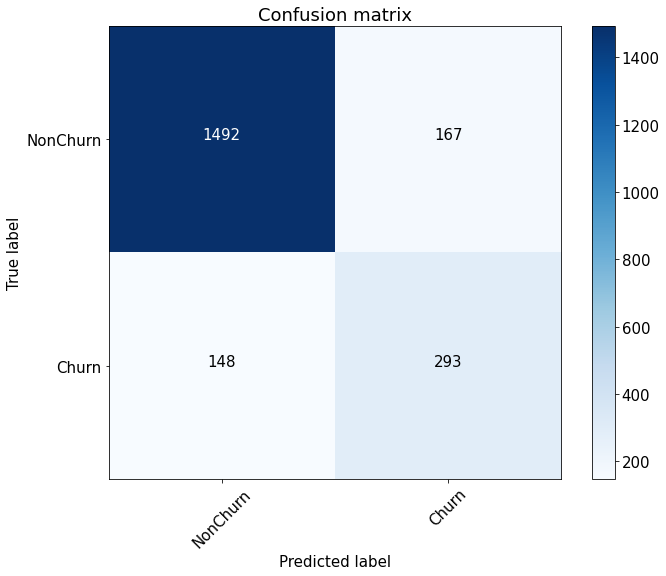

In [27]:
#мы уже нашли ранее "оптимальный" порог, когда максимизировали f_score
font = {'size' : 15}

plt.rc('font', **font)

cnf_matrix = confusion_matrix(y_valid, preds>thr)
plt.figure(figsize=(10, 8))
plot_confusion_matrix(cnf_matrix, classes=['NonChurn', 'Churn'],
                      title='Confusion matrix')
plt.savefig("conf_matrix.png")
plt.show()

In [28]:
tn, fp, fn, tp = confusion_matrix(y_valid, preds>thr).ravel()
print(f'Баланс при рассылке - {tp - fp - 2*fn}$')
print(f'Баланс при отсутствии рассылки - {-2*(tp + fn)}$')

Баланс при рассылке - -170$
Баланс при отсутствии рассылки - -882$


Посчитаем метрики и построим матрицу ошибок на отложенной выборке test:

In [29]:
preds = pipeline.predict_proba(X_test)[:, 1]
thr, fscore, pr, recall = calc_metrics(y_test, preds, print_m=True)

thr = 0.36452388354624987, fscore = 0.639344262295082, Precision = 0.6290322580645161, Recall = 0.65


Confusion matrix, without normalization
[[651  69]
 [ 64 116]]


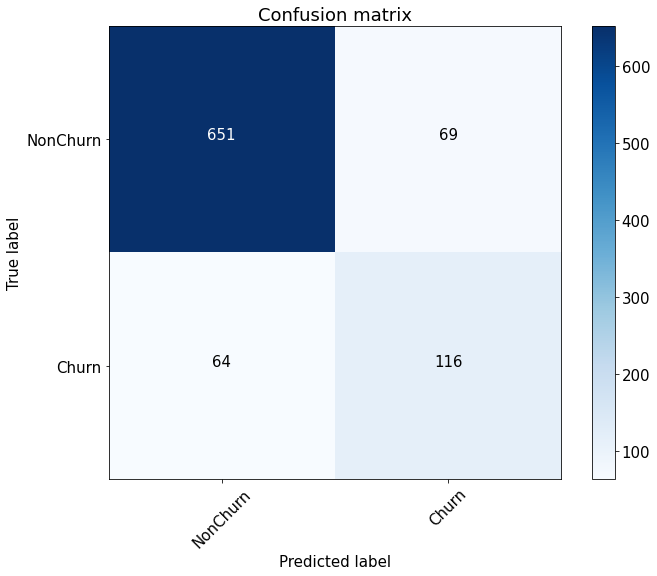

In [30]:
#мы уже нашли ранее "оптимальный" порог, когда максимизировали f_score
font = {'size' : 15}

plt.rc('font', **font)

cnf_matrix = confusion_matrix(y_test, preds>thr)
plt.figure(figsize=(10, 8))
plot_confusion_matrix(cnf_matrix, classes=['NonChurn', 'Churn'],
                      title='Confusion matrix')
plt.savefig("conf_matrix.png")
plt.show()

In [31]:
tn, fp, fn, tp = confusion_matrix(y_test, preds>thr).ravel()
print(f'Баланс при рассылке - {tp - fp - 2*fn}$')
print(f'Баланс при отсутствии рассылки - {-2*(tp + fn)}$')

Баланс при рассылке - -81$
Баланс при отсутствии рассылки - -360$
